# Modelling the Topics in SOCC Articles

We have no previous knowledge of the topics that exist across the articles in the SOCC corpus. This makes it difficult to apply a topic model such as LDA to it, where we need to specify the number of topics.

One approach to create a topic modelling pipeline that works for SOCC data is to try a range of different numbers (of topics) and to choose the one that maximizes the topic coherence of the output. Let us call this part the **topic model creation pipeline**.

Unfortunately, this just propagates the problem one level up; since there is no baseline against which to validate the output, we would just have to trust that the topic model creation pipeline works and outputs a reliable topic model.

For a more trustworthy model creation pipeline, we can apply it to labelled data and tweak how we choose the "best" topic model so that when it is applied to the data, it gives us the same number of topics and labelling as the true topics (the labels).

What we know about the SOCC data is that they are opinion articles from the Globe and Mail that are formally written. For the purposes of this particular pipeline, we are interested in the more newsy parts of the articles than the opinionated parts, as they are more content-rich for topic models. So news articles would be a sensible choice for labelled data on which to train the topic model creation pipeline.

The key thing to understand is that the topics are never transplanted from the labelled dataset to the SOCC articles. All we are optimizing is our method of discovering a topic model that will then give us topics specific to the input corpus. Here, I use the Rubin Satire dataset.

## Pre-processing

In [2]:
import numpy as np
import pandas as pd

In [2]:
rubin_df = pd.read_excel('/Users/vasundhara/sfuvault/Discourse-Lab/Data/Rubin_SatireDataset/Rubin_etal_NAACL_CADD_2016_Satirical_Legitimate_News_DB_RELEASED_0426_2016.xlsx').dropna()
rubin_df['Full Text '].to_csv('~/data/rubin_articles.txt', header=['article_text'])
rubin_df[list(rubin_df.columns[:5])].sample(5)

,Satirical =1 Legitimate=0,Article Headline,Full Text,Domain,Subtopic
0,0,Jeb Bush’s Cerebral Debate Style Faces a Test:...,"On the debate stage, Jeb Bush has committed th...",Politics/Civics,Elections/Debates
234,1,"Single, Unemployed Mother Leeching Off Government",WASHINGTON—Taking advantage of the system and ...,Soft News,Local News
192,1,Nation Figured Everything Would Run On Some Ki...,NEW YORK—Expressing their disappointment and f...,Business/Technology,Tech Improvements
76,0,"Ontario bans flavoured tobacco, forces calorie...",Ontario just got healthier.\nMPPs from all thr...,Business/Technology,Tech Improvements
23,0,Judge Erases Tom Brady’s Suspension; N.F.L. Sa...,In Roger Goodell’s nearly decade-long zeal to ...,Soft News,Sports


In [3]:
rubin_df.dtypes

Satirical =1 Legitimate=0     int64
Article Headline             object
Full Text                    object
Domain                       object
Subtopic                     object
Source                       object
Issue Date                   object
URL                          object
Access Date                  object
dtype: object

With just the contents of the articles in a text file, I put it through some pre-processing in R to get rid of punctuation, numbers, symbols and URLs - all the stuff that's useless for topic models. I also get rid of stopwords based on the SMART stopword list with a couple of manual additions.

```
require(quanteda)
require(stopwords)

articles_csv <- read.csv('~/Data/rubin_articles.txt', stringsAsFactors = FALSE)
articles_df <- data.frame(articles_csv)

corp <- corpus(articles_df$article_text)

no_punct <- tokens(corp, remove_punct = TRUE, remove_url = TRUE, remove_numbers = TRUE, remove_symbols = TRUE)
custom_stopped <- tokens_remove(no_punct, c("mr", "ms", "mrs", "per", "cent", "monday", "tuesday", "wednesday", "thursday", "friday"))
smart_stopped <- tokens_remove(custom_stopped, stopwords::stopwords("en", "smart"))

joined <- list()

for (i in 1:length(smart_stopped)) { joined$article_text_stopped[i] <- toString(paste(unlist(smart_stopped[i]), collapse = ' ')) }

write.csv(data.frame(joined), file = '~/Data/rubin_articles_stopped.csv')
```

## Creating dictionary and corpus

In [3]:
from collections import defaultdict
from gensim import corpora, models

In [4]:
def TokenizedTexts(filename, min_freq):
    df = pd.read_csv(filename, index_col=0)
    texts_tokenized = list(df['article_text_stopped'].str.split())
    
    frequency = defaultdict(int)

    for text in texts_tokenized:
        for token in text:
            frequency[token] += 1
            
    texts = [[token for token in text if frequency[token] > min_freq] for text in texts_tokenized]
    
    return texts

In [5]:
def Dictionary(tokenized_texts):
    return corpora.Dictionary(tokenized_texts)

In [6]:
def Corpus(dictionary, texts, tfidf=True):
    corpus = [dictionary.doc2bow(text) for text in texts]
    
    if not tfidf:
        return corpus
    
    tfidf = models.TfidfModel(corpus)
    corpus_tfidf = tfidf[corpus]
    return corpus_tfidf

In [8]:
tokenized_texts = TokenizedTexts('~/Data/rubin_articles_stopped.csv', 2)
dictionary = Dictionary(tokenized_texts)
corpus = Corpus(dictionary, tokenized_texts)

## Contingency tables for evaluating the model

In [17]:
import operator
from scipy.stats import chi2_contingency

In [10]:
subtopics = list(rubin_df.groupby('Subtopic').groups)

In [11]:
true_label_dict = defaultdict(int)
for index,subtopic in enumerate(subtopics):
    true_label_dict[subtopic] = index
true_label_dict

defaultdict(int,
            {'Banking / Finance': 5,
             'Business Announcements': 10,
             'Elections/Debates': 4,
             'Entertainment': 2,
             'Environment': 0,
             'Gun Violence': 11,
             'Hard Science': 1,
             'Health': 8,
             'Immigration': 6,
             'Local News': 9,
             'Sports': 3,
             'Tech Improvements': 7})

In [12]:
topic_number_mapping_df = pd.DataFrame.from_dict(true_label_dict, orient='index', 
                                                 columns=['numeric_topic_label'])
topic_number_mapping_df['Subtopic'] = topic_number_mapping_df.index
topic_number_mapping_df.reset_index(drop=True, inplace=True)

In [13]:
topic_labels = pd.merge(rubin_df, topic_number_mapping_df, on='Subtopic')[['numeric_topic_label', 'Article Headline', 'Full Text ', 'Subtopic']]

In [14]:
def getChi2(model, corpus):
    scored_docs = model.get_document_topics(corpus)
    lda_topics = []

    for doc in scored_docs:
        lda_topics.append(max(doc, key=operator.itemgetter(1))[0])
    
    predicted_and_true_topics = pd.concat([topic_labels, pd.DataFrame(lda_topics, columns=['numeric_topic_predicted'])], axis=1)
    
    crosstab = pd.crosstab(predicted_and_true_topics['numeric_topic_label'],
                           predicted_and_true_topics['numeric_topic_predicted'])
    
    return chi2_contingency(crosstab)

## Model creation pipeline

In [168]:
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt

In [169]:
def bestNumberOfTopics(corpus, dictionary, param_vector=[], max_num_topics=50):

    all_models = []
    
    chunksize = len(corpus) / 10
    useDefaults = True
    
    # Param vector contains num_passes, num_iterations, gamma_threshold and minimum_phi_value
    if len(param_vector):
        assert len(param_vector) == 4
        
        num_passes = param_vector[0]
        eval_every = param_vector[1]
        num_iterations = param_vector[2]
        gamma_threshold = param_vector[3]
        
        useDefaults = False

    num_topics = 2
    best_num_topics = 0
    
    print('starting', num_topics)
    
    while num_topics < max_num_topics:
        
        print('num_topics:', num_topics)
        
        # train LDA with num_topics
        
        if useDefaults:
#             lda = models.ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=num_topics, chunksize=chunksize, eval_every=1, iterations=100)
            lda = models.ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=num_topics, chunksize=100, eval_every=1, iterations=200, passes=2)
        else:
            lda = models.ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=num_topics,
                                           passes=num_passes, eval_every=eval_every,
                                           iterations=num_iterations, gamma_threshold=gamma_threshold)
            
        all_models.append(lda)
        
        best_num_topics = num_topics
        
        num_topics += 1
        
    print('fin', best_num_topics)
    
    assert best_num_topics != 0
    
    return all_models

In [17]:
all_models = bestNumberOfTopics(corpus, dictionary)

starting 2
num_topics: 2
num_topics: 3
num_topics: 4
num_topics: 5
num_topics: 6
num_topics: 7
num_topics: 8
num_topics: 9
num_topics: 10
num_topics: 11
num_topics: 12
num_topics: 13
num_topics: 14
num_topics: 15
num_topics: 16
num_topics: 17
num_topics: 18
num_topics: 19
num_topics: 20
num_topics: 21
num_topics: 22
num_topics: 23
num_topics: 24
num_topics: 25
num_topics: 26
num_topics: 27
num_topics: 28
num_topics: 29
num_topics: 30
num_topics: 31
num_topics: 32
num_topics: 33
num_topics: 34
num_topics: 35
num_topics: 36
num_topics: 37
num_topics: 38
num_topics: 39
num_topics: 40
num_topics: 41
num_topics: 42
num_topics: 43
num_topics: 44
num_topics: 45
num_topics: 46
num_topics: 47
num_topics: 48
num_topics: 49
fin 49


In [19]:
chi2_pval_by_topics = []
for lda in all_models:
    chi2, p, dof, _ = getChi2(lda, corpus)
    print(lda, chi2, p, dof)
    chi2_pval_by_topics.append([lda.num_topics, p])

LdaModel(num_terms=5312, num_topics=2, decay=0.5, chunksize=24.0) 73.30760919895044 2.859266132036441e-11 11
LdaModel(num_terms=5312, num_topics=3, decay=0.5, chunksize=24.0) 0.0 1.0 0
LdaModel(num_terms=5312, num_topics=4, decay=0.5, chunksize=24.0) 0.0 1.0 0
LdaModel(num_terms=5312, num_topics=5, decay=0.5, chunksize=24.0) 34.35897435897436 0.0451457205831005 22
LdaModel(num_terms=5312, num_topics=6, decay=0.5, chunksize=24.0) 16.9531914893617 0.10926781773751544 11
LdaModel(num_terms=5312, num_topics=7, decay=0.5, chunksize=24.0) 39.918295739348366 0.18962679671820487 33
LdaModel(num_terms=5312, num_topics=8, decay=0.5, chunksize=24.0) 18.02926829268293 0.08090396568096929 11
LdaModel(num_terms=5312, num_topics=9, decay=0.5, chunksize=24.0) 85.61327300150829 0.005141561368033883 55
LdaModel(num_terms=5312, num_topics=10, decay=0.5, chunksize=24.0) 53.78378378378378 0.012601140357013553 33
LdaModel(num_terms=5312, num_topics=11, decay=0.5, chunksize=24.0) 107.5806896551724 0.00093336

In [22]:
df = pd.DataFrame(chi2_pval_by_topics, columns=['num_topics', 'p_value'])
df.head()

,num_topics,p_value
0,2,2.859266e-11
1,3,1.000000e+00
2,4,1.000000e+00
3,5,4.514572e-02
4,6,1.092678e-01


In [133]:
chi2_subset = df[(df['p_value'] > 0.05) & (df['p_value'] < 1.0)]
chi2_subset

,num_topics,p_value
4,6,0.109268
5,7,0.189627
6,8,0.080904
32,34,0.085859


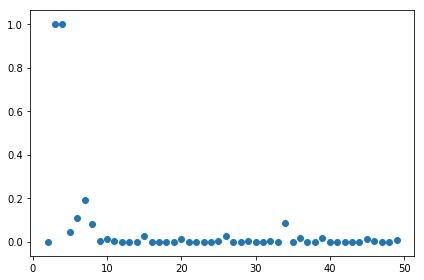

In [25]:
df = pd.DataFrame(chi2_pval_by_topics, columns=['num_topics', 'p_value'])
plt.scatter(df['num_topics'], df['p_value'])
plt.tight_layout()

## Coherence scores

In [121]:
coherence_by_topics = []
for lda in all_models:
    cm = CoherenceModel(lda, coherence='c_v', texts=tokenized_texts)
    coherence = cm.get_coherence()
    print(lda, coherence)
    coherence_by_topics.append([lda.num_topics, coherence])

LdaModel(num_terms=5312, num_topics=2, decay=0.5, chunksize=24.0) 0.3519348796992261
LdaModel(num_terms=5312, num_topics=3, decay=0.5, chunksize=24.0) 0.4762240660157609
LdaModel(num_terms=5312, num_topics=4, decay=0.5, chunksize=24.0) 0.4431461675795202
LdaModel(num_terms=5312, num_topics=5, decay=0.5, chunksize=24.0) 0.34375307048618786
LdaModel(num_terms=5312, num_topics=6, decay=0.5, chunksize=24.0) 0.37867901714769303
LdaModel(num_terms=5312, num_topics=7, decay=0.5, chunksize=24.0) 0.43170946736246957
LdaModel(num_terms=5312, num_topics=8, decay=0.5, chunksize=24.0) 0.4274123461142015
LdaModel(num_terms=5312, num_topics=9, decay=0.5, chunksize=24.0) 0.403136842928878
LdaModel(num_terms=5312, num_topics=10, decay=0.5, chunksize=24.0) 0.40031624432619745
LdaModel(num_terms=5312, num_topics=11, decay=0.5, chunksize=24.0) 0.34612610955600376
LdaModel(num_terms=5312, num_topics=12, decay=0.5, chunksize=24.0) 0.4173941300599114
LdaModel(num_terms=5312, num_topics=13, decay=0.5, chunksi

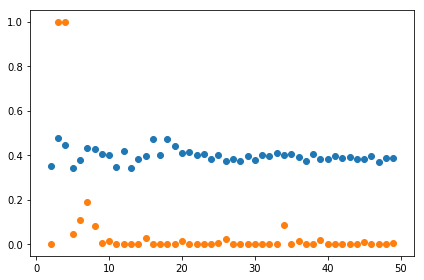

In [125]:
coherence_df = pd.DataFrame(coherence_by_topics, columns=['num_topics', 'coherence'])
plt.scatter(coherence_df['num_topics'], coherence_df['coherence'])
plt.scatter(df['num_topics'], df['p_value'])
plt.tight_layout()

In [141]:
coherence_subset = coherence_df[coherence_df['coherence'] > 0.42]
coherence_subset

,num_topics,coherence
1,3,0.476224
2,4,0.443146
5,7,0.431709
6,8,0.427412
14,16,0.472410
16,18,0.474149
17,19,0.440536


In [144]:
for index,row in coherence_subset.iterrows():
    print('num_topics:', row['num_topics'])
    curr_model = all_models[index]
    
    for i in range(curr_model.num_topics):
        print([dictionary[x[0]] for x in curr_model.get_topic_terms(i)])
        
    print()

num_topics: 3.0
['Walker', "Walker's", 'Huckabee', 'Trump', 'drug', 'Hooray', 'article', "Trump's", 'Scott', 'cubes']
['Police', 'Delle', 'Donne', 'Charlie', 'razor', 'Brady', 'satire', 'Kyrgios', 'French', 'Cosby']
['press', 'reportedly', 'Americans', 'children', 'back', 'time', 'confirmed', 'added', 'announced', 'sources']

num_topics: 4.0
['Brennan', 'Hooray', 'cubes', 'Lord', 'Palluq', 'Brady', 'Salisbury', 'Goldman', 'Sachs', 'Spelman']
['Delle', 'Donne', 'sperm', 'games', 'Sky', 'embryo', 'Hemmings', 'Cosby', 'sexual', 'reboot']
['press', 'reportedly', 'children', 'Americans', 'back', 'time', 'confirmed', 'added', 'announced', 'sources']
['logo', 'Huckabee', 'citizenship', 'climate', 'Obama', 'Jerry', 'NBA', 'MLB', 'Dior', 'Ontario']

num_topics: 7.0
['Fiorina', 'Priebus', 'male', 'Christie', 'polls', 'Reince', 'friend', 'debate', 'GOP', 'speaker']
['climate', 'pipeline', 'citizenship', 'oil', 'change', 'Keystone', 'development', 'voter', 'Elections', 'Ont']
['CBC', 'ad', 'Shad',

In [123]:
#         print('perplexity', lda.perplexity(corpus))
#         print('log? perplexity', lda.log_perplexity(corpus))
        
#         perplexity = lda.log_perplexity(corpus)
#         perplexity_over_time.append([num_topics, 2**perplexity])

## Hierarchical Dirichlet Process

In [29]:
hdp = models.hdpmodel.HdpModel(corpus, id2word=dictionary, chunksize=len(corpus) / 10)

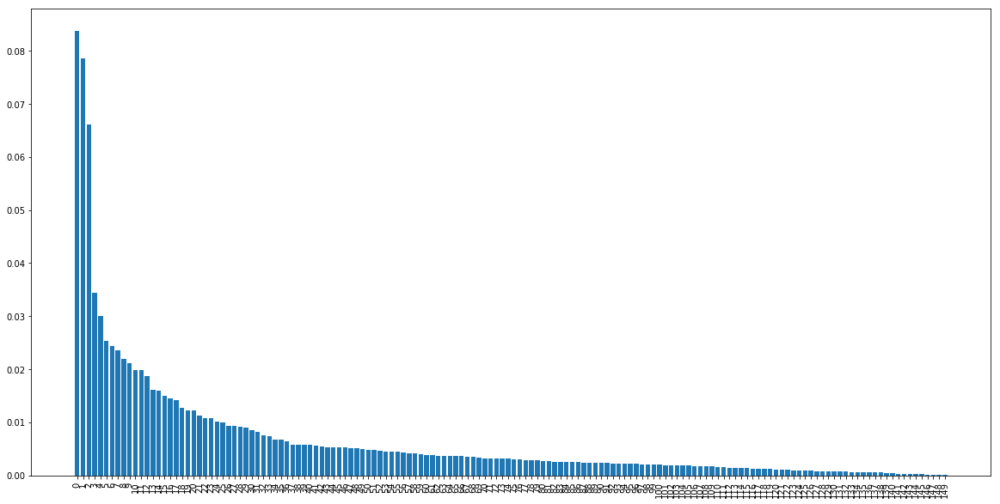

In [108]:
plt.figure(figsize=(20,10))
hdp_scatter = pd.DataFrame(hdp.hdp_to_lda()[0])
hdp_scatter = hdp_scatter.sort_values(0, ascending=False).reset_index()
plt.bar(hdp_scatter.index, hdp_scatter[0])
plt.xticks(hdp_scatter['index'], rotation=90)
plt.show()

In [119]:
for topic in list(hdp_scatter['index'].head(10)):
    print([k for (k,v) in hdp.show_topic(topic, 10)])

['older', 'hurricane', 'action', 'met', 'weak', 'tennis', 'reacted', 'Shad', 'drinking', 'prompted']
['Beringian', 'logos', 'Eric', 'education', 'revenues', 'N.F.L', 'movement', 'pets', 'care', 'parents']
['a.m', 'dream', 'refugees', 'publicly', 'Conservative', 'wardens', 'Burden', 'zones', 'write', "Queen's"]
['lists', 'RBIs', 'programs', 'Thanksgiving', 'lower', 'girl', 'girls', 'teams', 'cold', 'powerless']
['citizenship', 'month', 'blow', 'survey', 'legal', 'History', 'defend', 'Bush', 'Immigration', 'intentions']
['international', 'invasive', 'flash', 'directly', 'health', 'precision', 'attempt', 'Foreign', 'advertising', 'leases']
['email', 'attacked', 'retirement', 'connect', 'credit', 'interested', 'valuable', 'screens', 'scale', 'tested']
['networks', 'Iraq', 'Hall', 'Hungary', 'prime', 'island', 'lab', 'wanting', 'perceived', 'role']
['famous', 'investors', 'Anthony', 'admit', 'planning', 'south', "Saturday's", 'kitchen', 'make', 'Hanlin']
['Islamic', 'relief', 'Donald', 'adm

## SOCC

In [170]:
tokenized_texts = TokenizedTexts('~/Data/socc_articles_stopped.csv', 2)
dictionary = Dictionary(tokenized_texts)
corpus = Corpus(dictionary, tokenized_texts)

2018-12-03 17:21:09,970 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2018-12-03 17:21:16,506 : INFO : adding document #10000 to Dictionary(49616 unique tokens: ['ageless', 'societies', 'touch', 'Pacific', 'storm']...)
2018-12-03 17:21:16,711 : INFO : built Dictionary(49688 unique tokens: ['ageless', 'societies', 'touch', 'Pacific', 'storm']...) from 10339 documents (total 3018550 corpus positions)
2018-12-03 17:21:21,326 : INFO : collecting document frequencies
2018-12-03 17:21:21,327 : INFO : PROGRESS: processing document #0
2018-12-03 17:21:22,555 : INFO : PROGRESS: processing document #10000
2018-12-03 17:21:22,602 : INFO : calculating IDF weights for 10339 documents and 49687 features (2297521 matrix non-zeros)


In [93]:
hdp = models.hdpmodel.HdpModel(corpus, id2word=dictionary, chunksize=256)

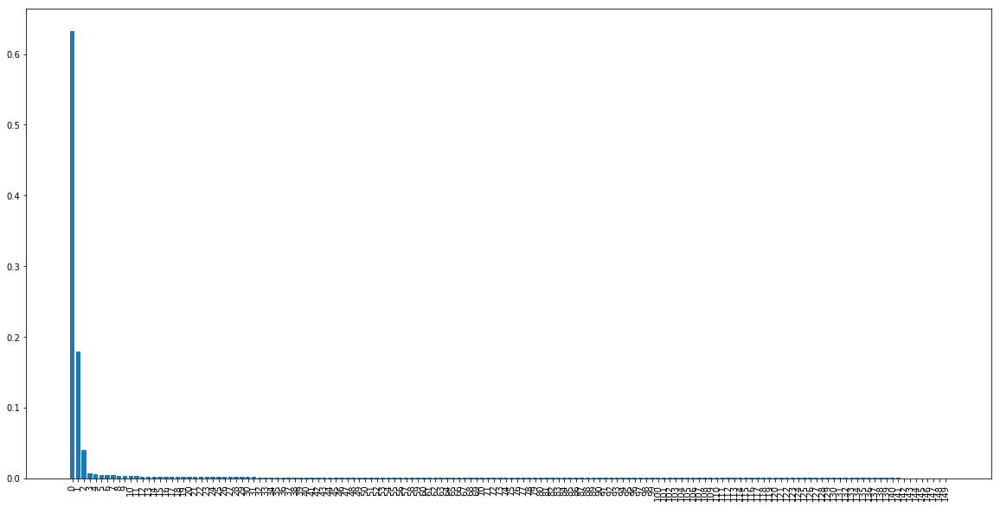

In [94]:
plt.figure(figsize=(20,10))
hdp_scatter = pd.DataFrame(hdp.hdp_to_lda()[0])
hdp_scatter = hdp_scatter.sort_values(0, ascending=False).reset_index()
plt.bar(hdp_scatter.index, hdp_scatter[0])
plt.xticks(hdp_scatter['index'], rotation=90)
plt.show()

From this I will arbitrarily pick an upper bound of n_topics to be 50, just like before. This process takes long so I'd like to keep the number as low as possible while also not losing too much information.

In [171]:
all_models = bestNumberOfTopics(corpus, dictionary)

2018-12-03 17:23:12,728 : INFO : using symmetric alpha at 0.5
2018-12-03 17:23:12,731 : INFO : using symmetric eta at 0.5
2018-12-03 17:23:12,761 : INFO : using serial LDA version on this node
2018-12-03 17:23:12,777 : INFO : running online (multi-pass) LDA training, 2 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000


starting 2
num_topics: 2


2018-12-03 17:23:13,555 : INFO : -11.514 per-word bound, 2924.1 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:23:13,556 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:23:14,043 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:14,099 : INFO : topic #0 (0.500): 0.003*"Trudeau" + 0.002*"Conservatives" + 0.002*"Harper" + 0.001*"Trump" + 0.001*"niqab" + 0.001*"immigration" + 0.001*"Prime" + 0.001*"Conservative" + 0.001*"Liberals" + 0.001*"vote"
2018-12-03 17:23:14,101 : INFO : topic #1 (0.500): 0.003*"Trudeau" + 0.002*"Harper" + 0.002*"Conservatives" + 0.001*"Trump" + 0.001*"Conservative" + 0.001*"Liberals" + 0.001*"Liberal" + 0.001*"election" + 0.001*"party" + 0.001*"Canada"
2018-12-03 17:23:14,105 : INFO : topic diff=1.899408, rho=1.000000
2018-12-03 17:23:14,648 : INFO : -11.029 per-word bound, 2089.2 perplexity estimate based on a held-out corpus of 100 documents with 1237 words


2018-12-03 17:23:19,816 : INFO : topic diff=0.225344, rho=0.316228
2018-12-03 17:23:20,244 : INFO : -10.565 per-word bound, 1514.9 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 17:23:20,244 : INFO : PROGRESS: pass 0, at document #1100/10339
2018-12-03 17:23:20,356 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:20,368 : INFO : topic #0 (0.500): 0.002*"Trump" + 0.001*"women" + 0.001*"religious" + 0.001*"Canadians" + 0.001*"refugees" + 0.001*"people" + 0.001*"Clinton" + 0.001*"Canada" + 0.001*"vote" + 0.001*"Harper"
2018-12-03 17:23:20,370 : INFO : topic #1 (0.500): 0.002*"Harper" + 0.002*"Conservatives" + 0.001*"Trudeau" + 0.001*"Liberals" + 0.001*"tax" + 0.001*"party" + 0.001*"oil" + 0.001*"Conservative" + 0.001*"Senate" + 0.001*"NDP"
2018-12-03 17:23:20,373 : INFO : topic diff=0.221824, rho=0.301511
2018-12-03 17:23:20,818 : INFO : -10.577 per-word bound, 1527.6 perplexity estimate based on a hel

2018-12-03 17:23:25,261 : INFO : topic diff=0.173173, rho=0.223607
2018-12-03 17:23:25,642 : INFO : -10.532 per-word bound, 1480.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 17:23:25,643 : INFO : PROGRESS: pass 0, at document #2100/10339
2018-12-03 17:23:25,747 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:25,760 : INFO : topic #0 (0.500): 0.002*"Trump" + 0.001*"women" + 0.001*"Islamic" + 0.001*"refugees" + 0.001*"Clinton" + 0.001*"U.S" + 0.001*"men" + 0.001*"Ukraine" + 0.001*"Canada" + 0.001*"military"
2018-12-03 17:23:25,762 : INFO : topic #1 (0.500): 0.002*"Trudeau" + 0.001*"Conservatives" + 0.001*"oil" + 0.001*"Liberals" + 0.001*"Harper" + 0.001*"Alberta" + 0.001*"NDP" + 0.001*"party" + 0.001*"government" + 0.001*"tax"
2018-12-03 17:23:25,763 : INFO : topic diff=0.165463, rho=0.218218
2018-12-03 17:23:26,157 : INFO : -10.548 per-word bound, 1497.0 perplexity estimate based on a held-out c

2018-12-03 17:23:30,675 : INFO : topic diff=0.150044, rho=0.182574
2018-12-03 17:23:31,134 : INFO : -10.460 per-word bound, 1408.5 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 17:23:31,140 : INFO : PROGRESS: pass 0, at document #3100/10339
2018-12-03 17:23:31,246 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:31,258 : INFO : topic #0 (0.500): 0.001*"Trump" + 0.001*"Russia" + 0.001*"law" + 0.001*"Ukraine" + 0.001*"Russian" + 0.001*"women" + 0.001*"war" + 0.001*"police" + 0.001*"Israel" + 0.001*"Iraq"
2018-12-03 17:23:31,261 : INFO : topic #1 (0.500): 0.001*"oil" + 0.001*"Trudeau" + 0.001*"NDP" + 0.001*"Liberals" + 0.001*"party" + 0.001*"Harper" + 0.001*"government" + 0.001*"Ontario" + 0.001*"federal" + 0.001*"Liberal"
2018-12-03 17:23:31,263 : INFO : topic diff=0.141073, rho=0.179605
2018-12-03 17:23:31,697 : INFO : -10.537 per-word bound, 1485.3 perplexity estimate based on a held-out corpus of 

2018-12-03 17:23:36,229 : INFO : -10.513 per-word bound, 1461.3 perplexity estimate based on a held-out corpus of 100 documents with 1155 words
2018-12-03 17:23:36,230 : INFO : PROGRESS: pass 0, at document #4100/10339
2018-12-03 17:23:36,315 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:36,326 : INFO : topic #0 (0.500): 0.001*"women" + 0.001*"U.S" + 0.001*"law" + 0.001*"military" + 0.001*"Trump" + 0.001*"police" + 0.001*"Court" + 0.001*"Quebec" + 0.001*"Iran" + 0.001*"Canada"
2018-12-03 17:23:36,328 : INFO : topic #1 (0.500): 0.001*"Liberals" + 0.001*"oil" + 0.001*"NDP" + 0.001*"party" + 0.001*"government" + 0.001*"federal" + 0.001*"Senate" + 0.001*"Trudeau" + 0.001*"Alberta" + 0.001*"province"
2018-12-03 17:23:36,330 : INFO : topic diff=0.125715, rho=0.156174
2018-12-03 17:23:36,710 : INFO : -10.552 per-word bound, 1501.4 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 17:23:36,711 : INFO : PROG

2018-12-03 17:23:41,131 : INFO : PROGRESS: pass 0, at document #5100/10339
2018-12-03 17:23:41,216 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:41,227 : INFO : topic #0 (0.500): 0.001*"women" + 0.001*"police" + 0.001*"U.S" + 0.001*"Russia" + 0.001*"law" + 0.001*"Court" + 0.001*"war" + 0.001*"Canada" + 0.001*"Quebec" + 0.001*"Canadian"
2018-12-03 17:23:41,230 : INFO : topic #1 (0.500): 0.001*"Liberals" + 0.001*"federal" + 0.001*"government" + 0.001*"Ontario" + 0.001*"tax" + 0.001*"party" + 0.001*"NDP" + 0.001*"budget" + 0.001*"provincial" + 0.001*"Liberal"
2018-12-03 17:23:41,232 : INFO : topic diff=0.115198, rho=0.140028
2018-12-03 17:23:41,607 : INFO : -10.601 per-word bound, 1553.0 perplexity estimate based on a held-out corpus of 100 documents with 1113 words
2018-12-03 17:23:41,608 : INFO : PROGRESS: pass 0, at document #5200/10339
2018-12-03 17:23:41,699 : INFO : merging changes from 100 documents into a model of 10339 documents
2018

2018-12-03 17:23:45,966 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:45,977 : INFO : topic #0 (0.500): 0.001*"police" + 0.001*"law" + 0.001*"women" + 0.001*"Quebec" + 0.001*"Court" + 0.001*"U.S" + 0.001*"security" + 0.001*"rights" + 0.001*"Canada" + 0.001*"war"
2018-12-03 17:23:45,979 : INFO : topic #1 (0.500): 0.001*"oil" + 0.001*"NDP" + 0.001*"B.C" + 0.001*"Liberals" + 0.001*"federal" + 0.001*"party" + 0.001*"health" + 0.001*"government" + 0.001*"Ontario" + 0.001*"Quebec"
2018-12-03 17:23:45,980 : INFO : topic diff=0.103353, rho=0.128037
2018-12-03 17:23:46,356 : INFO : -10.534 per-word bound, 1482.8 perplexity estimate based on a held-out corpus of 100 documents with 1108 words
2018-12-03 17:23:46,357 : INFO : PROGRESS: pass 0, at document #6200/10339
2018-12-03 17:23:46,448 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:46,459 : INFO : topic #0 (0.500): 0.001*"police" + 0.001*"law" + 0.001

2018-12-03 17:23:50,885 : INFO : topic #0 (0.500): 0.001*"law" + 0.001*"police" + 0.001*"women" + 0.001*"Court" + 0.001*"China" + 0.001*"U.S" + 0.001*"Quebec" + 0.001*"court" + 0.001*"security" + 0.001*"military"
2018-12-03 17:23:50,888 : INFO : topic #1 (0.500): 0.001*"health" + 0.001*"B.C" + 0.001*"federal" + 0.001*"government" + 0.001*"provincial" + 0.001*"aboriginal" + 0.001*"oil" + 0.001*"care" + 0.001*"province" + 0.001*"city"
2018-12-03 17:23:50,889 : INFO : topic diff=0.096578, rho=0.118678
2018-12-03 17:23:51,254 : INFO : -10.613 per-word bound, 1566.6 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:23:51,255 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:23:51,336 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:51,348 : INFO : topic #0 (0.500): 0.001*"law" + 0.001*"China" + 0.001*"police" + 0.001*"women" + 0.001*"Court" + 0.001*"U.S" + 0.001*"Quebec" + 0.001*"court" + 

2018-12-03 17:23:56,422 : INFO : topic #0 (0.500): 0.001*"police" + 0.001*"women" + 0.001*"law" + 0.001*"China" + 0.001*"Ford" + 0.001*"court" + 0.001*"people" + 0.001*"Court" + 0.001*"U.S" + 0.001*"Hong"
2018-12-03 17:23:56,424 : INFO : topic #1 (0.500): 0.001*"city" + 0.001*"B.C" + 0.001*"Vancouver" + 0.001*"mayor" + 0.001*"health" + 0.001*"food" + 0.001*"Toronto" + 0.001*"government" + 0.001*"Ford" + 0.001*"provincial"
2018-12-03 17:23:56,425 : INFO : topic diff=0.105658, rho=0.111111
2018-12-03 17:23:56,913 : INFO : -10.626 per-word bound, 1580.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 17:23:56,914 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 17:23:57,027 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:23:57,041 : INFO : topic #0 (0.500): 0.001*"police" + 0.001*"women" + 0.001*"law" + 0.001*"China" + 0.001*"court" + 0.001*"Ford" + 0.001*"people" + 0.001*"Court" + 0.001*"med

2018-12-03 17:24:01,710 : INFO : topic #1 (0.500): 0.001*"B.C" + 0.001*"city" + 0.001*"health" + 0.001*"Liberals" + 0.001*"oil" + 0.001*"Vancouver" + 0.001*"care" + 0.001*"Premier" + 0.001*"investment" + 0.001*"tax"
2018-12-03 17:24:01,713 : INFO : topic diff=0.100001, rho=0.104828
2018-12-03 17:24:02,100 : INFO : -10.651 per-word bound, 1608.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:24:02,101 : INFO : PROGRESS: pass 0, at document #9200/10339
2018-12-03 17:24:02,188 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:02,199 : INFO : topic #0 (0.500): 0.001*"women" + 0.001*"Quebec" + 0.001*"Romney" + 0.001*"Obama" + 0.001*"police" + 0.001*"U.S" + 0.001*"China" + 0.001*"PQ" + 0.001*"country" + 0.001*"political"
2018-12-03 17:24:02,201 : INFO : topic #1 (0.500): 0.001*"health" + 0.001*"city" + 0.001*"B.C" + 0.001*"Liberals" + 0.001*"oil" + 0.001*"Vancouver" + 0.001*"care" + 0.001*"Premier" + 0.

2018-12-03 17:24:06,602 : INFO : topic diff=0.090982, rho=0.099504
2018-12-03 17:24:06,970 : INFO : -10.479 per-word bound, 1427.1 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 17:24:06,971 : INFO : PROGRESS: pass 0, at document #10200/10339
2018-12-03 17:24:07,055 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:07,066 : INFO : topic #0 (0.500): 0.001*"Romney" + 0.001*"women" + 0.001*"police" + 0.001*"Obama" + 0.001*"Quebec" + 0.001*"China" + 0.001*"law" + 0.001*"political" + 0.001*"U.S" + 0.001*"people"
2018-12-03 17:24:07,068 : INFO : topic #1 (0.500): 0.001*"B.C" + 0.001*"city" + 0.001*"oil" + 0.001*"Liberals" + 0.001*"Alberta" + 0.001*"health" + 0.001*"government" + 0.001*"spending" + 0.001*"Ontario" + 0.001*"budget"
2018-12-03 17:24:07,069 : INFO : topic diff=0.087985, rho=0.099015
2018-12-03 17:24:07,471 : INFO : -10.553 per-word bound, 1502.8 perplexity estimate based on a held-out corpus o

2018-12-03 17:24:11,777 : INFO : topic diff=0.090132, rho=0.097409
2018-12-03 17:24:12,181 : INFO : -10.430 per-word bound, 1379.6 perplexity estimate based on a held-out corpus of 100 documents with 1223 words
2018-12-03 17:24:12,182 : INFO : PROGRESS: pass 1, at document #800/10339
2018-12-03 17:24:12,270 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:12,283 : INFO : topic #0 (0.500): 0.002*"Trump" + 0.001*"women" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"Canada" + 0.001*"people" + 0.001*"political" + 0.001*"party" + 0.001*"police" + 0.001*"Canadians"
2018-12-03 17:24:12,285 : INFO : topic #1 (0.500): 0.002*"Conservatives" + 0.002*"Liberals" + 0.001*"tax" + 0.001*"NDP" + 0.001*"climate" + 0.001*"Ontario" + 0.001*"government" + 0.001*"Harper" + 0.001*"spending" + 0.001*"oil"
2018-12-03 17:24:12,288 : INFO : topic diff=0.087616, rho=0.097409
2018-12-03 17:24:12,703 : INFO : -10.414 per-word bound, 1364.4 perplexity estimate based on a hel

2018-12-03 17:24:17,178 : INFO : topic diff=0.082723, rho=0.097409
2018-12-03 17:24:17,623 : INFO : -10.470 per-word bound, 1418.7 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:24:17,624 : INFO : PROGRESS: pass 1, at document #1800/10339
2018-12-03 17:24:17,712 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:17,723 : INFO : topic #0 (0.500): 0.002*"Trump" + 0.001*"women" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"people" + 0.001*"Clinton" + 0.001*"Canada" + 0.001*"political" + 0.001*"Canadians" + 0.001*"U.S"
2018-12-03 17:24:17,725 : INFO : topic #1 (0.500): 0.002*"Conservatives" + 0.002*"Liberals" + 0.001*"oil" + 0.001*"tax" + 0.001*"NDP" + 0.001*"Alberta" + 0.001*"Ontario" + 0.001*"budget" + 0.001*"emissions" + 0.001*"taxes"
2018-12-03 17:24:17,726 : INFO : topic diff=0.086833, rho=0.097409
2018-12-03 17:24:18,137 : INFO : -10.418 per-word bound, 1367.9 perplexity estimate based on a held-ou

2018-12-03 17:24:22,587 : INFO : topic diff=0.083109, rho=0.097409
2018-12-03 17:24:22,978 : INFO : -10.436 per-word bound, 1385.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 17:24:22,979 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:24:23,066 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:23,077 : INFO : topic #0 (0.500): 0.001*"Trump" + 0.001*"women" + 0.001*"Trudeau" + 0.001*"Canada" + 0.001*"Harper" + 0.001*"Canadians" + 0.001*"political" + 0.001*"people" + 0.001*"police" + 0.001*"Clinton"
2018-12-03 17:24:23,079 : INFO : topic #1 (0.500): 0.002*"NDP" + 0.002*"oil" + 0.002*"Liberals" + 0.001*"Conservatives" + 0.001*"tax" + 0.001*"Ontario" + 0.001*"Alberta" + 0.001*"budget" + 0.001*"taxes" + 0.001*"government"
2018-12-03 17:24:23,080 : INFO : topic diff=0.084273, rho=0.097409
2018-12-03 17:24:23,499 : INFO : -10.401 per-word bound, 1351.9 perplexity estimate based on a hel

2018-12-03 17:24:27,708 : INFO : topic diff=0.082918, rho=0.097409
2018-12-03 17:24:28,126 : INFO : -10.504 per-word bound, 1452.3 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:24:28,127 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 17:24:28,219 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:28,232 : INFO : topic #0 (0.500): 0.001*"women" + 0.001*"Trump" + 0.001*"Trudeau" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"U.S" + 0.001*"Senate" + 0.001*"law" + 0.001*"Canadian" + 0.001*"political"
2018-12-03 17:24:28,234 : INFO : topic #1 (0.500): 0.002*"oil" + 0.001*"Liberals" + 0.001*"NDP" + 0.001*"Alberta" + 0.001*"tax" + 0.001*"Ontario" + 0.001*"federal" + 0.001*"province" + 0.001*"budget" + 0.001*"pipeline"
2018-12-03 17:24:28,236 : INFO : topic diff=0.086786, rho=0.097409
2018-12-03 17:24:28,638 : INFO : -10.478 per-word bound, 1425.8 perplexity estimate based on a held-out corpus 

2018-12-03 17:24:33,019 : INFO : topic diff=0.083423, rho=0.097409
2018-12-03 17:24:33,409 : INFO : -10.512 per-word bound, 1460.5 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 17:24:33,410 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 17:24:33,513 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:33,527 : INFO : topic #0 (0.500): 0.001*"women" + 0.001*"Quebec" + 0.001*"Senate" + 0.001*"Canada" + 0.001*"law" + 0.001*"U.S" + 0.001*"Canadian" + 0.001*"political" + 0.001*"party" + 0.001*"Canadians"
2018-12-03 17:24:33,530 : INFO : topic #1 (0.500): 0.001*"oil" + 0.001*"NDP" + 0.001*"Liberals" + 0.001*"Alberta" + 0.001*"B.C" + 0.001*"tax" + 0.001*"Ontario" + 0.001*"budget" + 0.001*"federal" + 0.001*"provinces"
2018-12-03 17:24:33,533 : INFO : topic diff=0.077612, rho=0.097409
2018-12-03 17:24:33,952 : INFO : -10.606 per-word bound, 1558.1 perplexity estimate based on a held-out corpus of

2018-12-03 17:24:38,425 : INFO : -10.493 per-word bound, 1441.0 perplexity estimate based on a held-out corpus of 100 documents with 1111 words
2018-12-03 17:24:38,426 : INFO : PROGRESS: pass 1, at document #5800/10339
2018-12-03 17:24:38,506 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:38,518 : INFO : topic #0 (0.500): 0.001*"Quebec" + 0.001*"women" + 0.001*"Canada" + 0.001*"law" + 0.001*"U.S" + 0.001*"Canadian" + 0.001*"Court" + 0.001*"police" + 0.001*"government" + 0.001*"political"
2018-12-03 17:24:38,520 : INFO : topic #1 (0.500): 0.001*"oil" + 0.001*"tax" + 0.001*"B.C" + 0.001*"NDP" + 0.001*"budget" + 0.001*"Alberta" + 0.001*"Liberals" + 0.001*"Ontario" + 0.001*"provinces" + 0.001*"provincial"
2018-12-03 17:24:38,522 : INFO : topic diff=0.078939, rho=0.097409
2018-12-03 17:24:38,899 : INFO : -10.580 per-word bound, 1531.2 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 17:24:38,900 : INFO :

2018-12-03 17:24:43,033 : INFO : PROGRESS: pass 1, at document #6800/10339
2018-12-03 17:24:43,110 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:43,121 : INFO : topic #0 (0.500): 0.001*"Quebec" + 0.001*"law" + 0.001*"Canada" + 0.001*"women" + 0.001*"police" + 0.001*"U.S" + 0.001*"Canadian" + 0.001*"government" + 0.001*"Court" + 0.001*"party"
2018-12-03 17:24:43,123 : INFO : topic #1 (0.500): 0.001*"B.C" + 0.001*"oil" + 0.001*"NDP" + 0.001*"health" + 0.001*"tax" + 0.001*"spending" + 0.001*"provinces" + 0.001*"Alberta" + 0.001*"budget" + 0.001*"Liberals"
2018-12-03 17:24:43,124 : INFO : topic diff=0.078548, rho=0.097409
2018-12-03 17:24:43,478 : INFO : -10.563 per-word bound, 1512.8 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 17:24:43,479 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 17:24:43,558 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-

2018-12-03 17:24:47,421 : INFO : PROGRESS: pass 1, at document #7800/10339
2018-12-03 17:24:47,505 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:47,516 : INFO : topic #0 (0.500): 0.001*"police" + 0.001*"Quebec" + 0.001*"law" + 0.001*"Canada" + 0.001*"China" + 0.001*"Canadian" + 0.001*"government" + 0.001*"U.S" + 0.001*"people" + 0.001*"women"
2018-12-03 17:24:47,519 : INFO : topic #1 (0.500): 0.002*"B.C" + 0.001*"oil" + 0.001*"Vancouver" + 0.001*"tax" + 0.001*"city" + 0.001*"companies" + 0.001*"market" + 0.001*"transit" + 0.001*"budget" + 0.001*"health"
2018-12-03 17:24:47,521 : INFO : topic diff=0.088952, rho=0.097409
2018-12-03 17:24:47,833 : INFO : -10.645 per-word bound, 1601.4 perplexity estimate based on a held-out corpus of 100 documents with 1029 words
2018-12-03 17:24:47,834 : INFO : PROGRESS: pass 1, at document #7900/10339
2018-12-03 17:24:47,897 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12

2018-12-03 17:24:51,897 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:51,910 : INFO : topic #0 (0.500): 0.001*"Quebec" + 0.001*"Obama" + 0.001*"China" + 0.001*"Canada" + 0.001*"police" + 0.001*"women" + 0.001*"Ford" + 0.001*"Romney" + 0.001*"U.S" + 0.001*"Canadian"
2018-12-03 17:24:51,913 : INFO : topic #1 (0.500): 0.002*"B.C" + 0.001*"tax" + 0.001*"oil" + 0.001*"city" + 0.001*"Clark" + 0.001*"Vancouver" + 0.001*"spending" + 0.001*"Premier" + 0.001*"Alberta" + 0.001*"companies"
2018-12-03 17:24:51,915 : INFO : topic diff=0.087569, rho=0.097409
2018-12-03 17:24:52,308 : INFO : -10.559 per-word bound, 1508.6 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:24:52,309 : INFO : PROGRESS: pass 1, at document #8900/10339
2018-12-03 17:24:52,384 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:52,395 : INFO : topic #0 (0.500): 0.001*"Quebec" + 0.001*"Romney" +

2018-12-03 17:24:56,625 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:56,637 : INFO : topic #0 (0.500): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"students" + 0.001*"government" + 0.001*"Canadian" + 0.001*"party" + 0.001*"women" + 0.001*"police" + 0.001*"people" + 0.001*"political"
2018-12-03 17:24:56,639 : INFO : topic #1 (0.500): 0.002*"oil" + 0.002*"Alberta" + 0.001*"B.C" + 0.001*"tax" + 0.001*"spending" + 0.001*"budget" + 0.001*"city" + 0.001*"environmental" + 0.001*"McGuinty" + 0.001*"energy"
2018-12-03 17:24:56,640 : INFO : topic diff=0.086769, rho=0.097409
2018-12-03 17:24:56,997 : INFO : -10.535 per-word bound, 1484.2 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:24:56,998 : INFO : PROGRESS: pass 1, at document #9900/10339
2018-12-03 17:24:57,069 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:24:57,081 : INFO : topic #0 (0.500): 0.001*"Quebec" 

num_topics: 3


2018-12-03 17:24:59,880 : INFO : -11.922 per-word bound, 3880.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:24:59,880 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:25:00,218 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:00,233 : INFO : topic #0 (0.333): 0.003*"Trudeau" + 0.002*"Conservatives" + 0.002*"immigration" + 0.002*"Harper" + 0.001*"Elections" + 0.001*"Liberals" + 0.001*"niqab" + 0.001*"Canada" + 0.001*"vote" + 0.001*"citizenship"
2018-12-03 17:25:00,236 : INFO : topic #1 (0.333): 0.003*"Trudeau" + 0.001*"Islamic" + 0.001*"Harper" + 0.001*"combat" + 0.001*"Ishaq" + 0.001*"State" + 0.001*"climate" + 0.001*"ads" + 0.001*"Trump" + 0.001*"Iraq"
2018-12-03 17:25:00,238 : INFO : topic #2 (0.333): 0.003*"Trudeau" + 0.003*"Harper" + 0.002*"Conservatives" + 0.002*"Conservative" + 0.002*"Trump" + 0.002*"party" + 0.001*"election" + 0.001*"Liberal" + 0.001*"NDP" + 0.001*"Party"

2018-12-03 17:25:04,062 : INFO : topic #2 (0.333): 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"Trump" + 0.002*"Liberals" + 0.002*"Conservative" + 0.002*"Trudeau" + 0.002*"party" + 0.002*"tax" + 0.001*"government" + 0.001*"election"
2018-12-03 17:25:04,065 : INFO : topic diff=0.294835, rho=0.353553
2018-12-03 17:25:04,514 : INFO : -10.932 per-word bound, 1954.1 perplexity estimate based on a held-out corpus of 100 documents with 1277 words
2018-12-03 17:25:04,515 : INFO : PROGRESS: pass 0, at document #900/10339
2018-12-03 17:25:04,614 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:04,630 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"people" + 0.001*"students" + 0.001*"refugees" + 0.001*"Canada" + 0.001*"men" + 0.001*"children" + 0.001*"Canadian" + 0.001*"sex" + 0.001*"religious"
2018-12-03 17:25:04,632 : INFO : topic #1 (0.333): 0.002*"Trump" + 0.001*"Muslims" + 0.001*"Islamic" + 0.001*"climate" + 0.001*"Clinton" + 0.001*"State" + 0

2018-12-03 17:25:08,371 : INFO : topic #1 (0.333): 0.002*"Trump" + 0.002*"Islamic" + 0.001*"Syria" + 0.001*"State" + 0.001*"military" + 0.001*"Clinton" + 0.001*"Muslims" + 0.001*"Assad" + 0.001*"gun" + 0.001*"Iraq"
2018-12-03 17:25:08,373 : INFO : topic #2 (0.333): 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"Liberals" + 0.002*"party" + 0.002*"Conservatives" + 0.002*"Trump" + 0.001*"election" + 0.001*"NDP" + 0.001*"tax" + 0.001*"oil"
2018-12-03 17:25:08,375 : INFO : topic diff=0.215492, rho=0.250000
2018-12-03 17:25:08,774 : INFO : -10.756 per-word bound, 1728.8 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 17:25:08,775 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 17:25:08,854 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:08,870 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"men" + 0.001*"people" + 0.001*"law" + 0.001*"Canada" + 0.001*"life" + 0.001*"refugees" + 0.001*"Ukraine" 

2018-12-03 17:25:12,411 : INFO : topic #1 (0.333): 0.003*"Islamic" + 0.002*"State" + 0.002*"Iraq" + 0.002*"Syria" + 0.002*"Iran" + 0.002*"Israel" + 0.002*"military" + 0.001*"Assad" + 0.001*"Israeli" + 0.001*"war"
2018-12-03 17:25:12,414 : INFO : topic #2 (0.333): 0.002*"Trump" + 0.002*"Trudeau" + 0.001*"Harper" + 0.001*"NDP" + 0.001*"party" + 0.001*"government" + 0.001*"election" + 0.001*"Liberals" + 0.001*"Conservatives" + 0.001*"Liberal"
2018-12-03 17:25:12,416 : INFO : topic diff=0.163053, rho=0.204124
2018-12-03 17:25:12,857 : INFO : -10.754 per-word bound, 1726.8 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:25:12,858 : INFO : PROGRESS: pass 0, at document #2500/10339
2018-12-03 17:25:12,937 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:12,954 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"refugees" + 0.001*"police" + 0.001*"law" + 0.001*"people" + 0.001*"Court" + 0.001*"men" + 0.001*

2018-12-03 17:25:17,001 : INFO : topic #1 (0.333): 0.003*"Israel" + 0.003*"Iran" + 0.002*"Iraq" + 0.002*"Syria" + 0.002*"Islamic" + 0.002*"State" + 0.002*"Israeli" + 0.002*"Palestinian" + 0.002*"Arab" + 0.001*"war"
2018-12-03 17:25:17,005 : INFO : topic #2 (0.333): 0.001*"Trudeau" + 0.001*"oil" + 0.001*"Harper" + 0.001*"government" + 0.001*"party" + 0.001*"Liberals" + 0.001*"NDP" + 0.001*"Senate" + 0.001*"election" + 0.001*"Trump"
2018-12-03 17:25:17,008 : INFO : topic diff=0.137885, rho=0.176777
2018-12-03 17:25:17,424 : INFO : -10.745 per-word bound, 1715.8 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:25:17,426 : INFO : PROGRESS: pass 0, at document #3300/10339
2018-12-03 17:25:17,542 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:17,562 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"law" + 0.001*"Ukraine" + 0.001*"Russia" + 0.001*"people" + 0.001*"Russian" + 0.001*"refugees" + 0.001*"le

2018-12-03 17:25:22,319 : INFO : topic #1 (0.333): 0.003*"Iran" + 0.002*"Iraq" + 0.002*"Israel" + 0.002*"Syria" + 0.001*"Islamic" + 0.001*"Iranian" + 0.001*"weapons" + 0.001*"NATO" + 0.001*"State" + 0.001*"Israeli"
2018-12-03 17:25:22,322 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"party" + 0.001*"Liberals" + 0.001*"oil" + 0.001*"election" + 0.001*"NDP" + 0.001*"Harper" + 0.001*"Senate"
2018-12-03 17:25:22,324 : INFO : topic diff=0.128043, rho=0.158114
2018-12-03 17:25:22,708 : INFO : -10.727 per-word bound, 1694.5 perplexity estimate based on a held-out corpus of 100 documents with 1155 words
2018-12-03 17:25:22,709 : INFO : PROGRESS: pass 0, at document #4100/10339
2018-12-03 17:25:22,793 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:22,810 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"law" + 0.001*"Court" + 0.001*"police" + 0.001*"refugees" + 0.001*"men" + 0.001*"legal" + 0.001*"rights" 

2018-12-03 17:25:26,229 : INFO : topic #1 (0.333): 0.003*"Iran" + 0.002*"Iraq" + 0.001*"Syria" + 0.001*"Israeli" + 0.001*"Israel" + 0.001*"Iranian" + 0.001*"Islamic" + 0.001*"Iran's" + 0.001*"Iraqi" + 0.001*"Palestinian"
2018-12-03 17:25:26,232 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"party" + 0.001*"Senate" + 0.001*"federal" + 0.001*"oil" + 0.001*"Liberals" + 0.001*"election" + 0.001*"political" + 0.001*"Canada"
2018-12-03 17:25:26,234 : INFO : topic diff=0.106090, rho=0.144338
2018-12-03 17:25:26,618 : INFO : -10.875 per-word bound, 1877.8 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 17:25:26,619 : INFO : PROGRESS: pass 0, at document #4900/10339
2018-12-03 17:25:26,694 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:26,714 : INFO : topic #0 (0.333): 0.001*"women" + 0.001*"Court" + 0.001*"children" + 0.001*"law" + 0.001*"Supreme" + 0.001*"police" + 0.001*"Russia" 

2018-12-03 17:25:30,043 : INFO : topic #1 (0.333): 0.002*"Iran" + 0.002*"Israel" + 0.001*"Syria" + 0.001*"Iraq" + 0.001*"Israeli" + 0.001*"Iranian" + 0.001*"Palestinian" + 0.001*"Arab" + 0.001*"Assad" + 0.001*"Iran's"
2018-12-03 17:25:30,045 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"party" + 0.001*"federal" + 0.001*"U.S" + 0.001*"Canada" + 0.001*"political" + 0.001*"Canadian" + 0.001*"Liberals" + 0.001*"oil"
2018-12-03 17:25:30,047 : INFO : topic diff=0.104431, rho=0.133631
2018-12-03 17:25:30,624 : INFO : -10.785 per-word bound, 1764.9 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 17:25:30,626 : INFO : PROGRESS: pass 0, at document #5700/10339
2018-12-03 17:25:30,789 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:30,811 : INFO : topic #0 (0.333): 0.001*"women" + 0.001*"police" + 0.001*"Court" + 0.001*"law" + 0.001*"children" + 0.001*"Supreme" + 0.001*"court" + 0.001

2018-12-03 17:25:35,528 : INFO : topic #1 (0.333): 0.002*"Iran" + 0.001*"Erdogan" + 0.001*"Israel" + 0.001*"Iran's" + 0.001*"Turkey's" + 0.001*"Iranian" + 0.001*"Erdogan's" + 0.001*"Syria" + 0.001*"Iraq" + 0.001*"sanctions"
2018-12-03 17:25:35,531 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"party" + 0.001*"U.S" + 0.001*"Canada" + 0.001*"political" + 0.001*"federal" + 0.001*"election" + 0.001*"B.C" + 0.001*"NDP"
2018-12-03 17:25:35,533 : INFO : topic diff=0.097110, rho=0.125000
2018-12-03 17:25:35,928 : INFO : -10.766 per-word bound, 1741.9 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 17:25:35,929 : INFO : PROGRESS: pass 0, at document #6500/10339
2018-12-03 17:25:35,998 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:36,014 : INFO : topic #0 (0.333): 0.001*"law" + 0.001*"women" + 0.001*"police" + 0.001*"Court" + 0.001*"court" + 0.001*"rights" + 0.001*"Russia" + 0.001*"

2018-12-03 17:25:39,184 : INFO : topic #1 (0.333): 0.002*"Iran" + 0.001*"Iranian" + 0.001*"Iran's" + 0.001*"Israel" + 0.001*"Erdogan" + 0.001*"AKP" + 0.001*"Tehran" + 0.001*"Turkey's" + 0.001*"Palestinian" + 0.001*"sanctions"
2018-12-03 17:25:39,187 : INFO : topic #2 (0.333): 0.001*"government" + 0.001*"Quebec" + 0.001*"B.C" + 0.001*"U.S" + 0.001*"China" + 0.001*"Canada" + 0.001*"federal" + 0.001*"party" + 0.001*"political" + 0.001*"election"
2018-12-03 17:25:39,189 : INFO : topic diff=0.091480, rho=0.117851
2018-12-03 17:25:39,521 : INFO : -10.892 per-word bound, 1900.5 perplexity estimate based on a held-out corpus of 100 documents with 1039 words
2018-12-03 17:25:39,522 : INFO : PROGRESS: pass 0, at document #7300/10339
2018-12-03 17:25:39,606 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:39,625 : INFO : topic #0 (0.333): 0.001*"police" + 0.001*"law" + 0.001*"women" + 0.001*"children" + 0.001*"Court" + 0.001*"court" + 0.001*"Justice" + 

2018-12-03 17:25:42,886 : INFO : topic #1 (0.333): 0.002*"Iran" + 0.001*"Iranian" + 0.001*"Erdogan" + 0.001*"AKP" + 0.001*"Iranians" + 0.001*"Israel" + 0.001*"Iran's" + 0.001*"Israeli" + 0.001*"Turkey's" + 0.001*"Abbas"
2018-12-03 17:25:42,889 : INFO : topic #2 (0.333): 0.001*"Ford" + 0.001*"city" + 0.001*"mayor" + 0.001*"government" + 0.001*"B.C" + 0.001*"Quebec" + 0.001*"China" + 0.001*"Canada" + 0.001*"Toronto" + 0.001*"U.S"
2018-12-03 17:25:42,890 : INFO : topic diff=0.098481, rho=0.111803
2018-12-03 17:25:43,270 : INFO : -10.876 per-word bound, 1879.3 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 17:25:43,271 : INFO : PROGRESS: pass 0, at document #8100/10339
2018-12-03 17:25:43,340 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:43,356 : INFO : topic #0 (0.333): 0.002*"police" + 0.001*"women" + 0.001*"law" + 0.001*"children" + 0.001*"court" + 0.001*"drug" + 0.001*"video" + 0.001*"Hong" + 0.0

2018-12-03 17:25:47,167 : INFO : topic #1 (0.333): 0.002*"Iran" + 0.002*"Palestinian" + 0.001*"Iranian" + 0.001*"Israeli" + 0.001*"Israel" + 0.001*"Iran's" + 0.001*"Hamas" + 0.001*"Israel's" + 0.001*"Netanyahu" + 0.001*"Palestinians"
2018-12-03 17:25:47,170 : INFO : topic #2 (0.333): 0.001*"city" + 0.001*"Quebec" + 0.001*"Ford" + 0.001*"Obama" + 0.001*"government" + 0.001*"B.C" + 0.001*"China" + 0.001*"Romney" + 0.001*"Canada" + 0.001*"party"
2018-12-03 17:25:47,173 : INFO : topic diff=0.090983, rho=0.106600
2018-12-03 17:25:47,545 : INFO : -10.755 per-word bound, 1727.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:25:47,546 : INFO : PROGRESS: pass 0, at document #8900/10339
2018-12-03 17:25:47,619 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:47,636 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"police" + 0.001*"children" + 0.001*"religious" + 0.001*"court" + 0.001*"law" + 0.001*"school"

2018-12-03 17:25:52,908 : INFO : topic #1 (0.333): 0.001*"Iran" + 0.001*"Iranian" + 0.001*"Palestinian" + 0.001*"Israel" + 0.001*"Israeli" + 0.001*"Iran's" + 0.001*"Israel's" + 0.001*"Israelis" + 0.001*"Netanyahu" + 0.001*"Hamas"
2018-12-03 17:25:52,911 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"city" + 0.001*"Liberals" + 0.001*"party" + 0.001*"B.C" + 0.001*"oil" + 0.001*"Canadian" + 0.001*"students"
2018-12-03 17:25:52,915 : INFO : topic diff=0.080450, rho=0.102062
2018-12-03 17:25:53,643 : INFO : -10.788 per-word bound, 1768.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:25:53,648 : INFO : PROGRESS: pass 0, at document #9700/10339
2018-12-03 17:25:53,838 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:53,863 : INFO : topic #0 (0.333): 0.002*"police" + 0.002*"women" + 0.001*"children" + 0.001*"drug" + 0.001*"school" + 0.001*"men" + 0.001*"law" + 0

2018-12-03 17:25:57,797 : INFO : topic #1 (0.333): 0.001*"Palestinian" + 0.001*"Israeli" + 0.001*"Iranian" + 0.001*"Iran's" + 0.001*"Iran" + 0.001*"Israel" + 0.001*"Israel's" + 0.001*"Netanyahu" + 0.000*"Israelis" + 0.000*"Palestinians"
2018-12-03 17:25:57,800 : INFO : topic #2 (0.333): 0.001*"government" + 0.001*"B.C" + 0.001*"Quebec" + 0.001*"party" + 0.001*"city" + 0.001*"NDP" + 0.001*"Canada" + 0.001*"Romney" + 0.001*"Harper" + 0.001*"Liberals"
2018-12-03 17:25:57,801 : INFO : topic diff=0.076478, rho=0.098058
2018-12-03 17:25:58,222 : INFO : -10.694 per-word bound, 1657.1 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:25:58,223 : INFO : PROGRESS: pass 1, at document #100/10339
2018-12-03 17:25:58,304 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:25:58,320 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"police" + 0.001*"children" + 0.001*"marriage" + 0.001*"men" + 0.001*"law" + 0.001*"relig

2018-12-03 17:26:02,023 : INFO : topic #0 (0.333): 0.002*"women" + 0.001*"police" + 0.001*"Muslim" + 0.001*"men" + 0.001*"religious" + 0.001*"sex" + 0.001*"Muslims" + 0.001*"children" + 0.001*"marriage" + 0.001*"law"
2018-12-03 17:26:02,026 : INFO : topic #1 (0.333): 0.001*"Palestinian" + 0.000*"Israeli" + 0.000*"Israel's" + 0.000*"Netanyahu" + 0.000*"Israelis" + 0.000*"Israel" + 0.000*"Hamas" + 0.000*"Iranian" + 0.000*"Iran" + 0.000*"Iran's"
2018-12-03 17:26:02,029 : INFO : topic #2 (0.333): 0.002*"Harper" + 0.001*"Trump" + 0.001*"Trudeau" + 0.001*"Conservatives" + 0.001*"party" + 0.001*"government" + 0.001*"Liberals" + 0.001*"Canada" + 0.001*"election" + 0.001*"Conservative"
2018-12-03 17:26:02,031 : INFO : topic diff=0.075082, rho=0.097409
2018-12-03 17:26:02,482 : INFO : -10.561 per-word bound, 1510.6 perplexity estimate based on a held-out corpus of 100 documents with 1277 words
2018-12-03 17:26:02,484 : INFO : PROGRESS: pass 1, at document #900/10339
2018-12-03 17:26:02,565 : INF

2018-12-03 17:26:05,966 : INFO : -10.564 per-word bound, 1514.1 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 17:26:05,967 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 17:26:06,032 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:06,048 : INFO : topic #0 (0.333): 0.003*"women" + 0.002*"police" + 0.002*"men" + 0.001*"religious" + 0.001*"sex" + 0.001*"children" + 0.001*"Muslims" + 0.001*"Muslim" + 0.001*"sexual" + 0.001*"Islamic"
2018-12-03 17:26:06,050 : INFO : topic #1 (0.333): 0.001*"Hamas" + 0.001*"Palestinian" + 0.000*"Israeli" + 0.000*"Israelis" + 0.000*"Israel's" + 0.000*"Gaza" + 0.000*"Netanyahu" + 0.000*"Israel" + 0.000*"Iranian" + 0.000*"Abbas"
2018-12-03 17:26:06,053 : INFO : topic #2 (0.333): 0.002*"Trump" + 0.001*"Harper" + 0.001*"Trudeau" + 0.001*"Conservatives" + 0.001*"party" + 0.001*"Liberals" + 0.001*"government" + 0.001*"Canada" + 0.001*"election" + 0.001*"Canadian

2018-12-03 17:26:09,352 : INFO : topic #2 (0.333): 0.001*"Trump" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"government" + 0.001*"Conservatives" + 0.001*"party" + 0.001*"Canada" + 0.001*"Liberals" + 0.001*"NDP" + 0.001*"election"
2018-12-03 17:26:09,354 : INFO : topic diff=0.068661, rho=0.097409
2018-12-03 17:26:09,740 : INFO : -10.590 per-word bound, 1541.7 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:26:09,741 : INFO : PROGRESS: pass 1, at document #2400/10339
2018-12-03 17:26:09,806 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:09,822 : INFO : topic #0 (0.333): 0.003*"women" + 0.002*"police" + 0.002*"men" + 0.001*"Islamic" + 0.001*"religious" + 0.001*"sex" + 0.001*"Muslims" + 0.001*"children" + 0.001*"Muslim" + 0.001*"sexual"
2018-12-03 17:26:09,824 : INFO : topic #1 (0.333): 0.001*"Hamas" + 0.000*"Palestinian" + 0.000*"Gaza" + 0.000*"Israelis" + 0.000*"Israeli" + 0.000*"Netanyahu" + 0.00

2018-12-03 17:26:13,737 : INFO : topic #1 (0.333): 0.001*"Hamas" + 0.000*"Gaza" + 0.000*"Palestinian" + 0.000*"Israelis" + 0.000*"Abbas" + 0.000*"Israeli" + 0.000*"Netanyahu" + 0.000*"Israel's" + 0.000*"Israel" + 0.000*"Iranian"
2018-12-03 17:26:13,740 : INFO : topic #2 (0.333): 0.001*"Trump" + 0.001*"Harper" + 0.001*"Trudeau" + 0.001*"Canada" + 0.001*"government" + 0.001*"oil" + 0.001*"Canadians" + 0.001*"party" + 0.001*"Canadian" + 0.001*"NDP"
2018-12-03 17:26:13,743 : INFO : topic diff=0.067958, rho=0.097409
2018-12-03 17:26:14,230 : INFO : -10.592 per-word bound, 1543.0 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:26:14,231 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 17:26:14,313 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:14,330 : INFO : topic #0 (0.333): 0.003*"women" + 0.002*"police" + 0.001*"sex" + 0.001*"men" + 0.001*"religious" + 0.001*"Islamic" + 0.001*"sexual"

2018-12-03 17:26:18,065 : INFO : topic #0 (0.333): 0.003*"women" + 0.002*"police" + 0.001*"religious" + 0.001*"sex" + 0.001*"violence" + 0.001*"Muslim" + 0.001*"men" + 0.001*"death" + 0.001*"marijuana" + 0.001*"sexual"
2018-12-03 17:26:18,067 : INFO : topic #1 (0.333): 0.000*"Hamas" + 0.000*"Gaza" + 0.000*"Palestinian" + 0.000*"Israelis" + 0.000*"Abbas" + 0.000*"Israeli" + 0.000*"Netanyahu" + 0.000*"Israel's" + 0.000*"THW" + 0.000*"Israel"
2018-12-03 17:26:18,074 : INFO : topic #2 (0.333): 0.001*"Canada" + 0.001*"Quebec" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"Canadian" + 0.001*"Harper" + 0.001*"oil" + 0.001*"Canadians" + 0.001*"party" + 0.001*"U.S"
2018-12-03 17:26:18,077 : INFO : topic diff=0.068390, rho=0.097409
2018-12-03 17:26:18,529 : INFO : -10.678 per-word bound, 1638.3 perplexity estimate based on a held-out corpus of 100 documents with 1165 words
2018-12-03 17:26:18,530 : INFO : PROGRESS: pass 1, at document #4000/10339
2018-12-03 17:26:18,608 : INFO : merging changes

2018-12-03 17:26:22,398 : INFO : PROGRESS: pass 1, at document #4700/10339
2018-12-03 17:26:22,517 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:22,541 : INFO : topic #0 (0.333): 0.003*"women" + 0.002*"police" + 0.001*"sex" + 0.001*"violence" + 0.001*"death" + 0.001*"religious" + 0.001*"Muslim" + 0.001*"men" + 0.001*"marijuana" + 0.001*"sexual"
2018-12-03 17:26:22,547 : INFO : topic #1 (0.333): 0.000*"Hamas" + 0.000*"Gaza" + 0.000*"Palestinian" + 0.000*"Israelis" + 0.000*"Abbas" + 0.000*"Israeli" + 0.000*"Netanyahu" + 0.000*"PSE" + 0.000*"Israel's" + 0.000*"Loki"
2018-12-03 17:26:22,551 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"Canadians" + 0.001*"party" + 0.001*"oil" + 0.001*"federal" + 0.001*"U.S" + 0.001*"Liberals"
2018-12-03 17:26:22,559 : INFO : topic diff=0.069537, rho=0.097409
2018-12-03 17:26:22,977 : INFO : -10.630 per-word bound, 1585.2 perplexity estimate based on

2018-12-03 17:26:26,565 : INFO : topic diff=0.064471, rho=0.097409
2018-12-03 17:26:26,984 : INFO : -10.684 per-word bound, 1645.2 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 17:26:26,985 : INFO : PROGRESS: pass 1, at document #5500/10339
2018-12-03 17:26:27,054 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:27,074 : INFO : topic #0 (0.333): 0.003*"women" + 0.002*"police" + 0.001*"sexual" + 0.001*"sex" + 0.001*"death" + 0.001*"violence" + 0.001*"religious" + 0.001*"marijuana" + 0.001*"Muslim" + 0.001*"men"
2018-12-03 17:26:27,077 : INFO : topic #1 (0.333): 0.000*"Hamas" + 0.000*"KI" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Gaza" + 0.000*"Palestinian" + 0.000*"RY" + 0.000*"Countess" + 0.000*"CCA" + 0.000*"KFR"
2018-12-03 17:26:27,082 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"party" + 0.001*"Canadians" + 0.001

2018-12-03 17:26:30,534 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"party" + 0.001*"federal" + 0.001*"Canadians" + 0.001*"political" + 0.001*"public"
2018-12-03 17:26:30,536 : INFO : topic diff=0.063449, rho=0.097409
2018-12-03 17:26:30,903 : INFO : -10.677 per-word bound, 1637.4 perplexity estimate based on a held-out corpus of 100 documents with 1123 words
2018-12-03 17:26:30,904 : INFO : PROGRESS: pass 1, at document #6300/10339
2018-12-03 17:26:30,977 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:30,998 : INFO : topic #0 (0.333): 0.002*"women" + 0.002*"police" + 0.001*"sexual" + 0.001*"suicide" + 0.001*"death" + 0.001*"mental" + 0.001*"medical" + 0.001*"sex" + 0.001*"violence" + 0.001*"gay"
2018-12-03 17:26:31,000 : INFO : topic #1 (0.333): 0.000*"Probability" + 0.000*"seaweed" + 0.000*"Ogilvy" + 0.000*"Holt" + 0.000*"Mazzaella" + 0.000*"wracks" + 0.000*"wrac

2018-12-03 17:26:34,173 : INFO : topic #1 (0.333): 0.000*"Probability" + 0.000*"seaweed" + 0.000*"Ogilvy" + 0.000*"@realDonaldTrump" + 0.000*"Bullard" + 0.000*"Grind" + 0.000*"Yaffa" + 0.000*"Holt" + 0.000*"statelessness" + 0.000*"ABS"
2018-12-03 17:26:34,176 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"party" + 0.001*"federal" + 0.001*"aboriginal" + 0.001*"health" + 0.001*"political"
2018-12-03 17:26:34,180 : INFO : topic diff=0.066218, rho=0.097409
2018-12-03 17:26:34,521 : INFO : -10.661 per-word bound, 1618.8 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 17:26:34,522 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 17:26:34,588 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:34,606 : INFO : topic #0 (0.333): 0.002*"women" + 0.002*"police" + 0.002*"mental" + 0.001*"solitary" + 0.001*"prison" + 0.001*"suici

2018-12-03 17:26:37,891 : INFO : topic #0 (0.333): 0.001*"solitary" + 0.001*"women" + 0.001*"suicide" + 0.001*"Egyptian" + 0.001*"prison" + 0.001*"police" + 0.001*"death" + 0.001*"Brotherhood" + 0.001*"mental" + 0.001*"Fahmy"
2018-12-03 17:26:37,894 : INFO : topic #1 (0.333): 0.000*"ASULF" + 0.000*"icewine" + 0.000*"grapes" + 0.000*"Brix" + 0.000*"Subban" + 0.000*"Pee-kay" + 0.000*"pronunciation" + 0.000*"azolla" + 0.000*"Denzel" + 0.000*"hitchBOT"
2018-12-03 17:26:37,898 : INFO : topic #2 (0.333): 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"Quebec" + 0.001*"B.C" + 0.001*"U.S" + 0.001*"China" + 0.001*"people" + 0.001*"public" + 0.001*"federal"
2018-12-03 17:26:37,900 : INFO : topic diff=0.071702, rho=0.097409
2018-12-03 17:26:38,314 : INFO : -10.825 per-word bound, 1813.9 perplexity estimate based on a held-out corpus of 100 documents with 1029 words
2018-12-03 17:26:38,315 : INFO : PROGRESS: pass 1, at document #7900/10339
2018-12-03 17:26:38,382 : INFO : merging c

2018-12-03 17:26:42,021 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 17:26:42,088 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:42,104 : INFO : topic #0 (0.333): 0.001*"sexual" + 0.001*"mental" + 0.001*"women" + 0.001*"suicide" + 0.001*"sex" + 0.001*"girls" + 0.001*"illness" + 0.001*"Malala" + 0.001*"prison" + 0.001*"cancer"
2018-12-03 17:26:42,107 : INFO : topic #1 (0.333): 0.000*"Lemay" + 0.000*"Corriveau" + 0.000*"Janion" + 0.000*"ASULF" + 0.000*"icewine" + 0.000*"REIT" + 0.000*"Corbeil" + 0.000*"grapes" + 0.000*"Onni" + 0.000*"pronunciation"
2018-12-03 17:26:42,111 : INFO : topic #2 (0.333): 0.001*"city" + 0.001*"B.C" + 0.001*"Canada" + 0.001*"government" + 0.001*"Ford" + 0.001*"U.S" + 0.001*"health" + 0.001*"Canadian" + 0.001*"China" + 0.001*"Obama"
2018-12-03 17:26:42,113 : INFO : topic diff=0.070813, rho=0.097409
2018-12-03 17:26:42,480 : INFO : -10.620 per-word bound, 1574.2 perplexity estimate based on a held-out 

2018-12-03 17:26:45,934 : INFO : PROGRESS: pass 1, at document #9400/10339
2018-12-03 17:26:46,007 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:46,024 : INFO : topic #0 (0.333): 0.001*"athletes" + 0.001*"sex" + 0.001*"sexual" + 0.001*"Egyptian" + 0.001*"HIV" + 0.001*"girls" + 0.001*"women" + 0.001*"chef" + 0.001*"restaurant" + 0.001*"mental"
2018-12-03 17:26:46,027 : INFO : topic #1 (0.333): 0.000*"Frye" + 0.000*"Lemay" + 0.000*"Frye's" + 0.000*"Corriveau" + 0.000*"Northrop" + 0.000*"Brar" + 0.000*"Gosley" + 0.000*"Dundee" + 0.000*"Janion" + 0.000*"LHINs"
2018-12-03 17:26:46,030 : INFO : topic #2 (0.333): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"city" + 0.001*"health" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"students" + 0.001*"party" + 0.001*"Liberals"
2018-12-03 17:26:46,032 : INFO : topic diff=0.065267, rho=0.097409
2018-12-03 17:26:46,404 : INFO : -10.663 per-word bound, 1621.1 perplexity estimate based on a held-

2018-12-03 17:26:49,496 : INFO : topic diff=0.060904, rho=0.097409
2018-12-03 17:26:49,900 : INFO : -10.515 per-word bound, 1463.0 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 17:26:49,902 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 17:26:49,973 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:49,991 : INFO : topic #0 (0.333): 0.001*"sex" + 0.001*"HIV" + 0.001*"athletes" + 0.001*"sexual" + 0.001*"chef" + 0.001*"girls" + 0.001*"mental" + 0.001*"restaurant" + 0.000*"addicts" + 0.000*"prison"
2018-12-03 17:26:49,993 : INFO : topic #1 (0.333): 0.000*"Ant" + 0.000*"Diamandis" + 0.000*"Frye" + 0.000*"canton" + 0.000*"Skvorecky" + 0.000*"Duvalier" + 0.000*"Nardwuar" + 0.000*"Abundance" + 0.000*"Troll" + 0.000*"Katimavik"
2018-12-03 17:26:49,998 : INFO : topic #2 (0.333): 0.001*"government" + 0.001*"Canada" + 0.001*"city" + 0.001*"Quebec" + 0.001*"B.C" + 0.001*"Romney" + 0.001*"Canadian

num_topics: 4


2018-12-03 17:26:51,486 : INFO : -12.356 per-word bound, 5242.7 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:26:51,486 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:26:51,741 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:51,760 : INFO : topic #0 (0.250): 0.003*"firefighters" + 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"combat" + 0.002*"Liberals" + 0.002*"women" + 0.002*"cabinet" + 0.002*"Conservatives" + 0.002*"party" + 0.001*"ministers"
2018-12-03 17:26:51,762 : INFO : topic #1 (0.250): 0.003*"Trudeau" + 0.002*"vote" + 0.002*"party" + 0.002*"immigration" + 0.001*"Prime" + 0.001*"Liberals" + 0.001*"NDP" + 0.001*"Harper" + 0.001*"Conservatives" + 0.001*"Parliament"
2018-12-03 17:26:51,765 : INFO : topic #2 (0.250): 0.004*"Trudeau" + 0.003*"Harper" + 0.002*"Conservatives" + 0.002*"Trump" + 0.002*"climate" + 0.001*"voters" + 0.001*"Islamic" + 0.001*"Iraq" + 0.001*"change" + 0.0

2018-12-03 17:26:55,326 : INFO : topic #2 (0.250): 0.004*"Trump" + 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.001*"Liberals" + 0.001*"climate" + 0.001*"Clinton" + 0.001*"Conservative" + 0.001*"voters" + 0.001*"election"
2018-12-03 17:26:55,330 : INFO : topic #3 (0.250): 0.001*"Ontario" + 0.001*"energy" + 0.001*"Russia" + 0.001*"Trump" + 0.001*"carbon" + 0.001*"tax" + 0.001*"Ontario's" + 0.001*"math" + 0.001*"government" + 0.001*"electricity"
2018-12-03 17:26:55,332 : INFO : topic diff=0.339649, rho=0.377964
2018-12-03 17:26:55,829 : INFO : -11.301 per-word bound, 2523.1 perplexity estimate based on a held-out corpus of 100 documents with 1223 words
2018-12-03 17:26:55,829 : INFO : PROGRESS: pass 0, at document #800/10339
2018-12-03 17:26:55,931 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:55,951 : INFO : topic #0 (0.250): 0.002*"food" + 0.001*"women" + 0.001*"Hudak" + 0.001*"Energy" + 0.001*"dental" + 0.001*"service" + 0

2018-12-03 17:26:59,344 : INFO : -11.098 per-word bound, 2191.8 perplexity estimate based on a held-out corpus of 100 documents with 1212 words
2018-12-03 17:26:59,344 : INFO : PROGRESS: pass 0, at document #1400/10339
2018-12-03 17:26:59,430 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:26:59,452 : INFO : topic #0 (0.250): 0.001*"physicians" + 0.001*"PQ" + 0.001*"Horwath" + 0.001*"medicine" + 0.001*"mother" + 0.001*"Wynne's" + 0.001*"measles" + 0.001*"gun" + 0.001*"food" + 0.001*"union"
2018-12-03 17:26:59,454 : INFO : topic #1 (0.250): 0.003*"Senate" + 0.002*"Elections" + 0.002*"Parliament" + 0.002*"bill" + 0.001*"Duffy" + 0.001*"Court" + 0.001*"Quebec" + 0.001*"party" + 0.001*"Commons" + 0.001*"seats"
2018-12-03 17:26:59,456 : INFO : topic #2 (0.250): 0.002*"Trump" + 0.002*"women" + 0.001*"Trudeau" + 0.001*"Conservatives" + 0.001*"Harper" + 0.001*"Liberals" + 0.001*"Canada" + 0.001*"NDP" + 0.001*"people" + 0.001*"election"
2018-12-03 17:26

2018-12-03 17:27:02,542 : INFO : topic #1 (0.250): 0.002*"Senate" + 0.002*"Court" + 0.002*"Supreme" + 0.002*"Duffy" + 0.002*"seats" + 0.001*"Wright" + 0.001*"court" + 0.001*"Justice" + 0.001*"Quebeckers" + 0.001*"assisted"
2018-12-03 17:27:02,545 : INFO : topic #2 (0.250): 0.002*"Trump" + 0.002*"Trudeau" + 0.001*"oil" + 0.001*"Conservatives" + 0.001*"Harper" + 0.001*"women" + 0.001*"Liberals" + 0.001*"U.S" + 0.001*"Canada" + 0.001*"political"
2018-12-03 17:27:02,547 : INFO : topic #3 (0.250): 0.002*"Ukraine" + 0.001*"carbon" + 0.001*"aboriginal" + 0.001*"Ontario" + 0.001*"Russia" + 0.001*"indigenous" + 0.001*"energy" + 0.001*"transit" + 0.001*"emissions" + 0.001*"price"
2018-12-03 17:27:02,550 : INFO : topic diff=0.180865, rho=0.223607
2018-12-03 17:27:02,923 : INFO : -11.000 per-word bound, 2047.6 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 17:27:02,924 : INFO : PROGRESS: pass 0, at document #2100/10339
2018-12-03 17:27:02,993 : INFO : me

2018-12-03 17:27:05,430 : INFO : topic #3 (0.250): 0.001*"Russia" + 0.001*"Ukraine" + 0.001*"aboriginal" + 0.001*"Russian" + 0.001*"housing" + 0.001*"carbon" + 0.001*"energy" + 0.001*"transit" + 0.001*"Ontario" + 0.001*"Israeli"
2018-12-03 17:27:05,432 : INFO : topic diff=0.150524, rho=0.196116
2018-12-03 17:27:05,810 : INFO : -10.917 per-word bound, 1933.0 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 17:27:05,811 : INFO : PROGRESS: pass 0, at document #2700/10339
2018-12-03 17:27:05,872 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:05,892 : INFO : topic #0 (0.250): 0.001*"Yatim" + 0.000*"firefighters" + 0.000*"fluoridation" + 0.000*"Sammy" + 0.000*"vaccines" + 0.000*"processed" + 0.000*"fluoride" + 0.000*"vaccinated" + 0.000*"SIU" + 0.000*"streetcar"
2018-12-03 17:27:05,894 : INFO : topic #1 (0.250): 0.003*"Senate" + 0.002*"Court" + 0.002*"Supreme" + 0.002*"Duffy" + 0.002*"seats" + 0.002*"Just

2018-12-03 17:27:08,792 : INFO : PROGRESS: pass 0, at document #3300/10339
2018-12-03 17:27:08,856 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:08,878 : INFO : topic #0 (0.250): 0.000*"fluoride" + 0.000*"Yatim" + 0.000*"fluoridation" + 0.000*"autism" + 0.000*"firefighters" + 0.000*"Asperger's" + 0.000*"vaccines" + 0.000*"processed" + 0.000*"Sammy" + 0.000*"vaccinated"
2018-12-03 17:27:08,880 : INFO : topic #1 (0.250): 0.004*"Senate" + 0.003*"senators" + 0.002*"Duffy" + 0.001*"Khadr" + 0.001*"appointments" + 0.001*"Court" + 0.001*"appointment" + 0.001*"Supreme" + 0.001*"Justice" + 0.001*"Wright"
2018-12-03 17:27:08,884 : INFO : topic #2 (0.250): 0.001*"Trudeau" + 0.001*"Canada" + 0.001*"Harper" + 0.001*"government" + 0.001*"party" + 0.001*"oil" + 0.001*"political" + 0.001*"NDP" + 0.001*"Liberals" + 0.001*"Canadian"
2018-12-03 17:27:08,887 : INFO : topic #3 (0.250): 0.002*"Ukraine" + 0.002*"aboriginal" + 0.002*"transit" + 0.002*"Russia" + 0

2018-12-03 17:27:11,631 : INFO : topic #1 (0.250): 0.003*"senators" + 0.002*"Senate" + 0.001*"Nadon" + 0.001*"appointment" + 0.001*"appointments" + 0.001*"Senators" + 0.001*"Duffy" + 0.001*"Court" + 0.001*"Parizeau" + 0.001*"Poilievre"
2018-12-03 17:27:11,635 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"Canadian" + 0.001*"women" + 0.001*"oil" + 0.001*"Canadians" + 0.001*"U.S" + 0.001*"party"
2018-12-03 17:27:11,637 : INFO : topic #3 (0.250): 0.002*"Ukraine" + 0.002*"aboriginal" + 0.001*"energy" + 0.001*"Russia" + 0.001*"companies" + 0.001*"medical" + 0.001*"development" + 0.001*"marijuana" + 0.001*"indigenous" + 0.001*"officials"
2018-12-03 17:27:11,641 : INFO : topic diff=0.107630, rho=0.160128
2018-12-03 17:27:12,004 : INFO : -10.979 per-word bound, 2017.8 perplexity estimate based on a held-out corpus of 100 documents with 1165 words
2018-12-03 17:27:12,005 : INFO : PROGRESS: pass 0, at document #4000/10339
2018-12-03 17:

2018-12-03 17:27:14,621 : INFO : topic #3 (0.250): 0.002*"aboriginal" + 0.001*"communities" + 0.001*"development" + 0.001*"indigenous" + 0.001*"Ukraine" + 0.001*"medical" + 0.001*"provide" + 0.001*"energy" + 0.001*"marijuana" + 0.001*"suicide"
2018-12-03 17:27:14,624 : INFO : topic diff=0.101471, rho=0.149071
2018-12-03 17:27:14,993 : INFO : -10.838 per-word bound, 1830.6 perplexity estimate based on a held-out corpus of 100 documents with 1167 words
2018-12-03 17:27:14,994 : INFO : PROGRESS: pass 0, at document #4600/10339
2018-12-03 17:27:15,047 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:15,067 : INFO : topic #0 (0.250): 0.000*"Yatim" + 0.000*"Screenwriter" + 0.000*"Producer" + 0.000*"tasered" + 0.000*"mumps" + 0.000*"Pharrell" + 0.000*"tasering" + 0.000*"tasers" + 0.000*"Sammy" + 0.000*"taser"
2018-12-03 17:27:15,069 : INFO : topic #1 (0.250): 0.002*"senators" + 0.001*"Khadr" + 0.001*"Senate" + 0.001*"Poilievre" + 0.001*"Nadon" + 0.0

2018-12-03 17:27:17,682 : INFO : PROGRESS: pass 0, at document #5200/10339
2018-12-03 17:27:17,740 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:17,760 : INFO : topic #0 (0.250): 0.000*"Yatim" + 0.000*"Screenwriter" + 0.000*"Producer" + 0.000*"tasered" + 0.000*"mumps" + 0.000*"Pharrell" + 0.000*"tasering" + 0.000*"Sammy" + 0.000*"tasers" + 0.000*"Forty-three"
2018-12-03 17:27:17,762 : INFO : topic #1 (0.250): 0.001*"senators" + 0.000*"Nadon" + 0.000*"Khadr" + 0.000*"Senate" + 0.000*"Poilievre" + 0.000*"Duffy" + 0.000*"Mayrand" + 0.000*"appointment" + 0.000*"Elections" + 0.000*"Wright"
2018-12-03 17:27:17,765 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"women" + 0.001*"Canadian" + 0.001*"party" + 0.001*"U.S" + 0.001*"Liberals" + 0.001*"Canadians" + 0.001*"federal"
2018-12-03 17:27:17,767 : INFO : topic #3 (0.250): 0.002*"aboriginal" + 0.002*"Ukraine" + 0.002*"indigenous" + 0.001*"communities" + 0.

2018-12-03 17:27:20,330 : INFO : topic #1 (0.250): 0.001*"Khadr" + 0.001*"Nadon" + 0.000*"senators" + 0.000*"Poilievre" + 0.000*"Senate" + 0.000*"Rothstein" + 0.000*"Wright" + 0.000*"Mayrand" + 0.000*"Duffy" + 0.000*"appointment"
2018-12-03 17:27:20,332 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"women" + 0.001*"federal" + 0.001*"party" + 0.001*"Canadians" + 0.001*"law"
2018-12-03 17:27:20,335 : INFO : topic #3 (0.250): 0.002*"aboriginal" + 0.002*"companies" + 0.002*"communities" + 0.001*"indigenous" + 0.001*"Ukraine" + 0.001*"financial" + 0.001*"medical" + 0.001*"Charter" + 0.001*"development" + 0.001*"funding"
2018-12-03 17:27:20,337 : INFO : topic diff=0.080706, rho=0.131306
2018-12-03 17:27:20,699 : INFO : -10.960 per-word bound, 1991.7 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 17:27:20,700 : INFO : PROGRESS: pass 0, at document #5900/10339
2018-12-03 17:27

2018-12-03 17:27:23,362 : INFO : topic #3 (0.250): 0.002*"aboriginal" + 0.002*"Ukraine" + 0.002*"companies" + 0.002*"medical" + 0.002*"communities" + 0.002*"Charter" + 0.002*"officials" + 0.001*"indigenous" + 0.001*"development" + 0.001*"provide"
2018-12-03 17:27:23,365 : INFO : topic diff=0.079008, rho=0.125000
2018-12-03 17:27:23,760 : INFO : -10.890 per-word bound, 1897.4 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 17:27:23,761 : INFO : PROGRESS: pass 0, at document #6500/10339
2018-12-03 17:27:23,811 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:23,831 : INFO : topic #0 (0.250): 0.000*"Tharg" + 0.000*"Oona" + 0.000*"Yatim" + 0.000*"sabre-tooth" + 0.000*"No-chin-lady" + 0.000*"Bro" + 0.000*"Yaffa" + 0.000*"Screenwriter" + 0.000*"H.M" + 0.000*"dalits"
2018-12-03 17:27:23,833 : INFO : topic #1 (0.250): 0.000*"Khadr" + 0.000*"Nadon" + 0.000*"senators" + 0.000*"Poilievre" + 0.000*"Senate" + 0.0

2018-12-03 17:27:26,613 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 17:27:26,666 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:26,687 : INFO : topic #0 (0.250): 0.000*"Tharg" + 0.000*"Oona" + 0.000*"Yatim" + 0.000*"sabre-tooth" + 0.000*"No-chin-lady" + 0.000*"@realDonaldTrump" + 0.000*"TB" + 0.000*"FNHA" + 0.000*"Bullard" + 0.000*"Granger"
2018-12-03 17:27:26,690 : INFO : topic #1 (0.250): 0.000*"Khadr" + 0.000*"Blaer" + 0.000*"Nadon" + 0.000*"Icelandic" + 0.000*"government-approved" + 0.000*"Pilot" + 0.000*"Yoon" + 0.000*"senators" + 0.000*"Poilievre" + 0.000*"baptized"
2018-12-03 17:27:26,693 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"health" + 0.001*"U.S" + 0.001*"law" + 0.001*"Canadian" + 0.001*"federal" + 0.001*"B.C" + 0.001*"people"
2018-12-03 17:27:26,696 : INFO : topic #3 (0.250): 0.002*"aboriginal" + 0.002*"communities" + 0.002*"companies" + 0.002*"development" + 0.00

2018-12-03 17:27:29,196 : INFO : topic #1 (0.250): 0.000*"ASULF" + 0.000*"Khadr" + 0.000*"Blaer" + 0.000*"Pee-kay" + 0.000*"pronunciation" + 0.000*"Denzel" + 0.000*"Subban" + 0.000*"Subban's" + 0.000*"P.K" + 0.000*"Nadon"
2018-12-03 17:27:29,198 : INFO : topic #2 (0.250): 0.001*"government" + 0.001*"police" + 0.001*"Canada" + 0.001*"Quebec" + 0.001*"Canadian" + 0.001*"China" + 0.001*"B.C" + 0.001*"law" + 0.001*"U.S" + 0.001*"people"
2018-12-03 17:27:29,201 : INFO : topic #3 (0.250): 0.002*"companies" + 0.002*"transit" + 0.002*"development" + 0.002*"aboriginal" + 0.002*"communities" + 0.002*"suicide" + 0.002*"medical" + 0.001*"Egyptian" + 0.001*"indigenous" + 0.001*"Egypt"
2018-12-03 17:27:29,204 : INFO : topic diff=0.062563, rho=0.113961
2018-12-03 17:27:29,543 : INFO : -11.036 per-word bound, 2099.3 perplexity estimate based on a held-out corpus of 100 documents with 1105 words
2018-12-03 17:27:29,544 : INFO : PROGRESS: pass 0, at document #7800/10339
2018-12-03 17:27:29,598 : INFO : 

2018-12-03 17:27:31,844 : INFO : topic diff=0.070261, rho=0.109764
2018-12-03 17:27:32,206 : INFO : -10.846 per-word bound, 1840.4 perplexity estimate based on a held-out corpus of 100 documents with 1146 words
2018-12-03 17:27:32,207 : INFO : PROGRESS: pass 0, at document #8400/10339
2018-12-03 17:27:32,265 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:32,285 : INFO : topic #0 (0.250): 0.000*"Tharg" + 0.000*"Sena" + 0.000*"Shiv" + 0.000*"Thackeray" + 0.000*"Katz" + 0.000*"Oona" + 0.000*"Budlakoti" + 0.000*"Stubbs" + 0.000*"Letkeman" + 0.000*"Laughlin"
2018-12-03 17:27:32,287 : INFO : topic #1 (0.250): 0.000*"ASULF" + 0.000*"Khadr" + 0.000*"Blaer" + 0.000*"Pee-kay" + 0.000*"pronunciation" + 0.000*"Subban" + 0.000*"Denzel" + 0.000*"P.K" + 0.000*"Subban's" + 0.000*"Nadon"
2018-12-03 17:27:32,290 : INFO : topic #2 (0.250): 0.001*"Ford" + 0.001*"police" + 0.001*"city" + 0.001*"Canada" + 0.001*"government" + 0.001*"women" + 0.001*"Canadian" + 0

2018-12-03 17:27:34,994 : INFO : topic #1 (0.250): 0.000*"Khadr" + 0.000*"Hagan" + 0.000*"Suri" + 0.000*"Suri's" + 0.000*"Burn" + 0.000*"ASULF" + 0.000*"Tumblr" + 0.000*"Khadr's" + 0.000*"Blaer" + 0.000*"Someday"
2018-12-03 17:27:34,997 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"city" + 0.001*"Canadian" + 0.001*"government" + 0.001*"Romney" + 0.001*"B.C" + 0.001*"U.S" + 0.001*"China" + 0.001*"Ford"
2018-12-03 17:27:34,999 : INFO : topic #3 (0.250): 0.002*"companies" + 0.002*"development" + 0.002*"transit" + 0.001*"housing" + 0.001*"Egypt" + 0.001*"communities" + 0.001*"investment" + 0.001*"Palestinian" + 0.001*"McGuinty" + 0.001*"Bank"
2018-12-03 17:27:35,001 : INFO : topic diff=0.060227, rho=0.105409
2018-12-03 17:27:35,350 : INFO : -10.878 per-word bound, 1882.3 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 17:27:35,351 : INFO : PROGRESS: pass 0, at document #9100/10339
2018-12-03 17:27:35,412 : INFO : merging chan

2018-12-03 17:27:37,771 : INFO : topic diff=0.056945, rho=0.102062
2018-12-03 17:27:38,196 : INFO : -10.849 per-word bound, 1844.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:27:38,197 : INFO : PROGRESS: pass 0, at document #9700/10339
2018-12-03 17:27:38,278 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:38,297 : INFO : topic #0 (0.250): 0.000*"Troll" + 0.000*"Katimavik" + 0.000*"Katimavik's" + 0.000*"Diamandis" + 0.000*"RED" + 0.000*"Brar" + 0.000*"Tides" + 0.000*"Abundance" + 0.000*"LHINs" + 0.000*"Frye"
2018-12-03 17:27:38,300 : INFO : topic #1 (0.250): 0.000*"Khadr" + 0.000*"Hagan" + 0.000*"Suri" + 0.000*"Suri's" + 0.000*"Burn" + 0.000*"Troll" + 0.000*"ASULF" + 0.000*"Katimavik" + 0.000*"Diamandis" + 0.000*"Katimavik's"
2018-12-03 17:27:38,304 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"city" + 0.001*"government" + 0.001*"students" + 0.001*"Canadian" + 0.001*"hea

2018-12-03 17:27:41,590 : INFO : topic #0 (0.250): 0.000*"anesthesiologists" + 0.000*"Nardwuar" + 0.000*"BCMA" + 0.000*"Colton" + 0.000*"Duvalier" + 0.000*"Skvorecky" + 0.000*"Daisey" + 0.000*"delirium" + 0.000*"Guenther" + 0.000*"Troll"
2018-12-03 17:27:41,598 : INFO : topic #1 (0.250): 0.000*"anesthesiologists" + 0.000*"BCMA" + 0.000*"Khadr" + 0.000*"Hagan" + 0.000*"Suri" + 0.000*"Suri's" + 0.000*"Anesthesiologists" + 0.000*"Nardwuar" + 0.000*"tutorials" + 0.000*"Burn"
2018-12-03 17:27:41,603 : INFO : topic #2 (0.250): 0.001*"government" + 0.001*"city" + 0.001*"Canada" + 0.001*"B.C" + 0.001*"Quebec" + 0.001*"Romney" + 0.001*"Liberals" + 0.001*"party" + 0.001*"oil" + 0.001*"Harper"
2018-12-03 17:27:41,610 : INFO : topic #3 (0.250): 0.001*"housing" + 0.001*"transit" + 0.001*"companies" + 0.001*"Israeli" + 0.001*"Palestinian" + 0.001*"development" + 0.001*"Carney" + 0.001*"marijuana" + 0.001*"reserves" + 0.001*"Netanyahu"
2018-12-03 17:27:41,613 : INFO : topic diff=0.052873, rho=0.09853

2018-12-03 17:27:44,426 : INFO : topic #1 (0.250): 0.000*"anesthesiologists" + 0.000*"BCMA" + 0.000*"Khadr" + 0.000*"Hagan" + 0.000*"rare-earths" + 0.000*"Zoricic" + 0.000*"Suri" + 0.000*"Suri's" + 0.000*"Anesthesiologists" + 0.000*"Ishaq"
2018-12-03 17:27:44,428 : INFO : topic #2 (0.250): 0.001*"Harper" + 0.001*"Trump" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"Conservatives" + 0.001*"Canada" + 0.001*"party" + 0.001*"Liberals" + 0.001*"people" + 0.001*"Canadian"
2018-12-03 17:27:44,431 : INFO : topic #3 (0.250): 0.001*"Israeli" + 0.001*"Palestinian" + 0.001*"housing" + 0.001*"transit" + 0.001*"Israelis" + 0.001*"companies" + 0.001*"Netanyahu" + 0.000*"marijuana" + 0.000*"development" + 0.000*"reserves"
2018-12-03 17:27:44,433 : INFO : topic diff=0.052026, rho=0.097409
2018-12-03 17:27:44,866 : INFO : -10.637 per-word bound, 1592.0 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:27:44,867 : INFO : PROGRESS: pass 1, at document #600/103

2018-12-03 17:27:47,236 : INFO : topic #2 (0.250): 0.001*"Harper" + 0.001*"Trump" + 0.001*"Trudeau" + 0.001*"Conservatives" + 0.001*"party" + 0.001*"government" + 0.001*"Liberals" + 0.001*"Canada" + 0.001*"women" + 0.001*"Canadians"
2018-12-03 17:27:47,239 : INFO : topic #3 (0.250): 0.001*"Hamas" + 0.001*"Israeli" + 0.001*"Gaza" + 0.001*"Palestinian" + 0.001*"Beer" + 0.001*"Israelis" + 0.001*"Store" + 0.001*"beer" + 0.001*"Netanyahu" + 0.000*"housing"
2018-12-03 17:27:47,241 : INFO : topic diff=0.047054, rho=0.097409
2018-12-03 17:27:47,930 : INFO : -10.587 per-word bound, 1537.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:27:47,931 : INFO : PROGRESS: pass 1, at document #1200/10339
2018-12-03 17:27:48,029 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:48,058 : INFO : topic #0 (0.250): 0.000*"Starfighter" + 0.000*"Tims" + 0.000*"anesthesiologists" + 0.000*"Ts" + 0.000*"ABH" + 0.000*"rare-ear

2018-12-03 17:27:51,473 : INFO : topic diff=0.044846, rho=0.097409
2018-12-03 17:27:51,937 : INFO : -10.654 per-word bound, 1611.7 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:27:51,938 : INFO : PROGRESS: pass 1, at document #1800/10339
2018-12-03 17:27:52,000 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:27:52,021 : INFO : topic #0 (0.250): 0.000*"Mia" + 0.000*"externality" + 0.000*"Straszak" + 0.000*"Igor" + 0.000*"Alphaville" + 0.000*"Semenya" + 0.000*"Starfighter" + 0.000*"MAD" + 0.000*"Monis" + 0.000*"Tims"
2018-12-03 17:27:52,024 : INFO : topic #1 (0.250): 0.000*"anesthesiologists" + 0.000*"BCMA" + 0.000*"Khadr" + 0.000*"Mia" + 0.000*"externality" + 0.000*"Straszak" + 0.000*"Igor" + 0.000*"Alphaville" + 0.000*"Semenya" + 0.000*"Starfighter"
2018-12-03 17:27:52,027 : INFO : topic #2 (0.250): 0.001*"Trump" + 0.001*"Harper" + 0.001*"Trudeau" + 0.001*"Conservatives" + 0.001*"party" + 0.001*"C

2018-12-03 17:27:57,429 : INFO : topic #0 (0.250): 0.000*"bettered" + 0.000*"Ritalin" + 0.000*"PSA" + 0.000*"Donohue" + 0.000*"MOOC" + 0.000*"Courchene" + 0.000*"ClassDojo" + 0.000*"Mia" + 0.000*"China-Canada" + 0.000*"Walloons"
2018-12-03 17:27:57,432 : INFO : topic #1 (0.250): 0.000*"anesthesiologists" + 0.000*"BCMA" + 0.000*"bettered" + 0.000*"Ritalin" + 0.000*"PSA" + 0.000*"Donohue" + 0.000*"MOOC" + 0.000*"Courchene" + 0.000*"Khadr" + 0.000*"ClassDojo"
2018-12-03 17:27:57,434 : INFO : topic #2 (0.250): 0.001*"Trump" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"government" + 0.001*"Canada" + 0.001*"Conservatives" + 0.001*"women" + 0.001*"party" + 0.001*"Liberals" + 0.001*"Canadians"
2018-12-03 17:27:57,437 : INFO : topic #3 (0.250): 0.001*"Palestinian" + 0.001*"Hamas" + 0.001*"Gaza" + 0.001*"Israelis" + 0.001*"Israeli" + 0.001*"Beer" + 0.001*"Netanyahu" + 0.001*"Store" + 0.000*"Palestinians" + 0.000*"beer"
2018-12-03 17:27:57,439 : INFO : topic diff=0.045083, rho=0.097409
2018-12-03 

2018-12-03 17:28:00,809 : INFO : topic #2 (0.250): 0.001*"Trump" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"Canada" + 0.001*"government" + 0.001*"oil" + 0.001*"Canadians" + 0.001*"party" + 0.001*"Canadian" + 0.001*"women"
2018-12-03 17:28:00,811 : INFO : topic #3 (0.250): 0.002*"Hamas" + 0.001*"Palestinian" + 0.001*"Gaza" + 0.001*"Israelis" + 0.001*"Israeli" + 0.000*"Abbas" + 0.000*"Netanyahu" + 0.000*"Beer" + 0.000*"Store" + 0.000*"Palestinians"
2018-12-03 17:28:00,813 : INFO : topic diff=0.045683, rho=0.097409
2018-12-03 17:28:01,177 : INFO : -10.549 per-word bound, 1498.6 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 17:28:01,178 : INFO : PROGRESS: pass 1, at document #3100/10339
2018-12-03 17:28:01,226 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:01,245 : INFO : topic #0 (0.250): 0.000*"SodaStream" + 0.000*"Rinelle" + 0.000*"almost-certain" + 0.000*"megatons" + 0.000*"straighten" + 0.000*"

2018-12-03 17:28:03,438 : INFO : topic diff=0.045080, rho=0.097409
2018-12-03 17:28:03,811 : INFO : -10.607 per-word bound, 1559.6 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:28:03,812 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 17:28:03,861 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:03,881 : INFO : topic #0 (0.250): 0.000*"Barb" + 0.000*"Scientology" + 0.000*"Martenson" + 0.000*"vole" + 0.000*"oceanic" + 0.000*"MM" + 0.000*"Mernagh" + 0.000*"CC" + 0.000*"McMeekin" + 0.000*"Whiskers"
2018-12-03 17:28:03,883 : INFO : topic #1 (0.250): 0.000*"Barb" + 0.000*"Scientology" + 0.000*"Martenson" + 0.000*"oceanic" + 0.000*"MM" + 0.000*"vole" + 0.000*"Mernagh" + 0.000*"McMeekin" + 0.000*"CC" + 0.000*"SodaStream"
2018-12-03 17:28:03,885 : INFO : topic #2 (0.250): 0.001*"Canada" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"Trump" + 0.001*"oil" + 0.001*"Canadian"

2018-12-03 17:28:06,433 : INFO : topic #1 (0.250): 0.000*"Screenwriter" + 0.000*"Nichola" + 0.000*"Shkreli" + 0.000*"Nakamoto" + 0.000*"hydrant" + 0.000*"Ernestine" + 0.000*"THW" + 0.000*"TCE" + 0.000*"Dalits" + 0.000*"Turing"
2018-12-03 17:28:06,435 : INFO : topic #2 (0.250): 0.001*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"women" + 0.001*"Canadians" + 0.001*"party" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"oil"
2018-12-03 17:28:06,438 : INFO : topic #3 (0.250): 0.001*"Hamas" + 0.000*"Palestinian" + 0.000*"Abbas" + 0.000*"Gaza" + 0.000*"Arafat" + 0.000*"Beer" + 0.000*"Israelis" + 0.000*"Store" + 0.000*"Israeli" + 0.000*"Rabin's"
2018-12-03 17:28:06,439 : INFO : topic diff=0.042988, rho=0.097409
2018-12-03 17:28:06,812 : INFO : -10.618 per-word bound, 1571.4 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 17:28:06,813 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 17:28:06,860 : INFO : merging c

2018-12-03 17:28:09,030 : INFO : topic #3 (0.250): 0.000*"deacons" + 0.000*"Hamas" + 0.000*"deacon" + 0.000*"Palestinian" + 0.000*"Abbas" + 0.000*"Gaza" + 0.000*"Arafat" + 0.000*"Beer" + 0.000*"diaconate" + 0.000*"Israelis"
2018-12-03 17:28:09,032 : INFO : topic diff=0.045780, rho=0.097409
2018-12-03 17:28:09,373 : INFO : -10.702 per-word bound, 1665.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:28:09,374 : INFO : PROGRESS: pass 1, at document #5000/10339
2018-12-03 17:28:09,420 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:09,440 : INFO : topic #0 (0.250): 0.000*"Screenwriter" + 0.000*"al-Mahdi" + 0.000*"MESS" + 0.000*"CFO" + 0.000*"Swansea" + 0.000*"Equustek" + 0.000*"Kesean" + 0.000*"Sheriffs" + 0.000*"Nichola" + 0.000*"PSE"
2018-12-03 17:28:09,442 : INFO : topic #1 (0.250): 0.000*"Screenwriter" + 0.000*"al-Mahdi" + 0.000*"MESS" + 0.000*"Swansea" + 0.000*"CFO" + 0.000*"Equustek" + 0.000*

2018-12-03 17:28:11,889 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:11,908 : INFO : topic #0 (0.250): 0.000*"KI" + 0.000*"RY" + 0.000*"hijra" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"AOV" + 0.000*"KFR" + 0.000*"CSE" + 0.000*"Tayler" + 0.000*"CanCon"
2018-12-03 17:28:11,910 : INFO : topic #1 (0.250): 0.000*"KI" + 0.000*"RY" + 0.000*"hijra" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"KFR" + 0.000*"Tayler" + 0.000*"CSE" + 0.000*"AOV" + 0.000*"CanCon"
2018-12-03 17:28:11,912 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"women" + 0.001*"party" + 0.001*"Canadians" + 0.001*"federal" + 0.001*"political"
2018-12-03 17:28:11,915 : INFO : topic #3 (0.250): 0.000*"Abbas" + 0.000*"Hamas" + 0.000*"deacons" + 0.000*"Gazans" + 0.000*"Palestinian" + 0.000*"deacon" + 0.000*"Gaza" + 0.000*"Arafat" + 0.000*"diaconate" + 0.000*"Israelis"
2018-12-03 17:28:11,917 : INFO : 

2018-12-03 17:28:14,570 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"party" + 0.001*"women" + 0.001*"police" + 0.001*"law" + 0.001*"federal"
2018-12-03 17:28:14,573 : INFO : topic #3 (0.250): 0.000*"Ogilvy" + 0.000*"Abbas" + 0.000*"Hamas" + 0.000*"deacons" + 0.000*"Holt" + 0.000*"Holt's" + 0.000*"Gazans" + 0.000*"Palestinian" + 0.000*"deacon" + 0.000*"collections"
2018-12-03 17:28:14,576 : INFO : topic diff=0.043239, rho=0.097409
2018-12-03 17:28:14,968 : INFO : -10.738 per-word bound, 1708.2 perplexity estimate based on a held-out corpus of 100 documents with 1123 words
2018-12-03 17:28:14,969 : INFO : PROGRESS: pass 1, at document #6300/10339
2018-12-03 17:28:15,014 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:15,033 : INFO : topic #0 (0.250): 0.000*"Probability" + 0.000*"seaweed" + 0.000*"leprosy" + 0.000*"KMT" + 0.000*"Chaoui" + 0.000*"KI" + 0.000*"disfigure"

2018-12-03 17:28:17,365 : INFO : -10.752 per-word bound, 1724.3 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 17:28:17,365 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 17:28:17,408 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:17,427 : INFO : topic #0 (0.250): 0.000*"Probability" + 0.000*"Hofsess" + 0.000*"Yaffa" + 0.000*"Grind" + 0.000*"statelessness" + 0.000*"OTP" + 0.000*"Muniz" + 0.000*"@realDonaldTrump" + 0.000*"dalits" + 0.000*"seaweed"
2018-12-03 17:28:17,429 : INFO : topic #1 (0.250): 0.000*"Blaer" + 0.000*"Tharg" + 0.000*"Icelandic" + 0.000*"government-approved" + 0.000*"Pilot" + 0.000*"Oona" + 0.000*"baptized" + 0.000*"noun" + 0.000*"Names" + 0.000*"sabre-tooth"
2018-12-03 17:28:17,432 : INFO : topic #2 (0.250): 0.001*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"law" + 0.001*"federal" + 0.001*"party" + 0.001*"health" + 0.001*

2018-12-03 17:28:19,935 : INFO : topic #1 (0.250): 0.000*"Blaer" + 0.000*"Tharg" + 0.000*"Icelandic" + 0.000*"government-approved" + 0.000*"Pilot" + 0.000*"Oona" + 0.000*"noun" + 0.000*"baptized" + 0.000*"Names" + 0.000*"sabre-tooth"
2018-12-03 17:28:19,938 : INFO : topic #2 (0.250): 0.001*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"police" + 0.001*"Canadian" + 0.001*"law" + 0.001*"U.S" + 0.001*"B.C" + 0.001*"federal" + 0.001*"health"
2018-12-03 17:28:19,940 : INFO : topic #3 (0.250): 0.000*"sushi" + 0.000*"crab" + 0.000*"Heirloom" + 0.000*"Oru" + 0.000*"icewine" + 0.000*"sashimi" + 0.000*"Minami" + 0.000*"Graze" + 0.000*"standout" + 0.000*"vegans"
2018-12-03 17:28:19,941 : INFO : topic diff=0.045855, rho=0.097409
2018-12-03 17:28:20,292 : INFO : -11.054 per-word bound, 2126.3 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 17:28:20,295 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 17:28:20,357 : INFO : merging chan

2018-12-03 17:28:22,458 : INFO : topic diff=0.051879, rho=0.097409
2018-12-03 17:28:22,856 : INFO : -10.798 per-word bound, 1780.7 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 17:28:22,857 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 17:28:22,911 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:22,935 : INFO : topic #0 (0.250): 0.000*"Lemay" + 0.000*"Corriveau" + 0.000*"ASULF" + 0.000*"Corbeil" + 0.000*"Pee-kay" + 0.000*"pronunciation" + 0.000*"Denzel" + 0.000*"Subban" + 0.000*"Subban's" + 0.000*"P.K"
2018-12-03 17:28:22,938 : INFO : topic #1 (0.250): 0.000*"Blaer" + 0.000*"Tharg" + 0.000*"Icelandic" + 0.000*"government-approved" + 0.000*"Pilot" + 0.000*"REIT" + 0.000*"Onni" + 0.000*"Oona" + 0.000*"Names" + 0.000*"Fringe"
2018-12-03 17:28:22,942 : INFO : topic #2 (0.250): 0.001*"police" + 0.001*"Ford" + 0.001*"city" + 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*

2018-12-03 17:28:25,679 : INFO : topic #1 (0.250): 0.000*"Blaer" + 0.000*"Yiddish" + 0.000*"curses" + 0.000*"Shouldice" + 0.000*"Tharg" + 0.000*"Icelandic" + 0.000*"Rivera" + 0.000*"government-approved" + 0.000*"Pilot" + 0.000*"REIT"
2018-12-03 17:28:25,681 : INFO : topic #2 (0.250): 0.001*"city" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"Ford" + 0.001*"China" + 0.001*"B.C" + 0.001*"Obama" + 0.001*"U.S"
2018-12-03 17:28:25,684 : INFO : topic #3 (0.250): 0.000*"creamy" + 0.000*"deep-fried" + 0.000*"crispy" + 0.000*"flavours" + 0.000*"Chef" + 0.000*"noodles" + 0.000*"lamb" + 0.000*"binder" + 0.000*"crab" + 0.000*"standout"
2018-12-03 17:28:25,685 : INFO : topic diff=0.051105, rho=0.097409
2018-12-03 17:28:26,031 : INFO : -10.762 per-word bound, 1736.2 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:28:26,032 : INFO : PROGRESS: pass 1, at document #8900/10339
2018-12-03 17:28:26,089 : INFO : merging chan

2018-12-03 17:28:28,425 : INFO : topic diff=0.049223, rho=0.097409
2018-12-03 17:28:28,832 : INFO : -10.769 per-word bound, 1745.1 perplexity estimate based on a held-out corpus of 100 documents with 1155 words
2018-12-03 17:28:28,833 : INFO : PROGRESS: pass 1, at document #9500/10339
2018-12-03 17:28:28,888 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:28,908 : INFO : topic #0 (0.250): 0.000*"Hagan" + 0.000*"Lemay" + 0.000*"Suri" + 0.000*"Corriveau" + 0.000*"Suri's" + 0.000*"Burn" + 0.000*"ASULF" + 0.000*"Corbeil" + 0.000*"Pee-kay" + 0.000*"pronunciation"
2018-12-03 17:28:28,910 : INFO : topic #1 (0.250): 0.000*"Higgs" + 0.000*"boson" + 0.000*"mermaids" + 0.000*"particle" + 0.000*"Heuer" + 0.000*"NOAA" + 0.000*"Blaer" + 0.000*"NOAA's" + 0.000*"CERN" + 0.000*"mermaid"
2018-12-03 17:28:28,912 : INFO : topic #2 (0.250): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"city" + 0.001*"government" + 0.001*"Canadian" + 0.001*"health" + 0.001*"students" 

2018-12-03 17:28:31,726 : INFO : topic #1 (0.250): 0.000*"Higgs" + 0.000*"boson" + 0.000*"mermaids" + 0.000*"particle" + 0.000*"Nardwuar" + 0.000*"NOAA" + 0.000*"Heuer" + 0.000*"Ant" + 0.000*"NOAA's" + 0.000*"Colton"
2018-12-03 17:28:31,729 : INFO : topic #2 (0.250): 0.001*"government" + 0.001*"Canada" + 0.001*"Romney" + 0.001*"city" + 0.001*"Quebec" + 0.001*"B.C" + 0.001*"Canadian" + 0.001*"oil" + 0.001*"Liberals" + 0.001*"health"
2018-12-03 17:28:31,732 : INFO : topic #3 (0.250): 0.001*"ramen" + 0.000*"crab" + 0.000*"cuisine" + 0.000*"creamy" + 0.000*"chef" + 0.000*"dishes" + 0.000*"noodles" + 0.000*"Haywire" + 0.000*"deep-fried" + 0.000*"oysters"
2018-12-03 17:28:31,734 : INFO : topic diff=0.047237, rho=0.097409
2018-12-03 17:28:32,084 : INFO : -10.605 per-word bound, 1557.9 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 17:28:32,085 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 17:28:32,138 : INFO : merging changes from 1

num_topics: 5


2018-12-03 17:28:33,571 : INFO : -12.841 per-word bound, 7338.8 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:28:33,571 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:28:33,770 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:33,793 : INFO : topic #0 (0.200): 0.002*"Conservatives" + 0.002*"Trudeau" + 0.002*"firefighters" + 0.002*"nannies" + 0.002*"hydro" + 0.002*"nanny" + 0.002*"marijuana" + 0.002*"al-Assad" + 0.002*"policy" + 0.001*"court"
2018-12-03 17:28:33,795 : INFO : topic #1 (0.200): 0.003*"Trudeau" + 0.003*"Trump" + 0.002*"immigration" + 0.002*"Catholic" + 0.001*"Elections" + 0.001*"party" + 0.001*"anti-black" + 0.001*"Cologne" + 0.001*"white" + 0.001*"Rebel"
2018-12-03 17:28:33,798 : INFO : topic #2 (0.200): 0.003*"Trudeau" + 0.002*"Trump" + 0.002*"women" + 0.002*"niqab" + 0.002*"refugees" + 0.001*"Harper" + 0.001*"Canada" + 0.001*"Trudeau's" + 0.001*"EU" + 0.001*"citiz

2018-12-03 17:28:36,513 : INFO : topic #2 (0.200): 0.002*"women" + 0.002*"sex" + 0.002*"Trump" + 0.001*"Trudeau" + 0.001*"Muslim" + 0.001*"religious" + 0.001*"people" + 0.001*"Muslims" + 0.001*"Canada" + 0.001*"life"
2018-12-03 17:28:36,515 : INFO : topic #3 (0.200): 0.002*"Kyoto" + 0.002*"e-mails" + 0.001*"Soudas" + 0.001*"vaccination" + 0.001*"fake" + 0.001*"vaccines" + 0.001*"reveal" + 0.001*"measles" + 0.001*"allegations" + 0.001*"lyrics"
2018-12-03 17:28:36,519 : INFO : topic #4 (0.200): 0.004*"Harper" + 0.003*"Conservatives" + 0.003*"Trudeau" + 0.002*"Liberals" + 0.002*"party" + 0.002*"Conservative" + 0.002*"tax" + 0.002*"government" + 0.002*"climate" + 0.002*"Senate"
2018-12-03 17:28:36,521 : INFO : topic diff=0.367092, rho=0.408248
2018-12-03 17:28:36,918 : INFO : -11.571 per-word bound, 3042.4 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:28:36,920 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:28:36,997 : INFO :

2018-12-03 17:28:39,583 : INFO : -11.390 per-word bound, 2683.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:28:39,584 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:28:39,659 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:39,683 : INFO : topic #0 (0.200): 0.004*"Ford" + 0.002*"Rob" + 0.002*"Dr" + 0.002*"Ukrainian" + 0.002*"cannabis" + 0.002*"mayor" + 0.001*"sales" + 0.001*"Crimea" + 0.001*"milk" + 0.001*"traits"
2018-12-03 17:28:39,685 : INFO : topic #1 (0.200): 0.005*"Trump" + 0.002*"Clinton" + 0.002*"white" + 0.002*"Trump's" + 0.001*"Russia" + 0.001*"police" + 0.001*"black" + 0.001*"Republican" + 0.001*"America" + 0.001*"God"
2018-12-03 17:28:39,687 : INFO : topic #2 (0.200): 0.002*"women" + 0.001*"refugees" + 0.001*"men" + 0.001*"children" + 0.001*"people" + 0.001*"kids" + 0.001*"Canada" + 0.001*"parents" + 0.001*"religious" + 0.001*"school"
2018-12-03 17:28:39,690 : INF

2018-12-03 17:28:42,134 : INFO : topic #2 (0.200): 0.002*"women" + 0.001*"people" + 0.001*"children" + 0.001*"men" + 0.001*"Canada" + 0.001*"world" + 0.001*"war" + 0.001*"life" + 0.001*"refugees" + 0.001*"gas"
2018-12-03 17:28:42,136 : INFO : topic #3 (0.200): 0.001*"chiefs" + 0.000*"measles" + 0.000*"vaccines" + 0.000*"vaccine" + 0.000*"vaccination" + 0.000*"vaccinated" + 0.000*"Cape" + 0.000*"Breton" + 0.000*"Spence" + 0.000*"Kyoto"
2018-12-03 17:28:42,138 : INFO : topic #4 (0.200): 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"oil" + 0.002*"party" + 0.002*"Trudeau" + 0.002*"Liberals" + 0.002*"Alberta" + 0.002*"tax" + 0.002*"NDP" + 0.002*"emissions"
2018-12-03 17:28:42,140 : INFO : topic diff=0.190763, rho=0.242536
2018-12-03 17:28:42,520 : INFO : -11.345 per-word bound, 2601.5 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:28:42,521 : INFO : PROGRESS: pass 0, at document #1800/10339
2018-12-03 17:28:42,582 : INFO : merging changes fro

2018-12-03 17:28:44,828 : INFO : -11.196 per-word bound, 2345.8 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:28:44,829 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:28:44,886 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:44,908 : INFO : topic #0 (0.200): 0.005*"Ford" + 0.003*"pot" + 0.003*"marijuana" + 0.001*"Insider" + 0.001*"cannabis" + 0.001*"mayor" + 0.001*"legalization" + 0.001*"milk" + 0.001*"subway" + 0.001*"dispensaries"
2018-12-03 17:28:44,910 : INFO : topic #1 (0.200): 0.006*"Trump" + 0.003*"Russia" + 0.003*"Russian" + 0.002*"Clinton" + 0.002*"Ukraine" + 0.002*"Putin" + 0.002*"Republican" + 0.002*"Trump's" + 0.002*"police" + 0.002*"Donald"
2018-12-03 17:28:44,913 : INFO : topic #2 (0.200): 0.002*"women" + 0.001*"refugees" + 0.001*"men" + 0.001*"people" + 0.001*"children" + 0.001*"Canada" + 0.001*"Islamic" + 0.001*"military" + 0.001*"countries" + 0.001*"State"
201

2018-12-03 17:28:47,250 : INFO : topic #1 (0.200): 0.006*"Trump" + 0.003*"Russian" + 0.003*"Russia" + 0.003*"Clinton" + 0.003*"police" + 0.002*"Ukraine" + 0.002*"Putin" + 0.002*"Republican" + 0.002*"black" + 0.002*"Donald"
2018-12-03 17:28:47,252 : INFO : topic #2 (0.200): 0.002*"women" + 0.001*"Canada" + 0.001*"Islamic" + 0.001*"Iraq" + 0.001*"people" + 0.001*"law" + 0.001*"war" + 0.001*"State" + 0.001*"Canadian" + 0.001*"military"
2018-12-03 17:28:47,255 : INFO : topic #3 (0.200): 0.000*"vaccines" + 0.000*"neonics" + 0.000*"vaccine" + 0.000*"Spence's" + 0.000*"measles" + 0.000*"Carrey" + 0.000*"anti-vaccination" + 0.000*"Bee" + 0.000*"corn" + 0.000*"milkweed"
2018-12-03 17:28:47,257 : INFO : topic #4 (0.200): 0.002*"NDP" + 0.002*"oil" + 0.002*"Trudeau" + 0.002*"Liberals" + 0.002*"Harper" + 0.002*"government" + 0.002*"election" + 0.002*"party" + 0.002*"Liberal" + 0.001*"Conservatives"
2018-12-03 17:28:47,259 : INFO : topic diff=0.142568, rho=0.188982
2018-12-03 17:28:47,650 : INFO : -

2018-12-03 17:28:49,689 : INFO : topic #4 (0.200): 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"party" + 0.002*"Senate" + 0.002*"oil" + 0.002*"NDP" + 0.002*"government" + 0.002*"Liberals" + 0.001*"election" + 0.001*"political"
2018-12-03 17:28:49,690 : INFO : topic diff=0.128490, rho=0.174078
2018-12-03 17:28:50,049 : INFO : -11.116 per-word bound, 2219.9 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:28:50,050 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:28:50,102 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:50,126 : INFO : topic #0 (0.200): 0.003*"marijuana" + 0.003*"cannabis" + 0.002*"Ford" + 0.002*"Insider" + 0.002*"subway" + 0.001*"legalization" + 0.001*"pot" + 0.001*"Visit" + 0.001*"homepage" + 0.001*"Scarborough"
2018-12-03 17:28:50,128 : INFO : topic #1 (0.200): 0.004*"Trump" + 0.004*"Russia" + 0.004*"Ukraine" + 0.003*"Russian" + 0.003*"Putin" + 0.003*"Clinton" + 0.00

2018-12-03 17:28:53,104 : INFO : topic #1 (0.200): 0.004*"Trump" + 0.003*"Russia" + 0.003*"Ukraine" + 0.003*"Russian" + 0.003*"PQ" + 0.003*"Putin" + 0.002*"Clinton" + 0.002*"Saudi" + 0.002*"police" + 0.002*"Republican"
2018-12-03 17:28:53,108 : INFO : topic #2 (0.200): 0.002*"women" + 0.001*"Canada" + 0.001*"military" + 0.001*"law" + 0.001*"people" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"rights" + 0.001*"China" + 0.001*"war"
2018-12-03 17:28:53,111 : INFO : topic #3 (0.200): 0.000*"vaccines" + 0.000*"neonics" + 0.000*"vaccine" + 0.000*"Spence's" + 0.000*"measles" + 0.000*"Carrey" + 0.000*"Bee" + 0.000*"anti-vaccination" + 0.000*"corn" + 0.000*"milkweed"
2018-12-03 17:28:53,114 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"Trudeau" + 0.002*"oil" + 0.002*"government" + 0.002*"party" + 0.002*"Harper" + 0.002*"Liberals" + 0.001*"Senate" + 0.001*"election" + 0.001*"federal"
2018-12-03 17:28:53,116 : INFO : topic diff=0.117973, rho=0.160128
2018-12-03 17:28:53,487 : INFO : -11.247 per

2018-12-03 17:28:55,381 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"Senate" + 0.002*"oil" + 0.002*"Liberals" + 0.001*"federal" + 0.001*"NDP" + 0.001*"election" + 0.001*"Trudeau"
2018-12-03 17:28:55,383 : INFO : topic diff=0.111656, rho=0.150756
2018-12-03 17:28:55,780 : INFO : -11.179 per-word bound, 2318.4 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:28:55,781 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:28:55,837 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:28:55,861 : INFO : topic #0 (0.200): 0.003*"marijuana" + 0.002*"cannabis" + 0.002*"Insider" + 0.002*"dispensaries" + 0.001*"pot" + 0.001*"Visit" + 0.001*"homepage" + 0.001*"legalization" + 0.001*"subway" + 0.001*"Scarborough"
2018-12-03 17:28:55,863 : INFO : topic #1 (0.200): 0.005*"Trump" + 0.004*"PQ" + 0.003*"Russia" + 0.003*"Ukraine" + 0.002*"Russian" + 0.002*"Putin" + 0.0

2018-12-03 17:28:58,368 : INFO : topic #0 (0.200): 0.002*"marijuana" + 0.001*"Insider" + 0.001*"dispensaries" + 0.001*"pot" + 0.001*"cannabis" + 0.001*"homepage" + 0.001*"Visit" + 0.001*"legalization" + 0.000*"Scarborough" + 0.000*"subway"
2018-12-03 17:28:58,370 : INFO : topic #1 (0.200): 0.004*"Russia" + 0.003*"Trump" + 0.003*"Russian" + 0.003*"PQ" + 0.003*"Ukraine" + 0.003*"Putin" + 0.002*"Saudi" + 0.002*"Catholic" + 0.002*"killed" + 0.002*"Crimea"
2018-12-03 17:28:58,373 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"children" + 0.001*"Canada" + 0.001*"countries" + 0.001*"people" + 0.001*"China" + 0.001*"Canadian" + 0.001*"law" + 0.001*"U.S" + 0.001*"rights"
2018-12-03 17:28:58,376 : INFO : topic #3 (0.200): 0.000*"vaccines" + 0.000*"loneliest" + 0.000*"neonics" + 0.000*"Gazans" + 0.000*"puffs" + 0.000*"vaccine" + 0.000*"Spence's" + 0.000*"al-Mahdi" + 0.000*"MESS" + 0.000*"measles"
2018-12-03 17:28:58,378 : INFO : topic #4 (0.200): 0.002*"government" + 0.002*"Quebec" + 0.002*"fe

2018-12-03 17:29:00,650 : INFO : topic #3 (0.200): 0.000*"KI" + 0.000*"RY" + 0.000*"hijra" + 0.000*"KFR" + 0.000*"smallish" + 0.000*"vaccines" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Tayler" + 0.000*"CCA"
2018-12-03 17:29:00,652 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.001*"party" + 0.001*"federal" + 0.001*"Liberals" + 0.001*"election" + 0.001*"oil" + 0.001*"tax" + 0.001*"political" + 0.001*"Ontario"
2018-12-03 17:29:00,655 : INFO : topic diff=0.092154, rho=0.134840
2018-12-03 17:29:01,010 : INFO : -11.135 per-word bound, 2249.6 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:29:01,011 : INFO : PROGRESS: pass 0, at document #5600/10339
2018-12-03 17:29:01,063 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:01,086 : INFO : topic #0 (0.200): 0.002*"Insider" + 0.001*"marijuana" + 0.001*"Visit" + 0.001*"homepage" + 0.001*"dispensaries" + 0.001*"cannabis" + 0.001*"le

2018-12-03 17:29:03,308 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:03,339 : INFO : topic #0 (0.200): 0.002*"Insider" + 0.001*"homepage" + 0.001*"Visit" + 0.001*"marijuana" + 0.001*"cannabis" + 0.000*"dispensaries" + 0.000*"legalization" + 0.000*"pot" + 0.000*"medicinal" + 0.000*"THC"
2018-12-03 17:29:03,342 : INFO : topic #1 (0.200): 0.005*"PQ" + 0.004*"Russia" + 0.004*"Ukraine" + 0.004*"Russian" + 0.002*"Saudi" + 0.002*"Putin" + 0.002*"Ukrainian" + 0.002*"Trump" + 0.001*"Vladimir" + 0.001*"Arabia"
2018-12-03 17:29:03,345 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"law" + 0.001*"police" + 0.001*"Canada" + 0.001*"countries" + 0.001*"people" + 0.001*"China" + 0.001*"U.S" + 0.001*"rights" + 0.001*"security"
2018-12-03 17:29:03,347 : INFO : topic #3 (0.200): 0.000*"Tharg" + 0.000*"Oona" + 0.000*"sabre-tooth" + 0.000*"No-chin-lady" + 0.000*"Bro" + 0.000*"gluten" + 0.000*"beads" + 0.000*"sapiens" + 0.000*"juicing" + 0.000*"Paint"
2018-1

2018-12-03 17:29:06,432 : INFO : topic #3 (0.200): 0.000*"Tharg" + 0.000*"Margherita" + 0.000*"Oona" + 0.000*"thin-crust" + 0.000*"sabre-tooth" + 0.000*"flour" + 0.000*"Scala" + 0.000*"Libretto" + 0.000*"No-chin-lady" + 0.000*"fennel"
2018-12-03 17:29:06,435 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.001*"party" + 0.001*"federal" + 0.001*"B.C" + 0.001*"election" + 0.001*"oil" + 0.001*"political" + 0.001*"Liberals" + 0.001*"aboriginal"
2018-12-03 17:29:06,438 : INFO : topic diff=0.076999, rho=0.123091
2018-12-03 17:29:06,895 : INFO : -11.181 per-word bound, 2321.1 perplexity estimate based on a held-out corpus of 100 documents with 1044 words
2018-12-03 17:29:06,897 : INFO : PROGRESS: pass 0, at document #6700/10339
2018-12-03 17:29:06,961 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:06,992 : INFO : topic #0 (0.200): 0.002*"Insider" + 0.001*"homepage" + 0.001*"Visit" + 0.001*"cannabis" + 0.001*"dispensaries" + 0.000

2018-12-03 17:29:09,703 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:29:09,773 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:09,804 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.001*"cannabis" + 0.001*"homepage" + 0.001*"Visit" + 0.001*"dispensaries" + 0.000*"LPs" + 0.000*"marijuana" + 0.000*"medicinal" + 0.000*"Purposes" + 0.000*"Licensed"
2018-12-03 17:29:09,807 : INFO : topic #1 (0.200): 0.004*"Ukraine" + 0.003*"Russia" + 0.003*"Russian" + 0.002*"Putin" + 0.002*"Ukrainian" + 0.002*"PQ" + 0.001*"Russia's" + 0.001*"Kiev" + 0.001*"Yanukovych" + 0.001*"Moscow"
2018-12-03 17:29:09,811 : INFO : topic #2 (0.200): 0.001*"law" + 0.001*"China" + 0.001*"children" + 0.001*"city" + 0.001*"people" + 0.001*"women" + 0.001*"U.S" + 0.001*"police" + 0.001*"Canada" + 0.001*"countries"
2018-12-03 17:29:09,813 : INFO : topic #3 (0.200): 0.000*"sushi" + 0.000*"Graze" + 0.000*"JaBistro's" + 0.000*"acidity" + 0.000*"bluefin" + 0.000*"Guu" 

2018-12-03 17:29:12,405 : INFO : topic #2 (0.200): 0.001*"police" + 0.001*"China" + 0.001*"law" + 0.001*"city" + 0.001*"women" + 0.001*"people" + 0.001*"countries" + 0.001*"court" + 0.001*"Chinese" + 0.001*"U.S"
2018-12-03 17:29:12,408 : INFO : topic #3 (0.200): 0.001*"sushi" + 0.000*"platter" + 0.000*"sashimi" + 0.000*"Heirloom" + 0.000*"creamy" + 0.000*"deep-fried" + 0.000*"Nigiri" + 0.000*"chili" + 0.000*"Octopus" + 0.000*"soy"
2018-12-03 17:29:12,411 : INFO : topic #4 (0.200): 0.002*"government" + 0.002*"B.C" + 0.001*"Quebec" + 0.001*"federal" + 0.001*"Vancouver" + 0.001*"election" + 0.001*"party" + 0.001*"aboriginal" + 0.001*"provincial" + 0.001*"oil"
2018-12-03 17:29:12,414 : INFO : topic diff=0.066223, rho=0.113961
2018-12-03 17:29:12,866 : INFO : -11.283 per-word bound, 2492.0 perplexity estimate based on a held-out corpus of 100 documents with 1105 words
2018-12-03 17:29:12,868 : INFO : PROGRESS: pass 0, at document #7800/10339
2018-12-03 17:29:12,939 : INFO : merging changes 

2018-12-03 17:29:14,744 : INFO : topic diff=0.080728, rho=0.110432
2018-12-03 17:29:15,092 : INFO : -11.202 per-word bound, 2356.5 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:29:15,093 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:29:15,145 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:15,168 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.000*"Visit" + 0.000*"homepage" + 0.000*"REIT" + 0.000*"cannabis" + 0.000*"dispensaries" + 0.000*"Insight" + 0.000*"Mali's" + 0.000*"LPs" + 0.000*"knocks"
2018-12-03 17:29:15,170 : INFO : topic #1 (0.200): 0.002*"Ukraine" + 0.001*"Russia" + 0.001*"Putin" + 0.001*"Russian" + 0.001*"Ukrainian" + 0.001*"Yanukovych" + 0.001*"Kiev" + 0.001*"Russia's" + 0.001*"carding" + 0.001*"Viktor"
2018-12-03 17:29:15,174 : INFO : topic #2 (0.200): 0.001*"police" + 0.001*"city" + 0.001*"mayor" + 0.001*"women" + 0.001*"China" + 0.001*"people" + 0.001*"law" +

2018-12-03 17:29:17,453 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"China" + 0.001*"women" + 0.001*"police" + 0.001*"mayor" + 0.001*"people" + 0.001*"countries" + 0.001*"students" + 0.001*"world" + 0.001*"Iran"
2018-12-03 17:29:17,454 : INFO : topic #3 (0.200): 0.001*"deep-fried" + 0.001*"crispy" + 0.000*"creamy" + 0.000*"Chef" + 0.000*"flavours" + 0.000*"ramen" + 0.000*"Kanazawa" + 0.000*"house-made" + 0.000*"standout" + 0.000*"binder"
2018-12-03 17:29:17,457 : INFO : topic #4 (0.200): 0.002*"Ford" + 0.002*"Quebec" + 0.002*"B.C" + 0.001*"party" + 0.001*"government" + 0.001*"election" + 0.001*"Liberals" + 0.001*"Vancouver" + 0.001*"tax" + 0.001*"economic"
2018-12-03 17:29:17,458 : INFO : topic diff=0.074833, rho=0.106600
2018-12-03 17:29:17,804 : INFO : -11.114 per-word bound, 2215.8 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:29:17,805 : INFO : PROGRESS: pass 0, at document #8900/10339
2018-12-03 17:29:17,852 : INFO : merging chan

2018-12-03 17:29:19,691 : INFO : topic diff=0.069594, rho=0.103695
2018-12-03 17:29:20,023 : INFO : -11.176 per-word bound, 2314.4 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:29:20,024 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 17:29:20,076 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:20,098 : INFO : topic #0 (0.200): 0.000*"Insider" + 0.000*"Visit" + 0.000*"homepage" + 0.000*"cannabis" + 0.000*"REIT" + 0.000*"dispensaries" + 0.000*"Insight" + 0.000*"Mali's" + 0.000*"LPs" + 0.000*"knocks"
2018-12-03 17:29:20,100 : INFO : topic #1 (0.200): 0.001*"Ukraine" + 0.001*"Yanukovych" + 0.000*"Ukrainian" + 0.000*"Russia" + 0.000*"Putin" + 0.000*"Russian" + 0.000*"Kiev" + 0.000*"Viktor" + 0.000*"Ukraine's" + 0.000*"Moscow"
2018-12-03 17:29:20,103 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"women" + 0.001*"students" + 0.001*"countries" + 0.001*"police" + 0.001*"people" + 0.001*

2018-12-03 17:29:22,252 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"students" + 0.001*"women" + 0.001*"countries" + 0.001*"people" + 0.001*"police" + 0.001*"Canada" + 0.001*"education" + 0.001*"world" + 0.001*"children"
2018-12-03 17:29:22,255 : INFO : topic #3 (0.200): 0.000*"crispy" + 0.000*"creamy" + 0.000*"Chef" + 0.000*"oysters" + 0.000*"flavours" + 0.000*"deep-fried" + 0.000*"Pachuco" + 0.000*"Siena" + 0.000*"platter" + 0.000*"Tap"
2018-12-03 17:29:22,258 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.001*"party" + 0.001*"Liberals" + 0.001*"Alberta" + 0.001*"federal" + 0.001*"B.C" + 0.001*"Harper" + 0.001*"oil" + 0.001*"economic"
2018-12-03 17:29:22,259 : INFO : topic diff=0.065368, rho=0.100504
2018-12-03 17:29:22,603 : INFO : -11.082 per-word bound, 2167.0 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:29:22,604 : INFO : PROGRESS: pass 0, at document #10000/10339
2018-12-03 17:29:22,654 : INFO : merging cha

2018-12-03 17:29:24,199 : INFO : topic diff=0.055950, rho=0.098058
2018-12-03 17:29:24,627 : INFO : -10.919 per-word bound, 1936.6 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:29:24,628 : INFO : PROGRESS: pass 1, at document #100/10339
2018-12-03 17:29:24,677 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:24,701 : INFO : topic #0 (0.200): 0.000*"Insider" + 0.000*"Visit" + 0.000*"homepage" + 0.000*"cannabis" + 0.000*"REIT" + 0.000*"dispensaries" + 0.000*"Insight" + 0.000*"Mali's" + 0.000*"anesthesiologists" + 0.000*"LPs"
2018-12-03 17:29:24,703 : INFO : topic #1 (0.200): 0.001*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Ukrainian" + 0.000*"Yanukovych" + 0.000*"Putin" + 0.000*"Viktor" + 0.000*"Russia" + 0.000*"Russian" + 0.000*"pro-Russian" + 0.000*"Ukraine's"
2018-12-03 17:29:24,705 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"women" + 0.001*"students" + 0.001*"people" + 0.001*"China" + 0.001*

2018-12-03 17:29:27,019 : INFO : topic #1 (0.200): 0.000*"Ukraine" + 0.000*"Ukrainian" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"Putin" + 0.000*"Viktor" + 0.000*"Russia" + 0.000*"pro-Russian" + 0.000*"Russian"
2018-12-03 17:29:27,021 : INFO : topic #2 (0.200): 0.002*"Trump" + 0.001*"women" + 0.001*"people" + 0.001*"city" + 0.001*"students" + 0.001*"world" + 0.001*"Canada" + 0.001*"police" + 0.001*"law" + 0.001*"countries"
2018-12-03 17:29:27,024 : INFO : topic #3 (0.200): 0.000*"ramen" + 0.000*"creamy" + 0.000*"oysters" + 0.000*"deep-fried" + 0.000*"flavours" + 0.000*"crispy" + 0.000*"steamed" + 0.000*"Haywire" + 0.000*"VQA" + 0.000*"Diva"
2018-12-03 17:29:27,026 : INFO : topic #4 (0.200): 0.003*"Harper" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"Liberals" + 0.002*"government" + 0.002*"election" + 0.001*"NDP" + 0.001*"tax" + 0.001*"Conservative"
2018-12-03 17:29:27,029 : INFO : topic diff=0.066039, rho=0.097409
2018-12-03 17:29:27,42

2018-12-03 17:29:29,449 : INFO : topic #4 (0.200): 0.003*"Harper" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"Liberals" + 0.002*"government" + 0.002*"Conservative" + 0.002*"election" + 0.002*"tax" + 0.001*"NDP"
2018-12-03 17:29:29,451 : INFO : topic diff=0.059592, rho=0.097409
2018-12-03 17:29:29,889 : INFO : -10.860 per-word bound, 1858.7 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:29:29,890 : INFO : PROGRESS: pass 1, at document #1200/10339
2018-12-03 17:29:29,950 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:29,973 : INFO : topic #0 (0.200): 0.000*"Insider" + 0.000*"Visit" + 0.000*"homepage" + 0.000*"cannabis" + 0.000*"REIT" + 0.000*"dispensaries" + 0.000*"Insight" + 0.000*"Mali's" + 0.000*"anesthesiologists" + 0.000*"Ts"
2018-12-03 17:29:29,975 : INFO : topic #1 (0.200): 0.000*"Ukraine" + 0.000*"Ukrainian" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine

2018-12-03 17:29:32,263 : INFO : topic #0 (0.200): 0.000*"Insider" + 0.000*"Visit" + 0.000*"homepage" + 0.000*"cannabis" + 0.000*"REIT" + 0.000*"policymakers" + 0.000*"externality" + 0.000*"Mia" + 0.000*"dispensaries" + 0.000*"MAD"
2018-12-03 17:29:32,265 : INFO : topic #1 (0.200): 0.000*"Ukraine" + 0.000*"Ukrainian" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"Putin" + 0.000*"Viktor" + 0.000*"Russia" + 0.000*"pro-Russian" + 0.000*"Russian"
2018-12-03 17:29:32,267 : INFO : topic #2 (0.200): 0.002*"Trump" + 0.002*"women" + 0.001*"people" + 0.001*"world" + 0.001*"Clinton" + 0.001*"Canada" + 0.001*"children" + 0.001*"men" + 0.001*"U.S" + 0.001*"countries"
2018-12-03 17:29:32,269 : INFO : topic #3 (0.200): 0.000*"ramen" + 0.000*"creamy" + 0.000*"oysters" + 0.000*"crispy" + 0.000*"deep-fried" + 0.000*"steamed" + 0.000*"flavours" + 0.000*"Chef" + 0.000*"Haywire" + 0.000*"VQA"
2018-12-03 17:29:32,272 : INFO : topic #4 (0.200): 0.002*"Harper" + 0.002*"Trudeau" + 0.002

2018-12-03 17:29:34,546 : INFO : topic #3 (0.200): 0.000*"ramen" + 0.000*"creamy" + 0.000*"oysters" + 0.000*"crispy" + 0.000*"deep-fried" + 0.000*"steamed" + 0.000*"flavours" + 0.000*"Chef" + 0.000*"Haywire" + 0.000*"VQA"
2018-12-03 17:29:34,548 : INFO : topic #4 (0.200): 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"government" + 0.002*"Liberals" + 0.002*"election" + 0.002*"NDP" + 0.001*"Liberal" + 0.001*"oil"
2018-12-03 17:29:34,550 : INFO : topic diff=0.058386, rho=0.097409
2018-12-03 17:29:34,905 : INFO : -10.866 per-word bound, 1866.5 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:29:34,906 : INFO : PROGRESS: pass 1, at document #2300/10339
2018-12-03 17:29:34,953 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:34,975 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.001*"Visit" + 0.001*"homepage" + 0.000*"beatings" + 0.000*"gossip" + 0.000*"eavesdrop" + 0.0

2018-12-03 17:29:37,087 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:29:37,135 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:37,159 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.000*"Visit" + 0.000*"homepage" + 0.000*"beatings" + 0.000*"Barientos" + 0.000*"jay" + 0.000*"gossip" + 0.000*"Shoal" + 0.000*"eavesdrop" + 0.000*"policymakers"
2018-12-03 17:29:37,161 : INFO : topic #1 (0.200): 0.000*"Ukraine" + 0.000*"Ukrainian" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"Putin" + 0.000*"Viktor" + 0.000*"Russia" + 0.000*"pro-Russian" + 0.000*"Russian"
2018-12-03 17:29:37,163 : INFO : topic #2 (0.200): 0.002*"Trump" + 0.001*"women" + 0.001*"people" + 0.001*"world" + 0.001*"Canada" + 0.001*"law" + 0.001*"police" + 0.001*"Clinton" + 0.001*"U.S" + 0.001*"Islamic"
2018-12-03 17:29:37,165 : INFO : topic #3 (0.200): 0.000*"ramen" + 0.000*"creamy" + 0.000*"oysters" + 0.000*"crispy" + 0.000*"deep-fried" + 0.0

2018-12-03 17:29:39,329 : INFO : topic #2 (0.200): 0.002*"Trump" + 0.001*"women" + 0.001*"people" + 0.001*"law" + 0.001*"war" + 0.001*"Canada" + 0.001*"U.S" + 0.001*"countries" + 0.001*"world" + 0.001*"Russia"
2018-12-03 17:29:39,332 : INFO : topic #3 (0.200): 0.000*"ramen" + 0.000*"creamy" + 0.000*"oysters" + 0.000*"crispy" + 0.000*"flavours" + 0.000*"deep-fried" + 0.000*"steamed" + 0.000*"Chef" + 0.000*"Haywire" + 0.000*"Cuisine"
2018-12-03 17:29:39,335 : INFO : topic #4 (0.200): 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"government" + 0.002*"party" + 0.002*"Liberals" + 0.002*"oil" + 0.002*"NDP" + 0.002*"election" + 0.001*"Quebec" + 0.001*"Conservatives"
2018-12-03 17:29:39,337 : INFO : topic diff=0.056310, rho=0.097409
2018-12-03 17:29:39,671 : INFO : -10.871 per-word bound, 1872.6 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:29:39,672 : INFO : PROGRESS: pass 1, at document #3400/10339
2018-12-03 17:29:39,718 : INFO : merging changes f

2018-12-03 17:29:41,520 : INFO : topic diff=0.058672, rho=0.097409
2018-12-03 17:29:41,898 : INFO : -10.953 per-word bound, 1982.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:29:41,899 : INFO : PROGRESS: pass 1, at document #3900/10339
2018-12-03 17:29:41,946 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:41,968 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.001*"Visit" + 0.001*"homepage" + 0.000*"unburdened" + 0.000*"airy" + 0.000*"maddening" + 0.000*"beatings" + 0.000*"weighed" + 0.000*"THW" + 0.000*"Barb"
2018-12-03 17:29:41,970 : INFO : topic #1 (0.200): 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Ukrainian" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"THW" + 0.000*"Putin" + 0.000*"Viktor" + 0.000*"Barb" + 0.000*"Russia"
2018-12-03 17:29:41,973 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"Trump" + 0.001*"people" + 0.001*"U.S" + 0.001*"law" + 0.001*"Canada" + 0.001*"military" 

2018-12-03 17:29:44,227 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"Trump" + 0.001*"U.S" + 0.001*"people" + 0.001*"countries" + 0.001*"law" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"military" + 0.001*"China"
2018-12-03 17:29:44,230 : INFO : topic #3 (0.200): 0.000*"ramen" + 0.000*"Screenwriter" + 0.000*"Sheriffs" + 0.000*"Nichola" + 0.000*"creamy" + 0.000*"oysters" + 0.000*"crispy" + 0.000*"deep-fried" + 0.000*"Ernestine" + 0.000*"Nakamoto"
2018-12-03 17:29:44,232 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"Trudeau" + 0.002*"oil" + 0.002*"Senate" + 0.002*"Liberals" + 0.001*"federal" + 0.001*"Harper" + 0.001*"election"
2018-12-03 17:29:44,234 : INFO : topic diff=0.059240, rho=0.097409
2018-12-03 17:29:44,628 : INFO : -10.996 per-word bound, 2042.5 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:29:44,629 : INFO : PROGRESS: pass 1, at document #4500/10339
2018-12-03 17:29:44,680 : INFO : me

2018-12-03 17:29:46,724 : INFO : topic diff=0.058436, rho=0.097409
2018-12-03 17:29:47,093 : INFO : -11.002 per-word bound, 2050.2 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:29:47,094 : INFO : PROGRESS: pass 1, at document #5000/10339
2018-12-03 17:29:47,155 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:47,182 : INFO : topic #0 (0.200): 0.002*"Insider" + 0.001*"homepage" + 0.001*"Visit" + 0.000*"Huey" + 0.000*"rogues" + 0.000*"unburdened" + 0.000*"airy" + 0.000*"wrestled" + 0.000*"demons" + 0.000*"maddening"
2018-12-03 17:29:47,185 : INFO : topic #1 (0.200): 0.000*"deacons" + 0.000*"Ukraine" + 0.000*"deacon" + 0.000*"Gazans" + 0.000*"Screenwriter" + 0.000*"al-Mahdi" + 0.000*"MESS" + 0.000*"puffs" + 0.000*"Equustek" + 0.000*"Kesean"
2018-12-03 17:29:47,187 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"people" + 0.001*"countries" + 0.001*"U.S" + 0.001*"children" + 0.001*"Canada" + 0.001*

2018-12-03 17:29:49,397 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"countries" + 0.001*"U.S" + 0.001*"people" + 0.001*"law" + 0.001*"Canada" + 0.001*"children" + 0.001*"China" + 0.001*"Canadian" + 0.001*"world"
2018-12-03 17:29:49,399 : INFO : topic #3 (0.200): 0.000*"KI" + 0.000*"RY" + 0.000*"hijra" + 0.000*"KFR" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"ramen" + 0.000*"deacons" + 0.000*"Tayler" + 0.000*"Twenties"
2018-12-03 17:29:49,401 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.001*"federal" + 0.001*"Liberals" + 0.001*"election" + 0.001*"oil" + 0.001*"political" + 0.001*"Senate" + 0.001*"tax"
2018-12-03 17:29:49,403 : INFO : topic diff=0.057617, rho=0.097409
2018-12-03 17:29:49,754 : INFO : -11.017 per-word bound, 2072.6 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:29:49,755 : INFO : PROGRESS: pass 1, at document #5600/10339
2018-12-03 17:29:49,802 : INFO : merging changes from 100 

2018-12-03 17:29:51,546 : INFO : topic diff=0.055014, rho=0.097409
2018-12-03 17:29:51,880 : INFO : -10.977 per-word bound, 2015.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:29:51,881 : INFO : PROGRESS: pass 1, at document #6100/10339
2018-12-03 17:29:51,924 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:51,947 : INFO : topic #0 (0.200): 0.003*"Insider" + 0.001*"Visit" + 0.001*"homepage" + 0.000*"limped" + 0.000*"Esquimalt" + 0.000*"congregation" + 0.000*"ducked" + 0.000*"infamy" + 0.000*"11.7-billion" + 0.000*"Huey"
2018-12-03 17:29:51,949 : INFO : topic #1 (0.200): 0.000*"Probability" + 0.000*"Chaoui" + 0.000*"Ogilvy" + 0.000*"Tsilqhot'in" + 0.000*"KI" + 0.000*"Munday" + 0.000*"Maskwacis" + 0.000*"RY" + 0.000*"Tharg" + 0.000*"Schoenborn"
2018-12-03 17:29:51,951 : INFO : topic #2 (0.200): 0.001*"women" + 0.001*"law" + 0.001*"police" + 0.001*"countries" + 0.001*"people" + 0.001*"U.S" + 0.00

2018-12-03 17:29:54,056 : INFO : topic #1 (0.200): 0.000*"Yaffa" + 0.000*"Probability" + 0.000*"H.M" + 0.000*"dalits" + 0.000*"Hanne" + 0.000*"leprosy" + 0.000*"seaweed" + 0.000*"dalit" + 0.000*"comply-or-explain" + 0.000*"Hakai"
2018-12-03 17:29:54,059 : INFO : topic #2 (0.200): 0.001*"law" + 0.001*"women" + 0.001*"police" + 0.001*"U.S" + 0.001*"China" + 0.001*"people" + 0.001*"security" + 0.001*"Canada" + 0.001*"countries" + 0.001*"world"
2018-12-03 17:29:54,061 : INFO : topic #3 (0.200): 0.000*"Tharg" + 0.000*"Oona" + 0.000*"sabre-tooth" + 0.000*"No-chin-lady" + 0.000*"Bro" + 0.000*"gluten" + 0.000*"juicing" + 0.000*"sapiens" + 0.000*"Paint" + 0.000*"three-dimensional"
2018-12-03 17:29:54,065 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.001*"federal" + 0.001*"B.C" + 0.001*"election" + 0.001*"oil" + 0.001*"Liberals" + 0.001*"political" + 0.001*"NDP"
2018-12-03 17:29:54,067 : INFO : topic diff=0.054572, rho=0.097409
2018-12-03 17:29:54,410 : INFO 

2018-12-03 17:29:56,197 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.001*"federal" + 0.001*"aboriginal" + 0.001*"B.C" + 0.001*"party" + 0.001*"election" + 0.001*"economic" + 0.001*"political" + 0.001*"provincial"
2018-12-03 17:29:56,199 : INFO : topic diff=0.055280, rho=0.097409
2018-12-03 17:29:56,530 : INFO : -11.131 per-word bound, 2242.4 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:29:56,531 : INFO : PROGRESS: pass 1, at document #7200/10339
2018-12-03 17:29:56,577 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:29:56,599 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.001*"homepage" + 0.001*"Visit" + 0.000*"limped" + 0.000*"Esquimalt" + 0.000*"confirming" + 0.000*"congregation" + 0.000*"Boundaries" + 0.000*"ducked" + 0.000*"infamy"
2018-12-03 17:29:56,601 : INFO : topic #1 (0.200): 0.000*"FNHA" + 0.000*"TB" + 0.000*"Blaer" + 0.000*"Herodotus" + 0.000*"Granger" + 0.000*"P

2018-12-03 17:29:58,706 : INFO : topic #1 (0.200): 0.000*"RMB" + 0.000*"hitchBOT" + 0.000*"PB" + 0.000*"GR" + 0.000*"FNHA" + 0.000*"TB" + 0.000*"Karla" + 0.000*"ASULF" + 0.000*"Koeye" + 0.000*"Blaer"
2018-12-03 17:29:58,709 : INFO : topic #2 (0.200): 0.001*"police" + 0.001*"China" + 0.001*"law" + 0.001*"city" + 0.001*"people" + 0.001*"women" + 0.001*"U.S" + 0.001*"countries" + 0.001*"court" + 0.001*"world"
2018-12-03 17:29:58,712 : INFO : topic #3 (0.200): 0.000*"Tharg" + 0.000*"Oona" + 0.000*"sabre-tooth" + 0.000*"No-chin-lady" + 0.000*"Bro" + 0.000*"RMB" + 0.000*"hitchBOT" + 0.000*"sapiens" + 0.000*"gluten" + 0.000*"PB"
2018-12-03 17:29:58,714 : INFO : topic #4 (0.200): 0.002*"government" + 0.002*"Quebec" + 0.002*"B.C" + 0.001*"federal" + 0.001*"election" + 0.001*"party" + 0.001*"Vancouver" + 0.001*"aboriginal" + 0.001*"provincial" + 0.001*"oil"
2018-12-03 17:29:58,716 : INFO : topic diff=0.051432, rho=0.097409
2018-12-03 17:29:59,067 : INFO : -11.223 per-word bound, 2389.9 perplexit

2018-12-03 17:30:00,826 : INFO : topic diff=0.065624, rho=0.097409
2018-12-03 17:30:01,166 : INFO : -11.158 per-word bound, 2285.1 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:30:01,167 : INFO : PROGRESS: pass 1, at document #8300/10339
2018-12-03 17:30:01,215 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:01,239 : INFO : topic #0 (0.200): 0.001*"Insider" + 0.001*"homepage" + 0.001*"Visit" + 0.000*"REIT" + 0.000*"Insight" + 0.000*"Mali's" + 0.000*"knocks" + 0.000*"limped" + 0.000*"Esquimalt" + 0.000*"Choice"
2018-12-03 17:30:01,242 : INFO : topic #1 (0.200): 0.000*"Sena" + 0.000*"Corriveau" + 0.000*"Budlakoti" + 0.000*"Onni" + 0.000*"Shiv" + 0.000*"Paz" + 0.000*"Thackeray" + 0.000*"Lemay" + 0.000*"RMB" + 0.000*"Laughlin"
2018-12-03 17:30:01,244 : INFO : topic #2 (0.200): 0.001*"police" + 0.001*"city" + 0.001*"women" + 0.001*"mayor" + 0.001*"people" + 0.001*"China" + 0.001*"law" + 0.001*"world

2018-12-03 17:30:03,539 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"China" + 0.001*"police" + 0.001*"women" + 0.001*"people" + 0.001*"mayor" + 0.001*"countries" + 0.001*"world" + 0.001*"U.S" + 0.001*"students"
2018-12-03 17:30:03,541 : INFO : topic #3 (0.200): 0.000*"Tharg" + 0.000*"Oona" + 0.000*"sabre-tooth" + 0.000*"Yiddish" + 0.000*"Rivera" + 0.000*"No-chin-lady" + 0.000*"Shouldice" + 0.000*"binder" + 0.000*"curses" + 0.000*"three-strikes"
2018-12-03 17:30:03,543 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"Ford" + 0.002*"B.C" + 0.001*"government" + 0.001*"party" + 0.001*"Romney" + 0.001*"election" + 0.001*"Liberals" + 0.001*"Vancouver" + 0.001*"tax"
2018-12-03 17:30:03,545 : INFO : topic diff=0.063140, rho=0.097409
2018-12-03 17:30:03,922 : INFO : -11.072 per-word bound, 2153.5 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:30:03,923 : INFO : PROGRESS: pass 1, at document #8900/10339
2018-12-03 17:30:03,971 : INFO : merging

2018-12-03 17:30:06,532 : INFO : -11.144 per-word bound, 2263.5 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:30:06,534 : INFO : PROGRESS: pass 1, at document #9400/10339
2018-12-03 17:30:06,593 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:06,619 : INFO : topic #0 (0.200): 0.000*"Insider" + 0.000*"homepage" + 0.000*"Visit" + 0.000*"REIT" + 0.000*"Insight" + 0.000*"Mali's" + 0.000*"knocks" + 0.000*"Brar" + 0.000*"Dundee" + 0.000*"Alviar"
2018-12-03 17:30:06,622 : INFO : topic #1 (0.200): 0.000*"Brar" + 0.000*"Dundee" + 0.000*"Alviar" + 0.000*"Mandelson" + 0.000*"LHINs" + 0.000*"Karlah" + 0.000*"DeMuth" + 0.000*"Gifford" + 0.000*"macro-prudential" + 0.000*"Vidal"
2018-12-03 17:30:06,625 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"women" + 0.001*"students" + 0.001*"police" + 0.001*"countries" + 0.001*"people" + 0.001*"China" + 0.001*"children" + 0.001*"U.S" + 0.001*"education"
2018-12-03 1

2018-12-03 17:30:09,512 : INFO : topic #2 (0.200): 0.001*"city" + 0.001*"students" + 0.001*"women" + 0.001*"people" + 0.001*"countries" + 0.001*"police" + 0.001*"world" + 0.001*"education" + 0.001*"Canada" + 0.001*"U.S"
2018-12-03 17:30:09,515 : INFO : topic #3 (0.200): 0.000*"Tharg" + 0.000*"Skvorecky" + 0.000*"delirium" + 0.000*"Ant" + 0.000*"Troll" + 0.000*"Oona" + 0.000*"Rypien" + 0.000*"RED" + 0.000*"Katimavik" + 0.000*"Katimavik's"
2018-12-03 17:30:09,518 : INFO : topic #4 (0.200): 0.002*"Quebec" + 0.002*"government" + 0.001*"party" + 0.001*"Liberals" + 0.001*"Alberta" + 0.001*"federal" + 0.001*"B.C" + 0.001*"Harper" + 0.001*"oil" + 0.001*"economic"
2018-12-03 17:30:09,521 : INFO : topic diff=0.058837, rho=0.097409
2018-12-03 17:30:09,864 : INFO : -11.052 per-word bound, 2123.0 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:30:09,865 : INFO : PROGRESS: pass 1, at document #10000/10339
2018-12-03 17:30:09,911 : INFO : merging changes 

2018-12-03 17:30:11,439 : INFO : topic diff=0.051580, rho=0.097409
2018-12-03 17:30:11,448 : INFO : using symmetric alpha at 0.16666666666666666
2018-12-03 17:30:11,449 : INFO : using symmetric eta at 0.16666666666666666
2018-12-03 17:30:11,474 : INFO : using serial LDA version on this node
2018-12-03 17:30:11,508 : INFO : running online (multi-pass) LDA training, 6 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000


num_topics: 6


2018-12-03 17:30:12,437 : INFO : -13.372 per-word bound, 10598.7 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:30:12,438 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:30:12,660 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:12,700 : INFO : topic #3 (0.167): 0.003*"Trudeau" + 0.002*"Trump" + 0.002*"Liberals" + 0.002*"Liberal" + 0.002*"climate" + 0.002*"NDP" + 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"election" + 0.001*"teachers"
2018-12-03 17:30:12,704 : INFO : topic #2 (0.167): 0.002*"Trudeau" + 0.002*"Hitler" + 0.002*"Conservatives" + 0.002*"Elections" + 0.002*"international" + 0.002*"Harper" + 0.002*"Trump" + 0.002*"coal" + 0.002*"Ukraine" + 0.001*"Canada"
2018-12-03 17:30:12,707 : INFO : topic #4 (0.167): 0.003*"Conservatives" + 0.003*"Trudeau" + 0.003*"Conservative" + 0.002*"niqab" + 0.002*"NDP" + 0.002*"Leap" + 0.002*"Liberals" + 0.002*"Sweden" + 0.002*"Trump" + 0.

2018-12-03 17:30:16,758 : INFO : topic #4 (0.167): 0.003*"Trump" + 0.003*"Conservatives" + 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"Conservative" + 0.002*"Ford" + 0.002*"Canadians" + 0.002*"party" + 0.001*"media" + 0.001*"government"
2018-12-03 17:30:16,762 : INFO : topic #0 (0.167): 0.002*"scandal" + 0.002*"dental" + 0.001*"Baird" + 0.001*"kids" + 0.001*"enemies" + 0.001*"children" + 0.001*"schools" + 0.001*"Energy" + 0.001*"child" + 0.001*"PMO"
2018-12-03 17:30:16,766 : INFO : topic #5 (0.167): 0.004*"Trump" + 0.002*"Muslims" + 0.002*"Muslim" + 0.002*"Clinton" + 0.002*"women" + 0.002*"France" + 0.002*"Khadr" + 0.002*"French" + 0.001*"men" + 0.001*"burkini"
2018-12-03 17:30:16,769 : INFO : topic diff=0.414202, rho=0.408248
2018-12-03 17:30:17,342 : INFO : -12.007 per-word bound, 4115.8 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:30:17,343 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:30:17,457 : INFO : merging change

2018-12-03 17:30:20,997 : INFO : -11.822 per-word bound, 3620.9 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:30:20,998 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:30:21,073 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:21,103 : INFO : topic #0 (0.167): 0.002*"Dr" + 0.002*"children" + 0.002*"kids" + 0.002*"parents" + 0.001*"scandal" + 0.001*"schools" + 0.001*"God" + 0.001*"Energy" + 0.001*"food" + 0.001*"child"
2018-12-03 17:30:21,105 : INFO : topic #3 (0.167): 0.002*"tax" + 0.002*"Trump" + 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"Liberals" + 0.002*"oil" + 0.002*"NDP" + 0.002*"party" + 0.001*"emissions" + 0.001*"Quebec"
2018-12-03 17:30:21,107 : INFO : topic #1 (0.167): 0.003*"Wright" + 0.002*"Duffy" + 0.002*"sector" + 0.002*"military" + 0.002*"Afghanistan" + 0.001*"Saudi" + 0.001*"RCMP" + 0.001*"police" + 0.001*"expenses" + 0.001*"cannabis"
2018-12-03 17:30:21,109 : INF

2018-12-03 17:30:23,772 : INFO : topic #0 (0.167): 0.002*"children" + 0.001*"Dr" + 0.001*"reduce" + 0.001*"food" + 0.001*"schools" + 0.001*"scandal" + 0.001*"pipelines" + 0.001*"kids" + 0.001*"doctor" + 0.001*"levels"
2018-12-03 17:30:23,775 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"Canadians" + 0.002*"Ford" + 0.001*"system" + 0.001*"men" + 0.001*"Trump" + 0.001*"aboriginal" + 0.001*"Canadian" + 0.001*"rights" + 0.001*"services"
2018-12-03 17:30:23,777 : INFO : topic #1 (0.167): 0.003*"Duffy" + 0.003*"Wright" + 0.002*"dairy" + 0.002*"gun" + 0.002*"Senators" + 0.002*"marijuana" + 0.002*"pot" + 0.002*"production" + 0.002*"XL" + 0.002*"jets"
2018-12-03 17:30:23,780 : INFO : topic diff=0.239843, rho=0.242536
2018-12-03 17:30:24,174 : INFO : -11.763 per-word bound, 3475.0 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:30:24,175 : INFO : PROGRESS: pass 0, at document #1800/10339
2018-12-03 17:30:24,261 : INFO : merging changes from 100 d

2018-12-03 17:30:26,790 : INFO : -11.552 per-word bound, 3003.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:30:26,791 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:30:26,851 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:26,879 : INFO : topic #1 (0.167): 0.003*"Saudi" + 0.003*"pot" + 0.003*"marijuana" + 0.002*"Duffy" + 0.002*"Arabia" + 0.002*"milk" + 0.002*"scientists" + 0.002*"shooting" + 0.001*"consumption" + 0.001*"dairy"
2018-12-03 17:30:26,881 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"Canadians" + 0.002*"men" + 0.002*"system" + 0.001*"city" + 0.001*"Ford" + 0.001*"electoral" + 0.001*"Trump" + 0.001*"Court" + 0.001*"Canadian"
2018-12-03 17:30:26,884 : INFO : topic #5 (0.167): 0.005*"Islamic" + 0.004*"Syria" + 0.004*"Iraq" + 0.004*"Syrian" + 0.003*"State" + 0.003*"refugees" + 0.002*"Muslims" + 0.002*"terrorist" + 0.002*"Assad" + 0.002*"Muslim"
2018-12-03 17:30:2

2018-12-03 17:30:29,331 : INFO : topic #3 (0.167): 0.002*"oil" + 0.002*"NDP" + 0.002*"Trudeau" + 0.001*"Liberals" + 0.001*"Harper" + 0.001*"Trump" + 0.001*"Liberal" + 0.001*"government" + 0.001*"election" + 0.001*"party"
2018-12-03 17:30:29,333 : INFO : topic #5 (0.167): 0.006*"Islamic" + 0.005*"Iraq" + 0.005*"Syria" + 0.004*"State" + 0.002*"Syrian" + 0.002*"refugees" + 0.002*"mission" + 0.002*"soldiers" + 0.002*"terrorist" + 0.002*"military"
2018-12-03 17:30:29,336 : INFO : topic #2 (0.167): 0.006*"Russian" + 0.005*"Ukraine" + 0.005*"Russia" + 0.004*"Putin" + 0.002*"Crimea" + 0.002*"sanctions" + 0.002*"Ukrainian" + 0.002*"Moscow" + 0.002*"Russia's" + 0.001*"Putin's"
2018-12-03 17:30:29,339 : INFO : topic diff=0.167339, rho=0.188982
2018-12-03 17:30:29,809 : INFO : -11.422 per-word bound, 2744.7 perplexity estimate based on a held-out corpus of 100 documents with 1180 words
2018-12-03 17:30:29,810 : INFO : PROGRESS: pass 0, at document #2900/10339
2018-12-03 17:30:29,876 : INFO : mergi

2018-12-03 17:30:32,265 : INFO : -11.386 per-word bound, 2675.9 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:30:32,266 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:30:32,321 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:32,350 : INFO : topic #3 (0.167): 0.002*"oil" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"Liberals" + 0.001*"Quebec" + 0.001*"government" + 0.001*"NDP" + 0.001*"U.S" + 0.001*"party" + 0.001*"Canada"
2018-12-03 17:30:32,353 : INFO : topic #5 (0.167): 0.005*"Syria" + 0.005*"Iraq" + 0.004*"Islamic" + 0.003*"Syrian" + 0.003*"State" + 0.002*"soldiers" + 0.002*"mission" + 0.002*"military" + 0.002*"Muslim" + 0.002*"terrorist"
2018-12-03 17:30:32,355 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"city" + 0.002*"Canadians" + 0.002*"law" + 0.001*"Ford" + 0.001*"Iran" + 0.001*"aboriginal" + 0.001*"project" + 0.001*"men" + 0.001*"Europe"
2018-12-03 17:30:32,357 : I

2018-12-03 17:30:34,736 : INFO : topic #3 (0.167): 0.002*"Quebec" + 0.001*"oil" + 0.001*"Trudeau" + 0.001*"government" + 0.001*"U.S" + 0.001*"Canada" + 0.001*"party" + 0.001*"Liberals" + 0.001*"Harper" + 0.001*"Alberta"
2018-12-03 17:30:34,738 : INFO : topic #5 (0.167): 0.005*"Iraq" + 0.005*"Syria" + 0.004*"Islamic" + 0.003*"charter" + 0.002*"State" + 0.002*"mission" + 0.002*"soldiers" + 0.002*"Syrian" + 0.002*"Muslim" + 0.002*"military"
2018-12-03 17:30:34,740 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"service" + 0.002*"Israel" + 0.002*"medical" + 0.002*"information" + 0.002*"states" + 0.001*"reduce" + 0.001*"Energy" + 0.001*"patients" + 0.001*"pipelines"
2018-12-03 17:30:34,742 : INFO : topic diff=0.130552, rho=0.160128
2018-12-03 17:30:35,135 : INFO : -11.493 per-word bound, 2883.3 perplexity estimate based on a held-out corpus of 100 documents with 1165 words
2018-12-03 17:30:35,136 : INFO : PROGRESS: pass 0, at document #4000/10339
2018-12-03 17:30:35,193 : INFO : merging

2018-12-03 17:30:37,728 : INFO : topic diff=0.120848, rho=0.150756
2018-12-03 17:30:38,254 : INFO : -11.428 per-word bound, 2755.0 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:30:38,256 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:30:38,346 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:38,387 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"service" + 0.002*"Arctic" + 0.002*"medical" + 0.002*"information" + 0.001*"French" + 0.001*"levels" + 0.001*"EU" + 0.001*"Energy" + 0.001*"patients"
2018-12-03 17:30:38,393 : INFO : topic #2 (0.167): 0.004*"Ukraine" + 0.003*"Putin" + 0.003*"Russia" + 0.003*"Crimea" + 0.003*"Russian" + 0.002*"Russia's" + 0.001*"sanctions" + 0.001*"NATO" + 0.001*"Putin's" + 0.001*"Ukraine's"
2018-12-03 17:30:38,397 : INFO : topic #1 (0.167): 0.004*"marijuana" + 0.002*"cannabis" + 0.002*"pot" + 0.002*"dispensaries" + 0.001*"legalization" + 0.001*"Saudi

2018-12-03 17:30:41,334 : INFO : topic #3 (0.167): 0.002*"Quebec" + 0.001*"government" + 0.001*"federal" + 0.001*"Canada" + 0.001*"U.S" + 0.001*"party" + 0.001*"Ontario" + 0.001*"Liberals" + 0.001*"Canadian" + 0.001*"oil"
2018-12-03 17:30:41,337 : INFO : topic #1 (0.167): 0.003*"marijuana" + 0.002*"pot" + 0.001*"dispensaries" + 0.001*"cannabis" + 0.001*"legalization" + 0.001*"Sajjan" + 0.001*"Saudi" + 0.000*"Harjit" + 0.000*"legalize" + 0.000*"CSIS"
2018-12-03 17:30:41,340 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"Court" + 0.001*"aboriginal" + 0.001*"rights" + 0.001*"city" + 0.001*"law" + 0.001*"Chinese" + 0.001*"Ford" + 0.001*"Canadians" + 0.001*"men"
2018-12-03 17:30:41,343 : INFO : topic diff=0.110674, rho=0.141421
2018-12-03 17:30:41,776 : INFO : -11.320 per-word bound, 2557.0 perplexity estimate based on a held-out corpus of 100 documents with 1160 words
2018-12-03 17:30:41,778 : INFO : PROGRESS: pass 0, at document #5100/10339
2018-12-03 17:30:41,842 : INFO : merging chan

2018-12-03 17:30:44,057 : INFO : topic diff=0.104425, rho=0.134840
2018-12-03 17:30:44,506 : INFO : -11.389 per-word bound, 2682.7 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:30:44,507 : INFO : PROGRESS: pass 0, at document #5600/10339
2018-12-03 17:30:44,574 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:44,609 : INFO : topic #1 (0.167): 0.004*"marijuana" + 0.001*"legalization" + 0.001*"pot" + 0.001*"Sajjan" + 0.001*"dispensaries" + 0.001*"Yatim" + 0.001*"cannabis" + 0.001*"Harjit" + 0.001*"Sammy" + 0.000*"weed"
2018-12-03 17:30:44,611 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"Court" + 0.002*"aboriginal" + 0.002*"law" + 0.002*"city" + 0.001*"rights" + 0.001*"European" + 0.001*"court" + 0.001*"Chinese" + 0.001*"military"
2018-12-03 17:30:44,614 : INFO : topic #5 (0.167): 0.005*"Syria" + 0.003*"Islamic" + 0.003*"Iraq" + 0.002*"Syrian" + 0.002*"Turkey" + 0.002*"Mali" + 0.001*"Assad" + 

2018-12-03 17:30:47,343 : INFO : topic #0 (0.167): 0.002*"Supreme" + 0.002*"information" + 0.002*"medical" + 0.002*"food" + 0.002*"funding" + 0.002*"employees" + 0.002*"EU" + 0.002*"French" + 0.001*"patients" + 0.001*"flu"
2018-12-03 17:30:47,346 : INFO : topic #2 (0.167): 0.004*"Ukraine" + 0.003*"Ukrainian" + 0.002*"Russian" + 0.002*"Putin" + 0.002*"Russia" + 0.002*"Crimea" + 0.001*"Kiev" + 0.001*"Putin's" + 0.001*"Poroshenko" + 0.001*"Ukraine's"
2018-12-03 17:30:47,348 : INFO : topic #3 (0.167): 0.002*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"U.S" + 0.001*"party" + 0.001*"oil" + 0.001*"NDP" + 0.001*"federal" + 0.001*"Canadian" + 0.001*"election"
2018-12-03 17:30:47,351 : INFO : topic diff=0.093435, rho=0.128037
2018-12-03 17:30:47,785 : INFO : -11.343 per-word bound, 2598.3 perplexity estimate based on a held-out corpus of 100 documents with 1108 words
2018-12-03 17:30:47,786 : INFO : PROGRESS: pass 0, at document #6200/10339
2018-12-03 17:30:47,857 : INFO : merging cha

2018-12-03 17:30:50,126 : INFO : topic diff=0.087513, rho=0.123091
2018-12-03 17:30:50,516 : INFO : -11.470 per-word bound, 2837.5 perplexity estimate based on a held-out corpus of 100 documents with 1044 words
2018-12-03 17:30:50,517 : INFO : PROGRESS: pass 0, at document #6700/10339
2018-12-03 17:30:50,578 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:50,612 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"information" + 0.002*"medical" + 0.002*"EU" + 0.002*"veterans" + 0.002*"food" + 0.002*"patients" + 0.001*"service" + 0.001*"states" + 0.001*"fire"
2018-12-03 17:30:50,616 : INFO : topic #5 (0.167): 0.004*"Syria" + 0.003*"Erdogan" + 0.003*"Turkey" + 0.003*"Iraq" + 0.003*"Islamic" + 0.002*"Turkish" + 0.002*"Libya" + 0.002*"Syrian" + 0.002*"Turkey's" + 0.002*"Erdogan's"
2018-12-03 17:30:50,619 : INFO : topic #1 (0.167): 0.003*"marijuana" + 0.001*"cannabis" + 0.001*"pot" + 0.001*"legalization" + 0.001*"dispensaries" + 0.001*"THC" + 0.00

2018-12-03 17:30:53,274 : INFO : topic #5 (0.167): 0.004*"Syria" + 0.003*"Turkey" + 0.003*"Erdogan" + 0.003*"Iraq" + 0.003*"Turkish" + 0.002*"Islamic" + 0.002*"Libya" + 0.002*"Syrian" + 0.001*"AKP" + 0.001*"Erdogan's"
2018-12-03 17:30:53,277 : INFO : topic #1 (0.167): 0.002*"marijuana" + 0.001*"cannabis" + 0.001*"pot" + 0.001*"legalization" + 0.001*"dispensaries" + 0.000*"THC" + 0.000*"LPs" + 0.000*"Colorado's" + 0.000*"Yatim" + 0.000*"Marihuana"
2018-12-03 17:30:53,280 : INFO : topic #0 (0.167): 0.002*"Supreme" + 0.002*"medical" + 0.002*"information" + 0.002*"food" + 0.002*"Arctic" + 0.002*"Dr" + 0.002*"funding" + 0.002*"investment" + 0.002*"EU" + 0.002*"patients"
2018-12-03 17:30:53,284 : INFO : topic diff=0.088693, rho=0.117851
2018-12-03 17:30:53,662 : INFO : -11.548 per-word bound, 2994.3 perplexity estimate based on a held-out corpus of 100 documents with 1039 words
2018-12-03 17:30:53,663 : INFO : PROGRESS: pass 0, at document #7300/10339
2018-12-03 17:30:53,721 : INFO : merging

2018-12-03 17:30:56,268 : INFO : -11.551 per-word bound, 3000.3 perplexity estimate based on a held-out corpus of 100 documents with 1105 words
2018-12-03 17:30:56,269 : INFO : PROGRESS: pass 0, at document #7800/10339
2018-12-03 17:30:56,334 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:30:56,365 : INFO : topic #1 (0.167): 0.001*"marijuana" + 0.001*"Yatim" + 0.001*"cannabis" + 0.001*"Sammy" + 0.000*"pot" + 0.000*"Sajjan" + 0.000*"legalization" + 0.000*"dispensaries" + 0.000*"THC" + 0.000*"Harjit"
2018-12-03 17:30:56,368 : INFO : topic #4 (0.167): 0.002*"city" + 0.002*"law" + 0.002*"women" + 0.002*"court" + 0.002*"Court" + 0.002*"Chinese" + 0.002*"aboriginal" + 0.002*"police" + 0.001*"military" + 0.001*"Iran"
2018-12-03 17:30:56,371 : INFO : topic #5 (0.167): 0.004*"Erdogan" + 0.004*"Syria" + 0.003*"Turkish" + 0.003*"Turkey" + 0.002*"Iraq" + 0.002*"AKP" + 0.002*"Erdogan's" + 0.002*"Turkey's" + 0.002*"Libya" + 0.001*"Islamic"
2018-12-03 17:30:

2018-12-03 17:30:59,122 : INFO : topic #3 (0.167): 0.001*"government" + 0.001*"B.C" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"China" + 0.001*"Vancouver" + 0.001*"Quebec" + 0.001*"year" + 0.001*"health"
2018-12-03 17:30:59,126 : INFO : topic #4 (0.167): 0.003*"Ford" + 0.003*"city" + 0.002*"mayor" + 0.002*"women" + 0.002*"police" + 0.002*"law" + 0.002*"court" + 0.001*"Chinese" + 0.001*"Court" + 0.001*"development"
2018-12-03 17:30:59,129 : INFO : topic #2 (0.167): 0.002*"Ukraine" + 0.001*"Ukrainian" + 0.001*"Yanukovych" + 0.001*"Kiev" + 0.001*"Putin" + 0.000*"Russian" + 0.000*"Donetsk" + 0.000*"pro-Russian" + 0.000*"Viktor" + 0.000*"Russia"
2018-12-03 17:30:59,132 : INFO : topic diff=0.086631, rho=0.109764
2018-12-03 17:30:59,557 : INFO : -11.350 per-word bound, 2610.2 perplexity estimate based on a held-out corpus of 100 documents with 1146 words
2018-12-03 17:30:59,558 : INFO : PROGRESS: pass 0, at document #8400/10339
2018-12-03 17:30:59,616 : INFO : merging changes f

2018-12-03 17:31:01,928 : INFO : topic diff=0.082661, rho=0.106600
2018-12-03 17:31:02,354 : INFO : -11.363 per-word bound, 2634.1 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:31:02,355 : INFO : PROGRESS: pass 0, at document #8900/10339
2018-12-03 17:31:02,417 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:02,451 : INFO : topic #5 (0.167): 0.002*"Syria" + 0.002*"Turkey" + 0.002*"Iraq" + 0.001*"Turkish" + 0.001*"Erdogan" + 0.001*"Libya" + 0.001*"Mali" + 0.001*"Libyan" + 0.001*"al-Assad" + 0.001*"bin"
2018-12-03 17:31:02,453 : INFO : topic #0 (0.167): 0.002*"investment" + 0.002*"food" + 0.002*"information" + 0.002*"Arctic" + 0.002*"Israel" + 0.001*"Supreme" + 0.001*"medical" + 0.001*"Dr" + 0.001*"French" + 0.001*"patients"
2018-12-03 17:31:02,456 : INFO : topic #4 (0.167): 0.003*"city" + 0.002*"Ford" + 0.002*"women" + 0.002*"mayor" + 0.002*"Chinese" + 0.002*"Iran" + 0.001*"development" + 0.001*

2018-12-03 17:31:05,207 : INFO : topic #2 (0.167): 0.001*"Ukraine" + 0.001*"Yanukovych" + 0.001*"Ukrainian" + 0.000*"Kiev" + 0.000*"Ukraine's" + 0.000*"Tymoshenko" + 0.000*"Viktor" + 0.000*"pro-Russian" + 0.000*"Putin" + 0.000*"Russian"
2018-12-03 17:31:05,210 : INFO : topic #5 (0.167): 0.003*"Syria" + 0.001*"al-Assad" + 0.001*"Hollande" + 0.001*"al-Qaeda" + 0.001*"Turkey" + 0.001*"Assad" + 0.001*"Syria's" + 0.001*"Libya" + 0.001*"Iraq" + 0.001*"Khadr"
2018-12-03 17:31:05,213 : INFO : topic #4 (0.167): 0.003*"city" + 0.002*"women" + 0.002*"Ford" + 0.002*"development" + 0.001*"Chinese" + 0.001*"military" + 0.001*"law" + 0.001*"men" + 0.001*"mayor" + 0.001*"Iran"
2018-12-03 17:31:05,215 : INFO : topic diff=0.078923, rho=0.103142
2018-12-03 17:31:05,636 : INFO : -11.363 per-word bound, 2633.6 perplexity estimate based on a held-out corpus of 100 documents with 1155 words
2018-12-03 17:31:05,637 : INFO : PROGRESS: pass 0, at document #9500/10339
2018-12-03 17:31:05,704 : INFO : merging cha

2018-12-03 17:31:07,974 : INFO : topic diff=0.072258, rho=0.100504
2018-12-03 17:31:08,440 : INFO : -11.331 per-word bound, 2577.0 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:31:08,441 : INFO : PROGRESS: pass 0, at document #10000/10339
2018-12-03 17:31:08,514 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:08,549 : INFO : topic #5 (0.167): 0.002*"Syria" + 0.002*"al-Assad" + 0.001*"Turkey" + 0.001*"al-Qaeda" + 0.001*"Hollande" + 0.001*"Libya" + 0.001*"Libyan" + 0.001*"Iraq" + 0.001*"Syrian" + 0.001*"Syria's"
2018-12-03 17:31:08,552 : INFO : topic #1 (0.167): 0.001*"cannabis" + 0.000*"marijuana" + 0.000*"Yatim" + 0.000*"THC" + 0.000*"Sammy" + 0.000*"legalization" + 0.000*"pot" + 0.000*"Sajjan" + 0.000*"dispensaries" + 0.000*"Harjit"
2018-12-03 17:31:08,555 : INFO : topic #2 (0.167): 0.001*"Tymoshenko" + 0.001*"Ukrainian" + 0.001*"Ukraine" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"Vikto

2018-12-03 17:31:11,047 : INFO : topic #5 (0.167): 0.003*"Syria" + 0.002*"al-Assad" + 0.001*"Bashar" + 0.001*"Damascus" + 0.001*"Iraq" + 0.001*"Assad" + 0.001*"Syrian" + 0.001*"Homs" + 0.001*"Karzai" + 0.001*"Assad's"
2018-12-03 17:31:11,050 : INFO : topic #3 (0.167): 0.001*"government" + 0.001*"Harper" + 0.001*"party" + 0.001*"Canada" + 0.001*"NDP" + 0.001*"Quebec" + 0.001*"Liberals" + 0.001*"B.C" + 0.001*"Conservatives" + 0.001*"Ontario"
2018-12-03 17:31:11,053 : INFO : topic #2 (0.167): 0.001*"Ukraine" + 0.000*"Ukrainian" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"pro-Russian" + 0.000*"Ukraine's" + 0.000*"Viktor" + 0.000*"Yulia" + 0.000*"Kiev" + 0.000*"Crimea"
2018-12-03 17:31:11,056 : INFO : topic #0 (0.167): 0.002*"French" + 0.002*"funding" + 0.002*"food" + 0.002*"investment" + 0.002*"information" + 0.002*"service" + 0.002*"Arab" + 0.001*"Supreme" + 0.001*"Elections" + 0.001*"Catholic"
2018-12-03 17:31:11,058 : INFO : topic diff=0.077717, rho=0.097409
2018-12-03 17:31:11,5

2018-12-03 17:31:13,963 : INFO : topic #0 (0.167): 0.002*"French" + 0.002*"Elections" + 0.002*"service" + 0.002*"information" + 0.002*"France" + 0.002*"Supreme" + 0.001*"food" + 0.001*"investment" + 0.001*"scandal" + 0.001*"judge"
2018-12-03 17:31:13,966 : INFO : topic diff=0.073065, rho=0.097409
2018-12-03 17:31:14,455 : INFO : -11.108 per-word bound, 2207.1 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:31:14,456 : INFO : PROGRESS: pass 1, at document #700/10339
2018-12-03 17:31:14,517 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:14,548 : INFO : topic #5 (0.167): 0.002*"Syria" + 0.002*"al-Assad" + 0.001*"Bashar" + 0.001*"Syrians" + 0.001*"Iraqi" + 0.001*"Iraqis" + 0.001*"Iraq" + 0.001*"Assad" + 0.001*"Sunni" + 0.001*"al-Qaeda"
2018-12-03 17:31:14,550 : INFO : topic #3 (0.167): 0.002*"Harper" + 0.002*"Trump" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.001*"party" + 0.001*"government" + 0.0

2018-12-03 17:31:17,487 : INFO : topic #5 (0.167): 0.002*"Syria" + 0.001*"al-Assad" + 0.001*"Bashar" + 0.001*"Assad" + 0.001*"Iraqi" + 0.001*"Sunni" + 0.001*"Syrians" + 0.001*"al-Qaeda" + 0.001*"Shia" + 0.000*"Iraq"
2018-12-03 17:31:17,490 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"pro-Russian" + 0.000*"Crimea" + 0.000*"Kiev" + 0.000*"Viktor" + 0.000*"Yulia"
2018-12-03 17:31:17,492 : INFO : topic #1 (0.167): 0.000*"cannabis" + 0.000*"marijuana" + 0.000*"Yatim" + 0.000*"THC" + 0.000*"legalization" + 0.000*"Sammy" + 0.000*"pot" + 0.000*"Sajjan" + 0.000*"dispensaries" + 0.000*"Harjit"
2018-12-03 17:31:17,495 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"men" + 0.002*"Ford" + 0.002*"religious" + 0.002*"refugees" + 0.002*"city" + 0.001*"law" + 0.001*"rights" + 0.001*"immigrants" + 0.001*"values"
2018-12-03 17:31:17,498 : INFO : topic #0 (0.167): 0.002*"French" + 0.002*"Elections" + 0.002*"Israel" 

2018-12-03 17:31:20,432 : INFO : topic #5 (0.167): 0.002*"Assad" + 0.002*"al-Assad" + 0.002*"Syria" + 0.001*"Iraqi" + 0.001*"Bashar" + 0.001*"Aleppo" + 0.001*"Syria's" + 0.001*"Kurds" + 0.001*"al-Qaeda" + 0.001*"Sunni"
2018-12-03 17:31:20,435 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"pro-Russian" + 0.000*"Crimea" + 0.000*"Kiev" + 0.000*"Viktor" + 0.000*"Yulia"
2018-12-03 17:31:20,438 : INFO : topic diff=0.063579, rho=0.097409
2018-12-03 17:31:20,922 : INFO : -11.186 per-word bound, 2329.1 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:31:20,923 : INFO : PROGRESS: pass 1, at document #1800/10339
2018-12-03 17:31:20,986 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:21,024 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"men" + 0.002*"Ford" + 0.002*"refugees" + 0.002*"law" + 0.002*"religious" + 0.002*"cit

2018-12-03 17:31:23,761 : INFO : PROGRESS: pass 1, at document #2300/10339
2018-12-03 17:31:23,828 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:23,861 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"men" + 0.002*"refugees" + 0.002*"military" + 0.002*"Ford" + 0.002*"city" + 0.002*"law" + 0.001*"Russian" + 0.001*"religious" + 0.001*"Court"
2018-12-03 17:31:23,863 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"pro-Russian" + 0.000*"Crimea" + 0.000*"Kiev" + 0.000*"Viktor" + 0.000*"Yulia"
2018-12-03 17:31:23,865 : INFO : topic #3 (0.167): 0.002*"Trump" + 0.002*"Trudeau" + 0.002*"Harper" + 0.001*"Conservatives" + 0.001*"government" + 0.001*"party" + 0.001*"Canada" + 0.001*"Liberals" + 0.001*"NDP" + 0.001*"election"
2018-12-03 17:31:23,868 : INFO : topic #5 (0.167): 0.003*"Assad" + 0.001*"al-Assad" + 0.001*"Bashar" + 0.001*"Iraqi" + 0.001*"Syria" + 0.001*"Sy

2018-12-03 17:31:26,685 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"French" + 0.002*"Israel" + 0.002*"service" + 0.002*"states" + 0.002*"air" + 0.002*"Dr" + 0.001*"medical" + 0.001*"taxpayers" + 0.001*"food"
2018-12-03 17:31:26,688 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"refugees" + 0.002*"law" + 0.002*"men" + 0.002*"military" + 0.002*"Ford" + 0.002*"city" + 0.002*"Russian" + 0.002*"Court" + 0.002*"aboriginal"
2018-12-03 17:31:26,691 : INFO : topic diff=0.062825, rho=0.097409
2018-12-03 17:31:27,143 : INFO : -11.095 per-word bound, 2188.1 perplexity estimate based on a held-out corpus of 100 documents with 1180 words
2018-12-03 17:31:27,144 : INFO : PROGRESS: pass 1, at document #2900/10339
2018-12-03 17:31:27,206 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:27,244 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"military" + 0.002*"refugees" + 0.002*"men" + 0.002*"city" + 0.002*"law" + 0.002*"Russian" + 0.002*"Ford" + 0

2018-12-03 17:31:29,916 : INFO : PROGRESS: pass 1, at document #3400/10339
2018-12-03 17:31:29,971 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:30,004 : INFO : topic #0 (0.167): 0.003*"Israel" + 0.002*"Supreme" + 0.002*"states" + 0.002*"French" + 0.002*"service" + 0.002*"information" + 0.002*"Israeli" + 0.002*"Dr" + 0.002*"pipelines" + 0.002*"France"
2018-12-03 17:31:30,006 : INFO : topic #1 (0.167): 0.000*"cannabis" + 0.000*"marijuana" + 0.000*"Barb" + 0.000*"Yatim" + 0.000*"THC" + 0.000*"almost-certain" + 0.000*"McMeekin" + 0.000*"legalization" + 0.000*"Sammy" + 0.000*"straighten"
2018-12-03 17:31:30,009 : INFO : topic #5 (0.167): 0.002*"Assad" + 0.002*"al-Assad" + 0.001*"Kurds" + 0.001*"Syria's" + 0.001*"Erdogan" + 0.001*"Saddam" + 0.001*"Bashar" + 0.001*"Iraq's" + 0.001*"Iraqi" + 0.001*"Assad's"
2018-12-03 17:31:30,012 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukr

2018-12-03 17:31:32,692 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"military" + 0.002*"law" + 0.002*"Court" + 0.002*"rights" + 0.002*"men" + 0.002*"Iran" + 0.002*"city" + 0.002*"refugees" + 0.001*"Russian"
2018-12-03 17:31:32,695 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"pro-Russian" + 0.000*"Crimea" + 0.000*"Kiev" + 0.000*"Yulia" + 0.000*"Viktor"
2018-12-03 17:31:32,697 : INFO : topic #3 (0.167): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"oil" + 0.001*"Canadian" + 0.001*"party" + 0.001*"U.S" + 0.001*"Trump"
2018-12-03 17:31:32,700 : INFO : topic diff=0.063194, rho=0.097409
2018-12-03 17:31:33,125 : INFO : -11.276 per-word bound, 2480.5 perplexity estimate based on a held-out corpus of 100 documents with 1165 words
2018-12-03 17:31:33,126 : INFO : PROGRESS: pass 1, at document #4000/10339
2018-12-03 17:31:33,187 : INFO : merging changes

2018-12-03 17:31:35,445 : INFO : topic diff=0.064583, rho=0.097409
2018-12-03 17:31:35,923 : INFO : -11.243 per-word bound, 2424.2 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:31:35,923 : INFO : PROGRESS: pass 1, at document #4500/10339
2018-12-03 17:31:35,999 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:36,033 : INFO : topic #3 (0.167): 0.001*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"party" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"oil" + 0.001*"federal" + 0.001*"Trudeau" + 0.001*"political"
2018-12-03 17:31:36,035 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"French" + 0.002*"service" + 0.002*"France" + 0.002*"medical" + 0.002*"information" + 0.002*"EU" + 0.002*"Israel" + 0.002*"Arctic" + 0.002*"air"
2018-12-03 17:31:36,038 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"pro-Russian" 

2018-12-03 17:31:38,774 : INFO : topic #2 (0.167): 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tymoshenko" + 0.000*"Yanukovych" + 0.000*"Ukraine's" + 0.000*"MESS" + 0.000*"pro-Russian" + 0.000*"Levitation" + 0.000*"al-Mahdi" + 0.000*"puffs"
2018-12-03 17:31:38,777 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"Court" + 0.002*"law" + 0.002*"rights" + 0.002*"aboriginal" + 0.002*"city" + 0.002*"military" + 0.001*"Ford" + 0.001*"men" + 0.001*"Chinese"
2018-12-03 17:31:38,781 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"French" + 0.002*"patients" + 0.002*"medical" + 0.002*"service" + 0.002*"information" + 0.002*"Arctic" + 0.002*"states" + 0.002*"France" + 0.001*"levels"
2018-12-03 17:31:38,784 : INFO : topic #1 (0.167): 0.000*"cannabis" + 0.000*"marijuana" + 0.000*"MESS" + 0.000*"Levitation" + 0.000*"al-Mahdi" + 0.000*"puffs" + 0.000*"BMD" + 0.000*"doorsteps" + 0.000*"deacons" + 0.000*"Kesean"
2018-12-03 17:31:38,787 : INFO : topic diff=0.063642, rho=0.097409
2018-12-03 17:31:39,

2018-12-03 17:31:41,483 : INFO : topic #5 (0.167): 0.002*"Erdogan" + 0.002*"Assad" + 0.001*"Erdogan's" + 0.001*"Damascus" + 0.001*"Recep" + 0.001*"Tayyip" + 0.001*"AKP" + 0.001*"PKK" + 0.001*"Kurds" + 0.000*"Turkey's"
2018-12-03 17:31:41,487 : INFO : topic diff=0.063884, rho=0.097409
2018-12-03 17:31:41,934 : INFO : -11.264 per-word bound, 2458.8 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:31:41,935 : INFO : PROGRESS: pass 1, at document #5600/10339
2018-12-03 17:31:41,998 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:42,029 : INFO : topic #4 (0.167): 0.003*"women" + 0.002*"Court" + 0.002*"law" + 0.002*"aboriginal" + 0.002*"city" + 0.002*"military" + 0.002*"rights" + 0.001*"refugees" + 0.001*"European" + 0.001*"men"
2018-12-03 17:31:42,031 : INFO : topic #1 (0.167): 0.000*"cannabis" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"RY" + 0.000*"CSE" + 0.000*"CCA" + 0.000*"KI" + 0.000*"KFR" +

2018-12-03 17:31:44,909 : INFO : topic #2 (0.167): 0.000*"Probability" + 0.000*"Ukrainian" + 0.000*"Ukraine" + 0.000*"Tharg" + 0.000*"Chaoui" + 0.000*"Maskwacis" + 0.000*"laconic" + 0.000*"MacEachen" + 0.000*"Eyford" + 0.000*"Tymoshenko"
2018-12-03 17:31:44,911 : INFO : topic #1 (0.167): 0.000*"Probability" + 0.000*"cannabis" + 0.000*"Tharg" + 0.000*"Chaoui" + 0.000*"Maskwacis" + 0.000*"MacEachen" + 0.000*"laconic" + 0.000*"Eyford" + 0.000*"bodychecking" + 0.000*"Forty-three"
2018-12-03 17:31:44,914 : INFO : topic #0 (0.167): 0.003*"Supreme" + 0.002*"information" + 0.002*"French" + 0.002*"medical" + 0.002*"food" + 0.002*"EU" + 0.002*"funding" + 0.002*"employees" + 0.002*"patients" + 0.002*"France"
2018-12-03 17:31:44,917 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"law" + 0.002*"Court" + 0.002*"aboriginal" + 0.002*"rights" + 0.002*"military" + 0.002*"city" + 0.002*"court" + 0.001*"Chinese" + 0.001*"religious"
2018-12-03 17:31:44,919 : INFO : topic #5 (0.167): 0.003*"Erdogan" + 0.0

2018-12-03 17:31:48,041 : INFO : topic #2 (0.167): 0.000*"Yaffa" + 0.000*"Probability" + 0.000*"Hanne" + 0.000*"Ukrainian" + 0.000*"dalits" + 0.000*"BCUC" + 0.000*"Colliery" + 0.000*"disfigure" + 0.000*"spin-o-rama" + 0.000*"H.M"
2018-12-03 17:31:48,048 : INFO : topic #4 (0.167): 0.002*"law" + 0.002*"women" + 0.002*"Court" + 0.002*"rights" + 0.002*"aboriginal" + 0.002*"military" + 0.002*"court" + 0.001*"city" + 0.001*"Chinese" + 0.001*"Justice"
2018-12-03 17:31:48,051 : INFO : topic diff=0.060201, rho=0.097409
2018-12-03 17:31:48,619 : INFO : -11.370 per-word bound, 2647.3 perplexity estimate based on a held-out corpus of 100 documents with 1044 words
2018-12-03 17:31:48,620 : INFO : PROGRESS: pass 1, at document #6700/10339
2018-12-03 17:31:48,682 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:48,715 : INFO : topic #4 (0.167): 0.002*"women" + 0.002*"law" + 0.002*"Court" + 0.002*"rights" + 0.002*"military" + 0.002*"aboriginal" + 0.002*"cour

2018-12-03 17:31:51,273 : INFO : PROGRESS: pass 1, at document #7200/10339
2018-12-03 17:31:51,340 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:51,378 : INFO : topic #5 (0.167): 0.003*"Erdogan" + 0.002*"Erdogan's" + 0.002*"AKP" + 0.001*"Gulen" + 0.001*"Recep" + 0.001*"Tayyip" + 0.001*"Fethullah" + 0.000*"Kurdistan" + 0.000*"Kurds" + 0.000*"Turkey's"
2018-12-03 17:31:51,381 : INFO : topic #3 (0.167): 0.001*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"U.S" + 0.001*"health" + 0.001*"B.C" + 0.001*"Canadian" + 0.001*"federal" + 0.001*"China" + 0.001*"party"
2018-12-03 17:31:51,383 : INFO : topic #4 (0.167): 0.002*"aboriginal" + 0.002*"law" + 0.002*"women" + 0.002*"city" + 0.002*"Court" + 0.002*"court" + 0.002*"military" + 0.002*"Chinese" + 0.002*"rights" + 0.001*"native"
2018-12-03 17:31:51,387 : INFO : topic #2 (0.167): 0.000*"TB" + 0.000*"FNHA" + 0.000*"Bullard" + 0.000*"Pimm" + 0.000*"Herodotus" + 0.000*"OTP" + 0.000*"@realDonald

2018-12-03 17:31:54,788 : INFO : topic #2 (0.167): 0.000*"RMB" + 0.000*"hitchBOT" + 0.000*"juggled" + 0.000*"TB" + 0.000*"FNHA" + 0.000*"PB" + 0.000*"GR" + 0.000*"Bullard" + 0.000*"emoji" + 0.000*"Denhoff"
2018-12-03 17:31:54,791 : INFO : topic #0 (0.167): 0.003*"information" + 0.003*"Supreme" + 0.002*"food" + 0.002*"medical" + 0.002*"EU" + 0.002*"investment" + 0.002*"service" + 0.002*"French" + 0.002*"Egyptian" + 0.002*"funding"
2018-12-03 17:31:54,794 : INFO : topic diff=0.057643, rho=0.097409
2018-12-03 17:31:55,332 : INFO : -11.472 per-word bound, 2840.3 perplexity estimate based on a held-out corpus of 100 documents with 1105 words
2018-12-03 17:31:55,337 : INFO : PROGRESS: pass 1, at document #7800/10339
2018-12-03 17:31:55,404 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:31:55,442 : INFO : topic #4 (0.167): 0.002*"law" + 0.002*"city" + 0.002*"women" + 0.002*"police" + 0.002*"Court" + 0.002*"aboriginal" + 0.002*"court" + 0.002*"Chinese

2018-12-03 17:31:58,214 : INFO : topic #2 (0.167): 0.000*"REIT" + 0.000*"Corriveau" + 0.000*"RMB" + 0.000*"Sena" + 0.000*"Onni" + 0.000*"LaHay" + 0.000*"Paz" + 0.000*"Budlakoti" + 0.000*"Shiv" + 0.000*"Lemay"
2018-12-03 17:31:58,216 : INFO : topic #5 (0.167): 0.003*"Erdogan" + 0.001*"AKP" + 0.001*"Erdogan's" + 0.001*"PKK" + 0.001*"Gulen" + 0.000*"Tayyip" + 0.000*"Recep" + 0.000*"Gulenists" + 0.000*"Kurdistan" + 0.000*"Kurds"
2018-12-03 17:31:58,219 : INFO : topic #4 (0.167): 0.003*"Ford" + 0.003*"city" + 0.002*"mayor" + 0.002*"women" + 0.002*"police" + 0.002*"law" + 0.002*"court" + 0.002*"Chinese" + 0.001*"Court" + 0.001*"military"
2018-12-03 17:31:58,222 : INFO : topic #3 (0.167): 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"B.C" + 0.001*"U.S" + 0.001*"Quebec" + 0.001*"people" + 0.001*"China" + 0.001*"public" + 0.001*"health"
2018-12-03 17:31:58,226 : INFO : topic #1 (0.167): 0.000*"REIT" + 0.000*"Corriveau" + 0.000*"RMB" + 0.000*"Sena" + 0.000*"Onni" + 0.000*"LaHay

2018-12-03 17:32:01,439 : INFO : topic #2 (0.167): 0.000*"Rivera" + 0.000*"Yiddish" + 0.000*"Shouldice" + 0.000*"binder" + 0.000*"Velasquez" + 0.000*"curses" + 0.000*"three-strikes" + 0.000*"REIT" + 0.000*"Hagan" + 0.000*"al-Hashemi"
2018-12-03 17:32:01,441 : INFO : topic diff=0.068202, rho=0.097409
2018-12-03 17:32:01,983 : INFO : -11.309 per-word bound, 2536.6 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:32:01,987 : INFO : PROGRESS: pass 1, at document #8900/10339
2018-12-03 17:32:02,060 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:02,098 : INFO : topic #1 (0.167): 0.000*"Rivera" + 0.000*"Yiddish" + 0.000*"Breivik's" + 0.000*"Shouldice" + 0.000*"Gosley" + 0.000*"binder" + 0.000*"Velasquez" + 0.000*"curses" + 0.000*"three-strikes" + 0.000*"REIT"
2018-12-03 17:32:02,101 : INFO : topic #2 (0.167): 0.000*"Rivera" + 0.000*"Yiddish" + 0.000*"Breivik's" + 0.000*"Shouldice" + 0.000*"Gosley" + 0.0

2018-12-03 17:32:05,360 : INFO : topic #3 (0.167): 0.001*"Quebec" + 0.001*"Canada" + 0.001*"health" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"students" + 0.001*"party" + 0.001*"Liberals" + 0.001*"care"
2018-12-03 17:32:05,363 : INFO : topic #0 (0.167): 0.002*"investment" + 0.002*"food" + 0.002*"patients" + 0.002*"information" + 0.002*"Supreme" + 0.002*"Israel" + 0.002*"French" + 0.001*"medical" + 0.001*"universities" + 0.001*"Catholic"
2018-12-03 17:32:05,366 : INFO : topic #1 (0.167): 0.000*"Brar" + 0.000*"LHINs" + 0.000*"Dundee" + 0.000*"DeMuth" + 0.000*"Karlah" + 0.000*"Mandelson" + 0.000*"macro-prudential" + 0.000*"fuel-cell" + 0.000*"Alviar" + 0.000*"Gifford"
2018-12-03 17:32:05,369 : INFO : topic #4 (0.167): 0.003*"city" + 0.003*"women" + 0.002*"Ford" + 0.002*"development" + 0.002*"law" + 0.002*"Chinese" + 0.001*"military" + 0.001*"police" + 0.001*"men" + 0.001*"mayor"
2018-12-03 17:32:05,372 : INFO : topic #2 (0.167): 0.000*"Brar" + 0.000*"LHINs" + 0.000*"Du

2018-12-03 17:32:08,539 : INFO : topic #4 (0.167): 0.003*"city" + 0.002*"women" + 0.002*"Ford" + 0.002*"development" + 0.002*"law" + 0.001*"military" + 0.001*"mayor" + 0.001*"community" + 0.001*"police" + 0.001*"environmental"
2018-12-03 17:32:08,541 : INFO : topic #3 (0.167): 0.001*"Canada" + 0.001*"Quebec" + 0.001*"government" + 0.001*"health" + 0.001*"Canadian" + 0.001*"party" + 0.001*"students" + 0.001*"Liberals" + 0.001*"Alberta" + 0.001*"federal"
2018-12-03 17:32:08,544 : INFO : topic diff=0.063743, rho=0.097409
2018-12-03 17:32:09,166 : INFO : -11.294 per-word bound, 2511.1 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:32:09,167 : INFO : PROGRESS: pass 1, at document #10000/10339
2018-12-03 17:32:09,256 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:09,295 : INFO : topic #1 (0.167): 0.000*"PetroChina" + 0.000*"Colton" + 0.000*"Skvorecky" + 0.000*"RED" + 0.000*"delirium" + 0.000*"Ant" + 

2018-12-03 17:32:11,835 : INFO : using symmetric eta at 0.14285714285714285
2018-12-03 17:32:11,867 : INFO : using serial LDA version on this node
2018-12-03 17:32:11,918 : INFO : running online (multi-pass) LDA training, 7 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000


num_topics: 7


2018-12-03 17:32:12,706 : INFO : -13.947 per-word bound, 15793.6 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:32:12,707 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:32:12,976 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:13,022 : INFO : topic #3 (0.143): 0.003*"Trudeau" + 0.003*"Trump" + 0.002*"Islamic" + 0.002*"Leap" + 0.002*"State" + 0.002*"Iraq" + 0.002*"Obamacare" + 0.002*"cabinet" + 0.002*"teachers" + 0.002*"Trudeau's"
2018-12-03 17:32:13,025 : INFO : topic #6 (0.143): 0.003*"Conservatives" + 0.002*"CF-18s" + 0.002*"Catholic" + 0.002*"Trudeau" + 0.002*"Liberals" + 0.002*"Hitler" + 0.002*"immigration" + 0.002*"policy" + 0.002*"Iraq" + 0.002*"poll"
2018-12-03 17:32:13,028 : INFO : topic #4 (0.143): 0.004*"Trudeau" + 0.004*"Harper" + 0.003*"Conservatives" + 0.002*"Liberals" + 0.002*"Conservative" + 0.002*"Party" + 0.002*"Quebec" + 0.002*"Liberal" + 0.002*"vote" + 0.002*"

2018-12-03 17:32:16,958 : INFO : topic #2 (0.143): 0.004*"climate" + 0.004*"Duffy" + 0.003*"emissions" + 0.003*"Wright" + 0.003*"Russia" + 0.003*"Khadr" + 0.002*"solar" + 0.002*"Ukraine" + 0.002*"warming" + 0.001*"fake"
2018-12-03 17:32:16,961 : INFO : topic #0 (0.143): 0.003*"dental" + 0.002*"fire" + 0.002*"police" + 0.002*"union" + 0.002*"Davos" + 0.002*"XL" + 0.002*"Sun" + 0.001*"study" + 0.001*"Klein" + 0.001*"Personally"
2018-12-03 17:32:16,966 : INFO : topic #6 (0.143): 0.002*"sex" + 0.002*"Ford" + 0.002*"city" + 0.001*"tax" + 0.001*"Toronto" + 0.001*"mayor" + 0.001*"numbers" + 0.001*"marijuana" + 0.001*"system" + 0.001*"B.C"
2018-12-03 17:32:16,968 : INFO : topic diff=0.415969, rho=0.408248
2018-12-03 17:32:17,502 : INFO : -12.187 per-word bound, 4662.4 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:32:17,503 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:32:17,606 : INFO : merging changes from 100 documents into a 

2018-12-03 17:32:21,009 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:32:21,117 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:21,157 : INFO : topic #1 (0.143): 0.005*"Elections" + 0.002*"Poilievre" + 0.002*"turnout" + 0.002*"conscience" + 0.002*"Fair" + 0.002*"Trump" + 0.001*"youth" + 0.001*"ballot" + 0.001*"conspiracy" + 0.001*"pointed"
2018-12-03 17:32:21,159 : INFO : topic #5 (0.143): 0.003*"Kenney" + 0.003*"euthanasia" + 0.002*"Christian" + 0.002*"Ishaq" + 0.002*"enemies" + 0.002*"Parliamentary" + 0.002*"Court" + 0.002*"EU" + 0.002*"omnibus" + 0.001*"income-splitting"
2018-12-03 17:32:21,161 : INFO : topic #6 (0.143): 0.002*"Ford" + 0.002*"parents" + 0.002*"sex" + 0.002*"sexual" + 0.001*"girls" + 0.001*"Charter" + 0.001*"mayor" + 0.001*"Rob" + 0.001*"income" + 0.001*"families"
2018-12-03 17:32:21,164 : INFO : topic #4 (0.143): 0.003*"Harper" + 0.003*"Conservatives" + 0.002*"Trudeau" + 0.002*"party" + 0.002*"Liberals"

2018-12-03 17:32:24,716 : INFO : topic #4 (0.143): 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"Trudeau" + 0.002*"party" + 0.002*"oil" + 0.002*"Liberals" + 0.002*"Canadians" + 0.002*"government" + 0.002*"NDP" + 0.002*"election"
2018-12-03 17:32:24,719 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.002*"Keystone" + 0.002*"sexual" + 0.002*"private" + 0.002*"city" + 0.001*"sex" + 0.001*"program" + 0.001*"levels" + 0.001*"lose" + 0.001*"transit"
2018-12-03 17:32:24,723 : INFO : topic #5 (0.143): 0.003*"Kenney" + 0.003*"Manning" + 0.002*"Charlie" + 0.002*"euthanasia" + 0.002*"Nadon" + 0.002*"extremists" + 0.002*"Hebdo" + 0.002*"appointment" + 0.001*"Preston" + 0.001*"Jason"
2018-12-03 17:32:24,726 : INFO : topic diff=0.207600, rho=0.242536
2018-12-03 17:32:25,354 : INFO : -11.805 per-word bound, 3577.7 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:32:25,355 : INFO : PROGRESS: pass 0, at document #1800/10339
2018-12-03 17:32:25,449 : INFO : mer

2018-12-03 17:32:28,347 : INFO : topic diff=0.174309, rho=0.213201
2018-12-03 17:32:28,839 : INFO : -11.576 per-word bound, 3052.3 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:32:28,840 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:32:28,924 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:28,972 : INFO : topic #6 (0.143): 0.002*"Ford" + 0.002*"city" + 0.002*"program" + 0.002*"private" + 0.002*"sex" + 0.002*"mayor" + 0.002*"Keystone" + 0.002*"access" + 0.001*"Toronto" + 0.001*"Wildrose"
2018-12-03 17:32:28,976 : INFO : topic #4 (0.143): 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"party" + 0.002*"NDP" + 0.002*"government" + 0.002*"Conservatives" + 0.002*"Liberals" + 0.002*"election" + 0.002*"Liberal" + 0.002*"Canadians"
2018-12-03 17:32:28,978 : INFO : topic #5 (0.143): 0.003*"Kenney" + 0.002*"Byrne" + 0.001*"Charlie" + 0.001*"Manning" + 0.001*"Calandra" + 0.001*"Nadon" + 0.001*

2018-12-03 17:32:32,133 : INFO : topic #3 (0.143): 0.003*"Trump" + 0.002*"women" + 0.002*"U.S" + 0.002*"Islamic" + 0.001*"Russian" + 0.001*"Clinton" + 0.001*"Iraq" + 0.001*"pipeline" + 0.001*"State" + 0.001*"war"
2018-12-03 17:32:32,137 : INFO : topic #6 (0.143): 0.002*"Ford" + 0.002*"city" + 0.002*"program" + 0.002*"private" + 0.002*"access" + 0.002*"Toronto" + 0.002*"Keystone" + 0.002*"mayor" + 0.001*"data" + 0.001*"transit"
2018-12-03 17:32:32,139 : INFO : topic #4 (0.143): 0.002*"NDP" + 0.002*"Trudeau" + 0.002*"oil" + 0.002*"government" + 0.002*"Canadians" + 0.002*"Harper" + 0.002*"Liberals" + 0.002*"election" + 0.002*"party" + 0.001*"Liberal"
2018-12-03 17:32:32,142 : INFO : topic #1 (0.143): 0.002*"Soudas" + 0.001*"Mansbridge" + 0.001*"Poilievre" + 0.001*"monument" + 0.001*"Adams" + 0.000*"Dimitri" + 0.000*"Elections" + 0.000*"tire" + 0.000*"Hispanic" + 0.000*"turnout"
2018-12-03 17:32:32,144 : INFO : topic diff=0.142281, rho=0.188982
2018-12-03 17:32:32,627 : INFO : -11.481 per-

2018-12-03 17:32:35,670 : INFO : topic diff=0.125936, rho=0.174078
2018-12-03 17:32:36,261 : INFO : -11.456 per-word bound, 2809.8 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:32:36,263 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:32:36,409 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:36,459 : INFO : topic #1 (0.143): 0.001*"monument" + 0.001*"Poilievre" + 0.001*"statue" + 0.001*"Soudas" + 0.001*"Mansbridge" + 0.000*"Mayrand" + 0.000*"Breton" + 0.000*"vouching" + 0.000*"Elections" + 0.000*"Cove"
2018-12-03 17:32:36,463 : INFO : topic #4 (0.143): 0.002*"oil" + 0.002*"Senate" + 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"government" + 0.002*"party" + 0.001*"Liberals" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"Canadians"
2018-12-03 17:32:36,467 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"U.S" + 0.002*"military" + 0.002*"Trump" + 0.002*"Obama" + 0.002*"war" + 0.002*"Ukra

2018-12-03 17:32:39,763 : INFO : topic #0 (0.143): 0.004*"assisted" + 0.003*"EU" + 0.002*"Brexit" + 0.002*"teams" + 0.001*"police" + 0.001*"RCMP" + 0.001*"Twitter" + 0.001*"Ferguson" + 0.001*"Cameron" + 0.001*"firefighters"
2018-12-03 17:32:39,766 : INFO : topic #2 (0.143): 0.001*"Ukrainian" + 0.001*"Wright" + 0.001*"Khadr" + 0.000*"Senators" + 0.000*"Wright's" + 0.000*"Crimea" + 0.000*"Putin's" + 0.000*"Omar" + 0.000*"pro-Russian" + 0.000*"Arctic"
2018-12-03 17:32:39,769 : INFO : topic #6 (0.143): 0.002*"Ford" + 0.002*"program" + 0.002*"city" + 0.002*"drug" + 0.002*"medical" + 0.002*"senators" + 0.002*"private" + 0.002*"marijuana" + 0.002*"data" + 0.002*"review"
2018-12-03 17:32:39,771 : INFO : topic diff=0.111642, rho=0.160128
2018-12-03 17:32:40,241 : INFO : -11.587 per-word bound, 3075.4 perplexity estimate based on a held-out corpus of 100 documents with 1165 words
2018-12-03 17:32:40,243 : INFO : PROGRESS: pass 0, at document #4000/10339
2018-12-03 17:32:40,342 : INFO : merging c

2018-12-03 17:32:43,325 : INFO : -11.520 per-word bound, 2936.9 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:32:43,326 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:32:43,408 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:43,454 : INFO : topic #5 (0.143): 0.001*"euthanasia" + 0.001*"Charlie" + 0.001*"Nadon" + 0.000*"Hebdo" + 0.000*"Calandra" + 0.000*"cartoons" + 0.000*"Nadon's" + 0.000*"Byrne" + 0.000*"Kenney" + 0.000*"satirical"
2018-12-03 17:32:43,457 : INFO : topic #6 (0.143): 0.002*"city" + 0.002*"sex" + 0.002*"program" + 0.002*"data" + 0.002*"access" + 0.002*"private" + 0.002*"senators" + 0.002*"Ford" + 0.002*"medical" + 0.002*"Toronto"
2018-12-03 17:32:43,460 : INFO : topic #0 (0.143): 0.004*"assisted" + 0.002*"Brexit" + 0.001*"CSIS" + 0.001*"Ferguson" + 0.001*"cameras" + 0.001*"EU" + 0.001*"killings" + 0.001*"police" + 0.001*"RCMP" + 0.001*"officers"
2018-12-03 17:32

2018-12-03 17:32:46,672 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Wright" + 0.000*"Khadr's" + 0.000*"Ukrainian" + 0.000*"Omar" + 0.000*"Wright's" + 0.000*"Senators" + 0.000*"Crimea" + 0.000*"Putin's" + 0.000*"pro-Russian"
2018-12-03 17:32:46,677 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.002*"government" + 0.001*"federal" + 0.001*"Canadians" + 0.001*"Canada" + 0.001*"party" + 0.001*"Canadian" + 0.001*"Senate" + 0.001*"political" + 0.001*"election"
2018-12-03 17:32:46,681 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"U.S" + 0.001*"children" + 0.001*"Court" + 0.001*"Russia" + 0.001*"Obama" + 0.001*"countries" + 0.001*"B.C" + 0.001*"Supreme" + 0.001*"military"
2018-12-03 17:32:46,688 : INFO : topic diff=0.095574, rho=0.141421
2018-12-03 17:32:47,211 : INFO : -11.386 per-word bound, 2675.9 perplexity estimate based on a held-out corpus of 100 documents with 1160 words
2018-12-03 17:32:47,212 : INFO : PROGRESS: pass 0, at document #5100/10339
2018-12-03 17:32:47,290 : INFO : 

2018-12-03 17:32:49,995 : INFO : topic diff=0.090480, rho=0.134840
2018-12-03 17:32:50,441 : INFO : -11.491 per-word bound, 2878.9 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:32:50,442 : INFO : PROGRESS: pass 0, at document #5600/10339
2018-12-03 17:32:50,498 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:50,531 : INFO : topic #5 (0.143): 0.000*"euthanasia" + 0.000*"Hebdo" + 0.000*"Charlie" + 0.000*"Nadon" + 0.000*"Calandra" + 0.000*"cartoons" + 0.000*"Nadon's" + 0.000*"Byrne" + 0.000*"Kenney" + 0.000*"satirical"
2018-12-03 17:32:50,533 : INFO : topic #1 (0.143): 0.000*"Mayrand" + 0.000*"monument" + 0.000*"vouching" + 0.000*"Poilievre" + 0.000*"Mansbridge" + 0.000*"statue" + 0.000*"Soudas" + 0.000*"Dimitri" + 0.000*"Elections" + 0.000*"Breton"
2018-12-03 17:32:50,536 : INFO : topic #0 (0.143): 0.002*"CSIS" + 0.002*"carding" + 0.001*"Brexit" + 0.001*"Ferguson" + 0.001*"assisted" + 0.001*"fire

2018-12-03 17:32:53,563 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Wright" + 0.000*"Bowden" + 0.000*"Khadr's" + 0.000*"layout" + 0.000*"Ukrainian" + 0.000*"Omar" + 0.000*"hallway" + 0.000*"Wright's" + 0.000*"on-camera"
2018-12-03 17:32:53,566 : INFO : topic #5 (0.143): 0.000*"euthanasia" + 0.000*"Hebdo" + 0.000*"Charlie" + 0.000*"Nadon" + 0.000*"Calandra" + 0.000*"cartoons" + 0.000*"Nadon's" + 0.000*"Byrne" + 0.000*"Kenney" + 0.000*"satirical"
2018-12-03 17:32:53,570 : INFO : topic #0 (0.143): 0.002*"Ferguson" + 0.001*"carding" + 0.001*"firefighters" + 0.001*"Brexit" + 0.001*"CSIS" + 0.001*"Yatim" + 0.001*"Forcillo" + 0.001*"Sammy" + 0.001*"Constable" + 0.001*"assisted"
2018-12-03 17:32:53,573 : INFO : topic #6 (0.143): 0.002*"access" + 0.002*"medical" + 0.002*"data" + 0.002*"city" + 0.002*"Charter" + 0.002*"private" + 0.002*"program" + 0.002*"drug" + 0.002*"funding" + 0.002*"proposed"
2018-12-03 17:32:53,577 : INFO : topic diff=0.080959, rho=0.128037
2018-12-03 17:32:54,028 : I

2018-12-03 17:32:56,548 : INFO : topic #6 (0.143): 0.002*"program" + 0.002*"Charter" + 0.002*"medical" + 0.002*"access" + 0.002*"private" + 0.002*"review" + 0.002*"city" + 0.002*"data" + 0.002*"proposed" + 0.002*"Health"
2018-12-03 17:32:56,551 : INFO : topic diff=0.076579, rho=0.123091
2018-12-03 17:32:56,968 : INFO : -11.564 per-word bound, 3027.8 perplexity estimate based on a held-out corpus of 100 documents with 1044 words
2018-12-03 17:32:56,969 : INFO : PROGRESS: pass 0, at document #6700/10339
2018-12-03 17:32:57,033 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:32:57,074 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.002*"government" + 0.001*"party" + 0.001*"Canada" + 0.001*"federal" + 0.001*"Canadian" + 0.001*"election" + 0.001*"political" + 0.001*"Canadians" + 0.001*"NDP"
2018-12-03 17:32:57,077 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Yoon" + 0.000*"Wright" + 0.000*"Bowden" + 0.000*"Khadr's" + 0.000*"Detective" + 0.000*"la

2018-12-03 17:32:59,891 : INFO : topic #1 (0.143): 0.000*"Mayrand" + 0.000*"monument" + 0.000*"vouching" + 0.000*"Poilievre" + 0.000*"Mansbridge" + 0.000*"statue" + 0.000*"Soudas" + 0.000*"Dimitri" + 0.000*"FNHA" + 0.000*"Elections"
2018-12-03 17:32:59,895 : INFO : topic #5 (0.143): 0.000*"euthanasia" + 0.000*"Hebdo" + 0.000*"Charlie" + 0.000*"Nadon" + 0.000*"Calandra" + 0.000*"cartoons" + 0.000*"Nadon's" + 0.000*"Byrne" + 0.000*"Kenney" + 0.000*"satirical"
2018-12-03 17:32:59,897 : INFO : topic #4 (0.143): 0.002*"government" + 0.002*"Quebec" + 0.001*"aboriginal" + 0.001*"Canada" + 0.001*"federal" + 0.001*"public" + 0.001*"health" + 0.001*"party" + 0.001*"Canadian" + 0.001*"political"
2018-12-03 17:32:59,901 : INFO : topic #6 (0.143): 0.003*"program" + 0.003*"city" + 0.002*"medical" + 0.002*"access" + 0.002*"mental" + 0.002*"transit" + 0.002*"data" + 0.002*"private" + 0.002*"South" + 0.002*"Health"
2018-12-03 17:32:59,904 : INFO : topic diff=0.078336, rho=0.117851
2018-12-03 17:33:00,3

2018-12-03 17:33:02,559 : INFO : topic #4 (0.143): 0.002*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"federal" + 0.001*"public" + 0.001*"election" + 0.001*"Vancouver" + 0.001*"Canadians" + 0.001*"party"
2018-12-03 17:33:02,563 : INFO : topic diff=0.066313, rho=0.113961
2018-12-03 17:33:03,087 : INFO : -11.681 per-word bound, 3283.0 perplexity estimate based on a held-out corpus of 100 documents with 1105 words
2018-12-03 17:33:03,088 : INFO : PROGRESS: pass 0, at document #7800/10339
2018-12-03 17:33:03,154 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:03,194 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Yoon" + 0.000*"Wright" + 0.000*"Bowden" + 0.000*"Khadr's" + 0.000*"Detective" + 0.000*"layout" + 0.000*"Ukrainian" + 0.000*"Omar" + 0.000*"hallway"
2018-12-03 17:33:03,196 : INFO : topic #3 (0.143): 0.002*"B.C" + 0.001*"U.S" + 0.001*"women" + 0.001*"China" + 0.001*"police" + 0.001*"Court" + 0.001*"children

2018-12-03 17:33:06,615 : INFO : topic #6 (0.143): 0.006*"Ford" + 0.004*"mayor" + 0.003*"city" + 0.002*"drug" + 0.002*"program" + 0.002*"private" + 0.002*"South" + 0.002*"Rob" + 0.002*"criminal" + 0.002*"mental"
2018-12-03 17:33:06,619 : INFO : topic #4 (0.143): 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"Quebec" + 0.001*"public" + 0.001*"Vancouver" + 0.001*"party" + 0.001*"year" + 0.001*"election" + 0.001*"political"
2018-12-03 17:33:06,622 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Yoon" + 0.000*"Wright" + 0.000*"Bowden" + 0.000*"Khadr's" + 0.000*"Detective" + 0.000*"layout" + 0.000*"Ukrainian" + 0.000*"Omar" + 0.000*"hallway"
2018-12-03 17:33:06,625 : INFO : topic #1 (0.143): 0.000*"Mayrand" + 0.000*"monument" + 0.000*"vouching" + 0.000*"Poilievre" + 0.000*"Corriveau" + 0.000*"Mansbridge" + 0.000*"statue" + 0.000*"Budlakoti" + 0.000*"Soudas" + 0.000*"Sena"
2018-12-03 17:33:06,629 : INFO : topic diff=0.077583, rho=0.109764
2018-12-03 17:33:07,052 : INFO : -

2018-12-03 17:33:09,658 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Khadr's" + 0.000*"Someday" + 0.000*"abhorrence" + 0.000*"interrogations" + 0.000*"interrogate" + 0.000*"exploiter" + 0.000*"phased-in" + 0.000*"excoriating" + 0.000*"Reprieve"
2018-12-03 17:33:09,660 : INFO : topic diff=0.075120, rho=0.106600
2018-12-03 17:33:10,095 : INFO : -11.476 per-word bound, 2849.3 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:33:10,098 : INFO : PROGRESS: pass 0, at document #8900/10339
2018-12-03 17:33:10,164 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:10,201 : INFO : topic #5 (0.143): 0.000*"euthanasia" + 0.000*"Hebdo" + 0.000*"Charlie" + 0.000*"Nadon" + 0.000*"Calandra" + 0.000*"cartoons" + 0.000*"Rivera" + 0.000*"Breivik's" + 0.000*"Nadon's" + 0.000*"Yiddish"
2018-12-03 17:33:10,203 : INFO : topic #1 (0.143): 0.000*"Mayrand" + 0.000*"monument" + 0.000*"Rivera" + 0.000*"Breivik's" + 0.000*"Y

2018-12-03 17:33:12,992 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:13,034 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"students" + 0.002*"U.S" + 0.002*"Obama" + 0.001*"B.C" + 0.001*"Romney" + 0.001*"children" + 0.001*"education" + 0.001*"countries" + 0.001*"school"
2018-12-03 17:33:13,037 : INFO : topic #5 (0.143): 0.000*"euthanasia" + 0.000*"Hebdo" + 0.000*"Charlie" + 0.000*"Nadon" + 0.000*"Brar" + 0.000*"Dundee" + 0.000*"Mandelson" + 0.000*"LHINs" + 0.000*"DeMuth" + 0.000*"Alviar"
2018-12-03 17:33:13,040 : INFO : topic #1 (0.143): 0.000*"Mayrand" + 0.000*"monument" + 0.000*"Brar" + 0.000*"Dundee" + 0.000*"Mandelson" + 0.000*"LHINs" + 0.000*"DeMuth" + 0.000*"Alviar" + 0.000*"macro-prudential" + 0.000*"Wilks"
2018-12-03 17:33:13,043 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Khadr's" + 0.000*"interrogations" + 0.000*"Someday" + 0.000*"abhorrence" + 0.000*"interrogate" + 0.000*"exploiter" + 0.000*"ravings" + 0.000*"phased-in"

2018-12-03 17:33:15,822 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Khadr's" + 0.000*"interrogations" + 0.000*"Someday" + 0.000*"abhorrence" + 0.000*"interrogate" + 0.000*"exploiter" + 0.000*"ravings" + 0.000*"phased-in" + 0.000*"excoriating"
2018-12-03 17:33:15,825 : INFO : topic #0 (0.143): 0.001*"Constable" + 0.000*"Yatim" + 0.000*"Sammy" + 0.000*"Dziekanski" + 0.000*"taser" + 0.000*"Letkeman" + 0.000*"Ferguson" + 0.000*"Houghton" + 0.000*"Forcillo" + 0.000*"tasering"
2018-12-03 17:33:15,829 : INFO : topic diff=0.065390, rho=0.100504
2018-12-03 17:33:16,297 : INFO : -11.442 per-word bound, 2782.4 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:33:16,298 : INFO : PROGRESS: pass 0, at document #10000/10339
2018-12-03 17:33:16,364 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:16,403 : INFO : topic #2 (0.143): 0.001*"Khadr" + 0.000*"Khadr's" + 0.000*"interrogations" + 0.000*"Someday" + 0.0

2018-12-03 17:33:18,381 : INFO : topic diff=0.054418, rho=0.098058
2018-12-03 17:33:18,966 : INFO : -11.162 per-word bound, 2292.1 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:33:18,967 : INFO : PROGRESS: pass 1, at document #100/10339
2018-12-03 17:33:19,043 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:19,081 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.003*"city" + 0.002*"mayor" + 0.002*"transit" + 0.002*"program" + 0.002*"Wildrose" + 0.002*"drug" + 0.002*"doctors" + 0.002*"private" + 0.002*"funding"
2018-12-03 17:33:19,083 : INFO : topic #1 (0.143): 0.000*"anesthesiologists" + 0.000*"rare-earths" + 0.000*"Zoricic" + 0.000*"Ishaq" + 0.000*"BCMA" + 0.000*"Ohama" + 0.000*"Ipeelee" + 0.000*"Jego" + 0.000*"Nardwuar" + 0.000*"Guenther"
2018-12-03 17:33:19,086 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"Yatim" + 0.000*"Sammy" + 0.000*"Dziekanski" + 0.000*"taser" + 0.000*"Letkeman" + 0.

2018-12-03 17:33:22,132 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.003*"city" + 0.002*"mayor" + 0.002*"sex" + 0.002*"program" + 0.002*"private" + 0.002*"transit" + 0.002*"drug" + 0.002*"doctors" + 0.002*"marijuana"
2018-12-03 17:33:22,135 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Khadr's" + 0.000*"interrogations" + 0.000*"Someday" + 0.000*"abhorrence" + 0.000*"interrogate" + 0.000*"exploiter" + 0.000*"ravings" + 0.000*"phased-in" + 0.000*"excoriating"
2018-12-03 17:33:22,139 : INFO : topic #3 (0.143): 0.003*"Trump" + 0.002*"women" + 0.002*"B.C" + 0.002*"students" + 0.001*"U.S" + 0.001*"Obama" + 0.001*"children" + 0.001*"teachers" + 0.001*"kids" + 0.001*"men"
2018-12-03 17:33:22,142 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"Yatim" + 0.000*"Sammy" + 0.000*"Dziekanski" + 0.000*"taser" + 0.000*"Letkeman" + 0.000*"Ferguson" + 0.000*"Houghton" + 0.000*"Forcillo" + 0.000*"tasering"
2018-12-03 17:33:22,145 : INFO : topic diff=0.066468, rho=0.097409
2018-12-03 17:33:22,640 

2018-12-03 17:33:25,132 : INFO : topic #3 (0.143): 0.003*"Trump" + 0.002*"women" + 0.002*"children" + 0.001*"U.S" + 0.001*"students" + 0.001*"kids" + 0.001*"men" + 0.001*"school" + 0.001*"religious" + 0.001*"Clinton"
2018-12-03 17:33:25,135 : INFO : topic #1 (0.143): 0.000*"anesthesiologists" + 0.000*"ABH" + 0.000*"Starfighter" + 0.000*"Tims" + 0.000*"rare-earths" + 0.000*"anti-fur" + 0.000*"AV" + 0.000*"Zoricic" + 0.000*"Sainte-Agathe" + 0.000*"CES"
2018-12-03 17:33:25,138 : INFO : topic diff=0.060609, rho=0.097409
2018-12-03 17:33:25,624 : INFO : -11.179 per-word bound, 2319.1 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:33:25,625 : INFO : PROGRESS: pass 1, at document #1200/10339
2018-12-03 17:33:25,693 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:25,728 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Khadr's" + 0.000*"interrogations" + 0.000*"Someday" + 0.000*"abhorrence" + 0.000*"int

2018-12-03 17:33:28,627 : INFO : -11.121 per-word bound, 2227.3 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 17:33:28,627 : INFO : PROGRESS: pass 1, at document #1700/10339
2018-12-03 17:33:28,694 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:28,732 : INFO : topic #5 (0.143): 0.000*"Mia" + 0.000*"guesstimate" + 0.000*"externality" + 0.000*"Ts" + 0.000*"Kendall" + 0.000*"Damian" + 0.000*"anesthesiologists" + 0.000*"ABH" + 0.000*"Starfighter" + 0.000*"Woodcock"
2018-12-03 17:33:28,734 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.002*"sex" + 0.002*"private" + 0.002*"mayor" + 0.002*"sexual" + 0.002*"program" + 0.002*"city" + 0.002*"transit" + 0.002*"doctors" + 0.002*"Keystone"
2018-12-03 17:33:28,737 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Khadr's" + 0.000*"interrogations" + 0.000*"Someday" + 0.000*"abhorrence" + 0.000*"interrogate" + 0.000*"exploiter" + 0.000*"ravings" + 0.000*"Mia" + 0.0

2018-12-03 17:33:31,692 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.002*"sex" + 0.002*"private" + 0.002*"program" + 0.002*"mayor" + 0.002*"city" + 0.002*"transit" + 0.002*"sexual" + 0.002*"Keystone" + 0.002*"access"
2018-12-03 17:33:31,694 : INFO : topic #4 (0.143): 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"government" + 0.002*"party" + 0.002*"Liberals" + 0.002*"Canadians" + 0.002*"Canada" + 0.001*"election" + 0.001*"NDP"
2018-12-03 17:33:31,697 : INFO : topic #5 (0.143): 0.000*"Donohue" + 0.000*"China-Canada" + 0.000*"ClassDojo" + 0.000*"Straszak" + 0.000*"average-sized" + 0.000*"BERD" + 0.000*"PSA" + 0.000*"Walloons" + 0.000*"Flemings" + 0.000*"G-G"
2018-12-03 17:33:31,700 : INFO : topic #0 (0.143): 0.001*"Constable" + 0.000*"Forcillo's" + 0.000*"Forcillo" + 0.000*"Bhabha" + 0.000*"hinged" + 0.000*"Yatim" + 0.000*"Sammy" + 0.000*"Dziekanski" + 0.000*"taser" + 0.000*"Letkeman"
2018-12-03 17:33:31,702 : INFO : topic diff=0.058240, rho=0.097409
2018-12-03 17:33:3

2018-12-03 17:33:34,697 : INFO : topic #5 (0.143): 0.000*"bettered" + 0.000*"jay" + 0.000*"Shoal" + 0.000*"Clennett" + 0.000*"Courchene" + 0.000*"Donohue" + 0.000*"MOOC" + 0.000*"lunchroom" + 0.000*"Ritalin" + 0.000*"Mercer"
2018-12-03 17:33:34,700 : INFO : topic diff=0.057217, rho=0.097409
2018-12-03 17:33:35,168 : INFO : -11.213 per-word bound, 2374.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 17:33:35,169 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:33:35,234 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:35,273 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.002*"program" + 0.002*"private" + 0.002*"mayor" + 0.002*"sex" + 0.002*"city" + 0.002*"access" + 0.002*"transit" + 0.002*"Keystone" + 0.002*"data"
2018-12-03 17:33:35,275 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Khadr's" + 0.000*"bettered" + 0.000*"Barientos" + 0.000*"jay" + 0.000*"Shoal" + 0.000*"Clennett" + 0.

2018-12-03 17:33:38,180 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"Forcillo's" + 0.000*"Forcillo" + 0.000*"Bhabha" + 0.000*"hinged" + 0.000*"Yatim" + 0.000*"Sammy" + 0.000*"Dziekanski" + 0.000*"taser" + 0.000*"Const"
2018-12-03 17:33:38,183 : INFO : topic #6 (0.143): 0.003*"Ford" + 0.003*"transit" + 0.002*"Keystone" + 0.002*"sex" + 0.002*"program" + 0.002*"city" + 0.002*"private" + 0.002*"senators" + 0.002*"marijuana" + 0.002*"mayor"
2018-12-03 17:33:38,185 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Khadr's" + 0.000*"Barb" + 0.000*"McMeekin" + 0.000*"megatons" + 0.000*"SodaStream" + 0.000*"CWB" + 0.000*"straighten" + 0.000*"almost-certain" + 0.000*"Rinelle"
2018-12-03 17:33:38,188 : INFO : topic #1 (0.143): 0.000*"Barb" + 0.000*"McMeekin" + 0.000*"megatons" + 0.000*"SodaStream" + 0.000*"CWB" + 0.000*"straighten" + 0.000*"almost-certain" + 0.000*"Rinelle" + 0.000*"event's" + 0.000*"Nepean"
2018-12-03 17:33:38,190 : INFO : topic diff=0.055401, rho=0.097409
2018-12-03 17

2018-12-03 17:33:40,547 : INFO : topic #1 (0.143): 0.000*"oceanic" + 0.000*"Martenson" + 0.000*"Barb" + 0.000*"McMeekin" + 0.000*"Atwell" + 0.000*"megatons" + 0.000*"SodaStream" + 0.000*"MM" + 0.000*"Surkov" + 0.000*"CWB"
2018-12-03 17:33:40,549 : INFO : topic diff=0.057929, rho=0.097409
2018-12-03 17:33:40,901 : INFO : -11.289 per-word bound, 2502.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:33:40,902 : INFO : PROGRESS: pass 1, at document #3900/10339
2018-12-03 17:33:40,948 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:40,979 : INFO : topic #1 (0.143): 0.000*"THW" + 0.000*"oceanic" + 0.000*"Ecclestone" + 0.000*"Martenson" + 0.000*"Barb" + 0.000*"McMeekin" + 0.000*"Atwell" + 0.000*"Qalipu" + 0.000*"megatons" + 0.000*"SodaStream"
2018-12-03 17:33:40,982 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.002*"government" + 0.002*"Trudeau" + 0.002*"Canada" + 0.002*"Harper" + 0.001*"oil" + 0.001*"

2018-12-03 17:33:43,396 : INFO : topic #5 (0.143): 0.000*"Screenwriter" + 0.000*"Sheriffs" + 0.000*"Nichola" + 0.000*"Ernestine" + 0.000*"TCE" + 0.000*"Loki" + 0.000*"snowmobiles" + 0.000*"THW" + 0.000*"Nakamoto" + 0.000*"SAGD"
2018-12-03 17:33:43,399 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"U.S" + 0.002*"Trump" + 0.001*"Court" + 0.001*"Obama" + 0.001*"military" + 0.001*"war" + 0.001*"B.C" + 0.001*"Supreme" + 0.001*"children"
2018-12-03 17:33:43,401 : INFO : topic #1 (0.143): 0.000*"Screenwriter" + 0.000*"Sheriffs" + 0.000*"Nichola" + 0.000*"Ernestine" + 0.000*"TCE" + 0.000*"snowmobiles" + 0.000*"Loki" + 0.000*"THW" + 0.000*"Nakamoto" + 0.000*"SAGD"
2018-12-03 17:33:43,404 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"Screenwriter" + 0.000*"Sheriffs" + 0.000*"Nichola" + 0.000*"Ernestine" + 0.000*"TCE" + 0.000*"Loki" + 0.000*"snowmobiles" + 0.000*"THW" + 0.000*"Nakamoto"
2018-12-03 17:33:43,407 : INFO : topic diff=0.058031, rho=0.097409
2018-12-03 17:33:43,786 : INFO : -11.

2018-12-03 17:33:46,018 : INFO : topic #1 (0.143): 0.000*"deacons" + 0.000*"kinetic" + 0.000*"PSE" + 0.000*"Screenwriter" + 0.000*"Kesean" + 0.000*"BMD" + 0.000*"FNFTA" + 0.000*"Spyer" + 0.000*"Swansea" + 0.000*"Equustek"
2018-12-03 17:33:46,020 : INFO : topic diff=0.058663, rho=0.097409
2018-12-03 17:33:46,411 : INFO : -11.355 per-word bound, 2619.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:33:46,412 : INFO : PROGRESS: pass 1, at document #5000/10339
2018-12-03 17:33:46,458 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:46,490 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"U.S" + 0.001*"children" + 0.001*"Court" + 0.001*"Trump" + 0.001*"B.C" + 0.001*"Obama" + 0.001*"Russia" + 0.001*"military" + 0.001*"war"
2018-12-03 17:33:46,492 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.002*"government" + 0.002*"Canada" + 0.001*"Canadians" + 0.001*"Canadian" + 0.001*"federal" + 0.001*"party" + 0.0

2018-12-03 17:33:48,633 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.002*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"party" + 0.001*"Canadians" + 0.001*"federal" + 0.001*"political" + 0.001*"public" + 0.001*"Liberals"
2018-12-03 17:33:48,636 : INFO : topic #6 (0.143): 0.002*"access" + 0.002*"program" + 0.002*"Ford" + 0.002*"private" + 0.002*"medical" + 0.002*"patients" + 0.002*"sex" + 0.002*"city" + 0.002*"marijuana" + 0.002*"key"
2018-12-03 17:33:48,638 : INFO : topic #2 (0.143): 0.000*"Khadr" + 0.000*"KI" + 0.000*"laconic" + 0.000*"RY" + 0.000*"Forty-three" + 0.000*"KFR" + 0.000*"hijra" + 0.000*"CCA" + 0.000*"Mandarin-speaking" + 0.000*"Ciudadanos"
2018-12-03 17:33:48,641 : INFO : topic #5 (0.143): 0.000*"KI" + 0.000*"laconic" + 0.000*"RY" + 0.000*"Forty-three" + 0.000*"KFR" + 0.000*"hijra" + 0.000*"CCA" + 0.000*"Mandarin-speaking" + 0.000*"Ciudadanos" + 0.000*"Tayler"
2018-12-03 17:33:48,643 : INFO : topic diff=0.056789, rho=0.097409
2018-12-03 17:33:49,077 : INFO : -

2018-12-03 17:33:51,609 : INFO : topic diff=0.054094, rho=0.097409
2018-12-03 17:33:52,050 : INFO : -11.323 per-word bound, 2561.4 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:33:52,051 : INFO : PROGRESS: pass 1, at document #6100/10339
2018-12-03 17:33:52,113 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:52,157 : INFO : topic #2 (0.143): 0.000*"Probability" + 0.000*"Khadr" + 0.000*"Chaoui" + 0.000*"Tharg" + 0.000*"Tsilqhot'in" + 0.000*"Maskwacis" + 0.000*"MacEachen" + 0.000*"KI" + 0.000*"Munday" + 0.000*"laconic"
2018-12-03 17:33:52,161 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"U.S" + 0.001*"Court" + 0.001*"B.C" + 0.001*"police" + 0.001*"security" + 0.001*"war" + 0.001*"children" + 0.001*"military" + 0.001*"China"
2018-12-03 17:33:52,164 : INFO : topic #5 (0.143): 0.000*"Probability" + 0.000*"Chaoui" + 0.000*"Tharg" + 0.000*"Tsilqhot'in" + 0.000*"Maskwacis" + 0.000*"MacEachen" + 0.0

2018-12-03 17:33:55,012 : INFO : topic #5 (0.143): 0.000*"Yaffa" + 0.000*"Probability" + 0.000*"dalits" + 0.000*"BCUC" + 0.000*"Colliery" + 0.000*"Hanne" + 0.000*"seaweed" + 0.000*"H.M" + 0.000*"disfigure" + 0.000*"leprosy"
2018-12-03 17:33:55,015 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"U.S" + 0.002*"B.C" + 0.001*"Court" + 0.001*"security" + 0.001*"police" + 0.001*"children" + 0.001*"military" + 0.001*"China" + 0.001*"Supreme"
2018-12-03 17:33:55,018 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.002*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"party" + 0.001*"federal" + 0.001*"political" + 0.001*"Canadians" + 0.001*"public" + 0.001*"health"
2018-12-03 17:33:55,020 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"Yaffa" + 0.000*"Probability" + 0.000*"Forcillo's" + 0.000*"dalits" + 0.000*"Forcillo" + 0.000*"BCUC" + 0.000*"Colliery" + 0.000*"Hanne" + 0.000*"seaweed"
2018-12-03 17:33:55,025 : INFO : topic diff=0.053388, rho=0.097409
2018-12-03 17:33:55,529 : INF

2018-12-03 17:33:57,931 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"FNHA" + 0.000*"TB" + 0.000*"Bullard" + 0.000*"Granger" + 0.000*"Muzzo" + 0.000*"Muniz" + 0.000*"statelessness" + 0.000*"Blaer" + 0.000*"Grind"
2018-12-03 17:33:57,935 : INFO : topic diff=0.054993, rho=0.097409
2018-12-03 17:33:58,389 : INFO : -11.495 per-word bound, 2886.3 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:33:58,390 : INFO : PROGRESS: pass 1, at document #7200/10339
2018-12-03 17:33:58,454 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:33:58,495 : INFO : topic #5 (0.143): 0.000*"FNHA" + 0.000*"Pimm" + 0.000*"Herodotus" + 0.000*"TB" + 0.000*"Bullard" + 0.000*"Granger" + 0.000*"azolla" + 0.000*"Lazar" + 0.000*"Muzzo" + 0.000*"Muniz"
2018-12-03 17:33:58,498 : INFO : topic #4 (0.143): 0.002*"government" + 0.002*"Quebec" + 0.001*"Canada" + 0.001*"health" + 0.001*"aboriginal" + 0.001*"federal" + 0.001*"Canadian" +

2018-12-03 17:34:00,892 : INFO : topic #5 (0.143): 0.000*"RMB" + 0.000*"hitchBOT" + 0.000*"FNHA" + 0.000*"juggled" + 0.000*"Karla" + 0.000*"Koeye" + 0.000*"PB" + 0.000*"Htut" + 0.000*"Pimm" + 0.000*"Denhoff"
2018-12-03 17:34:00,894 : INFO : topic #6 (0.143): 0.003*"South" + 0.002*"program" + 0.002*"access" + 0.002*"transit" + 0.002*"private" + 0.002*"data" + 0.002*"medical" + 0.002*"criminal" + 0.002*"team" + 0.002*"city"
2018-12-03 17:34:00,896 : INFO : topic #3 (0.143): 0.002*"B.C" + 0.002*"police" + 0.002*"China" + 0.001*"U.S" + 0.001*"women" + 0.001*"Court" + 0.001*"Chinese" + 0.001*"children" + 0.001*"international" + 0.001*"military"
2018-12-03 17:34:00,899 : INFO : topic diff=0.051071, rho=0.097409
2018-12-03 17:34:01,256 : INFO : -11.606 per-word bound, 3117.4 perplexity estimate based on a held-out corpus of 100 documents with 1105 words
2018-12-03 17:34:01,257 : INFO : PROGRESS: pass 1, at document #7800/10339
2018-12-03 17:34:01,301 : INFO : merging changes from 100 document

2018-12-03 17:34:03,564 : INFO : PROGRESS: pass 1, at document #8300/10339
2018-12-03 17:34:03,649 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:03,695 : INFO : topic #2 (0.143): 0.000*"Corriveau" + 0.000*"Budlakoti" + 0.000*"REIT" + 0.000*"RMB" + 0.000*"Sena" + 0.000*"Onni" + 0.000*"Lemay" + 0.000*"Paz" + 0.000*"LaHay" + 0.000*"Shiv"
2018-12-03 17:34:03,697 : INFO : topic #5 (0.143): 0.000*"Corriveau" + 0.000*"Budlakoti" + 0.000*"REIT" + 0.000*"RMB" + 0.000*"Sena" + 0.000*"Onni" + 0.000*"Lemay" + 0.000*"Paz" + 0.000*"LaHay" + 0.000*"Shiv"
2018-12-03 17:34:03,701 : INFO : topic #6 (0.143): 0.005*"Ford" + 0.004*"mayor" + 0.002*"drug" + 0.002*"city" + 0.002*"program" + 0.002*"private" + 0.002*"South" + 0.002*"criminal" + 0.002*"medical" + 0.002*"Rob"
2018-12-03 17:34:03,704 : INFO : topic #3 (0.143): 0.002*"police" + 0.002*"women" + 0.002*"B.C" + 0.001*"U.S" + 0.001*"China" + 0.001*"children" + 0.001*"Chinese" + 0.001*"Court" + 0.001*"intern

2018-12-03 17:34:06,771 : INFO : topic #2 (0.143): 0.000*"Rivera" + 0.000*"Yiddish" + 0.000*"Shouldice" + 0.000*"al-Hashemi" + 0.000*"Velasquez" + 0.000*"Masih" + 0.000*"Hagan" + 0.000*"Lauan" + 0.000*"curses" + 0.000*"binder"
2018-12-03 17:34:06,775 : INFO : topic #5 (0.143): 0.000*"Rivera" + 0.000*"Yiddish" + 0.000*"Shouldice" + 0.000*"al-Hashemi" + 0.000*"Velasquez" + 0.000*"Masih" + 0.000*"Hagan" + 0.000*"Lauan" + 0.000*"curses" + 0.000*"binder"
2018-12-03 17:34:06,778 : INFO : topic diff=0.062360, rho=0.097409
2018-12-03 17:34:07,222 : INFO : -11.428 per-word bound, 2754.4 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:34:07,223 : INFO : PROGRESS: pass 1, at document #8900/10339
2018-12-03 17:34:07,293 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:07,332 : INFO : topic #6 (0.143): 0.004*"Ford" + 0.003*"mayor" + 0.003*"private" + 0.002*"program" + 0.002*"city" + 0.002*"drug" + 0.002*"team"

2018-12-03 17:34:09,956 : INFO : PROGRESS: pass 1, at document #9400/10339
2018-12-03 17:34:10,017 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:10,053 : INFO : topic #5 (0.143): 0.000*"Brar" + 0.000*"Dundee" + 0.000*"Mandelson" + 0.000*"LHINs" + 0.000*"DeMuth" + 0.000*"Alviar" + 0.000*"macro-prudential" + 0.000*"Wilks" + 0.000*"fuel-cell" + 0.000*"POGG"
2018-12-03 17:34:10,055 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"Brar" + 0.000*"Dundee" + 0.000*"Mandelson" + 0.000*"LHINs" + 0.000*"DeMuth" + 0.000*"Alviar" + 0.000*"macro-prudential" + 0.000*"Wilks" + 0.000*"fuel-cell"
2018-12-03 17:34:10,058 : INFO : topic #3 (0.143): 0.002*"women" + 0.002*"students" + 0.002*"B.C" + 0.002*"U.S" + 0.002*"Obama" + 0.001*"Romney" + 0.001*"children" + 0.001*"police" + 0.001*"China" + 0.001*"international"
2018-12-03 17:34:10,062 : INFO : topic #4 (0.143): 0.002*"Quebec" + 0.001*"Canada" + 0.001*"health" + 0.001*"government" + 0.001*"Canadian" +

2018-12-03 17:34:13,056 : INFO : topic #5 (0.143): 0.000*"Skvorecky" + 0.000*"delirium" + 0.000*"Troll" + 0.000*"RED" + 0.000*"Ant" + 0.000*"Rypien" + 0.000*"Katimavik" + 0.000*"FNPO" + 0.000*"Katimavik's" + 0.000*"Brar"
2018-12-03 17:34:13,059 : INFO : topic #0 (0.143): 0.000*"Constable" + 0.000*"Skvorecky" + 0.000*"delirium" + 0.000*"Troll" + 0.000*"RED" + 0.000*"Ant" + 0.000*"Rypien" + 0.000*"Katimavik" + 0.000*"FNPO" + 0.000*"Katimavik's"
2018-12-03 17:34:13,061 : INFO : topic diff=0.057884, rho=0.097409
2018-12-03 17:34:13,541 : INFO : -11.403 per-word bound, 2708.4 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 17:34:13,542 : INFO : PROGRESS: pass 1, at document #10000/10339
2018-12-03 17:34:13,608 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:13,646 : INFO : topic #4 (0.143): 0.002*"government" + 0.001*"Quebec" + 0.001*"Canada" + 0.001*"party" + 0.001*"Liberals" + 0.001*"health" + 0.001*"C

2018-12-03 17:34:15,932 : INFO : using symmetric eta at 0.125
2018-12-03 17:34:15,960 : INFO : using serial LDA version on this node
2018-12-03 17:34:16,015 : INFO : running online (multi-pass) LDA training, 8 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000


num_topics: 8


2018-12-03 17:34:16,819 : INFO : -14.568 per-word bound, 24292.7 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:34:16,820 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:34:17,039 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:17,081 : INFO : topic #6 (0.125): 0.003*"Catholic" + 0.003*"Sanandaji" + 0.003*"Sweden" + 0.002*"firefighters" + 0.002*"marijuana" + 0.002*"Spence" + 0.002*"Kleiman" + 0.002*"pot" + 0.002*"schools" + 0.002*"EU"
2018-12-03 17:34:17,084 : INFO : topic #3 (0.125): 0.004*"Trudeau" + 0.003*"Harper" + 0.003*"coal" + 0.002*"secession" + 0.002*"Arab" + 0.002*"mailings" + 0.002*"electricity" + 0.002*"senator's" + 0.002*"ICAO" + 0.002*"plants"
2018-12-03 17:34:17,088 : INFO : topic #7 (0.125): 0.003*"Trudeau" + 0.003*"combat" + 0.003*"NDP" + 0.003*"Iraq" + 0.003*"CF-18s" + 0.002*"Islamic" + 0.002*"vote" + 0.002*"Conservatives" + 0.002*"State" + 0.002*"Conservative"


2018-12-03 17:34:21,297 : INFO : topic #6 (0.125): 0.002*"parole" + 0.002*"Khadr" + 0.002*"marijuana" + 0.002*"labour" + 0.002*"medical" + 0.002*"children" + 0.002*"Bourque" + 0.002*"reach" + 0.001*"Sun" + 0.001*"aboriginal"
2018-12-03 17:34:21,301 : INFO : topic #7 (0.125): 0.004*"Trudeau" + 0.003*"Harper" + 0.003*"Conservatives" + 0.002*"tax" + 0.002*"government" + 0.002*"party" + 0.002*"Liberals" + 0.002*"Canadians" + 0.002*"Conservative" + 0.002*"women"
2018-12-03 17:34:21,305 : INFO : topic #5 (0.125): 0.002*"Trump" + 0.002*"learning" + 0.002*"strategist" + 0.002*"XL" + 0.002*"white" + 0.002*"liberty" + 0.002*"purpose" + 0.002*"Trudeau" + 0.001*"killing" + 0.001*"heavy"
2018-12-03 17:34:21,307 : INFO : topic diff=0.426766, rho=0.408248
2018-12-03 17:34:21,828 : INFO : -12.497 per-word bound, 5781.9 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:34:21,829 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:34:21,936 : INFO 

2018-12-03 17:34:24,831 : INFO : topic diff=0.314969, rho=0.301511
2018-12-03 17:34:25,353 : INFO : -12.206 per-word bound, 4725.0 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:34:25,354 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:34:25,440 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:25,481 : INFO : topic #3 (0.125): 0.005*"Duffy" + 0.005*"Wright" + 0.004*"PQ" + 0.003*"Israel" + 0.002*"Israeli" + 0.002*"repay" + 0.002*"Marois" + 0.002*"CROP" + 0.002*"senator" + 0.002*"Palestinian"
2018-12-03 17:34:25,483 : INFO : topic #6 (0.125): 0.003*"labour" + 0.002*"Khadr" + 0.002*"Catholic" + 0.002*"aboriginal" + 0.002*"medical" + 0.002*"younger" + 0.002*"children" + 0.002*"sector" + 0.002*"cannabis" + 0.002*"schools"
2018-12-03 17:34:25,486 : INFO : topic #7 (0.125): 0.002*"Harper" + 0.002*"Conservatives" + 0.002*"Trudeau" + 0.002*"women" + 0.002*"party" + 0.002*"tax" + 0.002*"ND

2018-12-03 17:34:28,776 : INFO : topic #2 (0.125): 0.009*"Ford" + 0.005*"Court" + 0.004*"Supreme" + 0.003*"Rob" + 0.002*"Christian" + 0.002*"pensions" + 0.002*"euthanasia" + 0.002*"appointments" + 0.002*"Federal" + 0.002*"judges"
2018-12-03 17:34:28,779 : INFO : topic #5 (0.125): 0.003*"killing" + 0.003*"killed" + 0.003*"XL" + 0.002*"Dr" + 0.002*"popularity" + 0.002*"drinking" + 0.002*"joke" + 0.002*"corruption" + 0.001*"targeted" + 0.001*"liberty"
2018-12-03 17:34:28,783 : INFO : topic #7 (0.125): 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"oil" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"Canada" + 0.002*"Liberals" + 0.002*"government" + 0.002*"Canadians" + 0.002*"Alberta"
2018-12-03 17:34:28,787 : INFO : topic #3 (0.125): 0.007*"Duffy" + 0.005*"Wright" + 0.004*"Senators" + 0.003*"Cuba" + 0.003*"PQ" + 0.002*"Cuban" + 0.002*"senator" + 0.002*"Castro" + 0.002*"Wallin" + 0.002*"expenses"
2018-12-03 17:34:28,789 : INFO : topic diff=0.226118, rho=0.242536
2018-12-03 17:34:29,335 : INFO 

2018-12-03 17:34:32,443 : INFO : topic #6 (0.125): 0.003*"native" + 0.003*"aboriginal" + 0.003*"deficits" + 0.002*"medical" + 0.002*"labour" + 0.002*"funding" + 0.002*"fund" + 0.002*"surplus" + 0.002*"murder" + 0.002*"pot"
2018-12-03 17:34:32,446 : INFO : topic diff=0.195527, rho=0.213201
2018-12-03 17:34:32,959 : INFO : -11.875 per-word bound, 3756.3 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:34:32,960 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:34:33,036 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:33,076 : INFO : topic #2 (0.125): 0.008*"Ford" + 0.005*"Court" + 0.004*"Supreme" + 0.002*"Rob" + 0.002*"consent" + 0.002*"Justice" + 0.002*"appointment" + 0.002*"judges" + 0.002*"Christian" + 0.002*"Criminal"
2018-12-03 17:34:33,078 : INFO : topic #1 (0.125): 0.003*"university" + 0.002*"failed" + 0.002*"attention" + 0.002*"additional" + 0.002*"figure" + 0.002*"ads" + 0.00

2018-12-03 17:34:36,179 : INFO : topic #0 (0.125): 0.003*"Trump" + 0.002*"police" + 0.002*"Clinton" + 0.002*"city" + 0.001*"Obama" + 0.001*"U.S" + 0.001*"Americans" + 0.001*"Democrats" + 0.001*"American" + 0.001*"Donald"
2018-12-03 17:34:36,181 : INFO : topic #7 (0.125): 0.002*"Trudeau" + 0.002*"NDP" + 0.002*"oil" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadians" + 0.002*"Harper" + 0.001*"Liberals" + 0.001*"election" + 0.001*"Canadian"
2018-12-03 17:34:36,184 : INFO : topic #6 (0.125): 0.004*"aboriginal" + 0.003*"labour" + 0.003*"medical" + 0.002*"marijuana" + 0.002*"native" + 0.002*"officers" + 0.002*"Northern" + 0.002*"Court" + 0.002*"Supreme" + 0.002*"prevent"
2018-12-03 17:34:36,187 : INFO : topic #3 (0.125): 0.003*"Palestinian" + 0.003*"Duffy" + 0.003*"PQ" + 0.002*"Israeli" + 0.002*"Wright" + 0.002*"Netanyahu" + 0.002*"Senators" + 0.001*"Jerusalem" + 0.001*"Palestinians" + 0.001*"Israel"
2018-12-03 17:34:36,192 : INFO : topic #4 (0.125): 0.003*"referendum" + 0.003*"pension

2018-12-03 17:34:39,393 : INFO : topic #3 (0.125): 0.005*"Palestinian" + 0.004*"PQ" + 0.004*"Palestinians" + 0.004*"Israeli" + 0.003*"Israel" + 0.003*"Jerusalem" + 0.003*"Netanyahu" + 0.003*"Peladeau" + 0.002*"Marois" + 0.002*"Duffy"
2018-12-03 17:34:39,396 : INFO : topic #4 (0.125): 0.004*"senators" + 0.004*"referendum" + 0.003*"Dr" + 0.003*"financial" + 0.002*"Hudak" + 0.002*"claim" + 0.002*"Energy" + 0.002*"Greek" + 0.002*"proposal" + 0.002*"language"
2018-12-03 17:34:39,398 : INFO : topic diff=0.144152, rho=0.174078
2018-12-03 17:34:39,938 : INFO : -11.726 per-word bound, 3386.6 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:34:39,939 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:34:40,030 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:40,071 : INFO : topic #2 (0.125): 0.009*"Ford" + 0.003*"appointment" + 0.003*"Supreme" + 0.003*"Court" + 0.003*"appointments" + 0.002*"jud

2018-12-03 17:34:43,176 : INFO : -11.807 per-word bound, 3583.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:34:43,177 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:34:43,245 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:43,292 : INFO : topic #4 (0.125): 0.003*"senators" + 0.003*"referendum" + 0.003*"financial" + 0.003*"Energy" + 0.002*"Dr" + 0.002*"claim" + 0.002*"Hudak" + 0.002*"proposal" + 0.002*"language" + 0.002*"EU"
2018-12-03 17:34:43,295 : INFO : topic #3 (0.125): 0.008*"PQ" + 0.004*"Palestinian" + 0.004*"Marois" + 0.003*"Couillard" + 0.003*"Peladeau" + 0.002*"Israeli" + 0.002*"Netanyahu" + 0.002*"Palestinians" + 0.002*"Senators" + 0.002*"Israel"
2018-12-03 17:34:43,299 : INFO : topic #0 (0.125): 0.002*"Trump" + 0.002*"police" + 0.002*"U.S" + 0.001*"Obama" + 0.001*"city" + 0.001*"China" + 0.001*"rules" + 0.001*"Clinton" + 0.001*"population" + 0.001*"drug"
2018-12-0

2018-12-03 17:34:46,454 : INFO : topic #2 (0.125): 0.007*"Ford" + 0.004*"Court" + 0.003*"Supreme" + 0.003*"appointment" + 0.002*"judges" + 0.002*"Scarborough" + 0.002*"euthanasia" + 0.001*"Rob" + 0.001*"Nadon" + 0.001*"court's"
2018-12-03 17:34:46,457 : INFO : topic #6 (0.125): 0.005*"Court" + 0.004*"Supreme" + 0.004*"marijuana" + 0.003*"medical" + 0.003*"labour" + 0.003*"Uber" + 0.002*"aboriginal" + 0.002*"Rights" + 0.002*"charter" + 0.002*"murder"
2018-12-03 17:34:46,460 : INFO : topic #0 (0.125): 0.002*"Trump" + 0.002*"city" + 0.002*"Obama" + 0.002*"police" + 0.001*"U.S" + 0.001*"agreement" + 0.001*"population" + 0.001*"China" + 0.001*"rules" + 0.001*"growth"
2018-12-03 17:34:46,462 : INFO : topic diff=0.119279, rho=0.150756
2018-12-03 17:34:46,983 : INFO : -11.797 per-word bound, 3559.0 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:34:46,984 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:34:47,058 : INFO : merging ch

2018-12-03 17:34:49,620 : INFO : topic diff=0.109498, rho=0.142857
2018-12-03 17:34:50,167 : INFO : -11.785 per-word bound, 3529.3 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:34:50,169 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:34:50,250 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:50,295 : INFO : topic #5 (0.125): 0.001*"Al" + 0.001*"Thanksgiving" + 0.001*"classroom" + 0.001*"Ferguson" + 0.001*"hockey" + 0.001*"blacks" + 0.001*"willful" + 0.000*"Smith" + 0.000*"Lives" + 0.000*"blindness"
2018-12-03 17:34:50,299 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"senators" + 0.003*"financial" + 0.002*"claim" + 0.002*"proposal" + 0.002*"Dr" + 0.002*"pain" + 0.002*"employees" + 0.002*"visit" + 0.002*"options"
2018-12-03 17:34:50,301 : INFO : topic #0 (0.125): 0.002*"police" + 0.002*"city" + 0.002*"Obama" + 0.001*"Chinese" + 0.001*"Trump" + 0.001*"China" + 0.001*"U.S"

2018-12-03 17:34:53,486 : INFO : topic #6 (0.125): 0.006*"Court" + 0.005*"Supreme" + 0.003*"medical" + 0.003*"marijuana" + 0.003*"judges" + 0.002*"Catholic" + 0.002*"aboriginal" + 0.002*"labour" + 0.002*"prevent" + 0.002*"church"
2018-12-03 17:34:53,488 : INFO : topic #2 (0.125): 0.006*"Ford" + 0.002*"Nadon" + 0.002*"Rob" + 0.002*"appointment" + 0.002*"Court" + 0.001*"Supreme" + 0.001*"Scarborough" + 0.001*"judges" + 0.001*"justices" + 0.001*"court's"
2018-12-03 17:34:53,492 : INFO : topic #3 (0.125): 0.009*"PQ" + 0.005*"Peladeau" + 0.003*"Marois" + 0.002*"Palestinian" + 0.002*"Pauline" + 0.002*"Israeli" + 0.002*"PQ's" + 0.002*"Palestinians" + 0.002*"Peladeau's" + 0.001*"Netanyahu"
2018-12-03 17:34:53,495 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"EU" + 0.003*"financial" + 0.003*"senators" + 0.002*"visit" + 0.002*"employees" + 0.002*"proposal" + 0.002*"claim" + 0.002*"Insider" + 0.002*"Nation"
2018-12-03 17:34:53,498 : INFO : topic diff=0.099734, rho=0.134840
2018-12-03 17:

2018-12-03 17:34:56,522 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"EU" + 0.003*"financial" + 0.003*"employees" + 0.002*"Insider" + 0.002*"Olympic" + 0.002*"claim" + 0.002*"visit" + 0.002*"language" + 0.002*"information"
2018-12-03 17:34:56,524 : INFO : topic diff=0.089790, rho=0.129099
2018-12-03 17:34:56,975 : INFO : -11.707 per-word bound, 3344.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:34:56,977 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:34:57,041 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:34:57,086 : INFO : topic #1 (0.125): 0.003*"regional" + 0.002*"agencies" + 0.002*"failed" + 0.002*"attention" + 0.002*"information" + 0.002*"university" + 0.002*"Affairs" + 0.002*"ethnic" + 0.002*"sector" + 0.002*"seeking"
2018-12-03 17:34:57,089 : INFO : topic #6 (0.125): 0.006*"Court" + 0.005*"Supreme" + 0.004*"medical" + 0.003*"funding" + 0.003*"officers" + 0.003

2018-12-03 17:35:00,107 : INFO : topic #0 (0.125): 0.002*"police" + 0.001*"China" + 0.001*"Chinese" + 0.001*"city" + 0.001*"rules" + 0.001*"cases" + 0.001*"Charter" + 0.001*"U.S" + 0.001*"Health" + 0.001*"civil"
2018-12-03 17:35:00,110 : INFO : topic #4 (0.125): 0.004*"EU" + 0.004*"referendum" + 0.003*"financial" + 0.003*"Day" + 0.002*"employees" + 0.002*"senators" + 0.002*"Dr" + 0.002*"Insider" + 0.002*"legislative" + 0.002*"Cameron"
2018-12-03 17:35:00,113 : INFO : topic #2 (0.125): 0.002*"Ford" + 0.002*"Scalia" + 0.002*"Nadon" + 0.001*"Scarborough" + 0.001*"justices" + 0.001*"euthanasia" + 0.001*"Rob" + 0.001*"appointment" + 0.000*"Court" + 0.000*"Supreme"
2018-12-03 17:35:00,116 : INFO : topic #6 (0.125): 0.006*"Court" + 0.005*"Supreme" + 0.004*"medical" + 0.004*"charter" + 0.003*"judges" + 0.003*"native" + 0.003*"funding" + 0.003*"labour" + 0.003*"officers" + 0.003*"prevent"
2018-12-03 17:35:00,119 : INFO : topic #5 (0.125): 0.002*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0

2018-12-03 17:35:03,341 : INFO : topic #5 (0.125): 0.001*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0.000*"Keynes's" + 0.000*"classroom" + 0.000*"hockey" + 0.000*"blacks" + 0.000*"Lives" + 0.000*"willful" + 0.000*"Smith"
2018-12-03 17:35:03,345 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"Dr" + 0.003*"financial" + 0.003*"EU" + 0.002*"African" + 0.002*"senators" + 0.002*"language" + 0.002*"proposal" + 0.002*"Day" + 0.002*"Nation"
2018-12-03 17:35:03,347 : INFO : topic diff=0.080524, rho=0.118678
2018-12-03 17:35:03,772 : INFO : -11.851 per-word bound, 3693.2 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:35:03,773 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:35:03,847 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:03,893 : INFO : topic #0 (0.125): 0.002*"city" + 0.002*"police" + 0.002*"China" + 0.002*"aboriginal" + 0.002*"Chinese" + 0.001*"agreement" + 0.001*"

2018-12-03 17:35:06,510 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 17:35:06,572 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:06,618 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"EU" + 0.003*"financial" + 0.003*"Olympic" + 0.002*"African" + 0.002*"Dr" + 0.002*"title" + 0.002*"patient" + 0.002*"proposal" + 0.002*"park"
2018-12-03 17:35:06,621 : INFO : topic #6 (0.125): 0.006*"Court" + 0.005*"Supreme" + 0.004*"native" + 0.003*"medical" + 0.003*"officers" + 0.003*"funding" + 0.003*"digital" + 0.003*"labour" + 0.002*"judges" + 0.002*"prevent"
2018-12-03 17:35:06,623 : INFO : topic #2 (0.125): 0.001*"Ford" + 0.001*"Scalia" + 0.000*"Nadon" + 0.000*"euthanasia" + 0.000*"justices" + 0.000*"Scarborough" + 0.000*"TWU" + 0.000*"Moldaver" + 0.000*"Rob" + 0.000*"appointment"
2018-12-03 17:35:06,627 : INFO : topic #0 (0.125): 0.003*"police" + 0.002*"city" + 0.002*"China" + 0.002*"Chinese" + 0.002*"agreement" + 0.001*"Erdogan"

2018-12-03 17:35:09,517 : INFO : topic #1 (0.125): 0.005*"Vancouver" + 0.004*"information" + 0.003*"attention" + 0.002*"sector" + 0.002*"couple" + 0.002*"failed" + 0.002*"Brotherhood" + 0.002*"Egyptian" + 0.002*"regional" + 0.002*"hospital"
2018-12-03 17:35:09,520 : INFO : topic #6 (0.125): 0.005*"Court" + 0.004*"Supreme" + 0.004*"Rob" + 0.003*"medical" + 0.003*"officers" + 0.003*"funding" + 0.003*"judges" + 0.002*"native" + 0.002*"Police" + 0.002*"labour"
2018-12-03 17:35:09,524 : INFO : topic diff=0.088106, rho=0.110432
2018-12-03 17:35:10,012 : INFO : -11.869 per-word bound, 3741.6 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:35:10,013 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:35:10,094 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:10,137 : INFO : topic #0 (0.125): 0.003*"police" + 0.003*"city" + 0.002*"mayor" + 0.001*"China" + 0.001*"Chinese" + 0.001*"drug" + 0.001

2018-12-03 17:35:12,883 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 17:35:12,945 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:12,992 : INFO : topic #5 (0.125): 0.001*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0.000*"Keynes's" + 0.000*"classroom" + 0.000*"fighter-jet" + 0.000*"two-sided" + 0.000*"hockey" + 0.000*"blacks" + 0.000*"Lives"
2018-12-03 17:35:12,995 : INFO : topic #2 (0.125): 0.000*"Moldaver" + 0.000*"Karakatsanis" + 0.000*"euthanasia" + 0.000*"Scalia" + 0.000*"Scarborough" + 0.000*"Ford" + 0.000*"Andromache" + 0.000*"justices" + 0.000*"Nadon" + 0.000*"TWU"
2018-12-03 17:35:12,997 : INFO : topic #1 (0.125): 0.005*"Vancouver" + 0.003*"university" + 0.003*"sector" + 0.003*"attention" + 0.003*"information" + 0.002*"failed" + 0.002*"residents" + 0.002*"regional" + 0.002*"Baird" + 0.002*"Foreign"
2018-12-03 17:35:13,001 : INFO : topic #0 (0.125): 0.003*"city" + 0.002*"Obama" + 0.002*"Romney" + 0.002*"police" +

2018-12-03 17:35:15,864 : INFO : topic #3 (0.125): 0.009*"PQ" + 0.007*"Marois" + 0.003*"Palestinian" + 0.003*"Pauline" + 0.002*"Netanyahu" + 0.002*"Palestinians" + 0.001*"PQ's" + 0.001*"Abbas" + 0.001*"Israeli" + 0.001*"Peladeau"
2018-12-03 17:35:15,868 : INFO : topic #4 (0.125): 0.004*"financial" + 0.003*"Olympic" + 0.003*"summer" + 0.003*"Dr" + 0.002*"referendum" + 0.002*"pain" + 0.002*"allegations" + 0.002*"terms" + 0.002*"language" + 0.002*"Afghan"
2018-12-03 17:35:15,871 : INFO : topic #0 (0.125): 0.002*"city" + 0.002*"Obama" + 0.002*"Romney" + 0.002*"police" + 0.001*"Chinese" + 0.001*"mayor" + 0.001*"China" + 0.001*"American" + 0.001*"drug" + 0.001*"programs"
2018-12-03 17:35:15,873 : INFO : topic diff=0.073323, rho=0.103695
2018-12-03 17:35:16,324 : INFO : -11.816 per-word bound, 3606.2 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:35:16,325 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 17:35:16,390 : INFO : merging

2018-12-03 17:35:18,703 : INFO : topic diff=0.070633, rho=0.101015
2018-12-03 17:35:19,136 : INFO : -11.667 per-word bound, 3252.5 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:35:19,138 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 17:35:19,203 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:19,247 : INFO : topic #4 (0.125): 0.004*"financial" + 0.003*"Dr" + 0.002*"Olympic" + 0.002*"summer" + 0.002*"proposal" + 0.002*"referendum" + 0.002*"April" + 0.002*"Hudak" + 0.002*"developing" + 0.002*"minutes"
2018-12-03 17:35:19,249 : INFO : topic #0 (0.125): 0.003*"city" + 0.002*"Romney" + 0.002*"police" + 0.002*"Obama" + 0.001*"growth" + 0.001*"drug" + 0.001*"doctors" + 0.001*"mayor" + 0.001*"programs" + 0.001*"health-care"
2018-12-03 17:35:19,252 : INFO : topic #2 (0.125): 0.000*"Karakatsanis" + 0.000*"Moldaver" + 0.000*"euthanasia" + 0.000*"Scalia" + 0.000*"Andromache" + 0.000*"Scarbo

2018-12-03 17:35:22,175 : INFO : topic #3 (0.125): 0.005*"PQ" + 0.003*"Marois" + 0.002*"Palestinian" + 0.001*"Palestinians" + 0.001*"Netanyahu" + 0.001*"Pauline" + 0.001*"PQ's" + 0.001*"CROP" + 0.001*"Kadima" + 0.001*"Israeli"
2018-12-03 17:35:22,180 : INFO : topic #7 (0.125): 0.001*"government" + 0.001*"Canada" + 0.001*"B.C" + 0.001*"Quebec" + 0.001*"party" + 0.001*"NDP" + 0.001*"Canadian" + 0.001*"Ontario" + 0.001*"Harper" + 0.001*"Liberals"
2018-12-03 17:35:22,184 : INFO : topic #1 (0.125): 0.005*"Vancouver" + 0.003*"university" + 0.003*"sector" + 0.003*"Charest" + 0.003*"information" + 0.003*"attention" + 0.002*"special" + 0.002*"hospital" + 0.002*"panel" + 0.002*"products"
2018-12-03 17:35:22,187 : INFO : topic #6 (0.125): 0.005*"labour" + 0.004*"funding" + 0.004*"Court" + 0.003*"Supreme" + 0.003*"officers" + 0.003*"Catholic" + 0.003*"Rob" + 0.002*"church" + 0.002*"youth" + 0.002*"marijuana"
2018-12-03 17:35:22,190 : INFO : topic diff=0.057016, rho=0.098058
2018-12-03 17:35:23,027

2018-12-03 17:35:25,998 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0.000*"Keynes's" + 0.000*"classroom" + 0.000*"fighter-jet" + 0.000*"two-sided" + 0.000*"hockey" + 0.000*"anesthesiologists" + 0.000*"blacks"
2018-12-03 17:35:26,001 : INFO : topic diff=0.067847, rho=0.097409
2018-12-03 17:35:26,520 : INFO : -11.483 per-word bound, 2862.7 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:35:26,521 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 17:35:26,584 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:26,630 : INFO : topic #0 (0.125): 0.004*"Trump" + 0.002*"city" + 0.002*"police" + 0.002*"Obama" + 0.001*"Clinton" + 0.001*"Americans" + 0.001*"Republican" + 0.001*"mayor" + 0.001*"Romney" + 0.001*"growth"
2018-12-03 17:35:26,633 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0.000*"Keynes's" + 0.000*"classroom" + 0

2018-12-03 17:35:29,817 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 17:35:29,961 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:30,009 : INFO : topic #7 (0.125): 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"government" + 0.002*"Liberals" + 0.002*"Canada" + 0.001*"Canadians" + 0.001*"Conservative" + 0.001*"election"
2018-12-03 17:35:30,012 : INFO : topic #2 (0.125): 0.001*"euthanasia" + 0.000*"Moldaver" + 0.000*"Nadon" + 0.000*"Karakatsanis" + 0.000*"Scalia" + 0.000*"Andromache" + 0.000*"Scarborough" + 0.000*"Ford" + 0.000*"normative" + 0.000*"justices"
2018-12-03 17:35:30,015 : INFO : topic #1 (0.125): 0.003*"Vancouver" + 0.003*"university" + 0.003*"sector" + 0.002*"attention" + 0.002*"failed" + 0.002*"numbers" + 0.002*"ethnic" + 0.002*"takes" + 0.002*"ads" + 0.002*"special"
2018-12-03 17:35:30,019 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0.000*"

2018-12-03 17:35:33,840 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"Al" + 0.000*"Thanksgiving" + 0.000*"Keynes's" + 0.000*"classroom" + 0.000*"guesstimate" + 0.000*"fighter-jet" + 0.000*"two-sided" + 0.000*"hockey" + 0.000*"Semenya"
2018-12-03 17:35:33,845 : INFO : topic #6 (0.125): 0.005*"Court" + 0.004*"Supreme" + 0.004*"labour" + 0.003*"deficits" + 0.003*"Catholic" + 0.002*"retirement" + 0.002*"officers" + 0.002*"Rob" + 0.002*"marijuana" + 0.002*"funding"
2018-12-03 17:35:33,849 : INFO : topic #0 (0.125): 0.005*"Trump" + 0.002*"Clinton" + 0.002*"police" + 0.001*"Obama" + 0.001*"city" + 0.001*"Trump's" + 0.001*"growth" + 0.001*"Donald" + 0.001*"population" + 0.001*"class"
2018-12-03 17:35:33,853 : INFO : topic #4 (0.125): 0.004*"Elections" + 0.003*"Dr" + 0.003*"claim" + 0.003*"referendum" + 0.003*"financial" + 0.002*"senators" + 0.002*"language" + 0.002*"pension" + 0.002*"employees" + 0.002*"electorate"
2018-12-03 17:35:33,856 : INFO : topic diff=0.064191, rho=0.097409
2018-

2018-12-03 17:35:37,663 : INFO : topic #3 (0.125): 0.004*"PQ" + 0.003*"Palestinian" + 0.002*"Marois" + 0.002*"Palestinians" + 0.001*"Netanyahu" + 0.001*"Peladeau" + 0.001*"Pauline" + 0.001*"PQ's" + 0.001*"CROP" + 0.001*"Netanyahu's"
2018-12-03 17:35:37,671 : INFO : topic #1 (0.125): 0.003*"university" + 0.003*"failed" + 0.002*"attention" + 0.002*"numbers" + 0.002*"sector" + 0.002*"Vancouver" + 0.002*"ads" + 0.002*"figure" + 0.002*"takes" + 0.002*"Affairs"
2018-12-03 17:35:37,680 : INFO : topic diff=0.058582, rho=0.097409
2018-12-03 17:35:38,230 : INFO : -11.467 per-word bound, 2831.0 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 17:35:38,233 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 17:35:38,345 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:38,396 : INFO : topic #1 (0.125): 0.003*"university" + 0.003*"failed" + 0.002*"attention" + 0.002*"numbers" + 0.002*"sector" + 0.002*"Van

2018-12-03 17:35:41,836 : INFO : -11.437 per-word bound, 2772.7 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 17:35:41,837 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 17:35:41,940 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:41,999 : INFO : topic #0 (0.125): 0.004*"Trump" + 0.002*"police" + 0.002*"Clinton" + 0.002*"city" + 0.002*"Obama" + 0.001*"Donald" + 0.001*"Democrats" + 0.001*"population" + 0.001*"Americans" + 0.001*"aboriginal"
2018-12-03 17:35:42,003 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"bettered" + 0.000*"jay" + 0.000*"Clennett" + 0.000*"Ritalin" + 0.000*"Courchene" + 0.000*"MOOC" + 0.000*"Donohue" + 0.000*"Al" + 0.000*"PSA"
2018-12-03 17:35:42,007 : INFO : topic #3 (0.125): 0.003*"Palestinian" + 0.003*"PQ" + 0.002*"Netanyahu" + 0.001*"Peladeau" + 0.001*"Palestinians" + 0.001*"Marois" + 0.001*"Pauline" + 0.001*"two-state" + 0.001*"Knesset" + 0.001*"Abbas

2018-12-03 17:35:45,968 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"Barb" + 0.000*"megatons" + 0.000*"CWB" + 0.000*"almost-certain" + 0.000*"Rinelle" + 0.000*"straighten" + 0.000*"event's" + 0.000*"Millet" + 0.000*"SodaStream"
2018-12-03 17:35:45,972 : INFO : topic #4 (0.125): 0.003*"referendum" + 0.003*"senators" + 0.003*"Dr" + 0.003*"claim" + 0.003*"financial" + 0.002*"EU" + 0.002*"Energy" + 0.002*"pension" + 0.002*"terms" + 0.002*"Hudak"
2018-12-03 17:35:45,976 : INFO : topic #0 (0.125): 0.003*"Trump" + 0.002*"police" + 0.002*"Clinton" + 0.002*"Obama" + 0.002*"city" + 0.002*"Israel" + 0.001*"Democrats" + 0.001*"growth" + 0.001*"population" + 0.001*"rules"
2018-12-03 17:35:45,979 : INFO : topic #1 (0.125): 0.003*"sector" + 0.003*"university" + 0.003*"Israeli" + 0.002*"failed" + 0.002*"attention" + 0.002*"Vancouver" + 0.002*"ads" + 0.002*"Twitter" + 0.002*"Greece" + 0.002*"Affairs"
2018-12-03 17:35:45,983 : INFO : topic diff=0.058681, rho=0.097409
2018-12-03 17:35:46,453 : IN

2018-12-03 17:35:48,973 : INFO : topic #2 (0.125): 0.000*"euthanasia" + 0.000*"Moldaver" + 0.000*"Nadon" + 0.000*"Karakatsanis" + 0.000*"Scalia" + 0.000*"Andromache" + 0.000*"Scarborough" + 0.000*"Ford" + 0.000*"normative" + 0.000*"justices"
2018-12-03 17:35:48,976 : INFO : topic diff=0.057601, rho=0.097409
2018-12-03 17:35:49,473 : INFO : -11.556 per-word bound, 3011.6 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:35:49,473 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 17:35:49,550 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:49,599 : INFO : topic #2 (0.125): 0.000*"euthanasia" + 0.000*"Moldaver" + 0.000*"Nadon" + 0.000*"Karakatsanis" + 0.000*"Scalia" + 0.000*"Andromache" + 0.000*"Scarborough" + 0.000*"Ford" + 0.000*"normative" + 0.000*"justices"
2018-12-03 17:35:49,601 : INFO : topic #6 (0.125): 0.007*"Court" + 0.006*"Supreme" + 0.004*"marijuana" + 0.003*"medical" + 0.003*"

2018-12-03 17:35:52,548 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:52,594 : INFO : topic #6 (0.125): 0.007*"Court" + 0.006*"Supreme" + 0.004*"marijuana" + 0.003*"labour" + 0.003*"judges" + 0.003*"medical" + 0.003*"Uber" + 0.003*"charter" + 0.002*"funding" + 0.002*"native"
2018-12-03 17:35:52,597 : INFO : topic #4 (0.125): 0.004*"senators" + 0.004*"referendum" + 0.003*"EU" + 0.003*"claim" + 0.003*"language" + 0.002*"financial" + 0.002*"pain" + 0.002*"Dr" + 0.002*"Energy" + 0.002*"Insider"
2018-12-03 17:35:52,602 : INFO : topic #7 (0.125): 0.002*"government" + 0.002*"Quebec" + 0.002*"Canada" + 0.001*"Canadian" + 0.001*"Canadians" + 0.001*"party" + 0.001*"Trudeau" + 0.001*"Harper" + 0.001*"oil" + 0.001*"Liberals"
2018-12-03 17:35:52,606 : INFO : topic #2 (0.125): 0.000*"euthanasia" + 0.000*"Moldaver" + 0.000*"Nadon" + 0.000*"Karakatsanis" + 0.000*"Scalia" + 0.000*"Andromache" + 0.000*"Scarborough" + 0.000*"Screenwriter" + 0.000*"Ford" + 0.

2018-12-03 17:35:55,597 : INFO : topic #6 (0.125): 0.007*"Court" + 0.006*"Supreme" + 0.003*"marijuana" + 0.003*"medical" + 0.003*"native" + 0.003*"labour" + 0.003*"judges" + 0.003*"Catholic" + 0.003*"funding" + 0.003*"Rights"
2018-12-03 17:35:55,600 : INFO : topic #4 (0.125): 0.005*"referendum" + 0.004*"senators" + 0.003*"financial" + 0.003*"language" + 0.002*"EU" + 0.002*"claim" + 0.002*"pain" + 0.002*"Dr" + 0.002*"Energy" + 0.002*"terms"
2018-12-03 17:35:55,604 : INFO : topic #7 (0.125): 0.002*"Quebec" + 0.002*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"party" + 0.001*"Canadians" + 0.001*"federal" + 0.001*"Senate" + 0.001*"political" + 0.001*"oil"
2018-12-03 17:35:55,608 : INFO : topic diff=0.056712, rho=0.097409
2018-12-03 17:35:56,076 : INFO : -11.738 per-word bound, 3414.9 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 17:35:56,077 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 17:35:56,149 : INFO : merging c

2018-12-03 17:35:58,599 : INFO : topic diff=0.056318, rho=0.097409
2018-12-03 17:35:59,042 : INFO : -11.477 per-word bound, 2849.8 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 17:35:59,044 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 17:35:59,115 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:35:59,160 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"senators" + 0.003*"EU" + 0.003*"financial" + 0.002*"language" + 0.002*"Insider" + 0.002*"claim" + 0.002*"proposal" + 0.002*"employees" + 0.002*"visit"
2018-12-03 17:35:59,163 : INFO : topic #5 (0.125): 0.000*"Ferguson" + 0.000*"KFR" + 0.000*"laconic" + 0.000*"hijra" + 0.000*"Forty-three" + 0.000*"Ciudadanos" + 0.000*"Jim's" + 0.000*"MESS" + 0.000*"Twenties" + 0.000*"Nohr"
2018-12-03 17:35:59,166 : INFO : topic #1 (0.125): 0.003*"attention" + 0.002*"Affairs" + 0.002*"failed" + 0.002*"sector" + 0.002*"regional" + 0.002*"information

2018-12-03 17:36:02,052 : INFO : topic #2 (0.125): 0.000*"euthanasia" + 0.000*"Moldaver" + 0.000*"Probability" + 0.000*"Nadon" + 0.000*"Karakatsanis" + 0.000*"Tharg" + 0.000*"Ogilvy" + 0.000*"Maskwacis" + 0.000*"bodychecking" + 0.000*"MacEachen"
2018-12-03 17:36:02,056 : INFO : topic #6 (0.125): 0.007*"Court" + 0.006*"Supreme" + 0.003*"funding" + 0.003*"judges" + 0.003*"medical" + 0.003*"officers" + 0.003*"labour" + 0.002*"native" + 0.002*"marijuana" + 0.002*"charter"
2018-12-03 17:36:02,059 : INFO : topic #7 (0.125): 0.002*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"Canadians" + 0.001*"federal" + 0.001*"party" + 0.001*"political" + 0.001*"public" + 0.001*"countries"
2018-12-03 17:36:02,063 : INFO : topic #3 (0.125): 0.009*"PQ" + 0.005*"Peladeau" + 0.003*"Marois" + 0.002*"Palestinian" + 0.002*"Pauline" + 0.002*"Peladeau's" + 0.002*"PQ's" + 0.001*"Netanyahu" + 0.001*"two-state" + 0.001*"Palestinians"
2018-12-03 17:36:02,066 : INFO : topic diff=0.059226, rh

2018-12-03 17:36:05,004 : INFO : topic #0 (0.125): 0.002*"police" + 0.002*"aboriginal" + 0.002*"city" + 0.001*"Chinese" + 0.001*"rules" + 0.001*"Obama" + 0.001*"China" + 0.001*"cases" + 0.001*"research" + 0.001*"Charter"
2018-12-03 17:36:05,007 : INFO : topic diff=0.060539, rho=0.097409
2018-12-03 17:36:05,423 : INFO : -11.623 per-word bound, 3154.2 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 17:36:05,424 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 17:36:05,492 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:05,535 : INFO : topic #3 (0.125): 0.008*"PQ" + 0.005*"Peladeau" + 0.003*"Marois" + 0.002*"Pauline" + 0.002*"Peladeau's" + 0.002*"PQ's" + 0.001*"Palestinian" + 0.001*"Netanyahu" + 0.001*"CROP" + 0.001*"two-state"
2018-12-03 17:36:05,538 : INFO : topic #0 (0.125): 0.002*"police" + 0.002*"aboriginal" + 0.002*"city" + 0.001*"Chinese" + 0.001*"rules" + 0.001*"Obama" + 0.001*"cas

2018-12-03 17:36:08,320 : INFO : topic #5 (0.125): 0.000*"Bullard" + 0.000*"statelessness" + 0.000*"OTP" + 0.000*"Grind" + 0.000*"ABS" + 0.000*"Muniz" + 0.000*"Blaer" + 0.000*"Yaffa" + 0.000*"FIDE" + 0.000*"Blankenhorn"
2018-12-03 17:36:08,323 : INFO : topic #1 (0.125): 0.004*"Vancouver" + 0.003*"information" + 0.003*"sector" + 0.002*"attention" + 0.002*"failed" + 0.002*"regional" + 0.002*"Affairs" + 0.002*"Egyptian" + 0.002*"agencies" + 0.002*"authorities"
2018-12-03 17:36:08,327 : INFO : topic #3 (0.125): 0.008*"PQ" + 0.005*"Peladeau" + 0.003*"Marois" + 0.002*"Palestinian" + 0.002*"Pauline" + 0.001*"PQ's" + 0.001*"Netanyahu" + 0.001*"Peladeau's" + 0.001*"Peres" + 0.001*"CROP"
2018-12-03 17:36:08,330 : INFO : topic #0 (0.125): 0.002*"aboriginal" + 0.002*"police" + 0.002*"city" + 0.002*"Chinese" + 0.001*"rules" + 0.001*"agreement" + 0.001*"China" + 0.001*"Obama" + 0.001*"research" + 0.001*"growth"
2018-12-03 17:36:08,334 : INFO : topic diff=0.061415, rho=0.097409
2018-12-03 17:36:08,76

2018-12-03 17:36:11,302 : INFO : topic #4 (0.125): 0.004*"referendum" + 0.003*"EU" + 0.003*"financial" + 0.003*"Dr" + 0.002*"African" + 0.002*"proposal" + 0.002*"patient" + 0.002*"language" + 0.002*"employees" + 0.002*"summer"
2018-12-03 17:36:11,308 : INFO : topic diff=0.056949, rho=0.097409
2018-12-03 17:36:11,878 : INFO : -12.090 per-word bound, 4359.8 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 17:36:11,879 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 17:36:11,949 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:11,997 : INFO : topic #6 (0.125): 0.006*"Court" + 0.005*"Supreme" + 0.003*"native" + 0.003*"funding" + 0.003*"medical" + 0.003*"officers" + 0.003*"labour" + 0.003*"judges" + 0.002*"inside" + 0.002*"digital"
2018-12-03 17:36:12,000 : INFO : topic #3 (0.125): 0.006*"PQ" + 0.005*"Peladeau" + 0.002*"Palestinian" + 0.002*"Marois" + 0.001*"Peladeau's" + 0.001*"Netanyahu" + 

2018-12-03 17:36:14,794 : INFO : topic #5 (0.125): 0.000*"Budlakoti" + 0.000*"REIT" + 0.000*"Paz" + 0.000*"Corriveau" + 0.000*"RMB" + 0.000*"Sadiqa" + 0.000*"LaHay" + 0.000*"Guimont-Mota" + 0.000*"Laughlin" + 0.000*"hitchBOT"
2018-12-03 17:36:14,799 : INFO : topic #0 (0.125): 0.003*"police" + 0.003*"city" + 0.002*"mayor" + 0.001*"aboriginal" + 0.001*"Chinese" + 0.001*"agreement" + 0.001*"drug" + 0.001*"video" + 0.001*"gun" + 0.001*"China"
2018-12-03 17:36:14,804 : INFO : topic #2 (0.125): 0.000*"euthanasia" + 0.000*"Budlakoti" + 0.000*"REIT" + 0.000*"Paz" + 0.000*"Corriveau" + 0.000*"RMB" + 0.000*"Sadiqa" + 0.000*"LaHay" + 0.000*"Guimont-Mota" + 0.000*"Laughlin"
2018-12-03 17:36:14,806 : INFO : topic #6 (0.125): 0.006*"Court" + 0.005*"Supreme" + 0.004*"Rob" + 0.004*"officers" + 0.003*"funding" + 0.003*"medical" + 0.003*"native" + 0.003*"Police" + 0.003*"labour" + 0.002*"judges"
2018-12-03 17:36:14,809 : INFO : topic diff=0.064333, rho=0.097409
2018-12-03 17:36:15,262 : INFO : -11.718 p

2018-12-03 17:36:17,804 : INFO : topic diff=0.065195, rho=0.097409
2018-12-03 17:36:18,263 : INFO : -11.643 per-word bound, 3198.7 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 17:36:18,264 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 17:36:18,333 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:18,377 : INFO : topic #2 (0.125): 0.000*"euthanasia" + 0.000*"Rivera" + 0.000*"Shouldice" + 0.000*"binder" + 0.000*"Lauan" + 0.000*"Onni" + 0.000*"ICG" + 0.000*"Budlakoti" + 0.000*"three-strikes" + 0.000*"Rize"
2018-12-03 17:36:18,380 : INFO : topic #5 (0.125): 0.000*"Rivera" + 0.000*"Shouldice" + 0.000*"binder" + 0.000*"Lauan" + 0.000*"Onni" + 0.000*"ICG" + 0.000*"Budlakoti" + 0.000*"three-strikes" + 0.000*"Rize" + 0.000*"Holtz-Eakin"
2018-12-03 17:36:18,383 : INFO : topic #4 (0.125): 0.004*"financial" + 0.003*"Dr" + 0.002*"allegations" + 0.002*"EU" + 0.002*"referendum" + 0.002*"summer" + 

2018-12-03 17:36:21,285 : INFO : topic #4 (0.125): 0.003*"financial" + 0.003*"summer" + 0.003*"Olympic" + 0.003*"Dr" + 0.002*"referendum" + 0.002*"terms" + 0.002*"language" + 0.002*"allegations" + 0.002*"proposal" + 0.002*"Afghan"
2018-12-03 17:36:21,289 : INFO : topic #3 (0.125): 0.009*"PQ" + 0.008*"Marois" + 0.003*"Palestinian" + 0.003*"Pauline" + 0.002*"Netanyahu" + 0.002*"PQ's" + 0.001*"Abbas" + 0.001*"Peladeau" + 0.001*"two-state" + 0.001*"CROP"
2018-12-03 17:36:21,293 : INFO : topic #7 (0.125): 0.002*"Quebec" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"health" + 0.001*"government" + 0.001*"party" + 0.001*"B.C" + 0.001*"political" + 0.001*"care" + 0.001*"public"
2018-12-03 17:36:21,297 : INFO : topic #6 (0.125): 0.004*"Court" + 0.004*"Supreme" + 0.003*"labour" + 0.003*"funding" + 0.003*"officers" + 0.003*"Rob" + 0.002*"inside" + 0.002*"youth" + 0.002*"fund" + 0.002*"medical"
2018-12-03 17:36:21,301 : INFO : topic diff=0.064518, rho=0.097409
2018-12-03 17:36:21,754 : INFO : -11.76

2018-12-03 17:36:24,267 : INFO : topic #5 (0.125): 0.000*"RED" + 0.000*"Troll" + 0.000*"Diamandis" + 0.000*"LHINs" + 0.000*"Brar" + 0.000*"Katimavik" + 0.000*"Mandelson" + 0.000*"Dundee" + 0.000*"Katimavik's" + 0.000*"Uehara"
2018-12-03 17:36:24,272 : INFO : topic diff=0.062173, rho=0.097409
2018-12-03 17:36:24,724 : INFO : -11.676 per-word bound, 3272.8 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 17:36:24,725 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 17:36:24,799 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:24,847 : INFO : topic #3 (0.125): 0.006*"PQ" + 0.005*"Marois" + 0.002*"Palestinian" + 0.002*"Pauline" + 0.002*"Netanyahu" + 0.001*"PQ's" + 0.001*"Abbas" + 0.001*"Peladeau" + 0.001*"CROP" + 0.001*"Knesset"
2018-12-03 17:36:24,849 : INFO : topic #0 (0.125): 0.003*"city" + 0.002*"police" + 0.002*"Romney" + 0.002*"Obama" + 0.001*"drug" + 0.001*"growth" + 0.001*"mayor" + 0.

2018-12-03 17:36:27,937 : INFO : topic #4 (0.125): 0.003*"financial" + 0.003*"Dr" + 0.003*"pension" + 0.002*"subways" + 0.002*"summer" + 0.002*"language" + 0.002*"April" + 0.002*"terms" + 0.002*"chair" + 0.002*"Don"
2018-12-03 17:36:27,940 : INFO : topic #3 (0.125): 0.005*"PQ" + 0.004*"Marois" + 0.002*"Palestinian" + 0.002*"Netanyahu" + 0.002*"Pauline" + 0.001*"PQ's" + 0.001*"CROP" + 0.001*"Abbas" + 0.000*"two-state" + 0.000*"Israeli-Palestinian"
2018-12-03 17:36:27,943 : INFO : topic #5 (0.125): 0.000*"anesthesiologists" + 0.000*"BCMA" + 0.000*"PetroChina" + 0.000*"Nardwuar" + 0.000*"Ex-Hipster" + 0.000*"CNG" + 0.000*"Guenther" + 0.000*"Skvorecky" + 0.000*"bitumen-derived" + 0.000*"Duvalier"
2018-12-03 17:36:27,947 : INFO : topic #1 (0.125): 0.006*"Vancouver" + 0.003*"university" + 0.003*"sector" + 0.003*"Charest" + 0.003*"information" + 0.003*"attention" + 0.002*"takes" + 0.002*"panel" + 0.002*"special" + 0.002*"products"
2018-12-03 17:36:27,950 : INFO : topic diff=0.059211, rho=0.09

num_topics: 9


2018-12-03 17:36:29,139 : INFO : -15.221 per-word bound, 38182.4 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:36:29,140 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:36:29,457 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:29,520 : INFO : topic #6 (0.111): 0.003*"Trump" + 0.003*"Conservatives" + 0.002*"niqab" + 0.002*"NDP" + 0.002*"citizenship" + 0.002*"Cologne" + 0.002*"poll" + 0.002*"Canada" + 0.002*"Nanos" + 0.002*"Canadian"
2018-12-03 17:36:29,525 : INFO : topic #1 (0.111): 0.004*"firefighters" + 0.003*"Ishaq" + 0.003*"Greyson" + 0.002*"secession" + 0.002*"Trump" + 0.002*"nannies" + 0.002*"referendum" + 0.002*"EU" + 0.002*"Thorold" + 0.002*"U.K"
2018-12-03 17:36:29,527 : INFO : topic #4 (0.111): 0.003*"Trudeau" + 0.002*"CF-18s" + 0.002*"Iraq" + 0.002*"combat" + 0.002*"Adams" + 0.002*"Liberal" + 0.002*"Conservatives" + 0.002*"Liberals" + 0.002*"Islamic" + 0.002*"firefight

2018-12-03 17:36:34,039 : INFO : topic #2 (0.111): 0.003*"Ford" + 0.003*"city" + 0.002*"dental" + 0.002*"mayor" + 0.002*"Baird" + 0.002*"video" + 0.002*"taxpayers" + 0.001*"turns" + 0.001*"Toronto" + 0.001*"crack"
2018-12-03 17:36:34,042 : INFO : topic #8 (0.111): 0.005*"sex" + 0.002*"solar" + 0.002*"memorial" + 0.002*"Moore" + 0.002*"clothes" + 0.002*"middle-class" + 0.002*"heavy" + 0.002*"bought" + 0.002*"lower" + 0.002*"purpose"
2018-12-03 17:36:34,045 : INFO : topic #1 (0.111): 0.004*"e-mails" + 0.004*"enemies" + 0.002*"he'd" + 0.002*"by-elections" + 0.002*"offers" + 0.002*"putting" + 0.002*"cycle" + 0.002*"feet" + 0.002*"appalled" + 0.002*"blockade"
2018-12-03 17:36:34,050 : INFO : topic diff=0.429173, rho=0.408248
2018-12-03 17:36:34,582 : INFO : -12.743 per-word bound, 6853.5 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:36:34,583 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:36:34,705 : INFO : merging changes fro

2018-12-03 17:36:37,587 : INFO : topic diff=0.313409, rho=0.301511
2018-12-03 17:36:38,134 : INFO : -12.416 per-word bound, 5465.4 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:36:38,134 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:36:38,239 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:38,291 : INFO : topic #3 (0.111): 0.007*"Trump" + 0.003*"Clinton" + 0.002*"Trump's" + 0.002*"religious" + 0.002*"base" + 0.002*"Republican" + 0.002*"Donald" + 0.002*"interview" + 0.002*"Muslims" + 0.002*"Muslim"
2018-12-03 17:36:38,293 : INFO : topic #6 (0.111): 0.003*"God" + 0.003*"she's" + 0.002*"Alberta's" + 0.002*"origin" + 0.002*"dress" + 0.002*"province's" + 0.002*"refugee" + 0.002*"math" + 0.002*"Wildrose" + 0.002*"allegations"
2018-12-03 17:36:38,297 : INFO : topic #2 (0.111): 0.004*"Ford" + 0.003*"Dr" + 0.002*"mayor" + 0.002*"Rob" + 0.002*"sex" + 0.002*"video" + 0.002*"taxpayers" +

2018-12-03 17:36:41,638 : INFO : topic #4 (0.111): 0.002*"tax" + 0.002*"people" + 0.002*"war" + 0.001*"world" + 0.001*"oil" + 0.001*"Ukraine" + 0.001*"Canada" + 0.001*"refugees" + 0.001*"Islamic" + 0.001*"provincial"
2018-12-03 17:36:41,641 : INFO : topic #1 (0.111): 0.003*"PQ" + 0.003*"perception" + 0.003*"enemies" + 0.002*"departure" + 0.002*"contracts" + 0.002*"Ted" + 0.002*"he'd" + 0.002*"hotel" + 0.002*"teams" + 0.002*"insist"
2018-12-03 17:36:41,644 : INFO : topic #6 (0.111): 0.004*"province's" + 0.003*"Alberta's" + 0.003*"deficits" + 0.003*"lowest" + 0.003*"Notley" + 0.003*"Prentice" + 0.002*"math" + 0.002*"Albertans" + 0.002*"Jim" + 0.002*"feminists"
2018-12-03 17:36:41,649 : INFO : topic diff=0.226423, rho=0.242536
2018-12-03 17:36:42,159 : INFO : -12.324 per-word bound, 5125.8 perplexity estimate based on a held-out corpus of 100 documents with 1213 words
2018-12-03 17:36:42,160 : INFO : PROGRESS: pass 0, at document #1800/10339
2018-12-03 17:36:42,257 : INFO : merging change

2018-12-03 17:36:44,845 : INFO : topic diff=0.194453, rho=0.213201
2018-12-03 17:36:45,325 : INFO : -12.065 per-word bound, 4285.2 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:36:45,326 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:36:45,416 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:45,468 : INFO : topic #5 (0.111): 0.005*"Saudi" + 0.005*"university" + 0.004*"Islam" + 0.004*"Arabia" + 0.002*"Catholic" + 0.002*"torture" + 0.002*"Christian" + 0.002*"secular" + 0.002*"Couillard" + 0.002*"Sarah"
2018-12-03 17:36:45,470 : INFO : topic #7 (0.111): 0.004*"milk" + 0.003*"first-past-the-post" + 0.003*"PC" + 0.003*"Sunni" + 0.002*"veterans" + 0.002*"Orlando" + 0.002*"Wilson" + 0.002*"Ferguson" + 0.002*"killings" + 0.002*"Klein"
2018-12-03 17:36:45,473 : INFO : topic #1 (0.111): 0.004*"PQ" + 0.003*"Israelis" + 0.002*"propaganda" + 0.002*"e-mails" + 0.002*"contracts" + 0.002*"team

2018-12-03 17:36:48,612 : INFO : topic #5 (0.111): 0.005*"Saudi" + 0.004*"Islam" + 0.003*"Catholic" + 0.003*"Arabia" + 0.003*"Church" + 0.003*"torture" + 0.002*"church" + 0.002*"university" + 0.002*"deployment" + 0.002*"bombs"
2018-12-03 17:36:48,616 : INFO : topic #6 (0.111): 0.003*"province's" + 0.003*"Alberta's" + 0.003*"corporate" + 0.002*"title" + 0.002*"regional" + 0.002*"expressed" + 0.002*"deficits" + 0.002*"increases" + 0.002*"budgets" + 0.002*"closer"
2018-12-03 17:36:48,618 : INFO : topic #8 (0.111): 0.003*"surplus" + 0.001*"married" + 0.001*"units" + 0.001*"Moore" + 0.001*"condo" + 0.001*"monument" + 0.001*"gym" + 0.001*"weed" + 0.001*"MaRS" + 0.001*"backyard"
2018-12-03 17:36:48,622 : INFO : topic #0 (0.111): 0.002*"NDP" + 0.002*"Trudeau" + 0.002*"Liberals" + 0.002*"election" + 0.002*"Harper" + 0.002*"Canadians" + 0.002*"government" + 0.002*"party" + 0.002*"Liberal" + 0.002*"Conservatives"
2018-12-03 17:36:48,628 : INFO : topic diff=0.159979, rho=0.188982
2018-12-03 17:36:

2018-12-03 17:36:51,757 : INFO : topic #0 (0.111): 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"party" + 0.002*"Senate" + 0.002*"NDP" + 0.002*"Liberals" + 0.002*"government" + 0.002*"election" + 0.002*"political" + 0.002*"Canadians"
2018-12-03 17:36:51,761 : INFO : topic diff=0.139835, rho=0.174078
2018-12-03 17:36:52,220 : INFO : -11.890 per-word bound, 3795.3 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:36:52,222 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:36:52,310 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:52,366 : INFO : topic #3 (0.111): 0.004*"Trump" + 0.003*"Iran" + 0.003*"Clinton" + 0.002*"NATO" + 0.002*"Obama" + 0.002*"Muslim" + 0.002*"Clark" + 0.002*"religious" + 0.002*"intelligence" + 0.002*"provide"
2018-12-03 17:36:52,368 : INFO : topic #8 (0.111): 0.001*"monument" + 0.001*"surplus" + 0.001*"condo" + 0.001*"weed" + 0.001*"Electricity" + 0.001*"towers" + 0.0

2018-12-03 17:36:55,460 : INFO : topic #1 (0.111): 0.009*"PQ" + 0.002*"Duceppe" + 0.001*"Gilles" + 0.001*"nurses" + 0.001*"Israelis" + 0.001*"by-elections" + 0.001*"segregation" + 0.001*"orientation" + 0.001*"guards" + 0.000*"Pride"
2018-12-03 17:36:55,462 : INFO : topic #6 (0.111): 0.005*"province's" + 0.002*"panel" + 0.002*"delivered" + 0.002*"Prentice" + 0.002*"closer" + 0.002*"authorities" + 0.002*"Japan" + 0.002*"voice" + 0.002*"Alberta's" + 0.002*"de"
2018-12-03 17:36:55,466 : INFO : topic #0 (0.111): 0.002*"Trudeau" + 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"Harper" + 0.002*"Liberals" + 0.002*"Senate" + 0.002*"election" + 0.002*"Canadians" + 0.002*"federal"
2018-12-03 17:36:55,470 : INFO : topic #8 (0.111): 0.001*"monument" + 0.001*"first-time" + 0.001*"condo" + 0.001*"weed" + 0.001*"Porter" + 0.001*"surplus" + 0.001*"Sex" + 0.001*"Vic" + 0.000*"Toews" + 0.000*"Girls"
2018-12-03 17:36:55,475 : INFO : topic #5 (0.111): 0.006*"Saudi" + 0.005*"Arabia" + 0.004*"C

2018-12-03 17:36:58,774 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"Senate" + 0.002*"party" + 0.002*"Liberals" + 0.002*"federal" + 0.002*"NDP" + 0.002*"election" + 0.002*"Trudeau" + 0.002*"Alberta"
2018-12-03 17:36:58,777 : INFO : topic #1 (0.111): 0.011*"PQ" + 0.002*"Duceppe" + 0.001*"Gilles" + 0.001*"by-elections" + 0.000*"Pride" + 0.000*"nurses" + 0.000*"peddling" + 0.000*"tenets" + 0.000*"guards" + 0.000*"Gender"
2018-12-03 17:36:58,780 : INFO : topic diff=0.120157, rho=0.150756
2018-12-03 17:36:59,279 : INFO : -11.985 per-word bound, 4053.0 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:36:59,280 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:36:59,370 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:36:59,422 : INFO : topic #2 (0.111): 0.004*"sex" + 0.003*"Ford" + 0.003*"private" + 0.003*"mayor" + 0.002*"health-care" + 0.002*"similar" + 0.002*"kill

2018-12-03 17:37:02,423 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:37:02,495 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:02,546 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"federal" + 0.002*"party" + 0.002*"Senate" + 0.002*"Canadians" + 0.001*"election" + 0.001*"Liberals" + 0.001*"system" + 0.001*"Ontario"
2018-12-03 17:37:02,548 : INFO : topic #4 (0.111): 0.001*"children" + 0.001*"provincial" + 0.001*"countries" + 0.001*"people" + 0.001*"Russia" + 0.001*"Canada" + 0.001*"China" + 0.001*"governments" + 0.001*"Chinese" + 0.001*"Court"
2018-12-03 17:37:02,552 : INFO : topic #3 (0.111): 0.003*"Trump" + 0.002*"Iran" + 0.002*"religious" + 0.002*"Clark" + 0.002*"Arctic" + 0.002*"relationship" + 0.002*"NATO" + 0.002*"opportunity" + 0.002*"South" + 0.002*"provide"
2018-12-03 17:37:02,555 : INFO : topic #7 (0.111): 0.001*"Ferguson" + 0.001*"Orlando" + 0.000*"Lincoln" + 0.000*"Klein" + 0.000*"first-

2018-12-03 17:37:05,673 : INFO : topic #2 (0.111): 0.003*"private" + 0.003*"Ford" + 0.003*"sex" + 0.003*"marriage" + 0.002*"mayor" + 0.002*"killed" + 0.002*"visit" + 0.002*"employees" + 0.002*"similar" + 0.002*"Insider"
2018-12-03 17:37:05,677 : INFO : topic #4 (0.111): 0.001*"countries" + 0.001*"Court" + 0.001*"provincial" + 0.001*"children" + 0.001*"people" + 0.001*"war" + 0.001*"military" + 0.001*"China" + 0.001*"Canada" + 0.001*"U.S"
2018-12-03 17:37:05,681 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"federal" + 0.001*"women" + 0.001*"Liberals" + 0.001*"political" + 0.001*"Canadians" + 0.001*"election" + 0.001*"public"
2018-12-03 17:37:05,685 : INFO : topic diff=0.101508, rho=0.134840
2018-12-03 17:37:06,147 : INFO : -11.958 per-word bound, 3979.8 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:37:06,148 : INFO : PROGRESS: pass 0, at document #5600/10339
2018-12-03 17:37:06,208 : INFO : merging

2018-12-03 17:37:08,730 : INFO : topic diff=0.091203, rho=0.129099
2018-12-03 17:37:09,168 : INFO : -11.863 per-word bound, 3723.8 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:37:09,170 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:37:09,226 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:09,277 : INFO : topic #3 (0.111): 0.003*"Clark" + 0.003*"religious" + 0.003*"Iran" + 0.002*"intelligence" + 0.002*"Internet" + 0.002*"Peladeau" + 0.002*"Trump" + 0.002*"caucus" + 0.002*"relationship" + 0.002*"opportunity"
2018-12-03 17:37:09,279 : INFO : topic #2 (0.111): 0.003*"private" + 0.003*"employees" + 0.002*"Insider" + 0.002*"mental" + 0.002*"sex" + 0.002*"health-care" + 0.002*"killed" + 0.002*"marriage" + 0.002*"similar" + 0.002*"Politics"
2018-12-03 17:37:09,284 : INFO : topic #4 (0.111): 0.002*"police" + 0.001*"countries" + 0.001*"law" + 0.001*"people" + 0.001*"security" + 0.001*

2018-12-03 17:37:12,532 : INFO : topic #2 (0.111): 0.003*"private" + 0.003*"mental" + 0.003*"killed" + 0.002*"similar" + 0.002*"marriage" + 0.002*"employees" + 0.002*"Dr" + 0.002*"Insider" + 0.002*"sex" + 0.002*"health-care"
2018-12-03 17:37:12,536 : INFO : topic #1 (0.111): 0.010*"PQ" + 0.001*"Duceppe" + 0.001*"Gilles" + 0.000*"Parti" + 0.000*"peddling" + 0.000*"FTQ" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"by-elections" + 0.000*"Pride"
2018-12-03 17:37:12,540 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"federal" + 0.001*"B.C" + 0.001*"care" + 0.001*"election" + 0.001*"political" + 0.001*"public" + 0.001*"women"
2018-12-03 17:37:12,544 : INFO : topic #5 (0.111): 0.004*"Saudi" + 0.003*"Catholic" + 0.003*"Couillard" + 0.002*"Arabia" + 0.002*"crucifix" + 0.002*"Pope" + 0.002*"Philippe" + 0.002*"Church" + 0.002*"gays" + 0.001*"church"
2018-12-03 17:37:12,548 : INFO : topic diff=0.084865, rho=0.123091
2018-12-03 17:37:12,983 : INFO : -12.0

2018-12-03 17:37:15,483 : INFO : topic #1 (0.111): 0.009*"PQ" + 0.001*"Duceppe" + 0.001*"Gilles" + 0.000*"Parti" + 0.000*"peddling" + 0.000*"FTQ" + 0.000*"by-elections" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Pride"
2018-12-03 17:37:15,487 : INFO : topic diff=0.081883, rho=0.118678
2018-12-03 17:37:15,908 : INFO : -12.026 per-word bound, 4170.4 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:37:15,910 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:37:15,971 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:16,025 : INFO : topic #1 (0.111): 0.008*"PQ" + 0.001*"Duceppe" + 0.001*"Gilles" + 0.000*"Parti" + 0.000*"peddling" + 0.000*"FTQ" + 0.000*"by-elections" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Pride"
2018-12-03 17:37:16,028 : INFO : topic #2 (0.111): 0.003*"mental" + 0.003*"Dr" + 0.003*"private" + 0.003*"killed" + 0.002*"marriage" + 0.002*"similar" + 0.002*"area

2018-12-03 17:37:18,688 : INFO : topic #6 (0.111): 0.005*"Japan" + 0.004*"authorities" + 0.003*"African" + 0.003*"Development" + 0.003*"treaty" + 0.003*"province's" + 0.003*"title" + 0.003*"regional" + 0.003*"corporate" + 0.003*"de"
2018-12-03 17:37:18,690 : INFO : topic #7 (0.111): 0.001*"Ferguson" + 0.000*"Keynes's" + 0.000*"Orlando" + 0.000*"Lincoln" + 0.000*"Klein" + 0.000*"pixie" + 0.000*"Greek-style" + 0.000*"fence-sitters" + 0.000*"asexual" + 0.000*"DuBois"
2018-12-03 17:37:18,693 : INFO : topic #4 (0.111): 0.002*"police" + 0.002*"China" + 0.001*"Vancouver" + 0.001*"city" + 0.001*"law" + 0.001*"people" + 0.001*"Chinese" + 0.001*"countries" + 0.001*"Court" + 0.001*"provincial"
2018-12-03 17:37:18,697 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"Vic" + 0.000*"monument" + 0.000*"first-time" + 0.000*"weed" + 0.000*"gym" + 0.000*"condo" + 0.000*"interceptions" + 0.000*"Solicitor-General's" + 0.000*"splicing"
2018-12-03 17:37:18,700 : INFO : topic #2 (0.111): 0.003*"private" + 0.

2018-12-03 17:37:21,522 : INFO : topic #5 (0.111): 0.003*"Saudi" + 0.002*"Couillard" + 0.002*"Catholic" + 0.002*"Arabia" + 0.002*"Philippe" + 0.001*"Church" + 0.001*"Catholics" + 0.001*"Pope" + 0.001*"Vatican" + 0.001*"papacy"
2018-12-03 17:37:21,525 : INFO : topic #2 (0.111): 0.008*"Ford" + 0.007*"mayor" + 0.003*"private" + 0.003*"Rob" + 0.003*"Mayor" + 0.002*"crack" + 0.002*"mental" + 0.002*"Egypt" + 0.002*"killed" + 0.002*"area"
2018-12-03 17:37:21,528 : INFO : topic diff=0.089429, rho=0.110432
2018-12-03 17:37:21,986 : INFO : -12.045 per-word bound, 4224.6 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:37:21,988 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:37:22,047 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:22,098 : INFO : topic #0 (0.111): 0.002*"government" + 0.002*"B.C" + 0.001*"women" + 0.001*"public" + 0.001*"Quebec" + 0.001*"party" + 0.001*"election" + 0.001*"

2018-12-03 17:37:25,139 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 17:37:25,203 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:25,254 : INFO : topic #5 (0.111): 0.002*"Catholic" + 0.002*"Saudi" + 0.002*"Couillard" + 0.001*"Arabia" + 0.001*"Philippe" + 0.001*"Church" + 0.001*"Pope" + 0.001*"Vatican" + 0.000*"Catholics" + 0.000*"pope"
2018-12-03 17:37:25,256 : INFO : topic #2 (0.111): 0.007*"Ford" + 0.006*"mayor" + 0.004*"private" + 0.003*"players" + 0.003*"health-care" + 0.002*"Egypt" + 0.002*"mental" + 0.002*"Rob" + 0.002*"Dr" + 0.002*"area"
2018-12-03 17:37:25,260 : INFO : topic #7 (0.111): 0.001*"Ferguson" + 0.000*"fighter-jet" + 0.000*"two-sided" + 0.000*"Keynes's" + 0.000*"Orlando" + 0.000*"Lincoln" + 0.000*"Klein" + 0.000*"pixie" + 0.000*"Greek-style" + 0.000*"fence-sitters"
2018-12-03 17:37:25,264 : INFO : topic #8 (0.111): 0.001*"Toews" + 0.000*"Vic" + 0.000*"monument" + 0.000*"first-time" + 0.000*"weed" + 0.000*"g

2018-12-03 17:37:28,173 : INFO : topic #5 (0.111): 0.003*"Saudi" + 0.003*"Catholic" + 0.002*"Arabia" + 0.001*"Couillard" + 0.001*"crucifix" + 0.001*"Vatican" + 0.001*"Philippe" + 0.001*"Catholics" + 0.001*"Church" + 0.000*"Pope"
2018-12-03 17:37:28,177 : INFO : topic #1 (0.111): 0.010*"PQ" + 0.000*"Duceppe" + 0.000*"Gilles" + 0.000*"Bureau-Blouin" + 0.000*"Bureau-Blouin's" + 0.000*"Parti" + 0.000*"Khadir" + 0.000*"swipes" + 0.000*"peddling" + 0.000*"turnabout"
2018-12-03 17:37:28,180 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.001*"Liberals" + 0.001*"B.C" + 0.001*"election" + 0.001*"system" + 0.001*"care" + 0.001*"political" + 0.001*"Harper"
2018-12-03 17:37:28,184 : INFO : topic diff=0.075753, rho=0.103695
2018-12-03 17:37:28,595 : INFO : -12.003 per-word bound, 4105.3 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:37:28,597 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 17:37:28,660 :

2018-12-03 17:37:31,100 : INFO : topic #4 (0.111): 0.002*"city" + 0.001*"Vancouver" + 0.001*"police" + 0.001*"Romney" + 0.001*"countries" + 0.001*"people" + 0.001*"provincial" + 0.001*"development" + 0.001*"world" + 0.001*"children"
2018-12-03 17:37:31,107 : INFO : topic diff=0.072511, rho=0.101015
2018-12-03 17:37:31,672 : INFO : -11.834 per-word bound, 3649.6 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:37:31,674 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 17:37:31,749 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:31,798 : INFO : topic #7 (0.111): 0.001*"Ferguson" + 0.000*"Mandelson" + 0.000*"revolts" + 0.000*"fighter-jet" + 0.000*"caviar" + 0.000*"compute" + 0.000*"pensioned" + 0.000*"two-sided" + 0.000*"internships" + 0.000*"Keynes's"
2018-12-03 17:37:31,801 : INFO : topic #8 (0.111): 0.001*"Toews" + 0.000*"Vic" + 0.000*"mind-control" + 0.000*"flight's" + 0.000*"securit

2018-12-03 17:37:35,101 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 17:37:35,155 : INFO : topic #5 (0.111): 0.002*"Cardinal" + 0.002*"Catholic" + 0.002*"Saudi" + 0.001*"Catholics" + 0.001*"Arabia" + 0.001*"Catholicism" + 0.001*"Vatican" + 0.001*"church's" + 0.000*"Identity" + 0.000*"Couillard"
2018-12-03 17:37:35,158 : INFO : topic #4 (0.111): 0.002*"Romney" + 0.002*"city" + 0.001*"Vancouver" + 0.001*"China" + 0.001*"police" + 0.001*"people" + 0.001*"provincial" + 0.001*"countries" + 0.001*"children" + 0.001*"world"
2018-12-03 17:37:35,161 : INFO : topic #0 (0.111): 0.002*"government" + 0.002*"B.C" + 0.002*"party" + 0.002*"Quebec" + 0.002*"NDP" + 0.002*"Harper" + 0.002*"Ontario" + 0.002*"Liberals" + 0.002*"oil" + 0.001*"federal"
2018-12-03 17:37:35,164 : INFO : topic #3 (0.111): 0.004*"Clark" + 0.003*"Santorum" + 0.003*"Gingrich" + 0.003*"Republican" + 0.002*"Iran" + 0.002*"religious" + 0.002*"Charest" + 0.002*"Republicans" + 0.002*"presidentia

2018-12-03 17:37:39,158 : INFO : topic #4 (0.111): 0.002*"people" + 0.001*"city" + 0.001*"world" + 0.001*"police" + 0.001*"children" + 0.001*"countries" + 0.001*"kids" + 0.001*"United" + 0.001*"provincial" + 0.001*"U.S"
2018-12-03 17:37:39,160 : INFO : topic #7 (0.111): 0.001*"Ferguson" + 0.000*"Mandelson" + 0.000*"revolts" + 0.000*"fighter-jet" + 0.000*"caviar" + 0.000*"compute" + 0.000*"pensioned" + 0.000*"two-sided" + 0.000*"internships" + 0.000*"Keynes's"
2018-12-03 17:37:39,162 : INFO : topic #6 (0.111): 0.004*"Wildrose" + 0.004*"province's" + 0.003*"increases" + 0.003*"corporate" + 0.002*"she's" + 0.002*"God" + 0.002*"voice" + 0.002*"panel" + 0.002*"deficits" + 0.002*"station"
2018-12-03 17:37:39,165 : INFO : topic diff=0.070458, rho=0.097409
2018-12-03 17:37:39,791 : INFO : -11.631 per-word bound, 3171.0 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:37:39,793 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 17:37:39,900

2018-12-03 17:37:42,620 : INFO : topic diff=0.063404, rho=0.097409
2018-12-03 17:37:43,092 : INFO : -11.562 per-word bound, 3024.3 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 17:37:43,093 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 17:37:43,163 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:43,214 : INFO : topic #2 (0.111): 0.005*"Ford" + 0.004*"sex" + 0.004*"mayor" + 0.003*"private" + 0.003*"marriage" + 0.002*"Dr" + 0.002*"talking" + 0.002*"Rob" + 0.002*"taxpayers" + 0.002*"Israel"
2018-12-03 17:37:43,216 : INFO : topic #1 (0.111): 0.003*"PQ" + 0.001*"Duceppe" + 0.000*"Gilles" + 0.000*"holier-than-thou" + 0.000*"Bureau-Blouin" + 0.000*"Bureau-Blouin's" + 0.000*"Exit" + 0.000*"vied" + 0.000*"Parti" + 0.000*"recycles"
2018-12-03 17:37:43,219 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"Vic" + 0.000*"mind-control" + 0.000*"flight's" + 0.000*"security-related" + 0.000*"monum

2018-12-03 17:37:46,535 : INFO : topic #2 (0.111): 0.005*"Ford" + 0.004*"sex" + 0.003*"private" + 0.003*"mayor" + 0.003*"Dr" + 0.002*"talking" + 0.002*"marriage" + 0.002*"taxpayers" + 0.002*"similar" + 0.002*"health-care"
2018-12-03 17:37:46,538 : INFO : topic #5 (0.111): 0.003*"Saudi" + 0.002*"Arabia" + 0.001*"Catholics" + 0.001*"Cardinal" + 0.001*"Vatican" + 0.000*"Catholicism" + 0.000*"papal" + 0.000*"Catholic" + 0.000*"church's" + 0.000*"Couillard"
2018-12-03 17:37:46,540 : INFO : topic #6 (0.111): 0.004*"province's" + 0.003*"deficits" + 0.003*"math" + 0.003*"corporate" + 0.003*"she's" + 0.003*"God" + 0.002*"increases" + 0.002*"Wildrose" + 0.002*"sending" + 0.002*"Jim"
2018-12-03 17:37:46,545 : INFO : topic #7 (0.111): 0.000*"Ferguson" + 0.000*"Mandelson" + 0.000*"revolts" + 0.000*"fighter-jet" + 0.000*"compute" + 0.000*"caviar" + 0.000*"pensioned" + 0.000*"two-sided" + 0.000*"internships" + 0.000*"Keynes's"
2018-12-03 17:37:46,548 : INFO : topic diff=0.065192, rho=0.097409
2018-12

2018-12-03 17:37:49,715 : INFO : topic #1 (0.111): 0.005*"PQ" + 0.001*"Duceppe" + 0.000*"Gilles" + 0.000*"OQLF" + 0.000*"Bedard" + 0.000*"in-or-out" + 0.000*"outmatched" + 0.000*"Revolution's" + 0.000*"necklace" + 0.000*"Dubuc"
2018-12-03 17:37:49,719 : INFO : topic diff=0.059133, rho=0.097409
2018-12-03 17:37:50,283 : INFO : -11.624 per-word bound, 3156.2 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 17:37:50,285 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 17:37:50,358 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:50,410 : INFO : topic #7 (0.111): 0.000*"Ferguson" + 0.000*"Mandelson" + 0.000*"revolts" + 0.000*"fighter-jet" + 0.000*"compute" + 0.000*"caviar" + 0.000*"pensioned" + 0.000*"two-sided" + 0.000*"internships" + 0.000*"Keynes's"
2018-12-03 17:37:50,413 : INFO : topic #1 (0.111): 0.004*"PQ" + 0.001*"Duceppe" + 0.000*"Gilles" + 0.000*"OQLF" + 0.000*"Bedard" + 0.000*"in-o

2018-12-03 17:37:53,886 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:53,939 : INFO : topic #6 (0.111): 0.003*"province's" + 0.003*"corporate" + 0.003*"deficits" + 0.003*"Wildrose" + 0.002*"math" + 0.002*"Jim" + 0.002*"she's" + 0.002*"nominee" + 0.002*"exercise" + 0.002*"Alberta's"
2018-12-03 17:37:53,942 : INFO : topic #3 (0.111): 0.009*"Trump" + 0.004*"Clinton" + 0.003*"Donald" + 0.003*"Iran" + 0.002*"Republican" + 0.002*"Trump's" + 0.002*"religious" + 0.002*"Muslims" + 0.002*"Muslim" + 0.002*"reality"
2018-12-03 17:37:53,945 : INFO : topic #1 (0.111): 0.004*"PQ" + 0.001*"Duceppe" + 0.000*"Gilles" + 0.000*"Chicoutimi" + 0.000*"Bedard" + 0.000*"OQLF" + 0.000*"in-or-out" + 0.000*"outmatched" + 0.000*"Revolution's" + 0.000*"Concrete"
2018-12-03 17:37:53,949 : INFO : topic #0 (0.111): 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"government" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"NDP" + 0.002*"Liberals" + 0.002*"oil" + 0.002*"election"

2018-12-03 17:37:57,071 : INFO : topic #1 (0.111): 0.004*"PQ" + 0.001*"Duceppe" + 0.000*"postreferendum" + 0.000*"Gilles" + 0.000*"Chicoutimi" + 0.000*"Bedard" + 0.000*"OQLF" + 0.000*"Bellemare" + 0.000*"Lise" + 0.000*"in-or-out"
2018-12-03 17:37:57,073 : INFO : topic #6 (0.111): 0.003*"province's" + 0.003*"Greece" + 0.003*"corporate" + 0.002*"voice" + 0.002*"governance" + 0.002*"deficits" + 0.002*"Wildrose" + 0.002*"increases" + 0.002*"regional" + 0.002*"Jim"
2018-12-03 17:37:57,076 : INFO : topic diff=0.058895, rho=0.097409
2018-12-03 17:37:57,575 : INFO : -11.631 per-word bound, 3172.3 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:37:57,576 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 17:37:57,647 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:37:57,698 : INFO : topic #6 (0.111): 0.003*"province's" + 0.003*"corporate" + 0.003*"Greece" + 0.002*"voice" + 0.002*"regional" + 0.002

2018-12-03 17:38:00,697 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 17:38:00,773 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:00,822 : INFO : topic #1 (0.111): 0.006*"PQ" + 0.001*"Duceppe" + 0.000*"mud-slinging" + 0.000*"evasions" + 0.000*"omen" + 0.000*"keenest" + 0.000*"postreferendum" + 0.000*"foaming" + 0.000*"learner" + 0.000*"detested"
2018-12-03 17:38:00,827 : INFO : topic #0 (0.111): 0.002*"Trudeau" + 0.002*"government" + 0.002*"Quebec" + 0.002*"oil" + 0.002*"Harper" + 0.002*"party" + 0.002*"Canadians" + 0.002*"Liberals" + 0.002*"political" + 0.002*"federal"
2018-12-03 17:38:00,830 : INFO : topic #3 (0.111): 0.006*"Trump" + 0.003*"Clinton" + 0.002*"Iran" + 0.002*"religious" + 0.002*"Republican" + 0.002*"Muslim" + 0.002*"provide" + 0.002*"Donald" + 0.002*"NATO" + 0.002*"terrorist"
2018-12-03 17:38:00,834 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"Vic" + 0.000*"mind-control" + 0.000*"oceanic" + 0.000*"flight

2018-12-03 17:38:06,126 : INFO : topic #5 (0.111): 0.003*"Saudi" + 0.003*"Arabia" + 0.001*"LAVs" + 0.001*"Cardinal" + 0.000*"XVI" + 0.000*"Vatican" + 0.000*"Riyadh" + 0.000*"pope" + 0.000*"church's" + 0.000*"Synod"
2018-12-03 17:38:06,129 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"Screenwriter" + 0.000*"Vic" + 0.000*"Nichola" + 0.000*"TCE" + 0.000*"Ernestine" + 0.000*"mind-control" + 0.000*"THW" + 0.000*"Shkreli" + 0.000*"hydrant"
2018-12-03 17:38:06,133 : INFO : topic diff=0.056512, rho=0.097409
2018-12-03 17:38:06,647 : INFO : -11.642 per-word bound, 3195.5 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 17:38:06,648 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 17:38:06,715 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:06,776 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"Screenwriter" + 0.000*"Vic" + 0.000*"Nichola" + 0.000*"Sheriffs" + 0.000*"TCE" + 0.000*"Ernestine"

2018-12-03 17:38:10,797 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 17:38:10,929 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:11,023 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"PSE" + 0.000*"Screenwriter" + 0.000*"BMD" + 0.000*"FNFTA" + 0.000*"Equustek" + 0.000*"Vic" + 0.000*"Nichola" + 0.000*"CVE" + 0.000*"kinetic"
2018-12-03 17:38:11,028 : INFO : topic #5 (0.111): 0.002*"Saudi" + 0.001*"Arabia" + 0.001*"Vatican" + 0.001*"Cardinal" + 0.001*"pope" + 0.001*"XVI" + 0.001*"papal" + 0.001*"deacons" + 0.001*"papacy" + 0.001*"deacon"
2018-12-03 17:38:11,033 : INFO : topic #6 (0.111): 0.005*"province's" + 0.003*"Japan" + 0.003*"regional" + 0.003*"de" + 0.002*"Wildrose" + 0.002*"Prentice" + 0.002*"authorities" + 0.002*"exercise" + 0.002*"treaty" + 0.002*"corporate"
2018-12-03 17:38:11,041 : INFO : topic #7 (0.111): 0.000*"Ferguson" + 0.000*"Mandelson" + 0.000*"revolts" + 0.000*"PSE" + 0.000*"Screenwriter" + 0.000*"BMD" + 0

2018-12-03 17:38:16,374 : INFO : topic #5 (0.111): 0.001*"Cardinal" + 0.001*"papacy" + 0.001*"Vatican" + 0.001*"Saudi" + 0.001*"XVI" + 0.001*"Arabia" + 0.001*"pope" + 0.001*"papal" + 0.000*"deacons" + 0.000*"church's"
2018-12-03 17:38:16,378 : INFO : topic #2 (0.111): 0.004*"Ford" + 0.003*"sex" + 0.003*"private" + 0.003*"mayor" + 0.003*"similar" + 0.002*"marriage" + 0.002*"Insider" + 0.002*"killed" + 0.002*"employees" + 0.002*"Israel"
2018-12-03 17:38:16,384 : INFO : topic #1 (0.111): 0.010*"PQ" + 0.000*"Duceppe" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"atomized" + 0.000*"Snyder's" + 0.000*"Peladeau-led" + 0.000*"Ordinarily" + 0.000*"chortling" + 0.000*"Martine"
2018-12-03 17:38:16,388 : INFO : topic diff=0.054876, rho=0.097409
2018-12-03 17:38:16,886 : INFO : -11.829 per-word bound, 3637.1 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 17:38:16,887 : INFO : PROGRESS: pass 1, at document #5500/10339
2018-12-03 17:38:16,955 : INFO : me

2018-12-03 17:38:19,607 : INFO : topic diff=0.059289, rho=0.097409
2018-12-03 17:38:20,110 : INFO : -11.679 per-word bound, 3278.2 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 17:38:20,112 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 17:38:20,177 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:20,223 : INFO : topic #3 (0.111): 0.003*"religious" + 0.003*"Clark" + 0.002*"Trump" + 0.002*"Iran" + 0.002*"Peladeau" + 0.002*"provide" + 0.002*"opportunity" + 0.002*"intelligence" + 0.002*"relationship" + 0.002*"peoples"
2018-12-03 17:38:20,227 : INFO : topic #2 (0.111): 0.003*"private" + 0.003*"sex" + 0.003*"employees" + 0.003*"similar" + 0.002*"marriage" + 0.002*"mental" + 0.002*"mayor" + 0.002*"health-care" + 0.002*"Ford" + 0.002*"killed"
2018-12-03 17:38:20,231 : INFO : topic #5 (0.111): 0.001*"Cardinal" + 0.001*"LAVs" + 0.001*"Vatican" + 0.001*"papacy" + 0.001*"papal" + 0.001*"XVI" + 

2018-12-03 17:38:26,025 : INFO : topic #6 (0.111): 0.004*"province's" + 0.003*"regional" + 0.003*"de" + 0.003*"Japan" + 0.003*"corporate" + 0.003*"governance" + 0.003*"African" + 0.003*"authorities" + 0.002*"oversight" + 0.002*"exercise"
2018-12-03 17:38:26,033 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"Yaffa" + 0.000*"Probability" + 0.000*"dalits" + 0.000*"leprosy" + 0.000*"Hanne" + 0.000*"seaweed" + 0.000*"H.M" + 0.000*"Washbrook" + 0.000*"dalit"
2018-12-03 17:38:26,039 : INFO : topic #7 (0.111): 0.000*"Ferguson" + 0.000*"Yaffa" + 0.000*"Probability" + 0.000*"dalits" + 0.000*"leprosy" + 0.000*"Hanne" + 0.000*"seaweed" + 0.000*"Mandelson" + 0.000*"H.M" + 0.000*"Washbrook"
2018-12-03 17:38:26,045 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"federal" + 0.002*"B.C" + 0.001*"political" + 0.001*"election" + 0.001*"public" + 0.001*"oil" + 0.001*"Liberals"
2018-12-03 17:38:26,051 : INFO : topic diff=0.055129, rho=0.097409
2018-12-03 17:38:27,

2018-12-03 17:38:30,965 : INFO : topic #0 (0.111): 0.002*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"federal" + 0.002*"aboriginal" + 0.001*"political" + 0.001*"B.C" + 0.001*"public" + 0.001*"election" + 0.001*"care"
2018-12-03 17:38:30,968 : INFO : topic diff=0.061182, rho=0.097409
2018-12-03 17:38:31,414 : INFO : -11.839 per-word bound, 3664.5 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 17:38:31,415 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 17:38:31,477 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:31,525 : INFO : topic #5 (0.111): 0.001*"pope" + 0.001*"papal" + 0.000*"papacy" + 0.000*"Cardinal" + 0.000*"Vatican" + 0.000*"XVI" + 0.000*"LAVs" + 0.000*"pastoral" + 0.000*"Riyadh" + 0.000*"Saudi"
2018-12-03 17:38:31,528 : INFO : topic #1 (0.111): 0.009*"PQ" + 0.000*"Duceppe" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Federalists" + 0.000*"generalities" + 0.000

2018-12-03 17:38:34,490 : INFO : topic #6 (0.111): 0.004*"Japan" + 0.003*"province's" + 0.003*"authorities" + 0.003*"treaty" + 0.003*"African" + 0.003*"Development" + 0.003*"regional" + 0.003*"de" + 0.003*"title" + 0.003*"corporate"
2018-12-03 17:38:34,496 : INFO : topic #8 (0.111): 0.000*"Toews" + 0.000*"FNHA" + 0.000*"PB" + 0.000*"juggled" + 0.000*"GR" + 0.000*"Htut" + 0.000*"TB" + 0.000*"Karla" + 0.000*"Koeye" + 0.000*"Herodotus"
2018-12-03 17:38:34,503 : INFO : topic #1 (0.111): 0.007*"PQ" + 0.000*"Duceppe" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Federalists" + 0.000*"generalities" + 0.000*"gamut" + 0.000*"forte" + 0.000*"shrugging" + 0.000*"best-laid"
2018-12-03 17:38:34,508 : INFO : topic #7 (0.111): 0.000*"Ferguson" + 0.000*"FNHA" + 0.000*"PB" + 0.000*"juggled" + 0.000*"GR" + 0.000*"Htut" + 0.000*"TB" + 0.000*"Karla" + 0.000*"Koeye" + 0.000*"Herodotus"
2018-12-03 17:38:34,514 : INFO : topic diff=0.072482, rho=0.097409
2018-12-03 17:38:35,362 : INFO : -11.841 per-word bo

2018-12-03 17:38:40,330 : INFO : topic diff=0.065619, rho=0.097409
2018-12-03 17:38:41,433 : INFO : -11.883 per-word bound, 3775.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 17:38:41,436 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 17:38:41,560 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:41,655 : INFO : topic #6 (0.111): 0.004*"Japan" + 0.004*"allegations" + 0.003*"authorities" + 0.003*"regional" + 0.003*"province's" + 0.003*"de" + 0.003*"radio" + 0.003*"African" + 0.002*"essentially" + 0.002*"Development"
2018-12-03 17:38:41,661 : INFO : topic #2 (0.111): 0.008*"Ford" + 0.006*"mayor" + 0.003*"private" + 0.003*"Rob" + 0.002*"Mayor" + 0.002*"mental" + 0.002*"Egypt" + 0.002*"crack" + 0.002*"killed" + 0.002*"area"
2018-12-03 17:38:41,666 : INFO : topic #1 (0.111): 0.005*"PQ" + 0.000*"Duceppe" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Concrete" + 0.000*"Federalists" + 0.

2018-12-03 17:38:44,845 : INFO : topic #4 (0.111): 0.002*"city" + 0.002*"China" + 0.002*"police" + 0.002*"Romney" + 0.001*"countries" + 0.001*"people" + 0.001*"Vancouver" + 0.001*"U.S" + 0.001*"world" + 0.001*"Chinese"
2018-12-03 17:38:44,848 : INFO : topic #8 (0.111): 0.000*"Shouldice" + 0.000*"Rivera" + 0.000*"three-strikes" + 0.000*"Lauan" + 0.000*"binder" + 0.000*"Corriveau" + 0.000*"Chun" + 0.000*"Budlakoti" + 0.000*"RMB" + 0.000*"Bilotta"
2018-12-03 17:38:44,851 : INFO : topic #1 (0.111): 0.005*"PQ" + 0.000*"Khadir" + 0.000*"turnabout" + 0.000*"Duceppe" + 0.000*"dalliance" + 0.000*"laconic" + 0.000*"Forty-three" + 0.000*"Concrete" + 0.000*"unfailingly" + 0.000*"trots"
2018-12-03 17:38:44,854 : INFO : topic diff=0.062993, rho=0.097409
2018-12-03 17:38:45,307 : INFO : -11.823 per-word bound, 3622.3 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:38:45,308 : INFO : PROGRESS: pass 1, at document #8800/10339
2018-12-03 17:38:45,375 : INFO 

2018-12-03 17:38:47,965 : INFO : topic diff=0.063880, rho=0.097409
2018-12-03 17:38:48,868 : INFO : -11.929 per-word bound, 3899.8 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 17:38:48,870 : INFO : PROGRESS: pass 1, at document #9300/10339
2018-12-03 17:38:48,989 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:38:49,082 : INFO : topic #4 (0.111): 0.002*"city" + 0.002*"countries" + 0.001*"police" + 0.001*"Romney" + 0.001*"U.S" + 0.001*"China" + 0.001*"Vancouver" + 0.001*"people" + 0.001*"children" + 0.001*"world"
2018-12-03 17:38:49,087 : INFO : topic #2 (0.111): 0.005*"Ford" + 0.004*"private" + 0.004*"mayor" + 0.003*"health-care" + 0.003*"players" + 0.002*"Egypt" + 0.002*"Israel" + 0.002*"Dr" + 0.002*"Arab" + 0.002*"buy"
2018-12-03 17:38:49,093 : INFO : topic #5 (0.111): 0.000*"papal" + 0.000*"pope" + 0.000*"Cardinal" + 0.000*"papacy" + 0.000*"XVI" + 0.000*"Vatican" + 0.000*"pastoral" + 0.000*"LAVs"

2018-12-03 17:38:55,013 : INFO : topic #4 (0.111): 0.002*"city" + 0.001*"police" + 0.001*"countries" + 0.001*"Vancouver" + 0.001*"Romney" + 0.001*"people" + 0.001*"world" + 0.001*"China" + 0.001*"U.S" + 0.001*"provincial"
2018-12-03 17:38:55,018 : INFO : topic #2 (0.111): 0.005*"Ford" + 0.004*"mayor" + 0.004*"private" + 0.003*"fees" + 0.003*"health-care" + 0.003*"players" + 0.002*"marriage" + 0.002*"Dr" + 0.002*"buy" + 0.002*"Rob"
2018-12-03 17:38:55,024 : INFO : topic #1 (0.111): 0.007*"PQ" + 0.000*"Bureau-Blouin" + 0.000*"Bureau-Blouin's" + 0.000*"swipes" + 0.000*"Khadir" + 0.000*"turnabout" + 0.000*"non-engagement" + 0.000*"Argenteuil" + 0.000*"CLASSE" + 0.000*"co-spokesperson"
2018-12-03 17:38:55,029 : INFO : topic #5 (0.111): 0.001*"Cardinal" + 0.000*"papal" + 0.000*"pope" + 0.000*"papacy" + 0.000*"XVI" + 0.000*"Vatican" + 0.000*"pastoral" + 0.000*"GSAs" + 0.000*"LAVs" + 0.000*"Riyadh"
2018-12-03 17:38:55,035 : INFO : topic diff=0.060980, rho=0.097409
2018-12-03 17:38:55,927 : INF

2018-12-03 17:39:04,243 : INFO : topic #2 (0.111): 0.006*"Ford" + 0.005*"mayor" + 0.004*"private" + 0.003*"health-care" + 0.002*"fees" + 0.002*"marriage" + 0.002*"Dr" + 0.002*"Arab" + 0.002*"Rob" + 0.002*"subways"
2018-12-03 17:39:04,260 : INFO : topic diff=0.060229, rho=0.097409
2018-12-03 17:39:04,690 : INFO : -11.858 per-word bound, 3712.7 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 17:39:04,691 : INFO : PROGRESS: pass 1, at document #10339/10339
2018-12-03 17:39:04,722 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 17:39:04,774 : INFO : topic #3 (0.111): 0.004*"Clark" + 0.003*"Santorum" + 0.003*"Gingrich" + 0.003*"Republican" + 0.002*"Iran" + 0.002*"religious" + 0.002*"Republicans" + 0.002*"presidential" + 0.002*"Charest" + 0.002*"provide"
2018-12-03 17:39:04,777 : INFO : topic #5 (0.111): 0.002*"Cardinal" + 0.000*"papal" + 0.000*"pope" + 0.000*"papacy" + 0.000*"XVI" + 0.000*"Vatican" + 0.000*"pasto

num_topics: 10


2018-12-03 17:39:05,770 : INFO : -15.911 per-word bound, 61596.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:39:05,772 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:39:05,994 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:39:06,087 : INFO : topic #5 (0.100): 0.003*"Leap" + 0.003*"teachers" + 0.003*"Islamic" + 0.003*"niqab" + 0.002*"Arab" + 0.002*"anti-black" + 0.002*"unions" + 0.002*"marijuana" + 0.002*"Manifesto" + 0.002*"combat"
2018-12-03 17:39:06,091 : INFO : topic #7 (0.100): 0.005*"firefighters" + 0.003*"Hoffman" + 0.003*"Thorold" + 0.003*"fires" + 0.003*"al-Assad" + 0.003*"disease" + 0.002*"NDP" + 0.002*"party" + 0.002*"Christian" + 0.002*"addiction"
2018-12-03 17:39:06,094 : INFO : topic #8 (0.100): 0.005*"CF-18s" + 0.004*"combat" + 0.004*"Trudeau" + 0.002*"Iraq" + 0.002*"Rebel" + 0.002*"Liberals" + 0.002*"Liberal" + 0.002*"State" + 0.002*"Islamic" + 0.002*"Duffy"
2018

2018-12-03 17:39:15,552 : INFO : topic #1 (0.100): 0.004*"Trump" + 0.002*"immigrants" + 0.002*"Muslims" + 0.002*"Khadr" + 0.001*"white" + 0.001*"Elections" + 0.001*"enemies" + 0.001*"environment" + 0.001*"fear" + 0.001*"Muslim"
2018-12-03 17:39:15,560 : INFO : topic #7 (0.100): 0.003*"memorial" + 0.003*"fat" + 0.002*"by-elections" + 0.002*"Christian" + 0.002*"display" + 0.002*"blamed" + 0.002*"develop" + 0.002*"attacking" + 0.002*"sex" + 0.002*"giant"
2018-12-03 17:39:15,570 : INFO : topic #3 (0.100): 0.008*"Trump" + 0.003*"sex" + 0.002*"Trump's" + 0.002*"Clinton" + 0.002*"Donald" + 0.002*"Trudeau" + 0.002*"taxpayers" + 0.002*"party" + 0.002*"Republican" + 0.002*"Conservatives"
2018-12-03 17:39:15,578 : INFO : topic diff=0.440656, rho=0.408248
2018-12-03 17:39:17,977 : INFO : -13.028 per-word bound, 8350.7 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:39:17,985 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:39:18,942 : IN

2018-12-03 17:39:26,547 : INFO : topic diff=0.326046, rho=0.301511
2018-12-03 17:39:28,065 : INFO : -12.687 per-word bound, 6592.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:39:28,068 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:39:28,546 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:39:28,706 : INFO : topic #0 (0.100): 0.004*"poverty" + 0.003*"levels" + 0.003*"conscience" + 0.003*"Immigration" + 0.002*"murder" + 0.002*"polling" + 0.002*"languages" + 0.002*"flight" + 0.002*"Leitch" + 0.002*"findings"
2018-12-03 17:39:28,712 : INFO : topic #9 (0.100): 0.008*"Ford" + 0.004*"Rob" + 0.003*"greenhouse" + 0.003*"peoples" + 0.003*"mayor" + 0.003*"ends" + 0.002*"post" + 0.002*"crack" + 0.002*"cap-and-trade" + 0.002*"Personally"
2018-12-03 17:39:28,719 : INFO : topic #8 (0.100): 0.005*"Senate" + 0.004*"Duffy" + 0.004*"Wright" + 0.003*"electoral" + 0.003*"Energy" + 0.003*"senators" 

2018-12-03 17:39:36,781 : INFO : topic #7 (0.100): 0.003*"Christian" + 0.003*"lethal" + 0.002*"vitamin" + 0.002*"dictator" + 0.002*"contracts" + 0.002*"Center" + 0.002*"mental" + 0.002*"Christians" + 0.002*"Brandeis" + 0.002*"Hirsi"
2018-12-03 17:39:36,787 : INFO : topic #6 (0.100): 0.003*"publicly" + 0.002*"funding" + 0.002*"products" + 0.002*"religious" + 0.002*"Charlie" + 0.002*"extremists" + 0.002*"activity" + 0.002*"brother" + 0.002*"fund" + 0.002*"Catholic"
2018-12-03 17:39:36,792 : INFO : topic #0 (0.100): 0.005*"poverty" + 0.003*"Immigration" + 0.003*"murder" + 0.003*"pedestrians" + 0.003*"taxi" + 0.002*"polling" + 0.002*"absolute" + 0.002*"phone" + 0.002*"scores" + 0.002*"opinions"
2018-12-03 17:39:36,800 : INFO : topic #9 (0.100): 0.011*"Ford" + 0.006*"greenhouse" + 0.004*"regulations" + 0.003*"peoples" + 0.003*"Rob" + 0.003*"consultation" + 0.003*"crude" + 0.003*"cap-and-trade" + 0.002*"mayor" + 0.002*"Scarborough"
2018-12-03 17:39:36,806 : INFO : topic diff=0.234958, rho=0.

2018-12-03 17:39:46,272 : INFO : topic #1 (0.100): 0.003*"refugees" + 0.002*"Trump" + 0.002*"game" + 0.002*"failed" + 0.002*"losing" + 0.002*"companies" + 0.002*"Muslims" + 0.001*"electoral" + 0.001*"Europe" + 0.001*"risks"
2018-12-03 17:39:46,279 : INFO : topic diff=0.204601, rho=0.213201
2018-12-03 17:39:47,584 : INFO : -12.314 per-word bound, 5090.7 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:39:47,588 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:39:47,796 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:39:47,935 : INFO : topic #6 (0.100): 0.003*"funding" + 0.002*"publicly" + 0.002*"chose" + 0.002*"Catholic" + 0.002*"fund" + 0.002*"religious" + 0.002*"products" + 0.002*"regular" + 0.002*"outlets" + 0.002*"activity"
2018-12-03 17:39:47,939 : INFO : topic #7 (0.100): 0.004*"cancer" + 0.003*"prostate" + 0.003*"Yatim" + 0.002*"tobacco" + 0.002*"MaRS" + 0.002*"SIU" + 0.002*"Chr

2018-12-03 17:39:55,693 : INFO : topic #3 (0.100): 0.005*"Trump" + 0.003*"Iran" + 0.003*"Clinton" + 0.002*"women" + 0.002*"taxpayers" + 0.002*"sex" + 0.002*"Dr" + 0.002*"ads" + 0.002*"Keystone" + 0.002*"health-care"
2018-12-03 17:39:55,698 : INFO : topic #1 (0.100): 0.002*"companies" + 0.002*"refugees" + 0.002*"peacekeeping" + 0.002*"referendum" + 0.002*"failed" + 0.002*"electoral" + 0.002*"Trump" + 0.002*"Northern" + 0.002*"environment" + 0.002*"game"
2018-12-03 17:39:55,706 : INFO : topic #5 (0.100): 0.002*"housing" + 0.002*"school" + 0.002*"labour" + 0.002*"response" + 0.002*"services" + 0.002*"students" + 0.002*"education" + 0.002*"project" + 0.002*"mandatory" + 0.002*"employees"
2018-12-03 17:39:55,715 : INFO : topic #9 (0.100): 0.009*"Ford" + 0.004*"greenhouse" + 0.003*"Scarborough" + 0.002*"consultation" + 0.002*"Rob" + 0.002*"peoples" + 0.002*"mayor" + 0.002*"Mayor" + 0.002*"regulations" + 0.002*"post"
2018-12-03 17:39:55,728 : INFO : topic #0 (0.100): 0.003*"trains" + 0.003*"p

2018-12-03 17:40:02,877 : INFO : topic #2 (0.100): 0.002*"Canada" + 0.002*"Trudeau" + 0.002*"Harper" + 0.002*"government" + 0.001*"party" + 0.001*"political" + 0.001*"Canadian" + 0.001*"Quebec" + 0.001*"Liberals" + 0.001*"Canadians"
2018-12-03 17:40:02,887 : INFO : topic #1 (0.100): 0.002*"referendum" + 0.002*"companies" + 0.002*"gay" + 0.002*"refugees" + 0.002*"independence" + 0.002*"Soviet" + 0.002*"Greece" + 0.002*"game" + 0.002*"EU" + 0.002*"electoral"
2018-12-03 17:40:02,894 : INFO : topic diff=0.150638, rho=0.174078
2018-12-03 17:40:04,041 : INFO : -12.130 per-word bound, 4481.2 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:40:04,044 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:40:04,240 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:40:04,355 : INFO : topic #7 (0.100): 0.002*"chemical" + 0.002*"Kerry" + 0.002*"memorial" + 0.002*"rebels" + 0.002*"mental" + 0.002*"addicti

2018-12-03 17:40:10,690 : INFO : -12.228 per-word bound, 4798.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:40:10,691 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:40:10,836 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:40:10,939 : INFO : topic #6 (0.100): 0.003*"publicly" + 0.003*"survey" + 0.003*"funding" + 0.003*"waiting" + 0.002*"fund" + 0.002*"secular" + 0.002*"concept" + 0.002*"Catholic" + 0.002*"boards" + 0.002*"represents"
2018-12-03 17:40:10,949 : INFO : topic #7 (0.100): 0.003*"chemical" + 0.002*"e-cigarettes" + 0.002*"tobacco" + 0.002*"nicotine" + 0.001*"addiction" + 0.001*"obesity" + 0.001*"monument" + 0.001*"memorial" + 0.001*"adolescents" + 0.001*"habit"
2018-12-03 17:40:10,955 : INFO : topic #8 (0.100): 0.005*"senators" + 0.005*"Saudi" + 0.004*"Energy" + 0.003*"Hudak" + 0.003*"Arabia" + 0.003*"proposal" + 0.003*"buy" + 0.003*"Senate" + 0.003*"options" + 0.002*

2018-12-03 17:40:17,728 : INFO : topic #4 (0.100): 0.007*"Alberta" + 0.006*"oil" + 0.005*"PQ" + 0.005*"debt" + 0.005*"pipeline" + 0.004*"B.C" + 0.004*"provincial" + 0.004*"spending" + 0.003*"taxes" + 0.003*"rates"
2018-12-03 17:40:17,732 : INFO : topic #6 (0.100): 0.004*"survey" + 0.003*"funding" + 0.003*"publicly" + 0.003*"Catholic" + 0.002*"concept" + 0.002*"fund" + 0.002*"activity" + 0.002*"products" + 0.002*"represents" + 0.002*"waiting"
2018-12-03 17:40:17,740 : INFO : topic #3 (0.100): 0.004*"Iran" + 0.003*"Trump" + 0.002*"language" + 0.002*"health-care" + 0.002*"Keystone" + 0.002*"sexual" + 0.002*"Politics" + 0.002*"sex" + 0.002*"Dr" + 0.002*"trust"
2018-12-03 17:40:17,747 : INFO : topic diff=0.127321, rho=0.150756
2018-12-03 17:40:18,957 : INFO : -12.225 per-word bound, 4787.6 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:40:18,958 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:40:19,175 : INFO : merging changes 

2018-12-03 17:40:25,490 : INFO : topic diff=0.118846, rho=0.142857
2018-12-03 17:40:26,504 : INFO : -12.214 per-word bound, 4749.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:40:26,507 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:40:26,646 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:40:26,752 : INFO : topic #9 (0.100): 0.006*"Ford" + 0.004*"Insider" + 0.003*"Ford's" + 0.003*"Rob" + 0.002*"Scarborough" + 0.002*"Mayor" + 0.002*"homepage" + 0.002*"PC" + 0.002*"Visit" + 0.002*"cap-and-trade"
2018-12-03 17:40:26,757 : INFO : topic #1 (0.100): 0.002*"companies" + 0.002*"South" + 0.002*"opportunity" + 0.002*"provincial" + 0.002*"referendum" + 0.002*"independent" + 0.002*"regional" + 0.002*"immigrants" + 0.002*"disease" + 0.002*"electoral"
2018-12-03 17:40:26,763 : INFO : topic #0 (0.100): 0.003*"Couillard" + 0.002*"taxi" + 0.001*"Philippe" + 0.001*"Leitch" + 0.001*"bail" + 0.001

2018-12-03 17:40:33,037 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.003*"sex" + 0.003*"marriage" + 0.002*"sexual" + 0.002*"language" + 0.002*"team" + 0.002*"council" + 0.002*"authorities" + 0.002*"corruption" + 0.002*"girls"
2018-12-03 17:40:33,045 : INFO : topic #7 (0.100): 0.002*"obesity" + 0.001*"Drug" + 0.001*"obese" + 0.001*"foods" + 0.001*"by-elections" + 0.001*"Yatim" + 0.001*"addiction" + 0.001*"opioid" + 0.001*"tobacco" + 0.001*"diabetes"
2018-12-03 17:40:33,050 : INFO : topic #4 (0.100): 0.006*"PQ" + 0.005*"B.C" + 0.004*"oil" + 0.004*"Alberta" + 0.004*"pipeline" + 0.003*"attention" + 0.003*"provincial" + 0.003*"rates" + 0.003*"debt" + 0.003*"spending"
2018-12-03 17:40:33,059 : INFO : topic #6 (0.100): 0.004*"Pope" + 0.004*"Catholic" + 0.004*"church" + 0.003*"products" + 0.003*"Church" + 0.002*"waiting" + 0.002*"donors" + 0.002*"allegations" + 0.002*"secular" + 0.002*"publicly"
2018-12-03 17:40:33,064 : INFO : topic diff=0.107015, rho=0.134840
2018-12-03 17:40:34,056 : INFO : 

2018-12-03 17:40:39,381 : INFO : topic #0 (0.100): 0.004*"Couillard" + 0.003*"taxi" + 0.002*"Philippe" + 0.001*"CROP" + 0.001*"Leitch" + 0.001*"bail" + 0.001*"Kellie" + 0.001*"Pride" + 0.000*"charities" + 0.000*"woes"
2018-12-03 17:40:39,388 : INFO : topic diff=0.094879, rho=0.129099
2018-12-03 17:40:40,396 : INFO : -12.105 per-word bound, 4406.2 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:40:40,398 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:40:40,537 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:40:40,641 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.002*"language" + 0.002*"sexual" + 0.002*"team" + 0.002*"sex" + 0.002*"trust" + 0.002*"health-care" + 0.002*"council" + 0.002*"marriage" + 0.002*"Politics"
2018-12-03 17:40:40,645 : INFO : topic #2 (0.100): 0.002*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"party" + 0.001*"Canadians" 

2018-12-03 17:40:47,113 : INFO : topic #1 (0.100): 0.003*"companies" + 0.003*"EU" + 0.003*"charter" + 0.002*"South" + 0.002*"independence" + 0.002*"gay" + 0.002*"provincial" + 0.002*"independent" + 0.002*"failed" + 0.002*"referendum"
2018-12-03 17:40:47,120 : INFO : topic #0 (0.100): 0.003*"Couillard" + 0.002*"bail" + 0.002*"Philippe" + 0.002*"taxi" + 0.001*"CROP" + 0.001*"cyclists" + 0.001*"Leitch" + 0.000*"Kellie" + 0.000*"Pride" + 0.000*"Expressway"
2018-12-03 17:40:47,127 : INFO : topic #8 (0.100): 0.003*"senators" + 0.003*"Japan" + 0.003*"oversight" + 0.003*"Saudi" + 0.003*"governance" + 0.003*"proposal" + 0.003*"patient" + 0.003*"limit" + 0.002*"inquiry" + 0.002*"surveillance"
2018-12-03 17:40:47,136 : INFO : topic #5 (0.100): 0.002*"Justice" + 0.002*"indigenous" + 0.002*"services" + 0.002*"education" + 0.002*"Wynne" + 0.002*"research" + 0.002*"access" + 0.002*"suicide" + 0.002*"students" + 0.002*"school"
2018-12-03 17:40:47,144 : INFO : topic #2 (0.100): 0.002*"Quebec" + 0.001*"

2018-12-03 17:40:53,281 : INFO : topic #1 (0.100): 0.003*"companies" + 0.002*"South" + 0.002*"EU" + 0.002*"independence" + 0.002*"independent" + 0.002*"provincial" + 0.002*"gay" + 0.002*"Beijing" + 0.002*"information" + 0.002*"opportunity"
2018-12-03 17:40:53,296 : INFO : topic #8 (0.100): 0.004*"Japan" + 0.003*"cancer" + 0.003*"senators" + 0.003*"limit" + 0.003*"oversight" + 0.003*"proposal" + 0.003*"patient" + 0.003*"governance" + 0.002*"surveillance" + 0.002*"inquiry"
2018-12-03 17:40:53,306 : INFO : topic diff=0.085972, rho=0.118678
2018-12-03 17:40:54,232 : INFO : -12.262 per-word bound, 4910.6 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:40:54,234 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:40:54,378 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:40:54,480 : INFO : topic #7 (0.100): 0.002*"addiction" + 0.001*"opioids" + 0.001*"opioid" + 0.001*"nicotine" + 0.001*"naloxo

2018-12-03 17:41:00,042 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 17:41:00,179 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:41:00,293 : INFO : topic #0 (0.100): 0.004*"Couillard" + 0.002*"Philippe" + 0.002*"bail" + 0.002*"taxi" + 0.000*"Expressway" + 0.000*"CROP" + 0.000*"cyclists" + 0.000*"Leitch" + 0.000*"Pride" + 0.000*"Kellie"
2018-12-03 17:41:00,298 : INFO : topic #2 (0.100): 0.001*"government" + 0.001*"Canada" + 0.001*"Quebec" + 0.001*"Canadian" + 0.001*"police" + 0.001*"China" + 0.001*"U.S" + 0.001*"law" + 0.001*"people" + 0.001*"city"
2018-12-03 17:41:00,305 : INFO : topic #7 (0.100): 0.001*"addiction" + 0.001*"pills" + 0.001*"memorial" + 0.001*"Yatim" + 0.001*"opioid" + 0.001*"opioids" + 0.001*"obesity" + 0.001*"addicts" + 0.001*"monument" + 0.001*"tobacco"
2018-12-03 17:41:00,313 : INFO : topic #8 (0.100): 0.005*"Japan" + 0.004*"Development" + 0.003*"patient" + 0.003*"proposal" + 0.003*"limit" + 0.003*"surveilla

2018-12-03 17:41:06,435 : INFO : topic #4 (0.100): 0.005*"B.C" + 0.004*"attention" + 0.003*"rates" + 0.003*"hockey" + 0.003*"couple" + 0.003*"terms" + 0.002*"oil" + 0.002*"PQ" + 0.002*"Alberta" + 0.002*"provincial"
2018-12-03 17:41:06,440 : INFO : topic #9 (0.100): 0.005*"Ford's" + 0.005*"mayor's" + 0.003*"Lisi" + 0.002*"Ford" + 0.002*"Fords" + 0.002*"Insider" + 0.002*"Councillor" + 0.001*"mayoralty" + 0.001*"Rob" + 0.001*"homepage"
2018-12-03 17:41:06,448 : INFO : topic #3 (0.100): 0.003*"council" + 0.003*"Iran" + 0.002*"corruption" + 0.002*"team" + 0.002*"executive" + 0.002*"municipal" + 0.002*"authorities" + 0.002*"marriage" + 0.002*"girls" + 0.002*"Dr"
2018-12-03 17:41:06,455 : INFO : topic diff=0.091958, rho=0.110432
2018-12-03 17:41:07,408 : INFO : -12.272 per-word bound, 4945.4 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:41:07,409 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:41:07,554 : INFO : merging changes 

2018-12-03 17:41:12,573 : INFO : topic diff=0.082332, rho=0.107211
2018-12-03 17:41:13,599 : INFO : -12.100 per-word bound, 4389.9 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:41:13,601 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 17:41:13,745 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:41:13,848 : INFO : topic #0 (0.100): 0.002*"Couillard" + 0.001*"bail" + 0.001*"Philippe" + 0.001*"taxi" + 0.001*"CROP" + 0.000*"Pride" + 0.000*"Expressway" + 0.000*"cyclists" + 0.000*"Leitch" + 0.000*"Kellie"
2018-12-03 17:41:13,852 : INFO : topic #7 (0.100): 0.003*"obesity" + 0.001*"pills" + 0.001*"obese" + 0.001*"oxycodone" + 0.001*"addicts" + 0.001*"BMI" + 0.001*"abstain" + 0.001*"tobacco" + 0.000*"Yatim" + 0.000*"addiction"
2018-12-03 17:41:13,859 : INFO : topic #4 (0.100): 0.006*"B.C" + 0.005*"PQ" + 0.004*"Marois" + 0.004*"Alberta" + 0.004*"hockey" + 0.003*"rates" + 0.003*"attention" + 0.

2018-12-03 17:41:20,065 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.003*"health-care" + 0.003*"players" + 0.002*"team" + 0.002*"athletes" + 0.002*"corruption" + 0.002*"Dr" + 0.002*"executive" + 0.002*"council" + 0.002*"insurance"
2018-12-03 17:41:20,071 : INFO : topic #2 (0.100): 0.002*"Quebec" + 0.001*"Canada" + 0.001*"health" + 0.001*"city" + 0.001*"Canadian" + 0.001*"government" + 0.001*"U.S" + 0.001*"women" + 0.001*"party" + 0.001*"countries"
2018-12-03 17:41:20,080 : INFO : topic #7 (0.100): 0.004*"obesity" + 0.001*"addicts" + 0.001*"obese" + 0.001*"pills" + 0.001*"oxycodone" + 0.001*"OxyNEO" + 0.001*"Obesity" + 0.001*"tobacco" + 0.000*"BMI" + 0.000*"abstain"
2018-12-03 17:41:20,088 : INFO : topic diff=0.076513, rho=0.103695
2018-12-03 17:41:21,040 : INFO : -12.243 per-word bound, 4846.4 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:41:21,043 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 17:41:21,178 : INFO : merging 

2018-12-03 17:41:26,414 : INFO : topic diff=0.073790, rho=0.101015
2018-12-03 17:41:27,386 : INFO : -12.060 per-word bound, 4270.1 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:41:27,388 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 17:41:27,533 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:41:27,637 : INFO : topic #3 (0.100): 0.003*"health-care" + 0.003*"Redford" + 0.003*"team" + 0.002*"marriage" + 0.002*"Iran" + 0.002*"council" + 0.002*"players" + 0.002*"Dr" + 0.002*"girls" + 0.002*"corruption"
2018-12-03 17:41:27,641 : INFO : topic #1 (0.100): 0.005*"Romney" + 0.004*"companies" + 0.002*"euro" + 0.002*"provincial" + 0.002*"South" + 0.002*"gay" + 0.002*"opportunity" + 0.002*"immigration" + 0.002*"technology" + 0.002*"Globe"
2018-12-03 17:41:27,648 : INFO : topic #9 (0.100): 0.003*"Ford's" + 0.001*"Scarborough" + 0.001*"mayor's" + 0.001*"lesbians" + 0.001*"Fords" + 0.001*"Hydro" 

2018-12-03 17:41:33,817 : INFO : topic #7 (0.100): 0.002*"obesity" + 0.002*"addicts" + 0.001*"pills" + 0.001*"opioids" + 0.001*"Purdue" + 0.001*"OxyNEO" + 0.001*"obese" + 0.001*"painkiller" + 0.001*"opioid" + 0.001*"tobacco"
2018-12-03 17:41:33,824 : INFO : topic #8 (0.100): 0.004*"Smith" + 0.004*"Rae" + 0.004*"Japan" + 0.003*"buy" + 0.003*"pension" + 0.003*"Rob" + 0.003*"retirement" + 0.003*"mining" + 0.003*"Bob" + 0.003*"Department"
2018-12-03 17:41:33,831 : INFO : topic #5 (0.100): 0.004*"students" + 0.004*"education" + 0.003*"Ford" + 0.003*"spending" + 0.003*"Clark" + 0.003*"teachers" + 0.003*"transit" + 0.003*"schools" + 0.002*"labour" + 0.002*"B.C"
2018-12-03 17:41:33,838 : INFO : topic #9 (0.100): 0.003*"Ford's" + 0.001*"Fords" + 0.001*"lesbians" + 0.001*"Hydro" + 0.001*"Scarborough" + 0.001*"mayor's" + 0.000*"Rob" + 0.000*"Lisi" + 0.000*"Ford" + 0.000*"Minnan-Wong"
2018-12-03 17:41:33,849 : INFO : topic diff=0.058119, rho=0.098058
2018-12-03 17:41:35,067 : INFO : -11.521 per-wo

2018-12-03 17:41:40,606 : INFO : topic #3 (0.100): 0.003*"marriage" + 0.002*"sex" + 0.002*"Iran" + 0.002*"team" + 0.002*"council" + 0.002*"worse" + 0.002*"health-care" + 0.002*"Redford" + 0.002*"explain" + 0.002*"ads"
2018-12-03 17:41:40,613 : INFO : topic diff=0.070091, rho=0.097409
2018-12-03 17:41:41,629 : INFO : -11.841 per-word bound, 3667.9 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:41:41,632 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 17:41:41,773 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:41:41,876 : INFO : topic #6 (0.100): 0.004*"Catholic" + 0.003*"church" + 0.003*"survey" + 0.003*"products" + 0.002*"minutes" + 0.002*"he'd" + 0.002*"allegations" + 0.002*"chose" + 0.002*"secular" + 0.002*"Judge"
2018-12-03 17:41:41,880 : INFO : topic #5 (0.100): 0.004*"students" + 0.003*"Ford" + 0.003*"teachers" + 0.003*"education" + 0.003*"spending" + 0.003*"schools" + 0.002*"lab

2018-12-03 17:41:48,615 : INFO : topic #2 (0.100): 0.002*"Harper" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.002*"Trump" + 0.002*"party" + 0.002*"government" + 0.001*"Liberals" + 0.001*"Canada" + 0.001*"women" + 0.001*"Canadians"
2018-12-03 17:41:48,621 : INFO : topic #7 (0.100): 0.002*"obesity" + 0.002*"Yatim" + 0.001*"addicts" + 0.001*"pills" + 0.001*"opioids" + 0.001*"Breton" + 0.000*"obese" + 0.000*"Obesity" + 0.000*"Purdue" + 0.000*"opioid"
2018-12-03 17:41:48,629 : INFO : topic #3 (0.100): 0.003*"sex" + 0.002*"Iran" + 0.002*"marriage" + 0.002*"girls" + 0.002*"Dr" + 0.002*"team" + 0.002*"worse" + 0.002*"language" + 0.002*"taxpayers" + 0.002*"mother"
2018-12-03 17:41:48,636 : INFO : topic #0 (0.100): 0.003*"Leitch" + 0.002*"Pride" + 0.001*"Kellie" + 0.001*"Couillard" + 0.001*"Philippe" + 0.000*"anti-Canadian" + 0.000*"bail" + 0.000*"Mole" + 0.000*"Leitch's" + 0.000*"taxi"
2018-12-03 17:41:48,646 : INFO : topic diff=0.063733, rho=0.097409
2018-12-03 17:41:49,743 : INFO : -11.778 

2018-12-03 17:41:55,555 : INFO : topic #5 (0.100): 0.003*"students" + 0.003*"Ford" + 0.003*"spending" + 0.003*"education" + 0.002*"schools" + 0.002*"Wynne" + 0.002*"teachers" + 0.002*"school" + 0.002*"large" + 0.002*"labour"
2018-12-03 17:41:55,568 : INFO : topic diff=0.066207, rho=0.097409
2018-12-03 17:41:56,570 : INFO : -11.704 per-word bound, 3337.2 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 17:41:56,572 : INFO : PROGRESS: pass 1, at document #1700/10339
2018-12-03 17:41:56,722 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:41:56,824 : INFO : topic #3 (0.100): 0.003*"sex" + 0.002*"Iran" + 0.002*"Dr" + 0.002*"Keystone" + 0.002*"worse" + 0.002*"taxes" + 0.002*"sexual" + 0.002*"language" + 0.002*"girls" + 0.002*"negative"
2018-12-03 17:41:56,829 : INFO : topic #9 (0.100): 0.002*"Ford's" + 0.001*"Fords" + 0.001*"Insider" + 0.001*"lesbians" + 0.001*"Lisi" + 0.001*"homepage" + 0.001*"Visit" + 0.000

2018-12-03 17:42:03,283 : INFO : topic #3 (0.100): 0.003*"sex" + 0.002*"Iran" + 0.002*"Dr" + 0.002*"Keystone" + 0.002*"team" + 0.002*"worse" + 0.002*"explain" + 0.002*"taxpayers" + 0.002*"girls" + 0.002*"negative"
2018-12-03 17:42:03,290 : INFO : topic #9 (0.100): 0.002*"Ford's" + 0.002*"Insider" + 0.001*"Fords" + 0.001*"homepage" + 0.001*"Visit" + 0.000*"Lisi" + 0.000*"Minnan-Wong" + 0.000*"lesbians" + 0.000*"Denzil" + 0.000*"Hydro"
2018-12-03 17:42:03,295 : INFO : topic #6 (0.100): 0.004*"Catholic" + 0.003*"survey" + 0.003*"products" + 0.002*"chose" + 0.002*"secular" + 0.002*"church" + 0.002*"minutes" + 0.002*"extremists" + 0.002*"allegations" + 0.002*"brother"
2018-12-03 17:42:03,302 : INFO : topic #4 (0.100): 0.007*"Alberta" + 0.004*"taxes" + 0.004*"pipeline" + 0.004*"rates" + 0.003*"revenues" + 0.003*"Wildrose" + 0.003*"hockey" + 0.003*"attention" + 0.003*"terms" + 0.003*"provincial"
2018-12-03 17:42:03,311 : INFO : topic diff=0.061242, rho=0.097409
2018-12-03 17:42:04,307 : INFO 

2018-12-03 17:42:09,749 : INFO : topic #6 (0.100): 0.004*"Catholic" + 0.003*"survey" + 0.003*"Church" + 0.002*"church" + 0.002*"minutes" + 0.002*"Charlie" + 0.002*"products" + 0.002*"allegations" + 0.002*"extremists" + 0.002*"perception"
2018-12-03 17:42:09,757 : INFO : topic diff=0.060020, rho=0.097409
2018-12-03 17:42:10,718 : INFO : -11.811 per-word bound, 3594.0 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 17:42:10,720 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:42:10,857 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:42:10,967 : INFO : topic #2 (0.100): 0.002*"Trudeau" + 0.002*"Trump" + 0.002*"Harper" + 0.002*"Canada" + 0.001*"government" + 0.001*"Canadians" + 0.001*"NDP" + 0.001*"Liberals" + 0.001*"women" + 0.001*"party"
2018-12-03 17:42:10,973 : INFO : topic #4 (0.100): 0.006*"Alberta" + 0.006*"pipeline" + 0.005*"taxes" + 0.004*"rates" + 0.003*"attention" + 0.003*"Albert

2018-12-03 17:42:18,752 : INFO : topic #6 (0.100): 0.003*"survey" + 0.003*"Catholic" + 0.003*"products" + 0.003*"Charlie" + 0.002*"minutes" + 0.002*"cycle" + 0.002*"Kelly" + 0.002*"same-sex" + 0.002*"requirements" + 0.002*"donors"
2018-12-03 17:42:18,756 : INFO : topic #7 (0.100): 0.001*"obesity" + 0.001*"Yatim" + 0.001*"addicts" + 0.001*"opioids" + 0.001*"opioid" + 0.001*"Breton" + 0.000*"painkiller" + 0.000*"pills" + 0.000*"obese" + 0.000*"Obesity"
2018-12-03 17:42:18,761 : INFO : topic #4 (0.100): 0.006*"Alberta" + 0.006*"pipeline" + 0.004*"taxes" + 0.004*"rates" + 0.003*"terms" + 0.003*"attention" + 0.003*"B.C" + 0.003*"pipelines" + 0.003*"revenues" + 0.003*"provincial"
2018-12-03 17:42:18,769 : INFO : topic #0 (0.100): 0.002*"Couillard" + 0.001*"Pride" + 0.001*"Leitch" + 0.001*"Kellie" + 0.000*"Philippe" + 0.000*"anti-Canadian" + 0.000*"bail" + 0.000*"Mole" + 0.000*"blackmailers" + 0.000*"uneconomical"
2018-12-03 17:42:18,776 : INFO : topic #3 (0.100): 0.004*"Iran" + 0.003*"Keysto

2018-12-03 17:42:25,211 : INFO : topic #2 (0.100): 0.002*"Canada" + 0.001*"Trudeau" + 0.001*"government" + 0.001*"Quebec" + 0.001*"Canadian" + 0.001*"Harper" + 0.001*"women" + 0.001*"Canadians" + 0.001*"party" + 0.001*"U.S"
2018-12-03 17:42:25,215 : INFO : topic #6 (0.100): 0.004*"survey" + 0.003*"Catholic" + 0.002*"products" + 0.002*"requirements" + 0.002*"cycle" + 0.002*"minutes" + 0.002*"boards" + 0.002*"allegations" + 0.002*"Red" + 0.002*"secular"
2018-12-03 17:42:25,225 : INFO : topic diff=0.060182, rho=0.097409
2018-12-03 17:42:26,189 : INFO : -11.898 per-word bound, 3815.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:42:26,192 : INFO : PROGRESS: pass 1, at document #3900/10339
2018-12-03 17:42:26,330 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:42:26,432 : INFO : topic #2 (0.100): 0.002*"Canada" + 0.002*"Quebec" + 0.001*"government" + 0.001*"Trudeau" + 0.001*"Canadian" + 0.001*"Harper" 

2018-12-03 17:42:32,497 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 17:42:32,636 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:42:32,741 : INFO : topic #4 (0.100): 0.007*"Alberta" + 0.006*"pipeline" + 0.005*"PQ" + 0.003*"rates" + 0.003*"B.C" + 0.003*"provincial" + 0.003*"taxes" + 0.003*"attention" + 0.003*"terms" + 0.003*"Prentice"
2018-12-03 17:42:32,745 : INFO : topic #9 (0.100): 0.004*"Insider" + 0.002*"homepage" + 0.002*"Visit" + 0.001*"Fords" + 0.001*"Minnan-Wong" + 0.000*"Ford's" + 0.000*"Lisi" + 0.000*"Denzil" + 0.000*"Huey" + 0.000*"lesbians"
2018-12-03 17:42:32,752 : INFO : topic #8 (0.100): 0.006*"senators" + 0.004*"Energy" + 0.004*"Saudi" + 0.004*"Hudak" + 0.003*"buy" + 0.003*"showed" + 0.003*"proposal" + 0.003*"options" + 0.003*"Japan" + 0.003*"limit"
2018-12-03 17:42:32,757 : INFO : topic #3 (0.100): 0.004*"Iran" + 0.002*"language" + 0.002*"Keystone" + 0.002*"sex" + 0.002*"places" + 0.002*"Dr" + 0.002*"health-ca

2018-12-03 17:42:39,422 : INFO : topic #4 (0.100): 0.006*"Alberta" + 0.005*"PQ" + 0.005*"pipeline" + 0.004*"rates" + 0.004*"B.C" + 0.003*"provincial" + 0.003*"attention" + 0.003*"terms" + 0.003*"taxes" + 0.003*"Alberta's"
2018-12-03 17:42:39,428 : INFO : topic #7 (0.100): 0.002*"obesity" + 0.001*"opioid" + 0.001*"obese" + 0.001*"opioids" + 0.001*"Yatim" + 0.001*"addicts" + 0.001*"Breton" + 0.000*"Obesity" + 0.000*"Gandolfini" + 0.000*"AMA"
2018-12-03 17:42:39,439 : INFO : topic #0 (0.100): 0.001*"Pride" + 0.000*"Couillard" + 0.000*"Leitch" + 0.000*"Kellie" + 0.000*"Philippe" + 0.000*"anti-Canadian" + 0.000*"bail" + 0.000*"bullpen" + 0.000*"Vlad" + 0.000*"Impaler"
2018-12-03 17:42:39,446 : INFO : topic diff=0.062328, rho=0.097409
2018-12-03 17:42:40,436 : INFO : -11.966 per-word bound, 4001.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:42:40,438 : INFO : PROGRESS: pass 1, at document #5000/10339
2018-12-03 17:42:40,564 : INFO : merging c

2018-12-03 17:42:45,612 : INFO : topic diff=0.055058, rho=0.097409
2018-12-03 17:42:46,547 : INFO : -12.026 per-word bound, 4170.9 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 17:42:46,549 : INFO : PROGRESS: pass 1, at document #5500/10339
2018-12-03 17:42:46,688 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:42:46,790 : INFO : topic #2 (0.100): 0.002*"Quebec" + 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"women" + 0.001*"U.S" + 0.001*"party" + 0.001*"Canadians" + 0.001*"federal" + 0.001*"political"
2018-12-03 17:42:46,794 : INFO : topic #9 (0.100): 0.005*"Insider" + 0.003*"Visit" + 0.003*"homepage" + 0.001*"Fords" + 0.000*"Minnan-Wong" + 0.000*"Denzil" + 0.000*"limped" + 0.000*"Esquimalt" + 0.000*"Ford's" + 0.000*"Lisi"
2018-12-03 17:42:46,802 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.003*"sex" + 0.002*"marriage" + 0.002*"language" + 0.002*"team" + 0.002*"Keystone" + 0.002*"se

2018-12-03 17:42:53,047 : INFO : topic #0 (0.100): 0.001*"Leitch" + 0.001*"Kellie" + 0.001*"Pride" + 0.000*"Couillard" + 0.000*"Teamsters" + 0.000*"back-to-work" + 0.000*"hissing" + 0.000*"Openness" + 0.000*"CNR" + 0.000*"Wash"
2018-12-03 17:42:53,055 : INFO : topic #4 (0.100): 0.006*"PQ" + 0.005*"Alberta" + 0.004*"B.C" + 0.004*"pipeline" + 0.003*"rates" + 0.003*"Dix" + 0.003*"attention" + 0.003*"terms" + 0.003*"provincial" + 0.003*"prevent"
2018-12-03 17:42:53,062 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.002*"sex" + 0.002*"language" + 0.002*"marriage" + 0.002*"team" + 0.002*"health-care" + 0.002*"council" + 0.002*"corruption" + 0.002*"places" + 0.002*"Politics"
2018-12-03 17:42:53,071 : INFO : topic #2 (0.100): 0.002*"Quebec" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"U.S" + 0.001*"Canadians" + 0.001*"women" + 0.001*"party" + 0.001*"federal" + 0.001*"political"
2018-12-03 17:42:53,079 : INFO : topic diff=0.055986, rho=0.097409
2018-12-03 17:42:53,990 : INFO :

2018-12-03 17:42:59,150 : INFO : topic #3 (0.100): 0.004*"Iran" + 0.002*"team" + 0.002*"language" + 0.002*"marriage" + 0.002*"Dr" + 0.002*"sex" + 0.002*"council" + 0.002*"executive" + 0.002*"trust" + 0.002*"Politics"
2018-12-03 17:42:59,158 : INFO : topic diff=0.055341, rho=0.097409
2018-12-03 17:43:00,107 : INFO : -11.923 per-word bound, 3883.1 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:43:00,108 : INFO : PROGRESS: pass 1, at document #6600/10339
2018-12-03 17:43:00,228 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:43:00,331 : INFO : topic #4 (0.100): 0.006*"PQ" + 0.005*"B.C" + 0.005*"Alberta" + 0.004*"pipeline" + 0.003*"rates" + 0.003*"attention" + 0.003*"terms" + 0.003*"hockey" + 0.003*"provincial" + 0.003*"prevent"
2018-12-03 17:43:00,337 : INFO : topic #3 (0.100): 0.004*"Iran" + 0.002*"marriage" + 0.002*"corruption" + 0.002*"team" + 0.002*"language" + 0.002*"sex" + 0.002*"Dr" + 0.002*"ex

2018-12-03 17:43:06,411 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.002*"Dr" + 0.002*"Ebola" + 0.002*"council" + 0.002*"language" + 0.002*"marriage" + 0.002*"health-care" + 0.002*"corruption" + 0.002*"authorities" + 0.002*"players"
2018-12-03 17:43:06,419 : INFO : topic #1 (0.100): 0.003*"companies" + 0.003*"provincial" + 0.002*"EU" + 0.002*"South" + 0.002*"independence" + 0.002*"independent" + 0.002*"gay" + 0.002*"opportunity" + 0.002*"Quebec's" + 0.002*"information"
2018-12-03 17:43:06,427 : INFO : topic #8 (0.100): 0.004*"Japan" + 0.003*"senators" + 0.003*"cancer" + 0.003*"limit" + 0.003*"proposal" + 0.003*"oversight" + 0.003*"patient" + 0.003*"governance" + 0.003*"fully" + 0.003*"Saudi"
2018-12-03 17:43:06,433 : INFO : topic #9 (0.100): 0.003*"Insider" + 0.002*"homepage" + 0.002*"Visit" + 0.000*"Minnan-Wong" + 0.000*"Fords" + 0.000*"Denzil" + 0.000*"limped" + 0.000*"Esquimalt" + 0.000*"Ford's" + 0.000*"Lisi"
2018-12-03 17:43:06,442 : INFO : topic diff=0.056985, rho=0.097409
2018-12

2018-12-03 17:43:12,264 : INFO : topic #7 (0.100): 0.001*"opioid" + 0.001*"Yatim" + 0.001*"opioids" + 0.001*"obesity" + 0.000*"obese" + 0.000*"addicts" + 0.000*"tamper-resistant" + 0.000*"painkiller" + 0.000*"BMI" + 0.000*"Oxycodone"
2018-12-03 17:43:12,272 : INFO : topic diff=0.072432, rho=0.097409
2018-12-03 17:43:13,067 : INFO : -12.018 per-word bound, 4148.2 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 17:43:13,069 : INFO : PROGRESS: pass 1, at document #7700/10339
2018-12-03 17:43:13,189 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:43:13,291 : INFO : topic #7 (0.100): 0.001*"opioid" + 0.001*"Yatim" + 0.001*"opioids" + 0.001*"obesity" + 0.000*"obese" + 0.000*"addicts" + 0.000*"tamper-resistant" + 0.000*"painkiller" + 0.000*"BMI" + 0.000*"Oxycodone"
2018-12-03 17:43:13,295 : INFO : topic #3 (0.100): 0.004*"Iran" + 0.003*"team" + 0.002*"authorities" + 0.002*"Ebola" + 0.002*"players" + 0.002*"co

2018-12-03 17:43:19,438 : INFO : topic #0 (0.100): 0.001*"Pride" + 0.000*"Leitch" + 0.000*"Kellie" + 0.000*"Couillard" + 0.000*"Teamsters" + 0.000*"back-to-work" + 0.000*"hissing" + 0.000*"Openness" + 0.000*"ranted" + 0.000*"CNR"
2018-12-03 17:43:19,443 : INFO : topic #2 (0.100): 0.002*"police" + 0.001*"city" + 0.001*"government" + 0.001*"Canada" + 0.001*"Canadian" + 0.001*"mayor" + 0.001*"women" + 0.001*"Toronto" + 0.001*"people" + 0.001*"public"
2018-12-03 17:43:19,449 : INFO : topic #7 (0.100): 0.001*"obesity" + 0.001*"Yatim" + 0.001*"obese" + 0.001*"opioids" + 0.001*"opioid" + 0.000*"BMI" + 0.000*"Obesity" + 0.000*"Oxycodone" + 0.000*"tamper-resistant" + 0.000*"oxycodone"
2018-12-03 17:43:19,454 : INFO : topic #8 (0.100): 0.005*"Rob" + 0.005*"Japan" + 0.004*"inquiry" + 0.003*"buy" + 0.003*"patient" + 0.003*"proposal" + 0.003*"Development" + 0.003*"governance" + 0.002*"mining" + 0.002*"cancer"
2018-12-03 17:43:19,462 : INFO : topic #5 (0.100): 0.005*"Ford" + 0.002*"B.C" + 0.002*"Cit

2018-12-03 17:43:25,666 : INFO : topic #6 (0.100): 0.005*"allegations" + 0.003*"Malala" + 0.003*"Judge" + 0.003*"boards" + 0.003*"brother" + 0.002*"Catholic" + 0.002*"Church" + 0.002*"donors" + 0.002*"tainted" + 0.002*"Islamist"
2018-12-03 17:43:25,671 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.003*"team" + 0.002*"council" + 0.002*"corruption" + 0.002*"Dr" + 0.002*"health-care" + 0.002*"players" + 0.002*"executive" + 0.002*"girls" + 0.002*"sex"
2018-12-03 17:43:25,678 : INFO : topic diff=0.062437, rho=0.097409
2018-12-03 17:43:26,688 : INFO : -12.001 per-word bound, 4099.4 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:43:26,690 : INFO : PROGRESS: pass 1, at document #8800/10339
2018-12-03 17:43:26,826 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:43:26,926 : INFO : topic #6 (0.100): 0.004*"allegations" + 0.003*"Malala" + 0.003*"brother" + 0.002*"boards" + 0.002*"Judge" + 0.002*"Catholic" + 0.00

2018-12-03 17:43:33,250 : INFO : PROGRESS: pass 1, at document #9300/10339
2018-12-03 17:43:33,400 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:43:33,505 : INFO : topic #8 (0.100): 0.004*"buy" + 0.003*"Rob" + 0.003*"Japan" + 0.003*"inquiry" + 0.003*"limit" + 0.003*"mining" + 0.003*"governance" + 0.003*"proposal" + 0.002*"cancer" + 0.002*"Saudi"
2018-12-03 17:43:33,509 : INFO : topic #5 (0.100): 0.004*"students" + 0.004*"Ford" + 0.003*"education" + 0.003*"teachers" + 0.003*"spending" + 0.002*"Clark" + 0.002*"access" + 0.002*"services" + 0.002*"large" + 0.002*"research"
2018-12-03 17:43:33,516 : INFO : topic #3 (0.100): 0.003*"Iran" + 0.003*"health-care" + 0.003*"players" + 0.002*"team" + 0.002*"corruption" + 0.002*"Dr" + 0.002*"athletes" + 0.002*"council" + 0.002*"executive" + 0.002*"girls"
2018-12-03 17:43:33,523 : INFO : topic #9 (0.100): 0.001*"Fords" + 0.001*"Insider" + 0.000*"homepage" + 0.000*"Visit" + 0.000*"Lisi" + 0.000*"Minnan-Wong"

2018-12-03 17:43:39,808 : INFO : topic #7 (0.100): 0.003*"obesity" + 0.001*"obese" + 0.000*"oxycodone" + 0.000*"Obesity" + 0.000*"BMI" + 0.000*"Yatim" + 0.000*"painkiller" + 0.000*"opioid" + 0.000*"opioids" + 0.000*"Gaesser"
2018-12-03 17:43:39,813 : INFO : topic #2 (0.100): 0.001*"Quebec" + 0.001*"city" + 0.001*"Canada" + 0.001*"government" + 0.001*"Canadian" + 0.001*"health" + 0.001*"party" + 0.001*"Liberals" + 0.001*"women" + 0.001*"people"
2018-12-03 17:43:39,821 : INFO : topic #4 (0.100): 0.006*"Alberta" + 0.006*"Wildrose" + 0.005*"hockey" + 0.005*"pipeline" + 0.004*"B.C" + 0.004*"PQ" + 0.004*"rates" + 0.003*"Marois" + 0.003*"Albertans" + 0.003*"terms"
2018-12-03 17:43:39,828 : INFO : topic diff=0.060566, rho=0.097409
2018-12-03 17:43:40,769 : INFO : -11.986 per-word bound, 4057.8 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:43:40,771 : INFO : PROGRESS: pass 1, at document #9900/10339
2018-12-03 17:43:40,906 : INFO : merging changes

2018-12-03 17:43:45,991 : INFO : topic diff=0.060296, rho=0.097409
2018-12-03 17:43:46,436 : INFO : -12.058 per-word bound, 4264.0 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 17:43:46,438 : INFO : PROGRESS: pass 1, at document #10339/10339
2018-12-03 17:43:46,501 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 17:43:46,605 : INFO : topic #5 (0.100): 0.004*"students" + 0.004*"education" + 0.004*"Clark" + 0.004*"spending" + 0.003*"Ford" + 0.003*"B.C" + 0.003*"teachers" + 0.003*"transit" + 0.003*"schools" + 0.002*"labour"
2018-12-03 17:43:46,610 : INFO : topic #0 (0.100): 0.001*"Pride" + 0.000*"Leitch" + 0.000*"Kellie" + 0.000*"unchangeable" + 0.000*"swimmingly" + 0.000*"attack-dog" + 0.000*"accented" + 0.000*"underperformers" + 0.000*"mooted" + 0.000*"Beauce"
2018-12-03 17:43:46,615 : INFO : topic #7 (0.100): 0.002*"obesity" + 0.001*"opioids" + 0.001*"obese" + 0.001*"painkiller" + 0.001*"opioid" + 0.000*"o

num_topics: 11


2018-12-03 17:43:46,877 : INFO : running online (multi-pass) LDA training, 11 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 17:43:48,176 : INFO : -16.630 per-word bound, 101430.5 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:43:48,178 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:43:48,570 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:43:48,687 : INFO : topic #7 (0.091): 0.005*"CF-18s" + 0.004*"Trump" + 0.004*"Conservatives" + 0.003*"Liberals" + 0.003*"Cologne" + 0.003*"Clinton" + 0.003*"Nanos" + 0.003*"Iraq" + 0.003*"combat" + 0.003*"Trudeau"
2018-12-03 17:43:48,692 : INFO : topic #10 (0.091): 0.005*"cabinet" + 0.004*"Greyson" + 0.003*"Telford" + 0.003*"ministers" + 0.003*"Butts" + 0.002*"expensed" + 0.002*"Louba

2018-12-03 17:43:56,904 : INFO : topic #4 (0.091): 0.005*"sex" + 0.003*"Khadr" + 0.002*"Muslim" + 0.002*"Muslims" + 0.002*"university" + 0.002*"strategist" + 0.002*"kids" + 0.002*"women" + 0.002*"liberty" + 0.002*"Islam"
2018-12-03 17:43:56,912 : INFO : topic #1 (0.091): 0.004*"Trudeau" + 0.004*"Trump" + 0.002*"Conservatives" + 0.002*"Ford" + 0.002*"oil" + 0.002*"Alberta" + 0.002*"party" + 0.002*"scientists" + 0.002*"Harper" + 0.002*"NDP"
2018-12-03 17:43:56,920 : INFO : topic #6 (0.091): 0.003*"Duffy" + 0.003*"Harper" + 0.002*"Prime" + 0.002*"religious" + 0.002*"Russia" + 0.002*"Minister" + 0.001*"Canada" + 0.001*"Wright" + 0.001*"China" + 0.001*"system"
2018-12-03 17:43:56,932 : INFO : topic #9 (0.091): 0.004*"Hudak" + 0.003*"Energy" + 0.003*"weakness" + 0.002*"wearing" + 0.002*"fundamental" + 0.002*"fake" + 0.002*"Federal" + 0.002*"Green" + 0.002*"opinions" + 0.002*"emissions"
2018-12-03 17:43:56,942 : INFO : topic diff=0.471007, rho=0.408248
2018-12-03 17:43:58,354 : INFO : -13.394

2018-12-03 17:44:04,711 : INFO : topic #0 (0.091): 0.003*"Elections" + 0.002*"inequality" + 0.002*"transit" + 0.002*"pipeline" + 0.002*"private" + 0.002*"cat" + 0.002*"peoples" + 0.002*"field" + 0.002*"younger" + 0.002*"Poilievre"
2018-12-03 17:44:04,720 : INFO : topic diff=0.353684, rho=0.301511
2018-12-03 17:44:05,908 : INFO : -13.051 per-word bound, 8487.9 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:44:05,910 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:44:06,115 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:44:06,232 : INFO : topic #7 (0.091): 0.013*"Trump" + 0.008*"Clinton" + 0.005*"Trump's" + 0.004*"women" + 0.003*"Hillary" + 0.003*"sexual" + 0.003*"electoral" + 0.003*"Republican" + 0.003*"Donald" + 0.003*"assault"
2018-12-03 17:44:06,236 : INFO : topic #3 (0.091): 0.004*"Senate" + 0.004*"scandal" + 0.003*"Commons" + 0.003*"reform" + 0.003*"e-mails" + 0.003*"PMO" + 0.

2018-12-03 17:44:13,393 : INFO : topic #2 (0.091): 0.005*"Keystone" + 0.003*"pipeline" + 0.003*"pipelines" + 0.002*"Wall" + 0.002*"ratio" + 0.002*"resources" + 0.002*"campus" + 0.002*"XL" + 0.002*"English" + 0.002*"students"
2018-12-03 17:44:13,399 : INFO : topic #1 (0.091): 0.003*"oil" + 0.003*"Trudeau" + 0.003*"Alberta" + 0.003*"Conservatives" + 0.002*"party" + 0.002*"NDP" + 0.002*"Liberals" + 0.002*"election" + 0.002*"taxes" + 0.002*"Liberal"
2018-12-03 17:44:13,405 : INFO : topic #3 (0.091): 0.004*"Senate" + 0.004*"scandal" + 0.004*"retirement" + 0.003*"Commons" + 0.003*"Politics" + 0.003*"capacity" + 0.003*"Manning" + 0.003*"gun" + 0.003*"health-care" + 0.002*"PMO"
2018-12-03 17:44:13,413 : INFO : topic #4 (0.091): 0.003*"university" + 0.003*"Islam" + 0.003*"women" + 0.002*"Khadr" + 0.002*"Christian" + 0.002*"degree" + 0.002*"God" + 0.002*"men" + 0.002*"feminist" + 0.002*"married"
2018-12-03 17:44:13,420 : INFO : topic diff=0.261277, rho=0.242536
2018-12-03 17:44:14,529 : INFO : -

2018-12-03 17:44:20,331 : INFO : topic #5 (0.091): 0.003*"refugees" + 0.003*"carbon" + 0.002*"spending" + 0.002*"emissions" + 0.002*"climate" + 0.002*"global" + 0.002*"women" + 0.002*"energy" + 0.002*"University" + 0.002*"Dr"
2018-12-03 17:44:20,338 : INFO : topic diff=0.228265, rho=0.213201
2018-12-03 17:44:21,391 : INFO : -12.694 per-word bound, 6626.2 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:44:21,392 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:44:21,556 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:44:21,668 : INFO : topic #5 (0.091): 0.003*"refugees" + 0.002*"emissions" + 0.002*"carbon" + 0.002*"spending" + 0.002*"climate" + 0.002*"University" + 0.002*"global" + 0.002*"energy" + 0.002*"women" + 0.002*"Dr"
2018-12-03 17:44:21,672 : INFO : topic #3 (0.091): 0.004*"reform" + 0.003*"Politics" + 0.003*"Commons" + 0.003*"caucus" + 0.003*"PMO" + 0.003*"scandal" + 0.003*"p

2018-12-03 17:44:28,518 : INFO : topic #9 (0.091): 0.005*"pension" + 0.004*"Energy" + 0.003*"title" + 0.003*"Hudak" + 0.003*"enjoy" + 0.003*"torture" + 0.003*"construction" + 0.003*"bombs" + 0.002*"Wynne's" + 0.002*"names"
2018-12-03 17:44:28,528 : INFO : topic #7 (0.091): 0.014*"Trump" + 0.007*"Clinton" + 0.004*"Trump's" + 0.004*"sex" + 0.003*"Donald" + 0.003*"Republican" + 0.003*"women" + 0.003*"Cruz" + 0.002*"Hillary" + 0.002*"treated"
2018-12-03 17:44:28,533 : INFO : topic #3 (0.091): 0.005*"reform" + 0.003*"census" + 0.003*"finance" + 0.003*"Commons" + 0.003*"capacity" + 0.003*"committee" + 0.002*"PMO" + 0.002*"caucus" + 0.002*"scandal" + 0.002*"Sir"
2018-12-03 17:44:28,541 : INFO : topic #10 (0.091): 0.003*"milk" + 0.002*"Sunni" + 0.002*"appointees" + 0.002*"Indigenous" + 0.002*"memorial" + 0.002*"parity" + 0.002*"incarceration" + 0.002*"councillors" + 0.001*"surge" + 0.001*"brutally"
2018-12-03 17:44:28,551 : INFO : topic diff=0.188999, rho=0.188982
2018-12-03 17:44:29,576 : INF

2018-12-03 17:44:35,214 : INFO : topic #4 (0.091): 0.004*"Greece" + 0.003*"university" + 0.003*"marriage" + 0.003*"regional" + 0.003*"effects" + 0.002*"release" + 0.002*"operations" + 0.002*"charter" + 0.002*"condition" + 0.002*"Islam"
2018-12-03 17:44:35,221 : INFO : topic diff=0.167262, rho=0.174078
2018-12-03 17:44:36,227 : INFO : -12.518 per-word bound, 5865.0 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:44:36,229 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:44:36,392 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:44:36,504 : INFO : topic #8 (0.091): 0.004*"study" + 0.003*"judges" + 0.003*"Forces" + 0.003*"Justice" + 0.003*"gender" + 0.003*"sovereignty" + 0.002*"court" + 0.002*"civilian" + 0.002*"products" + 0.002*"passed"
2018-12-03 17:44:36,509 : INFO : topic #0 (0.091): 0.005*"transit" + 0.004*"marijuana" + 0.003*"cannabis" + 0.003*"program" + 0.003*"patients" + 0.003*

2018-12-03 17:44:44,007 : INFO : topic #4 (0.091): 0.004*"charter" + 0.003*"operations" + 0.003*"release" + 0.002*"closer" + 0.002*"waiting" + 0.002*"regional" + 0.002*"coast" + 0.002*"membership" + 0.002*"relationships" + 0.002*"fighters"
2018-12-03 17:44:44,014 : INFO : topic #5 (0.091): 0.003*"spending" + 0.002*"carbon" + 0.002*"trade" + 0.002*"climate" + 0.002*"energy" + 0.002*"prices" + 0.002*"current" + 0.002*"women" + 0.002*"University" + 0.002*"European"
2018-12-03 17:44:44,020 : INFO : topic #8 (0.091): 0.004*"study" + 0.004*"Prof" + 0.004*"women's" + 0.004*"judges" + 0.003*"Forces" + 0.003*"gender" + 0.003*"panel" + 0.003*"sovereignty" + 0.003*"Justice" + 0.002*"court"
2018-12-03 17:44:44,025 : INFO : topic #9 (0.091): 0.005*"Energy" + 0.004*"Hudak" + 0.004*"Couillard" + 0.003*"torture" + 0.003*"wearing" + 0.003*"Federal" + 0.003*"pension" + 0.003*"construction" + 0.003*"advisory" + 0.003*"enjoy"
2018-12-03 17:44:44,034 : INFO : topic #3 (0.091): 0.004*"assisted" + 0.004*"ref

2018-12-03 17:44:51,198 : INFO : topic #8 (0.091): 0.004*"study" + 0.004*"judges" + 0.004*"sovereignty" + 0.003*"panel" + 0.003*"women's" + 0.003*"Prof" + 0.002*"Forces" + 0.002*"gender" + 0.002*"symbols" + 0.002*"passed"
2018-12-03 17:44:51,206 : INFO : topic #0 (0.091): 0.004*"program" + 0.004*"transit" + 0.004*"marijuana" + 0.003*"private" + 0.003*"Uber" + 0.003*"peoples" + 0.003*"attention" + 0.003*"patients" + 0.002*"treaty" + 0.002*"murder"
2018-12-03 17:44:51,214 : INFO : topic diff=0.141358, rho=0.150756
2018-12-03 17:44:52,322 : INFO : -12.636 per-word bound, 6366.5 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:44:52,324 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:44:52,485 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:44:52,597 : INFO : topic #6 (0.091): 0.002*"Quebec" + 0.002*"Senate" + 0.002*"Canada" + 0.002*"law" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"aborigi

2018-12-03 17:44:58,911 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:44:59,069 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:44:59,182 : INFO : topic #7 (0.091): 0.005*"Trump" + 0.004*"sex" + 0.003*"Beijing" + 0.003*"rape" + 0.003*"channels" + 0.002*"treated" + 0.002*"music" + 0.002*"Trade" + 0.002*"unable" + 0.002*"solid"
2018-12-03 17:44:59,186 : INFO : topic #3 (0.091): 0.004*"assisted" + 0.004*"wait" + 0.004*"reform" + 0.003*"Commons" + 0.003*"scandal" + 0.003*"appointments" + 0.003*"capacity" + 0.003*"Politics" + 0.003*"Insider" + 0.002*"direction"
2018-12-03 17:44:59,193 : INFO : topic #4 (0.091): 0.004*"marriage" + 0.004*"regional" + 0.004*"disease" + 0.003*"university" + 0.003*"Mali" + 0.003*"charter" + 0.003*"cancer" + 0.003*"phone" + 0.002*"additional" + 0.002*"waiting"
2018-12-03 17:44:59,200 : INFO : topic #5 (0.091): 0.003*"spending" + 0.002*"trade" + 0.002*"death" + 0.002*"University" + 0.002*"European" + 0.0

2018-12-03 17:45:05,521 : INFO : topic #7 (0.091): 0.005*"sex" + 0.003*"rape" + 0.003*"Beijing" + 0.003*"allegations" + 0.003*"Trump" + 0.002*"treated" + 0.002*"channels" + 0.002*"prostitution" + 0.002*"Trade" + 0.002*"African"
2018-12-03 17:45:05,528 : INFO : topic #0 (0.091): 0.004*"program" + 0.004*"patients" + 0.003*"private" + 0.003*"marijuana" + 0.003*"transit" + 0.003*"attention" + 0.003*"account" + 0.003*"meetings" + 0.002*"Department" + 0.002*"treaty"
2018-12-03 17:45:05,537 : INFO : topic #5 (0.091): 0.003*"European" + 0.002*"death" + 0.002*"trade" + 0.002*"University" + 0.002*"spending" + 0.002*"climate" + 0.002*"current" + 0.002*"child" + 0.002*"EU" + 0.002*"energy"
2018-12-03 17:45:05,544 : INFO : topic diff=0.118800, rho=0.134840
2018-12-03 17:45:06,531 : INFO : -12.593 per-word bound, 6177.2 perplexity estimate based on a held-out corpus of 100 documents with 1141 words
2018-12-03 17:45:06,533 : INFO : PROGRESS: pass 0, at document #5600/10339
2018-12-03 17:45:06,680 : I

2018-12-03 17:45:11,930 : INFO : topic diff=0.105676, rho=0.129099
2018-12-03 17:45:12,842 : INFO : -12.507 per-word bound, 5821.7 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:45:12,844 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:45:12,988 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:45:13,101 : INFO : topic #4 (0.091): 0.004*"regional" + 0.004*"marriage" + 0.003*"university" + 0.003*"disease" + 0.003*"charter" + 0.003*"cancer" + 0.003*"operations" + 0.003*"release" + 0.003*"digital" + 0.002*"condition"
2018-12-03 17:45:13,105 : INFO : topic #7 (0.091): 0.004*"sex" + 0.003*"Beijing" + 0.003*"treated" + 0.002*"allegations" + 0.002*"Trade" + 0.002*"rape" + 0.002*"Afghan" + 0.002*"solid" + 0.002*"Trump" + 0.002*"unable"
2018-12-03 17:45:13,112 : INFO : topic #6 (0.091): 0.002*"Quebec" + 0.002*"Canada" + 0.002*"law" + 0.002*"police" + 0.002*"aboriginal" + 0.002*"U.S" + 0.002*"

2018-12-03 17:45:19,334 : INFO : topic #6 (0.091): 0.002*"law" + 0.002*"Quebec" + 0.002*"Canada" + 0.002*"police" + 0.002*"security" + 0.002*"China" + 0.002*"Court" + 0.002*"U.S" + 0.001*"rights" + 0.001*"Canadian"
2018-12-03 17:45:19,340 : INFO : topic #4 (0.091): 0.005*"charter" + 0.004*"marriage" + 0.004*"regional" + 0.003*"disease" + 0.003*"condition" + 0.003*"release" + 0.003*"operations" + 0.002*"signs" + 0.002*"effects" + 0.002*"cancer"
2018-12-03 17:45:19,348 : INFO : topic #10 (0.091): 0.002*"Sunni" + 0.001*"milk" + 0.001*"Vimy" + 0.001*"parity" + 0.001*"Indigenous" + 0.001*"statue" + 0.001*"Ridge" + 0.001*"imperatives" + 0.001*"Parks" + 0.001*"Breton"
2018-12-03 17:45:19,357 : INFO : topic #7 (0.091): 0.003*"Beijing" + 0.003*"Trade" + 0.003*"treated" + 0.003*"sex" + 0.002*"unable" + 0.002*"allegations" + 0.002*"Cuba" + 0.002*"Afghan" + 0.002*"minutes" + 0.002*"punishment"
2018-12-03 17:45:19,366 : INFO : topic diff=0.097398, rho=0.123091
2018-12-03 17:45:20,228 : INFO : -12.6

2018-12-03 17:45:25,805 : INFO : topic #7 (0.091): 0.005*"Beijing" + 0.003*"Cuba" + 0.003*"Cuban" + 0.003*"treated" + 0.003*"unable" + 0.003*"Trade" + 0.002*"minutes" + 0.002*"African" + 0.002*"allegations" + 0.002*"Feb"
2018-12-03 17:45:25,814 : INFO : topic diff=0.093509, rho=0.118678
2018-12-03 17:45:26,718 : INFO : -12.685 per-word bound, 6587.1 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:45:26,721 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:45:26,856 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:45:26,965 : INFO : topic #10 (0.091): 0.002*"Sunni" + 0.001*"protein" + 0.001*"milk" + 0.001*"Ridge" + 0.001*"Vimy" + 0.001*"Pride" + 0.001*"statue" + 0.000*"imperatives" + 0.000*"parity" + 0.000*"Indigenous"
2018-12-03 17:45:26,970 : INFO : topic #0 (0.091): 0.005*"program" + 0.004*"transit" + 0.003*"patients" + 0.003*"Japan" + 0.003*"peoples" + 0.003*"private" + 0.003*"atten

2018-12-03 17:45:32,836 : INFO : topic #9 (0.091): 0.004*"title" + 0.004*"patient" + 0.004*"Couillard" + 0.003*"parliament" + 0.003*"construction" + 0.002*"constitution" + 0.002*"Federal" + 0.002*"names" + 0.002*"hearing" + 0.002*"pension"
2018-12-03 17:45:32,843 : INFO : topic #5 (0.091): 0.003*"trade" + 0.003*"agreement" + 0.002*"death" + 0.002*"European" + 0.002*"child" + 0.002*"food" + 0.002*"native" + 0.002*"data" + 0.002*"World" + 0.002*"order"
2018-12-03 17:45:32,849 : INFO : topic #4 (0.091): 0.004*"release" + 0.004*"digital" + 0.003*"disease" + 0.003*"regional" + 0.003*"cancer" + 0.003*"company" + 0.003*"signs" + 0.003*"waiting" + 0.002*"operations" + 0.002*"charter"
2018-12-03 17:45:32,857 : INFO : topic #0 (0.091): 0.005*"transit" + 0.005*"program" + 0.004*"Japan" + 0.004*"private" + 0.003*"patients" + 0.003*"officers" + 0.003*"committee" + 0.003*"Development" + 0.003*"treaty" + 0.002*"attention"
2018-12-03 17:45:32,864 : INFO : topic diff=0.080344, rho=0.113961
2018-12-03 1

2018-12-03 17:45:39,103 : INFO : topic #8 (0.091): 0.004*"study" + 0.004*"judges" + 0.003*"genetic" + 0.003*"Chief" + 0.003*"Crown" + 0.002*"guilty" + 0.002*"convicted" + 0.002*"passed" + 0.002*"prosecutors" + 0.002*"women's"
2018-12-03 17:45:39,115 : INFO : topic diff=0.102527, rho=0.110432
2018-12-03 17:45:40,100 : INFO : -12.686 per-word bound, 6591.5 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:45:40,103 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:45:40,245 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:45:40,356 : INFO : topic #7 (0.091): 0.005*"allegations" + 0.004*"Beijing" + 0.003*"Trade" + 0.003*"treated" + 0.003*"music" + 0.003*"brother" + 0.003*"enter" + 0.003*"HIV" + 0.003*"Ghomeshi" + 0.002*"African"
2018-12-03 17:45:40,360 : INFO : topic #10 (0.091): 0.001*"Sunni" + 0.001*"memorial" + 0.001*"Ridge" + 0.001*"Vimy" + 0.001*"Pride" + 0.000*"Cape" + 0.000*"Parks" +

2018-12-03 17:45:46,744 : INFO : topic #3 (0.091): 0.004*"reform" + 0.004*"space" + 0.003*"owners" + 0.003*"wait" + 0.003*"company" + 0.003*"Carney" + 0.003*"beef" + 0.003*"finance" + 0.003*"scandal" + 0.002*"birth"
2018-12-03 17:45:46,752 : INFO : topic #4 (0.091): 0.005*"university" + 0.003*"regional" + 0.003*"release" + 0.003*"cancer" + 0.003*"marriage" + 0.003*"girl" + 0.003*"disease" + 0.003*"digital" + 0.003*"Christian" + 0.002*"company"
2018-12-03 17:45:46,759 : INFO : topic #8 (0.091): 0.005*"study" + 0.003*"judges" + 0.003*"sovereignty" + 0.003*"Prof" + 0.002*"products" + 0.002*"women's" + 0.002*"Social" + 0.002*"Crown" + 0.002*"passed" + 0.002*"fraud"
2018-12-03 17:45:46,766 : INFO : topic #6 (0.091): 0.002*"Obama" + 0.002*"China" + 0.002*"Quebec" + 0.002*"police" + 0.002*"Canada" + 0.002*"students" + 0.002*"U.S" + 0.002*"Iran" + 0.002*"countries" + 0.002*"women"
2018-12-03 17:45:46,776 : INFO : topic diff=0.090556, rho=0.106600
2018-12-03 17:45:47,766 : INFO : -12.527 per-wo

2018-12-03 17:45:53,389 : INFO : topic #1 (0.091): 0.002*"city" + 0.002*"party" + 0.002*"health" + 0.002*"B.C" + 0.002*"Liberals" + 0.002*"Romney" + 0.002*"election" + 0.002*"Toronto" + 0.002*"Ford" + 0.002*"Vancouver"
2018-12-03 17:45:53,395 : INFO : topic diff=0.084121, rho=0.103695
2018-12-03 17:45:54,353 : INFO : -12.653 per-word bound, 6440.5 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:45:54,355 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 17:45:54,503 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:45:54,634 : INFO : topic #2 (0.091): 0.004*"research" + 0.004*"pipeline" + 0.004*"student" + 0.004*"financial" + 0.003*"universities" + 0.003*"water" + 0.003*"resources" + 0.003*"health-care" + 0.003*"English" + 0.003*"resource"
2018-12-03 17:45:54,642 : INFO : topic #10 (0.091): 0.001*"Sunni" + 0.001*"Ridge" + 0.001*"Sikhs" + 0.000*"memorial" + 0.000*"Parks" + 0.000*"Vimy" + 0.

2018-12-03 17:46:01,116 : INFO : topic #8 (0.091): 0.005*"study" + 0.003*"judges" + 0.003*"products" + 0.003*"panel" + 0.003*"sovereignty" + 0.002*"Social" + 0.002*"Crown" + 0.002*"women's" + 0.002*"chiefs" + 0.002*"passed"
2018-12-03 17:46:01,123 : INFO : topic #3 (0.091): 0.004*"reform" + 0.003*"retirement" + 0.003*"company" + 0.003*"capacity" + 0.003*"wait" + 0.002*"regulatory" + 0.002*"space" + 0.002*"reforms" + 0.002*"attend" + 0.002*"finance"
2018-12-03 17:46:01,130 : INFO : topic #10 (0.091): 0.002*"Pride" + 0.001*"Ridge" + 0.001*"statue" + 0.001*"Sunni" + 0.001*"Vimy" + 0.000*"monument" + 0.000*"Parks" + 0.000*"Sikhs" + 0.000*"memorial" + 0.000*"Cape"
2018-12-03 17:46:01,136 : INFO : topic #7 (0.091): 0.003*"minutes" + 0.003*"Gingrich" + 0.003*"Afghan" + 0.003*"Judge" + 0.003*"allegations" + 0.003*"music" + 0.003*"courses" + 0.003*"HIV" + 0.002*"treated" + 0.002*"Beijing"
2018-12-03 17:46:01,147 : INFO : topic diff=0.077417, rho=0.100504
2018-12-03 17:46:02,125 : INFO : -12.472

2018-12-03 17:46:06,939 : INFO : topic #1 (0.091): 0.002*"B.C" + 0.002*"city" + 0.002*"party" + 0.002*"NDP" + 0.002*"Romney" + 0.002*"Ontario" + 0.002*"Liberals" + 0.002*"oil" + 0.002*"Alberta" + 0.002*"province"
2018-12-03 17:46:06,947 : INFO : topic diff=0.062552, rho=0.098058
2018-12-03 17:46:08,111 : INFO : -11.697 per-word bound, 3320.8 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:46:08,113 : INFO : PROGRESS: pass 1, at document #100/10339
2018-12-03 17:46:08,282 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:46:08,420 : INFO : topic #9 (0.091): 0.004*"pension" + 0.003*"firms" + 0.003*"construction" + 0.003*"Don" + 0.003*"Hudak" + 0.002*"patient" + 0.002*"Special" + 0.002*"constitution" + 0.002*"sold" + 0.002*"determine"
2018-12-03 17:46:08,425 : INFO : topic #1 (0.091): 0.002*"party" + 0.002*"NDP" + 0.002*"Liberals" + 0.002*"B.C" + 0.002*"city" + 0.002*"Conservatives" + 0.002*"Ontario" + 0

2018-12-03 17:46:15,080 : INFO : topic #9 (0.091): 0.003*"Hudak" + 0.003*"pension" + 0.003*"Energy" + 0.003*"Federal" + 0.002*"wearing" + 0.002*"construction" + 0.002*"firms" + 0.002*"fundamental" + 0.002*"Don" + 0.002*"houses"
2018-12-03 17:46:15,084 : INFO : topic #10 (0.091): 0.003*"Pride" + 0.001*"Sikhs" + 0.001*"Cape" + 0.001*"statue" + 0.001*"Breton" + 0.001*"Vimy" + 0.000*"Ridge" + 0.000*"monument" + 0.000*"Parks" + 0.000*"memorial"
2018-12-03 17:46:15,092 : INFO : topic #3 (0.091): 0.004*"scandal" + 0.004*"reform" + 0.003*"Nixon" + 0.003*"PMO" + 0.003*"finance" + 0.002*"retirement" + 0.002*"space" + 0.002*"e-mails" + 0.002*"capacity" + 0.002*"purpose"
2018-12-03 17:46:15,100 : INFO : topic #5 (0.091): 0.003*"spending" + 0.003*"climate" + 0.003*"kids" + 0.003*"trade" + 0.002*"emissions" + 0.002*"carbon" + 0.002*"child" + 0.002*"energy" + 0.002*"University" + 0.002*"global"
2018-12-03 17:46:15,107 : INFO : topic diff=0.079764, rho=0.097409
2018-12-03 17:46:16,165 : INFO : -12.123

2018-12-03 17:46:22,237 : INFO : topic #7 (0.091): 0.003*"treated" + 0.003*"he'd" + 0.003*"allegations" + 0.003*"Ghomeshi" + 0.002*"Gingrich" + 0.002*"music" + 0.002*"proportional" + 0.002*"minutes" + 0.002*"unable" + 0.002*"prostitution"
2018-12-03 17:46:22,244 : INFO : topic diff=0.070338, rho=0.097409
2018-12-03 17:46:23,386 : INFO : -12.142 per-word bound, 4519.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:46:23,388 : INFO : PROGRESS: pass 1, at document #1200/10339
2018-12-03 17:46:23,518 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:46:23,630 : INFO : topic #7 (0.091): 0.003*"treated" + 0.003*"allegations" + 0.003*"he'd" + 0.002*"Ghomeshi" + 0.002*"Clinton's" + 0.002*"minutes" + 0.002*"proportional" + 0.002*"Gingrich" + 0.002*"Mulcair's" + 0.002*"music"
2018-12-03 17:46:23,634 : INFO : topic #3 (0.091): 0.005*"reform" + 0.004*"scandal" + 0.003*"Kenney" + 0.003*"PMO" + 0.003*"e-mails" + 0

2018-12-03 17:46:30,307 : INFO : topic #10 (0.091): 0.001*"Pride" + 0.001*"Sikhs" + 0.001*"Cape" + 0.001*"statue" + 0.001*"Breton" + 0.000*"Parks" + 0.000*"Highlands" + 0.000*"Vimy" + 0.000*"Ridge" + 0.000*"monument"
2018-12-03 17:46:30,311 : INFO : topic #7 (0.091): 0.003*"Cuba" + 0.002*"Mulcair's" + 0.002*"treated" + 0.002*"first-past-the-post" + 0.002*"Clinton's" + 0.002*"proportional" + 0.002*"he'd" + 0.002*"brother" + 0.002*"unable" + 0.002*"solid"
2018-12-03 17:46:30,317 : INFO : topic #8 (0.091): 0.004*"study" + 0.004*"gender" + 0.003*"women's" + 0.003*"Prof" + 0.003*"products" + 0.003*"false" + 0.003*"judges" + 0.002*"panel" + 0.002*"Chief" + 0.002*"representation"
2018-12-03 17:46:30,326 : INFO : topic #0 (0.091): 0.004*"Elections" + 0.004*"private" + 0.004*"program" + 0.004*"transit" + 0.003*"attention" + 0.003*"account" + 0.003*"patients" + 0.002*"produce" + 0.002*"agreed" + 0.002*"production"
2018-12-03 17:46:30,333 : INFO : topic #1 (0.091): 0.003*"Trump" + 0.003*"Trudeau"

2018-12-03 17:46:36,852 : INFO : topic #7 (0.091): 0.003*"treated" + 0.003*"prostitution" + 0.003*"first-past-the-post" + 0.002*"Mulcair's" + 0.002*"Clinton's" + 0.002*"Cruz" + 0.002*"minutes" + 0.002*"sex" + 0.002*"unable" + 0.002*"Cuba"
2018-12-03 17:46:36,858 : INFO : topic #5 (0.091): 0.003*"carbon" + 0.003*"spending" + 0.003*"climate" + 0.003*"emissions" + 0.002*"kids" + 0.002*"University" + 0.002*"energy" + 0.002*"death" + 0.002*"trade" + 0.002*"prices"
2018-12-03 17:46:36,867 : INFO : topic diff=0.065403, rho=0.097409
2018-12-03 17:46:37,902 : INFO : -12.173 per-word bound, 4619.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:46:37,904 : INFO : PROGRESS: pass 1, at document #2300/10339
2018-12-03 17:46:38,047 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:46:38,161 : INFO : topic #4 (0.091): 0.005*"university" + 0.004*"sex" + 0.004*"Islam" + 0.003*"marriage" + 0.003*"cancer" + 0.003*"Khadr

2018-12-03 17:46:44,452 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:46:44,590 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:46:44,705 : INFO : topic #0 (0.091): 0.004*"program" + 0.004*"private" + 0.004*"transit" + 0.003*"attention" + 0.003*"officers" + 0.002*"balanced" + 0.002*"management" + 0.002*"patients" + 0.002*"actual" + 0.002*"Department"
2018-12-03 17:46:44,710 : INFO : topic #9 (0.091): 0.004*"pension" + 0.004*"Energy" + 0.003*"Hudak" + 0.003*"title" + 0.003*"construction" + 0.003*"torture" + 0.003*"enjoy" + 0.003*"Federal" + 0.002*"fundamental" + 0.002*"names"
2018-12-03 17:46:44,717 : INFO : topic #2 (0.091): 0.006*"pipeline" + 0.004*"Keystone" + 0.003*"Saudi" + 0.003*"resources" + 0.003*"water" + 0.003*"research" + 0.003*"pipelines" + 0.003*"financial" + 0.003*"contrast" + 0.002*"showed"
2018-12-03 17:46:44,723 : INFO : topic #6 (0.091): 0.002*"Canada" + 0.002*"women" + 0.002*"Prime" + 0.002*"U.S" + 0.002*"Ca

2018-12-03 17:46:51,198 : INFO : topic #6 (0.091): 0.002*"Canada" + 0.002*"Senate" + 0.002*"women" + 0.002*"law" + 0.002*"Prime" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"Quebec" + 0.002*"war" + 0.002*"Russia"
2018-12-03 17:46:51,204 : INFO : topic #0 (0.091): 0.005*"transit" + 0.004*"program" + 0.004*"private" + 0.003*"attention" + 0.003*"marijuana" + 0.003*"patients" + 0.003*"account" + 0.002*"inequality" + 0.002*"officers" + 0.002*"management"
2018-12-03 17:46:51,212 : INFO : topic #3 (0.091): 0.006*"reform" + 0.003*"finance" + 0.003*"scandal" + 0.003*"capacity" + 0.003*"Kenney" + 0.003*"Commons" + 0.003*"retirement" + 0.002*"purpose" + 0.002*"wait" + 0.002*"caucus"
2018-12-03 17:46:51,221 : INFO : topic diff=0.061149, rho=0.097409
2018-12-03 17:46:52,263 : INFO : -12.168 per-word bound, 4601.3 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:46:52,266 : INFO : PROGRESS: pass 1, at document #3400/10339
2018-12-03 17:46:52,418 : INFO : mer

2018-12-03 17:46:57,754 : INFO : topic diff=0.064099, rho=0.097409
2018-12-03 17:46:58,764 : INFO : -12.304 per-word bound, 5055.3 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:46:58,766 : INFO : PROGRESS: pass 1, at document #3900/10339
2018-12-03 17:46:58,896 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:46:59,007 : INFO : topic #6 (0.091): 0.002*"Canada" + 0.002*"women" + 0.002*"Quebec" + 0.002*"Senate" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"law" + 0.002*"military" + 0.002*"Prime" + 0.002*"United"
2018-12-03 17:46:59,015 : INFO : topic #10 (0.091): 0.001*"statue" + 0.001*"Pride" + 0.001*"Sikhs" + 0.000*"Cape" + 0.000*"Parks" + 0.000*"Breton" + 0.000*"Ridge" + 0.000*"Vimy" + 0.000*"Highlands" + 0.000*"Stantec"
2018-12-03 17:46:59,020 : INFO : topic #1 (0.091): 0.003*"Trudeau" + 0.002*"oil" + 0.002*"party" + 0.002*"Trump" + 0.002*"Liberals" + 0.002*"election" + 0.002*"NDP" + 0.002*"federal" 

2018-12-03 17:47:05,477 : INFO : topic #9 (0.091): 0.004*"Energy" + 0.004*"Hudak" + 0.003*"torture" + 0.003*"pension" + 0.003*"Couillard" + 0.003*"Federal" + 0.003*"enjoy" + 0.002*"sold" + 0.002*"patient" + 0.002*"wearing"
2018-12-03 17:47:05,484 : INFO : topic #10 (0.091): 0.001*"statue" + 0.001*"Pride" + 0.001*"Sikhs" + 0.001*"Cape" + 0.000*"Ridge" + 0.000*"Vimy" + 0.000*"Parks" + 0.000*"Breton" + 0.000*"Highlands" + 0.000*"Stantec"
2018-12-03 17:47:05,490 : INFO : topic #6 (0.091): 0.002*"Canada" + 0.002*"Senate" + 0.002*"Quebec" + 0.002*"women" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"law" + 0.002*"countries" + 0.002*"Court" + 0.002*"Obama"
2018-12-03 17:47:05,498 : INFO : topic #8 (0.091): 0.005*"study" + 0.004*"judges" + 0.003*"sovereignty" + 0.003*"women's" + 0.003*"panel" + 0.003*"Prof" + 0.003*"gender" + 0.003*"Forces" + 0.002*"symbols" + 0.002*"products"
2018-12-03 17:47:05,504 : INFO : topic diff=0.063812, rho=0.097409
2018-12-03 17:47:06,534 : INFO : -12.362 per-word bound

2018-12-03 17:47:12,901 : INFO : topic #0 (0.091): 0.004*"patients" + 0.004*"program" + 0.004*"private" + 0.004*"transit" + 0.003*"attention" + 0.003*"inequality" + 0.003*"marijuana" + 0.002*"Japan" + 0.002*"Uber" + 0.002*"account"
2018-12-03 17:47:12,906 : INFO : topic diff=0.066331, rho=0.097409
2018-12-03 17:47:14,200 : INFO : -12.364 per-word bound, 5271.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:47:14,202 : INFO : PROGRESS: pass 1, at document #5000/10339
2018-12-03 17:47:14,354 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:47:14,486 : INFO : topic #7 (0.091): 0.004*"Beijing" + 0.003*"treated" + 0.003*"unable" + 0.002*"Trade" + 0.002*"music" + 0.002*"solid" + 0.002*"channels" + 0.002*"allegations" + 0.002*"minutes" + 0.002*"enter"
2018-12-03 17:47:14,493 : INFO : topic #0 (0.091): 0.004*"patients" + 0.004*"program" + 0.004*"private" + 0.003*"transit" + 0.003*"attention" + 0.003*"inequa

2018-12-03 17:47:21,047 : INFO : topic #6 (0.091): 0.002*"Canada" + 0.002*"Quebec" + 0.002*"women" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"law" + 0.002*"Court" + 0.002*"countries" + 0.002*"Senate" + 0.002*"China"
2018-12-03 17:47:21,052 : INFO : topic #3 (0.091): 0.005*"reform" + 0.004*"assisted" + 0.003*"Insider" + 0.003*"wait" + 0.003*"Politics" + 0.003*"purpose" + 0.003*"Nation" + 0.003*"capacity" + 0.003*"appointments" + 0.003*"Commons"
2018-12-03 17:47:21,058 : INFO : topic #5 (0.091): 0.003*"European" + 0.003*"death" + 0.003*"trade" + 0.002*"spending" + 0.002*"University" + 0.002*"climate" + 0.002*"current" + 0.002*"agreement" + 0.002*"carbon" + 0.002*"child"
2018-12-03 17:47:21,066 : INFO : topic #9 (0.091): 0.003*"pension" + 0.003*"Couillard" + 0.003*"Energy" + 0.003*"torture" + 0.003*"patient" + 0.003*"Hudak" + 0.003*"Federal" + 0.002*"delivers" + 0.002*"fundamental" + 0.002*"wearing"
2018-12-03 17:47:21,073 : INFO : topic #4 (0.091): 0.004*"marriage" + 0.004*"sex" + 0.004*"

2018-12-03 17:47:27,364 : INFO : topic #9 (0.091): 0.004*"torture" + 0.003*"Energy" + 0.003*"Couillard" + 0.003*"Federal" + 0.003*"pension" + 0.003*"construction" + 0.003*"title" + 0.003*"patient" + 0.002*"delivers" + 0.002*"wearing"
2018-12-03 17:47:27,372 : INFO : topic #0 (0.091): 0.004*"program" + 0.004*"private" + 0.003*"patients" + 0.003*"peoples" + 0.003*"attention" + 0.003*"officers" + 0.003*"transit" + 0.002*"production" + 0.002*"municipal" + 0.002*"Uber"
2018-12-03 17:47:27,384 : INFO : topic diff=0.059769, rho=0.097409
2018-12-03 17:47:28,320 : INFO : -12.325 per-word bound, 5129.5 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:47:28,323 : INFO : PROGRESS: pass 1, at document #6100/10339
2018-12-03 17:47:28,456 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:47:28,570 : INFO : topic #2 (0.091): 0.004*"research" + 0.004*"pipeline" + 0.004*"financial" + 0.004*"resources" + 0.003*"Saudi" + 

2018-12-03 17:47:34,488 : INFO : PROGRESS: pass 1, at document #6600/10339
2018-12-03 17:47:34,634 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:47:34,749 : INFO : topic #10 (0.091): 0.001*"Vimy" + 0.001*"statue" + 0.001*"Ridge" + 0.001*"Parks" + 0.001*"Cape" + 0.001*"Breton" + 0.001*"Sikhs" + 0.001*"Pride" + 0.000*"Highlands" + 0.000*"Commemorative"
2018-12-03 17:47:34,754 : INFO : topic #2 (0.091): 0.004*"pipeline" + 0.004*"research" + 0.004*"financial" + 0.003*"China's" + 0.003*"water" + 0.003*"mental" + 0.003*"resources" + 0.003*"Internet" + 0.003*"de" + 0.003*"veterans"
2018-12-03 17:47:34,760 : INFO : topic #4 (0.091): 0.005*"charter" + 0.004*"marriage" + 0.004*"regional" + 0.003*"disease" + 0.003*"release" + 0.003*"condition" + 0.003*"sex" + 0.003*"operations" + 0.003*"university" + 0.002*"signs"
2018-12-03 17:47:34,770 : INFO : topic #5 (0.091): 0.003*"trade" + 0.003*"death" + 0.003*"child" + 0.003*"European" + 0.002*"University" + 0.

2018-12-03 17:47:40,752 : INFO : topic #3 (0.091): 0.005*"reform" + 0.003*"assisted" + 0.003*"space" + 0.003*"Nation" + 0.003*"finance" + 0.003*"company" + 0.003*"capacity" + 0.002*"wait" + 0.002*"band" + 0.002*"reforms"
2018-12-03 17:47:40,758 : INFO : topic #10 (0.091): 0.001*"Ridge" + 0.001*"statue" + 0.001*"Vimy" + 0.001*"Pride" + 0.000*"Parks" + 0.000*"Cape" + 0.000*"Breton" + 0.000*"Sikhs" + 0.000*"Highlands" + 0.000*"Commemorative"
2018-12-03 17:47:40,764 : INFO : topic #7 (0.091): 0.005*"Beijing" + 0.003*"Cuba" + 0.003*"treated" + 0.003*"Cuban" + 0.003*"Trade" + 0.003*"unable" + 0.002*"minutes" + 0.002*"allegations" + 0.002*"Afghan" + 0.002*"African"
2018-12-03 17:47:40,771 : INFO : topic diff=0.060365, rho=0.097409
2018-12-03 17:47:41,700 : INFO : -12.547 per-word bound, 5982.9 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:47:41,702 : INFO : PROGRESS: pass 1, at document #7200/10339
2018-12-03 17:47:41,833 : INFO : merging change

2018-12-03 17:47:46,725 : INFO : topic diff=0.077569, rho=0.097409
2018-12-03 17:47:47,530 : INFO : -12.440 per-word bound, 5558.3 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 17:47:47,532 : INFO : PROGRESS: pass 1, at document #7700/10339
2018-12-03 17:47:47,658 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:47:47,771 : INFO : topic #5 (0.091): 0.003*"trade" + 0.003*"agreement" + 0.002*"death" + 0.002*"European" + 0.002*"child" + 0.002*"food" + 0.002*"data" + 0.002*"native" + 0.002*"World" + 0.002*"order"
2018-12-03 17:47:47,776 : INFO : topic #10 (0.091): 0.001*"Ridge" + 0.001*"Vimy" + 0.001*"Cape" + 0.001*"Parks" + 0.000*"statue" + 0.000*"Pride" + 0.000*"Sikhs" + 0.000*"Bereft" + 0.000*"Breton" + 0.000*"Highlands"
2018-12-03 17:47:47,782 : INFO : topic #2 (0.091): 0.004*"water" + 0.004*"research" + 0.003*"China's" + 0.003*"financial" + 0.003*"search" + 0.003*"resources" + 0.003*"mental" + 0.003*

2018-12-03 17:47:54,018 : INFO : topic #10 (0.091): 0.001*"Ridge" + 0.001*"Pride" + 0.001*"Vimy" + 0.001*"Cape" + 0.000*"statue" + 0.000*"Breton" + 0.000*"Parks" + 0.000*"Sikhs" + 0.000*"Bereft" + 0.000*"Highlands"
2018-12-03 17:47:54,026 : INFO : topic #9 (0.091): 0.004*"patient" + 0.003*"constitution" + 0.003*"monarchy" + 0.003*"parliament" + 0.003*"construction" + 0.003*"title" + 0.003*"names" + 0.003*"legislative" + 0.003*"firms" + 0.002*"hearing"
2018-12-03 17:47:54,031 : INFO : topic #3 (0.091): 0.004*"reform" + 0.003*"space" + 0.003*"scandal" + 0.003*"Carney" + 0.003*"company" + 0.003*"finance" + 0.003*"wait" + 0.003*"owners" + 0.003*"capacity" + 0.002*"birth"
2018-12-03 17:47:54,038 : INFO : topic diff=0.073146, rho=0.097409
2018-12-03 17:47:55,023 : INFO : -12.570 per-word bound, 6082.0 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:47:55,025 : INFO : PROGRESS: pass 1, at document #8300/10339
2018-12-03 17:47:55,175 : INFO : mergi

2018-12-03 17:48:00,266 : INFO : topic diff=0.067268, rho=0.097409
2018-12-03 17:48:01,236 : INFO : -12.375 per-word bound, 5312.8 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:48:01,237 : INFO : PROGRESS: pass 1, at document #8800/10339
2018-12-03 17:48:01,375 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:48:01,487 : INFO : topic #2 (0.091): 0.004*"research" + 0.004*"financial" + 0.004*"City" + 0.003*"health-care" + 0.003*"mental" + 0.003*"resources" + 0.003*"water" + 0.003*"China's" + 0.003*"student" + 0.003*"pipeline"
2018-12-03 17:48:01,492 : INFO : topic #6 (0.091): 0.002*"China" + 0.002*"Obama" + 0.002*"police" + 0.002*"Canada" + 0.002*"Quebec" + 0.002*"women" + 0.002*"U.S" + 0.002*"students" + 0.002*"countries" + 0.002*"Iran"
2018-12-03 17:48:01,499 : INFO : topic #4 (0.091): 0.005*"university" + 0.003*"regional" + 0.003*"release" + 0.003*"marriage" + 0.003*"cancer" + 0.003*"disease" + 0.

2018-12-03 17:48:07,782 : INFO : topic #4 (0.091): 0.005*"university" + 0.003*"regional" + 0.003*"disease" + 0.003*"waiting" + 0.002*"marriage" + 0.002*"sex" + 0.002*"Christian" + 0.002*"release" + 0.002*"girl" + 0.002*"cancer"
2018-12-03 17:48:07,790 : INFO : topic #10 (0.091): 0.001*"Sikhs" + 0.000*"Ridge" + 0.000*"Parks" + 0.000*"Vimy" + 0.000*"Cape" + 0.000*"Breton" + 0.000*"Pride" + 0.000*"statue" + 0.000*"Bereft" + 0.000*"swastikas"
2018-12-03 17:48:07,796 : INFO : topic #1 (0.091): 0.002*"health" + 0.002*"city" + 0.002*"party" + 0.002*"B.C" + 0.002*"Liberals" + 0.002*"care" + 0.002*"election" + 0.002*"Toronto" + 0.002*"Romney" + 0.002*"Ford"
2018-12-03 17:48:07,805 : INFO : topic #3 (0.091): 0.004*"reform" + 0.003*"company" + 0.003*"space" + 0.003*"wait" + 0.003*"owners" + 0.003*"regulatory" + 0.002*"capacity" + 0.002*"speak" + 0.002*"reforms" + 0.002*"scandal"
2018-12-03 17:48:07,814 : INFO : topic diff=0.065159, rho=0.097409
2018-12-03 17:48:08,743 : INFO : -12.572 per-word bo

2018-12-03 17:48:14,048 : INFO : topic diff=0.064709, rho=0.097409
2018-12-03 17:48:15,063 : INFO : -12.389 per-word bound, 5364.9 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:48:15,065 : INFO : PROGRESS: pass 1, at document #9900/10339
2018-12-03 17:48:15,198 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:48:15,310 : INFO : topic #7 (0.091): 0.003*"minutes" + 0.003*"Gingrich" + 0.003*"Afghan" + 0.003*"Judge" + 0.003*"allegations" + 0.003*"music" + 0.003*"HIV" + 0.003*"treated" + 0.003*"courses" + 0.002*"Beijing"
2018-12-03 17:48:15,317 : INFO : topic #1 (0.091): 0.002*"city" + 0.002*"health" + 0.002*"party" + 0.002*"Liberals" + 0.002*"Alberta" + 0.002*"B.C" + 0.002*"care" + 0.002*"oil" + 0.002*"money" + 0.002*"federal"
2018-12-03 17:48:15,323 : INFO : topic #8 (0.091): 0.005*"study" + 0.003*"judges" + 0.003*"products" + 0.003*"panel" + 0.003*"sovereignty" + 0.002*"Social" + 0.002*"women's" + 0.

num_topics: 12


2018-12-03 17:48:21,288 : INFO : running online (multi-pass) LDA training, 12 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 17:48:22,639 : INFO : -17.379 per-word bound, 170491.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:48:22,640 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:48:23,044 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:48:23,196 : INFO : topic #0 (0.083): 0.008*"CF-18s" + 0.005*"firefighters" + 0.005*"combat" + 0.004*"send" + 0.004*"Iraq" + 0.004*"Islamic" + 0.004*"State" + 0.003*"reform" + 0.003*"electoral" + 0.003*"fire"
2018-12-03 17:48:23,200 : INFO : topic #10 (0.083): 0.003*"Harper" + 0.003*"refugees" + 0.003*"single" + 0.002*"Conservatives" + 0.002*"Canada" + 0.002*"Mulcair" + 0.002*"interna

2018-12-03 17:48:31,273 : INFO : topic #10 (0.083): 0.004*"refugees" + 0.003*"agencies" + 0.003*"Kyoto" + 0.003*"Moore" + 0.003*"Parliamentary" + 0.003*"Mulroney" + 0.003*"interesting" + 0.002*"Human" + 0.002*"expectations" + 0.002*"turning"
2018-12-03 17:48:31,280 : INFO : topic #6 (0.083): 0.002*"climate" + 0.002*"Russia" + 0.002*"people" + 0.002*"Trump" + 0.002*"problem" + 0.002*"Obama" + 0.001*"human" + 0.001*"women" + 0.001*"U.S" + 0.001*"emissions"
2018-12-03 17:48:31,287 : INFO : topic #7 (0.083): 0.004*"dental" + 0.004*"teachers" + 0.004*"sex" + 0.003*"students" + 0.003*"Hudak" + 0.003*"Energy" + 0.003*"kids" + 0.003*"weakness" + 0.003*"school" + 0.003*"child"
2018-12-03 17:48:31,296 : INFO : topic #0 (0.083): 0.005*"memorial" + 0.004*"Sun" + 0.003*"Judge" + 0.003*"first-past-the-post" + 0.003*"admitted" + 0.003*"spanking" + 0.002*"bike" + 0.002*"suspicion" + 0.002*"urgent" + 0.002*"register"
2018-12-03 17:48:31,304 : INFO : topic diff=0.459780, rho=0.408248
2018-12-03 17:48:32

2018-12-03 17:48:38,657 : INFO : topic #10 (0.083): 0.005*"refugees" + 0.004*"South" + 0.004*"refugee" + 0.004*"cat" + 0.003*"consent" + 0.003*"agencies" + 0.003*"girl" + 0.003*"TFSA" + 0.003*"retirement" + 0.003*"ambitions"
2018-12-03 17:48:38,667 : INFO : topic diff=0.345303, rho=0.301511
2018-12-03 17:48:39,851 : INFO : -13.141 per-word bound, 9030.0 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:48:39,854 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:48:40,044 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:48:40,167 : INFO : topic #3 (0.083): 0.006*"Ford" + 0.004*"Rob" + 0.004*"scandal" + 0.003*"religion" + 0.003*"Catholic" + 0.003*"mayor" + 0.003*"wearing" + 0.002*"doctor" + 0.002*"Rights" + 0.002*"secular"
2018-12-03 17:48:40,173 : INFO : topic #5 (0.083): 0.006*"Senate" + 0.005*"Duffy" + 0.005*"Wright" + 0.004*"Khadr" + 0.003*"senators" + 0.003*"assault" + 0.003*"pipeline

2018-12-03 17:48:47,265 : INFO : topic #11 (0.083): 0.005*"gun" + 0.003*"appointments" + 0.003*"quarter" + 0.003*"writing" + 0.003*"northern" + 0.003*"comparison" + 0.002*"sexist" + 0.002*"1960s" + 0.002*"correctness" + 0.002*"bar"
2018-12-03 17:48:47,270 : INFO : topic #7 (0.083): 0.004*"students" + 0.003*"sex" + 0.003*"child" + 0.003*"universities" + 0.003*"school" + 0.003*"ratio" + 0.003*"doctors" + 0.003*"patient" + 0.003*"teachers" + 0.003*"rape"
2018-12-03 17:48:47,277 : INFO : topic #5 (0.083): 0.007*"Senate" + 0.006*"Keystone" + 0.006*"Duffy" + 0.005*"Wright" + 0.004*"transit" + 0.004*"Senators" + 0.003*"pipeline" + 0.003*"XL" + 0.003*"expenses" + 0.003*"assault"
2018-12-03 17:48:47,282 : INFO : topic #3 (0.083): 0.008*"Ford" + 0.004*"scandal" + 0.003*"religion" + 0.003*"doctor" + 0.003*"Rob" + 0.002*"mayor" + 0.002*"Martin" + 0.002*"reducing" + 0.002*"city" + 0.002*"officers"
2018-12-03 17:48:47,289 : INFO : topic #2 (0.083): 0.004*"oil" + 0.003*"carbon" + 0.003*"emissions" + 

2018-12-03 17:48:54,303 : INFO : topic #10 (0.083): 0.005*"refugees" + 0.004*"South" + 0.003*"engage" + 0.003*"turning" + 0.003*"agencies" + 0.003*"refugee" + 0.003*"census" + 0.003*"date" + 0.003*"Manning" + 0.003*"consent"
2018-12-03 17:48:54,311 : INFO : topic #7 (0.083): 0.004*"students" + 0.003*"McGuinty" + 0.003*"teachers" + 0.003*"mother" + 0.003*"sex" + 0.003*"Energy" + 0.002*"additional" + 0.002*"school" + 0.002*"contract" + 0.002*"size"
2018-12-03 17:48:54,319 : INFO : topic diff=0.215315, rho=0.213201
2018-12-03 17:48:55,346 : INFO : -12.801 per-word bound, 7134.9 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:48:55,348 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:48:55,508 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:48:55,630 : INFO : topic #4 (0.083): 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"party" + 0.003*"NDP" + 0.003*"Conservatives" + 0.003*"government" + 0.

2018-12-03 17:49:02,415 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 17:49:02,575 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:49:02,699 : INFO : topic #5 (0.083): 0.005*"Keystone" + 0.005*"Senate" + 0.005*"pipeline" + 0.005*"transit" + 0.003*"travel" + 0.003*"senators" + 0.003*"capacity" + 0.003*"Duffy" + 0.003*"crimes" + 0.003*"resource"
2018-12-03 17:49:02,702 : INFO : topic #7 (0.083): 0.004*"pension" + 0.003*"Energy" + 0.003*"students" + 0.003*"teachers" + 0.003*"operations" + 0.003*"child" + 0.003*"contract" + 0.002*"crude" + 0.002*"pensions" + 0.002*"pricing"
2018-12-03 17:49:02,711 : INFO : topic #6 (0.083): 0.002*"women" + 0.002*"Russian" + 0.002*"U.S" + 0.002*"Russia" + 0.002*"world" + 0.002*"people" + 0.002*"aboriginal" + 0.001*"United" + 0.001*"countries" + 0.001*"Obama"
2018-12-03 17:49:02,717 : INFO : topic #2 (0.083): 0.004*"oil" + 0.003*"carbon" + 0.003*"Court" + 0.002*"Ontario" + 0.002*"Supreme" + 0.002*"pri

2018-12-03 17:49:09,482 : INFO : topic #3 (0.083): 0.006*"Ford" + 0.004*"subway" + 0.004*"funding" + 0.003*"Clark" + 0.003*"continues" + 0.003*"fully" + 0.003*"scandal" + 0.003*"mayor" + 0.003*"officers" + 0.002*"Rob"
2018-12-03 17:49:09,488 : INFO : topic #4 (0.083): 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"party" + 0.002*"government" + 0.002*"NDP" + 0.002*"Liberals" + 0.002*"Canadians" + 0.002*"political" + 0.002*"election" + 0.002*"Liberal"
2018-12-03 17:49:09,495 : INFO : topic #8 (0.083): 0.005*"marijuana" + 0.005*"Saudi" + 0.004*"pipeline" + 0.003*"cannabis" + 0.003*"sex" + 0.003*"annual" + 0.003*"sell" + 0.003*"illness" + 0.003*"Eastern" + 0.003*"medical"
2018-12-03 17:49:09,503 : INFO : topic diff=0.157244, rho=0.174078
2018-12-03 17:49:10,528 : INFO : -12.659 per-word bound, 6465.8 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:49:10,530 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:49:10,701 : INFO : merging c

2018-12-03 17:49:16,186 : INFO : topic diff=0.146898, rho=0.162221
2018-12-03 17:49:17,242 : INFO : -12.732 per-word bound, 6801.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:49:17,244 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:49:17,400 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:49:17,518 : INFO : topic #1 (0.083): 0.005*"Prof" + 0.005*"women's" + 0.004*"Federal" + 0.003*"English" + 0.003*"fundamental" + 0.003*"sentence" + 0.003*"goal" + 0.003*"paper" + 0.003*"enjoy" + 0.003*"finally"
2018-12-03 17:49:17,524 : INFO : topic #7 (0.083): 0.004*"Energy" + 0.003*"options" + 0.003*"operations" + 0.003*"students" + 0.003*"inquiry" + 0.003*"pension" + 0.003*"size" + 0.003*"teachers" + 0.002*"crude" + 0.002*"child"
2018-12-03 17:49:17,531 : INFO : topic #9 (0.083): 0.008*"Trump" + 0.005*"Clinton" + 0.004*"NATO" + 0.004*"Israel" + 0.004*"companies" + 0.004*"defence" + 0.003*"ne

2018-12-03 17:49:24,175 : INFO : topic #0 (0.083): 0.003*"first-past-the-post" + 0.002*"brother" + 0.002*"evidently" + 0.002*"vow" + 0.002*"inherent" + 0.001*"Yatim" + 0.001*"vacancies" + 0.001*"meals" + 0.001*"admitted" + 0.001*"knife"
2018-12-03 17:49:24,181 : INFO : topic #9 (0.083): 0.008*"Trump" + 0.004*"Clinton" + 0.004*"negotiations" + 0.004*"NATO" + 0.003*"Republican" + 0.003*"Israeli" + 0.003*"companies" + 0.003*"defence" + 0.003*"Le" + 0.003*"Israel"
2018-12-03 17:49:24,187 : INFO : topic #5 (0.083): 0.007*"senators" + 0.007*"Senate" + 0.005*"transit" + 0.005*"pipeline" + 0.004*"Keystone" + 0.004*"peoples" + 0.004*"charter" + 0.003*"resource" + 0.003*"served" + 0.003*"panel"
2018-12-03 17:49:24,195 : INFO : topic #1 (0.083): 0.004*"Insider" + 0.004*"sentence" + 0.004*"women's" + 0.003*"fundamental" + 0.003*"prospect" + 0.003*"Prof" + 0.003*"paper" + 0.003*"Pacific" + 0.003*"English" + 0.003*"finally"
2018-12-03 17:49:24,204 : INFO : topic diff=0.131294, rho=0.150756
2018-12-0

2018-12-03 17:49:31,547 : INFO : topic #10 (0.083): 0.005*"South" + 0.004*"retirement" + 0.003*"sought" + 0.003*"Human" + 0.003*"date" + 0.003*"suddenly" + 0.003*"babies" + 0.003*"consent" + 0.003*"turning" + 0.003*"agencies"
2018-12-03 17:49:31,558 : INFO : topic diff=0.123825, rho=0.142857
2018-12-03 17:49:32,758 : INFO : -12.712 per-word bound, 6711.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:49:32,759 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:49:32,912 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:49:33,033 : INFO : topic #10 (0.083): 0.006*"South" + 0.003*"Pearson" + 0.003*"retirement" + 0.003*"girl" + 0.003*"agencies" + 0.003*"sought" + 0.003*"Human" + 0.003*"consent" + 0.003*"suddenly" + 0.003*"turning"
2018-12-03 17:49:33,037 : INFO : topic #8 (0.083): 0.005*"Saudi" + 0.005*"medical" + 0.004*"patients" + 0.004*"sex" + 0.004*"annual" + 0.004*"marijuana" + 0.003*

2018-12-03 17:49:39,575 : INFO : topic #1 (0.083): 0.004*"Insider" + 0.004*"Francis" + 0.004*"English" + 0.003*"fundamental" + 0.003*"Federal" + 0.003*"Visit" + 0.002*"competitive" + 0.002*"paper" + 0.002*"homepage" + 0.002*"sentence"
2018-12-03 17:49:39,580 : INFO : topic #8 (0.083): 0.005*"marijuana" + 0.004*"medical" + 0.004*"sex" + 0.004*"Australia" + 0.004*"patients" + 0.003*"annual" + 0.003*"wealth" + 0.003*"Saudi" + 0.003*"production" + 0.002*"scientific"
2018-12-03 17:49:39,587 : INFO : topic #11 (0.083): 0.004*"appointments" + 0.004*"northern" + 0.003*"year's" + 0.003*"writing" + 0.003*"previously" + 0.003*"notes" + 0.002*"claimants" + 0.002*"Poland" + 0.002*"structure" + 0.002*"veterans"
2018-12-03 17:49:39,595 : INFO : topic #4 (0.083): 0.003*"government" + 0.002*"party" + 0.002*"Canadians" + 0.002*"Quebec" + 0.002*"Liberals" + 0.002*"political" + 0.002*"federal" + 0.002*"election" + 0.002*"Canada's" + 0.002*"Canadian"
2018-12-03 17:49:39,603 : INFO : topic #3 (0.083): 0.005

2018-12-03 17:49:47,401 : INFO : topic #9 (0.083): 0.004*"companies" + 0.004*"employees" + 0.004*"NATO" + 0.004*"Trump" + 0.003*"negotiations" + 0.003*"region" + 0.003*"Clinton" + 0.003*"Erdogan" + 0.003*"presidential" + 0.003*"Arab"
2018-12-03 17:49:47,408 : INFO : topic #2 (0.083): 0.003*"Court" + 0.003*"oil" + 0.003*"PQ" + 0.003*"Supreme" + 0.002*"Quebec" + 0.002*"Peladeau" + 0.002*"Ontario" + 0.002*"North" + 0.002*"suicide" + 0.002*"costs"
2018-12-03 17:49:47,418 : INFO : topic diff=0.099013, rho=0.129099
2018-12-03 17:49:48,387 : INFO : -12.615 per-word bound, 6272.5 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:49:48,389 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:49:48,532 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:49:48,652 : INFO : topic #7 (0.083): 0.004*"students" + 0.003*"child" + 0.003*"Energy" + 0.003*"Olympic" + 0.003*"operations" + 0.003*"inquiry" + 0.003*

2018-12-03 17:49:54,955 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 17:49:55,097 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:49:55,219 : INFO : topic #1 (0.083): 0.004*"Insider" + 0.003*"fundamental" + 0.003*"English" + 0.003*"Federal" + 0.003*"prospect" + 0.003*"Francis" + 0.003*"goal" + 0.003*"determine" + 0.002*"sentence" + 0.002*"guilty"
2018-12-03 17:49:55,224 : INFO : topic #8 (0.083): 0.005*"medical" + 0.003*"illness" + 0.003*"marijuana" + 0.003*"Saudi" + 0.003*"patients" + 0.003*"deaths" + 0.003*"requirement" + 0.003*"annual" + 0.003*"Australia" + 0.003*"sex"
2018-12-03 17:49:55,231 : INFO : topic #5 (0.083): 0.006*"charter" + 0.005*"peoples" + 0.005*"transit" + 0.004*"senators" + 0.004*"pipeline" + 0.003*"crimes" + 0.003*"oversight" + 0.003*"governance" + 0.003*"convention" + 0.003*"document"
2018-12-03 17:49:55,237 : INFO : topic #10 (0.083): 0.007*"South" + 0.005*"agencies" + 0.003*"Human" + 0.003*"engage" + 0.0

2018-12-03 17:50:01,347 : INFO : topic #1 (0.083): 0.003*"goal" + 0.003*"English" + 0.003*"Federal" + 0.003*"fundamental" + 0.003*"determine" + 0.003*"sentence" + 0.003*"Jordan" + 0.003*"guilty" + 0.003*"meat" + 0.002*"Manitoba"
2018-12-03 17:50:01,352 : INFO : topic #10 (0.083): 0.007*"South" + 0.005*"agencies" + 0.003*"Human" + 0.003*"engage" + 0.003*"date" + 0.003*"suddenly" + 0.003*"turning" + 0.002*"expectations" + 0.002*"challenging" + 0.002*"consent"
2018-12-03 17:50:01,357 : INFO : topic #8 (0.083): 0.005*"medical" + 0.004*"illness" + 0.004*"annual" + 0.003*"patients" + 0.003*"investment" + 0.003*"deaths" + 0.003*"marijuana" + 0.003*"Cuba" + 0.003*"Cuban" + 0.002*"surveillance"
2018-12-03 17:50:01,367 : INFO : topic diff=0.088378, rho=0.118678
2018-12-03 17:50:02,299 : INFO : -12.814 per-word bound, 7198.8 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:50:02,301 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:50:02

2018-12-03 17:50:07,390 : INFO : topic diff=0.107232, rho=0.114708
2018-12-03 17:50:08,218 : INFO : -12.664 per-word bound, 6488.3 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 17:50:08,220 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 17:50:08,346 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:50:08,466 : INFO : topic #1 (0.083): 0.003*"English" + 0.003*"narrow" + 0.003*"Pacific" + 0.003*"guilty" + 0.003*"Federal" + 0.003*"prospect" + 0.003*"competitive" + 0.003*"goal" + 0.003*"paper" + 0.003*"fundamental"
2018-12-03 17:50:08,471 : INFO : topic #2 (0.083): 0.003*"Court" + 0.003*"Supreme" + 0.003*"oil" + 0.002*"North" + 0.002*"native" + 0.002*"suicide" + 0.002*"market" + 0.002*"industry" + 0.002*"officials" + 0.002*"city"
2018-12-03 17:50:08,477 : INFO : topic #8 (0.083): 0.004*"medical" + 0.004*"investment" + 0.003*"annual" + 0.003*"deaths" + 0.003*"patients" + 0.003*"surveillance" 

2018-12-03 17:50:14,789 : INFO : topic #4 (0.083): 0.002*"government" + 0.002*"mayor" + 0.002*"B.C" + 0.002*"public" + 0.002*"police" + 0.002*"election" + 0.002*"Vancouver" + 0.002*"city" + 0.002*"party" + 0.002*"Canadians"
2018-12-03 17:50:14,796 : INFO : topic #5 (0.083): 0.005*"transit" + 0.004*"alleged" + 0.004*"assault" + 0.003*"Carney" + 0.003*"resource" + 0.003*"crimes" + 0.003*"Development" + 0.003*"digital" + 0.003*"governance" + 0.003*"capacity"
2018-12-03 17:50:14,804 : INFO : topic #11 (0.083): 0.005*"Newtown" + 0.004*"bar" + 0.003*"writing" + 0.003*"year's" + 0.002*"NRA" + 0.002*"previously" + 0.002*"movie" + 0.002*"veterans" + 0.002*"northern" + 0.002*"shootings"
2018-12-03 17:50:14,811 : INFO : topic #3 (0.083): 0.014*"Ford" + 0.005*"Rob" + 0.004*"officers" + 0.004*"Clark" + 0.003*"funding" + 0.003*"Ford's" + 0.003*"Brotherhood" + 0.003*"hospital" + 0.003*"scandal" + 0.003*"film"
2018-12-03 17:50:14,820 : INFO : topic diff=0.094593, rho=0.110432
2018-12-03 17:50:15,806 :

2018-12-03 17:50:21,227 : INFO : topic #4 (0.083): 0.002*"B.C" + 0.002*"government" + 0.002*"party" + 0.002*"election" + 0.002*"mayor" + 0.002*"Liberals" + 0.002*"city" + 0.002*"political" + 0.002*"public" + 0.002*"campaign"
2018-12-03 17:50:21,236 : INFO : topic diff=0.084803, rho=0.107211
2018-12-03 17:50:22,218 : INFO : -12.592 per-word bound, 6173.9 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:50:22,219 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 17:50:22,403 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:50:22,529 : INFO : topic #3 (0.083): 0.012*"Ford" + 0.007*"Clark" + 0.004*"Rob" + 0.003*"funding" + 0.003*"legislature" + 0.003*"officers" + 0.003*"film" + 0.003*"Toronto's" + 0.003*"religion" + 0.003*"area"
2018-12-03 17:50:22,535 : INFO : topic #6 (0.083): 0.002*"Obama" + 0.002*"China" + 0.002*"Romney" + 0.002*"U.S" + 0.002*"women" + 0.002*"countries" + 0.002*"world" + 0

2018-12-03 17:50:28,836 : INFO : topic #1 (0.083): 0.004*"Pacific" + 0.004*"English" + 0.004*"women's" + 0.003*"fundamental" + 0.003*"Prof" + 0.003*"Federal" + 0.003*"prospect" + 0.003*"Social" + 0.003*"sentence" + 0.002*"meat"
2018-12-03 17:50:28,841 : INFO : topic #2 (0.083): 0.003*"oil" + 0.003*"PQ" + 0.002*"energy" + 0.002*"Marois" + 0.002*"students" + 0.002*"industry" + 0.002*"growth" + 0.002*"Court" + 0.002*"North" + 0.002*"city"
2018-12-03 17:50:28,849 : INFO : topic #11 (0.083): 0.004*"notes" + 0.003*"bar" + 0.003*"writing" + 0.003*"year's" + 0.003*"previously" + 0.003*"structure" + 0.003*"northern" + 0.002*"photos" + 0.002*"movie" + 0.002*"comparison"
2018-12-03 17:50:28,854 : INFO : topic #0 (0.083): 0.003*"Judge" + 0.002*"cyclists" + 0.001*"Electoral" + 0.001*"memorial" + 0.001*"brother" + 0.001*"register" + 0.001*"evidently" + 0.001*"lasted" + 0.001*"truck" + 0.001*"Native"
2018-12-03 17:50:28,861 : INFO : topic #5 (0.083): 0.004*"transit" + 0.004*"resource" + 0.003*"field"

2018-12-03 17:50:35,690 : INFO : topic #10 (0.083): 0.005*"South" + 0.004*"Spain" + 0.004*"girl" + 0.003*"agencies" + 0.003*"retirement" + 0.003*"condo" + 0.003*"date" + 0.003*"turning" + 0.003*"engage" + 0.003*"expectations"
2018-12-03 17:50:35,699 : INFO : topic #1 (0.083): 0.004*"Pacific" + 0.003*"English" + 0.003*"fundamental" + 0.003*"meat" + 0.003*"competitive" + 0.003*"women's" + 0.003*"Social" + 0.003*"conscience" + 0.003*"Federal" + 0.003*"prospect"
2018-12-03 17:50:35,706 : INFO : topic diff=0.076082, rho=0.101015
2018-12-03 17:50:36,802 : INFO : -12.577 per-word bound, 6111.3 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:50:36,803 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 17:50:36,954 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:50:37,081 : INFO : topic #4 (0.083): 0.003*"government" + 0.002*"Quebec" + 0.002*"party" + 0.002*"Liberals" + 0.002*"B.C" + 0.002*"Harper

2018-12-03 17:50:42,929 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 17:50:43,007 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 17:50:43,140 : INFO : topic #5 (0.083): 0.008*"transit" + 0.004*"resource" + 0.004*"station" + 0.004*"crimes" + 0.004*"panel" + 0.003*"convention" + 0.003*"mining" + 0.003*"field" + 0.003*"speak" + 0.003*"Afghan"
2018-12-03 17:50:43,145 : INFO : topic #2 (0.083): 0.004*"oil" + 0.003*"energy" + 0.002*"students" + 0.002*"schools" + 0.002*"labour" + 0.002*"growth" + 0.002*"hockey" + 0.002*"environmental" + 0.002*"costs" + 0.002*"industry"
2018-12-03 17:50:43,155 : INFO : topic #11 (0.083): 0.005*"subways" + 0.004*"notes" + 0.003*"year's" + 0.003*"bar" + 0.003*"writing" + 0.003*"theme" + 0.002*"northern" + 0.002*"accord" + 0.002*"structure" + 0.002*"previously"
2018-12-03 17:50:43,170 : INFO : topic #9 (0.083): 0.007*"companies" + 0.006*"Gingrich" + 0.004*"presidential" + 0.004*"Arab" + 0.004*"Mexico" + 0.0

2018-12-03 17:50:50,047 : INFO : topic #8 (0.083): 0.005*"marijuana" + 0.004*"sands" + 0.003*"pipeline" + 0.003*"medical" + 0.003*"annual" + 0.003*"investment" + 0.003*"Christian" + 0.003*"sex" + 0.003*"Rae" + 0.003*"debates"
2018-12-03 17:50:50,054 : INFO : topic #4 (0.083): 0.004*"Harper" + 0.003*"government" + 0.003*"Trudeau" + 0.003*"Conservatives" + 0.003*"party" + 0.002*"Liberals" + 0.002*"election" + 0.002*"Canadians" + 0.002*"NDP" + 0.002*"political"
2018-12-03 17:50:50,063 : INFO : topic #10 (0.083): 0.004*"South" + 0.003*"retirement" + 0.003*"turning" + 0.003*"date" + 0.003*"Manning" + 0.003*"Human" + 0.003*"married" + 0.003*"expectations" + 0.003*"agencies" + 0.003*"interesting"
2018-12-03 17:50:50,073 : INFO : topic diff=0.072114, rho=0.097409
2018-12-03 17:50:51,156 : INFO : -12.297 per-word bound, 5033.3 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:50:51,159 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 17:50

2018-12-03 17:50:57,052 : INFO : topic diff=0.065622, rho=0.097409
2018-12-03 17:50:58,134 : INFO : -12.218 per-word bound, 4765.3 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 17:50:58,136 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 17:50:58,279 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:50:58,402 : INFO : topic #3 (0.083): 0.008*"Ford" + 0.004*"Clark" + 0.004*"Catholic" + 0.004*"religion" + 0.004*"scandal" + 0.003*"funding" + 0.003*"Rob" + 0.003*"officers" + 0.003*"Martin" + 0.003*"conservatism"
2018-12-03 17:50:58,406 : INFO : topic #10 (0.083): 0.004*"South" + 0.004*"retirement" + 0.003*"agencies" + 0.003*"consent" + 0.003*"turning" + 0.003*"girl" + 0.003*"Human" + 0.003*"married" + 0.003*"suddenly" + 0.003*"engage"
2018-12-03 17:50:58,413 : INFO : topic #9 (0.083): 0.008*"Clinton" + 0.005*"Trump" + 0.005*"Trump's" + 0.005*"Israel" + 0.004*"companies" + 0.004*"presidential"

2018-12-03 17:51:05,365 : INFO : topic #5 (0.083): 0.004*"transit" + 0.004*"convention" + 0.004*"senators" + 0.004*"Wright" + 0.003*"resource" + 0.003*"crimes" + 0.003*"Keystone" + 0.003*"speak" + 0.003*"Khadr" + 0.003*"assault"
2018-12-03 17:51:05,372 : INFO : topic #4 (0.083): 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"Conservatives" + 0.003*"party" + 0.003*"Liberals" + 0.003*"government" + 0.002*"Canadians" + 0.002*"election" + 0.002*"NDP" + 0.002*"Conservative"
2018-12-03 17:51:05,377 : INFO : topic #0 (0.083): 0.003*"Electoral" + 0.002*"memorial" + 0.002*"Yatim" + 0.002*"Judge" + 0.002*"merger" + 0.001*"evidently" + 0.001*"cyclists" + 0.001*"truck" + 0.001*"Cape" + 0.001*"Saunders"
2018-12-03 17:51:05,383 : INFO : topic #11 (0.083): 0.003*"appointments" + 0.003*"writing" + 0.003*"year's" + 0.003*"quarter" + 0.002*"northern" + 0.002*"bar" + 0.002*"fairness" + 0.002*"previously" + 0.002*"veterans" + 0.002*"fundraising"
2018-12-03 17:51:05,392 : INFO : topic diff=0.065626, rho=0.09740

2018-12-03 17:51:12,547 : INFO : topic #9 (0.083): 0.009*"Clinton" + 0.007*"Trump's" + 0.005*"Trump" + 0.004*"Israel" + 0.004*"companies" + 0.004*"NATO" + 0.003*"presidential" + 0.003*"compared" + 0.003*"right-wing" + 0.003*"Israeli"
2018-12-03 17:51:12,556 : INFO : topic diff=0.059350, rho=0.097409
2018-12-03 17:51:13,536 : INFO : -12.286 per-word bound, 4992.8 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 17:51:13,538 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 17:51:13,686 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:51:13,807 : INFO : topic #11 (0.083): 0.003*"fundraising" + 0.003*"writing" + 0.003*"northern" + 0.003*"notes" + 0.003*"veterans" + 0.003*"quarter" + 0.002*"year's" + 0.002*"comparison" + 0.002*"appointments" + 0.002*"remembered"
2018-12-03 17:51:13,811 : INFO : topic #5 (0.083): 0.005*"transit" + 0.005*"Keystone" + 0.003*"crimes" + 0.003*"Wright" + 0.003*"senator

2018-12-03 17:51:20,418 : INFO : topic #9 (0.083): 0.010*"Clinton" + 0.005*"Trump's" + 0.005*"Trump" + 0.004*"Israel" + 0.004*"presidential" + 0.004*"companies" + 0.003*"Israeli" + 0.003*"defence" + 0.003*"Northern" + 0.003*"compared"
2018-12-03 17:51:20,423 : INFO : topic #6 (0.083): 0.003*"Trump" + 0.002*"women" + 0.002*"U.S" + 0.002*"world" + 0.002*"people" + 0.001*"countries" + 0.001*"United" + 0.001*"men" + 0.001*"States" + 0.001*"children"
2018-12-03 17:51:20,429 : INFO : topic #10 (0.083): 0.004*"consent" + 0.004*"South" + 0.004*"census" + 0.004*"turning" + 0.003*"retirement" + 0.003*"agencies" + 0.003*"date" + 0.003*"engage" + 0.003*"Manning" + 0.003*"suddenly"
2018-12-03 17:51:20,437 : INFO : topic #3 (0.083): 0.008*"Ford" + 0.004*"Clark" + 0.004*"officers" + 0.003*"Catholic" + 0.003*"religion" + 0.003*"scandal" + 0.003*"Rob" + 0.003*"funding" + 0.003*"continues" + 0.003*"fully"
2018-12-03 17:51:20,444 : INFO : topic #8 (0.083): 0.005*"pipeline" + 0.004*"marijuana" + 0.004*"Sa

2018-12-03 17:51:27,548 : INFO : topic #2 (0.083): 0.005*"oil" + 0.003*"carbon" + 0.003*"energy" + 0.003*"emissions" + 0.003*"prices" + 0.003*"Court" + 0.003*"costs" + 0.002*"Supreme" + 0.002*"growth" + 0.002*"price"
2018-12-03 17:51:27,555 : INFO : topic #7 (0.083): 0.004*"child" + 0.003*"Energy" + 0.003*"pension" + 0.003*"students" + 0.003*"contract" + 0.003*"universities" + 0.003*"mother" + 0.002*"additional" + 0.002*"size" + 0.002*"operations"
2018-12-03 17:51:27,566 : INFO : topic diff=0.058360, rho=0.097409
2018-12-03 17:51:28,604 : INFO : -12.319 per-word bound, 5110.0 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:51:28,606 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 17:51:28,752 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:51:28,875 : INFO : topic #3 (0.083): 0.007*"Ford" + 0.004*"Clark" + 0.003*"subway" + 0.003*"funding" + 0.003*"scandal" + 0.003*"officers" + 0.003*"c

2018-12-03 17:51:35,329 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 17:51:35,481 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:51:35,612 : INFO : topic #0 (0.083): 0.002*"Electoral" + 0.002*"monument" + 0.001*"memorial" + 0.001*"evidently" + 0.001*"merger" + 0.001*"Judge" + 0.001*"Yatim" + 0.001*"plank" + 0.001*"Native" + 0.001*"commuters"
2018-12-03 17:51:35,616 : INFO : topic #4 (0.083): 0.003*"Trudeau" + 0.003*"government" + 0.002*"Harper" + 0.002*"Quebec" + 0.002*"Canadians" + 0.002*"party" + 0.002*"political" + 0.002*"Liberals" + 0.002*"federal" + 0.002*"election"
2018-12-03 17:51:35,623 : INFO : topic #10 (0.083): 0.004*"South" + 0.003*"retirement" + 0.003*"date" + 0.003*"engage" + 0.003*"agencies" + 0.003*"turning" + 0.003*"relationships" + 0.003*"consent" + 0.003*"sought" + 0.003*"suddenly"
2018-12-03 17:51:35,628 : INFO : topic #9 (0.083): 0.007*"Clinton" + 0.005*"Israel" + 0.004*"NATO" + 0.004*"companies" + 0.004*"

2018-12-03 17:51:42,181 : INFO : topic #6 (0.083): 0.002*"women" + 0.002*"U.S" + 0.002*"countries" + 0.002*"world" + 0.002*"people" + 0.001*"China" + 0.001*"United" + 0.001*"Trump" + 0.001*"Obama" + 0.001*"States"
2018-12-03 17:51:42,189 : INFO : topic #5 (0.083): 0.006*"senators" + 0.006*"transit" + 0.004*"Keystone" + 0.004*"charter" + 0.004*"pipeline" + 0.004*"peoples" + 0.003*"served" + 0.003*"convention" + 0.003*"resource" + 0.003*"crimes"
2018-12-03 17:51:42,193 : INFO : topic #1 (0.083): 0.004*"Insider" + 0.004*"women's" + 0.003*"Prof" + 0.003*"fundamental" + 0.003*"paper" + 0.003*"Federal" + 0.003*"Pacific" + 0.003*"enjoy" + 0.003*"sentence" + 0.003*"goal"
2018-12-03 17:51:42,198 : INFO : topic diff=0.057226, rho=0.097409
2018-12-03 17:51:42,780 : INFO : -12.302 per-word bound, 5048.2 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 17:51:42,781 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 17:51:42,876 : INFO : merging c

2018-12-03 17:51:45,705 : INFO : topic diff=0.056093, rho=0.097409
2018-12-03 17:51:46,171 : INFO : -12.627 per-word bound, 6323.6 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 17:51:46,172 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 17:51:46,248 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:51:46,311 : INFO : topic #2 (0.083): 0.004*"oil" + 0.003*"Court" + 0.003*"Supreme" + 0.003*"energy" + 0.002*"PQ" + 0.002*"Senate" + 0.002*"growth" + 0.002*"costs" + 0.002*"emissions" + 0.002*"carbon"
2018-12-03 17:51:46,314 : INFO : topic #6 (0.083): 0.002*"women" + 0.002*"U.S" + 0.002*"countries" + 0.002*"China" + 0.002*"people" + 0.002*"children" + 0.001*"world" + 0.001*"Obama" + 0.001*"aboriginal" + 0.001*"Nations"
2018-12-03 17:51:46,316 : INFO : topic #11 (0.083): 0.004*"northern" + 0.004*"appointments" + 0.003*"year's" + 0.003*"accord" + 0.003*"quarter" + 0.003*"previously" + 0.002*"note

2018-12-03 17:51:49,448 : INFO : topic #7 (0.083): 0.004*"child" + 0.003*"options" + 0.003*"students" + 0.003*"pension" + 0.003*"operations" + 0.003*"contract" + 0.003*"competition" + 0.003*"additional" + 0.003*"Energy" + 0.003*"patient"
2018-12-03 17:51:49,451 : INFO : topic #6 (0.083): 0.002*"women" + 0.002*"U.S" + 0.002*"countries" + 0.002*"people" + 0.001*"world" + 0.001*"China" + 0.001*"children" + 0.001*"Nations" + 0.001*"United" + 0.001*"war"
2018-12-03 17:51:49,455 : INFO : topic #4 (0.083): 0.003*"government" + 0.003*"Quebec" + 0.002*"party" + 0.002*"Canadians" + 0.002*"federal" + 0.002*"political" + 0.002*"Liberals" + 0.002*"public" + 0.002*"election" + 0.002*"Canada"
2018-12-03 17:51:49,459 : INFO : topic #9 (0.083): 0.004*"companies" + 0.004*"NATO" + 0.004*"Israel" + 0.003*"region" + 0.003*"Clinton" + 0.003*"employees" + 0.003*"Egypt" + 0.003*"negotiations" + 0.003*"Arab" + 0.003*"defence"
2018-12-03 17:51:49,464 : INFO : topic diff=0.052876, rho=0.097409
2018-12-03 17:51:4

2018-12-03 17:51:52,567 : INFO : topic #8 (0.083): 0.005*"medical" + 0.004*"Saudi" + 0.004*"sex" + 0.003*"marijuana" + 0.003*"patients" + 0.003*"Australia" + 0.003*"annual" + 0.003*"wealth" + 0.003*"sell" + 0.003*"illness"
2018-12-03 17:51:52,571 : INFO : topic diff=0.059072, rho=0.097409
2018-12-03 17:51:53,037 : INFO : -12.365 per-word bound, 5274.8 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 17:51:53,038 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 17:51:53,116 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:51:53,180 : INFO : topic #2 (0.083): 0.004*"oil" + 0.004*"Court" + 0.003*"Supreme" + 0.003*"PQ" + 0.002*"energy" + 0.002*"costs" + 0.002*"North" + 0.002*"growth" + 0.002*"prices" + 0.002*"Peladeau"
2018-12-03 17:51:53,183 : INFO : topic #4 (0.083): 0.003*"Quebec" + 0.003*"government" + 0.002*"Canadians" + 0.002*"party" + 0.002*"federal" + 0.002*"political" + 0.002*"public" +

2018-12-03 17:51:56,358 : INFO : topic #8 (0.083): 0.005*"medical" + 0.003*"marijuana" + 0.003*"Saudi" + 0.003*"patients" + 0.003*"illness" + 0.003*"sex" + 0.003*"production" + 0.003*"annual" + 0.003*"wealth" + 0.003*"Australia"
2018-12-03 17:51:56,360 : INFO : topic #3 (0.083): 0.005*"Clark" + 0.004*"funding" + 0.004*"officers" + 0.003*"hospital" + 0.003*"Rights" + 0.003*"continues" + 0.003*"religion" + 0.003*"Ford" + 0.002*"authorities" + 0.002*"specific"
2018-12-03 17:51:56,364 : INFO : topic #6 (0.083): 0.002*"U.S" + 0.002*"women" + 0.002*"China" + 0.001*"countries" + 0.001*"world" + 0.001*"people" + 0.001*"aboriginal" + 0.001*"police" + 0.001*"United" + 0.001*"children"
2018-12-03 17:51:56,367 : INFO : topic #0 (0.083): 0.001*"Judge" + 0.001*"Sound" + 0.001*"Native" + 0.001*"Electoral" + 0.001*"Vimy" + 0.001*"Yatim" + 0.001*"merger" + 0.001*"Cape" + 0.001*"fared" + 0.001*"Breton"
2018-12-03 17:51:56,370 : INFO : topic #2 (0.083): 0.004*"oil" + 0.004*"Court" + 0.003*"Supreme" + 0.0

2018-12-03 17:51:59,754 : INFO : topic #9 (0.083): 0.006*"companies" + 0.004*"negotiations" + 0.004*"Japan" + 0.004*"Mexico" + 0.003*"Egyptian" + 0.003*"presidential" + 0.003*"employees" + 0.003*"Erdogan" + 0.003*"limit" + 0.003*"Le"
2018-12-03 17:51:59,758 : INFO : topic #7 (0.083): 0.005*"child" + 0.003*"operations" + 0.003*"Olympic" + 0.003*"expansion" + 0.002*"additional" + 0.002*"patient" + 0.002*"mother" + 0.002*"pension" + 0.002*"options" + 0.002*"Board"
2018-12-03 17:51:59,763 : INFO : topic diff=0.060985, rho=0.097409
2018-12-03 17:52:00,227 : INFO : -12.570 per-word bound, 6080.5 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 17:52:00,228 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 17:52:00,295 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:00,360 : INFO : topic #5 (0.083): 0.006*"transit" + 0.005*"peoples" + 0.004*"senators" + 0.004*"resource" + 0.004*"charter" + 0.003

2018-12-03 17:52:03,166 : INFO : -13.042 per-word bound, 8435.4 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 17:52:03,167 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 17:52:03,242 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:03,307 : INFO : topic #9 (0.083): 0.006*"companies" + 0.005*"negotiations" + 0.005*"Erdogan" + 0.004*"Japan" + 0.004*"Egyptian" + 0.003*"Egypt" + 0.003*"limit" + 0.003*"presidential" + 0.003*"journalists" + 0.003*"Iranian"
2018-12-03 17:52:03,310 : INFO : topic #11 (0.083): 0.005*"veterans" + 0.003*"year's" + 0.003*"northern" + 0.003*"writing" + 0.002*"bar" + 0.002*"previously" + 0.002*"operation" + 0.002*"quarter" + 0.002*"successor" + 0.002*"accord"
2018-12-03 17:52:03,313 : INFO : topic #8 (0.083): 0.005*"medical" + 0.004*"patients" + 0.004*"annual" + 0.003*"investment" + 0.003*"deaths" + 0.003*"illness" + 0.003*"named" + 0.003*"surveillance" + 0.002*"p

2018-12-03 17:52:06,317 : INFO : topic #7 (0.083): 0.004*"child" + 0.003*"inquiry" + 0.003*"Olympic" + 0.003*"mother" + 0.003*"contract" + 0.002*"competition" + 0.002*"professional" + 0.002*"patient" + 0.002*"Hall" + 0.002*"operations"
2018-12-03 17:52:06,320 : INFO : topic #11 (0.083): 0.005*"Newtown" + 0.003*"bar" + 0.003*"writing" + 0.003*"NRA" + 0.003*"veterans" + 0.003*"year's" + 0.002*"movie" + 0.002*"previously" + 0.002*"northern" + 0.002*"shootings"
2018-12-03 17:52:06,324 : INFO : topic #8 (0.083): 0.004*"medical" + 0.004*"investment" + 0.004*"annual" + 0.003*"deaths" + 0.003*"patients" + 0.003*"production" + 0.003*"marijuana" + 0.003*"illness" + 0.003*"named" + 0.003*"surveillance"
2018-12-03 17:52:06,327 : INFO : topic #0 (0.083): 0.002*"Judge" + 0.002*"Native" + 0.001*"Yatim" + 0.001*"evidently" + 0.001*"merger" + 0.001*"cyclists" + 0.001*"Saunders" + 0.001*"Sound" + 0.001*"Sammy" + 0.001*"memorial"
2018-12-03 17:52:06,331 : INFO : topic diff=0.065924, rho=0.097409
2018-12-

2018-12-03 17:52:09,423 : INFO : topic #0 (0.083): 0.004*"Judge" + 0.002*"cyclists" + 0.002*"Electoral" + 0.001*"Saunders" + 0.001*"Native" + 0.001*"evidently" + 0.001*"merger" + 0.001*"Sound" + 0.001*"memorial" + 0.001*"Yatim"
2018-12-03 17:52:09,427 : INFO : topic diff=0.066155, rho=0.097409
2018-12-03 17:52:09,907 : INFO : -12.508 per-word bound, 5823.9 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 17:52:09,908 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 17:52:09,984 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:10,048 : INFO : topic #5 (0.083): 0.005*"transit" + 0.003*"governance" + 0.003*"served" + 0.003*"resource" + 0.003*"field" + 0.003*"alleged" + 0.003*"digital" + 0.003*"speak" + 0.003*"assault" + 0.003*"mining"
2018-12-03 17:52:10,050 : INFO : topic #10 (0.083): 0.007*"South" + 0.004*"girl" + 0.004*"agencies" + 0.003*"condo" + 0.003*"date" + 0.003*"turning" + 0.003*"e

2018-12-03 17:52:13,667 : INFO : topic #11 (0.083): 0.004*"bar" + 0.003*"notes" + 0.003*"previously" + 0.003*"year's" + 0.003*"writing" + 0.003*"northern" + 0.003*"structure" + 0.002*"photos" + 0.002*"movie" + 0.002*"comparison"
2018-12-03 17:52:13,669 : INFO : topic #7 (0.083): 0.006*"McGuinty" + 0.004*"Olympic" + 0.004*"universities" + 0.003*"students" + 0.003*"child" + 0.003*"Dalton" + 0.003*"inquiry" + 0.003*"competition" + 0.003*"net" + 0.003*"Libya"
2018-12-03 17:52:13,673 : INFO : topic #10 (0.083): 0.006*"South" + 0.004*"girl" + 0.003*"date" + 0.003*"chicken" + 0.003*"turning" + 0.003*"engage" + 0.003*"agencies" + 0.003*"married" + 0.003*"units" + 0.002*"suddenly"
2018-12-03 17:52:13,677 : INFO : topic #5 (0.083): 0.005*"transit" + 0.004*"resource" + 0.003*"field" + 0.003*"Afghan" + 0.003*"mining" + 0.003*"served" + 0.003*"governance" + 0.003*"pipeline" + 0.003*"speak" + 0.003*"alleged"
2018-12-03 17:52:13,681 : INFO : topic #0 (0.083): 0.003*"Judge" + 0.002*"cyclists" + 0.001*

2018-12-03 17:52:17,024 : INFO : topic #4 (0.083): 0.003*"Quebec" + 0.002*"government" + 0.002*"party" + 0.002*"Liberals" + 0.002*"B.C" + 0.002*"political" + 0.002*"Canada" + 0.002*"federal" + 0.002*"election" + 0.002*"public"
2018-12-03 17:52:17,028 : INFO : topic #2 (0.083): 0.004*"oil" + 0.003*"students" + 0.003*"energy" + 0.002*"environmental" + 0.002*"growth" + 0.002*"market" + 0.002*"hockey" + 0.002*"industry" + 0.002*"PQ" + 0.002*"labour"
2018-12-03 17:52:17,033 : INFO : topic diff=0.062661, rho=0.097409
2018-12-03 17:52:17,519 : INFO : -12.552 per-word bound, 6003.9 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 17:52:17,520 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 17:52:17,595 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:17,660 : INFO : topic #11 (0.083): 0.004*"bar" + 0.004*"notes" + 0.003*"year's" + 0.003*"structure" + 0.003*"previously" + 0.003*"writing" + 0.003*

2018-12-03 17:52:20,636 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 17:52:20,723 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:20,790 : INFO : topic #11 (0.083): 0.005*"subways" + 0.004*"notes" + 0.003*"bar" + 0.003*"writing" + 0.003*"year's" + 0.003*"accord" + 0.003*"structure" + 0.003*"northern" + 0.002*"previously" + 0.002*"text"
2018-12-03 17:52:20,793 : INFO : topic #1 (0.083): 0.004*"Pacific" + 0.003*"competitive" + 0.003*"fundamental" + 0.003*"Prof" + 0.003*"women's" + 0.003*"prospect" + 0.003*"meat" + 0.003*"goal" + 0.003*"English" + 0.002*"paper"
2018-12-03 17:52:20,796 : INFO : topic #3 (0.083): 0.010*"Ford" + 0.008*"Clark" + 0.005*"funding" + 0.003*"Rob" + 0.003*"subway" + 0.003*"religion" + 0.003*"TTC" + 0.003*"officers" + 0.003*"Sheppard" + 0.003*"legislature"
2018-12-03 17:52:20,799 : INFO : topic #2 (0.083): 0.004*"oil" + 0.003*"energy" + 0.003*"students" + 0.003*"growth" + 0.002*"environmental" + 0.002*"s

num_topics: 13


2018-12-03 17:52:21,930 : INFO : -18.155 per-word bound, 291917.6 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:52:21,931 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:52:22,131 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:22,198 : INFO : topic #10 (0.077): 0.008*"Trudeau" + 0.004*"Harper" + 0.004*"Quebec" + 0.003*"secession" + 0.003*"mailings" + 0.003*"PM" + 0.003*"Liberals" + 0.002*"MPs" + 0.002*"Liberal" + 0.002*"bombing"
2018-12-03 17:52:22,200 : INFO : topic #11 (0.077): 0.008*"Trudeau" + 0.004*"Ukraine" + 0.003*"Klein" + 0.003*"CF-18s" + 0.003*"Conservatives" + 0.003*"Harper" + 0.003*"Vogue" + 0.003*"combat" + 0.003*"values" + 0.003*"Trump's"
2018-12-03 17:52:22,203 : INFO : topic #7 (0.077): 0.004*"teachers" + 0.004*"Hitler" + 0.004*"immigration" + 0.004*"Trudeau" + 0.003*"Ishaq" + 0.003*"unions" + 0.003*"Boston" + 0.003*"bombings" + 0.003*"Paris" + 0.003*"niqab"
201

2018-12-03 17:52:26,264 : INFO : topic #10 (0.077): 0.004*"strategist" + 0.004*"Davos" + 0.004*"liberty" + 0.003*"Quebeckers" + 0.003*"economists" + 0.003*"opinions" + 0.003*"fat" + 0.003*"declining" + 0.002*"encourage" + 0.002*"Period"
2018-12-03 17:52:26,268 : INFO : topic #7 (0.077): 0.004*"Muslims" + 0.004*"teachers" + 0.004*"burkini" + 0.003*"Leitch" + 0.002*"Muslim" + 0.002*"fundamental" + 0.002*"purpose" + 0.002*"Google" + 0.002*"terrorists" + 0.002*"niqab"
2018-12-03 17:52:26,272 : INFO : topic #8 (0.077): 0.002*"kids" + 0.002*"Obama" + 0.002*"school" + 0.002*"taxpayers" + 0.002*"students" + 0.002*"children" + 0.001*"program" + 0.001*"parents" + 0.001*"environment" + 0.001*"people"
2018-12-03 17:52:26,277 : INFO : topic diff=0.471028, rho=0.408248
2018-12-03 17:52:26,816 : INFO : -13.850 per-word bound, 14762.0 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:52:26,817 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:5

2018-12-03 17:52:29,903 : INFO : topic diff=0.344203, rho=0.301511
2018-12-03 17:52:30,432 : INFO : -13.414 per-word bound, 10913.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:52:30,433 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:52:30,527 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:30,592 : INFO : topic #7 (0.077): 0.003*"fundamental" + 0.003*"teachers" + 0.003*"competition" + 0.003*"Ishaq" + 0.003*"conscience" + 0.003*"Muslims" + 0.003*"confidence" + 0.002*"Department" + 0.002*"selling" + 0.002*"Immigration"
2018-12-03 17:52:30,595 : INFO : topic #9 (0.077): 0.006*"Ford" + 0.004*"sex" + 0.004*"women" + 0.004*"Khadr" + 0.003*"women's" + 0.003*"men" + 0.003*"Rob" + 0.003*"Prof" + 0.003*"sexual" + 0.003*"mayor"
2018-12-03 17:52:30,599 : INFO : topic #5 (0.077): 0.005*"Dr" + 0.005*"EU" + 0.004*"teaching" + 0.004*"extreme" + 0.004*"Ambrose" + 0.003*"Commonwealth" + 0.003

2018-12-03 17:52:34,328 : INFO : topic #6 (0.077): 0.005*"Trudeau" + 0.004*"Liberals" + 0.004*"Conservatives" + 0.003*"emissions" + 0.003*"NDP" + 0.003*"party" + 0.003*"oil" + 0.003*"carbon" + 0.003*"Harper" + 0.003*"Liberal"
2018-12-03 17:52:34,331 : INFO : topic #5 (0.077): 0.004*"Commonwealth" + 0.004*"Soviet" + 0.003*"Queen" + 0.003*"extreme" + 0.003*"EU" + 0.003*"teaching" + 0.003*"hearing" + 0.003*"ministerial" + 0.003*"elite" + 0.003*"globalization"
2018-12-03 17:52:34,335 : INFO : topic #9 (0.077): 0.008*"Ford" + 0.004*"campus" + 0.004*"rape" + 0.004*"sexual" + 0.004*"sex" + 0.004*"women" + 0.003*"universities" + 0.003*"ratio" + 0.003*"women's" + 0.003*"Prof"
2018-12-03 17:52:34,337 : INFO : topic #10 (0.077): 0.004*"PQ" + 0.004*"assisted" + 0.004*"milk" + 0.004*"Quebeckers" + 0.003*"encourage" + 0.003*"economists" + 0.003*"liberty" + 0.003*"vitamin" + 0.002*"opinions" + 0.002*"embraced"
2018-12-03 17:52:34,342 : INFO : topic diff=0.255673, rho=0.242536
2018-12-03 17:52:34,874 

2018-12-03 17:52:37,755 : INFO : topic #7 (0.077): 0.005*"deficit" + 0.003*"fundamental" + 0.003*"purpose" + 0.003*"teachers" + 0.003*"priority" + 0.003*"languages" + 0.003*"root" + 0.003*"letters" + 0.003*"apparent" + 0.003*"Department"
2018-12-03 17:52:37,760 : INFO : topic diff=0.222256, rho=0.213201
2018-12-03 17:52:38,242 : INFO : -13.041 per-word bound, 8425.4 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:52:38,243 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:52:38,322 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:38,387 : INFO : topic #8 (0.077): 0.002*"children" + 0.002*"men" + 0.002*"international" + 0.002*"program" + 0.002*"school" + 0.002*"Syrian" + 0.002*"countries" + 0.002*"world" + 0.002*"Iran" + 0.002*"kids"
2018-12-03 17:52:38,390 : INFO : topic #11 (0.077): 0.010*"Russian" + 0.009*"Ukraine" + 0.009*"Russia" + 0.007*"Putin" + 0.006*"Saudi" + 0.005*"hockey" 

2018-12-03 17:52:41,740 : INFO : topic #7 (0.077): 0.004*"supply" + 0.004*"pensions" + 0.004*"fundamental" + 0.003*"pricing" + 0.003*"network" + 0.003*"Department" + 0.003*"confidence" + 0.003*"selling" + 0.003*"Board" + 0.003*"hearings"
2018-12-03 17:52:41,743 : INFO : topic #5 (0.077): 0.004*"title" + 0.004*"Soviet" + 0.003*"extreme" + 0.003*"populations" + 0.003*"regulation" + 0.003*"Le" + 0.003*"addition" + 0.003*"interim" + 0.003*"teaching" + 0.002*"parent"
2018-12-03 17:52:41,747 : INFO : topic #3 (0.077): 0.003*"Islamic" + 0.002*"government" + 0.002*"Canadians" + 0.002*"Parliament" + 0.002*"Iraq" + 0.002*"Alberta" + 0.002*"Canadian" + 0.002*"State" + 0.002*"Minister" + 0.002*"Harper"
2018-12-03 17:52:41,750 : INFO : topic #11 (0.077): 0.010*"Russian" + 0.009*"Ukraine" + 0.008*"Russia" + 0.006*"Putin" + 0.005*"Saudi" + 0.004*"Crimea" + 0.004*"hockey" + 0.003*"Assad" + 0.003*"Ukrainian" + 0.003*"troops"
2018-12-03 17:52:41,753 : INFO : topic #4 (0.077): 0.009*"aboriginal" + 0.007*

2018-12-03 17:52:45,070 : INFO : topic #4 (0.077): 0.008*"aboriginal" + 0.006*"reform" + 0.006*"referendum" + 0.004*"companies" + 0.004*"Commons" + 0.004*"systems" + 0.003*"return" + 0.003*"inside" + 0.003*"trial" + 0.003*"EU"
2018-12-03 17:52:45,073 : INFO : topic #6 (0.077): 0.005*"Trudeau" + 0.004*"NDP" + 0.004*"Liberals" + 0.004*"oil" + 0.004*"party" + 0.003*"carbon" + 0.003*"Harper" + 0.003*"Liberal" + 0.003*"Conservatives" + 0.003*"pipeline"
2018-12-03 17:52:45,078 : INFO : topic diff=0.163581, rho=0.174078
2018-12-03 17:52:45,568 : INFO : -12.878 per-word bound, 7529.4 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:52:45,569 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:52:45,641 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:45,710 : INFO : topic #0 (0.077): 0.005*"marijuana" + 0.004*"legislation" + 0.004*"cannabis" + 0.004*"funding" + 0.003*"Russians" + 0.003*"Justic

2018-12-03 17:52:48,836 : INFO : -12.985 per-word bound, 8108.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:52:48,838 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:52:48,919 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:48,990 : INFO : topic #4 (0.077): 0.007*"aboriginal" + 0.005*"companies" + 0.005*"reform" + 0.004*"referendum" + 0.004*"Northern" + 0.004*"EU" + 0.003*"systems" + 0.003*"Commons" + 0.003*"successful" + 0.003*"finally"
2018-12-03 17:52:48,993 : INFO : topic #10 (0.077): 0.011*"PQ" + 0.007*"assisted" + 0.006*"Quebeckers" + 0.005*"Forces" + 0.005*"Couillard" + 0.005*"Marois" + 0.004*"Peladeau" + 0.003*"councillors" + 0.003*"opinions" + 0.003*"economists"
2018-12-03 17:52:48,997 : INFO : topic #9 (0.077): 0.004*"charter" + 0.004*"Prof" + 0.004*"women's" + 0.003*"Ford" + 0.003*"subway" + 0.003*"crude" + 0.003*"levels" + 0.002*"streets" + 0.002*"diverse" + 0.002

2018-12-03 17:52:52,320 : INFO : topic #2 (0.077): 0.002*"Trump" + 0.002*"women" + 0.002*"public" + 0.002*"Canada" + 0.002*"city" + 0.002*"year" + 0.001*"Ontario" + 0.001*"budget" + 0.001*"Toronto" + 0.001*"people"
2018-12-03 17:52:52,324 : INFO : topic #11 (0.077): 0.008*"Ukraine" + 0.007*"Russia" + 0.006*"Putin" + 0.006*"Russian" + 0.005*"Crimea" + 0.004*"Saudi" + 0.004*"Russia's" + 0.004*"sell" + 0.003*"spring" + 0.003*"troops"
2018-12-03 17:52:52,327 : INFO : topic #4 (0.077): 0.008*"aboriginal" + 0.006*"reform" + 0.006*"EU" + 0.005*"referendum" + 0.004*"companies" + 0.004*"Commons" + 0.003*"sovereignty" + 0.003*"return" + 0.003*"finally" + 0.003*"host"
2018-12-03 17:52:52,331 : INFO : topic #9 (0.077): 0.004*"charter" + 0.003*"crude" + 0.003*"women's" + 0.003*"Ford" + 0.003*"subway" + 0.003*"levels" + 0.003*"Prof" + 0.003*"northern" + 0.003*"Mayor" + 0.003*"accord"
2018-12-03 17:52:52,336 : INFO : topic diff=0.137153, rho=0.150756
2018-12-03 17:52:52,860 : INFO : -13.005 per-word 

2018-12-03 17:52:55,665 : INFO : topic #6 (0.077): 0.004*"party" + 0.004*"Liberals" + 0.003*"oil" + 0.003*"NDP" + 0.003*"Trudeau" + 0.003*"Liberal" + 0.003*"B.C" + 0.002*"tax" + 0.002*"trade" + 0.002*"leader"
2018-12-03 17:52:55,671 : INFO : topic diff=0.126979, rho=0.142857
2018-12-03 17:52:56,165 : INFO : -12.945 per-word bound, 7885.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:52:56,166 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:52:56,245 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:56,312 : INFO : topic #12 (0.077): 0.005*"Politics" + 0.005*"Insider" + 0.004*"Brexit" + 0.004*"regulatory" + 0.003*"employers" + 0.003*"strengthen" + 0.003*"dramatic" + 0.003*"homepage" + 0.003*"extremism" + 0.002*"well-being"
2018-12-03 17:52:56,314 : INFO : topic #9 (0.077): 0.003*"Francis" + 0.003*"charter" + 0.003*"northern" + 0.003*"Ford" + 0.003*"Mayor" + 0.003*"professional" + 

2018-12-03 17:52:59,608 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:52:59,685 : INFO : topic #11 (0.077): 0.007*"Ukraine" + 0.006*"Russia" + 0.005*"Russian" + 0.005*"aid" + 0.004*"Putin" + 0.004*"troops" + 0.004*"Ukrainian" + 0.003*"hockey" + 0.003*"Saudi" + 0.003*"spring"
2018-12-03 17:52:59,687 : INFO : topic #2 (0.077): 0.002*"public" + 0.002*"women" + 0.002*"Canada" + 0.002*"Ontario" + 0.002*"city" + 0.002*"year" + 0.001*"Toronto" + 0.001*"people" + 0.001*"police" + 0.001*"U.S"
2018-12-03 17:52:59,691 : INFO : topic #10 (0.077): 0.012*"PQ" + 0.007*"Peladeau" + 0.006*"assisted" + 0.004*"Couillard" + 0.004*"Marois" + 0.004*"encourage" + 0.004*"Quebeckers" + 0.004*"referendum" + 0.003*"space" + 0.003*"Forces"
2018-12-03 17:52:59,695 : INFO : topic #9 (0.077): 0.004*"Francis" + 0.003*"charter" + 0.003*"levels" + 0.003*"Mayor" + 0.003*"northern" + 0.002*"writing" + 0.002*"parks" + 0.002*"inflation" + 0.002*"streets" + 0.002*"digital"
2018-12

2018-12-03 17:53:03,028 : INFO : topic #2 (0.077): 0.002*"police" + 0.002*"public" + 0.002*"Canada" + 0.002*"year" + 0.001*"women" + 0.001*"people" + 0.001*"Toronto" + 0.001*"Ontario" + 0.001*"health" + 0.001*"U.S"
2018-12-03 17:53:03,032 : INFO : topic #11 (0.077): 0.009*"Ukraine" + 0.006*"Russian" + 0.006*"Russia" + 0.005*"Ukrainian" + 0.005*"Saudi" + 0.004*"Putin" + 0.004*"hockey" + 0.004*"troops" + 0.003*"aid" + 0.003*"sell"
2018-12-03 17:53:03,040 : INFO : topic diff=0.102831, rho=0.129099
2018-12-03 17:53:03,473 : INFO : -12.818 per-word bound, 7221.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:53:03,474 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:53:03,551 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:03,618 : INFO : topic #12 (0.077): 0.007*"Insider" + 0.006*"Politics" + 0.004*"employers" + 0.004*"Visit" + 0.004*"regulatory" + 0.003*"homepage" + 0.003*"Brexit" +

2018-12-03 17:53:06,655 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 17:53:06,730 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:06,798 : INFO : topic #5 (0.077): 0.005*"legislative" + 0.004*"title" + 0.003*"Scots" + 0.003*"anniversary" + 0.003*"firms" + 0.003*"Soviet" + 0.003*"parliament" + 0.003*"extreme" + 0.003*"Le" + 0.003*"hearing"
2018-12-03 17:53:06,801 : INFO : topic #7 (0.077): 0.005*"confidence" + 0.003*"limit" + 0.003*"fundamental" + 0.003*"purpose" + 0.003*"goods" + 0.003*"quality" + 0.003*"accountability" + 0.003*"priority" + 0.003*"Department" + 0.003*"Federal"
2018-12-03 17:53:06,804 : INFO : topic #1 (0.077): 0.004*"effects" + 0.003*"priorities" + 0.003*"Greece" + 0.003*"Economic" + 0.003*"ends" + 0.002*"voices" + 0.002*"box" + 0.002*"greenhouse" + 0.002*"investigations" + 0.002*"involve"
2018-12-03 17:53:06,807 : INFO : topic #0 (0.077): 0.005*"legislation" + 0.004*"funding" + 0.003*"illness" + 0.003*"Arct

2018-12-03 17:53:09,906 : INFO : topic #7 (0.077): 0.004*"limit" + 0.004*"quality" + 0.004*"confidence" + 0.004*"supply" + 0.003*"goods" + 0.003*"accountability" + 0.003*"priority" + 0.003*"Federal" + 0.003*"fundamental" + 0.003*"pressure"
2018-12-03 17:53:09,909 : INFO : topic #1 (0.077): 0.004*"effects" + 0.004*"priorities" + 0.003*"Economic" + 0.003*"Greece" + 0.002*"voices" + 0.002*"greenhouse" + 0.002*"Newfoundland" + 0.002*"negotiation" + 0.002*"procedures" + 0.002*"involve"
2018-12-03 17:53:09,913 : INFO : topic #0 (0.077): 0.005*"funding" + 0.005*"legislation" + 0.004*"illness" + 0.004*"specific" + 0.004*"investment" + 0.004*"African" + 0.004*"Arctic" + 0.003*"deaths" + 0.003*"marijuana" + 0.003*"charge"
2018-12-03 17:53:09,917 : INFO : topic diff=0.090811, rho=0.118678
2018-12-03 17:53:10,375 : INFO : -13.035 per-word bound, 8391.4 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:53:10,376 : INFO : PROGRESS: pass 0, at document #720

2018-12-03 17:53:12,930 : INFO : topic diff=0.112039, rho=0.114708
2018-12-03 17:53:13,332 : INFO : -12.868 per-word bound, 7475.1 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 17:53:13,332 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 17:53:13,405 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:13,473 : INFO : topic #8 (0.077): 0.003*"China" + 0.002*"countries" + 0.002*"international" + 0.002*"South" + 0.002*"Nations" + 0.002*"children" + 0.002*"Iran" + 0.002*"program" + 0.002*"North" + 0.002*"world"
2018-12-03 17:53:13,475 : INFO : topic #6 (0.077): 0.005*"B.C" + 0.003*"trade" + 0.003*"oil" + 0.003*"party" + 0.002*"NDP" + 0.002*"data" + 0.002*"industry" + 0.002*"tax" + 0.002*"Liberals" + 0.002*"leader"
2018-12-03 17:53:13,478 : INFO : topic #11 (0.077): 0.006*"aid" + 0.006*"Ukraine" + 0.004*"spring" + 0.004*"hockey" + 0.004*"Russia" + 0.004*"surveillance" + 0.004*"Dr" + 0.003*"Uk

2018-12-03 17:53:16,650 : INFO : topic #11 (0.077): 0.006*"aid" + 0.005*"hockey" + 0.004*"spring" + 0.004*"Dr" + 0.004*"Ukraine" + 0.003*"innocent" + 0.003*"surveillance" + 0.003*"announcement" + 0.003*"Saudi" + 0.003*"sell"
2018-12-03 17:53:16,654 : INFO : topic #3 (0.077): 0.003*"Court" + 0.002*"law" + 0.002*"drug" + 0.002*"video" + 0.002*"provincial" + 0.002*"Supreme" + 0.002*"justice" + 0.002*"Quebec" + 0.002*"suicide" + 0.002*"Rob"
2018-12-03 17:53:16,660 : INFO : topic #4 (0.077): 0.008*"companies" + 0.007*"aboriginal" + 0.006*"gun" + 0.005*"trial" + 0.004*"reform" + 0.004*"referendum" + 0.003*"EU" + 0.003*"Newtown" + 0.003*"radio" + 0.003*"scandal"
2018-12-03 17:53:16,663 : INFO : topic #1 (0.077): 0.003*"Blair" + 0.003*"effects" + 0.003*"Greece" + 0.003*"provisions" + 0.002*"box" + 0.002*"involve" + 0.002*"Economic" + 0.002*"ends" + 0.002*"managing" + 0.002*"investigations"
2018-12-03 17:53:16,668 : INFO : topic diff=0.098296, rho=0.110432
2018-12-03 17:53:17,163 : INFO : -13.0

2018-12-03 17:53:19,875 : INFO : topic #3 (0.077): 0.002*"drug" + 0.002*"Court" + 0.002*"provincial" + 0.002*"video" + 0.002*"law" + 0.002*"Supreme" + 0.002*"research" + 0.002*"Quebec" + 0.002*"mental" + 0.002*"treatment"
2018-12-03 17:53:19,879 : INFO : topic diff=0.087399, rho=0.107211
2018-12-03 17:53:20,366 : INFO : -12.819 per-word bound, 7228.3 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:53:20,367 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 17:53:20,440 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:20,503 : INFO : topic #5 (0.077): 0.004*"Soviet" + 0.004*"firms" + 0.004*"extreme" + 0.004*"Hall" + 0.004*"trip" + 0.004*"hearing" + 0.003*"chef" + 0.003*"teaching" + 0.003*"constitution" + 0.003*"legislative"
2018-12-03 17:53:20,505 : INFO : topic #4 (0.077): 0.007*"companies" + 0.005*"aboriginal" + 0.004*"reform" + 0.003*"referendum" + 0.003*"trial" + 0.003*"EU" + 0.003*

2018-12-03 17:53:23,705 : INFO : topic #1 (0.077): 0.004*"Greece" + 0.003*"effects" + 0.003*"voices" + 0.003*"priorities" + 0.003*"Economic" + 0.002*"box" + 0.002*"involve" + 0.002*"efficient" + 0.002*"Blair" + 0.002*"ends"
2018-12-03 17:53:23,708 : INFO : topic #11 (0.077): 0.006*"hockey" + 0.005*"aid" + 0.005*"spring" + 0.004*"Dr" + 0.003*"Saudi" + 0.003*"sell" + 0.003*"heavy" + 0.003*"ties" + 0.003*"beef" + 0.003*"civilians"
2018-12-03 17:53:23,710 : INFO : topic #8 (0.077): 0.003*"countries" + 0.002*"students" + 0.002*"education" + 0.002*"China" + 0.002*"international" + 0.002*"school" + 0.002*"development" + 0.002*"children" + 0.002*"program" + 0.002*"world"
2018-12-03 17:53:23,717 : INFO : topic #12 (0.077): 0.004*"regulatory" + 0.004*"dramatic" + 0.003*"enterprise" + 0.002*"band" + 0.002*"admitted" + 0.002*"Obamacare" + 0.002*"marks" + 0.002*"employers" + 0.002*"transform" + 0.002*"seeks"
2018-12-03 17:53:23,721 : INFO : topic #4 (0.077): 0.008*"companies" + 0.005*"gun" + 0.005*

2018-12-03 17:53:26,848 : INFO : topic #3 (0.077): 0.003*"Wildrose" + 0.003*"provincial" + 0.003*"drug" + 0.003*"Quebec" + 0.002*"research" + 0.002*"fees" + 0.002*"law" + 0.002*"Court" + 0.002*"housing" + 0.002*"health-care"
2018-12-03 17:53:26,851 : INFO : topic #0 (0.077): 0.005*"teachers" + 0.005*"investment" + 0.005*"funding" + 0.005*"deficit" + 0.004*"legislation" + 0.003*"Catholic" + 0.003*"legislature" + 0.003*"Arctic" + 0.003*"charge" + 0.003*"manufacturing"
2018-12-03 17:53:26,856 : INFO : topic diff=0.078366, rho=0.101015
2018-12-03 17:53:27,333 : INFO : -12.746 per-word bound, 6869.5 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:53:27,334 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 17:53:27,407 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:27,476 : INFO : topic #9 (0.077): 0.006*"universities" + 0.004*"streets" + 0.003*"Mayor" + 0.003*"levels" + 0.003*"notes" + 0.

2018-12-03 17:53:30,266 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 17:53:30,304 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 17:53:30,372 : INFO : topic #5 (0.077): 0.004*"firms" + 0.004*"extreme" + 0.004*"Queen" + 0.003*"regulation" + 0.003*"busy" + 0.003*"teaching" + 0.003*"constitution" + 0.003*"anniversary" + 0.003*"gold" + 0.003*"headed"
2018-12-03 17:53:30,374 : INFO : topic #12 (0.077): 0.004*"regulatory" + 0.003*"band" + 0.003*"dramatic" + 0.003*"holiday" + 0.003*"transform" + 0.003*"employers" + 0.002*"enterprise" + 0.002*"seeks" + 0.002*"penalty" + 0.002*"evidently"
2018-12-03 17:53:30,378 : INFO : topic #8 (0.077): 0.003*"students" + 0.002*"education" + 0.002*"China" + 0.002*"countries" + 0.002*"children" + 0.002*"school" + 0.002*"program" + 0.002*"transit" + 0.002*"development" + 0.002*"schools"
2018-12-03 17:53:30,381 : INFO : topic #7 (0.077): 0.004*"supply" + 0.004*"quality" + 0.004*"teachers" + 0.004*"Toews" +

2018-12-03 17:53:33,792 : INFO : topic #4 (0.077): 0.005*"companies" + 0.005*"aboriginal" + 0.004*"reform" + 0.004*"scandal" + 0.004*"gun" + 0.003*"explain" + 0.003*"referendum" + 0.003*"Commons" + 0.003*"base" + 0.003*"trial"
2018-12-03 17:53:33,794 : INFO : topic #3 (0.077): 0.003*"Harper" + 0.003*"provincial" + 0.002*"Court" + 0.002*"groups" + 0.002*"law" + 0.002*"Quebec" + 0.002*"Parliament" + 0.002*"drug" + 0.002*"Prime" + 0.002*"Minister"
2018-12-03 17:53:33,799 : INFO : topic #8 (0.077): 0.003*"students" + 0.002*"education" + 0.002*"countries" + 0.002*"school" + 0.002*"world" + 0.002*"kids" + 0.002*"men" + 0.002*"China" + 0.002*"children" + 0.002*"schools"
2018-12-03 17:53:33,803 : INFO : topic diff=0.074345, rho=0.097409
2018-12-03 17:53:34,307 : INFO : -12.478 per-word bound, 5704.0 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:53:34,308 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 17:53:34,379 : INFO : merging ch

2018-12-03 17:53:37,169 : INFO : topic diff=0.066393, rho=0.097409
2018-12-03 17:53:38,062 : INFO : -12.392 per-word bound, 5374.7 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 17:53:38,064 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 17:53:38,146 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:38,216 : INFO : topic #11 (0.077): 0.004*"Dr" + 0.004*"hockey" + 0.004*"Rae" + 0.003*"sell" + 0.003*"aircraft" + 0.003*"heavy" + 0.003*"Klein" + 0.003*"spring" + 0.003*"announcement" + 0.003*"aid"
2018-12-03 17:53:38,219 : INFO : topic #4 (0.077): 0.005*"reform" + 0.005*"aboriginal" + 0.005*"gun" + 0.005*"companies" + 0.004*"Commons" + 0.004*"base" + 0.004*"scandal" + 0.004*"trial" + 0.003*"explain" + 0.003*"referendum"
2018-12-03 17:53:38,222 : INFO : topic #7 (0.077): 0.004*"teachers" + 0.003*"competition" + 0.003*"supply" + 0.003*"limit" + 0.003*"explanation" + 0.003*"purpose" + 0.003*"B

2018-12-03 17:53:41,643 : INFO : topic #5 (0.077): 0.004*"Queen" + 0.004*"extreme" + 0.004*"teaching" + 0.004*"Commonwealth" + 0.003*"Soviet" + 0.003*"hearing" + 0.003*"trip" + 0.003*"addition" + 0.003*"interim" + 0.002*"elite"
2018-12-03 17:53:41,647 : INFO : topic #6 (0.077): 0.007*"Trudeau" + 0.006*"Conservatives" + 0.006*"Liberals" + 0.005*"Harper" + 0.005*"party" + 0.005*"NDP" + 0.004*"oil" + 0.004*"tax" + 0.004*"Liberal" + 0.004*"Conservative"
2018-12-03 17:53:41,650 : INFO : topic #9 (0.077): 0.003*"Prof" + 0.003*"women's" + 0.003*"Khadr" + 0.003*"universities" + 0.003*"campus" + 0.003*"regulations" + 0.003*"surprising" + 0.003*"levels" + 0.003*"professional" + 0.003*"ratio"
2018-12-03 17:53:41,656 : INFO : topic #1 (0.077): 0.005*"greenhouse" + 0.004*"Poilievre" + 0.003*"Newfoundland" + 0.003*"voices" + 0.003*"Greece" + 0.003*"ends" + 0.003*"cap-and-trade" + 0.003*"box" + 0.003*"effects" + 0.003*"Economic"
2018-12-03 17:53:41,662 : INFO : topic diff=0.068842, rho=0.097409
2018-

2018-12-03 17:53:44,981 : INFO : topic #9 (0.077): 0.004*"women's" + 0.003*"regulations" + 0.003*"universities" + 0.003*"Khadr" + 0.003*"Prof" + 0.003*"campus" + 0.003*"Mayor" + 0.003*"surprising" + 0.003*"levels" + 0.003*"today's"
2018-12-03 17:53:44,991 : INFO : topic diff=0.062047, rho=0.097409
2018-12-03 17:53:45,493 : INFO : -12.479 per-word bound, 5710.8 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 17:53:45,494 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 17:53:45,579 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:45,643 : INFO : topic #11 (0.077): 0.008*"Ukraine" + 0.005*"Saudi" + 0.005*"hockey" + 0.005*"Dr" + 0.004*"Putin" + 0.004*"Russia" + 0.004*"Russian" + 0.004*"Arabia" + 0.003*"Assad" + 0.003*"aid"
2018-12-03 17:53:45,645 : INFO : topic #7 (0.077): 0.004*"fundamental" + 0.004*"Department" + 0.003*"teachers" + 0.003*"purpose" + 0.003*"limit" + 0.003*"confidence" + 0.

2018-12-03 17:53:48,844 : INFO : topic #2 (0.077): 0.003*"Trump" + 0.002*"Canada" + 0.002*"Canadians" + 0.002*"government" + 0.002*"political" + 0.002*"public" + 0.002*"people" + 0.002*"women" + 0.002*"Ontario" + 0.002*"police"
2018-12-03 17:53:48,846 : INFO : topic #8 (0.077): 0.002*"Senate" + 0.002*"countries" + 0.002*"men" + 0.002*"war" + 0.002*"world" + 0.002*"children" + 0.002*"Syria" + 0.002*"China" + 0.002*"school" + 0.002*"international"
2018-12-03 17:53:48,851 : INFO : topic #10 (0.077): 0.004*"PQ" + 0.004*"assisted" + 0.003*"economists" + 0.003*"encourage" + 0.003*"Pakistan" + 0.003*"milk" + 0.003*"constant" + 0.003*"Quebeckers" + 0.003*"remaining" + 0.003*"space"
2018-12-03 17:53:48,855 : INFO : topic #1 (0.077): 0.005*"greenhouse" + 0.004*"Greece" + 0.004*"Economic" + 0.003*"voices" + 0.003*"provisions" + 0.003*"effects" + 0.003*"ends" + 0.003*"efficient" + 0.003*"priorities" + 0.003*"Poilievre"
2018-12-03 17:53:48,860 : INFO : topic #4 (0.077): 0.007*"aboriginal" + 0.006*"

2018-12-03 17:53:52,103 : INFO : topic #9 (0.077): 0.003*"universities" + 0.003*"women's" + 0.003*"streets" + 0.003*"levels" + 0.003*"regulations" + 0.002*"Mayor" + 0.002*"subway" + 0.002*"charter" + 0.002*"ratio" + 0.002*"guilty"
2018-12-03 17:53:52,107 : INFO : topic #10 (0.077): 0.004*"PQ" + 0.004*"milk" + 0.003*"Forces" + 0.003*"encourage" + 0.003*"Marois" + 0.003*"economists" + 0.003*"assisted" + 0.003*"space" + 0.003*"Quebeckers" + 0.003*"remaining"
2018-12-03 17:53:52,112 : INFO : topic diff=0.060643, rho=0.097409
2018-12-03 17:53:52,623 : INFO : -12.499 per-word bound, 5787.9 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:53:52,624 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 17:53:52,701 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:52,772 : INFO : topic #6 (0.077): 0.006*"Trudeau" + 0.005*"oil" + 0.005*"Liberals" + 0.005*"NDP" + 0.005*"party" + 0.004*"Conservatives" 

2018-12-03 17:53:55,902 : INFO : -12.569 per-word bound, 6077.2 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:53:55,903 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 17:53:55,970 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:53:56,036 : INFO : topic #8 (0.077): 0.003*"Senate" + 0.002*"countries" + 0.002*"war" + 0.002*"China" + 0.002*"Syria" + 0.002*"world" + 0.002*"international" + 0.002*"men" + 0.002*"Nations" + 0.002*"Israel"
2018-12-03 17:53:56,038 : INFO : topic #6 (0.077): 0.006*"Trudeau" + 0.006*"oil" + 0.005*"Liberals" + 0.004*"party" + 0.004*"NDP" + 0.004*"Conservatives" + 0.004*"Alberta" + 0.004*"Harper" + 0.003*"Liberal" + 0.003*"tax"
2018-12-03 17:53:56,040 : INFO : topic #2 (0.077): 0.002*"Canada" + 0.002*"Trump" + 0.002*"government" + 0.002*"Canadians" + 0.002*"public" + 0.002*"political" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"people" + 0.002*"women"
2018-12-03 17

2018-12-03 17:53:59,353 : INFO : topic #5 (0.077): 0.003*"Le" + 0.003*"Soviet" + 0.003*"populations" + 0.003*"extreme" + 0.003*"Hall" + 0.003*"legislative" + 0.003*"regulation" + 0.003*"title" + 0.003*"trip" + 0.003*"addition"
2018-12-03 17:53:59,356 : INFO : topic #6 (0.077): 0.005*"Trudeau" + 0.005*"oil" + 0.005*"Liberals" + 0.005*"NDP" + 0.004*"party" + 0.004*"Alberta" + 0.004*"Conservatives" + 0.004*"tax" + 0.003*"Harper" + 0.003*"B.C"
2018-12-03 17:53:59,360 : INFO : topic #0 (0.077): 0.005*"marijuana" + 0.005*"legislation" + 0.004*"deficit" + 0.004*"Arctic" + 0.003*"funding" + 0.003*"investment" + 0.003*"deaths" + 0.003*"debates" + 0.003*"Catholic" + 0.003*"charge"
2018-12-03 17:53:59,364 : INFO : topic #4 (0.077): 0.008*"aboriginal" + 0.006*"reform" + 0.005*"companies" + 0.005*"EU" + 0.005*"referendum" + 0.004*"Commons" + 0.004*"return" + 0.003*"scandal" + 0.003*"systems" + 0.003*"Northern"
2018-12-03 17:53:59,368 : INFO : topic diff=0.056883, rho=0.097409
2018-12-03 17:53:59,87

2018-12-03 17:54:02,590 : INFO : topic #8 (0.077): 0.003*"Senate" + 0.003*"countries" + 0.002*"China" + 0.002*"Nations" + 0.002*"war" + 0.002*"children" + 0.002*"international" + 0.002*"Iran" + 0.002*"nuclear" + 0.002*"world"
2018-12-03 17:54:02,597 : INFO : topic diff=0.058733, rho=0.097409
2018-12-03 17:54:03,061 : INFO : -12.819 per-word bound, 7228.4 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 17:54:03,062 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 17:54:03,142 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:03,213 : INFO : topic #4 (0.077): 0.009*"aboriginal" + 0.005*"reform" + 0.005*"companies" + 0.005*"referendum" + 0.004*"Commons" + 0.004*"EU" + 0.003*"sovereignty" + 0.003*"scandal" + 0.003*"return" + 0.003*"systems"
2018-12-03 17:54:03,215 : INFO : topic #5 (0.077): 0.004*"extreme" + 0.003*"populations" + 0.003*"Le" + 0.003*"Queen" + 0.003*"Soviet" + 0.003*"legislativ

2018-12-03 17:54:06,225 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 17:54:06,295 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:06,361 : INFO : topic #6 (0.077): 0.005*"Liberals" + 0.004*"party" + 0.004*"NDP" + 0.004*"oil" + 0.004*"tax" + 0.003*"Trudeau" + 0.003*"B.C" + 0.003*"Alberta" + 0.003*"Liberal" + 0.003*"leader"
2018-12-03 17:54:06,363 : INFO : topic #5 (0.077): 0.004*"Soviet" + 0.004*"extreme" + 0.003*"Le" + 0.003*"regulation" + 0.003*"populations" + 0.003*"legislative" + 0.003*"Commonwealth" + 0.003*"Queen" + 0.003*"General" + 0.003*"addition"
2018-12-03 17:54:06,367 : INFO : topic #7 (0.077): 0.004*"supply" + 0.004*"quality" + 0.004*"accountability" + 0.004*"purpose" + 0.004*"Department" + 0.004*"fundamental" + 0.004*"limit" + 0.003*"competition" + 0.003*"pressure" + 0.003*"confidence"
2018-12-03 17:54:06,371 : INFO : topic #12 (0.077): 0.006*"Insider" + 0.006*"Politics" + 0.003*"employers" + 0.003*"Visit" + 0.0

2018-12-03 17:54:09,456 : INFO : topic #7 (0.077): 0.004*"accountability" + 0.004*"quality" + 0.004*"supply" + 0.004*"purpose" + 0.003*"Department" + 0.003*"fundamental" + 0.003*"competition" + 0.003*"pressure" + 0.003*"limit" + 0.003*"Board"
2018-12-03 17:54:09,460 : INFO : topic #4 (0.077): 0.009*"aboriginal" + 0.006*"companies" + 0.005*"reform" + 0.005*"EU" + 0.005*"referendum" + 0.003*"systems" + 0.003*"Commons" + 0.003*"sovereignty" + 0.003*"return" + 0.003*"beginning"
2018-12-03 17:54:09,464 : INFO : topic #5 (0.077): 0.004*"Le" + 0.004*"extreme" + 0.003*"teaching" + 0.003*"anniversary" + 0.003*"constitution" + 0.003*"represented" + 0.003*"hearing" + 0.003*"legislative" + 0.003*"Soviet" + 0.002*"populations"
2018-12-03 17:54:09,469 : INFO : topic diff=0.060387, rho=0.097409
2018-12-03 17:54:09,960 : INFO : -12.553 per-word bound, 6010.4 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 17:54:09,961 : INFO : PROGRESS: pass 1, at document #6

2018-12-03 17:54:12,604 : INFO : topic #10 (0.077): 0.012*"PQ" + 0.007*"Peladeau" + 0.005*"assisted" + 0.005*"space" + 0.004*"Quebeckers" + 0.004*"Marois" + 0.003*"Couillard" + 0.003*"encourage" + 0.003*"extended" + 0.003*"nationalist"
2018-12-03 17:54:12,609 : INFO : topic diff=0.060745, rho=0.097409
2018-12-03 17:54:13,062 : INFO : -12.656 per-word bound, 6452.2 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 17:54:13,063 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 17:54:13,140 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:13,210 : INFO : topic #10 (0.077): 0.011*"PQ" + 0.007*"Peladeau" + 0.006*"space" + 0.005*"assisted" + 0.004*"Quebeckers" + 0.003*"Marois" + 0.003*"Couillard" + 0.003*"encourage" + 0.003*"extended" + 0.003*"square"
2018-12-03 17:54:13,212 : INFO : topic #5 (0.077): 0.004*"legislative" + 0.004*"Le" + 0.003*"Scots" + 0.003*"Soviet" + 0.003*"firms" + 0.003*"extre

2018-12-03 17:54:16,158 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:16,229 : INFO : topic #4 (0.077): 0.011*"aboriginal" + 0.007*"companies" + 0.005*"referendum" + 0.005*"EU" + 0.005*"reform" + 0.004*"sovereignty" + 0.003*"systems" + 0.003*"return" + 0.003*"Commons" + 0.003*"finally"
2018-12-03 17:54:16,231 : INFO : topic #10 (0.077): 0.010*"PQ" + 0.007*"Peladeau" + 0.005*"space" + 0.005*"assisted" + 0.005*"Couillard" + 0.004*"Quebeckers" + 0.003*"Forces" + 0.003*"Marois" + 0.003*"encourage" + 0.003*"nationalist"
2018-12-03 17:54:16,235 : INFO : topic #6 (0.077): 0.004*"B.C" + 0.004*"party" + 0.004*"oil" + 0.004*"trade" + 0.003*"NDP" + 0.003*"Liberals" + 0.003*"leader" + 0.003*"tax" + 0.003*"Trudeau" + 0.003*"Alberta"
2018-12-03 17:54:16,239 : INFO : topic #3 (0.077): 0.004*"Court" + 0.003*"law" + 0.003*"provincial" + 0.003*"Supreme" + 0.002*"Parliament" + 0.002*"Justice" + 0.002*"research" + 0.002*"Quebec" + 0.002*"intelligence" + 0.002

2018-12-03 17:54:19,225 : INFO : topic #2 (0.077): 0.002*"government" + 0.002*"police" + 0.002*"Canada" + 0.002*"health" + 0.002*"city" + 0.002*"public" + 0.002*"Canadian" + 0.001*"federal" + 0.001*"people" + 0.001*"year"
2018-12-03 17:54:19,228 : INFO : topic #12 (0.077): 0.004*"band" + 0.004*"regulatory" + 0.003*"employers" + 0.003*"Commissioner" + 0.003*"Politics" + 0.002*"Insider" + 0.002*"Brexit" + 0.002*"strengthen" + 0.002*"urgent" + 0.002*"conclude"
2018-12-03 17:54:19,232 : INFO : topic #6 (0.077): 0.005*"B.C" + 0.004*"trade" + 0.003*"oil" + 0.003*"party" + 0.003*"tax" + 0.003*"NDP" + 0.003*"Liberals" + 0.002*"industry" + 0.002*"data" + 0.002*"leader"
2018-12-03 17:54:19,237 : INFO : topic diff=0.058492, rho=0.097409
2018-12-03 17:54:19,724 : INFO : -13.276 per-word bound, 9920.1 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 17:54:19,725 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 17:54:19,801 : INFO : merging chan

2018-12-03 17:54:22,362 : INFO : topic diff=0.072966, rho=0.097409
2018-12-03 17:54:22,840 : INFO : -12.864 per-word bound, 7454.1 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 17:54:22,842 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 17:54:22,912 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:22,982 : INFO : topic #11 (0.077): 0.005*"aid" + 0.005*"hockey" + 0.004*"Ukraine" + 0.004*"spring" + 0.004*"Dr" + 0.003*"surveillance" + 0.003*"Saudi" + 0.003*"innocent" + 0.003*"sell" + 0.003*"announcement"
2018-12-03 17:54:22,989 : INFO : topic #7 (0.077): 0.004*"supply" + 0.004*"confidence" + 0.004*"limit" + 0.003*"quality" + 0.003*"goods" + 0.003*"competition" + 0.003*"bar" + 0.003*"Department" + 0.003*"Federal" + 0.003*"fundamental"
2018-12-03 17:54:22,993 : INFO : topic #5 (0.077): 0.004*"parliament" + 0.004*"title" + 0.004*"constitution" + 0.004*"Hall" + 0.003*"legislative" + 0.003*"

2018-12-03 17:54:26,214 : INFO : topic #9 (0.077): 0.004*"Mayor" + 0.004*"universities" + 0.003*"Ford's" + 0.003*"streets" + 0.003*"mayor's" + 0.003*"digital" + 0.003*"notes" + 0.003*"contracts" + 0.003*"women's" + 0.002*"levels"
2018-12-03 17:54:26,219 : INFO : topic #8 (0.077): 0.003*"China" + 0.002*"countries" + 0.002*"school" + 0.002*"education" + 0.002*"students" + 0.002*"children" + 0.002*"program" + 0.002*"international" + 0.002*"Iran" + 0.002*"world"
2018-12-03 17:54:26,222 : INFO : topic #5 (0.077): 0.004*"Hall" + 0.004*"hearing" + 0.004*"firms" + 0.004*"extreme" + 0.003*"legislative" + 0.003*"constitution" + 0.003*"chef" + 0.003*"monarchy" + 0.003*"teaching" + 0.003*"trip"
2018-12-03 17:54:26,226 : INFO : topic diff=0.067171, rho=0.097409
2018-12-03 17:54:26,695 : INFO : -12.683 per-word bound, 6577.1 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 17:54:26,696 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 17:54:26,76

2018-12-03 17:54:29,326 : INFO : topic diff=0.063160, rho=0.097409
2018-12-03 17:54:29,797 : INFO : -12.858 per-word bound, 7423.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:54:29,798 : INFO : PROGRESS: pass 1, at document #9200/10339
2018-12-03 17:54:29,874 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:29,942 : INFO : topic #1 (0.077): 0.003*"effects" + 0.003*"voices" + 0.003*"priorities" + 0.003*"involve" + 0.003*"Economic" + 0.002*"box" + 0.002*"Greece" + 0.002*"ends" + 0.002*"efficient" + 0.002*"managing"
2018-12-03 17:54:29,944 : INFO : topic #8 (0.077): 0.002*"countries" + 0.002*"China" + 0.002*"students" + 0.002*"education" + 0.002*"international" + 0.002*"development" + 0.002*"program" + 0.002*"school" + 0.002*"children" + 0.002*"world"
2018-12-03 17:54:29,947 : INFO : topic #11 (0.077): 0.006*"hockey" + 0.005*"spring" + 0.004*"Dr" + 0.004*"aid" + 0.003*"sell" + 0.003*"heavy" + 0.0

2018-12-03 17:54:33,107 : INFO : topic #9 (0.077): 0.007*"universities" + 0.004*"streets" + 0.004*"Mayor" + 0.003*"regulations" + 0.003*"levels" + 0.003*"dispute" + 0.003*"notes" + 0.003*"professional" + 0.003*"mayor's" + 0.002*"sea"
2018-12-03 17:54:33,109 : INFO : topic #1 (0.077): 0.004*"Greece" + 0.003*"effects" + 0.003*"Blair" + 0.003*"efficient" + 0.003*"voices" + 0.002*"Newfoundland" + 0.002*"left-wing" + 0.002*"priorities" + 0.002*"box" + 0.002*"ends"
2018-12-03 17:54:33,113 : INFO : topic #6 (0.077): 0.004*"Liberals" + 0.004*"B.C" + 0.004*"oil" + 0.004*"Alberta" + 0.004*"NDP" + 0.003*"party" + 0.003*"Conservatives" + 0.003*"trade" + 0.003*"tax" + 0.003*"Harper"
2018-12-03 17:54:33,117 : INFO : topic #0 (0.077): 0.005*"investment" + 0.005*"teachers" + 0.005*"funding" + 0.004*"legislation" + 0.003*"deficit" + 0.003*"Catholic" + 0.003*"legislature" + 0.003*"Arctic" + 0.003*"bank" + 0.003*"Afghan"
2018-12-03 17:54:33,122 : INFO : topic diff=0.063227, rho=0.097409
2018-12-03 17:54:

2018-12-03 17:54:36,239 : INFO : topic #1 (0.077): 0.004*"Greece" + 0.003*"priorities" + 0.003*"Newfoundland" + 0.003*"Metrolinx" + 0.003*"voices" + 0.003*"ends" + 0.003*"procedures" + 0.003*"efficient" + 0.003*"Economic" + 0.003*"effects"
2018-12-03 17:54:36,243 : INFO : topic diff=0.055228, rho=0.097409
2018-12-03 17:54:36,723 : INFO : -12.694 per-word bound, 6625.5 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 17:54:36,724 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 17:54:36,795 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:36,861 : INFO : topic #3 (0.077): 0.003*"provincial" + 0.002*"health-care" + 0.002*"Wildrose" + 0.002*"drug" + 0.002*"groups" + 0.002*"nations" + 0.002*"Court" + 0.002*"law" + 0.002*"research" + 0.002*"talk"
2018-12-03 17:54:36,864 : INFO : topic #10 (0.077): 0.007*"PQ" + 0.005*"Marois" + 0.005*"councillors" + 0.004*"Quebeckers" + 0.004*"encourage" + 0.0

num_topics: 14


2018-12-03 17:54:38,003 : INFO : -18.961 per-word bound, 510218.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:54:38,005 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:54:38,197 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:38,278 : INFO : topic #10 (0.071): 0.003*"Trudeau" + 0.003*"Adams" + 0.003*"firefighters" + 0.003*"debate" + 0.003*"Boston" + 0.003*"Spence" + 0.002*"bombings" + 0.002*"party" + 0.002*"Flanagan" + 0.002*"Conservatives"
2018-12-03 17:54:38,281 : INFO : topic #13 (0.071): 0.005*"coal" + 0.004*"plants" + 0.003*"EU" + 0.003*"electricity" + 0.003*"U.K" + 0.003*"Leave" + 0.003*"smog" + 0.003*"Parada" + 0.003*"CO2" + 0.003*"Trudeau"
2018-12-03 17:54:38,286 : INFO : topic #12 (0.071): 0.006*"CF-18s" + 0.006*"immigration" + 0.005*"Sanandaji" + 0.004*"Sweden" + 0.004*"combat" + 0.004*"Iraq" + 0.003*"Sweden's" + 0.003*"send" + 0.003*"senator's" + 0.003*"Islamic"
201

2018-12-03 17:54:42,861 : INFO : topic #7 (0.071): 0.015*"Trump" + 0.005*"Clinton" + 0.004*"Donald" + 0.003*"Trump's" + 0.003*"Hillary" + 0.002*"tax" + 0.002*"American" + 0.002*"information" + 0.002*"sex" + 0.002*"presidential"
2018-12-03 17:54:42,865 : INFO : topic #4 (0.071): 0.004*"Alberta" + 0.004*"Trump" + 0.002*"base" + 0.002*"Quebec" + 0.002*"agencies" + 0.002*"Jim" + 0.002*"credit" + 0.002*"putting" + 0.002*"Google" + 0.002*"fun"
2018-12-03 17:54:42,869 : INFO : topic #10 (0.071): 0.002*"committee" + 0.002*"Sun" + 0.002*"child" + 0.002*"sector" + 0.002*"purpose" + 0.002*"program" + 0.002*"Soudas" + 0.002*"diplomacy" + 0.002*"aboriginal" + 0.002*"memory"
2018-12-03 17:54:42,875 : INFO : topic diff=0.495142, rho=0.408248
2018-12-03 17:54:43,532 : INFO : -14.196 per-word bound, 18768.4 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:54:43,536 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:54:43,700 : INFO : merging cha

2018-12-03 17:54:46,975 : INFO : topic diff=0.372700, rho=0.301511
2018-12-03 17:54:47,560 : INFO : -13.758 per-word bound, 13855.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:54:47,561 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:54:47,659 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:47,731 : INFO : topic #1 (0.071): 0.005*"Columbia" + 0.004*"teaching" + 0.004*"encourage" + 0.004*"Ambrose" + 0.004*"mother" + 0.004*"allegations" + 0.003*"assisted" + 0.003*"survey" + 0.003*"milk" + 0.003*"husband"
2018-12-03 17:54:47,734 : INFO : topic #7 (0.071): 0.010*"Trump" + 0.005*"Clinton" + 0.003*"Trump's" + 0.003*"Donald" + 0.002*"Hillary" + 0.002*"America" + 0.002*"information" + 0.002*"rates" + 0.002*"Republican" + 0.002*"sales"
2018-12-03 17:54:47,737 : INFO : topic #11 (0.071): 0.002*"people" + 0.002*"children" + 0.002*"Ontario" + 0.002*"kids" + 0.002*"income" + 0.002*"women"

2018-12-03 17:54:51,318 : INFO : topic #1 (0.071): 0.005*"Columbia" + 0.004*"assisted" + 0.003*"Charlie" + 0.003*"milk" + 0.003*"extremists" + 0.003*"weak" + 0.003*"husband" + 0.003*"encourage" + 0.003*"teaching" + 0.003*"stuck"
2018-12-03 17:54:51,323 : INFO : topic #2 (0.071): 0.003*"Senate" + 0.002*"Canadians" + 0.002*"minister" + 0.002*"countries" + 0.002*"refugees" + 0.002*"women" + 0.002*"Canada" + 0.002*"prime" + 0.002*"part" + 0.002*"men"
2018-12-03 17:54:51,327 : INFO : topic #3 (0.071): 0.009*"Ukraine" + 0.006*"Putin" + 0.004*"Russia" + 0.004*"illegal" + 0.004*"Ukrainian" + 0.004*"Russian" + 0.004*"ISIS" + 0.003*"products" + 0.003*"residents" + 0.003*"enjoy"
2018-12-03 17:54:51,331 : INFO : topic #7 (0.071): 0.009*"Trump" + 0.005*"Clinton" + 0.003*"Trump's" + 0.003*"Donald" + 0.002*"rates" + 0.002*"Hillary" + 0.002*"nuclear" + 0.002*"Republican" + 0.002*"greenhouse" + 0.002*"U.S"
2018-12-03 17:54:51,336 : INFO : topic diff=0.276328, rho=0.242536
2018-12-03 17:54:51,863 : INFO

2018-12-03 17:54:54,866 : INFO : topic #10 (0.071): 0.006*"program" + 0.005*"team" + 0.004*"committee" + 0.003*"fundraising" + 0.003*"sector" + 0.003*"purpose" + 0.003*"Economic" + 0.003*"sovereignty" + 0.003*"Ottawa's" + 0.003*"veterans"
2018-12-03 17:54:54,870 : INFO : topic diff=0.237224, rho=0.213201
2018-12-03 17:54:55,379 : INFO : -13.331 per-word bound, 10305.1 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:54:55,380 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:54:55,466 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:54:55,540 : INFO : topic #7 (0.071): 0.010*"Trump" + 0.004*"Clinton" + 0.003*"Donald" + 0.003*"Trump's" + 0.003*"Republican" + 0.002*"rates" + 0.002*"nuclear" + 0.002*"American" + 0.002*"U.S" + 0.002*"relations"
2018-12-03 17:54:55,542 : INFO : topic #5 (0.071): 0.006*"Court" + 0.005*"sex" + 0.005*"Supreme" + 0.004*"Charter" + 0.004*"sexual" + 0.003*"scandal

2018-12-03 17:54:58,933 : INFO : topic #2 (0.071): 0.002*"aboriginal" + 0.002*"Canadians" + 0.002*"countries" + 0.002*"refugees" + 0.002*"reform" + 0.002*"Minister" + 0.002*"Canada" + 0.002*"Iran" + 0.002*"Parliament" + 0.002*"minister"
2018-12-03 17:54:58,935 : INFO : topic #6 (0.071): 0.006*"oil" + 0.006*"NDP" + 0.005*"Liberals" + 0.004*"party" + 0.004*"Harper" + 0.004*"election" + 0.004*"Conservatives" + 0.004*"Trudeau" + 0.004*"Liberal" + 0.004*"tax"
2018-12-03 17:54:58,942 : INFO : topic #0 (0.071): 0.006*"Islamic" + 0.006*"Iraq" + 0.006*"State" + 0.005*"Syria" + 0.005*"military" + 0.004*"war" + 0.003*"Afghanistan" + 0.003*"Keystone" + 0.003*"regime" + 0.003*"soldiers"
2018-12-03 17:54:58,948 : INFO : topic #12 (0.071): 0.004*"borders" + 0.003*"murder" + 0.003*"wealth" + 0.003*"Duffy" + 0.003*"trains" + 0.003*"senators" + 0.003*"first-past-the-post" + 0.003*"predicting" + 0.003*"OECD" + 0.003*"Wright"
2018-12-03 17:54:58,952 : INFO : topic #1 (0.071): 0.006*"Columbia" + 0.003*"ass

2018-12-03 17:55:02,347 : INFO : topic #8 (0.071): 0.005*"South" + 0.004*"Brexit" + 0.004*"fundamental" + 0.004*"risks" + 0.004*"sought" + 0.003*"same-sex" + 0.003*"concept" + 0.003*"engage" + 0.003*"consent" + 0.003*"dramatic"
2018-12-03 17:55:02,350 : INFO : topic #0 (0.071): 0.005*"Iraq" + 0.005*"military" + 0.005*"Syria" + 0.005*"transit" + 0.005*"Keystone" + 0.005*"State" + 0.005*"Islamic" + 0.004*"war" + 0.003*"regime" + 0.003*"Dr"
2018-12-03 17:55:02,355 : INFO : topic diff=0.174779, rho=0.174078
2018-12-03 17:55:02,835 : INFO : -13.157 per-word bound, 9132.7 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:55:02,836 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:55:02,915 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:02,986 : INFO : topic #4 (0.071): 0.003*"PQ" + 0.003*"housing" + 0.003*"house" + 0.003*"capacity" + 0.003*"agencies" + 0.003*"Prentice" + 0.003*"lesson" + 

2018-12-03 17:55:06,307 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:55:06,382 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:06,454 : INFO : topic #3 (0.071): 0.011*"Ukraine" + 0.008*"Putin" + 0.007*"Russia" + 0.007*"Russian" + 0.005*"residents" + 0.004*"sanctions" + 0.004*"illegal" + 0.004*"Russia's" + 0.004*"Crimea" + 0.003*"imposed"
2018-12-03 17:55:06,457 : INFO : topic #2 (0.071): 0.003*"Senate" + 0.002*"countries" + 0.002*"Iran" + 0.002*"Quebec" + 0.002*"Canada" + 0.002*"Nations" + 0.002*"part" + 0.002*"Minister" + 0.002*"Canadians" + 0.002*"minister"
2018-12-03 17:55:06,461 : INFO : topic #8 (0.071): 0.005*"risks" + 0.005*"South" + 0.005*"Federal" + 0.004*"fundamental" + 0.004*"engage" + 0.004*"sought" + 0.004*"dramatic" + 0.003*"Human" + 0.003*"Brexit" + 0.003*"concept"
2018-12-03 17:55:06,465 : INFO : topic #4 (0.071): 0.007*"PQ" + 0.004*"housing" + 0.003*"Marois" + 0.003*"base" + 0.003*"Prentice" + 0.003*"Notl

2018-12-03 17:55:09,787 : INFO : topic #8 (0.071): 0.006*"risks" + 0.006*"South" + 0.004*"fundamental" + 0.004*"concept" + 0.004*"Human" + 0.004*"Federal" + 0.003*"Brexit" + 0.003*"Sea" + 0.003*"extend" + 0.003*"consent"
2018-12-03 17:55:09,790 : INFO : topic #6 (0.071): 0.005*"oil" + 0.005*"party" + 0.005*"NDP" + 0.005*"Liberals" + 0.004*"tax" + 0.004*"budget" + 0.004*"election" + 0.004*"voters" + 0.003*"Conservatives" + 0.003*"campaign"
2018-12-03 17:55:09,794 : INFO : topic #0 (0.071): 0.005*"Iraq" + 0.005*"military" + 0.005*"Syria" + 0.004*"Islamic" + 0.004*"senators" + 0.004*"State" + 0.003*"war" + 0.003*"transit" + 0.003*"weapons" + 0.003*"France"
2018-12-03 17:55:09,799 : INFO : topic diff=0.144677, rho=0.150756
2018-12-03 17:55:10,340 : INFO : -13.272 per-word bound, 9890.4 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:55:10,341 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:55:10,427 : INFO : merging changes fro

2018-12-03 17:55:13,094 : INFO : topic diff=0.133813, rho=0.142857
2018-12-03 17:55:13,580 : INFO : -13.233 per-word bound, 9627.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:55:13,582 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:55:13,659 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:13,732 : INFO : topic #0 (0.071): 0.004*"Syria" + 0.004*"military" + 0.003*"programs" + 0.003*"Islamic" + 0.003*"child" + 0.003*"Iraq" + 0.003*"senators" + 0.003*"regime" + 0.003*"State" + 0.003*"numbers"
2018-12-03 17:55:13,735 : INFO : topic #12 (0.071): 0.004*"wealth" + 0.004*"borders" + 0.003*"helping" + 0.003*"murder" + 0.003*"robust" + 0.003*"taxi" + 0.003*"likes" + 0.003*"ancient" + 0.002*"Science" + 0.002*"space"
2018-12-03 17:55:13,739 : INFO : topic #2 (0.071): 0.003*"Senate" + 0.002*"countries" + 0.002*"Nations" + 0.002*"aboriginal" + 0.002*"Minister" + 0.002*"Chinese" + 0.002*"Q

2018-12-03 17:55:16,952 : INFO : topic #11 (0.071): 0.002*"public" + 0.002*"people" + 0.002*"children" + 0.002*"system" + 0.002*"health" + 0.002*"Canadian" + 0.002*"provincial" + 0.002*"year" + 0.002*"Toronto" + 0.002*"B.C"
2018-12-03 17:55:16,955 : INFO : topic #12 (0.071): 0.005*"wealth" + 0.004*"borders" + 0.003*"helping" + 0.003*"murder" + 0.003*"Science" + 0.003*"findings" + 0.003*"space" + 0.003*"flu" + 0.002*"urgent" + 0.002*"resistance"
2018-12-03 17:55:16,959 : INFO : topic #10 (0.071): 0.007*"program" + 0.005*"committee" + 0.004*"regional" + 0.004*"team" + 0.004*"sector" + 0.004*"sovereignty" + 0.004*"English" + 0.003*"purpose" + 0.003*"protection" + 0.003*"language"
2018-12-03 17:55:16,965 : INFO : topic #8 (0.071): 0.006*"South" + 0.006*"risks" + 0.005*"Scotland" + 0.004*"fundamental" + 0.004*"sought" + 0.004*"Federal" + 0.003*"Human" + 0.003*"engage" + 0.003*"consent" + 0.003*"conscience"
2018-12-03 17:55:16,970 : INFO : topic diff=0.120680, rho=0.134840
2018-12-03 17:55:1

2018-12-03 17:55:20,231 : INFO : topic #13 (0.071): 0.006*"research" + 0.005*"Dix" + 0.004*"illness" + 0.004*"emissions" + 0.003*"deaths" + 0.003*"construction" + 0.003*"Northern" + 0.003*"reduce" + 0.003*"cars" + 0.003*"Francis"
2018-12-03 17:55:20,237 : INFO : topic diff=0.108052, rho=0.129099
2018-12-03 17:55:20,688 : INFO : -13.130 per-word bound, 8962.1 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:55:20,689 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:55:20,756 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:20,824 : INFO : topic #4 (0.071): 0.008*"PQ" + 0.005*"Peladeau" + 0.004*"agencies" + 0.003*"house" + 0.003*"Erdogan" + 0.003*"Japan" + 0.003*"capacity" + 0.003*"speak" + 0.003*"U.K" + 0.003*"broad"
2018-12-03 17:55:20,827 : INFO : topic #5 (0.071): 0.008*"Court" + 0.006*"Supreme" + 0.006*"Charter" + 0.005*"funding" + 0.005*"judges" + 0.004*"judge" + 0.004*"courts" 

2018-12-03 17:55:24,231 : INFO : topic #9 (0.071): 0.005*"condition" + 0.004*"recognized" + 0.004*"Couillard" + 0.004*"treated" + 0.004*"develop" + 0.004*"chronic" + 0.003*"disorder" + 0.003*"partner" + 0.003*"punishment" + 0.003*"controlled"
2018-12-03 17:55:24,235 : INFO : topic #3 (0.071): 0.008*"Ukraine" + 0.005*"Russian" + 0.005*"spring" + 0.004*"commission" + 0.004*"products" + 0.004*"Ukrainian" + 0.004*"Russia" + 0.003*"Putin" + 0.003*"sanctions" + 0.003*"illegal"
2018-12-03 17:55:24,238 : INFO : topic #4 (0.071): 0.007*"PQ" + 0.005*"Peladeau" + 0.004*"Erdogan" + 0.004*"Japan" + 0.004*"agencies" + 0.003*"housing" + 0.003*"house" + 0.003*"Prentice" + 0.003*"speak" + 0.003*"Beijing"
2018-12-03 17:55:24,242 : INFO : topic #12 (0.071): 0.005*"murder" + 0.004*"holiday" + 0.004*"wealth" + 0.003*"flu" + 0.003*"borders" + 0.003*"space" + 0.003*"helping" + 0.003*"polling" + 0.003*"findings" + 0.003*"Commissioner"
2018-12-03 17:55:24,246 : INFO : topic #6 (0.071): 0.004*"party" + 0.004*"o

2018-12-03 17:55:27,380 : INFO : topic #2 (0.071): 0.003*"aboriginal" + 0.002*"countries" + 0.002*"Nations" + 0.002*"Minister" + 0.002*"Senate" + 0.002*"international" + 0.002*"Chinese" + 0.002*"part" + 0.002*"Quebec" + 0.002*"trade"
2018-12-03 17:55:27,384 : INFO : topic #9 (0.071): 0.005*"Couillard" + 0.005*"condition" + 0.004*"treated" + 0.004*"disorder" + 0.004*"recognized" + 0.003*"develop" + 0.003*"chronic" + 0.003*"billion" + 0.003*"partner" + 0.003*"chemical"
2018-12-03 17:55:27,388 : INFO : topic diff=0.096063, rho=0.118678
2018-12-03 17:55:27,827 : INFO : -13.350 per-word bound, 10440.9 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:55:27,828 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:55:27,912 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:27,985 : INFO : topic #7 (0.071): 0.003*"companies" + 0.003*"information" + 0.003*"community" + 0.003*"nuclear" + 0.002*"rat

2018-12-03 17:55:30,835 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 17:55:30,900 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:30,971 : INFO : topic #10 (0.071): 0.007*"program" + 0.005*"committee" + 0.005*"team" + 0.004*"Development" + 0.004*"sector" + 0.004*"progress" + 0.003*"inside" + 0.003*"regional" + 0.003*"English" + 0.003*"veterans"
2018-12-03 17:55:30,974 : INFO : topic #11 (0.071): 0.002*"police" + 0.002*"B.C" + 0.002*"China" + 0.002*"people" + 0.002*"health" + 0.002*"Vancouver" + 0.002*"public" + 0.002*"year" + 0.002*"system" + 0.001*"Toronto"
2018-12-03 17:55:30,977 : INFO : topic #0 (0.071): 0.005*"transit" + 0.004*"child" + 0.004*"regime" + 0.004*"Syria" + 0.003*"weapons" + 0.003*"conflict" + 0.003*"military" + 0.003*"release" + 0.003*"victims" + 0.003*"Afghanistan"
2018-12-03 17:55:30,981 : INFO : topic #13 (0.071): 0.005*"research" + 0.004*"deaths" + 0.004*"cars" + 0.004*"illness" + 0.004*"construction" +

2018-12-03 17:55:34,214 : INFO : topic #2 (0.071): 0.002*"countries" + 0.002*"Chinese" + 0.002*"media" + 0.002*"foreign" + 0.002*"international" + 0.002*"part" + 0.002*"Minister" + 0.002*"deal" + 0.002*"process" + 0.002*"agreement"
2018-12-03 17:55:34,217 : INFO : topic #11 (0.071): 0.003*"police" + 0.002*"Toronto" + 0.002*"B.C" + 0.002*"people" + 0.002*"public" + 0.002*"Vancouver" + 0.002*"year" + 0.002*"health" + 0.002*"China" + 0.001*"system"
2018-12-03 17:55:34,221 : INFO : topic #9 (0.071): 0.005*"treated" + 0.004*"condition" + 0.004*"partner" + 0.004*"brother" + 0.004*"chemical" + 0.003*"recognized" + 0.003*"delay" + 0.003*"develop" + 0.003*"Couillard" + 0.003*"chronic"
2018-12-03 17:55:34,226 : INFO : topic diff=0.102718, rho=0.110432
2018-12-03 17:55:34,706 : INFO : -13.323 per-word bound, 10248.8 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:55:34,708 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:55:34,780 : IN

2018-12-03 17:55:37,476 : INFO : topic diff=0.090062, rho=0.107211
2018-12-03 17:55:37,951 : INFO : -13.079 per-word bound, 8653.0 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 17:55:37,952 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 17:55:38,031 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:38,105 : INFO : topic #13 (0.071): 0.006*"research" + 0.004*"Dix" + 0.004*"closed" + 0.004*"construction" + 0.003*"agreements" + 0.003*"illness" + 0.003*"Prof" + 0.003*"cars" + 0.003*"deaths" + 0.003*"Northern"
2018-12-03 17:55:38,107 : INFO : topic #7 (0.071): 0.005*"Romney" + 0.003*"McGuinty" + 0.003*"companies" + 0.003*"community" + 0.003*"information" + 0.002*"hockey" + 0.002*"Republican" + 0.002*"nuclear" + 0.002*"rates" + 0.002*"attention"
2018-12-03 17:55:38,110 : INFO : topic #0 (0.071): 0.004*"transit" + 0.004*"child" + 0.003*"programs" + 0.003*"regime" + 0.003*"corruption" + 0.003

2018-12-03 17:55:41,291 : INFO : topic #8 (0.071): 0.007*"South" + 0.006*"risks" + 0.004*"fundamental" + 0.004*"Federal" + 0.003*"dramatic" + 0.003*"engage" + 0.003*"framework" + 0.003*"Human" + 0.003*"extend" + 0.002*"determine"
2018-12-03 17:55:41,295 : INFO : topic #7 (0.071): 0.004*"Romney" + 0.003*"companies" + 0.003*"McGuinty" + 0.002*"community" + 0.002*"information" + 0.002*"hockey" + 0.002*"Republican" + 0.002*"key" + 0.002*"presidential" + 0.002*"Games"
2018-12-03 17:55:41,299 : INFO : topic #9 (0.071): 0.004*"develop" + 0.003*"condition" + 0.003*"partner" + 0.003*"brother" + 0.003*"treated" + 0.003*"giant" + 0.003*"recognized" + 0.003*"chronic" + 0.003*"Judge" + 0.002*"delay"
2018-12-03 17:55:41,303 : INFO : topic #10 (0.071): 0.008*"program" + 0.006*"sector" + 0.005*"team" + 0.005*"committee" + 0.004*"English" + 0.004*"regional" + 0.003*"include" + 0.003*"sovereignty" + 0.003*"inside" + 0.003*"opportunities"
2018-12-03 17:55:41,306 : INFO : topic diff=0.083726, rho=0.103695

2018-12-03 17:55:44,750 : INFO : topic #0 (0.071): 0.005*"programs" + 0.004*"transit" + 0.003*"regime" + 0.003*"child" + 0.003*"Dr" + 0.003*"corruption" + 0.003*"Afghanistan" + 0.003*"gun" + 0.003*"Street" + 0.003*"numbers"
2018-12-03 17:55:44,755 : INFO : topic diff=0.080747, rho=0.101015
2018-12-03 17:55:45,238 : INFO : -13.034 per-word bound, 8385.7 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 17:55:45,239 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 17:55:45,320 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:45,393 : INFO : topic #2 (0.071): 0.002*"countries" + 0.002*"Obama" + 0.002*"Harper" + 0.002*"political" + 0.002*"foreign" + 0.002*"Minister" + 0.002*"Quebec" + 0.002*"international" + 0.002*"part" + 0.002*"trade"
2018-12-03 17:55:45,396 : INFO : topic #1 (0.071): 0.005*"Columbia" + 0.004*"Pacific" + 0.004*"served" + 0.003*"weak" + 0.003*"gold" + 0.003*"allegations" + 0.

2018-12-03 17:55:48,695 : INFO : topic #3 (0.071): 0.005*"products" + 0.005*"spring" + 0.004*"commission" + 0.004*"week's" + 0.003*"residents" + 0.003*"illegal" + 0.003*"generations" + 0.003*"Putin" + 0.002*"excessive" + 0.002*"sectors"
2018-12-03 17:55:48,697 : INFO : topic #7 (0.071): 0.005*"Romney" + 0.004*"McGuinty" + 0.003*"companies" + 0.003*"marriage" + 0.003*"community" + 0.003*"Santorum" + 0.003*"Gingrich" + 0.003*"Republican" + 0.003*"hockey" + 0.002*"information"
2018-12-03 17:55:48,700 : INFO : topic #9 (0.071): 0.005*"chronic" + 0.004*"develop" + 0.003*"addiction" + 0.003*"Judge" + 0.003*"recognized" + 0.003*"spectacle" + 0.003*"giant" + 0.003*"partner" + 0.003*"delay" + 0.003*"treated"
2018-12-03 17:55:48,703 : INFO : topic #0 (0.071): 0.006*"transit" + 0.005*"programs" + 0.004*"child" + 0.003*"Dr" + 0.003*"conflict" + 0.003*"Street" + 0.003*"numbers" + 0.003*"subways" + 0.003*"gun" + 0.003*"release"
2018-12-03 17:55:48,706 : INFO : topic #8 (0.071): 0.006*"South" + 0.005

2018-12-03 17:55:52,047 : INFO : topic #7 (0.071): 0.007*"Trump" + 0.003*"Romney" + 0.003*"Republican" + 0.003*"marriage" + 0.002*"community" + 0.002*"Clinton" + 0.002*"companies" + 0.002*"Donald" + 0.002*"McGuinty" + 0.002*"information"
2018-12-03 17:55:52,050 : INFO : topic #4 (0.071): 0.004*"base" + 0.004*"Wildrose" + 0.004*"housing" + 0.004*"house" + 0.003*"speak" + 0.003*"Islam" + 0.003*"Christian" + 0.003*"PQ" + 0.003*"putting" + 0.003*"Mike"
2018-12-03 17:55:52,056 : INFO : topic diff=0.075152, rho=0.097409
2018-12-03 17:55:52,599 : INFO : -12.768 per-word bound, 6974.9 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 17:55:52,600 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 17:55:52,676 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:52,749 : INFO : topic #10 (0.071): 0.006*"program" + 0.004*"sector" + 0.004*"English" + 0.004*"committee" + 0.004*"team" + 0.003*"protection" + 0

2018-12-03 17:55:56,030 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 17:55:56,114 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:55:56,188 : INFO : topic #8 (0.071): 0.005*"South" + 0.004*"risks" + 0.004*"consent" + 0.004*"fundamental" + 0.004*"conscience" + 0.004*"Brexit" + 0.003*"Human" + 0.003*"engage" + 0.003*"Federal" + 0.003*"sought"
2018-12-03 17:55:56,191 : INFO : topic #3 (0.071): 0.004*"residents" + 0.003*"illegal" + 0.003*"week's" + 0.003*"products" + 0.003*"enjoy" + 0.003*"spring" + 0.002*"engaged" + 0.002*"generations" + 0.002*"commission" + 0.002*"Ukraine"
2018-12-03 17:55:56,194 : INFO : topic #0 (0.071): 0.004*"child" + 0.004*"numbers" + 0.004*"Iraq" + 0.004*"transit" + 0.004*"Islamic" + 0.004*"Syria" + 0.004*"gun" + 0.003*"Mulroney" + 0.003*"conflict" + 0.003*"programs"
2018-12-03 17:55:56,198 : INFO : topic #5 (0.071): 0.005*"Catholic" + 0.005*"girls" + 0.005*"Court" + 0.005*"scandal" + 0.004*"funding" + 0.00

2018-12-03 17:55:59,744 : INFO : topic #1 (0.071): 0.005*"Columbia" + 0.004*"husband" + 0.004*"mother" + 0.004*"teaching" + 0.003*"encourage" + 0.003*"e-mails" + 0.003*"fewer" + 0.003*"weak" + 0.003*"milk" + 0.003*"assisted"
2018-12-03 17:55:59,748 : INFO : topic #9 (0.071): 0.004*"treated" + 0.004*"Mulcair's" + 0.004*"billion" + 0.003*"chronic" + 0.003*"punishment" + 0.003*"brother" + 0.003*"lethal" + 0.003*"partner" + 0.002*"develop" + 0.002*"recognized"
2018-12-03 17:55:59,752 : INFO : topic diff=0.070391, rho=0.097409
2018-12-03 17:56:00,266 : INFO : -12.613 per-word bound, 6263.9 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 17:56:00,267 : INFO : PROGRESS: pass 1, at document #1700/10339
2018-12-03 17:56:00,344 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:00,417 : INFO : topic #2 (0.071): 0.004*"Harper" + 0.003*"Trudeau" + 0.003*"Prime" + 0.003*"Senate" + 0.002*"Minister" + 0.002*"politica

2018-12-03 17:56:03,635 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 17:56:03,718 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:03,792 : INFO : topic #2 (0.071): 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"Prime" + 0.002*"political" + 0.002*"Minister" + 0.002*"refugees" + 0.002*"Senate" + 0.002*"countries" + 0.002*"Obama" + 0.002*"media"
2018-12-03 17:56:03,794 : INFO : topic #8 (0.071): 0.005*"risks" + 0.005*"South" + 0.005*"fundamental" + 0.004*"engage" + 0.004*"Federal" + 0.004*"consent" + 0.003*"extremism" + 0.003*"provisions" + 0.003*"Brexit" + 0.003*"Human"
2018-12-03 17:56:03,798 : INFO : topic #10 (0.071): 0.006*"program" + 0.005*"team" + 0.004*"sector" + 0.004*"committee" + 0.003*"language" + 0.003*"include" + 0.003*"organization" + 0.003*"Kenney" + 0.003*"purpose" + 0.003*"watching"
2018-12-03 17:56:03,800 : INFO : topic #12 (0.071): 0.005*"Wright" + 0.004*"murder" + 0.004*"wealth" + 0.004*"borders" + 0.003*"cheap"

2018-12-03 17:56:07,179 : INFO : topic #10 (0.071): 0.007*"program" + 0.005*"committee" + 0.004*"sector" + 0.004*"team" + 0.003*"Kenney" + 0.003*"Ottawa's" + 0.003*"language" + 0.003*"fundraising" + 0.003*"watching" + 0.003*"include"
2018-12-03 17:56:07,183 : INFO : topic #11 (0.071): 0.002*"people" + 0.002*"public" + 0.002*"police" + 0.002*"system" + 0.002*"women" + 0.002*"Ontario" + 0.002*"Alberta" + 0.002*"Canada" + 0.002*"money" + 0.002*"Toronto"
2018-12-03 17:56:07,187 : INFO : topic #13 (0.071): 0.004*"research" + 0.004*"Northern" + 0.004*"reduce" + 0.004*"women's" + 0.003*"fuels" + 0.003*"deaths" + 0.003*"GHG" + 0.003*"reduction" + 0.003*"Dix" + 0.003*"emissions"
2018-12-03 17:56:07,193 : INFO : topic diff=0.062235, rho=0.097409
2018-12-03 17:56:07,683 : INFO : -12.745 per-word bound, 6862.8 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 17:56:07,684 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:56:07,764 : INFO : me

2018-12-03 17:56:10,546 : INFO : topic diff=0.060993, rho=0.097409
2018-12-03 17:56:11,041 : INFO : -12.778 per-word bound, 7022.8 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 17:56:11,042 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 17:56:11,119 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:11,192 : INFO : topic #12 (0.071): 0.004*"murder" + 0.004*"wealth" + 0.004*"borders" + 0.003*"senator" + 0.003*"Wright" + 0.003*"epidemic" + 0.003*"cheap" + 0.003*"helping" + 0.002*"findings" + 0.002*"Senators"
2018-12-03 17:56:11,194 : INFO : topic #10 (0.071): 0.006*"program" + 0.005*"sector" + 0.005*"committee" + 0.004*"team" + 0.004*"Greece" + 0.003*"inside" + 0.003*"Ottawa's" + 0.003*"Kenney" + 0.003*"fundraising" + 0.003*"regional"
2018-12-03 17:56:11,198 : INFO : topic #8 (0.071): 0.005*"South" + 0.005*"risks" + 0.004*"fundamental" + 0.004*"Brexit" + 0.004*"consent" + 0.003*"engage" 

2018-12-03 17:56:14,534 : INFO : topic #10 (0.071): 0.006*"program" + 0.005*"sector" + 0.005*"committee" + 0.005*"team" + 0.003*"Kenney" + 0.003*"Ottawa's" + 0.003*"regional" + 0.003*"protection" + 0.003*"strategic" + 0.003*"sovereignty"
2018-12-03 17:56:14,537 : INFO : topic #4 (0.071): 0.005*"housing" + 0.004*"PQ" + 0.003*"base" + 0.003*"Prentice" + 0.003*"capacity" + 0.003*"Wildrose" + 0.003*"house" + 0.003*"Saskatchewan" + 0.003*"paper" + 0.003*"broad"
2018-12-03 17:56:14,541 : INFO : topic #12 (0.071): 0.004*"borders" + 0.003*"wealth" + 0.003*"taxi" + 0.003*"murder" + 0.003*"senator" + 0.003*"helping" + 0.002*"boost" + 0.002*"Senators" + 0.002*"spaces" + 0.002*"vaccine"
2018-12-03 17:56:14,544 : INFO : topic #6 (0.071): 0.006*"oil" + 0.005*"Liberals" + 0.005*"NDP" + 0.004*"Conservatives" + 0.004*"party" + 0.004*"tax" + 0.004*"voters" + 0.004*"budget" + 0.004*"pipeline" + 0.003*"energy"
2018-12-03 17:56:14,548 : INFO : topic diff=0.061438, rho=0.097409
2018-12-03 17:56:15,038 : INF

2018-12-03 17:56:17,821 : INFO : topic #0 (0.071): 0.006*"Iraq" + 0.005*"Syria" + 0.004*"senators" + 0.004*"transit" + 0.004*"Islamic" + 0.003*"child" + 0.003*"weapons" + 0.003*"Afghanistan" + 0.003*"conflict" + 0.003*"programs"
2018-12-03 17:56:17,827 : INFO : topic diff=0.058549, rho=0.097409
2018-12-03 17:56:18,319 : INFO : -12.760 per-word bound, 6937.3 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 17:56:18,320 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 17:56:18,400 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:18,473 : INFO : topic #9 (0.071): 0.004*"treated" + 0.004*"Couillard" + 0.004*"billion" + 0.004*"condition" + 0.003*"partner" + 0.003*"develop" + 0.003*"chronic" + 0.003*"rely" + 0.003*"recognized" + 0.003*"opinions"
2018-12-03 17:56:18,476 : INFO : topic #8 (0.071): 0.006*"South" + 0.006*"risks" + 0.004*"fundamental" + 0.004*"Federal" + 0.004*"Brexit" + 0.003*"Huma

2018-12-03 17:56:21,692 : INFO : topic #5 (0.071): 0.008*"Court" + 0.006*"Supreme" + 0.005*"Charter" + 0.005*"judges" + 0.004*"sex" + 0.004*"courts" + 0.004*"judge" + 0.004*"Catholic" + 0.004*"Rights" + 0.004*"funding"
2018-12-03 17:56:21,695 : INFO : topic #10 (0.071): 0.006*"program" + 0.005*"committee" + 0.004*"sector" + 0.004*"sovereignty" + 0.004*"language" + 0.004*"team" + 0.004*"English" + 0.003*"organization" + 0.003*"regional" + 0.003*"progress"
2018-12-03 17:56:21,699 : INFO : topic #4 (0.071): 0.007*"PQ" + 0.004*"Peladeau" + 0.004*"housing" + 0.003*"Beijing" + 0.003*"Japan" + 0.003*"base" + 0.003*"capacity" + 0.003*"house" + 0.003*"largest" + 0.003*"speak"
2018-12-03 17:56:21,702 : INFO : topic #9 (0.071): 0.004*"treated" + 0.004*"develop" + 0.004*"Couillard" + 0.003*"condition" + 0.003*"chronic" + 0.003*"recognized" + 0.003*"billion" + 0.003*"partner" + 0.003*"High" + 0.003*"rely"
2018-12-03 17:56:21,705 : INFO : topic #7 (0.071): 0.004*"Trump" + 0.003*"nuclear" + 0.003*"co

2018-12-03 17:56:24,976 : INFO : topic #13 (0.071): 0.007*"research" + 0.005*"Dix" + 0.004*"Northern" + 0.004*"Francis" + 0.003*"deaths" + 0.003*"reduce" + 0.003*"illness" + 0.003*"women's" + 0.003*"Prof" + 0.002*"closed"
2018-12-03 17:56:24,979 : INFO : topic #2 (0.071): 0.003*"Senate" + 0.002*"countries" + 0.002*"political" + 0.002*"Nations" + 0.002*"Minister" + 0.002*"Quebec" + 0.002*"Harper" + 0.002*"aboriginal" + 0.002*"Obama" + 0.002*"war"
2018-12-03 17:56:24,985 : INFO : topic diff=0.055734, rho=0.097409
2018-12-03 17:56:25,447 : INFO : -13.006 per-word bound, 8226.8 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 17:56:25,448 : INFO : PROGRESS: pass 1, at document #5500/10339
2018-12-03 17:56:25,521 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:25,591 : INFO : topic #12 (0.071): 0.005*"wealth" + 0.004*"borders" + 0.003*"helping" + 0.003*"murder" + 0.003*"Science" + 0.003*"findings" + 0.002

2018-12-03 17:56:28,652 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 17:56:28,734 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:28,808 : INFO : topic #2 (0.071): 0.002*"countries" + 0.002*"aboriginal" + 0.002*"Quebec" + 0.002*"political" + 0.002*"Minister" + 0.002*"Senate" + 0.002*"Nations" + 0.002*"security" + 0.002*"international" + 0.002*"end"
2018-12-03 17:56:28,810 : INFO : topic #5 (0.071): 0.008*"Court" + 0.006*"Supreme" + 0.006*"Charter" + 0.005*"funding" + 0.005*"judges" + 0.004*"courts" + 0.004*"judge" + 0.004*"sex" + 0.004*"prevent" + 0.003*"girls"
2018-12-03 17:56:28,814 : INFO : topic #12 (0.071): 0.004*"flu" + 0.004*"wealth" + 0.004*"murder" + 0.004*"borders" + 0.003*"taxi" + 0.003*"helping" + 0.003*"findings" + 0.002*"Commissioner" + 0.002*"urgent" + 0.002*"Science"
2018-12-03 17:56:28,819 : INFO : topic #4 (0.071): 0.008*"PQ" + 0.005*"Peladeau" + 0.003*"agencies" + 0.003*"housing" + 0.003*"house" + 0.003*"c

2018-12-03 17:56:31,998 : INFO : topic #11 (0.071): 0.002*"B.C" + 0.002*"police" + 0.002*"public" + 0.002*"people" + 0.002*"health" + 0.002*"China" + 0.002*"care" + 0.002*"Canada" + 0.002*"year" + 0.002*"system"
2018-12-03 17:56:32,002 : INFO : topic #2 (0.071): 0.002*"countries" + 0.002*"political" + 0.002*"Quebec" + 0.002*"aboriginal" + 0.002*"Minister" + 0.002*"security" + 0.002*"Senate" + 0.002*"Nations" + 0.002*"Chinese" + 0.002*"international"
2018-12-03 17:56:32,005 : INFO : topic #7 (0.071): 0.003*"companies" + 0.003*"information" + 0.003*"community" + 0.003*"nuclear" + 0.002*"key" + 0.002*"Trump" + 0.002*"rates" + 0.002*"negotiations" + 0.002*"similar" + 0.002*"attention"
2018-12-03 17:56:32,011 : INFO : topic diff=0.056419, rho=0.097409
2018-12-03 17:56:32,470 : INFO : -12.939 per-word bound, 7854.5 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:56:32,471 : INFO : PROGRESS: pass 1, at document #6600/10339
2018-12-03 17:56:32,540 

2018-12-03 17:56:35,089 : INFO : topic diff=0.063996, rho=0.097409
2018-12-03 17:56:35,542 : INFO : -13.065 per-word bound, 8568.3 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 17:56:35,543 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 17:56:35,618 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:35,686 : INFO : topic #5 (0.071): 0.007*"Court" + 0.006*"Supreme" + 0.006*"Charter" + 0.005*"funding" + 0.005*"judges" + 0.005*"courts" + 0.004*"specific" + 0.004*"judge" + 0.004*"prevent" + 0.003*"crimes"
2018-12-03 17:56:35,688 : INFO : topic #4 (0.071): 0.007*"PQ" + 0.006*"Peladeau" + 0.004*"Japan" + 0.004*"housing" + 0.004*"Erdogan" + 0.004*"Beijing" + 0.004*"house" + 0.003*"agencies" + 0.003*"Saskatchewan" + 0.003*"paper"
2018-12-03 17:56:35,691 : INFO : topic #13 (0.071): 0.006*"research" + 0.005*"illness" + 0.004*"deaths" + 0.004*"Dix" + 0.003*"agreements" + 0.003*"construction" + 0.

2018-12-03 17:56:38,723 : INFO : topic #1 (0.071): 0.006*"Columbia" + 0.004*"assisted" + 0.003*"trip" + 0.003*"Pacific" + 0.003*"Pakistan" + 0.003*"space" + 0.003*"allegations" + 0.003*"encourage" + 0.003*"served" + 0.003*"narrow"
2018-12-03 17:56:38,726 : INFO : topic #11 (0.071): 0.002*"police" + 0.002*"B.C" + 0.002*"people" + 0.002*"health" + 0.002*"China" + 0.002*"public" + 0.002*"year" + 0.001*"system" + 0.001*"years" + 0.001*"care"
2018-12-03 17:56:38,730 : INFO : topic #2 (0.071): 0.002*"aboriginal" + 0.002*"Nations" + 0.002*"countries" + 0.002*"Minister" + 0.002*"agreement" + 0.002*"political" + 0.002*"international" + 0.002*"Chinese" + 0.002*"deal" + 0.002*"end"
2018-12-03 17:56:38,734 : INFO : topic #4 (0.071): 0.005*"PQ" + 0.005*"Erdogan" + 0.005*"Peladeau" + 0.005*"Japan" + 0.004*"housing" + 0.004*"house" + 0.004*"search" + 0.003*"Saskatchewan" + 0.003*"agencies" + 0.003*"Beijing"
2018-12-03 17:56:38,738 : INFO : topic diff=0.074981, rho=0.097409
2018-12-03 17:56:39,127 : I

2018-12-03 17:56:41,868 : INFO : topic #4 (0.071): 0.005*"Japan" + 0.004*"Erdogan" + 0.004*"housing" + 0.004*"house" + 0.004*"PQ" + 0.004*"agencies" + 0.004*"Beijing" + 0.003*"speak" + 0.003*"search" + 0.003*"Carney"
2018-12-03 17:56:41,873 : INFO : topic diff=0.066158, rho=0.097409
2018-12-03 17:56:42,380 : INFO : -13.079 per-word bound, 8650.5 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 17:56:42,381 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 17:56:42,453 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:42,530 : INFO : topic #13 (0.071): 0.005*"research" + 0.005*"deaths" + 0.004*"illness" + 0.004*"cars" + 0.003*"construction" + 0.003*"guilty" + 0.003*"agreements" + 0.003*"Northern" + 0.003*"Dix" + 0.003*"women's"
2018-12-03 17:56:42,532 : INFO : topic #5 (0.071): 0.006*"Court" + 0.005*"Supreme" + 0.005*"funding" + 0.005*"treatment" + 0.005*"judge" + 0.004*"courts" + 0.004*"jud

2018-12-03 17:56:45,761 : INFO : topic #1 (0.071): 0.005*"Columbia" + 0.005*"allegations" + 0.005*"Pakistan" + 0.005*"Pacific" + 0.004*"served" + 0.004*"space" + 0.004*"councillors" + 0.004*"Hall" + 0.004*"trip" + 0.003*"chef"
2018-12-03 17:56:45,766 : INFO : topic #8 (0.071): 0.008*"South" + 0.005*"risks" + 0.004*"fundamental" + 0.003*"engage" + 0.003*"involvement" + 0.003*"Federal" + 0.003*"sought" + 0.003*"determine" + 0.003*"dramatic" + 0.003*"framework"
2018-12-03 17:56:45,772 : INFO : topic #6 (0.071): 0.006*"Ford" + 0.005*"city" + 0.005*"mayor" + 0.005*"Liberals" + 0.004*"tax" + 0.004*"oil" + 0.003*"NDP" + 0.003*"Premier" + 0.003*"party" + 0.003*"voters"
2018-12-03 17:56:45,775 : INFO : topic #12 (0.071): 0.004*"wealth" + 0.004*"helping" + 0.004*"murder" + 0.003*"borders" + 0.003*"admitted" + 0.003*"neighbourhoods" + 0.003*"polling" + 0.003*"findings" + 0.003*"cheap" + 0.002*"space"
2018-12-03 17:56:45,780 : INFO : topic diff=0.064069, rho=0.097409
2018-12-03 17:56:46,267 : INFO

2018-12-03 17:56:49,024 : INFO : topic #4 (0.071): 0.008*"PQ" + 0.007*"Marois" + 0.005*"housing" + 0.004*"Japan" + 0.004*"speak" + 0.003*"house" + 0.003*"CAQ" + 0.003*"base" + 0.003*"cash" + 0.003*"Christian"
2018-12-03 17:56:49,029 : INFO : topic diff=0.067044, rho=0.097409
2018-12-03 17:56:49,534 : INFO : -13.117 per-word bound, 8881.3 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 17:56:49,535 : INFO : PROGRESS: pass 1, at document #9300/10339
2018-12-03 17:56:49,610 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:49,686 : INFO : topic #9 (0.071): 0.004*"develop" + 0.003*"condition" + 0.003*"partner" + 0.003*"brother" + 0.003*"treated" + 0.003*"giant" + 0.003*"recognized" + 0.003*"chronic" + 0.003*"Judge" + 0.002*"delay"
2018-12-03 17:56:49,688 : INFO : topic #6 (0.071): 0.005*"Liberals" + 0.004*"city" + 0.004*"Ford" + 0.004*"oil" + 0.003*"tax" + 0.003*"NDP" + 0.003*"energy" + 0.003*"mayor" + 0.

2018-12-03 17:56:52,928 : INFO : topic #4 (0.071): 0.008*"Wildrose" + 0.005*"PQ" + 0.005*"housing" + 0.004*"house" + 0.004*"Marois" + 0.003*"speak" + 0.003*"Spain" + 0.003*"Japan" + 0.003*"base" + 0.003*"downtown"
2018-12-03 17:56:52,930 : INFO : topic #3 (0.071): 0.005*"spring" + 0.004*"products" + 0.004*"residents" + 0.004*"week's" + 0.003*"bags" + 0.003*"illegal" + 0.003*"commission" + 0.003*"enjoy" + 0.003*"perceived" + 0.002*"sectors"
2018-12-03 17:56:52,935 : INFO : topic #1 (0.071): 0.006*"Columbia" + 0.004*"Pacific" + 0.004*"served" + 0.004*"weak" + 0.003*"meat" + 0.003*"allegations" + 0.003*"Hall" + 0.003*"councillors" + 0.003*"Pakistan" + 0.003*"named"
2018-12-03 17:56:52,939 : INFO : topic #11 (0.071): 0.002*"students" + 0.002*"health" + 0.002*"Alberta" + 0.002*"people" + 0.002*"B.C" + 0.002*"police" + 0.002*"public" + 0.002*"Toronto" + 0.002*"economic" + 0.002*"care"
2018-12-03 17:56:52,943 : INFO : topic diff=0.062716, rho=0.097409
2018-12-03 17:56:53,434 : INFO : -12.954 

2018-12-03 17:56:56,193 : INFO : topic #9 (0.071): 0.004*"develop" + 0.003*"recognized" + 0.003*"delay" + 0.003*"Judge" + 0.003*"partner" + 0.003*"chronic" + 0.003*"treated" + 0.003*"brother" + 0.003*"condition" + 0.003*"giant"
2018-12-03 17:56:56,198 : INFO : topic diff=0.062371, rho=0.097409
2018-12-03 17:56:56,447 : INFO : -13.039 per-word bound, 8417.8 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 17:56:56,448 : INFO : PROGRESS: pass 1, at document #10339/10339
2018-12-03 17:56:56,484 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 17:56:56,560 : INFO : topic #2 (0.071): 0.003*"Harper" + 0.002*"political" + 0.002*"countries" + 0.002*"Quebec" + 0.002*"Minister" + 0.002*"Obama" + 0.002*"foreign" + 0.002*"trade" + 0.002*"Chinese" + 0.002*"part"
2018-12-03 17:56:56,562 : INFO : topic #3 (0.071): 0.005*"products" + 0.005*"spring" + 0.004*"commission" + 0.004*"week's" + 0.003*"residents" + 0.003*"illegal" + 

num_topics: 15


2018-12-03 17:56:57,350 : INFO : -19.781 per-word bound, 900614.7 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:56:57,351 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:56:57,531 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:56:57,606 : INFO : topic #8 (0.067): 0.004*"Cologne" + 0.004*"Liberals" + 0.004*"Nanos" + 0.003*"climate" + 0.003*"Conservatives" + 0.003*"vote" + 0.003*"German" + 0.003*"Liberal" + 0.003*"warming" + 0.003*"poll"
2018-12-03 17:56:57,610 : INFO : topic #10 (0.067): 0.005*"Leap" + 0.005*"Trudeau" + 0.003*"firefighters" + 0.003*"Manifesto" + 0.003*"Paris" + 0.003*"Trump" + 0.002*"desertification" + 0.002*"terror" + 0.002*"Desertification" + 0.002*"fire"
2018-12-03 17:56:57,613 : INFO : topic #9 (0.067): 0.007*"Ishaq" + 0.004*"niqab" + 0.004*"immigration" + 0.004*"Obamacare" + 0.004*"Elections" + 0.004*"voter" + 0.003*"Adams" + 0.003*"citizenship" + 0.003*"cerem

2018-12-03 17:57:01,750 : INFO : topic #14 (0.067): 0.007*"Liberals" + 0.005*"emissions" + 0.004*"oil" + 0.004*"carbon" + 0.004*"Hudak" + 0.004*"Harper" + 0.003*"party" + 0.003*"Trudeau" + 0.003*"climate" + 0.003*"energy"
2018-12-03 17:57:01,753 : INFO : topic #6 (0.067): 0.010*"Trump" + 0.004*"carbon" + 0.004*"emissions" + 0.003*"Donald" + 0.003*"Trump's" + 0.003*"climate" + 0.003*"learning" + 0.003*"tax" + 0.003*"greenhouse" + 0.002*"environment"
2018-12-03 17:57:01,756 : INFO : topic #11 (0.067): 0.005*"parole" + 0.005*"Khadr" + 0.003*"child" + 0.003*"Bourque" + 0.003*"strategist" + 0.003*"fans" + 0.003*"liberty" + 0.003*"Related" + 0.003*"wearing" + 0.002*"Layton"
2018-12-03 17:57:01,761 : INFO : topic diff=0.492991, rho=0.408248
2018-12-03 17:57:02,304 : INFO : -14.399 per-word bound, 21605.9 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:57:02,306 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:57:02,421 : INFO : merg

2018-12-03 17:57:05,565 : INFO : topic diff=0.372448, rho=0.301511
2018-12-03 17:57:06,114 : INFO : -13.939 per-word bound, 15704.0 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:57:06,115 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:57:06,243 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:06,318 : INFO : topic #11 (0.067): 0.006*"Khadr" + 0.005*"sales" + 0.004*"wearing" + 0.004*"racial" + 0.003*"traits" + 0.003*"economists" + 0.003*"torture" + 0.003*"week's" + 0.003*"tuition" + 0.002*"Omar"
2018-12-03 17:57:06,321 : INFO : topic #2 (0.067): 0.003*"likes" + 0.003*"food" + 0.003*"PR" + 0.003*"first-past-the-post" + 0.003*"cheap" + 0.003*"measles" + 0.002*"Electoral" + 0.002*"renewables" + 0.002*"activist" + 0.002*"milk"
2018-12-03 17:57:06,325 : INFO : topic #12 (0.067): 0.004*"tax" + 0.003*"candidate" + 0.003*"Olympic" + 0.003*"Catholic" + 0.003*"gap" + 0.002*"FBI" + 0.002*"

2018-12-03 17:57:10,056 : INFO : topic #2 (0.067): 0.005*"dairy" + 0.004*"retirement" + 0.003*"reduction" + 0.003*"deaths" + 0.003*"food" + 0.003*"purpose" + 0.003*"deficit" + 0.003*"first-past-the-post" + 0.003*"milk" + 0.003*"likes"
2018-12-03 17:57:10,059 : INFO : topic #0 (0.067): 0.010*"Ukraine" + 0.005*"deficit" + 0.005*"deficits" + 0.004*"splitting" + 0.004*"design" + 0.004*"Ukrainian" + 0.004*"tax" + 0.003*"published" + 0.003*"sanctions" + 0.003*"heavy"
2018-12-03 17:57:10,062 : INFO : topic #11 (0.067): 0.005*"sales" + 0.004*"Khadr" + 0.003*"saving" + 0.003*"wearing" + 0.003*"cap" + 0.003*"popularity" + 0.003*"experiences" + 0.003*"Related" + 0.003*"economists" + 0.002*"fans"
2018-12-03 17:57:10,065 : INFO : topic #3 (0.067): 0.004*"growing" + 0.004*"Elections" + 0.003*"reform" + 0.003*"doctor" + 0.003*"data" + 0.003*"stay" + 0.003*"markets" + 0.002*"murder" + 0.002*"Commonwealth" + 0.002*"referendum"
2018-12-03 17:57:10,070 : INFO : topic diff=0.275373, rho=0.242536
2018-12-0

2018-12-03 17:57:14,093 : INFO : topic #14 (0.067): 0.009*"oil" + 0.008*"carbon" + 0.007*"emissions" + 0.005*"energy" + 0.005*"gas" + 0.005*"Keystone" + 0.004*"Liberals" + 0.004*"pipeline" + 0.004*"NDP" + 0.004*"budget"
2018-12-03 17:57:14,099 : INFO : topic diff=0.239505, rho=0.213201
2018-12-03 17:57:14,707 : INFO : -13.473 per-word bound, 11370.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:57:14,708 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:57:14,827 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:14,913 : INFO : topic #2 (0.067): 0.004*"milk" + 0.003*"jury" + 0.003*"purpose" + 0.003*"deaths" + 0.003*"apparent" + 0.003*"Johnston" + 0.003*"cheap" + 0.003*"first-past-the-post" + 0.003*"Brown" + 0.003*"wind"
2018-12-03 17:57:14,916 : INFO : topic #13 (0.067): 0.003*"Trump" + 0.002*"women" + 0.002*"political" + 0.002*"U.S" + 0.002*"people" + 0.002*"refugees" + 0.002*"men

2018-12-03 17:57:18,635 : INFO : topic #2 (0.067): 0.003*"dairy" + 0.003*"food" + 0.003*"deaths" + 0.003*"hearings" + 0.003*"manufacturing" + 0.003*"purpose" + 0.002*"wealth" + 0.002*"space" + 0.002*"wind" + 0.002*"reduction"
2018-12-03 17:57:18,638 : INFO : topic #6 (0.067): 0.004*"greenhouse" + 0.004*"learning" + 0.003*"physicians" + 0.003*"efficient" + 0.003*"bottom" + 0.003*"voices" + 0.002*"conclusion" + 0.002*"pitch" + 0.002*"shifting" + 0.002*"companies"
2018-12-03 17:57:18,642 : INFO : topic #10 (0.067): 0.008*"program" + 0.004*"capacity" + 0.004*"provided" + 0.003*"network" + 0.003*"Saskatchewan" + 0.003*"Sir" + 0.003*"English" + 0.003*"farmers" + 0.003*"weak" + 0.003*"department"
2018-12-03 17:57:18,644 : INFO : topic #5 (0.067): 0.006*"consent" + 0.005*"South" + 0.005*"scandal" + 0.004*"assisted" + 0.004*"engage" + 0.004*"sought" + 0.004*"fairly" + 0.004*"encourage" + 0.003*"perspective" + 0.003*"researchers"
2018-12-03 17:57:18,648 : INFO : topic #14 (0.067): 0.012*"oil" + 

2018-12-03 17:57:22,061 : INFO : topic #4 (0.067): 0.003*"Quebec" + 0.003*"law" + 0.003*"change" + 0.002*"federal" + 0.002*"aboriginal" + 0.002*"police" + 0.002*"Harper" + 0.002*"Canadians" + 0.002*"Conservatives" + 0.002*"Trudeau"
2018-12-03 17:57:22,064 : INFO : topic #9 (0.067): 0.004*"city" + 0.004*"Israel" + 0.003*"Ford" + 0.002*"foreign" + 0.002*"Israeli" + 0.002*"deal" + 0.002*"states" + 0.002*"Muslim" + 0.002*"committee" + 0.002*"Palestinian"
2018-12-03 17:57:22,068 : INFO : topic diff=0.173310, rho=0.174078
2018-12-03 17:57:22,589 : INFO : -13.268 per-word bound, 9863.3 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:57:22,590 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:57:22,675 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:22,751 : INFO : topic #8 (0.067): 0.008*"snow" + 0.006*"Russians" + 0.004*"Arctic" + 0.004*"northern" + 0.004*"enter" + 0.003*"writing" + 0.00

2018-12-03 17:57:25,972 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:57:26,051 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:26,130 : INFO : topic #14 (0.067): 0.012*"oil" + 0.008*"pipeline" + 0.007*"carbon" + 0.006*"energy" + 0.006*"emissions" + 0.005*"climate" + 0.004*"Keystone" + 0.004*"environmental" + 0.004*"Energy" + 0.004*"projects"
2018-12-03 17:57:26,132 : INFO : topic #9 (0.067): 0.003*"city" + 0.003*"foreign" + 0.003*"Ford" + 0.003*"Israel" + 0.003*"deal" + 0.003*"religious" + 0.002*"Muslim" + 0.002*"states" + 0.002*"officials" + 0.002*"housing"
2018-12-03 17:57:26,136 : INFO : topic #12 (0.067): 0.006*"tax" + 0.004*"Saudi" + 0.004*"NATO" + 0.004*"story" + 0.003*"transit" + 0.003*"Arabia" + 0.003*"cannabis" + 0.003*"presidential" + 0.003*"investment" + 0.003*"politically"
2018-12-03 17:57:26,139 : INFO : topic #1 (0.067): 0.006*"PQ" + 0.004*"weapons" + 0.004*"Quebeckers" + 0.004*"peacekeeping" + 0.004*"Trudea

2018-12-03 17:57:29,558 : INFO : topic #4 (0.067): 0.004*"Quebec" + 0.003*"law" + 0.003*"federal" + 0.003*"Court" + 0.002*"change" + 0.002*"B.C" + 0.002*"Supreme" + 0.002*"aboriginal" + 0.002*"police" + 0.002*"budget"
2018-12-03 17:57:29,562 : INFO : topic #10 (0.067): 0.008*"program" + 0.004*"pain" + 0.004*"Japan" + 0.004*"convention" + 0.004*"English" + 0.004*"Beijing" + 0.004*"CETA" + 0.003*"Saskatchewan" + 0.003*"provided" + 0.003*"capacity"
2018-12-03 17:57:29,567 : INFO : topic #8 (0.067): 0.007*"Arctic" + 0.005*"Le" + 0.004*"unable" + 0.004*"northern" + 0.004*"accord" + 0.004*"Russians" + 0.003*"draw" + 0.003*"writing" + 0.003*"enter" + 0.003*"notes"
2018-12-03 17:57:29,572 : INFO : topic diff=0.143051, rho=0.150756
2018-12-03 17:57:30,092 : INFO : -13.373 per-word bound, 10605.6 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:57:30,094 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 17:57:30,176 : INFO : merging change

2018-12-03 17:57:32,972 : INFO : topic diff=0.132662, rho=0.142857
2018-12-03 17:57:33,531 : INFO : -13.326 per-word bound, 10269.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:57:33,532 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:57:33,625 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:33,703 : INFO : topic #1 (0.067): 0.005*"PQ" + 0.004*"child" + 0.004*"Peladeau" + 0.003*"key" + 0.003*"Quebeckers" + 0.003*"weapons" + 0.003*"Dr" + 0.003*"killed" + 0.003*"Syria" + 0.002*"appointments"
2018-12-03 17:57:33,706 : INFO : topic #3 (0.067): 0.004*"reform" + 0.004*"language" + 0.004*"referendum" + 0.004*"companies" + 0.004*"native" + 0.004*"data" + 0.004*"growing" + 0.003*"risks" + 0.003*"reach" + 0.003*"legislation"
2018-12-03 17:57:33,709 : INFO : topic #13 (0.067): 0.002*"U.S" + 0.002*"women" + 0.002*"Canada" + 0.002*"political" + 0.002*"Senate" + 0.002*"party" + 0.001*"peopl

2018-12-03 17:57:37,023 : INFO : topic #2 (0.067): 0.004*"wealth" + 0.004*"purpose" + 0.003*"space" + 0.003*"hearings" + 0.003*"closed" + 0.003*"deaths" + 0.003*"illness" + 0.002*"Science" + 0.002*"Martin" + 0.002*"park"
2018-12-03 17:57:37,027 : INFO : topic #0 (0.067): 0.008*"Ukraine" + 0.004*"suffering" + 0.004*"Ukrainian" + 0.004*"published" + 0.004*"spring" + 0.003*"waiting" + 0.003*"sanctions" + 0.003*"treated" + 0.003*"Trade" + 0.003*"partner"
2018-12-03 17:57:37,030 : INFO : topic #1 (0.067): 0.007*"PQ" + 0.004*"child" + 0.004*"key" + 0.004*"Peladeau" + 0.003*"Quebeckers" + 0.003*"Quebecois" + 0.003*"killed" + 0.003*"Syria" + 0.003*"weapons" + 0.003*"parliamentary"
2018-12-03 17:57:37,034 : INFO : topic #6 (0.067): 0.004*"offers" + 0.004*"learning" + 0.004*"bottom" + 0.003*"Uber" + 0.003*"physicians" + 0.003*"ends" + 0.003*"humans" + 0.003*"Studies" + 0.003*"efficient" + 0.002*"star"
2018-12-03 17:57:37,039 : INFO : topic diff=0.118436, rho=0.134840
2018-12-03 17:57:37,524 : IN

2018-12-03 17:57:40,285 : INFO : topic #4 (0.067): 0.004*"Quebec" + 0.003*"law" + 0.003*"police" + 0.003*"aboriginal" + 0.003*"Court" + 0.003*"federal" + 0.002*"B.C" + 0.002*"change" + 0.002*"Supreme" + 0.002*"court"
2018-12-03 17:57:40,290 : INFO : topic diff=0.104887, rho=0.129099
2018-12-03 17:57:40,736 : INFO : -13.192 per-word bound, 9358.4 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:57:40,737 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 17:57:40,817 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:40,893 : INFO : topic #0 (0.067): 0.010*"Ukraine" + 0.005*"Ukrainian" + 0.004*"published" + 0.004*"sanctions" + 0.004*"suffering" + 0.004*"spring" + 0.003*"civilians" + 0.003*"treated" + 0.003*"roughly" + 0.003*"partner"
2018-12-03 17:57:40,895 : INFO : topic #14 (0.067): 0.010*"oil" + 0.005*"pipeline" + 0.004*"emissions" + 0.004*"Dix" + 0.004*"gas" + 0.004*"energy" + 0.004*"ca

2018-12-03 17:57:44,193 : INFO : topic #5 (0.067): 0.009*"South" + 0.005*"assisted" + 0.004*"Human" + 0.004*"engage" + 0.004*"encourage" + 0.004*"King" + 0.003*"perspective" + 0.003*"Macdonald" + 0.003*"sought" + 0.003*"scandal"
2018-12-03 17:57:44,196 : INFO : topic #1 (0.067): 0.006*"PQ" + 0.006*"child" + 0.004*"Peladeau" + 0.004*"key" + 0.004*"Quebeckers" + 0.003*"weapons" + 0.003*"killed" + 0.003*"Dr" + 0.002*"Quebecois" + 0.002*"parliamentary"
2018-12-03 17:57:44,199 : INFO : topic #8 (0.067): 0.006*"Arctic" + 0.004*"northern" + 0.003*"Le" + 0.003*"alleged" + 0.003*"unable" + 0.003*"writing" + 0.003*"allegations" + 0.003*"daily" + 0.003*"notes" + 0.003*"Afghan"
2018-12-03 17:57:44,201 : INFO : topic #14 (0.067): 0.008*"oil" + 0.005*"pipeline" + 0.004*"projects" + 0.004*"emissions" + 0.003*"energy" + 0.003*"Dix" + 0.003*"release" + 0.003*"Wynne" + 0.003*"consumers" + 0.003*"pipelines"
2018-12-03 17:57:44,206 : INFO : topic diff=0.095732, rho=0.123091
2018-12-03 17:57:44,634 : INFO 

2018-12-03 17:57:47,294 : INFO : topic #14 (0.067): 0.007*"oil" + 0.005*"projects" + 0.004*"pipeline" + 0.004*"gas" + 0.004*"carbon" + 0.003*"energy" + 0.003*"resource" + 0.003*"emissions" + 0.003*"Dix" + 0.003*"proposal"
2018-12-03 17:57:47,300 : INFO : topic diff=0.092670, rho=0.118678
2018-12-03 17:57:47,756 : INFO : -13.443 per-word bound, 11135.9 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:57:47,757 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 17:57:47,832 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:47,909 : INFO : topic #13 (0.067): 0.002*"U.S" + 0.002*"China" + 0.001*"people" + 0.001*"health" + 0.001*"Canada" + 0.001*"political" + 0.001*"children" + 0.001*"party" + 0.001*"women" + 0.001*"Nations"
2018-12-03 17:57:47,911 : INFO : topic #5 (0.067): 0.010*"South" + 0.005*"assisted" + 0.004*"Human" + 0.004*"engage" + 0.004*"King" + 0.004*"sought" + 0.004*"encourage" + 

2018-12-03 17:57:50,889 : INFO : topic #3 (0.067): 0.006*"companies" + 0.005*"native" + 0.005*"data" + 0.004*"agreement" + 0.004*"Africa" + 0.004*"EU" + 0.004*"referendum" + 0.004*"authorities" + 0.004*"Brotherhood" + 0.004*"charges"
2018-12-03 17:57:50,893 : INFO : topic #8 (0.067): 0.007*"Arctic" + 0.004*"Afghan" + 0.004*"HIV" + 0.004*"allegations" + 0.004*"daily" + 0.004*"alleged" + 0.003*"improvement" + 0.003*"northern" + 0.003*"enter" + 0.003*"draw"
2018-12-03 17:57:50,896 : INFO : topic #6 (0.067): 0.004*"offers" + 0.004*"Uber" + 0.003*"physicians" + 0.003*"planned" + 0.003*"Quinn" + 0.003*"plant" + 0.003*"treatments" + 0.003*"bottom" + 0.002*"rock" + 0.002*"drivers"
2018-12-03 17:57:50,899 : INFO : topic #0 (0.067): 0.007*"Ukraine" + 0.005*"sanctions" + 0.005*"spring" + 0.004*"waiting" + 0.004*"Trade" + 0.004*"published" + 0.004*"treated" + 0.004*"Ukrainian" + 0.003*"suffering" + 0.003*"partner"
2018-12-03 17:57:50,903 : INFO : topic diff=0.080503, rho=0.113961
2018-12-03 17:57:

2018-12-03 17:57:54,170 : INFO : topic #12 (0.067): 0.005*"investment" + 0.005*"tax" + 0.004*"transit" + 0.004*"aid" + 0.004*"story" + 0.004*"inquiry" + 0.003*"funding" + 0.003*"colleagues" + 0.003*"similar" + 0.003*"presidential"
2018-12-03 17:57:54,175 : INFO : topic diff=0.099588, rho=0.110432
2018-12-03 17:57:54,662 : INFO : -13.417 per-word bound, 10938.6 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:57:54,663 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 17:57:54,754 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:57:54,837 : INFO : topic #11 (0.067): 0.005*"trial" + 0.004*"Christmas" + 0.004*"hockey" + 0.004*"digital" + 0.004*"sales" + 0.004*"names" + 0.003*"relief" + 0.003*"customers" + 0.003*"discuss" + 0.003*"sea"
2018-12-03 17:57:54,839 : INFO : topic #0 (0.067): 0.005*"spring" + 0.005*"published" + 0.004*"Trade" + 0.004*"treated" + 0.004*"bank" + 0.004*"sanctions" + 0.0

2018-12-03 17:57:58,228 : INFO : topic #7 (0.067): 0.005*"teams" + 0.003*"veterans" + 0.003*"Metrolinx" + 0.003*"drawing" + 0.002*"vice-president" + 0.002*"separatist" + 0.002*"immune" + 0.002*"Richmond" + 0.002*"skin" + 0.002*"hidden"
2018-12-03 17:57:58,231 : INFO : topic #14 (0.067): 0.007*"McGuinty" + 0.006*"oil" + 0.004*"projects" + 0.004*"pipeline" + 0.004*"McGuinty's" + 0.004*"release" + 0.003*"Dalton" + 0.003*"Dix" + 0.003*"construction" + 0.003*"investments"
2018-12-03 17:57:58,235 : INFO : topic #12 (0.067): 0.008*"tax" + 0.007*"investment" + 0.005*"transit" + 0.004*"presidential" + 0.003*"story" + 0.003*"aid" + 0.003*"Iranian" + 0.003*"legislature" + 0.003*"funding" + 0.003*"increases"
2018-12-03 17:57:58,239 : INFO : topic #5 (0.067): 0.009*"South" + 0.005*"scandal" + 0.004*"engage" + 0.004*"King" + 0.004*"fairly" + 0.003*"encourage" + 0.003*"sought" + 0.003*"prorogation" + 0.003*"researchers" + 0.003*"framework"
2018-12-03 17:57:58,244 : INFO : topic diff=0.092224, rho=0.1

2018-12-03 17:58:01,898 : INFO : topic #8 (0.067): 0.007*"Arctic" + 0.005*"allegations" + 0.005*"HIV" + 0.004*"Afghan" + 0.004*"notes" + 0.004*"alleged" + 0.004*"writing" + 0.004*"music" + 0.004*"daily" + 0.003*"enter"
2018-12-03 17:58:01,905 : INFO : topic diff=0.082844, rho=0.103695
2018-12-03 17:58:02,383 : INFO : -13.346 per-word bound, 10411.8 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:58:02,384 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 17:58:02,457 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:02,534 : INFO : topic #10 (0.067): 0.009*"program" + 0.005*"English" + 0.004*"Japan" + 0.004*"Pacific" + 0.004*"mining" + 0.004*"minutes" + 0.003*"weak" + 0.003*"governance" + 0.003*"farmers" + 0.003*"capacity"
2018-12-03 17:58:02,536 : INFO : topic #8 (0.067): 0.006*"Arctic" + 0.005*"allegations" + 0.004*"notes" + 0.004*"HIV" + 0.004*"Afghan" + 0.004*"alleged" + 0.004*"dail

2018-12-03 17:58:05,877 : INFO : topic #9 (0.067): 0.007*"city" + 0.005*"Ford" + 0.004*"foreign" + 0.004*"Clark" + 0.003*"trade" + 0.003*"mayor" + 0.003*"deal" + 0.003*"health-care" + 0.003*"Mexico" + 0.003*"housing"
2018-12-03 17:58:05,880 : INFO : topic #0 (0.067): 0.009*"Charest" + 0.004*"spring" + 0.004*"published" + 0.004*"Judge" + 0.004*"bank" + 0.003*"waiting" + 0.003*"heavy" + 0.003*"selling" + 0.003*"treated" + 0.003*"accepted"
2018-12-03 17:58:05,882 : INFO : topic #7 (0.067): 0.006*"teams" + 0.003*"accomplished" + 0.003*"vice-president" + 0.003*"fan" + 0.003*"drawing" + 0.002*"skin" + 0.002*"prompt" + 0.002*"separatist" + 0.002*"trained" + 0.002*"fundraising"
2018-12-03 17:58:05,892 : INFO : topic #13 (0.067): 0.002*"Canada" + 0.002*"party" + 0.002*"students" + 0.002*"health" + 0.001*"women" + 0.001*"people" + 0.001*"U.S" + 0.001*"political" + 0.001*"money" + 0.001*"economic"
2018-12-03 17:58:05,898 : INFO : topic diff=0.075112, rho=0.100504
2018-12-03 17:58:06,395 : INFO : 

2018-12-03 17:58:08,936 : INFO : topic #7 (0.067): 0.005*"teams" + 0.003*"vice-president" + 0.003*"Metrolinx" + 0.003*"accomplished" + 0.003*"fan" + 0.002*"drawing" + 0.002*"trained" + 0.002*"fundraising" + 0.002*"skin" + 0.002*"songs"
2018-12-03 17:58:08,946 : INFO : topic diff=0.060188, rho=0.098058
2018-12-03 17:58:09,485 : INFO : -12.044 per-word bound, 4223.5 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:58:09,486 : INFO : PROGRESS: pass 1, at document #100/10339
2018-12-03 17:58:09,572 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:09,648 : INFO : topic #7 (0.067): 0.005*"teams" + 0.003*"vice-president" + 0.003*"Metrolinx" + 0.003*"accomplished" + 0.002*"fan" + 0.002*"drawing" + 0.002*"trained" + 0.002*"fundraising" + 0.002*"skin" + 0.002*"claimants"
2018-12-03 17:58:09,650 : INFO : topic #12 (0.067): 0.008*"tax" + 0.006*"transit" + 0.005*"Wildrose" + 0.005*"funding" + 0.004*"investment"

2018-12-03 17:58:13,409 : INFO : topic #4 (0.067): 0.005*"Conservatives" + 0.003*"Trudeau" + 0.003*"Liberal" + 0.003*"Conservative" + 0.003*"change" + 0.003*"Quebec" + 0.003*"B.C" + 0.003*"budget" + 0.003*"federal" + 0.003*"police"
2018-12-03 17:58:13,413 : INFO : topic #1 (0.067): 0.007*"Mulcair" + 0.005*"child" + 0.004*"Quebeckers" + 0.003*"father" + 0.003*"Jean" + 0.003*"key" + 0.003*"Pierre" + 0.003*"Gingrich" + 0.003*"Brian" + 0.003*"Mulroney"
2018-12-03 17:58:13,416 : INFO : topic #11 (0.067): 0.005*"hockey" + 0.004*"tuition" + 0.004*"parole" + 0.003*"Smith" + 0.003*"week's" + 0.003*"trial" + 0.003*"sea" + 0.003*"wearing" + 0.003*"Layton" + 0.003*"racial"
2018-12-03 17:58:13,419 : INFO : topic #0 (0.067): 0.004*"published" + 0.004*"Charest" + 0.003*"spring" + 0.003*"bank" + 0.003*"treated" + 0.003*"heavy" + 0.003*"Ukraine" + 0.003*"scheme" + 0.003*"bought" + 0.003*"selling"
2018-12-03 17:58:13,424 : INFO : topic diff=0.074549, rho=0.097409
2018-12-03 17:58:13,979 : INFO : -12.717

2018-12-03 17:58:16,924 : INFO : topic #1 (0.067): 0.007*"Mulcair" + 0.004*"child" + 0.004*"Mulroney" + 0.003*"Dr" + 0.003*"key" + 0.003*"father" + 0.003*"Jean" + 0.003*"Pierre" + 0.003*"mother" + 0.003*"Brian"
2018-12-03 17:58:16,930 : INFO : topic diff=0.064997, rho=0.097409
2018-12-03 17:58:17,475 : INFO : -12.756 per-word bound, 6919.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:58:17,476 : INFO : PROGRESS: pass 1, at document #1200/10339
2018-12-03 17:58:17,556 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:17,634 : INFO : topic #6 (0.067): 0.007*"Romney" + 0.004*"learning" + 0.004*"greenhouse" + 0.003*"offers" + 0.003*"planned" + 0.003*"ends" + 0.003*"star" + 0.003*"conclusion" + 0.003*"bottom" + 0.003*"pitch"
2018-12-03 17:58:17,637 : INFO : topic #7 (0.067): 0.004*"fundraising" + 0.004*"teams" + 0.003*"skin" + 0.002*"fan" + 0.002*"memorial" + 0.002*"drawing" + 0.002*"veterans" + 0.00

2018-12-03 17:58:21,122 : INFO : topic #4 (0.067): 0.005*"Conservatives" + 0.004*"Liberal" + 0.003*"Conservative" + 0.003*"Quebec" + 0.003*"Trudeau" + 0.003*"change" + 0.003*"budget" + 0.003*"federal" + 0.003*"police" + 0.003*"law"
2018-12-03 17:58:21,124 : INFO : topic #6 (0.067): 0.006*"greenhouse" + 0.005*"Romney" + 0.004*"physicians" + 0.004*"bottom" + 0.003*"offers" + 0.003*"learning" + 0.003*"voices" + 0.003*"ends" + 0.003*"conclusion" + 0.003*"planned"
2018-12-03 17:58:21,127 : INFO : topic #12 (0.067): 0.010*"tax" + 0.004*"story" + 0.004*"seats" + 0.004*"transit" + 0.003*"politically" + 0.003*"gap" + 0.003*"Tory" + 0.003*"environment" + 0.003*"investment" + 0.003*"presidential"
2018-12-03 17:58:21,131 : INFO : topic #13 (0.067): 0.003*"Trump" + 0.002*"party" + 0.002*"women" + 0.002*"people" + 0.002*"election" + 0.002*"Canada" + 0.002*"Harper" + 0.002*"political" + 0.002*"NDP" + 0.002*"world"
2018-12-03 17:58:21,134 : INFO : topic #3 (0.067): 0.005*"Elections" + 0.005*"reform" +

2018-12-03 17:58:24,636 : INFO : topic #5 (0.067): 0.007*"scandal" + 0.006*"South" + 0.005*"encourage" + 0.004*"assisted" + 0.004*"perspective" + 0.004*"engage" + 0.004*"consent" + 0.004*"researchers" + 0.003*"Human" + 0.003*"sought"
2018-12-03 17:58:24,640 : INFO : topic #3 (0.067): 0.005*"reform" + 0.004*"growing" + 0.004*"native" + 0.004*"Elections" + 0.004*"companies" + 0.003*"stay" + 0.003*"data" + 0.003*"language" + 0.003*"takes" + 0.003*"referendum"
2018-12-03 17:58:24,646 : INFO : topic diff=0.062767, rho=0.097409
2018-12-03 17:58:25,149 : INFO : -12.802 per-word bound, 7140.7 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:58:25,150 : INFO : PROGRESS: pass 1, at document #2300/10339
2018-12-03 17:58:25,224 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:25,298 : INFO : topic #11 (0.067): 0.004*"sales" + 0.004*"hockey" + 0.004*"Khadr" + 0.004*"racial" + 0.004*"week's" + 0.003*"torture" + 

2018-12-03 17:58:28,539 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 17:58:28,631 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:28,708 : INFO : topic #13 (0.067): 0.003*"Trump" + 0.002*"women" + 0.002*"NDP" + 0.002*"party" + 0.002*"election" + 0.002*"Canada" + 0.002*"political" + 0.002*"people" + 0.002*"U.S" + 0.001*"campaign"
2018-12-03 17:58:28,711 : INFO : topic #1 (0.067): 0.008*"Mulcair" + 0.004*"child" + 0.004*"Dr" + 0.003*"father" + 0.003*"Pierre" + 0.003*"parliamentary" + 0.003*"key" + 0.003*"peacekeeping" + 0.003*"Jean" + 0.003*"victory"
2018-12-03 17:58:28,714 : INFO : topic #9 (0.067): 0.004*"Ford" + 0.004*"city" + 0.004*"foreign" + 0.003*"deal" + 0.003*"rates" + 0.003*"cost" + 0.003*"mayor" + 0.003*"John" + 0.003*"Muslim" + 0.003*"religious"
2018-12-03 17:58:28,718 : INFO : topic #0 (0.067): 0.010*"Ukraine" + 0.004*"sanctions" + 0.004*"Crimea" + 0.004*"Ukrainian" + 0.003*"treated" + 0.003*"accepted" + 0.003*"pu

2018-12-03 17:58:32,137 : INFO : topic #1 (0.067): 0.006*"Mulcair" + 0.004*"Dr" + 0.004*"child" + 0.003*"key" + 0.003*"Pierre" + 0.003*"weapons" + 0.003*"PQ" + 0.003*"Quebeckers" + 0.003*"father" + 0.003*"parliamentary"
2018-12-03 17:58:32,141 : INFO : topic #0 (0.067): 0.013*"Ukraine" + 0.005*"sanctions" + 0.004*"Crimea" + 0.003*"waiting" + 0.003*"Ukrainian" + 0.003*"treated" + 0.003*"spring" + 0.003*"scheme" + 0.003*"published" + 0.003*"suffering"
2018-12-03 17:58:32,145 : INFO : topic #4 (0.067): 0.004*"Conservatives" + 0.003*"Quebec" + 0.003*"Liberal" + 0.003*"law" + 0.003*"change" + 0.003*"federal" + 0.003*"Conservative" + 0.003*"budget" + 0.003*"police" + 0.002*"Trudeau"
2018-12-03 17:58:32,150 : INFO : topic diff=0.057110, rho=0.097409
2018-12-03 17:58:32,654 : INFO : -12.821 per-word bound, 7236.0 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:58:32,655 : INFO : PROGRESS: pass 1, at document #3400/10339
2018-12-03 17:58:32,751 : IN

2018-12-03 17:58:35,747 : INFO : topic diff=0.057495, rho=0.097409
2018-12-03 17:58:36,241 : INFO : -12.944 per-word bound, 7880.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:58:36,242 : INFO : PROGRESS: pass 1, at document #3900/10339
2018-12-03 17:58:36,319 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:36,395 : INFO : topic #5 (0.067): 0.007*"assisted" + 0.006*"scandal" + 0.006*"South" + 0.004*"engage" + 0.004*"sought" + 0.004*"Human" + 0.004*"researchers" + 0.004*"perspective" + 0.003*"consent" + 0.003*"encourage"
2018-12-03 17:58:36,397 : INFO : topic #7 (0.067): 0.005*"veterans" + 0.004*"teams" + 0.004*"fundraising" + 0.003*"trained" + 0.002*"accomplished" + 0.002*"drawing" + 0.002*"hidden" + 0.002*"measured" + 0.002*"sworn" + 0.002*"vice-president"
2018-12-03 17:58:36,401 : INFO : topic #6 (0.067): 0.004*"learning" + 0.004*"Uber" + 0.004*"physicians" + 0.004*"greenhouse" + 0.004*"bott

2018-12-03 17:58:39,818 : INFO : topic #2 (0.067): 0.003*"deficit" + 0.003*"purpose" + 0.003*"deaths" + 0.003*"wealth" + 0.002*"space" + 0.002*"costly" + 0.002*"internal" + 0.002*"famous" + 0.002*"apparent" + 0.002*"cheap"
2018-12-03 17:58:39,822 : INFO : topic #4 (0.067): 0.004*"Quebec" + 0.003*"federal" + 0.003*"law" + 0.003*"Liberal" + 0.003*"Court" + 0.003*"budget" + 0.003*"Conservatives" + 0.003*"change" + 0.002*"B.C" + 0.002*"police"
2018-12-03 17:58:39,825 : INFO : topic #7 (0.067): 0.005*"veterans" + 0.003*"fundraising" + 0.003*"trained" + 0.003*"accomplished" + 0.003*"teams" + 0.003*"drawing" + 0.002*"measured" + 0.002*"fan" + 0.002*"vice-president" + 0.002*"hidden"
2018-12-03 17:58:39,829 : INFO : topic #0 (0.067): 0.010*"Ukraine" + 0.006*"sanctions" + 0.005*"Crimea" + 0.004*"published" + 0.004*"spring" + 0.003*"suffering" + 0.003*"treated" + 0.003*"selling" + 0.003*"design" + 0.003*"Trade"
2018-12-03 17:58:39,835 : INFO : topic diff=0.058544, rho=0.097409
2018-12-03 17:58:40

2018-12-03 17:58:43,117 : INFO : topic #14 (0.067): 0.009*"oil" + 0.007*"pipeline" + 0.006*"emissions" + 0.006*"carbon" + 0.005*"gas" + 0.004*"energy" + 0.004*"projects" + 0.004*"Keystone" + 0.004*"sands" + 0.003*"electricity"
2018-12-03 17:58:43,122 : INFO : topic diff=0.061213, rho=0.097409
2018-12-03 17:58:43,597 : INFO : -12.996 per-word bound, 8169.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:58:43,598 : INFO : PROGRESS: pass 1, at document #5000/10339
2018-12-03 17:58:43,676 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:43,750 : INFO : topic #9 (0.067): 0.004*"city" + 0.004*"deal" + 0.004*"foreign" + 0.004*"Ford" + 0.003*"trade" + 0.003*"religious" + 0.003*"John" + 0.003*"Clark" + 0.003*"cost" + 0.002*"information"
2018-12-03 17:58:43,752 : INFO : topic #11 (0.067): 0.004*"charter" + 0.004*"sales" + 0.004*"relief" + 0.003*"hockey" + 0.003*"wearing" + 0.003*"providers" + 0.003*"Decemb

2018-12-03 17:58:46,980 : INFO : topic #8 (0.067): 0.007*"Arctic" + 0.004*"northern" + 0.004*"allegations" + 0.004*"Russians" + 0.004*"Le" + 0.004*"writing" + 0.003*"unable" + 0.003*"daily" + 0.003*"notes" + 0.003*"alleged"
2018-12-03 17:58:46,982 : INFO : topic #13 (0.067): 0.002*"Canada" + 0.002*"women" + 0.002*"U.S" + 0.002*"party" + 0.002*"Canadian" + 0.002*"political" + 0.001*"people" + 0.001*"countries" + 0.001*"election" + 0.001*"Canada's"
2018-12-03 17:58:46,986 : INFO : topic #12 (0.067): 0.008*"tax" + 0.004*"story" + 0.004*"transit" + 0.004*"aid" + 0.003*"similar" + 0.003*"seats" + 0.003*"NATO" + 0.003*"Pope" + 0.003*"Catholic" + 0.003*"funding"
2018-12-03 17:58:46,990 : INFO : topic #10 (0.067): 0.008*"program" + 0.004*"English" + 0.004*"capacity" + 0.004*"Japan" + 0.003*"Beijing" + 0.003*"provided" + 0.003*"caucus" + 0.003*"convention" + 0.003*"oversight" + 0.003*"pain"
2018-12-03 17:58:46,993 : INFO : topic #11 (0.067): 0.004*"charter" + 0.004*"sales" + 0.004*"torture" + 0

2018-12-03 17:58:50,191 : INFO : topic #14 (0.067): 0.009*"oil" + 0.005*"pipeline" + 0.005*"emissions" + 0.005*"carbon" + 0.004*"Dix" + 0.004*"gas" + 0.004*"projects" + 0.004*"energy" + 0.003*"LNG" + 0.003*"consumers"
2018-12-03 17:58:50,194 : INFO : topic #12 (0.067): 0.007*"tax" + 0.004*"funding" + 0.004*"story" + 0.004*"similar" + 0.003*"NATO" + 0.003*"seats" + 0.003*"Saudi" + 0.003*"transit" + 0.003*"minimum" + 0.003*"aid"
2018-12-03 17:58:50,199 : INFO : topic diff=0.054218, rho=0.097409
2018-12-03 17:58:50,635 : INFO : -12.945 per-word bound, 7884.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 17:58:50,636 : INFO : PROGRESS: pass 1, at document #6100/10339
2018-12-03 17:58:50,703 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:50,780 : INFO : topic #3 (0.067): 0.005*"data" + 0.005*"companies" + 0.004*"EU" + 0.004*"reform" + 0.004*"growing" + 0.004*"language" + 0.004*"referendum" + 0.003*"na

2018-12-03 17:58:53,869 : INFO : PROGRESS: pass 1, at document #6600/10339
2018-12-03 17:58:53,942 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:54,024 : INFO : topic #14 (0.067): 0.008*"oil" + 0.006*"pipeline" + 0.004*"emissions" + 0.004*"projects" + 0.003*"carbon" + 0.003*"energy" + 0.003*"Dix" + 0.003*"release" + 0.003*"proposal" + 0.003*"consumers"
2018-12-03 17:58:54,027 : INFO : topic #5 (0.067): 0.009*"South" + 0.006*"assisted" + 0.004*"Human" + 0.004*"engage" + 0.004*"encourage" + 0.004*"scandal" + 0.004*"King" + 0.004*"sought" + 0.003*"perspective" + 0.003*"Macdonald"
2018-12-03 17:58:54,031 : INFO : topic #1 (0.067): 0.006*"PQ" + 0.006*"child" + 0.004*"Peladeau" + 0.004*"key" + 0.004*"Quebeckers" + 0.003*"weapons" + 0.003*"killed" + 0.003*"Dr" + 0.003*"Quebecois" + 0.003*"Parti"
2018-12-03 17:58:54,035 : INFO : topic #11 (0.067): 0.007*"charter" + 0.004*"sales" + 0.004*"Christmas" + 0.004*"torture" + 0.004*"hockey" + 0.003*"weari

2018-12-03 17:58:57,190 : INFO : topic #6 (0.067): 0.004*"physicians" + 0.004*"offers" + 0.003*"planned" + 0.003*"bottom" + 0.003*"Uber" + 0.003*"conclusion" + 0.003*"learning" + 0.003*"Bangladesh" + 0.003*"drivers" + 0.002*"treatments"
2018-12-03 17:58:57,198 : INFO : topic #12 (0.067): 0.006*"tax" + 0.005*"transit" + 0.004*"aid" + 0.004*"funding" + 0.004*"investment" + 0.004*"similar" + 0.004*"story" + 0.003*"donations" + 0.003*"specific" + 0.003*"reports"
2018-12-03 17:58:57,209 : INFO : topic diff=0.055647, rho=0.097409
2018-12-03 17:58:57,783 : INFO : -13.252 per-word bound, 9758.0 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 17:58:57,784 : INFO : PROGRESS: pass 1, at document #7200/10339
2018-12-03 17:58:57,860 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:58:57,935 : INFO : topic #3 (0.067): 0.006*"native" + 0.005*"companies" + 0.005*"data" + 0.004*"EU" + 0.004*"Africa" + 0.004*"reform" + 0

2018-12-03 17:59:00,845 : INFO : PROGRESS: pass 1, at document #7700/10339
2018-12-03 17:59:00,917 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:00,995 : INFO : topic #2 (0.067): 0.004*"space" + 0.004*"deaths" + 0.003*"illness" + 0.003*"park" + 0.003*"Legault" + 0.003*"purpose" + 0.003*"Lake" + 0.003*"bodies" + 0.002*"closed" + 0.002*"Pakistan"
2018-12-03 17:59:00,998 : INFO : topic #9 (0.067): 0.005*"city" + 0.004*"trade" + 0.004*"information" + 0.004*"deal" + 0.003*"foreign" + 0.003*"negotiations" + 0.003*"regime" + 0.003*"officials" + 0.003*"team" + 0.003*"committee"
2018-12-03 17:59:01,001 : INFO : topic #4 (0.067): 0.004*"police" + 0.003*"Quebec" + 0.003*"B.C" + 0.003*"law" + 0.003*"Vancouver" + 0.003*"aboriginal" + 0.003*"Court" + 0.002*"federal" + 0.002*"court" + 0.002*"Supreme"
2018-12-03 17:59:01,003 : INFO : topic #0 (0.067): 0.007*"Ukraine" + 0.005*"sanctions" + 0.005*"spring" + 0.004*"published" + 0.004*"waiting" + 0.004*"Trade

2018-12-03 17:59:04,250 : INFO : topic #1 (0.067): 0.005*"child" + 0.004*"weapons" + 0.004*"key" + 0.003*"Dr" + 0.003*"killed" + 0.003*"PQ" + 0.003*"host" + 0.003*"Hall" + 0.002*"mother" + 0.002*"father"
2018-12-03 17:59:04,253 : INFO : topic #5 (0.067): 0.011*"South" + 0.006*"scandal" + 0.004*"King" + 0.004*"encourage" + 0.004*"engage" + 0.004*"sought" + 0.003*"consent" + 0.003*"Human" + 0.003*"Mandela" + 0.003*"fairly"
2018-12-03 17:59:04,258 : INFO : topic diff=0.066297, rho=0.097409
2018-12-03 17:59:04,727 : INFO : -13.255 per-word bound, 9772.5 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 17:59:04,728 : INFO : PROGRESS: pass 1, at document #8300/10339
2018-12-03 17:59:04,807 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:04,884 : INFO : topic #14 (0.067): 0.006*"oil" + 0.004*"projects" + 0.003*"patient" + 0.003*"resource" + 0.003*"release" + 0.003*"pipeline" + 0.003*"proposal" + 0.003*"McGu

2018-12-03 17:59:08,084 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:08,158 : INFO : topic #13 (0.067): 0.002*"Canada" + 0.002*"China" + 0.002*"Obama" + 0.002*"U.S" + 0.001*"health" + 0.001*"women" + 0.001*"party" + 0.001*"people" + 0.001*"Canadian" + 0.001*"election"
2018-12-03 17:59:08,160 : INFO : topic #8 (0.067): 0.006*"Arctic" + 0.006*"allegations" + 0.005*"alleged" + 0.004*"notes" + 0.004*"writing" + 0.004*"daily" + 0.004*"station" + 0.004*"Afghan" + 0.004*"enter" + 0.003*"music"
2018-12-03 17:59:08,166 : INFO : topic #1 (0.067): 0.006*"PQ" + 0.005*"Marois" + 0.004*"child" + 0.004*"Quebeckers" + 0.004*"key" + 0.004*"Dr" + 0.003*"weapons" + 0.003*"host" + 0.003*"Quebecois" + 0.003*"father"
2018-12-03 17:59:08,169 : INFO : topic #6 (0.067): 0.018*"Romney" + 0.006*"Mitt" + 0.005*"learning" + 0.003*"offers" + 0.003*"plant" + 0.003*"owned" + 0.003*"physicians" + 0.003*"bottom" + 0.003*"developers" + 0.003*"planned"
2018-12-03 17:59:08,1

2018-12-03 17:59:11,388 : INFO : topic #0 (0.067): 0.010*"Charest" + 0.005*"spring" + 0.004*"bank" + 0.004*"waiting" + 0.004*"published" + 0.003*"Trade" + 0.003*"heavy" + 0.003*"civilians" + 0.003*"partner" + 0.003*"accepted"
2018-12-03 17:59:11,391 : INFO : topic #11 (0.067): 0.005*"hockey" + 0.004*"tuition" + 0.004*"sales" + 0.004*"week's" + 0.003*"digital" + 0.003*"Sept" + 0.003*"relief" + 0.003*"sea" + 0.003*"wearing" + 0.003*"trial"
2018-12-03 17:59:11,395 : INFO : topic diff=0.061019, rho=0.097409
2018-12-03 17:59:11,883 : INFO : -13.234 per-word bound, 9632.0 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 17:59:11,884 : INFO : PROGRESS: pass 1, at document #9400/10339
2018-12-03 17:59:11,966 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:12,049 : INFO : topic #3 (0.067): 0.007*"companies" + 0.004*"euro" + 0.004*"reform" + 0.003*"growing" + 0.003*"risks" + 0.003*"markets" + 0.003*"Brotherhoo

2018-12-03 17:59:15,301 : INFO : PROGRESS: pass 1, at document #9900/10339
2018-12-03 17:59:15,377 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:15,456 : INFO : topic #14 (0.067): 0.008*"McGuinty" + 0.007*"pipeline" + 0.006*"oil" + 0.004*"sands" + 0.004*"projects" + 0.004*"Dalton" + 0.004*"resource" + 0.004*"McGuinty's" + 0.003*"GDP" + 0.003*"proposal"
2018-12-03 17:59:15,458 : INFO : topic #1 (0.067): 0.004*"PQ" + 0.004*"Quebeckers" + 0.004*"Marois" + 0.004*"Dr" + 0.004*"key" + 0.003*"child" + 0.003*"Jean" + 0.003*"wife" + 0.003*"Mulcair" + 0.003*"father"
2018-12-03 17:59:15,461 : INFO : topic #0 (0.067): 0.009*"Charest" + 0.004*"spring" + 0.004*"published" + 0.004*"bank" + 0.003*"Judge" + 0.003*"waiting" + 0.003*"heavy" + 0.003*"treated" + 0.003*"selling" + 0.003*"accepted"
2018-12-03 17:59:15,465 : INFO : topic #9 (0.067): 0.007*"city" + 0.005*"Ford" + 0.004*"foreign" + 0.004*"trade" + 0.004*"Clark" + 0.003*"mayor" + 0.003*"deal" + 0.00

2018-12-03 17:59:18,544 : INFO : topic #14 (0.067): 0.009*"McGuinty" + 0.007*"oil" + 0.007*"pipeline" + 0.006*"sands" + 0.004*"Topp" + 0.004*"Dalton" + 0.004*"projects" + 0.004*"pension" + 0.004*"McGuinty's" + 0.003*"release"
2018-12-03 17:59:18,547 : INFO : topic #3 (0.067): 0.007*"companies" + 0.004*"reform" + 0.004*"Paul" + 0.004*"growing" + 0.004*"markets" + 0.003*"Elections" + 0.003*"hospital" + 0.003*"son" + 0.003*"takes" + 0.003*"felt"
2018-12-03 17:59:18,553 : INFO : topic diff=0.048666, rho=0.097409
2018-12-03 17:59:18,571 : INFO : using symmetric alpha at 0.0625
2018-12-03 17:59:18,573 : INFO : using symmetric eta at 0.0625
2018-12-03 17:59:18,609 : INFO : using serial LDA version on this node
2018-12-03 17:59:18,706 : INFO : running online (multi-pass) LDA training, 16 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000


num_topics: 16


2018-12-03 17:59:19,364 : INFO : -20.637 per-word bound, 1630467.1 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 17:59:19,365 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 17:59:19,540 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:19,617 : INFO : topic #8 (0.062): 0.004*"firefighters" + 0.004*"Trudeau" + 0.003*"Paris" + 0.003*"Harper" + 0.003*"dental" + 0.002*"Mulcair" + 0.002*"terror" + 0.002*"Conservatives" + 0.002*"change" + 0.002*"fire"
2018-12-03 17:59:19,619 : INFO : topic #1 (0.062): 0.008*"Ishaq" + 0.005*"Hoffman" + 0.004*"disease" + 0.004*"addiction" + 0.004*"niqab" + 0.003*"exposing" + 0.003*"oath" + 0.003*"propriety" + 0.003*"citizenship" + 0.003*"addicts"
2018-12-03 17:59:19,623 : INFO : topic #6 (0.062): 0.005*"Trump" + 0.004*"Hitler" + 0.003*"Ishaq" + 0.003*"Adams" + 0.003*"Conservatives" + 0.003*"Conservative" + 0.003*"Harper" + 0.003*"Ukraine" + 0.002*"firearms" + 

2018-12-03 17:59:23,821 : INFO : topic #0 (0.062): 0.003*"students" + 0.003*"scientists" + 0.003*"sex" + 0.003*"child" + 0.002*"law" + 0.002*"Harper" + 0.002*"judge" + 0.002*"Keystone" + 0.002*"marijuana" + 0.002*"Trudeau"
2018-12-03 17:59:23,824 : INFO : topic #10 (0.062): 0.006*"Columbia" + 0.005*"agencies" + 0.005*"allegations" + 0.005*"fake" + 0.003*"date" + 0.003*"pollster" + 0.003*"Red" + 0.003*"overseas" + 0.003*"entered" + 0.003*"voluntary"
2018-12-03 17:59:23,827 : INFO : topic #7 (0.062): 0.009*"Trump" + 0.003*"Americans" + 0.003*"Clinton" + 0.002*"U.S" + 0.002*"teachers" + 0.002*"white" + 0.002*"Donald" + 0.002*"France" + 0.002*"America" + 0.002*"French"
2018-12-03 17:59:23,832 : INFO : topic diff=0.495127, rho=0.408248
2018-12-03 17:59:24,403 : INFO : -14.622 per-word bound, 25207.7 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 17:59:24,405 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 17:59:24,521 : INFO : merging

2018-12-03 17:59:27,668 : INFO : topic diff=0.375804, rho=0.301511
2018-12-03 17:59:28,240 : INFO : -14.127 per-word bound, 17887.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 17:59:28,241 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 17:59:28,351 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:28,430 : INFO : topic #12 (0.062): 0.007*"emissions" + 0.005*"climate" + 0.004*"carbon" + 0.003*"prices" + 0.003*"gas" + 0.003*"energy" + 0.003*"communities" + 0.003*"infrastructure" + 0.003*"growth" + 0.003*"inequality"
2018-12-03 17:59:28,432 : INFO : topic #0 (0.062): 0.003*"parents" + 0.003*"students" + 0.003*"law" + 0.003*"child" + 0.003*"police" + 0.002*"pipeline" + 0.002*"gender" + 0.002*"news" + 0.002*"gay" + 0.002*"school"
2018-12-03 17:59:28,436 : INFO : topic #6 (0.062): 0.008*"Trump" + 0.005*"Clinton" + 0.004*"Ford" + 0.003*"base" + 0.002*"Trump's" + 0.002*"Republican" + 0.002*

2018-12-03 17:59:32,126 : INFO : topic #1 (0.062): 0.006*"physicians" + 0.004*"lethal" + 0.004*"vitamin" + 0.004*"disease" + 0.004*"chronic" + 0.003*"Center" + 0.003*"High" + 0.002*"concept" + 0.002*"Time" + 0.002*"dozen"
2018-12-03 17:59:32,131 : INFO : topic #13 (0.062): 0.006*"murder" + 0.005*"Store" + 0.004*"signs" + 0.004*"borders" + 0.004*"release" + 0.004*"taxi" + 0.004*"Beer" + 0.004*"ultimate" + 0.004*"broke" + 0.003*"PC"
2018-12-03 17:59:32,137 : INFO : topic #15 (0.062): 0.003*"death" + 0.002*"ministers" + 0.002*"reform" + 0.002*"program" + 0.002*"Tory" + 0.002*"fund" + 0.002*"Wynne" + 0.002*"Twitter" + 0.002*"explain" + 0.002*"letter"
2018-12-03 17:59:32,141 : INFO : topic #14 (0.062): 0.003*"oil" + 0.002*"women" + 0.002*"Canadians" + 0.002*"Alberta" + 0.002*"Trudeau" + 0.002*"Conservatives" + 0.002*"Canada" + 0.002*"Liberals" + 0.002*"government" + 0.002*"NDP"
2018-12-03 17:59:32,146 : INFO : topic diff=0.273574, rho=0.242536
2018-12-03 17:59:32,701 : INFO : -13.976 per-wo

2018-12-03 17:59:35,707 : INFO : topic #7 (0.062): 0.004*"Islamic" + 0.004*"military" + 0.004*"Syria" + 0.003*"State" + 0.003*"Iraq" + 0.003*"war" + 0.003*"U.S" + 0.003*"Obama" + 0.003*"Syrian" + 0.003*"China"
2018-12-03 17:59:35,711 : INFO : topic diff=0.237462, rho=0.213201
2018-12-03 17:59:36,219 : INFO : -13.645 per-word bound, 12807.2 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 17:59:36,220 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 17:59:36,316 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:36,395 : INFO : topic #7 (0.062): 0.004*"Islamic" + 0.004*"military" + 0.004*"State" + 0.004*"Syria" + 0.004*"U.S" + 0.003*"Iraq" + 0.003*"war" + 0.003*"Syrian" + 0.003*"Europe" + 0.003*"Obama"
2018-12-03 17:59:36,398 : INFO : topic #4 (0.062): 0.005*"Department" + 0.005*"limit" + 0.005*"Saskatchewan" + 0.004*"first-past-the-post" + 0.004*"capacity" + 0.003*"chances" + 0.003*"success

2018-12-03 17:59:39,845 : INFO : topic #2 (0.062): 0.005*"Afghanistan" + 0.005*"Saudi" + 0.005*"sector" + 0.004*"risks" + 0.003*"aid" + 0.003*"Dix" + 0.003*"regional" + 0.003*"participation" + 0.003*"Arabia" + 0.003*"charges"
2018-12-03 17:59:39,848 : INFO : topic #3 (0.062): 0.005*"CPP" + 0.004*"sales" + 0.004*"week's" + 0.004*"negotiated" + 0.004*"irony" + 0.004*"published" + 0.004*"enthusiasm" + 0.004*"heavy" + 0.003*"bought" + 0.003*"retirement"
2018-12-03 17:59:39,852 : INFO : topic #4 (0.062): 0.005*"Department" + 0.005*"capacity" + 0.004*"limit" + 0.004*"Sir" + 0.004*"enjoy" + 0.003*"successfully" + 0.003*"first-past-the-post" + 0.003*"environmentalists" + 0.003*"advocates" + 0.003*"resolution"
2018-12-03 17:59:39,856 : INFO : topic #14 (0.062): 0.003*"NDP" + 0.003*"oil" + 0.002*"Trudeau" + 0.002*"Canadians" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"Liberals" + 0.002*"women" + 0.002*"Harper"
2018-12-03 17:59:39,861 : INFO : topic #0 (0.062): 0.004*"pipeli

2018-12-03 17:59:43,958 : INFO : topic #15 (0.062): 0.003*"reform" + 0.003*"death" + 0.003*"aboriginal" + 0.003*"program" + 0.003*"committee" + 0.002*"constitutional" + 0.002*"board" + 0.002*"ministers" + 0.002*"study" + 0.002*"market"
2018-12-03 17:59:43,964 : INFO : topic #2 (0.062): 0.006*"Saudi" + 0.006*"sector" + 0.005*"Greece" + 0.005*"Afghanistan" + 0.004*"aid" + 0.004*"regional" + 0.004*"Eastern" + 0.003*"charges" + 0.003*"effects" + 0.003*"Arabia"
2018-12-03 17:59:43,969 : INFO : topic diff=0.173862, rho=0.174078
2018-12-03 17:59:44,497 : INFO : -13.411 per-word bound, 10892.8 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 17:59:44,498 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 17:59:44,591 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:44,674 : INFO : topic #8 (0.062): 0.005*"goals" + 0.004*"terrorists" + 0.004*"charter" + 0.003*"projects" + 0.003*"network" + 0.003*"re

2018-12-03 17:59:48,050 : INFO : -13.552 per-word bound, 12008.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:59:48,051 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 17:59:48,137 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:48,217 : INFO : topic #12 (0.062): 0.005*"carbon" + 0.005*"climate" + 0.004*"emissions" + 0.004*"companies" + 0.004*"prices" + 0.004*"growth" + 0.003*"gas" + 0.003*"energy" + 0.003*"infrastructure" + 0.003*"Gateway"
2018-12-03 17:59:48,219 : INFO : topic #2 (0.062): 0.006*"Saudi" + 0.006*"assisted" + 0.005*"sector" + 0.005*"Afghanistan" + 0.004*"Arabia" + 0.004*"risks" + 0.003*"Eastern" + 0.003*"aid" + 0.003*"closer" + 0.003*"sentence"
2018-12-03 17:59:48,222 : INFO : topic #14 (0.062): 0.003*"Quebec" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"Trudeau" + 0.002*"oil" + 0.002*"Canadians" + 0.002*"women" + 0.002*"party" + 0.002*"federa

2018-12-03 17:59:51,721 : INFO : topic #1 (0.062): 0.004*"concept" + 0.004*"physicians" + 0.004*"condition" + 0.004*"chronic" + 0.003*"prisoners" + 0.003*"disease" + 0.003*"segregation" + 0.003*"mental" + 0.003*"prostitutes" + 0.003*"passengers"
2018-12-03 17:59:51,724 : INFO : topic #3 (0.062): 0.006*"sales" + 0.005*"published" + 0.004*"relief" + 0.004*"negotiated" + 0.003*"consequence" + 0.003*"week's" + 0.003*"retirement" + 0.003*"customers" + 0.003*"heavy" + 0.003*"pays"
2018-12-03 17:59:51,729 : INFO : topic #12 (0.062): 0.004*"growth" + 0.004*"emissions" + 0.004*"gas" + 0.004*"carbon" + 0.004*"climate" + 0.004*"transit" + 0.004*"city" + 0.004*"communities" + 0.003*"prices" + 0.003*"companies"
2018-12-03 17:59:51,735 : INFO : topic diff=0.142056, rho=0.150756
2018-12-03 17:59:52,288 : INFO : -13.574 per-word bound, 12197.2 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 17:59:52,295 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-

2018-12-03 17:59:55,199 : INFO : topic diff=0.132817, rho=0.142857
2018-12-03 17:59:55,683 : INFO : -13.497 per-word bound, 11561.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 17:59:55,684 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 17:59:55,774 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 17:59:55,854 : INFO : topic #13 (0.062): 0.005*"borders" + 0.005*"release" + 0.004*"signs" + 0.004*"coast" + 0.004*"murder" + 0.004*"bus" + 0.003*"taxi" + 0.003*"PC" + 0.003*"broke" + 0.003*"cab"
2018-12-03 17:59:55,856 : INFO : topic #5 (0.062): 0.006*"phone" + 0.006*"residents" + 0.005*"scandal" + 0.004*"learning" + 0.004*"bottom" + 0.004*"fairly" + 0.004*"products" + 0.004*"language" + 0.004*"King" + 0.003*"engaged"
2018-12-03 17:59:55,859 : INFO : topic #8 (0.062): 0.005*"charter" + 0.005*"reach" + 0.004*"professional" + 0.004*"terrorists" + 0.004*"finally" + 0.003*"network" + 0.003*"Decembe

2018-12-03 17:59:59,130 : INFO : topic #14 (0.062): 0.003*"Quebec" + 0.002*"government" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"women" + 0.002*"party" + 0.002*"Canadians" + 0.002*"federal" + 0.002*"political" + 0.002*"public"
2018-12-03 17:59:59,134 : INFO : topic #6 (0.062): 0.003*"Ukraine" + 0.003*"Ford" + 0.003*"key" + 0.003*"local" + 0.003*"difficult" + 0.003*"Trump" + 0.002*"Internet" + 0.002*"potential" + 0.002*"agreement" + 0.002*"Republican"
2018-12-03 17:59:59,138 : INFO : topic #8 (0.062): 0.005*"charter" + 0.005*"reach" + 0.004*"priority" + 0.004*"terrorists" + 0.003*"Japanese" + 0.003*"goals" + 0.003*"digital" + 0.003*"finally" + 0.003*"network" + 0.003*"December"
2018-12-03 17:59:59,141 : INFO : topic #12 (0.062): 0.004*"climate" + 0.004*"companies" + 0.004*"gas" + 0.004*"growth" + 0.004*"communities" + 0.004*"city" + 0.003*"emissions" + 0.003*"carbon" + 0.003*"prices" + 0.003*"Indian"
2018-12-03 17:59:59,146 : INFO : topic diff=0.119758, rho=0.134840
2018-12-03 17:59

2018-12-03 18:00:02,483 : INFO : topic #2 (0.062): 0.006*"Afghanistan" + 0.005*"Dix" + 0.005*"challenges" + 0.005*"assisted" + 0.005*"Saudi" + 0.004*"regional" + 0.004*"aid" + 0.004*"flu" + 0.004*"space" + 0.004*"reforms"
2018-12-03 18:00:02,488 : INFO : topic diff=0.106284, rho=0.129099
2018-12-03 18:00:02,941 : INFO : -13.387 per-word bound, 10709.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:00:02,942 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:00:03,021 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:03,100 : INFO : topic #2 (0.062): 0.005*"flu" + 0.005*"Saudi" + 0.005*"Afghanistan" + 0.005*"regional" + 0.005*"Dix" + 0.005*"challenges" + 0.005*"assisted" + 0.004*"aid" + 0.004*"reforms" + 0.004*"space"
2018-12-03 18:00:03,102 : INFO : topic #15 (0.062): 0.005*"aboriginal" + 0.004*"death" + 0.003*"Clark" + 0.003*"program" + 0.003*"suicide" + 0.002*"funding" + 0.002*"ref

2018-12-03 18:00:06,407 : INFO : topic #6 (0.062): 0.004*"Ukraine" + 0.003*"key" + 0.003*"local" + 0.003*"potential" + 0.003*"Internet" + 0.003*"difficult" + 0.003*"sanctions" + 0.002*"agreement" + 0.002*"standards" + 0.002*"spring"
2018-12-03 18:00:06,410 : INFO : topic #0 (0.062): 0.004*"police" + 0.004*"Court" + 0.004*"law" + 0.003*"Supreme" + 0.003*"PQ" + 0.003*"child" + 0.003*"Justice" + 0.003*"legal" + 0.003*"court" + 0.003*"information"
2018-12-03 18:00:06,414 : INFO : topic #14 (0.062): 0.002*"Quebec" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"party" + 0.002*"federal" + 0.002*"women" + 0.002*"B.C" + 0.002*"political" + 0.002*"health"
2018-12-03 18:00:06,418 : INFO : topic #2 (0.062): 0.007*"aid" + 0.005*"Afghanistan" + 0.005*"space" + 0.005*"regional" + 0.004*"reforms" + 0.004*"challenges" + 0.004*"sector" + 0.004*"charges" + 0.004*"assisted" + 0.004*"Dix"
2018-12-03 18:00:06,422 : INFO : topic #15 (0.062): 0.004*"aboriginal" + 0.004*"death" + 0.004*"prog

2018-12-03 18:00:09,610 : INFO : topic #2 (0.062): 0.006*"aid" + 0.005*"Afghanistan" + 0.005*"space" + 0.004*"regional" + 0.004*"assisted" + 0.004*"reforms" + 0.004*"charges" + 0.004*"hockey" + 0.004*"challenges" + 0.004*"Dix"
2018-12-03 18:00:09,614 : INFO : topic #5 (0.062): 0.006*"Couillard" + 0.004*"products" + 0.004*"residents" + 0.004*"phone" + 0.004*"planned" + 0.004*"scandal" + 0.004*"fairly" + 0.003*"language" + 0.003*"King" + 0.003*"bottom"
2018-12-03 18:00:09,618 : INFO : topic diff=0.095178, rho=0.118678
2018-12-03 18:00:10,066 : INFO : -13.626 per-word bound, 12640.8 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 18:00:10,067 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 18:00:10,143 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:10,225 : INFO : topic #15 (0.062): 0.006*"aboriginal" + 0.004*"program" + 0.004*"native" + 0.004*"death" + 0.003*"funding" + 0.002*"Clark" + 

2018-12-03 18:00:13,107 : INFO : -13.449 per-word bound, 11184.2 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:00:13,108 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:00:13,185 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:13,280 : INFO : topic #9 (0.062): 0.006*"Dr" + 0.004*"inmates" + 0.004*"Afghan" + 0.004*"trip" + 0.003*"Africans" + 0.003*"regulation" + 0.003*"extreme" + 0.003*"reluctant" + 0.003*"interim" + 0.003*"language"
2018-12-03 18:00:13,284 : INFO : topic #1 (0.062): 0.006*"disease" + 0.006*"mental" + 0.004*"condition" + 0.004*"physicians" + 0.004*"Ministry" + 0.003*"prisoners" + 0.003*"treatments" + 0.003*"concept" + 0.003*"segregation" + 0.003*"disorder"
2018-12-03 18:00:13,290 : INFO : topic #13 (0.062): 0.008*"release" + 0.005*"signs" + 0.005*"borders" + 0.004*"murder" + 0.004*"Quinn" + 0.003*"coast" + 0.003*"Kim" + 0.003*"ultimate" + 0.003*"hotel" + 0.003*"

2018-12-03 18:00:16,908 : INFO : topic #5 (0.062): 0.006*"scandal" + 0.005*"phone" + 0.005*"residents" + 0.004*"King" + 0.003*"products" + 0.003*"Couillard" + 0.003*"accepted" + 0.003*"star" + 0.003*"language" + 0.003*"planned"
2018-12-03 18:00:16,911 : INFO : topic #12 (0.062): 0.005*"companies" + 0.005*"city" + 0.004*"South" + 0.004*"growth" + 0.003*"transit" + 0.003*"Bank" + 0.003*"water" + 0.003*"communities" + 0.003*"resources" + 0.003*"Egypt"
2018-12-03 18:00:16,915 : INFO : topic #1 (0.062): 0.007*"mental" + 0.006*"disease" + 0.005*"condition" + 0.005*"physicians" + 0.003*"chronic" + 0.003*"dozen" + 0.003*"segregation" + 0.003*"prisoners" + 0.003*"same-sex" + 0.003*"treatments"
2018-12-03 18:00:16,919 : INFO : topic diff=0.100962, rho=0.110432
2018-12-03 18:00:17,415 : INFO : -13.599 per-word bound, 12408.1 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 18:00:17,416 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 18:00:17

2018-12-03 18:00:20,302 : INFO : topic diff=0.089517, rho=0.107211
2018-12-03 18:00:20,813 : INFO : -13.355 per-word bound, 10478.4 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:00:20,814 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:00:20,901 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:20,982 : INFO : topic #9 (0.062): 0.007*"Dr" + 0.005*"Soviet" + 0.004*"extreme" + 0.004*"Hall" + 0.004*"trip" + 0.004*"guidelines" + 0.004*"station" + 0.004*"Afghan" + 0.004*"teaching" + 0.003*"music"
2018-12-03 18:00:20,984 : INFO : topic #2 (0.062): 0.005*"aid" + 0.005*"space" + 0.005*"Afghanistan" + 0.005*"charges" + 0.005*"Street" + 0.005*"sector" + 0.004*"challenges" + 0.004*"regional" + 0.004*"youth" + 0.004*"risks"
2018-12-03 18:00:20,987 : INFO : topic #14 (0.062): 0.002*"Quebec" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"B.C" + 0.002*"health" + 0.002*"party"

2018-12-03 18:00:24,487 : INFO : topic #11 (0.062): 0.004*"opportunity" + 0.004*"Arab" + 0.004*"poverty" + 0.004*"authority" + 0.003*"field" + 0.003*"Palestinian" + 0.003*"Israel" + 0.003*"learned" + 0.003*"Northern" + 0.003*"takes"
2018-12-03 18:00:24,492 : INFO : topic #13 (0.062): 0.005*"release" + 0.004*"bus" + 0.004*"signs" + 0.004*"coast" + 0.004*"OECD" + 0.004*"murder" + 0.003*"hotel" + 0.003*"broke" + 0.003*"borders" + 0.003*"Quinn"
2018-12-03 18:00:24,494 : INFO : topic #6 (0.062): 0.006*"Ford" + 0.004*"city" + 0.003*"Obama" + 0.003*"gun" + 0.003*"local" + 0.003*"potential" + 0.003*"Republican" + 0.003*"key" + 0.003*"Republicans" + 0.003*"presidential"
2018-12-03 18:00:24,500 : INFO : topic diff=0.084943, rho=0.103695
2018-12-03 18:00:25,150 : INFO : -13.559 per-word bound, 12067.7 perplexity estimate based on a held-out corpus of 100 documents with 1126 words
2018-12-03 18:00:25,151 : INFO : PROGRESS: pass 0, at document #9400/10339
2018-12-03 18:00:25,245 : INFO : merging ch

2018-12-03 18:00:28,617 : INFO : -13.321 per-word bound, 10231.1 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 18:00:28,618 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 18:00:28,712 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:28,793 : INFO : topic #8 (0.062): 0.005*"Pacific" + 0.004*"professional" + 0.004*"priority" + 0.004*"weak" + 0.004*"meat" + 0.004*"goals" + 0.004*"match" + 0.003*"projects" + 0.003*"discuss" + 0.003*"sea"
2018-12-03 18:00:28,796 : INFO : topic #5 (0.062): 0.016*"Romney" + 0.005*"Mitt" + 0.005*"products" + 0.004*"residents" + 0.004*"learning" + 0.003*"accepted" + 0.003*"language" + 0.003*"Research" + 0.003*"plastic" + 0.003*"King"
2018-12-03 18:00:28,800 : INFO : topic #14 (0.062): 0.002*"Canada" + 0.002*"Quebec" + 0.002*"government" + 0.002*"health" + 0.002*"Canadian" + 0.002*"party" + 0.002*"Liberals" + 0.002*"Alberta" + 0.002*"federal" + 0.002*"B.C"
201

2018-12-03 18:00:31,842 : INFO : topic #15 (0.062): 0.005*"Clark" + 0.004*"program" + 0.003*"funding" + 0.003*"fiscal" + 0.003*"aboriginal" + 0.002*"death" + 0.002*"Smith" + 0.002*"reform" + 0.002*"Paul" + 0.002*"study"
2018-12-03 18:00:31,846 : INFO : topic #4 (0.062): 0.008*"Charest" + 0.005*"Department" + 0.004*"Trade" + 0.004*"offers" + 0.004*"capacity" + 0.004*"teams" + 0.004*"fans" + 0.004*"governor" + 0.004*"limit" + 0.004*"resolution"
2018-12-03 18:00:31,849 : INFO : topic #7 (0.062): 0.005*"China" + 0.004*"trade" + 0.003*"U.S" + 0.003*"international" + 0.003*"labour" + 0.003*"French" + 0.003*"war" + 0.003*"higher" + 0.003*"military" + 0.002*"Iran"
2018-12-03 18:00:31,854 : INFO : topic diff=0.061931, rho=0.098058
2018-12-03 18:00:32,377 : INFO : -12.159 per-word bound, 4572.6 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:00:32,379 : INFO : PROGRESS: pass 1, at document #100/10339
2018-12-03 18:00:32,450 : INFO : merging changes f

2018-12-03 18:00:35,253 : INFO : topic diff=0.073628, rho=0.097409
2018-12-03 18:00:35,791 : INFO : -12.970 per-word bound, 8023.4 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 18:00:35,792 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 18:00:35,871 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:35,953 : INFO : topic #4 (0.062): 0.004*"Charest" + 0.004*"offers" + 0.004*"Department" + 0.004*"capacity" + 0.004*"fans" + 0.004*"limit" + 0.003*"projects" + 0.003*"welfare" + 0.003*"Trade" + 0.003*"enjoy"
2018-12-03 18:00:35,955 : INFO : topic #11 (0.062): 0.004*"learned" + 0.004*"opportunity" + 0.003*"poverty" + 0.003*"takes" + 0.003*"Arab" + 0.003*"PMO" + 0.003*"hockey" + 0.003*"Baird" + 0.003*"authority" + 0.003*"gain"
2018-12-03 18:00:35,959 : INFO : topic #1 (0.062): 0.005*"disease" + 0.004*"chronic" + 0.003*"addiction" + 0.003*"concept" + 0.003*"dozen" + 0.003*"blamed" + 0.002*"contr

2018-12-03 18:00:39,478 : INFO : topic #7 (0.062): 0.004*"U.S" + 0.003*"Muslims" + 0.003*"French" + 0.003*"China" + 0.003*"military" + 0.003*"war" + 0.003*"Islamic" + 0.003*"international" + 0.003*"trade" + 0.003*"States"
2018-12-03 18:00:39,480 : INFO : topic #9 (0.062): 0.006*"Dr" + 0.005*"extreme" + 0.004*"teaching" + 0.004*"rape" + 0.003*"trip" + 0.003*"music" + 0.003*"mobility" + 0.003*"unable" + 0.003*"elite" + 0.003*"station"
2018-12-03 18:00:39,483 : INFO : topic #0 (0.062): 0.004*"students" + 0.003*"police" + 0.003*"Mulcair" + 0.003*"parents" + 0.003*"sex" + 0.003*"news" + 0.003*"Court" + 0.003*"pipeline" + 0.002*"Vancouver" + 0.002*"evidence"
2018-12-03 18:00:39,487 : INFO : topic #1 (0.062): 0.004*"disease" + 0.003*"blamed" + 0.003*"concept" + 0.003*"chronic" + 0.003*"physicians" + 0.003*"champion" + 0.003*"dozen" + 0.003*"Time" + 0.003*"passengers" + 0.002*"obesity"
2018-12-03 18:00:39,493 : INFO : topic diff=0.067673, rho=0.097409
2018-12-03 18:00:40,032 : INFO : -12.902 p

2018-12-03 18:00:43,000 : INFO : topic #13 (0.062): 0.005*"murder" + 0.005*"release" + 0.005*"signs" + 0.004*"borders" + 0.004*"broke" + 0.003*"flight" + 0.003*"coast" + 0.003*"bus" + 0.003*"ultimate" + 0.003*"hotel"
2018-12-03 18:00:43,006 : INFO : topic diff=0.067088, rho=0.097409
2018-12-03 18:00:43,566 : INFO : -12.821 per-word bound, 7234.8 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:00:43,567 : INFO : PROGRESS: pass 1, at document #1700/10339
2018-12-03 18:00:43,650 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:43,739 : INFO : topic #14 (0.062): 0.003*"Harper" + 0.003*"Trudeau" + 0.002*"Conservatives" + 0.002*"party" + 0.002*"Canada" + 0.002*"government" + 0.002*"Liberals" + 0.002*"women" + 0.002*"Canadians" + 0.002*"people"
2018-12-03 18:00:43,741 : INFO : topic #0 (0.062): 0.004*"police" + 0.003*"Mulcair" + 0.003*"students" + 0.003*"Court" + 0.003*"news" + 0.003*"parents" + 0.003*"p

2018-12-03 18:00:47,342 : INFO : topic #2 (0.062): 0.005*"Saudi" + 0.005*"Elections" + 0.004*"Afghanistan" + 0.004*"trial" + 0.004*"risks" + 0.004*"aid" + 0.003*"Arabia" + 0.003*"sector" + 0.003*"journalists" + 0.003*"encourage"
2018-12-03 18:00:47,344 : INFO : topic #8 (0.062): 0.004*"terrorists" + 0.004*"weak" + 0.004*"reach" + 0.004*"Khadr" + 0.004*"ratio" + 0.004*"priority" + 0.003*"post" + 0.003*"professional" + 0.003*"charter" + 0.003*"goals"
2018-12-03 18:00:47,348 : INFO : topic #13 (0.062): 0.006*"murder" + 0.005*"release" + 0.005*"borders" + 0.004*"broke" + 0.004*"signs" + 0.004*"PC" + 0.003*"ultimate" + 0.003*"bus" + 0.003*"bail" + 0.003*"OECD"
2018-12-03 18:00:47,352 : INFO : topic #12 (0.062): 0.007*"carbon" + 0.006*"emissions" + 0.005*"climate" + 0.005*"gas" + 0.005*"growth" + 0.004*"transit" + 0.003*"prices" + 0.003*"infrastructure" + 0.003*"communities" + 0.003*"companies"
2018-12-03 18:00:47,355 : INFO : topic #14 (0.062): 0.003*"Trudeau" + 0.003*"Harper" + 0.002*"Cons

2018-12-03 18:00:50,787 : INFO : topic #15 (0.062): 0.004*"aboriginal" + 0.003*"program" + 0.003*"reform" + 0.003*"death" + 0.003*"electoral" + 0.003*"ministers" + 0.003*"Clark" + 0.003*"Tory" + 0.003*"fiscal" + 0.002*"promise"
2018-12-03 18:00:50,792 : INFO : topic #1 (0.062): 0.005*"disease" + 0.004*"condition" + 0.003*"physicians" + 0.003*"Yatim" + 0.003*"heroin" + 0.003*"same-sex" + 0.002*"tobacco" + 0.002*"disagree" + 0.002*"fentanyl" + 0.002*"dozen"
2018-12-03 18:00:50,796 : INFO : topic diff=0.059538, rho=0.097409
2018-12-03 18:00:51,295 : INFO : -12.993 per-word bound, 8155.2 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:00:51,296 : INFO : PROGRESS: pass 1, at document #2800/10339
2018-12-03 18:00:51,381 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:51,461 : INFO : topic #0 (0.062): 0.004*"police" + 0.004*"Mulcair" + 0.003*"Court" + 0.003*"pipeline" + 0.003*"Supreme" + 0.003*"news" + 

2018-12-03 18:00:54,871 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 18:00:54,951 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:00:55,033 : INFO : topic #4 (0.062): 0.005*"capacity" + 0.005*"limit" + 0.004*"Department" + 0.003*"enjoy" + 0.003*"roughly" + 0.003*"welfare" + 0.003*"successfully" + 0.003*"offers" + 0.003*"Saskatchewan" + 0.003*"projects"
2018-12-03 18:00:55,036 : INFO : topic #8 (0.062): 0.005*"terrorists" + 0.004*"projects" + 0.004*"charter" + 0.004*"network" + 0.004*"reach" + 0.003*"weak" + 0.003*"Khadr" + 0.003*"goals" + 0.003*"Statistics" + 0.003*"crude"
2018-12-03 18:00:55,039 : INFO : topic #7 (0.062): 0.004*"war" + 0.004*"Russia" + 0.004*"U.S" + 0.004*"military" + 0.004*"China" + 0.003*"Iraq" + 0.003*"Syria" + 0.003*"Islamic" + 0.003*"State" + 0.003*"Russian"
2018-12-03 18:00:55,042 : INFO : topic #9 (0.062): 0.007*"Dr" + 0.006*"Soviet" + 0.005*"rape" + 0.004*"extreme" + 0.003*"language" + 0.003*"trip" + 0

2018-12-03 18:00:58,448 : INFO : topic #11 (0.062): 0.005*"indigenous" + 0.004*"Israel" + 0.004*"opportunity" + 0.004*"Northern" + 0.004*"learned" + 0.004*"Israeli" + 0.004*"Palestinian" + 0.004*"poverty" + 0.003*"pipelines" + 0.003*"organizations"
2018-12-03 18:00:58,451 : INFO : topic #3 (0.062): 0.005*"sales" + 0.005*"published" + 0.004*"week's" + 0.003*"negotiated" + 0.003*"CPP" + 0.003*"heavy" + 0.003*"enthusiasm" + 0.003*"pursuit" + 0.003*"bought" + 0.003*"jurisdictions"
2018-12-03 18:00:58,459 : INFO : topic #15 (0.062): 0.004*"aboriginal" + 0.003*"death" + 0.003*"program" + 0.003*"reform" + 0.003*"ministers" + 0.003*"constitutional" + 0.002*"electoral" + 0.002*"suicide" + 0.002*"committee" + 0.002*"study"
2018-12-03 18:00:58,464 : INFO : topic diff=0.058036, rho=0.097409
2018-12-03 18:00:58,952 : INFO : -13.094 per-word bound, 8741.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:00:58,953 : INFO : PROGRESS: pass 1, at document #39

2018-12-03 18:01:01,802 : INFO : topic diff=0.056231, rho=0.097409
2018-12-03 18:01:02,333 : INFO : -12.975 per-word bound, 8049.7 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:01:02,334 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 18:01:02,414 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:02,493 : INFO : topic #14 (0.062): 0.002*"Quebec" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"party" + 0.002*"Canadians" + 0.002*"women" + 0.002*"Trudeau" + 0.002*"oil" + 0.002*"Senate"
2018-12-03 18:01:02,496 : INFO : topic #7 (0.062): 0.004*"U.S" + 0.004*"military" + 0.004*"China" + 0.004*"war" + 0.003*"Russia" + 0.003*"international" + 0.003*"Syria" + 0.003*"Iraq" + 0.003*"French" + 0.003*"Europe"
2018-12-03 18:01:02,499 : INFO : topic #1 (0.062): 0.004*"physicians" + 0.004*"condition" + 0.004*"concept" + 0.003*"chronic" + 0.003*"prisoners" + 0.003*"disease" + 0.003

2018-12-03 18:01:05,857 : INFO : topic #14 (0.062): 0.002*"Quebec" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"Canadians" + 0.002*"party" + 0.002*"federal" + 0.002*"women" + 0.002*"political" + 0.002*"Senate"
2018-12-03 18:01:05,861 : INFO : topic #8 (0.062): 0.005*"terrorists" + 0.004*"reach" + 0.004*"charter" + 0.004*"projects" + 0.004*"professional" + 0.003*"finally" + 0.003*"priority" + 0.003*"network" + 0.003*"weak" + 0.003*"crude"
2018-12-03 18:01:05,864 : INFO : topic #10 (0.062): 0.008*"Columbia" + 0.004*"date" + 0.004*"agencies" + 0.004*"construction" + 0.004*"tens" + 0.004*"allegations" + 0.003*"enter" + 0.003*"Forces" + 0.003*"overseas" + 0.003*"voluntary"
2018-12-03 18:01:05,868 : INFO : topic #11 (0.062): 0.007*"indigenous" + 0.005*"opportunity" + 0.004*"poverty" + 0.004*"Israeli" + 0.003*"organizations" + 0.003*"learned" + 0.003*"peoples" + 0.003*"seeking" + 0.003*"direction" + 0.003*"takes"
2018-12-03 18:01:05,872 : INFO : topic diff=0.060599, rho=0

2018-12-03 18:01:09,158 : INFO : topic #6 (0.062): 0.004*"Ukraine" + 0.004*"Trump" + 0.004*"Ford" + 0.003*"key" + 0.003*"difficult" + 0.003*"Republican" + 0.003*"potential" + 0.003*"local" + 0.003*"NATO" + 0.003*"city"
2018-12-03 18:01:09,164 : INFO : topic diff=0.051417, rho=0.097409
2018-12-03 18:01:09,661 : INFO : -13.274 per-word bound, 9904.8 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:01:09,662 : INFO : PROGRESS: pass 1, at document #5500/10339
2018-12-03 18:01:09,734 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:09,815 : INFO : topic #1 (0.062): 0.006*"disease" + 0.004*"prisoners" + 0.004*"mental" + 0.004*"physicians" + 0.004*"condition" + 0.003*"same-sex" + 0.003*"chronic" + 0.003*"concept" + 0.003*"grant" + 0.003*"prostitutes"
2018-12-03 18:01:09,817 : INFO : topic #2 (0.062): 0.005*"aid" + 0.005*"Afghanistan" + 0.005*"assisted" + 0.005*"regional" + 0.005*"risks" + 0.004*"Dix" + 0.

2018-12-03 18:01:13,056 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:13,138 : INFO : topic #0 (0.062): 0.004*"police" + 0.004*"Court" + 0.003*"Supreme" + 0.003*"PQ" + 0.003*"students" + 0.003*"legal" + 0.003*"law" + 0.003*"court" + 0.003*"information" + 0.002*"medical"
2018-12-03 18:01:13,140 : INFO : topic #5 (0.062): 0.005*"phone" + 0.005*"language" + 0.005*"residents" + 0.005*"products" + 0.005*"scandal" + 0.004*"Couillard" + 0.004*"Macdonald" + 0.004*"learning" + 0.004*"engaged" + 0.003*"researchers"
2018-12-03 18:01:13,144 : INFO : topic #3 (0.062): 0.006*"published" + 0.005*"sales" + 0.004*"relief" + 0.004*"heavy" + 0.003*"providers" + 0.003*"week's" + 0.003*"CPP" + 0.003*"ride" + 0.003*"customers" + 0.003*"jurisdictions"
2018-12-03 18:01:13,147 : INFO : topic #1 (0.062): 0.006*"disease" + 0.006*"mental" + 0.005*"physicians" + 0.004*"prisoners" + 0.004*"condition" + 0.004*"fentanyl" + 0.003*"chronic" + 0.003*"dozen" + 0.003*"same-se

2018-12-03 18:01:16,478 : INFO : topic #7 (0.062): 0.004*"China" + 0.004*"U.S" + 0.003*"war" + 0.003*"Russia" + 0.003*"military" + 0.003*"European" + 0.003*"international" + 0.003*"Syria" + 0.003*"Iran" + 0.003*"trade"
2018-12-03 18:01:16,481 : INFO : topic #11 (0.062): 0.006*"indigenous" + 0.005*"peoples" + 0.004*"opportunity" + 0.004*"organizations" + 0.004*"poverty" + 0.004*"independence" + 0.004*"seeking" + 0.004*"Scottish" + 0.003*"authority" + 0.003*"Northern"
2018-12-03 18:01:16,484 : INFO : topic #0 (0.062): 0.004*"police" + 0.004*"Court" + 0.003*"Supreme" + 0.003*"law" + 0.003*"PQ" + 0.003*"court" + 0.003*"legal" + 0.003*"Justice" + 0.003*"information" + 0.003*"child"
2018-12-03 18:01:16,489 : INFO : topic diff=0.052950, rho=0.097409
2018-12-03 18:01:16,972 : INFO : -13.136 per-word bound, 9002.7 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:01:16,973 : INFO : PROGRESS: pass 1, at document #6600/10339
2018-12-03 18:01:17,050 : IN

2018-12-03 18:01:19,698 : INFO : topic diff=0.060717, rho=0.097409
2018-12-03 18:01:20,145 : INFO : -13.340 per-word bound, 10366.2 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:01:20,146 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 18:01:20,216 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:20,297 : INFO : topic #2 (0.062): 0.006*"aid" + 0.005*"Afghanistan" + 0.005*"space" + 0.004*"regional" + 0.004*"reforms" + 0.004*"assisted" + 0.004*"challenges" + 0.004*"charges" + 0.004*"sector" + 0.004*"Dix"
2018-12-03 18:01:20,301 : INFO : topic #10 (0.062): 0.008*"Columbia" + 0.007*"agencies" + 0.005*"construction" + 0.004*"date" + 0.004*"Forces" + 0.003*"allegations" + 0.003*"Red" + 0.003*"Feb" + 0.003*"enter" + 0.003*"awareness"
2018-12-03 18:01:20,305 : INFO : topic #8 (0.062): 0.005*"projects" + 0.005*"charter" + 0.005*"reach" + 0.004*"goals" + 0.004*"digital" + 0.004*"priority" + 

2018-12-03 18:01:23,439 : INFO : topic #6 (0.062): 0.003*"Ukraine" + 0.003*"local" + 0.003*"agreement" + 0.003*"difficult" + 0.003*"key" + 0.003*"potential" + 0.003*"Internet" + 0.003*"Ebola" + 0.002*"search" + 0.002*"city"
2018-12-03 18:01:23,442 : INFO : topic #7 (0.062): 0.004*"China" + 0.004*"U.S" + 0.003*"international" + 0.003*"trade" + 0.003*"military" + 0.003*"war" + 0.003*"Russia" + 0.003*"deal" + 0.003*"President" + 0.003*"European"
2018-12-03 18:01:23,445 : INFO : topic #14 (0.062): 0.002*"government" + 0.002*"Canada" + 0.002*"Quebec" + 0.002*"Canadian" + 0.002*"B.C" + 0.002*"people" + 0.002*"federal" + 0.001*"health" + 0.001*"women" + 0.001*"public"
2018-12-03 18:01:23,449 : INFO : topic #2 (0.062): 0.007*"aid" + 0.005*"charges" + 0.005*"space" + 0.005*"Afghanistan" + 0.004*"journalists" + 0.004*"risks" + 0.004*"regional" + 0.004*"reforms" + 0.004*"sector" + 0.004*"trial"
2018-12-03 18:01:23,454 : INFO : topic diff=0.073779, rho=0.097409
2018-12-03 18:01:23,878 : INFO : -13

2018-12-03 18:01:26,843 : INFO : topic #4 (0.062): 0.005*"Carney" + 0.005*"limit" + 0.004*"capacity" + 0.004*"Trade" + 0.004*"Department" + 0.004*"offers" + 0.004*"document" + 0.004*"teams" + 0.004*"fans" + 0.004*"welfare"
2018-12-03 18:01:26,849 : INFO : topic diff=0.063960, rho=0.097409
2018-12-03 18:01:27,374 : INFO : -13.338 per-word bound, 10357.9 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:01:27,375 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 18:01:27,460 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:27,542 : INFO : topic #15 (0.062): 0.004*"aboriginal" + 0.003*"death" + 0.003*"program" + 0.003*"suicide" + 0.003*"board" + 0.002*"Clark" + 0.002*"study" + 0.002*"reform" + 0.002*"committee" + 0.002*"Globe"
2018-12-03 18:01:27,544 : INFO : topic #11 (0.062): 0.005*"indigenous" + 0.004*"opportunity" + 0.004*"authority" + 0.004*"organizations" + 0.004*"poverty" + 0.003*"Pa

2018-12-03 18:01:30,876 : INFO : topic #10 (0.062): 0.007*"Columbia" + 0.007*"allegations" + 0.006*"construction" + 0.005*"agencies" + 0.004*"date" + 0.004*"enter" + 0.004*"Spain" + 0.003*"profile" + 0.003*"ambitions" + 0.003*"Thailand"
2018-12-03 18:01:30,879 : INFO : topic #6 (0.062): 0.008*"Ford" + 0.005*"city" + 0.003*"local" + 0.003*"Obama" + 0.003*"Republican" + 0.003*"potential" + 0.003*"Internet" + 0.003*"Rob" + 0.003*"key" + 0.003*"presidential"
2018-12-03 18:01:30,883 : INFO : topic #0 (0.062): 0.005*"police" + 0.004*"Vancouver" + 0.003*"students" + 0.003*"food" + 0.003*"Court" + 0.003*"drug" + 0.002*"information" + 0.002*"court" + 0.002*"news" + 0.002*"Supreme"
2018-12-03 18:01:30,887 : INFO : topic #3 (0.062): 0.005*"published" + 0.005*"sales" + 0.005*"heavy" + 0.004*"week's" + 0.004*"relief" + 0.004*"customers" + 0.004*"bought" + 0.004*"towers" + 0.003*"ride" + 0.003*"delivery"
2018-12-03 18:01:30,892 : INFO : topic #12 (0.062): 0.006*"city" + 0.005*"companies" + 0.004*"gr

2018-12-03 18:01:34,193 : INFO : topic #7 (0.062): 0.005*"China" + 0.004*"U.S" + 0.004*"international" + 0.004*"trade" + 0.003*"military" + 0.003*"deal" + 0.003*"Iran" + 0.003*"war" + 0.003*"President" + 0.003*"States"
2018-12-03 18:01:34,197 : INFO : topic #8 (0.062): 0.005*"state-owned" + 0.005*"Pacific" + 0.004*"weak" + 0.004*"professional" + 0.004*"priority" + 0.004*"Japanese" + 0.004*"projects" + 0.004*"Sept" + 0.004*"goals" + 0.003*"involving"
2018-12-03 18:01:34,203 : INFO : topic diff=0.065247, rho=0.097409
2018-12-03 18:01:34,680 : INFO : -13.402 per-word bound, 10828.1 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:01:34,681 : INFO : PROGRESS: pass 1, at document #9300/10339
2018-12-03 18:01:34,757 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:34,836 : INFO : topic #3 (0.062): 0.005*"sales" + 0.005*"week's" + 0.005*"published" + 0.004*"heavy" + 0.004*"relief" + 0.003*"ride" + 0.003*"

2018-12-03 18:01:38,056 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:38,137 : INFO : topic #6 (0.062): 0.006*"Ford" + 0.005*"city" + 0.003*"local" + 0.003*"Mexico" + 0.003*"presidential" + 0.003*"potential" + 0.003*"Republican" + 0.003*"Obama" + 0.003*"key" + 0.003*"difficult"
2018-12-03 18:01:38,139 : INFO : topic #14 (0.062): 0.002*"Quebec" + 0.002*"Canada" + 0.002*"government" + 0.002*"Canadian" + 0.002*"health" + 0.002*"party" + 0.002*"Liberals" + 0.002*"women" + 0.002*"Alberta" + 0.001*"oil"
2018-12-03 18:01:38,142 : INFO : topic #12 (0.062): 0.005*"city" + 0.005*"growth" + 0.005*"companies" + 0.004*"Redford" + 0.003*"transit" + 0.003*"resources" + 0.003*"players" + 0.003*"gas" + 0.003*"water" + 0.003*"communities"
2018-12-03 18:01:38,145 : INFO : topic #5 (0.062): 0.015*"Romney" + 0.005*"Mitt" + 0.005*"products" + 0.004*"residents" + 0.004*"learning" + 0.004*"language" + 0.004*"plastic" + 0.003*"accepted" + 0.003*"bottom" + 0.003*"p

2018-12-03 18:01:41,505 : INFO : topic #2 (0.062): 0.005*"aid" + 0.005*"sector" + 0.005*"Street" + 0.005*"Rae" + 0.004*"Dix" + 0.004*"youth" + 0.004*"challenges" + 0.004*"quality" + 0.004*"regional" + 0.004*"Afghanistan"
2018-12-03 18:01:41,507 : INFO : topic #8 (0.062): 0.005*"Pacific" + 0.004*"professional" + 0.004*"priority" + 0.004*"ratio" + 0.004*"projects" + 0.003*"meat" + 0.003*"finally" + 0.003*"goals" + 0.003*"network" + 0.003*"sea"
2018-12-03 18:01:41,513 : INFO : topic diff=0.059202, rho=0.097409
2018-12-03 18:01:41,755 : INFO : -13.296 per-word bound, 10058.9 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:01:41,756 : INFO : PROGRESS: pass 1, at document #10339/10339
2018-12-03 18:01:41,795 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:01:41,876 : INFO : topic #14 (0.062): 0.002*"government" + 0.002*"Canada" + 0.002*"B.C" + 0.002*"Quebec" + 0.002*"party" + 0.002*"NDP" + 0.002*"Canadian" +

num_topics: 17


2018-12-03 18:01:42,696 : INFO : -21.505 per-word bound, 2976307.2 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:01:42,698 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:01:42,891 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:42,989 : INFO : topic #11 (0.059): 0.004*"marijuana" + 0.004*"Kleiman" + 0.004*"pot" + 0.004*"Ukraine" + 0.003*"dental" + 0.003*"firefighters" + 0.003*"vote" + 0.003*"Putin" + 0.002*"UKIP" + 0.002*"passport"
2018-12-03 18:01:42,992 : INFO : topic #2 (0.059): 0.005*"Trump" + 0.004*"firearms" + 0.004*"senator's" + 0.004*"Wright's" + 0.004*"Duffy" + 0.004*"NDP" + 0.003*"party" + 0.003*"America" + 0.003*"individual" + 0.003*"Ricard"
2018-12-03 18:01:42,995 : INFO : topic #9 (0.059): 0.005*"Ishaq" + 0.005*"Adams" + 0.005*"anti-black" + 0.004*"black" + 0.004*"Philpott" + 0.003*"Soudas" + 0.003*"Trudeau" + 0.003*"international" + 0.003*"racism" + 0.003*"niqab"


2018-12-03 18:01:47,215 : INFO : topic #4 (0.059): 0.016*"climate" + 0.014*"emissions" + 0.012*"carbon" + 0.006*"oil" + 0.005*"energy" + 0.004*"gas" + 0.004*"environment" + 0.004*"change" + 0.004*"fossil" + 0.004*"greenhouse"
2018-12-03 18:01:47,218 : INFO : topic #11 (0.059): 0.005*"dental" + 0.005*"Russia" + 0.004*"marijuana" + 0.004*"development" + 0.003*"medical" + 0.003*"Ukraine" + 0.003*"extreme" + 0.003*"permanent" + 0.003*"younger" + 0.003*"Personally"
2018-12-03 18:01:47,222 : INFO : topic #3 (0.059): 0.005*"Obamacare" + 0.004*"convinced" + 0.004*"daily" + 0.003*"presented" + 0.003*"computer" + 0.003*"models" + 0.003*"environment" + 0.003*"enterprise" + 0.003*"draw" + 0.003*"employers"
2018-12-03 18:01:47,226 : INFO : topic #14 (0.059): 0.003*"Trudeau" + 0.003*"Conservatives" + 0.003*"Ford" + 0.003*"Harper" + 0.003*"scandal" + 0.003*"city" + 0.003*"Conservative" + 0.002*"Liberals" + 0.002*"Canadians" + 0.002*"mayor"
2018-12-03 18:01:47,233 : INFO : topic diff=0.488844, rho=0.4

2018-12-03 18:01:51,156 : INFO : topic #8 (0.059): 0.004*"girls" + 0.004*"gap" + 0.003*"growing" + 0.003*"women" + 0.003*"inequality" + 0.003*"indigenous" + 0.003*"math" + 0.003*"men" + 0.003*"transit" + 0.003*"efforts"
2018-12-03 18:01:51,161 : INFO : topic diff=0.365799, rho=0.301511
2018-12-03 18:01:51,733 : INFO : -14.275 per-word bound, 19828.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:01:51,734 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:01:51,847 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:01:51,941 : INFO : topic #12 (0.059): 0.003*"Court" + 0.003*"English" + 0.003*"groups" + 0.003*"agencies" + 0.002*"euthanasia" + 0.002*"agreement" + 0.002*"Supreme" + 0.002*"Chief" + 0.002*"origin" + 0.002*"affair"
2018-12-03 18:01:51,943 : INFO : topic #8 (0.059): 0.004*"girls" + 0.004*"interview" + 0.003*"growing" + 0.003*"men" + 0.003*"women" + 0.003*"sexual" + 0.003*"gap" 

2018-12-03 18:01:55,772 : INFO : topic #5 (0.059): 0.002*"people" + 0.002*"U.S" + 0.002*"Trudeau" + 0.002*"women" + 0.002*"Canada" + 0.002*"world" + 0.002*"Canadians" + 0.002*"Harper" + 0.001*"children" + 0.001*"system"
2018-12-03 18:01:55,775 : INFO : topic #11 (0.059): 0.008*"Ukraine" + 0.006*"Putin" + 0.004*"marijuana" + 0.004*"ratio" + 0.003*"Russia" + 0.003*"patients" + 0.003*"Russian" + 0.003*"development" + 0.003*"Ukrainian" + 0.003*"pot"
2018-12-03 18:01:55,778 : INFO : topic #16 (0.059): 0.004*"Elections" + 0.004*"Big" + 0.003*"Related" + 0.003*"risks" + 0.003*"brother" + 0.003*"wearing" + 0.003*"tail" + 0.003*"prospect" + 0.003*"weak" + 0.003*"popularity"
2018-12-03 18:01:55,782 : INFO : topic #2 (0.059): 0.020*"Trump" + 0.013*"Clinton" + 0.011*"Senate" + 0.008*"Duffy" + 0.007*"Trump's" + 0.007*"gun" + 0.006*"Wright" + 0.006*"Republican" + 0.005*"Senators" + 0.005*"Hillary"
2018-12-03 18:01:55,786 : INFO : topic #8 (0.059): 0.004*"growing" + 0.003*"gap" + 0.003*"transit" + 0.

2018-12-03 18:01:59,452 : INFO : topic #3 (0.059): 0.008*"Arctic" + 0.006*"Politics" + 0.006*"Russians" + 0.005*"daily" + 0.005*"draw" + 0.004*"bank" + 0.003*"ice" + 0.003*"employers" + 0.003*"careers" + 0.003*"convinced"
2018-12-03 18:01:59,455 : INFO : topic #2 (0.059): 0.025*"Trump" + 0.010*"Clinton" + 0.008*"Senate" + 0.008*"Trump's" + 0.007*"Duffy" + 0.006*"Republican" + 0.005*"Donald" + 0.004*"gun" + 0.004*"Hillary" + 0.004*"Senator"
2018-12-03 18:01:59,459 : INFO : topic diff=0.237250, rho=0.213201
2018-12-03 18:01:59,986 : INFO : -13.770 per-word bound, 13971.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:01:59,987 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:02:00,078 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:00,176 : INFO : topic #4 (0.059): 0.012*"emissions" + 0.011*"carbon" + 0.008*"oil" + 0.007*"climate" + 0.006*"energy" + 0.005*"Keystone" + 0.005*"tonnes

2018-12-03 18:02:03,619 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:02:03,702 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:03,795 : INFO : topic #9 (0.059): 0.007*"study" + 0.006*"Clark" + 0.005*"consent" + 0.005*"South" + 0.005*"year's" + 0.005*"fundamental" + 0.004*"Federal" + 0.004*"engage" + 0.003*"sought" + 0.003*"officers"
2018-12-03 18:02:03,798 : INFO : topic #5 (0.059): 0.002*"Canada" + 0.002*"Trudeau" + 0.002*"Canadians" + 0.002*"women" + 0.002*"U.S" + 0.002*"people" + 0.002*"Canadian" + 0.002*"political" + 0.001*"system" + 0.001*"law"
2018-12-03 18:02:03,801 : INFO : topic #4 (0.059): 0.014*"oil" + 0.011*"carbon" + 0.010*"emissions" + 0.009*"climate" + 0.008*"pipeline" + 0.005*"gas" + 0.005*"Keystone" + 0.005*"Gateway" + 0.005*"energy" + 0.005*"bitumen"
2018-12-03 18:02:03,804 : INFO : topic #6 (0.059): 0.007*"presidential" + 0.006*"Israel" + 0.005*"Iranian" + 0.005*"Israeli" + 0.004*"Palestinian" + 0.004*"

2018-12-03 18:02:07,368 : INFO : topic #12 (0.059): 0.005*"agreement" + 0.004*"War" + 0.004*"independence" + 0.004*"XL" + 0.003*"health-care" + 0.003*"markets" + 0.003*"Quebeckers" + 0.003*"finance" + 0.003*"companies" + 0.003*"Northern"
2018-12-03 18:02:07,371 : INFO : topic #8 (0.059): 0.007*"transit" + 0.004*"growing" + 0.003*"similar" + 0.003*"corporate" + 0.003*"Greek" + 0.003*"native" + 0.003*"Twitter" + 0.003*"inequality" + 0.003*"image" + 0.003*"criminal"
2018-12-03 18:02:07,374 : INFO : topic #16 (0.059): 0.004*"snow" + 0.004*"Christmas" + 0.004*"Big" + 0.004*"waiting" + 0.004*"prospect" + 0.004*"risks" + 0.003*"week's" + 0.003*"torture" + 0.003*"horse" + 0.003*"treated"
2018-12-03 18:02:07,378 : INFO : topic diff=0.170909, rho=0.174078
2018-12-03 18:02:07,889 : INFO : -13.565 per-word bound, 12116.3 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:02:07,890 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:02:07,979 

2018-12-03 18:02:10,932 : INFO : topic diff=0.157581, rho=0.162221
2018-12-03 18:02:11,539 : INFO : -13.689 per-word bound, 13203.0 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:02:11,540 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:02:11,639 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:11,741 : INFO : topic #8 (0.059): 0.004*"suicide" + 0.003*"growing" + 0.003*"transit" + 0.003*"native" + 0.003*"advice" + 0.003*"similar" + 0.003*"Twitter" + 0.003*"Bush" + 0.003*"gap" + 0.003*"taxi"
2018-12-03 18:02:11,744 : INFO : topic #12 (0.059): 0.005*"Quebeckers" + 0.005*"agreement" + 0.005*"War" + 0.004*"markets" + 0.004*"companies" + 0.003*"Northern" + 0.003*"health-care" + 0.003*"Justice" + 0.003*"existing" + 0.003*"Court"
2018-12-03 18:02:11,746 : INFO : topic #14 (0.059): 0.003*"city" + 0.003*"including" + 0.003*"Ford" + 0.003*"death" + 0.003*"force" + 0.003*"drug" + 0.003*"gro

2018-12-03 18:02:15,729 : INFO : topic #6 (0.059): 0.006*"NATO" + 0.005*"Israel" + 0.005*"residents" + 0.005*"Israeli" + 0.005*"presidential" + 0.004*"Iranian" + 0.004*"possibility" + 0.004*"primary" + 0.004*"physicians" + 0.004*"multiple"
2018-12-03 18:02:15,734 : INFO : topic #11 (0.059): 0.007*"Ukraine" + 0.006*"Putin" + 0.006*"Russia" + 0.006*"marijuana" + 0.006*"development" + 0.006*"Russian" + 0.005*"Uber" + 0.005*"Crimea" + 0.004*"sanctions" + 0.004*"Le"
2018-12-03 18:02:15,738 : INFO : topic #8 (0.059): 0.004*"transit" + 0.004*"suicide" + 0.004*"Prentice" + 0.003*"similar" + 0.003*"growing" + 0.003*"murder" + 0.003*"criminal" + 0.003*"girls" + 0.003*"arms" + 0.003*"groups"
2018-12-03 18:02:15,742 : INFO : topic #9 (0.059): 0.009*"Clark" + 0.008*"study" + 0.007*"South" + 0.005*"fundamental" + 0.004*"Human" + 0.004*"Federal" + 0.004*"year's" + 0.004*"consent" + 0.004*"engage" + 0.003*"sought"
2018-12-03 18:02:15,747 : INFO : topic diff=0.141886, rho=0.150756
2018-12-03 18:02:16,3

2018-12-03 18:02:19,402 : INFO : topic #3 (0.059): 0.010*"Arctic" + 0.006*"Insider" + 0.006*"Politics" + 0.005*"regulatory" + 0.004*"employers" + 0.004*"Russians" + 0.004*"presented" + 0.003*"draw" + 0.003*"Visit" + 0.003*"homepage"
2018-12-03 18:02:19,407 : INFO : topic diff=0.132286, rho=0.142857
2018-12-03 18:02:19,923 : INFO : -13.629 per-word bound, 12672.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:02:19,924 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:02:20,001 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:20,094 : INFO : topic #2 (0.059): 0.012*"Senate" + 0.006*"Trump" + 0.004*"senators" + 0.004*"appointments" + 0.004*"Republican" + 0.004*"Republicans" + 0.003*"expenses" + 0.003*"carry" + 0.003*"Clinton" + 0.003*"helping"
2018-12-03 18:02:20,097 : INFO : topic #6 (0.059): 0.007*"NATO" + 0.005*"residents" + 0.005*"Israel" + 0.004*"presidential" + 0.004*"transport

2018-12-03 18:02:23,440 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:23,530 : INFO : topic #7 (0.059): 0.005*"program" + 0.004*"province's" + 0.004*"Wynne" + 0.003*"private" + 0.003*"assisted" + 0.003*"potential" + 0.003*"service" + 0.003*"council" + 0.003*"sovereignty" + 0.003*"decisions"
2018-12-03 18:02:23,533 : INFO : topic #15 (0.059): 0.003*"tax" + 0.003*"Court" + 0.003*"Quebec" + 0.003*"European" + 0.002*"NDP" + 0.002*"Supreme" + 0.002*"Ontario" + 0.002*"Iran" + 0.002*"Alberta" + 0.002*"Liberals"
2018-12-03 18:02:23,537 : INFO : topic #13 (0.059): 0.018*"PQ" + 0.010*"Peladeau" + 0.006*"published" + 0.006*"Parti" + 0.005*"putting" + 0.004*"Marois" + 0.004*"heavy" + 0.003*"constant" + 0.003*"negotiated" + 0.003*"ride"
2018-12-03 18:02:23,540 : INFO : topic #3 (0.059): 0.008*"Arctic" + 0.007*"Insider" + 0.006*"Politics" + 0.004*"Russians" + 0.004*"bank" + 0.004*"daily" + 0.004*"Visit" + 0.004*"weather" + 0.004*"homepage" + 0.004*"pres

2018-12-03 18:02:27,062 : INFO : topic #4 (0.059): 0.010*"oil" + 0.006*"emissions" + 0.006*"climate" + 0.005*"carbon" + 0.005*"LNG" + 0.004*"oversight" + 0.004*"pipeline" + 0.004*"gas" + 0.004*"sands" + 0.004*"treaty"
2018-12-03 18:02:27,064 : INFO : topic #3 (0.059): 0.007*"Insider" + 0.007*"Politics" + 0.004*"employers" + 0.004*"Arctic" + 0.004*"weather" + 0.004*"daily" + 0.004*"Visit" + 0.004*"regulatory" + 0.004*"homepage" + 0.004*"ice"
2018-12-03 18:02:27,069 : INFO : topic #14 (0.059): 0.004*"city" + 0.004*"death" + 0.003*"including" + 0.003*"information" + 0.003*"force" + 0.003*"communities" + 0.003*"services" + 0.002*"growth" + 0.002*"prices" + 0.002*"drug"
2018-12-03 18:02:27,074 : INFO : topic diff=0.103896, rho=0.129099
2018-12-03 18:02:27,528 : INFO : -13.488 per-word bound, 11489.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:02:27,529 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:02:27,614 : INFO : mergin

2018-12-03 18:02:30,408 : INFO : topic diff=0.096647, rho=0.124035
2018-12-03 18:02:30,879 : INFO : -13.460 per-word bound, 11270.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:02:30,881 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:02:30,967 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:31,056 : INFO : topic #11 (0.059): 0.007*"Ukraine" + 0.006*"development" + 0.006*"Russian" + 0.006*"Russia" + 0.005*"sanctions" + 0.004*"Korea" + 0.004*"spring" + 0.004*"organizations" + 0.004*"officers" + 0.004*"marijuana"
2018-12-03 18:02:31,058 : INFO : topic #15 (0.059): 0.003*"Court" + 0.003*"Quebec" + 0.003*"Supreme" + 0.003*"NDP" + 0.002*"tax" + 0.002*"European" + 0.002*"Alberta" + 0.002*"Iran" + 0.002*"Charter" + 0.002*"EU"
2018-12-03 18:02:31,062 : INFO : topic #9 (0.059): 0.009*"South" + 0.008*"study" + 0.006*"Clark" + 0.005*"requirement" + 0.005*"fundamental" + 0.004*"Human" + 0

2018-12-03 18:02:34,342 : INFO : topic #16 (0.059): 0.005*"corruption" + 0.004*"Dix" + 0.004*"risks" + 0.004*"treated" + 0.003*"Christmas" + 0.003*"waiting" + 0.003*"reconciliation" + 0.003*"Central" + 0.003*"wearing" + 0.003*"names"
2018-12-03 18:02:34,346 : INFO : topic #7 (0.059): 0.006*"program" + 0.006*"Vancouver" + 0.004*"fire" + 0.003*"council" + 0.003*"private" + 0.003*"province's" + 0.003*"service" + 0.003*"sovereignty" + 0.003*"potential" + 0.003*"building"
2018-12-03 18:02:34,350 : INFO : topic #14 (0.059): 0.004*"city" + 0.003*"death" + 0.003*"mental" + 0.003*"information" + 0.003*"including" + 0.003*"services" + 0.003*"communities" + 0.003*"indigenous" + 0.003*"intelligence" + 0.003*"growth"
2018-12-03 18:02:34,354 : INFO : topic #6 (0.059): 0.005*"presidential" + 0.005*"transportation" + 0.004*"Israel" + 0.004*"physicians" + 0.004*"products" + 0.004*"residents" + 0.004*"roads" + 0.004*"potentially" + 0.004*"Iranian" + 0.003*"primary"
2018-12-03 18:02:34,360 : INFO : topic

2018-12-03 18:02:37,898 : INFO : topic #14 (0.059): 0.005*"city" + 0.003*"information" + 0.003*"including" + 0.003*"death" + 0.003*"services" + 0.003*"intelligence" + 0.002*"team" + 0.002*"growth" + 0.002*"investment" + 0.002*"communities"
2018-12-03 18:02:37,902 : INFO : topic #1 (0.059): 0.003*"refuse" + 0.003*"intimate" + 0.003*"challenging" + 0.003*"pill" + 0.003*"relationships" + 0.003*"Quinn" + 0.003*"Islamist" + 0.003*"girl" + 0.003*"married" + 0.003*"interesting"
2018-12-03 18:02:37,907 : INFO : topic diff=0.113791, rho=0.114708
2018-12-03 18:02:38,339 : INFO : -13.550 per-word bound, 11996.5 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:02:38,340 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:02:38,412 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:38,504 : INFO : topic #12 (0.059): 0.008*"agreement" + 0.006*"companies" + 0.004*"China's" + 0.004*"agencies" + 0.004*"B

2018-12-03 18:02:41,663 : INFO : -13.616 per-word bound, 12557.3 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:02:41,664 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:02:41,743 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:41,834 : INFO : topic #14 (0.059): 0.007*"Ford" + 0.006*"city" + 0.006*"mayor" + 0.004*"information" + 0.003*"including" + 0.003*"drug" + 0.003*"death" + 0.003*"investment" + 0.003*"Rob" + 0.002*"growth"
2018-12-03 18:02:41,837 : INFO : topic #16 (0.059): 0.007*"corruption" + 0.005*"risks" + 0.004*"treated" + 0.004*"waiting" + 0.004*"Christmas" + 0.003*"partner" + 0.003*"brother" + 0.003*"names" + 0.003*"Pacific" + 0.003*"cellphone"
2018-12-03 18:02:41,840 : INFO : topic #12 (0.059): 0.007*"agreement" + 0.007*"companies" + 0.005*"video" + 0.004*"China's" + 0.004*"markets" + 0.003*"Beijing" + 0.003*"agencies" + 0.003*"de" + 0.003*"colleagues" + 0.003*"deve

2018-12-03 18:02:45,260 : INFO : topic #4 (0.059): 0.005*"governance" + 0.005*"environment" + 0.004*"mining" + 0.004*"Enbridge" + 0.004*"Gateway" + 0.004*"oil" + 0.004*"salmon" + 0.004*"Development" + 0.003*"pipeline" + 0.003*"owned"
2018-12-03 18:02:45,263 : INFO : topic #8 (0.059): 0.004*"transit" + 0.004*"growing" + 0.003*"suicide" + 0.003*"girls" + 0.003*"similar" + 0.003*"Twitter" + 0.003*"give" + 0.003*"criminal" + 0.003*"efforts" + 0.003*"reported"
2018-12-03 18:02:45,268 : INFO : topic #2 (0.059): 0.006*"Republicans" + 0.005*"Japan" + 0.005*"Romney's" + 0.005*"gun" + 0.005*"Americans" + 0.004*"Senate" + 0.004*"birth" + 0.004*"helping" + 0.004*"communications" + 0.004*"teams"
2018-12-03 18:02:45,275 : INFO : topic #10 (0.059): 0.007*"Pakistan" + 0.007*"release" + 0.005*"councillors" + 0.005*"beef" + 0.004*"coast" + 0.004*"signs" + 0.004*"sounds" + 0.004*"broke" + 0.003*"square" + 0.003*"attend"
2018-12-03 18:02:45,283 : INFO : topic diff=0.086575, rho=0.107211
2018-12-03 18:02:4

2018-12-03 18:02:48,681 : INFO : topic #7 (0.059): 0.008*"Vancouver" + 0.006*"program" + 0.005*"McGuinty" + 0.004*"private" + 0.003*"province's" + 0.003*"potential" + 0.003*"street" + 0.003*"council" + 0.003*"increases" + 0.003*"service"
2018-12-03 18:02:48,684 : INFO : topic diff=0.087153, rho=0.104257
2018-12-03 18:02:49,166 : INFO : -13.620 per-word bound, 12591.7 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:02:49,167 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:02:49,250 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:02:49,335 : INFO : topic #0 (0.059): 0.004*"executive" + 0.004*"killed" + 0.004*"develop" + 0.004*"firms" + 0.004*"radio" + 0.004*"constitution" + 0.003*"killing" + 0.003*"diplomacy" + 0.003*"prepare" + 0.003*"membership"
2018-12-03 18:02:49,338 : INFO : topic #9 (0.059): 0.009*"study" + 0.009*"Clark" + 0.008*"South" + 0.004*"fundamental" + 0.004*"Federal" + 

2018-12-03 18:02:52,790 : INFO : topic #14 (0.059): 0.007*"city" + 0.004*"Ford" + 0.003*"drug" + 0.003*"growth" + 0.003*"including" + 0.003*"mayor" + 0.003*"services" + 0.003*"investment" + 0.003*"team" + 0.002*"sector"
2018-12-03 18:02:52,793 : INFO : topic #1 (0.059): 0.005*"girl" + 0.004*"condo" + 0.004*"chose" + 0.003*"units" + 0.003*"married" + 0.003*"interesting" + 0.003*"chicken" + 0.003*"beauty" + 0.003*"relationships" + 0.002*"Islamist"
2018-12-03 18:02:52,795 : INFO : topic #7 (0.059): 0.008*"Vancouver" + 0.006*"program" + 0.006*"McGuinty" + 0.004*"province's" + 0.004*"private" + 0.003*"service" + 0.003*"streets" + 0.003*"council" + 0.003*"street" + 0.003*"potential"
2018-12-03 18:02:52,799 : INFO : topic #0 (0.059): 0.004*"firms" + 0.004*"killed" + 0.004*"executive" + 0.004*"constitution" + 0.004*"develop" + 0.004*"radio" + 0.003*"anniversary" + 0.003*"headed" + 0.003*"giant" + 0.003*"houses"
2018-12-03 18:02:52,801 : INFO : topic #13 (0.059): 0.011*"PQ" + 0.008*"Marois" + 0

2018-12-03 18:02:56,248 : INFO : topic #8 (0.059): 0.007*"transit" + 0.006*"Wildrose" + 0.004*"growing" + 0.003*"gap" + 0.003*"groups" + 0.003*"girls" + 0.003*"give" + 0.003*"son" + 0.003*"similar" + 0.003*"trouble"
2018-12-03 18:02:56,251 : INFO : topic #12 (0.059): 0.006*"companies" + 0.006*"health-care" + 0.005*"Charest" + 0.004*"agreement" + 0.004*"markets" + 0.004*"Quebeckers" + 0.003*"China's" + 0.003*"English" + 0.003*"resource" + 0.003*"Martin"
2018-12-03 18:02:56,257 : INFO : topic diff=0.073097, rho=0.098533
2018-12-03 18:02:56,507 : INFO : -13.430 per-word bound, 11033.6 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:02:56,508 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:02:56,548 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:02:56,641 : INFO : topic #11 (0.059): 0.009*"development" + 0.005*"officers" + 0.004*"capital" + 0.004*"fisheries" + 0.004*"spring" + 0.004*"mar

2018-12-03 18:03:00,033 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:03:00,119 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:00,214 : INFO : topic #16 (0.059): 0.004*"Smith" + 0.003*"meat" + 0.003*"risks" + 0.003*"e-mail" + 0.003*"Pacific" + 0.003*"corruption" + 0.003*"week's" + 0.003*"Americans" + 0.003*"succeed" + 0.003*"Dix"
2018-12-03 18:03:00,217 : INFO : topic #3 (0.059): 0.005*"bank" + 0.005*"convinced" + 0.004*"Arctic" + 0.004*"daily" + 0.003*"draw" + 0.003*"presented" + 0.003*"models" + 0.003*"band" + 0.003*"regulatory" + 0.003*"ice"
2018-12-03 18:03:00,220 : INFO : topic #15 (0.059): 0.004*"tax" + 0.004*"Conservatives" + 0.004*"NDP" + 0.004*"Alberta" + 0.004*"Party" + 0.003*"Liberals" + 0.003*"spending" + 0.003*"teachers" + 0.003*"taxes" + 0.003*"Ontario"
2018-12-03 18:03:00,225 : INFO : topic #12 (0.059): 0.005*"Quebeckers" + 0.005*"companies" + 0.004*"English" + 0.004*"health-care" + 0.003*"agreement" + 0.003

2018-12-03 18:03:03,824 : INFO : topic #1 (0.059): 0.004*"married" + 0.004*"prostitution" + 0.004*"girl" + 0.003*"interesting" + 0.003*"refuse" + 0.003*"chose" + 0.003*"doubled" + 0.003*"memorial" + 0.003*"she's" + 0.003*"extremists"
2018-12-03 18:03:03,826 : INFO : topic #2 (0.059): 0.009*"Duffy" + 0.008*"Senate" + 0.007*"gun" + 0.007*"Republicans" + 0.005*"Americans" + 0.004*"expenses" + 0.004*"Wright" + 0.004*"Gingrich" + 0.004*"Santorum" + 0.003*"offers"
2018-12-03 18:03:03,830 : INFO : topic #16 (0.059): 0.004*"e-mail" + 0.004*"Smith" + 0.003*"Big" + 0.003*"treated" + 0.003*"wearing" + 0.003*"risks" + 0.003*"week's" + 0.003*"Americans" + 0.003*"Related" + 0.003*"properly"
2018-12-03 18:03:03,835 : INFO : topic diff=0.064209, rho=0.097409
2018-12-03 18:03:04,356 : INFO : -12.934 per-word bound, 7824.9 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:03:04,357 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:03:04,435 : IN

2018-12-03 18:03:07,443 : INFO : topic diff=0.063469, rho=0.097409
2018-12-03 18:03:07,954 : INFO : -12.991 per-word bound, 8142.9 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:03:07,956 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:03:08,034 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:08,128 : INFO : topic #9 (0.059): 0.008*"study" + 0.006*"Clark" + 0.005*"South" + 0.005*"fundamental" + 0.005*"oath" + 0.004*"consent" + 0.004*"Federal" + 0.003*"Human" + 0.003*"year's" + 0.003*"engage"
2018-12-03 18:03:08,131 : INFO : topic #7 (0.059): 0.004*"program" + 0.004*"Vancouver" + 0.004*"private" + 0.004*"province's" + 0.003*"service" + 0.003*"electricity" + 0.003*"Wynne" + 0.003*"McGuinty" + 0.003*"potential" + 0.003*"telling"
2018-12-03 18:03:08,134 : INFO : topic #3 (0.059): 0.005*"daily" + 0.004*"draw" + 0.004*"bank" + 0.003*"presented" + 0.003*"employers" + 0.003*"weather" + 

2018-12-03 18:03:11,769 : INFO : topic #4 (0.059): 0.015*"emissions" + 0.012*"carbon" + 0.008*"climate" + 0.006*"oil" + 0.005*"Keystone" + 0.005*"greenhouse" + 0.005*"environment" + 0.004*"pipeline" + 0.004*"Gateway" + 0.004*"fossil"
2018-12-03 18:03:11,772 : INFO : topic #14 (0.059): 0.004*"Ford" + 0.004*"city" + 0.003*"including" + 0.003*"growth" + 0.003*"death" + 0.003*"prices" + 0.003*"deficit" + 0.003*"price" + 0.003*"rate" + 0.002*"mayor"
2018-12-03 18:03:11,775 : INFO : topic #13 (0.059): 0.008*"PQ" + 0.006*"published" + 0.006*"putting" + 0.005*"heavy" + 0.004*"constant" + 0.004*"Castro" + 0.004*"bought" + 0.003*"Marois" + 0.003*"negotiated" + 0.003*"Fidel"
2018-12-03 18:03:11,779 : INFO : topic #12 (0.059): 0.004*"agreement" + 0.004*"War" + 0.004*"companies" + 0.003*"Quebeckers" + 0.003*"health-care" + 0.003*"finance" + 0.003*"winning" + 0.003*"markets" + 0.003*"English" + 0.003*"Flaherty"
2018-12-03 18:03:11,786 : INFO : topic diff=0.058271, rho=0.097409
2018-12-03 18:03:12,29

2018-12-03 18:03:15,293 : INFO : topic #0 (0.059): 0.004*"killed" + 0.004*"title" + 0.004*"nominee" + 0.003*"Commonwealth" + 0.003*"radio" + 0.003*"killing" + 0.003*"General" + 0.003*"shrinking" + 0.003*"delay" + 0.003*"ISIS"
2018-12-03 18:03:15,298 : INFO : topic diff=0.059606, rho=0.097409
2018-12-03 18:03:15,827 : INFO : -13.012 per-word bound, 8259.7 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:03:15,829 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:03:15,901 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:15,997 : INFO : topic #16 (0.059): 0.004*"risks" + 0.004*"treated" + 0.004*"Dix" + 0.003*"Americans" + 0.003*"weak" + 0.003*"torture" + 0.003*"week's" + 0.003*"hour" + 0.003*"Big" + 0.003*"exist"
2018-12-03 18:03:15,999 : INFO : topic #9 (0.059): 0.007*"study" + 0.007*"Clark" + 0.006*"consent" + 0.005*"South" + 0.005*"fundamental" + 0.004*"year's" + 0.004*"engage" + 0.

2018-12-03 18:03:19,604 : INFO : topic #8 (0.059): 0.006*"transit" + 0.004*"growing" + 0.003*"similar" + 0.003*"inequality" + 0.003*"groups" + 0.003*"Twitter" + 0.003*"reported" + 0.003*"gap" + 0.003*"native" + 0.003*"efforts"
2018-12-03 18:03:19,608 : INFO : topic #5 (0.059): 0.002*"Trudeau" + 0.002*"Trump" + 0.002*"Canada" + 0.002*"Harper" + 0.002*"Canadians" + 0.002*"Canadian" + 0.002*"women" + 0.002*"government" + 0.002*"political" + 0.002*"people"
2018-12-03 18:03:19,611 : INFO : topic #11 (0.059): 0.009*"Ukraine" + 0.007*"Putin" + 0.007*"Russian" + 0.007*"Russia" + 0.006*"marijuana" + 0.005*"development" + 0.004*"sanctions" + 0.004*"Crimea" + 0.004*"officers" + 0.004*"capital"
2018-12-03 18:03:19,614 : INFO : topic #3 (0.059): 0.005*"Arctic" + 0.005*"Russians" + 0.004*"bank" + 0.004*"Politics" + 0.004*"employers" + 0.004*"daily" + 0.004*"draw" + 0.003*"ice" + 0.003*"convinced" + 0.003*"models"
2018-12-03 18:03:19,617 : INFO : topic #12 (0.059): 0.005*"War" + 0.004*"agreement" + 0

2018-12-03 18:03:23,144 : INFO : topic #8 (0.059): 0.005*"transit" + 0.004*"growing" + 0.004*"suicide" + 0.003*"groups" + 0.003*"similar" + 0.003*"Twitter" + 0.003*"continues" + 0.003*"Prentice" + 0.003*"Kenney" + 0.003*"native"
2018-12-03 18:03:23,148 : INFO : topic #6 (0.059): 0.010*"Israel" + 0.008*"NATO" + 0.006*"presidential" + 0.005*"Palestinian" + 0.005*"Israeli" + 0.005*"residents" + 0.004*"physicians" + 0.004*"employees" + 0.004*"wages" + 0.004*"products"
2018-12-03 18:03:23,153 : INFO : topic diff=0.055227, rho=0.097409
2018-12-03 18:03:23,653 : INFO : -13.134 per-word bound, 8992.0 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:03:23,654 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:03:23,727 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:23,818 : INFO : topic #14 (0.059): 0.004*"city" + 0.004*"Ford" + 0.003*"prices" + 0.003*"including" + 0.003*"force" + 0.003*"dea

2018-12-03 18:03:27,210 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:03:27,291 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:27,388 : INFO : topic #5 (0.059): 0.002*"Canada" + 0.002*"Canadian" + 0.002*"women" + 0.002*"government" + 0.002*"Canadians" + 0.002*"Trudeau" + 0.002*"U.S" + 0.002*"Harper" + 0.001*"political" + 0.001*"people"
2018-12-03 18:03:27,390 : INFO : topic #1 (0.059): 0.004*"prostitution" + 0.003*"Islamist" + 0.003*"relationships" + 0.003*"married" + 0.003*"chose" + 0.003*"prostitutes" + 0.003*"interesting" + 0.003*"escape" + 0.003*"challenging" + 0.002*"stations"
2018-12-03 18:03:27,394 : INFO : topic #7 (0.059): 0.005*"program" + 0.005*"province's" + 0.004*"service" + 0.004*"Vancouver" + 0.004*"assisted" + 0.004*"private" + 0.003*"potential" + 0.003*"fire" + 0.003*"Institute" + 0.003*"building"
2018-12-03 18:03:27,398 : INFO : topic #8 (0.059): 0.005*"transit" + 0.004*"suicide" + 0.004*"growing" + 0.00

2018-12-03 18:03:30,919 : INFO : topic #8 (0.059): 0.005*"transit" + 0.004*"growing" + 0.004*"native" + 0.003*"suicide" + 0.003*"similar" + 0.003*"groups" + 0.003*"efforts" + 0.003*"criminal" + 0.003*"advice" + 0.003*"girls"
2018-12-03 18:03:30,922 : INFO : topic #13 (0.059): 0.015*"PQ" + 0.010*"Peladeau" + 0.006*"published" + 0.005*"Marois" + 0.005*"Parti" + 0.005*"putting" + 0.004*"negotiated" + 0.004*"constant" + 0.003*"heavy" + 0.003*"strategies"
2018-12-03 18:03:30,927 : INFO : topic #9 (0.059): 0.010*"Clark" + 0.008*"study" + 0.007*"South" + 0.005*"fundamental" + 0.005*"year's" + 0.004*"Federal" + 0.004*"consent" + 0.004*"sought" + 0.004*"Human" + 0.003*"engage"
2018-12-03 18:03:30,932 : INFO : topic diff=0.054483, rho=0.097409
2018-12-03 18:03:31,416 : INFO : -13.453 per-word bound, 11213.3 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:03:31,417 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:03:31,494 : INFO : mer

2018-12-03 18:03:34,320 : INFO : topic diff=0.051351, rho=0.097409
2018-12-03 18:03:34,834 : INFO : -13.040 per-word bound, 8421.5 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:03:34,836 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:03:34,909 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:35,008 : INFO : topic #6 (0.059): 0.007*"NATO" + 0.006*"Israel" + 0.005*"residents" + 0.004*"presidential" + 0.004*"Iranian" + 0.004*"products" + 0.004*"Israeli" + 0.004*"transportation" + 0.004*"primary" + 0.003*"Palestinian"
2018-12-03 18:03:35,010 : INFO : topic #2 (0.059): 0.008*"Senate" + 0.006*"Republicans" + 0.004*"appointments" + 0.004*"offers" + 0.004*"carry" + 0.004*"birth" + 0.003*"gun" + 0.003*"helping" + 0.003*"previously" + 0.003*"holding"
2018-12-03 18:03:35,014 : INFO : topic #12 (0.059): 0.005*"agreement" + 0.004*"companies" + 0.004*"War" + 0.004*"China's" + 0.004*"Quebecke

2018-12-03 18:03:38,445 : INFO : topic #9 (0.059): 0.010*"Clark" + 0.007*"study" + 0.007*"South" + 0.005*"fundamental" + 0.005*"year's" + 0.004*"Federal" + 0.004*"Human" + 0.004*"sought" + 0.004*"engage" + 0.003*"determine"
2018-12-03 18:03:38,448 : INFO : topic #2 (0.059): 0.007*"Senate" + 0.004*"Republicans" + 0.004*"offers" + 0.004*"appointments" + 0.003*"birth" + 0.003*"carry" + 0.003*"previously" + 0.003*"Americans" + 0.003*"employees" + 0.003*"expenses"
2018-12-03 18:03:38,452 : INFO : topic #10 (0.059): 0.006*"release" + 0.005*"Nation" + 0.005*"signs" + 0.004*"Hollande" + 0.004*"coast" + 0.004*"Forces" + 0.003*"broke" + 0.003*"Legault" + 0.003*"sounds" + 0.003*"limiting"
2018-12-03 18:03:38,455 : INFO : topic #15 (0.059): 0.004*"Court" + 0.003*"tax" + 0.003*"Supreme" + 0.003*"Alberta" + 0.003*"Quebec" + 0.003*"NDP" + 0.002*"European" + 0.002*"spending" + 0.002*"Liberals" + 0.002*"Europe"
2018-12-03 18:03:38,460 : INFO : topic diff=0.055266, rho=0.097409
2018-12-03 18:03:38,951 :

2018-12-03 18:03:41,782 : INFO : topic #0 (0.059): 0.006*"Erdogan" + 0.004*"killed" + 0.004*"CSIS" + 0.004*"legislative" + 0.004*"develop" + 0.004*"executive" + 0.004*"Erdogan's" + 0.004*"delivers" + 0.003*"anniversary" + 0.003*"coup"
2018-12-03 18:03:41,787 : INFO : topic diff=0.057428, rho=0.097409
2018-12-03 18:03:42,269 : INFO : -13.246 per-word bound, 9717.2 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:03:42,270 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:03:42,355 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:42,450 : INFO : topic #5 (0.059): 0.002*"Canada" + 0.002*"Canadian" + 0.002*"government" + 0.002*"U.S" + 0.002*"law" + 0.001*"women" + 0.001*"B.C" + 0.001*"political" + 0.001*"police" + 0.001*"Canadians"
2018-12-03 18:03:42,452 : INFO : topic #0 (0.059): 0.006*"Erdogan" + 0.004*"killed" + 0.004*"legislative" + 0.004*"executive" + 0.004*"CSIS" + 0.004*"firms" +

2018-12-03 18:03:45,493 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:03:45,565 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:45,655 : INFO : topic #8 (0.059): 0.005*"transit" + 0.004*"suicide" + 0.004*"native" + 0.004*"similar" + 0.003*"growing" + 0.003*"efforts" + 0.003*"groups" + 0.003*"African" + 0.003*"inequality" + 0.003*"reach"
2018-12-03 18:03:45,657 : INFO : topic #10 (0.059): 0.006*"release" + 0.005*"Nation" + 0.005*"signs" + 0.005*"Forces" + 0.004*"sounds" + 0.004*"Legault" + 0.003*"Pakistan" + 0.003*"square" + 0.003*"ultimate" + 0.003*"Francois"
2018-12-03 18:03:45,660 : INFO : topic #7 (0.059): 0.006*"program" + 0.005*"Vancouver" + 0.004*"service" + 0.004*"private" + 0.003*"fire" + 0.003*"province's" + 0.003*"council" + 0.003*"sovereignty" + 0.003*"potential" + 0.003*"assisted"
2018-12-03 18:03:45,664 : INFO : topic #15 (0.059): 0.004*"Court" + 0.003*"Supreme" + 0.003*"tax" + 0.003*"European" + 0.003*"spendi

2018-12-03 18:03:48,847 : INFO : topic #15 (0.059): 0.004*"Court" + 0.003*"Supreme" + 0.003*"tax" + 0.003*"Justice" + 0.003*"European" + 0.002*"Iran" + 0.002*"Premier" + 0.002*"clear" + 0.002*"spending" + 0.002*"future"
2018-12-03 18:03:48,850 : INFO : topic #11 (0.059): 0.007*"development" + 0.006*"Ukraine" + 0.005*"Korea" + 0.005*"officers" + 0.005*"Russia" + 0.004*"sanctions" + 0.004*"Russian" + 0.004*"organizations" + 0.003*"spring" + 0.003*"capital"
2018-12-03 18:03:48,854 : INFO : topic #6 (0.059): 0.005*"presidential" + 0.005*"residents" + 0.005*"transportation" + 0.005*"Iranian" + 0.004*"Israel" + 0.004*"physicians" + 0.004*"possibility" + 0.004*"potentially" + 0.004*"products" + 0.004*"Services"
2018-12-03 18:03:48,858 : INFO : topic diff=0.055305, rho=0.097409
2018-12-03 18:03:49,325 : INFO : -13.984 per-word bound, 16200.1 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:03:49,327 : INFO : PROGRESS: pass 1, at document #7600/10339

2018-12-03 18:03:52,104 : INFO : topic diff=0.070348, rho=0.097409
2018-12-03 18:03:52,602 : INFO : -13.512 per-word bound, 11681.4 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:03:52,604 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:03:52,675 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:03:52,766 : INFO : topic #4 (0.059): 0.005*"Development" + 0.004*"governance" + 0.004*"mining" + 0.004*"oversight" + 0.003*"environment" + 0.003*"LNG" + 0.003*"Aboriginal" + 0.003*"oil" + 0.003*"owned" + 0.003*"treaty"
2018-12-03 18:03:52,768 : INFO : topic #1 (0.059): 0.004*"girl" + 0.004*"chicken" + 0.004*"married" + 0.003*"interesting" + 0.003*"Islamist" + 0.003*"relationships" + 0.003*"refuse" + 0.003*"Quinn" + 0.003*"condo" + 0.003*"challenging"
2018-12-03 18:03:52,771 : INFO : topic #14 (0.059): 0.006*"Ford" + 0.006*"city" + 0.005*"mayor" + 0.004*"information" + 0.003*"including" + 0.00

2018-12-03 18:03:56,169 : INFO : topic #9 (0.059): 0.012*"Clark" + 0.009*"South" + 0.007*"study" + 0.004*"fundamental" + 0.004*"year's" + 0.004*"bullies" + 0.004*"prize" + 0.004*"engage" + 0.003*"councillor" + 0.003*"Federal"
2018-12-03 18:03:56,173 : INFO : topic #11 (0.059): 0.008*"development" + 0.005*"officers" + 0.004*"spring" + 0.004*"Korea" + 0.004*"capital" + 0.004*"sanctions" + 0.003*"organizations" + 0.003*"extreme" + 0.003*"Ukraine" + 0.003*"professional"
2018-12-03 18:03:56,176 : INFO : topic #2 (0.059): 0.006*"Republicans" + 0.006*"gun" + 0.005*"Japan" + 0.004*"Americans" + 0.004*"birth" + 0.004*"helping" + 0.004*"Romney's" + 0.004*"carry" + 0.004*"offers" + 0.003*"gift"
2018-12-03 18:03:56,179 : INFO : topic #8 (0.059): 0.005*"transit" + 0.004*"suicide" + 0.003*"girls" + 0.003*"growing" + 0.003*"give" + 0.003*"similar" + 0.003*"efforts" + 0.003*"African" + 0.003*"criminal" + 0.003*"reported"
2018-12-03 18:03:56,187 : INFO : topic diff=0.063103, rho=0.097409
2018-12-03 18:

2018-12-03 18:03:59,695 : INFO : topic #11 (0.059): 0.009*"development" + 0.005*"spring" + 0.004*"capital" + 0.004*"officers" + 0.004*"Korea" + 0.003*"professional" + 0.003*"Soviet" + 0.003*"extreme" + 0.003*"regulation" + 0.003*"sanctions"
2018-12-03 18:03:59,700 : INFO : topic diff=0.059004, rho=0.097409
2018-12-03 18:04:00,179 : INFO : -13.517 per-word bound, 11718.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:04:00,180 : INFO : PROGRESS: pass 1, at document #9200/10339
2018-12-03 18:04:00,260 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:00,353 : INFO : topic #14 (0.059): 0.006*"city" + 0.005*"Ford" + 0.004*"investment" + 0.003*"mayor" + 0.003*"including" + 0.003*"services" + 0.003*"drug" + 0.003*"growth" + 0.002*"team" + 0.002*"force"
2018-12-03 18:04:00,355 : INFO : topic #13 (0.059): 0.018*"PQ" + 0.013*"Marois" + 0.006*"Parti" + 0.006*"published" + 0.005*"putting" + 0.005*"heavy" + 0

2018-12-03 18:04:03,757 : INFO : topic #7 (0.059): 0.008*"Vancouver" + 0.006*"program" + 0.005*"McGuinty" + 0.004*"private" + 0.004*"province's" + 0.003*"potential" + 0.003*"service" + 0.003*"street" + 0.003*"streets" + 0.003*"increases"
2018-12-03 18:04:03,761 : INFO : topic #5 (0.059): 0.002*"Canada" + 0.002*"students" + 0.002*"government" + 0.001*"Canadian" + 0.001*"health" + 0.001*"B.C" + 0.001*"police" + 0.001*"U.S" + 0.001*"people" + 0.001*"political"
2018-12-03 18:04:03,765 : INFO : topic #6 (0.059): 0.007*"presidential" + 0.005*"Israel" + 0.005*"physicians" + 0.005*"products" + 0.004*"residents" + 0.004*"NATO" + 0.004*"Iranian" + 0.003*"bid" + 0.003*"activity" + 0.003*"Palestinian"
2018-12-03 18:04:03,769 : INFO : topic #2 (0.059): 0.006*"gun" + 0.006*"Republicans" + 0.005*"offers" + 0.004*"minutes" + 0.004*"helping" + 0.004*"teams" + 0.004*"insurance" + 0.004*"Japan" + 0.004*"birth" + 0.003*"previously"
2018-12-03 18:04:03,773 : INFO : topic #13 (0.059): 0.012*"PQ" + 0.009*"Ma

2018-12-03 18:04:07,252 : INFO : topic #3 (0.059): 0.005*"Arctic" + 0.005*"regulatory" + 0.005*"bank" + 0.005*"ice" + 0.004*"draw" + 0.004*"band" + 0.004*"convinced" + 0.004*"daily" + 0.004*"presented" + 0.003*"Georgia"
2018-12-03 18:04:07,256 : INFO : topic #7 (0.059): 0.008*"Vancouver" + 0.006*"McGuinty" + 0.006*"program" + 0.004*"council" + 0.004*"service" + 0.004*"province's" + 0.004*"private" + 0.004*"increases" + 0.003*"streets" + 0.003*"Dalton"
2018-12-03 18:04:07,261 : INFO : topic diff=0.051536, rho=0.097409
2018-12-03 18:04:07,755 : INFO : -13.302 per-word bound, 10099.0 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:04:07,756 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 18:04:07,842 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:07,934 : INFO : topic #16 (0.059): 0.006*"Smith" + 0.005*"Dix" + 0.005*"Pacific" + 0.004*"corruption" + 0.004*"risks" + 0.003*"week's" + 0.

num_topics: 18


2018-12-03 18:04:09,169 : INFO : -22.394 per-word bound, 5510167.4 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:04:09,170 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:04:09,360 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:09,456 : INFO : topic #9 (0.056): 0.005*"Ishaq" + 0.005*"CSIS" + 0.004*"firefighters" + 0.004*"Nanos" + 0.004*"expensed" + 0.004*"Conservatives" + 0.003*"Philpott" + 0.003*"Telford" + 0.003*"expense" + 0.003*"McKenna"
2018-12-03 18:04:09,458 : INFO : topic #10 (0.056): 0.005*"immigration" + 0.004*"Catholic" + 0.004*"Charlie" + 0.004*"Elections" + 0.004*"voter" + 0.003*"Sanandaji" + 0.003*"Sweden" + 0.003*"Hebdo" + 0.003*"schools" + 0.003*"PM"
2018-12-03 18:04:09,462 : INFO : topic #11 (0.056): 0.005*"Greyson" + 0.004*"al-Assad" + 0.003*"NDP" + 0.003*"royal" + 0.003*"party" + 0.003*"Loubani" + 0.003*"monarchy" + 0.003*"Queen" + 0.003*"film" + 0.002*"Queer

2018-12-03 18:04:13,817 : INFO : topic #14 (0.056): 0.008*"sex" + 0.004*"sentence" + 0.004*"marijuana" + 0.004*"medical" + 0.004*"parents" + 0.003*"study" + 0.003*"younger" + 0.003*"school" + 0.003*"kids" + 0.003*"students"
2018-12-03 18:04:13,821 : INFO : topic #12 (0.056): 0.005*"Harper" + 0.004*"party" + 0.004*"Conservatives" + 0.003*"Trudeau" + 0.003*"government" + 0.003*"Liberals" + 0.003*"Conservative" + 0.003*"Harper's" + 0.003*"Ontario" + 0.002*"scientists"
2018-12-03 18:04:13,824 : INFO : topic #7 (0.056): 0.004*"kids" + 0.003*"Obamacare" + 0.003*"putting" + 0.003*"Quebeckers" + 0.002*"convinced" + 0.002*"sponsorship" + 0.002*"finance" + 0.002*"writing" + 0.002*"mother" + 0.002*"systems"
2018-12-03 18:04:13,829 : INFO : topic diff=0.549923, rho=0.408248
2018-12-03 18:04:14,407 : INFO : -15.231 per-word bound, 38470.2 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:04:14,408 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-

2018-12-03 18:04:17,772 : INFO : topic diff=0.408506, rho=0.301511
2018-12-03 18:04:18,475 : INFO : -14.681 per-word bound, 26265.9 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:04:18,476 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:04:18,594 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:18,693 : INFO : topic #12 (0.056): 0.004*"party" + 0.004*"Conservatives" + 0.004*"Harper" + 0.004*"Liberals" + 0.003*"government" + 0.003*"Conservative" + 0.003*"Ontario" + 0.003*"income" + 0.003*"Liberal" + 0.002*"Trudeau"
2018-12-03 18:04:18,696 : INFO : topic #13 (0.056): 0.005*"pipeline" + 0.005*"reform" + 0.004*"agencies" + 0.003*"PR" + 0.003*"drivers" + 0.003*"first-past-the-post" + 0.003*"Electoral" + 0.003*"impression" + 0.003*"cat" + 0.003*"census"
2018-12-03 18:04:18,699 : INFO : topic #8 (0.056): 0.010*"emissions" + 0.007*"climate" + 0.006*"carbon" + 0.005*"energy" + 0.004*"sand

2018-12-03 18:04:22,665 : INFO : topic #6 (0.056): 0.006*"tax" + 0.006*"Senate" + 0.005*"Ford" + 0.003*"Duffy" + 0.003*"industry" + 0.003*"provincial" + 0.003*"taxes" + 0.003*"prices" + 0.003*"price" + 0.003*"lower"
2018-12-03 18:04:22,668 : INFO : topic #9 (0.056): 0.006*"Columbia" + 0.005*"physicians" + 0.005*"design" + 0.004*"data" + 0.004*"private" + 0.004*"perception" + 0.004*"sector" + 0.003*"trend" + 0.003*"judge" + 0.003*"police"
2018-12-03 18:04:22,672 : INFO : topic #5 (0.056): 0.005*"Ukraine" + 0.003*"Putin" + 0.003*"Russia" + 0.003*"Russian" + 0.003*"Obama" + 0.003*"military" + 0.003*"Trudeau" + 0.002*"Israel" + 0.002*"Western" + 0.002*"Baird"
2018-12-03 18:04:22,675 : INFO : topic #1 (0.056): 0.007*"aboriginal" + 0.004*"account" + 0.004*"presidential" + 0.003*"farmers" + 0.003*"Sanders" + 0.003*"strategic" + 0.003*"purpose" + 0.003*"natural" + 0.003*"false" + 0.003*"tend"
2018-12-03 18:04:22,683 : INFO : topic diff=0.299027, rho=0.242536
2018-12-03 18:04:23,201 : INFO : -1

2018-12-03 18:04:26,393 : INFO : topic #4 (0.056): 0.007*"Keystone" + 0.006*"pipeline" + 0.005*"host" + 0.005*"journalists" + 0.004*"wealth" + 0.004*"cheap" + 0.004*"attention" + 0.004*"abortion" + 0.004*"Mulcair's" + 0.004*"Men"
2018-12-03 18:04:26,398 : INFO : topic diff=0.258534, rho=0.213201
2018-12-03 18:04:26,939 : INFO : -14.156 per-word bound, 18255.3 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:04:26,941 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:04:27,031 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:27,128 : INFO : topic #8 (0.056): 0.009*"emissions" + 0.008*"carbon" + 0.006*"energy" + 0.006*"climate" + 0.004*"transit" + 0.004*"tonnes" + 0.003*"indigenous" + 0.003*"electricity" + 0.003*"fuels" + 0.003*"coal"
2018-12-03 18:04:27,131 : INFO : topic #14 (0.056): 0.006*"study" + 0.006*"pot" + 0.005*"marijuana" + 0.005*"sex" + 0.005*"university" + 0.004*"medical" 

2018-12-03 18:04:30,817 : INFO : topic #13 (0.056): 0.004*"Iranian" + 0.004*"census" + 0.004*"reform" + 0.004*"pipeline" + 0.003*"decide" + 0.003*"date" + 0.003*"retirement" + 0.003*"genocide" + 0.003*"tens" + 0.003*"savings"
2018-12-03 18:04:30,820 : INFO : topic #16 (0.056): 0.008*"Islamic" + 0.006*"Iraq" + 0.005*"Syria" + 0.005*"State" + 0.004*"Afghanistan" + 0.003*"war" + 0.003*"soldiers" + 0.003*"attacks" + 0.003*"Islam" + 0.003*"defence"
2018-12-03 18:04:30,823 : INFO : topic #12 (0.056): 0.004*"Liberals" + 0.004*"party" + 0.003*"government" + 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"Liberal" + 0.003*"NDP" + 0.003*"Conservatives" + 0.003*"Ontario" + 0.002*"political"
2018-12-03 18:04:30,826 : INFO : topic #6 (0.056): 0.005*"tax" + 0.004*"Ford" + 0.004*"Senate" + 0.004*"prices" + 0.004*"city" + 0.003*"price" + 0.003*"provincial" + 0.003*"industry" + 0.003*"lower" + 0.003*"reality"
2018-12-03 18:04:30,832 : INFO : topic #11 (0.056): 0.005*"title" + 0.004*"hospital" + 0.004*"killed

2018-12-03 18:04:34,569 : INFO : topic #8 (0.056): 0.010*"carbon" + 0.007*"emissions" + 0.007*"energy" + 0.007*"climate" + 0.005*"transit" + 0.004*"environmental" + 0.004*"electricity" + 0.003*"capacity" + 0.003*"sands" + 0.003*"water"
2018-12-03 18:04:34,572 : INFO : topic #10 (0.056): 0.003*"oil" + 0.003*"Canada" + 0.002*"people" + 0.002*"Canadians" + 0.002*"women" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"country" + 0.002*"economic" + 0.002*"world"
2018-12-03 18:04:34,578 : INFO : topic diff=0.183409, rho=0.174078
2018-12-03 18:04:35,076 : INFO : -13.896 per-word bound, 15240.1 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:04:35,077 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:04:35,168 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:35,265 : INFO : topic #11 (0.056): 0.006*"Insider" + 0.005*"killed" + 0.004*"legislative" + 0.004*"delivers" + 0.004*"reducing" + 0.004*"reb

2018-12-03 18:04:38,717 : INFO : -14.056 per-word bound, 17036.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:04:38,719 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:04:38,805 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:38,897 : INFO : topic #14 (0.056): 0.007*"marijuana" + 0.007*"medical" + 0.006*"study" + 0.005*"cannabis" + 0.005*"sex" + 0.004*"Uber" + 0.004*"dying" + 0.004*"closer" + 0.004*"patients" + 0.003*"sentence"
2018-12-03 18:04:38,899 : INFO : topic #4 (0.056): 0.012*"pipeline" + 0.008*"Keystone" + 0.005*"XL" + 0.004*"attention" + 0.004*"punishment" + 0.004*"host" + 0.003*"wealth" + 0.003*"ships" + 0.003*"recognized" + 0.003*"Mulcair's"
2018-12-03 18:04:38,901 : INFO : topic #15 (0.056): 0.008*"Trump" + 0.004*"Clinton" + 0.004*"Republican" + 0.003*"private" + 0.003*"men" + 0.003*"suicide" + 0.003*"Donald" + 0.003*"Republicans" + 0.002*"sell" + 0.002*"indigenou

2018-12-03 18:04:42,849 : INFO : topic #15 (0.056): 0.007*"Trump" + 0.004*"suicide" + 0.004*"Republican" + 0.004*"private" + 0.004*"Clinton" + 0.003*"Republicans" + 0.003*"indigenous" + 0.002*"City" + 0.002*"men" + 0.002*"challenges"
2018-12-03 18:04:42,852 : INFO : topic #12 (0.056): 0.004*"party" + 0.003*"government" + 0.003*"Quebec" + 0.003*"Liberals" + 0.003*"federal" + 0.003*"NDP" + 0.003*"Trudeau" + 0.003*"provinces" + 0.003*"province" + 0.003*"Alberta"
2018-12-03 18:04:42,856 : INFO : topic #16 (0.056): 0.005*"Iraq" + 0.005*"Islamic" + 0.004*"Syria" + 0.003*"Prentice" + 0.003*"Afghanistan" + 0.003*"province's" + 0.003*"State" + 0.003*"soldiers" + 0.003*"sexual" + 0.003*"violence"
2018-12-03 18:04:42,858 : INFO : topic #2 (0.056): 0.006*"scandal" + 0.005*"Couillard" + 0.004*"fairly" + 0.004*"researchers" + 0.004*"perspective" + 0.004*"King" + 0.003*"species" + 0.003*"opinions" + 0.003*"plays" + 0.003*"Philippe"
2018-12-03 18:04:42,862 : INFO : topic diff=0.155332, rho=0.150756
20

2018-12-03 18:04:46,879 : INFO : topic #15 (0.056): 0.005*"Trump" + 0.004*"private" + 0.004*"indigenous" + 0.003*"marriage" + 0.003*"Republican" + 0.003*"challenges" + 0.003*"suicide" + 0.003*"Clinton" + 0.003*"City" + 0.003*"men"
2018-12-03 18:04:46,886 : INFO : topic diff=0.143891, rho=0.142857
2018-12-03 18:04:47,425 : INFO : -14.003 per-word bound, 16419.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:04:47,426 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:04:47,513 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:47,617 : INFO : topic #11 (0.056): 0.005*"Insider" + 0.005*"killed" + 0.005*"develop" + 0.004*"hospital" + 0.004*"channels" + 0.004*"Robert" + 0.004*"authorities" + 0.004*"doctor" + 0.004*"offers" + 0.004*"reducing"
2018-12-03 18:04:47,620 : INFO : topic #16 (0.056): 0.004*"Islamic" + 0.003*"sexual" + 0.003*"soldiers" + 0.003*"Iraq" + 0.003*"Afghanistan" + 0.003*

2018-12-03 18:04:51,063 : INFO : topic #2 (0.056): 0.006*"Couillard" + 0.005*"Macdonald" + 0.005*"scandal" + 0.005*"perspective" + 0.005*"researchers" + 0.004*"fairly" + 0.004*"Philippe" + 0.003*"King" + 0.003*"favourable" + 0.003*"officers"
2018-12-03 18:04:51,066 : INFO : topic #1 (0.056): 0.010*"aboriginal" + 0.005*"sovereignty" + 0.004*"purpose" + 0.004*"release" + 0.004*"natural" + 0.003*"presidential" + 0.003*"phone" + 0.003*"account" + 0.003*"hearings" + 0.003*"Chief"
2018-12-03 18:04:51,069 : INFO : topic #10 (0.056): 0.002*"women" + 0.002*"Canada" + 0.002*"people" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"Canadians" + 0.002*"oil" + 0.002*"children" + 0.002*"countries" + 0.002*"world"
2018-12-03 18:04:51,073 : INFO : topic #11 (0.056): 0.006*"Insider" + 0.006*"killed" + 0.005*"offers" + 0.004*"develop" + 0.004*"hospital" + 0.004*"authorities" + 0.004*"attention" + 0.004*"channels" + 0.004*"Commonwealth" + 0.004*"delivers"
2018-12-03 18:04:51,077 : INFO : topic #12 (0.056): 0.00

2018-12-03 18:04:54,600 : INFO : topic #10 (0.056): 0.003*"Canada" + 0.002*"women" + 0.002*"police" + 0.002*"people" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"oil" + 0.002*"Canadians" + 0.002*"countries" + 0.002*"world"
2018-12-03 18:04:54,603 : INFO : topic #17 (0.056): 0.006*"limit" + 0.005*"Le" + 0.005*"Department" + 0.005*"Arctic" + 0.005*"weather" + 0.004*"daily" + 0.004*"inflation" + 0.004*"compensation" + 0.004*"regulations" + 0.004*"Russians"
2018-12-03 18:04:54,608 : INFO : topic #11 (0.056): 0.007*"Insider" + 0.006*"killed" + 0.005*"hospital" + 0.005*"develop" + 0.005*"title" + 0.004*"offers" + 0.004*"killing" + 0.004*"delivers" + 0.004*"authorities" + 0.004*"Robert"
2018-12-03 18:04:54,613 : INFO : topic diff=0.113247, rho=0.129099
2018-12-03 18:04:55,073 : INFO : -13.888 per-word bound, 15164.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:04:55,074 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:04:55,151 : I

2018-12-03 18:04:58,102 : INFO : topic diff=0.105639, rho=0.124035
2018-12-03 18:04:58,908 : INFO : -13.867 per-word bound, 14935.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:04:58,909 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:04:58,981 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:04:59,082 : INFO : topic #7 (0.056): 0.008*"PQ" + 0.005*"Peladeau" + 0.005*"Quebeckers" + 0.004*"Dr" + 0.004*"Bloc" + 0.003*"systems" + 0.003*"condition" + 0.003*"parents" + 0.003*"Politics" + 0.003*"child"
2018-12-03 18:04:59,085 : INFO : topic #2 (0.056): 0.005*"Couillard" + 0.005*"officers" + 0.004*"King" + 0.004*"perspective" + 0.004*"Macdonald" + 0.004*"scandal" + 0.004*"civilian" + 0.004*"researchers" + 0.004*"Ferguson" + 0.004*"fairly"
2018-12-03 18:04:59,089 : INFO : topic #13 (0.056): 0.005*"agencies" + 0.005*"oversight" + 0.004*"Christmas" + 0.004*"governance" + 0.003*"direction" + 

2018-12-03 18:05:02,429 : INFO : topic #9 (0.056): 0.007*"data" + 0.007*"fire" + 0.006*"Columbia" + 0.005*"privacy" + 0.005*"judge" + 0.004*"CSEC" + 0.004*"Ont" + 0.004*"physicians" + 0.003*"CSIS" + 0.003*"Ministry"
2018-12-03 18:05:02,433 : INFO : topic #14 (0.056): 0.007*"medical" + 0.006*"study" + 0.006*"gay" + 0.005*"regional" + 0.004*"marijuana" + 0.004*"commercial" + 0.003*"effects" + 0.003*"officers" + 0.003*"sector" + 0.003*"testing"
2018-12-03 18:05:02,436 : INFO : topic #10 (0.056): 0.002*"Canada" + 0.002*"people" + 0.002*"U.S" + 0.002*"police" + 0.002*"women" + 0.002*"children" + 0.002*"Canadian" + 0.002*"law" + 0.002*"world" + 0.002*"Canadians"
2018-12-03 18:05:02,440 : INFO : topic #5 (0.056): 0.004*"Russia" + 0.004*"military" + 0.003*"development" + 0.003*"risk" + 0.003*"Ukraine" + 0.003*"international" + 0.003*"war" + 0.003*"Obama" + 0.003*"Russian" + 0.003*"aid"
2018-12-03 18:05:02,446 : INFO : topic diff=0.101968, rho=0.118678
2018-12-03 18:05:02,921 : INFO : -14.176 p

2018-12-03 18:05:05,736 : INFO : topic #5 (0.056): 0.004*"development" + 0.004*"Russia" + 0.004*"military" + 0.003*"aid" + 0.003*"international" + 0.003*"risk" + 0.003*"regime" + 0.003*"war" + 0.003*"Ukraine" + 0.003*"Obama"
2018-12-03 18:05:05,744 : INFO : topic diff=0.124956, rho=0.114708
2018-12-03 18:05:06,185 : INFO : -13.969 per-word bound, 16039.3 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:05:06,189 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:05:06,260 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:06,357 : INFO : topic #12 (0.056): 0.003*"B.C" + 0.003*"government" + 0.003*"Vancouver" + 0.003*"health" + 0.003*"Quebec" + 0.003*"Nations" + 0.002*"party" + 0.002*"Chinese" + 0.002*"federal" + 0.002*"Court"
2018-12-03 18:05:06,360 : INFO : topic #4 (0.056): 0.008*"journalists" + 0.005*"host" + 0.005*"Afghan" + 0.004*"recognized" + 0.004*"pipeline" + 0.004*"African" + 

2018-12-03 18:05:09,806 : INFO : topic #10 (0.056): 0.003*"police" + 0.002*"women" + 0.002*"people" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"world" + 0.002*"children" + 0.002*"Toronto" + 0.002*"media"
2018-12-03 18:05:09,809 : INFO : topic #2 (0.056): 0.007*"scandal" + 0.005*"King" + 0.004*"Couillard" + 0.004*"officers" + 0.004*"jury" + 0.004*"researchers" + 0.003*"fairly" + 0.003*"Jones" + 0.003*"discussions" + 0.003*"perspective"
2018-12-03 18:05:09,812 : INFO : topic #5 (0.056): 0.004*"development" + 0.004*"military" + 0.003*"investment" + 0.003*"aid" + 0.003*"risk" + 0.003*"international" + 0.003*"capital" + 0.003*"Egypt" + 0.003*"regime" + 0.002*"reform"
2018-12-03 18:05:09,816 : INFO : topic #1 (0.056): 0.009*"aboriginal" + 0.006*"Chief" + 0.004*"release" + 0.004*"presidential" + 0.004*"natural" + 0.004*"signs" + 0.004*"phone" + 0.004*"inside" + 0.004*"Crown" + 0.003*"Trade"
2018-12-03 18:05:09,820 : INFO : topic #17 (0.056): 0.007*"mayor's" + 0.006*"Arctic" + 0

2018-12-03 18:05:13,313 : INFO : topic #9 (0.056): 0.006*"allegations" + 0.006*"Columbia" + 0.005*"judge" + 0.004*"data" + 0.004*"privacy" + 0.004*"town" + 0.004*"fire" + 0.003*"year's" + 0.003*"enter" + 0.003*"produced"
2018-12-03 18:05:13,315 : INFO : topic #3 (0.056): 0.006*"field" + 0.004*"owned" + 0.004*"realize" + 0.004*"peoples" + 0.004*"Olympic" + 0.003*"conclusion" + 0.003*"voices" + 0.003*"Metrolinx" + 0.003*"specifically" + 0.003*"regulations"
2018-12-03 18:05:13,321 : INFO : topic diff=0.095073, rho=0.107211
2018-12-03 18:05:13,830 : INFO : -13.839 per-word bound, 14652.1 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:05:13,831 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:05:13,911 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:14,004 : INFO : topic #2 (0.056): 0.006*"scandal" + 0.005*"King" + 0.004*"fairly" + 0.004*"researchers" + 0.003*"Couillard" + 0.003*"pers

2018-12-03 18:05:17,325 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:05:17,400 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:17,500 : INFO : topic #13 (0.056): 0.004*"Iranian" + 0.004*"Spain" + 0.004*"mining" + 0.004*"governance" + 0.004*"organized" + 0.004*"date" + 0.003*"sport" + 0.003*"hot" + 0.003*"agencies" + 0.003*"Development"
2018-12-03 18:05:17,503 : INFO : topic #3 (0.056): 0.010*"Olympic" + 0.006*"field" + 0.005*"realize" + 0.004*"voices" + 0.004*"regulations" + 0.004*"innovative" + 0.003*"owned" + 0.003*"conclusion" + 0.003*"peoples" + 0.003*"efficient"
2018-12-03 18:05:17,507 : INFO : topic #16 (0.056): 0.004*"student" + 0.004*"Internet" + 0.003*"list" + 0.003*"Centre" + 0.003*"credit" + 0.003*"Afghanistan" + 0.003*"July" + 0.003*"streets" + 0.003*"Toronto's" + 0.002*"women's"
2018-12-03 18:05:17,510 : INFO : topic #4 (0.056): 0.007*"pipeline" + 0.006*"host" + 0.005*"Afghan" + 0.004*"neighbourhoods" + 0.004

2018-12-03 18:05:21,010 : INFO : topic #14 (0.056): 0.009*"tuition" + 0.008*"study" + 0.008*"university" + 0.005*"sector" + 0.004*"regional" + 0.004*"officers" + 0.004*"medical" + 0.004*"Greece" + 0.004*"cartels" + 0.004*"HIV"
2018-12-03 18:05:21,013 : INFO : topic #0 (0.056): 0.017*"Romney" + 0.006*"risks" + 0.005*"Mitt" + 0.004*"published" + 0.004*"bank" + 0.004*"heavy" + 0.004*"learning" + 0.004*"plastic" + 0.004*"continuing" + 0.004*"bottom"
2018-12-03 18:05:21,018 : INFO : topic #6 (0.056): 0.006*"city" + 0.005*"Ford" + 0.005*"tax" + 0.004*"provincial" + 0.004*"China" + 0.004*"companies" + 0.003*"mayor" + 0.003*"trade" + 0.003*"industry" + 0.003*"energy"
2018-12-03 18:05:21,029 : INFO : topic diff=0.084760, rho=0.101015
2018-12-03 18:05:21,649 : INFO : -13.802 per-word bound, 14280.2 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 18:05:21,650 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 18:05:21,757 : INFO : merging chan

2018-12-03 18:05:24,974 : INFO : topic diff=0.080293, rho=0.098533
2018-12-03 18:05:25,241 : INFO : -13.854 per-word bound, 14805.5 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:05:25,242 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:05:25,282 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:05:25,382 : INFO : topic #13 (0.056): 0.004*"retirement" + 0.004*"mining" + 0.004*"organized" + 0.004*"reserve" + 0.004*"direction" + 0.003*"agencies" + 0.003*"Development" + 0.003*"governance" + 0.003*"date" + 0.003*"hot"
2018-12-03 18:05:25,386 : INFO : topic #9 (0.056): 0.007*"Columbia" + 0.005*"subways" + 0.005*"judge" + 0.004*"year's" + 0.004*"produced" + 0.003*"fire" + 0.003*"town" + 0.003*"sector" + 0.003*"airport" + 0.003*"selling"
2018-12-03 18:05:25,389 : INFO : topic #11 (0.056): 0.006*"hospital" + 0.006*"killed" + 0.005*"firms" + 0.005*"offers" + 0.004*"attention" + 0.004*"teams" + 

2018-12-03 18:05:29,104 : INFO : topic #0 (0.056): 0.013*"Romney" + 0.005*"published" + 0.004*"learning" + 0.004*"risks" + 0.004*"ties" + 0.003*"heavy" + 0.003*"properly" + 0.003*"planned" + 0.003*"star" + 0.003*"Mitt"
2018-12-03 18:05:29,109 : INFO : topic #2 (0.056): 0.008*"scandal" + 0.004*"discussions" + 0.004*"researchers" + 0.004*"King" + 0.003*"bureaucrats" + 0.003*"perspective" + 0.003*"killings" + 0.003*"Lives" + 0.003*"fairly" + 0.003*"favourable"
2018-12-03 18:05:29,114 : INFO : topic #16 (0.056): 0.004*"Islamic" + 0.004*"Wildrose" + 0.004*"student" + 0.003*"list" + 0.003*"son" + 0.003*"accused" + 0.003*"corporate" + 0.002*"credit" + 0.002*"Islam" + 0.002*"Internet"
2018-12-03 18:05:29,116 : INFO : topic #11 (0.056): 0.005*"killed" + 0.005*"offers" + 0.004*"attention" + 0.004*"hospital" + 0.004*"develop" + 0.004*"firms" + 0.004*"feet" + 0.004*"Pride" + 0.004*"Robert" + 0.004*"killing"
2018-12-03 18:05:29,121 : INFO : topic diff=0.076593, rho=0.097409
2018-12-03 18:05:29,653 

2018-12-03 18:05:32,822 : INFO : topic #13 (0.056): 0.004*"retirement" + 0.003*"agencies" + 0.003*"organized" + 0.003*"direction" + 0.003*"PR" + 0.003*"Manning" + 0.003*"date" + 0.003*"genocide" + 0.003*"popularity" + 0.003*"hot"
2018-12-03 18:05:32,828 : INFO : topic diff=0.069398, rho=0.097409
2018-12-03 18:05:33,365 : INFO : -13.299 per-word bound, 10078.3 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:05:33,366 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:05:33,445 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:33,550 : INFO : topic #17 (0.056): 0.005*"limit" + 0.005*"Department" + 0.004*"daily" + 0.004*"draw" + 0.004*"compensation" + 0.004*"mayor's" + 0.004*"Fraser" + 0.004*"inflation" + 0.004*"weather" + 0.003*"contracts"
2018-12-03 18:05:33,552 : INFO : topic #5 (0.056): 0.004*"military" + 0.003*"Israel" + 0.003*"reform" + 0.003*"middle" + 0.003*"development" + 0.003*

2018-12-03 18:05:37,724 : INFO : topic #1 (0.056): 0.008*"aboriginal" + 0.005*"presidential" + 0.004*"natural" + 0.004*"false" + 0.003*"Chief" + 0.003*"purpose" + 0.003*"account" + 0.003*"wages" + 0.003*"strategic" + 0.003*"release"
2018-12-03 18:05:37,727 : INFO : topic #5 (0.056): 0.004*"military" + 0.004*"Ukraine" + 0.004*"Russia" + 0.003*"Western" + 0.003*"Putin" + 0.003*"reform" + 0.003*"race" + 0.003*"middle" + 0.003*"Israel" + 0.003*"Russian"
2018-12-03 18:05:37,731 : INFO : topic #3 (0.056): 0.007*"greenhouse" + 0.005*"field" + 0.005*"peoples" + 0.005*"regulations" + 0.004*"consultation" + 0.004*"conservatism" + 0.004*"conclusion" + 0.004*"voices" + 0.004*"realize" + 0.004*"Olympic"
2018-12-03 18:05:37,735 : INFO : topic #14 (0.056): 0.006*"study" + 0.005*"university" + 0.004*"medical" + 0.004*"Christian" + 0.004*"gay" + 0.004*"officers" + 0.004*"marijuana" + 0.003*"consumption" + 0.003*"legalization" + 0.003*"Merkel"
2018-12-03 18:05:37,739 : INFO : topic #0 (0.056): 0.006*"Ro

2018-12-03 18:05:41,668 : INFO : topic #1 (0.056): 0.008*"aboriginal" + 0.005*"presidential" + 0.004*"Chief" + 0.004*"natural" + 0.004*"account" + 0.003*"purpose" + 0.003*"wages" + 0.003*"tend" + 0.003*"stories" + 0.003*"sovereignty"
2018-12-03 18:05:41,684 : INFO : topic #10 (0.056): 0.003*"women" + 0.003*"people" + 0.003*"Canada" + 0.003*"Canadians" + 0.003*"oil" + 0.002*"U.S" + 0.002*"world" + 0.002*"Canadian" + 0.002*"country" + 0.002*"children"
2018-12-03 18:05:41,693 : INFO : topic diff=0.061699, rho=0.097409
2018-12-03 18:05:42,200 : INFO : -13.416 per-word bound, 10932.2 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 18:05:42,201 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 18:05:42,283 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:42,382 : INFO : topic #17 (0.056): 0.006*"Department" + 0.006*"Arctic" + 0.005*"limit" + 0.005*"daily" + 0.005*"draw" + 0.004*"Russians" + 0.0

2018-12-03 18:05:45,849 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:05:45,963 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:46,065 : INFO : topic #4 (0.056): 0.010*"pipeline" + 0.008*"Keystone" + 0.004*"host" + 0.004*"wealth" + 0.004*"journalists" + 0.004*"XL" + 0.004*"cheap" + 0.004*"attention" + 0.003*"likes" + 0.003*"Mulcair's"
2018-12-03 18:05:46,067 : INFO : topic #0 (0.056): 0.005*"risks" + 0.004*"published" + 0.004*"extremism" + 0.004*"learning" + 0.003*"heavy" + 0.003*"bottom" + 0.003*"provisions" + 0.003*"ties" + 0.003*"legitimacy" + 0.003*"continuing"
2018-12-03 18:05:46,071 : INFO : topic #5 (0.056): 0.005*"military" + 0.004*"Russia" + 0.004*"Russian" + 0.004*"Ukraine" + 0.003*"Western" + 0.003*"reform" + 0.003*"State" + 0.003*"Obama" + 0.003*"Israel" + 0.003*"Syria"
2018-12-03 18:05:46,075 : INFO : topic #16 (0.056): 0.008*"Islamic" + 0.003*"Afghanistan" + 0.003*"list" + 0.003*"revenues" + 0.003*"soldiers" 

2018-12-03 18:05:49,761 : INFO : topic #9 (0.056): 0.007*"Columbia" + 0.006*"data" + 0.004*"sector" + 0.004*"fire" + 0.004*"year's" + 0.004*"enter" + 0.003*"judge" + 0.003*"selling" + 0.003*"physicians" + 0.003*"estate"
2018-12-03 18:05:49,764 : INFO : topic #12 (0.056): 0.004*"Trudeau" + 0.004*"Harper" + 0.004*"party" + 0.004*"Liberals" + 0.004*"NDP" + 0.003*"government" + 0.003*"Conservatives" + 0.003*"Liberal" + 0.003*"election" + 0.003*"Ontario"
2018-12-03 18:05:49,769 : INFO : topic #13 (0.056): 0.004*"Iranian" + 0.004*"retirement" + 0.004*"governance" + 0.004*"decide" + 0.004*"pipeline" + 0.003*"agencies" + 0.003*"direction" + 0.003*"date" + 0.003*"tens" + 0.003*"census"
2018-12-03 18:05:49,783 : INFO : topic diff=0.060500, rho=0.097409
2018-12-03 18:05:50,320 : INFO : -13.414 per-word bound, 10915.8 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:05:50,321 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 18:05:50,397 : I

2018-12-03 18:05:53,429 : INFO : topic diff=0.058646, rho=0.097409
2018-12-03 18:05:53,962 : INFO : -13.519 per-word bound, 11739.0 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:05:53,964 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:05:54,056 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:05:54,154 : INFO : topic #1 (0.056): 0.009*"aboriginal" + 0.005*"presidential" + 0.004*"primary" + 0.004*"release" + 0.004*"natural" + 0.004*"sovereignty" + 0.004*"inside" + 0.003*"purpose" + 0.003*"strategic" + 0.003*"enjoy"
2018-12-03 18:05:54,157 : INFO : topic #2 (0.056): 0.007*"scandal" + 0.005*"Couillard" + 0.004*"researchers" + 0.004*"perspective" + 0.004*"opinions" + 0.004*"fairly" + 0.004*"plays" + 0.004*"discussions" + 0.003*"civilian" + 0.003*"Ferguson"
2018-12-03 18:05:54,160 : INFO : topic #3 (0.056): 0.005*"peoples" + 0.005*"greenhouse" + 0.005*"field" + 0.004*"realize" + 0.004*

2018-12-03 18:05:57,787 : INFO : topic #3 (0.056): 0.007*"peoples" + 0.005*"field" + 0.005*"realize" + 0.004*"greenhouse" + 0.004*"voices" + 0.004*"Olympic" + 0.003*"regulations" + 0.003*"efficient" + 0.003*"consultation" + 0.003*"ends"
2018-12-03 18:05:57,791 : INFO : topic #6 (0.056): 0.007*"Senate" + 0.006*"tax" + 0.005*"provincial" + 0.004*"China" + 0.004*"city" + 0.004*"Ford" + 0.004*"trade" + 0.004*"agreement" + 0.003*"industry" + 0.003*"prices"
2018-12-03 18:05:57,793 : INFO : topic #7 (0.056): 0.006*"PQ" + 0.004*"Quebeckers" + 0.004*"Dr" + 0.004*"Politics" + 0.003*"systems" + 0.003*"research" + 0.003*"Bloc" + 0.003*"Brunswick" + 0.003*"employers" + 0.003*"order"
2018-12-03 18:05:57,797 : INFO : topic #9 (0.056): 0.008*"data" + 0.006*"Columbia" + 0.006*"fire" + 0.004*"judge" + 0.004*"year's" + 0.003*"selling" + 0.003*"design" + 0.003*"prisoners" + 0.003*"physicians" + 0.003*"sector"
2018-12-03 18:05:57,802 : INFO : topic diff=0.057198, rho=0.097409
2018-12-03 18:05:58,338 : INFO

2018-12-03 18:06:01,435 : INFO : topic #17 (0.056): 0.010*"Arctic" + 0.006*"limit" + 0.005*"Le" + 0.005*"Russians" + 0.004*"Department" + 0.004*"inflation" + 0.004*"contracts" + 0.004*"draw" + 0.004*"daily" + 0.003*"outright"
2018-12-03 18:06:01,444 : INFO : topic diff=0.056624, rho=0.097409
2018-12-03 18:06:01,985 : INFO : -13.861 per-word bound, 14879.6 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:06:01,986 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:06:02,063 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:02,165 : INFO : topic #0 (0.056): 0.006*"risks" + 0.005*"learning" + 0.005*"published" + 0.005*"bottom" + 0.004*"continuing" + 0.003*"Brexit" + 0.003*"eligible" + 0.003*"negotiated" + 0.003*"legitimacy" + 0.003*"Forces"
2018-12-03 18:06:02,167 : INFO : topic #14 (0.056): 0.006*"medical" + 0.006*"marijuana" + 0.006*"study" + 0.005*"sex" + 0.005*"Uber" + 0.005*"regional

2018-12-03 18:06:05,651 : INFO : topic #17 (0.056): 0.009*"Arctic" + 0.006*"Department" + 0.006*"limit" + 0.004*"Le" + 0.004*"inflation" + 0.004*"contracts" + 0.004*"Russians" + 0.004*"compensation" + 0.004*"draw" + 0.004*"daily"
2018-12-03 18:06:05,653 : INFO : topic #1 (0.056): 0.010*"aboriginal" + 0.004*"sovereignty" + 0.004*"purpose" + 0.004*"natural" + 0.004*"presidential" + 0.004*"release" + 0.003*"account" + 0.003*"phone" + 0.003*"Chief" + 0.003*"inside"
2018-12-03 18:06:05,657 : INFO : topic #13 (0.056): 0.004*"treaty" + 0.004*"direction" + 0.004*"Iranian" + 0.004*"governance" + 0.004*"agencies" + 0.003*"date" + 0.003*"oversight" + 0.003*"organization" + 0.003*"retirement" + 0.003*"restrictions"
2018-12-03 18:06:05,661 : INFO : topic #10 (0.056): 0.003*"women" + 0.002*"Canada" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"Canadians" + 0.002*"people" + 0.002*"countries" + 0.002*"oil" + 0.002*"economic" + 0.002*"world"
2018-12-03 18:06:05,664 : INFO : topic #5 (0.056): 0.005*"militar

2018-12-03 18:06:09,271 : INFO : topic #12 (0.056): 0.004*"Quebec" + 0.003*"government" + 0.003*"party" + 0.003*"federal" + 0.003*"Liberals" + 0.003*"Court" + 0.003*"election" + 0.002*"Ontario" + 0.002*"B.C" + 0.002*"NDP"
2018-12-03 18:06:09,275 : INFO : topic #5 (0.056): 0.005*"military" + 0.004*"Russia" + 0.003*"risk" + 0.003*"Syria" + 0.003*"Ukraine" + 0.003*"Russian" + 0.003*"war" + 0.003*"international" + 0.003*"development" + 0.003*"reform"
2018-12-03 18:06:09,281 : INFO : topic diff=0.059257, rho=0.097409
2018-12-03 18:06:09,779 : INFO : -13.558 per-word bound, 12056.3 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:06:09,780 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 18:06:09,864 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:09,962 : INFO : topic #11 (0.056): 0.007*"Insider" + 0.006*"killed" + 0.005*"hospital" + 0.005*"develop" + 0.004*"offers" + 0.004*"title" + 0.004

2018-12-03 18:06:13,240 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:06:13,314 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:13,413 : INFO : topic #16 (0.056): 0.004*"soldiers" + 0.004*"Internet" + 0.004*"Islamic" + 0.004*"Afghanistan" + 0.004*"list" + 0.003*"continues" + 0.003*"minimum" + 0.003*"corporate" + 0.003*"research" + 0.003*"return"
2018-12-03 18:06:13,415 : INFO : topic #4 (0.056): 0.008*"pipeline" + 0.005*"Keystone" + 0.005*"wealth" + 0.005*"journalists" + 0.004*"abortion" + 0.004*"flu" + 0.004*"recognized" + 0.004*"host" + 0.004*"attention" + 0.004*"unable"
2018-12-03 18:06:13,419 : INFO : topic #1 (0.056): 0.012*"aboriginal" + 0.005*"sovereignty" + 0.004*"presidential" + 0.004*"Crown" + 0.004*"natural" + 0.004*"release" + 0.003*"purpose" + 0.003*"phone" + 0.003*"Trade" + 0.003*"inside"
2018-12-03 18:06:13,421 : INFO : topic #6 (0.056): 0.005*"provincial" + 0.005*"China" + 0.004*"Senate" + 0.004*"tax" + 0.0

2018-12-03 18:06:17,869 : INFO : topic #8 (0.056): 0.007*"transit" + 0.005*"water" + 0.005*"carbon" + 0.004*"emissions" + 0.004*"deaths" + 0.004*"resource" + 0.004*"Japan" + 0.004*"illness" + 0.003*"energy" + 0.003*"climate"
2018-12-03 18:06:17,873 : INFO : topic #9 (0.056): 0.007*"data" + 0.006*"Columbia" + 0.006*"fire" + 0.005*"privacy" + 0.005*"judge" + 0.004*"CSEC" + 0.003*"physicians" + 0.003*"CSIS" + 0.003*"year's" + 0.003*"department"
2018-12-03 18:06:17,878 : INFO : topic #17 (0.056): 0.006*"Arctic" + 0.006*"limit" + 0.006*"Le" + 0.006*"parking" + 0.005*"Department" + 0.004*"compensation" + 0.004*"inflation" + 0.004*"draw" + 0.004*"dispute" + 0.004*"daily"
2018-12-03 18:06:17,883 : INFO : topic diff=0.062290, rho=0.097409
2018-12-03 18:06:18,387 : INFO : -13.809 per-word bound, 14353.6 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:06:18,388 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 18:06:18,463 : INFO : merging

2018-12-03 18:06:21,221 : INFO : topic diff=0.058967, rho=0.097409
2018-12-03 18:06:21,716 : INFO : -14.413 per-word bound, 21811.1 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:06:21,718 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:06:21,802 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:21,905 : INFO : topic #16 (0.056): 0.003*"Internet" + 0.003*"Afghanistan" + 0.003*"donations" + 0.003*"list" + 0.003*"return" + 0.003*"July" + 0.003*"Centre" + 0.003*"Islamic" + 0.003*"corporate" + 0.003*"streets"
2018-12-03 18:06:21,908 : INFO : topic #12 (0.056): 0.003*"government" + 0.003*"B.C" + 0.003*"Quebec" + 0.003*"federal" + 0.003*"party" + 0.003*"health" + 0.003*"Nations" + 0.002*"election" + 0.002*"Court" + 0.002*"Vancouver"
2018-12-03 18:06:21,912 : INFO : topic #1 (0.056): 0.012*"aboriginal" + 0.005*"release" + 0.004*"presidential" + 0.004*"natural" + 0.004*"inside" + 0.004*"C

2018-12-03 18:06:25,214 : INFO : topic #10 (0.056): 0.003*"police" + 0.002*"women" + 0.002*"people" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"law" + 0.002*"children" + 0.002*"world" + 0.002*"Toronto"
2018-12-03 18:06:25,218 : INFO : topic #5 (0.056): 0.004*"military" + 0.004*"development" + 0.003*"risk" + 0.003*"investment" + 0.003*"Russia" + 0.003*"international" + 0.003*"regime" + 0.003*"aid" + 0.003*"forces" + 0.002*"Egypt"
2018-12-03 18:06:25,221 : INFO : topic #1 (0.056): 0.010*"aboriginal" + 0.006*"Chief" + 0.004*"release" + 0.004*"presidential" + 0.004*"inside" + 0.004*"Crown" + 0.004*"phone" + 0.004*"natural" + 0.004*"signs" + 0.003*"Trade"
2018-12-03 18:06:25,225 : INFO : topic #8 (0.056): 0.006*"transit" + 0.005*"Japan" + 0.004*"water" + 0.004*"deaths" + 0.004*"couple" + 0.004*"Carney" + 0.003*"illness" + 0.003*"capacity" + 0.003*"resource" + 0.003*"Nation"
2018-12-03 18:06:25,230 : INFO : topic diff=0.065325, rho=0.097409
2018-12-03 18:06:25,777 : INFO : -13

2018-12-03 18:06:28,772 : INFO : topic #7 (0.056): 0.004*"Dr" + 0.004*"PQ" + 0.004*"patients" + 0.003*"Redford" + 0.003*"mental" + 0.003*"cancer" + 0.003*"systems" + 0.003*"Hall" + 0.003*"union" + 0.003*"alleged"
2018-12-03 18:06:28,778 : INFO : topic diff=0.066581, rho=0.097409
2018-12-03 18:06:29,266 : INFO : -13.682 per-word bound, 13138.9 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:06:29,267 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 18:06:29,342 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:29,438 : INFO : topic #5 (0.056): 0.005*"Obama" + 0.004*"investment" + 0.004*"military" + 0.004*"development" + 0.003*"risk" + 0.003*"Israel" + 0.003*"aid" + 0.003*"Egypt" + 0.002*"international" + 0.002*"regime"
2018-12-03 18:06:29,440 : INFO : topic #11 (0.056): 0.006*"killed" + 0.005*"hospital" + 0.005*"firms" + 0.005*"hearing" + 0.005*"attention" + 0.004*"Brotherhood" + 0.004*

2018-12-03 18:06:32,968 : INFO : topic #17 (0.056): 0.009*"Arctic" + 0.006*"limit" + 0.005*"mayor's" + 0.005*"dispute" + 0.005*"contracts" + 0.005*"daily" + 0.005*"compensation" + 0.004*"Department" + 0.004*"hostile" + 0.004*"Russians"
2018-12-03 18:06:32,970 : INFO : topic #5 (0.056): 0.004*"Obama" + 0.004*"development" + 0.004*"investment" + 0.004*"military" + 0.003*"risk" + 0.003*"international" + 0.003*"regime" + 0.003*"nations" + 0.003*"hockey" + 0.003*"Israel"
2018-12-03 18:06:32,975 : INFO : topic #7 (0.056): 0.008*"PQ" + 0.004*"Quebeckers" + 0.004*"Dr" + 0.004*"union" + 0.003*"patients" + 0.003*"London" + 0.003*"insurance" + 0.003*"Redford" + 0.003*"systems" + 0.003*"cash"
2018-12-03 18:06:32,978 : INFO : topic #15 (0.056): 0.005*"private" + 0.003*"Republicans" + 0.003*"Republican" + 0.003*"City" + 0.003*"Games" + 0.003*"athletes" + 0.003*"sports" + 0.003*"Olympics" + 0.003*"challenges" + 0.002*"company"
2018-12-03 18:06:32,982 : INFO : topic #3 (0.056): 0.009*"Olympic" + 0.006

2018-12-03 18:06:36,522 : INFO : topic #12 (0.056): 0.004*"Quebec" + 0.003*"government" + 0.003*"party" + 0.003*"Liberals" + 0.003*"B.C" + 0.003*"Alberta" + 0.003*"health" + 0.003*"Harper" + 0.003*"federal" + 0.003*"Vancouver"
2018-12-03 18:06:36,528 : INFO : topic #9 (0.056): 0.006*"Columbia" + 0.005*"physicians" + 0.004*"allegations" + 0.004*"produced" + 0.004*"judge" + 0.004*"year's" + 0.004*"sector" + 0.003*"fire" + 0.003*"town" + 0.003*"selling"
2018-12-03 18:06:36,534 : INFO : topic diff=0.065061, rho=0.097409
2018-12-03 18:06:37,067 : INFO : -13.759 per-word bound, 13863.7 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:06:37,069 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 18:06:37,143 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:37,237 : INFO : topic #9 (0.056): 0.006*"Columbia" + 0.004*"physicians" + 0.004*"judge" + 0.004*"produced" + 0.004*"year's" + 0.004*"town" + 

2018-12-03 18:06:40,589 : INFO : -13.724 per-word bound, 13528.6 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:06:40,590 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 18:06:40,668 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:40,768 : INFO : topic #17 (0.056): 0.006*"Arctic" + 0.006*"mayor's" + 0.005*"parking" + 0.005*"dispute" + 0.005*"Department" + 0.004*"compensation" + 0.004*"limit" + 0.004*"contracts" + 0.004*"draw" + 0.004*"original"
2018-12-03 18:06:40,770 : INFO : topic #1 (0.056): 0.007*"Charest" + 0.007*"presidential" + 0.006*"aboriginal" + 0.004*"primary" + 0.004*"Toews" + 0.004*"GDP" + 0.004*"Crown" + 0.004*"release" + 0.004*"inside" + 0.004*"natural"
2018-12-03 18:06:40,773 : INFO : topic #7 (0.056): 0.005*"Redford" + 0.005*"union" + 0.004*"PQ" + 0.004*"Dr" + 0.004*"Paul" + 0.004*"patients" + 0.003*"systems" + 0.003*"Lake" + 0.003*"Quebeckers" + 0.003*"Martin"
20

num_topics: 19


2018-12-03 18:06:42,075 : INFO : -23.311 per-word bound, 10407797.6 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:06:42,076 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:06:42,249 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:42,347 : INFO : topic #0 (0.053): 0.007*"Trump" + 0.004*"Conservatives" + 0.003*"Charlie" + 0.003*"climate" + 0.003*"America" + 0.003*"Trudeau" + 0.002*"Clinton" + 0.002*"Harper" + 0.002*"Nanos" + 0.002*"Hebdo"
2018-12-03 18:06:42,350 : INFO : topic #3 (0.053): 0.005*"firefighters" + 0.004*"Boston" + 0.004*"bombings" + 0.003*"single" + 0.003*"fire" + 0.003*"debate" + 0.002*"Trudeau" + 0.002*"fuels" + 0.002*"prove" + 0.002*"awful"
2018-12-03 18:06:42,353 : INFO : topic #9 (0.053): 0.007*"firefighters" + 0.006*"Hitler" + 0.005*"Trump" + 0.005*"nannies" + 0.005*"nanny" + 0.004*"Trudeaus" + 0.004*"Thorold" + 0.003*"fires" + 0.003*"Harper" + 0.002*"Conservat

2018-12-03 18:06:47,330 : INFO : topic #16 (0.053): 0.003*"kids" + 0.003*"students" + 0.003*"scientists" + 0.002*"sex" + 0.002*"school" + 0.002*"energy" + 0.002*"Hudak" + 0.002*"B.C" + 0.002*"children" + 0.002*"rights"
2018-12-03 18:06:47,338 : INFO : topic #6 (0.053): 0.003*"growing" + 0.003*"debates" + 0.003*"Quebec" + 0.003*"release" + 0.002*"putting" + 0.002*"media" + 0.002*"typical" + 0.002*"Harper" + 0.002*"murder" + 0.002*"Quebeckers"
2018-12-03 18:06:47,342 : INFO : topic #4 (0.053): 0.005*"Liberals" + 0.004*"tax" + 0.004*"Conservatives" + 0.004*"Conservative" + 0.003*"budget" + 0.003*"spending" + 0.003*"Liberal" + 0.003*"Alberta" + 0.003*"Trudeau" + 0.003*"dental"
2018-12-03 18:06:47,354 : INFO : topic diff=0.515890, rho=0.408248
2018-12-03 18:06:48,037 : INFO : -15.288 per-word bound, 40008.7 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:06:48,038 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 18:06:48,184 : INFO :

2018-12-03 18:06:52,055 : INFO : topic diff=0.382174, rho=0.301511
2018-12-03 18:06:52,723 : INFO : -14.648 per-word bound, 25679.2 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:06:52,724 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:06:52,912 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:06:53,013 : INFO : topic #9 (0.053): 0.008*"women" + 0.005*"debt" + 0.005*"Dr" + 0.004*"boys" + 0.004*"mother" + 0.004*"girls" + 0.004*"teaching" + 0.003*"Tom" + 0.003*"writer" + 0.003*"treated"
2018-12-03 18:06:53,015 : INFO : topic #2 (0.053): 0.011*"scandal" + 0.005*"accepted" + 0.005*"Macdonald" + 0.004*"researchers" + 0.004*"fairly" + 0.004*"pleasure" + 0.004*"fairness" + 0.004*"Duffy's" + 0.003*"considerations" + 0.003*"Flanagan"
2018-12-03 18:06:53,018 : INFO : topic #5 (0.053): 0.003*"refugees" + 0.003*"countries" + 0.003*"Canadian" + 0.002*"Russia" + 0.002*"Canada" + 0.002*"study" + 

2018-12-03 18:06:57,051 : INFO : topic #18 (0.053): 0.009*"greenhouse" + 0.006*"regulations" + 0.006*"Elections" + 0.005*"environment" + 0.005*"risks" + 0.005*"voices" + 0.004*"cap-and-trade" + 0.004*"companies" + 0.004*"Poilievre" + 0.004*"cameras"
2018-12-03 18:06:57,053 : INFO : topic #12 (0.053): 0.015*"Ford" + 0.007*"systems" + 0.006*"city" + 0.006*"Redford" + 0.006*"Politics" + 0.005*"mayor" + 0.004*"Store" + 0.004*"pedestrians" + 0.003*"Rob" + 0.003*"Mayor"
2018-12-03 18:06:57,056 : INFO : topic #17 (0.053): 0.005*"Syria" + 0.004*"Iraq" + 0.004*"dairy" + 0.003*"Islamic" + 0.003*"Commons" + 0.003*"Assad" + 0.003*"ground" + 0.003*"longer" + 0.003*"information" + 0.003*"State"
2018-12-03 18:06:57,059 : INFO : topic #16 (0.053): 0.004*"oil" + 0.003*"children" + 0.003*"gas" + 0.002*"aboriginal" + 0.002*"energy" + 0.002*"emissions" + 0.002*"deficit" + 0.002*"school" + 0.002*"kids" + 0.002*"students"
2018-12-03 18:06:57,066 : INFO : topic diff=0.275936, rho=0.242536
2018-12-03 18:06:57

2018-12-03 18:07:01,074 : INFO : topic #0 (0.053): 0.004*"Trump" + 0.003*"Trudeau" + 0.003*"Harper" + 0.002*"election" + 0.002*"campaign" + 0.002*"U.S" + 0.002*"political" + 0.002*"Canadians" + 0.002*"government" + 0.002*"voters"
2018-12-03 18:07:01,082 : INFO : topic diff=0.235737, rho=0.213201
2018-12-03 18:07:01,692 : INFO : -14.128 per-word bound, 17899.4 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:07:01,694 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:07:01,777 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:01,887 : INFO : topic #7 (0.053): 0.005*"enemies" + 0.004*"propaganda" + 0.003*"agreements" + 0.003*"entering" + 0.003*"Northern" + 0.003*"contributing" + 0.003*"companies" + 0.003*"ensuring" + 0.003*"sentence" + 0.003*"contributions"
2018-12-03 18:07:01,889 : INFO : topic #6 (0.053): 0.006*"Israel" + 0.005*"Israeli" + 0.004*"growing" + 0.004*"fundraising" + 0.004

2018-12-03 18:07:05,518 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:05,620 : INFO : topic #18 (0.053): 0.008*"companies" + 0.007*"risks" + 0.006*"environment" + 0.006*"greenhouse" + 0.005*"knowing" + 0.004*"efficient" + 0.004*"provisions" + 0.004*"voices" + 0.003*"ends" + 0.003*"involve"
2018-12-03 18:07:05,622 : INFO : topic #2 (0.053): 0.006*"accepted" + 0.006*"scandal" + 0.005*"fairly" + 0.005*"fairness" + 0.004*"perspective" + 0.004*"researchers" + 0.004*"Macdonald" + 0.004*"King" + 0.004*"endorsed" + 0.004*"Mackenzie"
2018-12-03 18:07:05,626 : INFO : topic #11 (0.053): 0.004*"sex" + 0.004*"negotiated" + 0.003*"published" + 0.003*"Afghan" + 0.003*"judge" + 0.003*"heavy" + 0.003*"bought" + 0.003*"Le" + 0.003*"homicide" + 0.003*"rape"
2018-12-03 18:07:05,629 : INFO : topic #10 (0.053): 0.009*"presidential" + 0.006*"fundamental" + 0.005*"selling" + 0.005*"primary" + 0.005*"estate" + 0.005*"fail" + 0.005*"Federal" + 0.004*"wages" + 0.004

2018-12-03 18:07:09,433 : INFO : topic #2 (0.053): 0.008*"scandal" + 0.005*"perspective" + 0.005*"accepted" + 0.004*"fairness" + 0.004*"fairly" + 0.004*"researchers" + 0.004*"worthy" + 0.003*"Perrin" + 0.003*"questionable" + 0.003*"King"
2018-12-03 18:07:09,436 : INFO : topic #16 (0.053): 0.003*"oil" + 0.003*"aboriginal" + 0.003*"energy" + 0.002*"B.C" + 0.002*"children" + 0.002*"market" + 0.002*"carbon" + 0.002*"pipeline" + 0.002*"students" + 0.002*"school"
2018-12-03 18:07:09,440 : INFO : topic #12 (0.053): 0.011*"city" + 0.011*"Ford" + 0.007*"subway" + 0.007*"systems" + 0.005*"mayor" + 0.003*"Redford" + 0.003*"employers" + 0.003*"Mayor" + 0.003*"hoping" + 0.003*"Politics"
2018-12-03 18:07:09,445 : INFO : topic diff=0.165505, rho=0.174078
2018-12-03 18:07:10,046 : INFO : -13.851 per-word bound, 14772.1 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:07:10,047 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:07:10,118 : INFO

2018-12-03 18:07:16,186 : INFO : topic diff=0.156656, rho=0.162221
2018-12-03 18:07:16,991 : INFO : -14.011 per-word bound, 16505.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:07:16,992 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:07:17,113 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:17,222 : INFO : topic #9 (0.053): 0.005*"Dr" + 0.005*"fire" + 0.005*"debt" + 0.004*"Bush" + 0.004*"paper" + 0.004*"Ottawa's" + 0.004*"bringing" + 0.004*"levels" + 0.003*"results" + 0.003*"table"
2018-12-03 18:07:17,224 : INFO : topic #14 (0.053): 0.006*"funding" + 0.005*"enjoy" + 0.004*"secular" + 0.004*"Catholic" + 0.004*"Prince" + 0.004*"boards" + 0.004*"specific" + 0.004*"requirements" + 0.003*"justify" + 0.003*"alive"
2018-12-03 18:07:17,229 : INFO : topic #13 (0.053): 0.008*"program" + 0.008*"assisted" + 0.006*"housing" + 0.005*"teachers" + 0.005*"size" + 0.004*"caucus" + 0.004*"compe

2018-12-03 18:07:21,512 : INFO : topic #12 (0.053): 0.011*"city" + 0.009*"Ford" + 0.006*"Politics" + 0.006*"Insider" + 0.005*"subway" + 0.005*"mayor" + 0.005*"employers" + 0.005*"systems" + 0.005*"regulatory" + 0.004*"Mayor"
2018-12-03 18:07:21,515 : INFO : topic #13 (0.053): 0.009*"program" + 0.008*"assisted" + 0.005*"teachers" + 0.005*"debt" + 0.004*"housing" + 0.004*"Board" + 0.004*"Trade" + 0.004*"supply" + 0.004*"size" + 0.004*"caucus"
2018-12-03 18:07:21,518 : INFO : topic #14 (0.053): 0.006*"funding" + 0.005*"Catholic" + 0.004*"enjoy" + 0.004*"legislature" + 0.004*"Prince" + 0.004*"division" + 0.004*"requirements" + 0.004*"alive" + 0.004*"secular" + 0.003*"expanded"
2018-12-03 18:07:21,521 : INFO : topic #15 (0.053): 0.008*"marijuana" + 0.004*"Charter" + 0.004*"finally" + 0.004*"pot" + 0.004*"projects" + 0.004*"Forces" + 0.004*"capacity" + 0.004*"provided" + 0.003*"fully" + 0.003*"produce"
2018-12-03 18:07:21,530 : INFO : topic diff=0.137539, rho=0.150756
2018-12-03 18:07:22,172

2018-12-03 18:07:25,900 : INFO : topic #14 (0.053): 0.008*"Catholic" + 0.007*"funding" + 0.005*"specific" + 0.005*"church" + 0.005*"Pope" + 0.004*"Church" + 0.004*"Catholics" + 0.004*"enjoy" + 0.003*"alive" + 0.003*"expanded"
2018-12-03 18:07:25,915 : INFO : topic diff=0.128141, rho=0.142857
2018-12-03 18:07:26,568 : INFO : -13.971 per-word bound, 16062.2 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:07:26,572 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:07:26,815 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:26,944 : INFO : topic #16 (0.053): 0.003*"children" + 0.003*"B.C" + 0.003*"aboriginal" + 0.003*"oil" + 0.002*"energy" + 0.002*"market" + 0.002*"gas" + 0.002*"patients" + 0.002*"education" + 0.002*"Toronto"
2018-12-03 18:07:26,947 : INFO : topic #11 (0.053): 0.006*"judge" + 0.006*"CSIS" + 0.005*"published" + 0.004*"rape" + 0.004*"convicted" + 0.004*"music" + 0.004*"una

2018-12-03 18:07:30,966 : INFO : topic #9 (0.053): 0.005*"debt" + 0.005*"levels" + 0.004*"prevent" + 0.004*"girls" + 0.004*"travel" + 0.004*"fire" + 0.004*"mother" + 0.004*"Dr" + 0.004*"paper" + 0.004*"town"
2018-12-03 18:07:30,969 : INFO : topic #7 (0.053): 0.007*"Northern" + 0.006*"Scotland" + 0.004*"presented" + 0.004*"sentence" + 0.004*"addressing" + 0.004*"companies" + 0.004*"ensuring" + 0.004*"Scots" + 0.003*"referendums" + 0.003*"collection"
2018-12-03 18:07:30,974 : INFO : topic #10 (0.053): 0.006*"fundamental" + 0.006*"presidential" + 0.005*"Federal" + 0.004*"wages" + 0.004*"primary" + 0.004*"Professor" + 0.004*"conscience" + 0.004*"determine" + 0.004*"multiple" + 0.004*"selling"
2018-12-03 18:07:30,979 : INFO : topic #0 (0.053): 0.002*"government" + 0.002*"U.S" + 0.002*"Canada" + 0.002*"political" + 0.002*"Quebec" + 0.002*"Canadians" + 0.002*"party" + 0.002*"public" + 0.002*"Canadian" + 0.002*"election"
2018-12-03 18:07:30,982 : INFO : topic #11 (0.053): 0.006*"judge" + 0.005

2018-12-03 18:07:34,951 : INFO : topic #0 (0.053): 0.002*"government" + 0.002*"Canada" + 0.002*"U.S" + 0.002*"Quebec" + 0.002*"political" + 0.002*"Canadians" + 0.002*"public" + 0.002*"Canadian" + 0.002*"party" + 0.002*"election"
2018-12-03 18:07:34,957 : INFO : topic #16 (0.053): 0.003*"aboriginal" + 0.003*"B.C" + 0.003*"oil" + 0.003*"children" + 0.002*"students" + 0.002*"education" + 0.002*"Toronto" + 0.002*"workers" + 0.002*"school" + 0.002*"communities"
2018-12-03 18:07:34,962 : INFO : topic diff=0.100287, rho=0.129099
2018-12-03 18:07:35,964 : INFO : -13.819 per-word bound, 14456.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:07:35,965 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:07:36,039 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:36,140 : INFO : topic #15 (0.053): 0.005*"capacity" + 0.005*"finally" + 0.004*"passed" + 0.004*"document" + 0.004*"Police" + 0.004*"mar

2018-12-03 18:07:39,709 : INFO : -13.780 per-word bound, 14067.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:07:39,710 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:07:39,801 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:39,902 : INFO : topic #1 (0.053): 0.005*"torture" + 0.004*"wearing" + 0.004*"Nation" + 0.004*"square" + 0.004*"son" + 0.004*"names" + 0.004*"panel" + 0.004*"symbols" + 0.003*"substantial" + 0.003*"religion"
2018-12-03 18:07:39,904 : INFO : topic #15 (0.053): 0.005*"marijuana" + 0.004*"projects" + 0.004*"Charter" + 0.004*"document" + 0.004*"passed" + 0.004*"capacity" + 0.004*"Public" + 0.004*"finally" + 0.004*"association" + 0.004*"Police"
2018-12-03 18:07:39,908 : INFO : topic #14 (0.053): 0.009*"funding" + 0.006*"specific" + 0.006*"boards" + 0.005*"Catholic" + 0.004*"Charter" + 0.004*"legislature" + 0.004*"requirements" + 0.004*"secular" + 0.003*"justify

2018-12-03 18:07:43,542 : INFO : topic #14 (0.053): 0.010*"funding" + 0.007*"specific" + 0.005*"legislature" + 0.004*"Charter" + 0.004*"boards" + 0.003*"Catholic" + 0.003*"procedure" + 0.003*"Partnership" + 0.003*"regular" + 0.003*"enacted"
2018-12-03 18:07:43,546 : INFO : topic #2 (0.053): 0.005*"scandal" + 0.005*"fairly" + 0.005*"King" + 0.005*"perspective" + 0.004*"accepted" + 0.004*"researchers" + 0.003*"species" + 0.003*"Macdonald" + 0.003*"worthy" + 0.003*"questionable"
2018-12-03 18:07:43,551 : INFO : topic #13 (0.053): 0.011*"program" + 0.006*"assisted" + 0.006*"space" + 0.005*"housing" + 0.005*"teachers" + 0.004*"barriers" + 0.004*"Trade" + 0.004*"Board" + 0.004*"encourage" + 0.004*"pricing"
2018-12-03 18:07:43,555 : INFO : topic #1 (0.053): 0.005*"Coderre" + 0.005*"Nation" + 0.004*"panel" + 0.004*"Pakistan" + 0.004*"wearing" + 0.004*"exercise" + 0.004*"sounds" + 0.004*"names" + 0.004*"substantial" + 0.003*"son"
2018-12-03 18:07:43,563 : INFO : topic diff=0.088995, rho=0.11867

2018-12-03 18:07:47,068 : INFO : topic #11 (0.053): 0.006*"judge" + 0.005*"published" + 0.004*"Afghan" + 0.004*"HIV" + 0.004*"convicted" + 0.004*"heavy" + 0.004*"RCMP" + 0.003*"CSIS" + 0.003*"Le" + 0.003*"unable"
2018-12-03 18:07:47,080 : INFO : topic diff=0.112573, rho=0.114708
2018-12-03 18:07:47,584 : INFO : -13.887 per-word bound, 15150.5 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:07:47,588 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:07:47,651 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:47,761 : INFO : topic #1 (0.053): 0.005*"Coderre" + 0.005*"panel" + 0.005*"Legault" + 0.004*"Nation" + 0.004*"Pakistan" + 0.004*"sounds" + 0.004*"names" + 0.004*"substantial" + 0.003*"son" + 0.003*"exercise"
2018-12-03 18:07:47,763 : INFO : topic #6 (0.053): 0.005*"Egypt" + 0.005*"PQ" + 0.005*"China's" + 0.005*"referendum" + 0.005*"legislation" + 0.005*"release" + 0.005*"Peladeau"

2018-12-03 18:07:51,556 : INFO : topic #17 (0.053): 0.008*"information" + 0.005*"Iran" + 0.004*"crack" + 0.004*"longer" + 0.003*"committee" + 0.003*"commission" + 0.003*"EU" + 0.003*"disease" + 0.003*"Day" + 0.003*"laws"
2018-12-03 18:07:51,559 : INFO : topic #4 (0.053): 0.005*"Vancouver" + 0.003*"justice" + 0.003*"drug" + 0.003*"medical" + 0.003*"tax" + 0.003*"charges" + 0.003*"Montreal" + 0.003*"budget" + 0.003*"province" + 0.003*"transit"
2018-12-03 18:07:51,562 : INFO : topic #3 (0.053): 0.004*"construction" + 0.004*"girl" + 0.003*"Pacific" + 0.003*"Services" + 0.003*"married" + 0.003*"hearings" + 0.003*"chicken" + 0.003*"weak" + 0.003*"interesting" + 0.003*"restaurants"
2018-12-03 18:07:51,565 : INFO : topic #11 (0.053): 0.007*"judge" + 0.005*"published" + 0.005*"RCMP" + 0.004*"assault" + 0.004*"Ghomeshi" + 0.004*"music" + 0.004*"witnesses" + 0.004*"convicted" + 0.003*"station" + 0.003*"warrant"
2018-12-03 18:07:51,569 : INFO : topic #10 (0.053): 0.006*"presidential" + 0.005*"Mexi

2018-12-03 18:07:55,504 : INFO : topic #14 (0.053): 0.008*"legislature" + 0.007*"funding" + 0.005*"specific" + 0.005*"boards" + 0.004*"admitted" + 0.004*"Prince" + 0.004*"Catholic" + 0.004*"religion" + 0.004*"Church" + 0.004*"Partnership"
2018-12-03 18:07:55,509 : INFO : topic #6 (0.053): 0.005*"Egypt" + 0.005*"Palestinian" + 0.004*"Israel" + 0.004*"growing" + 0.004*"PQ" + 0.004*"China's" + 0.004*"health-care" + 0.004*"release" + 0.004*"Israeli" + 0.004*"legislation"
2018-12-03 18:07:55,520 : INFO : topic diff=0.085207, rho=0.107211
2018-12-03 18:07:56,071 : INFO : -13.774 per-word bound, 14011.9 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:07:56,072 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:07:56,149 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:56,256 : INFO : topic #16 (0.053): 0.004*"B.C" + 0.003*"students" + 0.003*"education" + 0.003*"school" + 0.003*"children" + 

2018-12-03 18:07:59,665 : INFO : -13.940 per-word bound, 15712.8 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:07:59,666 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:07:59,741 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:07:59,848 : INFO : topic #11 (0.053): 0.005*"judge" + 0.005*"HIV" + 0.005*"Afghan" + 0.004*"published" + 0.004*"RCMP" + 0.004*"heavy" + 0.004*"music" + 0.004*"convicted" + 0.003*"unable" + 0.003*"ride"
2018-12-03 18:07:59,851 : INFO : topic #15 (0.053): 0.005*"offers" + 0.004*"teams" + 0.004*"Police" + 0.004*"projects" + 0.004*"capacity" + 0.004*"finally" + 0.003*"fully" + 0.003*"passed" + 0.003*"communications" + 0.003*"provided"
2018-12-03 18:07:59,855 : INFO : topic #7 (0.053): 0.006*"Northern" + 0.005*"companies" + 0.005*"agreements" + 0.004*"sentence" + 0.004*"contributions" + 0.004*"presented" + 0.004*"roots" + 0.003*"collection" + 0.003*"addressed" + 

2018-12-03 18:08:03,857 : INFO : topic #3 (0.053): 0.004*"Pacific" + 0.004*"girl" + 0.004*"construction" + 0.004*"weak" + 0.004*"meat" + 0.003*"condo" + 0.003*"Toews" + 0.003*"obesity" + 0.003*"purpose" + 0.003*"Sunday"
2018-12-03 18:08:03,861 : INFO : topic #10 (0.053): 0.010*"presidential" + 0.009*"Mexico" + 0.005*"fundamental" + 0.005*"primary" + 0.005*"conscience" + 0.005*"Federal" + 0.004*"selling" + 0.004*"fail" + 0.004*"determine" + 0.004*"design"
2018-12-03 18:08:03,864 : INFO : topic #4 (0.053): 0.005*"Vancouver" + 0.005*"Alberta" + 0.004*"budget" + 0.004*"Wildrose" + 0.004*"spending" + 0.004*"province" + 0.004*"tax" + 0.004*"Premier" + 0.003*"fiscal" + 0.003*"NDP"
2018-12-03 18:08:03,867 : INFO : topic #2 (0.053): 0.005*"accepted" + 0.005*"King" + 0.005*"fairly" + 0.004*"scandal" + 0.004*"researchers" + 0.004*"perspective" + 0.004*"bureaucrats" + 0.003*"species" + 0.003*"garden" + 0.003*"fairness"
2018-12-03 18:08:03,872 : INFO : topic diff=0.075634, rho=0.101015
2018-12-03 1

2018-12-03 18:08:07,462 : INFO : topic #2 (0.053): 0.005*"scandal" + 0.005*"King" + 0.005*"researchers" + 0.004*"accepted" + 0.003*"fairness" + 0.003*"fairly" + 0.003*"bureaucrats" + 0.003*"species" + 0.003*"perspective" + 0.002*"worthy"
2018-12-03 18:08:07,468 : INFO : topic diff=0.072263, rho=0.098533
2018-12-03 18:08:07,715 : INFO : -13.793 per-word bound, 14194.1 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:08:07,716 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:08:07,748 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:08:07,847 : INFO : topic #12 (0.053): 0.018*"city" + 0.014*"Ford" + 0.010*"mayor" + 0.009*"Redford" + 0.005*"subway" + 0.005*"TTC" + 0.005*"Sheppard" + 0.005*"systems" + 0.004*"Mayor" + 0.004*"Transit"
2018-12-03 18:08:07,849 : INFO : topic #9 (0.053): 0.007*"debt" + 0.005*"Dr" + 0.005*"streets" + 0.004*"host" + 0.004*"mother" + 0.004*"results" + 0.004*"compare

2018-12-03 18:08:11,488 : INFO : topic #3 (0.053): 0.004*"meat" + 0.004*"Sun" + 0.003*"Pacific" + 0.003*"purpose" + 0.003*"construction" + 0.003*"Toews" + 0.003*"married" + 0.003*"weak" + 0.003*"apparent" + 0.003*"interesting"
2018-12-03 18:08:11,491 : INFO : topic #4 (0.053): 0.005*"tax" + 0.005*"budget" + 0.004*"Alberta" + 0.004*"spending" + 0.004*"Vancouver" + 0.004*"province" + 0.004*"NDP" + 0.003*"Ontario" + 0.003*"Leader" + 0.003*"Premier"
2018-12-03 18:08:11,494 : INFO : topic #18 (0.053): 0.008*"companies" + 0.006*"environment" + 0.005*"risks" + 0.004*"greenhouse" + 0.004*"properly" + 0.004*"voices" + 0.004*"kindergarten" + 0.003*"reductions" + 0.003*"procedures" + 0.003*"ends"
2018-12-03 18:08:11,496 : INFO : topic #5 (0.053): 0.003*"police" + 0.003*"religious" + 0.003*"Muslim" + 0.003*"war" + 0.003*"Clark" + 0.002*"Muslims" + 0.002*"military" + 0.002*"give" + 0.002*"family" + 0.002*"development"
2018-12-03 18:08:11,500 : INFO : topic #16 (0.053): 0.003*"B.C" + 0.003*"students

2018-12-03 18:08:15,407 : INFO : topic #10 (0.053): 0.008*"presidential" + 0.005*"Mexico" + 0.005*"wages" + 0.005*"fundamental" + 0.005*"conscience" + 0.004*"Federal" + 0.004*"multiple" + 0.004*"selling" + 0.004*"primary" + 0.003*"outrage"
2018-12-03 18:08:15,412 : INFO : topic #14 (0.053): 0.010*"Catholic" + 0.008*"funding" + 0.005*"church" + 0.005*"secular" + 0.004*"specific" + 0.004*"enjoy" + 0.004*"religion" + 0.004*"Pope" + 0.004*"boards" + 0.003*"first-past-the-post"
2018-12-03 18:08:15,416 : INFO : topic diff=0.063130, rho=0.097409
2018-12-03 18:08:15,989 : INFO : -13.255 per-word bound, 9777.4 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:08:15,990 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:08:16,070 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:16,173 : INFO : topic #12 (0.053): 0.015*"Ford" + 0.012*"city" + 0.008*"mayor" + 0.005*"systems" + 0.005*"subway" + 0.0

2018-12-03 18:08:20,258 : INFO : -13.281 per-word bound, 9953.7 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:08:20,259 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:08:20,341 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:20,450 : INFO : topic #13 (0.053): 0.009*"teachers" + 0.007*"program" + 0.005*"housing" + 0.004*"competition" + 0.004*"public-sector" + 0.004*"encourage" + 0.004*"supply" + 0.004*"pensions" + 0.004*"size" + 0.003*"Board"
2018-12-03 18:08:20,454 : INFO : topic #3 (0.053): 0.004*"purpose" + 0.004*"girl" + 0.004*"finance" + 0.004*"Big" + 0.004*"weak" + 0.003*"married" + 0.003*"style" + 0.003*"narrow" + 0.003*"interesting" + 0.003*"relationships"
2018-12-03 18:08:20,459 : INFO : topic #17 (0.053): 0.004*"longer" + 0.004*"information" + 0.004*"Commons" + 0.003*"save" + 0.003*"lose" + 0.003*"Iran" + 0.003*"ground" + 0.003*"nature" + 0.003*"heart" + 0.003*"core"


2018-12-03 18:08:24,501 : INFO : topic #1 (0.053): 0.005*"religion" + 0.004*"panel" + 0.004*"son" + 0.004*"wearing" + 0.003*"Klein" + 0.003*"sounds" + 0.003*"exercise" + 0.003*"Sunni" + 0.003*"symbols" + 0.003*"torture"
2018-12-03 18:08:24,504 : INFO : topic #9 (0.053): 0.006*"Dr" + 0.006*"debt" + 0.005*"deficits" + 0.005*"compared" + 0.004*"boys" + 0.004*"results" + 0.004*"Bush" + 0.004*"mother" + 0.004*"levels" + 0.004*"Jews"
2018-12-03 18:08:24,508 : INFO : topic #16 (0.053): 0.004*"oil" + 0.003*"children" + 0.003*"emissions" + 0.003*"carbon" + 0.003*"energy" + 0.002*"school" + 0.002*"kids" + 0.002*"women" + 0.002*"students" + 0.002*"gas"
2018-12-03 18:08:24,511 : INFO : topic #5 (0.053): 0.004*"refugees" + 0.003*"Islamic" + 0.003*"war" + 0.003*"religious" + 0.003*"military" + 0.003*"Muslims" + 0.003*"Russia" + 0.003*"State" + 0.003*"Ukraine" + 0.003*"family"
2018-12-03 18:08:24,517 : INFO : topic diff=0.055853, rho=0.097409
2018-12-03 18:08:25,076 : INFO : -13.350 per-word bound, 1

2018-12-03 18:08:28,364 : INFO : topic #0 (0.053): 0.003*"Trump" + 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"government" + 0.002*"Canadians" + 0.002*"Canada" + 0.002*"party" + 0.002*"Conservatives" + 0.002*"political" + 0.002*"election"
2018-12-03 18:08:28,369 : INFO : topic diff=0.056483, rho=0.097409
2018-12-03 18:08:28,930 : INFO : -13.307 per-word bound, 10136.4 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:08:28,932 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:08:29,013 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:29,113 : INFO : topic #14 (0.053): 0.007*"Catholic" + 0.007*"funding" + 0.005*"Dion" + 0.005*"Church" + 0.004*"church" + 0.004*"specific" + 0.004*"enjoy" + 0.004*"first-past-the-post" + 0.004*"Stephane" + 0.003*"secular"
2018-12-03 18:08:29,117 : INFO : topic #9 (0.053): 0.005*"Dr" + 0.005*"debt" + 0.004*"results" + 0.004*"deficits" + 0.004*"compared" + 0.0

2018-12-03 18:08:32,924 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:33,032 : INFO : topic #11 (0.053): 0.006*"judge" + 0.004*"prostitution" + 0.004*"Le" + 0.004*"rape" + 0.004*"published" + 0.004*"surplus" + 0.004*"parole" + 0.003*"targeted" + 0.003*"negotiated" + 0.003*"manner"
2018-12-03 18:08:33,035 : INFO : topic #5 (0.053): 0.004*"war" + 0.004*"Russia" + 0.003*"military" + 0.003*"Russian" + 0.003*"refugees" + 0.003*"Ukraine" + 0.003*"Islamic" + 0.003*"police" + 0.003*"State" + 0.003*"Syria"
2018-12-03 18:08:33,037 : INFO : topic #4 (0.053): 0.005*"tax" + 0.005*"budget" + 0.004*"Alberta" + 0.004*"taxes" + 0.004*"province" + 0.004*"NDP" + 0.004*"Ontario" + 0.004*"spending" + 0.003*"Democrats" + 0.003*"prices"
2018-12-03 18:08:33,040 : INFO : topic #17 (0.053): 0.006*"Iran" + 0.005*"longer" + 0.004*"Commons" + 0.004*"committee" + 0.004*"information" + 0.004*"Saudi" + 0.003*"laws" + 0.003*"ground" + 0.003*"EU" + 0.003*"eventually"
2018-

2018-12-03 18:08:37,142 : INFO : topic #14 (0.053): 0.008*"funding" + 0.005*"Catholic" + 0.005*"enjoy" + 0.004*"specific" + 0.004*"Dion" + 0.004*"Prince" + 0.004*"justify" + 0.003*"regular" + 0.003*"church" + 0.003*"requirements"
2018-12-03 18:08:37,150 : INFO : topic #15 (0.053): 0.009*"marijuana" + 0.005*"cannabis" + 0.005*"capacity" + 0.005*"projects" + 0.004*"finally" + 0.004*"fully" + 0.004*"Forces" + 0.004*"Charter" + 0.004*"Saskatchewan" + 0.004*"provided"
2018-12-03 18:08:37,159 : INFO : topic #5 (0.053): 0.004*"military" + 0.004*"war" + 0.003*"Russia" + 0.003*"Ukraine" + 0.003*"refugees" + 0.003*"Russian" + 0.003*"State" + 0.003*"Islamic" + 0.003*"police" + 0.003*"Syria"
2018-12-03 18:08:37,167 : INFO : topic diff=0.053020, rho=0.097409
2018-12-03 18:08:37,728 : INFO : -13.472 per-word bound, 11364.2 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:08:37,729 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:08:37,840 

2018-12-03 18:08:41,088 : INFO : topic #4 (0.053): 0.005*"budget" + 0.005*"tax" + 0.004*"Alberta" + 0.004*"province" + 0.004*"provincial" + 0.004*"Ontario" + 0.003*"spending" + 0.003*"NDP" + 0.003*"Democrats" + 0.003*"current"
2018-12-03 18:08:41,095 : INFO : topic diff=0.051159, rho=0.097409
2018-12-03 18:08:41,586 : INFO : -13.375 per-word bound, 10624.0 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:08:41,588 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:08:41,673 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:41,772 : INFO : topic #15 (0.053): 0.008*"marijuana" + 0.004*"Charter" + 0.004*"finally" + 0.004*"projects" + 0.004*"capacity" + 0.004*"Forces" + 0.004*"cannabis" + 0.004*"provided" + 0.004*"fully" + 0.003*"Saskatchewan"
2018-12-03 18:08:41,775 : INFO : topic #11 (0.053): 0.007*"judge" + 0.005*"rape" + 0.004*"published" + 0.004*"Le" + 0.004*"prostitution" + 0.004*"ne

2018-12-03 18:08:45,429 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:45,533 : INFO : topic #11 (0.053): 0.007*"judge" + 0.005*"published" + 0.004*"convicted" + 0.004*"rape" + 0.004*"Le" + 0.004*"unable" + 0.003*"negotiated" + 0.003*"manner" + 0.003*"music" + 0.003*"prostitution"
2018-12-03 18:08:45,536 : INFO : topic #12 (0.053): 0.010*"city" + 0.010*"Ford" + 0.006*"Politics" + 0.006*"subway" + 0.006*"Insider" + 0.005*"systems" + 0.005*"mayor" + 0.004*"regulatory" + 0.004*"employers" + 0.004*"Mayor"
2018-12-03 18:08:45,539 : INFO : topic #3 (0.053): 0.005*"purpose" + 0.004*"Big" + 0.004*"construction" + 0.004*"weak" + 0.003*"voluntary" + 0.003*"Pacific" + 0.003*"root" + 0.003*"style" + 0.003*"finance" + 0.003*"apparent"
2018-12-03 18:08:45,542 : INFO : topic #14 (0.053): 0.008*"Catholic" + 0.007*"funding" + 0.004*"specific" + 0.004*"enjoy" + 0.004*"church" + 0.004*"Church" + 0.004*"alive" + 0.003*"Pope" + 0.003*"secular" + 0.003*"legislat

2018-12-03 18:08:49,464 : INFO : topic #11 (0.053): 0.007*"judge" + 0.005*"published" + 0.005*"rape" + 0.004*"CSIS" + 0.004*"Le" + 0.004*"unable" + 0.004*"convicted" + 0.003*"prostitution" + 0.003*"negotiated" + 0.003*"assault"
2018-12-03 18:08:49,467 : INFO : topic #10 (0.053): 0.006*"fundamental" + 0.006*"presidential" + 0.005*"primary" + 0.005*"Federal" + 0.004*"conscience" + 0.004*"selling" + 0.004*"multiple" + 0.004*"design" + 0.004*"determine" + 0.004*"fail"
2018-12-03 18:08:49,471 : INFO : topic #13 (0.053): 0.007*"assisted" + 0.007*"program" + 0.005*"supply" + 0.005*"teachers" + 0.005*"competition" + 0.004*"size" + 0.004*"housing" + 0.004*"Board" + 0.004*"CPP" + 0.004*"encourage"
2018-12-03 18:08:49,476 : INFO : topic diff=0.049850, rho=0.097409
2018-12-03 18:08:50,020 : INFO : -13.337 per-word bound, 10345.2 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:08:50,021 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:08

2018-12-03 18:08:53,123 : INFO : topic diff=0.048722, rho=0.097409
2018-12-03 18:08:53,637 : INFO : -13.688 per-word bound, 13195.8 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 18:08:53,638 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 18:08:53,730 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:08:53,842 : INFO : topic #15 (0.053): 0.005*"marijuana" + 0.004*"capacity" + 0.004*"document" + 0.004*"Charter" + 0.004*"conversation" + 0.004*"finally" + 0.004*"Police" + 0.004*"offers" + 0.004*"projects" + 0.004*"passed"
2018-12-03 18:08:53,845 : INFO : topic #14 (0.053): 0.010*"funding" + 0.006*"Catholic" + 0.005*"church" + 0.005*"Pope" + 0.005*"specific" + 0.004*"secular" + 0.004*"legislature" + 0.004*"Church" + 0.004*"sovereigntist" + 0.003*"enjoy"
2018-12-03 18:08:53,848 : INFO : topic #6 (0.053): 0.009*"PQ" + 0.006*"legislation" + 0.006*"Quebec's" + 0.005*"Peladeau" + 0.005*"growing" +

2018-12-03 18:08:57,612 : INFO : topic #17 (0.053): 0.006*"Iran" + 0.006*"information" + 0.005*"EU" + 0.004*"longer" + 0.004*"committee" + 0.003*"Saudi" + 0.003*"laws" + 0.003*"standards" + 0.003*"municipal" + 0.003*"nature"
2018-12-03 18:08:57,616 : INFO : topic #12 (0.053): 0.009*"city" + 0.007*"Insider" + 0.006*"Politics" + 0.005*"Ford" + 0.005*"systems" + 0.004*"employers" + 0.004*"Redford" + 0.004*"mayor" + 0.004*"Visit" + 0.004*"homepage"
2018-12-03 18:08:57,619 : INFO : topic #0 (0.053): 0.003*"Quebec" + 0.002*"government" + 0.002*"Canada" + 0.002*"U.S" + 0.002*"party" + 0.002*"Canadian" + 0.002*"political" + 0.002*"public" + 0.002*"Canadians" + 0.002*"election"
2018-12-03 18:08:57,623 : INFO : topic #5 (0.053): 0.004*"police" + 0.003*"war" + 0.003*"Russia" + 0.003*"military" + 0.003*"Nations" + 0.003*"Ukraine" + 0.003*"China" + 0.002*"death" + 0.002*"family" + 0.002*"Syria"
2018-12-03 18:08:57,632 : INFO : topic diff=0.053975, rho=0.097409
2018-12-03 18:08:58,120 : INFO : -13.5

2018-12-03 18:09:01,030 : INFO : topic #0 (0.053): 0.003*"government" + 0.002*"Quebec" + 0.002*"Canada" + 0.002*"U.S" + 0.002*"Canadian" + 0.002*"party" + 0.002*"federal" + 0.002*"political" + 0.002*"Canadians" + 0.002*"people"
2018-12-03 18:09:01,035 : INFO : topic diff=0.053511, rho=0.097409
2018-12-03 18:09:01,542 : INFO : -13.799 per-word bound, 14256.5 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:09:01,543 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:09:01,629 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:01,735 : INFO : topic #5 (0.053): 0.003*"police" + 0.003*"military" + 0.003*"war" + 0.003*"Russia" + 0.003*"China" + 0.003*"Nations" + 0.003*"international" + 0.002*"death" + 0.002*"Ukraine" + 0.002*"security"
2018-12-03 18:09:01,738 : INFO : topic #8 (0.053): 0.007*"charter" + 0.006*"Couillard" + 0.006*"oversight" + 0.005*"governance" + 0.004*"digital" + 0.004*"Ira

2018-12-03 18:09:05,064 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:05,165 : INFO : topic #9 (0.053): 0.005*"Dr" + 0.005*"fire" + 0.004*"debt" + 0.004*"prevent" + 0.004*"paper" + 0.004*"results" + 0.004*"host" + 0.004*"recognized" + 0.004*"treated" + 0.004*"streets"
2018-12-03 18:09:05,168 : INFO : topic #18 (0.053): 0.011*"companies" + 0.007*"risks" + 0.004*"properly" + 0.004*"environment" + 0.003*"involve" + 0.003*"procedures" + 0.003*"ends" + 0.003*"owned" + 0.003*"voices" + 0.003*"measure"
2018-12-03 18:09:05,172 : INFO : topic #2 (0.053): 0.005*"King" + 0.005*"scandal" + 0.005*"fairly" + 0.004*"perspective" + 0.004*"accepted" + 0.004*"researchers" + 0.004*"species" + 0.003*"Macdonald" + 0.003*"worthy" + 0.003*"questionable"
2018-12-03 18:09:05,175 : INFO : topic #16 (0.053): 0.004*"B.C" + 0.003*"aboriginal" + 0.003*"children" + 0.002*"oil" + 0.002*"Toronto" + 0.002*"solitary" + 0.002*"market" + 0.002*"water" + 0.002*"health" + 0.002

2018-12-03 18:09:08,882 : INFO : topic #2 (0.053): 0.009*"scandal" + 0.005*"King" + 0.005*"accepted" + 0.005*"fairly" + 0.003*"People's" + 0.003*"perspective" + 0.003*"researchers" + 0.003*"pornography" + 0.003*"species" + 0.003*"questionable"
2018-12-03 18:09:08,885 : INFO : topic #8 (0.053): 0.007*"digital" + 0.006*"Development" + 0.005*"mining" + 0.005*"governance" + 0.005*"Iranian" + 0.005*"oversight" + 0.005*"Couillard" + 0.004*"birth" + 0.004*"sea" + 0.004*"program"
2018-12-03 18:09:08,889 : INFO : topic #18 (0.053): 0.010*"companies" + 0.007*"risks" + 0.005*"Bangladesh" + 0.004*"environment" + 0.004*"cameras" + 0.004*"owned" + 0.003*"properly" + 0.003*"acted" + 0.003*"ends" + 0.003*"involve"
2018-12-03 18:09:08,896 : INFO : topic diff=0.070937, rho=0.097409
2018-12-03 18:09:09,420 : INFO : -13.844 per-word bound, 14708.1 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:09:09,421 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-

2018-12-03 18:09:12,754 : INFO : topic diff=0.056745, rho=0.097409
2018-12-03 18:09:13,274 : INFO : -13.787 per-word bound, 14135.1 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 18:09:13,276 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 18:09:13,347 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:13,445 : INFO : topic #12 (0.053): 0.019*"city" + 0.018*"Ford" + 0.012*"mayor" + 0.005*"Redford" + 0.005*"Mayor" + 0.005*"Ford's" + 0.004*"systems" + 0.004*"TTC" + 0.003*"bike" + 0.003*"mortgage"
2018-12-03 18:09:13,447 : INFO : topic #15 (0.053): 0.004*"Carney" + 0.004*"projects" + 0.004*"finally" + 0.004*"capacity" + 0.004*"Police" + 0.004*"communications" + 0.004*"offers" + 0.004*"conversation" + 0.004*"fully" + 0.003*"teams"
2018-12-03 18:09:13,450 : INFO : topic #7 (0.053): 0.006*"agreements" + 0.006*"contributions" + 0.005*"Northern" + 0.005*"companies" + 0.004*"collection" + 0.004*"

2018-12-03 18:09:17,162 : INFO : topic #5 (0.053): 0.003*"police" + 0.003*"China" + 0.003*"military" + 0.003*"development" + 0.003*"Clark" + 0.003*"international" + 0.003*"war" + 0.002*"family" + 0.002*"religious" + 0.002*"play"
2018-12-03 18:09:17,167 : INFO : topic #3 (0.053): 0.005*"Pacific" + 0.005*"construction" + 0.004*"girl" + 0.004*"weak" + 0.003*"chicken" + 0.003*"married" + 0.003*"restaurants" + 0.003*"obesity" + 0.003*"meat" + 0.003*"returns"
2018-12-03 18:09:17,175 : INFO : topic #9 (0.053): 0.006*"Dr" + 0.005*"debt" + 0.005*"host" + 0.004*"results" + 0.004*"mother" + 0.004*"streets" + 0.004*"mayor's" + 0.004*"boys" + 0.004*"paper" + 0.004*"levels"
2018-12-03 18:09:17,183 : INFO : topic #1 (0.053): 0.005*"Legault" + 0.005*"Pakistan" + 0.004*"beef" + 0.004*"son" + 0.004*"wearing" + 0.004*"names" + 0.004*"councillors" + 0.004*"Coalition" + 0.003*"attend" + 0.003*"panel"
2018-12-03 18:09:17,198 : INFO : topic diff=0.057788, rho=0.097409
2018-12-03 18:09:17,721 : INFO : -13.836

2018-12-03 18:09:21,246 : INFO : topic #8 (0.053): 0.005*"mining" + 0.005*"governance" + 0.005*"Iranian" + 0.004*"birth" + 0.004*"previously" + 0.004*"Brazil" + 0.004*"Development" + 0.004*"sea" + 0.003*"digital" + 0.003*"program"
2018-12-03 18:09:21,252 : INFO : topic diff=0.057244, rho=0.097409
2018-12-03 18:09:21,839 : INFO : -13.755 per-word bound, 13820.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:09:21,840 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:09:21,927 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:22,032 : INFO : topic #10 (0.053): 0.010*"presidential" + 0.008*"Mexico" + 0.005*"fundamental" + 0.005*"Federal" + 0.005*"selling" + 0.004*"primary" + 0.004*"fail" + 0.004*"determine" + 0.004*"conscience" + 0.004*"element"
2018-12-03 18:09:22,035 : INFO : topic #13 (0.053): 0.011*"Charest" + 0.011*"teachers" + 0.010*"program" + 0.006*"competition" + 0.006*"public

2018-12-03 18:09:25,614 : INFO : topic #1 (0.053): 0.007*"panel" + 0.005*"son" + 0.005*"councillors" + 0.004*"Special" + 0.004*"attend" + 0.003*"begins" + 0.003*"Pakistan" + 0.003*"sounds" + 0.003*"measure" + 0.003*"square"
2018-12-03 18:09:25,617 : INFO : topic #4 (0.053): 0.005*"budget" + 0.005*"Vancouver" + 0.004*"spending" + 0.004*"tax" + 0.004*"Alberta" + 0.004*"province" + 0.004*"Premier" + 0.004*"transit" + 0.003*"fiscal" + 0.003*"Wildrose"
2018-12-03 18:09:25,622 : INFO : topic #15 (0.053): 0.006*"marijuana" + 0.005*"projects" + 0.004*"capacity" + 0.004*"teams" + 0.004*"offers" + 0.004*"governor" + 0.004*"Carney" + 0.004*"finally" + 0.004*"Saskatchewan" + 0.004*"produce"
2018-12-03 18:09:25,626 : INFO : topic #8 (0.053): 0.006*"mining" + 0.005*"governance" + 0.004*"Development" + 0.004*"birth" + 0.004*"discuss" + 0.004*"sea" + 0.004*"Iranian" + 0.004*"previously" + 0.004*"Brazil" + 0.004*"December"
2018-12-03 18:09:25,630 : INFO : topic #18 (0.053): 0.011*"companies" + 0.006*"r

num_topics: 20


2018-12-03 18:09:27,745 : INFO : -24.241 per-word bound, 19825467.8 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:09:27,746 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:09:27,930 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:28,042 : INFO : topic #3 (0.050): 0.006*"Trump" + 0.005*"Adams" + 0.004*"Arab" + 0.004*"Ukraine" + 0.004*"international" + 0.004*"ICAO" + 0.003*"Putin" + 0.003*"Soudas" + 0.003*"nations" + 0.003*"Goldwater"
2018-12-03 18:09:28,044 : INFO : topic #12 (0.050): 0.004*"Elections" + 0.004*"Trudeau" + 0.004*"cabinet" + 0.004*"Spence" + 0.003*"combat" + 0.003*"palace" + 0.003*"ministers" + 0.003*"vouching" + 0.003*"CF-18s" + 0.003*"aboriginal"
2018-12-03 18:09:28,048 : INFO : topic #8 (0.050): 0.007*"Trump" + 0.004*"immigration" + 0.003*"campaign" + 0.003*"policy" + 0.002*"NDP" + 0.002*"gay" + 0.002*"supporters" + 0.002*"party" + 0.002*"Christian" + 0.002*"whi

2018-12-03 18:09:31,629 : INFO : topic #4 (0.050): 0.007*"burkini" + 0.007*"French" + 0.005*"growing" + 0.004*"XL" + 0.004*"typical" + 0.004*"France" + 0.004*"murder" + 0.003*"extremists" + 0.003*"dramatic" + 0.003*"Keystone"
2018-12-03 18:09:31,633 : INFO : topic #3 (0.050): 0.008*"Russia" + 0.005*"Ukraine" + 0.004*"Baird" + 0.004*"Kyoto" + 0.003*"Russian" + 0.003*"nominee" + 0.003*"influence" + 0.003*"Soudas" + 0.003*"executive" + 0.003*"ethical"
2018-12-03 18:09:31,636 : INFO : topic #2 (0.050): 0.007*"scientists" + 0.005*"teachers" + 0.004*"servants" + 0.003*"labour" + 0.003*"Chinese" + 0.003*"sick" + 0.003*"unions" + 0.003*"debt" + 0.003*"replaced" + 0.002*"guilty"
2018-12-03 18:09:31,640 : INFO : topic diff=0.506845, rho=0.408248
2018-12-03 18:09:32,130 : INFO : -15.473 per-word bound, 45468.6 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:09:32,131 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 18:09:32,225 : INFO : me

2018-12-03 18:09:34,874 : INFO : topic diff=0.379629, rho=0.301511
2018-12-03 18:09:35,341 : INFO : -14.852 per-word bound, 29575.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:09:35,342 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:09:35,422 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:35,511 : INFO : topic #8 (0.050): 0.011*"Trump" + 0.005*"Clinton" + 0.003*"women" + 0.003*"men" + 0.003*"Trump's" + 0.003*"white" + 0.003*"Donald" + 0.003*"black" + 0.002*"Hillary" + 0.002*"refugee"
2018-12-03 18:09:35,513 : INFO : topic #9 (0.050): 0.003*"oil" + 0.002*"tax" + 0.002*"NDP" + 0.002*"Liberals" + 0.002*"party" + 0.002*"world" + 0.002*"Alberta" + 0.002*"people" + 0.002*"Senate" + 0.002*"taxes"
2018-12-03 18:09:35,515 : INFO : topic #14 (0.050): 0.008*"Wynne" + 0.007*"sales" + 0.006*"published" + 0.004*"Ontario's" + 0.004*"heavy" + 0.003*"Defence" + 0.003*"renewables" + 0.003*"K

2018-12-03 18:09:38,592 : INFO : topic #19 (0.050): 0.006*"milk" + 0.006*"accepted" + 0.004*"embraced" + 0.004*"fairness" + 0.003*"councillors" + 0.003*"arguably" + 0.003*"runway" + 0.003*"meets" + 0.003*"surge" + 0.003*"Sunni"
2018-12-03 18:09:38,594 : INFO : topic #1 (0.050): 0.006*"study" + 0.005*"perception" + 0.005*"funding" + 0.005*"Store" + 0.004*"specific" + 0.004*"Catholic" + 0.004*"Beer" + 0.004*"church" + 0.003*"discussions" + 0.003*"jury"
2018-12-03 18:09:38,597 : INFO : topic #12 (0.050): 0.004*"nations" + 0.004*"Elections" + 0.004*"leads" + 0.004*"risks" + 0.004*"joined" + 0.003*"aboriginals" + 0.003*"performance" + 0.003*"takes" + 0.003*"aid" + 0.003*"Saudi"
2018-12-03 18:09:38,599 : INFO : topic #15 (0.050): 0.008*"greenhouse" + 0.007*"scandal" + 0.007*"Keystone" + 0.004*"Department" + 0.004*"limit" + 0.004*"companies" + 0.004*"euthanasia" + 0.004*"voices" + 0.003*"Nadon" + 0.003*"exercise"
2018-12-03 18:09:38,602 : INFO : topic diff=0.278339, rho=0.242536
2018-12-03 18

2018-12-03 18:09:41,620 : INFO : topic #14 (0.050): 0.007*"Wynne" + 0.007*"sales" + 0.006*"surplus" + 0.005*"priority" + 0.004*"letters" + 0.004*"published" + 0.004*"GST" + 0.004*"heavy" + 0.003*"debt-to-GDP" + 0.003*"Ontario's"
2018-12-03 18:09:41,625 : INFO : topic diff=0.241364, rho=0.213201
2018-12-03 18:09:42,051 : INFO : -14.309 per-word bound, 20295.4 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:09:42,052 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:09:42,117 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:42,205 : INFO : topic #8 (0.050): 0.010*"Trump" + 0.004*"refugees" + 0.004*"Clinton" + 0.003*"Democrats" + 0.003*"Donald" + 0.003*"Trump's" + 0.003*"Republican" + 0.003*"men" + 0.002*"Muslims" + 0.002*"community"
2018-12-03 18:09:42,207 : INFO : topic #4 (0.050): 0.007*"growing" + 0.005*"murder" + 0.005*"inequality" + 0.004*"Brexit" + 0.004*"borders" + 0.004*"Frenc

2018-12-03 18:09:45,578 : INFO : topic #2 (0.050): 0.006*"labour" + 0.005*"higher" + 0.004*"teachers" + 0.004*"gender" + 0.004*"fundraising" + 0.004*"Dion" + 0.004*"pensions" + 0.004*"regional" + 0.004*"pricing" + 0.003*"confidence"
2018-12-03 18:09:45,580 : INFO : topic #17 (0.050): 0.004*"officers" + 0.004*"native" + 0.004*"marijuana" + 0.003*"return" + 0.003*"situation" + 0.003*"Vancouver" + 0.003*"follow" + 0.003*"path" + 0.003*"coalition" + 0.003*"struggle"
2018-12-03 18:09:45,582 : INFO : topic #4 (0.050): 0.008*"growing" + 0.007*"French" + 0.005*"borders" + 0.004*"XL" + 0.004*"extremism" + 0.004*"murder" + 0.004*"panel" + 0.004*"chose" + 0.004*"language" + 0.004*"inequality"
2018-12-03 18:09:45,584 : INFO : topic #14 (0.050): 0.005*"network" + 0.005*"sales" + 0.005*"surplus" + 0.004*"negotiated" + 0.004*"irony" + 0.004*"published" + 0.004*"Wynne" + 0.004*"enthusiasm" + 0.004*"heavy" + 0.004*"bought"
2018-12-03 18:09:45,586 : INFO : topic #0 (0.050): 0.013*"Iraq" + 0.011*"Islamic

2018-12-03 18:09:48,967 : INFO : topic #19 (0.050): 0.005*"milk" + 0.005*"accepted" + 0.005*"fairness" + 0.004*"worthy" + 0.004*"arguably" + 0.004*"Sunni" + 0.004*"surge" + 0.004*"Snowden" + 0.003*"Pakistan" + 0.003*"Barb"
2018-12-03 18:09:48,970 : INFO : topic #17 (0.050): 0.005*"marijuana" + 0.004*"return" + 0.004*"debt" + 0.004*"situation" + 0.003*"native" + 0.003*"Vancouver" + 0.003*"Jews" + 0.003*"cannabis" + 0.003*"streets" + 0.003*"shift"
2018-12-03 18:09:48,974 : INFO : topic diff=0.171447, rho=0.174078
2018-12-03 18:09:49,402 : INFO : -14.041 per-word bound, 16854.6 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:09:49,403 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:09:49,471 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:49,556 : INFO : topic #8 (0.050): 0.005*"Trump" + 0.004*"refugees" + 0.004*"Clinton" + 0.003*"Democrats" + 0.002*"status" + 0.002*"Muslim" + 0.002

2018-12-03 18:09:52,317 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:09:52,378 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:52,463 : INFO : topic #2 (0.050): 0.005*"higher" + 0.005*"gender" + 0.005*"Prof" + 0.005*"women's" + 0.005*"labour" + 0.004*"veterans" + 0.004*"Wynne" + 0.004*"teachers" + 0.004*"closer" + 0.003*"regional"
2018-12-03 18:09:52,465 : INFO : topic #16 (0.050): 0.004*"Le" + 0.003*"detail" + 0.003*"begins" + 0.003*"Age" + 0.002*"interrogation" + 0.002*"FATCA" + 0.002*"a.m" + 0.002*"forefront" + 0.002*"parole" + 0.002*"IRS"
2018-12-03 18:09:52,468 : INFO : topic #6 (0.050): 0.017*"Quebec" + 0.010*"PQ" + 0.007*"Quebeckers" + 0.006*"Quebec's" + 0.006*"Mulcair" + 0.006*"Columbia" + 0.006*"referendum" + 0.005*"charter" + 0.004*"Quebecois" + 0.004*"Marois"
2018-12-03 18:09:52,470 : INFO : topic #0 (0.050): 0.009*"Iraq" + 0.006*"operations" + 0.006*"Islamic" + 0.006*"Syria" + 0.005*"mission" + 0.004*"fighters

2018-12-03 18:09:55,445 : INFO : topic #6 (0.050): 0.016*"Quebec" + 0.011*"PQ" + 0.006*"Quebeckers" + 0.006*"Quebec's" + 0.006*"referendum" + 0.006*"Mulcair" + 0.005*"Columbia" + 0.005*"Quebecois" + 0.005*"terrorists" + 0.005*"charter"
2018-12-03 18:09:55,447 : INFO : topic #2 (0.050): 0.005*"higher" + 0.005*"labour" + 0.005*"Wynne" + 0.004*"regional" + 0.004*"gender" + 0.004*"Newfoundland" + 0.004*"women's" + 0.004*"quality" + 0.003*"Prof" + 0.003*"effects"
2018-12-03 18:09:55,450 : INFO : topic #14 (0.050): 0.006*"sales" + 0.006*"published" + 0.005*"relief" + 0.005*"network" + 0.004*"Defence" + 0.004*"negotiated" + 0.004*"priority" + 0.004*"prisoners" + 0.004*"consequence" + 0.004*"customers"
2018-12-03 18:09:55,453 : INFO : topic diff=0.141669, rho=0.150756
2018-12-03 18:09:55,885 : INFO : -14.233 per-word bound, 19252.1 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:09:55,886 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-0

2018-12-03 18:09:58,292 : INFO : topic diff=0.132814, rho=0.142857
2018-12-03 18:09:58,712 : INFO : -14.140 per-word bound, 18054.0 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:09:58,713 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:09:58,774 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:09:58,862 : INFO : topic #8 (0.050): 0.004*"Chinese" + 0.004*"Trump" + 0.003*"community" + 0.003*"refugees" + 0.003*"services" + 0.002*"status" + 0.002*"Premier" + 0.002*"create" + 0.002*"marriage" + 0.002*"immigrants"
2018-12-03 18:09:58,864 : INFO : topic #17 (0.050): 0.005*"debt" + 0.004*"native" + 0.004*"Vancouver" + 0.003*"return" + 0.003*"marijuana" + 0.003*"situation" + 0.003*"scientific" + 0.003*"search" + 0.003*"officers" + 0.003*"books"
2018-12-03 18:09:58,867 : INFO : topic #13 (0.050): 0.007*"program" + 0.006*"assisted" + 0.005*"Commons" + 0.004*"CSIS" + 0.004*"deficit" + 0.004*"h

2018-12-03 18:10:01,969 : INFO : topic #17 (0.050): 0.004*"marijuana" + 0.004*"debt" + 0.004*"Australia" + 0.003*"situation" + 0.003*"return" + 0.003*"search" + 0.003*"criminal" + 0.003*"France" + 0.003*"learned" + 0.003*"conversation"
2018-12-03 18:10:01,971 : INFO : topic #9 (0.050): 0.002*"U.S" + 0.002*"party" + 0.002*"countries" + 0.002*"oil" + 0.002*"China" + 0.002*"government" + 0.002*"Liberals" + 0.002*"tax" + 0.002*"world" + 0.002*"provincial"
2018-12-03 18:10:01,974 : INFO : topic #13 (0.050): 0.007*"program" + 0.005*"assisted" + 0.004*"effect" + 0.004*"homes" + 0.004*"purpose" + 0.004*"deficit" + 0.004*"McGuinty" + 0.004*"judge" + 0.004*"Commons" + 0.004*"release"
2018-12-03 18:10:01,976 : INFO : topic #8 (0.050): 0.004*"refugees" + 0.003*"Chinese" + 0.003*"community" + 0.002*"services" + 0.002*"marriage" + 0.002*"Quebec" + 0.002*"key" + 0.002*"Premier" + 0.002*"challenge" + 0.002*"status"
2018-12-03 18:10:01,980 : INFO : topic diff=0.118555, rho=0.134840
2018-12-03 18:10:02,

2018-12-03 18:10:04,882 : INFO : topic #17 (0.050): 0.004*"debt" + 0.004*"officers" + 0.004*"native" + 0.003*"agencies" + 0.003*"Vancouver" + 0.003*"return" + 0.003*"situation" + 0.003*"Bloc" + 0.003*"France" + 0.003*"production"
2018-12-03 18:10:04,885 : INFO : topic diff=0.103148, rho=0.129099
2018-12-03 18:10:05,271 : INFO : -13.969 per-word bound, 16038.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:10:05,272 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:10:05,327 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:05,414 : INFO : topic #10 (0.050): 0.003*"law" + 0.003*"police" + 0.002*"women" + 0.002*"Canadians" + 0.002*"aboriginal" + 0.002*"Court" + 0.002*"Canada" + 0.002*"rights" + 0.002*"life" + 0.002*"children"
2018-12-03 18:10:05,416 : INFO : topic #3 (0.050): 0.008*"Ukraine" + 0.008*"Russia" + 0.007*"Clark" + 0.007*"Russian" + 0.005*"suicide" + 0.004*"NATO" + 0.004*"P

2018-12-03 18:10:08,276 : INFO : topic #16 (0.050): 0.006*"Le" + 0.005*"begins" + 0.004*"embargo" + 0.004*"parole" + 0.004*"bike" + 0.003*"Capay" + 0.002*"passport" + 0.002*"counterterrorism" + 0.002*"Castro" + 0.002*"Cuban"
2018-12-03 18:10:08,278 : INFO : topic #6 (0.050): 0.014*"Quebec" + 0.010*"PQ" + 0.007*"charter" + 0.006*"Peladeau" + 0.006*"Quebec's" + 0.006*"Quebeckers" + 0.005*"Columbia" + 0.005*"hospital" + 0.004*"Quebecois" + 0.004*"couple"
2018-12-03 18:10:08,280 : INFO : topic #1 (0.050): 0.009*"study" + 0.008*"funding" + 0.006*"specific" + 0.005*"boards" + 0.005*"Catholic" + 0.005*"Couillard" + 0.004*"requirements" + 0.004*"secular" + 0.004*"civilian" + 0.003*"Ferguson"
2018-12-03 18:10:08,283 : INFO : topic #12 (0.050): 0.008*"aid" + 0.006*"China's" + 0.005*"sovereignty" + 0.005*"courts" + 0.004*"Saudi" + 0.004*"territories" + 0.004*"risks" + 0.004*"charges" + 0.004*"projects" + 0.004*"Trade"
2018-12-03 18:10:08,285 : INFO : topic #9 (0.050): 0.002*"U.S" + 0.002*"B.C" + 

2018-12-03 18:10:11,120 : INFO : topic #12 (0.050): 0.008*"aid" + 0.006*"sovereignty" + 0.006*"courts" + 0.005*"China's" + 0.005*"board" + 0.004*"charges" + 0.004*"risks" + 0.004*"construction" + 0.004*"chiefs" + 0.004*"surveillance"
2018-12-03 18:10:11,123 : INFO : topic #1 (0.050): 0.010*"funding" + 0.009*"study" + 0.007*"specific" + 0.007*"Couillard" + 0.004*"boards" + 0.004*"discussions" + 0.003*"civilian" + 0.003*"Catholic" + 0.003*"procedure" + 0.003*"regular"
2018-12-03 18:10:11,127 : INFO : topic diff=0.091296, rho=0.118678
2018-12-03 18:10:11,579 : INFO : -14.272 per-word bound, 19784.1 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 18:10:11,580 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 18:10:11,644 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:11,754 : INFO : topic #17 (0.050): 0.006*"native" + 0.006*"Vancouver" + 0.004*"return" + 0.004*"Bloc" + 0.003*"officers" + 0.

2018-12-03 18:10:14,443 : INFO : topic diff=0.111867, rho=0.114708
2018-12-03 18:10:14,883 : INFO : -14.062 per-word bound, 17108.0 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:10:14,884 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:10:14,937 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:15,041 : INFO : topic #16 (0.050): 0.004*"Cuban" + 0.004*"Le" + 0.004*"begins" + 0.003*"parole" + 0.003*"embargo" + 0.003*"bike" + 0.003*"Castro" + 0.002*"pint" + 0.002*"pedestrian" + 0.002*"a.m"
2018-12-03 18:10:15,044 : INFO : topic #19 (0.050): 0.006*"Legault" + 0.005*"Pakistan" + 0.005*"accepted" + 0.004*"councillors" + 0.004*"square" + 0.003*"carriers" + 0.003*"convictions" + 0.003*"Francois" + 0.003*"worthy" + 0.003*"Snowden"
2018-12-03 18:10:15,048 : INFO : topic #1 (0.050): 0.009*"funding" + 0.007*"study" + 0.007*"specific" + 0.006*"Couillard" + 0.006*"boards" + 0.004*"civilian" + 

2018-12-03 18:10:18,129 : INFO : topic #15 (0.050): 0.012*"companies" + 0.006*"scandal" + 0.005*"Development" + 0.005*"players" + 0.005*"governance" + 0.005*"mining" + 0.005*"Department" + 0.004*"limit" + 0.004*"King" + 0.004*"exercise"
2018-12-03 18:10:18,131 : INFO : topic #12 (0.050): 0.008*"aid" + 0.008*"charges" + 0.006*"board" + 0.005*"risks" + 0.005*"courts" + 0.004*"inside" + 0.004*"Trade" + 0.004*"China's" + 0.004*"construction" + 0.004*"projects"
2018-12-03 18:10:18,135 : INFO : topic #0 (0.050): 0.005*"operations" + 0.004*"additional" + 0.004*"dozen" + 0.004*"segregation" + 0.003*"same-sex" + 0.003*"Mali" + 0.003*"August" + 0.003*"concept" + 0.003*"Italy" + 0.003*"Ministry"
2018-12-03 18:10:18,139 : INFO : topic diff=0.096071, rho=0.110432
2018-12-03 18:10:18,600 : INFO : -14.192 per-word bound, 18715.6 perplexity estimate based on a held-out corpus of 100 documents with 1127 words
2018-12-03 18:10:18,601 : INFO : PROGRESS: pass 0, at document #8300/10339
2018-12-03 18:10:18

2018-12-03 18:10:21,611 : INFO : topic diff=0.085358, rho=0.107211
2018-12-03 18:10:22,106 : INFO : -13.944 per-word bound, 15765.5 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:10:22,107 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:10:22,171 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:22,265 : INFO : topic #10 (0.050): 0.003*"city" + 0.003*"police" + 0.003*"women" + 0.002*"students" + 0.002*"Toronto" + 0.002*"school" + 0.002*"children" + 0.002*"law" + 0.002*"investment" + 0.002*"social"
2018-12-03 18:10:22,267 : INFO : topic #11 (0.050): 0.019*"Ford" + 0.013*"mayor" + 0.005*"Afghanistan" + 0.004*"Ford's" + 0.003*"urban" + 0.003*"Mayor" + 0.003*"fans" + 0.003*"contributions" + 0.003*"Christmas" + 0.003*"TTC"
2018-12-03 18:10:22,270 : INFO : topic #19 (0.050): 0.009*"Pakistan" + 0.007*"councillors" + 0.006*"accepted" + 0.004*"square" + 0.003*"Avenir" + 0.003*"Legault" + 0

2018-12-03 18:10:25,119 : INFO : topic #17 (0.050): 0.008*"Vancouver" + 0.005*"debt" + 0.004*"street" + 0.004*"situation" + 0.003*"officers" + 0.003*"building" + 0.003*"forward" + 0.003*"return" + 0.003*"due" + 0.003*"July"
2018-12-03 18:10:25,121 : INFO : topic #15 (0.050): 0.012*"companies" + 0.009*"players" + 0.005*"mining" + 0.005*"limit" + 0.005*"governance" + 0.004*"exercise" + 0.004*"scandal" + 0.004*"King" + 0.004*"letter" + 0.004*"fairly"
2018-12-03 18:10:25,124 : INFO : topic #8 (0.050): 0.005*"Romney" + 0.004*"Premier" + 0.003*"Chinese" + 0.003*"community" + 0.003*"services" + 0.002*"play" + 0.002*"university" + 0.002*"game" + 0.002*"housing" + 0.002*"Muslim"
2018-12-03 18:10:25,127 : INFO : topic #0 (0.050): 0.005*"additional" + 0.004*"Italy" + 0.004*"operations" + 0.003*"dozen" + 0.003*"concept" + 0.003*"boundaries" + 0.003*"August" + 0.003*"Gadhafi" + 0.002*"soldiers" + 0.002*"operational"
2018-12-03 18:10:25,130 : INFO : topic diff=0.079921, rho=0.103695
2018-12-03 18:10

2018-12-03 18:10:27,889 : INFO : topic #14 (0.050): 0.007*"McGuinty's" + 0.006*"Defence" + 0.005*"published" + 0.005*"priority" + 0.005*"sales" + 0.005*"heavy" + 0.005*"relief" + 0.004*"bought" + 0.004*"customers" + 0.004*"surplus"
2018-12-03 18:10:27,892 : INFO : topic diff=0.077011, rho=0.101015
2018-12-03 18:10:28,289 : INFO : -13.899 per-word bound, 15274.4 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 18:10:28,290 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 18:10:28,345 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:28,431 : INFO : topic #6 (0.050): 0.013*"Quebec" + 0.007*"PQ" + 0.006*"Quebeckers" + 0.006*"Marois" + 0.005*"Quebec's" + 0.005*"Columbia" + 0.005*"Mulcair" + 0.004*"couple" + 0.004*"attention" + 0.004*"gun"
2018-12-03 18:10:28,433 : INFO : topic #9 (0.050): 0.002*"health" + 0.002*"party" + 0.002*"Liberals" + 0.002*"Alberta" + 0.002*"B.C" + 0.002*"government" + 0

2018-12-03 18:10:30,985 : INFO : topic #10 (0.050): 0.003*"city" + 0.003*"students" + 0.002*"women" + 0.002*"police" + 0.002*"children" + 0.002*"law" + 0.002*"Toronto" + 0.002*"Canadians" + 0.002*"school" + 0.002*"social"
2018-12-03 18:10:30,987 : INFO : topic #4 (0.050): 0.009*"growing" + 0.007*"panel" + 0.007*"French" + 0.004*"murder" + 0.004*"bridge" + 0.004*"Keystone" + 0.004*"prospects" + 0.004*"language" + 0.004*"ties" + 0.004*"Islamist"
2018-12-03 18:10:30,990 : INFO : topic #14 (0.050): 0.007*"McGuinty's" + 0.006*"published" + 0.005*"sales" + 0.005*"priority" + 0.004*"heavy" + 0.004*"network" + 0.004*"surplus" + 0.004*"customers" + 0.004*"bought" + 0.004*"Defence"
2018-12-03 18:10:30,992 : INFO : topic #16 (0.050): 0.005*"begins" + 0.005*"bike" + 0.004*"Age" + 0.003*"humour" + 0.002*"a.m" + 0.002*"pedestrians" + 0.002*"passport" + 0.002*"cyclists" + 0.002*"devoid" + 0.002*"detail"
2018-12-03 18:10:30,994 : INFO : topic #7 (0.050): 0.013*"transit" + 0.006*"subways" + 0.006*"reso

2018-12-03 18:10:33,857 : INFO : topic #18 (0.050): 0.006*"EU" + 0.005*"station" + 0.005*"music" + 0.004*"Northern" + 0.004*"agreements" + 0.004*"enemies" + 0.003*"prostitution" + 0.003*"Afghan" + 0.003*"Scotland" + 0.003*"versus"
2018-12-03 18:10:33,860 : INFO : topic #15 (0.050): 0.008*"companies" + 0.007*"scandal" + 0.005*"letter" + 0.005*"PMO" + 0.004*"Department" + 0.004*"limit" + 0.004*"greenhouse" + 0.003*"exercise" + 0.003*"mining" + 0.003*"governance"
2018-12-03 18:10:33,865 : INFO : topic diff=0.069984, rho=0.097409
2018-12-03 18:10:34,287 : INFO : -13.437 per-word bound, 11087.5 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 18:10:34,288 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 18:10:34,345 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:34,429 : INFO : topic #6 (0.050): 0.012*"Mulcair" + 0.009*"Quebec" + 0.006*"Quebeckers" + 0.006*"Columbia" + 0.004*"gun" + 0.004*"Th

2018-12-03 18:10:37,167 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:10:37,222 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:37,307 : INFO : topic #2 (0.050): 0.007*"teachers" + 0.006*"labour" + 0.006*"higher" + 0.005*"Wynne" + 0.005*"gender" + 0.004*"scientists" + 0.004*"public-sector" + 0.004*"women's" + 0.004*"competition" + 0.003*"English"
2018-12-03 18:10:37,309 : INFO : topic #9 (0.050): 0.003*"Harper" + 0.003*"party" + 0.003*"Conservatives" + 0.003*"Liberals" + 0.002*"government" + 0.002*"tax" + 0.002*"election" + 0.002*"NDP" + 0.002*"Trudeau" + 0.002*"oil"
2018-12-03 18:10:37,312 : INFO : topic #10 (0.050): 0.003*"women" + 0.003*"Canadians" + 0.002*"children" + 0.002*"students" + 0.002*"kids" + 0.002*"school" + 0.002*"police" + 0.002*"law" + 0.002*"religious" + 0.002*"parents"
2018-12-03 18:10:37,314 : INFO : topic #8 (0.050): 0.009*"Trump" + 0.004*"Clinton" + 0.003*"refugees" + 0.003*"Muslims" + 0.003*"white" +

2018-12-03 18:10:40,287 : INFO : topic #13 (0.050): 0.006*"program" + 0.006*"deficit" + 0.005*"Tory" + 0.005*"base" + 0.005*"Commons" + 0.004*"McGuinty" + 0.004*"telling" + 0.003*"reduction" + 0.003*"coal" + 0.003*"argue"
2018-12-03 18:10:40,291 : INFO : topic #2 (0.050): 0.007*"Wynne" + 0.006*"teachers" + 0.006*"gender" + 0.006*"labour" + 0.006*"higher" + 0.004*"Prof" + 0.004*"women's" + 0.004*"scientists" + 0.003*"God" + 0.003*"competition"
2018-12-03 18:10:40,294 : INFO : topic #19 (0.050): 0.005*"accepted" + 0.005*"milk" + 0.004*"fairness" + 0.004*"embraced" + 0.003*"councillors" + 0.003*"arguably" + 0.003*"Sunni" + 0.003*"surge" + 0.003*"Pakistan" + 0.003*"worthy"
2018-12-03 18:10:40,298 : INFO : topic diff=0.063363, rho=0.097409
2018-12-03 18:10:40,754 : INFO : -13.318 per-word bound, 10214.6 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:10:40,756 : INFO : PROGRESS: pass 1, at document #1700/10339
2018-12-03 18:10:40,834 : INFO : me

2018-12-03 18:10:43,270 : INFO : topic diff=0.055866, rho=0.097409
2018-12-03 18:10:43,672 : INFO : -13.491 per-word bound, 11513.0 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 18:10:43,672 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 18:10:43,728 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:43,813 : INFO : topic #16 (0.050): 0.004*"Castro" + 0.004*"Le" + 0.004*"Age" + 0.003*"begins" + 0.003*"Fidel" + 0.003*"detail" + 0.003*"Cuban" + 0.003*"Garneau" + 0.003*"pedestrians" + 0.003*"parole"
2018-12-03 18:10:43,815 : INFO : topic #17 (0.050): 0.004*"debt" + 0.004*"native" + 0.004*"Vancouver" + 0.004*"explain" + 0.004*"situation" + 0.003*"return" + 0.003*"coalition" + 0.003*"building" + 0.003*"knowledge" + 0.003*"marijuana"
2018-12-03 18:10:43,818 : INFO : topic #13 (0.050): 0.007*"deficit" + 0.007*"program" + 0.004*"McGuinty" + 0.004*"Commons" + 0.004*"base" + 0.004*"Tory" + 0.004

2018-12-03 18:10:46,648 : INFO : topic #19 (0.050): 0.006*"accepted" + 0.005*"Pakistan" + 0.005*"milk" + 0.004*"Sunni" + 0.004*"endorsed" + 0.003*"councillors" + 0.003*"arguably" + 0.003*"embraced" + 0.003*"worthy" + 0.003*"fairness"
2018-12-03 18:10:46,650 : INFO : topic #10 (0.050): 0.003*"women" + 0.003*"Canadians" + 0.002*"police" + 0.002*"law" + 0.002*"children" + 0.002*"Court" + 0.002*"life" + 0.002*"Toronto" + 0.002*"social" + 0.002*"young"
2018-12-03 18:10:46,653 : INFO : topic #17 (0.050): 0.004*"debt" + 0.004*"Vancouver" + 0.004*"marijuana" + 0.004*"situation" + 0.004*"officers" + 0.003*"return" + 0.003*"native" + 0.003*"explain" + 0.003*"building" + 0.003*"pot"
2018-12-03 18:10:46,655 : INFO : topic #0 (0.050): 0.007*"Iraq" + 0.006*"additional" + 0.005*"Assad" + 0.005*"operations" + 0.004*"soldiers" + 0.004*"Islamic" + 0.004*"Horwath" + 0.004*"Iraqi" + 0.004*"fighters" + 0.004*"August"
2018-12-03 18:10:46,658 : INFO : topic diff=0.055593, rho=0.097409
2018-12-03 18:10:47,083

2018-12-03 18:10:49,515 : INFO : topic #18 (0.050): 0.007*"EU" + 0.006*"Northern" + 0.005*"prostitution" + 0.004*"Europe's" + 0.004*"referendum" + 0.004*"enemies" + 0.003*"music" + 0.003*"agreements" + 0.003*"departure" + 0.003*"Scotland"
2018-12-03 18:10:49,520 : INFO : topic diff=0.054586, rho=0.097409
2018-12-03 18:10:49,921 : INFO : -13.504 per-word bound, 11620.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:10:49,921 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 18:10:49,975 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:50,058 : INFO : topic #1 (0.050): 0.009*"study" + 0.008*"funding" + 0.006*"Catholic" + 0.004*"specific" + 0.004*"regular" + 0.004*"allowing" + 0.004*"jury" + 0.004*"requirements" + 0.004*"plays" + 0.003*"justify"
2018-12-03 18:10:50,061 : INFO : topic #14 (0.050): 0.007*"sales" + 0.005*"network" + 0.005*"published" + 0.004*"Defence" + 0.004*"surplus" + 0.

2018-12-03 18:10:52,786 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:52,871 : INFO : topic #18 (0.050): 0.007*"Northern" + 0.007*"EU" + 0.004*"agreements" + 0.004*"Indians" + 0.004*"prostitution" + 0.004*"enemies" + 0.004*"referendum" + 0.003*"music" + 0.003*"Europe's" + 0.003*"isolation"
2018-12-03 18:10:52,873 : INFO : topic #4 (0.050): 0.009*"Keystone" + 0.008*"growing" + 0.007*"French" + 0.006*"XL" + 0.005*"language" + 0.005*"borders" + 0.005*"panel" + 0.004*"extremism" + 0.004*"dramatic" + 0.004*"taxi"
2018-12-03 18:10:52,876 : INFO : topic #15 (0.050): 0.008*"companies" + 0.006*"scandal" + 0.005*"limit" + 0.005*"Department" + 0.004*"governance" + 0.004*"greenhouse" + 0.004*"systems" + 0.004*"oversight" + 0.004*"researchers" + 0.004*"perspective"
2018-12-03 18:10:52,878 : INFO : topic #12 (0.050): 0.007*"Saudi" + 0.005*"Arabia" + 0.005*"aid" + 0.005*"risks" + 0.004*"board" + 0.004*"sovereignty" + 0.004*"inside" + 0.004*"courts" + 0.0

2018-12-03 18:10:55,663 : INFO : topic #1 (0.050): 0.009*"study" + 0.007*"funding" + 0.006*"Catholic" + 0.005*"Couillard" + 0.004*"allowing" + 0.004*"specific" + 0.004*"requirements" + 0.004*"secular" + 0.003*"opinions" + 0.003*"division"
2018-12-03 18:10:55,666 : INFO : topic #11 (0.050): 0.011*"Ford" + 0.006*"mayor" + 0.006*"Afghanistan" + 0.004*"subway" + 0.004*"urban" + 0.004*"electorate" + 0.004*"enjoy" + 0.004*"sentence" + 0.003*"premium" + 0.003*"deeper"
2018-12-03 18:10:55,668 : INFO : topic #15 (0.050): 0.008*"companies" + 0.006*"scandal" + 0.005*"limit" + 0.004*"exercise" + 0.004*"oversight" + 0.004*"governance" + 0.004*"Department" + 0.004*"greenhouse" + 0.003*"perspective" + 0.003*"fairly"
2018-12-03 18:10:55,673 : INFO : topic diff=0.051410, rho=0.097409
2018-12-03 18:10:56,089 : INFO : -13.512 per-word bound, 11681.2 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:10:56,090 : INFO : PROGRESS: pass 1, at document #4400/10339
20

2018-12-03 18:10:58,481 : INFO : topic diff=0.051798, rho=0.097409
2018-12-03 18:10:58,884 : INFO : -13.924 per-word bound, 15547.8 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:10:58,884 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:10:58,937 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:10:59,021 : INFO : topic #6 (0.050): 0.012*"Quebec" + 0.009*"PQ" + 0.006*"Peladeau" + 0.006*"referendum" + 0.005*"Columbia" + 0.005*"Quebec's" + 0.005*"Quebeckers" + 0.005*"Mulcair" + 0.005*"Quebecois" + 0.004*"attention"
2018-12-03 18:10:59,023 : INFO : topic #10 (0.050): 0.003*"women" + 0.003*"Canadians" + 0.002*"law" + 0.002*"Court" + 0.002*"children" + 0.002*"aboriginal" + 0.002*"Toronto" + 0.002*"life" + 0.002*"Supreme" + 0.002*"police"
2018-12-03 18:10:59,026 : INFO : topic #12 (0.050): 0.005*"risks" + 0.005*"sovereignty" + 0.005*"China's" + 0.005*"courts" + 0.005*"Saudi" + 0.005*"aid" 

2018-12-03 18:11:01,767 : INFO : topic #15 (0.050): 0.008*"companies" + 0.005*"Department" + 0.005*"limit" + 0.005*"scandal" + 0.005*"exercise" + 0.005*"governance" + 0.004*"appointment" + 0.004*"oversight" + 0.004*"Macdonald" + 0.004*"perspective"
2018-12-03 18:11:01,770 : INFO : topic #7 (0.050): 0.008*"transit" + 0.006*"wait" + 0.005*"Nation" + 0.005*"capacity" + 0.005*"year's" + 0.005*"host" + 0.004*"resource" + 0.004*"document" + 0.004*"Carney" + 0.004*"spectrum"
2018-12-03 18:11:01,772 : INFO : topic #3 (0.050): 0.008*"Russia" + 0.008*"Ukraine" + 0.007*"Russian" + 0.006*"Clark" + 0.005*"Putin" + 0.005*"Israel" + 0.005*"NATO" + 0.005*"South" + 0.004*"suicide" + 0.004*"Egypt"
2018-12-03 18:11:01,774 : INFO : topic #1 (0.050): 0.009*"study" + 0.007*"Catholic" + 0.007*"funding" + 0.006*"church" + 0.005*"Pope" + 0.005*"Couillard" + 0.005*"specific" + 0.005*"secular" + 0.005*"Church" + 0.003*"prevent"
2018-12-03 18:11:01,778 : INFO : topic diff=0.048246, rho=0.097409
2018-12-03 18:11:0

2018-12-03 18:11:04,625 : INFO : topic #8 (0.050): 0.003*"Quebec" + 0.003*"Chinese" + 0.003*"services" + 0.003*"community" + 0.003*"refugees" + 0.003*"Trump" + 0.003*"Premier" + 0.002*"Western" + 0.002*"challenge" + 0.002*"marriage"
2018-12-03 18:11:04,629 : INFO : topic diff=0.053894, rho=0.097409
2018-12-03 18:11:05,054 : INFO : -13.583 per-word bound, 12269.9 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:11:05,055 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 18:11:05,107 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:05,192 : INFO : topic #11 (0.050): 0.007*"Afghanistan" + 0.006*"Ford" + 0.005*"mayor" + 0.004*"urban" + 0.004*"Christmas" + 0.004*"targeted" + 0.003*"participation" + 0.003*"sentence" + 0.003*"premium" + 0.003*"fans"
2018-12-03 18:11:05,194 : INFO : topic #4 (0.050): 0.010*"French" + 0.008*"growing" + 0.006*"language" + 0.005*"murder" + 0.005*"Keystone" + 0.004

2018-12-03 18:11:07,942 : INFO : topic #1 (0.050): 0.008*"funding" + 0.008*"study" + 0.006*"specific" + 0.005*"boards" + 0.005*"Catholic" + 0.004*"Couillard" + 0.004*"church" + 0.004*"Ferguson" + 0.003*"prevent" + 0.003*"secular"
2018-12-03 18:11:07,944 : INFO : topic #8 (0.050): 0.004*"Chinese" + 0.003*"Quebec" + 0.003*"refugees" + 0.003*"community" + 0.003*"Premier" + 0.003*"services" + 0.002*"key" + 0.002*"play" + 0.002*"Trump" + 0.002*"Western"
2018-12-03 18:11:07,947 : INFO : topic #6 (0.050): 0.013*"Quebec" + 0.009*"PQ" + 0.006*"Peladeau" + 0.005*"Quebec's" + 0.005*"Quebeckers" + 0.005*"Columbia" + 0.005*"hospital" + 0.005*"charter" + 0.005*"Quebecois" + 0.005*"referendum"
2018-12-03 18:11:07,949 : INFO : topic #11 (0.050): 0.006*"Afghanistan" + 0.005*"Ford" + 0.004*"mayor" + 0.004*"partnership" + 0.004*"urban" + 0.003*"Christmas" + 0.003*"premium" + 0.003*"sentence" + 0.003*"la" + 0.003*"obligation"
2018-12-03 18:11:07,951 : INFO : topic #16 (0.050): 0.006*"Le" + 0.004*"begins" 

2018-12-03 18:11:10,598 : INFO : topic #1 (0.050): 0.009*"study" + 0.009*"funding" + 0.007*"specific" + 0.006*"Couillard" + 0.004*"Catholic" + 0.004*"boards" + 0.003*"secular" + 0.003*"civilian" + 0.003*"regular" + 0.003*"requirements"
2018-12-03 18:11:10,600 : INFO : topic #9 (0.050): 0.002*"U.S" + 0.002*"government" + 0.002*"party" + 0.002*"health" + 0.002*"B.C" + 0.002*"China" + 0.002*"political" + 0.002*"election" + 0.002*"countries" + 0.002*"world"
2018-12-03 18:11:10,604 : INFO : topic diff=0.056581, rho=0.097409
2018-12-03 18:11:10,970 : INFO : -13.910 per-word bound, 15398.1 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:11:10,971 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 18:11:11,022 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:11,107 : INFO : topic #15 (0.050): 0.009*"companies" + 0.006*"limit" + 0.005*"oversight" + 0.005*"exercise" + 0.005*"governance" + 0.004*"

2018-12-03 18:11:13,601 : INFO : -14.507 per-word bound, 23282.6 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:11:13,602 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:11:13,689 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:13,780 : INFO : topic #10 (0.050): 0.003*"police" + 0.003*"law" + 0.002*"women" + 0.002*"city" + 0.002*"aboriginal" + 0.002*"Court" + 0.002*"children" + 0.002*"court" + 0.002*"agreement" + 0.002*"Canadians"
2018-12-03 18:11:13,782 : INFO : topic #2 (0.050): 0.005*"Wynne" + 0.005*"veterans" + 0.005*"regional" + 0.004*"labour" + 0.004*"higher" + 0.004*"confidence" + 0.004*"quality" + 0.003*"closer" + 0.003*"scientists" + 0.003*"issued"
2018-12-03 18:11:13,784 : INFO : topic #0 (0.050): 0.006*"operations" + 0.004*"Italy" + 0.004*"additional" + 0.004*"Ministry" + 0.004*"concept" + 0.004*"segregation" + 0.003*"territorial" + 0.003*"wishes" + 0.003*"Libya" + 0.

2018-12-03 18:11:16,541 : INFO : topic #5 (0.050): 0.004*"proposal" + 0.004*"patient" + 0.003*"regulatory" + 0.003*"band" + 0.003*"mortgage" + 0.003*"pension" + 0.003*"sold" + 0.003*"physicians" + 0.003*"employers" + 0.003*"doctors"
2018-12-03 18:11:16,542 : INFO : topic #2 (0.050): 0.005*"teachers" + 0.004*"regional" + 0.004*"labour" + 0.004*"higher" + 0.004*"confidence" + 0.004*"guilty" + 0.004*"competition" + 0.003*"quality" + 0.003*"Wynne" + 0.003*"issued"
2018-12-03 18:11:16,545 : INFO : topic #17 (0.050): 0.009*"Vancouver" + 0.005*"criminal" + 0.004*"officers" + 0.004*"forward" + 0.004*"native" + 0.003*"building" + 0.003*"return" + 0.003*"Police" + 0.003*"alleged" + 0.003*"books"
2018-12-03 18:11:16,550 : INFO : topic diff=0.059294, rho=0.097409
2018-12-03 18:11:16,971 : INFO : -13.881 per-word bound, 15083.0 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:11:16,972 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 18:11:1

2018-12-03 18:11:19,362 : INFO : topic diff=0.059354, rho=0.097409
2018-12-03 18:11:19,785 : INFO : -13.779 per-word bound, 14055.2 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:11:19,786 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 18:11:19,843 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:19,934 : INFO : topic #17 (0.050): 0.009*"Vancouver" + 0.004*"debt" + 0.004*"forward" + 0.004*"criminal" + 0.004*"return" + 0.004*"building" + 0.003*"officers" + 0.003*"street" + 0.003*"Calgary" + 0.003*"mayor's"
2018-12-03 18:11:19,936 : INFO : topic #18 (0.050): 0.007*"EU" + 0.006*"agreements" + 0.005*"Northern" + 0.005*"Afghan" + 0.004*"station" + 0.004*"music" + 0.004*"HIV" + 0.003*"Indians" + 0.003*"unable" + 0.003*"trading"
2018-12-03 18:11:19,938 : INFO : topic #4 (0.050): 0.008*"growing" + 0.006*"French" + 0.005*"murder" + 0.004*"inequality" + 0.004*"borders" + 0.004*"language" + 0

2018-12-03 18:11:22,965 : INFO : topic #5 (0.050): 0.005*"health-care" + 0.004*"mortgage" + 0.004*"regulatory" + 0.004*"proposal" + 0.004*"doctors" + 0.003*"pension" + 0.003*"physicians" + 0.003*"obesity" + 0.003*"enterprise" + 0.002*"sold"
2018-12-03 18:11:22,969 : INFO : topic #17 (0.050): 0.009*"Vancouver" + 0.005*"debt" + 0.004*"street" + 0.004*"officers" + 0.004*"forward" + 0.003*"return" + 0.003*"building" + 0.003*"July" + 0.003*"situation" + 0.003*"Calgary"
2018-12-03 18:11:22,971 : INFO : topic #0 (0.050): 0.005*"additional" + 0.004*"operations" + 0.004*"dozen" + 0.003*"concept" + 0.003*"Italy" + 0.003*"boundaries" + 0.003*"August" + 0.003*"operational" + 0.002*"contained" + 0.002*"wishes"
2018-12-03 18:11:22,974 : INFO : topic #11 (0.050): 0.015*"Ford" + 0.010*"mayor" + 0.005*"Afghanistan" + 0.004*"Ford's" + 0.003*"Mayor" + 0.003*"urban" + 0.003*"fans" + 0.003*"Rob" + 0.003*"contributions" + 0.003*"legacy"
2018-12-03 18:11:22,978 : INFO : topic diff=0.060712, rho=0.097409
2018

2018-12-03 18:11:25,907 : INFO : topic #9 (0.050): 0.002*"government" + 0.002*"health" + 0.002*"party" + 0.002*"Liberals" + 0.002*"B.C" + 0.002*"U.S" + 0.002*"oil" + 0.002*"Canada" + 0.002*"economic" + 0.002*"Alberta"
2018-12-03 18:11:25,911 : INFO : topic diff=0.057137, rho=0.097409
2018-12-03 18:11:26,319 : INFO : -13.825 per-word bound, 14510.3 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:11:26,320 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 18:11:26,372 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:26,457 : INFO : topic #10 (0.050): 0.003*"city" + 0.003*"students" + 0.003*"women" + 0.002*"police" + 0.002*"Toronto" + 0.002*"children" + 0.002*"law" + 0.002*"school" + 0.002*"social" + 0.002*"life"
2018-12-03 18:11:26,459 : INFO : topic #4 (0.050): 0.008*"growing" + 0.007*"French" + 0.006*"Hollande" + 0.005*"panel" + 0.004*"language" + 0.004*"murder" + 0.004*"chose" + 0.004

2018-12-03 18:11:29,477 : INFO : topic #1 (0.050): 0.012*"funding" + 0.010*"study" + 0.006*"Catholic" + 0.005*"specific" + 0.004*"boards" + 0.004*"church" + 0.003*"discussions" + 0.003*"secular" + 0.003*"requirements" + 0.003*"allowing"
2018-12-03 18:11:29,479 : INFO : topic #7 (0.050): 0.014*"transit" + 0.006*"subways" + 0.006*"resource" + 0.005*"host" + 0.005*"capacity" + 0.004*"wait" + 0.004*"governor" + 0.004*"year's" + 0.004*"Carney" + 0.004*"Bank"
2018-12-03 18:11:29,483 : INFO : topic #5 (0.050): 0.006*"doctors" + 0.006*"pension" + 0.004*"health-care" + 0.004*"Don" + 0.004*"OAS" + 0.004*"proposal" + 0.004*"Drummond's" + 0.003*"regulatory" + 0.003*"Matthews" + 0.003*"patient"
2018-12-03 18:11:29,486 : INFO : topic #18 (0.050): 0.006*"Northern" + 0.006*"Afghan" + 0.005*"station" + 0.005*"EU" + 0.005*"music" + 0.005*"HIV" + 0.004*"courses" + 0.004*"unable" + 0.004*"agreements" + 0.003*"Scotland"
2018-12-03 18:11:29,489 : INFO : topic #15 (0.050): 0.012*"companies" + 0.006*"mining" 

num_topics: 21


2018-12-03 18:11:30,566 : INFO : -25.180 per-word bound, 38012333.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:11:30,567 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:11:30,707 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:30,797 : INFO : topic #11 (0.048): 0.006*"Obamacare" + 0.004*"Spence" + 0.003*"progressive" + 0.003*"palace" + 0.003*"Ford" + 0.003*"Islamic" + 0.003*"Chief" + 0.003*"aboriginal" + 0.002*"Trudeau" + 0.002*"Conservatives"
2018-12-03 18:11:30,800 : INFO : topic #15 (0.048): 0.018*"Charlie" + 0.013*"Hebdo" + 0.008*"cartoons" + 0.007*"Hebdo's" + 0.006*"publish" + 0.006*"satirical" + 0.005*"offensive" + 0.004*"courage" + 0.004*"magazine" + 0.003*"editors"
2018-12-03 18:11:30,801 : INFO : topic #16 (0.048): 0.013*"anti-black" + 0.010*"black" + 0.007*"racism" + 0.006*"23-years-old" + 0.006*"22-years-old" + 0.006*"#BlackLivesMatter" + 0.005*"lives" + 0.004*"mat

2018-12-03 18:11:34,322 : INFO : topic #7 (0.048): 0.007*"presidential" + 0.006*"Clinton's" + 0.005*"FBI" + 0.005*"Baird" + 0.004*"spanking" + 0.004*"Mexico" + 0.004*"multiple" + 0.004*"first-past-the-post" + 0.004*"transportation" + 0.004*"admitted"
2018-12-03 18:11:34,325 : INFO : topic #19 (0.048): 0.007*"teachers" + 0.005*"Ukraine" + 0.004*"projects" + 0.004*"fake" + 0.004*"finance" + 0.003*"figure" + 0.003*"Board" + 0.003*"imposed" + 0.003*"unions" + 0.003*"careful"
2018-12-03 18:11:34,328 : INFO : topic #3 (0.048): 0.016*"climate" + 0.015*"emissions" + 0.012*"carbon" + 0.006*"tax" + 0.006*"energy" + 0.006*"oil" + 0.004*"gas" + 0.004*"environment" + 0.004*"change" + 0.004*"green"
2018-12-03 18:11:34,332 : INFO : topic diff=0.534238, rho=0.408248
2018-12-03 18:11:34,818 : INFO : -15.771 per-word bound, 55914.0 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:11:34,819 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 18:11:34,

2018-12-03 18:11:37,596 : INFO : topic #9 (0.048): 0.008*"limit" + 0.006*"accepted" + 0.005*"Department" + 0.005*"presented" + 0.005*"roots" + 0.005*"rooted" + 0.005*"vet" + 0.004*"cows" + 0.004*"Flanagan" + 0.004*"careers"
2018-12-03 18:11:37,600 : INFO : topic diff=0.393280, rho=0.301511
2018-12-03 18:11:38,115 : INFO : -15.082 per-word bound, 34678.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:11:38,117 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:11:38,227 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:38,333 : INFO : topic #3 (0.048): 0.014*"emissions" + 0.011*"oil" + 0.009*"carbon" + 0.009*"climate" + 0.007*"energy" + 0.006*"gas" + 0.005*"pipeline" + 0.005*"bitumen" + 0.004*"warming" + 0.004*"tax"
2018-12-03 18:11:38,336 : INFO : topic #14 (0.048): 0.004*"election" + 0.004*"vote" + 0.003*"Elections" + 0.003*"Conservative" + 0.003*"Quebec" + 0.003*"voters" + 0.003*"e

2018-12-03 18:11:41,807 : INFO : topic #17 (0.048): 0.005*"housing" + 0.005*"video" + 0.004*"suicide" + 0.004*"capacity" + 0.004*"consumers" + 0.004*"illegal" + 0.004*"Related" + 0.003*"intelligence" + 0.003*"suffering" + 0.003*"fighting"
2018-12-03 18:11:41,809 : INFO : topic #15 (0.048): 0.007*"physicians" + 0.005*"Charlie" + 0.005*"extremists" + 0.005*"pedestrians" + 0.004*"Cuban" + 0.004*"Castro" + 0.004*"refuse" + 0.004*"Hebdo" + 0.003*"PEN" + 0.003*"chose"
2018-12-03 18:11:41,812 : INFO : topic #18 (0.048): 0.004*"women" + 0.002*"spending" + 0.002*"men" + 0.002*"people" + 0.002*"children" + 0.002*"budget" + 0.002*"year" + 0.002*"tax" + 0.002*"Trudeau" + 0.002*"population"
2018-12-03 18:11:41,817 : INFO : topic #11 (0.048): 0.014*"Ford" + 0.006*"services" + 0.005*"systems" + 0.005*"health-care" + 0.005*"mayor" + 0.005*"Politics" + 0.005*"Rob" + 0.004*"territory" + 0.004*"sector" + 0.004*"feminist"
2018-12-03 18:11:41,820 : INFO : topic #10 (0.048): 0.006*"deficit" + 0.005*"Harper"

2018-12-03 18:11:45,518 : INFO : topic #20 (0.048): 0.005*"Dr" + 0.004*"abortion" + 0.004*"levels" + 0.004*"workers" + 0.003*"narrative" + 0.003*"fire" + 0.003*"radio" + 0.003*"published" + 0.003*"resource" + 0.003*"XL"
2018-12-03 18:11:45,522 : INFO : topic #11 (0.048): 0.012*"Ford" + 0.006*"mayor" + 0.005*"health-care" + 0.005*"Rob" + 0.004*"systems" + 0.004*"Politics" + 0.004*"services" + 0.004*"additional" + 0.004*"Economic" + 0.004*"Redford"
2018-12-03 18:11:45,527 : INFO : topic diff=0.247449, rho=0.213201
2018-12-03 18:11:45,976 : INFO : -14.515 per-word bound, 23409.7 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:11:45,978 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:11:46,050 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:46,142 : INFO : topic #2 (0.048): 0.007*"scandal" + 0.006*"treated" + 0.006*"perspective" + 0.005*"partner" + 0.005*"researchers" + 0.005*"contra

2018-12-03 18:11:49,400 : INFO : -14.443 per-word bound, 22277.4 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:11:49,401 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:11:49,461 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:49,552 : INFO : topic #9 (0.048): 0.008*"Department" + 0.007*"accepted" + 0.007*"limit" + 0.005*"fairness" + 0.005*"restrictions" + 0.004*"well-known" + 0.004*"endorsed" + 0.003*"roots" + 0.003*"careers" + 0.003*"grey"
2018-12-03 18:11:49,554 : INFO : topic #15 (0.048): 0.005*"chose" + 0.005*"physicians" + 0.004*"Charlie" + 0.003*"extremists" + 0.003*"refuse" + 0.003*"pope" + 0.003*"Hebdo" + 0.003*"outlets" + 0.003*"fluoridation" + 0.003*"sacrifices"
2018-12-03 18:11:49,556 : INFO : topic #20 (0.048): 0.004*"levels" + 0.004*"fire" + 0.004*"workers" + 0.004*"Dr" + 0.003*"learning" + 0.003*"house" + 0.003*"legitimacy" + 0.003*"abortion" + 0.003*"XL" + 0.003

2018-12-03 18:11:53,015 : INFO : topic #0 (0.048): 0.006*"illness" + 0.005*"deaths" + 0.005*"cars" + 0.005*"nominee" + 0.004*"prisoners" + 0.004*"reduction" + 0.004*"costly" + 0.004*"coal" + 0.004*"same-sex" + 0.004*"concept"
2018-12-03 18:11:53,018 : INFO : topic #18 (0.048): 0.003*"women" + 0.002*"year" + 0.002*"people" + 0.002*"health" + 0.002*"transit" + 0.002*"budget" + 0.002*"Trudeau" + 0.002*"economy" + 0.002*"police" + 0.002*"Toronto"
2018-12-03 18:11:53,020 : INFO : topic #10 (0.048): 0.005*"Supreme" + 0.005*"projects" + 0.004*"deficit" + 0.004*"Court" + 0.004*"funding" + 0.003*"finally" + 0.003*"continues" + 0.003*"challenge" + 0.003*"creating" + 0.003*"effect"
2018-12-03 18:11:53,023 : INFO : topic #11 (0.048): 0.010*"Ford" + 0.007*"sector" + 0.006*"mayor" + 0.006*"services" + 0.006*"systems" + 0.006*"Greece" + 0.005*"subway" + 0.005*"inside" + 0.005*"health-care" + 0.005*"project"
2018-12-03 18:11:53,029 : INFO : topic diff=0.175998, rho=0.174078
2018-12-03 18:11:53,434 : I

2018-12-03 18:11:55,953 : INFO : topic #7 (0.048): 0.008*"presidential" + 0.006*"primary" + 0.005*"Palestinian" + 0.005*"multiple" + 0.005*"NAFTA" + 0.004*"wages" + 0.004*"week's" + 0.004*"compared" + 0.004*"Israeli" + 0.004*"Sanders"
2018-12-03 18:11:55,956 : INFO : topic diff=0.162888, rho=0.162221
2018-12-03 18:11:56,379 : INFO : -14.377 per-word bound, 21282.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:11:56,380 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:11:56,438 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:11:56,526 : INFO : topic #0 (0.048): 0.005*"prisoners" + 0.005*"deaths" + 0.005*"illness" + 0.004*"nominee" + 0.004*"concept" + 0.004*"costly" + 0.004*"reduction" + 0.004*"annually" + 0.003*"closed" + 0.003*"Angus"
2018-12-03 18:11:56,528 : INFO : topic #13 (0.048): 0.006*"military" + 0.006*"Russia" + 0.005*"Iran" + 0.005*"Iraq" + 0.005*"war" + 0.005*"Syria" + 0

2018-12-03 18:11:59,595 : INFO : topic #20 (0.048): 0.006*"fire" + 0.005*"Le" + 0.004*"levels" + 0.004*"published" + 0.003*"bottom" + 0.003*"original" + 0.003*"learning" + 0.003*"Dr" + 0.003*"XL" + 0.003*"negotiated"
2018-12-03 18:11:59,598 : INFO : topic #9 (0.048): 0.007*"limit" + 0.006*"Department" + 0.005*"accepted" + 0.005*"presented" + 0.004*"outright" + 0.003*"restrictions" + 0.003*"grey" + 0.003*"collection" + 0.003*"imported" + 0.003*"worthy"
2018-12-03 18:11:59,600 : INFO : topic #18 (0.048): 0.003*"women" + 0.002*"health" + 0.002*"budget" + 0.002*"year" + 0.002*"people" + 0.002*"city" + 0.002*"Toronto" + 0.002*"spending" + 0.002*"children" + 0.002*"deal"
2018-12-03 18:11:59,602 : INFO : topic #7 (0.048): 0.006*"presidential" + 0.006*"Israeli" + 0.005*"primary" + 0.005*"multiple" + 0.004*"transportation" + 0.004*"compared" + 0.004*"wages" + 0.004*"Netanyahu" + 0.004*"Palestinian" + 0.004*"authors"
2018-12-03 18:11:59,604 : INFO : topic #11 (0.048): 0.009*"Ford" + 0.006*"servi

2018-12-03 18:12:02,684 : INFO : topic #10 (0.048): 0.008*"Supreme" + 0.007*"Court" + 0.005*"assisted" + 0.004*"Catholic" + 0.004*"effect" + 0.004*"blood" + 0.004*"funding" + 0.004*"projects" + 0.003*"deficit" + 0.003*"judges"
2018-12-03 18:12:02,687 : INFO : topic #20 (0.048): 0.005*"levels" + 0.004*"learning" + 0.004*"published" + 0.004*"fire" + 0.004*"bottom" + 0.003*"town" + 0.003*"murdered" + 0.003*"original" + 0.003*"Dr" + 0.003*"door"
2018-12-03 18:12:02,690 : INFO : topic diff=0.134676, rho=0.142857
2018-12-03 18:12:03,100 : INFO : -14.338 per-word bound, 20713.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:12:03,101 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:12:03,159 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:03,250 : INFO : topic #19 (0.048): 0.007*"Ukraine" + 0.006*"Beijing" + 0.006*"China's" + 0.006*"Crimea" + 0.005*"Board" + 0.005*"competition" + 0.005*

2018-12-03 18:12:06,016 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:12:06,073 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:06,168 : INFO : topic #11 (0.048): 0.008*"Ford" + 0.006*"regional" + 0.005*"mayor" + 0.005*"Insider" + 0.005*"sovereignty" + 0.005*"services" + 0.005*"sector" + 0.005*"health-care" + 0.005*"Politics" + 0.004*"operations"
2018-12-03 18:12:06,169 : INFO : topic #6 (0.048): 0.007*"proposal" + 0.006*"Couillard" + 0.006*"release" + 0.006*"pension" + 0.005*"patient" + 0.005*"Energy" + 0.005*"McGuinty" + 0.005*"ill" + 0.005*"Hudak" + 0.004*"waiting"
2018-12-03 18:12:06,172 : INFO : topic #12 (0.048): 0.008*"agencies" + 0.006*"Aboriginal" + 0.006*"date" + 0.005*"Spain" + 0.005*"tens" + 0.004*"losses" + 0.004*"entered" + 0.004*"migration" + 0.003*"ambitions" + 0.003*"magnitude"
2018-12-03 18:12:06,175 : INFO : topic #1 (0.048): 0.006*"Australia" + 0.005*"accountability" + 0.005*"English" + 0.004*"Northern"

2018-12-03 18:12:08,989 : INFO : topic #11 (0.048): 0.006*"services" + 0.006*"sector" + 0.006*"Insider" + 0.006*"health-care" + 0.005*"regional" + 0.005*"Politics" + 0.005*"mayor" + 0.005*"systems" + 0.005*"sovereignty" + 0.005*"Ford"
2018-12-03 18:12:08,991 : INFO : topic #8 (0.048): 0.006*"EU" + 0.005*"Trump" + 0.005*"employees" + 0.003*"country's" + 0.003*"Republican" + 0.003*"Clinton" + 0.003*"Erdogan" + 0.003*"project" + 0.003*"phone" + 0.003*"Republicans"
2018-12-03 18:12:08,994 : INFO : topic #4 (0.048): 0.011*"peoples" + 0.008*"Internet" + 0.006*"field" + 0.005*"consultation" + 0.004*"realize" + 0.004*"Socialist" + 0.004*"bar" + 0.003*"dynamic" + 0.003*"innovative" + 0.003*"obtain"
2018-12-03 18:12:08,999 : INFO : topic diff=0.104631, rho=0.129099
2018-12-03 18:12:09,409 : INFO : -14.161 per-word bound, 18319.6 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:12:09,410 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:

2018-12-03 18:12:11,912 : INFO : topic #19 (0.048): 0.011*"Ukraine" + 0.007*"spring" + 0.006*"Ukrainian" + 0.006*"China's" + 0.005*"Board" + 0.005*"Beijing" + 0.004*"imposed" + 0.004*"construction" + 0.004*"generations" + 0.004*"civilians"
2018-12-03 18:12:11,915 : INFO : topic diff=0.097089, rho=0.124035
2018-12-03 18:12:12,305 : INFO : -14.160 per-word bound, 18299.6 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:12:12,306 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:12:12,365 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:12,456 : INFO : topic #5 (0.048): 0.003*"law" + 0.003*"B.C" + 0.002*"aboriginal" + 0.002*"Canada" + 0.002*"national" + 0.002*"political" + 0.002*"provinces" + 0.002*"British" + 0.002*"federal" + 0.002*"province"
2018-12-03 18:12:12,458 : INFO : topic #16 (0.048): 0.011*"study" + 0.004*"civilian" + 0.004*"genetic" + 0.004*"Ferguson" + 0.004*"Japanese" + 0

2018-12-03 18:12:15,547 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:15,636 : INFO : topic #6 (0.048): 0.008*"veterans" + 0.007*"Couillard" + 0.007*"proposal" + 0.006*"release" + 0.006*"patient" + 0.006*"signs" + 0.005*"ill" + 0.005*"pension" + 0.004*"waiting" + 0.004*"ultimate"
2018-12-03 18:12:15,638 : INFO : topic #0 (0.048): 0.008*"illness" + 0.007*"deaths" + 0.004*"Ministry" + 0.004*"professionals" + 0.004*"findings" + 0.003*"costly" + 0.003*"concept" + 0.003*"annually" + 0.003*"coal" + 0.003*"accommodation"
2018-12-03 18:12:15,640 : INFO : topic #17 (0.048): 0.007*"intelligence" + 0.006*"suicide" + 0.005*"housing" + 0.005*"suffering" + 0.005*"Arctic" + 0.004*"child" + 0.004*"condition" + 0.003*"capacity" + 0.003*"disorder" + 0.003*"Christmas"
2018-12-03 18:12:15,642 : INFO : topic #18 (0.048): 0.003*"health" + 0.002*"police" + 0.002*"women" + 0.002*"children" + 0.002*"year" + 0.002*"city" + 0.002*"people" + 0.002*"care" + 0.002*"eco

2018-12-03 18:12:18,468 : INFO : topic #2 (0.048): 0.006*"treated" + 0.005*"partner" + 0.005*"fairly" + 0.004*"researchers" + 0.004*"scandal" + 0.004*"Services" + 0.004*"King" + 0.004*"sharing" + 0.004*"typically" + 0.004*"perspective"
2018-12-03 18:12:18,472 : INFO : topic #18 (0.048): 0.003*"police" + 0.002*"city" + 0.002*"women" + 0.002*"health" + 0.002*"year" + 0.002*"people" + 0.002*"Vancouver" + 0.002*"Toronto" + 0.002*"children" + 0.002*"Chinese"
2018-12-03 18:12:18,476 : INFO : topic #0 (0.048): 0.007*"deaths" + 0.006*"illness" + 0.004*"Ministry" + 0.004*"prisoners" + 0.004*"segregation" + 0.004*"costly" + 0.004*"concept" + 0.003*"wait" + 0.003*"closed" + 0.003*"cars"
2018-12-03 18:12:18,481 : INFO : topic diff=0.113339, rho=0.114708
2018-12-03 18:12:18,825 : INFO : -14.207 per-word bound, 18911.1 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:12:18,826 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:12:18,877 : IN

2018-12-03 18:12:21,149 : INFO : topic diff=0.094859, rho=0.111111
2018-12-03 18:12:21,685 : INFO : -14.347 per-word bound, 20835.5 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:12:21,686 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:12:21,770 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:21,884 : INFO : topic #7 (0.048): 0.007*"Palestinian" + 0.006*"presidential" + 0.005*"transportation" + 0.005*"multiple" + 0.005*"admitted" + 0.004*"Israeli" + 0.004*"seeking" + 0.004*"broader" + 0.004*"Palestinians" + 0.004*"coffee"
2018-12-03 18:12:21,887 : INFO : topic #10 (0.048): 0.006*"Supreme" + 0.006*"teachers" + 0.004*"projects" + 0.004*"funding" + 0.004*"space" + 0.004*"effect" + 0.003*"finally" + 0.003*"Court" + 0.003*"search" + 0.003*"paper"
2018-12-03 18:12:21,890 : INFO : topic #2 (0.048): 0.008*"scandal" + 0.007*"treated" + 0.006*"King" + 0.006*"partner" + 0.005*"brother" + 

2018-12-03 18:12:25,695 : INFO : topic #1 (0.048): 0.004*"Pacific" + 0.004*"Hall" + 0.004*"agreements" + 0.004*"trip" + 0.003*"English" + 0.003*"free-trade" + 0.003*"mother" + 0.003*"companies" + 0.003*"sell" + 0.003*"Northern"
2018-12-03 18:12:25,700 : INFO : topic #9 (0.048): 0.008*"limit" + 0.005*"Department" + 0.005*"presented" + 0.005*"accepted" + 0.005*"collection" + 0.004*"restrictions" + 0.004*"hostile" + 0.004*"probe" + 0.003*"roots" + 0.003*"careers"
2018-12-03 18:12:25,703 : INFO : topic #19 (0.048): 0.007*"spring" + 0.006*"construction" + 0.006*"Beijing" + 0.005*"competition" + 0.005*"China's" + 0.004*"Board" + 0.004*"innocent" + 0.004*"sectors" + 0.003*"imposed" + 0.003*"careful"
2018-12-03 18:12:25,706 : INFO : topic #4 (0.048): 0.008*"Internet" + 0.007*"field" + 0.006*"bar" + 0.005*"realize" + 0.004*"peoples" + 0.004*"camps" + 0.003*"dynamic" + 0.003*"specifically" + 0.003*"consultation" + 0.003*"connect"
2018-12-03 18:12:25,711 : INFO : topic diff=0.086966, rho=0.107211

2018-12-03 18:12:30,831 : INFO : topic #20 (0.048): 0.016*"Romney" + 0.005*"Mitt" + 0.004*"levels" + 0.004*"learning" + 0.004*"mortgage" + 0.004*"bank" + 0.004*"published" + 0.004*"mayor's" + 0.003*"door" + 0.003*"original"
2018-12-03 18:12:30,835 : INFO : topic diff=0.087950, rho=0.104257
2018-12-03 18:12:31,369 : INFO : -14.321 per-word bound, 20465.1 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:12:31,370 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:12:31,447 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:31,558 : INFO : topic #8 (0.048): 0.005*"Republican" + 0.005*"Republicans" + 0.004*"country's" + 0.004*"girls" + 0.003*"takeover" + 0.003*"bullying" + 0.003*"Bush" + 0.003*"Afghan" + 0.003*"domestic" + 0.003*"EU"
2018-12-03 18:12:31,560 : INFO : topic #12 (0.048): 0.008*"Spain" + 0.007*"date" + 0.006*"agencies" + 0.005*"AFN" + 0.005*"profile" + 0.004*"ambitions" + 0.004

2018-12-03 18:12:35,168 : INFO : topic #7 (0.048): 0.010*"presidential" + 0.006*"week's" + 0.005*"primary" + 0.004*"broader" + 0.004*"transportation" + 0.004*"compared" + 0.004*"seeking" + 0.004*"Palestinian" + 0.004*"odds" + 0.003*"hotel"
2018-12-03 18:12:35,171 : INFO : topic #20 (0.048): 0.013*"Romney" + 0.005*"levels" + 0.004*"Mitt" + 0.004*"GDP" + 0.004*"dispute" + 0.004*"house" + 0.003*"mayor's" + 0.003*"published" + 0.003*"original" + 0.003*"Dr"
2018-12-03 18:12:35,175 : INFO : topic #10 (0.048): 0.007*"teachers" + 0.005*"deficit" + 0.005*"funding" + 0.004*"projects" + 0.004*"effect" + 0.004*"measures" + 0.004*"public-sector" + 0.003*"finally" + 0.003*"Catholic" + 0.003*"Supreme"
2018-12-03 18:12:35,178 : INFO : topic #15 (0.048): 0.006*"physicians" + 0.005*"state-owned" + 0.005*"chose" + 0.003*"beauty" + 0.003*"Islamist" + 0.003*"Quinn" + 0.003*"prompt" + 0.003*"refuse" + 0.003*"Dave" + 0.003*"tension"
2018-12-03 18:12:35,182 : INFO : topic #14 (0.048): 0.005*"Quebec" + 0.003*"

2018-12-03 18:12:38,733 : INFO : topic #12 (0.048): 0.007*"OAS" + 0.007*"agencies" + 0.006*"date" + 0.006*"Spain" + 0.005*"skilled" + 0.004*"Aboriginal" + 0.004*"entered" + 0.004*"Thailand" + 0.003*"losses" + 0.003*"ambitions"
2018-12-03 18:12:38,736 : INFO : topic #1 (0.048): 0.005*"Rae" + 0.004*"English" + 0.004*"Pacific" + 0.004*"aging" + 0.004*"companies" + 0.004*"Northern" + 0.004*"mother" + 0.003*"sell" + 0.003*"child" + 0.003*"free-trade"
2018-12-03 18:12:38,741 : INFO : topic diff=0.073920, rho=0.098533
2018-12-03 18:12:39,001 : INFO : -14.071 per-word bound, 17216.2 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:12:39,002 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:12:39,036 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:12:39,150 : INFO : topic #14 (0.048): 0.004*"Quebec" + 0.004*"Mulcair" + 0.003*"election" + 0.003*"jobs" + 0.003*"vote" + 0.003*"debt" + 0.003*"candida

2018-12-03 18:12:42,684 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:12:42,754 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:42,872 : INFO : topic #2 (0.048): 0.008*"scandal" + 0.006*"Sun" + 0.004*"treated" + 0.004*"researchers" + 0.004*"south" + 0.004*"King" + 0.003*"brother" + 0.003*"bureaucrats" + 0.003*"perspective" + 0.003*"Judge"
2018-12-03 18:12:42,875 : INFO : topic #11 (0.048): 0.013*"Ford" + 0.009*"mayor" + 0.006*"sector" + 0.005*"Mexico" + 0.005*"Rob" + 0.005*"services" + 0.005*"Redford" + 0.005*"health-care" + 0.004*"Mayor" + 0.004*"nations"
2018-12-03 18:12:42,877 : INFO : topic #8 (0.048): 0.017*"Trump" + 0.007*"Republican" + 0.006*"Clinton" + 0.005*"Donald" + 0.005*"Republicans" + 0.004*"Trump's" + 0.004*"Santorum" + 0.004*"Gingrich" + 0.003*"White" + 0.003*"girls"
2018-12-03 18:12:42,880 : INFO : topic #20 (0.048): 0.010*"Romney" + 0.004*"fire" + 0.004*"levels" + 0.004*"published" + 0.004*"teacher" + 0.00

2018-12-03 18:12:46,753 : INFO : topic #7 (0.048): 0.008*"presidential" + 0.005*"wages" + 0.005*"week's" + 0.004*"multiple" + 0.004*"primary" + 0.004*"compared" + 0.004*"first-past-the-post" + 0.004*"Clinton's" + 0.004*"admitted" + 0.003*"transportation"
2018-12-03 18:12:46,756 : INFO : topic #17 (0.048): 0.005*"housing" + 0.004*"e-mails" + 0.004*"pain" + 0.003*"written" + 0.003*"illegal" + 0.003*"suffering" + 0.003*"daily" + 0.003*"Related" + 0.003*"draw" + 0.003*"James"
2018-12-03 18:12:46,759 : INFO : topic #14 (0.048): 0.005*"vote" + 0.004*"election" + 0.004*"Harper's" + 0.003*"voters" + 0.003*"Quebec" + 0.003*"Mulcair" + 0.003*"jobs" + 0.003*"campaign" + 0.003*"bill" + 0.002*"Elections"
2018-12-03 18:12:46,762 : INFO : topic diff=0.063808, rho=0.097409
2018-12-03 18:12:47,307 : INFO : -13.518 per-word bound, 11731.6 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:12:47,308 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 1

2018-12-03 18:12:50,546 : INFO : topic #11 (0.048): 0.012*"Ford" + 0.007*"mayor" + 0.006*"sector" + 0.005*"Rob" + 0.005*"services" + 0.004*"health-care" + 0.004*"systems" + 0.004*"Mexico" + 0.004*"figure" + 0.004*"Redford"
2018-12-03 18:12:50,550 : INFO : topic diff=0.062309, rho=0.097409
2018-12-03 18:12:51,120 : INFO : -13.600 per-word bound, 12415.8 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:12:51,121 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:12:51,264 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:12:51,396 : INFO : topic #6 (0.048): 0.007*"pension" + 0.006*"Energy" + 0.005*"proposal" + 0.005*"patient" + 0.005*"release" + 0.005*"McGuinty" + 0.005*"signs" + 0.005*"Hudak" + 0.004*"contract" + 0.004*"Wynne's"
2018-12-03 18:12:51,399 : INFO : topic #20 (0.048): 0.005*"Dr" + 0.005*"Romney" + 0.004*"levels" + 0.004*"published" + 0.003*"argues" + 0.003*"abortion" + 0.003*"b

2018-12-03 18:12:55,604 : INFO : topic #18 (0.048): 0.003*"women" + 0.003*"people" + 0.002*"tax" + 0.002*"budget" + 0.002*"men" + 0.002*"children" + 0.002*"year" + 0.002*"economy" + 0.002*"spending" + 0.002*"life"
2018-12-03 18:12:55,607 : INFO : topic #19 (0.048): 0.006*"Ukraine" + 0.005*"panel" + 0.005*"Putin's" + 0.005*"Ukrainian" + 0.004*"Board" + 0.004*"competition" + 0.004*"construction" + 0.004*"pensions" + 0.004*"equalization" + 0.004*"civilians"
2018-12-03 18:12:55,611 : INFO : topic #2 (0.048): 0.009*"scandal" + 0.006*"perspective" + 0.005*"treated" + 0.005*"researchers" + 0.005*"brother" + 0.004*"south" + 0.004*"match" + 0.004*"partner" + 0.004*"Macdonald" + 0.004*"guide"
2018-12-03 18:12:55,616 : INFO : topic #10 (0.048): 0.006*"deficit" + 0.006*"Supreme" + 0.005*"teachers" + 0.004*"funding" + 0.004*"projects" + 0.003*"Catholic" + 0.003*"challenge" + 0.003*"measures" + 0.003*"matters" + 0.003*"electorate"
2018-12-03 18:12:55,622 : INFO : topic #0 (0.048): 0.006*"nominee" + 

2018-12-03 18:12:59,517 : INFO : topic #20 (0.048): 0.005*"levels" + 0.005*"Dr" + 0.004*"abortion" + 0.004*"fire" + 0.004*"published" + 0.003*"learning" + 0.003*"XL" + 0.003*"heavy" + 0.003*"Ted" + 0.003*"bottom"
2018-12-03 18:12:59,527 : INFO : topic #15 (0.048): 0.005*"chose" + 0.004*"extremists" + 0.004*"physicians" + 0.004*"Charlie" + 0.004*"outlets" + 0.004*"refuse" + 0.003*"memorial" + 0.003*"programming" + 0.003*"Venezuela" + 0.002*"stations"
2018-12-03 18:12:59,529 : INFO : topic #5 (0.048): 0.004*"Harper" + 0.003*"Trudeau" + 0.003*"Conservatives" + 0.003*"political" + 0.003*"party" + 0.003*"government" + 0.003*"Canada" + 0.002*"Prime" + 0.002*"Conservative" + 0.002*"Alberta"
2018-12-03 18:12:59,540 : INFO : topic diff=0.058772, rho=0.097409
2018-12-03 18:13:00,087 : INFO : -13.610 per-word bound, 12506.2 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:13:00,088 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:13:00,

2018-12-03 18:13:03,394 : INFO : topic diff=0.053455, rho=0.097409
2018-12-03 18:13:03,997 : INFO : -13.786 per-word bound, 14129.2 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 18:13:03,999 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 18:13:04,081 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:04,203 : INFO : topic #11 (0.048): 0.012*"Ford" + 0.007*"sector" + 0.006*"services" + 0.006*"mayor" + 0.005*"systems" + 0.005*"health-care" + 0.005*"Greece" + 0.005*"subway" + 0.004*"inside" + 0.004*"Rob"
2018-12-03 18:13:04,206 : INFO : topic #7 (0.048): 0.009*"presidential" + 0.006*"Palestinian" + 0.006*"Sanders" + 0.006*"Israeli" + 0.005*"week's" + 0.005*"Netanyahu" + 0.004*"transportation" + 0.004*"primary" + 0.004*"compared" + 0.004*"Palestinians"
2018-12-03 18:13:04,210 : INFO : topic #14 (0.048): 0.004*"Quebec" + 0.004*"vote" + 0.003*"election" + 0.003*"Mulcair" + 0.003*"Harper's" +

2018-12-03 18:13:08,318 : INFO : topic #6 (0.048): 0.008*"proposal" + 0.007*"Energy" + 0.007*"Hudak" + 0.007*"pension" + 0.006*"release" + 0.006*"veterans" + 0.005*"patient" + 0.005*"Couillard" + 0.005*"ill" + 0.005*"fundraising"
2018-12-03 18:13:08,322 : INFO : topic #10 (0.048): 0.007*"Supreme" + 0.004*"assisted" + 0.004*"projects" + 0.004*"deficit" + 0.004*"effect" + 0.004*"funding" + 0.004*"continues" + 0.004*"teachers" + 0.004*"Court" + 0.003*"finally"
2018-12-03 18:13:08,327 : INFO : topic #19 (0.048): 0.008*"Ukraine" + 0.005*"Crimea" + 0.005*"Ukrainian" + 0.005*"Beijing" + 0.004*"imposed" + 0.004*"construction" + 0.004*"Putin's" + 0.004*"spring" + 0.004*"panel" + 0.004*"competition"
2018-12-03 18:13:08,330 : INFO : topic #3 (0.048): 0.013*"carbon" + 0.012*"oil" + 0.011*"emissions" + 0.008*"pipeline" + 0.008*"climate" + 0.006*"Gateway" + 0.006*"gas" + 0.005*"environmental" + 0.005*"companies" + 0.005*"energy"
2018-12-03 18:13:08,339 : INFO : topic diff=0.052779, rho=0.097409
2018

2018-12-03 18:13:12,261 : INFO : topic #18 (0.048): 0.003*"women" + 0.002*"people" + 0.002*"year" + 0.002*"tax" + 0.002*"health" + 0.002*"budget" + 0.002*"Toronto" + 0.002*"economy" + 0.002*"police" + 0.002*"city"
2018-12-03 18:13:12,267 : INFO : topic diff=0.051297, rho=0.097409
2018-12-03 18:13:12,834 : INFO : -13.650 per-word bound, 12857.4 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:13:12,837 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:13:12,935 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:13,051 : INFO : topic #13 (0.048): 0.006*"military" + 0.005*"Russia" + 0.005*"Syria" + 0.005*"Iran" + 0.005*"Iraq" + 0.005*"war" + 0.004*"Islamic" + 0.004*"Russian" + 0.004*"State" + 0.004*"force"
2018-12-03 18:13:13,053 : INFO : topic #1 (0.048): 0.005*"Saudi" + 0.005*"sell" + 0.004*"Northern" + 0.004*"debates" + 0.004*"English" + 0.004*"mother" + 0.004*"Arabia" + 0.003*"Pacific

2018-12-03 18:13:17,212 : INFO : topic #2 (0.048): 0.008*"scandal" + 0.006*"fairly" + 0.005*"treated" + 0.005*"perspective" + 0.005*"sharing" + 0.005*"partner" + 0.004*"King" + 0.004*"south" + 0.004*"researchers" + 0.004*"discussion"
2018-12-03 18:13:17,215 : INFO : topic #9 (0.048): 0.008*"limit" + 0.005*"Department" + 0.005*"accepted" + 0.004*"presented" + 0.004*"outright" + 0.004*"restrictions" + 0.003*"roots" + 0.003*"fairness" + 0.003*"occasion" + 0.003*"hostile"
2018-12-03 18:13:17,218 : INFO : topic #8 (0.048): 0.010*"Trump" + 0.005*"Republican" + 0.005*"Clinton" + 0.004*"EU" + 0.004*"Republicans" + 0.004*"country's" + 0.003*"girls" + 0.003*"Donald" + 0.003*"employees" + 0.003*"project"
2018-12-03 18:13:17,221 : INFO : topic #20 (0.048): 0.005*"levels" + 0.005*"fire" + 0.004*"published" + 0.004*"learning" + 0.004*"Dr" + 0.003*"town" + 0.003*"original" + 0.003*"bottom" + 0.003*"Le" + 0.003*"XL"
2018-12-03 18:13:17,228 : INFO : topic #7 (0.048): 0.006*"presidential" + 0.005*"Israe

2018-12-03 18:13:21,718 : INFO : topic #6 (0.048): 0.008*"proposal" + 0.006*"pension" + 0.006*"Couillard" + 0.006*"Energy" + 0.005*"patient" + 0.005*"release" + 0.005*"ill" + 0.005*"veterans" + 0.004*"wireless" + 0.004*"Hudak"
2018-12-03 18:13:21,721 : INFO : topic #16 (0.048): 0.011*"study" + 0.003*"scholars" + 0.003*"Japanese" + 0.003*"passengers" + 0.003*"discussions" + 0.003*"craft" + 0.003*"genetic" + 0.003*"Argentina" + 0.003*"systemic" + 0.003*"reveals"
2018-12-03 18:13:21,732 : INFO : topic diff=0.050279, rho=0.097409
2018-12-03 18:13:22,261 : INFO : -13.630 per-word bound, 12676.8 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:13:22,262 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:13:22,347 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:22,452 : INFO : topic #10 (0.048): 0.008*"Supreme" + 0.006*"Court" + 0.005*"appointment" + 0.004*"effect" + 0.004*"assisted" + 0.00

2018-12-03 18:13:26,087 : INFO : -14.000 per-word bound, 16384.8 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 18:13:26,094 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 18:13:26,300 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:26,433 : INFO : topic #13 (0.048): 0.005*"military" + 0.005*"Syria" + 0.005*"Russia" + 0.005*"war" + 0.004*"workers" + 0.004*"Iran" + 0.004*"Clark" + 0.004*"human" + 0.004*"community" + 0.004*"indigenous"
2018-12-03 18:13:26,436 : INFO : topic #4 (0.048): 0.009*"peoples" + 0.007*"Internet" + 0.005*"field" + 0.005*"consultation" + 0.004*"realize" + 0.004*"bar" + 0.004*"comparison" + 0.003*"Poland" + 0.003*"innovative" + 0.003*"Socialist"
2018-12-03 18:13:26,439 : INFO : topic #14 (0.048): 0.005*"Quebec" + 0.003*"PQ" + 0.003*"vote" + 0.003*"information" + 0.002*"communities" + 0.002*"referendum" + 0.002*"cases" + 0.002*"bill" + 0.002*"National" + 0.002*"Joh

2018-12-03 18:13:31,047 : INFO : topic #14 (0.048): 0.005*"Quebec" + 0.003*"PQ" + 0.003*"vote" + 0.003*"referendum" + 0.003*"information" + 0.003*"cases" + 0.002*"communities" + 0.002*"bill" + 0.002*"officials" + 0.002*"National"
2018-12-03 18:13:31,051 : INFO : topic #4 (0.048): 0.010*"peoples" + 0.007*"Internet" + 0.005*"field" + 0.004*"consultation" + 0.004*"realize" + 0.004*"obtain" + 0.004*"inadequate" + 0.004*"innovative" + 0.003*"bar" + 0.003*"Holocaust"
2018-12-03 18:13:31,055 : INFO : topic #10 (0.048): 0.008*"Supreme" + 0.005*"Court" + 0.005*"funding" + 0.004*"effect" + 0.004*"projects" + 0.004*"space" + 0.004*"teachers" + 0.004*"assisted" + 0.004*"finally" + 0.003*"Justice"
2018-12-03 18:13:31,059 : INFO : topic #11 (0.048): 0.007*"sector" + 0.006*"Insider" + 0.006*"services" + 0.006*"regional" + 0.005*"sovereignty" + 0.005*"Politics" + 0.005*"Ford" + 0.005*"health-care" + 0.005*"Mexico" + 0.004*"mayor"
2018-12-03 18:13:31,064 : INFO : topic diff=0.054384, rho=0.097409
2018-

2018-12-03 18:13:34,536 : INFO : topic #5 (0.048): 0.003*"law" + 0.003*"government" + 0.003*"B.C" + 0.002*"federal" + 0.002*"political" + 0.002*"Canada" + 0.002*"party" + 0.002*"aboriginal" + 0.002*"Ottawa" + 0.002*"national"
2018-12-03 18:13:34,541 : INFO : topic diff=0.053315, rho=0.097409
2018-12-03 18:13:35,045 : INFO : -14.145 per-word bound, 18114.2 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:13:35,046 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:13:35,110 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:35,218 : INFO : topic #0 (0.048): 0.007*"deaths" + 0.006*"illness" + 0.004*"prisoners" + 0.004*"costly" + 0.004*"annually" + 0.004*"coal" + 0.004*"closed" + 0.003*"concept" + 0.003*"accommodation" + 0.003*"findings"
2018-12-03 18:13:35,221 : INFO : topic #17 (0.048): 0.007*"intelligence" + 0.006*"suicide" + 0.005*"suffering" + 0.005*"housing" + 0.004*"Arctic" + 0.004*

2018-12-03 18:13:39,165 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:39,289 : INFO : topic #1 (0.048): 0.005*"English" + 0.004*"companies" + 0.004*"agreements" + 0.004*"surveillance" + 0.004*"Cuba" + 0.004*"Northern" + 0.003*"park" + 0.003*"prospect" + 0.003*"Pacific" + 0.003*"mother"
2018-12-03 18:13:39,291 : INFO : topic #5 (0.048): 0.003*"B.C" + 0.003*"law" + 0.003*"government" + 0.002*"federal" + 0.002*"aboriginal" + 0.002*"Nations" + 0.002*"political" + 0.002*"Canada" + 0.002*"Ottawa" + 0.002*"province"
2018-12-03 18:13:39,294 : INFO : topic #6 (0.048): 0.008*"veterans" + 0.008*"release" + 0.007*"proposal" + 0.007*"patient" + 0.007*"Couillard" + 0.006*"signs" + 0.005*"ill" + 0.005*"pension" + 0.004*"wireless" + 0.004*"waiting"
2018-12-03 18:13:39,317 : INFO : topic #7 (0.048): 0.007*"presidential" + 0.006*"transportation" + 0.004*"multiple" + 0.004*"seeking" + 0.004*"compared" + 0.004*"week's" + 0.004*"odds" + 0.004*"facility" + 0.00

2018-12-03 18:13:43,336 : INFO : topic #9 (0.048): 0.007*"limit" + 0.006*"Department" + 0.005*"collection" + 0.005*"presented" + 0.005*"accepted" + 0.004*"hostile" + 0.004*"restrictions" + 0.003*"pornography" + 0.003*"occasion" + 0.003*"outright"
2018-12-03 18:13:43,340 : INFO : topic #19 (0.048): 0.008*"Beijing" + 0.006*"spring" + 0.006*"China's" + 0.005*"Ukraine" + 0.005*"construction" + 0.005*"competition" + 0.005*"innocent" + 0.004*"Board" + 0.004*"Coderre" + 0.004*"Ukrainian"
2018-12-03 18:13:43,346 : INFO : topic diff=0.069767, rho=0.097409
2018-12-03 18:13:43,874 : INFO : -14.152 per-word bound, 18209.0 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:13:43,875 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:13:43,957 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:44,070 : INFO : topic #18 (0.048): 0.004*"police" + 0.003*"city" + 0.002*"women" + 0.002*"Toronto" + 0.002*"pe

2018-12-03 18:13:47,783 : INFO : -14.145 per-word bound, 18115.0 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 18:13:47,784 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 18:13:47,863 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:47,976 : INFO : topic #4 (0.048): 0.008*"Internet" + 0.006*"field" + 0.006*"bar" + 0.005*"peoples" + 0.004*"realize" + 0.004*"specifically" + 0.003*"dynamic" + 0.003*"camps" + 0.003*"consultation" + 0.003*"Life"
2018-12-03 18:13:47,979 : INFO : topic #15 (0.048): 0.008*"state-owned" + 0.005*"physicians" + 0.004*"Metrolinx" + 0.004*"chose" + 0.004*"refuse" + 0.003*"Islamist" + 0.003*"Quinn" + 0.003*"treatments" + 0.003*"cyclists" + 0.003*"Venezuela"
2018-12-03 18:13:47,981 : INFO : topic #2 (0.048): 0.007*"scandal" + 0.006*"treated" + 0.005*"Judge" + 0.005*"partner" + 0.005*"King" + 0.005*"brother" + 0.005*"begins" + 0.004*"fairly" + 0.004*"researchers" + 

2018-12-03 18:13:51,685 : INFO : topic #18 (0.048): 0.003*"city" + 0.002*"health" + 0.002*"women" + 0.002*"Toronto" + 0.002*"people" + 0.002*"police" + 0.002*"care" + 0.002*"Vancouver" + 0.002*"year" + 0.002*"Chinese"
2018-12-03 18:13:51,689 : INFO : topic #5 (0.048): 0.003*"B.C" + 0.002*"political" + 0.002*"government" + 0.002*"Canada" + 0.002*"party" + 0.002*"students" + 0.002*"China" + 0.002*"Harper" + 0.002*"education" + 0.002*"Liberals"
2018-12-03 18:13:51,694 : INFO : topic #19 (0.048): 0.007*"spring" + 0.006*"construction" + 0.006*"competition" + 0.005*"China's" + 0.005*"Beijing" + 0.005*"Board" + 0.004*"innocent" + 0.004*"sectors" + 0.004*"panel" + 0.004*"Teachers"
2018-12-03 18:13:51,697 : INFO : topic #1 (0.048): 0.005*"English" + 0.004*"Pacific" + 0.004*"companies" + 0.004*"Northern" + 0.003*"mother" + 0.003*"weak" + 0.003*"sell" + 0.003*"agreements" + 0.003*"aging" + 0.003*"Hall"
2018-12-03 18:13:51,702 : INFO : topic diff=0.056561, rho=0.097409
2018-12-03 18:13:52,237 : IN

2018-12-03 18:13:55,691 : INFO : topic #17 (0.048): 0.007*"housing" + 0.004*"capacity" + 0.004*"Arctic" + 0.004*"bags" + 0.003*"disease" + 0.003*"Pakistan" + 0.003*"councillors" + 0.003*"obesity" + 0.003*"streets" + 0.003*"ice"
2018-12-03 18:13:55,697 : INFO : topic diff=0.056804, rho=0.097409
2018-12-03 18:13:56,235 : INFO : -14.076 per-word bound, 17265.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:13:56,236 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:13:56,328 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:13:56,451 : INFO : topic #12 (0.048): 0.009*"Spain" + 0.006*"date" + 0.006*"agencies" + 0.005*"skilled" + 0.004*"ambitions" + 0.003*"profile" + 0.003*"AFN" + 0.003*"entered" + 0.003*"tens" + 0.003*"Aboriginal"
2018-12-03 18:13:56,453 : INFO : topic #3 (0.048): 0.006*"companies" + 0.006*"oil" + 0.005*"McGuinty's" + 0.005*"pipeline" + 0.005*"environmental" + 0.004*"Gatew

2018-12-03 18:14:00,295 : INFO : topic #14 (0.048): 0.004*"Quebec" + 0.003*"debt" + 0.003*"vote" + 0.003*"fiscal" + 0.003*"jobs" + 0.003*"sands" + 0.003*"hockey" + 0.002*"information" + 0.002*"financial" + 0.002*"candidates"
2018-12-03 18:14:00,297 : INFO : topic #4 (0.048): 0.006*"bar" + 0.006*"field" + 0.006*"Internet" + 0.005*"realize" + 0.004*"innovative" + 0.004*"dynamic" + 0.004*"representing" + 0.004*"comparison" + 0.003*"theme" + 0.003*"specifically"
2018-12-03 18:14:00,300 : INFO : topic #16 (0.048): 0.011*"study" + 0.005*"riot" + 0.005*"League" + 0.005*"Japanese" + 0.004*"passengers" + 0.004*"discussions" + 0.003*"Williams" + 0.003*"loud" + 0.003*"civilian" + 0.003*"homicide"
2018-12-03 18:14:00,303 : INFO : topic #15 (0.048): 0.005*"physicians" + 0.004*"Metrolinx" + 0.004*"chose" + 0.004*"state-owned" + 0.003*"tension" + 0.003*"Islamist" + 0.003*"iPad" + 0.003*"stations" + 0.003*"Quinn" + 0.003*"beauty"
2018-12-03 18:14:00,309 : INFO : topic #18 (0.048): 0.003*"city" + 0.002

num_topics: 22


2018-12-03 18:14:02,501 : INFO : -26.140 per-word bound, 73950014.4 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:14:02,502 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:14:02,721 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:02,848 : INFO : topic #17 (0.045): 0.007*"immigration" + 0.006*"Charlie" + 0.004*"Hebdo" + 0.004*"Trudeau" + 0.004*"secession" + 0.004*"Obama" + 0.003*"Quebec" + 0.003*"al-Assad" + 0.003*"Obama's" + 0.003*"Harper"
2018-12-03 18:14:02,851 : INFO : topic #7 (0.045): 0.008*"anti-black" + 0.007*"coal" + 0.007*"black" + 0.006*"electricity" + 0.006*"dental" + 0.006*"plants" + 0.004*"racism" + 0.004*"smog" + 0.004*"23-years-old" + 0.004*"22-years-old"
2018-12-03 18:14:02,854 : INFO : topic #12 (0.045): 0.010*"Ishaq" + 0.005*"niqab" + 0.005*"immigration" + 0.005*"Freedom" + 0.005*"UKIP" + 0.005*"ceremony" + 0.005*"citizenship" + 0.005*"Tea" + 0.004*"religious" 

2018-12-03 18:14:07,673 : INFO : topic #2 (0.045): 0.009*"Trump" + 0.005*"sentence" + 0.005*"refugees" + 0.005*"Republican" + 0.004*"wearing" + 0.004*"Trump's" + 0.004*"nominee" + 0.003*"ethical" + 0.003*"Food" + 0.003*"freedoms"
2018-12-03 18:14:07,677 : INFO : topic #10 (0.045): 0.007*"housing" + 0.006*"Obamacare" + 0.005*"convinced" + 0.004*"sponsorship" + 0.004*"writing" + 0.004*"Leap" + 0.004*"toxic" + 0.003*"Manifesto" + 0.003*"investors" + 0.003*"capacity"
2018-12-03 18:14:07,680 : INFO : topic #5 (0.045): 0.004*"limit" + 0.004*"Jewish" + 0.004*"Department" + 0.004*"chances" + 0.004*"descent" + 0.004*"religious" + 0.003*"feet" + 0.003*"blockade" + 0.003*"Jews" + 0.003*"unconstitutional"
2018-12-03 18:14:07,685 : INFO : topic diff=0.552972, rho=0.408248
2018-12-03 18:14:08,305 : INFO : -16.130 per-word bound, 71712.8 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:14:08,306 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 

2018-12-03 18:14:11,964 : INFO : topic #8 (0.045): 0.003*"oil" + 0.003*"Court" + 0.002*"House" + 0.002*"Supreme" + 0.002*"British" + 0.002*"military" + 0.002*"world" + 0.002*"face" + 0.002*"crisis" + 0.002*"Britain"
2018-12-03 18:14:11,970 : INFO : topic diff=0.416618, rho=0.301511
2018-12-03 18:14:12,611 : INFO : -15.444 per-word bound, 44563.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:14:12,613 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:14:12,733 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:12,852 : INFO : topic #13 (0.045): 0.006*"e-mails" + 0.004*"first-past-the-post" + 0.004*"council" + 0.004*"enjoy" + 0.004*"Electoral" + 0.004*"joined" + 0.004*"milk" + 0.004*"Kenney" + 0.004*"oath" + 0.004*"aboriginal"
2018-12-03 18:14:12,855 : INFO : topic #7 (0.045): 0.009*"study" + 0.004*"women" + 0.004*"professional" + 0.004*"post" + 0.004*"investment" + 0.003*"Jones" + 0.

2018-12-03 18:14:17,092 : INFO : topic #20 (0.045): 0.006*"lethal" + 0.005*"disease" + 0.005*"chronic" + 0.004*"Center" + 0.004*"reject" + 0.003*"High" + 0.003*"network" + 0.003*"councillor" + 0.003*"Time" + 0.003*"condition"
2018-12-03 18:14:17,095 : INFO : topic #2 (0.045): 0.008*"refugees" + 0.006*"Syrian" + 0.006*"Syria" + 0.004*"Afghanistan" + 0.004*"Cuba" + 0.004*"Iran" + 0.004*"sell" + 0.004*"ethical" + 0.004*"nominee" + 0.004*"wearing"
2018-12-03 18:14:17,096 : INFO : topic #0 (0.045): 0.006*"Ukraine" + 0.005*"Russia" + 0.005*"Putin" + 0.004*"West" + 0.004*"indigenous" + 0.004*"Muslim" + 0.004*"university" + 0.004*"Islam" + 0.004*"Muslims" + 0.004*"Russian"
2018-12-03 18:14:17,101 : INFO : topic #9 (0.045): 0.007*"gun" + 0.005*"transit" + 0.004*"aboriginal" + 0.004*"retirement" + 0.004*"rate" + 0.004*"guns" + 0.004*"agreement" + 0.004*"speak" + 0.003*"finance" + 0.003*"Manning"
2018-12-03 18:14:17,105 : INFO : topic #7 (0.045): 0.006*"ratio" + 0.006*"investment" + 0.005*"study"

2018-12-03 18:14:20,929 : INFO : topic #5 (0.045): 0.008*"Gaza" + 0.007*"Department" + 0.007*"Hamas" + 0.006*"Israelis" + 0.006*"limit" + 0.005*"panel" + 0.005*"hospital" + 0.005*"Robert" + 0.005*"successfully" + 0.005*"reducing"
2018-12-03 18:14:20,933 : INFO : topic #6 (0.045): 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"Canadians" + 0.003*"political" + 0.002*"government" + 0.002*"Canada" + 0.002*"women" + 0.002*"Canadian" + 0.002*"public" + 0.002*"Ottawa"
2018-12-03 18:14:20,939 : INFO : topic diff=0.262296, rho=0.213201
2018-12-03 18:14:21,494 : INFO : -14.836 per-word bound, 29252.9 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:14:21,495 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:14:21,585 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:21,700 : INFO : topic #0 (0.045): 0.009*"Russia" + 0.007*"Ukraine" + 0.007*"Russian" + 0.006*"Putin" + 0.005*"Muslim" + 0.005*"universi

2018-12-03 18:14:25,819 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:14:25,901 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:26,014 : INFO : topic #7 (0.045): 0.008*"study" + 0.007*"investment" + 0.005*"crude" + 0.005*"deaths" + 0.004*"manufacturing" + 0.004*"black" + 0.004*"reduction" + 0.004*"debates" + 0.004*"annually" + 0.004*"mental"
2018-12-03 18:14:26,015 : INFO : topic #12 (0.045): 0.007*"fundamental" + 0.007*"Soviet" + 0.006*"extreme" + 0.006*"Federal" + 0.005*"regulation" + 0.004*"hide" + 0.003*"concerned" + 0.003*"dominated" + 0.003*"prior" + 0.003*"absolute"
2018-12-03 18:14:26,019 : INFO : topic #16 (0.045): 0.004*"workers" + 0.003*"school" + 0.003*"deficit" + 0.003*"labour" + 0.003*"growing" + 0.003*"decades" + 0.003*"service" + 0.003*"taxpayers" + 0.002*"average" + 0.002*"goal"
2018-12-03 18:14:26,023 : INFO : topic #20 (0.045): 0.007*"disease" + 0.006*"network" + 0.005*"Adams" + 0.005*"condition" + 0.004

2018-12-03 18:14:29,984 : INFO : topic #8 (0.045): 0.003*"oil" + 0.003*"military" + 0.003*"Iraq" + 0.003*"pipeline" + 0.003*"war" + 0.002*"British" + 0.002*"Europe" + 0.002*"trade" + 0.002*"Syria" + 0.002*"European"
2018-12-03 18:14:29,987 : INFO : topic #9 (0.045): 0.009*"aboriginal" + 0.009*"transit" + 0.005*"agreement" + 0.004*"rate" + 0.004*"set" + 0.003*"finance" + 0.003*"giving" + 0.003*"annual" + 0.003*"reduced" + 0.003*"gun"
2018-12-03 18:14:29,990 : INFO : topic #20 (0.045): 0.006*"condition" + 0.006*"network" + 0.005*"sight" + 0.004*"disease" + 0.004*"Adams" + 0.004*"chronic" + 0.004*"regulated" + 0.004*"naturally" + 0.003*"alter" + 0.003*"pretend"
2018-12-03 18:14:29,996 : INFO : topic diff=0.183700, rho=0.174078
2018-12-03 18:14:30,572 : INFO : -14.550 per-word bound, 23981.9 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:14:30,574 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:14:30,655 : INFO : merging chang

2018-12-03 18:14:34,230 : INFO : topic diff=0.170553, rho=0.162221
2018-12-03 18:14:34,812 : INFO : -14.719 per-word bound, 26973.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:14:34,813 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:14:34,906 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:35,020 : INFO : topic #3 (0.045): 0.009*"carbon" + 0.008*"peacekeeping" + 0.008*"emissions" + 0.007*"NATO" + 0.006*"Forces" + 0.005*"South" + 0.005*"provided" + 0.004*"resources" + 0.004*"engage" + 0.004*"sought"
2018-12-03 18:14:35,022 : INFO : topic #6 (0.045): 0.003*"Quebec" + 0.003*"Canada" + 0.003*"Trudeau" + 0.003*"Canadian" + 0.003*"government" + 0.003*"Canadians" + 0.002*"women" + 0.002*"Harper" + 0.002*"political" + 0.002*"Senate"
2018-12-03 18:14:35,025 : INFO : topic #5 (0.045): 0.007*"panel" + 0.006*"limit" + 0.006*"hospital" + 0.005*"Department" + 0.005*"symbols" + 0.005*"redu

2018-12-03 18:14:39,024 : INFO : topic #11 (0.045): 0.006*"assisted" + 0.005*"Arctic" + 0.004*"suffering" + 0.004*"data" + 0.003*"gender" + 0.003*"pain" + 0.003*"mother" + 0.003*"behaviour" + 0.003*"bottom" + 0.003*"violent"
2018-12-03 18:14:39,028 : INFO : topic #5 (0.045): 0.007*"panel" + 0.007*"limit" + 0.006*"hospital" + 0.006*"Trade" + 0.006*"symbols" + 0.005*"Department" + 0.005*"reducing" + 0.005*"Robert" + 0.005*"arrested" + 0.004*"roughly"
2018-12-03 18:14:39,034 : INFO : topic #7 (0.045): 0.008*"study" + 0.008*"investment" + 0.006*"crude" + 0.005*"deaths" + 0.004*"mental" + 0.004*"black" + 0.004*"professional" + 0.004*"costly" + 0.003*"post" + 0.003*"inquiry"
2018-12-03 18:14:39,040 : INFO : topic #1 (0.045): 0.007*"sales" + 0.005*"relief" + 0.005*"deeper" + 0.004*"consequence" + 0.004*"customers" + 0.004*"popularity" + 0.004*"corruption" + 0.003*"hydro" + 0.003*"players" + 0.003*"providers"
2018-12-03 18:14:39,046 : INFO : topic diff=0.151953, rho=0.150756
2018-12-03 18:14:3

2018-12-03 18:14:42,884 : INFO : topic #1 (0.045): 0.006*"relief" + 0.006*"CPP" + 0.006*"sales" + 0.005*"players" + 0.005*"providers" + 0.004*"deeper" + 0.004*"nation's" + 0.004*"Christmas" + 0.004*"jurisdictions" + 0.004*"customers"
2018-12-03 18:14:42,888 : INFO : topic diff=0.142750, rho=0.142857
2018-12-03 18:14:43,444 : INFO : -14.669 per-word bound, 26046.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:14:43,445 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:14:43,520 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:43,636 : INFO : topic #14 (0.045): 0.015*"Ford" + 0.006*"subway" + 0.005*"physicians" + 0.005*"Rob" + 0.005*"urban" + 0.004*"Ford's" + 0.004*"obesity" + 0.004*"city" + 0.004*"mayor" + 0.004*"Scarborough"
2018-12-03 18:14:43,639 : INFO : topic #5 (0.045): 0.007*"limit" + 0.006*"hospital" + 0.006*"Robert" + 0.005*"panel" + 0.005*"doctor" + 0.005*"Trade" + 0.005*

2018-12-03 18:14:47,835 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:47,956 : INFO : topic #3 (0.045): 0.007*"South" + 0.006*"emissions" + 0.006*"NATO" + 0.006*"carbon" + 0.005*"resources" + 0.005*"offers" + 0.005*"sought" + 0.004*"provided" + 0.004*"Assad" + 0.004*"associations"
2018-12-03 18:14:47,960 : INFO : topic #18 (0.045): 0.004*"president" + 0.004*"Clark" + 0.003*"attention" + 0.003*"World" + 0.003*"Montreal" + 0.003*"Trump" + 0.003*"rules" + 0.003*"debt" + 0.003*"Americans" + 0.003*"levels"
2018-12-03 18:14:47,964 : INFO : topic #7 (0.045): 0.008*"study" + 0.006*"mental" + 0.006*"investment" + 0.005*"closed" + 0.004*"deaths" + 0.004*"illness" + 0.004*"professional" + 0.003*"manufacturing" + 0.003*"annually" + 0.003*"costly"
2018-12-03 18:14:47,968 : INFO : topic #20 (0.045): 0.008*"disease" + 0.005*"priority" + 0.005*"sight" + 0.005*"condition" + 0.004*"network" + 0.004*"Marin" + 0.004*"flu" + 0.004*"requirement" + 0.004*"chroni

2018-12-03 18:14:51,817 : INFO : topic #3 (0.045): 0.007*"NATO" + 0.007*"South" + 0.005*"resources" + 0.005*"emissions" + 0.005*"carbon" + 0.005*"Le" + 0.005*"offers" + 0.004*"provided" + 0.004*"sought" + 0.004*"consent"
2018-12-03 18:14:51,820 : INFO : topic #12 (0.045): 0.007*"fundamental" + 0.007*"Federal" + 0.006*"extreme" + 0.005*"determine" + 0.004*"Soviet" + 0.004*"absolute" + 0.004*"regulation" + 0.004*"prior" + 0.004*"preserve" + 0.004*"creative"
2018-12-03 18:14:51,826 : INFO : topic diff=0.109853, rho=0.129099
2018-12-03 18:14:52,324 : INFO : -14.475 per-word bound, 22777.6 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:14:52,324 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:14:52,398 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:52,514 : INFO : topic #17 (0.045): 0.010*"PQ" + 0.008*"Iran" + 0.007*"Peladeau" + 0.005*"Quebeckers" + 0.004*"solitary" + 0.004*"Parti" 

2018-12-03 18:14:55,983 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:14:56,064 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:14:56,174 : INFO : topic #9 (0.045): 0.010*"aboriginal" + 0.006*"agreement" + 0.005*"transit" + 0.004*"set" + 0.004*"Crown" + 0.004*"legislative" + 0.004*"giving" + 0.003*"Beijing" + 0.003*"speak" + 0.003*"rate"
2018-12-03 18:14:56,176 : INFO : topic #5 (0.045): 0.009*"hospital" + 0.006*"limit" + 0.006*"Trade" + 0.006*"Department" + 0.006*"roughly" + 0.005*"reducing" + 0.005*"Indigenous" + 0.005*"feet" + 0.005*"panel" + 0.005*"symbols"
2018-12-03 18:14:56,180 : INFO : topic #7 (0.045): 0.010*"mental" + 0.009*"study" + 0.007*"investment" + 0.007*"illness" + 0.006*"deaths" + 0.004*"closed" + 0.004*"outcomes" + 0.004*"Istanbul" + 0.004*"crude" + 0.004*"hospitals"
2018-12-03 18:14:56,183 : INFO : topic #4 (0.045): 0.008*"agencies" + 0.007*"release" + 0.006*"signs" + 0.006*"holiday" + 0.005*"corruption" +

2018-12-03 18:14:59,758 : INFO : topic #13 (0.045): 0.008*"council" + 0.008*"Bloc" + 0.007*"sovereignty" + 0.005*"chiefs" + 0.005*"territories" + 0.005*"inside" + 0.004*"Pakistan" + 0.004*"Ministry" + 0.004*"severe" + 0.004*"lands"
2018-12-03 18:14:59,763 : INFO : topic #14 (0.045): 0.005*"physicians" + 0.005*"la" + 0.004*"urban" + 0.004*"AFN" + 0.004*"Ford" + 0.003*"Inuit" + 0.003*"treatments" + 0.003*"congestion" + 0.003*"bike" + 0.003*"Quinn"
2018-12-03 18:14:59,767 : INFO : topic #4 (0.045): 0.008*"agencies" + 0.007*"release" + 0.006*"signs" + 0.005*"helping" + 0.005*"date" + 0.005*"corruption" + 0.004*"Commissioner" + 0.004*"ultimate" + 0.004*"coast" + 0.004*"holiday"
2018-12-03 18:14:59,773 : INFO : topic diff=0.098374, rho=0.118678
2018-12-03 18:15:00,264 : INFO : -14.787 per-word bound, 28264.7 perplexity estimate based on a held-out corpus of 100 documents with 1073 words
2018-12-03 18:15:00,265 : INFO : PROGRESS: pass 0, at document #7200/10339
2018-12-03 18:15:00,343 : INFO 

2018-12-03 18:15:03,169 : INFO : topic diff=0.124050, rho=0.114708
2018-12-03 18:15:03,611 : INFO : -14.539 per-word bound, 23808.9 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:15:03,612 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:15:03,679 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:03,794 : INFO : topic #21 (0.045): 0.005*"Premier" + 0.005*"NDP" + 0.005*"provincial" + 0.004*"province" + 0.004*"provinces" + 0.004*"B.C" + 0.004*"charges" + 0.004*"federal" + 0.004*"team" + 0.004*"Olympic"
2018-12-03 18:15:03,797 : INFO : topic #2 (0.045): 0.012*"Erdogan" + 0.009*"suicide" + 0.007*"Afghanistan" + 0.006*"AKP" + 0.006*"executive" + 0.004*"legacy" + 0.004*"names" + 0.004*"Cuba" + 0.004*"sell" + 0.003*"announcement"
2018-12-03 18:15:03,803 : INFO : topic #18 (0.045): 0.004*"World" + 0.004*"president" + 0.004*"Egyptian" + 0.003*"rules" + 0.003*"Egypt" + 0.003*"Montreal" + 0.0

2018-12-03 18:15:07,430 : INFO : topic #7 (0.045): 0.012*"investment" + 0.009*"mental" + 0.008*"study" + 0.007*"deaths" + 0.006*"illness" + 0.005*"professional" + 0.004*"closed" + 0.003*"costly" + 0.003*"jury" + 0.003*"Jones"
2018-12-03 18:15:07,434 : INFO : topic #14 (0.045): 0.026*"Ford" + 0.008*"Rob" + 0.007*"crack" + 0.006*"Ford's" + 0.005*"mayor" + 0.005*"city" + 0.004*"physicians" + 0.004*"Mayor" + 0.004*"Lisi" + 0.003*"urban"
2018-12-03 18:15:07,438 : INFO : topic #12 (0.045): 0.006*"fundamental" + 0.005*"determine" + 0.005*"Federal" + 0.005*"extreme" + 0.005*"regulation" + 0.004*"creative" + 0.004*"Africans" + 0.003*"absolute" + 0.003*"Soviet" + 0.003*"Freedom"
2018-12-03 18:15:07,445 : INFO : topic #9 (0.045): 0.007*"agreement" + 0.007*"aboriginal" + 0.007*"gun" + 0.006*"transit" + 0.005*"guns" + 0.004*"Newtown" + 0.004*"giving" + 0.004*"annual" + 0.004*"Beijing" + 0.004*"colleagues"
2018-12-03 18:15:07,450 : INFO : topic diff=0.104386, rho=0.110432
2018-12-03 18:15:07,955 : I

2018-12-03 18:15:11,062 : INFO : topic #21 (0.045): 0.007*"Liberals" + 0.007*"Premier" + 0.006*"McGuinty" + 0.005*"NDP" + 0.005*"B.C" + 0.004*"Alberta" + 0.004*"province" + 0.004*"team" + 0.004*"candidates" + 0.004*"provincial"
2018-12-03 18:15:11,068 : INFO : topic diff=0.093063, rho=0.107211
2018-12-03 18:15:11,586 : INFO : -14.448 per-word bound, 22355.5 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:15:11,587 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:15:11,658 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:11,772 : INFO : topic #11 (0.045): 0.012*"Romney" + 0.004*"space" + 0.004*"Mitt" + 0.004*"Arctic" + 0.003*"behaviour" + 0.003*"learning" + 0.003*"set" + 0.003*"ice" + 0.003*"Hall" + 0.003*"suffering"
2018-12-03 18:15:11,775 : INFO : topic #4 (0.045): 0.008*"release" + 0.006*"agencies" + 0.006*"helping" + 0.005*"date" + 0.005*"coast" + 0.005*"signs" + 0.005*"corrupti

2018-12-03 18:15:15,367 : INFO : topic #7 (0.045): 0.015*"investment" + 0.010*"study" + 0.006*"mental" + 0.005*"professional" + 0.004*"deaths" + 0.004*"closed" + 0.004*"kitchen" + 0.004*"illness" + 0.004*"riot" + 0.003*"educational"
2018-12-03 18:15:15,370 : INFO : topic #9 (0.045): 0.006*"gun" + 0.006*"agreement" + 0.005*"athletes" + 0.004*"aboriginal" + 0.004*"transit" + 0.004*"annual" + 0.004*"speak" + 0.004*"Toronto's" + 0.003*"set" + 0.003*"guns"
2018-12-03 18:15:15,375 : INFO : topic #17 (0.045): 0.010*"PQ" + 0.008*"Marois" + 0.008*"Iran" + 0.007*"Quebeckers" + 0.005*"housing" + 0.004*"CAQ" + 0.004*"state-owned" + 0.004*"Pacific" + 0.004*"Parti" + 0.004*"killed"
2018-12-03 18:15:15,378 : INFO : topic #2 (0.045): 0.006*"executive" + 0.006*"Afghanistan" + 0.005*"suicide" + 0.004*"art" + 0.004*"sell" + 0.004*"legacy" + 0.004*"announcement" + 0.004*"intervention" + 0.004*"al-Assad" + 0.004*"sentence"
2018-12-03 18:15:15,384 : INFO : topic diff=0.086864, rho=0.103695
2018-12-03 18:15:

2018-12-03 18:15:19,039 : INFO : topic #12 (0.045): 0.006*"fundamental" + 0.006*"regulation" + 0.006*"conscience" + 0.006*"Federal" + 0.005*"Tea" + 0.005*"creative" + 0.005*"extreme" + 0.004*"determine" + 0.004*"Dutch" + 0.004*"Freedom"
2018-12-03 18:15:19,044 : INFO : topic diff=0.082275, rho=0.101015
2018-12-03 18:15:19,576 : INFO : -14.394 per-word bound, 21526.4 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 18:15:19,577 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 18:15:19,659 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:19,780 : INFO : topic #13 (0.045): 0.009*"council" + 0.005*"inside" + 0.005*"sovereignty" + 0.005*"bags" + 0.004*"chiefs" + 0.004*"councillors" + 0.004*"wait" + 0.004*"Bay" + 0.004*"enjoy" + 0.004*"Pakistan"
2018-12-03 18:15:19,784 : INFO : topic #16 (0.045): 0.005*"development" + 0.005*"city" + 0.005*"school" + 0.004*"workers" + 0.004*"teachers" + 0.004*"f

2018-12-03 18:15:23,565 : INFO : topic #18 (0.045): 0.007*"Clark" + 0.004*"Santorum" + 0.004*"Gingrich" + 0.004*"debt" + 0.004*"Republican" + 0.003*"president" + 0.003*"Americans" + 0.003*"Republicans" + 0.003*"America" + 0.003*"Arab"
2018-12-03 18:15:23,569 : INFO : topic #3 (0.045): 0.007*"South" + 0.006*"resources" + 0.006*"fisheries" + 0.005*"offers" + 0.005*"teams" + 0.004*"framework" + 0.004*"fewer" + 0.004*"Human" + 0.004*"NATO" + 0.004*"convention"
2018-12-03 18:15:23,576 : INFO : topic #5 (0.045): 0.011*"Charest" + 0.008*"hospital" + 0.008*"panel" + 0.007*"Department" + 0.006*"Trade" + 0.005*"limit" + 0.005*"Robert" + 0.005*"Brotherhood" + 0.005*"roughly" + 0.004*"feet"
2018-12-03 18:15:23,581 : INFO : topic #16 (0.045): 0.005*"teachers" + 0.005*"school" + 0.004*"city" + 0.004*"development" + 0.004*"workers" + 0.004*"marriage" + 0.004*"funding" + 0.003*"Ontario" + 0.003*"deficit" + 0.003*"federal"
2018-12-03 18:15:23,584 : INFO : topic #12 (0.045): 0.007*"extreme" + 0.006*"reg

2018-12-03 18:15:27,664 : INFO : topic #9 (0.045): 0.007*"transit" + 0.006*"aboriginal" + 0.004*"gun" + 0.004*"agreement" + 0.004*"rate" + 0.004*"annual" + 0.004*"speak" + 0.004*"giving" + 0.003*"showed" + 0.003*"Toronto's"
2018-12-03 18:15:27,668 : INFO : topic #13 (0.045): 0.007*"council" + 0.005*"Kenney" + 0.004*"inside" + 0.004*"councillors" + 0.003*"Jason" + 0.003*"comfortable" + 0.003*"e-mails" + 0.003*"enjoy" + 0.003*"sovereignty" + 0.003*"wait"
2018-12-03 18:15:27,675 : INFO : topic diff=0.074135, rho=0.097409
2018-12-03 18:15:28,294 : INFO : -13.893 per-word bound, 15215.1 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 18:15:28,295 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 18:15:28,386 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:28,509 : INFO : topic #0 (0.045): 0.007*"Muslim" + 0.005*"Russia" + 0.004*"university" + 0.004*"gay" + 0.003*"Putin" + 0.003*"accused" + 0.0

2018-12-03 18:15:32,474 : INFO : -13.810 per-word bound, 14361.2 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:15:32,475 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:15:32,559 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:32,677 : INFO : topic #4 (0.045): 0.010*"Duffy" + 0.009*"Wright" + 0.006*"agencies" + 0.006*"release" + 0.005*"signs" + 0.005*"helping" + 0.004*"date" + 0.004*"ambitions" + 0.004*"senator" + 0.004*"broke"
2018-12-03 18:15:32,679 : INFO : topic #8 (0.045): 0.004*"oil" + 0.003*"students" + 0.003*"religious" + 0.002*"energy" + 0.002*"leadership" + 0.002*"British" + 0.002*"French" + 0.002*"economy" + 0.002*"military" + 0.002*"deal"
2018-12-03 18:15:32,681 : INFO : topic #2 (0.045): 0.005*"Afghanistan" + 0.004*"sell" + 0.004*"wearing" + 0.004*"nominee" + 0.004*"announcement" + 0.003*"forgotten" + 0.003*"executive" + 0.003*"legacy" + 0.003*"al-Assad" + 0.003*"s

2018-12-03 18:15:36,941 : INFO : topic #11 (0.045): 0.005*"black" + 0.004*"gender" + 0.004*"behaviour" + 0.004*"female" + 0.004*"Romney" + 0.003*"husband" + 0.003*"violent" + 0.003*"race" + 0.003*"suffering" + 0.003*"teaching"
2018-12-03 18:15:36,945 : INFO : topic #6 (0.045): 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"women" + 0.003*"government" + 0.003*"Canada" + 0.002*"Canadians" + 0.002*"people" + 0.002*"Quebec" + 0.002*"party" + 0.002*"Canadian"
2018-12-03 18:15:36,947 : INFO : topic #18 (0.045): 0.016*"Trump" + 0.007*"Clinton" + 0.005*"Trump's" + 0.005*"Donald" + 0.004*"Americans" + 0.004*"Republican" + 0.004*"America" + 0.004*"debt" + 0.003*"president" + 0.003*"Hillary"
2018-12-03 18:15:36,951 : INFO : topic #14 (0.045): 0.015*"Ford" + 0.005*"city" + 0.005*"physicians" + 0.005*"mayor" + 0.005*"Rob" + 0.005*"subway" + 0.004*"dairy" + 0.003*"crack" + 0.003*"Ford's" + 0.003*"urban"
2018-12-03 18:15:36,957 : INFO : topic diff=0.064785, rho=0.097409
2018-12-03 18:15:37,573 : INFO : -1

2018-12-03 18:15:40,956 : INFO : topic #5 (0.045): 0.007*"Department" + 0.006*"limit" + 0.006*"reducing" + 0.006*"panel" + 0.006*"hospital" + 0.005*"doctor" + 0.005*"Robert" + 0.004*"roughly" + 0.004*"Gaza" + 0.004*"successfully"
2018-12-03 18:15:40,962 : INFO : topic diff=0.058702, rho=0.097409
2018-12-03 18:15:41,555 : INFO : -13.962 per-word bound, 15960.0 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 18:15:41,556 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 18:15:41,635 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:41,753 : INFO : topic #17 (0.045): 0.007*"CBC" + 0.006*"Iran" + 0.004*"Saskatchewan" + 0.004*"Quebeckers" + 0.004*"PQ" + 0.004*"survey" + 0.003*"killed" + 0.003*"smart" + 0.003*"coalition" + 0.003*"weak"
2018-12-03 18:15:41,755 : INFO : topic #5 (0.045): 0.007*"Department" + 0.006*"Gaza" + 0.006*"limit" + 0.006*"panel" + 0.005*"hospital" + 0.005*"reducing" + 0.005

2018-12-03 18:15:45,978 : INFO : topic #17 (0.045): 0.008*"Iran" + 0.007*"CBC" + 0.005*"housing" + 0.004*"Saskatchewan" + 0.004*"survey" + 0.003*"killed" + 0.003*"Quebeckers" + 0.003*"PQ" + 0.003*"due" + 0.003*"weak"
2018-12-03 18:15:45,980 : INFO : topic #2 (0.045): 0.008*"Afghanistan" + 0.005*"suicide" + 0.005*"nominee" + 0.004*"torture" + 0.004*"sell" + 0.004*"executive" + 0.004*"names" + 0.004*"sentence" + 0.003*"shrinking" + 0.003*"announcement"
2018-12-03 18:15:45,983 : INFO : topic #18 (0.045): 0.015*"Trump" + 0.007*"Clinton" + 0.005*"Donald" + 0.004*"Americans" + 0.004*"Republican" + 0.004*"America" + 0.004*"president" + 0.004*"Trump's" + 0.004*"Israel" + 0.003*"East"
2018-12-03 18:15:45,986 : INFO : topic #5 (0.045): 0.007*"Department" + 0.006*"limit" + 0.005*"reducing" + 0.005*"hospital" + 0.005*"panel" + 0.005*"successfully" + 0.004*"roughly" + 0.004*"chances" + 0.004*"Gaza" + 0.004*"doctor"
2018-12-03 18:15:45,990 : INFO : topic #1 (0.045): 0.007*"sales" + 0.004*"irony" + 0

2018-12-03 18:15:50,651 : INFO : topic #12 (0.045): 0.007*"Soviet" + 0.007*"fundamental" + 0.006*"extreme" + 0.005*"Federal" + 0.004*"regulation" + 0.004*"hide" + 0.003*"dominated" + 0.003*"determine" + 0.003*"prior" + 0.003*"conscience"
2018-12-03 18:15:50,659 : INFO : topic #10 (0.045): 0.007*"capacity" + 0.005*"Politics" + 0.005*"employers" + 0.004*"writing" + 0.004*"notes" + 0.004*"northern" + 0.004*"accord" + 0.004*"Sir" + 0.004*"advocates" + 0.004*"resolution"
2018-12-03 18:15:50,671 : INFO : topic diff=0.057823, rho=0.097409
2018-12-03 18:15:51,399 : INFO : -13.926 per-word bound, 15561.0 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:15:51,400 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 18:15:51,493 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:51,620 : INFO : topic #2 (0.045): 0.007*"Afghanistan" + 0.005*"sell" + 0.004*"nominee" + 0.004*"torture" + 0.004*"sentence" +

2018-12-03 18:15:56,352 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:15:56,449 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:15:56,571 : INFO : topic #14 (0.045): 0.015*"Ford" + 0.007*"subway" + 0.006*"city" + 0.005*"physicians" + 0.004*"mayor" + 0.004*"Scarborough" + 0.004*"Rob" + 0.003*"urban" + 0.003*"Ford's" + 0.003*"purchasing"
2018-12-03 18:15:56,573 : INFO : topic #7 (0.045): 0.009*"study" + 0.008*"investment" + 0.006*"mental" + 0.005*"illness" + 0.005*"crude" + 0.005*"deaths" + 0.004*"reduction" + 0.004*"costly" + 0.004*"professional" + 0.003*"manufacturing"
2018-12-03 18:15:56,580 : INFO : topic #0 (0.045): 0.009*"Russia" + 0.009*"Ukraine" + 0.006*"Putin" + 0.006*"Russian" + 0.005*"Muslim" + 0.004*"indigenous" + 0.003*"Twitter" + 0.003*"process" + 0.003*"poverty" + 0.003*"gay"
2018-12-03 18:15:56,583 : INFO : topic #10 (0.045): 0.007*"capacity" + 0.006*"Politics" + 0.005*"northern" + 0.005*"employers" + 0.004*"not

2018-12-03 18:16:00,697 : INFO : topic #19 (0.045): 0.009*"Columbia" + 0.007*"presidential" + 0.006*"primary" + 0.005*"wages" + 0.005*"multiple" + 0.005*"Mexico" + 0.004*"enter" + 0.004*"Nation" + 0.004*"authors" + 0.004*"couple"
2018-12-03 18:16:00,701 : INFO : topic #12 (0.045): 0.007*"fundamental" + 0.006*"Federal" + 0.006*"Soviet" + 0.006*"extreme" + 0.005*"determine" + 0.005*"regulation" + 0.004*"conscience" + 0.003*"Bosnia" + 0.003*"prior" + 0.003*"preserve"
2018-12-03 18:16:00,705 : INFO : topic #0 (0.045): 0.008*"Russia" + 0.007*"Ukraine" + 0.005*"Russian" + 0.005*"Putin" + 0.005*"indigenous" + 0.004*"Muslim" + 0.004*"terrorists" + 0.003*"charter" + 0.003*"peoples" + 0.003*"process"
2018-12-03 18:16:00,710 : INFO : topic diff=0.053440, rho=0.097409
2018-12-03 18:16:01,249 : INFO : -13.953 per-word bound, 15857.6 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:16:01,250 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 18

2018-12-03 18:16:04,851 : INFO : topic diff=0.052931, rho=0.097409
2018-12-03 18:16:05,600 : INFO : -14.452 per-word bound, 22407.6 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:16:05,601 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:16:05,686 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:05,804 : INFO : topic #15 (0.045): 0.007*"residents" + 0.006*"Saudi" + 0.005*"Board" + 0.005*"products" + 0.005*"aid" + 0.005*"Francis" + 0.004*"women's" + 0.004*"guilty" + 0.004*"Arabia" + 0.004*"Prof"
2018-12-03 18:16:05,806 : INFO : topic #11 (0.045): 0.005*"Arctic" + 0.005*"assisted" + 0.004*"black" + 0.004*"suffering" + 0.003*"learning" + 0.003*"data" + 0.003*"pain" + 0.003*"bottom" + 0.003*"dying" + 0.003*"behaviour"
2018-12-03 18:16:05,810 : INFO : topic #14 (0.045): 0.014*"Ford" + 0.006*"subway" + 0.005*"urban" + 0.005*"physicians" + 0.005*"city" + 0.005*"Rob" + 0.004*"Scarborough"

2018-12-03 18:16:09,444 : INFO : topic #10 (0.045): 0.008*"Insider" + 0.008*"Politics" + 0.006*"capacity" + 0.006*"northern" + 0.005*"document" + 0.005*"Carney" + 0.005*"employers" + 0.004*"spectrum" + 0.004*"Visit" + 0.004*"homepage"
2018-12-03 18:16:09,447 : INFO : topic #7 (0.045): 0.009*"study" + 0.007*"mental" + 0.006*"investment" + 0.005*"deaths" + 0.004*"illness" + 0.004*"professional" + 0.004*"closed" + 0.004*"annually" + 0.003*"manufacturing" + 0.003*"costly"
2018-12-03 18:16:09,450 : INFO : topic #4 (0.045): 0.006*"release" + 0.006*"agencies" + 0.006*"date" + 0.005*"helping" + 0.005*"signs" + 0.004*"corporation" + 0.004*"coast" + 0.004*"tens" + 0.004*"Spain" + 0.004*"broke"
2018-12-03 18:16:09,454 : INFO : topic #3 (0.045): 0.008*"NATO" + 0.008*"South" + 0.005*"peacekeeping" + 0.005*"provided" + 0.005*"offers" + 0.005*"resources" + 0.004*"sought" + 0.004*"Forces" + 0.004*"Assad" + 0.004*"Le"
2018-12-03 18:16:09,458 : INFO : topic diff=0.048712, rho=0.097409
2018-12-03 18:16:0

2018-12-03 18:16:13,103 : INFO : topic #15 (0.045): 0.007*"Saudi" + 0.006*"aid" + 0.005*"products" + 0.005*"residents" + 0.005*"competition" + 0.004*"Prof" + 0.004*"Board" + 0.004*"Francis" + 0.004*"aging" + 0.004*"engaged"
2018-12-03 18:16:13,115 : INFO : topic diff=0.054826, rho=0.097409
2018-12-03 18:16:13,683 : INFO : -14.020 per-word bound, 16614.5 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:16:13,684 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 18:16:13,764 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:13,886 : INFO : topic #18 (0.045): 0.005*"Clark" + 0.004*"Trump" + 0.004*"president" + 0.004*"rules" + 0.004*"Americans" + 0.003*"debt" + 0.003*"World" + 0.003*"Montreal" + 0.003*"employees" + 0.003*"levels"
2018-12-03 18:16:13,890 : INFO : topic #8 (0.045): 0.003*"Court" + 0.003*"oil" + 0.003*"military" + 0.003*"Supreme" + 0.002*"Syria" + 0.002*"countries" + 0.002*"cou

2018-12-03 18:16:17,472 : INFO : topic #17 (0.045): 0.009*"PQ" + 0.008*"Iran" + 0.006*"Peladeau" + 0.005*"Quebeckers" + 0.005*"solitary" + 0.004*"housing" + 0.004*"killed" + 0.004*"Parti" + 0.003*"due" + 0.003*"environment"
2018-12-03 18:16:17,474 : INFO : topic #15 (0.045): 0.007*"aid" + 0.006*"Saudi" + 0.005*"products" + 0.005*"residents" + 0.005*"Board" + 0.004*"surveillance" + 0.004*"Arabia" + 0.004*"aging" + 0.004*"Francis" + 0.004*"enforcement"
2018-12-03 18:16:17,477 : INFO : topic #8 (0.045): 0.003*"Court" + 0.003*"oil" + 0.003*"court" + 0.003*"Supreme" + 0.002*"military" + 0.002*"British" + 0.002*"leadership" + 0.002*"trade" + 0.002*"war" + 0.002*"European"
2018-12-03 18:16:17,480 : INFO : topic #14 (0.045): 0.006*"Ford" + 0.005*"physicians" + 0.004*"urban" + 0.004*"premium" + 0.004*"la" + 0.004*"subway" + 0.004*"city" + 0.003*"Inuit" + 0.003*"writers" + 0.003*"travellers"
2018-12-03 18:16:17,483 : INFO : topic #3 (0.045): 0.009*"South" + 0.007*"NATO" + 0.005*"Human" + 0.005*"

2018-12-03 18:16:21,153 : INFO : topic #6 (0.045): 0.003*"Quebec" + 0.003*"government" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"law" + 0.002*"health" + 0.002*"people" + 0.002*"political" + 0.002*"women" + 0.002*"public"
2018-12-03 18:16:21,157 : INFO : topic #2 (0.045): 0.008*"Afghanistan" + 0.008*"suicide" + 0.006*"Erdogan" + 0.005*"executive" + 0.004*"wearing" + 0.004*"sell" + 0.004*"torture" + 0.004*"names" + 0.004*"legacy" + 0.004*"sentence"
2018-12-03 18:16:21,162 : INFO : topic diff=0.057877, rho=0.097409
2018-12-03 18:16:21,698 : INFO : -14.395 per-word bound, 21544.8 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:16:21,699 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 18:16:21,788 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:21,913 : INFO : topic #8 (0.045): 0.003*"Court" + 0.003*"trade" + 0.003*"court" + 0.003*"oil" + 0.003*"military" + 0.002*"Supreme" + 0.002*"Br

2018-12-03 18:16:25,610 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:16:25,707 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:25,836 : INFO : topic #14 (0.045): 0.005*"Ford" + 0.004*"physicians" + 0.004*"urban" + 0.003*"la" + 0.003*"treatments" + 0.003*"AFN" + 0.003*"city" + 0.003*"Quinn" + 0.003*"subway" + 0.003*"ambition"
2018-12-03 18:16:25,841 : INFO : topic #1 (0.045): 0.006*"players" + 0.006*"sales" + 0.006*"Christmas" + 0.005*"customers" + 0.005*"Poloz" + 0.004*"relief" + 0.004*"corruption" + 0.004*"Lac-Megantic" + 0.003*"delivery" + 0.003*"experimental"
2018-12-03 18:16:25,844 : INFO : topic #13 (0.045): 0.007*"council" + 0.006*"inside" + 0.005*"sovereignty" + 0.005*"Bloc" + 0.005*"wait" + 0.004*"Pakistan" + 0.004*"chiefs" + 0.004*"resources" + 0.004*"territories" + 0.004*"Ministry"
2018-12-03 18:16:25,850 : INFO : topic #6 (0.045): 0.002*"government" + 0.002*"Quebec" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"

2018-12-03 18:16:29,641 : INFO : topic #20 (0.045): 0.008*"disease" + 0.005*"priority" + 0.005*"condition" + 0.004*"network" + 0.004*"requirement" + 0.004*"chronic" + 0.004*"sight" + 0.004*"disorder" + 0.003*"councillor" + 0.003*"cure"
2018-12-03 18:16:29,645 : INFO : topic #1 (0.045): 0.007*"players" + 0.006*"corruption" + 0.006*"sales" + 0.005*"customers" + 0.005*"Christmas" + 0.004*"relief" + 0.003*"gather" + 0.003*"retailers" + 0.003*"delivery" + 0.003*"Poloz"
2018-12-03 18:16:29,647 : INFO : topic #11 (0.045): 0.004*"space" + 0.003*"behaviour" + 0.003*"Arctic" + 0.003*"suffering" + 0.003*"set" + 0.003*"park" + 0.003*"adults" + 0.003*"violent" + 0.003*"Hall" + 0.002*"data"
2018-12-03 18:16:29,654 : INFO : topic diff=0.063136, rho=0.097409
2018-12-03 18:16:30,240 : INFO : -14.362 per-word bound, 21060.4 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:16:30,241 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 18:16:30,321 : I

2018-12-03 18:16:33,721 : INFO : topic diff=0.062970, rho=0.097409
2018-12-03 18:16:34,304 : INFO : -14.236 per-word bound, 19297.2 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:16:34,305 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 18:16:34,400 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:34,526 : INFO : topic #8 (0.045): 0.003*"trade" + 0.003*"oil" + 0.003*"deal" + 0.002*"students" + 0.002*"leadership" + 0.002*"court" + 0.002*"Obama" + 0.002*"countries" + 0.002*"companies" + 0.002*"military"
2018-12-03 18:16:34,528 : INFO : topic #0 (0.045): 0.004*"Muslim" + 0.004*"poverty" + 0.004*"university" + 0.003*"spring" + 0.003*"American" + 0.003*"Russia" + 0.003*"Twitter" + 0.003*"Taliban" + 0.003*"process" + 0.003*"faith"
2018-12-03 18:16:34,533 : INFO : topic #2 (0.045): 0.007*"Afghanistan" + 0.006*"suicide" + 0.006*"executive" + 0.005*"sell" + 0.005*"contributions" + 0.004*"Erd

2018-12-03 18:16:38,698 : INFO : topic #15 (0.045): 0.007*"universities" + 0.007*"aid" + 0.006*"competition" + 0.005*"products" + 0.005*"women's" + 0.005*"residents" + 0.005*"Board" + 0.004*"Prof" + 0.004*"Social" + 0.004*"aging"
2018-12-03 18:16:38,702 : INFO : topic #8 (0.045): 0.003*"students" + 0.003*"oil" + 0.003*"trade" + 0.003*"companies" + 0.002*"military" + 0.002*"countries" + 0.002*"energy" + 0.002*"deal" + 0.002*"British" + 0.002*"Obama"
2018-12-03 18:16:38,705 : INFO : topic #4 (0.045): 0.006*"release" + 0.006*"helping" + 0.006*"date" + 0.005*"corruption" + 0.005*"agencies" + 0.005*"signs" + 0.004*"coast" + 0.004*"Spain" + 0.004*"profile" + 0.004*"gift"
2018-12-03 18:16:38,710 : INFO : topic #11 (0.045): 0.011*"Romney" + 0.004*"Arctic" + 0.004*"Mitt" + 0.004*"Olympics" + 0.004*"space" + 0.003*"behaviour" + 0.003*"learning" + 0.003*"set" + 0.003*"wife" + 0.002*"ice"
2018-12-03 18:16:38,726 : INFO : topic diff=0.063797, rho=0.097409
2018-12-03 18:16:39,383 : INFO : -14.410 pe

2018-12-03 18:16:42,702 : INFO : topic #12 (0.045): 0.006*"fundamental" + 0.006*"regulation" + 0.006*"Tea" + 0.006*"Federal" + 0.005*"extreme" + 0.005*"Dutch" + 0.005*"determine" + 0.004*"creative" + 0.004*"conscience" + 0.004*"Soviet"
2018-12-03 18:16:42,709 : INFO : topic diff=0.060499, rho=0.097409
2018-12-03 18:16:43,244 : INFO : -14.295 per-word bound, 20107.3 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:16:43,245 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 18:16:43,322 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:43,450 : INFO : topic #14 (0.045): 0.016*"Ford" + 0.006*"city" + 0.005*"Rob" + 0.004*"physicians" + 0.004*"bike" + 0.004*"Ford's" + 0.003*"Mayor" + 0.003*"mayor" + 0.003*"obesity" + 0.003*"urban"
2018-12-03 18:16:43,454 : INFO : topic #16 (0.045): 0.005*"city" + 0.005*"development" + 0.005*"school" + 0.004*"workers" + 0.004*"teachers" + 0.003*"Ontario" + 0.0

2018-12-03 18:16:47,552 : INFO : topic #21 (0.045): 0.008*"NDP" + 0.007*"Liberals" + 0.007*"provinces" + 0.007*"McGuinty" + 0.006*"Alberta" + 0.006*"province" + 0.006*"Premier" + 0.005*"B.C" + 0.005*"Ontario" + 0.005*"provincial"
2018-12-03 18:16:47,555 : INFO : topic #15 (0.045): 0.008*"universities" + 0.008*"aid" + 0.007*"Rae" + 0.007*"public-sector" + 0.006*"products" + 0.006*"aging" + 0.006*"competition" + 0.005*"restraint" + 0.005*"Board" + 0.005*"residents"
2018-12-03 18:16:47,557 : INFO : topic #17 (0.045): 0.007*"Iran" + 0.006*"PQ" + 0.005*"Quebeckers" + 0.004*"housing" + 0.004*"Marois" + 0.004*"supply" + 0.004*"Pacific" + 0.004*"killed" + 0.004*"Saskatchewan" + 0.003*"opportunities"
2018-12-03 18:16:47,560 : INFO : topic #0 (0.045): 0.006*"university" + 0.004*"Muslim" + 0.004*"son" + 0.003*"Russia" + 0.003*"spring" + 0.003*"poverty" + 0.003*"gay" + 0.003*"beginning" + 0.003*"American" + 0.003*"accused"
2018-12-03 18:16:47,566 : INFO : topic #13 (0.045): 0.012*"council" + 0.006

num_topics: 23


2018-12-03 18:16:48,954 : INFO : -27.129 per-word bound, 146795942.8 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:16:48,955 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:16:49,138 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:49,262 : INFO : topic #9 (0.043): 0.005*"Charlie" + 0.005*"Hitler" + 0.004*"Trump" + 0.003*"Hebdo" + 0.002*"Liberals" + 0.002*"carbon" + 0.002*"Liberal" + 0.002*"Notley" + 0.002*"woman" + 0.002*"climate"
2018-12-03 18:16:49,264 : INFO : topic #12 (0.043): 0.003*"Trudeau" + 0.003*"hydro" + 0.003*"al-Assad" + 0.003*"Parliament" + 0.003*"ads" + 0.003*"Trudeau's" + 0.002*"Philpott" + 0.002*"international" + 0.002*"Iraq" + 0.002*"court"
2018-12-03 18:16:49,268 : INFO : topic #0 (0.043): 0.007*"nannies" + 0.004*"CSIS" + 0.004*"nanny" + 0.004*"Trudeau" + 0.003*"Trudeaus" + 0.003*"Conservative" + 0.003*"Canadians" + 0.003*"royal" + 0.003*"Queen" + 0.003*"Conse

2018-12-03 18:16:54,078 : INFO : topic #0 (0.043): 0.007*"child" + 0.004*"trust" + 0.003*"video" + 0.003*"illegal" + 0.003*"anti-terrorism" + 0.003*"parents" + 0.003*"fake" + 0.002*"mother" + 0.002*"communities" + 0.002*"Clement"
2018-12-03 18:16:54,086 : INFO : topic #12 (0.043): 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"government" + 0.003*"Prime" + 0.002*"policy" + 0.002*"Minister" + 0.002*"Parliament" + 0.002*"ministers" + 0.002*"Canada" + 0.002*"case"
2018-12-03 18:16:54,090 : INFO : topic #3 (0.043): 0.017*"climate" + 0.005*"warming" + 0.005*"change" + 0.004*"daily" + 0.004*"emissions" + 0.004*"global" + 0.004*"selling" + 0.004*"fundraising" + 0.003*"public's" + 0.003*"estate"
2018-12-03 18:16:54,096 : INFO : topic diff=0.549764, rho=0.408248
2018-12-03 18:16:54,730 : INFO : -16.315 per-word bound, 81547.3 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:16:54,731 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 18:16:54,86

2018-12-03 18:16:58,484 : INFO : topic diff=0.408274, rho=0.301511
2018-12-03 18:16:59,107 : INFO : -15.584 per-word bound, 49114.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:16:59,108 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:16:59,217 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:16:59,343 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"government" + 0.003*"Harper" + 0.003*"refugees" + 0.002*"Trudeau" + 0.002*"countries" + 0.002*"Canadians" + 0.002*"policy" + 0.002*"Prime" + 0.002*"Minister"
2018-12-03 18:16:59,345 : INFO : topic #9 (0.043): 0.007*"oil" + 0.006*"emissions" + 0.006*"Alberta" + 0.005*"carbon" + 0.003*"tax" + 0.003*"efforts" + 0.003*"gas" + 0.003*"climate" + 0.003*"deficit" + 0.002*"bitumen"
2018-12-03 18:16:59,348 : INFO : topic #13 (0.043): 0.011*"Wright" + 0.011*"Duffy" + 0.010*"study" + 0.009*"Senate" + 0.006*"police" + 0.005*"doctor" + 0.005*"Ha

2018-12-03 18:17:03,753 : INFO : topic #17 (0.043): 0.009*"Keystone" + 0.009*"Columbia" + 0.008*"XL" + 0.005*"popularity" + 0.005*"economists" + 0.004*"numbers" + 0.004*"enter" + 0.004*"resource" + 0.004*"liberty" + 0.004*"prospects"
2018-12-03 18:17:03,756 : INFO : topic #11 (0.043): 0.006*"income" + 0.006*"taxes" + 0.006*"tax" + 0.005*"spending" + 0.005*"budget" + 0.005*"growth" + 0.004*"fiscal" + 0.004*"Ontario" + 0.004*"benefits" + 0.004*"economic"
2018-12-03 18:17:03,763 : INFO : topic #3 (0.043): 0.007*"design" + 0.006*"Keystone" + 0.006*"warming" + 0.005*"daily" + 0.005*"draw" + 0.005*"selling" + 0.004*"climate" + 0.004*"amounts" + 0.004*"correctness" + 0.004*"Secretary"
2018-12-03 18:17:03,769 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"government" + 0.003*"Harper" + 0.003*"U.S" + 0.002*"Canadians" + 0.002*"Canada's" + 0.002*"war" + 0.002*"Ottawa" + 0.002*"Canadian" + 0.002*"Prime"
2018-12-03 18:17:03,775 : INFO : topic diff=0.303115, rho=0.242536
2018-12-03 18:17:04,50

2018-12-03 18:17:08,345 : INFO : topic #9 (0.043): 0.007*"oil" + 0.006*"Alberta" + 0.006*"carbon" + 0.005*"emissions" + 0.005*"deficit" + 0.004*"gas" + 0.004*"native" + 0.004*"Wildrose" + 0.004*"PCs" + 0.003*"province"
2018-12-03 18:17:08,351 : INFO : topic diff=0.262460, rho=0.213201
2018-12-03 18:17:08,892 : INFO : -14.963 per-word bound, 31940.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:17:08,893 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:17:08,985 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:09,109 : INFO : topic #10 (0.043): 0.007*"Brexit" + 0.006*"extremism" + 0.005*"well-being" + 0.004*"dramatic" + 0.004*"Brussels" + 0.004*"Europe's" + 0.004*"arbitrary" + 0.004*"generations" + 0.003*"spring" + 0.003*"encouraged"
2018-12-03 18:17:09,112 : INFO : topic #21 (0.043): 0.008*"CBC" + 0.005*"rape" + 0.004*"sexual" + 0.004*"courses" + 0.004*"assault" + 0.003*"culture"

2018-12-03 18:17:13,287 : INFO : topic #9 (0.043): 0.010*"oil" + 0.006*"carbon" + 0.006*"Alberta" + 0.005*"emissions" + 0.005*"climate" + 0.004*"B.C" + 0.004*"gas" + 0.003*"deficit" + 0.003*"companies" + 0.003*"province"
2018-12-03 18:17:13,289 : INFO : topic #3 (0.043): 0.009*"Arctic" + 0.007*"fundraising" + 0.006*"selling" + 0.005*"Netflix" + 0.005*"Russians" + 0.005*"veterans" + 0.005*"estate" + 0.005*"draw" + 0.005*"daily" + 0.004*"outrage"
2018-12-03 18:17:13,293 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"government" + 0.003*"Canadians" + 0.003*"Canadian" + 0.002*"Canada's" + 0.002*"policy" + 0.002*"Harper" + 0.002*"Minister" + 0.002*"Prime" + 0.002*"U.S"
2018-12-03 18:17:13,297 : INFO : topic #21 (0.043): 0.007*"CBC" + 0.004*"Nation" + 0.004*"contrast" + 0.004*"Adams" + 0.004*"relationships" + 0.004*"Afghan" + 0.003*"dog" + 0.003*"written" + 0.003*"sight" + 0.003*"rape"
2018-12-03 18:17:13,300 : INFO : topic #4 (0.043): 0.006*"Saudi" + 0.005*"gun" + 0.005*"sector" + 0.00

2018-12-03 18:17:18,386 : INFO : topic #3 (0.043): 0.007*"governance" + 0.007*"Russians" + 0.007*"Arctic" + 0.006*"fundraising" + 0.005*"estate" + 0.005*"amounts" + 0.005*"selling" + 0.005*"oversight" + 0.004*"outrage" + 0.004*"daily"
2018-12-03 18:17:18,389 : INFO : topic #16 (0.043): 0.007*"operations" + 0.007*"fundamental" + 0.006*"additional" + 0.006*"Kenney" + 0.005*"published" + 0.005*"territorial" + 0.005*"negotiated" + 0.004*"ride" + 0.004*"prior" + 0.004*"August"
2018-12-03 18:17:18,395 : INFO : topic diff=0.185226, rho=0.174078
2018-12-03 18:17:18,998 : INFO : -14.664 per-word bound, 25965.4 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:17:18,999 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:17:19,113 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:19,240 : INFO : topic #5 (0.043): 0.006*"data" + 0.005*"risks" + 0.005*"teachers" + 0.005*"agencies" + 0.005*"competiti

2018-12-03 18:17:23,038 : INFO : -14.845 per-word bound, 29420.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:17:23,039 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:17:23,117 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:23,238 : INFO : topic #6 (0.043): 0.007*"growing" + 0.007*"sex" + 0.005*"taxi" + 0.005*"numbers" + 0.005*"borders" + 0.004*"inmates" + 0.004*"dying" + 0.004*"company" + 0.004*"symbols" + 0.004*"roughly"
2018-12-03 18:17:23,240 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"government" + 0.003*"Canadian" + 0.003*"Canadians" + 0.002*"U.S" + 0.002*"Harper" + 0.002*"Canada's" + 0.002*"policy" + 0.002*"law" + 0.002*"military"
2018-12-03 18:17:23,244 : INFO : topic #2 (0.043): 0.007*"program" + 0.006*"assisted" + 0.005*"charter" + 0.004*"health-care" + 0.004*"soldiers" + 0.004*"terrorists" + 0.004*"Defence" + 0.004*"employees" + 0.003*"limit" + 0.003*"empl

2018-12-03 18:17:27,199 : INFO : topic #8 (0.043): 0.004*"Senate" + 0.002*"Trump" + 0.002*"city" + 0.002*"Toronto" + 0.002*"women" + 0.002*"state" + 0.002*"report" + 0.002*"deal" + 0.002*"people" + 0.002*"health"
2018-12-03 18:17:27,203 : INFO : topic #4 (0.043): 0.005*"Saudi" + 0.005*"survey" + 0.005*"regional" + 0.004*"sector" + 0.004*"Newfoundland" + 0.004*"gun" + 0.004*"housing" + 0.004*"Arabia" + 0.004*"effects" + 0.004*"summer"
2018-12-03 18:17:27,206 : INFO : topic #18 (0.043): 0.006*"Quebec" + 0.005*"PQ" + 0.004*"agreement" + 0.004*"pipeline" + 0.004*"population" + 0.003*"Quebec's" + 0.003*"European" + 0.003*"Democratic" + 0.003*"environmental" + 0.003*"issue"
2018-12-03 18:17:27,210 : INFO : topic #22 (0.043): 0.014*"Ukraine" + 0.011*"Russia" + 0.010*"Crimea" + 0.010*"Putin" + 0.010*"sanctions" + 0.009*"Russian" + 0.008*"Russia's" + 0.006*"Forces" + 0.005*"civilians" + 0.005*"Putin's"
2018-12-03 18:17:27,217 : INFO : topic diff=0.153347, rho=0.150756
2018-12-03 18:17:27,782 : 

2018-12-03 18:17:31,110 : INFO : topic #14 (0.043): 0.007*"release" + 0.006*"panel" + 0.006*"signs" + 0.005*"coast" + 0.004*"PC" + 0.004*"ultimate" + 0.004*"broke" + 0.003*"timing" + 0.003*"parole" + 0.003*"Nordic"
2018-12-03 18:17:31,116 : INFO : topic diff=0.143772, rho=0.142857
2018-12-03 18:17:31,670 : INFO : -14.758 per-word bound, 27715.2 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:17:31,671 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:17:31,769 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:31,898 : INFO : topic #2 (0.043): 0.007*"program" + 0.006*"assisted" + 0.004*"donors" + 0.004*"health-care" + 0.004*"Japan" + 0.004*"Beijing" + 0.004*"limit" + 0.004*"employees" + 0.004*"charter" + 0.004*"Insider"
2018-12-03 18:17:31,901 : INFO : topic #3 (0.043): 0.012*"Arctic" + 0.005*"oversight" + 0.005*"governance" + 0.005*"Russians" + 0.005*"design" + 0.004*"Brazil" + 0.004

2018-12-03 18:17:35,604 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:35,722 : INFO : topic #4 (0.043): 0.006*"regional" + 0.005*"Australia" + 0.005*"appointments" + 0.004*"housing" + 0.004*"priorities" + 0.004*"effects" + 0.004*"team" + 0.004*"troops" + 0.004*"sector" + 0.004*"Saudi"
2018-12-03 18:17:35,724 : INFO : topic #21 (0.043): 0.006*"Nation" + 0.005*"rape" + 0.005*"assault" + 0.004*"authorities" + 0.004*"written" + 0.004*"executive" + 0.004*"sight" + 0.004*"unable" + 0.003*"company" + 0.003*"integrated"
2018-12-03 18:17:35,728 : INFO : topic #18 (0.043): 0.005*"Quebec" + 0.005*"PQ" + 0.005*"European" + 0.004*"issue" + 0.003*"agreement" + 0.003*"population" + 0.003*"pipeline" + 0.003*"response" + 0.003*"interests" + 0.003*"proposed"
2018-12-03 18:17:35,732 : INFO : topic #5 (0.043): 0.007*"data" + 0.007*"risks" + 0.006*"teachers" + 0.005*"phone" + 0.005*"competition" + 0.005*"agencies" + 0.005*"Couillard" + 0.004*"CSEC" + 0.004*"da

2018-12-03 18:17:39,643 : INFO : topic #19 (0.043): 0.011*"suicide" + 0.006*"physicians" + 0.006*"capacity" + 0.005*"document" + 0.005*"rail" + 0.005*"Sir" + 0.004*"advocates" + 0.004*"Japanese" + 0.004*"Carney" + 0.004*"resolution"
2018-12-03 18:17:39,647 : INFO : topic #16 (0.043): 0.008*"published" + 0.008*"operations" + 0.007*"fundamental" + 0.007*"Federal" + 0.006*"additional" + 0.005*"determine" + 0.005*"heavy" + 0.005*"Mali" + 0.004*"commitments" + 0.004*"absolute"
2018-12-03 18:17:39,651 : INFO : topic #0 (0.043): 0.011*"aboriginal" + 0.007*"communities" + 0.006*"indigenous" + 0.006*"child" + 0.005*"peoples" + 0.005*"suffering" + 0.005*"relationship" + 0.005*"China's" + 0.004*"language" + 0.004*"de"
2018-12-03 18:17:39,657 : INFO : topic diff=0.111326, rho=0.129099
2018-12-03 18:17:40,169 : INFO : -14.580 per-word bound, 24490.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:17:40,170 : INFO : PROGRESS: pass 0, at document #6100/10

2018-12-03 18:17:47,254 : INFO : topic diff=0.106728, rho=0.119523
2018-12-03 18:17:47,738 : INFO : -14.826 per-word bound, 29039.4 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:17:47,739 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:17:47,816 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:47,934 : INFO : topic #15 (0.043): 0.007*"party" + 0.006*"NDP" + 0.006*"Liberals" + 0.005*"election" + 0.005*"referendum" + 0.004*"EU" + 0.004*"vote" + 0.004*"voters" + 0.003*"resources" + 0.003*"programs"
2018-12-03 18:17:47,937 : INFO : topic #18 (0.043): 0.004*"Quebec" + 0.004*"European" + 0.004*"PQ" + 0.004*"agreement" + 0.004*"water" + 0.004*"Peladeau" + 0.003*"issue" + 0.003*"solitary" + 0.003*"Quebec's" + 0.003*"Bill"
2018-12-03 18:17:47,940 : INFO : topic #2 (0.043): 0.010*"program" + 0.006*"Ebola" + 0.006*"Japan" + 0.005*"aid" + 0.005*"Beijing" + 0.005*"health-care" + 0.004*"assis

2018-12-03 18:17:51,584 : INFO : topic #1 (0.043): 0.012*"Erdogan" + 0.008*"inside" + 0.007*"AKP" + 0.006*"sovereignty" + 0.006*"Chief" + 0.006*"Erdogan's" + 0.005*"chiefs" + 0.005*"reserve" + 0.004*"lands" + 0.004*"severe"
2018-12-03 18:17:51,587 : INFO : topic #2 (0.043): 0.008*"program" + 0.007*"aid" + 0.006*"Japan" + 0.005*"Ebola" + 0.004*"Beijing" + 0.004*"limit" + 0.004*"digital" + 0.004*"Egypt" + 0.004*"health-care" + 0.004*"charter"
2018-12-03 18:17:51,591 : INFO : topic #17 (0.043): 0.011*"Columbia" + 0.006*"Christmas" + 0.006*"Dix" + 0.005*"allegations" + 0.005*"enter" + 0.005*"resource" + 0.005*"improvement" + 0.004*"liberty" + 0.003*"Feb" + 0.003*"remaining"
2018-12-03 18:17:51,595 : INFO : topic #12 (0.043): 0.003*"government" + 0.003*"Canada" + 0.002*"law" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"China" + 0.002*"federal" + 0.002*"Nations" + 0.002*"Court" + 0.002*"Canadians"
2018-12-03 18:17:51,605 : INFO : topic diff=0.121938, rho=0.114708
2018-12-03 18:17:52,071 : INFO 

2018-12-03 18:17:55,249 : INFO : topic #16 (0.043): 0.009*"published" + 0.006*"Federal" + 0.005*"operations" + 0.005*"fundamental" + 0.005*"determine" + 0.005*"additional" + 0.005*"heavy" + 0.004*"August" + 0.004*"negotiated" + 0.004*"Mali"
2018-12-03 18:17:55,254 : INFO : topic diff=0.101462, rho=0.111111
2018-12-03 18:17:55,807 : INFO : -14.735 per-word bound, 27265.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:17:55,808 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:17:55,898 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:56,018 : INFO : topic #7 (0.043): 0.007*"mental" + 0.006*"funding" + 0.005*"death" + 0.004*"specific" + 0.004*"present" + 0.004*"condition" + 0.004*"cancer" + 0.004*"required" + 0.004*"boards" + 0.003*"Services"
2018-12-03 18:17:56,021 : INFO : topic #16 (0.043): 0.008*"published" + 0.006*"operations" + 0.006*"fundamental" + 0.005*"determine" + 0.005*"F

2018-12-03 18:17:59,622 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:17:59,735 : INFO : topic #16 (0.043): 0.007*"published" + 0.006*"heavy" + 0.006*"fundamental" + 0.006*"operations" + 0.005*"additional" + 0.005*"bought" + 0.005*"Federal" + 0.004*"determine" + 0.004*"Mali" + 0.004*"passage"
2018-12-03 18:17:59,738 : INFO : topic #8 (0.043): 0.004*"city" + 0.003*"Ford" + 0.003*"Romney" + 0.003*"mayor" + 0.003*"Toronto" + 0.002*"health" + 0.002*"Vancouver" + 0.002*"women" + 0.002*"Chinese" + 0.002*"report"
2018-12-03 18:17:59,742 : INFO : topic #0 (0.043): 0.007*"child" + 0.006*"aboriginal" + 0.006*"video" + 0.006*"Dr" + 0.005*"communities" + 0.005*"China's" + 0.004*"relationship" + 0.004*"police" + 0.004*"provide" + 0.004*"measures"
2018-12-03 18:17:59,745 : INFO : topic #19 (0.043): 0.006*"suicide" + 0.005*"Japanese" + 0.004*"Carney" + 0.004*"capacity" + 0.004*"document" + 0.004*"bike" + 0.004*"obesity" + 0.003*"physicians" + 0.003*"governo

2018-12-03 18:18:03,695 : INFO : topic #2 (0.043): 0.010*"program" + 0.008*"health-care" + 0.005*"Egypt" + 0.005*"Japan" + 0.004*"limit" + 0.004*"aid" + 0.003*"priority" + 0.003*"Sept" + 0.003*"minutes" + 0.003*"Beijing"
2018-12-03 18:18:03,698 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"Canadian" + 0.003*"government" + 0.002*"U.S" + 0.002*"Obama" + 0.002*"countries" + 0.002*"China" + 0.002*"Harper" + 0.002*"federal" + 0.002*"country"
2018-12-03 18:18:03,706 : INFO : topic #6 (0.043): 0.014*"Charest" + 0.010*"university" + 0.007*"growing" + 0.005*"tuition" + 0.005*"Christian" + 0.005*"Trade" + 0.004*"bus" + 0.004*"company" + 0.004*"bridge" + 0.004*"numbers"
2018-12-03 18:18:03,712 : INFO : topic diff=0.091179, rho=0.104257
2018-12-03 18:18:04,211 : INFO : -14.703 per-word bound, 26674.6 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:18:04,212 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:18:04,327 : INFO : mergin

2018-12-03 18:18:08,060 : INFO : topic diff=0.083483, rho=0.101535
2018-12-03 18:18:08,599 : INFO : -14.533 per-word bound, 23714.8 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:18:08,601 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 18:18:08,682 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:08,805 : INFO : topic #5 (0.043): 0.012*"teachers" + 0.009*"investment" + 0.006*"risks" + 0.006*"competition" + 0.005*"Spain" + 0.005*"Board" + 0.005*"professional" + 0.004*"agencies" + 0.004*"restraint" + 0.004*"data"
2018-12-03 18:18:08,808 : INFO : topic #1 (0.043): 0.007*"inside" + 0.006*"sovereignty" + 0.005*"radio" + 0.005*"Chief" + 0.005*"comfortable" + 0.005*"joined" + 0.005*"check" + 0.004*"severe" + 0.004*"chiefs" + 0.004*"nominee"
2018-12-03 18:18:08,811 : INFO : topic #7 (0.043): 0.007*"funding" + 0.005*"Catholic" + 0.004*"mental" + 0.004*"avoid" + 0.004*"specific" + 0.003*"Toe

2018-12-03 18:18:12,663 : INFO : topic #20 (0.043): 0.018*"McGuinty" + 0.007*"McGuinty's" + 0.006*"manufacturing" + 0.006*"Olympic" + 0.005*"Games" + 0.005*"Baird" + 0.004*"closed" + 0.004*"Palestinian" + 0.004*"Israeli" + 0.004*"transportation"
2018-12-03 18:18:12,666 : INFO : topic #3 (0.043): 0.008*"mining" + 0.006*"Arctic" + 0.005*"selling" + 0.005*"Development" + 0.005*"governance" + 0.004*"draw" + 0.004*"Brazil" + 0.004*"daily" + 0.004*"signal" + 0.004*"setting"
2018-12-03 18:18:12,671 : INFO : topic #4 (0.043): 0.010*"Gingrich" + 0.006*"sector" + 0.006*"Rae" + 0.006*"gun" + 0.005*"regional" + 0.004*"housing" + 0.004*"God" + 0.004*"Bob" + 0.004*"Rick" + 0.004*"team"
2018-12-03 18:18:12,673 : INFO : topic #11 (0.043): 0.007*"development" + 0.005*"fiscal" + 0.005*"debt" + 0.005*"Drummond" + 0.005*"doctors" + 0.005*"growth" + 0.005*"Redford" + 0.004*"financial" + 0.004*"benefits" + 0.004*"provinces"
2018-12-03 18:18:12,682 : INFO : topic diff=0.076822, rho=0.098533
2018-12-03 18:18:

2018-12-03 18:18:16,675 : INFO : topic #7 (0.043): 0.007*"funding" + 0.007*"Catholic" + 0.004*"church" + 0.004*"chronic" + 0.004*"specific" + 0.003*"Toews" + 0.003*"surplus" + 0.003*"avoid" + 0.003*"purpose" + 0.003*"addiction"
2018-12-03 18:18:16,682 : INFO : topic diff=0.067378, rho=0.097409
2018-12-03 18:18:17,310 : INFO : -13.883 per-word bound, 15105.1 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 18:18:17,311 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:18:17,392 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:17,511 : INFO : topic #19 (0.043): 0.005*"capacity" + 0.003*"governor" + 0.003*"resource" + 0.003*"suicide" + 0.003*"Japanese" + 0.003*"range" + 0.003*"housing" + 0.003*"environmentalists" + 0.003*"resolution" + 0.003*"sugar"
2018-12-03 18:18:17,513 : INFO : topic #7 (0.043): 0.007*"funding" + 0.007*"Catholic" + 0.004*"church" + 0.004*"Sun" + 0.003*"purpose" + 0.003*

2018-12-03 18:18:21,645 : INFO : topic #13 (0.043): 0.013*"Duffy" + 0.011*"study" + 0.007*"Wright" + 0.006*"reducing" + 0.005*"hospital" + 0.005*"helping" + 0.005*"doctor" + 0.004*"Robert" + 0.004*"Gaza" + 0.004*"senator"
2018-12-03 18:18:21,648 : INFO : topic #18 (0.043): 0.005*"Clinton" + 0.004*"issue" + 0.004*"pipeline" + 0.004*"population" + 0.004*"immigration" + 0.003*"Democrats" + 0.003*"interests" + 0.003*"citizenship" + 0.003*"environmental" + 0.003*"Quebec"
2018-12-03 18:18:21,651 : INFO : topic #16 (0.043): 0.008*"published" + 0.007*"Kenney" + 0.006*"fundamental" + 0.006*"additional" + 0.005*"conscience" + 0.005*"heavy" + 0.005*"Federal" + 0.005*"operations" + 0.004*"Jason" + 0.004*"bought"
2018-12-03 18:18:21,654 : INFO : topic #7 (0.043): 0.008*"Catholic" + 0.006*"funding" + 0.004*"church" + 0.004*"purpose" + 0.004*"surplus" + 0.004*"avoid" + 0.004*"secular" + 0.004*"Sun" + 0.003*"specific" + 0.003*"oath"
2018-12-03 18:18:21,658 : INFO : topic #11 (0.043): 0.005*"doctors" +

2018-12-03 18:18:26,042 : INFO : topic #16 (0.043): 0.008*"Kenney" + 0.008*"published" + 0.007*"fundamental" + 0.005*"additional" + 0.005*"conscience" + 0.005*"Federal" + 0.005*"heavy" + 0.005*"fighters" + 0.005*"commitments" + 0.005*"Jason"
2018-12-03 18:18:26,046 : INFO : topic #8 (0.043): 0.005*"Trump" + 0.003*"women" + 0.003*"Senate" + 0.002*"people" + 0.002*"social" + 0.002*"election" + 0.002*"Toronto" + 0.002*"men" + 0.002*"students" + 0.002*"Ford"
2018-12-03 18:18:26,051 : INFO : topic diff=0.063593, rho=0.097409
2018-12-03 18:18:26,994 : INFO : -13.936 per-word bound, 15676.9 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:18:27,003 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:18:27,295 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:27,452 : INFO : topic #9 (0.043): 0.008*"oil" + 0.007*"Alberta" + 0.007*"emissions" + 0.007*"carbon" + 0.004*"French" + 0.004*"climate" +

2018-12-03 18:18:31,887 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 18:18:32,026 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:32,169 : INFO : topic #21 (0.043): 0.005*"she's" + 0.005*"sex" + 0.005*"assault" + 0.004*"girl" + 0.004*"married" + 0.004*"music" + 0.003*"Klein" + 0.003*"authorities" + 0.003*"unable" + 0.003*"sounds"
2018-12-03 18:18:32,172 : INFO : topic #13 (0.043): 0.015*"Duffy" + 0.011*"study" + 0.008*"Wright" + 0.006*"reducing" + 0.005*"hospital" + 0.005*"helping" + 0.005*"doctor" + 0.005*"senator" + 0.004*"Robert" + 0.004*"Hamas"
2018-12-03 18:18:32,183 : INFO : topic #18 (0.043): 0.006*"Clinton" + 0.004*"population" + 0.004*"pipeline" + 0.004*"issue" + 0.004*"Democrats" + 0.003*"House" + 0.003*"European" + 0.003*"environmental" + 0.003*"immigration" + 0.003*"Quebec"
2018-12-03 18:18:32,185 : INFO : topic #22 (0.043): 0.015*"Ukraine" + 0.008*"Putin" + 0.008*"Russia" + 0.007*"sanctions" + 0.007*"Russian" + 

2018-12-03 18:18:36,194 : INFO : topic #5 (0.043): 0.008*"data" + 0.006*"teachers" + 0.006*"risks" + 0.005*"agencies" + 0.004*"ratio" + 0.004*"date" + 0.004*"crude" + 0.004*"Board" + 0.004*"investment" + 0.004*"provisions"
2018-12-03 18:18:36,197 : INFO : topic #8 (0.043): 0.005*"Trump" + 0.003*"women" + 0.002*"Toronto" + 0.002*"Senate" + 0.002*"Ford" + 0.002*"city" + 0.002*"people" + 0.002*"election" + 0.002*"men" + 0.002*"Mulcair"
2018-12-03 18:18:36,202 : INFO : topic #9 (0.043): 0.009*"oil" + 0.007*"Alberta" + 0.006*"carbon" + 0.006*"emissions" + 0.004*"CBC" + 0.004*"B.C" + 0.004*"deficit" + 0.004*"gas" + 0.004*"Europe" + 0.004*"climate"
2018-12-03 18:18:36,208 : INFO : topic diff=0.057920, rho=0.097409
2018-12-03 18:18:36,760 : INFO : -13.935 per-word bound, 15664.5 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:18:36,761 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:18:36,837 : INFO : merging changes from 100 docum

2018-12-03 18:18:40,014 : INFO : topic diff=0.054631, rho=0.097409
2018-12-03 18:18:40,547 : INFO : -14.171 per-word bound, 18450.1 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 18:18:40,548 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 18:18:40,623 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:40,743 : INFO : topic #16 (0.043): 0.008*"Kenney" + 0.007*"fundamental" + 0.006*"additional" + 0.006*"operations" + 0.005*"published" + 0.005*"negotiated" + 0.004*"Federal" + 0.004*"Jason" + 0.004*"heavy" + 0.004*"territorial"
2018-12-03 18:18:40,745 : INFO : topic #7 (0.043): 0.006*"funding" + 0.005*"mental" + 0.004*"purpose" + 0.004*"Catholic" + 0.004*"death" + 0.004*"avoid" + 0.004*"apparent" + 0.003*"surplus" + 0.003*"condition" + 0.003*"present"
2018-12-03 18:18:40,748 : INFO : topic #8 (0.043): 0.004*"Trump" + 0.003*"women" + 0.003*"Senate" + 0.002*"Toronto" + 0.002*"city" + 0.002*"h

2018-12-03 18:18:44,527 : INFO : topic #1 (0.043): 0.007*"inside" + 0.006*"sovereignty" + 0.006*"nominee" + 0.005*"joined" + 0.005*"beginning" + 0.004*"severe" + 0.004*"Chief" + 0.004*"Idle" + 0.004*"ethical" + 0.003*"reflected"
2018-12-03 18:18:44,530 : INFO : topic #4 (0.043): 0.008*"Saudi" + 0.005*"Arabia" + 0.005*"sector" + 0.005*"survey" + 0.005*"gun" + 0.004*"regional" + 0.004*"team" + 0.004*"appointments" + 0.004*"effects" + 0.004*"closer"
2018-12-03 18:18:44,533 : INFO : topic #6 (0.043): 0.008*"growing" + 0.008*"sex" + 0.006*"university" + 0.005*"borders" + 0.005*"numbers" + 0.005*"marriage" + 0.004*"inmates" + 0.004*"dying" + 0.004*"murder" + 0.004*"inequality"
2018-12-03 18:18:44,537 : INFO : topic #16 (0.043): 0.008*"Kenney" + 0.008*"operations" + 0.006*"fundamental" + 0.006*"published" + 0.006*"additional" + 0.006*"fighters" + 0.005*"commitments" + 0.005*"negotiated" + 0.005*"Federal" + 0.004*"heavy"
2018-12-03 18:18:44,542 : INFO : topic diff=0.054476, rho=0.097409
2018-1

2018-12-03 18:18:49,402 : INFO : topic #21 (0.043): 0.004*"rape" + 0.004*"executive" + 0.004*"she's" + 0.004*"music" + 0.004*"authorities" + 0.004*"married" + 0.003*"relationships" + 0.003*"company" + 0.003*"Nation" + 0.003*"written"
2018-12-03 18:18:49,407 : INFO : topic diff=0.051705, rho=0.097409
2018-12-03 18:18:49,965 : INFO : -14.024 per-word bound, 16653.1 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:18:49,966 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:18:50,043 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:50,156 : INFO : topic #13 (0.043): 0.011*"study" + 0.005*"hospital" + 0.005*"reducing" + 0.005*"helping" + 0.005*"Robert" + 0.004*"police" + 0.004*"arrested" + 0.004*"doctor" + 0.004*"Duffy" + 0.004*"Israelis"
2018-12-03 18:18:50,158 : INFO : topic #22 (0.043): 0.017*"Ukraine" + 0.011*"sanctions" + 0.009*"Russia" + 0.009*"Putin" + 0.008*"Russia's" + 0.007*"Rus

2018-12-03 18:18:54,327 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:18:54,449 : INFO : topic #6 (0.043): 0.008*"growing" + 0.008*"sex" + 0.006*"numbers" + 0.005*"university" + 0.005*"marriage" + 0.005*"dying" + 0.005*"borders" + 0.004*"murder" + 0.004*"company" + 0.004*"roughly"
2018-12-03 18:18:54,453 : INFO : topic #5 (0.043): 0.008*"data" + 0.006*"risks" + 0.006*"teachers" + 0.005*"phone" + 0.005*"Board" + 0.004*"investment" + 0.004*"date" + 0.004*"agencies" + 0.004*"professional" + 0.004*"Couillard"
2018-12-03 18:18:54,456 : INFO : topic #15 (0.043): 0.009*"NDP" + 0.009*"Liberals" + 0.006*"party" + 0.005*"seats" + 0.005*"election" + 0.005*"referendum" + 0.004*"vote" + 0.004*"candidates" + 0.004*"electoral" + 0.004*"programs"
2018-12-03 18:18:54,459 : INFO : topic #4 (0.043): 0.005*"regional" + 0.005*"sector" + 0.004*"Saudi" + 0.004*"survey" + 0.004*"appointments" + 0.004*"Newfoundland" + 0.004*"emergency" + 0.004*"housing" + 0.004*"team

2018-12-03 18:18:58,827 : INFO : topic #18 (0.043): 0.005*"PQ" + 0.004*"issue" + 0.004*"European" + 0.004*"pipeline" + 0.004*"population" + 0.003*"response" + 0.003*"Quebec" + 0.003*"agreement" + 0.003*"House" + 0.003*"Democrats"
2018-12-03 18:18:58,830 : INFO : topic #0 (0.043): 0.008*"aboriginal" + 0.007*"indigenous" + 0.006*"communities" + 0.006*"child" + 0.006*"relationship" + 0.005*"suffering" + 0.004*"language" + 0.004*"provide" + 0.004*"China's" + 0.004*"visit"
2018-12-03 18:18:58,835 : INFO : topic #14 (0.043): 0.006*"release" + 0.006*"signs" + 0.005*"panel" + 0.005*"coast" + 0.004*"broke" + 0.003*"unconstitutional" + 0.003*"ultimate" + 0.003*"Kim" + 0.003*"PC" + 0.003*"unveiled"
2018-12-03 18:18:58,841 : INFO : topic diff=0.051252, rho=0.097409
2018-12-03 18:18:59,360 : INFO : -14.000 per-word bound, 16378.9 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:18:59,362 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:18

2018-12-03 18:19:02,844 : INFO : topic diff=0.047933, rho=0.097409
2018-12-03 18:19:03,442 : INFO : -14.393 per-word bound, 21515.0 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 18:19:03,443 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 18:19:03,534 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:03,658 : INFO : topic #0 (0.043): 0.009*"aboriginal" + 0.007*"communities" + 0.007*"indigenous" + 0.007*"child" + 0.005*"China's" + 0.005*"relationship" + 0.005*"language" + 0.004*"peoples" + 0.004*"suffering" + 0.004*"provide"
2018-12-03 18:19:03,661 : INFO : topic #3 (0.043): 0.007*"Arctic" + 0.006*"oversight" + 0.005*"governance" + 0.005*"veterans" + 0.005*"weather" + 0.005*"Brazil" + 0.005*"selling" + 0.004*"daily" + 0.004*"Russians" + 0.004*"draw"
2018-12-03 18:19:03,663 : INFO : topic #1 (0.043): 0.008*"sovereignty" + 0.006*"inside" + 0.005*"joined" + 0.005*"Erdogan" + 0.005*"beginni

2018-12-03 18:19:07,597 : INFO : topic #1 (0.043): 0.010*"Erdogan" + 0.009*"sovereignty" + 0.006*"inside" + 0.006*"Erdogan's" + 0.005*"beginning" + 0.004*"joined" + 0.004*"chiefs" + 0.004*"severe" + 0.004*"lands" + 0.004*"Chief"
2018-12-03 18:19:07,600 : INFO : topic #0 (0.043): 0.009*"aboriginal" + 0.007*"child" + 0.007*"communities" + 0.007*"indigenous" + 0.005*"relationship" + 0.005*"China's" + 0.005*"peoples" + 0.005*"suffering" + 0.005*"provide" + 0.004*"Dr"
2018-12-03 18:19:07,603 : INFO : topic #6 (0.043): 0.008*"growing" + 0.006*"marriage" + 0.006*"murder" + 0.006*"university" + 0.005*"numbers" + 0.005*"sex" + 0.004*"roughly" + 0.004*"inmates" + 0.004*"dying" + 0.004*"inequality"
2018-12-03 18:19:07,607 : INFO : topic #2 (0.043): 0.008*"program" + 0.006*"Insider" + 0.005*"employees" + 0.005*"Politics" + 0.005*"assisted" + 0.005*"Japan" + 0.004*"health-care" + 0.004*"aid" + 0.004*"charter" + 0.004*"limit"
2018-12-03 18:19:07,613 : INFO : topic diff=0.054451, rho=0.097409
2018-12

2018-12-03 18:19:11,256 : INFO : topic #10 (0.043): 0.008*"Indians" + 0.007*"spring" + 0.004*"imposed" + 0.004*"dramatic" + 0.004*"well-being" + 0.004*"innocent" + 0.004*"Turks" + 0.004*"generations" + 0.003*"maximum" + 0.003*"Africans"
2018-12-03 18:19:11,263 : INFO : topic diff=0.054439, rho=0.097409
2018-12-03 18:19:11,791 : INFO : -14.550 per-word bound, 23983.8 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:19:11,792 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:19:11,884 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:12,004 : INFO : topic #0 (0.043): 0.012*"aboriginal" + 0.008*"child" + 0.007*"communities" + 0.006*"indigenous" + 0.006*"China's" + 0.005*"peoples" + 0.005*"Dr" + 0.005*"suffering" + 0.005*"provide" + 0.004*"measures"
2018-12-03 18:19:12,007 : INFO : topic #6 (0.043): 0.007*"growing" + 0.007*"marriage" + 0.005*"inmates" + 0.005*"inequality" + 0.005*"numbers

2018-12-03 18:19:15,506 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:15,626 : INFO : topic #7 (0.043): 0.007*"funding" + 0.007*"mental" + 0.006*"death" + 0.006*"specific" + 0.004*"cancer" + 0.004*"present" + 0.004*"condition" + 0.004*"department" + 0.003*"boards" + 0.003*"required"
2018-12-03 18:19:15,628 : INFO : topic #15 (0.043): 0.005*"NDP" + 0.005*"EU" + 0.005*"Liberals" + 0.004*"referendum" + 0.004*"party" + 0.004*"resources" + 0.003*"election" + 0.003*"vote" + 0.003*"markets" + 0.003*"candidates"
2018-12-03 18:19:15,633 : INFO : topic #13 (0.043): 0.008*"study" + 0.008*"hospital" + 0.007*"Brotherhood" + 0.006*"officers" + 0.006*"corruption" + 0.005*"helping" + 0.005*"reducing" + 0.005*"police" + 0.005*"arrested" + 0.004*"Robert"
2018-12-03 18:19:15,638 : INFO : topic #18 (0.043): 0.005*"agreement" + 0.004*"European" + 0.004*"solitary" + 0.004*"water" + 0.004*"nuclear" + 0.004*"issue" + 0.003*"committee" + 0.003*"PQ" + 0.003*"Bill" 

2018-12-03 18:19:19,524 : INFO : topic #7 (0.043): 0.006*"funding" + 0.006*"mental" + 0.005*"death" + 0.005*"specific" + 0.004*"present" + 0.004*"Services" + 0.003*"cancer" + 0.003*"boards" + 0.003*"purpose" + 0.003*"required"
2018-12-03 18:19:19,527 : INFO : topic #18 (0.043): 0.005*"agreement" + 0.004*"European" + 0.003*"issue" + 0.003*"City" + 0.003*"Bill" + 0.003*"water" + 0.003*"committee" + 0.003*"nuclear" + 0.003*"proposed" + 0.003*"opportunity"
2018-12-03 18:19:19,531 : INFO : topic #17 (0.043): 0.013*"allegations" + 0.009*"Columbia" + 0.005*"Christmas" + 0.005*"Dix" + 0.005*"Feb" + 0.004*"enter" + 0.004*"improvement" + 0.004*"dubious" + 0.004*"gather" + 0.004*"corruption"
2018-12-03 18:19:19,536 : INFO : topic diff=0.067622, rho=0.097409
2018-12-03 18:19:20,091 : INFO : -14.541 per-word bound, 23836.7 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:19:20,092 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:19:20,172

2018-12-03 18:19:23,478 : INFO : topic diff=0.056316, rho=0.097409
2018-12-03 18:19:24,015 : INFO : -14.494 per-word bound, 23066.8 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 18:19:24,016 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 18:19:24,099 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:24,230 : INFO : topic #14 (0.043): 0.009*"release" + 0.006*"coast" + 0.006*"broke" + 0.005*"signs" + 0.005*"panel" + 0.004*"timing" + 0.004*"childhood" + 0.004*"ultimate" + 0.003*"Coderre" + 0.003*"Kim"
2018-12-03 18:19:24,232 : INFO : topic #20 (0.043): 0.013*"McGuinty" + 0.009*"Palestinian" + 0.007*"illness" + 0.006*"Israeli" + 0.006*"McGuinty's" + 0.006*"deaths" + 0.005*"closed" + 0.005*"Egyptian" + 0.005*"Israel" + 0.005*"Netanyahu"
2018-12-03 18:19:24,234 : INFO : topic #8 (0.043): 0.004*"city" + 0.003*"Ford" + 0.003*"health" + 0.003*"women" + 0.003*"Toronto" + 0.002*"Romney" + 0.002*

2018-12-03 18:19:28,074 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"Canadian" + 0.003*"government" + 0.002*"U.S" + 0.002*"China" + 0.002*"Quebec" + 0.002*"Obama" + 0.002*"political" + 0.002*"countries" + 0.002*"country"
2018-12-03 18:19:28,077 : INFO : topic #19 (0.043): 0.006*"bike" + 0.005*"suicide" + 0.005*"resource" + 0.005*"Japanese" + 0.004*"capacity" + 0.004*"physicians" + 0.004*"AFN" + 0.004*"Carney" + 0.004*"obesity" + 0.003*"document"
2018-12-03 18:19:28,081 : INFO : topic #7 (0.043): 0.007*"funding" + 0.006*"mental" + 0.004*"cancer" + 0.004*"Catholic" + 0.004*"specific" + 0.004*"avoid" + 0.004*"condition" + 0.004*"required" + 0.003*"boards" + 0.003*"present"
2018-12-03 18:19:28,084 : INFO : topic #8 (0.043): 0.003*"city" + 0.003*"health" + 0.003*"Romney" + 0.003*"Ford" + 0.003*"women" + 0.002*"students" + 0.002*"Toronto" + 0.002*"Vancouver" + 0.002*"economic" + 0.002*"education"
2018-12-03 18:19:28,090 : INFO : topic diff=0.058334, rho=0.097409
2018-12-03 18:19:28,64

2018-12-03 18:19:32,082 : INFO : topic #17 (0.043): 0.010*"Columbia" + 0.007*"Dix" + 0.007*"Smith" + 0.006*"allegations" + 0.005*"enter" + 0.005*"resource" + 0.004*"horse" + 0.004*"prospects" + 0.004*"Red" + 0.004*"Adrian"
2018-12-03 18:19:32,088 : INFO : topic diff=0.057537, rho=0.097409
2018-12-03 18:19:32,610 : INFO : -14.459 per-word bound, 22518.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:19:32,611 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:19:32,684 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:32,807 : INFO : topic #3 (0.043): 0.007*"Arctic" + 0.006*"governance" + 0.006*"mining" + 0.005*"daily" + 0.005*"selling" + 0.005*"Brazil" + 0.004*"Development" + 0.004*"setting" + 0.004*"draw" + 0.004*"estate"
2018-12-03 18:19:32,810 : INFO : topic #12 (0.043): 0.003*"Canada" + 0.003*"government" + 0.002*"Canadian" + 0.002*"U.S" + 0.002*"Quebec" + 0.002*"federal" + 0.002

2018-12-03 18:19:36,564 : INFO : topic #20 (0.043): 0.017*"McGuinty" + 0.006*"McGuinty's" + 0.006*"Olympic" + 0.006*"manufacturing" + 0.005*"Games" + 0.005*"Baird" + 0.004*"Palestinian" + 0.004*"Israeli" + 0.004*"Israel" + 0.004*"deaths"
2018-12-03 18:19:36,566 : INFO : topic #17 (0.043): 0.011*"Smith" + 0.010*"Columbia" + 0.007*"Dix" + 0.006*"Keystone" + 0.005*"allegations" + 0.005*"Danielle" + 0.005*"prospects" + 0.004*"enter" + 0.004*"session" + 0.004*"resource"
2018-12-03 18:19:36,570 : INFO : topic #1 (0.043): 0.008*"radio" + 0.007*"inside" + 0.006*"chiefs" + 0.005*"Chief" + 0.005*"sovereignty" + 0.005*"beginning" + 0.005*"joined" + 0.004*"comfortable" + 0.004*"severe" + 0.004*"salt"
2018-12-03 18:19:36,573 : INFO : topic #5 (0.043): 0.013*"teachers" + 0.008*"investment" + 0.005*"restraint" + 0.005*"risks" + 0.005*"competition" + 0.005*"Board" + 0.005*"professional" + 0.004*"agencies" + 0.004*"data" + 0.004*"ratio"
2018-12-03 18:19:36,577 : INFO : topic #22 (0.043): 0.005*"sanctio

num_topics: 24


2018-12-03 18:19:38,755 : INFO : -28.117 per-word bound, 291065482.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:19:38,756 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:19:38,949 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:39,075 : INFO : topic #15 (0.042): 0.005*"Elections" + 0.004*"Flanagan" + 0.004*"Ukraine" + 0.004*"law" + 0.003*"vouching" + 0.003*"royal" + 0.003*"Putin" + 0.003*"values" + 0.003*"Christian" + 0.003*"monarchy"
2018-12-03 18:19:39,076 : INFO : topic #23 (0.042): 0.010*"anti-black" + 0.009*"firefighters" + 0.008*"black" + 0.006*"racism" + 0.006*"fire" + 0.005*"lives" + 0.005*"23-years-old" + 0.005*"22-years-old" + 0.004*"#BlackLivesMatter" + 0.004*"shifts"
2018-12-03 18:19:39,080 : INFO : topic #14 (0.042): 0.005*"PM" + 0.005*"climate" + 0.005*"senator's" + 0.004*"Wright's" + 0.004*"Duffy" + 0.004*"warming" + 0.004*"Notley" + 0.004*"NDP" + 0.004*"Brosse

2018-12-03 18:19:43,662 : INFO : topic #14 (0.042): 0.012*"Duffy" + 0.009*"Senate" + 0.008*"oil" + 0.006*"Alberta" + 0.006*"Wright" + 0.005*"climate" + 0.005*"expenses" + 0.004*"tax" + 0.004*"taxes" + 0.004*"senators"
2018-12-03 18:19:43,666 : INFO : topic #6 (0.042): 0.006*"scientists" + 0.005*"students" + 0.003*"fans" + 0.003*"nominee" + 0.003*"replaced" + 0.003*"she's" + 0.003*"gender" + 0.003*"ethical" + 0.003*"guilty" + 0.003*"advice"
2018-12-03 18:19:43,669 : INFO : topic #1 (0.042): 0.010*"emissions" + 0.009*"climate" + 0.008*"carbon" + 0.004*"tax" + 0.004*"green" + 0.004*"energy" + 0.004*"gas" + 0.003*"children" + 0.003*"global" + 0.003*"price"
2018-12-03 18:19:43,679 : INFO : topic diff=0.582308, rho=0.408248
2018-12-03 18:19:44,341 : INFO : -16.631 per-word bound, 101499.2 perplexity estimate based on a held-out corpus of 100 documents with 1247 words
2018-12-03 18:19:44,342 : INFO : PROGRESS: pass 0, at document #700/10339
2018-12-03 18:19:44,470 : INFO : merging changes fro

2018-12-03 18:19:49,014 : INFO : topic diff=0.438210, rho=0.301511
2018-12-03 18:19:49,787 : INFO : -15.892 per-word bound, 60819.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:19:49,789 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:19:49,906 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:50,039 : INFO : topic #21 (0.042): 0.006*"Khadr" + 0.005*"Catholic" + 0.005*"Columbia" + 0.004*"Broadbent" + 0.004*"secular" + 0.004*"allegations" + 0.004*"prayer" + 0.003*"specific" + 0.003*"funding" + 0.003*"prevent"
2018-12-03 18:19:50,042 : INFO : topic #15 (0.042): 0.008*"Elections" + 0.006*"Russia" + 0.006*"Ukraine" + 0.004*"Christian" + 0.004*"university" + 0.003*"nations" + 0.003*"Ukrainian" + 0.003*"Poilievre" + 0.003*"approach" + 0.003*"information"
2018-12-03 18:19:50,046 : INFO : topic #12 (0.042): 0.008*"referendum" + 0.007*"EU" + 0.006*"products" + 0.006*"electoral" + 0.005*"

2018-12-03 18:19:54,429 : INFO : topic #7 (0.042): 0.012*"Ford" + 0.006*"Iran" + 0.005*"death" + 0.004*"Rob" + 0.004*"mayor" + 0.004*"city" + 0.004*"patient" + 0.004*"drug" + 0.003*"pension" + 0.003*"Wynne"
2018-12-03 18:19:54,432 : INFO : topic #13 (0.042): 0.007*"quality" + 0.006*"feminist" + 0.005*"closer" + 0.005*"Newfoundland" + 0.005*"regional" + 0.005*"Economic" + 0.004*"sector" + 0.004*"refugees" + 0.004*"left-wing" + 0.004*"Solomon"
2018-12-03 18:19:54,436 : INFO : topic #19 (0.042): 0.009*"growing" + 0.006*"murder" + 0.004*"borders" + 0.004*"reach" + 0.004*"period" + 0.004*"communications" + 0.004*"taxi" + 0.004*"Uber" + 0.004*"agencies" + 0.004*"cameras"
2018-12-03 18:19:54,439 : INFO : topic #9 (0.042): 0.004*"war" + 0.003*"U.S" + 0.003*"Keystone" + 0.003*"pipeline" + 0.003*"deficit" + 0.003*"money" + 0.003*"children" + 0.003*"reality" + 0.003*"ministers" + 0.003*"days"
2018-12-03 18:19:54,445 : INFO : topic diff=0.321834, rho=0.242536
2018-12-03 18:19:55,019 : INFO : -15.7

2018-12-03 18:19:58,949 : INFO : topic #22 (0.042): 0.009*"Saudi" + 0.007*"Arabia" + 0.007*"income" + 0.005*"purpose" + 0.004*"chose" + 0.004*"root" + 0.004*"apparent" + 0.004*"aid" + 0.004*"XL" + 0.004*"pensions"
2018-12-03 18:19:58,954 : INFO : topic diff=0.270940, rho=0.213201
2018-12-03 18:19:59,503 : INFO : -15.272 per-word bound, 39568.4 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:19:59,505 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:19:59,604 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:19:59,734 : INFO : topic #21 (0.042): 0.005*"native" + 0.005*"Columbia" + 0.005*"Khadr" + 0.005*"funding" + 0.004*"union" + 0.004*"prevent" + 0.004*"terrorists" + 0.004*"seats" + 0.004*"Brunswick" + 0.004*"data"
2018-12-03 18:19:59,738 : INFO : topic #23 (0.042): 0.008*"study" + 0.006*"jury" + 0.005*"officers" + 0.005*"settlements" + 0.005*"Johnston" + 0.005*"Smith" + 0.004*"police"

2018-12-03 18:20:04,487 : INFO : topic #16 (0.042): 0.008*"marijuana" + 0.007*"Israel" + 0.006*"Palestinian" + 0.006*"Israeli" + 0.005*"transportation" + 0.005*"consumption" + 0.005*"PQ" + 0.005*"pot" + 0.005*"younger" + 0.004*"putting"
2018-12-03 18:20:04,489 : INFO : topic #17 (0.042): 0.004*"women" + 0.002*"Canadians" + 0.002*"people" + 0.002*"world" + 0.002*"report" + 0.002*"men" + 0.002*"countries" + 0.002*"refugees" + 0.002*"economic" + 0.002*"social"
2018-12-03 18:20:04,493 : INFO : topic #19 (0.042): 0.009*"growing" + 0.006*"borders" + 0.005*"date" + 0.005*"murder" + 0.004*"tens" + 0.004*"communications" + 0.004*"agencies" + 0.004*"lesson" + 0.004*"trains" + 0.004*"fur"
2018-12-03 18:20:04,496 : INFO : topic #20 (0.042): 0.006*"host" + 0.006*"physicians" + 0.006*"recognized" + 0.005*"Mulcair's" + 0.004*"focusing" + 0.004*"punishment" + 0.004*"reserve" + 0.003*"detailed" + 0.003*"counterproductive" + 0.003*"pointless"
2018-12-03 18:20:04,500 : INFO : topic #12 (0.042): 0.008*"No

2018-12-03 18:20:08,913 : INFO : topic #16 (0.042): 0.014*"Israel" + 0.010*"marijuana" + 0.009*"Palestinian" + 0.009*"Israeli" + 0.007*"PQ" + 0.007*"Palestinians" + 0.006*"cannabis" + 0.005*"putting" + 0.005*"Quebeckers" + 0.005*"Jerusalem"
2018-12-03 18:20:08,916 : INFO : topic #19 (0.042): 0.010*"growing" + 0.005*"murder" + 0.005*"date" + 0.005*"borders" + 0.005*"tens" + 0.005*"agencies" + 0.004*"lesson" + 0.004*"Twitter" + 0.004*"reach" + 0.004*"vital"
2018-12-03 18:20:08,925 : INFO : topic diff=0.193493, rho=0.174078
2018-12-03 18:20:09,472 : INFO : -14.957 per-word bound, 31804.5 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:20:09,473 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:20:09,560 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:09,684 : INFO : topic #6 (0.042): 0.006*"students" + 0.004*"research" + 0.004*"higher" + 0.004*"sales" + 0.004*"gender" + 0.004*"advice"

2018-12-03 18:20:13,558 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:20:13,683 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:13,837 : INFO : topic #23 (0.042): 0.009*"study" + 0.006*"sector" + 0.005*"Smith" + 0.005*"fire" + 0.004*"officers" + 0.004*"police" + 0.004*"passengers" + 0.003*"civilian" + 0.003*"Twitter" + 0.003*"discussions"
2018-12-03 18:20:13,839 : INFO : topic #4 (0.042): 0.006*"military" + 0.004*"French" + 0.004*"peace" + 0.004*"conflict" + 0.004*"defence" + 0.004*"NATO" + 0.003*"medical" + 0.003*"attention" + 0.003*"agreement" + 0.003*"private"
2018-12-03 18:20:13,843 : INFO : topic #17 (0.042): 0.004*"women" + 0.002*"provincial" + 0.002*"people" + 0.002*"world" + 0.002*"Canadians" + 0.002*"report" + 0.002*"issue" + 0.002*"countries" + 0.002*"men" + 0.002*"economic"
2018-12-03 18:20:13,847 : INFO : topic #3 (0.042): 0.005*"Quebec" + 0.004*"government" + 0.004*"Trudeau" + 0.003*"party" + 0.003*"Harper" + 

2018-12-03 18:20:18,191 : INFO : topic #10 (0.042): 0.013*"Trump" + 0.005*"Clinton" + 0.004*"Trump's" + 0.004*"GOP" + 0.004*"bottom" + 0.004*"learning" + 0.003*"star" + 0.003*"Donald" + 0.003*"Nation" + 0.003*"favour"
2018-12-03 18:20:18,198 : INFO : topic #22 (0.042): 0.011*"debt" + 0.006*"income" + 0.006*"Saudi" + 0.006*"Le" + 0.005*"aid" + 0.005*"purpose" + 0.005*"Arabia" + 0.004*"Board" + 0.004*"average" + 0.004*"XL"
2018-12-03 18:20:18,201 : INFO : topic #17 (0.042): 0.003*"women" + 0.003*"provincial" + 0.002*"countries" + 0.002*"people" + 0.002*"report" + 0.002*"Canadians" + 0.002*"world" + 0.002*"issue" + 0.002*"economic" + 0.002*"work"
2018-12-03 18:20:18,208 : INFO : topic diff=0.156775, rho=0.150756
2018-12-03 18:20:18,826 : INFO : -15.191 per-word bound, 37393.6 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:20:18,827 : INFO : PROGRESS: pass 0, at document #4500/10339
2018-12-03 18:20:18,937 : INFO : merging changes from 100 doc

2018-12-03 18:20:22,729 : INFO : topic diff=0.146073, rho=0.142857
2018-12-03 18:20:23,306 : INFO : -15.041 per-word bound, 33718.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:20:23,307 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:20:23,402 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:23,528 : INFO : topic #23 (0.042): 0.009*"study" + 0.006*"officers" + 0.004*"town" + 0.004*"fire" + 0.003*"sector" + 0.003*"Twitter" + 0.003*"Smith" + 0.003*"scholars" + 0.003*"Dylan" + 0.003*"Services"
2018-12-03 18:20:23,531 : INFO : topic #7 (0.042): 0.009*"Ford" + 0.008*"Iran" + 0.006*"death" + 0.006*"Wynne" + 0.005*"mayor" + 0.004*"proposal" + 0.004*"financial" + 0.004*"city" + 0.004*"mental" + 0.004*"patient"
2018-12-03 18:20:23,535 : INFO : topic #22 (0.042): 0.009*"Saudi" + 0.008*"debt" + 0.007*"income" + 0.005*"Arabia" + 0.005*"Board" + 0.005*"aid" + 0.004*"competition" + 0.004*"c

2018-12-03 18:20:27,580 : INFO : topic #1 (0.042): 0.006*"companies" + 0.006*"climate" + 0.006*"gas" + 0.005*"emissions" + 0.005*"carbon" + 0.005*"patients" + 0.005*"industry" + 0.004*"energy" + 0.004*"increase" + 0.004*"LNG"
2018-12-03 18:20:27,584 : INFO : topic #5 (0.042): 0.007*"Afghanistan" + 0.005*"Assad" + 0.005*"parks" + 0.004*"inflation" + 0.004*"Japanese" + 0.004*"Iraqi" + 0.004*"contracts" + 0.004*"sentence" + 0.004*"assistance" + 0.004*"Lebanon"
2018-12-03 18:20:27,589 : INFO : topic #22 (0.042): 0.009*"aid" + 0.006*"debt" + 0.006*"purpose" + 0.005*"competition" + 0.005*"Saudi" + 0.005*"wage" + 0.005*"income" + 0.004*"hearings" + 0.004*"confidence" + 0.004*"Le"
2018-12-03 18:20:27,593 : INFO : topic #21 (0.042): 0.006*"Pope" + 0.005*"Catholic" + 0.005*"Columbia" + 0.005*"prevent" + 0.005*"church" + 0.005*"union" + 0.005*"funding" + 0.004*"seats" + 0.004*"charter" + 0.004*"Bloc"
2018-12-03 18:20:27,606 : INFO : topic diff=0.130099, rho=0.134840
2018-12-03 18:20:28,217 : INFO

2018-12-03 18:20:31,807 : INFO : topic #3 (0.042): 0.005*"Quebec" + 0.004*"government" + 0.003*"party" + 0.003*"law" + 0.003*"federal" + 0.003*"Court" + 0.003*"election" + 0.003*"NDP" + 0.002*"Liberals" + 0.002*"political"
2018-12-03 18:20:31,810 : INFO : topic #12 (0.042): 0.010*"EU" + 0.007*"products" + 0.006*"residents" + 0.006*"Northern" + 0.006*"offers" + 0.005*"engaged" + 0.005*"referendum" + 0.004*"storm" + 0.004*"enforcement" + 0.004*"bureaucracy"
2018-12-03 18:20:31,817 : INFO : topic diff=0.113212, rho=0.129099
2018-12-03 18:20:32,340 : INFO : -14.861 per-word bound, 29752.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:20:32,342 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:20:32,422 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:32,553 : INFO : topic #3 (0.042): 0.005*"Quebec" + 0.004*"government" + 0.003*"party" + 0.003*"law" + 0.003*"federal" + 0.003*"NDP" + 0.

2018-12-03 18:20:36,259 : INFO : -14.864 per-word bound, 29810.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:20:36,261 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:20:36,351 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:36,474 : INFO : topic #7 (0.042): 0.008*"Iran" + 0.007*"death" + 0.007*"Wynne" + 0.006*"mental" + 0.006*"financial" + 0.005*"Insider" + 0.004*"killed" + 0.004*"condition" + 0.004*"balance" + 0.004*"proposal"
2018-12-03 18:20:36,477 : INFO : topic #8 (0.042): 0.007*"treated" + 0.006*"partner" + 0.005*"begins" + 0.005*"retirement" + 0.004*"brother" + 0.004*"depending" + 0.003*"speculation" + 0.003*"inherent" + 0.003*"marketing" + 0.003*"doctrine"
2018-12-03 18:20:36,482 : INFO : topic #19 (0.042): 0.008*"growing" + 0.007*"agencies" + 0.006*"murder" + 0.005*"Kennedy" + 0.005*"reach" + 0.004*"bridge" + 0.004*"borders" + 0.004*"Bangladesh" + 0.004*"vital" + 0.

2018-12-03 18:20:40,352 : INFO : topic #13 (0.042): 0.010*"regional" + 0.009*"quality" + 0.006*"priority" + 0.006*"effects" + 0.006*"priorities" + 0.005*"closer" + 0.005*"network" + 0.004*"harder" + 0.004*"Economic" + 0.004*"Greece"
2018-12-03 18:20:40,356 : INFO : topic #21 (0.042): 0.009*"native" + 0.007*"funding" + 0.006*"Columbia" + 0.006*"Bloc" + 0.005*"prevent" + 0.005*"specific" + 0.005*"union" + 0.005*"charter" + 0.005*"return" + 0.004*"fund"
2018-12-03 18:20:40,358 : INFO : topic #16 (0.042): 0.014*"PQ" + 0.012*"Peladeau" + 0.006*"transportation" + 0.006*"putting" + 0.006*"Parti" + 0.005*"marijuana" + 0.005*"Israel" + 0.004*"Quebeckers" + 0.004*"testing" + 0.004*"nationalist"
2018-12-03 18:20:40,364 : INFO : topic #22 (0.042): 0.009*"aid" + 0.005*"Le" + 0.005*"confidence" + 0.005*"surveillance" + 0.005*"debt" + 0.004*"Saudi" + 0.004*"income" + 0.004*"Board" + 0.004*"pricing" + 0.004*"competition"
2018-12-03 18:20:40,373 : INFO : topic diff=0.101729, rho=0.118678
2018-12-03 18:

2018-12-03 18:20:44,130 : INFO : topic #19 (0.042): 0.008*"growing" + 0.007*"agencies" + 0.005*"Uber" + 0.005*"bridge" + 0.005*"date" + 0.004*"reach" + 0.004*"murder" + 0.004*"period" + 0.004*"presented" + 0.004*"collection"
2018-12-03 18:20:44,136 : INFO : topic diff=0.128124, rho=0.114708
2018-12-03 18:20:44,633 : INFO : -14.939 per-word bound, 31406.6 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:20:44,634 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:20:44,710 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:44,834 : INFO : topic #12 (0.042): 0.008*"EU" + 0.007*"residents" + 0.006*"agreements" + 0.005*"Northern" + 0.005*"offers" + 0.005*"teams" + 0.005*"products" + 0.005*"referendum" + 0.004*"smartphone" + 0.004*"week's"
2018-12-03 18:20:44,836 : INFO : topic #10 (0.042): 0.012*"Erdogan" + 0.006*"AKP" + 0.005*"Erdogan's" + 0.004*"Abe" + 0.004*"Nation" + 0.004*"sounds" + 0.

2018-12-03 18:20:48,713 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:48,846 : INFO : topic #17 (0.042): 0.004*"police" + 0.003*"women" + 0.002*"people" + 0.002*"world" + 0.002*"report" + 0.002*"Chinese" + 0.002*"countries" + 0.002*"school" + 0.002*"development" + 0.002*"social"
2018-12-03 18:20:48,849 : INFO : topic #9 (0.042): 0.004*"China" + 0.004*"city" + 0.004*"children" + 0.004*"foreign" + 0.003*"money" + 0.003*"end" + 0.003*"international" + 0.003*"investment" + 0.003*"months" + 0.003*"program"
2018-12-03 18:20:48,853 : INFO : topic #1 (0.042): 0.007*"companies" + 0.005*"industry" + 0.005*"patients" + 0.004*"projects" + 0.004*"gas" + 0.004*"technology" + 0.004*"municipal" + 0.003*"Dr" + 0.003*"house" + 0.003*"capital"
2018-12-03 18:20:48,856 : INFO : topic #3 (0.042): 0.003*"government" + 0.003*"B.C" + 0.003*"law" + 0.003*"Vancouver" + 0.003*"Quebec" + 0.002*"Toronto" + 0.002*"court" + 0.002*"system" + 0.002*"election" + 0.002*"part

2018-12-03 18:20:52,792 : INFO : topic #21 (0.042): 0.006*"legislature" + 0.006*"allegations" + 0.006*"Columbia" + 0.005*"funding" + 0.005*"union" + 0.004*"return" + 0.004*"prevent" + 0.004*"writing" + 0.004*"digital" + 0.004*"notes"
2018-12-03 18:20:52,795 : INFO : topic #2 (0.042): 0.012*"Clark" + 0.008*"South" + 0.005*"Street" + 0.005*"water" + 0.004*"bar" + 0.004*"forward" + 0.004*"wealth" + 0.004*"natural" + 0.004*"journalists" + 0.004*"Bush"
2018-12-03 18:20:52,801 : INFO : topic diff=0.094959, rho=0.107211
2018-12-03 18:20:53,358 : INFO : -14.855 per-word bound, 29643.2 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:20:53,359 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:20:53,441 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:53,561 : INFO : topic #17 (0.042): 0.003*"women" + 0.003*"police" + 0.002*"Obama" + 0.002*"world" + 0.002*"people" + 0.002*"Chinese" + 0.002*"ed

2018-12-03 18:20:57,513 : INFO : -15.061 per-word bound, 34193.5 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:20:57,514 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:20:57,603 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:20:57,777 : INFO : topic #11 (0.042): 0.012*"hockey" + 0.008*"sovereignty" + 0.008*"inside" + 0.007*"chiefs" + 0.006*"Dix" + 0.006*"lands" + 0.005*"AFN" + 0.005*"horse" + 0.005*"Atleo" + 0.005*"severe"
2018-12-03 18:20:57,781 : INFO : topic #15 (0.042): 0.006*"nations" + 0.006*"university" + 0.006*"information" + 0.006*"company" + 0.005*"athletes" + 0.005*"risks" + 0.005*"aboriginal" + 0.004*"access" + 0.004*"spring" + 0.004*"approach"
2018-12-03 18:20:57,785 : INFO : topic #19 (0.042): 0.009*"growing" + 0.006*"Spain" + 0.005*"date" + 0.004*"focus" + 0.004*"bridge" + 0.004*"agencies" + 0.004*"reach" + 0.004*"OECD" + 0.004*"murder" + 0.004*"profile"
2018-12-0

2018-12-03 18:21:01,982 : INFO : topic #5 (0.042): 0.008*"Afghanistan" + 0.006*"dispute" + 0.005*"mayor's" + 0.005*"contracts" + 0.004*"compensation" + 0.004*"Japanese" + 0.004*"parks" + 0.004*"contributions" + 0.004*"sentence" + 0.004*"obesity"
2018-12-03 18:21:01,986 : INFO : topic #16 (0.042): 0.011*"PQ" + 0.009*"Marois" + 0.008*"Quebeckers" + 0.006*"Israel" + 0.005*"Parti" + 0.005*"cartels" + 0.005*"putting" + 0.004*"transportation" + 0.004*"lawyers" + 0.004*"Palestinian"
2018-12-03 18:21:01,989 : INFO : topic #6 (0.042): 0.013*"students" + 0.007*"universities" + 0.005*"food" + 0.005*"higher" + 0.005*"research" + 0.003*"schools" + 0.003*"Peter" + 0.003*"areas" + 0.003*"spent" + 0.003*"event"
2018-12-03 18:21:01,997 : INFO : topic diff=0.084870, rho=0.101015
2018-12-03 18:21:02,643 : INFO : -14.760 per-word bound, 27741.8 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 18:21:02,645 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-

2018-12-03 18:21:06,405 : INFO : topic diff=0.081174, rho=0.098533
2018-12-03 18:21:06,679 : INFO : -14.813 per-word bound, 28778.0 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:21:06,680 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:21:06,721 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:21:06,843 : INFO : topic #22 (0.042): 0.010*"Drummond" + 0.008*"public-sector" + 0.007*"Rae" + 0.007*"debt" + 0.006*"aid" + 0.006*"fisheries" + 0.005*"Sunday" + 0.005*"Toews" + 0.005*"competition" + 0.005*"Board"
2018-12-03 18:21:06,845 : INFO : topic #21 (0.042): 0.009*"funding" + 0.007*"union" + 0.007*"Columbia" + 0.006*"Catholic" + 0.005*"subways" + 0.005*"church" + 0.005*"Broadbent" + 0.004*"native" + 0.004*"Martin" + 0.004*"legislature"
2018-12-03 18:21:06,849 : INFO : topic #11 (0.042): 0.016*"hockey" + 0.009*"Dix" + 0.007*"inside" + 0.006*"chiefs" + 0.005*"comfortable" + 0.005*"joined" +

2018-12-03 18:21:10,938 : INFO : topic #16 (0.042): 0.007*"Israel" + 0.006*"Quebeckers" + 0.006*"PQ" + 0.006*"putting" + 0.005*"marijuana" + 0.005*"Marois" + 0.005*"younger" + 0.004*"transportation" + 0.004*"consumption" + 0.004*"lawyers"
2018-12-03 18:21:10,940 : INFO : topic #9 (0.042): 0.005*"money" + 0.004*"Trump" + 0.004*"foreign" + 0.004*"pay" + 0.004*"children" + 0.004*"province" + 0.003*"China" + 0.003*"war" + 0.003*"great" + 0.003*"city"
2018-12-03 18:21:10,942 : INFO : topic #14 (0.042): 0.014*"oil" + 0.009*"Duffy" + 0.008*"Wildrose" + 0.005*"Alberta's" + 0.004*"Victoria" + 0.004*"Jim" + 0.004*"Albertans" + 0.004*"Wright" + 0.004*"Arctic" + 0.004*"corporate"
2018-12-03 18:21:10,945 : INFO : topic #13 (0.042): 0.007*"quality" + 0.006*"network" + 0.005*"sector" + 0.005*"regional" + 0.005*"priority" + 0.004*"invest" + 0.004*"effects" + 0.004*"priorities" + 0.004*"Economic" + 0.004*"deficits"
2018-12-03 18:21:10,954 : INFO : topic diff=0.073492, rho=0.097409
2018-12-03 18:21:11,5

2018-12-03 18:21:15,179 : INFO : topic #23 (0.042): 0.010*"study" + 0.006*"officers" + 0.006*"Smith" + 0.005*"sector" + 0.004*"Sun" + 0.004*"fire" + 0.004*"organized" + 0.004*"Twitter" + 0.003*"town" + 0.003*"typically"
2018-12-03 18:21:15,187 : INFO : topic diff=0.067695, rho=0.097409
2018-12-03 18:21:15,780 : INFO : -14.153 per-word bound, 18221.1 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:21:15,783 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:21:15,862 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:15,988 : INFO : topic #2 (0.042): 0.007*"Clark" + 0.005*"South" + 0.004*"water" + 0.004*"wealth" + 0.004*"consent" + 0.004*"oil" + 0.003*"Wall" + 0.003*"likes" + 0.003*"natural" + 0.003*"Street"
2018-12-03 18:21:15,990 : INFO : topic #16 (0.042): 0.010*"Israel" + 0.006*"putting" + 0.006*"younger" + 0.005*"PQ" + 0.004*"Quebeckers" + 0.004*"Marois" + 0.004*"beer" + 0.004*"Isr

2018-12-03 18:21:20,689 : INFO : topic #7 (0.042): 0.010*"Ford" + 0.005*"mayor" + 0.005*"Iran" + 0.005*"Wynne" + 0.005*"city" + 0.004*"financial" + 0.004*"death" + 0.004*"Rob" + 0.004*"pension" + 0.003*"Energy"
2018-12-03 18:21:20,690 : INFO : topic #14 (0.042): 0.016*"oil" + 0.011*"Duffy" + 0.006*"Wright" + 0.006*"Alberta's" + 0.005*"income" + 0.004*"Wildrose" + 0.004*"expenses" + 0.004*"Jim" + 0.004*"natural" + 0.004*"Albertans"
2018-12-03 18:21:20,693 : INFO : topic #11 (0.042): 0.006*"hockey" + 0.006*"economists" + 0.005*"inside" + 0.005*"comfortable" + 0.005*"joined" + 0.004*"sovereignty" + 0.004*"Dix" + 0.004*"liberty" + 0.004*"declining" + 0.004*"remaining"
2018-12-03 18:21:20,700 : INFO : topic #6 (0.042): 0.008*"students" + 0.006*"gender" + 0.004*"food" + 0.004*"higher" + 0.004*"research" + 0.004*"schools" + 0.004*"math" + 0.004*"she's" + 0.003*"Prof" + 0.003*"long-term"
2018-12-03 18:21:20,703 : INFO : topic #9 (0.042): 0.005*"money" + 0.005*"Trump" + 0.004*"children" + 0.004

2018-12-03 18:21:24,925 : INFO : topic #22 (0.042): 0.007*"Saudi" + 0.005*"income" + 0.005*"debt" + 0.005*"purpose" + 0.004*"Arabia" + 0.004*"XL" + 0.004*"aid" + 0.004*"wage" + 0.004*"extra" + 0.004*"Board"
2018-12-03 18:21:24,930 : INFO : topic #2 (0.042): 0.006*"Clark" + 0.005*"Bush" + 0.005*"Wall" + 0.005*"South" + 0.004*"journalists" + 0.004*"oil" + 0.004*"image" + 0.004*"wealth" + 0.003*"cheap" + 0.003*"headlines"
2018-12-03 18:21:24,937 : INFO : topic diff=0.059851, rho=0.097409
2018-12-03 18:21:25,478 : INFO : -14.309 per-word bound, 20291.0 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 18:21:25,478 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 18:21:25,556 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:25,676 : INFO : topic #9 (0.042): 0.005*"money" + 0.005*"children" + 0.005*"Trump" + 0.004*"war" + 0.004*"Islamic" + 0.003*"province" + 0.003*"China" + 0.003*"U.S" + 0.003*"

2018-12-03 18:21:29,496 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:29,620 : INFO : topic #0 (0.042): 0.005*"crude" + 0.005*"published" + 0.005*"Dion" + 0.005*"finally" + 0.004*"sell" + 0.004*"middle-class" + 0.004*"ratio" + 0.004*"heavy" + 0.004*"announcement" + 0.004*"debt"
2018-12-03 18:21:29,622 : INFO : topic #6 (0.042): 0.006*"students" + 0.005*"higher" + 0.005*"gender" + 0.004*"long-term" + 0.004*"research" + 0.004*"sales" + 0.003*"explain" + 0.003*"women's" + 0.003*"universities" + 0.003*"scientists"
2018-12-03 18:21:29,626 : INFO : topic #5 (0.042): 0.009*"Afghanistan" + 0.005*"Assad" + 0.004*"Ted" + 0.004*"sentence" + 0.004*"Iraqi" + 0.004*"assistance" + 0.004*"contributions" + 0.004*"Inuit" + 0.004*"inflation" + 0.003*"1970s"
2018-12-03 18:21:29,628 : INFO : topic #20 (0.042): 0.007*"host" + 0.005*"Mulcair's" + 0.005*"recognized" + 0.004*"physicians" + 0.004*"billion" + 0.004*"reserve" + 0.004*"punishment" + 0.003*"deficits" +

2018-12-03 18:21:33,465 : INFO : topic #7 (0.042): 0.010*"Ford" + 0.009*"Iran" + 0.005*"city" + 0.005*"death" + 0.005*"subway" + 0.005*"mayor" + 0.004*"Energy" + 0.004*"financial" + 0.004*"pension" + 0.004*"Hudak"
2018-12-03 18:21:33,468 : INFO : topic #20 (0.042): 0.006*"host" + 0.006*"recognized" + 0.006*"physicians" + 0.005*"billion" + 0.004*"Mulcair's" + 0.004*"reserve" + 0.003*"borrowing" + 0.003*"platforms" + 0.003*"detailed" + 0.003*"punishment"
2018-12-03 18:21:33,471 : INFO : topic #17 (0.042): 0.004*"women" + 0.003*"people" + 0.003*"world" + 0.002*"police" + 0.002*"countries" + 0.002*"refugees" + 0.002*"men" + 0.002*"social" + 0.002*"country" + 0.002*"provincial"
2018-12-03 18:21:33,477 : INFO : topic diff=0.057543, rho=0.097409
2018-12-03 18:21:34,012 : INFO : -14.313 per-word bound, 20351.1 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:21:34,013 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 18:21:34,102 : INFO 

2018-12-03 18:21:37,542 : INFO : topic diff=0.055589, rho=0.097409
2018-12-03 18:21:38,120 : INFO : -14.432 per-word bound, 22101.3 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:21:38,121 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:21:38,210 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:38,334 : INFO : topic #17 (0.042): 0.004*"women" + 0.003*"people" + 0.002*"world" + 0.002*"countries" + 0.002*"police" + 0.002*"provincial" + 0.002*"report" + 0.002*"refugees" + 0.002*"country" + 0.002*"men"
2018-12-03 18:21:38,336 : INFO : topic #22 (0.042): 0.009*"Saudi" + 0.007*"debt" + 0.006*"income" + 0.006*"Arabia" + 0.006*"XL" + 0.005*"aid" + 0.005*"purpose" + 0.004*"average" + 0.004*"competition" + 0.004*"Board"
2018-12-03 18:21:38,340 : INFO : topic #9 (0.042): 0.004*"money" + 0.004*"war" + 0.004*"pipeline" + 0.004*"province" + 0.004*"China" + 0.004*"U.S" + 0.003*"Syria" + 0.003*"

2018-12-03 18:21:42,488 : INFO : topic #1 (0.042): 0.006*"carbon" + 0.006*"emissions" + 0.006*"industry" + 0.005*"gas" + 0.005*"climate" + 0.005*"companies" + 0.005*"price" + 0.004*"increase" + 0.004*"projects" + 0.003*"environmental"
2018-12-03 18:21:42,492 : INFO : topic #16 (0.042): 0.012*"PQ" + 0.009*"marijuana" + 0.009*"Israel" + 0.007*"Israeli" + 0.006*"Palestinian" + 0.006*"Marois" + 0.005*"Quebeckers" + 0.005*"Parti" + 0.005*"cannabis" + 0.004*"Israel's"
2018-12-03 18:21:42,495 : INFO : topic #14 (0.042): 0.019*"oil" + 0.007*"assisted" + 0.007*"Prentice" + 0.006*"Arctic" + 0.006*"Alberta's" + 0.005*"senators" + 0.005*"Wildrose" + 0.004*"Jim" + 0.004*"Russians" + 0.004*"natural"
2018-12-03 18:21:42,498 : INFO : topic #9 (0.042): 0.004*"China" + 0.004*"province" + 0.004*"money" + 0.004*"war" + 0.004*"children" + 0.004*"Syria" + 0.003*"foreign" + 0.003*"U.S" + 0.003*"Iraq" + 0.003*"end"
2018-12-03 18:21:42,504 : INFO : topic diff=0.052796, rho=0.097409
2018-12-03 18:21:43,063 : IN

2018-12-03 18:21:46,455 : INFO : topic #16 (0.042): 0.014*"PQ" + 0.009*"Peladeau" + 0.007*"marijuana" + 0.007*"Israel" + 0.006*"Israeli" + 0.005*"Parti" + 0.005*"Palestinian" + 0.005*"Quebeckers" + 0.005*"Marois" + 0.005*"putting"
2018-12-03 18:21:46,463 : INFO : topic diff=0.052302, rho=0.097409
2018-12-03 18:21:47,014 : INFO : -14.848 per-word bound, 29491.2 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:21:47,014 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:21:47,099 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:47,223 : INFO : topic #18 (0.042): 0.008*"limit" + 0.006*"direction" + 0.005*"Couillard" + 0.005*"Department" + 0.005*"roughly" + 0.005*"Brexit" + 0.005*"Trade" + 0.004*"suddenly" + 0.004*"dramatic" + 0.004*"expectations"
2018-12-03 18:21:47,225 : INFO : topic #11 (0.042): 0.009*"sovereignty" + 0.008*"Dix" + 0.006*"inside" + 0.006*"reserves" + 0.005*"hockey" + 0.

2018-12-03 18:21:51,132 : INFO : topic #9 (0.042): 0.004*"China" + 0.004*"children" + 0.004*"war" + 0.004*"money" + 0.003*"U.S" + 0.003*"Syria" + 0.003*"province" + 0.003*"foreign" + 0.003*"end" + 0.003*"University"
2018-12-03 18:21:51,135 : INFO : topic #21 (0.042): 0.005*"seats" + 0.005*"Catholic" + 0.005*"Columbia" + 0.005*"funding" + 0.005*"prevent" + 0.005*"charter" + 0.005*"native" + 0.005*"Pope" + 0.005*"union" + 0.004*"Bloc"
2018-12-03 18:21:51,138 : INFO : topic #4 (0.042): 0.007*"military" + 0.005*"French" + 0.004*"medical" + 0.004*"France" + 0.004*"private" + 0.004*"agreement" + 0.004*"proposed" + 0.004*"peace" + 0.003*"attention" + 0.003*"create"
2018-12-03 18:21:51,141 : INFO : topic #8 (0.042): 0.007*"treated" + 0.006*"partner" + 0.006*"retirement" + 0.005*"doctrine" + 0.004*"begins" + 0.004*"brother" + 0.003*"processes" + 0.003*"difficulty" + 0.003*"inherent" + 0.003*"Parliamentary"
2018-12-03 18:21:51,144 : INFO : topic #11 (0.042): 0.011*"Dix" + 0.008*"sovereignty" + 0

2018-12-03 18:21:55,020 : INFO : topic #2 (0.042): 0.009*"Clark" + 0.006*"South" + 0.005*"water" + 0.005*"wealth" + 0.004*"continues" + 0.004*"peacekeeping" + 0.003*"journalists" + 0.003*"Human" + 0.003*"established" + 0.003*"natural"
2018-12-03 18:21:55,023 : INFO : topic #21 (0.042): 0.007*"funding" + 0.006*"native" + 0.005*"seats" + 0.005*"prevent" + 0.005*"charter" + 0.005*"Columbia" + 0.005*"union" + 0.004*"Catholic" + 0.004*"terrorists" + 0.004*"Pope"
2018-12-03 18:21:55,028 : INFO : topic diff=0.054941, rho=0.097409
2018-12-03 18:21:55,553 : INFO : -14.445 per-word bound, 22307.4 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:21:55,554 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 18:21:55,632 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:55,756 : INFO : topic #4 (0.042): 0.007*"military" + 0.005*"French" + 0.005*"medical" + 0.004*"private" + 0.004*"France" + 0.003*"conf

2018-12-03 18:21:59,482 : INFO : -14.562 per-word bound, 24191.4 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:21:59,484 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:21:59,565 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:21:59,688 : INFO : topic #14 (0.042): 0.015*"oil" + 0.007*"Arctic" + 0.006*"assisted" + 0.005*"donations" + 0.005*"Prentice" + 0.004*"corporate" + 0.004*"Wildrose" + 0.004*"Alberta's" + 0.004*"encourage" + 0.004*"minimum"
2018-12-03 18:21:59,690 : INFO : topic #7 (0.042): 0.008*"Iran" + 0.007*"Wynne" + 0.006*"death" + 0.006*"financial" + 0.006*"mental" + 0.005*"Insider" + 0.004*"Ford" + 0.004*"killed" + 0.004*"balance" + 0.004*"access"
2018-12-03 18:21:59,693 : INFO : topic #20 (0.042): 0.007*"physicians" + 0.006*"recognized" + 0.006*"host" + 0.004*"punishment" + 0.004*"reserve" + 0.003*"billion" + 0.003*"borrowing" + 0.003*"beauty" + 0.003*"detailed" + 0.00

2018-12-03 18:22:03,495 : INFO : topic #19 (0.042): 0.008*"growing" + 0.007*"agencies" + 0.005*"reach" + 0.005*"murder" + 0.005*"date" + 0.005*"borders" + 0.004*"Apple" + 0.004*"Uber" + 0.004*"bridge" + 0.004*"collection"
2018-12-03 18:22:03,499 : INFO : topic #12 (0.042): 0.009*"EU" + 0.006*"agreements" + 0.006*"residents" + 0.006*"products" + 0.005*"Northern" + 0.005*"Scottish" + 0.005*"offers" + 0.004*"recommended" + 0.004*"Scotland" + 0.004*"week's"
2018-12-03 18:22:03,502 : INFO : topic #2 (0.042): 0.008*"water" + 0.008*"South" + 0.006*"Clark" + 0.005*"journalists" + 0.004*"natural" + 0.004*"Human" + 0.004*"continues" + 0.004*"Forces" + 0.003*"substantial" + 0.003*"forward"
2018-12-03 18:22:03,506 : INFO : topic diff=0.059196, rho=0.097409
2018-12-03 18:22:03,999 : INFO : -14.764 per-word bound, 27832.1 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:22:04,000 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 18:22:04,071 :

2018-12-03 18:22:07,082 : INFO : topic diff=0.055018, rho=0.097409
2018-12-03 18:22:07,632 : INFO : -15.471 per-word bound, 45419.9 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:22:07,633 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:22:07,710 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:07,837 : INFO : topic #16 (0.042): 0.011*"PQ" + 0.009*"Peladeau" + 0.006*"transportation" + 0.006*"putting" + 0.005*"Israel" + 0.005*"testing" + 0.005*"Parti" + 0.004*"lawyers" + 0.004*"beer" + 0.004*"Quebeckers"
2018-12-03 18:22:07,839 : INFO : topic #10 (0.042): 0.009*"Erdogan" + 0.005*"Nation" + 0.005*"AKP" + 0.004*"Erdogan's" + 0.004*"Abe" + 0.004*"planned" + 0.003*"plant" + 0.003*"sounds" + 0.003*"bottom" + 0.003*"India's"
2018-12-03 18:22:07,842 : INFO : topic #6 (0.042): 0.006*"food" + 0.005*"research" + 0.004*"students" + 0.004*"areas" + 0.003*"safety" + 0.003*"NHL" + 0.003*"long-t

2018-12-03 18:22:11,789 : INFO : topic #8 (0.042): 0.008*"treated" + 0.007*"partner" + 0.007*"brother" + 0.004*"begins" + 0.004*"suspicion" + 0.004*"Judge" + 0.003*"Free" + 0.003*"retirement" + 0.003*"marketing" + 0.003*"Pension"
2018-12-03 18:22:11,792 : INFO : topic #3 (0.042): 0.003*"government" + 0.003*"Quebec" + 0.003*"law" + 0.003*"B.C" + 0.003*"Vancouver" + 0.002*"Toronto" + 0.002*"federal" + 0.002*"system" + 0.002*"court" + 0.002*"election"
2018-12-03 18:22:11,794 : INFO : topic #6 (0.042): 0.007*"food" + 0.005*"students" + 0.004*"research" + 0.004*"books" + 0.004*"safety" + 0.003*"areas" + 0.003*"accused" + 0.003*"production" + 0.003*"long-term" + 0.003*"sales"
2018-12-03 18:22:11,798 : INFO : topic #9 (0.042): 0.005*"China" + 0.004*"children" + 0.004*"city" + 0.003*"end" + 0.003*"money" + 0.003*"foreign" + 0.003*"program" + 0.003*"war" + 0.003*"days" + 0.003*"months"
2018-12-03 18:22:11,805 : INFO : topic diff=0.062305, rho=0.097409
2018-12-03 18:22:12,399 : INFO : -14.744 pe

2018-12-03 18:22:16,194 : INFO : topic #16 (0.042): 0.009*"Israel" + 0.009*"Palestinian" + 0.008*"PQ" + 0.006*"Israeli" + 0.005*"Marois" + 0.005*"Netanyahu" + 0.005*"Israel's" + 0.005*"putting" + 0.004*"transportation" + 0.004*"beer"
2018-12-03 18:22:16,200 : INFO : topic diff=0.062740, rho=0.097409
2018-12-03 18:22:16,906 : INFO : -14.628 per-word bound, 25319.6 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:22:16,907 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 18:22:17,036 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:17,183 : INFO : topic #8 (0.042): 0.007*"treated" + 0.006*"Judge" + 0.006*"brother" + 0.006*"partner" + 0.005*"begins" + 0.005*"retirement" + 0.004*"Garneau" + 0.004*"Free" + 0.003*"difficulty" + 0.003*"marketing"
2018-12-03 18:22:17,187 : INFO : topic #22 (0.042): 0.007*"aid" + 0.005*"competition" + 0.005*"confidence" + 0.004*"Board" + 0.004*"debt" + 0.004*"S

2018-12-03 18:22:22,974 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:23,120 : INFO : topic #23 (0.042): 0.010*"study" + 0.008*"officers" + 0.006*"sector" + 0.004*"organized" + 0.004*"match" + 0.004*"Services" + 0.003*"fire" + 0.003*"Smith" + 0.003*"period" + 0.003*"original"
2018-12-03 18:22:23,123 : INFO : topic #12 (0.042): 0.007*"Northern" + 0.007*"products" + 0.007*"teams" + 0.007*"residents" + 0.006*"EU" + 0.006*"offers" + 0.006*"week's" + 0.006*"agreements" + 0.004*"engaged" + 0.004*"favoured"
2018-12-03 18:22:23,127 : INFO : topic #0 (0.042): 0.006*"debt" + 0.005*"published" + 0.005*"professional" + 0.005*"sell" + 0.004*"heavy" + 0.004*"finally" + 0.004*"announcement" + 0.004*"Cup" + 0.004*"Communist" + 0.004*"jurisdiction"
2018-12-03 18:22:23,135 : INFO : topic #3 (0.042): 0.004*"Quebec" + 0.003*"government" + 0.003*"health" + 0.003*"party" + 0.003*"B.C" + 0.002*"election" + 0.002*"system" + 0.002*"Liberals" + 0.002*"Harper" + 0.0

2018-12-03 18:22:29,282 : INFO : topic #9 (0.042): 0.004*"money" + 0.004*"China" + 0.004*"city" + 0.004*"province" + 0.004*"children" + 0.003*"pay" + 0.003*"program" + 0.003*"foreign" + 0.003*"war" + 0.003*"end"
2018-12-03 18:22:29,286 : INFO : topic #16 (0.042): 0.012*"PQ" + 0.010*"Marois" + 0.008*"Quebeckers" + 0.006*"Israel" + 0.006*"Parti" + 0.004*"putting" + 0.004*"lawyers" + 0.004*"Pauline" + 0.004*"Palestinian" + 0.004*"cartels"
2018-12-03 18:22:29,297 : INFO : topic diff=0.061844, rho=0.097409
2018-12-03 18:22:29,901 : INFO : -14.702 per-word bound, 26657.7 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:22:29,902 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 18:22:29,974 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:30,104 : INFO : topic #8 (0.042): 0.007*"Judge" + 0.006*"retirement" + 0.006*"treated" + 0.006*"partner" + 0.005*"brother" + 0.004*"begins" + 0.004*"specula

2018-12-03 18:22:35,280 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 18:22:35,392 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:35,525 : INFO : topic #15 (0.042): 0.007*"nations" + 0.007*"university" + 0.007*"information" + 0.006*"aboriginal" + 0.005*"ensure" + 0.005*"approach" + 0.005*"company" + 0.005*"key" + 0.004*"pressure" + 0.004*"spring"
2018-12-03 18:22:35,527 : INFO : topic #7 (0.042): 0.013*"Ford" + 0.009*"city" + 0.008*"mayor" + 0.006*"Iran" + 0.005*"financial" + 0.005*"city's" + 0.005*"pension" + 0.004*"Rob" + 0.004*"subway" + 0.004*"TTC"
2018-12-03 18:22:35,532 : INFO : topic #11 (0.042): 0.016*"hockey" + 0.009*"Dix" + 0.007*"inside" + 0.006*"chiefs" + 0.006*"sovereignty" + 0.005*"comfortable" + 0.005*"joined" + 0.005*"Danielle" + 0.005*"session" + 0.004*"severe"
2018-12-03 18:22:35,536 : INFO : topic #21 (0.042): 0.009*"funding" + 0.008*"union" + 0.007*"Columbia" + 0.006*"subways" + 0.005*"native" + 0.004*"l

num_topics: 25


2018-12-03 18:22:36,384 : INFO : running online (multi-pass) LDA training, 25 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:22:37,396 : INFO : -29.128 per-word bound, 586690893.5 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:22:37,397 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:22:37,615 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:37,753 : INFO : topic #1 (0.040): 0.029*"CF-18s" + 0.019*"combat" + 0.015*"send" + 0.015*"Iraq" + 0.014*"Islamic" + 0.013*"State" + 0.010*"role" + 0.003*"Canada" + 0.000*"televisions" + 0.000*"weathering"
2018-12-03 18:22:37,755 : INFO : topic #4 (0.040): 0.006*"Trump" + 0.005*"Boston" + 0.004*"bombings" + 0.003*"Liberal" + 0.003*"royal" + 0.003*"Liberals" + 0.003*"Goldwater" +

2018-12-03 18:22:42,947 : INFO : topic #24 (0.040): 0.005*"Conservatives" + 0.004*"party" + 0.004*"Conservative" + 0.004*"system" + 0.003*"Liberals" + 0.003*"Canadians" + 0.003*"election" + 0.003*"vote" + 0.002*"parties" + 0.002*"majority"
2018-12-03 18:22:42,950 : INFO : topic #18 (0.040): 0.005*"Trump" + 0.004*"spirit" + 0.004*"extreme" + 0.003*"Kyoto" + 0.003*"Soudas" + 0.003*"NATO" + 0.003*"Google" + 0.003*"nomination" + 0.003*"wall" + 0.003*"reject"
2018-12-03 18:22:42,959 : INFO : topic #23 (0.040): 0.007*"tax" + 0.006*"NDP" + 0.006*"Alberta" + 0.006*"Tories" + 0.005*"taxes" + 0.004*"conservative" + 0.003*"revenues" + 0.003*"economy" + 0.003*"growth" + 0.003*"Liberals"
2018-12-03 18:22:42,965 : INFO : topic #9 (0.040): 0.008*"Harper" + 0.007*"Trudeau" + 0.003*"Harper's" + 0.003*"government" + 0.003*"Conservatives" + 0.003*"Prime" + 0.003*"Justin" + 0.002*"spending" + 0.002*"prime" + 0.002*"minister"
2018-12-03 18:22:42,971 : INFO : topic #2 (0.040): 0.021*"Trump" + 0.012*"Clinton

2018-12-03 18:22:49,073 : INFO : topic #7 (0.040): 0.005*"kids" + 0.005*"parents" + 0.005*"children" + 0.004*"school" + 0.004*"Elections" + 0.003*"education" + 0.003*"workers" + 0.003*"Ontario" + 0.003*"family" + 0.003*"poor"
2018-12-03 18:22:49,076 : INFO : topic #9 (0.040): 0.007*"Harper" + 0.005*"Trudeau" + 0.003*"government" + 0.003*"Canada" + 0.003*"Conservatives" + 0.003*"Canada's" + 0.003*"Harper's" + 0.003*"prime" + 0.002*"Prime" + 0.002*"Quebec"
2018-12-03 18:22:49,084 : INFO : topic diff=0.420489, rho=0.301511
2018-12-03 18:22:49,760 : INFO : -15.950 per-word bound, 63325.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:22:49,762 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:22:49,930 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:50,112 : INFO : topic #13 (0.040): 0.005*"expat" + 0.004*"interrogation" + 0.004*"Associate" + 0.004*"Le" + 0.003*"detail" + 0.003*"expat

2018-12-03 18:22:55,505 : INFO : -15.341 per-word bound, 41502.9 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:22:55,507 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:22:55,655 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:22:55,791 : INFO : topic #4 (0.040): 0.005*"Commonwealth" + 0.005*"purpose" + 0.005*"ethical" + 0.005*"nominee" + 0.004*"wearing" + 0.004*"writing" + 0.004*"northern" + 0.004*"tomorrow" + 0.004*"ultimately" + 0.004*"hearing"
2018-12-03 18:22:55,795 : INFO : topic #21 (0.040): 0.010*"gun" + 0.005*"holding" + 0.005*"appointments" + 0.004*"guns" + 0.004*"birth" + 0.004*"treaty" + 0.004*"economists" + 0.004*"match" + 0.004*"1960s" + 0.003*"Secretary"
2018-12-03 18:22:55,799 : INFO : topic #6 (0.040): 0.014*"emissions" + 0.013*"oil" + 0.012*"carbon" + 0.008*"climate" + 0.008*"gas" + 0.007*"energy" + 0.006*"environmental" + 0.005*"industry" + 0.005*"warming" + 0.0

2018-12-03 18:23:00,379 : INFO : topic #3 (0.040): 0.004*"Ford" + 0.004*"city" + 0.004*"women" + 0.003*"police" + 0.003*"men" + 0.003*"program" + 0.003*"Toronto" + 0.003*"services" + 0.003*"sex" + 0.002*"mayor"
2018-12-03 18:23:00,383 : INFO : topic #9 (0.040): 0.004*"Trudeau" + 0.004*"Harper" + 0.003*"government" + 0.003*"Canada" + 0.003*"U.S" + 0.003*"Quebec" + 0.003*"political" + 0.003*"Canadian" + 0.003*"Ottawa" + 0.002*"Minister"
2018-12-03 18:23:00,385 : INFO : topic #20 (0.040): 0.008*"women's" + 0.006*"pot" + 0.006*"lawyers" + 0.005*"marijuana" + 0.005*"younger" + 0.005*"objective" + 0.005*"consumption" + 0.005*"replaced" + 0.005*"production" + 0.005*"accused"
2018-12-03 18:23:00,390 : INFO : topic #21 (0.040): 0.007*"treaty" + 0.006*"gun" + 0.005*"remembered" + 0.005*"airport" + 0.004*"departments" + 0.004*"birth" + 0.004*"roads" + 0.003*"intended" + 0.003*"1960s" + 0.003*"governance"
2018-12-03 18:23:00,404 : INFO : topic diff=0.267937, rho=0.213201
2018-12-03 18:23:00,959 : 

2018-12-03 18:23:06,168 : INFO : topic #6 (0.040): 0.014*"oil" + 0.011*"carbon" + 0.010*"emissions" + 0.007*"climate" + 0.006*"gas" + 0.006*"energy" + 0.005*"water" + 0.005*"industry" + 0.005*"pipelines" + 0.005*"environmental"
2018-12-03 18:23:06,175 : INFO : topic diff=0.226289, rho=0.192450
2018-12-03 18:23:07,101 : INFO : -15.179 per-word bound, 37097.6 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:23:07,102 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:23:07,234 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:07,361 : INFO : topic #19 (0.040): 0.005*"peacekeeping" + 0.004*"systems" + 0.004*"attention" + 0.004*"environment" + 0.004*"medical" + 0.004*"measure" + 0.003*"raised" + 0.003*"worth" + 0.003*"Cruz" + 0.003*"trial"
2018-12-03 18:23:07,364 : INFO : topic #13 (0.040): 0.006*"Le" + 0.005*"parole" + 0.004*"humour" + 0.004*"IRS" + 0.004*"Capay" + 0.003*"expatriates" + 0

2018-12-03 18:23:11,861 : INFO : topic #8 (0.040): 0.004*"study" + 0.003*"West" + 0.003*"black" + 0.003*"white" + 0.003*"Eastern" + 0.003*"Muslims" + 0.003*"Twitter" + 0.003*"snow" + 0.003*"violent" + 0.003*"Muslim"
2018-12-03 18:23:11,864 : INFO : topic #1 (0.040): 0.003*"Poverty" + 0.002*"laughable" + 0.002*"al-Maliki" + 0.002*"Jeffrey" + 0.002*"Baldwin" + 0.002*"swamp" + 0.002*"malnutrition" + 0.001*"statute" + 0.001*"Nouri" + 0.001*"Abdel"
2018-12-03 18:23:11,867 : INFO : topic #23 (0.040): 0.007*"provincial" + 0.007*"Alberta" + 0.006*"tax" + 0.006*"projects" + 0.005*"NDP" + 0.005*"growth" + 0.005*"taxes" + 0.005*"province" + 0.005*"deficit" + 0.004*"Vancouver"
2018-12-03 18:23:11,870 : INFO : topic #14 (0.040): 0.007*"growing" + 0.006*"Israeli" + 0.006*"Palestinian" + 0.005*"inside" + 0.005*"Palestinians" + 0.005*"inequality" + 0.004*"sovereignty" + 0.004*"aboriginal" + 0.004*"retirement" + 0.004*"Jerusalem"
2018-12-03 18:23:11,878 : INFO : topic #20 (0.040): 0.012*"marijuana" + 0

2018-12-03 18:23:16,707 : INFO : topic #9 (0.040): 0.004*"Quebec" + 0.003*"Canada" + 0.003*"Trudeau" + 0.003*"government" + 0.003*"Canadian" + 0.003*"U.S" + 0.003*"Harper" + 0.003*"Canada's" + 0.002*"policy" + 0.002*"political"
2018-12-03 18:23:16,709 : INFO : topic #19 (0.040): 0.005*"attention" + 0.005*"worth" + 0.004*"systems" + 0.004*"peacekeeping" + 0.004*"Bush" + 0.004*"base" + 0.004*"medical" + 0.004*"sell" + 0.004*"scandal" + 0.003*"administration"
2018-12-03 18:23:16,714 : INFO : topic #10 (0.040): 0.006*"physicians" + 0.004*"rail" + 0.004*"outcomes" + 0.004*"Amnesty" + 0.004*"prostitution" + 0.003*"purchasing" + 0.003*"passengers" + 0.003*"Series" + 0.003*"banking" + 0.003*"Lebanon"
2018-12-03 18:23:16,719 : INFO : topic diff=0.175288, rho=0.162221
2018-12-03 18:23:17,351 : INFO : -15.192 per-word bound, 37444.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:23:17,352 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 

2018-12-03 18:23:22,395 : INFO : topic #19 (0.040): 0.005*"worth" + 0.005*"attention" + 0.004*"peacekeeping" + 0.004*"sell" + 0.004*"scandal" + 0.004*"environment" + 0.004*"base" + 0.004*"debates" + 0.003*"systems" + 0.003*"administration"
2018-12-03 18:23:22,405 : INFO : topic diff=0.150378, rho=0.152499
2018-12-03 18:23:23,093 : INFO : -14.920 per-word bound, 30996.8 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:23:23,094 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:23:23,213 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:23,360 : INFO : topic #21 (0.040): 0.007*"treaty" + 0.006*"Dix" + 0.005*"gun" + 0.005*"oversight" + 0.005*"appointments" + 0.005*"governance" + 0.004*"holding" + 0.004*"text" + 0.004*"year's" + 0.004*"Brazil"
2018-12-03 18:23:23,363 : INFO : topic #16 (0.040): 0.012*"Ukraine" + 0.011*"Russia" + 0.009*"Putin" + 0.009*"Crimea" + 0.009*"Russian" + 0.008*"sa

2018-12-03 18:23:27,396 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:27,522 : INFO : topic #19 (0.040): 0.005*"attention" + 0.004*"annual" + 0.004*"environment" + 0.004*"scandal" + 0.004*"worth" + 0.004*"medical" + 0.004*"systems" + 0.003*"base" + 0.003*"phone" + 0.003*"measure"
2018-12-03 18:23:27,525 : INFO : topic #10 (0.040): 0.005*"physicians" + 0.005*"outcomes" + 0.004*"Australian" + 0.004*"Communist" + 0.004*"Aboriginal" + 0.004*"rail" + 0.003*"Metrolinx" + 0.003*"Japanese" + 0.003*"Abbott" + 0.003*"cab"
2018-12-03 18:23:27,528 : INFO : topic #12 (0.040): 0.010*"Insider" + 0.009*"Politics" + 0.007*"regulatory" + 0.006*"employers" + 0.006*"design" + 0.005*"amounts" + 0.005*"Visit" + 0.005*"homepage" + 0.005*"selling" + 0.005*"band"
2018-12-03 18:23:27,531 : INFO : topic #3 (0.040): 0.004*"women" + 0.004*"Chinese" + 0.004*"city" + 0.003*"Toronto" + 0.003*"police" + 0.003*"Ford" + 0.003*"patients" + 0.003*"state" + 0.003*"program" + 0

2018-12-03 18:23:32,095 : INFO : topic #4 (0.040): 0.006*"purpose" + 0.005*"northern" + 0.005*"delivers" + 0.004*"hearings" + 0.004*"wearing" + 0.004*"Commonwealth" + 0.004*"ultimately" + 0.004*"anniversary" + 0.004*"legislative" + 0.004*"General"
2018-12-03 18:23:32,099 : INFO : topic #23 (0.040): 0.007*"provincial" + 0.006*"tax" + 0.005*"growth" + 0.005*"premier" + 0.004*"B.C" + 0.004*"projects" + 0.004*"Alberta" + 0.004*"LNG" + 0.004*"Vancouver" + 0.004*"math"
2018-12-03 18:23:32,103 : INFO : topic #12 (0.040): 0.012*"Insider" + 0.010*"Politics" + 0.006*"Visit" + 0.006*"homepage" + 0.006*"employers" + 0.006*"EI" + 0.005*"band" + 0.005*"regulatory" + 0.005*"selling" + 0.005*"strengthen"
2018-12-03 18:23:32,113 : INFO : topic diff=0.120120, rho=0.136083
2018-12-03 18:23:32,737 : INFO : -15.173 per-word bound, 36932.1 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:23:32,738 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:2

2018-12-03 18:23:36,441 : INFO : topic diff=0.123162, rho=0.130189
2018-12-03 18:23:37,111 : INFO : -14.835 per-word bound, 29231.7 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:23:37,112 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 18:23:37,199 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:37,333 : INFO : topic #15 (0.040): 0.006*"collection" + 0.006*"presented" + 0.005*"careers" + 0.004*"roots" + 0.004*"occasion" + 0.004*"rooted" + 0.003*"imported" + 0.003*"Citizens" + 0.002*"expressions" + 0.002*"perpetrators"
2018-12-03 18:23:37,336 : INFO : topic #22 (0.040): 0.007*"Olympic" + 0.007*"illness" + 0.006*"presidential" + 0.006*"proposal" + 0.005*"deaths" + 0.005*"Energy" + 0.005*"nuclear" + 0.005*"aging" + 0.005*"pension" + 0.005*"primary"
2018-12-03 18:23:37,343 : INFO : topic #21 (0.040): 0.009*"Dix" + 0.006*"oversight" + 0.006*"treaty" + 0.005*"year's" + 0.005*"governance

2018-12-03 18:23:41,443 : INFO : topic #23 (0.040): 0.008*"provincial" + 0.006*"Vancouver" + 0.006*"B.C" + 0.005*"premier" + 0.005*"projects" + 0.005*"Alberta" + 0.004*"growth" + 0.004*"tax" + 0.004*"deficit" + 0.004*"rates"
2018-12-03 18:23:41,447 : INFO : topic #6 (0.040): 0.009*"oil" + 0.005*"emissions" + 0.005*"water" + 0.004*"food" + 0.004*"industry" + 0.004*"sales" + 0.004*"energy" + 0.004*"climate" + 0.004*"environmental" + 0.004*"prices"
2018-12-03 18:23:41,450 : INFO : topic #15 (0.040): 0.006*"collection" + 0.005*"presented" + 0.004*"roots" + 0.004*"rooted" + 0.004*"careers" + 0.003*"occasion" + 0.003*"imported" + 0.002*"hint" + 0.002*"ubiquitous" + 0.002*"perpetrators"
2018-12-03 18:23:41,455 : INFO : topic #8 (0.040): 0.005*"Clark" + 0.004*"officers" + 0.004*"study" + 0.004*"Arctic" + 0.003*"India" + 0.003*"agencies" + 0.003*"private" + 0.003*"suffering" + 0.003*"charter" + 0.003*"set"
2018-12-03 18:23:41,460 : INFO : topic diff=0.105213, rho=0.124035
2018-12-03 18:23:42,00

2018-12-03 18:23:45,508 : INFO : topic #21 (0.040): 0.007*"Dix" + 0.006*"oversight" + 0.005*"governance" + 0.005*"treaty" + 0.005*"birth" + 0.004*"Health" + 0.004*"Development" + 0.004*"roads" + 0.004*"year's" + 0.004*"stress"
2018-12-03 18:23:45,514 : INFO : topic diff=0.110121, rho=0.119523
2018-12-03 18:23:46,099 : INFO : -15.115 per-word bound, 35487.2 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:23:46,100 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:23:46,181 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:46,313 : INFO : topic #10 (0.040): 0.005*"Cuban" + 0.005*"physicians" + 0.004*"Japanese" + 0.004*"outcomes" + 0.004*"Aboriginal" + 0.004*"Communist" + 0.004*"AFN" + 0.003*"Inuit" + 0.003*"genocide" + 0.003*"treatments"
2018-12-03 18:23:46,316 : INFO : topic #16 (0.040): 0.011*"Ukraine" + 0.008*"Beijing" + 0.008*"sanctions" + 0.008*"Russia" + 0.007*"Russian" + 0.006*"

2018-12-03 18:23:50,129 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:50,250 : INFO : topic #22 (0.040): 0.010*"agreement" + 0.007*"patient" + 0.007*"deaths" + 0.007*"Olympic" + 0.007*"proposal" + 0.007*"presidential" + 0.007*"nuclear" + 0.007*"Iranian" + 0.006*"illness" + 0.005*"cars"
2018-12-03 18:23:50,253 : INFO : topic #8 (0.040): 0.004*"Arctic" + 0.004*"officers" + 0.004*"Clark" + 0.004*"India" + 0.003*"word" + 0.003*"set" + 0.003*"suffering" + 0.003*"study" + 0.003*"private" + 0.003*"agencies"
2018-12-03 18:23:50,254 : INFO : topic #1 (0.040): 0.006*"statute" + 0.003*"prosecuted" + 0.003*"Jeffrey" + 0.002*"Abdel" + 0.002*"Fattah" + 0.002*"comedians" + 0.002*"teenaged" + 0.002*"poem" + 0.002*"al-Maliki" + 0.001*"Poverty"
2018-12-03 18:23:50,258 : INFO : topic #18 (0.040): 0.012*"South" + 0.006*"team" + 0.005*"Korea" + 0.004*"Human" + 0.004*"Mandela" + 0.004*"extreme" + 0.004*"regulation" + 0.004*"sought" + 0.004*"requirement" + 0.004

2018-12-03 18:23:54,181 : INFO : topic #4 (0.040): 0.006*"parliament" + 0.005*"title" + 0.005*"constitution" + 0.005*"writing" + 0.005*"executive" + 0.004*"legislative" + 0.004*"son" + 0.004*"names" + 0.004*"firms" + 0.004*"anniversary"
2018-12-03 18:23:54,185 : INFO : topic #11 (0.040): 0.009*"Senate" + 0.006*"Duffy" + 0.005*"Federal" + 0.005*"Couillard" + 0.005*"helping" + 0.005*"fundamental" + 0.005*"determine" + 0.004*"holiday" + 0.004*"senators" + 0.004*"Wright"
2018-12-03 18:23:54,190 : INFO : topic #9 (0.040): 0.003*"government" + 0.003*"Canadian" + 0.003*"Canada" + 0.003*"Quebec" + 0.002*"U.S" + 0.002*"China" + 0.002*"world" + 0.002*"year" + 0.002*"country" + 0.002*"time"
2018-12-03 18:23:54,197 : INFO : topic diff=0.103534, rho=0.111111
2018-12-03 18:23:54,753 : INFO : -15.056 per-word bound, 34060.6 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:23:54,754 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:23:54,840 

2018-12-03 18:23:58,884 : INFO : topic diff=0.101233, rho=0.107833
2018-12-03 18:23:59,465 : INFO : -14.884 per-word bound, 30226.7 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:23:59,467 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 18:23:59,570 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:23:59,704 : INFO : topic #9 (0.040): 0.003*"Canada" + 0.003*"government" + 0.003*"China" + 0.003*"U.S" + 0.003*"Obama" + 0.003*"Canadian" + 0.002*"countries" + 0.002*"Quebec" + 0.002*"world" + 0.002*"political"
2018-12-03 18:23:59,707 : INFO : topic #23 (0.040): 0.011*"Vancouver" + 0.006*"provincial" + 0.005*"B.C" + 0.005*"projects" + 0.005*"deficit" + 0.005*"growth" + 0.004*"Pacific" + 0.004*"Redford" + 0.004*"residents" + 0.004*"rates"
2018-12-03 18:23:59,712 : INFO : topic #11 (0.040): 0.006*"Senate" + 0.006*"helping" + 0.006*"fundamental" + 0.005*"Federal" + 0.005*"prorogation" + 0.004*"d

2018-12-03 18:24:03,735 : INFO : topic #7 (0.040): 0.004*"health" + 0.004*"education" + 0.004*"care" + 0.003*"Ontario" + 0.003*"development" + 0.003*"B.C" + 0.003*"children" + 0.003*"school" + 0.003*"teachers" + 0.003*"court"
2018-12-03 18:24:03,739 : INFO : topic #9 (0.040): 0.004*"Quebec" + 0.003*"Canada" + 0.003*"Canadian" + 0.003*"government" + 0.003*"U.S" + 0.002*"Obama" + 0.002*"countries" + 0.002*"China" + 0.002*"Harper" + 0.002*"political"
2018-12-03 18:24:03,742 : INFO : topic #8 (0.040): 0.010*"Romney" + 0.006*"Clark" + 0.004*"study" + 0.004*"Victoria" + 0.004*"Arctic" + 0.004*"India" + 0.004*"private" + 0.004*"officers" + 0.003*"Mitt" + 0.003*"set"
2018-12-03 18:24:03,746 : INFO : topic #0 (0.040): 0.009*"host" + 0.006*"accepted" + 0.005*"recognized" + 0.005*"Saudi" + 0.005*"Islamist" + 0.004*"chose" + 0.003*"considerations" + 0.003*"funny" + 0.003*"reference" + 0.003*"participants"
2018-12-03 18:24:03,752 : INFO : topic diff=0.094904, rho=0.104257
2018-12-03 18:24:04,270 : 

2018-12-03 18:24:08,167 : INFO : topic #6 (0.040): 0.006*"oil" + 0.006*"environmental" + 0.005*"sands" + 0.005*"water" + 0.004*"industry" + 0.004*"food" + 0.003*"fans" + 0.003*"sales" + 0.003*"attend" + 0.003*"Lake"
2018-12-03 18:24:08,189 : INFO : topic diff=0.087392, rho=0.101535
2018-12-03 18:24:08,953 : INFO : -14.866 per-word bound, 29859.4 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:24:08,960 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 18:24:09,117 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:09,300 : INFO : topic #17 (0.040): 0.011*"funding" + 0.007*"Catholic" + 0.007*"panel" + 0.006*"religion" + 0.006*"Prince" + 0.005*"specific" + 0.005*"effect" + 0.005*"state-owned" + 0.005*"enjoy" + 0.004*"boards"
2018-12-03 18:24:09,307 : INFO : topic #9 (0.040): 0.003*"Quebec" + 0.003*"Canada" + 0.003*"government" + 0.003*"Canadian" + 0.002*"U.S" + 0.002*"federal" + 0.002*"pol

2018-12-03 18:24:13,876 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:13,998 : INFO : topic #17 (0.040): 0.013*"funding" + 0.009*"panel" + 0.007*"religion" + 0.006*"Catholic" + 0.006*"specific" + 0.005*"effect" + 0.005*"boards" + 0.005*"Prince" + 0.004*"prevent" + 0.004*"church"
2018-12-03 18:24:14,001 : INFO : topic #8 (0.040): 0.012*"Romney" + 0.007*"Clark" + 0.004*"study" + 0.004*"Smith" + 0.004*"Victoria" + 0.003*"private" + 0.003*"generation" + 0.003*"officers" + 0.003*"Mitt" + 0.003*"word"
2018-12-03 18:24:14,005 : INFO : topic #7 (0.040): 0.005*"Ontario" + 0.004*"education" + 0.004*"B.C" + 0.004*"health" + 0.004*"children" + 0.003*"care" + 0.003*"transit" + 0.003*"teachers" + 0.003*"school" + 0.003*"pay"
2018-12-03 18:24:14,007 : INFO : topic #5 (0.040): 0.015*"Charest" + 0.006*"Trade" + 0.005*"roughly" + 0.005*"compete" + 0.005*"proportion" + 0.005*"Immigration" + 0.005*"chances" + 0.004*"pattern" + 0.004*"cameras" + 0.004*"kinderg

2018-12-03 18:24:17,886 : INFO : topic #2 (0.040): 0.014*"Trump" + 0.007*"Republican" + 0.007*"religious" + 0.005*"university" + 0.005*"Muslim" + 0.005*"Republicans" + 0.005*"marriage" + 0.004*"gay" + 0.004*"hockey" + 0.004*"Gingrich"
2018-12-03 18:24:17,890 : INFO : topic #14 (0.040): 0.006*"growing" + 0.006*"council" + 0.004*"retirement" + 0.004*"polling" + 0.004*"inequality" + 0.004*"Manning" + 0.003*"murder" + 0.003*"fund" + 0.003*"inside" + 0.003*"direction"
2018-12-03 18:24:17,894 : INFO : topic #16 (0.040): 0.006*"spring" + 0.005*"councillors" + 0.005*"construction" + 0.004*"flow" + 0.004*"generations" + 0.004*"civilians" + 0.004*"finance" + 0.004*"Beijing" + 0.004*"careful" + 0.004*"sectors"
2018-12-03 18:24:17,900 : INFO : topic diff=0.070749, rho=0.097409
2018-12-03 18:24:18,472 : INFO : -14.165 per-word bound, 18366.8 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 18:24:18,473 : INFO : PROGRESS: pass 1, at document #500/10339
2018-

2018-12-03 18:24:21,938 : INFO : topic diff=0.068721, rho=0.097409
2018-12-03 18:24:22,515 : INFO : -14.186 per-word bound, 18636.0 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 18:24:22,516 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 18:24:22,588 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:22,711 : INFO : topic #13 (0.040): 0.006*"parole" + 0.005*"Le" + 0.004*"humour" + 0.003*"detail" + 0.003*"Capay" + 0.002*"monsters" + 0.002*"IRS" + 0.002*"rehabilitation" + 0.002*"passport" + 0.002*"80s"
2018-12-03 18:24:22,714 : INFO : topic #14 (0.040): 0.007*"growing" + 0.005*"retirement" + 0.005*"council" + 0.004*"polling" + 0.004*"inequality" + 0.003*"murder" + 0.003*"Manning" + 0.003*"direction" + 0.003*"test" + 0.003*"inside"
2018-12-03 18:24:22,717 : INFO : topic #22 (0.040): 0.007*"presidential" + 0.007*"McGuinty" + 0.006*"pension" + 0.006*"Energy" + 0.006*"Hudak" + 0.005*"proposa

2018-12-03 18:24:26,655 : INFO : topic #1 (0.040): 0.002*"comedians" + 0.001*"Jeffrey" + 0.001*"malnutrition" + 0.001*"prosecuted" + 0.001*"derision" + 0.001*"statute" + 0.001*"laughable" + 0.001*"warlords" + 0.001*"teenaged" + 0.001*"al-Maliki"
2018-12-03 18:24:26,658 : INFO : topic #2 (0.040): 0.023*"Trump" + 0.009*"Clinton" + 0.007*"religious" + 0.007*"Trump's" + 0.006*"Republican" + 0.005*"Muslim" + 0.005*"Hillary" + 0.004*"Republicans" + 0.004*"university" + 0.004*"Washington"
2018-12-03 18:24:26,662 : INFO : topic #10 (0.040): 0.004*"physicians" + 0.004*"prostitution" + 0.004*"outcomes" + 0.003*"Castro" + 0.003*"dairy" + 0.003*"Young" + 0.003*"Fidel" + 0.003*"genocide" + 0.003*"detailed" + 0.003*"memorial"
2018-12-03 18:24:26,666 : INFO : topic #15 (0.040): 0.006*"presented" + 0.005*"roots" + 0.005*"rooted" + 0.004*"careers" + 0.003*"collection" + 0.003*"imported" + 0.002*"perpetrators" + 0.002*"distorted" + 0.002*"hint" + 0.002*"sizes"
2018-12-03 18:24:26,671 : INFO : topic diff

2018-12-03 18:24:30,684 : INFO : topic #10 (0.040): 0.005*"physicians" + 0.004*"prostitution" + 0.004*"dairy" + 0.004*"Aboriginal" + 0.003*"Castro" + 0.003*"rail" + 0.003*"Young" + 0.003*"outcomes" + 0.003*"Fidel" + 0.003*"Yatim"
2018-12-03 18:24:30,687 : INFO : topic #16 (0.040): 0.012*"Ukraine" + 0.007*"Russia" + 0.007*"Putin" + 0.006*"finance" + 0.005*"Putin's" + 0.005*"Ukrainian" + 0.005*"Russian" + 0.005*"sanctions" + 0.005*"Russia's" + 0.005*"construction"
2018-12-03 18:24:30,694 : INFO : topic diff=0.062597, rho=0.097409
2018-12-03 18:24:31,306 : INFO : -14.248 per-word bound, 19452.6 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:24:31,310 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 18:24:31,447 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:31,589 : INFO : topic #24 (0.040): 0.004*"economy" + 0.003*"NDP" + 0.003*"vote" + 0.003*"system" + 0.003*"global" + 0.003*"party"

2018-12-03 18:24:35,811 : INFO : -14.247 per-word bound, 19448.9 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 18:24:35,812 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 18:24:35,902 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:36,026 : INFO : topic #19 (0.040): 0.005*"attention" + 0.004*"base" + 0.004*"explain" + 0.004*"environment" + 0.004*"systems" + 0.004*"Senate" + 0.004*"medical" + 0.004*"scandal" + 0.004*"administration" + 0.004*"trial"
2018-12-03 18:24:36,028 : INFO : topic #8 (0.040): 0.005*"white" + 0.004*"Clark" + 0.004*"study" + 0.004*"word" + 0.004*"officers" + 0.003*"black" + 0.003*"Michael" + 0.003*"West" + 0.003*"generation" + 0.003*"violent"
2018-12-03 18:24:36,031 : INFO : topic #16 (0.040): 0.013*"Ukraine" + 0.009*"Russia" + 0.008*"Russian" + 0.006*"Putin" + 0.006*"sanctions" + 0.006*"finance" + 0.005*"Ukrainian" + 0.005*"Crimea" + 0.005*"Russia's" + 0.005*"ci

2018-12-03 18:24:40,062 : INFO : topic #6 (0.040): 0.011*"oil" + 0.010*"emissions" + 0.009*"carbon" + 0.007*"climate" + 0.007*"energy" + 0.005*"industry" + 0.005*"prices" + 0.005*"pipelines" + 0.005*"environmental" + 0.004*"gas"
2018-12-03 18:24:40,065 : INFO : topic #11 (0.040): 0.018*"Senate" + 0.007*"Duffy" + 0.007*"fundamental" + 0.006*"senators" + 0.005*"senator" + 0.005*"Federal" + 0.005*"expenses" + 0.004*"Wright" + 0.004*"helping" + 0.004*"opinions"
2018-12-03 18:24:40,070 : INFO : topic #9 (0.040): 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"Canada" + 0.003*"government" + 0.003*"Canadians" + 0.003*"Canadian" + 0.003*"political" + 0.003*"Quebec" + 0.002*"U.S" + 0.002*"Conservatives"
2018-12-03 18:24:40,075 : INFO : topic #5 (0.040): 0.005*"roughly" + 0.005*"successfully" + 0.005*"chances" + 0.005*"findings" + 0.004*"languages" + 0.004*"Trade" + 0.004*"proportion" + 0.004*"pattern" + 0.004*"resistance" + 0.004*"Immigration"
2018-12-03 18:24:40,086 : INFO : topic diff=0.055429, rho

2018-12-03 18:24:44,379 : INFO : topic #4 (0.040): 0.005*"purpose" + 0.005*"nominee" + 0.004*"apparent" + 0.004*"torture" + 0.004*"legislative" + 0.004*"northern" + 0.004*"title" + 0.004*"notes" + 0.004*"writing" + 0.004*"chosen"
2018-12-03 18:24:44,392 : INFO : topic diff=0.054958, rho=0.097409
2018-12-03 18:24:44,969 : INFO : -14.376 per-word bound, 21257.3 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:24:44,970 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 18:24:45,047 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:45,178 : INFO : topic #0 (0.040): 0.013*"Saudi" + 0.009*"Arabia" + 0.007*"accepted" + 0.005*"surveillance" + 0.005*"punishment" + 0.005*"host" + 0.005*"recognized" + 0.005*"chose" + 0.004*"refuse" + 0.004*"Charlie"
2018-12-03 18:24:45,186 : INFO : topic #13 (0.040): 0.007*"Le" + 0.005*"prisons" + 0.004*"parole" + 0.003*"detail" + 0.003*"humour" + 0.003*"Correction

2018-12-03 18:24:49,963 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:50,089 : INFO : topic #11 (0.040): 0.023*"Senate" + 0.009*"senators" + 0.006*"Couillard" + 0.006*"fundamental" + 0.006*"Federal" + 0.005*"helping" + 0.005*"Values" + 0.005*"constitutional" + 0.004*"determine" + 0.004*"opinions"
2018-12-03 18:24:50,092 : INFO : topic #0 (0.040): 0.010*"Saudi" + 0.007*"Arabia" + 0.006*"host" + 0.006*"accepted" + 0.005*"surveillance" + 0.005*"billion" + 0.004*"punishment" + 0.004*"chose" + 0.004*"recognized" + 0.004*"Islamist"
2018-12-03 18:24:50,095 : INFO : topic #20 (0.040): 0.012*"marijuana" + 0.007*"production" + 0.007*"women's" + 0.006*"pot" + 0.006*"cannabis" + 0.006*"Prof" + 0.005*"Health" + 0.005*"medical" + 0.005*"accused" + 0.005*"legalization"
2018-12-03 18:24:50,099 : INFO : topic #18 (0.040): 0.008*"NATO" + 0.007*"South" + 0.005*"team" + 0.005*"paper" + 0.004*"Soviet" + 0.004*"sought" + 0.004*"engage" + 0.004*"extreme" + 0.004

2018-12-03 18:24:54,481 : INFO : topic #20 (0.040): 0.009*"marijuana" + 0.006*"pot" + 0.006*"Health" + 0.006*"production" + 0.006*"medical" + 0.006*"Prof" + 0.005*"women's" + 0.005*"cannabis" + 0.004*"guilty" + 0.004*"lawyers"
2018-12-03 18:24:54,486 : INFO : topic #5 (0.040): 0.006*"roughly" + 0.006*"Trade" + 0.005*"proportion" + 0.005*"resistance" + 0.005*"cameras" + 0.004*"successfully" + 0.004*"pattern" + 0.004*"Indigenous" + 0.004*"languages" + 0.003*"command"
2018-12-03 18:24:54,498 : INFO : topic #21 (0.040): 0.007*"Dix" + 0.005*"treaty" + 0.005*"appointments" + 0.005*"year's" + 0.005*"governance" + 0.004*"holding" + 0.004*"birth" + 0.004*"Brazil" + 0.004*"gun" + 0.004*"text"
2018-12-03 18:24:54,513 : INFO : topic diff=0.055437, rho=0.097409
2018-12-03 18:24:55,147 : INFO : -14.500 per-word bound, 23172.3 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 18:24:55,148 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 18:24:55,2

2018-12-03 18:24:58,865 : INFO : topic diff=0.053332, rho=0.097409
2018-12-03 18:24:59,454 : INFO : -14.493 per-word bound, 23065.5 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 18:24:59,455 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 18:24:59,539 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:24:59,665 : INFO : topic #13 (0.040): 0.008*"Le" + 0.004*"IRS" + 0.003*"expats" + 0.003*"parole" + 0.003*"pending" + 0.003*"detail" + 0.003*"humour" + 0.003*"Correctional" + 0.003*"passport" + 0.002*"counterterrorism"
2018-12-03 18:24:59,668 : INFO : topic #20 (0.040): 0.011*"marijuana" + 0.006*"Francis" + 0.006*"production" + 0.005*"Health" + 0.005*"women's" + 0.005*"pot" + 0.005*"accused" + 0.005*"guilty" + 0.004*"Prof" + 0.004*"medical"
2018-12-03 18:24:59,672 : INFO : topic #3 (0.040): 0.005*"women" + 0.004*"police" + 0.004*"city" + 0.003*"Toronto" + 0.003*"state" + 0.003*"Ford" + 0.003*"

2018-12-03 18:25:03,802 : INFO : topic #14 (0.040): 0.007*"growing" + 0.006*"council" + 0.005*"sovereignty" + 0.005*"Affairs" + 0.004*"retirement" + 0.004*"beginning" + 0.004*"murder" + 0.004*"meetings" + 0.004*"Crown" + 0.004*"visit"
2018-12-03 18:25:03,805 : INFO : topic #6 (0.040): 0.008*"oil" + 0.006*"emissions" + 0.005*"carbon" + 0.005*"climate" + 0.005*"energy" + 0.004*"gas" + 0.004*"water" + 0.004*"prices" + 0.004*"environmental" + 0.004*"industry"
2018-12-03 18:25:03,808 : INFO : topic #15 (0.040): 0.006*"presented" + 0.006*"collection" + 0.004*"occasion" + 0.004*"roots" + 0.004*"rooted" + 0.003*"imported" + 0.003*"Citizens" + 0.003*"expressions" + 0.002*"perpetrators" + 0.002*"careers"
2018-12-03 18:25:03,812 : INFO : topic #23 (0.040): 0.007*"provincial" + 0.005*"premier" + 0.005*"growth" + 0.005*"LNG" + 0.004*"Vancouver" + 0.004*"projects" + 0.004*"deficit" + 0.004*"Alberta" + 0.004*"products" + 0.003*"rates"
2018-12-03 18:25:03,819 : INFO : topic diff=0.049184, rho=0.097409

2018-12-03 18:25:07,892 : INFO : topic #15 (0.040): 0.006*"collection" + 0.005*"presented" + 0.004*"roots" + 0.004*"rooted" + 0.004*"occasion" + 0.003*"imported" + 0.003*"careers" + 0.003*"perpetrators" + 0.002*"Citizens" + 0.002*"hint"
2018-12-03 18:25:07,900 : INFO : topic diff=0.052054, rho=0.097409
2018-12-03 18:25:08,472 : INFO : -14.686 per-word bound, 26364.0 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 18:25:08,474 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 18:25:08,548 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:08,663 : INFO : topic #18 (0.040): 0.009*"South" + 0.007*"NATO" + 0.005*"team" + 0.004*"Human" + 0.004*"paper" + 0.004*"Rights" + 0.004*"Soviet" + 0.004*"requirement" + 0.004*"diverse" + 0.004*"engage"
2018-12-03 18:25:08,665 : INFO : topic #11 (0.040): 0.011*"Senate" + 0.007*"fundamental" + 0.007*"Federal" + 0.006*"Couillard" + 0.005*"determine" + 0.005*"V

2018-12-03 18:25:12,246 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:12,379 : INFO : topic #22 (0.040): 0.007*"deaths" + 0.007*"illness" + 0.006*"presidential" + 0.006*"proposal" + 0.006*"agreement" + 0.006*"Olympic" + 0.005*"nuclear" + 0.005*"patient" + 0.005*"NAFTA" + 0.004*"pension"
2018-12-03 18:25:12,381 : INFO : topic #11 (0.040): 0.014*"Senate" + 0.008*"Couillard" + 0.006*"Federal" + 0.006*"senators" + 0.006*"fundamental" + 0.005*"determine" + 0.005*"Values" + 0.005*"helping" + 0.005*"Commissioner" + 0.004*"absolute"
2018-12-03 18:25:12,387 : INFO : topic #12 (0.040): 0.007*"Insider" + 0.007*"Politics" + 0.006*"band" + 0.006*"estate" + 0.005*"employers" + 0.005*"selling" + 0.005*"regulatory" + 0.004*"design" + 0.004*"outrage" + 0.004*"homepage"
2018-12-03 18:25:12,390 : INFO : topic #4 (0.040): 0.005*"legislative" + 0.005*"torture" + 0.004*"northern" + 0.004*"purpose" + 0.004*"son" + 0.004*"names" + 0.004*"apparent" + 0.004*"title"

2018-12-03 18:25:16,199 : INFO : topic #13 (0.040): 0.007*"Le" + 0.005*"parole" + 0.005*"prisons" + 0.003*"corridor" + 0.003*"Capay" + 0.003*"pending" + 0.003*"Correctional" + 0.002*"psychiatrist" + 0.002*"Fame" + 0.002*"restrain"
2018-12-03 18:25:16,203 : INFO : topic #16 (0.040): 0.010*"Ukraine" + 0.008*"Beijing" + 0.008*"sanctions" + 0.006*"Russia" + 0.006*"Ukrainian" + 0.006*"spring" + 0.005*"construction" + 0.005*"Pakistan" + 0.005*"Russian" + 0.005*"Modi"
2018-12-03 18:25:16,207 : INFO : topic #0 (0.040): 0.007*"surveillance" + 0.007*"host" + 0.006*"recognized" + 0.006*"Saudi" + 0.005*"billion" + 0.005*"Arabia" + 0.004*"chose" + 0.004*"refuse" + 0.004*"accepted" + 0.004*"reference"
2018-12-03 18:25:16,213 : INFO : topic diff=0.059842, rho=0.097409
2018-12-03 18:25:16,683 : INFO : -14.966 per-word bound, 32015.6 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 18:25:16,685 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 18:25

2018-12-03 18:25:19,926 : INFO : topic diff=0.054174, rho=0.097409
2018-12-03 18:25:20,506 : INFO : -15.137 per-word bound, 36024.0 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 18:25:20,507 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 18:25:20,591 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:20,715 : INFO : topic #3 (0.040): 0.008*"police" + 0.006*"Ford" + 0.006*"city" + 0.005*"mayor" + 0.004*"Toronto" + 0.003*"women" + 0.003*"Chinese" + 0.003*"Hong" + 0.003*"video" + 0.003*"state"
2018-12-03 18:25:20,717 : INFO : topic #14 (0.040): 0.007*"council" + 0.005*"growing" + 0.005*"inside" + 0.005*"steps" + 0.004*"property" + 0.004*"Doug" + 0.004*"murder" + 0.004*"transportation" + 0.004*"driving" + 0.004*"direction"
2018-12-03 18:25:20,720 : INFO : topic #22 (0.040): 0.008*"agreement" + 0.007*"Olympic" + 0.007*"deaths" + 0.007*"presidential" + 0.007*"proposal" + 0.006*"illness" + 0.

2018-12-03 18:25:25,090 : INFO : topic #14 (0.040): 0.008*"council" + 0.008*"Palestinian" + 0.006*"growing" + 0.006*"Israeli" + 0.004*"inequality" + 0.004*"property" + 0.004*"inside" + 0.004*"direction" + 0.004*"Doug" + 0.004*"fund"
2018-12-03 18:25:25,093 : INFO : topic #5 (0.040): 0.008*"Trade" + 0.005*"roughly" + 0.005*"findings" + 0.005*"acted" + 0.004*"compete" + 0.004*"cameras" + 0.004*"Italian" + 0.004*"proportion" + 0.004*"successfully" + 0.004*"People's"
2018-12-03 18:25:25,096 : INFO : topic #24 (0.040): 0.004*"economy" + 0.003*"companies" + 0.003*"deal" + 0.003*"financial" + 0.003*"global" + 0.003*"system" + 0.002*"criminal" + 0.002*"European" + 0.002*"British" + 0.002*"million"
2018-12-03 18:25:25,098 : INFO : topic #11 (0.040): 0.006*"Senate" + 0.006*"helping" + 0.006*"fundamental" + 0.005*"prorogation" + 0.005*"Federal" + 0.005*"determine" + 0.004*"holiday" + 0.004*"Wright" + 0.004*"Couillard" + 0.004*"Commissioner"
2018-12-03 18:25:25,108 : INFO : topic diff=0.056876, rh

2018-12-03 18:25:29,124 : INFO : topic #14 (0.040): 0.007*"council" + 0.006*"growing" + 0.005*"Palestinian" + 0.005*"sovereignty" + 0.005*"property" + 0.005*"Israeli" + 0.004*"inside" + 0.004*"fund" + 0.004*"bid" + 0.004*"test"
2018-12-03 18:25:29,132 : INFO : topic diff=0.056200, rho=0.097409
2018-12-03 18:25:29,746 : INFO : -14.791 per-word bound, 28349.8 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 18:25:29,747 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 18:25:29,876 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:30,005 : INFO : topic #16 (0.040): 0.008*"spring" + 0.007*"construction" + 0.007*"Legault" + 0.006*"Pakistan" + 0.006*"Beijing" + 0.005*"sanctions" + 0.005*"councillors" + 0.005*"innocent" + 0.004*"Coalition" + 0.004*"sectors"
2018-12-03 18:25:30,008 : INFO : topic #17 (0.040): 0.010*"funding" + 0.009*"state-owned" + 0.006*"Catholic" + 0.006*"specific" + 0.005*"boar

2018-12-03 18:25:33,856 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:33,982 : INFO : topic #4 (0.040): 0.005*"son" + 0.005*"notes" + 0.005*"firms" + 0.004*"structure" + 0.004*"Toews" + 0.004*"artists" + 0.004*"constitution" + 0.004*"purpose" + 0.004*"Special" + 0.004*"northern"
2018-12-03 18:25:33,985 : INFO : topic #22 (0.040): 0.014*"McGuinty" + 0.009*"Olympic" + 0.009*"presidential" + 0.007*"Dalton" + 0.006*"proposal" + 0.005*"pension" + 0.005*"manufacturing" + 0.005*"Iranian" + 0.005*"aging" + 0.005*"Don"
2018-12-03 18:25:33,988 : INFO : topic #6 (0.040): 0.006*"oil" + 0.005*"environmental" + 0.004*"water" + 0.004*"food" + 0.004*"industry" + 0.003*"sands" + 0.003*"sales" + 0.003*"attend" + 0.003*"energy" + 0.003*"wealth"
2018-12-03 18:25:33,992 : INFO : topic #9 (0.040): 0.003*"Quebec" + 0.003*"Canada" + 0.003*"government" + 0.003*"Canadian" + 0.002*"U.S" + 0.002*"political" + 0.002*"federal" + 0.002*"economic" + 0.002*"countries" + 0

2018-12-03 18:25:38,061 : INFO : topic #11 (0.040): 0.006*"fundamental" + 0.006*"helping" + 0.005*"Federal" + 0.005*"determine" + 0.005*"conscience" + 0.004*"clubs" + 0.004*"Senate" + 0.004*"absolute" + 0.003*"holiday" + 0.003*"Ignatieff"
2018-12-03 18:25:38,065 : INFO : topic #20 (0.040): 0.007*"production" + 0.005*"accused" + 0.005*"Health" + 0.005*"Social" + 0.005*"women's" + 0.005*"lawyers" + 0.004*"replaced" + 0.004*"younger" + 0.004*"cartels" + 0.004*"assessment"
2018-12-03 18:25:38,067 : INFO : topic #5 (0.040): 0.015*"Charest" + 0.006*"Trade" + 0.005*"roughly" + 0.005*"compete" + 0.005*"chances" + 0.004*"junior" + 0.004*"Immigration" + 0.004*"pattern" + 0.004*"languages" + 0.004*"findings"
2018-12-03 18:25:38,079 : INFO : topic diff=0.052437, rho=0.097409
2018-12-03 18:25:38,632 : INFO : -14.339 per-word bound, 20718.3 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 18:25:38,633 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-

num_topics: 26


2018-12-03 18:25:40,420 : INFO : running online (multi-pass) LDA training, 26 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:25:41,227 : INFO : -30.148 per-word bound, 1189989669.1 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:25:41,227 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:25:41,444 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:41,577 : INFO : topic #14 (0.038): 0.007*"marijuana" + 0.006*"Kleiman" + 0.006*"pot" + 0.006*"ad" + 0.005*"carbon" + 0.004*"climate" + 0.004*"Trudeau" + 0.004*"cap-and-trade" + 0.003*"clean-tech" + 0.003*"ad's"
2018-12-03 18:25:41,580 : INFO : topic #17 (0.038): 0.006*"Cologne" + 0.005*"al-Assad" + 0.005*"men" + 0.004*"policy" + 0.004*"Trump's" + 0.004*"Trudeau" + 0.003*"Germa

2018-12-03 18:25:46,660 : INFO : topic #4 (0.038): 0.005*"Harper" + 0.004*"Trudeau" + 0.004*"Conservatives" + 0.004*"tax" + 0.003*"oil" + 0.003*"money" + 0.003*"energy" + 0.002*"voters" + 0.002*"economy" + 0.002*"economic"
2018-12-03 18:25:46,662 : INFO : topic #16 (0.038): 0.005*"parents" + 0.005*"students" + 0.005*"sex" + 0.005*"women" + 0.004*"school" + 0.004*"university" + 0.004*"Jews" + 0.004*"children" + 0.003*"Chinese" + 0.003*"gender"
2018-12-03 18:25:46,665 : INFO : topic #10 (0.038): 0.007*"Khadr" + 0.006*"debates" + 0.005*"Jack" + 0.004*"investment" + 0.004*"nominee" + 0.004*"cars" + 0.004*"reduction" + 0.004*"Layton" + 0.004*"ethical" + 0.003*"announcements"
2018-12-03 18:25:46,668 : INFO : topic #3 (0.038): 0.016*"scandal" + 0.009*"sentence" + 0.007*"Duffy's" + 0.005*"Food" + 0.004*"base" + 0.004*"Vietnamese" + 0.004*"forgotten" + 0.004*"bureaucrats" + 0.004*"sending" + 0.004*"obsessed"
2018-12-03 18:25:46,671 : INFO : topic #23 (0.038): 0.006*"teachers" + 0.004*"Alberta" 

2018-12-03 18:25:51,170 : INFO : topic #17 (0.038): 0.008*"refugees" + 0.007*"Iran" + 0.005*"language" + 0.005*"refugee" + 0.005*"girls" + 0.004*"assault" + 0.004*"wearing" + 0.004*"Syrian" + 0.004*"bossy" + 0.003*"details"
2018-12-03 18:25:51,174 : INFO : topic #11 (0.038): 0.009*"base" + 0.009*"Energy" + 0.006*"proposal" + 0.006*"NDP" + 0.005*"pension" + 0.005*"Wynne's" + 0.005*"billion" + 0.004*"Mulcair's" + 0.004*"budget" + 0.004*"Liberals"
2018-12-03 18:25:51,177 : INFO : topic #25 (0.038): 0.007*"Israel" + 0.007*"religious" + 0.005*"Dr" + 0.005*"Muslims" + 0.004*"religion" + 0.004*"Muslim" + 0.004*"racial" + 0.004*"teaching" + 0.003*"conscience" + 0.003*"mother"
2018-12-03 18:25:51,183 : INFO : topic diff=0.435318, rho=0.301511
2018-12-03 18:25:51,821 : INFO : -16.235 per-word bound, 77127.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:25:51,822 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:25:51,942 : INFO : mer

2018-12-03 18:25:56,241 : INFO : topic diff=0.356073, rho=0.250000
2018-12-03 18:25:56,947 : INFO : -15.614 per-word bound, 50153.4 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:25:56,949 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:25:57,048 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:25:57,179 : INFO : topic #1 (0.038): 0.007*"married" + 0.006*"Nation" + 0.006*"interesting" + 0.005*"Klein" + 0.005*"climate-change" + 0.005*"girl" + 0.005*"wonderful" + 0.005*"relationships" + 0.004*"escape" + 0.004*"sounds"
2018-12-03 18:25:57,182 : INFO : topic #4 (0.038): 0.005*"oil" + 0.004*"tax" + 0.003*"Conservatives" + 0.003*"taxes" + 0.003*"Liberals" + 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"economic" + 0.003*"money" + 0.003*"economy"
2018-12-03 18:25:57,186 : INFO : topic #10 (0.038): 0.006*"books" + 0.005*"coal" + 0.005*"reduction" + 0.005*"she's" + 0.005*"Khadr" + 0.005*"deaths"

2018-12-03 18:26:02,434 : INFO : topic #4 (0.038): 0.003*"oil" + 0.003*"Liberals" + 0.003*"Conservatives" + 0.003*"Trudeau" + 0.003*"tax" + 0.003*"money" + 0.003*"Liberal" + 0.003*"economic" + 0.003*"Ontario" + 0.003*"economy"
2018-12-03 18:26:02,437 : INFO : topic #25 (0.038): 0.007*"Israel" + 0.006*"Dr" + 0.005*"religious" + 0.005*"children" + 0.004*"Muslims" + 0.004*"Palestinian" + 0.004*"Muslim" + 0.004*"citizenship" + 0.004*"racial" + 0.004*"mother"
2018-12-03 18:26:02,442 : INFO : topic #9 (0.038): 0.006*"construction" + 0.005*"plays" + 0.005*"aspirational" + 0.005*"Couillard" + 0.004*"limiting" + 0.004*"efficiency" + 0.004*"fake" + 0.004*"jump" + 0.004*"opinions" + 0.003*"voluntary"
2018-12-03 18:26:02,448 : INFO : topic #3 (0.038): 0.009*"scandal" + 0.008*"perspective" + 0.006*"researchers" + 0.005*"Ted" + 0.005*"auto" + 0.005*"resist" + 0.005*"contracts" + 0.004*"Macdonald" + 0.004*"inflation" + 0.004*"proposing"
2018-12-03 18:26:02,455 : INFO : topic diff=0.270711, rho=0.2132

2018-12-03 18:26:07,036 : INFO : topic #7 (0.038): 0.009*"Russian" + 0.008*"Russia" + 0.007*"Ukraine" + 0.005*"deficit" + 0.005*"data" + 0.005*"Afghanistan" + 0.005*"officers" + 0.004*"Putin" + 0.004*"police" + 0.004*"study"
2018-12-03 18:26:07,044 : INFO : topic diff=0.229653, rho=0.192450
2018-12-03 18:26:07,624 : INFO : -15.423 per-word bound, 43932.9 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:26:07,625 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:26:07,724 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:07,862 : INFO : topic #22 (0.038): 0.009*"Arctic" + 0.006*"consumers" + 0.005*"surplus" + 0.005*"Russians" + 0.005*"negotiated" + 0.005*"published" + 0.005*"draw" + 0.005*"daily" + 0.005*"heavy" + 0.004*"bought"
2018-12-03 18:26:07,865 : INFO : topic #13 (0.038): 0.016*"Ford" + 0.010*"Columbia" + 0.010*"mayor" + 0.008*"subway" + 0.007*"city" + 0.007*"consent" + 0.006*"

2018-12-03 18:26:12,219 : INFO : topic #24 (0.038): 0.014*"Senate" + 0.008*"senators" + 0.006*"sector" + 0.005*"reform" + 0.005*"service" + 0.005*"PQ" + 0.005*"Quebeckers" + 0.004*"ministers" + 0.004*"Duffy" + 0.003*"cash"
2018-12-03 18:26:12,221 : INFO : topic #19 (0.038): 0.004*"China" + 0.003*"legal" + 0.003*"Europe" + 0.003*"democracy" + 0.003*"European" + 0.003*"rules" + 0.003*"vote" + 0.003*"referendum" + 0.003*"court" + 0.003*"system"
2018-12-03 18:26:12,225 : INFO : topic #0 (0.038): 0.005*"Keystone" + 0.004*"Democrats" + 0.004*"months" + 0.004*"recently" + 0.003*"speech" + 0.003*"defence" + 0.003*"top" + 0.003*"news" + 0.003*"give" + 0.003*"family"
2018-12-03 18:26:12,228 : INFO : topic #10 (0.038): 0.006*"voice" + 0.005*"illness" + 0.005*"investment" + 0.005*"charter" + 0.005*"cars" + 0.005*"deaths" + 0.004*"opposed" + 0.004*"coal" + 0.004*"legislative" + 0.004*"nominee"
2018-12-03 18:26:12,231 : INFO : topic #3 (0.038): 0.008*"scandal" + 0.007*"sentence" + 0.007*"nurses" + 0

2018-12-03 18:26:16,632 : INFO : topic #3 (0.038): 0.008*"scandal" + 0.006*"table" + 0.005*"researchers" + 0.005*"perspective" + 0.005*"inflation" + 0.005*"fairly" + 0.005*"south" + 0.005*"contracts" + 0.005*"compensation" + 0.004*"nurses"
2018-12-03 18:26:16,639 : INFO : topic #19 (0.038): 0.004*"Court" + 0.004*"China" + 0.004*"Supreme" + 0.003*"court" + 0.003*"Europe" + 0.003*"legal" + 0.003*"rules" + 0.003*"vote" + 0.003*"Justice" + 0.003*"market"
2018-12-03 18:26:16,645 : INFO : topic diff=0.176380, rho=0.162221
2018-12-03 18:26:17,293 : INFO : -15.423 per-word bound, 43920.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:26:17,296 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:26:17,397 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:17,532 : INFO : topic #7 (0.038): 0.009*"Ukraine" + 0.009*"Russia" + 0.007*"Russian" + 0.007*"Putin" + 0.005*"development" + 0.005*"data" + 0

2018-12-03 18:26:21,605 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:26:21,697 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:21,836 : INFO : topic #16 (0.038): 0.007*"children" + 0.007*"women" + 0.005*"students" + 0.005*"Chinese" + 0.005*"Brunswick" + 0.004*"parents" + 0.004*"peoples" + 0.004*"school" + 0.004*"company" + 0.004*"water"
2018-12-03 18:26:21,838 : INFO : topic #19 (0.038): 0.004*"Court" + 0.004*"China" + 0.004*"Supreme" + 0.003*"international" + 0.003*"vote" + 0.003*"legal" + 0.003*"Europe" + 0.003*"court" + 0.003*"rules" + 0.003*"referendum"
2018-12-03 18:26:21,842 : INFO : topic #0 (0.038): 0.004*"months" + 0.004*"recently" + 0.004*"speech" + 0.004*"millions" + 0.004*"defence" + 0.004*"Democrats" + 0.004*"pain" + 0.004*"asked" + 0.004*"private" + 0.003*"numbers"
2018-12-03 18:26:21,845 : INFO : topic #24 (0.038): 0.012*"Senate" + 0.010*"PQ" + 0.008*"senators" + 0.006*"Quebeckers" + 0.006*"service" + 0.005

2018-12-03 18:26:26,151 : INFO : topic #5 (0.038): 0.007*"Syria" + 0.007*"regional" + 0.006*"Iraq" + 0.005*"Newfoundland" + 0.005*"Assad" + 0.005*"additional" + 0.004*"Greece" + 0.004*"operations" + 0.004*"effects" + 0.004*"Iraqi"
2018-12-03 18:26:26,154 : INFO : topic #8 (0.038): 0.003*"Canada" + 0.003*"Canadian" + 0.002*"aboriginal" + 0.002*"Nations" + 0.002*"Canada's" + 0.002*"care" + 0.002*"B.C" + 0.002*"work" + 0.002*"law" + 0.002*"Minister"
2018-12-03 18:26:26,158 : INFO : topic #3 (0.038): 0.009*"scandal" + 0.007*"fairly" + 0.006*"table" + 0.006*"perspective" + 0.006*"sentence" + 0.005*"researchers" + 0.005*"contracts" + 0.005*"inflation" + 0.005*"obligation" + 0.005*"forgotten"
2018-12-03 18:26:26,165 : INFO : topic diff=0.149072, rho=0.142857
2018-12-03 18:26:26,761 : INFO : -15.344 per-word bound, 41595.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:26:26,762 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:26:2

2018-12-03 18:26:30,238 : INFO : topic diff=0.121289, rho=0.136083
2018-12-03 18:26:30,819 : INFO : -15.406 per-word bound, 43412.5 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:26:30,821 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:26:30,899 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:31,031 : INFO : topic #23 (0.038): 0.006*"province" + 0.005*"budget" + 0.005*"average" + 0.005*"competition" + 0.005*"province's" + 0.005*"accountability" + 0.004*"union" + 0.004*"suffering" + 0.004*"math" + 0.004*"Apple"
2018-12-03 18:26:31,033 : INFO : topic #12 (0.038): 0.011*"China's" + 0.007*"oversight" + 0.007*"governance" + 0.006*"ill" + 0.005*"Brazil" + 0.005*"Development" + 0.005*"claimants" + 0.005*"veterans" + 0.004*"signal" + 0.004*"considerable"
2018-12-03 18:26:31,037 : INFO : topic #6 (0.038): 0.006*"physicians" + 0.005*"week's" + 0.005*"reserve" + 0.004*"Truth" + 0.003*"dai

2018-12-03 18:26:35,086 : INFO : topic #18 (0.038): 0.010*"growing" + 0.008*"Olympic" + 0.006*"murder" + 0.005*"borders" + 0.005*"IOC" + 0.005*"taxi" + 0.004*"fund" + 0.004*"city" + 0.003*"Indians" + 0.003*"tank"
2018-12-03 18:26:35,090 : INFO : topic #14 (0.038): 0.006*"Insider" + 0.006*"gas" + 0.006*"emissions" + 0.005*"Uber" + 0.005*"phone" + 0.005*"release" + 0.004*"carbon" + 0.004*"marijuana" + 0.004*"regulations" + 0.004*"beer"
2018-12-03 18:26:35,094 : INFO : topic #9 (0.038): 0.008*"Couillard" + 0.008*"construction" + 0.005*"Philippe" + 0.004*"Forces" + 0.004*"opinions" + 0.004*"limiting" + 0.004*"voluntary" + 0.004*"awareness" + 0.004*"sadly" + 0.004*"plays"
2018-12-03 18:26:35,097 : INFO : topic #21 (0.038): 0.008*"writing" + 0.006*"northern" + 0.006*"notes" + 0.006*"operation" + 0.005*"dismissed" + 0.005*"Socialist" + 0.005*"bar" + 0.004*"structure" + 0.004*"accord" + 0.004*"federalist"
2018-12-03 18:26:35,102 : INFO : topic diff=0.113941, rho=0.129099
2018-12-03 18:26:35,61

2018-12-03 18:26:39,252 : INFO : topic #17 (0.038): 0.009*"Iran" + 0.006*"refugees" + 0.005*"Syrian" + 0.004*"African" + 0.004*"instance" + 0.004*"torture" + 0.004*"sell" + 0.004*"armed" + 0.003*"Communist" + 0.003*"convicted"
2018-12-03 18:26:39,263 : INFO : topic diff=0.105902, rho=0.124035
2018-12-03 18:26:39,818 : INFO : -15.127 per-word bound, 35782.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:26:39,819 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:26:39,909 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:40,042 : INFO : topic #3 (0.038): 0.006*"inflation" + 0.006*"King" + 0.006*"compensation" + 0.005*"perspective" + 0.005*"sentence" + 0.005*"Macdonald" + 0.005*"scandal" + 0.005*"contracts" + 0.005*"researchers" + 0.005*"fairly"
2018-12-03 18:26:40,048 : INFO : topic #24 (0.038): 0.010*"PQ" + 0.006*"Peladeau" + 0.006*"Quebeckers" + 0.005*"sector" + 0.005*"corruption" 

2018-12-03 18:26:43,901 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:44,040 : INFO : topic #12 (0.038): 0.012*"China's" + 0.010*"veterans" + 0.008*"oversight" + 0.008*"Coderre" + 0.007*"governance" + 0.007*"stress" + 0.007*"panel" + 0.006*"Development" + 0.006*"ill" + 0.004*"mining"
2018-12-03 18:26:44,042 : INFO : topic #10 (0.038): 0.008*"illness" + 0.006*"deaths" + 0.006*"charter" + 0.005*"digital" + 0.005*"title" + 0.005*"de" + 0.005*"investment" + 0.005*"legislative" + 0.005*"legislature" + 0.005*"parliament"
2018-12-03 18:26:44,048 : INFO : topic #9 (0.038): 0.011*"Couillard" + 0.008*"construction" + 0.006*"Forces" + 0.005*"awareness" + 0.004*"Philippe" + 0.004*"plays" + 0.004*"voluntary" + 0.004*"limiting" + 0.004*"burned" + 0.004*"revealing"
2018-12-03 18:26:44,052 : INFO : topic #15 (0.038): 0.006*"limit" + 0.006*"India" + 0.005*"inmates" + 0.004*"extreme" + 0.004*"permanent" + 0.004*"streets" + 0.004*"Pakistan" + 0.004*"gun" + 0

2018-12-03 18:26:47,983 : INFO : topic #6 (0.038): 0.006*"physicians" + 0.006*"reserve" + 0.006*"treatments" + 0.005*"week's" + 0.005*"statute" + 0.003*"vacuum" + 0.003*"pint" + 0.003*"healing" + 0.003*"livestock" + 0.003*"egg"
2018-12-03 18:26:47,990 : INFO : topic #23 (0.038): 0.007*"province" + 0.005*"corporate" + 0.005*"union" + 0.004*"suffering" + 0.004*"confidence" + 0.004*"corporations" + 0.004*"figure" + 0.004*"tests" + 0.004*"competition" + 0.004*"Board"
2018-12-03 18:26:47,992 : INFO : topic #14 (0.038): 0.007*"release" + 0.006*"gas" + 0.005*"regulations" + 0.005*"signs" + 0.004*"phone" + 0.004*"Uber" + 0.004*"testing" + 0.004*"salmon" + 0.004*"lawyers" + 0.004*"street"
2018-12-03 18:26:47,999 : INFO : topic diff=0.126582, rho=0.114708
2018-12-03 18:26:48,507 : INFO : -15.239 per-word bound, 38674.3 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:26:48,508 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:26:48,587 

2018-12-03 18:26:52,781 : INFO : topic diff=0.107510, rho=0.111111
2018-12-03 18:26:53,531 : INFO : -15.299 per-word bound, 40312.7 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:26:53,532 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:26:53,747 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:26:53,957 : INFO : topic #7 (0.038): 0.007*"development" + 0.005*"criminal" + 0.005*"officers" + 0.005*"data" + 0.004*"study" + 0.004*"crime" + 0.004*"Clark" + 0.004*"Russia" + 0.004*"mayor" + 0.004*"killed"
2018-12-03 18:26:53,961 : INFO : topic #2 (0.038): 0.007*"agreement" + 0.006*"inquiry" + 0.006*"Erdogan" + 0.005*"Mexico" + 0.005*"presidential" + 0.004*"investment" + 0.004*"professional" + 0.004*"compared" + 0.004*"Ebola" + 0.003*"Abe"
2018-12-03 18:26:53,970 : INFO : topic #1 (0.038): 0.007*"girl" + 0.006*"married" + 0.006*"chicken" + 0.006*"Nation" + 0.005*"interesting" + 0.005*"sound

2018-12-03 18:27:00,043 : INFO : topic #3 (0.038): 0.010*"mayor's" + 0.007*"scandal" + 0.007*"contracts" + 0.007*"contributions" + 0.006*"King" + 0.006*"dispute" + 0.005*"compensation" + 0.005*"inflation" + 0.005*"fairly" + 0.005*"sentence"
2018-12-03 18:27:00,046 : INFO : topic #13 (0.038): 0.027*"Ford" + 0.017*"mayor" + 0.011*"South" + 0.008*"allegations" + 0.008*"Columbia" + 0.007*"Mayor" + 0.007*"city" + 0.007*"Ford's" + 0.005*"TTC" + 0.005*"engage"
2018-12-03 18:27:00,050 : INFO : topic #24 (0.038): 0.006*"corruption" + 0.006*"sector" + 0.006*"city" + 0.005*"PQ" + 0.005*"service" + 0.004*"football" + 0.004*"banks" + 0.004*"Marois" + 0.003*"annual" + 0.003*"Quebeckers"
2018-12-03 18:27:00,053 : INFO : topic #14 (0.038): 0.013*"McGuinty" + 0.007*"McGuinty's" + 0.006*"release" + 0.006*"street" + 0.005*"Dalton" + 0.005*"gas" + 0.005*"Victoria" + 0.005*"phone" + 0.004*"coast" + 0.004*"salmon"
2018-12-03 18:27:00,060 : INFO : topic diff=0.094724, rho=0.107211
2018-12-03 18:27:00,690 : I

2018-12-03 18:27:04,180 : INFO : topic #6 (0.038): 0.008*"week's" + 0.006*"physicians" + 0.004*"dairy" + 0.004*"treatments" + 0.003*"reserve" + 0.003*"accepting" + 0.003*"chairs" + 0.003*"vacuum" + 0.003*"pays" + 0.003*"mortality"
2018-12-03 18:27:04,186 : INFO : topic diff=0.096355, rho=0.104257
2018-12-03 18:27:04,759 : INFO : -15.310 per-word bound, 40611.3 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:27:04,760 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:27:04,864 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:27:05,012 : INFO : topic #0 (0.038): 0.005*"private" + 0.004*"family" + 0.004*"months" + 0.004*"news" + 0.004*"give" + 0.004*"recently" + 0.004*"hockey" + 0.004*"financial" + 0.003*"summer" + 0.003*"asked"
2018-12-03 18:27:05,016 : INFO : topic #10 (0.038): 0.008*"investment" + 0.005*"legislature" + 0.005*"books" + 0.005*"cars" + 0.005*"de" + 0.004*"firms" + 0.004*"

2018-12-03 18:27:08,982 : INFO : topic #4 (0.038): 0.003*"Liberals" + 0.003*"Alberta" + 0.003*"oil" + 0.003*"Quebec" + 0.003*"health" + 0.003*"economic" + 0.003*"Ontario" + 0.003*"money" + 0.003*"Vancouver" + 0.003*"year"
2018-12-03 18:27:08,986 : INFO : topic #8 (0.038): 0.003*"Canada" + 0.003*"women" + 0.003*"B.C" + 0.002*"Canadian" + 0.002*"care" + 0.002*"police" + 0.002*"education" + 0.002*"spending" + 0.002*"world" + 0.002*"work"
2018-12-03 18:27:08,990 : INFO : topic #6 (0.038): 0.008*"physicians" + 0.008*"week's" + 0.004*"prompt" + 0.003*"vacuum" + 0.003*"pays" + 0.003*"accepting" + 0.003*"reserve" + 0.003*"songs" + 0.003*"chairs" + 0.003*"treatments"
2018-12-03 18:27:08,995 : INFO : topic #1 (0.038): 0.008*"girl" + 0.007*"attend" + 0.006*"condo" + 0.005*"sounds" + 0.005*"units" + 0.005*"married" + 0.005*"interesting" + 0.005*"chicken" + 0.004*"relationships" + 0.004*"Oil"
2018-12-03 18:27:08,998 : INFO : topic #20 (0.038): 0.014*"funding" + 0.009*"Catholic" + 0.007*"specific" +

2018-12-03 18:27:13,126 : INFO : topic #10 (0.038): 0.006*"books" + 0.006*"investment" + 0.006*"radio" + 0.006*"legislature" + 0.005*"manufacturing" + 0.005*"firms" + 0.005*"cars" + 0.005*"voice" + 0.004*"de" + 0.004*"she's"
2018-12-03 18:27:13,136 : INFO : topic #4 (0.038): 0.003*"Liberals" + 0.003*"oil" + 0.003*"Ontario" + 0.003*"health" + 0.003*"Alberta" + 0.003*"money" + 0.003*"Vancouver" + 0.003*"Quebec" + 0.003*"tax" + 0.003*"economic"
2018-12-03 18:27:13,144 : INFO : topic diff=0.080053, rho=0.098533
2018-12-03 18:27:13,484 : INFO : -15.081 per-word bound, 34670.1 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:27:13,486 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:27:13,529 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:27:13,698 : INFO : topic #9 (0.038): 0.008*"construction" + 0.005*"efficiency" + 0.005*"delegates" + 0.004*"awareness" + 0.004*"Robertson" + 0.004*"Thailan

2018-12-03 18:27:18,943 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:27:19,024 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:27:19,152 : INFO : topic #21 (0.038): 0.007*"writing" + 0.006*"notes" + 0.005*"bar" + 0.005*"structure" + 0.005*"theme" + 0.004*"accord" + 0.004*"northern" + 0.004*"successor" + 0.004*"operation" + 0.004*"preferred"
2018-12-03 18:27:19,155 : INFO : topic #2 (0.038): 0.025*"Trump" + 0.006*"Trump's" + 0.006*"Republican" + 0.006*"presidential" + 0.006*"Clinton" + 0.006*"Santorum" + 0.005*"Mexico" + 0.005*"Gingrich" + 0.004*"Hillary" + 0.004*"NATO"
2018-12-03 18:27:19,158 : INFO : topic #25 (0.038): 0.008*"Romney" + 0.005*"religious" + 0.004*"religion" + 0.004*"Israel" + 0.004*"city" + 0.003*"Dr" + 0.003*"Jewish" + 0.003*"Muslims" + 0.003*"racial" + 0.003*"mother"
2018-12-03 18:27:19,161 : INFO : topic #14 (0.038): 0.009*"McGuinty" + 0.008*"marijuana" + 0.007*"emissions" + 0.006*"gas" + 0.005*"release" + 

2018-12-03 18:27:23,858 : INFO : topic #20 (0.038): 0.015*"Catholic" + 0.012*"funding" + 0.007*"church" + 0.006*"secular" + 0.006*"specific" + 0.005*"boards" + 0.005*"Pope" + 0.005*"requirements" + 0.005*"justify" + 0.004*"regular"
2018-12-03 18:27:23,861 : INFO : topic #21 (0.038): 0.007*"writing" + 0.006*"notes" + 0.006*"bar" + 0.005*"structure" + 0.005*"dismissed" + 0.004*"sponsorship" + 0.004*"theme" + 0.004*"preferred" + 0.004*"operation" + 0.004*"northern"
2018-12-03 18:27:23,866 : INFO : topic #23 (0.038): 0.009*"teachers" + 0.008*"province" + 0.006*"union" + 0.005*"average" + 0.004*"math" + 0.004*"Alberta's" + 0.004*"corporate" + 0.004*"Jim" + 0.004*"province's" + 0.004*"unions"
2018-12-03 18:27:23,873 : INFO : topic diff=0.066878, rho=0.097409
2018-12-03 18:27:24,535 : INFO : -14.342 per-word bound, 20771.2 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:27:24,535 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:27:

2018-12-03 18:27:28,135 : INFO : topic diff=0.066191, rho=0.097409
2018-12-03 18:27:28,739 : INFO : -14.432 per-word bound, 22100.1 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:27:28,740 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:27:28,832 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:27:28,971 : INFO : topic #5 (0.038): 0.006*"Assad" + 0.006*"Syria" + 0.005*"agencies" + 0.005*"regional" + 0.004*"additional" + 0.004*"Newfoundland" + 0.004*"fighters" + 0.004*"Greece" + 0.004*"closer" + 0.004*"Iraq"
2018-12-03 18:27:28,973 : INFO : topic #3 (0.038): 0.011*"scandal" + 0.005*"contracts" + 0.005*"inflation" + 0.005*"obligation" + 0.005*"1970s" + 0.005*"bears" + 0.004*"contributions" + 0.004*"table" + 0.004*"compensation" + 0.004*"King"
2018-12-03 18:27:28,976 : INFO : topic #15 (0.038): 0.008*"gun" + 0.006*"Muslims" + 0.006*"Islam" + 0.004*"permanent" + 0.004*"extreme" + 0.004*

2018-12-03 18:27:32,947 : INFO : topic #25 (0.038): 0.005*"Dr" + 0.005*"Israel" + 0.005*"religious" + 0.005*"religion" + 0.004*"Muslims" + 0.004*"children" + 0.004*"stay" + 0.003*"fundamental" + 0.003*"Jewish" + 0.003*"racial"
2018-12-03 18:27:32,952 : INFO : topic #16 (0.038): 0.007*"children" + 0.006*"students" + 0.006*"school" + 0.005*"sex" + 0.005*"university" + 0.005*"parents" + 0.004*"Chinese" + 0.003*"Christian" + 0.003*"tend" + 0.003*"company"
2018-12-03 18:27:32,954 : INFO : topic #11 (0.038): 0.008*"Energy" + 0.007*"Hudak" + 0.007*"proposal" + 0.006*"host" + 0.006*"pension" + 0.006*"prevent" + 0.006*"base" + 0.006*"patient" + 0.005*"Mulcair's" + 0.005*"sold"
2018-12-03 18:27:32,957 : INFO : topic #2 (0.038): 0.032*"Trump" + 0.012*"Clinton" + 0.010*"Trump's" + 0.006*"Republican" + 0.006*"Hillary" + 0.005*"NATO" + 0.005*"Donald" + 0.005*"presidential" + 0.004*"compared" + 0.004*"winning"
2018-12-03 18:27:32,966 : INFO : topic diff=0.057414, rho=0.097409
2018-12-03 18:27:33,531 

2018-12-03 18:27:37,358 : INFO : topic #3 (0.038): 0.009*"scandal" + 0.006*"perspective" + 0.006*"Ted" + 0.005*"researchers" + 0.005*"1970s" + 0.005*"sentence" + 0.004*"contributions" + 0.004*"King" + 0.004*"minute" + 0.004*"trends"
2018-12-03 18:27:37,369 : INFO : topic diff=0.058487, rho=0.097409
2018-12-03 18:27:38,017 : INFO : -14.435 per-word bound, 22142.1 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:27:38,019 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:27:38,103 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:27:38,235 : INFO : topic #13 (0.038): 0.019*"Ford" + 0.010*"mayor" + 0.009*"Columbia" + 0.008*"city" + 0.007*"consent" + 0.007*"South" + 0.006*"subway" + 0.005*"Research" + 0.005*"engage" + 0.004*"Mayor"
2018-12-03 18:27:38,238 : INFO : topic #3 (0.038): 0.009*"scandal" + 0.006*"perspective" + 0.005*"Ted" + 0.005*"sentence" + 0.005*"researchers" + 0.005*"fairly" +

2018-12-03 18:27:42,126 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:27:42,255 : INFO : topic #23 (0.038): 0.008*"province" + 0.005*"Alberta's" + 0.005*"corporate" + 0.005*"average" + 0.004*"teachers" + 0.004*"union" + 0.004*"businesses" + 0.004*"province's" + 0.004*"Jim" + 0.004*"Brexit"
2018-12-03 18:27:42,257 : INFO : topic #19 (0.038): 0.004*"vote" + 0.004*"China" + 0.003*"Court" + 0.003*"budget" + 0.003*"Europe" + 0.003*"Supreme" + 0.003*"international" + 0.003*"democracy" + 0.003*"court" + 0.003*"European"
2018-12-03 18:27:42,261 : INFO : topic #12 (0.038): 0.008*"fundraising" + 0.007*"governance" + 0.006*"ill" + 0.005*"China's" + 0.005*"oversight" + 0.005*"panel" + 0.005*"Brazil" + 0.005*"veterans" + 0.004*"Secretary" + 0.004*"considerable"
2018-12-03 18:27:42,264 : INFO : topic #1 (0.038): 0.005*"relationships" + 0.005*"sounds" + 0.005*"Nation" + 0.005*"challenging" + 0.004*"interesting" + 0.004*"girl" + 0.004*"married" + 0.004*"clim

2018-12-03 18:27:46,692 : INFO : topic #5 (0.038): 0.007*"operations" + 0.006*"Iraq" + 0.006*"Syria" + 0.006*"regional" + 0.005*"effects" + 0.005*"additional" + 0.005*"fighters" + 0.005*"closer" + 0.005*"overseas" + 0.005*"agencies"
2018-12-03 18:27:46,696 : INFO : topic #12 (0.038): 0.008*"veterans" + 0.007*"governance" + 0.007*"China's" + 0.006*"ill" + 0.006*"fundraising" + 0.006*"panel" + 0.006*"oversight" + 0.004*"Secretary" + 0.004*"considerable" + 0.004*"Throne"
2018-12-03 18:27:46,699 : INFO : topic #11 (0.038): 0.010*"proposal" + 0.009*"Energy" + 0.008*"Hudak" + 0.008*"pension" + 0.007*"patient" + 0.006*"sold" + 0.006*"Wynne's" + 0.006*"punishment" + 0.005*"host" + 0.005*"recognized"
2018-12-03 18:27:46,708 : INFO : topic diff=0.054144, rho=0.097409
2018-12-03 18:27:47,325 : INFO : -14.651 per-word bound, 25732.2 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:27:47,328 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 1

2018-12-03 18:27:51,140 : INFO : topic #14 (0.038): 0.009*"marijuana" + 0.007*"emissions" + 0.007*"gas" + 0.005*"pot" + 0.005*"cannabis" + 0.004*"release" + 0.004*"province" + 0.004*"Insider" + 0.004*"regulations" + 0.004*"legalization"
2018-12-03 18:27:51,147 : INFO : topic diff=0.051776, rho=0.097409
2018-12-03 18:27:51,716 : INFO : -14.539 per-word bound, 23807.3 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:27:51,717 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:27:51,798 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:27:51,928 : INFO : topic #16 (0.038): 0.007*"children" + 0.005*"students" + 0.004*"Chinese" + 0.004*"parents" + 0.004*"company" + 0.004*"school" + 0.004*"water" + 0.004*"sex" + 0.004*"peoples" + 0.003*"Brunswick"
2018-12-03 18:27:51,931 : INFO : topic #11 (0.038): 0.009*"Energy" + 0.009*"proposal" + 0.009*"Hudak" + 0.008*"pension" + 0.007*"host" + 0.007*"billi

2018-12-03 18:27:56,891 : INFO : topic #24 (0.038): 0.009*"PQ" + 0.007*"senators" + 0.006*"service" + 0.006*"Peladeau" + 0.005*"Senate" + 0.005*"Quebeckers" + 0.005*"sector" + 0.004*"fire" + 0.004*"contract" + 0.004*"Quebec's"
2018-12-03 18:27:56,896 : INFO : topic #3 (0.038): 0.009*"scandal" + 0.007*"sentence" + 0.006*"fairly" + 0.006*"perspective" + 0.006*"table" + 0.006*"inflation" + 0.005*"contracts" + 0.005*"King" + 0.005*"forgotten" + 0.004*"obligation"
2018-12-03 18:27:56,905 : INFO : topic #20 (0.038): 0.011*"Catholic" + 0.010*"funding" + 0.006*"specific" + 0.006*"church" + 0.005*"Church" + 0.005*"secular" + 0.005*"Pope" + 0.005*"requirements" + 0.004*"prevent" + 0.004*"regular"
2018-12-03 18:27:56,913 : INFO : topic #8 (0.038): 0.003*"Canada" + 0.003*"women" + 0.003*"Canadian" + 0.003*"Canadians" + 0.002*"law" + 0.002*"Canada's" + 0.002*"U.S" + 0.002*"government" + 0.002*"Minister" + 0.002*"B.C"
2018-12-03 18:27:56,916 : INFO : topic #0 (0.038): 0.005*"family" + 0.005*"months"

2018-12-03 18:28:01,157 : INFO : topic #12 (0.038): 0.009*"China's" + 0.007*"oversight" + 0.006*"governance" + 0.006*"ill" + 0.006*"veterans" + 0.005*"panel" + 0.005*"Throne" + 0.004*"Brazil" + 0.004*"Speech" + 0.004*"considerable"
2018-12-03 18:28:01,160 : INFO : topic #17 (0.038): 0.009*"Iran" + 0.006*"refugees" + 0.005*"Syrian" + 0.005*"rape" + 0.004*"African" + 0.004*"assault" + 0.004*"German" + 0.004*"sell" + 0.004*"language" + 0.004*"develop"
2018-12-03 18:28:01,167 : INFO : topic diff=0.049986, rho=0.097409
2018-12-03 18:28:01,759 : INFO : -14.513 per-word bound, 23388.0 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:28:01,760 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:28:01,857 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:01,989 : INFO : topic #6 (0.038): 0.006*"physicians" + 0.005*"week's" + 0.005*"reserve" + 0.003*"vacuum" + 0.003*"prompt" + 0.003*"dairy" + 0.0

2018-12-03 18:28:05,893 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 18:28:05,975 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:06,107 : INFO : topic #22 (0.038): 0.007*"published" + 0.007*"consumers" + 0.007*"Arctic" + 0.005*"weather" + 0.005*"daily" + 0.005*"Russians" + 0.004*"heavy" + 0.004*"ice" + 0.004*"Christmas" + 0.004*"bank"
2018-12-03 18:28:06,109 : INFO : topic #8 (0.038): 0.003*"Canada" + 0.003*"Canadian" + 0.003*"women" + 0.002*"law" + 0.002*"police" + 0.002*"U.S" + 0.002*"Canadians" + 0.002*"government" + 0.002*"world" + 0.002*"Canada's"
2018-12-03 18:28:06,113 : INFO : topic #10 (0.038): 0.006*"charter" + 0.006*"de" + 0.005*"treaty" + 0.005*"illness" + 0.005*"deaths" + 0.005*"books" + 0.005*"delivers" + 0.004*"plants" + 0.004*"closed" + 0.004*"digital"
2018-12-03 18:28:06,116 : INFO : topic #1 (0.038): 0.008*"Nation" + 0.005*"challenging" + 0.005*"interesting" + 0.005*"married" + 0.005*"sounds" + 0.004*"rela

2018-12-03 18:28:10,187 : INFO : topic #7 (0.038): 0.009*"Russia" + 0.008*"Ukraine" + 0.007*"Russian" + 0.006*"Clark" + 0.006*"data" + 0.005*"development" + 0.004*"officers" + 0.004*"Afghanistan" + 0.004*"study" + 0.004*"sanctions"
2018-12-03 18:28:10,190 : INFO : topic #14 (0.038): 0.007*"Insider" + 0.006*"marijuana" + 0.006*"gas" + 0.005*"regulations" + 0.005*"emissions" + 0.005*"release" + 0.005*"pot" + 0.005*"phone" + 0.004*"signs" + 0.004*"Uber"
2018-12-03 18:28:10,195 : INFO : topic #21 (0.038): 0.007*"northern" + 0.006*"writing" + 0.006*"notes" + 0.005*"dismissed" + 0.005*"operation" + 0.005*"successor" + 0.005*"preferred" + 0.005*"inadequate" + 0.004*"accord" + 0.004*"structure"
2018-12-03 18:28:10,201 : INFO : topic diff=0.055642, rho=0.097409
2018-12-03 18:28:10,752 : INFO : -14.792 per-word bound, 28362.0 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:28:10,753 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:28:

2018-12-03 18:28:14,234 : INFO : topic diff=0.054744, rho=0.097409
2018-12-03 18:28:14,775 : INFO : -15.078 per-word bound, 34592.1 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:28:14,776 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:28:14,861 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:14,998 : INFO : topic #19 (0.038): 0.005*"China" + 0.004*"Court" + 0.004*"court" + 0.004*"international" + 0.004*"Supreme" + 0.003*"European" + 0.003*"vote" + 0.003*"rules" + 0.003*"companies" + 0.003*"referendum"
2018-12-03 18:28:15,000 : INFO : topic #6 (0.038): 0.007*"physicians" + 0.006*"reserve" + 0.005*"week's" + 0.003*"caregivers" + 0.003*"Truth" + 0.003*"treatments" + 0.003*"dairy" + 0.003*"revolutionary" + 0.003*"mortality" + 0.003*"vacuum"
2018-12-03 18:28:15,004 : INFO : topic #13 (0.038): 0.012*"South" + 0.010*"Columbia" + 0.006*"Human" + 0.005*"la" + 0.005*"engage" + 0.005*"co

2018-12-03 18:28:19,015 : INFO : topic #23 (0.038): 0.007*"province" + 0.005*"suffering" + 0.005*"corporate" + 0.004*"union" + 0.004*"confidence" + 0.004*"Board" + 0.004*"figure" + 0.004*"publicly" + 0.004*"tests" + 0.004*"corporations"
2018-12-03 18:28:19,020 : INFO : topic #8 (0.038): 0.003*"police" + 0.003*"law" + 0.003*"B.C" + 0.003*"Canada" + 0.002*"Canadian" + 0.002*"women" + 0.002*"aboriginal" + 0.002*"U.S" + 0.002*"government" + 0.002*"care"
2018-12-03 18:28:19,028 : INFO : topic #3 (0.038): 0.006*"compensation" + 0.005*"King" + 0.005*"dispute" + 0.005*"scandal" + 0.005*"fairly" + 0.005*"sentence" + 0.004*"perspective" + 0.004*"contributions" + 0.004*"table" + 0.004*"1970s"
2018-12-03 18:28:19,032 : INFO : topic #12 (0.038): 0.012*"China's" + 0.010*"veterans" + 0.008*"oversight" + 0.007*"Coderre" + 0.007*"governance" + 0.007*"panel" + 0.006*"ill" + 0.006*"Development" + 0.005*"mining" + 0.005*"Korean"
2018-12-03 18:28:19,049 : INFO : topic diff=0.053018, rho=0.097409
2018-12-03

2018-12-03 18:28:23,221 : INFO : topic #1 (0.038): 0.007*"Nation" + 0.007*"girl" + 0.006*"chicken" + 0.005*"sounds" + 0.005*"interesting" + 0.005*"relationships" + 0.005*"married" + 0.004*"beef" + 0.004*"challenging" + 0.004*"toll"
2018-12-03 18:28:23,227 : INFO : topic diff=0.071305, rho=0.097409
2018-12-03 18:28:23,785 : INFO : -15.092 per-word bound, 34928.4 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:28:23,786 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:28:23,889 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:24,027 : INFO : topic #23 (0.038): 0.006*"province" + 0.005*"teachers" + 0.004*"corporate" + 0.004*"competition" + 0.004*"union" + 0.004*"confidence" + 0.004*"suffering" + 0.004*"businesses" + 0.003*"figure" + 0.003*"accepted"
2018-12-03 18:28:24,029 : INFO : topic #21 (0.038): 0.007*"bar" + 0.007*"writing" + 0.005*"northern" + 0.005*"structure" + 0.005*"accord"

2018-12-03 18:28:28,418 : INFO : topic #22 (0.038): 0.007*"published" + 0.006*"bank" + 0.005*"daily" + 0.005*"heavy" + 0.005*"Christmas" + 0.005*"winter" + 0.005*"consumers" + 0.005*"Arctic" + 0.005*"Nov" + 0.004*"bought"
2018-12-03 18:28:28,421 : INFO : topic #19 (0.038): 0.006*"China" + 0.004*"court" + 0.003*"international" + 0.003*"companies" + 0.003*"Court" + 0.003*"vote" + 0.003*"rules" + 0.003*"market" + 0.003*"services" + 0.003*"open"
2018-12-03 18:28:28,426 : INFO : topic #14 (0.038): 0.011*"McGuinty" + 0.006*"street" + 0.006*"McGuinty's" + 0.005*"release" + 0.005*"Dalton" + 0.004*"phone" + 0.004*"gas" + 0.004*"coast" + 0.004*"salmon" + 0.004*"beer"
2018-12-03 18:28:28,434 : INFO : topic #0 (0.038): 0.005*"private" + 0.004*"give" + 0.004*"months" + 0.004*"family" + 0.004*"news" + 0.004*"financial" + 0.004*"recently" + 0.004*"asked" + 0.004*"top" + 0.004*"person"
2018-12-03 18:28:28,440 : INFO : topic #15 (0.038): 0.007*"Pakistan" + 0.007*"India" + 0.006*"gun" + 0.005*"limit" + 

2018-12-03 18:28:32,745 : INFO : topic #1 (0.038): 0.008*"girl" + 0.006*"beef" + 0.006*"chicken" + 0.006*"married" + 0.005*"attend" + 0.005*"units" + 0.005*"condo" + 0.005*"sounds" + 0.005*"interesting" + 0.005*"relationships"
2018-12-03 18:28:32,750 : INFO : topic #2 (0.038): 0.006*"presidential" + 0.005*"agreement" + 0.005*"investment" + 0.005*"inquiry" + 0.004*"Mexico" + 0.004*"generic" + 0.004*"Iranian" + 0.004*"Romney's" + 0.004*"compared" + 0.004*"professional"
2018-12-03 18:28:32,758 : INFO : topic diff=0.057882, rho=0.097409
2018-12-03 18:28:33,340 : INFO : -15.124 per-word bound, 35719.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:28:33,343 : INFO : PROGRESS: pass 1, at document #9200/10339
2018-12-03 18:28:33,445 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:33,593 : INFO : topic #18 (0.038): 0.010*"Olympic" + 0.008*"growing" + 0.008*"Ryan" + 0.007*"state-owned" + 0.006*"mortgage"

2018-12-03 18:28:37,726 : INFO : -15.049 per-word bound, 33910.0 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:28:37,727 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:28:37,806 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:37,940 : INFO : topic #22 (0.038): 0.007*"bank" + 0.007*"Arctic" + 0.006*"published" + 0.005*"ice" + 0.005*"daily" + 0.005*"bought" + 0.004*"heavy" + 0.004*"consumers" + 0.004*"ride" + 0.004*"draw"
2018-12-03 18:28:37,943 : INFO : topic #13 (0.038): 0.020*"Ford" + 0.010*"mayor" + 0.009*"South" + 0.009*"Columbia" + 0.007*"city" + 0.007*"Mayor" + 0.006*"allegations" + 0.005*"Ford's" + 0.004*"enter" + 0.004*"Research"
2018-12-03 18:28:37,946 : INFO : topic #23 (0.038): 0.009*"province" + 0.007*"teachers" + 0.006*"union" + 0.006*"Albertans" + 0.005*"competition" + 0.005*"Alberta's" + 0.004*"average" + 0.004*"Board" + 0.004*"Lougheed" + 0.004*"figure"
2018-12-

2018-12-03 18:28:42,083 : INFO : topic #6 (0.038): 0.007*"week's" + 0.006*"physicians" + 0.005*"reserve" + 0.003*"vacuum" + 0.003*"pays" + 0.003*"accepting" + 0.003*"songs" + 0.003*"secondary" + 0.003*"treatments" + 0.003*"expects"
2018-12-03 18:28:42,088 : INFO : topic #8 (0.038): 0.003*"B.C" + 0.003*"Canada" + 0.003*"care" + 0.003*"spending" + 0.003*"Canadian" + 0.002*"women" + 0.002*"government" + 0.002*"education" + 0.002*"police" + 0.002*"world"
2018-12-03 18:28:42,094 : INFO : topic #24 (0.038): 0.007*"service" + 0.006*"sector" + 0.006*"PQ" + 0.005*"Quebeckers" + 0.005*"Marois" + 0.004*"subways" + 0.004*"corruption" + 0.004*"annual" + 0.004*"contract" + 0.004*"banks"
2018-12-03 18:28:42,102 : INFO : topic #19 (0.038): 0.005*"China" + 0.005*"budget" + 0.003*"international" + 0.003*"companies" + 0.003*"vote" + 0.003*"court" + 0.003*"market" + 0.003*"services" + 0.003*"labour" + 0.003*"Court"
2018-12-03 18:28:42,110 : INFO : topic diff=0.049676, rho=0.097409
2018-12-03 18:28:42,674 

num_topics: 27


2018-12-03 18:28:44,373 : INFO : -31.187 per-word bound, 2445147236.7 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:28:44,374 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:28:44,570 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:44,707 : INFO : topic #19 (0.037): 0.009*"Trump" + 0.007*"Trudeau" + 0.004*"teacher" + 0.003*"presidency" + 0.003*"prefers" + 0.003*"leader" + 0.003*"Rhodes" + 0.003*"explaining" + 0.003*"Pere" + 0.003*"Trump's"
2018-12-03 18:28:44,709 : INFO : topic #15 (0.037): 0.005*"Trudeau" + 0.005*"cabinet" + 0.004*"marijuana" + 0.004*"ministers" + 0.003*"graduates" + 0.003*"carbon" + 0.003*"climate" + 0.003*"warming" + 0.003*"Christian" + 0.003*"women"
2018-12-03 18:28:44,712 : INFO : topic #20 (0.037): 0.008*"Leap" + 0.006*"CSIS" + 0.005*"Harper" + 0.005*"Manifesto" + 0.005*"Paris" + 0.004*"Trudeau" + 0.004*"court" + 0.004*"PMO" + 0.003*"terror" + 0.003*"Supre

2018-12-03 18:28:49,862 : INFO : topic #4 (0.037): 0.011*"Hudak" + 0.008*"Energy" + 0.008*"weakness" + 0.005*"legislative" + 0.005*"Wynne's" + 0.004*"houses" + 0.004*"Queen" + 0.004*"pension" + 0.004*"Green" + 0.004*"hearing"
2018-12-03 18:28:49,866 : INFO : topic #17 (0.037): 0.009*"enemies" + 0.006*"release" + 0.005*"versus" + 0.005*"videotape" + 0.004*"broke" + 0.004*"selling" + 0.004*"coast" + 0.004*"public's" + 0.004*"estate" + 0.004*"devastating"
2018-12-03 18:28:49,869 : INFO : topic #8 (0.037): 0.005*"published" + 0.005*"heavy" + 0.005*"extremists" + 0.005*"bought" + 0.004*"accepted" + 0.004*"cartoons" + 0.004*"chose" + 0.004*"ride" + 0.003*"improvements" + 0.003*"Charlie"
2018-12-03 18:28:49,874 : INFO : topic #21 (0.037): 0.010*"memorial" + 0.008*"Justin's" + 0.006*"lyrics" + 0.005*"week's" + 0.005*"Dylan" + 0.003*"NCC" + 0.003*"Wars" + 0.003*"caregivers" + 0.003*"pays" + 0.003*"prose"
2018-12-03 18:28:49,880 : INFO : topic diff=0.605110, rho=0.408248
2018-12-03 18:28:50,630 

2018-12-03 18:28:54,989 : INFO : topic #1 (0.037): 0.006*"Iran" + 0.003*"program" + 0.003*"middle" + 0.003*"levels" + 0.003*"drivers" + 0.003*"cat" + 0.003*"official" + 0.003*"employees" + 0.003*"nuclear" + 0.003*"replace"
2018-12-03 18:28:54,995 : INFO : topic diff=0.453819, rho=0.301511
2018-12-03 18:28:55,689 : INFO : -16.575 per-word bound, 97609.2 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:28:55,690 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:28:55,821 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:28:55,977 : INFO : topic #14 (0.037): 0.007*"Elections" + 0.004*"God" + 0.004*"House" + 0.003*"Commons" + 0.003*"electoral" + 0.003*"Columbia" + 0.003*"sector" + 0.003*"University" + 0.003*"data" + 0.003*"claim"
2018-12-03 18:28:55,980 : INFO : topic #22 (0.037): 0.009*"EU" + 0.007*"fundamental" + 0.007*"Ishaq" + 0.006*"Brexit" + 0.006*"conscience" + 0.005*"silent" + 0.005*

2018-12-03 18:29:00,621 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:00,766 : INFO : topic #3 (0.037): 0.005*"unable" + 0.005*"agencies" + 0.005*"Merkel" + 0.005*"Europe's" + 0.005*"music" + 0.005*"date" + 0.004*"assaults" + 0.004*"assault" + 0.004*"Cosby" + 0.004*"Norway"
2018-12-03 18:29:00,769 : INFO : topic #5 (0.037): 0.006*"tax" + 0.006*"Alberta" + 0.006*"taxes" + 0.005*"Ontario" + 0.005*"oil" + 0.005*"Ford" + 0.004*"province" + 0.004*"budget" + 0.004*"system" + 0.003*"gas"
2018-12-03 18:29:00,774 : INFO : topic #11 (0.037): 0.006*"police" + 0.005*"patients" + 0.005*"marijuana" + 0.005*"medical" + 0.005*"pot" + 0.005*"produce" + 0.004*"killing" + 0.004*"Department" + 0.004*"killed" + 0.004*"officers"
2018-12-03 18:29:00,781 : INFO : topic #1 (0.037): 0.007*"Keystone" + 0.006*"Iran" + 0.005*"program" + 0.004*"levels" + 0.004*"nuclear" + 0.004*"strategy" + 0.003*"strategic" + 0.003*"natural" + 0.003*"Cuba" + 0.003*"drivers"
2018-12-03

2018-12-03 18:29:05,273 : INFO : topic #26 (0.037): 0.007*"Arctic" + 0.006*"PQ" + 0.005*"Dr" + 0.005*"Russians" + 0.005*"constant" + 0.005*"Quebeckers" + 0.005*"putting" + 0.004*"daily" + 0.004*"draw" + 0.004*"consumers"
2018-12-03 18:29:05,279 : INFO : topic #11 (0.037): 0.005*"medical" + 0.005*"Department" + 0.004*"patients" + 0.004*"police" + 0.004*"killed" + 0.004*"officers" + 0.004*"pot" + 0.004*"marijuana" + 0.004*"right-wing" + 0.004*"younger"
2018-12-03 18:29:05,286 : INFO : topic diff=0.284615, rho=0.213201
2018-12-03 18:29:06,261 : INFO : -15.841 per-word bound, 58684.9 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:29:06,262 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:29:06,367 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:06,500 : INFO : topic #12 (0.037): 0.012*"sex" + 0.006*"sexual" + 0.006*"ratio" + 0.005*"post" + 0.005*"rape" + 0.005*"prostitution" + 0.004*

2018-12-03 18:29:10,507 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:29:10,617 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:10,755 : INFO : topic #5 (0.037): 0.005*"Ontario" + 0.005*"oil" + 0.005*"system" + 0.005*"tax" + 0.004*"taxes" + 0.004*"province" + 0.004*"Alberta" + 0.004*"city" + 0.004*"budget" + 0.004*"Ford"
2018-12-03 18:29:10,758 : INFO : topic #9 (0.037): 0.006*"emissions" + 0.006*"climate" + 0.005*"price" + 0.004*"carbon" + 0.004*"kids" + 0.004*"agreement" + 0.003*"seniors" + 0.003*"finance" + 0.003*"supply" + 0.003*"doctors"
2018-12-03 18:29:10,766 : INFO : topic #17 (0.037): 0.010*"Northern" + 0.008*"release" + 0.007*"selling" + 0.006*"panel" + 0.006*"estate" + 0.005*"audience" + 0.005*"broke" + 0.005*"outrage" + 0.005*"enemies" + 0.005*"morning"
2018-12-03 18:29:10,771 : INFO : topic #0 (0.037): 0.010*"aboriginal" + 0.006*"death" + 0.005*"growing" + 0.005*"communities" + 0.005*"native" + 0.005*"gap" + 0

2018-12-03 18:29:14,981 : INFO : topic #14 (0.037): 0.004*"House" + 0.004*"sector" + 0.004*"Commons" + 0.004*"report" + 0.004*"Chinese" + 0.004*"Columbia" + 0.004*"data" + 0.003*"electoral" + 0.003*"defence" + 0.003*"candidates"
2018-12-03 18:29:14,984 : INFO : topic #2 (0.037): 0.003*"party" + 0.003*"Canada" + 0.003*"U.S" + 0.003*"women" + 0.003*"Canadian" + 0.003*"election" + 0.003*"political" + 0.003*"people" + 0.003*"country" + 0.002*"economic"
2018-12-03 18:29:14,987 : INFO : topic #26 (0.037): 0.007*"Dr" + 0.007*"PQ" + 0.007*"consumers" + 0.006*"cash" + 0.006*"snow" + 0.006*"Russians" + 0.005*"Quebeckers" + 0.005*"Arctic" + 0.005*"putting" + 0.004*"Peladeau"
2018-12-03 18:29:14,993 : INFO : topic diff=0.201602, rho=0.174078
2018-12-03 18:29:15,547 : INFO : -15.497 per-word bound, 46256.3 perplexity estimate based on a held-out corpus of 100 documents with 1152 words
2018-12-03 18:29:15,548 : INFO : PROGRESS: pass 0, at document #3400/10339
2018-12-03 18:29:15,634 : INFO : merging

2018-12-03 18:29:19,199 : INFO : topic diff=0.182560, rho=0.162221
2018-12-03 18:29:19,756 : INFO : -15.682 per-word bound, 52571.3 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:29:19,758 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:29:19,889 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:20,022 : INFO : topic #26 (0.037): 0.013*"PQ" + 0.008*"Quebeckers" + 0.006*"Dr" + 0.006*"Marois" + 0.006*"referendum" + 0.006*"Russians" + 0.005*"consumers" + 0.005*"Peladeau" + 0.005*"suffering" + 0.004*"putting"
2018-12-03 18:29:20,024 : INFO : topic #14 (0.037): 0.004*"research" + 0.004*"data" + 0.004*"defence" + 0.004*"sector" + 0.004*"senators" + 0.004*"Columbia" + 0.003*"information" + 0.003*"report" + 0.003*"House" + 0.003*"Chinese"
2018-12-03 18:29:20,028 : INFO : topic #25 (0.037): 0.007*"investment" + 0.006*"financial" + 0.006*"rate" + 0.005*"deaths" + 0.005*"illness" + 0.005*"de

2018-12-03 18:29:24,415 : INFO : topic #3 (0.037): 0.007*"unable" + 0.007*"agencies" + 0.006*"date" + 0.006*"African" + 0.005*"tens" + 0.005*"Spain" + 0.005*"music" + 0.004*"station" + 0.004*"losses" + 0.004*"prevented"
2018-12-03 18:29:24,419 : INFO : topic #1 (0.037): 0.008*"Iran" + 0.007*"program" + 0.007*"nuclear" + 0.006*"China" + 0.005*"peacekeeping" + 0.005*"levels" + 0.004*"Keystone" + 0.004*"treaty" + 0.004*"strategy" + 0.004*"fire"
2018-12-03 18:29:24,422 : INFO : topic #23 (0.037): 0.013*"Russia" + 0.012*"Ukraine" + 0.010*"Putin" + 0.009*"Russian" + 0.007*"Crimea" + 0.007*"sanctions" + 0.006*"Russia's" + 0.005*"spring" + 0.005*"places" + 0.004*"wealth"
2018-12-03 18:29:24,427 : INFO : topic #13 (0.037): 0.011*"study" + 0.009*"Politics" + 0.009*"Insider" + 0.007*"employers" + 0.007*"regulatory" + 0.006*"Forces" + 0.005*"private" + 0.005*"arrested" + 0.004*"Visit" + 0.004*"homepage"
2018-12-03 18:29:24,433 : INFO : topic diff=0.163796, rho=0.150756
2018-12-03 18:29:25,047 : IN

2018-12-03 18:29:28,758 : INFO : topic #16 (0.037): 0.006*"residents" + 0.005*"peoples" + 0.005*"Saudi" + 0.005*"products" + 0.005*"Assad" + 0.004*"Egyptian" + 0.004*"solutions" + 0.004*"field" + 0.004*"engaged" + 0.004*"Iraqi"
2018-12-03 18:29:28,765 : INFO : topic diff=0.153625, rho=0.142857
2018-12-03 18:29:29,333 : INFO : -15.615 per-word bound, 50197.2 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:29:29,333 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:29:29,421 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:29,565 : INFO : topic #13 (0.037): 0.011*"study" + 0.007*"Insider" + 0.007*"Kennedy" + 0.007*"Politics" + 0.005*"regulatory" + 0.005*"employers" + 0.005*"private" + 0.005*"arrested" + 0.005*"strengthen" + 0.004*"overseas"
2018-12-03 18:29:29,567 : INFO : topic #21 (0.037): 0.005*"Dylan" + 0.005*"Venezuela" + 0.004*"week's" + 0.004*"Metrolinx" + 0.004*"accepting" + 0

2018-12-03 18:29:33,419 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:33,584 : INFO : topic #4 (0.037): 0.009*"proposal" + 0.007*"pension" + 0.006*"patient" + 0.006*"Energy" + 0.005*"Hudak" + 0.005*"options" + 0.005*"Commonwealth" + 0.005*"delivers" + 0.005*"Olympic" + 0.005*"General"
2018-12-03 18:29:33,588 : INFO : topic #20 (0.037): 0.004*"Court" + 0.004*"Quebec" + 0.004*"Senate" + 0.004*"Nations" + 0.003*"law" + 0.003*"Minister" + 0.003*"Supreme" + 0.003*"government" + 0.003*"end" + 0.003*"process"
2018-12-03 18:29:33,592 : INFO : topic #3 (0.037): 0.008*"agencies" + 0.007*"African" + 0.006*"date" + 0.006*"unable" + 0.006*"Spain" + 0.005*"integrated" + 0.005*"tens" + 0.004*"reluctant" + 0.004*"losses" + 0.004*"entered"
2018-12-03 18:29:33,596 : INFO : topic #18 (0.037): 0.005*"team" + 0.004*"appointments" + 0.004*"stories" + 0.004*"holding" + 0.003*"executive" + 0.003*"learning" + 0.003*"summer" + 0.003*"bottom" + 0.003*"brain" + 0.003

2018-12-03 18:29:37,913 : INFO : topic #8 (0.037): 0.008*"published" + 0.007*"year's" + 0.006*"rail" + 0.006*"chose" + 0.005*"heavy" + 0.004*"accepted" + 0.004*"Islamist" + 0.004*"ride" + 0.004*"extremists" + 0.003*"worthy"
2018-12-03 18:29:37,916 : INFO : topic #9 (0.037): 0.004*"climate" + 0.004*"torture" + 0.004*"technology" + 0.004*"emissions" + 0.004*"company" + 0.004*"agreement" + 0.004*"programs" + 0.003*"price" + 0.003*"phone" + 0.003*"innovation"
2018-12-03 18:29:37,921 : INFO : topic #2 (0.037): 0.003*"Canada" + 0.003*"U.S" + 0.003*"Canadian" + 0.003*"women" + 0.003*"party" + 0.003*"people" + 0.002*"countries" + 0.002*"election" + 0.002*"economic" + 0.002*"political"
2018-12-03 18:29:37,927 : INFO : topic diff=0.120167, rho=0.129099
2018-12-03 18:29:38,476 : INFO : -15.412 per-word bound, 43604.8 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:29:38,478 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 18:29:38,555 : I

2018-12-03 18:29:41,921 : INFO : topic diff=0.109156, rho=0.124035
2018-12-03 18:29:42,483 : INFO : -15.405 per-word bound, 43383.2 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:29:42,485 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:29:42,576 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:42,716 : INFO : topic #18 (0.037): 0.005*"team" + 0.004*"requirement" + 0.004*"executive" + 0.004*"concluded" + 0.004*"birth" + 0.003*"forget" + 0.003*"summer" + 0.003*"holding" + 0.003*"Peter" + 0.003*"historical"
2018-12-03 18:29:42,719 : INFO : topic #12 (0.037): 0.005*"outcomes" + 0.005*"sex" + 0.005*"physicians" + 0.005*"inquiry" + 0.004*"crude" + 0.004*"Pope" + 0.004*"professional" + 0.004*"educational" + 0.003*"post" + 0.003*"ratio"
2018-12-03 18:29:42,722 : INFO : topic #13 (0.037): 0.011*"study" + 0.009*"Insider" + 0.007*"Politics" + 0.006*"Forces" + 0.005*"employers" + 0.005*"Ken

2018-12-03 18:29:46,778 : INFO : topic #10 (0.037): 0.014*"South" + 0.007*"Human" + 0.007*"engage" + 0.006*"testing" + 0.006*"helping" + 0.006*"UNDRIP" + 0.005*"Commissioner" + 0.005*"consent" + 0.005*"sought" + 0.005*"expenses"
2018-12-03 18:29:46,780 : INFO : topic #2 (0.037): 0.003*"Canada" + 0.003*"U.S" + 0.003*"people" + 0.003*"Canadian" + 0.003*"party" + 0.002*"women" + 0.002*"children" + 0.002*"election" + 0.002*"political" + 0.002*"country"
2018-12-03 18:29:46,784 : INFO : topic #22 (0.037): 0.010*"EU" + 0.007*"Federal" + 0.006*"Cameron" + 0.006*"fundamental" + 0.006*"determine" + 0.006*"collection" + 0.005*"isolation" + 0.005*"presented" + 0.004*"absolute" + 0.004*"prospects"
2018-12-03 18:29:46,787 : INFO : topic #24 (0.037): 0.009*"space" + 0.006*"apparent" + 0.006*"purpose" + 0.006*"findings" + 0.005*"hearings" + 0.004*"Boston" + 0.004*"Quinn" + 0.004*"urgent" + 0.004*"compete" + 0.004*"options"
2018-12-03 18:29:46,792 : INFO : topic diff=0.105122, rho=0.118678
2018-12-03 1

2018-12-03 18:29:51,917 : INFO : topic #5 (0.037): 0.005*"city" + 0.005*"B.C" + 0.005*"health" + 0.004*"system" + 0.003*"province" + 0.003*"Ontario" + 0.003*"provincial" + 0.003*"tax" + 0.003*"access" + 0.003*"water"
2018-12-03 18:29:51,925 : INFO : topic diff=0.132808, rho=0.114708
2018-12-03 18:29:52,453 : INFO : -15.516 per-word bound, 46859.0 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:29:52,454 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:29:52,543 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:29:52,684 : INFO : topic #21 (0.037): 0.006*"week's" + 0.005*"Cuban" + 0.005*"statute" + 0.004*"vacuum" + 0.003*"hub" + 0.003*"regime's" + 0.003*"expects" + 0.003*"affecting" + 0.003*"entity" + 0.003*"tuition"
2018-12-03 18:29:52,687 : INFO : topic #9 (0.037): 0.008*"agreement" + 0.004*"company" + 0.004*"technology" + 0.003*"phone" + 0.003*"Couillard" + 0.003*"finance" + 0.003*"w

2018-12-03 18:29:56,620 : INFO : topic #14 (0.037): 0.006*"Chinese" + 0.006*"information" + 0.005*"students" + 0.005*"report" + 0.004*"Kong" + 0.004*"Hong" + 0.004*"allegations" + 0.004*"sector" + 0.004*"data" + 0.003*"research"
2018-12-03 18:29:56,624 : INFO : topic #21 (0.037): 0.005*"week's" + 0.004*"Venezuela" + 0.004*"tuition" + 0.004*"impunity" + 0.003*"Cuban" + 0.003*"affecting" + 0.003*"expects" + 0.003*"statute" + 0.003*"entity" + 0.003*"vacuum"
2018-12-03 18:29:56,628 : INFO : topic #18 (0.037): 0.008*"gun" + 0.006*"team" + 0.005*"assault" + 0.004*"Newtown" + 0.004*"executive" + 0.004*"summer" + 0.004*"stories" + 0.004*"guns" + 0.003*"eyes" + 0.003*"birth"
2018-12-03 18:29:56,632 : INFO : topic #6 (0.037): 0.005*"military" + 0.005*"City" + 0.004*"Muslim" + 0.003*"Egypt" + 0.003*"peace" + 0.003*"Clark" + 0.003*"capital" + 0.003*"conflict" + 0.003*"Israel" + 0.003*"Security"
2018-12-03 18:29:56,638 : INFO : topic diff=0.111483, rho=0.110432
2018-12-03 18:29:57,163 : INFO : -15.

2018-12-03 18:30:00,537 : INFO : topic #25 (0.037): 0.016*"investment" + 0.007*"host" + 0.007*"financial" + 0.007*"illness" + 0.006*"closed" + 0.006*"deaths" + 0.005*"rate" + 0.004*"radio" + 0.004*"recognized" + 0.004*"Florida"
2018-12-03 18:30:00,546 : INFO : topic diff=0.097849, rho=0.107211
2018-12-03 18:30:01,136 : INFO : -15.332 per-word bound, 41258.9 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 18:30:01,137 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 18:30:01,233 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:30:01,377 : INFO : topic #12 (0.037): 0.005*"inquiry" + 0.005*"professional" + 0.004*"outcomes" + 0.004*"obesity" + 0.004*"educational" + 0.004*"physicians" + 0.003*"productive" + 0.003*"post" + 0.002*"Tuesday's" + 0.002*"Stone"
2018-12-03 18:30:01,381 : INFO : topic #8 (0.037): 0.012*"state-owned" + 0.007*"published" + 0.006*"heavy" + 0.006*"year's" + 0.006*"accepted"

2018-12-03 18:30:05,446 : INFO : topic #14 (0.037): 0.009*"students" + 0.006*"Chinese" + 0.005*"report" + 0.005*"health-care" + 0.005*"research" + 0.004*"sector" + 0.004*"community" + 0.004*"information" + 0.004*"key" + 0.004*"candidates"
2018-12-03 18:30:05,449 : INFO : topic #0 (0.037): 0.006*"death" + 0.005*"growing" + 0.005*"aboriginal" + 0.005*"communities" + 0.004*"London" + 0.004*"Street" + 0.004*"language" + 0.004*"sovereignty" + 0.004*"inside" + 0.004*"mental"
2018-12-03 18:30:05,452 : INFO : topic #26 (0.037): 0.013*"PQ" + 0.011*"Marois" + 0.008*"Quebeckers" + 0.007*"Victoria" + 0.007*"Arctic" + 0.006*"Dr" + 0.006*"cash" + 0.005*"CAQ" + 0.005*"Parti" + 0.005*"Quebecois"
2018-12-03 18:30:05,455 : INFO : topic #13 (0.037): 0.012*"study" + 0.007*"regulatory" + 0.005*"private" + 0.005*"Forces" + 0.005*"riot" + 0.004*"commercial" + 0.004*"Brown" + 0.004*"enterprise" + 0.004*"Kennedy" + 0.004*"arrested"
2018-12-03 18:30:05,457 : INFO : topic #15 (0.037): 0.011*"Charest" + 0.011*"co

2018-12-03 18:30:09,633 : INFO : topic #5 (0.037): 0.006*"city" + 0.005*"health" + 0.005*"Alberta" + 0.004*"Ontario" + 0.004*"Ford" + 0.004*"province" + 0.004*"B.C" + 0.004*"tax" + 0.004*"budget" + 0.004*"system"
2018-12-03 18:30:09,637 : INFO : topic #13 (0.037): 0.013*"study" + 0.006*"regulatory" + 0.006*"riot" + 0.005*"Forces" + 0.005*"Williams" + 0.005*"private" + 0.004*"employers" + 0.004*"enterprise" + 0.004*"Pride" + 0.004*"commercial"
2018-12-03 18:30:09,643 : INFO : topic diff=0.087645, rho=0.101015
2018-12-03 18:30:10,203 : INFO : -15.296 per-word bound, 40237.4 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 18:30:10,204 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 18:30:10,298 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:30:10,439 : INFO : topic #4 (0.037): 0.010*"Olympic" + 0.008*"proposal" + 0.008*"Hudak" + 0.007*"pension" + 0.007*"firms" + 0.006*"constitution" + 0.006

2018-12-03 18:30:14,617 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:30:14,659 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:30:14,797 : INFO : topic #7 (0.037): 0.015*"Smith" + 0.010*"Dix" + 0.007*"encourage" + 0.006*"Danielle" + 0.005*"session" + 0.005*"Adrian" + 0.004*"momentum" + 0.004*"remaining" + 0.004*"Speaker" + 0.004*"horse"
2018-12-03 18:30:14,801 : INFO : topic #14 (0.037): 0.010*"students" + 0.006*"Chinese" + 0.005*"candidates" + 0.005*"report" + 0.005*"health-care" + 0.005*"community" + 0.004*"sector" + 0.004*"Columbia" + 0.004*"key" + 0.004*"information"
2018-12-03 18:30:14,804 : INFO : topic #9 (0.037): 0.005*"Drummond" + 0.004*"teachers" + 0.004*"public-sector" + 0.004*"price" + 0.004*"agreement" + 0.004*"programs" + 0.003*"seniors" + 0.003*"technology" + 0.003*"son" + 0.003*"supply"
2018-12-03 18:30:14,808 : INFO : topic #19 (0.037): 0.013*"Santorum" + 0.012*"Gingrich" + 0.012*"hockey" + 0.009*"presidenti

2018-12-03 18:30:19,247 : INFO : topic #12 (0.037): 0.005*"professional" + 0.004*"post" + 0.004*"ratio" + 0.004*"prostitution" + 0.004*"inquiry" + 0.004*"fat" + 0.003*"outcomes" + 0.003*"productive" + 0.003*"sugar" + 0.003*"physicians"
2018-12-03 18:30:19,253 : INFO : topic #15 (0.037): 0.008*"marriage" + 0.007*"companies" + 0.007*"university" + 0.005*"gay" + 0.004*"Christian" + 0.004*"Charest" + 0.004*"parole" + 0.003*"sex" + 0.003*"fit" + 0.003*"equivalent"
2018-12-03 18:30:19,256 : INFO : topic #3 (0.037): 0.007*"station" + 0.007*"music" + 0.006*"date" + 0.005*"agencies" + 0.005*"Afghan" + 0.004*"entered" + 0.004*"unable" + 0.004*"skilled" + 0.004*"criminals" + 0.004*"Spain"
2018-12-03 18:30:19,263 : INFO : topic diff=0.075831, rho=0.097409
2018-12-03 18:30:19,876 : INFO : -14.676 per-word bound, 26176.3 perplexity estimate based on a held-out corpus of 100 documents with 1250 words
2018-12-03 18:30:19,877 : INFO : PROGRESS: pass 1, at document #600/10339
2018-12-03 18:30:19,956 : I

2018-12-03 18:30:23,985 : INFO : topic diff=0.068040, rho=0.097409
2018-12-03 18:30:24,702 : INFO : -14.621 per-word bound, 25199.1 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:30:24,704 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:30:24,831 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:30:24,990 : INFO : topic #2 (0.037): 0.004*"party" + 0.003*"Trump" + 0.003*"women" + 0.003*"Canada" + 0.003*"Conservatives" + 0.003*"people" + 0.003*"election" + 0.003*"Canadians" + 0.003*"Canadian" + 0.002*"campaign"
2018-12-03 18:30:24,992 : INFO : topic #5 (0.037): 0.006*"tax" + 0.005*"Ontario" + 0.004*"system" + 0.004*"Alberta" + 0.004*"Ford" + 0.004*"budget" + 0.004*"city" + 0.004*"kids" + 0.003*"taxes" + 0.003*"pay"
2018-12-03 18:30:24,996 : INFO : topic #7 (0.037): 0.008*"Smith" + 0.008*"encourage" + 0.007*"economists" + 0.006*"assisted" + 0.005*"declining" + 0.005*"strategist" + 0.004

2018-12-03 18:30:29,589 : INFO : topic #12 (0.037): 0.007*"sex" + 0.006*"physicians" + 0.005*"professional" + 0.005*"ratio" + 0.005*"prostitution" + 0.004*"post" + 0.004*"outcomes" + 0.003*"crude" + 0.003*"Personally" + 0.003*"educational"
2018-12-03 18:30:29,594 : INFO : topic #24 (0.037): 0.007*"purpose" + 0.006*"first-past-the-post" + 0.006*"proportional" + 0.006*"Immigration" + 0.005*"space" + 0.005*"Leitch" + 0.005*"admitted" + 0.005*"findings" + 0.005*"compete" + 0.005*"Electoral"
2018-12-03 18:30:29,597 : INFO : topic #23 (0.037): 0.012*"Ukraine" + 0.011*"Putin" + 0.010*"Russia" + 0.005*"Russian" + 0.005*"places" + 0.005*"wealth" + 0.005*"Ukrainian" + 0.005*"likes" + 0.004*"private" + 0.004*"tend"
2018-12-03 18:30:29,600 : INFO : topic #22 (0.037): 0.008*"fundamental" + 0.006*"EU" + 0.006*"Federal" + 0.005*"prospects" + 0.005*"XL" + 0.005*"conscience" + 0.005*"extremism" + 0.005*"presented" + 0.004*"Brexit" + 0.004*"personality"
2018-12-03 18:30:29,607 : INFO : topic diff=0.0669

2018-12-03 18:30:33,977 : INFO : topic #7 (0.037): 0.009*"assisted" + 0.009*"encourage" + 0.008*"Smith" + 0.006*"economists" + 0.005*"liberty" + 0.005*"declining" + 0.005*"momentum" + 0.004*"remaining" + 0.004*"Greater" + 0.004*"Dix"
2018-12-03 18:30:33,982 : INFO : topic diff=0.059200, rho=0.097409
2018-12-03 18:30:34,579 : INFO : -14.749 per-word bound, 27526.6 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 18:30:34,580 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 18:30:34,660 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:30:34,795 : INFO : topic #16 (0.037): 0.008*"Saudi" + 0.005*"Arabia" + 0.005*"Assad" + 0.005*"field" + 0.005*"Gaza" + 0.004*"bombing" + 0.004*"residents" + 0.004*"peoples" + 0.004*"products" + 0.004*"attention"
2018-12-03 18:30:34,798 : INFO : topic #14 (0.037): 0.006*"students" + 0.005*"electoral" + 0.004*"University" + 0.004*"House" + 0.004*"candidates" + 0.004

2018-12-03 18:30:39,324 : INFO : topic #25 (0.037): 0.007*"investment" + 0.006*"rate" + 0.006*"deficit" + 0.006*"deficits" + 0.006*"deaths" + 0.006*"nominee" + 0.006*"reduction" + 0.005*"host" + 0.005*"financial" + 0.005*"manufacturing"
2018-12-03 18:30:39,328 : INFO : topic #16 (0.037): 0.008*"Saudi" + 0.005*"Arabia" + 0.005*"bombing" + 0.005*"Assad" + 0.004*"residents" + 0.004*"attention" + 0.004*"peoples" + 0.004*"field" + 0.004*"designed" + 0.004*"reducing"
2018-12-03 18:30:39,332 : INFO : topic #7 (0.037): 0.008*"Dix" + 0.008*"assisted" + 0.007*"economists" + 0.007*"Smith" + 0.006*"encourage" + 0.005*"remaining" + 0.005*"momentum" + 0.004*"declining" + 0.004*"Greater" + 0.004*"session"
2018-12-03 18:30:39,337 : INFO : topic #24 (0.037): 0.007*"purpose" + 0.006*"apparent" + 0.005*"hearings" + 0.005*"first-past-the-post" + 0.005*"findings" + 0.005*"space" + 0.005*"root" + 0.005*"stance" + 0.005*"admitted" + 0.004*"languages"
2018-12-03 18:30:39,340 : INFO : topic #22 (0.037): 0.007*

2018-12-03 18:30:45,097 : INFO : topic #2 (0.037): 0.003*"Canada" + 0.003*"party" + 0.003*"women" + 0.003*"Canadian" + 0.003*"election" + 0.003*"Canadians" + 0.003*"political" + 0.003*"people" + 0.003*"U.S" + 0.003*"Trump"
2018-12-03 18:30:45,103 : INFO : topic #0 (0.037): 0.008*"aboriginal" + 0.007*"death" + 0.006*"growing" + 0.005*"communities" + 0.005*"native" + 0.004*"inequality" + 0.004*"language" + 0.004*"Democrats" + 0.004*"mental" + 0.004*"gap"
2018-12-03 18:30:45,111 : INFO : topic diff=0.057732, rho=0.097409
2018-12-03 18:30:45,825 : INFO : -14.754 per-word bound, 27631.6 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:30:45,829 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 18:30:45,927 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:30:46,060 : INFO : topic #2 (0.037): 0.003*"Canada" + 0.003*"party" + 0.003*"women" + 0.003*"Canadian" + 0.003*"political" + 0.003*"election" 

2018-12-03 18:30:51,701 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:30:51,794 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:30:51,925 : INFO : topic #18 (0.037): 0.006*"team" + 0.004*"Kenney" + 0.004*"gun" + 0.003*"appointments" + 0.003*"summer" + 0.003*"holding" + 0.003*"Peter" + 0.003*"stories" + 0.003*"learning" + 0.003*"bottom"
2018-12-03 18:30:51,927 : INFO : topic #2 (0.037): 0.004*"Canada" + 0.003*"Canadian" + 0.003*"women" + 0.003*"party" + 0.003*"U.S" + 0.003*"Canadians" + 0.003*"political" + 0.003*"election" + 0.003*"people" + 0.002*"campaign"
2018-12-03 18:30:51,930 : INFO : topic #19 (0.037): 0.010*"Trump" + 0.009*"NATO" + 0.009*"Clinton" + 0.008*"presidential" + 0.007*"hockey" + 0.005*"primary" + 0.005*"Democrats" + 0.004*"Cruz" + 0.004*"multiple" + 0.004*"Sanders"
2018-12-03 18:30:51,935 : INFO : topic #7 (0.037): 0.014*"assisted" + 0.008*"Dix" + 0.007*"economists" + 0.006*"encourage" + 0.006*"Smith" + 0.005

2018-12-03 18:30:56,702 : INFO : topic #0 (0.037): 0.009*"aboriginal" + 0.008*"death" + 0.006*"communities" + 0.006*"language" + 0.005*"growing" + 0.004*"native" + 0.004*"Democrats" + 0.004*"sovereignty" + 0.004*"murder" + 0.004*"gap"
2018-12-03 18:30:56,705 : INFO : topic #14 (0.037): 0.005*"senators" + 0.005*"research" + 0.005*"students" + 0.005*"data" + 0.004*"report" + 0.004*"House" + 0.004*"Chinese" + 0.004*"claim" + 0.004*"defence" + 0.004*"electoral"
2018-12-03 18:30:56,709 : INFO : topic #21 (0.037): 0.006*"week's" + 0.004*"pays" + 0.004*"accepting" + 0.004*"Venezuela" + 0.003*"vacuum" + 0.003*"entity" + 0.003*"Metrolinx" + 0.003*"expects" + 0.003*"Dominion" + 0.003*"Airport"
2018-12-03 18:30:56,720 : INFO : topic diff=0.052877, rho=0.097409
2018-12-03 18:30:57,341 : INFO : -14.781 per-word bound, 28157.4 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:30:57,342 : INFO : PROGRESS: pass 1, at document #4400/10339
2018-12-03 18:30:57,

2018-12-03 18:31:01,154 : INFO : topic diff=0.051410, rho=0.097409
2018-12-03 18:31:01,874 : INFO : -15.325 per-word bound, 41033.9 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:31:01,875 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:31:01,974 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:02,127 : INFO : topic #1 (0.037): 0.008*"Iran" + 0.007*"nuclear" + 0.007*"program" + 0.005*"China" + 0.005*"levels" + 0.004*"strategy" + 0.004*"annual" + 0.004*"Indian" + 0.004*"Keystone" + 0.004*"Beijing"
2018-12-03 18:31:02,131 : INFO : topic #23 (0.037): 0.014*"Russia" + 0.012*"Ukraine" + 0.010*"Putin" + 0.009*"Russian" + 0.006*"sanctions" + 0.006*"Crimea" + 0.005*"wealth" + 0.005*"Russia's" + 0.005*"places" + 0.004*"private"
2018-12-03 18:31:02,134 : INFO : topic #22 (0.037): 0.009*"EU" + 0.008*"fundamental" + 0.007*"conscience" + 0.006*"Federal" + 0.006*"XL" + 0.005*"Brexit" + 0.005*"

2018-12-03 18:31:06,320 : INFO : topic #23 (0.037): 0.014*"Russia" + 0.012*"Ukraine" + 0.009*"Russian" + 0.009*"Putin" + 0.005*"Ukrainian" + 0.005*"sanctions" + 0.005*"wealth" + 0.005*"spring" + 0.005*"prisoners" + 0.004*"places"
2018-12-03 18:31:06,323 : INFO : topic #3 (0.037): 0.007*"agencies" + 0.007*"date" + 0.007*"African" + 0.006*"unable" + 0.005*"tens" + 0.005*"Spain" + 0.004*"music" + 0.004*"Afghan" + 0.004*"losses" + 0.004*"entered"
2018-12-03 18:31:06,327 : INFO : topic #7 (0.037): 0.013*"Dix" + 0.013*"assisted" + 0.007*"encourage" + 0.006*"extended" + 0.005*"Smith" + 0.005*"Greater" + 0.005*"Speaker" + 0.004*"remaining" + 0.004*"economists" + 0.004*"declining"
2018-12-03 18:31:06,331 : INFO : topic #14 (0.037): 0.006*"Chinese" + 0.005*"students" + 0.005*"research" + 0.004*"House" + 0.004*"University" + 0.004*"free" + 0.004*"candidates" + 0.004*"report" + 0.004*"senators" + 0.004*"key"
2018-12-03 18:31:06,340 : INFO : topic diff=0.048631, rho=0.097409
2018-12-03 18:31:06,962

2018-12-03 18:31:10,649 : INFO : topic #11 (0.037): 0.008*"medical" + 0.007*"patients" + 0.006*"officers" + 0.005*"marijuana" + 0.005*"Uber" + 0.005*"killed" + 0.004*"drugs" + 0.004*"Department" + 0.004*"residential" + 0.004*"produce"
2018-12-03 18:31:10,655 : INFO : topic diff=0.054128, rho=0.097409
2018-12-03 18:31:11,271 : INFO : -14.919 per-word bound, 30987.0 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:31:11,272 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 18:31:11,377 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:11,509 : INFO : topic #2 (0.037): 0.003*"Canada" + 0.003*"Canadian" + 0.003*"U.S" + 0.003*"women" + 0.003*"party" + 0.003*"Quebec" + 0.003*"people" + 0.003*"political" + 0.002*"Canadians" + 0.002*"countries"
2018-12-03 18:31:11,511 : INFO : topic #5 (0.037): 0.005*"health" + 0.004*"system" + 0.004*"Ontario" + 0.004*"tax" + 0.004*"B.C" + 0.004*"budget" + 0.004

2018-12-03 18:31:16,616 : INFO : topic #22 (0.037): 0.012*"EU" + 0.008*"Cameron" + 0.008*"fundamental" + 0.007*"Federal" + 0.005*"determine" + 0.005*"isolation" + 0.005*"collection" + 0.004*"prior" + 0.004*"XL" + 0.004*"Brexit"
2018-12-03 18:31:16,618 : INFO : topic #4 (0.037): 0.007*"Olympic" + 0.007*"proposal" + 0.007*"Energy" + 0.007*"patient" + 0.007*"legislative" + 0.006*"firms" + 0.005*"pension" + 0.005*"sold" + 0.005*"delivers" + 0.005*"constitution"
2018-12-03 18:31:16,624 : INFO : topic #13 (0.037): 0.010*"study" + 0.010*"Insider" + 0.008*"Politics" + 0.006*"employers" + 0.005*"Visit" + 0.005*"homepage" + 0.005*"Ferguson" + 0.005*"Kennedy" + 0.004*"commercial" + 0.004*"regulatory"
2018-12-03 18:31:16,628 : INFO : topic #10 (0.037): 0.014*"South" + 0.007*"Human" + 0.007*"engage" + 0.006*"Rio" + 0.006*"holiday" + 0.005*"consent" + 0.005*"sought" + 0.005*"framework" + 0.005*"helping" + 0.005*"Commissioner"
2018-12-03 18:31:16,633 : INFO : topic #18 (0.037): 0.006*"team" + 0.004*"

2018-12-03 18:31:20,677 : INFO : topic #2 (0.037): 0.003*"Canada" + 0.003*"U.S" + 0.003*"Canadian" + 0.003*"party" + 0.003*"people" + 0.002*"women" + 0.002*"political" + 0.002*"Quebec" + 0.002*"election" + 0.002*"countries"
2018-12-03 18:31:20,681 : INFO : topic #16 (0.037): 0.008*"peoples" + 0.006*"Egyptian" + 0.005*"authorities" + 0.005*"hospital" + 0.005*"Brotherhood" + 0.005*"surveillance" + 0.005*"residents" + 0.004*"products" + 0.004*"attention" + 0.004*"Saudi"
2018-12-03 18:31:20,689 : INFO : topic diff=0.058241, rho=0.097409
2018-12-03 18:31:21,276 : INFO : -15.289 per-word bound, 40026.7 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:31:21,277 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 18:31:21,370 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:21,501 : INFO : topic #18 (0.037): 0.005*"team" + 0.004*"summer" + 0.004*"executive" + 0.003*"stories" + 0.003*"continuing" 

2018-12-03 18:31:25,202 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:31:25,297 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:25,436 : INFO : topic #4 (0.037): 0.009*"patient" + 0.009*"proposal" + 0.008*"Olympic" + 0.008*"title" + 0.007*"parliament" + 0.006*"pension" + 0.006*"constitution" + 0.005*"hearing" + 0.005*"legislative" + 0.005*"General"
2018-12-03 18:31:25,439 : INFO : topic #5 (0.037): 0.005*"B.C" + 0.005*"city" + 0.005*"health" + 0.004*"system" + 0.003*"province" + 0.003*"Ontario" + 0.003*"provincial" + 0.003*"tax" + 0.003*"access" + 0.003*"major"
2018-12-03 18:31:25,443 : INFO : topic #8 (0.037): 0.008*"published" + 0.006*"year's" + 0.006*"heavy" + 0.005*"rail" + 0.005*"accepted" + 0.005*"refuse" + 0.004*"Islamist" + 0.004*"bought" + 0.004*"improvements" + 0.004*"travelled"
2018-12-03 18:31:25,447 : INFO : topic #12 (0.037): 0.005*"inquiry" + 0.005*"professional" + 0.005*"physicians" + 0.005*"crude" + 0.005*

2018-12-03 18:31:29,268 : INFO : topic #12 (0.037): 0.006*"inquiry" + 0.005*"professional" + 0.004*"physicians" + 0.004*"Stone" + 0.003*"crude" + 0.003*"post" + 0.003*"outcomes" + 0.003*"prostitution" + 0.003*"foods" + 0.002*"educational"
2018-12-03 18:31:29,271 : INFO : topic #2 (0.037): 0.003*"women" + 0.003*"Canada" + 0.003*"Canadian" + 0.003*"people" + 0.002*"U.S" + 0.002*"Vancouver" + 0.002*"children" + 0.002*"world" + 0.002*"country" + 0.002*"time"
2018-12-03 18:31:29,274 : INFO : topic #8 (0.037): 0.009*"published" + 0.006*"rail" + 0.005*"year's" + 0.005*"accepted" + 0.005*"heavy" + 0.005*"Islamist" + 0.004*"negotiated" + 0.004*"volunteer" + 0.004*"proven" + 0.004*"refuse"
2018-12-03 18:31:29,283 : INFO : topic diff=0.061913, rho=0.097409
2018-12-03 18:31:29,835 : INFO : -15.239 per-word bound, 38683.4 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:31:29,836 : INFO : PROGRESS: pass 1, at document #8200/10339
2018-12-03 18:31:29,922 

2018-12-03 18:31:33,297 : INFO : topic diff=0.062201, rho=0.097409
2018-12-03 18:31:33,814 : INFO : -15.090 per-word bound, 34871.8 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:31:33,816 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 18:31:33,904 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:34,042 : INFO : topic #20 (0.037): 0.005*"police" + 0.003*"week" + 0.003*"law" + 0.003*"court" + 0.003*"end" + 0.003*"Court" + 0.003*"important" + 0.003*"foreign" + 0.003*"spending" + 0.003*"process"
2018-12-03 18:31:34,044 : INFO : topic #24 (0.037): 0.011*"space" + 0.006*"hearings" + 0.006*"purpose" + 0.006*"admitted" + 0.005*"findings" + 0.005*"apparent" + 0.005*"Quinn" + 0.004*"compete" + 0.004*"urgent" + 0.004*"fortunes"
2018-12-03 18:31:34,048 : INFO : topic #23 (0.037): 0.007*"spring" + 0.005*"private" + 0.005*"Russia" + 0.005*"wealth" + 0.005*"sanctions" + 0.004*"Ukraine" + 0.004*"

2018-12-03 18:31:38,336 : INFO : topic #9 (0.037): 0.005*"agreement" + 0.004*"price" + 0.004*"supply" + 0.004*"programs" + 0.004*"company" + 0.003*"innovation" + 0.003*"competition" + 0.003*"stuff" + 0.003*"construction" + 0.003*"wait"
2018-12-03 18:31:38,339 : INFO : topic #18 (0.037): 0.014*"Romney" + 0.007*"team" + 0.006*"gun" + 0.005*"summer" + 0.005*"Mitt" + 0.004*"learning" + 0.004*"executive" + 0.003*"assault" + 0.003*"previously" + 0.003*"stories"
2018-12-03 18:31:38,344 : INFO : topic #10 (0.037): 0.013*"South" + 0.007*"helping" + 0.006*"engage" + 0.005*"Human" + 0.005*"sought" + 0.005*"framework" + 0.005*"consent" + 0.005*"testing" + 0.004*"charity" + 0.004*"formula"
2018-12-03 18:31:38,348 : INFO : topic #5 (0.037): 0.006*"city" + 0.006*"health" + 0.004*"Ford" + 0.004*"B.C" + 0.004*"system" + 0.004*"Ontario" + 0.003*"province" + 0.003*"Premier" + 0.003*"tax" + 0.003*"mayor"
2018-12-03 18:31:38,354 : INFO : topic diff=0.063636, rho=0.097409
2018-12-03 18:31:38,911 : INFO : -1

2018-12-03 18:31:42,431 : INFO : topic #17 (0.037): 0.007*"panel" + 0.007*"coast" + 0.007*"release" + 0.007*"Northern" + 0.006*"signs" + 0.006*"selling" + 0.005*"agreements" + 0.005*"hotel" + 0.005*"Scotland" + 0.004*"estate"
2018-12-03 18:31:42,436 : INFO : topic diff=0.060282, rho=0.097409
2018-12-03 18:31:42,985 : INFO : -15.201 per-word bound, 37656.8 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:31:42,986 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 18:31:43,078 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:43,216 : INFO : topic #1 (0.037): 0.008*"program" + 0.006*"Iran" + 0.005*"strategy" + 0.005*"union" + 0.004*"China" + 0.004*"levels" + 0.004*"annual" + 0.004*"management" + 0.004*"official" + 0.004*"nuclear"
2018-12-03 18:31:43,219 : INFO : topic #20 (0.037): 0.005*"police" + 0.004*"spending" + 0.003*"week" + 0.003*"law" + 0.003*"foreign" + 0.003*"end" + 0.003*"home" 

2018-12-03 18:31:47,231 : INFO : topic #4 (0.037): 0.010*"pension" + 0.007*"Don" + 0.007*"proposal" + 0.007*"Olympic" + 0.007*"firms" + 0.006*"Hudak" + 0.006*"Drummond's" + 0.006*"constitution" + 0.005*"patient" + 0.005*"sold"
2018-12-03 18:31:47,233 : INFO : topic #13 (0.037): 0.011*"study" + 0.006*"riot" + 0.006*"regulatory" + 0.006*"Matthews" + 0.005*"band" + 0.005*"convinced" + 0.004*"employers" + 0.004*"discussions" + 0.004*"private" + 0.004*"Brown"
2018-12-03 18:31:47,237 : INFO : topic #26 (0.037): 0.008*"PQ" + 0.008*"Victoria" + 0.006*"Dr" + 0.006*"Marois" + 0.006*"Quebeckers" + 0.005*"cash" + 0.005*"rate" + 0.005*"Arctic" + 0.005*"teams" + 0.005*"putting"
2018-12-03 18:31:47,241 : INFO : topic #16 (0.037): 0.007*"Rae" + 0.007*"products" + 0.005*"residents" + 0.005*"attention" + 0.005*"field" + 0.005*"aging" + 0.005*"hospital" + 0.004*"farmers" + 0.004*"realize" + 0.004*"solutions"
2018-12-03 18:31:47,244 : INFO : topic #0 (0.037): 0.006*"aboriginal" + 0.006*"death" + 0.005*"gr

num_topics: 28


2018-12-03 18:31:47,949 : INFO : running online (multi-pass) LDA training, 28 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:31:48,639 : INFO : -32.240 per-word bound, 5073526175.1 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:31:48,641 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:31:48,815 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:48,954 : INFO : topic #20 (0.036): 0.006*"Trudeau" + 0.005*"coal" + 0.004*"Hoffman" + 0.004*"electricity" + 0.004*"plants" + 0.004*"disease" + 0.004*"NDP" + 0.004*"party" + 0.003*"bombing" + 0.003*"campaign"
2018-12-03 18:31:48,956 : INFO : topic #26 (0.036): 0.007*"niqab" + 0.007*"anti-black" + 0.006*"Elections" + 0.005*"black" + 0.004*"vouching" + 0.004*"citizenship" + 0.004

2018-12-03 18:31:54,445 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:31:54,596 : INFO : topic #1 (0.036): 0.010*"scandal" + 0.009*"Khadr" + 0.006*"trial" + 0.006*"strategist" + 0.005*"liberty" + 0.005*"Duffy's" + 0.005*"multiculturalism" + 0.004*"Layton" + 0.004*"economists" + 0.004*"announcements"
2018-12-03 18:31:54,599 : INFO : topic #0 (0.036): 0.017*"emissions" + 0.017*"Trump" + 0.016*"climate" + 0.014*"carbon" + 0.005*"Clinton" + 0.005*"warming" + 0.005*"greenhouse" + 0.005*"environment" + 0.005*"nominee" + 0.004*"ethical"
2018-12-03 18:31:54,603 : INFO : topic #24 (0.036): 0.012*"Hudak" + 0.010*"Energy" + 0.009*"weakness" + 0.006*"accepted" + 0.005*"Wynne's" + 0.005*"pension" + 0.004*"scandal" + 0.004*"pleasure" + 0.004*"sold" + 0.004*"condemn"
2018-12-03 18:31:54,606 : INFO : topic #3 (0.036): 0.007*"format" + 0.004*"swore" + 0.004*"fun" + 0.004*"paranoid" + 0.004*"offence" + 0.004*"tune" + 0.004*"candour" + 0.003*"forgive" + 0.003*"

2018-12-03 18:31:59,103 : INFO : topic #7 (0.036): 0.003*"Trump" + 0.003*"tax" + 0.003*"government" + 0.002*"election" + 0.002*"Trudeau" + 0.002*"Conservative" + 0.002*"Canadians" + 0.002*"U.S" + 0.002*"party" + 0.002*"voters"
2018-12-03 18:31:59,107 : INFO : topic #21 (0.036): 0.009*"peoples" + 0.009*"field" + 0.008*"conservatism" + 0.007*"realize" + 0.007*"signs" + 0.006*"childhood" + 0.006*"release" + 0.005*"rank" + 0.005*"Sona" + 0.005*"consultation"
2018-12-03 18:31:59,115 : INFO : topic diff=0.427821, rho=0.301511
2018-12-03 18:31:59,788 : INFO : -16.491 per-word bound, 92091.1 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:31:59,789 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:31:59,912 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:00,066 : INFO : topic #12 (0.036): 0.006*"Clinton" + 0.006*"Catholic" + 0.006*"Trump" + 0.005*"FBI" + 0.005*"wages" + 0.005*"presidential

2018-12-03 18:32:05,040 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:32:05,162 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:05,308 : INFO : topic #16 (0.036): 0.005*"Department" + 0.005*"limit" + 0.005*"married" + 0.004*"journalists" + 0.004*"Internet" + 0.004*"comparison" + 0.004*"interesting" + 0.004*"compared" + 0.004*"fake" + 0.004*"sexist"
2018-12-03 18:32:05,311 : INFO : topic #25 (0.036): 0.009*"marijuana" + 0.008*"pot" + 0.007*"CPP" + 0.006*"cannabis" + 0.006*"legalization" + 0.006*"Uber" + 0.006*"Beer" + 0.006*"consumption" + 0.005*"objective" + 0.005*"ADHD"
2018-12-03 18:32:05,314 : INFO : topic #20 (0.036): 0.010*"deficit" + 0.006*"reduce" + 0.005*"energy" + 0.005*"services" + 0.004*"coal" + 0.004*"reduction" + 0.004*"deaths" + 0.004*"oil" + 0.004*"Ontario's" + 0.004*"quality"
2018-12-03 18:32:05,317 : INFO : topic #17 (0.036): 0.013*"Senate" + 0.010*"Duffy" + 0.007*"Wright" + 0.005*"retirement" + 0.005*"Sen

2018-12-03 18:32:09,747 : INFO : topic #19 (0.036): 0.005*"women" + 0.003*"Canadian" + 0.003*"men" + 0.002*"aboriginal" + 0.002*"security" + 0.002*"Ottawa" + 0.002*"American" + 0.002*"fact" + 0.002*"religious" + 0.002*"Muslims"
2018-12-03 18:32:09,753 : INFO : topic #24 (0.036): 0.009*"Hudak" + 0.008*"Energy" + 0.007*"abandoned" + 0.007*"proposal" + 0.006*"accepted" + 0.006*"letter" + 0.006*"Wynne's" + 0.005*"sold" + 0.005*"weakness" + 0.005*"patient"
2018-12-03 18:32:09,756 : INFO : topic #9 (0.036): 0.007*"gun" + 0.005*"additional" + 0.005*"acts" + 0.005*"remembered" + 0.005*"treated" + 0.004*"Shia" + 0.004*"sale" + 0.004*"engagement" + 0.004*"residents" + 0.004*"birth"
2018-12-03 18:32:09,768 : INFO : topic diff=0.264192, rho=0.213201
2018-12-03 18:32:10,403 : INFO : -15.760 per-word bound, 55491.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:32:10,404 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:32:10,521 : INFO :

2018-12-03 18:32:14,874 : INFO : topic diff=0.223174, rho=0.192450
2018-12-03 18:32:15,447 : INFO : -15.660 per-word bound, 51780.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:32:15,448 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:32:15,545 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:15,687 : INFO : topic #8 (0.036): 0.008*"Russian" + 0.007*"Russia" + 0.006*"Ukraine" + 0.005*"debate" + 0.005*"West" + 0.005*"Putin" + 0.004*"regime" + 0.004*"attacks" + 0.004*"states" + 0.003*"agreement"
2018-12-03 18:32:15,689 : INFO : topic #10 (0.036): 0.011*"electoral" + 0.009*"reform" + 0.006*"fundamental" + 0.006*"selling" + 0.005*"weak" + 0.005*"estate" + 0.005*"Federal" + 0.004*"first-past-the-post" + 0.004*"vehicle" + 0.004*"options"
2018-12-03 18:32:15,692 : INFO : topic #20 (0.036): 0.007*"deficit" + 0.004*"regional" + 0.004*"deaths" + 0.004*"provided" + 0.004*"sector" + 0.004*

2018-12-03 18:32:20,816 : INFO : topic #24 (0.036): 0.012*"Hudak" + 0.011*"Energy" + 0.010*"proposal" + 0.009*"pension" + 0.008*"sold" + 0.006*"patient" + 0.006*"Wynne's" + 0.006*"accepted" + 0.005*"fairness" + 0.005*"worthy"
2018-12-03 18:32:20,819 : INFO : topic #15 (0.036): 0.013*"Ford" + 0.008*"Court" + 0.008*"Supreme" + 0.008*"court" + 0.007*"mayor" + 0.006*"subway" + 0.005*"judges" + 0.005*"Justice" + 0.004*"partisan" + 0.004*"provide"
2018-12-03 18:32:20,822 : INFO : topic #3 (0.036): 0.005*"regulate" + 0.003*"injuries" + 0.003*"tune" + 0.003*"weed" + 0.003*"late-night" + 0.002*"backyard" + 0.002*"toll" + 0.002*"acknowledgment" + 0.002*"intriguing" + 0.002*"M'bala"
2018-12-03 18:32:20,826 : INFO : topic #6 (0.036): 0.018*"Israel" + 0.011*"Israeli" + 0.011*"Palestinian" + 0.008*"Palestinians" + 0.006*"Jerusalem" + 0.006*"wealth" + 0.005*"Netanyahu" + 0.005*"odds" + 0.005*"Israel's" + 0.005*"epidemic"
2018-12-03 18:32:20,836 : INFO : topic diff=0.185722, rho=0.174078
2018-12-03 18

2018-12-03 18:32:25,386 : INFO : topic #3 (0.036): 0.004*"regulate" + 0.003*"weed" + 0.003*"late-night" + 0.003*"Alcohol" + 0.003*"tune" + 0.003*"injuries" + 0.002*"paranoid" + 0.002*"liquor" + 0.002*"Common" + 0.002*"toll"
2018-12-03 18:32:25,394 : INFO : topic diff=0.170786, rho=0.162221
2018-12-03 18:32:25,997 : INFO : -15.582 per-word bound, 49064.3 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:32:25,999 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:32:26,151 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:26,315 : INFO : topic #7 (0.036): 0.003*"government" + 0.003*"U.S" + 0.003*"Canada" + 0.002*"Canadians" + 0.002*"Trudeau" + 0.002*"federal" + 0.002*"political" + 0.002*"election" + 0.002*"economic" + 0.002*"Trump"
2018-12-03 18:32:26,317 : INFO : topic #16 (0.036): 0.006*"Bush" + 0.006*"limit" + 0.005*"construction" + 0.005*"relationships" + 0.005*"advisory" + 0.005*"De

2018-12-03 18:32:30,402 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:30,540 : INFO : topic #8 (0.036): 0.006*"Russia" + 0.005*"agreement" + 0.005*"Ukraine" + 0.005*"Russian" + 0.004*"Putin" + 0.004*"legal" + 0.004*"Chinese" + 0.004*"debate" + 0.004*"reform" + 0.004*"weapons"
2018-12-03 18:32:30,542 : INFO : topic #25 (0.036): 0.014*"marijuana" + 0.011*"Uber" + 0.008*"pot" + 0.007*"drug" + 0.006*"medical" + 0.006*"drugs" + 0.005*"objective" + 0.005*"lawyers" + 0.005*"legalization" + 0.005*"cannabis"
2018-12-03 18:32:30,547 : INFO : topic #4 (0.036): 0.008*"sales" + 0.006*"relief" + 0.005*"urban" + 0.005*"poverty" + 0.005*"hopes" + 0.004*"consequence" + 0.004*"higher" + 0.004*"customers" + 0.004*"councillors" + 0.004*"surge"
2018-12-03 18:32:30,549 : INFO : topic #17 (0.036): 0.014*"Senate" + 0.009*"senators" + 0.008*"Clark" + 0.006*"South" + 0.005*"negotiations" + 0.004*"convention" + 0.004*"pipelines" + 0.004*"served" + 0.004*"Rights" + 0

2018-12-03 18:32:34,660 : INFO : topic #27 (0.036): 0.007*"Arctic" + 0.005*"suffering" + 0.004*"levels" + 0.004*"housing" + 0.004*"medical" + 0.004*"supply" + 0.004*"food" + 0.004*"dying" + 0.004*"love" + 0.004*"contract"
2018-12-03 18:32:34,664 : INFO : topic #22 (0.036): 0.007*"China's" + 0.007*"assisted" + 0.006*"transit" + 0.006*"water" + 0.006*"company" + 0.005*"wait" + 0.005*"death" + 0.005*"books" + 0.004*"access" + 0.004*"learn"
2018-12-03 18:32:34,667 : INFO : topic #24 (0.036): 0.009*"Energy" + 0.009*"patient" + 0.009*"proposal" + 0.008*"pension" + 0.007*"Hudak" + 0.006*"sold" + 0.005*"Wynne's" + 0.005*"accepted" + 0.005*"fairness" + 0.005*"species"
2018-12-03 18:32:34,673 : INFO : topic diff=0.139569, rho=0.142857
2018-12-03 18:32:35,244 : INFO : -15.535 per-word bound, 47463.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:32:35,247 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:32:35,338 : INFO : merging chan

2018-12-03 18:32:38,711 : INFO : topic diff=0.114860, rho=0.136083
2018-12-03 18:32:39,272 : INFO : -15.587 per-word bound, 49236.1 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:32:39,273 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:32:39,364 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:39,503 : INFO : topic #11 (0.036): 0.007*"prostitution" + 0.005*"prostitutes" + 0.004*"Metrolinx" + 0.004*"partnership" + 0.003*"auto" + 0.003*"travellers" + 0.003*"signals" + 0.003*"priests" + 0.003*"Vatican" + 0.003*"cab"
2018-12-03 18:32:39,507 : INFO : topic #19 (0.036): 0.004*"women" + 0.003*"Canadian" + 0.002*"aboriginal" + 0.002*"security" + 0.002*"process" + 0.002*"religious" + 0.002*"members" + 0.002*"future" + 0.002*"workers" + 0.002*"clear"
2018-12-03 18:32:39,510 : INFO : topic #9 (0.036): 0.008*"Chavez" + 0.006*"products" + 0.006*"appointments" + 0.006*"operations" + 0.005*"re

2018-12-03 18:32:43,606 : INFO : topic #18 (0.036): 0.011*"Syria" + 0.008*"Afghanistan" + 0.007*"military" + 0.007*"Saudi" + 0.007*"mission" + 0.006*"Iraq" + 0.006*"aid" + 0.006*"Islamic" + 0.006*"soldiers" + 0.006*"Syrian"
2018-12-03 18:32:43,609 : INFO : topic #27 (0.036): 0.006*"medical" + 0.005*"suffering" + 0.005*"food" + 0.005*"services" + 0.005*"Affairs" + 0.004*"university" + 0.004*"levels" + 0.004*"love" + 0.004*"consumers" + 0.004*"housing"
2018-12-03 18:32:43,615 : INFO : topic #21 (0.036): 0.014*"peoples" + 0.009*"release" + 0.007*"signs" + 0.007*"field" + 0.006*"consultation" + 0.005*"coast" + 0.005*"broke" + 0.005*"realize" + 0.005*"ultimate" + 0.004*"innovative"
2018-12-03 18:32:43,620 : INFO : topic #3 (0.036): 0.004*"regulate" + 0.003*"toll" + 0.003*"injuries" + 0.002*"acknowledgment" + 0.002*"angst" + 0.002*"frank" + 0.002*"CAMH" + 0.002*"episodes" + 0.002*"tune" + 0.002*"Ann"
2018-12-03 18:32:43,627 : INFO : topic diff=0.108107, rho=0.129099
2018-12-03 18:32:44,142 :

2018-12-03 18:32:47,590 : INFO : topic #14 (0.036): 0.008*"hockey" + 0.007*"Board" + 0.006*"teachers" + 0.006*"northern" + 0.005*"presence" + 0.005*"writing" + 0.005*"dismissed" + 0.005*"notes" + 0.005*"sharing" + 0.005*"competition"
2018-12-03 18:32:47,597 : INFO : topic diff=0.101101, rho=0.124035
2018-12-03 18:32:48,141 : INFO : -15.263 per-word bound, 39312.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:32:48,143 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:32:48,213 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:48,353 : INFO : topic #19 (0.036): 0.003*"women" + 0.003*"security" + 0.003*"Canadian" + 0.003*"aboriginal" + 0.002*"police" + 0.002*"bill" + 0.002*"rights" + 0.002*"process" + 0.002*"religious" + 0.002*"future"
2018-12-03 18:32:48,355 : INFO : topic #3 (0.036): 0.004*"injuries" + 0.004*"toll" + 0.004*"liquor" + 0.003*"acknowledgment" + 0.003*"regulate" + 0.00

2018-12-03 18:32:51,976 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:32:52,117 : INFO : topic #10 (0.036): 0.006*"Federal" + 0.006*"fundamental" + 0.005*"determine" + 0.005*"develop" + 0.005*"Saskatchewan" + 0.005*"meat" + 0.005*"estate" + 0.005*"options" + 0.004*"amounts" + 0.004*"selling"
2018-12-03 18:32:52,120 : INFO : topic #12 (0.036): 0.009*"companies" + 0.008*"funding" + 0.006*"specific" + 0.006*"Mexico" + 0.006*"presidential" + 0.005*"publicly" + 0.005*"agreements" + 0.004*"Charter" + 0.004*"legislature" + 0.004*"Northern"
2018-12-03 18:32:52,124 : INFO : topic #15 (0.036): 0.015*"Court" + 0.012*"Supreme" + 0.010*"court" + 0.008*"judges" + 0.006*"Justice" + 0.005*"RCMP" + 0.005*"CSEC" + 0.005*"Charter" + 0.004*"CSIS" + 0.004*"la"
2018-12-03 18:32:52,127 : INFO : topic #4 (0.036): 0.008*"sales" + 0.006*"poverty" + 0.006*"Pakistan" + 0.005*"hopes" + 0.005*"urban" + 0.004*"customers" + 0.004*"Legault" + 0.004*"litres" + 0.004*"Francois

2018-12-03 18:32:56,168 : INFO : topic #12 (0.036): 0.009*"companies" + 0.008*"funding" + 0.006*"specific" + 0.006*"presidential" + 0.005*"Mexico" + 0.005*"agreements" + 0.005*"publicly" + 0.005*"negotiations" + 0.004*"Northern" + 0.004*"GDP"
2018-12-03 18:32:56,171 : INFO : topic #20 (0.036): 0.005*"deaths" + 0.005*"regional" + 0.005*"quality" + 0.005*"road" + 0.005*"illness" + 0.005*"cancer" + 0.004*"cars" + 0.004*"drugs" + 0.004*"condition" + 0.004*"drug"
2018-12-03 18:32:56,175 : INFO : topic #22 (0.036): 0.008*"transit" + 0.008*"company" + 0.007*"water" + 0.006*"China's" + 0.006*"space" + 0.005*"privacy" + 0.005*"committee" + 0.005*"agencies" + 0.004*"Bill" + 0.004*"books"
2018-12-03 18:32:56,183 : INFO : topic diff=0.116876, rho=0.114708
2018-12-03 18:32:56,676 : INFO : -15.364 per-word bound, 42157.9 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:32:56,677 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:32:56,753 : 

2018-12-03 18:33:00,786 : INFO : topic diff=0.099926, rho=0.111111
2018-12-03 18:33:01,476 : INFO : -15.492 per-word bound, 46082.0 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:33:01,478 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:33:01,601 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:33:01,750 : INFO : topic #8 (0.036): 0.006*"Chinese" + 0.005*"criminal" + 0.004*"evidence" + 0.004*"legal" + 0.004*"weapons" + 0.004*"mayor" + 0.004*"agreement" + 0.004*"capital" + 0.003*"regime" + 0.003*"story"
2018-12-03 18:33:01,752 : INFO : topic #0 (0.036): 0.009*"Erdogan" + 0.005*"owned" + 0.005*"environment" + 0.005*"AKP" + 0.004*"companies" + 0.004*"Erdogan's" + 0.004*"box" + 0.004*"radio" + 0.004*"forest" + 0.003*"ends"
2018-12-03 18:33:01,755 : INFO : topic #26 (0.036): 0.007*"charges" + 0.007*"officers" + 0.007*"study" + 0.006*"City" + 0.006*"killed" + 0.005*"risks" + 0.005*"court"

2018-12-03 18:33:06,110 : INFO : topic #0 (0.036): 0.006*"Erdogan" + 0.005*"owned" + 0.005*"environment" + 0.004*"voices" + 0.004*"troubles" + 0.004*"companies" + 0.003*"ethical" + 0.003*"radio" + 0.003*"box" + 0.003*"nominee"
2018-12-03 18:33:06,113 : INFO : topic #24 (0.036): 0.008*"proposal" + 0.007*"pension" + 0.007*"patient" + 0.007*"Hudak" + 0.007*"Energy" + 0.006*"accepted" + 0.006*"sold" + 0.005*"Don" + 0.005*"abandoned" + 0.004*"fraught"
2018-12-03 18:33:06,116 : INFO : topic #7 (0.036): 0.003*"city" + 0.002*"China" + 0.002*"government" + 0.002*"U.S" + 0.002*"Obama" + 0.002*"Canada" + 0.002*"health" + 0.002*"Toronto" + 0.002*"election" + 0.002*"system"
2018-12-03 18:33:06,120 : INFO : topic #10 (0.036): 0.008*"Pacific" + 0.006*"weak" + 0.005*"fundamental" + 0.005*"selling" + 0.005*"prospect" + 0.005*"develop" + 0.005*"meat" + 0.005*"Federal" + 0.005*"admitted" + 0.004*"delay"
2018-12-03 18:33:06,126 : INFO : topic diff=0.089291, rho=0.107211
2018-12-03 18:33:06,728 : INFO : -1

2018-12-03 18:33:10,407 : INFO : topic diff=0.088194, rho=0.104257
2018-12-03 18:33:10,958 : INFO : -15.462 per-word bound, 45132.0 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:33:10,959 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:33:11,051 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:33:11,200 : INFO : topic #6 (0.036): 0.012*"Israel" + 0.007*"Palestinian" + 0.006*"Israeli" + 0.006*"neighbourhoods" + 0.005*"wealth" + 0.005*"Israel's" + 0.004*"transportation" + 0.004*"Netanyahu" + 0.004*"Baird" + 0.004*"reportedly"
2018-12-03 18:33:11,203 : INFO : topic #18 (0.036): 0.009*"aid" + 0.007*"Muslim" + 0.006*"Afghanistan" + 0.006*"Morsi" + 0.006*"Arab" + 0.005*"Syria" + 0.005*"military" + 0.005*"Saudi" + 0.004*"priority" + 0.004*"Defence"
2018-12-03 18:33:11,207 : INFO : topic #14 (0.036): 0.013*"teachers" + 0.008*"competition" + 0.007*"Board" + 0.007*"notes" + 0.006*"hockey" + 

2018-12-03 18:33:15,387 : INFO : topic #10 (0.036): 0.007*"Pacific" + 0.006*"weak" + 0.006*"fundamental" + 0.006*"meat" + 0.006*"develop" + 0.005*"conscience" + 0.005*"Federal" + 0.005*"prospect" + 0.005*"produce" + 0.005*"selling"
2018-12-03 18:33:15,390 : INFO : topic #0 (0.036): 0.005*"emissions" + 0.005*"environment" + 0.005*"scientific" + 0.005*"check" + 0.004*"efficient" + 0.004*"nominee" + 0.004*"voices" + 0.003*"box" + 0.003*"ball" + 0.003*"owned"
2018-12-03 18:33:15,394 : INFO : topic #22 (0.036): 0.007*"transit" + 0.006*"company" + 0.006*"water" + 0.004*"Spain" + 0.004*"books" + 0.004*"area" + 0.004*"China's" + 0.004*"proposed" + 0.004*"wait" + 0.004*"space"
2018-12-03 18:33:15,397 : INFO : topic #19 (0.036): 0.003*"women" + 0.003*"Vancouver" + 0.003*"police" + 0.002*"development" + 0.002*"American" + 0.002*"environmental" + 0.002*"Canadian" + 0.002*"Ottawa" + 0.002*"workers" + 0.002*"future"
2018-12-03 18:33:15,403 : INFO : topic diff=0.078755, rho=0.101015
2018-12-03 18:33:

2018-12-03 18:33:19,659 : INFO : topic #23 (0.036): 0.009*"B.C" + 0.009*"Romney" + 0.008*"oil" + 0.007*"Quebec" + 0.007*"Alberta" + 0.007*"province" + 0.006*"NDP" + 0.005*"pipeline" + 0.005*"program" + 0.004*"Mulcair"
2018-12-03 18:33:19,665 : INFO : topic diff=0.074485, rho=0.098533
2018-12-03 18:33:19,951 : INFO : -15.253 per-word bound, 39039.9 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:33:19,952 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:33:19,994 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:33:20,132 : INFO : topic #9 (0.036): 0.008*"products" + 0.007*"gun" + 0.006*"operations" + 0.005*"reforms" + 0.005*"birth" + 0.005*"residents" + 0.005*"additional" + 0.004*"waiting" + 0.004*"Judge" + 0.004*"pointed"
2018-12-03 18:33:20,135 : INFO : topic #8 (0.036): 0.006*"Chinese" + 0.006*"marriage" + 0.005*"debate" + 0.004*"reform" + 0.004*"legal" + 0.004*"evidence" + 0.004*"sta

2018-12-03 18:33:24,663 : INFO : topic #5 (0.036): 0.004*"McGuinty's" + 0.004*"fat" + 0.003*"Japanese" + 0.003*"outcomes" + 0.003*"sugar" + 0.003*"physicians" + 0.003*"shots" + 0.003*"obesity" + 0.002*"Iowa" + 0.002*"passengers"
2018-12-03 18:33:24,666 : INFO : topic #21 (0.036): 0.009*"release" + 0.006*"field" + 0.006*"Campbell" + 0.006*"coast" + 0.006*"realize" + 0.005*"Clement" + 0.005*"broke" + 0.005*"signs" + 0.004*"innovative" + 0.004*"representing"
2018-12-03 18:33:24,670 : INFO : topic #4 (0.036): 0.006*"poverty" + 0.005*"Islam" + 0.005*"environment" + 0.005*"councillors" + 0.005*"higher" + 0.004*"hopes" + 0.004*"invest" + 0.004*"sales" + 0.004*"Transit" + 0.003*"urban"
2018-12-03 18:33:24,674 : INFO : topic #3 (0.036): 0.005*"liquor" + 0.004*"regulate" + 0.003*"tune" + 0.003*"paranoid" + 0.003*"forgive" + 0.003*"toll" + 0.003*"Ground" + 0.003*"Common" + 0.003*"weed" + 0.002*"lit"
2018-12-03 18:33:24,679 : INFO : topic diff=0.068871, rho=0.097409
2018-12-03 18:33:25,290 : INFO 

2018-12-03 18:33:29,164 : INFO : topic #27 (0.036): 0.006*"university" + 0.006*"food" + 0.005*"love" + 0.005*"housing" + 0.004*"e-mail" + 0.004*"rate" + 0.004*"changed" + 0.004*"green" + 0.004*"Jews" + 0.004*"results"
2018-12-03 18:33:29,180 : INFO : topic diff=0.061093, rho=0.097409
2018-12-03 18:33:29,809 : INFO : -14.487 per-word bound, 22955.8 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:33:29,810 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:33:29,917 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:33:30,064 : INFO : topic #17 (0.036): 0.009*"Duffy" + 0.007*"Clark" + 0.006*"Senate" + 0.006*"Wright" + 0.006*"senators" + 0.005*"South" + 0.004*"convention" + 0.004*"expenses" + 0.004*"retirement" + 0.004*"harder"
2018-12-03 18:33:30,067 : INFO : topic #7 (0.036): 0.004*"Harper" + 0.003*"Trump" + 0.003*"Trudeau" + 0.003*"Conservatives" + 0.003*"government" + 0.003*"Canada" + 0.

2018-12-03 18:33:34,322 : INFO : topic #9 (0.036): 0.010*"gun" + 0.006*"products" + 0.005*"residents" + 0.005*"birth" + 0.005*"acts" + 0.005*"treated" + 0.004*"appointments" + 0.004*"waiting" + 0.004*"additional" + 0.004*"pointed"
2018-12-03 18:33:34,324 : INFO : topic #3 (0.036): 0.005*"liquor" + 0.005*"tune" + 0.004*"toll" + 0.004*"regulate" + 0.003*"weed" + 0.002*"stereotype" + 0.002*"injuries" + 0.002*"CAMH" + 0.002*"angst" + 0.002*"paranoid"
2018-12-03 18:33:34,327 : INFO : topic #8 (0.036): 0.006*"debate" + 0.005*"Ukraine" + 0.005*"Russia" + 0.005*"evidence" + 0.005*"Putin" + 0.004*"reform" + 0.004*"states" + 0.004*"Russian" + 0.004*"Chinese" + 0.003*"play"
2018-12-03 18:33:34,331 : INFO : topic #2 (0.036): 0.008*"resource" + 0.007*"published" + 0.007*"sands" + 0.007*"Christian" + 0.005*"suicide" + 0.005*"capacity" + 0.005*"heavy" + 0.005*"advocates" + 0.004*"bought" + 0.004*"Greens"
2018-12-03 18:33:34,334 : INFO : topic #23 (0.036): 0.009*"oil" + 0.008*"NDP" + 0.007*"Alberta" +

2018-12-03 18:33:38,813 : INFO : topic #11 (0.036): 0.007*"prostitution" + 0.005*"Castro" + 0.005*"auto" + 0.004*"Fidel" + 0.004*"Cuban" + 0.004*"pedestrians" + 0.003*"signals" + 0.003*"partnership" + 0.003*"200-million" + 0.002*"commuters"
2018-12-03 18:33:38,815 : INFO : topic #15 (0.036): 0.015*"Ford" + 0.011*"Court" + 0.009*"Supreme" + 0.007*"mayor" + 0.007*"court" + 0.005*"RCMP" + 0.005*"Rob" + 0.005*"judges" + 0.004*"Justice" + 0.004*"PMO"
2018-12-03 18:33:38,820 : INFO : topic diff=0.053558, rho=0.097409
2018-12-03 18:33:39,404 : INFO : -14.634 per-word bound, 25423.4 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 18:33:39,405 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 18:33:39,490 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:33:39,630 : INFO : topic #19 (0.036): 0.005*"women" + 0.003*"men" + 0.003*"Ottawa" + 0.002*"religious" + 0.002*"American" + 0.002*"fact" + 0.002*"glo

2018-12-03 18:33:43,485 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:33:43,566 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:33:43,708 : INFO : topic #25 (0.036): 0.011*"marijuana" + 0.009*"pot" + 0.007*"consumption" + 0.005*"cannabis" + 0.005*"younger" + 0.005*"lawyers" + 0.005*"legalization" + 0.005*"objective" + 0.004*"testing" + 0.004*"dispensaries"
2018-12-03 18:33:43,711 : INFO : topic #7 (0.036): 0.004*"Trump" + 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"government" + 0.003*"Canada" + 0.003*"Canadians" + 0.002*"Conservatives" + 0.002*"election" + 0.002*"political" + 0.002*"party"
2018-12-03 18:33:43,714 : INFO : topic #12 (0.036): 0.007*"presidential" + 0.006*"Catholic" + 0.006*"companies" + 0.006*"funding" + 0.005*"Northern" + 0.005*"abortion" + 0.005*"Sanders" + 0.004*"primary" + 0.004*"enemies" + 0.004*"Church"
2018-12-03 18:33:43,717 : INFO : topic #18 (0.036): 0.012*"Iraq" + 0.011*"Islamic" + 0.009*"Syria" + 0.0

2018-12-03 18:33:47,706 : INFO : topic #2 (0.036): 0.008*"capacity" + 0.008*"resource" + 0.007*"suicide" + 0.006*"sands" + 0.005*"Le" + 0.005*"published" + 0.005*"negotiated" + 0.005*"Scotia" + 0.004*"Sir" + 0.004*"examples"
2018-12-03 18:33:47,709 : INFO : topic #11 (0.036): 0.008*"prostitution" + 0.004*"prostitutes" + 0.004*"auto" + 0.003*"partnership" + 0.003*"Tragically" + 0.003*"signals" + 0.003*"pedestrians" + 0.002*"high-quality" + 0.002*"experiments" + 0.002*"cost-effective"
2018-12-03 18:33:47,712 : INFO : topic #22 (0.036): 0.009*"transit" + 0.005*"Tory" + 0.005*"water" + 0.005*"learn" + 0.005*"company" + 0.004*"committee" + 0.004*"Syrian" + 0.004*"Big" + 0.004*"Commons" + 0.004*"Peter"
2018-12-03 18:33:47,717 : INFO : topic diff=0.051815, rho=0.097409
2018-12-03 18:33:48,262 : INFO : -14.635 per-word bound, 25436.9 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:33:48,263 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12

2018-12-03 18:33:51,878 : INFO : topic diff=0.049071, rho=0.097409
2018-12-03 18:33:52,504 : INFO : -14.755 per-word bound, 27649.0 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:33:52,505 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:33:52,588 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:33:52,728 : INFO : topic #2 (0.036): 0.011*"suicide" + 0.008*"sands" + 0.008*"resource" + 0.007*"capacity" + 0.006*"published" + 0.005*"prisoners" + 0.005*"Scotia" + 0.004*"Le" + 0.004*"negotiated" + 0.004*"advocates"
2018-12-03 18:33:52,730 : INFO : topic #26 (0.036): 0.007*"study" + 0.005*"risks" + 0.005*"killed" + 0.005*"officers" + 0.005*"claim" + 0.005*"panel" + 0.004*"death" + 0.004*"statement" + 0.004*"street" + 0.003*"stopped"
2018-12-03 18:33:52,733 : INFO : topic #23 (0.036): 0.011*"oil" + 0.008*"Quebec" + 0.008*"Alberta" + 0.007*"province" + 0.006*"NDP" + 0.006*"pipeline" + 0.005*"

2018-12-03 18:33:56,725 : INFO : topic #19 (0.036): 0.004*"women" + 0.003*"Ottawa" + 0.002*"aboriginal" + 0.002*"rights" + 0.002*"bill" + 0.002*"men" + 0.002*"future" + 0.002*"French" + 0.002*"American" + 0.002*"security"
2018-12-03 18:33:56,728 : INFO : topic #24 (0.036): 0.010*"Energy" + 0.010*"proposal" + 0.010*"Hudak" + 0.009*"pension" + 0.007*"accepted" + 0.007*"sold" + 0.006*"patient" + 0.005*"Wynne's" + 0.005*"species" + 0.004*"Democracy"
2018-12-03 18:33:56,731 : INFO : topic #25 (0.036): 0.014*"marijuana" + 0.010*"Uber" + 0.007*"pot" + 0.006*"cannabis" + 0.006*"medical" + 0.006*"drug" + 0.005*"younger" + 0.005*"legalization" + 0.005*"lawyers" + 0.004*"objective"
2018-12-03 18:33:56,734 : INFO : topic #7 (0.036): 0.003*"government" + 0.003*"Canada" + 0.002*"Trudeau" + 0.002*"Canadians" + 0.002*"U.S" + 0.002*"Harper" + 0.002*"party" + 0.002*"federal" + 0.002*"election" + 0.002*"political"
2018-12-03 18:33:56,740 : INFO : topic diff=0.047197, rho=0.097409
2018-12-03 18:33:57,306 

2018-12-03 18:34:00,704 : INFO : topic #7 (0.036): 0.003*"government" + 0.003*"Canada" + 0.002*"federal" + 0.002*"Canadians" + 0.002*"U.S" + 0.002*"party" + 0.002*"political" + 0.002*"election" + 0.002*"Trudeau" + 0.002*"Harper"
2018-12-03 18:34:00,709 : INFO : topic diff=0.047980, rho=0.097409
2018-12-03 18:34:01,241 : INFO : -15.245 per-word bound, 38844.0 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:34:01,242 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:34:01,326 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:01,458 : INFO : topic #25 (0.036): 0.012*"marijuana" + 0.008*"Uber" + 0.007*"pot" + 0.006*"CPP" + 0.006*"medical" + 0.005*"cannabis" + 0.005*"distribution" + 0.005*"dispensaries" + 0.004*"lawyers" + 0.004*"drug"
2018-12-03 18:34:01,460 : INFO : topic #12 (0.036): 0.007*"Catholic" + 0.006*"funding" + 0.005*"companies" + 0.005*"presidential" + 0.005*"publicly" + 0.00

2018-12-03 18:34:05,392 : INFO : topic #20 (0.036): 0.006*"regional" + 0.005*"deficit" + 0.005*"quality" + 0.004*"price" + 0.004*"Ontario's" + 0.004*"plants" + 0.004*"drug" + 0.004*"cancer" + 0.004*"effects" + 0.004*"provided"
2018-12-03 18:34:05,394 : INFO : topic #2 (0.036): 0.009*"suicide" + 0.007*"capacity" + 0.007*"resource" + 0.007*"published" + 0.006*"sands" + 0.006*"prisoners" + 0.006*"document" + 0.006*"Carney" + 0.005*"Le" + 0.005*"spectrum"
2018-12-03 18:34:05,397 : INFO : topic #10 (0.036): 0.007*"fundamental" + 0.006*"develop" + 0.006*"options" + 0.005*"Federal" + 0.005*"weak" + 0.005*"determine" + 0.005*"conscience" + 0.004*"selling" + 0.004*"prospect" + 0.004*"produce"
2018-12-03 18:34:05,399 : INFO : topic #24 (0.036): 0.011*"proposal" + 0.009*"pension" + 0.008*"Energy" + 0.008*"patient" + 0.006*"Hudak" + 0.006*"Wynne's" + 0.006*"accepted" + 0.005*"sold" + 0.004*"fairness" + 0.004*"Horwath"
2018-12-03 18:34:05,402 : INFO : topic #11 (0.036): 0.007*"prostitution" + 0.005

2018-12-03 18:34:09,434 : INFO : topic #18 (0.036): 0.010*"Syria" + 0.008*"Afghanistan" + 0.007*"mission" + 0.007*"Iraq" + 0.007*"Saudi" + 0.007*"aid" + 0.007*"Syrian" + 0.006*"military" + 0.006*"Islamic" + 0.006*"soldiers"
2018-12-03 18:34:09,437 : INFO : topic #0 (0.036): 0.010*"emissions" + 0.008*"carbon" + 0.006*"scientific" + 0.006*"environment" + 0.005*"Erdogan" + 0.004*"credits" + 0.004*"companies" + 0.004*"ends" + 0.004*"greenhouse" + 0.003*"Erdogan's"
2018-12-03 18:34:09,441 : INFO : topic diff=0.048575, rho=0.097409
2018-12-03 18:34:10,123 : INFO : -14.768 per-word bound, 27901.1 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:34:10,124 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 18:34:10,205 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:10,349 : INFO : topic #22 (0.036): 0.006*"company" + 0.006*"assisted" + 0.005*"China's" + 0.005*"transit" + 0.005*"agencies" + 0.00

2018-12-03 18:34:14,097 : INFO : -14.916 per-word bound, 30915.7 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:34:14,098 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:34:14,182 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:14,316 : INFO : topic #23 (0.036): 0.008*"Quebec" + 0.008*"B.C" + 0.007*"oil" + 0.006*"NDP" + 0.006*"province" + 0.005*"Nations" + 0.005*"Alberta" + 0.005*"PQ" + 0.005*"program" + 0.004*"pipeline"
2018-12-03 18:34:14,318 : INFO : topic #3 (0.036): 0.004*"injuries" + 0.004*"liquor" + 0.004*"toll" + 0.003*"regulate" + 0.003*"acknowledgment" + 0.002*"frank" + 0.002*"tune" + 0.002*"backyard" + 0.002*"Common" + 0.002*"episodes"
2018-12-03 18:34:14,322 : INFO : topic #24 (0.036): 0.008*"proposal" + 0.008*"Energy" + 0.008*"patient" + 0.007*"pension" + 0.007*"sold" + 0.006*"Wynne's" + 0.005*"accepted" + 0.005*"Hudak" + 0.004*"Horwath" + 0.004*"species"
2018-12-03

2018-12-03 18:34:18,049 : INFO : topic #17 (0.036): 0.008*"South" + 0.007*"Clark" + 0.005*"senators" + 0.005*"Senate" + 0.004*"parking" + 0.004*"convention" + 0.004*"Human" + 0.004*"served" + 0.003*"planning" + 0.003*"negotiations"
2018-12-03 18:34:18,052 : INFO : topic #20 (0.036): 0.006*"regional" + 0.005*"deaths" + 0.005*"quality" + 0.005*"cancer" + 0.005*"deficit" + 0.005*"illness" + 0.004*"condition" + 0.004*"price" + 0.004*"reduce" + 0.004*"road"
2018-12-03 18:34:18,057 : INFO : topic #16 (0.036): 0.008*"Internet" + 0.007*"limit" + 0.007*"journalists" + 0.006*"construction" + 0.006*"Department" + 0.005*"Insider" + 0.004*"girl" + 0.004*"challenging" + 0.004*"she's" + 0.004*"bar"
2018-12-03 18:34:18,060 : INFO : topic #11 (0.036): 0.007*"partnership" + 0.004*"signals" + 0.004*"Quinn" + 0.003*"Metrolinx" + 0.003*"embargo" + 0.003*"prostitution" + 0.003*"Castro" + 0.003*"Native" + 0.003*"Cuban" + 0.003*"travellers"
2018-12-03 18:34:18,068 : INFO : topic diff=0.052300, rho=0.097409
20

2018-12-03 18:34:21,810 : INFO : topic #4 (0.036): 0.007*"poverty" + 0.006*"sales" + 0.006*"customers" + 0.006*"Pakistan" + 0.005*"hopes" + 0.005*"councillors" + 0.005*"urban" + 0.004*"Legault" + 0.004*"relief" + 0.004*"delivery"
2018-12-03 18:34:21,816 : INFO : topic diff=0.049182, rho=0.097409
2018-12-03 18:34:22,342 : INFO : -15.880 per-word bound, 60297.9 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:34:22,343 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:34:22,424 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:22,554 : INFO : topic #3 (0.036): 0.005*"toll" + 0.004*"injuries" + 0.004*"liquor" + 0.003*"tune" + 0.002*"backyard" + 0.002*"regulate" + 0.002*"Common" + 0.002*"acknowledgment" + 0.002*"urges" + 0.002*"forgive"
2018-12-03 18:34:22,557 : INFO : topic #22 (0.036): 0.008*"transit" + 0.008*"company" + 0.008*"water" + 0.006*"China's" + 0.006*"space" + 0.005*"committee

2018-12-03 18:34:26,109 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:26,258 : INFO : topic #26 (0.036): 0.008*"charges" + 0.008*"officers" + 0.006*"killed" + 0.006*"study" + 0.006*"City" + 0.005*"risks" + 0.005*"court" + 0.005*"death" + 0.004*"investigation" + 0.004*"officer"
2018-12-03 18:34:26,260 : INFO : topic #1 (0.036): 0.011*"trial" + 0.009*"Egypt" + 0.008*"Brotherhood" + 0.008*"Egyptian" + 0.007*"hospital" + 0.007*"digital" + 0.007*"scandal" + 0.006*"protesters" + 0.006*"couple" + 0.005*"Fahmy"
2018-12-03 18:34:26,264 : INFO : topic #9 (0.036): 0.013*"gun" + 0.007*"Newtown" + 0.006*"residents" + 0.006*"treated" + 0.005*"waiting" + 0.005*"partner" + 0.005*"brother" + 0.005*"birth" + 0.005*"NRA" + 0.004*"operations"
2018-12-03 18:34:26,269 : INFO : topic #0 (0.036): 0.010*"Erdogan" + 0.005*"AKP" + 0.005*"environment" + 0.005*"Erdogan's" + 0.004*"owned" + 0.004*"forest" + 0.004*"box" + 0.003*"ends" + 0.003*"Weaver" + 0.003*"scientifi

2018-12-03 18:34:30,379 : INFO : topic #18 (0.036): 0.008*"aid" + 0.007*"Afghanistan" + 0.006*"Muslim" + 0.006*"Malala" + 0.005*"Syria" + 0.005*"priority" + 0.004*"Morsi" + 0.004*"network" + 0.004*"soldiers" + 0.004*"military"
2018-12-03 18:34:30,386 : INFO : topic #27 (0.036): 0.009*"food" + 0.005*"housing" + 0.005*"university" + 0.005*"medical" + 0.004*"love" + 0.004*"results" + 0.004*"suffering" + 0.004*"season" + 0.004*"levels" + 0.004*"services"
2018-12-03 18:34:30,388 : INFO : topic #23 (0.036): 0.009*"B.C" + 0.007*"Romney" + 0.006*"oil" + 0.005*"program" + 0.005*"Alberta" + 0.005*"Quebec" + 0.005*"province" + 0.004*"months" + 0.004*"Nations" + 0.004*"NDP"
2018-12-03 18:34:30,400 : INFO : topic diff=0.055650, rho=0.097409
2018-12-03 18:34:30,998 : INFO : -14.983 per-word bound, 32392.1 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:34:30,999 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 18:34:31,078 : INFO : merging c

2018-12-03 18:34:34,484 : INFO : topic diff=0.053432, rho=0.097409
2018-12-03 18:34:35,018 : INFO : -15.266 per-word bound, 39397.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:34:35,019 : INFO : PROGRESS: pass 1, at document #9200/10339
2018-12-03 18:34:35,104 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:35,242 : INFO : topic #22 (0.036): 0.007*"company" + 0.006*"transit" + 0.005*"space" + 0.005*"China's" + 0.005*"water" + 0.004*"learn" + 0.004*"books" + 0.004*"net" + 0.004*"wait" + 0.004*"proposed"
2018-12-03 18:34:35,245 : INFO : topic #24 (0.036): 0.009*"proposal" + 0.007*"pension" + 0.006*"accepted" + 0.006*"sold" + 0.006*"Energy" + 0.005*"Hudak" + 0.005*"patient" + 0.004*"abandoned" + 0.004*"returning" + 0.004*"considerations"
2018-12-03 18:34:35,248 : INFO : topic #3 (0.036): 0.003*"injuries" + 0.003*"regulate" + 0.003*"liquor" + 0.003*"toll" + 0.002*"tune" + 0.002*"late-night" + 0.0

2018-12-03 18:34:39,404 : INFO : topic #16 (0.036): 0.007*"Internet" + 0.007*"bar" + 0.006*"construction" + 0.006*"limit" + 0.005*"condo" + 0.005*"girl" + 0.005*"Department" + 0.004*"married" + 0.004*"chicken" + 0.004*"Fisheries"
2018-12-03 18:34:39,407 : INFO : topic #9 (0.036): 0.008*"gun" + 0.006*"products" + 0.006*"residents" + 0.005*"reforms" + 0.005*"Libya" + 0.005*"additional" + 0.005*"waiting" + 0.005*"birth" + 0.005*"activity" + 0.005*"Judge"
2018-12-03 18:34:39,410 : INFO : topic #10 (0.036): 0.008*"Pacific" + 0.006*"meat" + 0.006*"weak" + 0.006*"develop" + 0.006*"fundamental" + 0.005*"Federal" + 0.005*"selling" + 0.005*"prospect" + 0.005*"produce" + 0.005*"giant"
2018-12-03 18:34:39,417 : INFO : topic #21 (0.036): 0.010*"field" + 0.009*"coast" + 0.008*"release" + 0.007*"signs" + 0.007*"realize" + 0.006*"Campbell" + 0.005*"innovative" + 0.005*"assembly" + 0.005*"broke" + 0.005*"ultimate"
2018-12-03 18:34:39,425 : INFO : topic diff=0.053890, rho=0.097409
2018-12-03 18:34:39,93

2018-12-03 18:34:43,455 : INFO : topic #1 (0.036): 0.010*"hockey" + 0.007*"Dix" + 0.006*"trial" + 0.006*"Egypt" + 0.006*"Robert" + 0.005*"hospital" + 0.005*"couple" + 0.005*"reducing" + 0.005*"feet" + 0.005*"Brotherhood"
2018-12-03 18:34:43,462 : INFO : topic diff=0.046702, rho=0.097409
2018-12-03 18:34:44,012 : INFO : -15.023 per-word bound, 33289.1 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:34:44,013 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 18:34:44,095 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:44,233 : INFO : topic #11 (0.036): 0.005*"Metrolinx" + 0.005*"auto" + 0.005*"state-owned" + 0.004*"partnership" + 0.004*"Quinn" + 0.003*"pedestrians" + 0.003*"travellers" + 0.003*"signals" + 0.003*"cyclists" + 0.002*"Zoo"
2018-12-03 18:34:44,237 : INFO : topic #0 (0.036): 0.005*"scientific" + 0.005*"emissions" + 0.005*"environment" + 0.005*"primaries" + 0.005*"forest" + 0

num_topics: 29


2018-12-03 18:34:44,979 : INFO : running online (multi-pass) LDA training, 29 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:34:45,799 : INFO : -33.306 per-word bound, 10619458797.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:34:45,800 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:34:46,067 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:34:46,218 : INFO : topic #3 (0.034): 0.016*"Ishaq" + 0.008*"niqab" + 0.006*"citizenship" + 0.006*"oath" + 0.006*"ceremony" + 0.004*"religious" + 0.004*"veil" + 0.004*"fuels" + 0.003*"Zunera" + 0.003*"exposing"
2018-12-03 18:34:46,220 : INFO : topic #14 (0.034): 0.007*"Conservatives" + 0.005*"Manning" + 0.004*"Byrne" + 0.004*"negatives" + 0.004*"authored" + 0.004*"Conservative" +

2018-12-03 18:34:52,414 : INFO : topic #2 (0.034): 0.008*"dental" + 0.006*"housing" + 0.005*"anti-terrorism" + 0.004*"Personally" + 0.004*"e-mails" + 0.004*"RCMP" + 0.003*"penis" + 0.003*"appeared" + 0.003*"post" + 0.003*"advice"
2018-12-03 18:34:52,417 : INFO : topic #3 (0.034): 0.009*"parole" + 0.008*"religious" + 0.006*"Bourque" + 0.006*"citizenship" + 0.006*"burkini" + 0.005*"fundamental" + 0.005*"fake" + 0.005*"Federal" + 0.004*"women" + 0.004*"Muslim"
2018-12-03 18:34:52,420 : INFO : topic #14 (0.034): 0.008*"Parliamentary" + 0.007*"census" + 0.006*"retirement" + 0.006*"Budget" + 0.006*"Manning" + 0.005*"Monday's" + 0.005*"depending" + 0.004*"speculation" + 0.004*"unhappy" + 0.004*"income-splitting"
2018-12-03 18:34:52,422 : INFO : topic #7 (0.034): 0.012*"emissions" + 0.012*"climate" + 0.011*"carbon" + 0.005*"presidential" + 0.005*"activity" + 0.005*"gas" + 0.004*"global" + 0.004*"price" + 0.004*"China" + 0.003*"greenhouse"
2018-12-03 18:34:52,427 : INFO : topic #20 (0.034): 0.0

2018-12-03 18:34:57,411 : INFO : topic #24 (0.034): 0.009*"Energy" + 0.008*"younger" + 0.006*"medical" + 0.006*"proposal" + 0.006*"doctors" + 0.006*"pension" + 0.006*"patients" + 0.005*"Wynne's" + 0.005*"objective" + 0.005*"beer"
2018-12-03 18:34:57,415 : INFO : topic #1 (0.034): 0.007*"women's" + 0.007*"Pope" + 0.006*"Francis" + 0.005*"Prof" + 0.005*"gender" + 0.005*"Kerry" + 0.005*"display" + 0.005*"outrage" + 0.004*"boomers" + 0.004*"research"
2018-12-03 18:34:57,418 : INFO : topic #17 (0.034): 0.011*"Israel" + 0.006*"Israeli" + 0.006*"mother" + 0.006*"teaching" + 0.005*"efforts" + 0.004*"employees" + 0.004*"enemies" + 0.004*"Northern" + 0.004*"Britain" + 0.004*"Baird"
2018-12-03 18:34:57,428 : INFO : topic diff=0.433966, rho=0.301511
2018-12-03 18:34:58,118 : INFO : -16.665 per-word bound, 103937.9 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:34:58,119 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:34:58,235 : INFO 

2018-12-03 18:35:02,223 : INFO : topic diff=0.356205, rho=0.250000
2018-12-03 18:35:02,862 : INFO : -15.969 per-word bound, 64135.1 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:35:02,863 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:35:02,989 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:03,133 : INFO : topic #2 (0.034): 0.008*"housing" + 0.006*"ratio" + 0.006*"Islam" + 0.005*"capacity" + 0.005*"campus" + 0.005*"universities" + 0.004*"illegal" + 0.004*"milk" + 0.004*"crude" + 0.004*"organization"
2018-12-03 18:35:03,138 : INFO : topic #22 (0.034): 0.008*"students" + 0.007*"university" + 0.007*"Christian" + 0.006*"accepted" + 0.004*"learn" + 0.004*"degree" + 0.004*"Zimmerman" + 0.004*"suffering" + 0.004*"IQ" + 0.004*"fairness"
2018-12-03 18:35:03,141 : INFO : topic #27 (0.034): 0.003*"NDP" + 0.003*"Liberals" + 0.003*"tax" + 0.003*"government" + 0.003*"party" + 0.003*"Conser

2018-12-03 18:35:07,643 : INFO : topic #10 (0.034): 0.017*"Russia" + 0.016*"Russian" + 0.015*"Ukraine" + 0.012*"Putin" + 0.007*"sanctions" + 0.007*"Gaza" + 0.006*"civilians" + 0.006*"Hamas" + 0.006*"Russia's" + 0.006*"Olympics"
2018-12-03 18:35:07,647 : INFO : topic #7 (0.034): 0.011*"carbon" + 0.010*"emissions" + 0.007*"climate" + 0.007*"China" + 0.006*"gas" + 0.006*"price" + 0.005*"presidential" + 0.005*"NATO" + 0.005*"agreement" + 0.005*"McGuinty"
2018-12-03 18:35:07,649 : INFO : topic #0 (0.034): 0.006*"SIU" + 0.005*"match" + 0.005*"jurisdictions" + 0.005*"Translation" + 0.004*"Aboriginal" + 0.004*"typically" + 0.004*"Store" + 0.004*"personally" + 0.003*"Yatim" + 0.003*"passengers"
2018-12-03 18:35:07,651 : INFO : topic #15 (0.034): 0.010*"refugees" + 0.009*"Syria" + 0.009*"Islamic" + 0.008*"Syrian" + 0.006*"study" + 0.005*"Iraq" + 0.005*"State" + 0.005*"killed" + 0.005*"private" + 0.004*"war"
2018-12-03 18:35:07,658 : INFO : topic diff=0.269959, rho=0.213201
2018-12-03 18:35:08,28

2018-12-03 18:35:12,026 : INFO : topic #11 (0.034): 0.008*"women" + 0.006*"sex" + 0.006*"sexual" + 0.005*"female" + 0.005*"marriage" + 0.005*"girls" + 0.004*"crimes" + 0.004*"criminal" + 0.004*"male" + 0.004*"Women"
2018-12-03 18:35:12,032 : INFO : topic diff=0.225639, rho=0.192450
2018-12-03 18:35:13,222 : INFO : -15.840 per-word bound, 58649.5 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:35:13,223 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:35:13,309 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:13,459 : INFO : topic #2 (0.034): 0.010*"housing" + 0.005*"capacity" + 0.005*"Islam" + 0.005*"crude" + 0.005*"illegal" + 0.005*"justice" + 0.004*"Sir" + 0.004*"inquiry" + 0.004*"organization" + 0.004*"civil"
2018-12-03 18:35:13,462 : INFO : topic #15 (0.034): 0.010*"Islamic" + 0.009*"Syria" + 0.008*"Iraq" + 0.008*"refugees" + 0.007*"State" + 0.006*"Syrian" + 0.006*"Afghanistan"

2018-12-03 18:35:17,999 : INFO : topic #15 (0.034): 0.009*"Syria" + 0.007*"Islamic" + 0.007*"Syrian" + 0.007*"Iraq" + 0.006*"refugees" + 0.006*"war" + 0.005*"study" + 0.005*"Afghanistan" + 0.005*"killed" + 0.005*"State"
2018-12-03 18:35:18,002 : INFO : topic #18 (0.034): 0.007*"treated" + 0.007*"partner" + 0.006*"sight" + 0.005*"offers" + 0.005*"Adams" + 0.004*"naturally" + 0.004*"Snowden" + 0.004*"pretend" + 0.004*"councillor" + 0.004*"requirement"
2018-12-03 18:35:18,005 : INFO : topic #5 (0.034): 0.008*"Nations" + 0.007*"Clark" + 0.007*"health-care" + 0.006*"South" + 0.006*"finance" + 0.006*"systems" + 0.005*"projects" + 0.005*"peacekeeping" + 0.004*"strategic" + 0.004*"sought"
2018-12-03 18:35:18,008 : INFO : topic #10 (0.034): 0.019*"Ukraine" + 0.018*"Russia" + 0.015*"Russian" + 0.012*"Putin" + 0.008*"West" + 0.007*"sanctions" + 0.006*"Crimea" + 0.006*"Russia's" + 0.005*"Hamas" + 0.005*"spring"
2018-12-03 18:35:18,013 : INFO : topic #22 (0.034): 0.008*"university" + 0.005*"student

2018-12-03 18:35:22,706 : INFO : topic #3 (0.034): 0.007*"Kenney" + 0.007*"Federal" + 0.007*"fundamental" + 0.006*"advisory" + 0.006*"Beijing" + 0.006*"construction" + 0.005*"China's" + 0.005*"determine" + 0.004*"concept" + 0.004*"segregation"
2018-12-03 18:35:22,710 : INFO : topic #6 (0.034): 0.009*"governance" + 0.008*"oversight" + 0.006*"program" + 0.005*"roots" + 0.005*"treaty" + 0.005*"presented" + 0.005*"Secretary" + 0.004*"stress" + 0.004*"Development" + 0.004*"mining"
2018-12-03 18:35:22,717 : INFO : topic diff=0.170193, rho=0.162221
2018-12-03 18:35:23,473 : INFO : -15.799 per-word bound, 56999.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:35:23,475 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:35:23,572 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:23,719 : INFO : topic #2 (0.034): 0.009*"housing" + 0.006*"civil" + 0.005*"advice" + 0.005*"capacity" + 0.005*"inqu

2018-12-03 18:35:27,987 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:35:28,110 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:28,260 : INFO : topic #21 (0.034): 0.006*"Prentice" + 0.006*"seats" + 0.005*"Le" + 0.005*"Bloc" + 0.004*"convention" + 0.004*"principle" + 0.004*"arms" + 0.004*"extent" + 0.004*"balance" + 0.004*"London"
2018-12-03 18:35:28,263 : INFO : topic #8 (0.034): 0.006*"reform" + 0.006*"Bill" + 0.006*"sector" + 0.005*"judges" + 0.005*"Court" + 0.005*"Supreme" + 0.005*"proposed" + 0.005*"Justice" + 0.004*"ruling" + 0.004*"regional"
2018-12-03 18:35:28,266 : INFO : topic #0 (0.034): 0.013*"Uber" + 0.005*"typically" + 0.005*"partnership" + 0.005*"passengers" + 0.004*"jurisdictions" + 0.004*"match" + 0.004*"quit" + 0.004*"Services" + 0.003*"creativity" + 0.003*"nursing"
2018-12-03 18:35:28,269 : INFO : topic #16 (0.034): 0.009*"peoples" + 0.007*"sell" + 0.005*"Policy" + 0.005*"debates" + 0.005*"field" + 0.005*

2018-12-03 18:35:32,810 : INFO : topic #22 (0.034): 0.006*"suffering" + 0.006*"university" + 0.006*"dying" + 0.005*"TDSB" + 0.005*"Christian" + 0.004*"accepted" + 0.004*"fairness" + 0.004*"examples" + 0.004*"students" + 0.004*"Christians"
2018-12-03 18:35:32,814 : INFO : topic #28 (0.034): 0.007*"oil" + 0.006*"aboriginal" + 0.004*"case" + 0.004*"communities" + 0.004*"pipeline" + 0.004*"free" + 0.004*"child" + 0.004*"industry" + 0.003*"native" + 0.003*"hope"
2018-12-03 18:35:32,817 : INFO : topic #5 (0.034): 0.011*"Clark" + 0.011*"Nations" + 0.008*"South" + 0.007*"health-care" + 0.006*"Insider" + 0.006*"Politics" + 0.006*"progress" + 0.005*"finance" + 0.005*"peacekeeping" + 0.005*"regulatory"
2018-12-03 18:35:32,824 : INFO : topic diff=0.141890, rho=0.142857
2018-12-03 18:35:33,396 : INFO : -15.710 per-word bound, 53588.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:35:33,397 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 1

2018-12-03 18:35:37,189 : INFO : topic diff=0.115844, rho=0.136083
2018-12-03 18:35:37,748 : INFO : -15.778 per-word bound, 56186.4 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:35:37,749 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:35:37,853 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:37,999 : INFO : topic #7 (0.034): 0.008*"Iran" + 0.007*"companies" + 0.006*"emissions" + 0.006*"agreement" + 0.006*"climate" + 0.006*"carbon" + 0.005*"Chavez" + 0.005*"NATO" + 0.004*"Department" + 0.004*"price"
2018-12-03 18:35:38,002 : INFO : topic #25 (0.034): 0.007*"physicians" + 0.005*"disclosure" + 0.005*"Bixi" + 0.004*"detailed" + 0.004*"purchased" + 0.004*"regulate" + 0.004*"bike" + 0.003*"cab" + 0.003*"toll" + 0.003*"suggesting"
2018-12-03 18:35:38,005 : INFO : topic #16 (0.034): 0.006*"blood" + 0.005*"consultation" + 0.005*"Policy" + 0.005*"dialogue" + 0.005*"sell" + 0.005*"people

2018-12-03 18:35:42,755 : INFO : topic #17 (0.034): 0.009*"EU" + 0.007*"European" + 0.005*"Israel" + 0.005*"employees" + 0.004*"appears" + 0.004*"visit" + 0.004*"Northern" + 0.004*"Cameron" + 0.004*"Council" + 0.004*"Arab"
2018-12-03 18:35:42,758 : INFO : topic #25 (0.034): 0.010*"physicians" + 0.005*"disclosure" + 0.005*"detailed" + 0.004*"regulate" + 0.004*"medically" + 0.003*"evidence-based" + 0.003*"healing" + 0.003*"breast" + 0.003*"purchased" + 0.003*"toll"
2018-12-03 18:35:42,761 : INFO : topic #19 (0.034): 0.008*"growing" + 0.007*"agencies" + 0.006*"transit" + 0.005*"murder" + 0.005*"year's" + 0.004*"borders" + 0.004*"date" + 0.004*"rail" + 0.004*"Toronto's" + 0.004*"taxi"
2018-12-03 18:35:42,765 : INFO : topic #2 (0.034): 0.006*"civil" + 0.006*"CSIS" + 0.006*"housing" + 0.005*"privacy" + 0.005*"capacity" + 0.005*"organization" + 0.005*"document" + 0.005*"activities" + 0.005*"CSEC" + 0.004*"Sir"
2018-12-03 18:35:42,776 : INFO : topic diff=0.109499, rho=0.129099
2018-12-03 18:35

2018-12-03 18:35:46,830 : INFO : topic #16 (0.034): 0.010*"peoples" + 0.006*"legislative" + 0.006*"sell" + 0.005*"firms" + 0.005*"delivers" + 0.005*"field" + 0.005*"constitution" + 0.004*"Cuba" + 0.004*"anniversary" + 0.004*"Policy"
2018-12-03 18:35:46,840 : INFO : topic diff=0.101712, rho=0.124035
2018-12-03 18:35:47,394 : INFO : -15.475 per-word bound, 45546.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:35:47,395 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:35:47,485 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:47,629 : INFO : topic #14 (0.034): 0.006*"retirement" + 0.004*"depending" + 0.004*"census" + 0.004*"Metrolinx" + 0.004*"speculation" + 0.004*"marketing" + 0.004*"doctrine" + 0.003*"staying" + 0.003*"Early" + 0.003*"processes"
2018-12-03 18:35:47,632 : INFO : topic #27 (0.034): 0.004*"Quebec" + 0.003*"law" + 0.003*"government" + 0.003*"federal" + 0.003*"party" +

2018-12-03 18:35:51,931 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:35:52,084 : INFO : topic #0 (0.034): 0.006*"partnership" + 0.006*"AFN" + 0.005*"Uber" + 0.005*"Services" + 0.005*"Aboriginal" + 0.005*"merger" + 0.004*"typically" + 0.004*"jurisdictions" + 0.004*"match" + 0.004*"Transport"
2018-12-03 18:35:52,086 : INFO : topic #19 (0.034): 0.010*"transit" + 0.008*"growing" + 0.007*"agencies" + 0.005*"inequality" + 0.005*"murder" + 0.004*"bail" + 0.004*"date" + 0.004*"bridge" + 0.004*"year's" + 0.004*"borders"
2018-12-03 18:35:52,089 : INFO : topic #16 (0.034): 0.011*"peoples" + 0.007*"Cuba" + 0.006*"title" + 0.005*"legislative" + 0.005*"parliament" + 0.005*"field" + 0.005*"sell" + 0.005*"hearing" + 0.004*"announcement" + 0.004*"constitution"
2018-12-03 18:35:52,093 : INFO : topic #23 (0.034): 0.008*"Senate" + 0.007*"senators" + 0.006*"company" + 0.004*"helping" + 0.004*"scandal" + 0.004*"fairly" + 0.004*"King" + 0.004*"perspective" + 0.004

2018-12-03 18:35:56,384 : INFO : topic #20 (0.034): 0.003*"police" + 0.002*"U.S" + 0.002*"China" + 0.002*"people" + 0.002*"care" + 0.002*"world" + 0.002*"Canadian" + 0.002*"women" + 0.002*"week" + 0.002*"international"
2018-12-03 18:35:56,388 : INFO : topic #16 (0.034): 0.007*"title" + 0.007*"peoples" + 0.006*"parliament" + 0.005*"Cuba" + 0.005*"constitution" + 0.005*"field" + 0.005*"realize" + 0.005*"hearing" + 0.005*"sell" + 0.004*"announcement"
2018-12-03 18:35:56,392 : INFO : topic #14 (0.034): 0.006*"Robertson" + 0.005*"retirement" + 0.005*"marketing" + 0.004*"Gregor" + 0.004*"processes" + 0.004*"Pension" + 0.003*"intrusive" + 0.003*"depending" + 0.003*"census" + 0.003*"Parliamentary"
2018-12-03 18:35:56,398 : INFO : topic diff=0.120750, rho=0.114708
2018-12-03 18:35:56,869 : INFO : -15.574 per-word bound, 48771.2 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:35:56,870 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:

2018-12-03 18:36:00,262 : INFO : topic diff=0.098008, rho=0.111111
2018-12-03 18:36:00,835 : INFO : -15.673 per-word bound, 52252.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:36:00,836 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:36:00,927 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:01,073 : INFO : topic #19 (0.034): 0.009*"transit" + 0.007*"growing" + 0.006*"agencies" + 0.006*"charged" + 0.005*"murder" + 0.005*"date" + 0.005*"Toronto's" + 0.005*"theatre" + 0.004*"year's" + 0.004*"rail"
2018-12-03 18:36:01,076 : INFO : topic #26 (0.034): 0.007*"investment" + 0.007*"deaths" + 0.006*"illness" + 0.006*"residents" + 0.004*"cars" + 0.004*"operations" + 0.004*"closed" + 0.004*"potentially" + 0.004*"products" + 0.003*"additional"
2018-12-03 18:36:01,077 : INFO : topic #28 (0.034): 0.007*"Vancouver" + 0.005*"oil" + 0.005*"case" + 0.004*"aboriginal" + 0.004*"City" + 0.004*"cou

2018-12-03 18:36:05,854 : INFO : topic #27 (0.034): 0.004*"city" + 0.003*"Ford" + 0.003*"B.C" + 0.003*"health" + 0.003*"government" + 0.003*"mayor" + 0.002*"party" + 0.002*"Liberals" + 0.002*"Toronto" + 0.002*"election"
2018-12-03 18:36:05,857 : INFO : topic #28 (0.034): 0.007*"Vancouver" + 0.006*"oil" + 0.005*"case" + 0.004*"aboriginal" + 0.004*"City" + 0.004*"child" + 0.004*"approach" + 0.004*"hope" + 0.004*"makes" + 0.004*"council"
2018-12-03 18:36:05,860 : INFO : topic #25 (0.034): 0.007*"bike" + 0.007*"physicians" + 0.005*"Quinn" + 0.005*"breast" + 0.005*"disclosure" + 0.004*"Lisi" + 0.004*"treatments" + 0.004*"cyclists" + 0.004*"Gardiner" + 0.003*"toll"
2018-12-03 18:36:05,863 : INFO : topic #24 (0.034): 0.008*"medical" + 0.007*"patients" + 0.006*"proposal" + 0.005*"pension" + 0.005*"patient" + 0.005*"Hudak" + 0.005*"drug" + 0.005*"Energy" + 0.005*"sold" + 0.005*"contract"
2018-12-03 18:36:05,869 : INFO : topic diff=0.090053, rho=0.107211
2018-12-03 18:36:06,555 : INFO : -15.451 

2018-12-03 18:36:10,346 : INFO : topic #1 (0.034): 0.007*"women's" + 0.006*"Prof" + 0.006*"develop" + 0.006*"Social" + 0.005*"giant" + 0.005*"selling" + 0.005*"Michigan" + 0.004*"taste" + 0.004*"estate" + 0.004*"delay"
2018-12-03 18:36:10,355 : INFO : topic diff=0.091390, rho=0.104257
2018-12-03 18:36:10,930 : INFO : -15.624 per-word bound, 50500.3 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:36:10,931 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:36:11,018 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:11,165 : INFO : topic #10 (0.034): 0.009*"Egypt" + 0.008*"spring" + 0.007*"Olympics" + 0.007*"Brotherhood" + 0.006*"regime" + 0.006*"film" + 0.004*"civilians" + 0.004*"sectors" + 0.004*"Russia" + 0.004*"innocent"
2018-12-03 18:36:11,168 : INFO : topic #4 (0.034): 0.011*"state-owned" + 0.007*"compete" + 0.005*"findings" + 0.004*"Immigration" + 0.004*"End" + 0.004*"prospective

2018-12-03 18:36:15,304 : INFO : topic #12 (0.034): 0.019*"program" + 0.008*"attend" + 0.007*"encourage" + 0.006*"sounds" + 0.005*"fun" + 0.004*"Oil" + 0.004*"beef" + 0.004*"advocate" + 0.004*"Iowa" + 0.004*"photo"
2018-12-03 18:36:15,307 : INFO : topic #14 (0.034): 0.008*"retirement" + 0.005*"Robertson" + 0.005*"speculation" + 0.004*"Monday's" + 0.004*"staying" + 0.004*"marketing" + 0.004*"census" + 0.004*"Metrolinx" + 0.004*"Manning" + 0.004*"unhappy"
2018-12-03 18:36:15,311 : INFO : topic #15 (0.034): 0.007*"study" + 0.006*"private" + 0.005*"officers" + 0.005*"Afghanistan" + 0.005*"killed" + 0.005*"Clark" + 0.005*"board" + 0.004*"projects" + 0.004*"Defence" + 0.004*"Peter"
2018-12-03 18:36:15,313 : INFO : topic #24 (0.034): 0.009*"Olympic" + 0.008*"Hudak" + 0.008*"drug" + 0.007*"medical" + 0.007*"proposal" + 0.007*"patients" + 0.006*"pension" + 0.005*"cartels" + 0.005*"Don" + 0.005*"sold"
2018-12-03 18:36:15,317 : INFO : topic #8 (0.034): 0.009*"hockey" + 0.008*"Smith" + 0.008*"team

2018-12-03 18:36:19,960 : INFO : topic #13 (0.034): 0.009*"panel" + 0.007*"Toews" + 0.006*"Arctic" + 0.006*"direction" + 0.005*"ice" + 0.005*"purpose" + 0.005*"draw" + 0.004*"Vic" + 0.004*"hearings" + 0.004*"daily"
2018-12-03 18:36:19,964 : INFO : topic #24 (0.034): 0.009*"pension" + 0.007*"drug" + 0.007*"Don" + 0.006*"patients" + 0.006*"proposal" + 0.006*"marijuana" + 0.006*"Olympic" + 0.006*"contract" + 0.006*"Hudak" + 0.006*"medical"
2018-12-03 18:36:19,973 : INFO : topic diff=0.074070, rho=0.098533
2018-12-03 18:36:20,289 : INFO : -15.366 per-word bound, 42243.3 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:36:20,290 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:36:20,331 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:36:20,486 : INFO : topic #21 (0.034): 0.010*"Wildrose" + 0.004*"NDP's" + 0.004*"raised" + 0.004*"notes" + 0.004*"gun" + 0.004*"convention" + 0.004*"Jim" + 0.004

2018-12-03 18:36:25,065 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:36:25,182 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:25,360 : INFO : topic #16 (0.034): 0.005*"sell" + 0.005*"debates" + 0.005*"firms" + 0.005*"field" + 0.004*"realize" + 0.004*"houses" + 0.004*"successful" + 0.004*"Sunday" + 0.004*"announcement" + 0.004*"flag"
2018-12-03 18:36:25,362 : INFO : topic #20 (0.034): 0.002*"women" + 0.002*"people" + 0.002*"U.S" + 0.002*"world" + 0.002*"care" + 0.002*"budget" + 0.002*"police" + 0.002*"media" + 0.002*"Canada" + 0.002*"Canadian"
2018-12-03 18:36:25,366 : INFO : topic #1 (0.034): 0.007*"Prof" + 0.006*"women's" + 0.005*"replaced" + 0.005*"develop" + 0.004*"giant" + 0.004*"guilty" + 0.004*"selling" + 0.004*"amounts" + 0.004*"estate" + 0.004*"attacking"
2018-12-03 18:36:25,369 : INFO : topic #22 (0.034): 0.008*"tuition" + 0.008*"Christian" + 0.008*"university" + 0.006*"Coast" + 0.006*"Christians" + 0.005*"immers

2018-12-03 18:36:29,761 : INFO : topic #1 (0.034): 0.007*"women's" + 0.007*"Prof" + 0.005*"selling" + 0.005*"replaced" + 0.004*"develop" + 0.004*"boomers" + 0.004*"giant" + 0.004*"guilty" + 0.004*"display" + 0.004*"outrage"
2018-12-03 18:36:29,763 : INFO : topic #7 (0.034): 0.009*"emissions" + 0.008*"climate" + 0.006*"carbon" + 0.006*"Iran" + 0.005*"companies" + 0.005*"price" + 0.005*"warming" + 0.005*"presidential" + 0.005*"McGuinty" + 0.004*"agreement"
2018-12-03 18:36:29,765 : INFO : topic #13 (0.034): 0.005*"purpose" + 0.005*"panel" + 0.005*"direction" + 0.005*"daily" + 0.005*"draw" + 0.004*"weather" + 0.004*"fundraising" + 0.004*"Arctic" + 0.004*"watching" + 0.004*"messaging"
2018-12-03 18:36:29,773 : INFO : topic diff=0.062831, rho=0.097409
2018-12-03 18:36:30,397 : INFO : -14.633 per-word bound, 25408.7 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:36:30,398 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:36:30,489

2018-12-03 18:36:34,289 : INFO : topic diff=0.059918, rho=0.097409
2018-12-03 18:36:35,033 : INFO : -14.680 per-word bound, 26246.4 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:36:35,034 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:36:35,154 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:35,302 : INFO : topic #24 (0.034): 0.008*"medical" + 0.007*"pot" + 0.007*"pension" + 0.007*"marijuana" + 0.006*"Energy" + 0.006*"patients" + 0.006*"proposal" + 0.006*"patient" + 0.006*"consumption" + 0.005*"legalization"
2018-12-03 18:36:35,305 : INFO : topic #22 (0.034): 0.008*"Christian" + 0.007*"university" + 0.006*"accepted" + 0.005*"tuition" + 0.004*"fairness" + 0.004*"examples" + 0.004*"degree" + 0.004*"Christians" + 0.004*"IQ" + 0.004*"Coast"
2018-12-03 18:36:35,308 : INFO : topic #15 (0.034): 0.007*"Syria" + 0.006*"Syrian" + 0.006*"study" + 0.005*"refugees" + 0.005*"officers" + 0.0

2018-12-03 18:36:39,958 : INFO : topic #19 (0.034): 0.009*"transit" + 0.009*"growing" + 0.005*"agencies" + 0.005*"inequality" + 0.005*"murder" + 0.005*"week's" + 0.005*"airport" + 0.004*"borders" + 0.004*"migrants" + 0.004*"date"
2018-12-03 18:36:39,962 : INFO : topic #20 (0.034): 0.003*"women" + 0.003*"U.S" + 0.003*"people" + 0.002*"world" + 0.002*"budget" + 0.002*"men" + 0.002*"Canada" + 0.002*"Obama" + 0.002*"care" + 0.002*"United"
2018-12-03 18:36:39,966 : INFO : topic #23 (0.034): 0.013*"Duffy" + 0.011*"Senate" + 0.008*"scandal" + 0.007*"Wright" + 0.006*"senators" + 0.005*"perspective" + 0.005*"PMO" + 0.005*"expenses" + 0.004*"helping" + 0.004*"senator"
2018-12-03 18:36:39,969 : INFO : topic #15 (0.034): 0.007*"refugees" + 0.007*"Syria" + 0.007*"Syrian" + 0.006*"study" + 0.005*"killed" + 0.005*"Islamic" + 0.005*"Afghanistan" + 0.005*"private" + 0.004*"refugee" + 0.004*"Iraq"
2018-12-03 18:36:39,977 : INFO : topic diff=0.053444, rho=0.097409
2018-12-03 18:36:40,600 : INFO : -14.821

2018-12-03 18:36:44,471 : INFO : topic #6 (0.034): 0.007*"treaty" + 0.006*"program" + 0.006*"governance" + 0.005*"oversight" + 0.005*"Development" + 0.005*"Secretary" + 0.004*"careers" + 0.004*"presented" + 0.004*"signal" + 0.004*"stress"
2018-12-03 18:36:44,478 : INFO : topic diff=0.053917, rho=0.097409
2018-12-03 18:36:45,276 : INFO : -14.723 per-word bound, 27045.1 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:36:45,277 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:36:45,410 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:45,552 : INFO : topic #9 (0.034): 0.026*"Trump" + 0.010*"Clinton" + 0.009*"Trump's" + 0.006*"Republican" + 0.004*"War" + 0.004*"Cruz" + 0.004*"Moscow" + 0.003*"Hillary" + 0.003*"stopped" + 0.003*"minutes"
2018-12-03 18:36:45,555 : INFO : topic #23 (0.034): 0.011*"Senate" + 0.010*"Duffy" + 0.007*"senators" + 0.006*"scandal" + 0.006*"PMO" + 0.005*"Wright" +

2018-12-03 18:36:49,872 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:50,034 : INFO : topic #22 (0.034): 0.007*"university" + 0.006*"accepted" + 0.005*"examples" + 0.005*"Christian" + 0.005*"fairness" + 0.004*"Charles" + 0.004*"animal" + 0.003*"degree" + 0.003*"Action" + 0.003*"Christians"
2018-12-03 18:36:50,037 : INFO : topic #3 (0.034): 0.008*"Kenney" + 0.007*"fundamental" + 0.006*"construction" + 0.005*"parole" + 0.005*"same-sex" + 0.005*"concept" + 0.005*"Beijing" + 0.004*"Federal" + 0.004*"Jason" + 0.004*"wait"
2018-12-03 18:36:50,041 : INFO : topic #7 (0.034): 0.010*"emissions" + 0.010*"carbon" + 0.009*"Iran" + 0.008*"climate" + 0.007*"price" + 0.006*"companies" + 0.005*"agreement" + 0.005*"presidential" + 0.004*"NATO" + 0.004*"relations"
2018-12-03 18:36:50,046 : INFO : topic #23 (0.034): 0.014*"Senate" + 0.010*"senators" + 0.006*"Duffy" + 0.006*"scandal" + 0.006*"company" + 0.005*"Brexit" + 0.004*"perspective" + 0.004*"south" + 0.

2018-12-03 18:36:54,440 : INFO : topic #24 (0.034): 0.013*"marijuana" + 0.010*"medical" + 0.008*"drug" + 0.008*"proposal" + 0.008*"Energy" + 0.007*"cannabis" + 0.007*"patients" + 0.007*"Hudak" + 0.007*"pension" + 0.006*"pot"
2018-12-03 18:36:54,447 : INFO : topic #15 (0.034): 0.008*"Syria" + 0.007*"Syrian" + 0.006*"refugees" + 0.006*"Afghanistan" + 0.005*"study" + 0.005*"Iraq" + 0.005*"Islamic" + 0.005*"killed" + 0.004*"soldiers" + 0.004*"war"
2018-12-03 18:36:54,450 : INFO : topic #3 (0.034): 0.008*"Kenney" + 0.006*"fundamental" + 0.006*"Beijing" + 0.005*"construction" + 0.005*"China's" + 0.004*"Federal" + 0.004*"advisory" + 0.004*"concept" + 0.004*"determine" + 0.004*"wait"
2018-12-03 18:36:54,456 : INFO : topic diff=0.049148, rho=0.097409
2018-12-03 18:36:55,050 : INFO : -14.941 per-word bound, 31458.5 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:36:55,051 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:36:55,135 : IN

2018-12-03 18:36:58,518 : INFO : topic diff=0.048117, rho=0.097409
2018-12-03 18:36:59,055 : INFO : -14.812 per-word bound, 28763.6 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:36:59,056 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:36:59,135 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:36:59,276 : INFO : topic #6 (0.034): 0.009*"treaty" + 0.008*"oversight" + 0.008*"governance" + 0.006*"Brazil" + 0.005*"presented" + 0.005*"mining" + 0.005*"Secretary" + 0.004*"stress" + 0.004*"extensive" + 0.004*"Development"
2018-12-03 18:36:59,279 : INFO : topic #3 (0.034): 0.007*"China's" + 0.007*"Beijing" + 0.007*"Kenney" + 0.006*"fundamental" + 0.006*"Federal" + 0.005*"concept" + 0.005*"construction" + 0.005*"determine" + 0.004*"segregation" + 0.004*"advisory"
2018-12-03 18:36:59,283 : INFO : topic #5 (0.034): 0.009*"Nations" + 0.008*"South" + 0.007*"Politics" + 0.007*"Clark" + 0.007*"pe

2018-12-03 18:37:03,352 : INFO : topic #8 (0.034): 0.006*"Bill" + 0.006*"reform" + 0.006*"sector" + 0.005*"judges" + 0.005*"ruling" + 0.005*"team" + 0.005*"proposed" + 0.005*"Dix" + 0.004*"regional" + 0.004*"existing"
2018-12-03 18:37:03,356 : INFO : topic #4 (0.034): 0.005*"resistance" + 0.004*"findings" + 0.004*"compete" + 0.004*"languages" + 0.004*"Site" + 0.004*"Immigration" + 0.003*"stranger" + 0.003*"beauty" + 0.003*"statue" + 0.003*"offset"
2018-12-03 18:37:03,360 : INFO : topic #13 (0.034): 0.011*"Arctic" + 0.010*"Peladeau" + 0.006*"direction" + 0.006*"purpose" + 0.006*"panel" + 0.005*"Russians" + 0.005*"Couillard" + 0.005*"ill" + 0.004*"suffering" + 0.004*"draw"
2018-12-03 18:37:03,364 : INFO : topic #25 (0.034): 0.009*"physicians" + 0.005*"detailed" + 0.004*"disclosure" + 0.004*"regulate" + 0.004*"suggesting" + 0.003*"cab" + 0.003*"breast" + 0.003*"toll" + 0.003*"drinking" + 0.003*"purchasing"
2018-12-03 18:37:03,371 : INFO : topic diff=0.046993, rho=0.097409
2018-12-03 18:37

2018-12-03 18:37:07,908 : INFO : topic #6 (0.034): 0.011*"treaty" + 0.008*"oversight" + 0.008*"governance" + 0.006*"presented" + 0.006*"Brazil" + 0.005*"signal" + 0.005*"Development" + 0.005*"extensive" + 0.004*"Secretary" + 0.004*"stress"
2018-12-03 18:37:07,915 : INFO : topic diff=0.045961, rho=0.097409
2018-12-03 18:37:08,486 : INFO : -14.810 per-word bound, 28718.8 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:37:08,487 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:37:08,564 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:08,709 : INFO : topic #4 (0.034): 0.005*"resistance" + 0.005*"findings" + 0.004*"compete" + 0.004*"customs" + 0.004*"prompt" + 0.003*"prospective" + 0.003*"virtue" + 0.003*"stranger" + 0.003*"refuses" + 0.003*"Leitch"
2018-12-03 18:37:08,712 : INFO : topic #19 (0.034): 0.009*"growing" + 0.008*"transit" + 0.005*"year's" + 0.005*"Toronto's" + 0.005*"agenci

2018-12-03 18:37:12,926 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:13,071 : INFO : topic #4 (0.034): 0.005*"findings" + 0.004*"resistance" + 0.004*"Immigration" + 0.004*"statue" + 0.004*"compete" + 0.003*"languages" + 0.003*"prompt" + 0.003*"customs" + 0.003*"prospective" + 0.003*"refuses"
2018-12-03 18:37:13,074 : INFO : topic #15 (0.034): 0.008*"Syria" + 0.007*"Syrian" + 0.006*"Afghanistan" + 0.005*"study" + 0.005*"officers" + 0.005*"killed" + 0.004*"torture" + 0.004*"Nations" + 0.004*"refugees" + 0.004*"private"
2018-12-03 18:37:13,077 : INFO : topic #0 (0.034): 0.010*"Uber" + 0.005*"Aboriginal" + 0.005*"match" + 0.004*"partnership" + 0.004*"jurisdictions" + 0.004*"typically" + 0.004*"Services" + 0.004*"desirable" + 0.004*"personally" + 0.004*"Medical"
2018-12-03 18:37:13,080 : INFO : topic #3 (0.034): 0.009*"China's" + 0.006*"fundamental" + 0.006*"FIFA" + 0.006*"Beijing" + 0.006*"Federal" + 0.006*"construction" + 0.005*"wait" + 0.00

2018-12-03 18:37:17,267 : INFO : topic #0 (0.034): 0.007*"Uber" + 0.007*"partnership" + 0.005*"match" + 0.005*"Medical" + 0.004*"typically" + 0.004*"profits" + 0.004*"Services" + 0.004*"desirable" + 0.004*"Aboriginal" + 0.004*"jurisdictions"
2018-12-03 18:37:17,270 : INFO : topic #11 (0.034): 0.006*"mental" + 0.006*"research" + 0.006*"sexual" + 0.005*"marriage" + 0.005*"sex" + 0.004*"crimes" + 0.004*"criminal" + 0.004*"cancer" + 0.004*"African" + 0.004*"language"
2018-12-03 18:37:17,275 : INFO : topic #3 (0.034): 0.010*"China's" + 0.007*"fundamental" + 0.007*"Beijing" + 0.006*"Federal" + 0.006*"construction" + 0.005*"determine" + 0.005*"wait" + 0.004*"same-sex" + 0.004*"FIFA" + 0.004*"concept"
2018-12-03 18:37:17,285 : INFO : topic diff=0.051734, rho=0.097409
2018-12-03 18:37:18,297 : INFO : -15.109 per-word bound, 35329.3 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:37:18,298 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03

2018-12-03 18:37:22,431 : INFO : topic #2 (0.034): 0.007*"housing" + 0.007*"privacy" + 0.007*"activities" + 0.007*"civil" + 0.005*"CSEC" + 0.005*"downtown" + 0.005*"organization" + 0.005*"capacity" + 0.005*"CSIS" + 0.004*"document"
2018-12-03 18:37:22,438 : INFO : topic diff=0.050263, rho=0.097409
2018-12-03 18:37:23,065 : INFO : -15.436 per-word bound, 44341.7 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:37:23,066 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:37:23,155 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:23,304 : INFO : topic #10 (0.034): 0.014*"Russia" + 0.013*"Ukraine" + 0.009*"Russian" + 0.007*"sanctions" + 0.006*"Putin" + 0.006*"regime" + 0.006*"Ukrainian" + 0.006*"spring" + 0.005*"Brotherhood" + 0.005*"Egypt"
2018-12-03 18:37:23,307 : INFO : topic #7 (0.034): 0.008*"Iran" + 0.008*"companies" + 0.008*"agreement" + 0.007*"solitary" + 0.006*"Health" + 0.005*"e

2018-12-03 18:37:27,426 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:27,564 : INFO : topic #8 (0.034): 0.007*"team" + 0.006*"Bill" + 0.006*"reform" + 0.006*"sector" + 0.005*"hockey" + 0.005*"space" + 0.005*"Justice" + 0.005*"judges" + 0.005*"regional" + 0.005*"ruling"
2018-12-03 18:37:27,567 : INFO : topic #21 (0.034): 0.006*"donations" + 0.005*"Bloc" + 0.004*"seats" + 0.004*"justice" + 0.004*"principle" + 0.004*"owners" + 0.004*"carry" + 0.004*"corporations" + 0.004*"northern" + 0.003*"convention"
2018-12-03 18:37:27,571 : INFO : topic #17 (0.034): 0.008*"EU" + 0.006*"European" + 0.005*"Egyptian" + 0.005*"Council" + 0.005*"transportation" + 0.005*"appears" + 0.005*"Israel" + 0.004*"agreements" + 0.004*"euro" + 0.004*"Indians"
2018-12-03 18:37:27,574 : INFO : topic #14 (0.034): 0.005*"retirement" + 0.005*"marketing" + 0.004*"processes" + 0.004*"Pension" + 0.004*"depending" + 0.004*"intrusive" + 0.003*"census" + 0.003*"Parliamentary" + 0.0

2018-12-03 18:37:31,782 : INFO : topic #24 (0.034): 0.008*"medical" + 0.008*"Olympic" + 0.007*"proposal" + 0.006*"lawyers" + 0.006*"patient" + 0.005*"patients" + 0.005*"contract" + 0.005*"testing" + 0.005*"drug" + 0.005*"sold"
2018-12-03 18:37:31,786 : INFO : topic #5 (0.034): 0.013*"South" + 0.006*"Ebola" + 0.006*"Nations" + 0.006*"finance" + 0.005*"progress" + 0.005*"Clark" + 0.005*"health-care" + 0.005*"engage" + 0.005*"banking" + 0.004*"regulatory"
2018-12-03 18:37:31,789 : INFO : topic #7 (0.034): 0.010*"agreement" + 0.009*"Iran" + 0.008*"companies" + 0.006*"solitary" + 0.005*"colleagues" + 0.005*"presidential" + 0.004*"Health" + 0.004*"Security" + 0.004*"limit" + 0.004*"capital"
2018-12-03 18:37:31,796 : INFO : topic diff=0.065883, rho=0.097409
2018-12-03 18:37:32,410 : INFO : -15.425 per-word bound, 43999.6 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:37:32,411 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:37:32

2018-12-03 18:37:36,097 : INFO : topic diff=0.052678, rho=0.097409
2018-12-03 18:37:36,649 : INFO : -15.416 per-word bound, 43728.2 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 18:37:36,650 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 18:37:36,727 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:36,873 : INFO : topic #1 (0.034): 0.006*"women's" + 0.006*"Prof" + 0.006*"guilty" + 0.005*"develop" + 0.005*"Social" + 0.005*"selling" + 0.005*"Jordan" + 0.005*"taste" + 0.005*"chemical" + 0.005*"delay"
2018-12-03 18:37:36,877 : INFO : topic #23 (0.034): 0.008*"company" + 0.006*"scandal" + 0.005*"helping" + 0.005*"condo" + 0.005*"girl" + 0.004*"King" + 0.004*"units" + 0.004*"shown" + 0.004*"fraud" + 0.004*"senators"
2018-12-03 18:37:36,879 : INFO : topic #27 (0.034): 0.004*"city" + 0.003*"B.C" + 0.003*"Ford" + 0.003*"government" + 0.003*"health" + 0.003*"party" + 0.003*"election" + 0.002*"

2018-12-03 18:37:41,173 : INFO : topic #18 (0.034): 0.009*"teams" + 0.008*"offers" + 0.007*"treated" + 0.007*"brother" + 0.006*"partner" + 0.006*"councillor" + 0.005*"communications" + 0.005*"Judge" + 0.005*"volunteers" + 0.004*"prize"
2018-12-03 18:37:41,178 : INFO : topic #27 (0.034): 0.004*"Quebec" + 0.003*"city" + 0.003*"health" + 0.003*"government" + 0.003*"B.C" + 0.003*"Ford" + 0.003*"party" + 0.002*"Liberals" + 0.002*"election" + 0.002*"students"
2018-12-03 18:37:41,182 : INFO : topic #8 (0.034): 0.008*"team" + 0.007*"hockey" + 0.007*"sector" + 0.006*"reform" + 0.005*"space" + 0.005*"regional" + 0.005*"proposed" + 0.005*"Redford" + 0.005*"Pacific" + 0.005*"English"
2018-12-03 18:37:41,186 : INFO : topic #26 (0.034): 0.008*"investment" + 0.005*"residents" + 0.005*"products" + 0.004*"deaths" + 0.004*"closed" + 0.004*"cars" + 0.004*"additional" + 0.004*"potentially" + 0.004*"obesity" + 0.004*"illness"
2018-12-03 18:37:41,198 : INFO : topic diff=0.055046, rho=0.097409
2018-12-03 18:

2018-12-03 18:37:45,548 : INFO : topic #5 (0.034): 0.011*"health-care" + 0.009*"Clark" + 0.008*"South" + 0.006*"insurance" + 0.005*"progress" + 0.005*"finance" + 0.005*"regulatory" + 0.005*"mortgage" + 0.004*"banking" + 0.004*"strategic"
2018-12-03 18:37:45,554 : INFO : topic diff=0.054149, rho=0.097409
2018-12-03 18:37:46,128 : INFO : -15.347 per-word bound, 41689.3 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:37:46,129 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:37:46,218 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:46,363 : INFO : topic #9 (0.034): 0.005*"Japan" + 0.005*"street" + 0.005*"minutes" + 0.004*"armed" + 0.004*"stopped" + 0.003*"Romney's" + 0.003*"walk" + 0.003*"Wisconsin" + 0.003*"sentence" + 0.003*"intervention"
2018-12-03 18:37:46,366 : INFO : topic #4 (0.034): 0.008*"state-owned" + 0.007*"compete" + 0.006*"Immigration" + 0.004*"findings" + 0.004*"beauty

2018-12-03 18:37:50,377 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:50,528 : INFO : topic #7 (0.034): 0.011*"McGuinty" + 0.008*"companies" + 0.007*"Iran" + 0.007*"Charest" + 0.007*"presidential" + 0.006*"agreement" + 0.005*"Dalton" + 0.005*"Health" + 0.005*"price" + 0.004*"capital"
2018-12-03 18:37:50,530 : INFO : topic #14 (0.034): 0.011*"retirement" + 0.006*"Metrolinx" + 0.006*"Robertson" + 0.005*"processes" + 0.004*"Manning" + 0.004*"census" + 0.004*"staying" + 0.004*"efficiently" + 0.004*"speculation" + 0.004*"unhappy"
2018-12-03 18:37:50,534 : INFO : topic #22 (0.034): 0.011*"tuition" + 0.009*"Coast" + 0.007*"university" + 0.007*"Christian" + 0.005*"Charles" + 0.005*"accepted" + 0.005*"asks" + 0.004*"fairness" + 0.004*"mine" + 0.004*"examples"
2018-12-03 18:37:50,538 : INFO : topic #15 (0.034): 0.006*"study" + 0.006*"private" + 0.006*"Clark" + 0.005*"killed" + 0.005*"officers" + 0.004*"board" + 0.004*"projects" + 0.004*"Afghanistan"

num_topics: 30


2018-12-03 18:37:52,105 : INFO : running online (multi-pass) LDA training, 30 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:37:52,858 : INFO : -34.375 per-word bound, 22271849606.9 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:37:52,860 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:37:53,037 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:37:53,189 : INFO : topic #16 (0.033): 0.005*"international" + 0.005*"begged" + 0.005*"Trump" + 0.005*"warned" + 0.004*"non-whites" + 0.004*"brutality" + 0.004*"Pearson" + 0.004*"Fight" + 0.003*"Iraq" + 0.003*"exceptionalism"
2018-12-03 18:37:53,192 : INFO : topic #19 (0.033): 0.006*"CSIS" + 0.005*"Elections" + 0.005*"marijuana" + 0.005*"Spence" + 0.005*"Kleiman" + 0.005*"pot" + 

2018-12-03 18:37:58,478 : INFO : topic #22 (0.033): 0.010*"scandal" + 0.006*"e-mails" + 0.004*"Harper" + 0.004*"religious" + 0.004*"Duffy's" + 0.004*"putting" + 0.004*"caucus" + 0.004*"trial" + 0.003*"Quebec" + 0.003*"freedoms"
2018-12-03 18:37:58,481 : INFO : topic #29 (0.033): 0.004*"French" + 0.003*"Trump" + 0.003*"France" + 0.003*"enemies" + 0.003*"Muslims" + 0.002*"effect" + 0.002*"learning" + 0.002*"turns" + 0.002*"Times" + 0.002*"Jewish"
2018-12-03 18:37:58,484 : INFO : topic #0 (0.033): 0.026*"climate" + 0.021*"emissions" + 0.015*"carbon" + 0.007*"warming" + 0.007*"change" + 0.007*"solar" + 0.006*"green" + 0.006*"fossil" + 0.005*"Climate" + 0.005*"global"
2018-12-03 18:37:58,487 : INFO : topic #8 (0.033): 0.008*"Greece" + 0.007*"Le" + 0.006*"Economic" + 0.004*"wildly" + 0.004*"effects" + 0.004*"closer" + 0.004*"spared" + 0.004*"humour" + 0.004*"feminist" + 0.004*"sweeping"
2018-12-03 18:37:58,490 : INFO : topic #6 (0.033): 0.015*"parole" + 0.010*"Bourque" + 0.008*"residents" + 

2018-12-03 18:38:03,281 : INFO : topic #8 (0.033): 0.008*"expat" + 0.008*"effects" + 0.008*"priorities" + 0.007*"feminist" + 0.006*"closer" + 0.005*"Economic" + 0.005*"regional" + 0.005*"detail" + 0.005*"expats" + 0.005*"left-wing"
2018-12-03 18:38:03,288 : INFO : topic #24 (0.033): 0.005*"Ford" + 0.004*"CBC" + 0.004*"women" + 0.004*"men" + 0.003*"mayor" + 0.003*"culture" + 0.003*"personal" + 0.003*"people" + 0.003*"cultural" + 0.002*"immigrants"
2018-12-03 18:38:03,296 : INFO : topic diff=0.436658, rho=0.301511
2018-12-03 18:38:03,970 : INFO : -16.898 per-word bound, 122150.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:38:03,971 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:38:04,082 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:04,231 : INFO : topic #4 (0.033): 0.012*"electoral" + 0.010*"first-past-the-post" + 0.010*"Electoral" + 0.007*"admitted" + 0.006*"proportional" 

2018-12-03 18:38:08,702 : INFO : -16.203 per-word bound, 75440.1 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:38:08,703 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:38:08,804 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:08,952 : INFO : topic #7 (0.033): 0.009*"dairy" + 0.006*"physicians" + 0.004*"pedestrians" + 0.004*"Cuban" + 0.004*"monopoly" + 0.004*"vitamin" + 0.004*"farmers" + 0.004*"reserve" + 0.004*"Young" + 0.003*"Castro"
2018-12-03 18:38:08,955 : INFO : topic #1 (0.033): 0.008*"Alberta" + 0.007*"budget" + 0.006*"taxes" + 0.006*"tax" + 0.006*"revenues" + 0.006*"Alberta's" + 0.006*"income" + 0.005*"retirement" + 0.005*"province's" + 0.005*"Notley"
2018-12-03 18:38:08,960 : INFO : topic #14 (0.033): 0.004*"police" + 0.004*"Court" + 0.003*"rights" + 0.003*"law" + 0.003*"Supreme" + 0.003*"gun" + 0.003*"Wynne" + 0.003*"private" + 0.002*"average" + 0.002*"University"
20

2018-12-03 18:38:13,420 : INFO : topic #13 (0.033): 0.010*"Energy" + 0.009*"abandoned" + 0.009*"proposal" + 0.007*"Wynne's" + 0.007*"options" + 0.006*"sold" + 0.006*"weakness" + 0.006*"patient" + 0.006*"pension" + 0.005*"equalization"
2018-12-03 18:38:13,424 : INFO : topic #18 (0.033): 0.004*"Trudeau" + 0.003*"Harper" + 0.003*"government" + 0.003*"Conservatives" + 0.003*"Liberals" + 0.003*"election" + 0.003*"party" + 0.003*"political" + 0.003*"Canadians" + 0.003*"Liberal"
2018-12-03 18:38:13,428 : INFO : topic #21 (0.033): 0.009*"Politics" + 0.009*"Bush" + 0.006*"comparison" + 0.005*"employers" + 0.005*"Holocaust" + 0.005*"sexist" + 0.005*"Insider" + 0.005*"bar" + 0.005*"convinced" + 0.004*"seeks"
2018-12-03 18:38:13,431 : INFO : topic #20 (0.033): 0.016*"Russia" + 0.016*"Russian" + 0.015*"Ukraine" + 0.011*"Putin" + 0.007*"treaty" + 0.007*"sanctions" + 0.006*"civilians" + 0.006*"Russia's" + 0.005*"Putin's" + 0.005*"Ukrainian"
2018-12-03 18:38:13,439 : INFO : topic diff=0.273344, rho=0.

2018-12-03 18:38:17,873 : INFO : topic #18 (0.033): 0.004*"Trudeau" + 0.003*"Harper" + 0.003*"government" + 0.003*"NDP" + 0.003*"Canadians" + 0.003*"election" + 0.003*"political" + 0.003*"party" + 0.003*"Liberals" + 0.003*"Canada"
2018-12-03 18:38:17,877 : INFO : topic #15 (0.033): 0.007*"extremism" + 0.006*"Sept" + 0.005*"dramatic" + 0.005*"parole" + 0.005*"teams" + 0.004*"sea" + 0.004*"charter" + 0.004*"neighbours" + 0.004*"Khadr" + 0.004*"offers"
2018-12-03 18:38:17,885 : INFO : topic diff=0.226795, rho=0.192450
2018-12-03 18:38:18,488 : INFO : -15.968 per-word bound, 64088.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:38:18,490 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:38:18,619 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:18,792 : INFO : topic #0 (0.033): 0.011*"carbon" + 0.010*"emissions" + 0.010*"Arctic" + 0.009*"consumers" + 0.007*"climate" + 0.006*"Russians"

2018-12-03 18:38:23,885 : INFO : -15.831 per-word bound, 58272.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:38:23,886 : INFO : PROGRESS: pass 0, at document #3300/10339
2018-12-03 18:38:23,997 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:24,145 : INFO : topic #28 (0.033): 0.012*"Trump" + 0.007*"Clinton" + 0.007*"Obama" + 0.005*"prices" + 0.005*"NATO" + 0.004*"presidential" + 0.004*"Donald" + 0.004*"legislation" + 0.003*"Republican" + 0.003*"Obama's"
2018-12-03 18:38:24,148 : INFO : topic #11 (0.033): 0.015*"growing" + 0.008*"murder" + 0.008*"borders" + 0.007*"inequality" + 0.005*"Nigeria" + 0.005*"holiday" + 0.005*"typical" + 0.005*"earn" + 0.005*"trains" + 0.004*"command"
2018-12-03 18:38:24,150 : INFO : topic #20 (0.033): 0.018*"Ukraine" + 0.017*"Russia" + 0.014*"Russian" + 0.011*"Putin" + 0.007*"sanctions" + 0.006*"Crimea" + 0.006*"Russia's" + 0.006*"governance" + 0.006*"sell" + 0.005*

2018-12-03 18:38:28,461 : INFO : topic #12 (0.033): 0.013*"assisted" + 0.008*"program" + 0.008*"Dr" + 0.006*"published" + 0.005*"planning" + 0.005*"al-Assad" + 0.005*"drop" + 0.005*"develop" + 0.005*"beards" + 0.005*"strategic"
2018-12-03 18:38:28,465 : INFO : topic #19 (0.033): 0.009*"aboriginal" + 0.007*"medical" + 0.006*"marijuana" + 0.006*"data" + 0.006*"information" + 0.005*"cannabis" + 0.005*"bill" + 0.005*"patients" + 0.004*"judge" + 0.004*"ensure"
2018-12-03 18:38:28,468 : INFO : topic #28 (0.033): 0.012*"Trump" + 0.007*"Clinton" + 0.006*"Republican" + 0.006*"Obama" + 0.005*"NATO" + 0.005*"suicide" + 0.005*"prices" + 0.004*"Donald" + 0.004*"presidential" + 0.004*"trust"
2018-12-03 18:38:28,471 : INFO : topic #6 (0.033): 0.012*"residents" + 0.008*"products" + 0.006*"favoured" + 0.006*"engaged" + 0.006*"valid" + 0.004*"recommended" + 0.004*"storm" + 0.004*"genuinely" + 0.004*"implement" + 0.004*"enforcement"
2018-12-03 18:38:28,478 : INFO : topic diff=0.174286, rho=0.162221
2018-

2018-12-03 18:38:32,640 : INFO : topic #6 (0.033): 0.011*"residents" + 0.008*"products" + 0.008*"engaged" + 0.006*"implement" + 0.006*"favoured" + 0.005*"storm" + 0.005*"enforcement" + 0.004*"Snowshoe" + 0.004*"recommended" + 0.003*"amended"
2018-12-03 18:38:32,644 : INFO : topic #15 (0.033): 0.011*"charter" + 0.006*"Hoodfar" + 0.006*"offers" + 0.006*"Brexit" + 0.006*"December" + 0.005*"dramatic" + 0.005*"neighbours" + 0.005*"experiences" + 0.005*"dual" + 0.005*"accomplished"
2018-12-03 18:38:32,651 : INFO : topic diff=0.148896, rho=0.152499
2018-12-03 18:38:33,226 : INFO : -15.672 per-word bound, 52193.4 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:38:33,227 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:38:33,337 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:33,490 : INFO : topic #29 (0.033): 0.005*"war" + 0.005*"military" + 0.005*"French" + 0.005*"Syria" + 0.004*"Iraq" +

2018-12-03 18:38:36,896 : INFO : topic diff=0.137260, rho=0.144338
2018-12-03 18:38:37,510 : INFO : -16.210 per-word bound, 75799.5 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:38:37,511 : INFO : PROGRESS: pass 0, at document #4900/10339
2018-12-03 18:38:37,609 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:37,761 : INFO : topic #28 (0.033): 0.007*"Trump" + 0.007*"Obama" + 0.005*"NATO" + 0.005*"legislation" + 0.004*"Republican" + 0.004*"Obama's" + 0.004*"Bill" + 0.004*"suicide" + 0.004*"Clinton" + 0.004*"environment"
2018-12-03 18:38:37,764 : INFO : topic #6 (0.033): 0.013*"residents" + 0.010*"products" + 0.008*"engaged" + 0.007*"favoured" + 0.006*"implement" + 0.005*"enforcement" + 0.004*"storm" + 0.004*"genuinely" + 0.004*"enhance" + 0.004*"ballots"
2018-12-03 18:38:37,768 : INFO : topic #13 (0.033): 0.010*"Energy" + 0.010*"options" + 0.010*"patient" + 0.010*"proposal" + 0.009*"pension" + 0

2018-12-03 18:38:42,144 : INFO : topic #26 (0.033): 0.005*"Couillard" + 0.004*"agencies" + 0.004*"served" + 0.004*"internal" + 0.004*"streets" + 0.004*"date" + 0.004*"shift" + 0.004*"turning" + 0.004*"deep" + 0.003*"areas"
2018-12-03 18:38:42,147 : INFO : topic #14 (0.033): 0.005*"Court" + 0.004*"law" + 0.004*"police" + 0.004*"Supreme" + 0.003*"rights" + 0.003*"security" + 0.003*"B.C" + 0.003*"budget" + 0.003*"Parliament" + 0.003*"University"
2018-12-03 18:38:42,151 : INFO : topic #25 (0.033): 0.011*"Columbia" + 0.007*"inflation" + 0.007*"contracts" + 0.007*"allegations" + 0.007*"compensation" + 0.006*"enter" + 0.005*"begins" + 0.005*"Red" + 0.005*"January" + 0.004*"trends"
2018-12-03 18:38:42,155 : INFO : topic #12 (0.033): 0.009*"assisted" + 0.007*"published" + 0.006*"Dr" + 0.006*"develop" + 0.006*"space" + 0.006*"encourage" + 0.006*"program" + 0.005*"Assad" + 0.005*"dialogue" + 0.005*"planning"
2018-12-03 18:38:42,163 : INFO : topic diff=0.117389, rho=0.136083
2018-12-03 18:38:42,71

2018-12-03 18:38:46,217 : INFO : topic #22 (0.033): 0.015*"PQ" + 0.010*"Peladeau" + 0.006*"Macdonald" + 0.006*"scandal" + 0.005*"systems" + 0.005*"Marois" + 0.005*"prisoners" + 0.005*"putting" + 0.004*"Quebecois" + 0.004*"Parti"
2018-12-03 18:38:46,223 : INFO : topic diff=0.119493, rho=0.130189
2018-12-03 18:38:46,790 : INFO : -15.498 per-word bound, 46276.9 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:38:46,792 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 18:38:46,879 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:47,034 : INFO : topic #4 (0.033): 0.007*"urgent" + 0.005*"admitted" + 0.004*"TRC" + 0.002*"incomprehensible" + 0.002*"vow" + 0.002*"first-past-the-post" + 0.002*"register" + 0.002*"screens" + 0.002*"evidently" + 0.002*"gambit"
2018-12-03 18:38:47,036 : INFO : topic #16 (0.033): 0.012*"South" + 0.008*"Christmas" + 0.007*"carding" + 0.007*"sought" + 0.007*"consent" +

2018-12-03 18:38:50,954 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:38:51,104 : INFO : topic #24 (0.033): 0.006*"women" + 0.004*"national" + 0.003*"risk" + 0.003*"services" + 0.003*"city" + 0.003*"research" + 0.003*"parents" + 0.003*"students" + 0.003*"found" + 0.003*"families"
2018-12-03 18:38:51,107 : INFO : topic #4 (0.033): 0.007*"urgent" + 0.004*"admitted" + 0.003*"incomprehensible" + 0.003*"Electoral" + 0.002*"register" + 0.002*"TRC" + 0.002*"vow" + 0.002*"objection" + 0.002*"MacLauchlan" + 0.002*"first-past-the-post"
2018-12-03 18:38:51,111 : INFO : topic #10 (0.033): 0.006*"unable" + 0.006*"Afghan" + 0.005*"reluctant" + 0.004*"shock" + 0.004*"prevented" + 0.004*"criminals" + 0.004*"integrated" + 0.004*"music" + 0.004*"emerge" + 0.004*"Switzerland"
2018-12-03 18:38:51,115 : INFO : topic #20 (0.033): 0.013*"Ukraine" + 0.011*"Russia" + 0.010*"Russian" + 0.009*"program" + 0.008*"sanctions" + 0.007*"spring" + 0.006*"governance" + 0.006*"

2018-12-03 18:38:55,213 : INFO : topic #11 (0.033): 0.012*"growing" + 0.010*"inequality" + 0.007*"murder" + 0.007*"borders" + 0.005*"holiday" + 0.005*"bail" + 0.005*"flight" + 0.004*"Privacy" + 0.004*"trains" + 0.004*"Aga"
2018-12-03 18:38:55,217 : INFO : topic #22 (0.033): 0.013*"PQ" + 0.009*"Peladeau" + 0.006*"systems" + 0.006*"Coderre" + 0.005*"putting" + 0.005*"panel" + 0.005*"Parti" + 0.004*"Marois" + 0.004*"nationalist" + 0.004*"King"
2018-12-03 18:38:55,221 : INFO : topic #25 (0.033): 0.015*"Columbia" + 0.007*"compensation" + 0.006*"inflation" + 0.006*"dispute" + 0.006*"January" + 0.006*"Red" + 0.006*"improvement" + 0.006*"contracts" + 0.005*"allegations" + 0.005*"enter"
2018-12-03 18:38:55,227 : INFO : topic diff=0.108661, rho=0.119523
2018-12-03 18:38:55,730 : INFO : -15.840 per-word bound, 58638.8 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:38:55,731 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:38:55,814 : 

2018-12-03 18:38:59,399 : INFO : topic #25 (0.033): 0.014*"Columbia" + 0.007*"compensation" + 0.007*"allegations" + 0.007*"improvement" + 0.006*"dispute" + 0.006*"January" + 0.006*"enter" + 0.005*"Nunavut" + 0.005*"Feb" + 0.005*"nurses"
2018-12-03 18:38:59,406 : INFO : topic diff=0.096133, rho=0.115470
2018-12-03 18:38:59,995 : INFO : -16.709 per-word bound, 107161.2 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:38:59,996 : INFO : PROGRESS: pass 0, at document #7600/10339
2018-12-03 18:39:00,081 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:00,230 : INFO : topic #26 (0.033): 0.006*"Saskatchewan" + 0.006*"agencies" + 0.005*"streets" + 0.005*"Couillard" + 0.005*"Trade" + 0.004*"Pakistan" + 0.004*"Pacific" + 0.004*"hopes" + 0.004*"date" + 0.004*"areas"
2018-12-03 18:39:00,233 : INFO : topic #8 (0.033): 0.012*"regional" + 0.009*"closer" + 0.007*"Greece" + 0.007*"effects" + 0.006*"Economic" + 0.00

2018-12-03 18:39:04,848 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:05,055 : INFO : topic #0 (0.033): 0.008*"Arctic" + 0.007*"Bangladesh" + 0.006*"daily" + 0.006*"consumers" + 0.004*"Yukon" + 0.004*"Weaver" + 0.004*"draw" + 0.004*"questioning" + 0.004*"weather" + 0.004*"permits"
2018-12-03 18:39:05,057 : INFO : topic #29 (0.033): 0.004*"military" + 0.004*"company" + 0.003*"European" + 0.003*"war" + 0.003*"companies" + 0.003*"Muslim" + 0.003*"country's" + 0.003*"negotiations" + 0.003*"India" + 0.003*"story"
2018-12-03 18:39:05,061 : INFO : topic #10 (0.033): 0.008*"Ghomeshi" + 0.007*"music" + 0.006*"shock" + 0.006*"Afghan" + 0.005*"reluctant" + 0.005*"complainants" + 0.005*"criminals" + 0.005*"station" + 0.004*"unable" + 0.004*"confidential"
2018-12-03 18:39:05,065 : INFO : topic #2 (0.033): 0.007*"transit" + 0.005*"sector" + 0.005*"charged" + 0.005*"accused" + 0.005*"fire" + 0.004*"house" + 0.004*"Toronto's" + 0.004*"treated" + 0.004*"On

2018-12-03 18:39:10,123 : INFO : topic #14 (0.033): 0.006*"B.C" + 0.006*"police" + 0.003*"law" + 0.003*"court" + 0.003*"report" + 0.003*"school" + 0.003*"private" + 0.003*"Court" + 0.003*"business" + 0.003*"clear"
2018-12-03 18:39:10,128 : INFO : topic #9 (0.033): 0.007*"oil" + 0.006*"food" + 0.006*"development" + 0.005*"provincial" + 0.004*"fiscal" + 0.004*"industry" + 0.004*"agreement" + 0.004*"attention" + 0.004*"gas" + 0.003*"projects"
2018-12-03 18:39:10,132 : INFO : topic #10 (0.033): 0.007*"music" + 0.006*"station" + 0.005*"shock" + 0.005*"unable" + 0.005*"Ghomeshi" + 0.005*"criminals" + 0.005*"Afghan" + 0.004*"reluctant" + 0.004*"prevented" + 0.004*"needles"
2018-12-03 18:39:10,148 : INFO : topic diff=0.098908, rho=0.107833
2018-12-03 18:39:10,753 : INFO : -15.556 per-word bound, 48176.3 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:39:10,754 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 18:39:10,856 : INFO : mergi

2018-12-03 18:39:14,502 : INFO : topic diff=0.089814, rho=0.104828
2018-12-03 18:39:15,106 : INFO : -15.799 per-word bound, 57017.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:39:15,107 : INFO : PROGRESS: pass 0, at document #9200/10339
2018-12-03 18:39:15,209 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:15,404 : INFO : topic #14 (0.033): 0.005*"B.C" + 0.005*"police" + 0.003*"private" + 0.003*"report" + 0.003*"law" + 0.003*"business" + 0.003*"teachers" + 0.003*"security" + 0.003*"court" + 0.003*"role"
2018-12-03 18:39:15,408 : INFO : topic #22 (0.033): 0.018*"PQ" + 0.015*"Marois" + 0.006*"Pauline" + 0.005*"systems" + 0.005*"youth" + 0.005*"scandal" + 0.005*"Parti" + 0.005*"putting" + 0.004*"fairly" + 0.004*"King"
2018-12-03 18:39:15,410 : INFO : topic #17 (0.033): 0.010*"poverty" + 0.008*"field" + 0.007*"sales" + 0.006*"realize" + 0.006*"Bush" + 0.006*"solutions" + 0.005*"customers" + 0.00

2018-12-03 18:39:19,941 : INFO : topic #8 (0.033): 0.011*"regional" + 0.010*"Greece" + 0.007*"effects" + 0.007*"Blair" + 0.006*"menu" + 0.005*"left-wing" + 0.005*"Newfoundland" + 0.005*"priorities" + 0.005*"closer" + 0.005*"Economic"
2018-12-03 18:39:19,946 : INFO : topic #11 (0.033): 0.013*"growing" + 0.007*"murder" + 0.006*"earn" + 0.005*"inequality" + 0.005*"holiday" + 0.005*"EI" + 0.005*"borders" + 0.004*"OECD" + 0.004*"flight" + 0.004*"Sea"
2018-12-03 18:39:19,950 : INFO : topic #29 (0.033): 0.006*"Romney" + 0.004*"war" + 0.004*"French" + 0.004*"military" + 0.004*"companies" + 0.004*"European" + 0.003*"company" + 0.003*"country's" + 0.003*"build" + 0.003*"markets"
2018-12-03 18:39:19,953 : INFO : topic #27 (0.033): 0.009*"corruption" + 0.006*"constitution" + 0.006*"Queen" + 0.006*"firms" + 0.006*"Rae" + 0.006*"Saudi" + 0.005*"anniversary" + 0.005*"helping" + 0.005*"headed" + 0.005*"Mubarak"
2018-12-03 18:39:19,964 : INFO : topic diff=0.083316, rho=0.101535
2018-12-03 18:39:20,538 

2018-12-03 18:39:24,573 : INFO : topic #29 (0.033): 0.009*"Romney" + 0.004*"war" + 0.004*"military" + 0.004*"companies" + 0.004*"French" + 0.004*"country's" + 0.004*"funding" + 0.003*"religious" + 0.003*"European" + 0.003*"build"
2018-12-03 18:39:24,588 : INFO : topic diff=0.068055, rho=0.099015
2018-12-03 18:39:25,159 : INFO : -15.488 per-word bound, 45972.0 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:39:25,160 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 18:39:25,247 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:25,400 : INFO : topic #20 (0.033): 0.010*"program" + 0.007*"mining" + 0.007*"spring" + 0.006*"sell" + 0.005*"Development" + 0.005*"governance" + 0.005*"athletes" + 0.005*"Putin" + 0.004*"Policy" + 0.004*"Iranian"
2018-12-03 18:39:25,403 : INFO : topic #0 (0.033): 0.010*"McGuinty's" + 0.008*"Arctic" + 0.006*"draw" + 0.005*"Miller" + 0.005*"daily" + 0.005*"Georgia"

2018-12-03 18:39:29,589 : INFO : topic #7 (0.033): 0.003*"Duncan" + 0.003*"reserve" + 0.003*"fat" + 0.003*"Transit" + 0.003*"outcomes" + 0.003*"recommendations" + 0.003*"bike" + 0.002*"sugar" + 0.002*"rail" + 0.002*"sooner"
2018-12-03 18:39:29,591 : INFO : topic #6 (0.033): 0.010*"products" + 0.008*"residents" + 0.005*"implement" + 0.005*"engaged" + 0.004*"favoured" + 0.004*"recommended" + 0.004*"all-party" + 0.004*"implementation" + 0.004*"enforcement" + 0.003*"audit"
2018-12-03 18:39:29,594 : INFO : topic #17 (0.033): 0.008*"poverty" + 0.006*"field" + 0.005*"OAS" + 0.005*"realize" + 0.005*"sales" + 0.005*"Bush" + 0.005*"file" + 0.004*"relief" + 0.004*"representing" + 0.004*"customers"
2018-12-03 18:39:29,598 : INFO : topic #0 (0.033): 0.007*"McGuinty's" + 0.006*"Arctic" + 0.005*"draw" + 0.005*"solar" + 0.005*"daily" + 0.004*"weather" + 0.004*"consumers" + 0.004*"sweeping" + 0.004*"models" + 0.004*"trees"
2018-12-03 18:39:29,601 : INFO : topic #28 (0.033): 0.013*"Trump" + 0.007*"Repub

2018-12-03 18:39:34,049 : INFO : topic #8 (0.033): 0.008*"Economic" + 0.007*"regional" + 0.006*"effects" + 0.006*"closer" + 0.006*"Greece" + 0.005*"Le" + 0.005*"priorities" + 0.005*"Blair" + 0.004*"Newfoundland" + 0.004*"library"
2018-12-03 18:39:34,053 : INFO : topic #20 (0.033): 0.007*"Russia" + 0.006*"sell" + 0.006*"program" + 0.005*"Putin" + 0.005*"Ukraine" + 0.004*"stake" + 0.004*"spring" + 0.004*"announcement" + 0.004*"diplomacy" + 0.004*"reflects"
2018-12-03 18:39:34,059 : INFO : topic diff=0.067115, rho=0.097409
2018-12-03 18:39:34,688 : INFO : -14.757 per-word bound, 27693.4 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 18:39:34,689 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 18:39:34,774 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:34,927 : INFO : topic #5 (0.033): 0.008*"teaching" + 0.007*"tuition" + 0.007*"trip" + 0.006*"elite" + 0.005*"yoga" + 0.005*"busy" + 0.005

2018-12-03 18:39:39,622 : INFO : -14.707 per-word bound, 26742.9 perplexity estimate based on a held-out corpus of 100 documents with 1214 words
2018-12-03 18:39:39,624 : INFO : PROGRESS: pass 1, at document #1500/10339
2018-12-03 18:39:39,713 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:39,864 : INFO : topic #24 (0.033): 0.008*"women" + 0.004*"students" + 0.004*"Ford" + 0.004*"kids" + 0.004*"Mulcair" + 0.004*"parents" + 0.004*"men" + 0.003*"immigrants" + 0.003*"sex" + 0.003*"CBC"
2018-12-03 18:39:39,867 : INFO : topic #13 (0.033): 0.011*"pension" + 0.010*"Energy" + 0.009*"proposal" + 0.008*"options" + 0.007*"Wynne's" + 0.006*"patient" + 0.006*"sold" + 0.006*"Don" + 0.005*"weakness" + 0.005*"equalization"
2018-12-03 18:39:39,870 : INFO : topic #29 (0.033): 0.005*"religious" + 0.005*"war" + 0.004*"Islamic" + 0.004*"military" + 0.004*"French" + 0.004*"Muslims" + 0.004*"Syria" + 0.004*"Muslim" + 0.004*"Iraq" + 0.004*"State"
2018-12-03 18:39:

2018-12-03 18:39:44,492 : INFO : topic #29 (0.033): 0.006*"Islamic" + 0.005*"war" + 0.005*"religious" + 0.005*"military" + 0.004*"State" + 0.004*"Syria" + 0.004*"Iraq" + 0.004*"Muslims" + 0.004*"Muslim" + 0.003*"French"
2018-12-03 18:39:44,496 : INFO : topic #0 (0.033): 0.008*"consumers" + 0.006*"draw" + 0.006*"daily" + 0.005*"solar" + 0.004*"conclusions" + 0.004*"Arctic" + 0.004*"weather" + 0.004*"jurisdictions" + 0.004*"computer" + 0.004*"fuel"
2018-12-03 18:39:44,501 : INFO : topic #1 (0.033): 0.005*"Progressive" + 0.005*"Wildrose" + 0.005*"Christian" + 0.005*"Kenney" + 0.005*"corporate" + 0.005*"province's" + 0.004*"math" + 0.004*"retirement" + 0.004*"Prentice" + 0.004*"donations"
2018-12-03 18:39:44,508 : INFO : topic #21 (0.033): 0.008*"Politics" + 0.005*"bar" + 0.005*"comparison" + 0.005*"employers" + 0.005*"Insider" + 0.004*"convinced" + 0.004*"Holocaust" + 0.004*"sexist" + 0.004*"seeks" + 0.004*"regulatory"
2018-12-03 18:39:44,518 : INFO : topic diff=0.059100, rho=0.097409
201

2018-12-03 18:39:49,615 : INFO : topic #10 (0.033): 0.006*"courses" + 0.006*"broadcaster" + 0.006*"criminals" + 0.005*"music" + 0.005*"unable" + 0.005*"programming" + 0.004*"recreational" + 0.004*"station" + 0.004*"shock" + 0.004*"punished"
2018-12-03 18:39:49,620 : INFO : topic diff=0.056210, rho=0.097409
2018-12-03 18:39:50,479 : INFO : -14.844 per-word bound, 29416.4 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 18:39:50,483 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 18:39:50,621 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:50,801 : INFO : topic #25 (0.033): 0.015*"Columbia" + 0.007*"Ted" + 0.007*"allegations" + 0.006*"enter" + 0.005*"minute" + 0.005*"trends" + 0.005*"January" + 0.005*"inflation" + 0.005*"contracts" + 0.004*"resist"
2018-12-03 18:39:50,805 : INFO : topic #8 (0.033): 0.009*"Economic" + 0.008*"Greece" + 0.008*"regional" + 0.007*"closer" + 0.006*"effects" + 0

2018-12-03 18:39:55,770 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:39:55,964 : INFO : topic #17 (0.033): 0.010*"poverty" + 0.009*"CPP" + 0.008*"sales" + 0.007*"peoples" + 0.007*"field" + 0.006*"consultation" + 0.005*"delivery" + 0.005*"realize" + 0.005*"relief" + 0.005*"irony"
2018-12-03 18:39:55,969 : INFO : topic #18 (0.033): 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"Canada" + 0.003*"government" + 0.003*"Canadians" + 0.003*"party" + 0.003*"Canadian" + 0.002*"NDP" + 0.002*"political" + 0.002*"Liberals"
2018-12-03 18:39:55,972 : INFO : topic #6 (0.033): 0.010*"residents" + 0.008*"products" + 0.006*"engaged" + 0.005*"enforcement" + 0.005*"favoured" + 0.005*"recommended" + 0.004*"implement" + 0.004*"accurate" + 0.003*"storm" + 0.003*"ballots"
2018-12-03 18:39:55,979 : INFO : topic #5 (0.033): 0.006*"trip" + 0.006*"addition" + 0.006*"teaching" + 0.005*"interim" + 0.005*"ministerial" + 0.005*"parent" + 0.004*"elite" + 0.004*"Hall" + 0.004*"gua

2018-12-03 18:40:00,979 : INFO : topic #6 (0.033): 0.010*"residents" + 0.009*"products" + 0.007*"engaged" + 0.006*"favoured" + 0.006*"recommended" + 0.005*"enforcement" + 0.004*"storm" + 0.004*"valid" + 0.004*"implement" + 0.004*"genuinely"
2018-12-03 18:40:00,982 : INFO : topic #2 (0.033): 0.009*"transit" + 0.007*"sector" + 0.005*"Health" + 0.004*"administration" + 0.004*"contract" + 0.004*"taxpayers" + 0.004*"accused" + 0.004*"speak" + 0.004*"Prof" + 0.004*"Toronto's"
2018-12-03 18:40:00,985 : INFO : topic #16 (0.033): 0.010*"South" + 0.007*"consent" + 0.007*"engage" + 0.007*"sought" + 0.006*"Human" + 0.006*"Christmas" + 0.005*"regularly" + 0.004*"popularity" + 0.004*"Peace" + 0.004*"framework"
2018-12-03 18:40:00,996 : INFO : topic diff=0.050132, rho=0.097409
2018-12-03 18:40:01,646 : INFO : -14.970 per-word bound, 32094.6 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:40:01,648 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12

2018-12-03 18:40:05,849 : INFO : topic diff=0.047961, rho=0.097409
2018-12-03 18:40:06,510 : INFO : -15.093 per-word bound, 34956.6 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 18:40:06,511 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-03 18:40:06,602 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:06,770 : INFO : topic #12 (0.033): 0.008*"assisted" + 0.008*"Dr" + 0.007*"program" + 0.006*"published" + 0.005*"develop" + 0.005*"space" + 0.005*"planning" + 0.005*"drop" + 0.005*"Assad" + 0.004*"negotiated"
2018-12-03 18:40:06,772 : INFO : topic #17 (0.033): 0.009*"poverty" + 0.009*"peoples" + 0.008*"sales" + 0.007*"field" + 0.007*"realize" + 0.005*"consequence" + 0.005*"Uber" + 0.005*"relief" + 0.004*"solutions" + 0.004*"pursuit"
2018-12-03 18:40:06,775 : INFO : topic #26 (0.033): 0.005*"Saskatchewan" + 0.005*"areas" + 0.005*"served" + 0.005*"Jews" + 0.004*"caucus" + 0.004*"Couillard" + 

2018-12-03 18:40:11,156 : INFO : topic #22 (0.033): 0.016*"PQ" + 0.006*"Peladeau" + 0.006*"scandal" + 0.006*"systems" + 0.006*"Marois" + 0.005*"panel" + 0.004*"putting" + 0.004*"fairly" + 0.004*"concept" + 0.004*"pointed"
2018-12-03 18:40:11,163 : INFO : topic #29 (0.033): 0.005*"military" + 0.005*"war" + 0.004*"Syria" + 0.004*"French" + 0.004*"Islamic" + 0.004*"Iraq" + 0.004*"State" + 0.004*"European" + 0.004*"religious" + 0.003*"country's"
2018-12-03 18:40:11,165 : INFO : topic #4 (0.033): 0.006*"first-past-the-post" + 0.005*"urgent" + 0.004*"admitted" + 0.003*"vow" + 0.003*"evidently" + 0.002*"Electoral" + 0.002*"screens" + 0.002*"Dominic" + 0.002*"register" + 0.002*"gambit"
2018-12-03 18:40:11,173 : INFO : topic #2 (0.033): 0.007*"transit" + 0.006*"sector" + 0.006*"Health" + 0.005*"fire" + 0.004*"mother" + 0.004*"Toronto's" + 0.004*"contract" + 0.004*"administration" + 0.004*"speak" + 0.004*"Prof"
2018-12-03 18:40:11,182 : INFO : topic diff=0.051009, rho=0.097409
2018-12-03 18:40:1

2018-12-03 18:40:15,527 : INFO : topic #0 (0.033): 0.011*"Arctic" + 0.007*"consumers" + 0.005*"Russians" + 0.005*"daily" + 0.005*"draw" + 0.004*"shale" + 0.004*"weather" + 0.004*"jurisdictions" + 0.004*"permits" + 0.003*"computer"
2018-12-03 18:40:15,538 : INFO : topic diff=0.047020, rho=0.097409
2018-12-03 18:40:16,116 : INFO : -15.141 per-word bound, 36141.4 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 18:40:16,118 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 18:40:16,200 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:16,345 : INFO : topic #7 (0.033): 0.004*"recommendations" + 0.004*"physicians" + 0.004*"Aboriginal" + 0.004*"outcomes" + 0.004*"Communist" + 0.004*"conviction" + 0.004*"rail" + 0.003*"currency" + 0.003*"reserve" + 0.003*"Lebanon"
2018-12-03 18:40:16,347 : INFO : topic #6 (0.033): 0.010*"residents" + 0.009*"products" + 0.008*"engaged" + 0.006*"enforcement" + 0.006

2018-12-03 18:40:20,585 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:20,748 : INFO : topic #17 (0.033): 0.010*"peoples" + 0.010*"Uber" + 0.009*"poverty" + 0.007*"sales" + 0.006*"field" + 0.006*"relief" + 0.005*"providers" + 0.005*"CPP" + 0.005*"consultation" + 0.005*"transparency"
2018-12-03 18:40:20,750 : INFO : topic #24 (0.033): 0.007*"women" + 0.004*"students" + 0.004*"national" + 0.003*"city" + 0.003*"services" + 0.003*"risk" + 0.003*"research" + 0.003*"process" + 0.003*"parents" + 0.003*"sex"
2018-12-03 18:40:20,754 : INFO : topic #0 (0.033): 0.009*"consumers" + 0.009*"Arctic" + 0.006*"weather" + 0.006*"Russians" + 0.005*"daily" + 0.005*"draw" + 0.004*"jurisdictions" + 0.004*"permits" + 0.003*"shale" + 0.003*"models"
2018-12-03 18:40:20,757 : INFO : topic #7 (0.033): 0.005*"physicians" + 0.004*"recommendations" + 0.004*"Aboriginal" + 0.004*"rail" + 0.004*"outcomes" + 0.003*"conclusion" + 0.003*"Communist" + 0.003*"Venezuela" + 0.003

2018-12-03 18:40:25,403 : INFO : topic #8 (0.033): 0.014*"regional" + 0.009*"effects" + 0.009*"closer" + 0.008*"priorities" + 0.007*"Le" + 0.007*"Newfoundland" + 0.005*"Economic" + 0.005*"Greece" + 0.004*"passport" + 0.004*"tanks"
2018-12-03 18:40:25,407 : INFO : topic #6 (0.033): 0.010*"residents" + 0.010*"products" + 0.007*"engaged" + 0.007*"enforcement" + 0.007*"storm" + 0.006*"recommended" + 0.005*"enhance" + 0.005*"implement" + 0.004*"implementation" + 0.004*"genuinely"
2018-12-03 18:40:25,411 : INFO : topic #25 (0.033): 0.012*"Columbia" + 0.007*"contracts" + 0.006*"inflation" + 0.006*"January" + 0.006*"allegations" + 0.006*"begins" + 0.005*"resulting" + 0.005*"compensation" + 0.005*"dispute" + 0.005*"trends"
2018-12-03 18:40:25,418 : INFO : topic diff=0.047870, rho=0.097409
2018-12-03 18:40:26,041 : INFO : -15.323 per-word bound, 41002.7 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 18:40:26,042 : INFO : PROGRESS: pass 1, at document #

2018-12-03 18:40:29,765 : INFO : topic #29 (0.033): 0.005*"military" + 0.005*"war" + 0.004*"European" + 0.004*"religious" + 0.004*"Syria" + 0.004*"companies" + 0.003*"country's" + 0.003*"EU" + 0.003*"gay" + 0.003*"French"
2018-12-03 18:40:29,774 : INFO : topic diff=0.047664, rho=0.097409
2018-12-03 18:40:30,356 : INFO : -15.509 per-word bound, 46615.4 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 18:40:30,357 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 18:40:30,442 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:30,587 : INFO : topic #9 (0.033): 0.008*"oil" + 0.006*"provincial" + 0.005*"infrastructure" + 0.005*"development" + 0.004*"water" + 0.004*"food" + 0.004*"industry" + 0.004*"indigenous" + 0.004*"gas" + 0.004*"pipeline"
2018-12-03 18:40:30,590 : INFO : topic #21 (0.033): 0.008*"Insider" + 0.008*"Forces" + 0.007*"Politics" + 0.007*"band" + 0.006*"employers" + 0.006*"regulato

2018-12-03 18:40:34,562 : INFO : PROGRESS: pass 1, at document #7400/10339
2018-12-03 18:40:34,640 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:34,789 : INFO : topic #16 (0.033): 0.017*"South" + 0.008*"Christmas" + 0.007*"Human" + 0.007*"engage" + 0.006*"sought" + 0.006*"consent" + 0.005*"gather" + 0.004*"UNDRIP" + 0.004*"Peace" + 0.004*"framework"
2018-12-03 18:40:34,791 : INFO : topic #10 (0.033): 0.007*"Afghan" + 0.006*"unable" + 0.005*"reluctant" + 0.005*"criminals" + 0.005*"station" + 0.004*"prevented" + 0.004*"shock" + 0.004*"filed" + 0.003*"emerge" + 0.003*"confidential"
2018-12-03 18:40:34,795 : INFO : topic #13 (0.033): 0.011*"proposal" + 0.010*"patient" + 0.008*"pension" + 0.007*"options" + 0.006*"Energy" + 0.006*"sold" + 0.006*"fraught" + 0.004*"Don" + 0.004*"liberalization" + 0.004*"Wynne's"
2018-12-03 18:40:34,798 : INFO : topic #6 (0.033): 0.009*"residents" + 0.009*"products" + 0.007*"enforcement" + 0.005*"engaged" + 0.005*"

2018-12-03 18:40:38,875 : INFO : topic #8 (0.033): 0.012*"regional" + 0.007*"closer" + 0.007*"effects" + 0.006*"Greece" + 0.006*"menu" + 0.006*"Economic" + 0.006*"Le" + 0.005*"Blair" + 0.005*"priorities" + 0.004*"detail"
2018-12-03 18:40:38,878 : INFO : topic #17 (0.033): 0.008*"poverty" + 0.008*"peoples" + 0.007*"sales" + 0.007*"customers" + 0.007*"field" + 0.006*"realize" + 0.005*"relief" + 0.005*"Uber" + 0.005*"Radio" + 0.004*"specifically"
2018-12-03 18:40:38,884 : INFO : topic #4 (0.033): 0.007*"admitted" + 0.005*"urgent" + 0.005*"register" + 0.003*"TRC" + 0.003*"evidently" + 0.002*"screens" + 0.002*"fictional" + 0.001*"run-off" + 0.001*"Electoral" + 0.001*"Dominic"
2018-12-03 18:40:38,891 : INFO : topic diff=0.051113, rho=0.097409
2018-12-03 18:40:39,451 : INFO : -15.897 per-word bound, 61012.2 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 18:40:39,452 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 18:40:39,558 : INFO : 

2018-12-03 18:40:43,294 : INFO : topic diff=0.053496, rho=0.097409
2018-12-03 18:40:43,988 : INFO : -15.098 per-word bound, 35073.3 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:40:43,991 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 18:40:44,115 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:44,282 : INFO : topic #1 (0.033): 0.006*"municipal" + 0.005*"donations" + 0.005*"university" + 0.004*"Coast" + 0.004*"province's" + 0.004*"bullies" + 0.004*"corporate" + 0.004*"Charles" + 0.004*"councillor" + 0.004*"Christian"
2018-12-03 18:40:44,284 : INFO : topic #16 (0.033): 0.017*"South" + 0.007*"Christmas" + 0.007*"engage" + 0.006*"sought" + 0.006*"Nov" + 0.005*"framework" + 0.005*"fragile" + 0.004*"consent" + 0.004*"exceptional" + 0.004*"Human"
2018-12-03 18:40:44,287 : INFO : topic #6 (0.033): 0.010*"residents" + 0.007*"products" + 0.005*"sauce" + 0.005*"engaged" + 0.005*"storm" + 0

2018-12-03 18:40:48,956 : INFO : topic #10 (0.033): 0.008*"music" + 0.007*"station" + 0.006*"Afghan" + 0.006*"shock" + 0.005*"unable" + 0.005*"reluctant" + 0.004*"emerge" + 0.004*"courses" + 0.004*"filed" + 0.004*"criminals"
2018-12-03 18:40:48,961 : INFO : topic #0 (0.033): 0.013*"Arctic" + 0.010*"McGuinty's" + 0.006*"daily" + 0.005*"weather" + 0.005*"Russians" + 0.005*"consumers" + 0.004*"models" + 0.004*"ice" + 0.003*"Bangladesh" + 0.003*"jurisdictions"
2018-12-03 18:40:48,968 : INFO : topic #3 (0.033): 0.006*"couple" + 0.006*"hospital" + 0.006*"Brotherhood" + 0.005*"film" + 0.005*"fundamental" + 0.005*"paper" + 0.005*"authorities" + 0.005*"names" + 0.005*"wearing" + 0.005*"wife"
2018-12-03 18:40:48,972 : INFO : topic #9 (0.033): 0.008*"oil" + 0.006*"development" + 0.005*"food" + 0.005*"provincial" + 0.004*"industry" + 0.004*"pipeline" + 0.004*"fiscal" + 0.004*"gas" + 0.004*"agreement" + 0.004*"energy"
2018-12-03 18:40:48,980 : INFO : topic diff=0.052209, rho=0.097409
2018-12-03 18:

2018-12-03 18:40:55,532 : INFO : topic #27 (0.033): 0.009*"corruption" + 0.006*"Rae" + 0.006*"Queen" + 0.006*"constitution" + 0.006*"firms" + 0.005*"helping" + 0.005*"Saudi" + 0.005*"prepare" + 0.005*"headed" + 0.005*"houses"
2018-12-03 18:40:55,540 : INFO : topic diff=0.056227, rho=0.097409
2018-12-03 18:40:56,099 : INFO : -15.373 per-word bound, 42440.8 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:40:56,100 : INFO : PROGRESS: pass 1, at document #9600/10339
2018-12-03 18:40:56,208 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:40:56,358 : INFO : topic #19 (0.033): 0.007*"information" + 0.006*"patients" + 0.005*"aboriginal" + 0.005*"risks" + 0.005*"criminal" + 0.004*"ensure" + 0.004*"data" + 0.004*"medical" + 0.004*"inside" + 0.004*"judge"
2018-12-03 18:40:56,360 : INFO : topic #21 (0.033): 0.008*"bar" + 0.007*"regulatory" + 0.006*"Forces" + 0.005*"employers" + 0.005*"waterfront" + 0.005*"compa

2018-12-03 18:41:01,016 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:01,167 : INFO : topic #11 (0.033): 0.013*"growing" + 0.008*"murder" + 0.005*"earn" + 0.005*"borders" + 0.005*"inequality" + 0.004*"holiday" + 0.004*"OECD" + 0.004*"kindergarten" + 0.004*"tank" + 0.004*"flight"
2018-12-03 18:41:01,170 : INFO : topic #13 (0.033): 0.013*"pension" + 0.010*"proposal" + 0.009*"Don" + 0.008*"patient" + 0.007*"options" + 0.007*"sold" + 0.006*"Energy" + 0.006*"equalization" + 0.005*"Drummond's" + 0.005*"returning"
2018-12-03 18:41:01,175 : INFO : topic #3 (0.033): 0.007*"son" + 0.006*"protesters" + 0.006*"couple" + 0.006*"wife" + 0.006*"fundamental" + 0.006*"paper" + 0.006*"hospital" + 0.006*"Robert" + 0.005*"Special" + 0.005*"Brotherhood"
2018-12-03 18:41:01,179 : INFO : topic #18 (0.033): 0.003*"government" + 0.003*"Canada" + 0.002*"Quebec" + 0.002*"Canadian" + 0.002*"Liberals" + 0.002*"health" + 0.002*"party" + 0.002*"Harper" + 0.002*"Alberta"

num_topics: 31


2018-12-03 18:41:03,859 : INFO : running online (multi-pass) LDA training, 31 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:41:04,729 : INFO : -35.473 per-word bound, 47683038670.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:41:04,730 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:41:04,938 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:05,091 : INFO : topic #12 (0.032): 0.012*"Elections" + 0.008*"Leap" + 0.007*"voter" + 0.005*"Klein" + 0.005*"Manifesto" + 0.005*"vote" + 0.004*"ID" + 0.004*"Vogue" + 0.004*"Neufeld" + 0.004*"climate"
2018-12-03 18:41:05,093 : INFO : topic #15 (0.032): 0.007*"anti-black" + 0.005*"black" + 0.005*"ad" + 0.004*"Conservatives" + 0.004*"desertification" + 0.004*"racism" + 0.004*"De

2018-12-03 18:41:10,625 : INFO : topic #23 (0.032): 0.010*"Leitch" + 0.009*"multiculturalism" + 0.006*"virtue" + 0.005*"tells" + 0.005*"fortunes" + 0.005*"weak" + 0.004*"Cecil" + 0.004*"Kellie" + 0.004*"two-thirds" + 0.004*"compete"
2018-12-03 18:41:10,628 : INFO : topic #21 (0.032): 0.010*"climate" + 0.007*"emissions" + 0.005*"pipeline" + 0.005*"Hudak" + 0.005*"Keystone" + 0.004*"economic" + 0.004*"carbon" + 0.004*"Wynne" + 0.004*"trust" + 0.004*"Liberals"
2018-12-03 18:41:10,633 : INFO : topic #15 (0.032): 0.008*"study" + 0.005*"release" + 0.005*"published" + 0.004*"heavy" + 0.004*"false" + 0.004*"bought" + 0.004*"videotape" + 0.004*"targeted" + 0.004*"Greens" + 0.003*"wedge"
2018-12-03 18:41:10,635 : INFO : topic #2 (0.032): 0.013*"Nixon" + 0.005*"sponsorship" + 0.004*"writing" + 0.004*"presidents" + 0.004*"appointments" + 0.004*"minutes" + 0.004*"cycle" + 0.004*"he'd" + 0.004*"Bay" + 0.004*"smile"
2018-12-03 18:41:10,639 : INFO : topic #9 (0.032): 0.005*"kids" + 0.005*"children" + 

2018-12-03 18:41:15,680 : INFO : topic #17 (0.032): 0.008*"Chinese" + 0.006*"origin" + 0.005*"fundraising" + 0.004*"communities" + 0.004*"Brexit" + 0.004*"purpose" + 0.004*"aboriginal" + 0.004*"claimants" + 0.004*"terms" + 0.004*"outrage"
2018-12-03 18:41:15,683 : INFO : topic #18 (0.032): 0.007*"Supreme" + 0.006*"euthanasia" + 0.005*"Court" + 0.005*"death" + 0.004*"Justice" + 0.004*"court" + 0.003*"enemies" + 0.003*"cancer" + 0.003*"Northern" + 0.003*"treatment"
2018-12-03 18:41:15,692 : INFO : topic diff=0.461927, rho=0.301511
2018-12-03 18:41:16,371 : INFO : -17.251 per-word bound, 155948.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:41:16,373 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:41:16,506 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:16,662 : INFO : topic #29 (0.032): 0.005*"Iran" + 0.005*"Islamic" + 0.004*"Parliament" + 0.004*"Syria" + 0.004*"partisan" + 0.0

2018-12-03 18:41:21,289 : INFO : -16.503 per-word bound, 92853.6 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:41:21,290 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:41:21,404 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:21,561 : INFO : topic #27 (0.032): 0.012*"doctor" + 0.008*"reducing" + 0.008*"first-past-the-post" + 0.007*"hospital" + 0.007*"milk" + 0.007*"admitted" + 0.006*"couple" + 0.006*"Islam" + 0.005*"advocate" + 0.005*"feet"
2018-12-03 18:41:21,564 : INFO : topic #28 (0.032): 0.008*"married" + 0.008*"accepted" + 0.007*"interesting" + 0.006*"girl" + 0.006*"relationships" + 0.005*"escape" + 0.005*"doubled" + 0.005*"fairness" + 0.005*"challenging" + 0.004*"intimate"
2018-12-03 18:41:21,576 : INFO : topic #4 (0.032): 0.009*"PQ" + 0.008*"Charlie" + 0.008*"extremists" + 0.007*"putting" + 0.006*"Quebeckers" + 0.006*"PEN" + 0.006*"seldom" + 0.005*"refuse" + 0.005*"Hebd

2018-12-03 18:41:26,801 : INFO : topic #24 (0.032): 0.011*"Department" + 0.008*"limit" + 0.007*"construction" + 0.005*"aspirational" + 0.005*"outright" + 0.005*"concept" + 0.004*"efficiency" + 0.004*"dozen" + 0.004*"fake" + 0.004*"removal"
2018-12-03 18:41:26,804 : INFO : topic #20 (0.032): 0.009*"hockey" + 0.007*"university" + 0.007*"students" + 0.005*"patients" + 0.005*"pot" + 0.005*"lawyers" + 0.005*"marijuana" + 0.004*"younger" + 0.004*"Christian" + 0.004*"objective"
2018-12-03 18:41:26,806 : INFO : topic #21 (0.032): 0.008*"emissions" + 0.008*"carbon" + 0.007*"oil" + 0.006*"Wynne" + 0.006*"Keystone" + 0.006*"native" + 0.005*"pipeline" + 0.005*"fiscal" + 0.005*"climate" + 0.004*"gas"
2018-12-03 18:41:26,810 : INFO : topic #10 (0.032): 0.007*"ratio" + 0.007*"post" + 0.006*"successfully" + 0.006*"gender" + 0.006*"chances" + 0.006*"women" + 0.005*"professional" + 0.005*"crude" + 0.005*"suspended" + 0.005*"female"
2018-12-03 18:41:26,819 : INFO : topic diff=0.284082, rho=0.213201
2018-

2018-12-03 18:41:31,551 : INFO : topic #29 (0.032): 0.008*"Iraq" + 0.008*"Islamic" + 0.007*"Iran" + 0.006*"Syria" + 0.006*"State" + 0.005*"military" + 0.005*"program" + 0.004*"East" + 0.004*"West" + 0.004*"terrorism"
2018-12-03 18:41:31,556 : INFO : topic diff=0.241665, rho=0.192450
2018-12-03 18:41:32,478 : INFO : -16.300 per-word bound, 80697.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:41:32,479 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:41:32,589 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:32,790 : INFO : topic #20 (0.032): 0.007*"marijuana" + 0.005*"university" + 0.005*"hockey" + 0.005*"students" + 0.005*"Vancouver" + 0.005*"Dix" + 0.005*"gay" + 0.005*"medical" + 0.005*"pot" + 0.005*"patients"
2018-12-03 18:41:32,798 : INFO : topic #14 (0.032): 0.027*"Trump" + 0.016*"Clinton" + 0.006*"Cruz" + 0.006*"Donald" + 0.006*"Republican" + 0.006*"Ebola" + 0.005*"Hillary"

2018-12-03 18:41:38,153 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:38,322 : INFO : topic #21 (0.032): 0.010*"oil" + 0.009*"carbon" + 0.009*"pipeline" + 0.007*"Keystone" + 0.007*"emissions" + 0.006*"energy" + 0.005*"climate" + 0.005*"environmental" + 0.004*"electricity" + 0.004*"Wynne"
2018-12-03 18:41:38,324 : INFO : topic #8 (0.032): 0.008*"illness" + 0.007*"deaths" + 0.007*"cars" + 0.006*"Duffy" + 0.006*"investment" + 0.006*"reduction" + 0.006*"costly" + 0.006*"senator" + 0.005*"closed" + 0.005*"manufacturing"
2018-12-03 18:41:38,328 : INFO : topic #12 (0.032): 0.010*"transit" + 0.006*"housing" + 0.006*"committee" + 0.006*"Bank" + 0.006*"electoral" + 0.005*"indigenous" + 0.005*"bill" + 0.004*"capacity" + 0.004*"Big" + 0.004*"company"
2018-12-03 18:41:38,331 : INFO : topic #22 (0.032): 0.006*"party" + 0.006*"Senate" + 0.006*"NDP" + 0.006*"Liberals" + 0.005*"Harper" + 0.005*"Quebec" + 0.005*"Conservatives" + 0.004*"Conservative" + 0.004

2018-12-03 18:41:44,004 : INFO : topic #3 (0.032): 0.012*"Israel" + 0.007*"Palestinian" + 0.007*"Israeli" + 0.006*"employees" + 0.005*"year's" + 0.005*"Baird" + 0.005*"area" + 0.004*"Palestinians" + 0.004*"airport" + 0.004*"Netanyahu"
2018-12-03 18:41:44,008 : INFO : topic #8 (0.032): 0.009*"investment" + 0.008*"illness" + 0.007*"deaths" + 0.007*"reduction" + 0.006*"costly" + 0.006*"cars" + 0.006*"senator" + 0.005*"helping" + 0.005*"annually" + 0.005*"reliable"
2018-12-03 18:41:44,013 : INFO : topic #1 (0.032): 0.006*"religious" + 0.005*"Saudi" + 0.005*"Muslim" + 0.004*"immigrants" + 0.004*"debt" + 0.004*"Arabia" + 0.003*"won" + 0.003*"professor" + 0.003*"effect" + 0.003*"panel"
2018-12-03 18:41:44,020 : INFO : topic diff=0.186036, rho=0.162221
2018-12-03 18:41:44,626 : INFO : -16.237 per-word bound, 77251.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:41:44,627 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:41:44,729 :

2018-12-03 18:41:48,590 : INFO : topic diff=0.156888, rho=0.152499
2018-12-03 18:41:49,273 : INFO : -15.980 per-word bound, 64620.9 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:41:49,275 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:41:49,405 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:41:49,560 : INFO : topic #24 (0.032): 0.010*"limit" + 0.008*"concept" + 0.008*"Department" + 0.006*"segregation" + 0.006*"construction" + 0.005*"dozen" + 0.005*"advisory" + 0.005*"outright" + 0.005*"Weiner" + 0.004*"Duceppe"
2018-12-03 18:41:49,563 : INFO : topic #22 (0.032): 0.007*"Quebec" + 0.006*"Senate" + 0.006*"party" + 0.006*"Liberals" + 0.005*"NDP" + 0.005*"provincial" + 0.004*"Alberta" + 0.004*"election" + 0.004*"B.C" + 0.004*"trade"
2018-12-03 18:41:49,567 : INFO : topic #10 (0.032): 0.009*"crude" + 0.007*"Trade" + 0.007*"Chavez" + 0.006*"professional" + 0.006*"roughly" + 0.005*"post

2018-12-03 18:41:54,559 : INFO : topic #10 (0.032): 0.007*"professional" + 0.006*"roughly" + 0.006*"Trade" + 0.006*"crude" + 0.005*"Indigenous" + 0.005*"post" + 0.004*"Delhi" + 0.004*"educational" + 0.004*"proportion" + 0.004*"Chavez"
2018-12-03 18:41:54,564 : INFO : topic #22 (0.032): 0.007*"Quebec" + 0.006*"party" + 0.005*"Senate" + 0.005*"Liberals" + 0.004*"NDP" + 0.004*"provincial" + 0.004*"election" + 0.004*"B.C" + 0.004*"income" + 0.004*"Alberta"
2018-12-03 18:41:54,566 : INFO : topic #12 (0.032): 0.006*"indigenous" + 0.006*"transit" + 0.006*"committee" + 0.005*"wait" + 0.005*"suicide" + 0.005*"bill" + 0.005*"residents" + 0.005*"risks" + 0.005*"company" + 0.005*"housing"
2018-12-03 18:41:54,573 : INFO : topic #1 (0.032): 0.006*"religious" + 0.004*"debt" + 0.004*"immigrants" + 0.004*"professor" + 0.004*"Muslim" + 0.004*"cultural" + 0.003*"effect" + 0.003*"class" + 0.003*"Montreal" + 0.003*"ethnic"
2018-12-03 18:41:54,584 : INFO : topic diff=0.156017, rho=0.142857
2018-12-03 18:41:

2018-12-03 18:41:59,613 : INFO : topic #3 (0.032): 0.008*"Israel" + 0.008*"Egypt" + 0.006*"Egyptian" + 0.006*"year's" + 0.006*"Israeli" + 0.006*"employees" + 0.006*"Affairs" + 0.005*"area" + 0.005*"transportation" + 0.004*"Le"
2018-12-03 18:41:59,624 : INFO : topic diff=0.123537, rho=0.136083
2018-12-03 18:42:00,217 : INFO : -16.257 per-word bound, 78309.2 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:42:00,218 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:42:00,311 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:00,462 : INFO : topic #28 (0.032): 0.006*"accepted" + 0.006*"interesting" + 0.006*"relationships" + 0.006*"challenging" + 0.006*"girl" + 0.005*"arguably" + 0.005*"married" + 0.004*"fairness" + 0.004*"escape" + 0.004*"worthy"
2018-12-03 18:42:00,464 : INFO : topic #13 (0.032): 0.005*"incumbents" + 0.004*"guilt" + 0.004*"pervasive" + 0.003*"beneficial" + 0.003*"rage" +

2018-12-03 18:42:05,837 : INFO : topic #13 (0.032): 0.004*"swept" + 0.004*"pervasive" + 0.004*"incumbents" + 0.003*"guilt" + 0.003*"Amnesty" + 0.003*"beneficial" + 0.003*"embargo" + 0.003*"rage" + 0.003*"strengths" + 0.003*"facilitated"
2018-12-03 18:42:05,942 : INFO : topic #3 (0.032): 0.007*"employees" + 0.007*"Israel" + 0.006*"Le" + 0.006*"Egypt" + 0.006*"year's" + 0.005*"transportation" + 0.005*"Affairs" + 0.004*"Egyptian" + 0.004*"area" + 0.004*"Israeli"
2018-12-03 18:42:05,947 : INFO : topic #28 (0.032): 0.006*"accepted" + 0.006*"interesting" + 0.006*"challenging" + 0.005*"married" + 0.005*"escape" + 0.005*"relationships" + 0.005*"worthy" + 0.004*"girl" + 0.004*"arguably" + 0.004*"linguistic"
2018-12-03 18:42:05,957 : INFO : topic #1 (0.032): 0.007*"religious" + 0.004*"cultural" + 0.004*"Saudi" + 0.004*"Muslim" + 0.004*"debt" + 0.004*"Montreal" + 0.003*"ethnic" + 0.003*"effect" + 0.003*"professor" + 0.003*"India"
2018-12-03 18:42:05,964 : INFO : topic #17 (0.032): 0.016*"aborigin

2018-12-03 18:42:10,386 : INFO : topic #13 (0.032): 0.006*"embargo" + 0.005*"presents" + 0.004*"pervasive" + 0.004*"Castro" + 0.003*"Cuban" + 0.003*"Mao" + 0.003*"Cuba's" + 0.003*"beneficial" + 0.003*"respective" + 0.003*"guilt"
2018-12-03 18:42:10,392 : INFO : topic #23 (0.032): 0.006*"Pacific" + 0.006*"weak" + 0.005*"findings" + 0.005*"landscape" + 0.005*"fortunes" + 0.005*"meat" + 0.004*"narrow" + 0.004*"wisely" + 0.004*"customs" + 0.004*"Immigration"
2018-12-03 18:42:10,398 : INFO : topic diff=0.107683, rho=0.124035
2018-12-03 18:42:11,076 : INFO : -15.915 per-word bound, 61784.4 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:42:11,085 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:42:11,239 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:11,411 : INFO : topic #8 (0.032): 0.011*"illness" + 0.009*"deaths" + 0.007*"holiday" + 0.007*"investment" + 0.006*"closed" + 0.006*"helpi

2018-12-03 18:42:15,736 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:42:15,823 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:15,976 : INFO : topic #4 (0.032): 0.020*"PQ" + 0.017*"Peladeau" + 0.010*"Quebeckers" + 0.008*"putting" + 0.008*"Parti" + 0.007*"Quebec's" + 0.006*"nationalist" + 0.006*"Marois" + 0.005*"chose" + 0.005*"constant"
2018-12-03 18:42:15,978 : INFO : topic #15 (0.032): 0.009*"study" + 0.009*"Japan" + 0.007*"officers" + 0.006*"oversight" + 0.006*"release" + 0.006*"published" + 0.005*"governance" + 0.005*"signs" + 0.005*"stress" + 0.005*"drivers"
2018-12-03 18:42:15,983 : INFO : topic #0 (0.032): 0.010*"solitary" + 0.005*"physicians" + 0.005*"Japanese" + 0.005*"currency" + 0.005*"outcomes" + 0.004*"Aboriginal" + 0.004*"reserve" + 0.004*"AFN" + 0.003*"Inuit" + 0.003*"genocide"
2018-12-03 18:42:15,985 : INFO : topic #25 (0.032): 0.006*"water" + 0.004*"corruption" + 0.004*"coup" + 0.003*"journalists" + 0.003

2018-12-03 18:42:20,855 : INFO : topic #22 (0.032): 0.006*"B.C" + 0.006*"Quebec" + 0.005*"party" + 0.004*"trade" + 0.004*"provincial" + 0.004*"election" + 0.003*"vote" + 0.003*"province" + 0.003*"decision" + 0.003*"NDP"
2018-12-03 18:42:20,858 : INFO : topic #19 (0.032): 0.005*"police" + 0.004*"law" + 0.004*"Nations" + 0.004*"system" + 0.004*"Toronto" + 0.003*"international" + 0.003*"report" + 0.003*"South" + 0.003*"economic" + 0.003*"development"
2018-12-03 18:42:20,861 : INFO : topic #1 (0.032): 0.005*"Montreal" + 0.005*"religious" + 0.004*"Muslim" + 0.003*"India" + 0.003*"effect" + 0.003*"game" + 0.003*"debt" + 0.003*"professor" + 0.003*"inmates" + 0.003*"figure"
2018-12-03 18:42:20,868 : INFO : topic diff=0.130870, rho=0.114708
2018-12-03 18:42:21,562 : INFO : -16.020 per-word bound, 66432.9 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:42:21,564 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:42:21,659 : INFO : mergi

2018-12-03 18:42:25,401 : INFO : topic diff=0.108599, rho=0.111111
2018-12-03 18:42:26,035 : INFO : -16.077 per-word bound, 69134.9 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:42:26,036 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:42:26,188 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:26,369 : INFO : topic #16 (0.032): 0.010*"growing" + 0.008*"murder" + 0.007*"Coast" + 0.006*"borders" + 0.005*"sharing" + 0.005*"Doug" + 0.004*"toll" + 0.004*"disclosure" + 0.004*"feature" + 0.004*"fatal"
2018-12-03 18:42:26,372 : INFO : topic #27 (0.032): 0.011*"Brotherhood" + 0.011*"couple" + 0.010*"hospital" + 0.009*"councillors" + 0.008*"Pakistan" + 0.007*"admitted" + 0.006*"arrested" + 0.006*"festival" + 0.006*"served" + 0.006*"Robert"
2018-12-03 18:42:26,375 : INFO : topic #13 (0.032): 0.007*"Radio" + 0.005*"embargo" + 0.004*"presents" + 0.004*"respective" + 0.004*"guilt" + 0.004*"Cu

2018-12-03 18:42:31,057 : INFO : topic #6 (0.032): 0.006*"universities" + 0.006*"Health" + 0.006*"Prof" + 0.006*"Toronto's" + 0.006*"sales" + 0.006*"productivity" + 0.005*"women's" + 0.005*"kitchen" + 0.005*"urban" + 0.004*"relief"
2018-12-03 18:42:31,060 : INFO : topic #25 (0.032): 0.005*"City" + 0.005*"corruption" + 0.005*"food" + 0.004*"Street" + 0.004*"water" + 0.004*"Internet" + 0.004*"book" + 0.003*"love" + 0.003*"fish" + 0.003*"schools"
2018-12-03 18:42:31,063 : INFO : topic #11 (0.032): 0.036*"Ford" + 0.023*"city" + 0.016*"mayor" + 0.012*"Rob" + 0.008*"Ford's" + 0.006*"TTC" + 0.005*"writers" + 0.004*"Fords" + 0.004*"confirmed" + 0.004*"waterfront"
2018-12-03 18:42:31,068 : INFO : topic #9 (0.032): 0.010*"city" + 0.007*"Dr" + 0.006*"funding" + 0.005*"school" + 0.005*"Hall" + 0.004*"fund" + 0.004*"trip" + 0.004*"schools" + 0.004*"chef" + 0.004*"specific"
2018-12-03 18:42:31,075 : INFO : topic diff=0.097863, rho=0.107211
2018-12-03 18:42:31,634 : INFO : -15.898 per-word bound, 610

2018-12-03 18:42:35,938 : INFO : topic #21 (0.032): 0.007*"McGuinty" + 0.007*"oil" + 0.006*"pipeline" + 0.005*"financial" + 0.004*"Victoria" + 0.004*"environmental" + 0.004*"fiscal" + 0.004*"Arctic" + 0.004*"markets" + 0.004*"resource"
2018-12-03 18:42:35,946 : INFO : topic diff=0.098618, rho=0.104257
2018-12-03 18:42:36,654 : INFO : -16.114 per-word bound, 70932.6 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:42:36,655 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:42:36,803 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:36,973 : INFO : topic #12 (0.032): 0.007*"housing" + 0.006*"committee" + 0.006*"risks" + 0.006*"transit" + 0.005*"company" + 0.005*"youth" + 0.005*"Bank" + 0.004*"wait" + 0.004*"charges" + 0.004*"suicide"
2018-12-03 18:42:36,976 : INFO : topic #30 (0.032): 0.029*"Romney" + 0.010*"Mitt" + 0.009*"host" + 0.007*"learning" + 0.007*"attention" + 0.006*"star" + 0.

2018-12-03 18:42:41,425 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:41,617 : INFO : topic #4 (0.032): 0.016*"PQ" + 0.015*"Quebeckers" + 0.013*"Marois" + 0.007*"Parti" + 0.007*"putting" + 0.007*"Quebec's" + 0.006*"CAQ" + 0.006*"chose" + 0.006*"Pauline" + 0.005*"constant"
2018-12-03 18:42:41,630 : INFO : topic #22 (0.032): 0.007*"Quebec" + 0.005*"party" + 0.005*"Liberals" + 0.005*"B.C" + 0.005*"Alberta" + 0.004*"spending" + 0.004*"NDP" + 0.004*"Conservatives" + 0.004*"provincial" + 0.004*"election"
2018-12-03 18:42:41,637 : INFO : topic #28 (0.032): 0.009*"girl" + 0.008*"condo" + 0.007*"accepted" + 0.006*"units" + 0.006*"married" + 0.006*"interesting" + 0.006*"chicken" + 0.005*"relationships" + 0.004*"garden" + 0.004*"fairness"
2018-12-03 18:42:41,642 : INFO : topic #25 (0.032): 0.004*"food" + 0.004*"love" + 0.004*"City" + 0.004*"water" + 0.004*"corruption" + 0.004*"Street" + 0.004*"book" + 0.004*"Lake" + 0.003*"fish" + 0.003*"protesters"


2018-12-03 18:42:46,454 : INFO : topic #27 (0.032): 0.010*"councillors" + 0.010*"couple" + 0.008*"hospital" + 0.007*"Robert" + 0.006*"feet" + 0.006*"reducing" + 0.006*"Brotherhood" + 0.005*"Pakistan" + 0.005*"square" + 0.005*"Francois"
2018-12-03 18:42:46,459 : INFO : topic #0 (0.032): 0.004*"outcomes" + 0.004*"reserve" + 0.004*"physicians" + 0.003*"rail" + 0.003*"bike" + 0.003*"wine" + 0.003*"Japanese" + 0.003*"obesity" + 0.003*"Metrolinx" + 0.003*"passengers"
2018-12-03 18:42:46,462 : INFO : topic #18 (0.032): 0.006*"drug" + 0.005*"Supreme" + 0.005*"Court" + 0.004*"Justice" + 0.004*"appears" + 0.004*"treatment" + 0.004*"court" + 0.004*"legal" + 0.004*"research" + 0.004*"Northern"
2018-12-03 18:42:46,470 : INFO : topic diff=0.081386, rho=0.098533
2018-12-03 18:42:46,777 : INFO : -15.872 per-word bound, 59986.7 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:42:46,779 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:42:46,821

2018-12-03 18:42:50,715 : INFO : topic diff=0.068734, rho=0.097409
2018-12-03 18:42:51,347 : INFO : -15.001 per-word bound, 32788.3 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 18:42:51,348 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:42:51,430 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:42:51,582 : INFO : topic #3 (0.032): 0.008*"Israel" + 0.006*"parole" + 0.005*"Egypt" + 0.005*"sentence" + 0.005*"subways" + 0.005*"year's" + 0.005*"employees" + 0.005*"transportation" + 0.004*"Baird" + 0.004*"Israeli"
2018-12-03 18:42:51,586 : INFO : topic #4 (0.032): 0.014*"Quebeckers" + 0.009*"PQ" + 0.009*"putting" + 0.007*"Marois" + 0.006*"chose" + 0.006*"Islamist" + 0.005*"Parti" + 0.005*"halal" + 0.004*"strategies" + 0.004*"Quebec's"
2018-12-03 18:42:51,588 : INFO : topic #22 (0.032): 0.007*"Conservatives" + 0.007*"party" + 0.006*"Liberals" + 0.006*"Harper" + 0.006*"NDP" + 0.005*"Quebec" 

2018-12-03 18:42:56,556 : INFO : topic #15 (0.032): 0.010*"study" + 0.007*"takes" + 0.006*"published" + 0.005*"officers" + 0.005*"release" + 0.005*"targeted" + 0.005*"Martin" + 0.005*"Oct" + 0.004*"heavy" + 0.004*"signs"
2018-12-03 18:42:56,561 : INFO : topic #4 (0.032): 0.009*"putting" + 0.009*"Quebeckers" + 0.007*"PQ" + 0.007*"Marois" + 0.005*"refuse" + 0.005*"chose" + 0.004*"extremists" + 0.004*"Parti" + 0.004*"constant" + 0.004*"outlets"
2018-12-03 18:42:56,565 : INFO : topic #14 (0.032): 0.007*"she's" + 0.006*"Gingrich" + 0.006*"Santorum" + 0.005*"GOP" + 0.005*"nominee" + 0.005*"Florida" + 0.004*"ethical" + 0.004*"bullying" + 0.004*"shrinking" + 0.004*"nomination"
2018-12-03 18:42:56,577 : INFO : topic diff=0.067424, rho=0.097409
2018-12-03 18:42:57,188 : INFO : -15.027 per-word bound, 33383.3 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:42:57,189 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 18:42:57,293 : INFO : me

2018-12-03 18:43:01,564 : INFO : topic diff=0.063002, rho=0.097409
2018-12-03 18:43:02,205 : INFO : -15.125 per-word bound, 35734.9 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:43:02,206 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:43:02,307 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:02,457 : INFO : topic #16 (0.032): 0.013*"growing" + 0.010*"retirement" + 0.007*"murder" + 0.006*"borders" + 0.006*"Manning" + 0.005*"economics" + 0.004*"suggesting" + 0.004*"Officer" + 0.004*"flight" + 0.004*"TFSA"
2018-12-03 18:43:02,459 : INFO : topic #2 (0.032): 0.011*"gun" + 0.006*"birth" + 0.005*"appointments" + 0.005*"minutes" + 0.005*"writing" + 0.005*"sympathy" + 0.005*"northern" + 0.005*"holding" + 0.005*"acts" + 0.004*"due"
2018-12-03 18:43:02,462 : INFO : topic #6 (0.032): 0.007*"Prof" + 0.007*"women's" + 0.006*"universities" + 0.006*"gender" + 0.005*"sales" + 0.005*"productivi

2018-12-03 18:43:07,212 : INFO : topic #6 (0.032): 0.008*"sales" + 0.007*"women's" + 0.006*"universities" + 0.006*"Prof" + 0.006*"ideology" + 0.005*"gender" + 0.005*"productivity" + 0.004*"replaced" + 0.004*"Health" + 0.004*"hopes"
2018-12-03 18:43:07,215 : INFO : topic #21 (0.032): 0.010*"oil" + 0.010*"emissions" + 0.010*"carbon" + 0.006*"pipeline" + 0.006*"climate" + 0.005*"Wynne" + 0.005*"Keystone" + 0.005*"environmental" + 0.005*"gas" + 0.005*"energy"
2018-12-03 18:43:07,218 : INFO : topic #13 (0.032): 0.007*"Castro" + 0.005*"Fidel" + 0.005*"Cuban" + 0.004*"rage" + 0.004*"strengths" + 0.003*"Radio" + 0.003*"swept" + 0.003*"presents" + 0.003*"disagreement" + 0.003*"compare"
2018-12-03 18:43:07,222 : INFO : topic #27 (0.032): 0.008*"reducing" + 0.007*"couple" + 0.007*"hospital" + 0.007*"first-past-the-post" + 0.007*"doctor" + 0.006*"Robert" + 0.006*"Islam" + 0.005*"Sunni" + 0.005*"Electoral" + 0.005*"admitted"
2018-12-03 18:43:07,230 : INFO : topic diff=0.055665, rho=0.097409
2018-12

2018-12-03 18:43:12,337 : INFO : topic #6 (0.032): 0.007*"sales" + 0.007*"women's" + 0.006*"universities" + 0.006*"Prof" + 0.005*"guilty" + 0.005*"ideology" + 0.004*"urban" + 0.004*"gender" + 0.004*"productivity" + 0.004*"replaced"
2018-12-03 18:43:12,345 : INFO : topic diff=0.055871, rho=0.097409
2018-12-03 18:43:12,932 : INFO : -15.113 per-word bound, 35429.1 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:43:12,933 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:43:13,026 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:13,174 : INFO : topic #21 (0.032): 0.011*"oil" + 0.010*"carbon" + 0.009*"emissions" + 0.007*"pipeline" + 0.006*"climate" + 0.005*"Wynne" + 0.005*"environmental" + 0.005*"gas" + 0.005*"Keystone" + 0.005*"energy"
2018-12-03 18:43:13,177 : INFO : topic #13 (0.032): 0.006*"rage" + 0.004*"Castro" + 0.003*"compare" + 0.003*"fortunate" + 0.003*"swept" + 0.003*"strength

2018-12-03 18:43:17,987 : INFO : topic #25 (0.032): 0.005*"book" + 0.004*"pipelines" + 0.004*"water" + 0.003*"love" + 0.003*"Jewish" + 0.003*"City" + 0.003*"Wall" + 0.003*"born" + 0.003*"Jews" + 0.003*"Bush"
2018-12-03 18:43:17,990 : INFO : topic #3 (0.032): 0.015*"Israel" + 0.010*"Israeli" + 0.008*"Palestinian" + 0.006*"Hamas" + 0.005*"employees" + 0.005*"Baird" + 0.005*"year's" + 0.005*"Israel's" + 0.005*"Netanyahu" + 0.005*"sentence"
2018-12-03 18:43:17,993 : INFO : topic #16 (0.032): 0.013*"growing" + 0.008*"retirement" + 0.007*"borders" + 0.007*"murder" + 0.006*"economics" + 0.005*"sharing" + 0.004*"typical" + 0.004*"accountable" + 0.004*"suggesting" + 0.004*"Manning"
2018-12-03 18:43:18,000 : INFO : topic #11 (0.032): 0.023*"Ford" + 0.013*"city" + 0.010*"subway" + 0.009*"mayor" + 0.007*"Rob" + 0.005*"Scarborough" + 0.004*"Mayor" + 0.003*"judged" + 0.003*"confirmed" + 0.003*"cheaper"
2018-12-03 18:43:18,004 : INFO : topic #2 (0.032): 0.008*"gun" + 0.006*"appointments" + 0.006*"hol

2018-12-03 18:43:22,790 : INFO : topic #29 (0.032): 0.007*"Iraq" + 0.007*"Syria" + 0.006*"military" + 0.006*"Islamic" + 0.005*"Iran" + 0.005*"program" + 0.004*"State" + 0.004*"war" + 0.004*"East" + 0.004*"group"
2018-12-03 18:43:22,795 : INFO : topic #12 (0.032): 0.008*"transit" + 0.006*"suicide" + 0.006*"committee" + 0.005*"electoral" + 0.005*"housing" + 0.004*"capacity" + 0.004*"risks" + 0.004*"Bank" + 0.004*"residents" + 0.004*"Saskatchewan"
2018-12-03 18:43:22,801 : INFO : topic diff=0.051062, rho=0.097409
2018-12-03 18:43:23,637 : INFO : -15.341 per-word bound, 41496.6 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:43:23,638 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:43:23,734 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:23,891 : INFO : topic #5 (0.032): 0.006*"teachers" + 0.005*"size" + 0.005*"enjoy" + 0.004*"competition" + 0.004*"extra" + 0.004*"Board" + 0.004*"pu

2018-12-03 18:43:27,958 : INFO : -15.222 per-word bound, 38214.9 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:43:27,959 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:43:28,066 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:28,236 : INFO : topic #19 (0.032): 0.004*"system" + 0.004*"women" + 0.004*"law" + 0.004*"economic" + 0.004*"Toronto" + 0.004*"police" + 0.004*"Russia" + 0.004*"report" + 0.003*"Ukraine" + 0.003*"Nations"
2018-12-03 18:43:28,239 : INFO : topic #5 (0.032): 0.006*"size" + 0.006*"teachers" + 0.005*"Board" + 0.005*"enjoy" + 0.004*"competition" + 0.004*"executive" + 0.004*"extra" + 0.004*"public-sector" + 0.004*"shown" + 0.004*"alive"
2018-12-03 18:43:28,243 : INFO : topic #20 (0.032): 0.009*"marijuana" + 0.006*"medical" + 0.006*"patients" + 0.006*"students" + 0.005*"Dix" + 0.005*"gay" + 0.005*"Vancouver" + 0.005*"university" + 0.005*"pot" + 0.005*"drug"
2018-1

2018-12-03 18:43:32,992 : INFO : topic #24 (0.032): 0.010*"limit" + 0.007*"construction" + 0.007*"Department" + 0.006*"concept" + 0.006*"voluntary" + 0.006*"outright" + 0.005*"Duceppe" + 0.005*"awareness" + 0.005*"grant" + 0.005*"dozen"
2018-12-03 18:43:32,994 : INFO : topic #21 (0.032): 0.010*"oil" + 0.007*"pipeline" + 0.006*"carbon" + 0.006*"emissions" + 0.005*"Wynne" + 0.005*"environmental" + 0.005*"indigenous" + 0.005*"energy" + 0.005*"gas" + 0.005*"Arctic"
2018-12-03 18:43:33,004 : INFO : topic #7 (0.032): 0.004*"Canada" + 0.003*"Canadian" + 0.003*"Canadians" + 0.003*"government" + 0.003*"U.S" + 0.003*"people" + 0.002*"public" + 0.002*"health" + 0.002*"Canada's" + 0.002*"policy"
2018-12-03 18:43:33,017 : INFO : topic diff=0.049546, rho=0.097409
2018-12-03 18:43:33,680 : INFO : -15.852 per-word bound, 59156.2 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 18:43:33,681 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 18:43:33,

2018-12-03 18:43:37,773 : INFO : topic diff=0.048402, rho=0.097409
2018-12-03 18:43:38,415 : INFO : -15.182 per-word bound, 37182.1 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:43:38,416 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:43:38,510 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:38,658 : INFO : topic #28 (0.032): 0.007*"accepted" + 0.006*"relationships" + 0.006*"girl" + 0.006*"interesting" + 0.006*"arguably" + 0.005*"challenging" + 0.005*"fairness" + 0.005*"married" + 0.004*"escape" + 0.004*"units"
2018-12-03 18:43:38,660 : INFO : topic #15 (0.032): 0.009*"study" + 0.006*"published" + 0.005*"release" + 0.005*"officers" + 0.005*"Japan" + 0.005*"governance" + 0.005*"prisoners" + 0.005*"Martin" + 0.005*"violent" + 0.005*"created"
2018-12-03 18:43:38,664 : INFO : topic #9 (0.032): 0.006*"Catholic" + 0.006*"city" + 0.006*"funding" + 0.005*"Pope" + 0.005*"church" + 0.00

2018-12-03 18:43:42,899 : INFO : topic #30 (0.032): 0.009*"attention" + 0.007*"learning" + 0.007*"host" + 0.006*"recognized" + 0.006*"bottom" + 0.005*"forget" + 0.005*"punishment" + 0.005*"billion" + 0.004*"feelings" + 0.004*"star"
2018-12-03 18:43:42,903 : INFO : topic #3 (0.032): 0.007*"Israel" + 0.006*"employees" + 0.006*"Le" + 0.006*"year's" + 0.005*"Egypt" + 0.005*"Affairs" + 0.005*"Israeli" + 0.005*"area" + 0.005*"sentence" + 0.005*"transportation"
2018-12-03 18:43:42,906 : INFO : topic #25 (0.032): 0.004*"book" + 0.004*"corruption" + 0.004*"Internet" + 0.004*"torture" + 0.004*"born" + 0.003*"officials" + 0.003*"wealth" + 0.003*"water" + 0.003*"City" + 0.003*"love"
2018-12-03 18:43:42,910 : INFO : topic #16 (0.032): 0.013*"growing" + 0.007*"retirement" + 0.007*"murder" + 0.006*"borders" + 0.006*"taxi" + 0.005*"channels" + 0.005*"accountable" + 0.005*"sharing" + 0.005*"economics" + 0.004*"expectations"
2018-12-03 18:43:42,916 : INFO : topic diff=0.051224, rho=0.097409
2018-12-03 1

2018-12-03 18:43:47,249 : INFO : topic #28 (0.032): 0.007*"escape" + 0.006*"relationships" + 0.006*"accepted" + 0.006*"challenging" + 0.005*"arguably" + 0.005*"married" + 0.005*"interesting" + 0.005*"girl" + 0.004*"worthy" + 0.004*"endorsed"
2018-12-03 18:43:47,255 : INFO : topic diff=0.054149, rho=0.097409
2018-12-03 18:43:47,863 : INFO : -15.468 per-word bound, 45325.6 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:43:47,865 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:43:47,960 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:48,119 : INFO : topic #5 (0.032): 0.005*"Board" + 0.005*"requirement" + 0.005*"teachers" + 0.005*"executive" + 0.005*"transparency" + 0.005*"size" + 0.004*"competition" + 0.004*"public-sector" + 0.004*"extra" + 0.004*"sight"
2018-12-03 18:43:48,122 : INFO : topic #21 (0.032): 0.008*"oil" + 0.006*"Wynne" + 0.006*"pipeline" + 0.005*"environmental" + 0.00

2018-12-03 18:43:52,167 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:43:52,328 : INFO : topic #12 (0.032): 0.008*"transit" + 0.006*"suicide" + 0.006*"committee" + 0.005*"housing" + 0.005*"Bank" + 0.005*"charter" + 0.004*"company" + 0.004*"charges" + 0.004*"Day" + 0.004*"risks"
2018-12-03 18:43:52,332 : INFO : topic #16 (0.032): 0.011*"growing" + 0.007*"murder" + 0.007*"borders" + 0.006*"Coast" + 0.005*"sharing" + 0.005*"retirement" + 0.005*"bail" + 0.005*"suggesting" + 0.004*"flight" + 0.004*"expectations"
2018-12-03 18:43:52,335 : INFO : topic #13 (0.032): 0.005*"presents" + 0.004*"Radio" + 0.004*"beneficial" + 0.004*"embargo" + 0.004*"Castro" + 0.004*"Cuban" + 0.004*"respective" + 0.003*"protectionism" + 0.003*"repressive" + 0.003*"swept"
2018-12-03 18:43:52,339 : INFO : topic #26 (0.032): 0.006*"begins" + 0.004*"le" + 0.003*"turmoil" + 0.002*"prefers" + 0.002*"Common" + 0.002*"Cauchon" + 0.002*"lets" + 0.002*"Robinson" + 0.002*"forefront"

2018-12-03 18:43:56,638 : INFO : topic #18 (0.032): 0.009*"Supreme" + 0.008*"Justice" + 0.008*"Court" + 0.006*"mental" + 0.006*"treatment" + 0.006*"death" + 0.005*"legal" + 0.005*"court" + 0.005*"confinement" + 0.004*"judges"
2018-12-03 18:43:56,642 : INFO : topic #21 (0.032): 0.006*"oil" + 0.006*"native" + 0.005*"Arctic" + 0.004*"gas" + 0.004*"indigenous" + 0.004*"natural" + 0.004*"pipeline" + 0.004*"financial" + 0.004*"environmental" + 0.004*"suffering"
2018-12-03 18:43:56,645 : INFO : topic #1 (0.032): 0.005*"Montreal" + 0.005*"religious" + 0.004*"Muslim" + 0.004*"debt" + 0.004*"effect" + 0.003*"inmates" + 0.003*"game" + 0.003*"cultural" + 0.003*"professor" + 0.003*"India"
2018-12-03 18:43:56,656 : INFO : topic diff=0.051781, rho=0.097409
2018-12-03 18:43:57,239 : INFO : -16.574 per-word bound, 97546.8 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:43:57,240 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 18:43:57,330 : IN

2018-12-03 18:44:00,896 : INFO : topic diff=0.071011, rho=0.097409
2018-12-03 18:44:01,439 : INFO : -15.877 per-word bound, 60191.8 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:44:01,441 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:44:01,521 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:01,670 : INFO : topic #23 (0.032): 0.008*"Pacific" + 0.006*"narrow" + 0.006*"weak" + 0.006*"meat" + 0.005*"vehicle" + 0.005*"inspired" + 0.005*"findings" + 0.004*"compete" + 0.004*"landscape" + 0.004*"forgiveness"
2018-12-03 18:44:01,672 : INFO : topic #29 (0.032): 0.005*"program" + 0.005*"Iran" + 0.004*"military" + 0.004*"video" + 0.004*"Turkey" + 0.003*"privacy" + 0.003*"intelligence" + 0.003*"Syria" + 0.003*"group" + 0.003*"powers"
2018-12-03 18:44:01,676 : INFO : topic #22 (0.032): 0.006*"Quebec" + 0.006*"B.C" + 0.004*"party" + 0.004*"trade" + 0.004*"provincial" + 0.004*"election" + 0.

2018-12-03 18:44:06,954 : INFO : topic #18 (0.032): 0.007*"mental" + 0.006*"Supreme" + 0.006*"Justice" + 0.006*"treatment" + 0.006*"drug" + 0.006*"Court" + 0.004*"legal" + 0.004*"court" + 0.004*"death" + 0.004*"judges"
2018-12-03 18:44:06,958 : INFO : topic #17 (0.032): 0.014*"Chinese" + 0.009*"aboriginal" + 0.007*"China's" + 0.005*"inside" + 0.005*"terms" + 0.004*"Indian" + 0.004*"opportunities" + 0.004*"Mail" + 0.004*"EU" + 0.004*"English"
2018-12-03 18:44:06,965 : INFO : topic #6 (0.032): 0.007*"universities" + 0.006*"Health" + 0.006*"sales" + 0.006*"productivity" + 0.006*"Toronto's" + 0.005*"women's" + 0.005*"Prof" + 0.005*"relief" + 0.005*"guilty" + 0.005*"urban"
2018-12-03 18:44:06,968 : INFO : topic #1 (0.032): 0.005*"religious" + 0.004*"Montreal" + 0.004*"Muslim" + 0.004*"debt" + 0.004*"India" + 0.004*"game" + 0.003*"female" + 0.003*"effect" + 0.003*"helped" + 0.003*"Taliban"
2018-12-03 18:44:06,974 : INFO : topic diff=0.058859, rho=0.097409
2018-12-03 18:44:07,650 : INFO : -15

2018-12-03 18:44:11,720 : INFO : topic #26 (0.032): 0.007*"begins" + 0.004*"Garneau" + 0.004*"turmoil" + 0.004*"bone" + 0.003*"Village" + 0.003*"devoid" + 0.002*"Robinson" + 0.002*"forefront" + 0.002*"Age" + 0.002*"detractors"
2018-12-03 18:44:11,733 : INFO : topic diff=0.057086, rho=0.097409
2018-12-03 18:44:12,346 : INFO : -15.894 per-word bound, 60883.0 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:44:12,347 : INFO : PROGRESS: pass 1, at document #9200/10339
2018-12-03 18:44:12,433 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:12,597 : INFO : topic #14 (0.032): 0.007*"bullying" + 0.006*"Romney's" + 0.005*"she's" + 0.004*"nominee" + 0.004*"executive" + 0.004*"dog" + 0.003*"Erdogan" + 0.003*"Florida" + 0.003*"Pena" + 0.003*"check"
2018-12-03 18:44:12,599 : INFO : topic #16 (0.032): 0.012*"growing" + 0.008*"Coast" + 0.006*"murder" + 0.006*"sharing" + 0.005*"OECD" + 0.005*"retirement" + 0.005*

2018-12-03 18:44:17,080 : INFO : topic #19 (0.032): 0.005*"police" + 0.004*"Toronto" + 0.004*"education" + 0.004*"economic" + 0.004*"system" + 0.004*"development" + 0.004*"report" + 0.003*"international" + 0.003*"law" + 0.003*"Clark"
2018-12-03 18:44:17,082 : INFO : topic #16 (0.032): 0.012*"growing" + 0.009*"Coast" + 0.006*"murder" + 0.006*"retirement" + 0.005*"sharing" + 0.005*"economics" + 0.004*"accountable" + 0.004*"borders" + 0.004*"OECD" + 0.004*"flight"
2018-12-03 18:44:17,085 : INFO : topic #29 (0.032): 0.007*"program" + 0.005*"Iran" + 0.004*"military" + 0.004*"general" + 0.003*"bill" + 0.003*"annual" + 0.003*"group" + 0.003*"London" + 0.003*"de" + 0.003*"protest"
2018-12-03 18:44:17,087 : INFO : topic #12 (0.032): 0.008*"housing" + 0.007*"transit" + 0.005*"committee" + 0.005*"company" + 0.005*"risks" + 0.005*"youth" + 0.004*"Bank" + 0.004*"capacity" + 0.004*"products" + 0.004*"residents"
2018-12-03 18:44:17,089 : INFO : topic #15 (0.032): 0.011*"study" + 0.006*"Japan" + 0.006

2018-12-03 18:44:21,499 : INFO : topic #4 (0.032): 0.014*"PQ" + 0.012*"Quebeckers" + 0.011*"Marois" + 0.008*"putting" + 0.006*"Parti" + 0.006*"CAQ" + 0.005*"Quebec's" + 0.005*"chose" + 0.005*"Pauline" + 0.004*"constant"
2018-12-03 18:44:21,503 : INFO : topic #19 (0.032): 0.005*"system" + 0.004*"education" + 0.004*"police" + 0.004*"Toronto" + 0.004*"economic" + 0.004*"report" + 0.004*"Clark" + 0.003*"development" + 0.003*"law" + 0.003*"international"
2018-12-03 18:44:21,511 : INFO : topic diff=0.047619, rho=0.097409
2018-12-03 18:44:22,170 : INFO : -15.661 per-word bound, 51818.6 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:44:22,171 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 18:44:22,258 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:22,442 : INFO : topic #0 (0.032): 0.004*"outcomes" + 0.004*"reserve" + 0.004*"physicians" + 0.003*"wine" + 0.003*"rail" + 0.003*"bike" + 0.00

num_topics: 32


2018-12-03 18:44:23,249 : INFO : running online (multi-pass) LDA training, 32 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:44:23,968 : INFO : -36.566 per-word bound, 101716715344.9 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:44:23,968 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:44:24,155 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:24,309 : INFO : topic #31 (0.031): 0.005*"fear" + 0.005*"Muslim" + 0.005*"reminded" + 0.005*"reiterated" + 0.005*"exhibit" + 0.005*"felt" + 0.004*"Muslims" + 0.004*"Jacques" + 0.004*"thrive" + 0.004*"version"
2018-12-03 18:44:24,311 : INFO : topic #0 (0.031): 0.010*"immigration" + 0.009*"Ishaq" + 0.007*"niqab" + 0.005*"ceremony" + 0.004*"citizenship" + 0.004*"frustrated" + 0

2018-12-03 18:44:29,115 : INFO : topic #12 (0.031): 0.007*"Harper" + 0.005*"Trudeau" + 0.004*"abortion" + 0.004*"Mulcair" + 0.004*"sentence" + 0.003*"Islamic" + 0.003*"Iraq" + 0.003*"explain" + 0.003*"Obamacare" + 0.003*"XL"
2018-12-03 18:44:29,117 : INFO : topic #14 (0.031): 0.004*"Trump" + 0.003*"Clinton" + 0.003*"U.S" + 0.003*"women" + 0.002*"Americans" + 0.002*"Ford" + 0.002*"United" + 0.002*"States" + 0.002*"city" + 0.002*"Toronto"
2018-12-03 18:44:29,120 : INFO : topic #19 (0.031): 0.007*"study" + 0.005*"punishment" + 0.004*"claim" + 0.004*"deficits" + 0.004*"activity" + 0.004*"spending" + 0.004*"Oct" + 0.004*"residents" + 0.003*"Democrats" + 0.003*"voters"
2018-12-03 18:44:29,123 : INFO : topic #8 (0.031): 0.044*"Trump" + 0.012*"Trump's" + 0.010*"Donald" + 0.007*"white" + 0.006*"learning" + 0.005*"race" + 0.004*"star" + 0.004*"hate" + 0.003*"Hillary" + 0.003*"Mexicans"
2018-12-03 18:44:29,125 : INFO : topic #25 (0.031): 0.020*"sex" + 0.007*"Ghomeshi" + 0.007*"sexual" + 0.007*"Pa

2018-12-03 18:44:33,738 : INFO : topic #28 (0.031): 0.010*"wages" + 0.009*"presidential" + 0.008*"aging" + 0.007*"authors" + 0.006*"grave" + 0.006*"multiple" + 0.005*"Defence" + 0.005*"priority" + 0.005*"terrorists" + 0.005*"network"
2018-12-03 18:44:33,742 : INFO : topic #17 (0.031): 0.009*"climate" + 0.009*"emissions" + 0.007*"carbon" + 0.007*"prices" + 0.006*"growing" + 0.006*"tax" + 0.006*"energy" + 0.005*"warming" + 0.005*"gas" + 0.005*"mortgage"
2018-12-03 18:44:33,750 : INFO : topic diff=0.457353, rho=0.301511
2018-12-03 18:44:34,404 : INFO : -17.340 per-word bound, 165938.4 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:44:34,405 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:44:34,513 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:34,659 : INFO : topic #18 (0.031): 0.010*"Alberta's" + 0.009*"Wildrose" + 0.008*"math" + 0.008*"disclosure" + 0.007*"Jim" + 0.007*"Alberta"

2018-12-03 18:44:38,917 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:44:39,021 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:39,170 : INFO : topic #14 (0.031): 0.003*"women" + 0.003*"U.S" + 0.003*"world" + 0.003*"people" + 0.002*"Canada" + 0.002*"political" + 0.002*"Canadian" + 0.002*"Ottawa" + 0.002*"men" + 0.002*"care"
2018-12-03 18:44:39,172 : INFO : topic #24 (0.031): 0.007*"Charlie" + 0.007*"extremists" + 0.006*"popularity" + 0.005*"PEN" + 0.005*"liberty" + 0.005*"refuse" + 0.005*"Hebdo" + 0.005*"economists" + 0.004*"chose" + 0.004*"morally"
2018-12-03 18:44:39,174 : INFO : topic #20 (0.031): 0.010*"women's" + 0.009*"Prof" + 0.006*"offers" + 0.006*"deputy" + 0.006*"replaced" + 0.005*"research" + 0.005*"Jordan" + 0.005*"Ryerson" + 0.004*"teams" + 0.004*"parallel"
2018-12-03 18:44:39,177 : INFO : topic #3 (0.031): 0.006*"Big" + 0.005*"PQ" + 0.005*"Soviet" + 0.005*"Quebec's" + 0.004*"Quebeckers" + 0.004*"extreme" + 0.

2018-12-03 18:44:43,524 : INFO : topic #10 (0.031): 0.013*"Duffy" + 0.011*"Senate" + 0.008*"sales" + 0.006*"Economic" + 0.006*"expenses" + 0.006*"Wright" + 0.005*"charges" + 0.005*"closer" + 0.005*"helping" + 0.005*"Mike"
2018-12-03 18:44:43,527 : INFO : topic #15 (0.031): 0.008*"seniors" + 0.006*"teachers" + 0.006*"root" + 0.006*"Sousa" + 0.005*"pensions" + 0.005*"Board" + 0.005*"fees" + 0.004*"apparent" + 0.004*"pricing" + 0.004*"purpose"
2018-12-03 18:44:43,531 : INFO : topic #29 (0.031): 0.008*"Dr" + 0.005*"boys" + 0.005*"Montreal" + 0.004*"families" + 0.004*"turning" + 0.004*"agencies" + 0.004*"seeking" + 0.004*"Netanyahu" + 0.004*"helps" + 0.004*"Palestinians"
2018-12-03 18:44:43,537 : INFO : topic diff=0.283015, rho=0.213201
2018-12-03 18:44:44,128 : INFO : -16.511 per-word bound, 93368.9 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:44:44,130 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:44:44,269 : INFO : mergi

2018-12-03 18:44:48,292 : INFO : topic diff=0.234694, rho=0.192450
2018-12-03 18:44:49,006 : INFO : -16.336 per-word bound, 82724.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:44:49,007 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:44:49,130 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:44:49,288 : INFO : topic #20 (0.031): 0.008*"Prof" + 0.007*"women's" + 0.006*"guilty" + 0.006*"Jordan" + 0.005*"replaced" + 0.005*"teams" + 0.005*"boomers" + 0.005*"Pope" + 0.005*"offers" + 0.005*"engineering"
2018-12-03 18:44:49,290 : INFO : topic #17 (0.031): 0.011*"carbon" + 0.009*"emissions" + 0.008*"prices" + 0.008*"climate" + 0.006*"growing" + 0.005*"gas" + 0.005*"energy" + 0.005*"tax" + 0.005*"benefits" + 0.004*"price"
2018-12-03 18:44:49,293 : INFO : topic #18 (0.031): 0.012*"Alberta's" + 0.008*"Jim" + 0.007*"Wildrose" + 0.007*"Alberta" + 0.006*"math" + 0.006*"Albertans" + 0.006*"Pren

2018-12-03 18:44:55,420 : INFO : topic #18 (0.031): 0.008*"Jim" + 0.007*"Wildrose" + 0.007*"Alberta's" + 0.006*"Prentice" + 0.005*"south" + 0.005*"finances" + 0.005*"math" + 0.005*"gradually" + 0.005*"regulate" + 0.005*"Albertans"
2018-12-03 18:44:55,425 : INFO : topic #15 (0.031): 0.007*"pensions" + 0.006*"Board" + 0.006*"higher" + 0.006*"competition" + 0.005*"teachers" + 0.005*"pricing" + 0.005*"accountability" + 0.005*"purpose" + 0.004*"apparent" + 0.004*"unions"
2018-12-03 18:44:55,434 : INFO : topic #27 (0.031): 0.009*"rate" + 0.007*"sector" + 0.006*"Russians" + 0.006*"Arctic" + 0.006*"fundraising" + 0.005*"investment" + 0.005*"ice" + 0.004*"English" + 0.004*"suffering" + 0.004*"legally"
2018-12-03 18:44:55,438 : INFO : topic #4 (0.031): 0.012*"oil" + 0.007*"transit" + 0.007*"provincial" + 0.007*"B.C" + 0.007*"pipeline" + 0.005*"million" + 0.004*"housing" + 0.004*"Vancouver" + 0.004*"month" + 0.004*"project"
2018-12-03 18:44:55,446 : INFO : topic diff=0.194196, rho=0.174078
2018-1

2018-12-03 18:45:00,459 : INFO : topic #31 (0.031): 0.013*"charter" + 0.007*"experiences" + 0.005*"December" + 0.005*"October" + 0.005*"sea" + 0.005*"discuss" + 0.005*"Intelligence" + 0.004*"Sept" + 0.004*"incentive" + 0.004*"terrorists"
2018-12-03 18:45:00,476 : INFO : topic diff=0.180457, rho=0.162221
2018-12-03 18:45:01,139 : INFO : -16.251 per-word bound, 78003.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:45:01,140 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:45:01,253 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:01,423 : INFO : topic #26 (0.031): 0.010*"torture" + 0.010*"wearing" + 0.009*"Indians" + 0.007*"entry" + 0.007*"weak" + 0.006*"narrow" + 0.006*"Pacific" + 0.006*"names" + 0.005*"bombs" + 0.005*"Central"
2018-12-03 18:45:01,425 : INFO : topic #31 (0.031): 0.015*"charter" + 0.006*"terrorists" + 0.005*"experiences" + 0.005*"incentive" + 0.005*"December" + 0.0

2018-12-03 18:45:06,653 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:06,811 : INFO : topic #0 (0.031): 0.008*"fundamental" + 0.007*"Federal" + 0.006*"determine" + 0.006*"multiculturalism" + 0.005*"son" + 0.005*"compete" + 0.004*"resistance" + 0.004*"findings" + 0.004*"conscience" + 0.004*"command"
2018-12-03 18:45:06,814 : INFO : topic #27 (0.031): 0.010*"Arctic" + 0.009*"Uber" + 0.007*"rate" + 0.007*"investment" + 0.006*"crude" + 0.006*"English" + 0.006*"existing" + 0.005*"sector" + 0.005*"suffering" + 0.005*"veterans"
2018-12-03 18:45:06,818 : INFO : topic #30 (0.031): 0.013*"Saudi" + 0.011*"Dix" + 0.010*"Arabia" + 0.006*"reference" + 0.006*"capabilities" + 0.006*"surveillance" + 0.004*"Suddenly" + 0.004*"Netherlands" + 0.004*"Adrian" + 0.004*"imagination"
2018-12-03 18:45:06,821 : INFO : topic #11 (0.031): 0.006*"budget" + 0.005*"spending" + 0.005*"province" + 0.004*"bill" + 0.004*"Ontario" + 0.004*"workers" + 0.004*"Senate" + 0.004*"E

2018-12-03 18:45:11,870 : INFO : topic #12 (0.031): 0.005*"Syria" + 0.005*"military" + 0.005*"Islamic" + 0.005*"forces" + 0.004*"defence" + 0.004*"Iraq" + 0.004*"French" + 0.004*"Atlantic" + 0.004*"native" + 0.004*"health-care"
2018-12-03 18:45:11,874 : INFO : topic #23 (0.031): 0.005*"physicians" + 0.005*"residential" + 0.004*"outcomes" + 0.004*"reserve" + 0.004*"Communist" + 0.004*"Aboriginal" + 0.004*"rail" + 0.003*"currency" + 0.003*"River" + 0.003*"closely"
2018-12-03 18:45:11,878 : INFO : topic #6 (0.031): 0.012*"risks" + 0.007*"youth" + 0.007*"eligible" + 0.007*"design" + 0.006*"amounts" + 0.006*"hearings" + 0.006*"selling" + 0.006*"properly" + 0.005*"estate" + 0.005*"horrific"
2018-12-03 18:45:11,886 : INFO : topic diff=0.149740, rho=0.142857
2018-12-03 18:45:12,481 : INFO : -16.224 per-word bound, 76559.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:45:12,482 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:45:12

2018-12-03 18:45:16,486 : INFO : topic diff=0.120121, rho=0.136083
2018-12-03 18:45:17,014 : INFO : -16.293 per-word bound, 80271.7 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:45:17,015 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:45:17,102 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:17,327 : INFO : topic #4 (0.031): 0.008*"oil" + 0.008*"B.C" + 0.008*"provincial" + 0.005*"million" + 0.004*"local" + 0.004*"pipeline" + 0.004*"legislation" + 0.004*"month" + 0.004*"food" + 0.004*"transit"
2018-12-03 18:45:17,330 : INFO : topic #27 (0.031): 0.009*"Arctic" + 0.007*"suffering" + 0.007*"English" + 0.005*"rate" + 0.005*"investment" + 0.005*"associations" + 0.005*"Uber" + 0.005*"sector" + 0.005*"Russians" + 0.004*"daily"
2018-12-03 18:45:17,342 : INFO : topic #18 (0.031): 0.009*"math" + 0.008*"Jim" + 0.006*"finances" + 0.006*"Alberta's" + 0.005*"disclosure" + 0.005*"Wildrose" + 

2018-12-03 18:45:22,232 : INFO : topic #30 (0.031): 0.016*"Dix" + 0.014*"Saudi" + 0.009*"surveillance" + 0.009*"Arabia" + 0.007*"MSF" + 0.005*"aid" + 0.005*"reference" + 0.005*"Yemen" + 0.004*"participants" + 0.004*"Sunnis"
2018-12-03 18:45:22,235 : INFO : topic #22 (0.031): 0.011*"intelligence" + 0.010*"CSIS" + 0.010*"illness" + 0.008*"deaths" + 0.006*"closed" + 0.006*"costly" + 0.006*"McGuinty" + 0.005*"scope" + 0.005*"manufacturing" + 0.004*"deficit"
2018-12-03 18:45:22,238 : INFO : topic #13 (0.031): 0.005*"aboriginal" + 0.003*"home" + 0.003*"Ukraine" + 0.003*"Quebec" + 0.003*"Russia" + 0.003*"cases" + 0.003*"important" + 0.003*"communities" + 0.003*"Russian" + 0.003*"community"
2018-12-03 18:45:22,242 : INFO : topic #2 (0.031): 0.011*"assisted" + 0.007*"death" + 0.007*"limit" + 0.007*"Department" + 0.006*"encourage" + 0.006*"Brexit" + 0.005*"neighbours" + 0.004*"week's" + 0.004*"extended" + 0.004*"resort"
2018-12-03 18:45:22,248 : INFO : topic diff=0.115344, rho=0.129099
2018-12-0

2018-12-03 18:45:27,179 : INFO : topic #1 (0.031): 0.009*"year's" + 0.005*"hotels" + 0.005*"photos" + 0.005*"Transport" + 0.004*"literature" + 0.004*"travelled" + 0.004*"exclusive" + 0.004*"bed" + 0.004*"improvements" + 0.003*"recorded"
2018-12-03 18:45:27,194 : INFO : topic diff=0.104836, rho=0.124035
2018-12-03 18:45:27,830 : INFO : -15.938 per-word bound, 62757.5 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:45:27,834 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:45:27,945 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:28,107 : INFO : topic #11 (0.031): 0.005*"bill" + 0.004*"budget" + 0.004*"workers" + 0.004*"spending" + 0.004*"EU" + 0.004*"province" + 0.004*"including" + 0.004*"British" + 0.004*"report" + 0.003*"Wynne"
2018-12-03 18:45:28,109 : INFO : topic #1 (0.031): 0.009*"year's" + 0.006*"literature" + 0.005*"travelled" + 0.005*"Transport" + 0.004*"hotels" + 0.004*"p

2018-12-03 18:45:34,096 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:34,285 : INFO : topic #13 (0.031): 0.005*"aboriginal" + 0.003*"communities" + 0.003*"Hong" + 0.003*"community" + 0.003*"home" + 0.003*"development" + 0.003*"Quebec" + 0.003*"important" + 0.003*"Russia" + 0.003*"cases"
2018-12-03 18:45:34,289 : INFO : topic #23 (0.031): 0.009*"solitary" + 0.005*"Cuban" + 0.005*"physicians" + 0.005*"River" + 0.004*"residential" + 0.004*"currency" + 0.004*"outcomes" + 0.004*"Aboriginal" + 0.004*"site" + 0.004*"Lawrence"
2018-12-03 18:45:34,292 : INFO : topic #18 (0.031): 0.009*"Prentice" + 0.007*"Wildrose" + 0.007*"Jim" + 0.006*"remarkable" + 0.005*"Alberta's" + 0.005*"corporate" + 0.005*"finances" + 0.005*"combination" + 0.005*"disclosure" + 0.004*"MLAs"
2018-12-03 18:45:34,299 : INFO : topic #21 (0.031): 0.007*"patients" + 0.006*"drug" + 0.006*"drugs" + 0.005*"students" + 0.005*"doctors" + 0.005*"medical" + 0.005*"marijuana" + 0.004*"marr

2018-12-03 18:45:40,182 : INFO : topic #27 (0.031): 0.011*"Arctic" + 0.007*"investment" + 0.007*"veterans" + 0.006*"rate" + 0.006*"sector" + 0.006*"suffering" + 0.005*"English" + 0.005*"department" + 0.005*"Uber" + 0.005*"professional"
2018-12-03 18:45:40,187 : INFO : topic #3 (0.031): 0.009*"PQ" + 0.009*"Peladeau" + 0.007*"Quebec's" + 0.007*"hockey" + 0.006*"Quebeckers" + 0.006*"Quebec" + 0.005*"putting" + 0.005*"Nation" + 0.004*"Parti" + 0.004*"Big"
2018-12-03 18:45:40,191 : INFO : topic #18 (0.031): 0.006*"remarkable" + 0.006*"Jim" + 0.006*"ship" + 0.005*"Prentice" + 0.005*"finances" + 0.005*"toll" + 0.005*"Alberta's" + 0.004*"corporate" + 0.004*"interprovincial" + 0.004*"Wildrose"
2018-12-03 18:45:40,197 : INFO : topic diff=0.124297, rho=0.114708
2018-12-03 18:45:40,689 : INFO : -16.016 per-word bound, 66278.2 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:45:40,690 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:45:40

2018-12-03 18:45:44,308 : INFO : topic diff=0.102800, rho=0.111111
2018-12-03 18:45:44,899 : INFO : -16.124 per-word bound, 71418.4 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:45:44,901 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:45:45,005 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:45,162 : INFO : topic #5 (0.031): 0.009*"published" + 0.008*"radio" + 0.008*"bar" + 0.007*"issued" + 0.006*"announcement" + 0.006*"annual" + 0.005*"sell" + 0.005*"heavy" + 0.005*"bought" + 0.005*"Cuba"
2018-12-03 18:45:45,164 : INFO : topic #31 (0.031): 0.010*"digital" + 0.007*"sauce" + 0.007*"discuss" + 0.007*"shopping" + 0.006*"October" + 0.006*"sea" + 0.006*"Sept" + 0.005*"charter" + 0.005*"December" + 0.005*"editor"
2018-12-03 18:45:45,168 : INFO : topic #15 (0.031): 0.007*"teachers" + 0.007*"competition" + 0.006*"Board" + 0.005*"Teachers" + 0.005*"retailers" + 0.005*"fees" + 0.004*"te

2018-12-03 18:45:49,353 : INFO : topic #25 (0.031): 0.007*"Afghan" + 0.006*"station" + 0.006*"accepted" + 0.006*"music" + 0.006*"HIV" + 0.006*"crimes" + 0.004*"unable" + 0.004*"Ghomeshi" + 0.004*"details" + 0.004*"criminals"
2018-12-03 18:45:49,356 : INFO : topic #30 (0.031): 0.012*"Dix" + 0.006*"surveillance" + 0.006*"funny" + 0.006*"Adrian" + 0.005*"company's" + 0.005*"Saudi" + 0.005*"bystanders" + 0.004*"aid" + 0.004*"CIDA" + 0.004*"reference"
2018-12-03 18:45:49,360 : INFO : topic #28 (0.031): 0.014*"presidential" + 0.011*"aid" + 0.007*"priority" + 0.006*"aging" + 0.006*"network" + 0.006*"element" + 0.005*"letters" + 0.005*"multiple" + 0.005*"primary" + 0.005*"NAFTA"
2018-12-03 18:45:49,363 : INFO : topic #9 (0.031): 0.009*"Chinese" + 0.005*"opposition" + 0.005*"information" + 0.004*"Health" + 0.004*"Liberal" + 0.004*"poverty" + 0.004*"race" + 0.004*"question" + 0.004*"allegations" + 0.004*"Columbia"
2018-12-03 18:45:49,372 : INFO : topic diff=0.094057, rho=0.107211
2018-12-03 18:4

2018-12-03 18:45:53,942 : INFO : topic #25 (0.031): 0.009*"Afghan" + 0.008*"HIV" + 0.007*"music" + 0.006*"accepted" + 0.006*"crimes" + 0.006*"station" + 0.005*"courses" + 0.005*"unable" + 0.004*"reluctant" + 0.004*"criminals"
2018-12-03 18:45:53,952 : INFO : topic diff=0.095260, rho=0.104257
2018-12-03 18:45:54,596 : INFO : -16.167 per-word bound, 73555.0 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:45:54,597 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:45:54,694 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:45:54,852 : INFO : topic #19 (0.031): 0.009*"study" + 0.006*"death" + 0.006*"proposed" + 0.006*"host" + 0.006*"reforms" + 0.005*"July" + 0.005*"June" + 0.005*"notes" + 0.005*"products" + 0.005*"Twitter"
2018-12-03 18:45:54,856 : INFO : topic #24 (0.031): 0.008*"team" + 0.006*"horse" + 0.005*"Islamist" + 0.004*"chose" + 0.004*"trial" + 0.004*"Christmas" + 0.004*"nation's"

2018-12-03 18:45:59,056 : INFO : topic #27 (0.031): 0.010*"investment" + 0.009*"rate" + 0.007*"universities" + 0.007*"sector" + 0.007*"English" + 0.006*"Arctic" + 0.006*"professional" + 0.005*"ice" + 0.005*"daily" + 0.004*"activities"
2018-12-03 18:45:59,059 : INFO : topic #1 (0.031): 0.010*"year's" + 0.007*"improvements" + 0.006*"subways" + 0.005*"photos" + 0.005*"exclusive" + 0.005*"Dave" + 0.004*"bed" + 0.004*"songs" + 0.003*"recorded" + 0.003*"literature"
2018-12-03 18:45:59,063 : INFO : topic #28 (0.031): 0.015*"presidential" + 0.012*"aid" + 0.009*"Defence" + 0.008*"priority" + 0.008*"aging" + 0.008*"primary" + 0.005*"element" + 0.005*"wages" + 0.005*"network" + 0.005*"multiple"
2018-12-03 18:45:59,066 : INFO : topic #17 (0.031): 0.006*"growing" + 0.004*"average" + 0.004*"language" + 0.004*"supply" + 0.004*"immigrants" + 0.004*"benefits" + 0.004*"weekend" + 0.004*"produced" + 0.004*"largest" + 0.003*"market"
2018-12-03 18:45:59,069 : INFO : topic #24 (0.031): 0.007*"team" + 0.007*

2018-12-03 18:46:04,871 : INFO : topic #12 (0.031): 0.007*"Mulcair" + 0.007*"health-care" + 0.006*"Redford" + 0.004*"Arab" + 0.004*"talk" + 0.004*"books" + 0.004*"players" + 0.004*"general" + 0.004*"defence" + 0.004*"forces"
2018-12-03 18:46:04,875 : INFO : topic #9 (0.031): 0.007*"Chinese" + 0.005*"opposition" + 0.005*"Charest" + 0.004*"Health" + 0.004*"Columbia" + 0.004*"NDP" + 0.004*"question" + 0.004*"race" + 0.004*"Quebec" + 0.004*"information"
2018-12-03 18:46:04,884 : INFO : topic diff=0.078193, rho=0.098533
2018-12-03 18:46:05,472 : INFO : -15.889 per-word bound, 60697.9 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 18:46:05,473 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 18:46:05,539 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 18:46:05,733 : INFO : topic #16 (0.031): 0.009*"chronic" + 0.008*"disease" + 0.007*"scandal" + 0.007*"research" + 0.006*"King" + 0.006*"trial" + 0.006

2018-12-03 18:46:10,919 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:46:11,006 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:46:11,164 : INFO : topic #21 (0.031): 0.012*"students" + 0.007*"drug" + 0.007*"doctors" + 0.007*"marijuana" + 0.005*"university" + 0.005*"age" + 0.005*"drugs" + 0.005*"patients" + 0.005*"student" + 0.004*"tuition"
2018-12-03 18:46:11,167 : INFO : topic #29 (0.031): 0.006*"families" + 0.005*"marriage" + 0.005*"seniors" + 0.005*"Dr" + 0.004*"Montreal" + 0.004*"boys" + 0.004*"she's" + 0.004*"kids" + 0.004*"wife" + 0.004*"seeking"
2018-12-03 18:46:11,170 : INFO : topic #19 (0.031): 0.008*"study" + 0.006*"Democrats" + 0.006*"proposed" + 0.006*"Smith" + 0.005*"death" + 0.005*"Martin" + 0.005*"winning" + 0.005*"products" + 0.004*"deficits" + 0.004*"politically"
2018-12-03 18:46:11,173 : INFO : topic #22 (0.031): 0.015*"McGuinty" + 0.007*"manufacturing" + 0.006*"reduction" + 0.005*"deficit" + 0.005*"dirty" + 

2018-12-03 18:46:16,658 : INFO : topic #6 (0.031): 0.008*"risks" + 0.007*"selling" + 0.007*"properly" + 0.006*"youth" + 0.006*"Poilievre" + 0.005*"outrage" + 0.005*"amounts" + 0.005*"commissioner" + 0.005*"estate" + 0.005*"judge"
2018-12-03 18:46:16,661 : INFO : topic #18 (0.031): 0.012*"Wildrose" + 0.010*"Jim" + 0.009*"math" + 0.009*"Alberta's" + 0.009*"Albertans" + 0.005*"Prentice" + 0.005*"ship" + 0.004*"combination" + 0.004*"finances" + 0.004*"remarkable"
2018-12-03 18:46:16,664 : INFO : topic #0 (0.031): 0.007*"fundamental" + 0.007*"Leitch" + 0.007*"multiculturalism" + 0.006*"conscience" + 0.006*"Federal" + 0.006*"son" + 0.006*"accused" + 0.005*"kindergarten" + 0.005*"compete" + 0.004*"hide"
2018-12-03 18:46:16,670 : INFO : topic diff=0.063857, rho=0.097409
2018-12-03 18:46:17,299 : INFO : -15.003 per-word bound, 32841.3 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 18:46:17,300 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12

2018-12-03 18:46:21,226 : INFO : topic diff=0.062160, rho=0.097409
2018-12-03 18:46:21,951 : INFO : -15.138 per-word bound, 36045.4 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:46:21,952 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 18:46:22,056 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:46:22,214 : INFO : topic #30 (0.031): 0.009*"Rae" + 0.009*"Saudi" + 0.006*"Arabia" + 0.006*"Dix" + 0.006*"Netherlands" + 0.005*"surveillance" + 0.004*"reference" + 0.004*"participants" + 0.004*"tail" + 0.004*"funny"
2018-12-03 18:46:22,217 : INFO : topic #3 (0.031): 0.007*"Quebeckers" + 0.006*"PQ" + 0.006*"Quebec" + 0.005*"extreme" + 0.005*"Big" + 0.005*"putting" + 0.005*"hockey" + 0.004*"Quebec's" + 0.004*"deputy" + 0.004*"appeal"
2018-12-03 18:46:22,221 : INFO : topic #21 (0.031): 0.010*"students" + 0.006*"doctors" + 0.006*"age" + 0.005*"Islam" + 0.005*"patients" + 0.005*"university" + 0.00

2018-12-03 18:46:27,036 : INFO : topic #17 (0.031): 0.014*"emissions" + 0.011*"carbon" + 0.007*"growing" + 0.005*"climate" + 0.005*"prices" + 0.005*"gas" + 0.005*"immigrants" + 0.005*"warming" + 0.005*"greenhouse" + 0.005*"benefits"
2018-12-03 18:46:27,039 : INFO : topic #31 (0.031): 0.009*"Khadr" + 0.008*"charter" + 0.007*"October" + 0.006*"sea" + 0.005*"graduate" + 0.005*"experiences" + 0.005*"terrorists" + 0.005*"December" + 0.005*"digital" + 0.005*"discuss"
2018-12-03 18:46:27,041 : INFO : topic #26 (0.031): 0.009*"weak" + 0.007*"wearing" + 0.006*"narrow" + 0.006*"vehicle" + 0.006*"torture" + 0.005*"inspired" + 0.005*"names" + 0.004*"bombs" + 0.004*"broadly" + 0.004*"Pacific"
2018-12-03 18:46:27,044 : INFO : topic #8 (0.031): 0.006*"GOP" + 0.004*"Romney" + 0.004*"stories" + 0.004*"bottom" + 0.004*"adults" + 0.004*"minimum" + 0.004*"learning" + 0.003*"college" + 0.003*"continuing" + 0.003*"plant"
2018-12-03 18:46:27,050 : INFO : topic diff=0.054314, rho=0.097409
2018-12-03 18:46:27,

2018-12-03 18:46:31,435 : INFO : topic #21 (0.031): 0.008*"students" + 0.006*"marijuana" + 0.006*"drug" + 0.005*"Islam" + 0.005*"terrorist" + 0.005*"pot" + 0.005*"university" + 0.005*"doctors" + 0.005*"Muslims" + 0.005*"age"
2018-12-03 18:46:31,442 : INFO : topic diff=0.053775, rho=0.097409
2018-12-03 18:46:32,116 : INFO : -15.142 per-word bound, 36165.2 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 18:46:32,117 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 18:46:32,218 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:46:32,374 : INFO : topic #29 (0.031): 0.007*"Dr" + 0.006*"seniors" + 0.005*"families" + 0.004*"boys" + 0.004*"turning" + 0.004*"she's" + 0.004*"seeking" + 0.004*"Australia" + 0.004*"marriage" + 0.004*"Montreal"
2018-12-03 18:46:32,376 : INFO : topic #24 (0.031): 0.006*"economists" + 0.006*"chose" + 0.006*"Charlie" + 0.005*"extremists" + 0.005*"popularity" + 0.004*"Christm

2018-12-03 18:46:37,726 : INFO : topic #14 (0.031): 0.003*"Trump" + 0.003*"Canada" + 0.003*"Harper" + 0.003*"government" + 0.002*"Canadian" + 0.002*"women" + 0.002*"Canadians" + 0.002*"Trudeau" + 0.002*"political" + 0.002*"election"
2018-12-03 18:46:37,729 : INFO : topic #1 (0.031): 0.009*"year's" + 0.006*"Politicians" + 0.006*"subways" + 0.005*"improvements" + 0.005*"bed" + 0.004*"photos" + 0.004*"exclusive" + 0.004*"volunteer" + 0.004*"literature" + 0.003*"recorded"
2018-12-03 18:46:37,733 : INFO : topic #0 (0.031): 0.009*"fundamental" + 0.006*"accused" + 0.005*"Federal" + 0.005*"team" + 0.005*"findings" + 0.005*"stretch" + 0.004*"resistance" + 0.004*"offence" + 0.004*"constantly" + 0.004*"son"
2018-12-03 18:46:37,735 : INFO : topic #12 (0.031): 0.008*"Islamic" + 0.008*"Mulcair" + 0.007*"Iraq" + 0.007*"Syria" + 0.005*"military" + 0.005*"forces" + 0.005*"Commons" + 0.004*"defence" + 0.004*"systems" + 0.004*"Arab"
2018-12-03 18:46:37,739 : INFO : topic #2 (0.031): 0.007*"limit" + 0.007

2018-12-03 18:46:42,294 : INFO : topic #13 (0.031): 0.004*"Ukraine" + 0.004*"Russia" + 0.004*"Russian" + 0.004*"refugees" + 0.004*"Quebec" + 0.004*"home" + 0.003*"aboriginal" + 0.003*"important" + 0.003*"income" + 0.003*"group"
2018-12-03 18:46:42,298 : INFO : topic #24 (0.031): 0.007*"inmates" + 0.006*"economists" + 0.005*"chose" + 0.005*"refuse" + 0.005*"Christmas" + 0.005*"Charlie" + 0.004*"popularity" + 0.004*"extremists" + 0.004*"Islamist" + 0.003*"horse"
2018-12-03 18:46:42,305 : INFO : topic diff=0.050259, rho=0.097409
2018-12-03 18:46:42,988 : INFO : -15.391 per-word bound, 42979.7 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:46:42,989 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 18:46:43,079 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:46:43,233 : INFO : topic #8 (0.031): 0.005*"learning" + 0.005*"bottom" + 0.005*"GOP" + 0.004*"star" + 0.004*"stories" + 0.004*"minimum

2018-12-03 18:46:47,252 : INFO : -15.250 per-word bound, 38959.3 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:46:47,253 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:46:47,351 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:46:47,507 : INFO : topic #9 (0.031): 0.005*"data" + 0.005*"Chinese" + 0.005*"senators" + 0.005*"Quebec" + 0.004*"population" + 0.004*"opposition" + 0.004*"NDP" + 0.004*"MPs" + 0.004*"question" + 0.004*"Liberals"
2018-12-03 18:46:47,510 : INFO : topic #8 (0.031): 0.005*"learning" + 0.005*"stories" + 0.005*"bottom" + 0.005*"minimum" + 0.005*"GOP" + 0.004*"adults" + 0.004*"continuing" + 0.003*"concerns" + 0.003*"star" + 0.003*"forget"
2018-12-03 18:46:47,513 : INFO : topic #29 (0.031): 0.005*"Dr" + 0.005*"Insider" + 0.005*"Montreal" + 0.005*"families" + 0.004*"seeking" + 0.003*"agencies" + 0.003*"date" + 0.003*"worry" + 0.003*"child" + 0.003*"permanent"
2018-12

2018-12-03 18:46:51,813 : INFO : topic #22 (0.031): 0.008*"deaths" + 0.007*"illness" + 0.006*"McGuinty" + 0.006*"manufacturing" + 0.005*"closed" + 0.005*"costly" + 0.005*"deficit" + 0.005*"annually" + 0.005*"reduction" + 0.005*"hydro"
2018-12-03 18:46:51,817 : INFO : topic #6 (0.031): 0.012*"risks" + 0.007*"design" + 0.007*"eligible" + 0.007*"selling" + 0.007*"youth" + 0.006*"amounts" + 0.006*"properly" + 0.006*"estate" + 0.005*"outrage" + 0.005*"hearings"
2018-12-03 18:46:51,822 : INFO : topic #24 (0.031): 0.005*"chose" + 0.005*"declining" + 0.005*"trial" + 0.005*"Christmas" + 0.004*"Islamist" + 0.004*"inmates" + 0.004*"economists" + 0.004*"refuse" + 0.004*"stations" + 0.004*"popularity"
2018-12-03 18:46:51,827 : INFO : topic #20 (0.031): 0.008*"women's" + 0.007*"Francis" + 0.007*"guilty" + 0.007*"Prof" + 0.007*"offers" + 0.006*"teams" + 0.005*"replaced" + 0.005*"research" + 0.005*"accomplished" + 0.005*"trained"
2018-12-03 18:46:51,834 : INFO : topic diff=0.047676, rho=0.097409
2018-

2018-12-03 18:46:56,032 : INFO : topic #15 (0.031): 0.008*"competition" + 0.006*"Board" + 0.005*"accountability" + 0.005*"purpose" + 0.005*"higher" + 0.005*"Howe" + 0.004*"Governments" + 0.004*"root" + 0.004*"pricing" + 0.004*"teachers"
2018-12-03 18:46:56,040 : INFO : topic diff=0.046822, rho=0.097409
2018-12-03 18:46:56,625 : INFO : -15.171 per-word bound, 36887.2 perplexity estimate based on a held-out corpus of 100 documents with 1157 words
2018-12-03 18:46:56,626 : INFO : PROGRESS: pass 1, at document #5400/10339
2018-12-03 18:46:56,716 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:46:56,877 : INFO : topic #22 (0.031): 0.008*"intelligence" + 0.007*"deaths" + 0.007*"McGuinty" + 0.006*"illness" + 0.006*"CSIS" + 0.006*"closed" + 0.005*"annually" + 0.005*"manufacturing" + 0.005*"deficit" + 0.005*"costly"
2018-12-03 18:46:56,879 : INFO : topic #25 (0.031): 0.010*"sex" + 0.007*"prostitution" + 0.006*"unable" + 0.006*"crimes" + 0.005*"accepted"

2018-12-03 18:47:00,946 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:01,098 : INFO : topic #1 (0.031): 0.010*"year's" + 0.005*"travelled" + 0.005*"Transport" + 0.004*"exclusive" + 0.004*"photos" + 0.003*"Politicians" + 0.003*"improvements" + 0.003*"bed" + 0.003*"Jane" + 0.003*"Tharg"
2018-12-03 18:47:01,100 : INFO : topic #8 (0.031): 0.006*"minimum" + 0.005*"genetic" + 0.005*"learning" + 0.005*"stories" + 0.004*"bottom" + 0.004*"forget" + 0.004*"adults" + 0.003*"baby" + 0.003*"continuing" + 0.003*"star"
2018-12-03 18:47:01,103 : INFO : topic #28 (0.031): 0.010*"presidential" + 0.008*"aid" + 0.008*"Le" + 0.007*"primary" + 0.007*"priority" + 0.007*"wages" + 0.007*"aging" + 0.006*"Defence" + 0.005*"multiple" + 0.005*"network"
2018-12-03 18:47:01,108 : INFO : topic #25 (0.031): 0.009*"sex" + 0.007*"crimes" + 0.006*"unable" + 0.006*"Afghan" + 0.005*"accepted" + 0.005*"prostitution" + 0.004*"reluctant" + 0.004*"Switzerland" + 0.004*"integrated"

2018-12-03 18:47:05,429 : INFO : topic #21 (0.031): 0.007*"drug" + 0.007*"patients" + 0.006*"drugs" + 0.006*"students" + 0.006*"marijuana" + 0.005*"medical" + 0.004*"age" + 0.004*"production" + 0.004*"pot" + 0.004*"terrorist"
2018-12-03 18:47:05,433 : INFO : topic #0 (0.031): 0.009*"fundamental" + 0.008*"Federal" + 0.006*"determine" + 0.006*"accused" + 0.006*"FIFA" + 0.005*"cameras" + 0.005*"offence" + 0.005*"findings" + 0.004*"son" + 0.004*"prior"
2018-12-03 18:47:05,437 : INFO : topic #23 (0.031): 0.006*"solitary" + 0.005*"residential" + 0.005*"physicians" + 0.004*"partnership" + 0.004*"outcomes" + 0.003*"Communist" + 0.003*"genocide" + 0.003*"rail" + 0.003*"River" + 0.003*"Aboriginal"
2018-12-03 18:47:05,444 : INFO : topic diff=0.051352, rho=0.097409
2018-12-03 18:47:05,983 : INFO : -15.519 per-word bound, 46950.4 perplexity estimate based on a held-out corpus of 100 documents with 1097 words
2018-12-03 18:47:05,984 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 18:47

2018-12-03 18:47:09,590 : INFO : topic diff=0.051516, rho=0.097409
2018-12-03 18:47:10,155 : INFO : -15.852 per-word bound, 59154.5 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:47:10,156 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 18:47:10,248 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:10,409 : INFO : topic #22 (0.031): 0.014*"intelligence" + 0.010*"deaths" + 0.009*"illness" + 0.006*"CSIS" + 0.005*"annual" + 0.005*"costly" + 0.005*"annually" + 0.005*"closed" + 0.005*"activities" + 0.005*"McGuinty"
2018-12-03 18:47:10,411 : INFO : topic #24 (0.031): 0.008*"inmates" + 0.007*"Christmas" + 0.006*"chose" + 0.005*"team" + 0.004*"remaining" + 0.004*"Islamist" + 0.004*"Greater" + 0.004*"liberty" + 0.004*"trial" + 0.004*"moments"
2018-12-03 18:47:10,415 : INFO : topic #12 (0.031): 0.005*"forces" + 0.005*"native" + 0.005*"Syria" + 0.005*"military" + 0.004*"Afghanistan" + 0.004*"Ir

2018-12-03 18:47:14,502 : INFO : topic #15 (0.031): 0.007*"Board" + 0.006*"competition" + 0.005*"fees" + 0.005*"pricing" + 0.004*"purpose" + 0.004*"Governments" + 0.004*"prompted" + 0.003*"higher" + 0.003*"teacher" + 0.003*"Howe"
2018-12-03 18:47:14,505 : INFO : topic #30 (0.031): 0.010*"Dix" + 0.010*"surveillance" + 0.008*"Saudi" + 0.006*"Arabia" + 0.005*"reference" + 0.004*"aid" + 0.004*"MSF" + 0.004*"capabilities" + 0.003*"Adrian" + 0.003*"company's"
2018-12-03 18:47:14,509 : INFO : topic #7 (0.031): 0.014*"Ebola" + 0.012*"executive" + 0.008*"Erdogan's" + 0.008*"Forces" + 0.007*"requirement" + 0.006*"sight" + 0.005*"team" + 0.004*"ethical" + 0.004*"check" + 0.004*"Liberia"
2018-12-03 18:47:14,514 : INFO : topic #6 (0.031): 0.011*"risks" + 0.007*"properly" + 0.006*"amounts" + 0.006*"estate" + 0.006*"commissioner" + 0.006*"hearings" + 0.005*"charges" + 0.005*"selling" + 0.005*"design" + 0.005*"involve"
2018-12-03 18:47:14,522 : INFO : topic diff=0.050592, rho=0.097409
2018-12-03 18:47

2018-12-03 18:47:19,246 : INFO : topic #22 (0.031): 0.011*"intelligence" + 0.010*"deaths" + 0.009*"illness" + 0.006*"warrant" + 0.005*"closed" + 0.005*"judge" + 0.005*"troubled" + 0.004*"costly" + 0.004*"CSIS" + 0.004*"investment"
2018-12-03 18:47:19,252 : INFO : topic diff=0.063702, rho=0.097409
2018-12-03 18:47:19,813 : INFO : -15.849 per-word bound, 59041.8 perplexity estimate based on a held-out corpus of 100 documents with 1138 words
2018-12-03 18:47:19,814 : INFO : PROGRESS: pass 1, at document #8100/10339
2018-12-03 18:47:19,897 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:20,062 : INFO : topic #17 (0.031): 0.005*"growing" + 0.005*"supply" + 0.004*"language" + 0.004*"murder" + 0.004*"prices" + 0.004*"reach" + 0.004*"market" + 0.003*"rates" + 0.003*"largest" + 0.003*"Sea"
2018-12-03 18:47:20,065 : INFO : topic #8 (0.031): 0.007*"Newtown" + 0.005*"adults" + 0.005*"stories" + 0.005*"Bangladesh" + 0.005*"genetic" + 0.004*"star" + 0.004

2018-12-03 18:47:25,942 : INFO : topic #13 (0.031): 0.003*"important" + 0.003*"development" + 0.003*"community" + 0.003*"home" + 0.003*"aboriginal" + 0.003*"work" + 0.003*"council" + 0.003*"schools" + 0.003*"Quebec" + 0.003*"risk"
2018-12-03 18:47:25,945 : INFO : topic #7 (0.031): 0.012*"executive" + 0.008*"TTC" + 0.007*"bullies" + 0.007*"prize" + 0.006*"councillor" + 0.006*"team" + 0.005*"Ebola" + 0.005*"ethical" + 0.005*"sight" + 0.005*"Forces"
2018-12-03 18:47:25,948 : INFO : topic #11 (0.031): 0.005*"Clark" + 0.005*"report" + 0.005*"Premier" + 0.005*"Liberals" + 0.004*"including" + 0.004*"spending" + 0.004*"companies" + 0.003*"financial" + 0.003*"budget" + 0.003*"online"
2018-12-03 18:47:25,951 : INFO : topic #28 (0.031): 0.014*"presidential" + 0.010*"aid" + 0.008*"priority" + 0.007*"aging" + 0.006*"network" + 0.006*"NAFTA" + 0.005*"primary" + 0.005*"multiple" + 0.005*"element" + 0.005*"letters"
2018-12-03 18:47:25,953 : INFO : topic #31 (0.031): 0.009*"digital" + 0.007*"discuss" +

2018-12-03 18:47:30,839 : INFO : topic #13 (0.031): 0.004*"development" + 0.003*"Quebec" + 0.003*"important" + 0.003*"community" + 0.003*"home" + 0.003*"work" + 0.003*"nations" + 0.003*"share" + 0.003*"benefit" + 0.003*"risk"
2018-12-03 18:47:30,845 : INFO : topic #24 (0.031): 0.008*"team" + 0.005*"horse" + 0.005*"Christmas" + 0.005*"trial" + 0.004*"chose" + 0.004*"economists" + 0.004*"Islamist" + 0.004*"momentum" + 0.004*"Nov" + 0.004*"fragile"
2018-12-03 18:47:30,853 : INFO : topic diff=0.053630, rho=0.097409
2018-12-03 18:47:31,467 : INFO : -15.906 per-word bound, 61383.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:47:31,468 : INFO : PROGRESS: pass 1, at document #9200/10339
2018-12-03 18:47:31,592 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:31,778 : INFO : topic #10 (0.031): 0.009*"corruption" + 0.008*"regional" + 0.007*"credit" + 0.006*"helping" + 0.006*"charges" + 0.006*"sales" + 0.

2018-12-03 18:47:36,359 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:47:36,455 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:36,615 : INFO : topic #4 (0.031): 0.010*"B.C" + 0.008*"Vancouver" + 0.008*"oil" + 0.007*"provincial" + 0.005*"food" + 0.004*"housing" + 0.004*"pipeline" + 0.004*"local" + 0.004*"million" + 0.004*"month"
2018-12-03 18:47:36,618 : INFO : topic #30 (0.031): 0.012*"Dix" + 0.008*"Rae" + 0.008*"Saudi" + 0.007*"Mubarak" + 0.005*"Arabia" + 0.005*"Adrian" + 0.005*"reference" + 0.004*"company's" + 0.004*"Hosni" + 0.004*"CIDA"
2018-12-03 18:47:36,621 : INFO : topic #20 (0.031): 0.009*"offers" + 0.008*"universities" + 0.008*"teams" + 0.007*"Social" + 0.007*"women's" + 0.006*"Prof" + 0.006*"research" + 0.006*"replaced" + 0.005*"guilty" + 0.005*"Michigan"
2018-12-03 18:47:36,624 : INFO : topic #18 (0.031): 0.020*"Wildrose" + 0.013*"Albertans" + 0.009*"Alberta's" + 0.009*"Lougheed" + 0.008*"ship" + 0.008*"Jim" +

2018-12-03 18:47:40,978 : INFO : topic #19 (0.031): 0.008*"Smith" + 0.008*"study" + 0.007*"proposed" + 0.006*"death" + 0.006*"products" + 0.005*"host" + 0.005*"reforms" + 0.005*"St" + 0.005*"Martin" + 0.005*"notes"
2018-12-03 18:47:40,984 : INFO : topic #14 (0.031): 0.003*"government" + 0.003*"Canada" + 0.003*"city" + 0.002*"Canadian" + 0.002*"health" + 0.002*"Harper" + 0.002*"federal" + 0.002*"Alberta" + 0.002*"care" + 0.002*"people"
2018-12-03 18:47:40,988 : INFO : topic #13 (0.031): 0.004*"Quebec" + 0.004*"development" + 0.003*"community" + 0.003*"important" + 0.003*"home" + 0.003*"schools" + 0.003*"work" + 0.003*"council" + 0.003*"nations" + 0.003*"funding"
2018-12-03 18:47:40,995 : INFO : topic diff=0.045193, rho=0.097409
2018-12-03 18:47:41,565 : INFO : -15.664 per-word bound, 51930.1 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:47:41,567 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 18:47:41,660 : INFO : merging c

num_topics: 33


2018-12-03 18:47:42,707 : INFO : running online (multi-pass) LDA training, 33 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:47:43,506 : INFO : -37.682 per-word bound, 220455184721.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:47:43,507 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:47:43,714 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:43,876 : INFO : topic #25 (0.030): 0.016*"Catholic" + 0.013*"anti-black" + 0.010*"black" + 0.010*"schools" + 0.007*"racism" + 0.006*"funding" + 0.006*"22-years-old" + 0.006*"23-years-old" + 0.006*"schooling" + 0.005*"#BlackLivesMatter"
2018-12-03 18:47:43,879 : INFO : topic #9 (0.030): 0.009*"Charlie" + 0.008*"CSIS" + 0.007*"Hebdo" + 0.006*"EU" + 0.006*"Telford" + 0.005*"U.K

2018-12-03 18:47:50,222 : INFO : topic #4 (0.030): 0.005*"Harper" + 0.005*"Trudeau" + 0.005*"party" + 0.004*"Liberals" + 0.004*"Conservatives" + 0.003*"election" + 0.003*"Conservative" + 0.003*"minister" + 0.003*"Canadian" + 0.003*"vote"
2018-12-03 18:47:50,227 : INFO : topic #15 (0.030): 0.011*"memorial" + 0.006*"bike" + 0.005*"NCC" + 0.004*"sooner" + 0.004*"site" + 0.003*"O'Leary" + 0.003*"grotesque" + 0.003*"phrases" + 0.003*"rail" + 0.003*"wrought"
2018-12-03 18:47:50,235 : INFO : topic #28 (0.030): 0.024*"scandal" + 0.014*"PMO" + 0.010*"Duffy's" + 0.008*"Fife" + 0.006*"bureaucrats" + 0.005*"obsessed" + 0.005*"researchers" + 0.005*"window" + 0.004*"Senate" + 0.004*"Gomery"
2018-12-03 18:47:50,248 : INFO : topic #22 (0.030): 0.008*"housing" + 0.007*"Leap" + 0.007*"Waffle" + 0.006*"toxic" + 0.006*"Manifesto" + 0.006*"Lewis" + 0.006*"capacity" + 0.005*"environmentalists" + 0.005*"fossil-fuel" + 0.005*"advocates"
2018-12-03 18:47:50,252 : INFO : topic #18 (0.030): 0.006*"nominee" + 0.0

2018-12-03 18:47:56,753 : INFO : topic #24 (0.030): 0.009*"Islam" + 0.008*"milk" + 0.008*"Iranians" + 0.006*"Sunni" + 0.005*"Aqsa" + 0.005*"surge" + 0.005*"embraced" + 0.005*"heaven" + 0.004*"lay" + 0.004*"councillors"
2018-12-03 18:47:56,758 : INFO : topic #10 (0.030): 0.019*"Israel" + 0.010*"Israeli" + 0.009*"Hamas" + 0.007*"residents" + 0.007*"Gaza" + 0.006*"pointed" + 0.005*"Palestinian" + 0.005*"ballot" + 0.005*"favoured" + 0.005*"engaged"
2018-12-03 18:47:56,773 : INFO : topic diff=0.432817, rho=0.301511
2018-12-03 18:47:57,529 : INFO : -17.307 per-word bound, 162126.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:47:57,530 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:47:57,650 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:47:57,823 : INFO : topic #19 (0.030): 0.012*"gun" + 0.007*"birth" + 0.006*"signs" + 0.006*"waiting" + 0.006*"release" + 0.005*"soldier" + 0.005*"acts

2018-12-03 18:48:02,301 : INFO : -16.545 per-word bound, 95638.1 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:48:02,305 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:48:02,433 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:02,612 : INFO : topic #5 (0.030): 0.008*"Uber" + 0.008*"Store" + 0.007*"Beer" + 0.006*"match" + 0.005*"personally" + 0.005*"OAS" + 0.004*"typically" + 0.004*"CRTC" + 0.004*"Sun" + 0.004*"Sousa"
2018-12-03 18:48:02,615 : INFO : topic #11 (0.030): 0.006*"Senate" + 0.005*"Ford" + 0.004*"Duffy" + 0.003*"deficit" + 0.003*"city" + 0.003*"aboriginal" + 0.003*"Toronto" + 0.003*"environmental" + 0.003*"services" + 0.002*"Wright"
2018-12-03 18:48:02,620 : INFO : topic #23 (0.030): 0.006*"labour" + 0.005*"food" + 0.005*"children" + 0.004*"pensions" + 0.004*"likes" + 0.004*"teachers" + 0.004*"physician" + 0.004*"competition" + 0.004*"kids" + 0.004*"water"
2018-12-03 

2018-12-03 18:48:08,156 : INFO : topic #7 (0.030): 0.008*"children" + 0.007*"electoral" + 0.005*"research" + 0.005*"bill" + 0.005*"scientists" + 0.004*"women's" + 0.004*"ensure" + 0.004*"higher" + 0.004*"sales" + 0.004*"risks"
2018-12-03 18:48:08,159 : INFO : topic #8 (0.030): 0.010*"Wynne" + 0.008*"fiscal" + 0.007*"Arctic" + 0.006*"letter" + 0.006*"Department" + 0.005*"Hudak" + 0.005*"Energy" + 0.005*"Russians" + 0.005*"host" + 0.005*"attention"
2018-12-03 18:48:08,162 : INFO : topic #5 (0.030): 0.007*"Sousa" + 0.007*"SIU" + 0.005*"match" + 0.005*"Translation" + 0.004*"typically" + 0.004*"personally" + 0.004*"Store" + 0.004*"Yatim" + 0.004*"passengers" + 0.004*"quit"
2018-12-03 18:48:08,167 : INFO : topic #3 (0.030): 0.006*"torture" + 0.006*"Syrians" + 0.006*"accepted" + 0.005*"Related" + 0.005*"nation's" + 0.005*"wearing" + 0.004*"names" + 0.004*"Sarah" + 0.004*"Refugees" + 0.004*"Semenya"
2018-12-03 18:48:08,174 : INFO : topic diff=0.264750, rho=0.213201
2018-12-03 18:48:08,907 : IN

2018-12-03 18:48:12,839 : INFO : topic #0 (0.030): 0.023*"Russia" + 0.021*"Russian" + 0.018*"Ukraine" + 0.013*"Putin" + 0.007*"Crimea" + 0.006*"Ukrainian" + 0.006*"Russia's" + 0.006*"Vladimir" + 0.005*"occupation" + 0.004*"Kiev"
2018-12-03 18:48:12,847 : INFO : topic diff=0.223539, rho=0.192450
2018-12-03 18:48:13,413 : INFO : -16.348 per-word bound, 83429.2 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:48:13,415 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:48:13,514 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:13,673 : INFO : topic #1 (0.030): 0.008*"attacks" + 0.007*"terror" + 0.007*"terrorist" + 0.007*"terrorists" + 0.006*"network" + 0.005*"hearings" + 0.005*"purpose" + 0.005*"charter" + 0.005*"Muslims" + 0.005*"experienced"
2018-12-03 18:48:13,675 : INFO : topic #13 (0.030): 0.011*"oil" + 0.007*"Alberta" + 0.007*"budget" + 0.006*"pipeline" + 0.006*"tax" + 0.005*"taxes

2018-12-03 18:48:19,146 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:19,313 : INFO : topic #3 (0.030): 0.009*"Christmas" + 0.007*"torture" + 0.006*"wearing" + 0.005*"accepted" + 0.005*"names" + 0.005*"Syrians" + 0.005*"fairness" + 0.005*"worthy" + 0.004*"company's" + 0.004*"bombs"
2018-12-03 18:48:19,316 : INFO : topic #1 (0.030): 0.008*"terrorist" + 0.007*"terrorists" + 0.007*"attacks" + 0.006*"terror" + 0.006*"charter" + 0.005*"purpose" + 0.005*"network" + 0.005*"Muslims" + 0.005*"Muslim" + 0.005*"Khadr"
2018-12-03 18:48:19,319 : INFO : topic #0 (0.030): 0.027*"Ukraine" + 0.025*"Russia" + 0.020*"Russian" + 0.017*"Putin" + 0.009*"Crimea" + 0.008*"Russia's" + 0.007*"Ukrainian" + 0.006*"Vladimir" + 0.006*"Putin's" + 0.005*"Ukraine's"
2018-12-03 18:48:19,326 : INFO : topic #10 (0.030): 0.020*"Israel" + 0.013*"Israeli" + 0.012*"Palestinian" + 0.009*"Palestinians" + 0.007*"residents" + 0.007*"Hamas" + 0.007*"construction" + 0.007*"Beijing" + 

2018-12-03 18:48:24,644 : INFO : topic #17 (0.030): 0.005*"women" + 0.004*"Iraq" + 0.004*"military" + 0.004*"refugees" + 0.004*"Syria" + 0.004*"State" + 0.003*"process" + 0.003*"Islamic" + 0.003*"group" + 0.003*"war"
2018-12-03 18:48:24,650 : INFO : topic #9 (0.030): 0.010*"Northern" + 0.007*"illegal" + 0.006*"selling" + 0.006*"estate" + 0.006*"sale" + 0.005*"reached" + 0.005*"ISIS" + 0.005*"agreements" + 0.005*"design" + 0.005*"outrage"
2018-12-03 18:48:24,653 : INFO : topic #18 (0.030): 0.013*"PQ" + 0.013*"suicide" + 0.007*"illness" + 0.007*"Peladeau" + 0.006*"deaths" + 0.006*"Parti" + 0.006*"Marois" + 0.006*"putting" + 0.006*"nominee" + 0.006*"reduction"
2018-12-03 18:48:24,679 : INFO : topic diff=0.169996, rho=0.162221
2018-12-03 18:48:25,606 : INFO : -16.240 per-word bound, 77418.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:48:25,607 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:48:25,722 : INFO : merging change

2018-12-03 18:48:29,723 : INFO : topic diff=0.145003, rho=0.152499
2018-12-03 18:48:30,337 : INFO : -15.996 per-word bound, 65362.4 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:48:30,339 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:48:30,442 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:30,599 : INFO : topic #20 (0.030): 0.012*"transit" + 0.008*"mother" + 0.006*"year's" + 0.006*"Hall" + 0.005*"addition" + 0.005*"Nation" + 0.005*"trip" + 0.004*"interim" + 0.004*"parent" + 0.004*"teaching"
2018-12-03 18:48:30,602 : INFO : topic #31 (0.030): 0.012*"Columbia" + 0.007*"hospital" + 0.007*"Internet" + 0.006*"reducing" + 0.006*"Egyptian" + 0.006*"Robert" + 0.006*"film" + 0.006*"arrested" + 0.005*"enter" + 0.005*"bar"
2018-12-03 18:48:30,604 : INFO : topic #26 (0.030): 0.016*"peoples" + 0.009*"field" + 0.009*"realize" + 0.006*"consultation" + 0.006*"obtain" + 0.005*"representing" 

2018-12-03 18:48:36,099 : INFO : topic #15 (0.030): 0.007*"residential" + 0.007*"Aboriginal" + 0.007*"rail" + 0.006*"Metrolinx" + 0.005*"cab" + 0.004*"Mother" + 0.004*"President's" + 0.004*"custody" + 0.004*"Iowa" + 0.003*"statue"
2018-12-03 18:48:36,102 : INFO : topic #11 (0.030): 0.006*"Senate" + 0.005*"Toronto" + 0.005*"aboriginal" + 0.004*"city" + 0.004*"Ford" + 0.004*"referendum" + 0.003*"trade" + 0.003*"project" + 0.003*"Supreme" + 0.003*"Premier"
2018-12-03 18:48:36,104 : INFO : topic #2 (0.030): 0.013*"sovereignty" + 0.008*"reserve" + 0.007*"inside" + 0.006*"isolated" + 0.006*"joined" + 0.005*"lands" + 0.005*"severe" + 0.005*"chiefs" + 0.005*"location" + 0.004*"rejection"
2018-12-03 18:48:36,107 : INFO : topic #9 (0.030): 0.006*"Northern" + 0.006*"Scotland" + 0.005*"CSIS" + 0.005*"chose" + 0.005*"illegal" + 0.005*"agreements" + 0.005*"design" + 0.005*"amounts" + 0.005*"ensuring" + 0.004*"holding"
2018-12-03 18:48:36,118 : INFO : topic diff=0.141126, rho=0.142857
2018-12-03 18:4

2018-12-03 18:48:40,470 : INFO : topic #32 (0.030): 0.009*"Justice" + 0.008*"regional" + 0.008*"appointment" + 0.007*"disease" + 0.007*"sector" + 0.006*"priorities" + 0.006*"Dr" + 0.006*"published" + 0.006*"effects" + 0.005*"Nadon"
2018-12-03 18:48:40,479 : INFO : topic diff=0.114245, rho=0.136083
2018-12-03 18:48:41,046 : INFO : -16.228 per-word bound, 76773.8 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:48:41,047 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:48:41,137 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:41,305 : INFO : topic #20 (0.030): 0.009*"transit" + 0.009*"Nation" + 0.007*"year's" + 0.007*"mother" + 0.007*"teaching" + 0.005*"childcare" + 0.005*"addition" + 0.005*"Hall" + 0.005*"parent" + 0.004*"disclosure"
2018-12-03 18:48:41,308 : INFO : topic #22 (0.030): 0.010*"capacity" + 0.009*"document" + 0.008*"Carney" + 0.007*"advocates" + 0.006*"spectrum" + 0.006

2018-12-03 18:48:46,041 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:46,249 : INFO : topic #6 (0.030): 0.007*"European" + 0.007*"growing" + 0.007*"language" + 0.006*"Saudi" + 0.005*"Union" + 0.005*"authorities" + 0.005*"provide" + 0.005*"efforts" + 0.005*"aid" + 0.005*"broad"
2018-12-03 18:48:46,254 : INFO : topic #29 (0.030): 0.006*"incentive" + 0.006*"panel" + 0.005*"Coderre" + 0.005*"unconstitutional" + 0.005*"Correctional" + 0.005*"timing" + 0.004*"Torture" + 0.004*"woman's" + 0.003*"commissioned" + 0.003*"pending"
2018-12-03 18:48:46,299 : INFO : topic #18 (0.030): 0.021*"PQ" + 0.015*"Peladeau" + 0.014*"suicide" + 0.009*"illness" + 0.009*"Parti" + 0.007*"Marois" + 0.007*"deaths" + 0.006*"putting" + 0.006*"closed" + 0.005*"costly"
2018-12-03 18:48:46,306 : INFO : topic #13 (0.030): 0.008*"oil" + 0.008*"B.C" + 0.006*"budget" + 0.006*"Alberta" + 0.006*"tax" + 0.005*"communities" + 0.005*"spending" + 0.005*"financial" + 0.004*"interest" 

2018-12-03 18:48:50,989 : INFO : topic #0 (0.030): 0.019*"Russia" + 0.019*"Ukraine" + 0.015*"Russian" + 0.009*"Putin" + 0.009*"Ukrainian" + 0.007*"Russia's" + 0.005*"Vladimir" + 0.005*"civilians" + 0.005*"collection" + 0.005*"Sochi"
2018-12-03 18:48:50,993 : INFO : topic #28 (0.030): 0.009*"Macdonald" + 0.008*"scandal" + 0.008*"fairly" + 0.008*"perspective" + 0.008*"King" + 0.008*"researchers" + 0.005*"species" + 0.005*"questionable" + 0.004*"bureaucrats" + 0.003*"upholding"
2018-12-03 18:48:50,996 : INFO : topic #26 (0.030): 0.018*"peoples" + 0.009*"field" + 0.007*"consultation" + 0.007*"realize" + 0.006*"obtain" + 0.006*"specifically" + 0.005*"innovative" + 0.005*"adapt" + 0.005*"connect" + 0.004*"renewal"
2018-12-03 18:48:51,003 : INFO : topic diff=0.101086, rho=0.124035
2018-12-03 18:48:51,614 : INFO : -15.928 per-word bound, 62331.9 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:48:51,615 : INFO : PROGRESS: pass 0, at document #6600/1

2018-12-03 18:48:55,717 : INFO : topic diff=0.107919, rho=0.119523
2018-12-03 18:48:56,244 : INFO : -16.216 per-word bound, 76139.8 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:48:56,245 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:48:56,333 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:48:56,491 : INFO : topic #1 (0.030): 0.007*"charter" + 0.006*"digital" + 0.005*"priority" + 0.005*"goals" + 0.005*"Trade" + 0.005*"personnel" + 0.004*"apparent" + 0.004*"terrorists" + 0.004*"purpose" + 0.004*"terrorist"
2018-12-03 18:48:56,493 : INFO : topic #22 (0.030): 0.010*"capacity" + 0.007*"document" + 0.006*"resolution" + 0.006*"competing" + 0.005*"governor" + 0.005*"Carney" + 0.004*"Sir" + 0.004*"advocates" + 0.004*"attended" + 0.004*"high-risk"
2018-12-03 18:48:56,497 : INFO : topic #25 (0.030): 0.011*"funding" + 0.011*"study" + 0.009*"killed" + 0.008*"specific" + 0.008*"Charter" + 0

2018-12-03 18:49:00,488 : INFO : topic #4 (0.030): 0.003*"government" + 0.003*"Canada" + 0.002*"Quebec" + 0.002*"police" + 0.002*"Canadian" + 0.002*"law" + 0.002*"people" + 0.002*"federal" + 0.002*"China" + 0.002*"public"
2018-12-03 18:49:00,490 : INFO : topic #10 (0.030): 0.009*"Beijing" + 0.008*"residents" + 0.008*"Egypt" + 0.008*"transportation" + 0.007*"Israel" + 0.007*"construction" + 0.006*"products" + 0.005*"broader" + 0.005*"facility" + 0.005*"enforcement"
2018-12-03 18:49:00,493 : INFO : topic #19 (0.030): 0.011*"release" + 0.008*"waiting" + 0.008*"signs" + 0.006*"Forces" + 0.006*"birth" + 0.005*"purchase" + 0.005*"couple" + 0.005*"previously" + 0.005*"gun" + 0.005*"ultimate"
2018-12-03 18:49:00,499 : INFO : topic #22 (0.030): 0.012*"capacity" + 0.008*"document" + 0.008*"Carney" + 0.007*"governor" + 0.006*"Robertson" + 0.006*"spectrum" + 0.005*"resolution" + 0.005*"railway" + 0.005*"competing" + 0.005*"advocates"
2018-12-03 18:49:00,507 : INFO : topic diff=0.121900, rho=0.1147

2018-12-03 18:49:04,563 : INFO : topic #25 (0.030): 0.010*"funding" + 0.009*"killed" + 0.009*"study" + 0.007*"specific" + 0.006*"killing" + 0.005*"genetic" + 0.005*"boards" + 0.005*"religion" + 0.005*"League" + 0.005*"arrest"
2018-12-03 18:49:04,575 : INFO : topic diff=0.101154, rho=0.111111
2018-12-03 18:49:05,153 : INFO : -16.122 per-word bound, 71335.9 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:49:05,155 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:49:05,256 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:05,412 : INFO : topic #22 (0.030): 0.012*"Carney" + 0.010*"capacity" + 0.009*"document" + 0.005*"governor" + 0.005*"Robertson" + 0.005*"competing" + 0.005*"Mainland" + 0.005*"resolution" + 0.005*"apartment" + 0.005*"toxic"
2018-12-03 18:49:05,414 : INFO : topic #30 (0.030): 0.013*"EU" + 0.005*"Indians" + 0.005*"Africans" + 0.005*"dramatic" + 0.005*"Cameron" + 0.005*"m

2018-12-03 18:49:09,793 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 18:49:09,881 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:10,133 : INFO : topic #21 (0.030): 0.008*"McGuinty" + 0.008*"companies" + 0.005*"gas" + 0.005*"debt" + 0.004*"energy" + 0.004*"building" + 0.004*"capital" + 0.004*"mayor's" + 0.004*"owners" + 0.004*"effect"
2018-12-03 18:49:10,136 : INFO : topic #11 (0.030): 0.008*"city" + 0.007*"Ford" + 0.006*"mayor" + 0.006*"Toronto" + 0.005*"trade" + 0.004*"Premier" + 0.004*"report" + 0.003*"aboriginal" + 0.003*"company" + 0.003*"City"
2018-12-03 18:49:10,140 : INFO : topic #17 (0.030): 0.004*"investment" + 0.003*"school" + 0.003*"students" + 0.003*"process" + 0.003*"team" + 0.003*"military" + 0.003*"president" + 0.003*"schools" + 0.003*"information" + 0.003*"risk"
2018-12-03 18:49:10,143 : INFO : topic #6 (0.030): 0.007*"aid" + 0.007*"growing" + 0.006*"Pacific" + 0.006*"executive" + 0.006*"European" + 0.005*"l

2018-12-03 18:49:14,506 : INFO : topic #31 (0.030): 0.012*"Columbia" + 0.011*"Brotherhood" + 0.010*"Egyptian" + 0.009*"allegations" + 0.008*"Internet" + 0.008*"bar" + 0.007*"film" + 0.007*"hospital" + 0.007*"protesters" + 0.006*"enter"
2018-12-03 18:49:14,509 : INFO : topic #7 (0.030): 0.007*"children" + 0.006*"research" + 0.006*"food" + 0.006*"Montreal" + 0.005*"higher" + 0.005*"Health" + 0.005*"committee" + 0.004*"child" + 0.004*"required" + 0.004*"poverty"
2018-12-03 18:49:14,513 : INFO : topic #27 (0.030): 0.007*"Romney" + 0.005*"Vancouver" + 0.005*"Obama" + 0.003*"drug" + 0.003*"kids" + 0.003*"Republicans" + 0.003*"control" + 0.003*"Republican" + 0.002*"stop" + 0.002*"patients"
2018-12-03 18:49:14,522 : INFO : topic diff=0.089923, rho=0.104257
2018-12-03 18:49:15,096 : INFO : -16.110 per-word bound, 70738.1 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:49:15,097 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:49:15,1

2018-12-03 18:49:18,810 : INFO : topic #30 (0.030): 0.008*"EU" + 0.008*"dramatic" + 0.006*"Sierra" + 0.004*"existed" + 0.004*"marks" + 0.004*"arbitrary" + 0.003*"Indians" + 0.003*"inability" + 0.003*"assassination" + 0.003*"well-being"
2018-12-03 18:49:18,818 : INFO : topic diff=0.082809, rho=0.101535
2018-12-03 18:49:19,376 : INFO : -15.841 per-word bound, 58698.3 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:49:19,377 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 18:49:19,463 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:19,614 : INFO : topic #0 (0.030): 0.006*"Russia" + 0.005*"presented" + 0.005*"collection" + 0.004*"careers" + 0.004*"Putin" + 0.004*"pursue" + 0.004*"civilians" + 0.004*"range" + 0.004*"innocent" + 0.003*"sizes"
2018-12-03 18:49:19,617 : INFO : topic #31 (0.030): 0.011*"Columbia" + 0.009*"protesters" + 0.008*"bar" + 0.008*"Brotherhood" + 0.007*"hospital" + 0

2018-12-03 18:49:23,663 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:23,823 : INFO : topic #5 (0.030): 0.008*"OAS" + 0.008*"parking" + 0.006*"match" + 0.005*"passengers" + 0.005*"casino" + 0.005*"Sun" + 0.004*"personally" + 0.004*"partnership" + 0.004*"typically" + 0.004*"Medical"
2018-12-03 18:49:23,825 : INFO : topic #10 (0.030): 0.011*"Israel" + 0.009*"products" + 0.007*"construction" + 0.007*"residents" + 0.006*"Beijing" + 0.006*"Israeli" + 0.005*"Palestinian" + 0.005*"Baird" + 0.005*"Egypt" + 0.005*"broader"
2018-12-03 18:49:23,832 : INFO : topic #9 (0.030): 0.007*"Northern" + 0.006*"selling" + 0.005*"illegal" + 0.004*"manner" + 0.004*"agreements" + 0.004*"commission" + 0.004*"Scotland" + 0.004*"ensuring" + 0.004*"RCMP" + 0.004*"reached"
2018-12-03 18:49:23,835 : INFO : topic #15 (0.030): 0.007*"Iowa" + 0.006*"rail" + 0.006*"residential" + 0.006*"bike" + 0.005*"Metrolinx" + 0.005*"Aboriginal" + 0.005*"Kevin" + 0.004*"Quinn" + 0.004*"

2018-12-03 18:49:27,859 : INFO : topic #4 (0.030): 0.004*"Harper" + 0.003*"party" + 0.003*"Canada" + 0.003*"government" + 0.003*"Conservatives" + 0.003*"Trudeau" + 0.003*"Liberals" + 0.002*"people" + 0.002*"Quebec" + 0.002*"election"
2018-12-03 18:49:27,863 : INFO : topic #31 (0.030): 0.012*"Columbia" + 0.008*"hospital" + 0.006*"Internet" + 0.006*"Pride" + 0.006*"Robert" + 0.006*"protesters" + 0.005*"bar" + 0.005*"allegations" + 0.005*"Nanos" + 0.005*"enter"
2018-12-03 18:49:27,866 : INFO : topic #7 (0.030): 0.007*"children" + 0.006*"Elections" + 0.005*"child" + 0.005*"higher" + 0.004*"Montreal" + 0.004*"Health" + 0.004*"judge" + 0.004*"research" + 0.004*"food" + 0.004*"tuition"
2018-12-03 18:49:27,872 : INFO : topic diff=0.062395, rho=0.097409
2018-12-03 18:49:28,445 : INFO : -14.909 per-word bound, 30770.9 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 18:49:28,446 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:49:28,540 : 

2018-12-03 18:49:32,234 : INFO : topic diff=0.065622, rho=0.097409
2018-12-03 18:49:32,810 : INFO : -14.959 per-word bound, 31858.7 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 18:49:32,811 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 18:49:32,906 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:33,068 : INFO : topic #28 (0.030): 0.017*"scandal" + 0.007*"researchers" + 0.007*"King" + 0.006*"Duffy's" + 0.006*"perspective" + 0.005*"bureaucrats" + 0.005*"fairly" + 0.004*"obsessed" + 0.004*"species" + 0.003*"examined"
2018-12-03 18:49:33,070 : INFO : topic #16 (0.030): 0.007*"develop" + 0.007*"giant" + 0.007*"display" + 0.006*"al-Assad" + 0.006*"delay" + 0.005*"slaughter" + 0.005*"rely" + 0.004*"tactic" + 0.004*"imperative" + 0.004*"dictator"
2018-12-03 18:49:33,073 : INFO : topic #12 (0.030): 0.009*"treated" + 0.006*"brother" + 0.005*"Le" + 0.005*"partner" + 0.004*"south" + 0.004*"dr

2018-12-03 18:49:37,373 : INFO : topic #31 (0.030): 0.011*"Columbia" + 0.008*"reducing" + 0.007*"doctor" + 0.006*"allegations" + 0.006*"Internet" + 0.006*"hospital" + 0.005*"advocate" + 0.005*"bar" + 0.005*"Robert" + 0.005*"trend"
2018-12-03 18:49:37,375 : INFO : topic #6 (0.030): 0.007*"growing" + 0.006*"language" + 0.006*"European" + 0.005*"deep" + 0.005*"trust" + 0.005*"provide" + 0.005*"efforts" + 0.004*"takes" + 0.004*"aid" + 0.004*"Rae"
2018-12-03 18:49:37,379 : INFO : topic #30 (0.030): 0.011*"EU" + 0.007*"Brexit" + 0.006*"dramatic" + 0.006*"marks" + 0.005*"large-scale" + 0.004*"Sri" + 0.004*"extremism" + 0.004*"Brussels" + 0.004*"inability" + 0.004*"Indians"
2018-12-03 18:49:37,381 : INFO : topic #28 (0.030): 0.018*"scandal" + 0.007*"King" + 0.007*"researchers" + 0.006*"perspective" + 0.006*"fairly" + 0.005*"Macdonald" + 0.005*"Duffy's" + 0.005*"bureaucrats" + 0.004*"questionable" + 0.004*"obsessed"
2018-12-03 18:49:37,388 : INFO : topic diff=0.059081, rho=0.097409
2018-12-03 1

2018-12-03 18:49:41,679 : INFO : topic #18 (0.030): 0.010*"PQ" + 0.008*"nominee" + 0.007*"plants" + 0.007*"reduction" + 0.006*"putting" + 0.006*"deaths" + 0.006*"reduce" + 0.006*"suicide" + 0.006*"cars" + 0.005*"manufacturing"
2018-12-03 18:49:41,682 : INFO : topic #26 (0.030): 0.012*"field" + 0.010*"peoples" + 0.007*"consultation" + 0.007*"realize" + 0.007*"conservatism" + 0.006*"Clement" + 0.005*"specifically" + 0.005*"rank" + 0.005*"confident" + 0.005*"adapt"
2018-12-03 18:49:41,688 : INFO : topic diff=0.057854, rho=0.097409
2018-12-03 18:49:42,254 : INFO : -15.056 per-word bound, 34065.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:49:42,255 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 18:49:42,333 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:42,491 : INFO : topic #6 (0.030): 0.007*"growing" + 0.007*"European" + 0.006*"Saudi" + 0.006*"provide" + 0.006*"Saskatchewan" + 0

2018-12-03 18:49:46,445 : INFO : -15.092 per-word bound, 34918.6 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 18:49:46,446 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 18:49:46,538 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:46,695 : INFO : topic #18 (0.030): 0.010*"suicide" + 0.007*"PQ" + 0.007*"deaths" + 0.007*"reduction" + 0.006*"manufacturing" + 0.006*"putting" + 0.006*"plants" + 0.006*"nominee" + 0.006*"reduce" + 0.005*"constant"
2018-12-03 18:49:46,697 : INFO : topic #29 (0.030): 0.008*"panel" + 0.006*"timing" + 0.005*"programming" + 0.005*"feminists" + 0.004*"Capay" + 0.004*"incentive" + 0.003*"distraction" + 0.003*"Forcillo" + 0.003*"crusade" + 0.003*"woman's"
2018-12-03 18:49:46,700 : INFO : topic #25 (0.030): 0.010*"study" + 0.008*"killed" + 0.008*"Catholic" + 0.008*"funding" + 0.007*"religion" + 0.005*"killing" + 0.005*"specific" + 0.005*"church" + 0.004*"Charter" 

2018-12-03 18:49:50,903 : INFO : topic #12 (0.030): 0.008*"treated" + 0.007*"partner" + 0.006*"brother" + 0.006*"south" + 0.006*"Le" + 0.005*"difficulty" + 0.004*"regulate" + 0.004*"Judge" + 0.004*"humour" + 0.004*"suspicion"
2018-12-03 18:49:50,905 : INFO : topic #28 (0.030): 0.012*"scandal" + 0.009*"perspective" + 0.008*"researchers" + 0.006*"fairly" + 0.006*"King" + 0.005*"Macdonald" + 0.005*"questionable" + 0.004*"Mackenzie" + 0.004*"bureaucrats" + 0.003*"array"
2018-12-03 18:49:50,908 : INFO : topic #18 (0.030): 0.008*"suicide" + 0.007*"illness" + 0.007*"deaths" + 0.006*"PQ" + 0.006*"putting" + 0.006*"cars" + 0.006*"nominee" + 0.006*"plants" + 0.006*"manufacturing" + 0.006*"reduction"
2018-12-03 18:49:50,911 : INFO : topic #17 (0.030): 0.004*"Islamic" + 0.004*"Iraq" + 0.004*"Syria" + 0.004*"State" + 0.004*"refugees" + 0.004*"military" + 0.003*"Western" + 0.003*"process" + 0.003*"students" + 0.003*"school"
2018-12-03 18:49:50,919 : INFO : topic diff=0.048625, rho=0.097409
2018-12-0

2018-12-03 18:49:55,071 : INFO : topic #25 (0.030): 0.010*"study" + 0.009*"funding" + 0.008*"killed" + 0.007*"religion" + 0.006*"Catholic" + 0.005*"specific" + 0.005*"killing" + 0.005*"civilian" + 0.004*"Charter" + 0.004*"arrest"
2018-12-03 18:49:55,075 : INFO : topic #10 (0.030): 0.016*"Israel" + 0.010*"Israeli" + 0.009*"Palestinian" + 0.007*"residents" + 0.006*"products" + 0.006*"construction" + 0.006*"Beijing" + 0.006*"Baird" + 0.006*"Israel's" + 0.006*"Hamas"
2018-12-03 18:49:55,080 : INFO : topic diff=0.047340, rho=0.097409
2018-12-03 18:49:55,634 : INFO : -15.224 per-word bound, 38266.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:49:55,635 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 18:49:55,727 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:49:55,889 : INFO : topic #1 (0.030): 0.008*"terrorist" + 0.007*"attacks" + 0.006*"terrorists" + 0.006*"purpose" + 0.006*"terror" + 

2018-12-03 18:49:59,960 : INFO : topic diff=0.044672, rho=0.097409
2018-12-03 18:50:00,605 : INFO : -15.323 per-word bound, 40992.8 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 18:50:00,606 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-03 18:50:00,703 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:00,874 : INFO : topic #18 (0.030): 0.016*"PQ" + 0.014*"suicide" + 0.007*"deaths" + 0.006*"Marois" + 0.006*"nominee" + 0.006*"plants" + 0.006*"putting" + 0.006*"Parti" + 0.006*"cars" + 0.005*"Peladeau"
2018-12-03 18:50:00,876 : INFO : topic #10 (0.030): 0.014*"Israel" + 0.012*"Israeli" + 0.009*"Palestinian" + 0.008*"residents" + 0.007*"Beijing" + 0.006*"Israel's" + 0.006*"products" + 0.006*"construction" + 0.005*"Egypt" + 0.005*"engaged"
2018-12-03 18:50:00,879 : INFO : topic #15 (0.030): 0.008*"rail" + 0.005*"residential" + 0.005*"Aboriginal" + 0.004*"Kevin" + 0.004*"Metrolinx" + 0.003*"hu

2018-12-03 18:50:05,401 : INFO : topic #16 (0.030): 0.009*"develop" + 0.007*"rely" + 0.006*"delay" + 0.006*"display" + 0.006*"giant" + 0.005*"rebels" + 0.005*"chemical" + 0.005*"al-Assad" + 0.004*"imperative" + 0.004*"Kerry"
2018-12-03 18:50:05,404 : INFO : topic #27 (0.030): 0.006*"Trump" + 0.004*"nuclear" + 0.003*"Obama" + 0.003*"Republican" + 0.003*"medical" + 0.003*"lives" + 0.003*"drug" + 0.003*"Clinton" + 0.003*"Vancouver" + 0.003*"marijuana"
2018-12-03 18:50:05,407 : INFO : topic #17 (0.030): 0.004*"military" + 0.003*"refugees" + 0.003*"process" + 0.003*"Syria" + 0.003*"French" + 0.003*"Islamic" + 0.003*"Iraq" + 0.003*"State" + 0.003*"sex" + 0.003*"violence"
2018-12-03 18:50:05,411 : INFO : topic #13 (0.030): 0.010*"oil" + 0.009*"Alberta" + 0.008*"budget" + 0.008*"B.C" + 0.007*"spending" + 0.006*"pipeline" + 0.006*"tax" + 0.005*"income" + 0.005*"communities" + 0.005*"interest"
2018-12-03 18:50:05,427 : INFO : topic diff=0.048944, rho=0.097409
2018-12-03 18:50:06,053 : INFO : -15

2018-12-03 18:50:09,708 : INFO : topic #22 (0.030): 0.010*"capacity" + 0.009*"document" + 0.009*"spectrum" + 0.008*"Carney" + 0.006*"advocates" + 0.006*"resolution" + 0.005*"equalization" + 0.005*"governor" + 0.005*"attended" + 0.004*"competing"
2018-12-03 18:50:09,718 : INFO : topic diff=0.045267, rho=0.097409
2018-12-03 18:50:10,237 : INFO : -15.403 per-word bound, 43335.3 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 18:50:10,238 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 18:50:10,324 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:10,482 : INFO : topic #14 (0.030): 0.007*"physicians" + 0.006*"prostitution" + 0.005*"Lebanon" + 0.004*"Venezuela" + 0.004*"detailed" + 0.004*"dairy" + 0.003*"holy" + 0.003*"prostitutes" + 0.003*"eggs" + 0.003*"Economics"
2018-12-03 18:50:10,484 : INFO : topic #30 (0.030): 0.015*"EU" + 0.008*"Indians" + 0.007*"Brexit" + 0.006*"European" + 0.006*"Sr

2018-12-03 18:50:14,467 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:14,620 : INFO : topic #26 (0.030): 0.015*"peoples" + 0.009*"field" + 0.008*"consultation" + 0.008*"realize" + 0.006*"obtain" + 0.005*"specifically" + 0.005*"renewal" + 0.005*"representing" + 0.005*"confident" + 0.005*"Community"
2018-12-03 18:50:14,623 : INFO : topic #20 (0.030): 0.009*"transit" + 0.008*"Nation" + 0.007*"year's" + 0.006*"mother" + 0.005*"teaching" + 0.005*"sounds" + 0.005*"addition" + 0.004*"trip" + 0.004*"travelled" + 0.004*"parent"
2018-12-03 18:50:14,625 : INFO : topic #31 (0.030): 0.010*"Columbia" + 0.009*"Internet" + 0.008*"hospital" + 0.006*"Egyptian" + 0.006*"film" + 0.006*"Robert" + 0.005*"protesters" + 0.005*"arrested" + 0.005*"allegations" + 0.005*"reducing"
2018-12-03 18:50:14,628 : INFO : topic #12 (0.030): 0.009*"Le" + 0.008*"partner" + 0.008*"treated" + 0.005*"revelation" + 0.004*"inherent" + 0.004*"south" + 0.004*"difficulty" + 0.004*"brot

2018-12-03 18:50:18,656 : INFO : topic #10 (0.030): 0.008*"residents" + 0.008*"Israel" + 0.008*"products" + 0.007*"ICC" + 0.007*"construction" + 0.006*"transportation" + 0.006*"Beijing" + 0.006*"engaged" + 0.005*"enforcement" + 0.005*"Israeli"
2018-12-03 18:50:18,660 : INFO : topic #26 (0.030): 0.016*"peoples" + 0.010*"field" + 0.007*"consultation" + 0.007*"realize" + 0.006*"innovative" + 0.005*"adapt" + 0.005*"specifically" + 0.005*"connect" + 0.005*"obtain" + 0.004*"confident"
2018-12-03 18:50:18,663 : INFO : topic #18 (0.030): 0.022*"PQ" + 0.014*"Peladeau" + 0.012*"suicide" + 0.008*"Parti" + 0.008*"illness" + 0.007*"deaths" + 0.007*"Marois" + 0.006*"closed" + 0.006*"putting" + 0.005*"costly"
2018-12-03 18:50:18,670 : INFO : topic diff=0.045264, rho=0.097409
2018-12-03 18:50:19,219 : INFO : -15.622 per-word bound, 50430.1 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 18:50:19,220 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-0

2018-12-03 18:50:22,862 : INFO : topic #21 (0.030): 0.007*"companies" + 0.005*"gas" + 0.005*"debt" + 0.005*"carbon" + 0.004*"fire" + 0.004*"emissions" + 0.004*"building" + 0.004*"effect" + 0.004*"energy" + 0.004*"employees"
2018-12-03 18:50:22,875 : INFO : topic diff=0.046214, rho=0.097409
2018-12-03 18:50:23,480 : INFO : -15.833 per-word bound, 58355.2 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 18:50:23,481 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 18:50:23,584 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:23,742 : INFO : topic #0 (0.030): 0.020*"Russia" + 0.018*"Ukraine" + 0.014*"Russian" + 0.009*"Putin" + 0.009*"Ukrainian" + 0.006*"Russia's" + 0.005*"collection" + 0.005*"presented" + 0.005*"Vladimir" + 0.005*"civilians"
2018-12-03 18:50:23,744 : INFO : topic #13 (0.030): 0.009*"B.C" + 0.008*"oil" + 0.006*"budget" + 0.006*"spending" + 0.006*"communities" + 0.006*"Alberta

2018-12-03 18:50:27,561 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:27,718 : INFO : topic #28 (0.030): 0.009*"King" + 0.008*"scandal" + 0.008*"fairly" + 0.007*"perspective" + 0.006*"species" + 0.006*"researchers" + 0.006*"Macdonald" + 0.005*"questionable" + 0.003*"array" + 0.003*"Terry"
2018-12-03 18:50:27,721 : INFO : topic #7 (0.030): 0.009*"children" + 0.007*"committee" + 0.006*"data" + 0.006*"Health" + 0.006*"child" + 0.006*"Montreal" + 0.006*"research" + 0.005*"food" + 0.005*"judge" + 0.005*"Bank"
2018-12-03 18:50:27,723 : INFO : topic #6 (0.030): 0.009*"aid" + 0.007*"European" + 0.006*"growing" + 0.006*"authorities" + 0.006*"language" + 0.006*"provide" + 0.006*"Saskatchewan" + 0.005*"efforts" + 0.005*"executive" + 0.005*"surveillance"
2018-12-03 18:50:27,726 : INFO : topic #17 (0.030): 0.004*"military" + 0.003*"process" + 0.003*"Syria" + 0.003*"president" + 0.003*"information" + 0.003*"group" + 0.003*"risk" + 0.003*"regime" + 0.003

2018-12-03 18:50:31,680 : INFO : topic #21 (0.030): 0.007*"companies" + 0.005*"gas" + 0.004*"building" + 0.004*"capital" + 0.004*"effect" + 0.004*"energy" + 0.004*"fire" + 0.004*"domestic" + 0.003*"municipal" + 0.003*"employees"
2018-12-03 18:50:31,682 : INFO : topic #3 (0.030): 0.007*"Christmas" + 0.006*"accepted" + 0.006*"names" + 0.005*"company's" + 0.005*"wearing" + 0.005*"Abdullah" + 0.004*"gather" + 0.004*"torture" + 0.004*"problematic" + 0.004*"popularity"
2018-12-03 18:50:31,685 : INFO : topic #22 (0.030): 0.011*"capacity" + 0.009*"Carney" + 0.007*"document" + 0.006*"governor" + 0.005*"resolution" + 0.005*"competing" + 0.004*"Robertson" + 0.004*"spectrum" + 0.004*"advocates" + 0.004*"apartment"
2018-12-03 18:50:31,690 : INFO : topic diff=0.048546, rho=0.097409
2018-12-03 18:50:32,245 : INFO : -16.265 per-word bound, 78754.7 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 18:50:32,246 : INFO : PROGRESS: pass 1, at document #8000/10339
2

2018-12-03 18:50:35,785 : INFO : topic diff=0.050513, rho=0.097409
2018-12-03 18:50:36,349 : INFO : -15.365 per-word bound, 42190.6 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 18:50:36,350 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 18:50:36,445 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:36,600 : INFO : topic #30 (0.030): 0.013*"EU" + 0.006*"patent" + 0.006*"dramatic" + 0.006*"Africans" + 0.005*"well-being" + 0.005*"arbitrary" + 0.005*"Indians" + 0.004*"isolation" + 0.004*"flavour" + 0.004*"marks"
2018-12-03 18:50:36,603 : INFO : topic #21 (0.030): 0.008*"companies" + 0.008*"McGuinty" + 0.005*"gas" + 0.005*"debt" + 0.004*"capital" + 0.004*"building" + 0.004*"effect" + 0.004*"energy" + 0.003*"mayor's" + 0.003*"municipal"
2018-12-03 18:50:36,605 : INFO : topic #29 (0.030): 0.006*"panel" + 0.006*"timing" + 0.005*"Coderre" + 0.004*"incentive" + 0.004*"Constable" + 0.003*"distr

2018-12-03 18:50:40,716 : INFO : topic #0 (0.030): 0.008*"Russia" + 0.006*"presented" + 0.006*"Ukraine" + 0.005*"roots" + 0.005*"collection" + 0.004*"careers" + 0.004*"militants" + 0.004*"Russian" + 0.004*"pursue" + 0.004*"Putin"
2018-12-03 18:50:40,719 : INFO : topic #8 (0.030): 0.010*"Arctic" + 0.010*"fiscal" + 0.007*"host" + 0.007*"Olympic" + 0.007*"proposal" + 0.007*"attention" + 0.006*"markets" + 0.006*"limit" + 0.006*"ice" + 0.005*"pension"
2018-12-03 18:50:40,721 : INFO : topic #19 (0.030): 0.011*"gun" + 0.008*"release" + 0.006*"waiting" + 0.006*"birth" + 0.006*"couple" + 0.006*"coast" + 0.006*"signs" + 0.005*"previously" + 0.005*"sharing" + 0.005*"begins"
2018-12-03 18:50:40,724 : INFO : topic #28 (0.030): 0.011*"scandal" + 0.009*"King" + 0.008*"fairly" + 0.007*"researchers" + 0.006*"perspective" + 0.004*"species" + 0.004*"questionable" + 0.004*"bureaucrats" + 0.003*"Macdonald" + 0.003*"volume"
2018-12-03 18:50:40,729 : INFO : topic diff=0.050426, rho=0.097409
2018-12-03 18:50:

2018-12-03 18:50:44,785 : INFO : topic #17 (0.030): 0.006*"students" + 0.004*"school" + 0.003*"investment" + 0.003*"programs" + 0.003*"military" + 0.003*"president" + 0.003*"schools" + 0.003*"student" + 0.003*"group" + 0.003*"violence"
2018-12-03 18:50:44,791 : INFO : topic diff=0.054068, rho=0.097409
2018-12-03 18:50:45,350 : INFO : -15.700 per-word bound, 53226.1 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:50:45,351 : INFO : PROGRESS: pass 1, at document #9600/10339
2018-12-03 18:50:45,437 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:45,588 : INFO : topic #13 (0.030): 0.008*"B.C" + 0.008*"oil" + 0.007*"spending" + 0.006*"Alberta" + 0.006*"university" + 0.006*"tax" + 0.005*"hockey" + 0.005*"budget" + 0.005*"financial" + 0.005*"interest"
2018-12-03 18:50:45,591 : INFO : topic #32 (0.030): 0.011*"sector" + 0.008*"disease" + 0.008*"Dr" + 0.007*"regional" + 0.006*"Greece" + 0.006*"published" 

2018-12-03 18:50:49,477 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:49,634 : INFO : topic #12 (0.030): 0.007*"treated" + 0.007*"partner" + 0.007*"Judge" + 0.007*"brother" + 0.006*"south" + 0.006*"menu" + 0.004*"Free" + 0.004*"difficulty" + 0.004*"drama" + 0.003*"detail"
2018-12-03 18:50:49,636 : INFO : topic #22 (0.030): 0.010*"governor" + 0.009*"capacity" + 0.008*"Carney" + 0.006*"tar" + 0.006*"document" + 0.006*"equalization" + 0.006*"resolution" + 0.006*"Robertson" + 0.006*"waterfront" + 0.006*"underground"
2018-12-03 18:50:49,639 : INFO : topic #23 (0.030): 0.008*"teachers" + 0.007*"water" + 0.007*"labour" + 0.005*"Drummond" + 0.005*"competition" + 0.005*"restraint" + 0.005*"Board" + 0.004*"pensions" + 0.004*"Taylor" + 0.004*"wealth"
2018-12-03 18:50:49,641 : INFO : topic #27 (0.030): 0.008*"Romney" + 0.006*"Vancouver" + 0.004*"Obama" + 0.004*"drug" + 0.004*"Gingrich" + 0.003*"Republican" + 0.003*"Santorum" + 0.003*"kids" + 0.003*"pr

num_topics: 34


2018-12-03 18:50:52,098 : INFO : running online (multi-pass) LDA training, 34 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:50:52,899 : INFO : -38.803 per-word bound, 479678987308.4 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:50:52,900 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:50:53,128 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:50:53,311 : INFO : topic #5 (0.029): 0.007*"ads" + 0.007*"Arab" + 0.006*"ICAO" + 0.005*"Baird" + 0.005*"Trudeau" + 0.004*"attack" + 0.004*"policy" + 0.004*"Jerusalem" + 0.004*"ICAO's" + 0.004*"men"
2018-12-03 18:50:53,313 : INFO : topic #21 (0.029): 0.007*"coal" + 0.007*"Elections" + 0.007*"voter" + 0.006*"plants" + 0.005*"electricity" + 0.004*"smog" + 0.004*"CO2" + 0.004*"vote

2018-12-03 18:50:58,431 : INFO : topic #16 (0.029): 0.010*"Kyoto" + 0.008*"Human" + 0.007*"consent" + 0.007*"South" + 0.007*"engage" + 0.006*"sought" + 0.005*"Mulroney" + 0.005*"damaged" + 0.005*"admired" + 0.004*"Rights"
2018-12-03 18:50:58,433 : INFO : topic #19 (0.029): 0.013*"study" + 0.009*"memorial" + 0.007*"fat" + 0.005*"killing" + 0.005*"killed" + 0.005*"sugar" + 0.005*"discussions" + 0.004*"ladies" + 0.004*"Wilson" + 0.004*"killings"
2018-12-03 18:50:58,436 : INFO : topic #25 (0.029): 0.016*"Elections" + 0.009*"properly" + 0.009*"Fair" + 0.009*"bill" + 0.006*"Poilievre" + 0.006*"elections" + 0.005*"electoral" + 0.005*"risks" + 0.005*"Act" + 0.005*"commissioner"
2018-12-03 18:50:58,439 : INFO : topic #24 (0.029): 0.005*"debates" + 0.005*"enemies" + 0.005*"climate" + 0.004*"Columbia" + 0.004*"Trudeau" + 0.003*"allegations" + 0.003*"harm" + 0.003*"fuel" + 0.003*"versus" + 0.003*"Russia"
2018-12-03 18:50:58,441 : INFO : topic #13 (0.029): 0.009*"anti-terrorism" + 0.008*"video" + 0

2018-12-03 18:51:03,442 : INFO : topic #18 (0.029): 0.010*"fundraising" + 0.008*"claimants" + 0.006*"signs" + 0.006*"veterans" + 0.006*"skin" + 0.006*"measured" + 0.005*"release" + 0.004*"flyers" + 0.004*"coast" + 0.004*"drawing"
2018-12-03 18:51:03,444 : INFO : topic #27 (0.029): 0.005*"Islamic" + 0.005*"Syria" + 0.005*"French" + 0.004*"State" + 0.004*"military" + 0.004*"war" + 0.003*"House" + 0.003*"Clinton" + 0.003*"allies" + 0.003*"conflict"
2018-12-03 18:51:03,450 : INFO : topic diff=0.450017, rho=0.301511
2018-12-03 18:51:04,350 : INFO : -17.585 per-word bound, 196673.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:51:04,351 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:51:04,479 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:04,638 : INFO : topic #29 (0.029): 0.009*"Brexit" + 0.007*"purpose" + 0.005*"cameras" + 0.005*"large-scale" + 0.005*"son" + 0.005*"occur" + 0.005

2018-12-03 18:51:09,098 : INFO : -16.811 per-word bound, 114976.7 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:51:09,100 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:51:09,235 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:09,415 : INFO : topic #17 (0.029): 0.009*"health-care" + 0.008*"Redford" + 0.007*"Politics" + 0.006*"Soviet" + 0.005*"permanent" + 0.004*"extreme" + 0.004*"Amazon" + 0.004*"video" + 0.004*"globalization" + 0.004*"exposed"
2018-12-03 18:51:09,417 : INFO : topic #18 (0.029): 0.007*"correctness" + 0.007*"fundraising" + 0.006*"PC" + 0.006*"veterans" + 0.006*"measured" + 0.005*"skin" + 0.005*"Indians" + 0.005*"drawing" + 0.005*"influences" + 0.005*"signs"
2018-12-03 18:51:09,421 : INFO : topic #6 (0.029): 0.010*"doctor" + 0.008*"indigenous" + 0.007*"reducing" + 0.007*"peoples" + 0.007*"consultation" + 0.007*"hospital" + 0.007*"milk" + 0.007*"Hamas" + 0.006*"U

2018-12-03 18:51:13,832 : INFO : topic #33 (0.029): 0.012*"Duffy" + 0.010*"Senate" + 0.007*"teachers" + 0.007*"Department" + 0.007*"senators" + 0.006*"Wright" + 0.006*"limit" + 0.005*"confidence" + 0.005*"helping" + 0.005*"pensions"
2018-12-03 18:51:13,835 : INFO : topic #19 (0.029): 0.012*"study" + 0.007*"killed" + 0.007*"jury" + 0.006*"Wilson" + 0.005*"physicians" + 0.005*"civilian" + 0.005*"killings" + 0.004*"Johnston" + 0.004*"killing" + 0.004*"crises"
2018-12-03 18:51:13,837 : INFO : topic #8 (0.029): 0.014*"carbon" + 0.012*"emissions" + 0.008*"gas" + 0.008*"prices" + 0.006*"McGuinty" + 0.006*"sales" + 0.006*"tax" + 0.006*"price" + 0.006*"climate" + 0.006*"energy"
2018-12-03 18:51:13,842 : INFO : topic #25 (0.029): 0.014*"risks" + 0.009*"provisions" + 0.007*"Elections" + 0.006*"offences" + 0.005*"investigations" + 0.005*"extradition" + 0.005*"Poilievre" + 0.004*"eligible" + 0.004*"properly" + 0.004*"procedures"
2018-12-03 18:51:13,847 : INFO : topic diff=0.276885, rho=0.213201
201

2018-12-03 18:51:18,209 : INFO : topic #0 (0.029): 0.010*"capacity" + 0.008*"resource" + 0.008*"Sir" + 0.006*"resolution" + 0.006*"environmentalists" + 0.005*"advocates" + 0.005*"delay" + 0.005*"toxic" + 0.005*"giant" + 0.005*"rely"
2018-12-03 18:51:18,217 : INFO : topic diff=0.228876, rho=0.192450
2018-12-03 18:51:18,823 : INFO : -16.613 per-word bound, 100214.7 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:51:18,824 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:51:18,934 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:19,095 : INFO : topic #18 (0.029): 0.012*"fundraising" + 0.009*"veterans" + 0.007*"Parizeau" + 0.005*"measured" + 0.005*"PC" + 0.005*"Indians" + 0.004*"sacrifices" + 0.004*"hidden" + 0.004*"audience" + 0.004*"correctness"
2018-12-03 18:51:19,097 : INFO : topic #16 (0.029): 0.012*"consent" + 0.011*"South" + 0.008*"engage" + 0.008*"sought" + 0.006*"approaches" +

2018-12-03 18:51:23,365 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:23,526 : INFO : topic #6 (0.029): 0.011*"indigenous" + 0.007*"Hamas" + 0.007*"peoples" + 0.007*"field" + 0.006*"reducing" + 0.006*"Bank" + 0.006*"Israelis" + 0.006*"consultation" + 0.006*"hospital" + 0.006*"milk"
2018-12-03 18:51:23,529 : INFO : topic #25 (0.029): 0.010*"risks" + 0.007*"properly" + 0.006*"eligible" + 0.006*"neutrality" + 0.006*"prosecution" + 0.006*"involve" + 0.006*"extradition" + 0.005*"Snowden" + 0.005*"Poilievre" + 0.005*"Holder"
2018-12-03 18:51:23,531 : INFO : topic #4 (0.029): 0.008*"aboriginal" + 0.005*"reform" + 0.005*"sector" + 0.005*"cities" + 0.005*"communities" + 0.004*"constitutional" + 0.004*"relationship" + 0.004*"systems" + 0.004*"top" + 0.004*"police"
2018-12-03 18:51:23,534 : INFO : topic #20 (0.029): 0.012*"transit" + 0.006*"Hudak" + 0.006*"Wynne" + 0.006*"Energy" + 0.005*"decades" + 0.005*"proposal" + 0.005*"Tory" + 0.005*"aid" + 0.0

2018-12-03 18:51:27,866 : INFO : topic #21 (0.029): 0.009*"oil" + 0.007*"pipeline" + 0.004*"environmental" + 0.004*"interest" + 0.004*"information" + 0.004*"global" + 0.004*"North" + 0.003*"federal" + 0.003*"committee" + 0.003*"reduce"
2018-12-03 18:51:27,869 : INFO : topic #0 (0.029): 0.010*"capacity" + 0.008*"resource" + 0.007*"develop" + 0.006*"spectrum" + 0.006*"chemical" + 0.006*"rely" + 0.006*"advocates" + 0.006*"governor" + 0.005*"Carney" + 0.005*"rebels"
2018-12-03 18:51:27,872 : INFO : topic #17 (0.029): 0.008*"health-care" + 0.008*"Redford" + 0.007*"Politics" + 0.006*"Soviet" + 0.005*"Follow" + 0.005*"permanent" + 0.005*"employers" + 0.005*"regulatory" + 0.005*"extreme" + 0.004*"development"
2018-12-03 18:51:27,879 : INFO : topic diff=0.173492, rho=0.162221
2018-12-03 18:51:28,468 : INFO : -16.536 per-word bound, 95004.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:51:28,469 : INFO : PROGRESS: pass 0, at document #3900/10339
20

2018-12-03 18:51:32,234 : INFO : topic diff=0.148263, rho=0.152499
2018-12-03 18:51:32,822 : INFO : -16.268 per-word bound, 78924.4 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:51:32,823 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:51:32,928 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:33,084 : INFO : topic #30 (0.029): 0.010*"Russia" + 0.009*"Ukraine" + 0.007*"marijuana" + 0.007*"Russian" + 0.006*"Putin" + 0.006*"development" + 0.006*"medical" + 0.006*"Crimea" + 0.005*"drug" + 0.005*"sanctions"
2018-12-03 18:51:33,086 : INFO : topic #23 (0.029): 0.012*"Court" + 0.010*"PQ" + 0.010*"Supreme" + 0.009*"bill" + 0.008*"court" + 0.007*"Quebec's" + 0.007*"Quebec" + 0.006*"legal" + 0.006*"legislation" + 0.006*"Quebeckers"
2018-12-03 18:51:33,090 : INFO : topic #9 (0.029): 0.012*"treaty" + 0.008*"oversight" + 0.008*"governance" + 0.007*"accepted" + 0.006*"Brazil" + 0.005*"mining"

2018-12-03 18:51:37,422 : INFO : topic #18 (0.029): 0.011*"Indians" + 0.006*"PC" + 0.005*"fundraising" + 0.005*"veterans" + 0.005*"separatist" + 0.005*"claimants" + 0.004*"Parizeau" + 0.004*"essence" + 0.004*"demographics" + 0.004*"measured"
2018-12-03 18:51:37,425 : INFO : topic #11 (0.029): 0.007*"youth" + 0.006*"paper" + 0.006*"charter" + 0.006*"date" + 0.006*"enjoy" + 0.005*"December" + 0.005*"effect" + 0.005*"agencies" + 0.005*"tens" + 0.005*"alive"
2018-12-03 18:51:37,428 : INFO : topic #13 (0.029): 0.007*"membership" + 0.007*"CSIS" + 0.006*"girl" + 0.006*"video" + 0.005*"married" + 0.005*"passengers" + 0.005*"interesting" + 0.004*"relationships" + 0.004*"tabled" + 0.004*"challenging"
2018-12-03 18:51:37,430 : INFO : topic #14 (0.029): 0.011*"Catholic" + 0.009*"funding" + 0.007*"Saudi" + 0.007*"specific" + 0.007*"Pope" + 0.006*"church" + 0.006*"Nation" + 0.006*"Church" + 0.005*"Catholics" + 0.005*"Arabia"
2018-12-03 18:51:37,436 : INFO : topic diff=0.145684, rho=0.142857
2018-12-

2018-12-03 18:51:41,997 : INFO : topic #9 (0.029): 0.010*"treaty" + 0.009*"governance" + 0.008*"Aboriginal" + 0.008*"oversight" + 0.006*"accepted" + 0.006*"program" + 0.006*"signal" + 0.005*"Development" + 0.005*"Brazil" + 0.005*"fairness"
2018-12-03 18:51:42,000 : INFO : topic #16 (0.029): 0.016*"South" + 0.009*"sought" + 0.009*"Rio" + 0.008*"consent" + 0.007*"Pearson" + 0.007*"Human" + 0.007*"engage" + 0.007*"framework" + 0.006*"Peace" + 0.005*"arrival"
2018-12-03 18:51:42,006 : INFO : topic diff=0.118887, rho=0.136083
2018-12-03 18:51:42,552 : INFO : -16.532 per-word bound, 94736.3 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:51:42,553 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:51:42,646 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:42,806 : INFO : topic #31 (0.029): 0.010*"de" + 0.007*"release" + 0.006*"Commonwealth" + 0.006*"delivers" + 0.006*"coast" + 0.006*"Gener

2018-12-03 18:51:46,256 : INFO : topic diff=0.120060, rho=0.130189
2018-12-03 18:51:46,816 : INFO : -16.125 per-word bound, 71469.3 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 18:51:46,817 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 18:51:46,907 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:47,067 : INFO : topic #7 (0.029): 0.010*"Couillard" + 0.006*"Philippe" + 0.006*"panel" + 0.005*"Coderre" + 0.005*"thalidomide" + 0.005*"opinions" + 0.005*"unconstitutional" + 0.005*"Correctional" + 0.004*"Rogers" + 0.004*"timing"
2018-12-03 18:51:47,069 : INFO : topic #22 (0.029): 0.007*"Ford" + 0.007*"services" + 0.006*"symbols" + 0.006*"roughly" + 0.005*"Indigenous" + 0.005*"mayor" + 0.005*"affected" + 0.005*"faith" + 0.005*"wait" + 0.004*"premium"
2018-12-03 18:51:47,072 : INFO : topic #4 (0.029): 0.010*"aboriginal" + 0.006*"communities" + 0.004*"police" + 0.004*"union" + 0.004*"relatio

2018-12-03 18:51:51,231 : INFO : topic #22 (0.029): 0.006*"services" + 0.006*"Trade" + 0.006*"partnership" + 0.006*"roughly" + 0.006*"Ford" + 0.005*"accommodation" + 0.005*"Indigenous" + 0.005*"la" + 0.005*"concept" + 0.004*"symbols"
2018-12-03 18:51:51,233 : INFO : topic #14 (0.029): 0.011*"funding" + 0.008*"Saudi" + 0.008*"boards" + 0.007*"specific" + 0.006*"surveillance" + 0.006*"Nation" + 0.005*"Arabia" + 0.005*"Pope" + 0.005*"Catholic" + 0.005*"religion"
2018-12-03 18:51:51,236 : INFO : topic #3 (0.029): 0.012*"program" + 0.012*"space" + 0.009*"housing" + 0.008*"assisted" + 0.007*"services" + 0.007*"goods" + 0.007*"English" + 0.007*"Vancouver" + 0.006*"encourage" + 0.006*"regions"
2018-12-03 18:51:51,239 : INFO : topic #30 (0.029): 0.010*"Russia" + 0.009*"Ukraine" + 0.007*"Russian" + 0.007*"medical" + 0.006*"sanctions" + 0.005*"patients" + 0.005*"development" + 0.005*"spring" + 0.005*"officers" + 0.004*"marijuana"
2018-12-03 18:51:51,245 : INFO : topic diff=0.102274, rho=0.124035


2018-12-03 18:51:55,314 : INFO : topic #9 (0.029): 0.010*"oversight" + 0.009*"governance" + 0.008*"treaty" + 0.007*"Development" + 0.006*"Aboriginal" + 0.006*"stress" + 0.006*"Korean" + 0.006*"program" + 0.006*"accepted" + 0.005*"Brazil"
2018-12-03 18:51:55,318 : INFO : topic #13 (0.029): 0.007*"CSIS" + 0.007*"membership" + 0.006*"video" + 0.006*"girl" + 0.005*"challenging" + 0.005*"escape" + 0.005*"scope" + 0.005*"relationships" + 0.005*"spy" + 0.004*"interesting"
2018-12-03 18:51:55,327 : INFO : topic diff=0.109459, rho=0.119523
2018-12-03 18:51:55,854 : INFO : -16.504 per-word bound, 92933.7 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:51:55,855 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:51:55,940 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:51:56,107 : INFO : topic #33 (0.029): 0.009*"limit" + 0.009*"senators" + 0.007*"confidence" + 0.007*"teachers" + 0.006*"players" 

2018-12-03 18:51:59,892 : INFO : -17.431 per-word bound, 176663.4 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 18:51:59,893 : INFO : PROGRESS: pass 0, at document #7600/10339
2018-12-03 18:51:59,979 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:00,139 : INFO : topic #10 (0.029): 0.006*"Transportation" + 0.006*"Quinn" + 0.005*"bike" + 0.005*"admitted" + 0.005*"grant" + 0.005*"medically" + 0.005*"urgent" + 0.003*"register" + 0.003*"Shawn" + 0.003*"bones"
2018-12-03 18:52:00,142 : INFO : topic #19 (0.029): 0.008*"study" + 0.008*"Japanese" + 0.007*"killed" + 0.006*"July" + 0.005*"physicians" + 0.004*"treatments" + 0.004*"du" + 0.003*"Armed" + 0.003*"killing" + 0.003*"civilian"
2018-12-03 18:52:00,145 : INFO : topic #9 (0.029): 0.012*"treaty" + 0.011*"Development" + 0.009*"oversight" + 0.008*"mining" + 0.007*"governance" + 0.006*"Korean" + 0.006*"accepted" + 0.006*"Aboriginal" + 0.006*"AFN" + 0.005*

2018-12-03 18:52:04,178 : INFO : topic #10 (0.029): 0.008*"admitted" + 0.006*"Quinn" + 0.005*"urgent" + 0.005*"register" + 0.005*"impunity" + 0.005*"Transportation" + 0.004*"bike" + 0.003*"overweight" + 0.003*"grant" + 0.003*"overly"
2018-12-03 18:52:04,181 : INFO : topic #21 (0.029): 0.006*"information" + 0.005*"food" + 0.004*"City" + 0.004*"North" + 0.004*"investment" + 0.004*"oil" + 0.004*"interest" + 0.004*"global" + 0.003*"India" + 0.003*"water"
2018-12-03 18:52:04,184 : INFO : topic #15 (0.029): 0.002*"city" + 0.002*"government" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"Toronto" + 0.002*"people" + 0.002*"B.C" + 0.002*"public" + 0.002*"U.S" + 0.002*"year"
2018-12-03 18:52:04,187 : INFO : topic #25 (0.029): 0.014*"charges" + 0.013*"risks" + 0.006*"offences" + 0.006*"properly" + 0.006*"involve" + 0.006*"investigations" + 0.005*"prosecution" + 0.005*"provisions" + 0.004*"procedures" + 0.004*"prosecutions"
2018-12-03 18:52:04,192 : INFO : topic diff=0.100577, rho=0.111111
2018-12-0

2018-12-03 18:52:08,395 : INFO : topic #6 (0.029): 0.011*"Pakistan" + 0.009*"Hamas" + 0.009*"Internet" + 0.008*"hospital" + 0.008*"indigenous" + 0.007*"councillors" + 0.007*"Brotherhood" + 0.007*"field" + 0.007*"Gaza" + 0.006*"Abbas"
2018-12-03 18:52:08,400 : INFO : topic diff=0.097019, rho=0.107833
2018-12-03 18:52:09,044 : INFO : -16.156 per-word bound, 73041.0 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:52:09,046 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 18:52:09,139 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:09,316 : INFO : topic #9 (0.029): 0.010*"governance" + 0.009*"mining" + 0.008*"treaty" + 0.007*"Development" + 0.007*"accepted" + 0.006*"Brazil" + 0.006*"patent" + 0.006*"signal" + 0.006*"stress" + 0.005*"oversight"
2018-12-03 18:52:09,319 : INFO : topic #14 (0.029): 0.010*"funding" + 0.008*"beef" + 0.007*"religion" + 0.007*"specific" + 0.006*"boards" + 0.006*

2018-12-03 18:52:13,593 : INFO : topic #17 (0.029): 0.015*"health-care" + 0.008*"Redford" + 0.007*"mortgage" + 0.006*"regulatory" + 0.006*"regulation" + 0.006*"extreme" + 0.006*"Soviet" + 0.005*"hour" + 0.005*"takeovers" + 0.004*"enterprise"
2018-12-03 18:52:13,595 : INFO : topic #18 (0.029): 0.006*"veterans" + 0.006*"Indians" + 0.005*"separatist" + 0.005*"skin" + 0.005*"lawn" + 0.004*"drawing" + 0.004*"hidden" + 0.004*"fundraising" + 0.004*"measured" + 0.004*"claimants"
2018-12-03 18:52:13,598 : INFO : topic #26 (0.029): 0.013*"regional" + 0.008*"effects" + 0.006*"priorities" + 0.006*"Economic" + 0.006*"President's" + 0.005*"Greece" + 0.005*"managing" + 0.005*"closer" + 0.005*"Blair" + 0.004*"shoes"
2018-12-03 18:52:13,601 : INFO : topic #13 (0.029): 0.009*"girl" + 0.009*"video" + 0.007*"chicken" + 0.006*"married" + 0.006*"units" + 0.006*"membership" + 0.006*"relationships" + 0.006*"condo" + 0.005*"interesting" + 0.005*"secure"
2018-12-03 18:52:13,604 : INFO : topic #28 (0.029): 0.006

2018-12-03 18:52:17,947 : INFO : topic #28 (0.029): 0.006*"Olympics" + 0.005*"sex" + 0.005*"professional" + 0.004*"Afghan" + 0.004*"activities" + 0.004*"courses" + 0.004*"arrest" + 0.004*"music" + 0.004*"HIV" + 0.004*"barriers"
2018-12-03 18:52:17,949 : INFO : topic #4 (0.029): 0.005*"hockey" + 0.005*"sector" + 0.005*"team" + 0.005*"union" + 0.004*"financial" + 0.004*"Victoria" + 0.004*"police" + 0.004*"reform" + 0.004*"top" + 0.004*"city's"
2018-12-03 18:52:17,953 : INFO : topic #6 (0.029): 0.009*"field" + 0.009*"Brotherhood" + 0.008*"protesters" + 0.007*"hospital" + 0.007*"Internet" + 0.006*"councillors" + 0.006*"Pakistan" + 0.006*"realize" + 0.006*"reducing" + 0.005*"Robert"
2018-12-03 18:52:17,958 : INFO : topic diff=0.083478, rho=0.101535
2018-12-03 18:52:18,566 : INFO : -16.083 per-word bound, 69435.9 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:52:18,567 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 18:52:18,661 : 

2018-12-03 18:52:22,273 : INFO : topic diff=0.066860, rho=0.099015
2018-12-03 18:52:22,856 : INFO : -16.100 per-word bound, 70231.5 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 18:52:22,857 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 18:52:22,949 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:23,112 : INFO : topic #28 (0.029): 0.006*"sex" + 0.005*"Afghan" + 0.004*"station" + 0.004*"professional" + 0.004*"ratio" + 0.004*"music" + 0.004*"Olympics" + 0.004*"HIV" + 0.004*"girls" + 0.004*"Iran's"
2018-12-03 18:52:23,114 : INFO : topic #10 (0.029): 0.008*"bike" + 0.005*"Quinn" + 0.004*"Transportation" + 0.004*"Hotel" + 0.004*"admitted" + 0.004*"pedestrians" + 0.004*"evidently" + 0.003*"cyclists" + 0.003*"urgent" + 0.003*"impunity"
2018-12-03 18:52:23,118 : INFO : topic #17 (0.029): 0.016*"health-care" + 0.013*"Redford" + 0.006*"regulatory" + 0.006*"Matthews" + 0.006*"permanent" + 0.

2018-12-03 18:52:27,622 : INFO : topic #12 (0.029): 0.006*"bar" + 0.006*"councillor" + 0.005*"Hitler" + 0.005*"theme" + 0.004*"reject" + 0.004*"comparison" + 0.004*"sight" + 0.004*"pretend" + 0.004*"inadequate" + 0.004*"Bannon"
2018-12-03 18:52:27,625 : INFO : topic #32 (0.029): 0.006*"Santorum" + 0.005*"Gingrich" + 0.005*"presidential" + 0.005*"gun" + 0.005*"Mexico" + 0.004*"model" + 0.004*"International" + 0.004*"provide" + 0.004*"George" + 0.004*"Martin"
2018-12-03 18:52:27,628 : INFO : topic #11 (0.029): 0.006*"date" + 0.006*"youth" + 0.005*"sea" + 0.005*"turning" + 0.005*"paper" + 0.005*"agencies" + 0.005*"reminded" + 0.004*"hot" + 0.004*"discuss" + 0.004*"enjoy"
2018-12-03 18:52:27,631 : INFO : topic #27 (0.029): 0.005*"trade" + 0.005*"French" + 0.004*"war" + 0.004*"issue" + 0.004*"international" + 0.004*"military" + 0.004*"House" + 0.004*"China" + 0.004*"society" + 0.004*"leaders"
2018-12-03 18:52:27,637 : INFO : topic diff=0.063187, rho=0.097409
2018-12-03 18:52:28,405 : INFO :

2018-12-03 18:52:32,552 : INFO : topic #30 (0.029): 0.008*"Vancouver" + 0.007*"Russia" + 0.006*"doctors" + 0.006*"development" + 0.006*"marijuana" + 0.005*"patients" + 0.005*"officers" + 0.005*"Islam" + 0.005*"Putin" + 0.004*"marriage"
2018-12-03 18:52:32,558 : INFO : topic diff=0.064921, rho=0.097409
2018-12-03 18:52:33,195 : INFO : -15.227 per-word bound, 38354.2 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 18:52:33,197 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 18:52:33,301 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:33,463 : INFO : topic #29 (0.029): 0.008*"Brexit" + 0.008*"purpose" + 0.007*"dramatic" + 0.005*"kindergarten" + 0.005*"marks" + 0.005*"apparent" + 0.005*"Khan" + 0.005*"occur" + 0.004*"representatives" + 0.004*"hearings"
2018-12-03 18:52:33,466 : INFO : topic #8 (0.029): 0.009*"prices" + 0.008*"emissions" + 0.007*"McGuinty" + 0.006*"poverty" + 0.005*"carbon"

2018-12-03 18:52:37,748 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:37,918 : INFO : topic #2 (0.029): 0.005*"Clinton" + 0.005*"fiscal" + 0.004*"attention" + 0.004*"Post" + 0.004*"debt" + 0.004*"niqab" + 0.004*"she's" + 0.004*"retirement" + 0.004*"hope" + 0.004*"university"
2018-12-03 18:52:37,920 : INFO : topic #3 (0.029): 0.011*"housing" + 0.010*"program" + 0.010*"English" + 0.006*"encourage" + 0.006*"weak" + 0.006*"audience" + 0.005*"space" + 0.005*"Saskatchewan" + 0.005*"services" + 0.005*"assisted"
2018-12-03 18:52:37,923 : INFO : topic #23 (0.029): 0.008*"Court" + 0.008*"bill" + 0.007*"court" + 0.007*"Supreme" + 0.006*"Charter" + 0.005*"legislation" + 0.005*"Quebeckers" + 0.005*"PQ" + 0.005*"Ottawa" + 0.005*"Parliament"
2018-12-03 18:52:37,926 : INFO : topic #32 (0.029): 0.006*"gun" + 0.005*"convention" + 0.005*"presidential" + 0.005*"states" + 0.004*"appeal" + 0.004*"share" + 0.004*"provide" + 0.004*"Martin" + 0.004*"model" + 0.004

2018-12-03 18:52:42,312 : INFO : topic #5 (0.029): 0.012*"Israel" + 0.009*"Clark" + 0.006*"Israeli" + 0.006*"Arab" + 0.006*"son" + 0.006*"Baird" + 0.005*"Palestinian" + 0.005*"wearing" + 0.004*"torture" + 0.004*"presented"
2018-12-03 18:52:42,315 : INFO : topic #23 (0.029): 0.011*"Court" + 0.009*"Supreme" + 0.007*"court" + 0.007*"bill" + 0.007*"legislation" + 0.005*"PQ" + 0.005*"Charter" + 0.005*"Quebeckers" + 0.005*"Justice" + 0.005*"Ottawa"
2018-12-03 18:52:42,319 : INFO : topic #28 (0.029): 0.011*"sex" + 0.008*"sexual" + 0.006*"women" + 0.005*"rape" + 0.005*"assault" + 0.005*"girls" + 0.004*"racist" + 0.004*"Olympics" + 0.004*"post" + 0.004*"Europe's"
2018-12-03 18:52:42,326 : INFO : topic diff=0.056507, rho=0.097409
2018-12-03 18:52:42,872 : INFO : -15.313 per-word bound, 40715.5 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:52:42,873 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 18:52:42,959 : INFO : merging changes f

2018-12-03 18:52:46,582 : INFO : topic diff=0.053074, rho=0.097409
2018-12-03 18:52:47,171 : INFO : -15.345 per-word bound, 41619.2 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 18:52:47,172 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 18:52:47,269 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:47,433 : INFO : topic #32 (0.029): 0.005*"gun" + 0.005*"provide" + 0.005*"presidential" + 0.005*"International" + 0.005*"effective" + 0.004*"compared" + 0.004*"George" + 0.004*"model" + 0.004*"appeal" + 0.004*"exist"
2018-12-03 18:52:47,436 : INFO : topic #15 (0.029): 0.003*"Trump" + 0.003*"Trudeau" + 0.003*"Harper" + 0.002*"government" + 0.002*"Canada" + 0.002*"Conservatives" + 0.002*"Canadians" + 0.002*"party" + 0.002*"Liberals" + 0.002*"political"
2018-12-03 18:52:47,438 : INFO : topic #31 (0.029): 0.008*"release" + 0.007*"title" + 0.007*"Commonwealth" + 0.005*"General" + 0.005*"Queen" 

2018-12-03 18:52:51,797 : INFO : topic #9 (0.029): 0.008*"governance" + 0.007*"accepted" + 0.006*"treaty" + 0.006*"Brazil" + 0.006*"Secretary" + 0.006*"oversight" + 0.005*"fairness" + 0.005*"signal" + 0.005*"treaties" + 0.005*"Aboriginal"
2018-12-03 18:52:51,800 : INFO : topic #16 (0.029): 0.012*"South" + 0.009*"consent" + 0.008*"engage" + 0.008*"sought" + 0.005*"Human" + 0.005*"Thatcher" + 0.005*"Peace" + 0.005*"regularly" + 0.005*"approaches" + 0.005*"arrival"
2018-12-03 18:52:51,802 : INFO : topic #15 (0.029): 0.003*"Trump" + 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"Canada" + 0.002*"government" + 0.002*"Canadians" + 0.002*"party" + 0.002*"Canadian" + 0.002*"NDP" + 0.002*"political"
2018-12-03 18:52:51,805 : INFO : topic #10 (0.029): 0.006*"first-past-the-post" + 0.005*"admitted" + 0.005*"urgent" + 0.005*"Electoral" + 0.005*"proportional" + 0.004*"Monsef" + 0.004*"overly" + 0.003*"pedestrians" + 0.003*"medically" + 0.003*"bike"
2018-12-03 18:52:51,810 : INFO : topic diff=0.049088, r

2018-12-03 18:52:56,031 : INFO : topic #7 (0.029): 0.009*"panel" + 0.007*"plays" + 0.006*"opinions" + 0.006*"Couillard" + 0.005*"parole" + 0.005*"feminists" + 0.005*"timing" + 0.004*"Rogers" + 0.004*"Philippe" + 0.004*"unconstitutional"
2018-12-03 18:52:56,037 : INFO : topic diff=0.049014, rho=0.097409
2018-12-03 18:52:56,615 : INFO : -15.503 per-word bound, 46444.8 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:52:56,616 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 18:52:56,708 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:52:56,869 : INFO : topic #0 (0.029): 0.010*"capacity" + 0.009*"resource" + 0.007*"develop" + 0.006*"advocates" + 0.006*"rebels" + 0.005*"resolution" + 0.005*"rely" + 0.005*"giant" + 0.005*"spectrum" + 0.005*"chemical"
2018-12-03 18:52:56,872 : INFO : topic #8 (0.029): 0.012*"prices" + 0.008*"emissions" + 0.008*"carbon" + 0.006*"sales" + 0.005*"companies" + 0.0

2018-12-03 18:53:00,960 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:01,121 : INFO : topic #7 (0.029): 0.010*"Couillard" + 0.010*"panel" + 0.007*"opinions" + 0.006*"plays" + 0.006*"Rogers" + 0.005*"Philippe" + 0.004*"rating" + 0.004*"Snowshoe" + 0.004*"feminists" + 0.004*"boy"
2018-12-03 18:53:01,123 : INFO : topic #16 (0.029): 0.016*"South" + 0.009*"sought" + 0.009*"engage" + 0.008*"Human" + 0.006*"consent" + 0.005*"Pearson" + 0.005*"Rights" + 0.005*"framework" + 0.005*"Vietnam" + 0.005*"approaches"
2018-12-03 18:53:01,127 : INFO : topic #11 (0.029): 0.010*"charter" + 0.008*"paper" + 0.007*"youth" + 0.006*"date" + 0.006*"enjoy" + 0.006*"tens" + 0.006*"agencies" + 0.005*"experiences" + 0.005*"terrorists" + 0.005*"alive"
2018-12-03 18:53:01,130 : INFO : topic #23 (0.029): 0.012*"Court" + 0.010*"Supreme" + 0.009*"bill" + 0.008*"PQ" + 0.008*"court" + 0.007*"legislation" + 0.007*"Justice" + 0.006*"legal" + 0.006*"Charter" + 0.006*"Quebeckers"

2018-12-03 18:53:05,362 : INFO : topic #2 (0.029): 0.006*"suicide" + 0.005*"debt" + 0.005*"attention" + 0.005*"fiscal" + 0.004*"civil" + 0.004*"direction" + 0.004*"executive" + 0.004*"prevent" + 0.004*"company" + 0.004*"host"
2018-12-03 18:53:05,365 : INFO : topic #18 (0.029): 0.008*"veterans" + 0.007*"fundraising" + 0.006*"PC" + 0.005*"Indians" + 0.005*"Parizeau" + 0.004*"drawing" + 0.004*"fan" + 0.004*"hidden" + 0.004*"separatist" + 0.004*"measured"
2018-12-03 18:53:05,368 : INFO : topic #31 (0.029): 0.009*"de" + 0.007*"release" + 0.007*"Campbell" + 0.006*"signs" + 0.006*"legislative" + 0.006*"Queen" + 0.005*"coast" + 0.005*"delivers" + 0.005*"title" + 0.005*"hearing"
2018-12-03 18:53:05,376 : INFO : topic diff=0.047502, rho=0.097409
2018-12-03 18:53:05,919 : INFO : -15.667 per-word bound, 52026.8 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 18:53:05,920 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 18:53:06,001 : INFO : m

2018-12-03 18:53:09,532 : INFO : topic diff=0.044473, rho=0.097409
2018-12-03 18:53:10,070 : INFO : -15.670 per-word bound, 52126.2 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 18:53:10,071 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 18:53:10,167 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:10,349 : INFO : topic #29 (0.029): 0.009*"purpose" + 0.008*"hearings" + 0.007*"apparent" + 0.007*"Brexit" + 0.006*"dramatic" + 0.006*"extremism" + 0.005*"root" + 0.005*"well-being" + 0.005*"horrific" + 0.004*"prompted"
2018-12-03 18:53:10,351 : INFO : topic #10 (0.029): 0.005*"urgent" + 0.005*"grant" + 0.004*"admitted" + 0.004*"first-past-the-post" + 0.004*"holy" + 0.004*"constituents" + 0.003*"overweight" + 0.003*"bike" + 0.003*"TED" + 0.003*"impunity"
2018-12-03 18:53:10,354 : INFO : topic #19 (0.029): 0.012*"study" + 0.008*"killed" + 0.006*"physicians" + 0.004*"obesity" + 0.004*"killing

2018-12-03 18:53:14,512 : INFO : topic #2 (0.029): 0.006*"suicide" + 0.006*"fiscal" + 0.005*"attention" + 0.005*"civil" + 0.004*"company" + 0.004*"prevent" + 0.004*"university" + 0.004*"executive" + 0.004*"debt" + 0.004*"written"
2018-12-03 18:53:14,515 : INFO : topic #21 (0.029): 0.006*"oil" + 0.005*"global" + 0.005*"climate" + 0.005*"federal" + 0.005*"information" + 0.004*"interest" + 0.004*"gas" + 0.004*"pipeline" + 0.004*"North" + 0.004*"longer"
2018-12-03 18:53:14,518 : INFO : topic #15 (0.029): 0.003*"Canada" + 0.003*"government" + 0.002*"Canadian" + 0.002*"Quebec" + 0.002*"U.S" + 0.002*"party" + 0.002*"Canadians" + 0.002*"political" + 0.002*"public" + 0.002*"people"
2018-12-03 18:53:14,523 : INFO : topic #28 (0.029): 0.009*"sex" + 0.006*"sexual" + 0.006*"women" + 0.005*"African" + 0.004*"rape" + 0.004*"authorities" + 0.004*"activities" + 0.004*"criminal" + 0.004*"girls" + 0.004*"Olympics"
2018-12-03 18:53:14,530 : INFO : topic diff=0.042751, rho=0.097409
2018-12-03 18:53:15,076 

2018-12-03 18:53:18,633 : INFO : topic #24 (0.029): 0.008*"data" + 0.007*"EU" + 0.006*"Arctic" + 0.006*"suffering" + 0.006*"independence" + 0.005*"Columbia" + 0.005*"companies" + 0.005*"Assembly" + 0.004*"Bloc" + 0.004*"couple"
2018-12-03 18:53:18,638 : INFO : topic diff=0.046297, rho=0.097409
2018-12-03 18:53:19,206 : INFO : -15.880 per-word bound, 60289.8 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 18:53:19,207 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 18:53:19,297 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:19,456 : INFO : topic #21 (0.029): 0.006*"oil" + 0.005*"global" + 0.004*"information" + 0.004*"federal" + 0.004*"North" + 0.004*"climate" + 0.004*"pipeline" + 0.004*"food" + 0.004*"officials" + 0.003*"process"
2018-12-03 18:53:19,459 : INFO : topic #2 (0.029): 0.007*"suicide" + 0.006*"civil" + 0.006*"attention" + 0.005*"executive" + 0.005*"fiscal" + 0.004*"prevent" 

2018-12-03 18:53:23,355 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:23,513 : INFO : topic #13 (0.029): 0.008*"CSIS" + 0.008*"membership" + 0.006*"escape" + 0.006*"video" + 0.005*"challenging" + 0.005*"girl" + 0.005*"relationships" + 0.005*"scope" + 0.004*"spy" + 0.004*"interesting"
2018-12-03 18:53:23,515 : INFO : topic #30 (0.029): 0.010*"Russia" + 0.009*"Ukraine" + 0.007*"Russian" + 0.006*"medical" + 0.006*"development" + 0.006*"patients" + 0.006*"Vancouver" + 0.005*"marijuana" + 0.005*"sanctions" + 0.005*"officers"
2018-12-03 18:53:23,518 : INFO : topic #0 (0.029): 0.009*"resource" + 0.008*"capacity" + 0.007*"document" + 0.007*"develop" + 0.005*"chemical" + 0.005*"resolution" + 0.005*"competing" + 0.005*"advocates" + 0.004*"Kerry" + 0.004*"governor"
2018-12-03 18:53:23,521 : INFO : topic #12 (0.029): 0.011*"Erdogan" + 0.008*"Insider" + 0.007*"requirement" + 0.005*"Erdogan's" + 0.005*"Google" + 0.005*"sight" + 0.004*"homepage" + 0.004*

2018-12-03 18:53:27,511 : INFO : topic #29 (0.029): 0.007*"purpose" + 0.007*"apparent" + 0.006*"hearings" + 0.005*"Brexit" + 0.005*"Safety" + 0.004*"horrific" + 0.004*"dramatic" + 0.004*"offence" + 0.004*"Boston" + 0.004*"occur"
2018-12-03 18:53:27,514 : INFO : topic #23 (0.029): 0.011*"Court" + 0.010*"Supreme" + 0.009*"bill" + 0.009*"court" + 0.008*"PQ" + 0.007*"Justice" + 0.007*"Peladeau" + 0.006*"legislation" + 0.006*"Charter" + 0.005*"Quebec's"
2018-12-03 18:53:27,517 : INFO : topic #27 (0.029): 0.006*"China" + 0.006*"Nations" + 0.005*"police" + 0.005*"trade" + 0.005*"military" + 0.005*"war" + 0.004*"international" + 0.004*"child" + 0.004*"deal" + 0.004*"Syria"
2018-12-03 18:53:27,524 : INFO : topic diff=0.054014, rho=0.097409
2018-12-03 18:53:27,998 : INFO : -16.243 per-word bound, 77535.6 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 18:53:27,999 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 18:53:28,075 : INFO : mergin

2018-12-03 18:53:31,400 : INFO : topic diff=0.048470, rho=0.097409
2018-12-03 18:53:31,959 : INFO : -16.591 per-word bound, 98700.5 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 18:53:31,960 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 18:53:32,049 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:32,210 : INFO : topic #8 (0.029): 0.007*"prices" + 0.006*"Bank" + 0.006*"companies" + 0.005*"poverty" + 0.005*"charges" + 0.005*"customers" + 0.005*"sales" + 0.005*"supply" + 0.005*"players" + 0.004*"relief"
2018-12-03 18:53:32,212 : INFO : topic #13 (0.029): 0.017*"video" + 0.007*"girl" + 0.007*"warrant" + 0.006*"chicken" + 0.006*"interesting" + 0.005*"relationships" + 0.005*"married" + 0.005*"troubled" + 0.005*"Rehtaeh" + 0.005*"challenging"
2018-12-03 18:53:32,215 : INFO : topic #1 (0.029): 0.009*"Federal" + 0.008*"fundamental" + 0.007*"determine" + 0.006*"dubious" + 0.005*"silent" + 0.

2018-12-03 18:53:36,420 : INFO : topic #21 (0.029): 0.005*"investment" + 0.005*"oil" + 0.005*"information" + 0.004*"food" + 0.004*"North" + 0.004*"global" + 0.004*"City" + 0.004*"interest" + 0.003*"process" + 0.003*"agreement"
2018-12-03 18:53:36,424 : INFO : topic #3 (0.029): 0.015*"program" + 0.009*"space" + 0.009*"housing" + 0.008*"Pacific" + 0.007*"goods" + 0.006*"Vancouver" + 0.006*"weak" + 0.006*"services" + 0.006*"Saskatchewan" + 0.006*"English"
2018-12-03 18:53:36,427 : INFO : topic #17 (0.029): 0.012*"health-care" + 0.006*"Redford" + 0.006*"extreme" + 0.005*"mortgage" + 0.005*"takeovers" + 0.005*"regulation" + 0.005*"hour" + 0.004*"regulatory" + 0.004*"enterprise" + 0.004*"concerned"
2018-12-03 18:53:36,430 : INFO : topic #32 (0.029): 0.007*"mental" + 0.005*"gun" + 0.005*"presidential" + 0.005*"International" + 0.005*"provide" + 0.005*"Mexico" + 0.004*"disease" + 0.004*"model" + 0.004*"effective" + 0.004*"results"
2018-12-03 18:53:36,435 : INFO : topic diff=0.050415, rho=0.097

2018-12-03 18:53:40,649 : INFO : topic #27 (0.029): 0.006*"China" + 0.006*"trade" + 0.005*"international" + 0.004*"military" + 0.004*"private" + 0.004*"police" + 0.004*"war" + 0.003*"deal" + 0.003*"CNOOC" + 0.003*"issue"
2018-12-03 18:53:40,655 : INFO : topic diff=0.048967, rho=0.097409
2018-12-03 18:53:41,227 : INFO : -16.019 per-word bound, 66418.9 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 18:53:41,228 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 18:53:41,321 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:41,483 : INFO : topic #2 (0.029): 0.006*"attention" + 0.006*"fiscal" + 0.005*"university" + 0.005*"executive" + 0.005*"host" + 0.004*"suicide" + 0.004*"company" + 0.004*"practices" + 0.004*"Romney's" + 0.004*"slow"
2018-12-03 18:53:41,486 : INFO : topic #6 (0.029): 0.008*"Internet" + 0.008*"field" + 0.008*"Legault" + 0.007*"hospital" + 0.007*"Pakistan" + 0.007*"Brotherhood

2018-12-03 18:53:45,683 : INFO : topic #7 (0.029): 0.011*"panel" + 0.006*"boy" + 0.005*"railway" + 0.004*"plays" + 0.004*"timing" + 0.004*"Constable" + 0.004*"unlawful" + 0.004*"favourable" + 0.004*"opinions" + 0.004*"rating"
2018-12-03 18:53:45,686 : INFO : topic #17 (0.029): 0.013*"health-care" + 0.008*"Redford" + 0.006*"Tea" + 0.006*"regulation" + 0.006*"regulatory" + 0.006*"extreme" + 0.006*"mortgage" + 0.005*"hour" + 0.005*"Dutch" + 0.004*"permanent"
2018-12-03 18:53:45,688 : INFO : topic #28 (0.029): 0.006*"Olympics" + 0.005*"sex" + 0.005*"Afghan" + 0.004*"courses" + 0.004*"professional" + 0.004*"activities" + 0.004*"arrest" + 0.004*"music" + 0.004*"authorities" + 0.004*"HIV"
2018-12-03 18:53:45,691 : INFO : topic #30 (0.029): 0.011*"Vancouver" + 0.009*"development" + 0.007*"patients" + 0.007*"doctors" + 0.005*"officers" + 0.005*"drug" + 0.004*"street" + 0.004*"spring" + 0.004*"Russia" + 0.004*"company"
2018-12-03 18:53:45,693 : INFO : topic #32 (0.029): 0.006*"presidential" + 0.

2018-12-03 18:53:49,932 : INFO : topic #23 (0.029): 0.007*"Court" + 0.007*"court" + 0.006*"PQ" + 0.006*"bill" + 0.006*"legislation" + 0.005*"Quebeckers" + 0.005*"Ottawa" + 0.005*"Marois" + 0.005*"Supreme" + 0.005*"Quebec"
2018-12-03 18:53:49,935 : INFO : topic #22 (0.029): 0.020*"Ford" + 0.011*"Charest" + 0.010*"mayor" + 0.008*"services" + 0.007*"Rob" + 0.007*"TTC" + 0.005*"subway" + 0.005*"Sheppard" + 0.005*"Trade" + 0.005*"wait"
2018-12-03 18:53:49,941 : INFO : topic diff=0.047023, rho=0.097409
2018-12-03 18:53:50,504 : INFO : -15.489 per-word bound, 45996.8 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 18:53:50,505 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 18:53:50,599 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:50,752 : INFO : topic #20 (0.029): 0.012*"transit" + 0.006*"aid" + 0.006*"Montreal" + 0.005*"pension" + 0.005*"quality" + 0.005*"subways" + 0.005*"Olympic" + 0.

num_topics: 35


2018-12-03 18:53:52,391 : INFO : running online (multi-pass) LDA training, 35 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:53:53,136 : INFO : -39.933 per-word bound, 1049697460881.9 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:53:53,138 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:53:53,324 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:53:53,491 : INFO : topic #22 (0.029): 0.006*"hydro" + 0.005*"nannies" + 0.005*"climate" + 0.005*"carbon" + 0.004*"Trudeau" + 0.003*"rates" + 0.003*"energy" + 0.003*"assistants" + 0.003*"cap-and-trade" + 0.003*"clean-tech"
2018-12-03 18:53:53,494 : INFO : topic #27 (0.029): 0.007*"PM" + 0.007*"nannies" + 0.007*"nanny" + 0.006*"cabinet" + 0.006*"Trudeaus" + 0.005*"single" + 0.00

2018-12-03 18:53:58,531 : INFO : topic #31 (0.029): 0.008*"Ford" + 0.005*"city" + 0.004*"debate" + 0.004*"debates" + 0.004*"enemies" + 0.004*"mayor" + 0.003*"conservative" + 0.003*"conservatives" + 0.003*"referendum" + 0.003*"party"
2018-12-03 18:53:58,533 : INFO : topic #14 (0.029): 0.018*"Duffy" + 0.016*"Senate" + 0.009*"Wright" + 0.008*"marijuana" + 0.006*"Mike" + 0.006*"senators" + 0.005*"younger" + 0.004*"Nigel" + 0.004*"expenses" + 0.004*"advice"
2018-12-03 18:53:58,536 : INFO : topic #25 (0.029): 0.008*"release" + 0.007*"videotape" + 0.006*"broke" + 0.006*"selling" + 0.006*"coast" + 0.006*"public's" + 0.005*"estate" + 0.005*"advertising" + 0.005*"unconstitutional" + 0.005*"outrage"
2018-12-03 18:53:58,539 : INFO : topic #24 (0.029): 0.007*"punishment" + 0.006*"Ukraine" + 0.005*"Court" + 0.005*"Russian" + 0.004*"court" + 0.004*"Justice" + 0.004*"Harper" + 0.004*"judicial" + 0.004*"imposed" + 0.003*"careful"
2018-12-03 18:53:58,542 : INFO : topic #22 (0.029): 0.009*"carbon" + 0.00

2018-12-03 18:54:03,299 : INFO : topic #9 (0.029): 0.005*"religious" + 0.004*"Mulroney" + 0.003*"Canada" + 0.003*"Canadians" + 0.003*"Canada's" + 0.003*"prime" + 0.003*"minister" + 0.003*"die" + 0.003*"Canadian" + 0.003*"water"
2018-12-03 18:54:03,302 : INFO : topic #15 (0.029): 0.009*"milk" + 0.008*"purpose" + 0.007*"birth" + 0.007*"phenomenon" + 0.007*"appointments" + 0.006*"weapon" + 0.006*"Sunni" + 0.005*"surge" + 0.005*"embraced" + 0.005*"heaven"
2018-12-03 18:54:03,308 : INFO : topic diff=0.489004, rho=0.301511
2018-12-03 18:54:03,975 : INFO : -18.191 per-word bound, 299232.2 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:54:03,976 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:54:04,122 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:04,288 : INFO : topic #27 (0.029): 0.014*"women" + 0.008*"kids" + 0.008*"men" + 0.007*"parents" + 0.007*"children" + 0.005*"Dr" + 0.005*"ge

2018-12-03 18:54:08,554 : INFO : -17.405 per-word bound, 173578.9 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 18:54:08,555 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:54:08,686 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:08,854 : INFO : topic #30 (0.029): 0.012*"Trudeau" + 0.010*"NDP" + 0.008*"Harper" + 0.008*"Liberals" + 0.007*"oil" + 0.006*"Mulcair" + 0.006*"Keystone" + 0.005*"Liberal" + 0.005*"deficit" + 0.005*"Trudeau's"
2018-12-03 18:54:08,856 : INFO : topic #21 (0.029): 0.009*"communications" + 0.007*"enjoy" + 0.007*"Dion" + 0.007*"quarter" + 0.006*"match" + 0.006*"sector" + 0.006*"expanded" + 0.006*"personally" + 0.005*"rooted" + 0.005*"presented"
2018-12-03 18:54:08,858 : INFO : topic #5 (0.029): 0.008*"PQ" + 0.007*"Charlie" + 0.007*"extremists" + 0.007*"Quebeckers" + 0.006*"putting" + 0.006*"Quebec" + 0.005*"holding" + 0.005*"PEN" + 0.005*"correctness" + 0.005*"

2018-12-03 18:54:13,502 : INFO : topic #25 (0.029): 0.009*"release" + 0.008*"panel" + 0.008*"PC" + 0.008*"broke" + 0.008*"outrage" + 0.007*"selling" + 0.007*"design" + 0.007*"signs" + 0.006*"ultimate" + 0.005*"timing"
2018-12-03 18:54:13,505 : INFO : topic #34 (0.029): 0.007*"Israel" + 0.006*"sexual" + 0.005*"police" + 0.005*"Palestinian" + 0.005*"Israeli" + 0.005*"Columbia" + 0.004*"Gaza" + 0.004*"latest" + 0.004*"assault" + 0.004*"crimes"
2018-12-03 18:54:13,507 : INFO : topic #21 (0.029): 0.010*"Dion" + 0.006*"communications" + 0.006*"Stephane" + 0.006*"enjoy" + 0.006*"contract" + 0.005*"match" + 0.005*"quarter" + 0.005*"careers" + 0.005*"imminent" + 0.005*"sector"
2018-12-03 18:54:13,510 : INFO : topic #20 (0.029): 0.004*"party" + 0.004*"government" + 0.003*"people" + 0.003*"political" + 0.003*"election" + 0.003*"campaign" + 0.003*"public" + 0.003*"law" + 0.002*"power" + 0.002*"voters"
2018-12-03 18:54:13,515 : INFO : topic diff=0.301104, rho=0.213201
2018-12-03 18:54:14,122 : INFO

2018-12-03 18:54:17,869 : INFO : topic #28 (0.029): 0.008*"growing" + 0.007*"aboriginal" + 0.006*"indigenous" + 0.006*"capacity" + 0.006*"prison" + 0.005*"inequality" + 0.005*"borders" + 0.005*"murder" + 0.004*"Sir" + 0.004*"Le"
2018-12-03 18:54:17,879 : INFO : topic diff=0.252930, rho=0.192450
2018-12-03 18:54:18,451 : INFO : -17.135 per-word bound, 143938.5 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:54:18,453 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:54:18,557 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:18,713 : INFO : topic #15 (0.029): 0.008*"hearings" + 0.007*"purpose" + 0.007*"workplace" + 0.007*"milk" + 0.006*"Pakistan" + 0.006*"apparent" + 0.006*"previously" + 0.006*"birth" + 0.006*"root" + 0.006*"carry"
2018-12-03 18:54:18,715 : INFO : topic #11 (0.029): 0.007*"budget" + 0.006*"spending" + 0.005*"transit" + 0.005*"Wynne" + 0.005*"taxes" + 0.005*"income" + 

2018-12-03 18:54:22,935 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:23,095 : INFO : topic #12 (0.029): 0.019*"Trump" + 0.010*"Clinton" + 0.006*"presidential" + 0.006*"Democratic" + 0.005*"Republican" + 0.005*"Democrats" + 0.005*"Donald" + 0.005*"Trump's" + 0.005*"provide" + 0.004*"aging"
2018-12-03 18:54:23,097 : INFO : topic #32 (0.029): 0.013*"Iraq" + 0.008*"systems" + 0.007*"health-care" + 0.007*"State" + 0.007*"Islamic" + 0.007*"soldiers" + 0.005*"operations" + 0.005*"Hamas" + 0.005*"ground" + 0.005*"additional"
2018-12-03 18:54:23,100 : INFO : topic #9 (0.029): 0.006*"Canadian" + 0.005*"countries" + 0.004*"minister" + 0.004*"Nations" + 0.004*"Canada's" + 0.003*"state" + 0.003*"health" + 0.003*"prime" + 0.003*"force" + 0.003*"nuclear"
2018-12-03 18:54:23,102 : INFO : topic #13 (0.029): 0.012*"scandal" + 0.010*"treated" + 0.009*"partner" + 0.009*"perspective" + 0.007*"fairly" + 0.007*"researchers" + 0.006*"questionable" + 0.005*"broth

2018-12-03 18:54:27,436 : INFO : topic #28 (0.029): 0.008*"growing" + 0.008*"indigenous" + 0.007*"aboriginal" + 0.007*"prison" + 0.006*"capacity" + 0.006*"taxi" + 0.006*"borders" + 0.004*"return" + 0.004*"inequality" + 0.004*"prisons"
2018-12-03 18:54:27,439 : INFO : topic #13 (0.029): 0.013*"scandal" + 0.009*"treated" + 0.008*"partner" + 0.008*"researchers" + 0.008*"perspective" + 0.007*"fairly" + 0.006*"bureaucrats" + 0.006*"species" + 0.006*"brother" + 0.006*"King"
2018-12-03 18:54:27,444 : INFO : topic diff=0.191282, rho=0.162221
2018-12-03 18:54:28,035 : INFO : -17.059 per-word bound, 136521.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:54:28,036 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:54:28,138 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:28,306 : INFO : topic #32 (0.029): 0.012*"Iraq" + 0.007*"Islamic" + 0.007*"health-care" + 0.006*"systems" + 0.006*"soldier

2018-12-03 18:54:32,595 : INFO : -16.820 per-word bound, 115669.0 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 18:54:32,596 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 18:54:32,711 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:32,875 : INFO : topic #9 (0.029): 0.007*"Canadian" + 0.005*"countries" + 0.004*"Nations" + 0.004*"state" + 0.004*"Canada's" + 0.004*"nuclear" + 0.004*"health" + 0.004*"minister" + 0.003*"international" + 0.003*"religious"
2018-12-03 18:54:32,877 : INFO : topic #6 (0.029): 0.007*"delivers" + 0.006*"legislative" + 0.005*"generated" + 0.005*"General" + 0.005*"title" + 0.005*"evident" + 0.005*"constitution" + 0.005*"represented" + 0.005*"hearing" + 0.004*"command"
2018-12-03 18:54:32,881 : INFO : topic #22 (0.029): 0.006*"tax" + 0.005*"emissions" + 0.005*"energy" + 0.005*"growth" + 0.005*"gas" + 0.005*"carbon" + 0.004*"prices" + 0.004*"climate" + 0.004*"comp

2018-12-03 18:54:37,165 : INFO : topic #27 (0.029): 0.009*"women" + 0.006*"children" + 0.006*"death" + 0.006*"legislation" + 0.005*"parents" + 0.005*"child" + 0.005*"program" + 0.005*"assisted" + 0.004*"men" + 0.004*"family"
2018-12-03 18:54:37,168 : INFO : topic #18 (0.029): 0.017*"Arctic" + 0.007*"Russians" + 0.006*"draw" + 0.005*"Google" + 0.005*"daily" + 0.005*"consumers" + 0.005*"weather" + 0.005*"Erdogan" + 0.005*"permits" + 0.004*"bar"
2018-12-03 18:54:37,170 : INFO : topic #25 (0.029): 0.009*"release" + 0.008*"panel" + 0.008*"signs" + 0.007*"design" + 0.007*"waiting" + 0.007*"amounts" + 0.006*"coast" + 0.006*"selling" + 0.006*"Political" + 0.005*"estate"
2018-12-03 18:54:37,173 : INFO : topic #17 (0.029): 0.013*"northern" + 0.008*"accord" + 0.008*"extent" + 0.008*"Bennett" + 0.007*"notes" + 0.007*"structure" + 0.006*"Forces" + 0.006*"operation" + 0.006*"files" + 0.005*"writing"
2018-12-03 18:54:37,180 : INFO : topic diff=0.160220, rho=0.142857
2018-12-03 18:54:37,745 : INFO : -

2018-12-03 18:54:41,437 : INFO : topic #33 (0.029): 0.006*"outcomes" + 0.006*"prostitutes" + 0.006*"Lebanon" + 0.004*"socialist" + 0.004*"obesity" + 0.004*"wanting" + 0.004*"President's" + 0.003*"eggs" + 0.003*"holy" + 0.003*"passengers"
2018-12-03 18:54:41,444 : INFO : topic diff=0.128784, rho=0.136083
2018-12-03 18:54:41,980 : INFO : -17.045 per-word bound, 135178.7 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:54:41,982 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:54:42,067 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:42,230 : INFO : topic #15 (0.029): 0.010*"purpose" + 0.010*"appointments" + 0.008*"hearings" + 0.007*"carry" + 0.007*"birth" + 0.007*"previously" + 0.006*"apparent" + 0.005*"holding" + 0.005*"movie" + 0.005*"phenomenon"
2018-12-03 18:54:42,233 : INFO : topic #5 (0.029): 0.021*"PQ" + 0.012*"Peladeau" + 0.011*"Quebecois" + 0.010*"Quebeckers" + 0.009*"Quebec

2018-12-03 18:54:46,689 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:46,859 : INFO : topic #23 (0.029): 0.011*"study" + 0.010*"police" + 0.009*"proposal" + 0.008*"officers" + 0.008*"Energy" + 0.007*"pension" + 0.007*"patient" + 0.007*"Martin" + 0.006*"Ferguson" + 0.006*"contract"
2018-12-03 18:54:46,861 : INFO : topic #24 (0.029): 0.015*"Ukraine" + 0.009*"Ukrainian" + 0.006*"oversight" + 0.006*"treaty" + 0.006*"sanctions" + 0.006*"pressure" + 0.005*"organization" + 0.005*"spring" + 0.005*"alliance" + 0.005*"governance"
2018-12-03 18:54:46,864 : INFO : topic #1 (0.029): 0.012*"intelligence" + 0.011*"Insider" + 0.010*"CSIS" + 0.010*"illness" + 0.008*"deaths" + 0.007*"investment" + 0.006*"closed" + 0.006*"activities" + 0.006*"costly" + 0.006*"Visit"
2018-12-03 18:54:46,867 : INFO : topic #20 (0.029): 0.004*"government" + 0.003*"Quebec" + 0.003*"Canada" + 0.003*"law" + 0.003*"party" + 0.003*"political" + 0.003*"public" + 0.003*"people" + 0.00

2018-12-03 18:54:51,116 : INFO : topic #14 (0.029): 0.014*"Senate" + 0.008*"senators" + 0.008*"medical" + 0.007*"patients" + 0.007*"marijuana" + 0.006*"pot" + 0.006*"drug" + 0.005*"prospect" + 0.005*"production" + 0.005*"holiday"
2018-12-03 18:54:51,118 : INFO : topic #27 (0.029): 0.006*"child" + 0.006*"death" + 0.006*"program" + 0.006*"women" + 0.005*"legislation" + 0.004*"parents" + 0.004*"space" + 0.004*"children" + 0.004*"solitary" + 0.004*"caucus"
2018-12-03 18:54:51,121 : INFO : topic #7 (0.029): 0.007*"European" + 0.007*"Russia" + 0.007*"Iran" + 0.006*"EU" + 0.006*"Syria" + 0.006*"Europe" + 0.005*"Russian" + 0.005*"Turkey" + 0.004*"Syrian" + 0.004*"regime"
2018-12-03 18:54:51,127 : INFO : topic diff=0.113157, rho=0.124035
2018-12-03 18:54:51,664 : INFO : -16.732 per-word bound, 108835.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:54:51,665 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:54:51,753 : INFO : merging

2018-12-03 18:54:55,368 : INFO : topic diff=0.119919, rho=0.119523
2018-12-03 18:54:55,916 : INFO : -17.026 per-word bound, 133429.5 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 18:54:55,917 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 18:54:56,005 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:54:56,169 : INFO : topic #19 (0.029): 0.004*"Hong" + 0.004*"market" + 0.004*"agreement" + 0.004*"project" + 0.004*"workers" + 0.003*"local" + 0.003*"level" + 0.003*"news" + 0.003*"Alberta" + 0.003*"major"
2018-12-03 18:54:56,172 : INFO : topic #28 (0.029): 0.010*"indigenous" + 0.008*"prison" + 0.007*"aboriginal" + 0.007*"growing" + 0.005*"Le" + 0.005*"inequality" + 0.005*"native" + 0.005*"capacity" + 0.004*"return" + 0.004*"murder"
2018-12-03 18:54:56,176 : INFO : topic #2 (0.029): 0.015*"aid" + 0.008*"priority" + 0.007*"Ministry" + 0.007*"personnel" + 0.006*"network" + 0.005*"concept" + 0.0

2018-12-03 18:55:00,407 : INFO : topic #12 (0.029): 0.007*"Ebola" + 0.006*"Internet" + 0.006*"presidential" + 0.006*"Iranian" + 0.005*"peoples" + 0.005*"sport" + 0.005*"Erdogan's" + 0.005*"Mexico" + 0.004*"presence" + 0.004*"provide"
2018-12-03 18:55:00,409 : INFO : topic #16 (0.029): 0.006*"physicians" + 0.006*"rail" + 0.005*"genocide" + 0.005*"reserve" + 0.005*"treatments" + 0.005*"Cuban" + 0.005*"Communist" + 0.005*"Aboriginal" + 0.005*"AFN" + 0.005*"statute"
2018-12-03 18:55:00,411 : INFO : topic #1 (0.029): 0.014*"intelligence" + 0.012*"investment" + 0.010*"deaths" + 0.009*"illness" + 0.007*"activities" + 0.006*"limited" + 0.006*"requirement" + 0.006*"gathering" + 0.005*"CSIS" + 0.005*"costly"
2018-12-03 18:55:00,413 : INFO : topic #17 (0.029): 0.009*"Forces" + 0.008*"northern" + 0.008*"writing" + 0.007*"Bennett" + 0.006*"operation" + 0.006*"successor" + 0.006*"accord" + 0.005*"extent" + 0.005*"structure" + 0.005*"dismissed"
2018-12-03 18:55:00,418 : INFO : topic diff=0.133832, rh

2018-12-03 18:55:04,203 : INFO : topic #29 (0.029): 0.008*"hockey" + 0.008*"reform" + 0.007*"accused" + 0.006*"guilty" + 0.005*"admitted" + 0.005*"Francis" + 0.005*"Social" + 0.005*"women's" + 0.004*"Dix" + 0.004*"team"
2018-12-03 18:55:04,205 : INFO : topic #5 (0.029): 0.009*"PQ" + 0.007*"Quebec" + 0.007*"Peladeau" + 0.007*"putting" + 0.006*"Quebeckers" + 0.006*"de" + 0.006*"Quebecois" + 0.005*"English" + 0.005*"veterans" + 0.005*"motion"
2018-12-03 18:55:04,209 : INFO : topic diff=0.110770, rho=0.111111
2018-12-03 18:55:04,730 : INFO : -16.931 per-word bound, 124973.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:55:04,731 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:55:04,834 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:04,985 : INFO : topic #25 (0.029): 0.011*"release" + 0.009*"signs" + 0.008*"waiting" + 0.008*"phone" + 0.008*"selling" + 0.007*"panel" + 0.006*"amounts

2018-12-03 18:55:08,347 : INFO : -16.667 per-word bound, 104083.0 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 18:55:08,348 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 18:55:08,420 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:08,561 : INFO : topic #20 (0.029): 0.003*"B.C" + 0.003*"government" + 0.003*"people" + 0.003*"U.S" + 0.003*"Canada" + 0.003*"party" + 0.003*"Toronto" + 0.003*"election" + 0.003*"public" + 0.003*"Obama"
2018-12-03 18:55:08,563 : INFO : topic #18 (0.029): 0.008*"bar" + 0.008*"Arctic" + 0.007*"Erdogan" + 0.007*"daily" + 0.007*"ice" + 0.005*"consumers" + 0.005*"appearance" + 0.004*"weather" + 0.004*"trees" + 0.004*"models"
2018-12-03 18:55:08,565 : INFO : topic #12 (0.029): 0.007*"presidential" + 0.007*"Internet" + 0.006*"Romney's" + 0.005*"Republicans" + 0.005*"Republican" + 0.005*"field" + 0.005*"provide" + 0.004*"Mexico" + 0.004*"sport" + 0.004*"compared"

2018-12-03 18:55:12,022 : INFO : topic #27 (0.029): 0.007*"Charest" + 0.006*"program" + 0.005*"women" + 0.004*"kids" + 0.004*"child" + 0.004*"development" + 0.004*"death" + 0.004*"children" + 0.004*"female" + 0.003*"legislation"
2018-12-03 18:55:12,024 : INFO : topic #28 (0.029): 0.008*"Ryan" + 0.008*"growing" + 0.005*"River" + 0.005*"bus" + 0.005*"prison" + 0.005*"capacity" + 0.004*"Island" + 0.004*"bridge" + 0.004*"aboriginal" + 0.004*"return"
2018-12-03 18:55:12,026 : INFO : topic #26 (0.029): 0.008*"inside" + 0.008*"sovereignty" + 0.007*"chiefs" + 0.006*"seats" + 0.006*"reserves" + 0.006*"Jim" + 0.006*"Crown" + 0.005*"lands" + 0.005*"Bush" + 0.005*"province's"
2018-12-03 18:55:12,028 : INFO : topic #5 (0.029): 0.021*"PQ" + 0.018*"Marois" + 0.017*"Quebec" + 0.015*"Quebeckers" + 0.009*"Quebecois" + 0.009*"CAQ" + 0.008*"Parti" + 0.008*"Quebec's" + 0.007*"English" + 0.007*"Pauline"
2018-12-03 18:55:12,035 : INFO : topic diff=0.101382, rho=0.104257
2018-12-03 18:55:12,493 : INFO : -16.9

2018-12-03 18:55:15,498 : INFO : topic #28 (0.029): 0.008*"growing" + 0.007*"prison" + 0.006*"capacity" + 0.005*"Ryan" + 0.005*"Island" + 0.004*"return" + 0.004*"bridge" + 0.004*"murder" + 0.004*"Americas" + 0.004*"document"
2018-12-03 18:55:15,503 : INFO : topic diff=0.091215, rho=0.101535
2018-12-03 18:55:15,956 : INFO : -16.672 per-word bound, 104434.9 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:55:15,957 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 18:55:16,023 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:16,165 : INFO : topic #21 (0.029): 0.007*"enjoy" + 0.007*"paper" + 0.007*"match" + 0.005*"bag" + 0.005*"presented" + 0.005*"communications" + 0.005*"collection" + 0.005*"Ignatieff" + 0.005*"alive" + 0.004*"careers"
2018-12-03 18:55:16,167 : INFO : topic #17 (0.029): 0.011*"notes" + 0.008*"structure" + 0.008*"Forces" + 0.008*"writing" + 0.007*"northern" + 0.007*"accord

2018-12-03 18:55:19,524 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 18:55:19,598 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:19,741 : INFO : topic #15 (0.029): 0.010*"councillors" + 0.010*"Toews" + 0.008*"birth" + 0.007*"purpose" + 0.006*"carry" + 0.006*"Vic" + 0.006*"hearings" + 0.005*"previously" + 0.005*"text" + 0.005*"purchase"
2018-12-03 18:55:19,743 : INFO : topic #25 (0.029): 0.014*"panel" + 0.010*"release" + 0.009*"signs" + 0.009*"coast" + 0.008*"selling" + 0.008*"broke" + 0.007*"phone" + 0.006*"waiting" + 0.006*"childhood" + 0.005*"design"
2018-12-03 18:55:19,745 : INFO : topic #28 (0.029): 0.009*"growing" + 0.007*"prison" + 0.005*"capacity" + 0.005*"governor" + 0.005*"Island" + 0.005*"bridge" + 0.005*"Carney" + 0.004*"murder" + 0.004*"underground" + 0.004*"bus"
2018-12-03 18:55:19,748 : INFO : topic #34 (0.029): 0.012*"police" + 0.006*"Columbia" + 0.006*"Israel" + 0.005*"Arab" + 0.004*"girls" + 0.004*"sexual"

2018-12-03 18:55:23,166 : INFO : topic #25 (0.029): 0.010*"release" + 0.009*"panel" + 0.007*"coast" + 0.007*"selling" + 0.006*"signs" + 0.006*"amounts" + 0.006*"broke" + 0.006*"outrage" + 0.005*"waiting" + 0.005*"phone"
2018-12-03 18:55:23,168 : INFO : topic #17 (0.029): 0.009*"writing" + 0.008*"notes" + 0.006*"accord" + 0.006*"structure" + 0.006*"northern" + 0.006*"extent" + 0.006*"operation" + 0.005*"successor" + 0.005*"enemy" + 0.005*"justification"
2018-12-03 18:55:23,170 : INFO : topic #11 (0.029): 0.008*"transit" + 0.006*"programs" + 0.006*"funding" + 0.006*"Catholic" + 0.005*"debt" + 0.005*"Drummond" + 0.005*"unions" + 0.005*"spending" + 0.005*"public-sector" + 0.004*"published"
2018-12-03 18:55:23,175 : INFO : topic diff=0.069761, rho=0.097409
2018-12-03 18:55:23,765 : INFO : -15.667 per-word bound, 52031.9 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 18:55:23,766 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:55:23

2018-12-03 18:55:27,127 : INFO : topic diff=0.070178, rho=0.097409
2018-12-03 18:55:27,621 : INFO : -15.697 per-word bound, 53122.7 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 18:55:27,622 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 18:55:27,695 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:27,838 : INFO : topic #6 (0.029): 0.006*"constitution" + 0.005*"hearing" + 0.005*"kindergarten" + 0.005*"Commonwealth" + 0.005*"evident" + 0.005*"monarchy" + 0.005*"General" + 0.005*"houses" + 0.005*"title" + 0.004*"firms"
2018-12-03 18:55:27,840 : INFO : topic #22 (0.029): 0.007*"climate" + 0.007*"tax" + 0.006*"energy" + 0.006*"emissions" + 0.005*"carbon" + 0.005*"prices" + 0.004*"growth" + 0.004*"spending" + 0.004*"gas" + 0.004*"companies"
2018-12-03 18:55:27,843 : INFO : topic #12 (0.029): 0.035*"Trump" + 0.011*"Clinton" + 0.009*"Trump's" + 0.007*"Republican" + 0.006*"presidential" + 0.

2018-12-03 18:55:31,578 : INFO : topic #2 (0.029): 0.010*"aid" + 0.006*"terror" + 0.006*"network" + 0.006*"involving" + 0.005*"priority" + 0.005*"dozen" + 0.005*"concept" + 0.004*"perception" + 0.004*"grave" + 0.004*"CF-18s"
2018-12-03 18:55:31,581 : INFO : topic #1 (0.029): 0.009*"investment" + 0.007*"reduction" + 0.007*"manufacturing" + 0.006*"illness" + 0.006*"intelligence" + 0.006*"costly" + 0.005*"limited" + 0.005*"closed" + 0.005*"deaths" + 0.005*"dirty"
2018-12-03 18:55:31,584 : INFO : topic #31 (0.029): 0.008*"Ford" + 0.007*"city" + 0.005*"bill" + 0.004*"mayor" + 0.004*"referendum" + 0.004*"opinion" + 0.004*"services" + 0.004*"Rob" + 0.003*"politics" + 0.003*"equality"
2018-12-03 18:55:31,587 : INFO : topic #16 (0.029): 0.007*"physicians" + 0.006*"reserve" + 0.005*"tuition" + 0.005*"Castro" + 0.004*"Fidel" + 0.004*"genocide" + 0.004*"detailed" + 0.004*"memorial" + 0.003*"auto" + 0.003*"fee"
2018-12-03 18:55:31,593 : INFO : topic diff=0.063322, rho=0.097409
2018-12-03 18:55:32,1

2018-12-03 18:55:35,477 : INFO : topic #2 (0.029): 0.009*"aid" + 0.007*"priority" + 0.006*"network" + 0.005*"involving" + 0.005*"dozen" + 0.005*"terror" + 0.005*"al-Qaeda" + 0.004*"champion" + 0.004*"disagree" + 0.004*"grave"
2018-12-03 18:55:35,485 : INFO : topic diff=0.061912, rho=0.097409
2018-12-03 18:55:35,994 : INFO : -15.802 per-word bound, 57133.9 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:55:35,995 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 18:55:36,075 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:36,221 : INFO : topic #33 (0.029): 0.005*"outcomes" + 0.004*"passengers" + 0.004*"liquor" + 0.004*"Yatim" + 0.003*"Lebanon" + 0.003*"wanting" + 0.003*"Iowa" + 0.003*"vitamin" + 0.003*"apples" + 0.003*"fathers"
2018-12-03 18:55:36,223 : INFO : topic #34 (0.029): 0.008*"police" + 0.008*"sexual" + 0.006*"Israel" + 0.005*"Columbia" + 0.005*"assault" + 0.005*"crimes" + 0.0

2018-12-03 18:55:39,753 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:39,897 : INFO : topic #29 (0.029): 0.013*"reform" + 0.008*"hockey" + 0.007*"women's" + 0.007*"universities" + 0.006*"scientists" + 0.006*"Prof" + 0.005*"guilty" + 0.005*"accused" + 0.005*"campus" + 0.005*"economists"
2018-12-03 18:55:39,899 : INFO : topic #18 (0.029): 0.009*"Arctic" + 0.007*"daily" + 0.007*"draw" + 0.007*"Russians" + 0.005*"Netflix" + 0.005*"comparison" + 0.005*"bar" + 0.005*"consumers" + 0.004*"appearance" + 0.004*"weather"
2018-12-03 18:55:39,901 : INFO : topic #23 (0.029): 0.013*"study" + 0.012*"police" + 0.010*"officers" + 0.009*"Energy" + 0.009*"Hudak" + 0.008*"pension" + 0.007*"proposal" + 0.006*"sold" + 0.006*"Horwath" + 0.006*"abandoned"
2018-12-03 18:55:39,903 : INFO : topic #10 (0.029): 0.006*"Economic" + 0.006*"disease" + 0.006*"sector" + 0.005*"God" + 0.005*"Greece" + 0.005*"regional" + 0.005*"quality" + 0.005*"torture" + 0.004*"closer" + 0.0

2018-12-03 18:55:43,787 : INFO : topic #17 (0.029): 0.009*"enemy" + 0.009*"extent" + 0.008*"notes" + 0.008*"accord" + 0.008*"northern" + 0.008*"writing" + 0.007*"operation" + 0.006*"Forces" + 0.006*"dismissed" + 0.005*"structure"
2018-12-03 18:55:43,791 : INFO : topic #33 (0.029): 0.005*"Lebanon" + 0.005*"outcomes" + 0.004*"wanting" + 0.004*"homicide" + 0.003*"actor" + 0.003*"Yatim" + 0.003*"President's" + 0.003*"passengers" + 0.003*"suspicions" + 0.003*"Asperger's"
2018-12-03 18:55:43,794 : INFO : topic #8 (0.029): 0.006*"housing" + 0.006*"Vancouver" + 0.005*"team" + 0.004*"base" + 0.004*"view" + 0.004*"Christmas" + 0.003*"brand" + 0.003*"south" + 0.003*"strength" + 0.003*"shown"
2018-12-03 18:55:43,801 : INFO : topic diff=0.052588, rho=0.097409
2018-12-03 18:55:44,276 : INFO : -16.102 per-word bound, 70325.4 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 18:55:44,277 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 18:55:44,356

2018-12-03 18:55:47,358 : INFO : topic diff=0.051127, rho=0.097409
2018-12-03 18:55:47,839 : INFO : -15.921 per-word bound, 62025.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 18:55:47,840 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 18:55:47,918 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:48,065 : INFO : topic #25 (0.029): 0.010*"release" + 0.009*"selling" + 0.008*"panel" + 0.007*"outrage" + 0.007*"design" + 0.007*"estate" + 0.007*"amounts" + 0.007*"PC" + 0.006*"waiting" + 0.006*"signs"
2018-12-03 18:55:48,067 : INFO : topic #0 (0.029): 0.022*"Saudi" + 0.015*"Arabia" + 0.009*"surveillance" + 0.007*"reference" + 0.005*"deployment" + 0.005*"Yemen" + 0.005*"funny" + 0.005*"capabilities" + 0.004*"Saudis" + 0.004*"Netherlands"
2018-12-03 18:55:48,070 : INFO : topic #32 (0.029): 0.011*"Iraq" + 0.007*"soldiers" + 0.007*"systems" + 0.007*"health-care" + 0.007*"operations" + 0.007*"

2018-12-03 18:55:51,795 : INFO : topic #2 (0.029): 0.010*"aid" + 0.007*"network" + 0.006*"concept" + 0.006*"priority" + 0.006*"Defence" + 0.005*"segregation" + 0.005*"Sajjan" + 0.005*"dozen" + 0.004*"grant" + 0.004*"grave"
2018-12-03 18:55:51,797 : INFO : topic #33 (0.029): 0.006*"outcomes" + 0.005*"passengers" + 0.004*"Lebanon" + 0.003*"Economics" + 0.003*"prostitutes" + 0.003*"Amnesty" + 0.003*"President's" + 0.003*"freed" + 0.003*"polarization" + 0.003*"actor"
2018-12-03 18:55:51,800 : INFO : topic #0 (0.029): 0.016*"Saudi" + 0.012*"Arabia" + 0.008*"surveillance" + 0.006*"capabilities" + 0.006*"reference" + 0.005*"Yemen" + 0.004*"deployment" + 0.004*"funny" + 0.004*"Netherlands" + 0.004*"LAVs"
2018-12-03 18:55:51,802 : INFO : topic #16 (0.029): 0.007*"rail" + 0.006*"physicians" + 0.005*"partnership" + 0.004*"reserve" + 0.004*"genocide" + 0.004*"Aboriginal" + 0.004*"detailed" + 0.004*"auto" + 0.003*"Scott" + 0.003*"Truth"
2018-12-03 18:55:51,806 : INFO : topic diff=0.049688, rho=0.09

2018-12-03 18:55:55,981 : INFO : topic #8 (0.029): 0.006*"Vancouver" + 0.005*"team" + 0.004*"St" + 0.004*"strength" + 0.004*"housing" + 0.004*"base" + 0.004*"historic" + 0.003*"driver" + 0.003*"view" + 0.003*"shown"
2018-12-03 18:55:55,987 : INFO : topic diff=0.051459, rho=0.097409
2018-12-03 18:55:56,452 : INFO : -16.147 per-word bound, 72577.4 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 18:55:56,453 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 18:55:56,522 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:55:56,663 : INFO : topic #9 (0.029): 0.008*"Canadian" + 0.005*"federal" + 0.005*"countries" + 0.004*"Nations" + 0.004*"Canada's" + 0.004*"world" + 0.004*"minister" + 0.004*"support" + 0.004*"China" + 0.004*"state"
2018-12-03 18:55:56,664 : INFO : topic #11 (0.029): 0.007*"transit" + 0.005*"debt" + 0.005*"Wynne" + 0.005*"programs" + 0.005*"Catholic" + 0.005*"funding" + 0.004*"publi

2018-12-03 18:56:01,152 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:01,294 : INFO : topic #27 (0.029): 0.008*"women" + 0.006*"death" + 0.006*"legislation" + 0.005*"children" + 0.005*"program" + 0.005*"child" + 0.005*"parents" + 0.004*"men" + 0.004*"assisted" + 0.004*"kids"
2018-12-03 18:56:01,296 : INFO : topic #20 (0.029): 0.004*"government" + 0.004*"Canada" + 0.003*"party" + 0.003*"Quebec" + 0.003*"U.S" + 0.003*"Canadians" + 0.003*"political" + 0.003*"election" + 0.003*"people" + 0.003*"public"
2018-12-03 18:56:01,298 : INFO : topic #12 (0.029): 0.013*"Trump" + 0.006*"Republican" + 0.006*"Clinton" + 0.005*"blood" + 0.005*"Internet" + 0.005*"provide" + 0.005*"presidential" + 0.004*"compared" + 0.004*"primary" + 0.004*"Iranian"
2018-12-03 18:56:01,301 : INFO : topic #15 (0.029): 0.008*"purpose" + 0.007*"appointments" + 0.007*"hearings" + 0.007*"carry" + 0.007*"birth" + 0.006*"apparent" + 0.006*"previously" + 0.005*"movie" + 0.005*"phenom

2018-12-03 18:56:04,912 : INFO : topic #0 (0.029): 0.017*"Saudi" + 0.010*"Arabia" + 0.008*"surveillance" + 0.007*"MSF" + 0.006*"reference" + 0.005*"Yemen" + 0.004*"participants" + 0.004*"capabilities" + 0.004*"waited" + 0.004*"Suddenly"
2018-12-03 18:56:04,915 : INFO : topic #10 (0.029): 0.008*"Uber" + 0.008*"torture" + 0.008*"mental" + 0.007*"regional" + 0.007*"quality" + 0.007*"disease" + 0.006*"sector" + 0.006*"effects" + 0.006*"priorities" + 0.005*"condition"
2018-12-03 18:56:04,918 : INFO : topic #22 (0.029): 0.006*"tax" + 0.005*"companies" + 0.005*"climate" + 0.005*"growth" + 0.005*"prices" + 0.005*"energy" + 0.004*"gas" + 0.004*"emissions" + 0.004*"carbon" + 0.004*"spending"
2018-12-03 18:56:04,924 : INFO : topic diff=0.045152, rho=0.097409
2018-12-03 18:56:05,387 : INFO : -16.396 per-word bound, 86253.9 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 18:56:05,388 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 18:56:05,46

2018-12-03 18:56:08,518 : INFO : topic diff=0.049247, rho=0.097409
2018-12-03 18:56:08,983 : INFO : -16.407 per-word bound, 86885.3 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 18:56:08,984 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 18:56:09,055 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:09,196 : INFO : topic #7 (0.029): 0.009*"Russia" + 0.007*"Iran" + 0.007*"Syria" + 0.007*"European" + 0.007*"Russian" + 0.006*"Europe" + 0.005*"EU" + 0.005*"Turkey" + 0.004*"regime" + 0.004*"Syrian"
2018-12-03 18:56:09,198 : INFO : topic #4 (0.029): 0.008*"Couillard" + 0.007*"crude" + 0.007*"educational" + 0.006*"professional" + 0.006*"ratio" + 0.005*"post" + 0.005*"Philippe" + 0.005*"associations" + 0.005*"opinions" + 0.004*"plays"
2018-12-03 18:56:09,201 : INFO : topic #8 (0.029): 0.007*"Vancouver" + 0.004*"team" + 0.004*"downtown" + 0.004*"corruption" + 0.004*"goods" + 0.004*"strength" +

2018-12-03 18:56:12,573 : INFO : topic #4 (0.029): 0.013*"Couillard" + 0.007*"professional" + 0.006*"post" + 0.006*"crude" + 0.006*"Philippe" + 0.006*"educational" + 0.005*"associations" + 0.005*"sharp" + 0.004*"revealing" + 0.004*"ratio"
2018-12-03 18:56:12,576 : INFO : topic #19 (0.029): 0.004*"Alberta" + 0.004*"market" + 0.004*"project" + 0.004*"news" + 0.004*"agreement" + 0.004*"workers" + 0.004*"thing" + 0.004*"care" + 0.004*"local" + 0.003*"Hong"
2018-12-03 18:56:12,579 : INFO : topic #27 (0.029): 0.007*"child" + 0.007*"program" + 0.006*"death" + 0.005*"legislation" + 0.005*"solitary" + 0.005*"women" + 0.005*"children" + 0.004*"parents" + 0.004*"space" + 0.004*"Dr"
2018-12-03 18:56:12,581 : INFO : topic #11 (0.029): 0.008*"transit" + 0.006*"funding" + 0.005*"Wynne" + 0.005*"specific" + 0.005*"programs" + 0.004*"fund" + 0.004*"TPP" + 0.004*"published" + 0.004*"corporate" + 0.004*"confidence"
2018-12-03 18:56:12,586 : INFO : topic diff=0.053006, rho=0.097409
2018-12-03 18:56:13,039

2018-12-03 18:56:15,975 : INFO : topic #11 (0.029): 0.008*"transit" + 0.006*"funding" + 0.005*"specific" + 0.004*"published" + 0.004*"programs" + 0.004*"corporate" + 0.004*"Wynne" + 0.004*"fund" + 0.004*"TPP" + 0.004*"Finance"
2018-12-03 18:56:15,978 : INFO : topic #5 (0.029): 0.015*"PQ" + 0.014*"Peladeau" + 0.009*"Quebec" + 0.008*"veterans" + 0.008*"Quebeckers" + 0.008*"Quebecois" + 0.007*"inmates" + 0.007*"putting" + 0.007*"Parti" + 0.006*"Quebec's"
2018-12-03 18:56:15,984 : INFO : topic diff=0.058595, rho=0.097409
2018-12-03 18:56:16,401 : INFO : -16.767 per-word bound, 111498.5 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 18:56:16,402 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 18:56:16,468 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:16,612 : INFO : topic #5 (0.029): 0.014*"PQ" + 0.012*"Peladeau" + 0.009*"veterans" + 0.009*"Quebec" + 0.008*"Quebeckers" + 0.008*"inmates" 

2018-12-03 18:56:19,294 : INFO : topic diff=0.052711, rho=0.097409
2018-12-03 18:56:19,816 : INFO : -17.048 per-word bound, 135498.6 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 18:56:19,817 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 18:56:19,893 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:20,036 : INFO : topic #27 (0.029): 0.006*"death" + 0.006*"Kong" + 0.005*"child" + 0.005*"program" + 0.005*"women" + 0.004*"legislation" + 0.004*"solitary" + 0.004*"children" + 0.003*"parents" + 0.003*"families"
2018-12-03 18:56:20,038 : INFO : topic #28 (0.029): 0.008*"indigenous" + 0.007*"prison" + 0.007*"growing" + 0.005*"capacity" + 0.005*"murder" + 0.005*"aboriginal" + 0.004*"survivors" + 0.004*"document" + 0.004*"River" + 0.004*"charged"
2018-12-03 18:56:20,040 : INFO : topic #2 (0.029): 0.015*"aid" + 0.007*"personnel" + 0.006*"priority" + 0.006*"segregation" + 0.006*"network" + 0.00

2018-12-03 18:56:23,725 : INFO : topic #25 (0.029): 0.010*"release" + 0.008*"phone" + 0.008*"coast" + 0.008*"signs" + 0.007*"waiting" + 0.007*"broke" + 0.007*"selling" + 0.006*"amounts" + 0.006*"panel" + 0.006*"design"
2018-12-03 18:56:23,728 : INFO : topic #20 (0.029): 0.003*"government" + 0.003*"B.C" + 0.003*"Canada" + 0.003*"U.S" + 0.003*"people" + 0.003*"party" + 0.003*"election" + 0.003*"Toronto" + 0.003*"public" + 0.003*"Obama"
2018-12-03 18:56:23,730 : INFO : topic #3 (0.029): 0.010*"offers" + 0.009*"teams" + 0.006*"pork" + 0.005*"cart" + 0.005*"Richmond" + 0.005*"trained" + 0.005*"vice-president" + 0.005*"organizers" + 0.004*"smartphone" + 0.004*"accomplished"
2018-12-03 18:56:23,733 : INFO : topic #29 (0.029): 0.009*"reform" + 0.008*"hockey" + 0.007*"Dix" + 0.007*"universities" + 0.006*"accused" + 0.006*"Prof" + 0.005*"surprise" + 0.005*"guilty" + 0.005*"women's" + 0.005*"Jordan"
2018-12-03 18:56:23,740 : INFO : topic diff=0.054355, rho=0.097409
2018-12-03 18:56:24,341 : INFO 

2018-12-03 18:56:27,495 : INFO : topic #21 (0.029): 0.008*"communications" + 0.006*"paper" + 0.006*"presented" + 0.006*"Services" + 0.006*"sovereigntist" + 0.005*"enjoy" + 0.005*"roots" + 0.005*"Partnership" + 0.005*"collection" + 0.005*"alive"
2018-12-03 18:56:27,502 : INFO : topic diff=0.055138, rho=0.097409
2018-12-03 18:56:27,970 : INFO : -16.528 per-word bound, 94503.6 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 18:56:27,971 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 18:56:28,042 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:28,190 : INFO : topic #0 (0.029): 0.007*"Saudi" + 0.006*"funny" + 0.005*"surveillance" + 0.005*"reference" + 0.005*"Arabia" + 0.005*"participants" + 0.004*"capabilities" + 0.004*"qualify" + 0.003*"flank" + 0.003*"Suddenly"
2018-12-03 18:56:28,193 : INFO : topic #23 (0.029): 0.016*"study" + 0.010*"officers" + 0.010*"inquiry" + 0.010*"proposal" + 0.00

2018-12-03 18:56:31,672 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:31,824 : INFO : topic #10 (0.029): 0.011*"sector" + 0.008*"disease" + 0.007*"regional" + 0.007*"bags" + 0.006*"Greece" + 0.006*"mental" + 0.006*"July" + 0.006*"quality" + 0.005*"son" + 0.005*"treatment"
2018-12-03 18:56:31,826 : INFO : topic #14 (0.029): 0.009*"patients" + 0.008*"Senate" + 0.007*"Pacific" + 0.006*"drug" + 0.006*"helping" + 0.006*"weak" + 0.005*"medical" + 0.005*"lawyers" + 0.005*"served" + 0.005*"prospect"
2018-12-03 18:56:31,828 : INFO : topic #25 (0.029): 0.010*"panel" + 0.010*"coast" + 0.010*"release" + 0.009*"signs" + 0.008*"selling" + 0.007*"waiting" + 0.006*"design" + 0.006*"broke" + 0.006*"phone" + 0.005*"childhood"
2018-12-03 18:56:31,831 : INFO : topic #26 (0.029): 0.007*"inside" + 0.007*"sovereignty" + 0.007*"Wildrose" + 0.006*"Jim" + 0.006*"Bay" + 0.006*"chiefs" + 0.006*"province's" + 0.005*"Crown" + 0.005*"Bush" + 0.005*"joined"
2018-12-03 18

2018-12-03 18:56:35,474 : INFO : topic #0 (0.029): 0.010*"Rae" + 0.007*"Saudi" + 0.006*"reference" + 0.005*"participants" + 0.005*"Arabia" + 0.004*"surveillance" + 0.004*"Netherlands" + 0.004*"waited" + 0.004*"temptation" + 0.003*"capabilities"
2018-12-03 18:56:35,476 : INFO : topic #17 (0.029): 0.010*"notes" + 0.009*"writing" + 0.008*"structure" + 0.008*"accord" + 0.008*"northern" + 0.007*"extent" + 0.006*"operation" + 0.006*"Forces" + 0.005*"francophone" + 0.005*"enemy"
2018-12-03 18:56:35,481 : INFO : topic diff=0.050332, rho=0.097409
2018-12-03 18:56:35,939 : INFO : -15.937 per-word bound, 62727.7 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 18:56:35,940 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 18:56:36,011 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:36,151 : INFO : topic #26 (0.029): 0.016*"Wildrose" + 0.008*"province's" + 0.008*"aboriginal" + 0.007*"Bay" + 0.007*"i

num_topics: 36


2018-12-03 18:56:37,524 : INFO : running online (multi-pass) LDA training, 36 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:56:38,108 : INFO : -41.075 per-word bound, 2315684767917.4 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:56:38,109 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:56:38,245 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:38,395 : INFO : topic #32 (0.028): 0.014*"Trump" + 0.005*"presidency" + 0.005*"Rhodes" + 0.004*"Trump's" + 0.004*"neck" + 0.004*"Sanders" + 0.004*"Clinton" + 0.004*"NAFTA" + 0.003*"Donald" + 0.003*"unexpected"
2018-12-03 18:56:38,397 : INFO : topic #24 (0.028): 0.011*"Arab" + 0.010*"ICAO" + 0.007*"Baird" + 0.006*"Jerusalem" + 0.006*"ICAO's" + 0.006*"Israeli" + 0.005*"east" 

2018-12-03 18:56:42,442 : INFO : topic #8 (0.028): 0.008*"scandal" + 0.005*"e-mails" + 0.004*"media" + 0.003*"she's" + 0.003*"Duffy's" + 0.003*"Ghomeshi" + 0.003*"style" + 0.003*"lawyer" + 0.003*"Islam" + 0.003*"Moore"
2018-12-03 18:56:42,444 : INFO : topic #2 (0.028): 0.003*"teachers" + 0.003*"money" + 0.003*"class" + 0.003*"work" + 0.002*"white" + 0.002*"people" + 0.002*"Big" + 0.002*"education" + 0.002*"blame" + 0.002*"jobs"
2018-12-03 18:56:42,446 : INFO : topic #12 (0.028): 0.010*"Klein" + 0.008*"morality" + 0.008*"climate-change" + 0.007*"sounds" + 0.006*"hard-working" + 0.006*"concept" + 0.005*"freedoms" + 0.005*"wait" + 0.005*"separate" + 0.005*"greedy"
2018-12-03 18:56:42,449 : INFO : topic #1 (0.028): 0.008*"burkini" + 0.008*"French" + 0.007*"Muslim" + 0.007*"France" + 0.007*"Muslims" + 0.006*"Islamic" + 0.006*"citizenship" + 0.005*"women" + 0.004*"fundamental" + 0.004*"Paris"
2018-12-03 18:56:42,451 : INFO : topic #24 (0.028): 0.013*"Baird" + 0.008*"vaccination" + 0.007*"tra

2018-12-03 18:56:46,309 : INFO : topic #11 (0.028): 0.018*"climate" + 0.010*"emissions" + 0.008*"warming" + 0.007*"Enbridge" + 0.007*"fossil" + 0.007*"carbon" + 0.006*"panel" + 0.005*"draw" + 0.005*"fuel" + 0.005*"timing"
2018-12-03 18:56:46,311 : INFO : topic #1 (0.028): 0.008*"Islamic" + 0.007*"Muslims" + 0.007*"Syria" + 0.006*"military" + 0.006*"religious" + 0.006*"State" + 0.005*"French" + 0.005*"aircraft" + 0.005*"Iraq" + 0.005*"Muslim"
2018-12-03 18:56:46,316 : INFO : topic diff=0.458008, rho=0.301511
2018-12-03 18:56:46,843 : INFO : -18.024 per-word bound, 266550.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:56:46,844 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:56:46,936 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:47,104 : INFO : topic #20 (0.028): 0.007*"study" + 0.005*"police" + 0.005*"Clark" + 0.005*"Saudi" + 0.005*"private" + 0.004*"killed" + 0.004*"groups"

2018-12-03 18:56:51,135 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:56:51,223 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:56:51,374 : INFO : topic #13 (0.028): 0.009*"capacity" + 0.007*"convention" + 0.007*"suicide" + 0.007*"Soviet" + 0.007*"resource" + 0.006*"extreme" + 0.006*"indigenous" + 0.006*"India" + 0.006*"competing" + 0.005*"today's"
2018-12-03 18:56:51,376 : INFO : topic #34 (0.028): 0.006*"ministers" + 0.006*"revenues" + 0.006*"budget" + 0.005*"program" + 0.005*"province's" + 0.005*"Alberta" + 0.005*"provincial" + 0.004*"Parliament" + 0.004*"Prentice" + 0.004*"math"
2018-12-03 18:56:51,378 : INFO : topic #4 (0.028): 0.009*"PQ" + 0.007*"Quebeckers" + 0.007*"putting" + 0.007*"al-Assad" + 0.006*"stops" + 0.006*"Bashar" + 0.006*"dictator" + 0.005*"rooted" + 0.005*"strategies" + 0.005*"delay"
2018-12-03 18:56:51,381 : INFO : topic #35 (0.028): 0.008*"sex" + 0.008*"sexual" + 0.008*"rape" + 0.006*"assault" + 0.005*"

2018-12-03 18:56:55,394 : INFO : topic #31 (0.028): 0.020*"Duffy" + 0.018*"Senate" + 0.010*"senators" + 0.010*"Wright" + 0.008*"helping" + 0.007*"expenses" + 0.007*"senator" + 0.007*"Commissioner" + 0.005*"holiday" + 0.005*"friendship"
2018-12-03 18:56:55,409 : INFO : topic #16 (0.028): 0.012*"South" + 0.011*"engage" + 0.009*"consent" + 0.007*"peacekeeping" + 0.007*"sought" + 0.007*"Vietnam" + 0.006*"damaged" + 0.006*"Human" + 0.006*"approaches" + 0.006*"framework"
2018-12-03 18:56:55,412 : INFO : topic #13 (0.028): 0.007*"today's" + 0.007*"Soviet" + 0.007*"capacity" + 0.007*"extreme" + 0.006*"resource" + 0.006*"convention" + 0.006*"suicide" + 0.005*"advocates" + 0.005*"attended" + 0.005*"dominated"
2018-12-03 18:56:55,418 : INFO : topic diff=0.280808, rho=0.213201
2018-12-03 18:56:55,910 : INFO : -17.143 per-word bound, 144735.1 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:56:55,911 : INFO : PROGRESS: pass 0, at document #2300/10339
201

2018-12-03 18:56:59,721 : INFO : topic diff=0.237630, rho=0.192450
2018-12-03 18:57:00,207 : INFO : -16.997 per-word bound, 130819.8 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:57:00,208 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:57:00,285 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:00,435 : INFO : topic #6 (0.028): 0.009*"regional" + 0.008*"closer" + 0.008*"Greece" + 0.008*"effects" + 0.008*"Economic" + 0.007*"nominee" + 0.006*"first-past-the-post" + 0.006*"shrinking" + 0.006*"Newfoundland" + 0.006*"Clerk"
2018-12-03 18:57:00,437 : INFO : topic #35 (0.028): 0.008*"sex" + 0.006*"indigenous" + 0.005*"EU" + 0.005*"struggle" + 0.005*"extremism" + 0.005*"poverty" + 0.005*"Women" + 0.004*"Afghan" + 0.004*"presence" + 0.004*"Europe's"
2018-12-03 18:57:00,440 : INFO : topic #25 (0.028): 0.005*"gun" + 0.004*"Catholic" + 0.004*"Dion" + 0.004*"funding" + 0.004*"justice" + 0.00

2018-12-03 18:57:04,735 : INFO : topic #23 (0.028): 0.022*"Keystone" + 0.012*"XL" + 0.009*"charter" + 0.008*"treated" + 0.007*"terrorists" + 0.007*"partner" + 0.007*"Khadr" + 0.006*"sea" + 0.005*"secure" + 0.005*"event"
2018-12-03 18:57:04,737 : INFO : topic #29 (0.028): 0.004*"Trudeau" + 0.003*"Harper" + 0.003*"Quebec" + 0.003*"oil" + 0.003*"political" + 0.003*"party" + 0.003*"Liberals" + 0.003*"election" + 0.002*"policy" + 0.002*"Canadians"
2018-12-03 18:57:04,739 : INFO : topic #8 (0.028): 0.005*"development" + 0.005*"terrorist" + 0.005*"employees" + 0.005*"company" + 0.005*"scandal" + 0.004*"intelligence" + 0.004*"attacks" + 0.004*"administration" + 0.004*"threats" + 0.004*"Beijing"
2018-12-03 18:57:04,741 : INFO : topic #12 (0.028): 0.010*"wait" + 0.009*"same-sex" + 0.008*"concept" + 0.008*"separate" + 0.007*"photo" + 0.006*"sounds" + 0.006*"segregation" + 0.005*"Nation" + 0.005*"attend" + 0.005*"dozen"
2018-12-03 18:57:04,746 : INFO : topic diff=0.195844, rho=0.174078
2018-12-03 

2018-12-03 18:57:08,403 : INFO : topic #14 (0.028): 0.008*"Energy" + 0.008*"proposal" + 0.007*"pension" + 0.006*"Hudak" + 0.006*"options" + 0.006*"overseas" + 0.005*"Forces" + 0.005*"date" + 0.005*"inquiry" + 0.005*"patient"
2018-12-03 18:57:08,409 : INFO : topic diff=0.179187, rho=0.162221
2018-12-03 18:57:08,893 : INFO : -16.941 per-word bound, 125783.3 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:57:08,894 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:57:08,967 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:09,114 : INFO : topic #35 (0.028): 0.009*"indigenous" + 0.009*"sex" + 0.005*"German" + 0.005*"poverty" + 0.005*"peoples" + 0.005*"sexual" + 0.005*"African" + 0.005*"EU" + 0.005*"field" + 0.005*"dramatic"
2018-12-03 18:57:09,116 : INFO : topic #8 (0.028): 0.006*"development" + 0.005*"terrorist" + 0.005*"employees" + 0.005*"scandal" + 0.004*"Obama's" + 0.004*"attacks" +

2018-12-03 18:57:12,737 : INFO : topic #0 (0.028): 0.010*"sales" + 0.008*"relief" + 0.006*"urban" + 0.006*"consequence" + 0.006*"customers" + 0.005*"providers" + 0.005*"jurisdictions" + 0.004*"Winter" + 0.004*"saving" + 0.004*"pursuit"
2018-12-03 18:57:12,739 : INFO : topic #33 (0.028): 0.011*"sovereignty" + 0.009*"purpose" + 0.008*"inside" + 0.006*"aboriginals" + 0.006*"established" + 0.005*"beginning" + 0.005*"severe" + 0.005*"construction" + 0.005*"apparent" + 0.005*"joined"
2018-12-03 18:57:12,741 : INFO : topic #11 (0.028): 0.012*"emissions" + 0.011*"carbon" + 0.011*"Arctic" + 0.008*"climate" + 0.007*"panel" + 0.005*"network" + 0.005*"Defence" + 0.005*"Russians" + 0.005*"draw" + 0.005*"priority"
2018-12-03 18:57:12,745 : INFO : topic #19 (0.028): 0.007*"China's" + 0.007*"Columbia" + 0.006*"Bloc" + 0.004*"written" + 0.004*"de" + 0.004*"effectively" + 0.004*"veterans" + 0.004*"Bush" + 0.004*"murdered" + 0.004*"video"
2018-12-03 18:57:12,748 : INFO : topic #16 (0.028): 0.018*"peaceke

2018-12-03 18:57:17,249 : INFO : topic #26 (0.028): 0.011*"treaty" + 0.010*"governance" + 0.008*"Brazil" + 0.008*"oversight" + 0.007*"mining" + 0.005*"signal" + 0.005*"deportation" + 0.005*"rival" + 0.005*"drought" + 0.005*"Development"
2018-12-03 18:57:17,251 : INFO : topic #29 (0.028): 0.004*"Quebec" + 0.003*"party" + 0.003*"political" + 0.002*"election" + 0.002*"Canadians" + 0.002*"Canadian" + 0.002*"Liberals" + 0.002*"women" + 0.002*"China" + 0.002*"oil"
2018-12-03 18:57:17,253 : INFO : topic #7 (0.028): 0.008*"Francis" + 0.007*"sector" + 0.006*"guilty" + 0.005*"women's" + 0.005*"Prof" + 0.004*"alliance" + 0.004*"quarter" + 0.004*"Services" + 0.004*"event" + 0.004*"typically"
2018-12-03 18:57:17,259 : INFO : topic diff=0.151800, rho=0.142857
2018-12-03 18:57:17,749 : INFO : -16.908 per-word bound, 122994.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:57:17,749 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:57:17,834

2018-12-03 18:57:20,902 : INFO : topic diff=0.121389, rho=0.136083
2018-12-03 18:57:21,370 : INFO : -16.938 per-word bound, 125571.9 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:57:21,371 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:57:21,451 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:21,601 : INFO : topic #29 (0.028): 0.004*"Quebec" + 0.003*"party" + 0.003*"women" + 0.003*"political" + 0.003*"Canadian" + 0.003*"U.S" + 0.002*"public" + 0.002*"Liberals" + 0.002*"Canadians" + 0.002*"election"
2018-12-03 18:57:21,603 : INFO : topic #12 (0.028): 0.014*"wait" + 0.013*"Nation" + 0.009*"separate" + 0.007*"same-sex" + 0.007*"grant" + 0.006*"concept" + 0.006*"India's" + 0.006*"dozen" + 0.006*"sounds" + 0.006*"attend"
2018-12-03 18:57:21,605 : INFO : topic #14 (0.028): 0.008*"corruption" + 0.008*"proposal" + 0.007*"ultimately" + 0.006*"agencies" + 0.006*"transparency" + 0.006*"p

2018-12-03 18:57:26,010 : INFO : topic #7 (0.028): 0.009*"sector" + 0.007*"genetic" + 0.006*"Francis" + 0.006*"alliance" + 0.006*"Prof" + 0.005*"meetings" + 0.005*"women's" + 0.005*"universities" + 0.004*"replaced" + 0.004*"match"
2018-12-03 18:57:26,012 : INFO : topic #35 (0.028): 0.009*"peoples" + 0.009*"indigenous" + 0.007*"sex" + 0.006*"EU" + 0.005*"presence" + 0.005*"poverty" + 0.005*"African" + 0.004*"field" + 0.004*"German" + 0.004*"Brexit"
2018-12-03 18:57:26,014 : INFO : topic #22 (0.028): 0.014*"torture" + 0.009*"sell" + 0.008*"wearing" + 0.007*"Policy" + 0.007*"names" + 0.006*"Prize" + 0.006*"announcement" + 0.005*"jurisdiction" + 0.005*"dangers" + 0.005*"Nobel"
2018-12-03 18:57:26,016 : INFO : topic #25 (0.028): 0.007*"funding" + 0.006*"Charter" + 0.004*"instance" + 0.004*"concerned" + 0.004*"meeting" + 0.004*"Pope" + 0.004*"hospital" + 0.004*"specific" + 0.004*"film" + 0.004*"Taliban"
2018-12-03 18:57:26,021 : INFO : topic diff=0.114707, rho=0.129099
2018-12-03 18:57:26,81

2018-12-03 18:57:30,040 : INFO : topic #14 (0.028): 0.008*"agencies" + 0.007*"corruption" + 0.006*"patient" + 0.006*"proposal" + 0.006*"ultimately" + 0.005*"Energy" + 0.005*"cash" + 0.005*"inquiry" + 0.005*"son" + 0.005*"transparency"
2018-12-03 18:57:30,047 : INFO : topic diff=0.107392, rho=0.124035
2018-12-03 18:57:30,523 : INFO : -16.608 per-word bound, 99901.6 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 18:57:30,524 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 18:57:30,596 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:30,752 : INFO : topic #4 (0.028): 0.022*"PQ" + 0.014*"Peladeau" + 0.010*"Quebeckers" + 0.008*"Parti" + 0.008*"putting" + 0.008*"Quebecois" + 0.007*"develop" + 0.006*"Lisee" + 0.005*"nationalist" + 0.005*"collection"
2018-12-03 18:57:30,754 : INFO : topic #32 (0.028): 0.007*"Erdogan" + 0.007*"agreement" + 0.006*"NATO" + 0.006*"Trump" + 0.005*"presidential" + 0

2018-12-03 18:57:33,982 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:34,129 : INFO : topic #7 (0.028): 0.009*"sector" + 0.005*"Jordan" + 0.005*"guilty" + 0.005*"Social" + 0.005*"Services" + 0.004*"universities" + 0.004*"technical" + 0.004*"event" + 0.004*"merger" + 0.004*"Francis"
2018-12-03 18:57:34,131 : INFO : topic #28 (0.028): 0.007*"Bangladesh" + 0.005*"diagnosed" + 0.005*"bulk" + 0.004*"Metrolinx" + 0.004*"Dave" + 0.003*"satire" + 0.003*"commodities" + 0.003*"Kevin" + 0.003*"Long" + 0.003*"prompt"
2018-12-03 18:57:34,133 : INFO : topic #34 (0.028): 0.009*"program" + 0.008*"provincial" + 0.007*"budget" + 0.006*"Parliament" + 0.006*"legislation" + 0.006*"child" + 0.005*"Dr" + 0.005*"province's" + 0.005*"progress" + 0.005*"space"
2018-12-03 18:57:34,136 : INFO : topic #3 (0.028): 0.008*"la" + 0.007*"Insider" + 0.004*"subway" + 0.004*"Ford" + 0.004*"writers" + 0.004*"mayor" + 0.004*"congressional" + 0.004*"premium" + 0.004*"ambition" +

2018-12-03 18:57:37,775 : INFO : topic #4 (0.028): 0.014*"PQ" + 0.014*"Peladeau" + 0.010*"chemical" + 0.008*"putting" + 0.007*"Parti" + 0.007*"Quebeckers" + 0.006*"Quebecois" + 0.005*"presented" + 0.005*"Lisee" + 0.005*"collection"
2018-12-03 18:57:37,777 : INFO : topic #5 (0.028): 0.008*"metadata" + 0.007*"CSEC" + 0.007*"RCMP" + 0.007*"CSIS" + 0.006*"spy" + 0.006*"activities" + 0.005*"warrant" + 0.005*"device" + 0.005*"illegal" + 0.004*"troubled"
2018-12-03 18:57:37,779 : INFO : topic #26 (0.028): 0.015*"treaty" + 0.014*"Development" + 0.011*"oversight" + 0.010*"mining" + 0.009*"governance" + 0.008*"Korean" + 0.007*"stress" + 0.006*"carriers" + 0.006*"Secretary" + 0.006*"signal"
2018-12-03 18:57:37,783 : INFO : topic diff=0.127249, rho=0.114708
2018-12-03 18:57:38,297 : INFO : -16.719 per-word bound, 107880.5 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 18:57:38,298 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 18:57:38,386

2018-12-03 18:57:41,631 : INFO : topic diff=0.105195, rho=0.111111
2018-12-03 18:57:42,117 : INFO : -16.819 per-word bound, 115621.1 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 18:57:42,118 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 18:57:42,191 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:42,338 : INFO : topic #14 (0.028): 0.010*"corruption" + 0.009*"inquiry" + 0.007*"patient" + 0.007*"agencies" + 0.007*"proposal" + 0.006*"Christmas" + 0.006*"date" + 0.005*"hot" + 0.005*"firm" + 0.005*"St"
2018-12-03 18:57:42,340 : INFO : topic #32 (0.028): 0.009*"agreement" + 0.007*"Erdogan" + 0.005*"Mexico" + 0.005*"presidential" + 0.005*"art" + 0.004*"Ebola" + 0.004*"Iranian" + 0.004*"multiple" + 0.004*"possibility" + 0.004*"Mexican"
2018-12-03 18:57:42,343 : INFO : topic #13 (0.028): 0.015*"suicide" + 0.011*"India" + 0.010*"Carney" + 0.009*"resource" + 0.008*"capacity" + 0.007*"documen

2018-12-03 18:57:45,895 : INFO : topic #20 (0.028): 0.013*"police" + 0.010*"Clark" + 0.007*"companies" + 0.006*"private" + 0.005*"aid" + 0.005*"Health" + 0.005*"study" + 0.005*"bullying" + 0.005*"risk" + 0.004*"mayor"
2018-12-03 18:57:45,898 : INFO : topic #11 (0.028): 0.007*"quality" + 0.006*"Enbridge" + 0.006*"Arctic" + 0.005*"priority" + 0.005*"daily" + 0.005*"network" + 0.004*"danger" + 0.004*"pressure" + 0.004*"letters" + 0.004*"consumers"
2018-12-03 18:57:45,902 : INFO : topic #0 (0.028): 0.012*"McGuinty's" + 0.008*"sales" + 0.007*"urban" + 0.007*"relief" + 0.006*"customers" + 0.006*"Frank" + 0.006*"towers" + 0.006*"plate" + 0.005*"Downtown" + 0.005*"waterfront"
2018-12-03 18:57:45,904 : INFO : topic #9 (0.028): 0.005*"executive" + 0.005*"radio" + 0.004*"organization" + 0.004*"published" + 0.004*"sport" + 0.004*"communications" + 0.004*"bank" + 0.004*"by-election" + 0.004*"heavy" + 0.004*"voice"
2018-12-03 18:57:45,909 : INFO : topic diff=0.094119, rho=0.107211
2018-12-03 18:57:4

2018-12-03 18:57:49,409 : INFO : topic #21 (0.028): 0.007*"firms" + 0.006*"constitution" + 0.006*"hearing" + 0.006*"headed" + 0.005*"anniversary" + 0.005*"legislative" + 0.005*"parliament" + 0.005*"prepare" + 0.005*"houses" + 0.004*"association"
2018-12-03 18:57:49,411 : INFO : topic #17 (0.028): 0.013*"Olympics" + 0.011*"spring" + 0.006*"generations" + 0.006*"sectors" + 0.006*"innocent" + 0.006*"sanctions" + 0.005*"resolve" + 0.005*"flow" + 0.005*"civilians" + 0.005*"imposed"
2018-12-03 18:57:49,416 : INFO : topic diff=0.095634, rho=0.104257
2018-12-03 18:57:49,902 : INFO : -16.788 per-word bound, 113161.4 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 18:57:49,902 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 18:57:49,977 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:50,124 : INFO : topic #6 (0.028): 0.012*"regional" + 0.009*"Greece" + 0.008*"effects" + 0.006*"priorities" + 0.00

2018-12-03 18:57:53,448 : INFO : -16.528 per-word bound, 94467.2 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 18:57:53,449 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 18:57:53,520 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:57:53,667 : INFO : topic #18 (0.028): 0.008*"professional" + 0.006*"chose" + 0.006*"involving" + 0.005*"activities" + 0.005*"kitchen" + 0.005*"protection" + 0.005*"crude" + 0.004*"menu" + 0.004*"productive" + 0.004*"tool"
2018-12-03 18:57:53,669 : INFO : topic #11 (0.028): 0.007*"quality" + 0.007*"Defence" + 0.007*"panel" + 0.006*"Arctic" + 0.006*"priority" + 0.006*"Enbridge" + 0.006*"daily" + 0.005*"danger" + 0.005*"emissions" + 0.005*"pressure"
2018-12-03 18:57:53,671 : INFO : topic #7 (0.028): 0.016*"universities" + 0.012*"sector" + 0.006*"event" + 0.006*"women's" + 0.006*"Social" + 0.005*"match" + 0.005*"replaced" + 0.005*"Prof" + 0.004*"theatre" + 0.004

2018-12-03 18:57:57,210 : INFO : topic #18 (0.028): 0.008*"professional" + 0.007*"ratio" + 0.005*"involving" + 0.005*"protection" + 0.005*"Tuesday's" + 0.005*"chose" + 0.004*"post" + 0.004*"activities" + 0.004*"crude" + 0.004*"productive"
2018-12-03 18:57:57,213 : INFO : topic #1 (0.028): 0.007*"Charest" + 0.006*"French" + 0.005*"capital" + 0.005*"books" + 0.005*"Council" + 0.005*"speak" + 0.004*"Syria" + 0.004*"produced" + 0.004*"regime" + 0.004*"military"
2018-12-03 18:57:57,215 : INFO : topic #7 (0.028): 0.011*"universities" + 0.010*"sector" + 0.006*"Prof" + 0.006*"women's" + 0.005*"BCTF" + 0.005*"event" + 0.005*"Michigan" + 0.005*"match" + 0.005*"Social" + 0.004*"theatre"
2018-12-03 18:57:57,217 : INFO : topic #34 (0.028): 0.010*"budget" + 0.008*"program" + 0.008*"provincial" + 0.008*"Wildrose" + 0.006*"province's" + 0.005*"increases" + 0.005*"child" + 0.004*"credit" + 0.004*"legislation" + 0.004*"house"
2018-12-03 18:57:57,222 : INFO : topic diff=0.076692, rho=0.098533
2018-12-03 

2018-12-03 18:58:00,700 : INFO : topic #9 (0.028): 0.004*"voice" + 0.004*"published" + 0.004*"executive" + 0.004*"nomination" + 0.004*"organization" + 0.004*"Kenney" + 0.004*"offers" + 0.004*"radio" + 0.004*"bank" + 0.003*"prepared"
2018-12-03 18:58:00,705 : INFO : topic diff=0.065255, rho=0.097409
2018-12-03 18:58:01,211 : INFO : -15.504 per-word bound, 46478.6 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 18:58:01,212 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 18:58:01,299 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:01,447 : INFO : topic #13 (0.028): 0.010*"extreme" + 0.007*"resource" + 0.007*"capacity" + 0.007*"convention" + 0.005*"range" + 0.005*"regulation" + 0.005*"today's" + 0.005*"governor" + 0.005*"transit" + 0.005*"suicide"
2018-12-03 18:58:01,450 : INFO : topic #27 (0.028): 0.005*"reserve" + 0.004*"prostitution" + 0.003*"sugar" + 0.003*"bike" + 0.003*"physicians" +

2018-12-03 18:58:05,166 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:05,331 : INFO : topic #1 (0.028): 0.009*"Muslims" + 0.008*"French" + 0.006*"Islamic" + 0.006*"Syria" + 0.006*"Iraq" + 0.006*"Muslim" + 0.005*"Paris" + 0.005*"military" + 0.005*"France" + 0.004*"price"
2018-12-03 18:58:05,333 : INFO : topic #15 (0.028): 0.013*"transit" + 0.009*"year's" + 0.009*"writing" + 0.008*"subways" + 0.007*"notes" + 0.006*"structure" + 0.006*"dismissed" + 0.006*"sponsorship" + 0.005*"preferred" + 0.005*"improvements"
2018-12-03 18:58:05,336 : INFO : topic #29 (0.028): 0.005*"Harper" + 0.004*"Trudeau" + 0.004*"Conservatives" + 0.003*"party" + 0.003*"Liberals" + 0.003*"women" + 0.003*"Conservative" + 0.003*"people" + 0.003*"election" + 0.003*"Canadians"
2018-12-03 18:58:05,339 : INFO : topic #23 (0.028): 0.008*"treated" + 0.008*"Keystone" + 0.006*"October" + 0.006*"discuss" + 0.006*"sea" + 0.006*"prospects" + 0.006*"daughter" + 0.006*"Khadr" + 0.005*"

2018-12-03 18:58:09,577 : INFO : topic #21 (0.028): 0.007*"euthanasia" + 0.007*"Commonwealth" + 0.006*"hearing" + 0.005*"Justice" + 0.005*"Queen" + 0.005*"richer" + 0.005*"firms" + 0.005*"monarchy" + 0.004*"headed" + 0.004*"title"
2018-12-03 18:58:09,579 : INFO : topic #32 (0.028): 0.039*"Trump" + 0.016*"Clinton" + 0.012*"Trump's" + 0.008*"Republican" + 0.008*"Hillary" + 0.006*"Americans" + 0.006*"Donald" + 0.006*"presidential" + 0.005*"Republicans" + 0.005*"Mexico"
2018-12-03 18:58:09,581 : INFO : topic #19 (0.028): 0.006*"Columbia" + 0.006*"university" + 0.005*"video" + 0.005*"Christian" + 0.004*"views" + 0.004*"defend" + 0.004*"claims" + 0.004*"written" + 0.004*"allegations" + 0.004*"guy"
2018-12-03 18:58:09,587 : INFO : topic diff=0.059079, rho=0.097409
2018-12-03 18:58:10,129 : INFO : -15.575 per-word bound, 48830.3 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 18:58:10,131 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 1

2018-12-03 18:58:13,544 : INFO : topic diff=0.058522, rho=0.097409
2018-12-03 18:58:14,037 : INFO : -15.640 per-word bound, 51074.5 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:58:14,037 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 18:58:14,116 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:14,269 : INFO : topic #29 (0.028): 0.004*"Trudeau" + 0.004*"Harper" + 0.003*"Conservatives" + 0.003*"women" + 0.003*"party" + 0.003*"Liberals" + 0.003*"Canadians" + 0.003*"people" + 0.003*"political" + 0.003*"election"
2018-12-03 18:58:14,271 : INFO : topic #21 (0.028): 0.009*"Justice" + 0.006*"Court" + 0.006*"Commonwealth" + 0.006*"hearing" + 0.005*"title" + 0.005*"Supreme" + 0.005*"monarchy" + 0.005*"General" + 0.004*"represented" + 0.004*"Nadon"
2018-12-03 18:58:14,274 : INFO : topic #19 (0.028): 0.007*"Columbia" + 0.006*"university" + 0.005*"Bush" + 0.005*"video" + 0.005*"Christian" + 

2018-12-03 18:58:17,930 : INFO : topic #25 (0.028): 0.006*"gun" + 0.005*"Catholic" + 0.005*"funding" + 0.004*"justice" + 0.004*"meeting" + 0.004*"Charter" + 0.004*"guns" + 0.004*"explain" + 0.004*"gay" + 0.004*"Bank"
2018-12-03 18:58:17,932 : INFO : topic #32 (0.028): 0.035*"Trump" + 0.015*"Clinton" + 0.009*"Trump's" + 0.008*"Republican" + 0.007*"Donald" + 0.007*"Hillary" + 0.006*"presidential" + 0.006*"agreement" + 0.006*"Americans" + 0.005*"NATO"
2018-12-03 18:58:17,934 : INFO : topic #12 (0.028): 0.009*"wait" + 0.007*"sounds" + 0.007*"climate-change" + 0.006*"hard-working" + 0.006*"Klein" + 0.006*"Nation" + 0.006*"separate" + 0.005*"same-sex" + 0.005*"attend" + 0.005*"disagree"
2018-12-03 18:58:17,937 : INFO : topic #13 (0.028): 0.010*"suicide" + 0.008*"capacity" + 0.008*"extreme" + 0.007*"convention" + 0.006*"today's" + 0.006*"Soviet" + 0.006*"resource" + 0.005*"resolution" + 0.005*"ownership" + 0.005*"advocates"
2018-12-03 18:58:17,944 : INFO : topic diff=0.052642, rho=0.097409
20

2018-12-03 18:58:21,515 : INFO : topic #30 (0.028): 0.009*"marijuana" + 0.006*"drug" + 0.006*"patients" + 0.006*"model" + 0.006*"doctors" + 0.005*"medical" + 0.005*"production" + 0.005*"pot" + 0.005*"mental" + 0.005*"drugs"
2018-12-03 18:58:21,520 : INFO : topic diff=0.049470, rho=0.097409
2018-12-03 18:58:22,002 : INFO : -15.956 per-word bound, 63582.6 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 18:58:22,003 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 18:58:22,074 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:22,223 : INFO : topic #22 (0.028): 0.010*"sell" + 0.009*"torture" + 0.007*"announcement" + 0.007*"names" + 0.007*"wearing" + 0.006*"Policy" + 0.006*"bombs" + 0.006*"jurisdiction" + 0.005*"stake" + 0.005*"travelling"
2018-12-03 18:58:22,225 : INFO : topic #0 (0.028): 0.010*"sales" + 0.006*"delivery" + 0.006*"relief" + 0.005*"cap" + 0.005*"irony" + 0.005*"OAS" + 0.005*"en

2018-12-03 18:58:25,907 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:26,067 : INFO : topic #35 (0.028): 0.011*"sex" + 0.009*"indigenous" + 0.006*"poverty" + 0.005*"rape" + 0.005*"field" + 0.005*"peoples" + 0.005*"African" + 0.004*"extremism" + 0.004*"presence" + 0.004*"dramatic"
2018-12-03 18:58:26,069 : INFO : topic #34 (0.028): 0.008*"budget" + 0.008*"Parliament" + 0.007*"provincial" + 0.007*"program" + 0.006*"legislation" + 0.005*"province's" + 0.005*"assisted" + 0.005*"ministers" + 0.005*"lower" + 0.004*"Prentice"
2018-12-03 18:58:26,072 : INFO : topic #18 (0.028): 0.007*"crude" + 0.007*"inmates" + 0.005*"Le" + 0.005*"legally" + 0.005*"professional" + 0.005*"chose" + 0.005*"refuse" + 0.005*"post" + 0.005*"Charlie" + 0.004*"involving"
2018-12-03 18:58:26,074 : INFO : topic #21 (0.028): 0.008*"Justice" + 0.008*"Court" + 0.008*"Supreme" + 0.007*"Code" + 0.007*"Criminal" + 0.006*"legislative" + 0.005*"hearing" + 0.005*"title" + 0.005*"app

2018-12-03 18:58:30,100 : INFO : topic #31 (0.028): 0.018*"senators" + 0.013*"Senate" + 0.008*"helping" + 0.006*"senator" + 0.006*"Senators" + 0.005*"holiday" + 0.005*"expenses" + 0.005*"Duffy" + 0.004*"Commissioner" + 0.004*"answered"
2018-12-03 18:58:30,103 : INFO : topic #7 (0.028): 0.009*"sector" + 0.008*"women's" + 0.007*"Prof" + 0.006*"guilty" + 0.004*"universities" + 0.004*"replaced" + 0.004*"Jordan" + 0.004*"quit" + 0.004*"Henry" + 0.004*"quarter"
2018-12-03 18:58:30,106 : INFO : topic #6 (0.028): 0.010*"regional" + 0.009*"effects" + 0.008*"Greece" + 0.008*"nominee" + 0.008*"closer" + 0.007*"Economic" + 0.005*"priorities" + 0.005*"feminist" + 0.005*"check" + 0.005*"replacing"
2018-12-03 18:58:30,111 : INFO : topic diff=0.046631, rho=0.097409
2018-12-03 18:58:30,611 : INFO : -15.771 per-word bound, 55922.0 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 18:58:30,612 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 18:58:30,

2018-12-03 18:58:33,759 : INFO : topic diff=0.049035, rho=0.097409
2018-12-03 18:58:34,219 : INFO : -16.011 per-word bound, 66030.0 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 18:58:34,220 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 18:58:34,288 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:34,436 : INFO : topic #33 (0.028): 0.012*"sovereignty" + 0.008*"purpose" + 0.008*"inside" + 0.007*"construction" + 0.006*"joined" + 0.006*"beginning" + 0.006*"voluntary" + 0.006*"root" + 0.005*"apparent" + 0.005*"link"
2018-12-03 18:58:34,438 : INFO : topic #16 (0.028): 0.016*"South" + 0.011*"peacekeeping" + 0.009*"consent" + 0.008*"sought" + 0.008*"Human" + 0.007*"engage" + 0.007*"framework" + 0.007*"Rio" + 0.007*"obligations" + 0.006*"UNDRIP"
2018-12-03 18:58:34,441 : INFO : topic #22 (0.028): 0.010*"sell" + 0.009*"Policy" + 0.008*"torture" + 0.008*"announcement" + 0.008*"wearing" + 0.00

2018-12-03 18:58:37,970 : INFO : topic #5 (0.028): 0.009*"CSIS" + 0.007*"RCMP" + 0.007*"illegal" + 0.006*"CSEC" + 0.006*"warrant" + 0.006*"scope" + 0.005*"monitoring" + 0.005*"tabled" + 0.004*"troubled" + 0.004*"agents"
2018-12-03 18:58:37,973 : INFO : topic #16 (0.028): 0.016*"South" + 0.010*"peacekeeping" + 0.009*"sought" + 0.009*"Human" + 0.007*"consent" + 0.007*"engage" + 0.007*"Rio" + 0.007*"framework" + 0.007*"Pearson" + 0.006*"Peace"
2018-12-03 18:58:37,976 : INFO : topic #13 (0.028): 0.010*"suicide" + 0.009*"India" + 0.009*"capacity" + 0.008*"convention" + 0.007*"Carney" + 0.007*"resource" + 0.007*"Soviet" + 0.007*"extreme" + 0.007*"document" + 0.006*"spectrum"
2018-12-03 18:58:37,978 : INFO : topic #6 (0.028): 0.013*"regional" + 0.010*"effects" + 0.007*"Economic" + 0.006*"closer" + 0.006*"Newfoundland" + 0.006*"priorities" + 0.006*"Greece" + 0.005*"urgent" + 0.005*"check" + 0.005*"ethical"
2018-12-03 18:58:37,983 : INFO : topic diff=0.046178, rho=0.097409
2018-12-03 18:58:38,5

2018-12-03 18:58:41,526 : INFO : topic #19 (0.028): 0.008*"China's" + 0.006*"Bloc" + 0.006*"Columbia" + 0.006*"search" + 0.005*"de" + 0.005*"written" + 0.005*"university" + 0.004*"veterans" + 0.004*"effectively" + 0.004*"degree"
2018-12-03 18:58:41,531 : INFO : topic diff=0.043310, rho=0.097409
2018-12-03 18:58:41,990 : INFO : -16.195 per-word bound, 75012.9 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 18:58:41,991 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 18:58:42,059 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:42,206 : INFO : topic #6 (0.028): 0.013*"regional" + 0.009*"effects" + 0.009*"priorities" + 0.008*"closer" + 0.006*"Newfoundland" + 0.006*"Economic" + 0.006*"urgent" + 0.005*"tanks" + 0.004*"Voters" + 0.004*"Greece"
2018-12-03 18:58:42,208 : INFO : topic #33 (0.028): 0.010*"sovereignty" + 0.009*"purpose" + 0.008*"construction" + 0.007*"inside" + 0.006*"hearings" + 

2018-12-03 18:58:45,508 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:45,657 : INFO : topic #14 (0.028): 0.008*"agencies" + 0.007*"corruption" + 0.006*"Energy" + 0.006*"proposal" + 0.006*"ultimately" + 0.005*"inquiry" + 0.005*"cash" + 0.005*"pension" + 0.005*"Christmas" + 0.005*"sold"
2018-12-03 18:58:45,659 : INFO : topic #34 (0.028): 0.008*"provincial" + 0.008*"program" + 0.008*"budget" + 0.007*"Parliament" + 0.006*"child" + 0.006*"legislation" + 0.005*"province's" + 0.004*"space" + 0.004*"assisted" + 0.004*"progress"
2018-12-03 18:58:45,662 : INFO : topic #6 (0.028): 0.014*"regional" + 0.010*"effects" + 0.009*"closer" + 0.008*"priorities" + 0.007*"Greece" + 0.006*"Economic" + 0.006*"Newfoundland" + 0.006*"urgent" + 0.006*"ethical" + 0.004*"appeals"
2018-12-03 18:58:45,664 : INFO : topic #25 (0.028): 0.006*"Charter" + 0.006*"funding" + 0.005*"hospital" + 0.004*"justice" + 0.004*"meeting" + 0.004*"Taliban" + 0.004*"specific" + 0.004*"cons

2018-12-03 18:58:49,050 : INFO : topic #25 (0.028): 0.007*"funding" + 0.006*"Charter" + 0.005*"specific" + 0.005*"hospital" + 0.004*"instance" + 0.004*"meeting" + 0.004*"Egyptian" + 0.004*"justice" + 0.004*"gay" + 0.004*"constitutional"
2018-12-03 18:58:49,053 : INFO : topic #28 (0.028): 0.007*"Bangladesh" + 0.005*"diagnosed" + 0.005*"bulk" + 0.005*"Metrolinx" + 0.003*"Kevin" + 0.003*"commodities" + 0.003*"basics" + 0.003*"President's" + 0.003*"beauty" + 0.003*"Long"
2018-12-03 18:58:49,055 : INFO : topic #15 (0.028): 0.019*"transit" + 0.008*"year's" + 0.008*"northern" + 0.007*"writing" + 0.006*"notes" + 0.006*"operation" + 0.005*"preferred" + 0.005*"federalist" + 0.005*"structure" + 0.005*"Lac-Megantic"
2018-12-03 18:58:49,060 : INFO : topic diff=0.049714, rho=0.097409
2018-12-03 18:58:49,509 : INFO : -16.505 per-word bound, 92999.9 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 18:58:49,511 : INFO : PROGRESS: pass 1, at document #7000/10339

2018-12-03 18:58:52,520 : INFO : topic diff=0.055375, rho=0.097409
2018-12-03 18:58:52,939 : INFO : -16.562 per-word bound, 96748.6 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 18:58:52,939 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 18:58:53,003 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:58:53,151 : INFO : topic #12 (0.028): 0.011*"Nation" + 0.011*"wait" + 0.008*"segregation" + 0.007*"Ministry" + 0.007*"sounds" + 0.006*"dozen" + 0.006*"concept" + 0.006*"separate" + 0.006*"attend" + 0.006*"India's"
2018-12-03 18:58:53,153 : INFO : topic #16 (0.028): 0.023*"South" + 0.009*"engage" + 0.009*"sought" + 0.008*"Human" + 0.008*"consent" + 0.006*"developing" + 0.006*"Mandela" + 0.006*"conflicts" + 0.006*"peacekeeping" + 0.005*"framework"
2018-12-03 18:58:53,155 : INFO : topic #6 (0.028): 0.013*"regional" + 0.008*"Greece" + 0.008*"closer" + 0.008*"effects" + 0.006*"priorities" + 0.006*

2018-12-03 18:58:56,530 : INFO : topic #17 (0.028): 0.011*"Ukraine" + 0.010*"Russia" + 0.009*"spring" + 0.009*"sanctions" + 0.008*"Russian" + 0.008*"Olympics" + 0.007*"innocent" + 0.006*"Ukrainian" + 0.005*"Putin" + 0.005*"generations"
2018-12-03 18:58:56,531 : INFO : topic #13 (0.028): 0.013*"suicide" + 0.011*"India" + 0.008*"capacity" + 0.007*"document" + 0.007*"Carney" + 0.006*"resource" + 0.006*"extreme" + 0.006*"range" + 0.006*"Bank" + 0.005*"Indians"
2018-12-03 18:58:56,534 : INFO : topic #21 (0.028): 0.009*"parliament" + 0.008*"Justice" + 0.008*"title" + 0.007*"Criminal" + 0.007*"prosecutors" + 0.007*"constitution" + 0.007*"Code" + 0.006*"association" + 0.006*"firms" + 0.006*"legislative"
2018-12-03 18:58:56,537 : INFO : topic #2 (0.028): 0.005*"B.C" + 0.004*"trade" + 0.004*"Chinese" + 0.004*"Ottawa" + 0.003*"money" + 0.003*"Court" + 0.003*"left" + 0.003*"rules" + 0.003*"Supreme" + 0.003*"workers"
2018-12-03 18:58:56,544 : INFO : topic diff=0.068785, rho=0.097409
2018-12-03 18:5

2018-12-03 18:59:00,092 : INFO : topic #25 (0.028): 0.006*"Egypt" + 0.006*"gun" + 0.005*"legislature" + 0.005*"justice" + 0.005*"funding" + 0.005*"Hamas" + 0.005*"hospital" + 0.004*"guns" + 0.004*"Brotherhood" + 0.004*"meeting"
2018-12-03 18:59:00,100 : INFO : topic diff=0.050679, rho=0.097409
2018-12-03 18:59:00,560 : INFO : -16.453 per-word bound, 89709.9 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 18:59:00,561 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 18:59:00,629 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:00,775 : INFO : topic #14 (0.028): 0.011*"corruption" + 0.008*"inquiry" + 0.007*"agencies" + 0.006*"proposal" + 0.005*"patient" + 0.005*"date" + 0.005*"firm" + 0.005*"transparency" + 0.005*"St" + 0.005*"son"
2018-12-03 18:59:00,777 : INFO : topic #2 (0.028): 0.006*"B.C" + 0.005*"Romney" + 0.004*"trade" + 0.004*"Chinese" + 0.004*"money" + 0.004*"school" + 0.003*"Otta

2018-12-03 18:59:04,256 : INFO : topic #2 (0.028): 0.006*"B.C" + 0.005*"Romney" + 0.004*"Chinese" + 0.004*"trade" + 0.004*"money" + 0.004*"education" + 0.003*"Ottawa" + 0.003*"Alberta" + 0.003*"school" + 0.003*"teachers"
2018-12-03 18:59:04,258 : INFO : topic #4 (0.028): 0.026*"PQ" + 0.013*"Quebeckers" + 0.012*"Marois" + 0.011*"CAQ" + 0.010*"Parti" + 0.009*"Quebecois" + 0.007*"develop" + 0.006*"putting" + 0.006*"giant" + 0.005*"presented"
2018-12-03 18:59:04,260 : INFO : topic #29 (0.028): 0.003*"Quebec" + 0.003*"Canadian" + 0.003*"Canada" + 0.003*"women" + 0.003*"U.S" + 0.002*"party" + 0.002*"China" + 0.002*"government" + 0.002*"Liberals" + 0.002*"oil"
2018-12-03 18:59:04,262 : INFO : topic #20 (0.028): 0.011*"police" + 0.009*"Clark" + 0.008*"companies" + 0.007*"private" + 0.006*"study" + 0.006*"CNOOC" + 0.005*"Health" + 0.005*"violence" + 0.005*"risk" + 0.005*"markets"
2018-12-03 18:59:04,264 : INFO : topic #21 (0.028): 0.008*"firms" + 0.006*"hearing" + 0.005*"headed" + 0.005*"prepar

2018-12-03 18:59:07,735 : INFO : topic #28 (0.028): 0.022*"tuition" + 0.005*"President's" + 0.004*"prompt" + 0.004*"1-million" + 0.004*"songs" + 0.004*"Jubilee" + 0.003*"Bangladesh" + 0.003*"Dave" + 0.003*"Long" + 0.003*"Kevin"
2018-12-03 18:59:07,738 : INFO : topic #10 (0.028): 0.005*"city" + 0.004*"tax" + 0.003*"spending" + 0.003*"McGuinty" + 0.003*"provinces" + 0.003*"debt" + 0.003*"investment" + 0.003*"growth" + 0.003*"market" + 0.003*"court"
2018-12-03 18:59:07,744 : INFO : topic diff=0.052279, rho=0.097409
2018-12-03 18:59:08,216 : INFO : -16.425 per-word bound, 87998.4 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:59:08,217 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 18:59:08,287 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:08,434 : INFO : topic #4 (0.028): 0.017*"PQ" + 0.013*"Quebeckers" + 0.008*"Parti" + 0.008*"Marois" + 0.007*"develop" + 0.007*"Quebecois" + 0.007*

2018-12-03 18:59:11,697 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 18:59:11,766 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:11,913 : INFO : topic #17 (0.028): 0.011*"spring" + 0.009*"Putin" + 0.008*"Olympics" + 0.007*"generations" + 0.006*"sectors" + 0.006*"sanctions" + 0.006*"flow" + 0.005*"Russia" + 0.005*"imposed" + 0.005*"civilians"
2018-12-03 18:59:11,915 : INFO : topic #27 (0.028): 0.005*"physicians" + 0.004*"bike" + 0.004*"residential" + 0.004*"site" + 0.004*"auto" + 0.004*"reserve" + 0.004*"Communist" + 0.004*"currency" + 0.003*"communication" + 0.003*"Aboriginal"
2018-12-03 18:59:11,917 : INFO : topic #14 (0.028): 0.008*"pension" + 0.007*"son" + 0.007*"St" + 0.007*"corruption" + 0.007*"cash" + 0.006*"Don" + 0.006*"proposal" + 0.006*"Hudak" + 0.005*"agencies" + 0.005*"patient"
2018-12-03 18:59:11,919 : INFO : topic #3 (0.028): 0.026*"Ford" + 0.016*"mayor" + 0.011*"TTC" + 0.009*"subway" + 0.008*"Sheppard" + 0.0

num_topics: 37


2018-12-03 18:59:13,310 : INFO : running online (multi-pass) LDA training, 37 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 18:59:13,888 : INFO : -42.229 per-word bound, 5155345780173.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 18:59:13,888 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 18:59:14,027 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:14,177 : INFO : topic #34 (0.027): 0.007*"Cologne" + 0.006*"Elections" + 0.004*"German" + 0.004*"vouching" + 0.004*"royal" + 0.004*"monarchy" + 0.004*"Fair" + 0.004*"Queen" + 0.003*"irregularities" + 0.003*"men"
2018-12-03 18:59:14,179 : INFO : topic #23 (0.027): 0.026*"CF-18s" + 0.018*"Rebel" + 0.017*"combat" + 0.014*"send" + 0.014*"Iraq" + 0.013*"Islamic" + 0.012*"outlet"

2018-12-03 18:59:18,212 : INFO : topic #21 (0.027): 0.007*"Alberta" + 0.005*"oil" + 0.004*"sentence" + 0.004*"credit" + 0.004*"NDP" + 0.004*"leader" + 0.003*"tells" + 0.003*"minimum" + 0.003*"agencies" + 0.003*"learned"
2018-12-03 18:59:18,214 : INFO : topic #28 (0.027): 0.006*"kids" + 0.005*"teachers" + 0.004*"women" + 0.004*"study" + 0.004*"Ontario" + 0.003*"B.C" + 0.003*"education" + 0.003*"school" + 0.003*"Ontario's" + 0.003*"university"
2018-12-03 18:59:18,216 : INFO : topic #3 (0.027): 0.009*"extremists" + 0.007*"cartoons" + 0.007*"chose" + 0.006*"Dean" + 0.006*"print" + 0.006*"Charlie" + 0.006*"refuse" + 0.006*"stuck" + 0.005*"murders" + 0.005*"governance"
2018-12-03 18:59:18,218 : INFO : topic #23 (0.027): 0.011*"limit" + 0.010*"Department" + 0.007*"reporter" + 0.007*"hostile" + 0.006*"gallery" + 0.006*"conferences" + 0.006*"deplorable" + 0.005*"endeavour" + 0.005*"disrupt" + 0.005*"outlet"
2018-12-03 18:59:18,220 : INFO : topic #5 (0.027): 0.009*"Ukraine" + 0.007*"illegal" + 0

2018-12-03 18:59:22,234 : INFO : topic #36 (0.027): 0.009*"TFSA" + 0.009*"retirement" + 0.008*"harder" + 0.008*"effects" + 0.007*"Trans" + 0.007*"priorities" + 0.006*"feminist" + 0.006*"closer" + 0.005*"Mountain" + 0.005*"Parliamentary"
2018-12-03 18:59:22,236 : INFO : topic #31 (0.027): 0.007*"kindergarten" + 0.006*"Khan" + 0.005*"casual" + 0.004*"acted" + 0.004*"cameras" + 0.004*"angst" + 0.004*"react" + 0.004*"forgot" + 0.004*"command" + 0.003*"annoying"
2018-12-03 18:59:22,243 : INFO : topic diff=0.469325, rho=0.301511
2018-12-03 18:59:22,787 : INFO : -18.218 per-word bound, 304920.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 18:59:22,788 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 18:59:22,882 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:23,029 : INFO : topic #25 (0.027): 0.015*"God" + 0.009*"girl" + 0.007*"Games" + 0.007*"signs" + 0.006*"cat" + 0.006*"married" + 0.006

2018-12-03 18:59:26,563 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 18:59:26,644 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:26,791 : INFO : topic #28 (0.027): 0.006*"women" + 0.004*"Ontario" + 0.004*"police" + 0.003*"kids" + 0.003*"private" + 0.003*"school" + 0.003*"top" + 0.003*"average" + 0.003*"female" + 0.003*"gender"
2018-12-03 18:59:26,794 : INFO : topic #20 (0.027): 0.010*"dairy" + 0.007*"physicians" + 0.005*"pedestrians" + 0.005*"farmers" + 0.005*"Cuban" + 0.004*"vitamin" + 0.004*"reserve" + 0.004*"Castro" + 0.004*"outcomes" + 0.004*"OAS"
2018-12-03 18:59:26,796 : INFO : topic #29 (0.027): 0.007*"Keystone" + 0.005*"Bill" + 0.005*"Israel" + 0.004*"doctor" + 0.004*"Baird" + 0.004*"child" + 0.004*"legislation" + 0.004*"move" + 0.004*"XL" + 0.003*"resource"
2018-12-03 18:59:26,798 : INFO : topic #1 (0.027): 0.013*"housing" + 0.010*"capacity" + 0.010*"marijuana" + 0.009*"equalization" + 0.009*"pot" + 0.008*"cannabis

2018-12-03 18:59:30,493 : INFO : topic #29 (0.027): 0.007*"Israel" + 0.006*"legislation" + 0.006*"Keystone" + 0.005*"Security" + 0.004*"Bill" + 0.004*"Palestinian" + 0.004*"Israeli" + 0.004*"Gaza" + 0.004*"defence" + 0.004*"move"
2018-12-03 18:59:30,496 : INFO : topic #23 (0.027): 0.016*"Department" + 0.012*"limit" + 0.007*"outright" + 0.006*"hostile" + 0.004*"whomever" + 0.004*"disrupt" + 0.004*"conferences" + 0.004*"system's" + 0.003*"Levant" + 0.003*"well-known"
2018-12-03 18:59:30,498 : INFO : topic #2 (0.027): 0.012*"carbon" + 0.011*"emissions" + 0.010*"tax" + 0.007*"gas" + 0.007*"energy" + 0.006*"taxes" + 0.006*"deficits" + 0.006*"climate" + 0.006*"infrastructure" + 0.005*"revenues"
2018-12-03 18:59:30,504 : INFO : topic diff=0.286550, rho=0.213201
2018-12-03 18:59:31,018 : INFO : -17.303 per-word bound, 161746.0 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 18:59:31,019 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 18:

2018-12-03 18:59:34,231 : INFO : topic diff=0.240609, rho=0.192450
2018-12-03 18:59:34,709 : INFO : -17.132 per-word bound, 143650.4 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 18:59:34,711 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 18:59:34,784 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:34,932 : INFO : topic #12 (0.027): 0.009*"first-past-the-post" + 0.008*"proportional" + 0.007*"Electoral" + 0.007*"admitted" + 0.006*"urgent" + 0.005*"Voters" + 0.004*"gambit" + 0.004*"plebiscite" + 0.003*"peasants" + 0.003*"electoral"
2018-12-03 18:59:34,934 : INFO : topic #23 (0.027): 0.016*"Department" + 0.013*"limit" + 0.008*"well-known" + 0.005*"outright" + 0.005*"hostile" + 0.005*"disrupt" + 0.004*"reporter" + 0.003*"system's" + 0.003*"conferences" + 0.003*"Shakespeare"
2018-12-03 18:59:34,935 : INFO : topic #21 (0.027): 0.010*"Alberta" + 0.008*"oil" + 0.006*"country's" + 0.006*"Alb

2018-12-03 18:59:38,558 : INFO : topic #31 (0.027): 0.006*"command" + 0.005*"acted" + 0.004*"positioning" + 0.004*"sacrifices" + 0.004*"needy" + 0.004*"breach" + 0.004*"consistency" + 0.004*"songs" + 0.003*"championing" + 0.003*"react"
2018-12-03 18:59:38,560 : INFO : topic #30 (0.027): 0.004*"U.S" + 0.004*"Canada's" + 0.003*"countries" + 0.003*"government" + 0.003*"China" + 0.003*"policy" + 0.003*"Obama" + 0.003*"Canada" + 0.003*"health" + 0.003*"system"
2018-12-03 18:59:38,562 : INFO : topic #20 (0.027): 0.007*"solitary" + 0.005*"rail" + 0.005*"currency" + 0.005*"physicians" + 0.004*"outcomes" + 0.004*"genocide" + 0.004*"detailed" + 0.004*"Lebanon" + 0.004*"memorial" + 0.004*"farmers"
2018-12-03 18:59:38,564 : INFO : topic #7 (0.027): 0.011*"Russians" + 0.010*"Arctic" + 0.008*"ice" + 0.006*"daily" + 0.006*"draw" + 0.005*"models" + 0.004*"collection" + 0.004*"occasion" + 0.004*"presented" + 0.004*"weather"
2018-12-03 18:59:38,570 : INFO : topic diff=0.195151, rho=0.174078
2018-12-03 1

2018-12-03 18:59:42,142 : INFO : topic #14 (0.027): 0.012*"sell" + 0.009*"enjoy" + 0.009*"Policy" + 0.008*"announcement" + 0.006*"jurisdiction" + 0.005*"greatly" + 0.005*"Dion" + 0.005*"expanded" + 0.005*"fatigue" + 0.005*"alive"
2018-12-03 18:59:42,149 : INFO : topic diff=0.180924, rho=0.162221
2018-12-03 18:59:42,615 : INFO : -17.038 per-word bound, 134569.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:59:42,615 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 18:59:42,688 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:42,835 : INFO : topic #1 (0.027): 0.014*"marijuana" + 0.014*"housing" + 0.012*"cannabis" + 0.009*"capacity" + 0.007*"spectrum" + 0.007*"equalization" + 0.006*"Saskatchewan" + 0.006*"downtown" + 0.005*"governor" + 0.005*"competing"
2018-12-03 18:59:42,836 : INFO : topic #17 (0.027): 0.011*"selling" + 0.009*"estate" + 0.009*"design" + 0.008*"outrage" + 0.006*"incen

2018-12-03 18:59:46,288 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:46,436 : INFO : topic #32 (0.027): 0.016*"Court" + 0.014*"Supreme" + 0.009*"court" + 0.008*"peacekeeping" + 0.007*"judges" + 0.007*"South" + 0.007*"Justice" + 0.007*"Rights" + 0.006*"Charter" + 0.006*"Bloc"
2018-12-03 18:59:46,439 : INFO : topic #34 (0.027): 0.007*"agreement" + 0.007*"data" + 0.006*"sexual" + 0.005*"Commons" + 0.005*"risks" + 0.005*"bill" + 0.005*"requires" + 0.004*"elections" + 0.004*"treaty" + 0.004*"girls"
2018-12-03 18:59:46,441 : INFO : topic #35 (0.027): 0.009*"projects" + 0.009*"funding" + 0.008*"finally" + 0.007*"Catholic" + 0.006*"provision" + 0.006*"animal" + 0.006*"division" + 0.005*"ruled" + 0.005*"requirements" + 0.005*"Prince"
2018-12-03 18:59:46,444 : INFO : topic #18 (0.027): 0.008*"women's" + 0.007*"Prof" + 0.006*"paper" + 0.006*"accused" + 0.005*"Internet" + 0.005*"guilty" + 0.005*"academic" + 0.005*"bar" + 0.004*"compared" + 0.004*"Soc

2018-12-03 18:59:50,005 : INFO : topic #3 (0.027): 0.009*"governance" + 0.008*"Rio" + 0.008*"chose" + 0.007*"Brazil" + 0.007*"oversight" + 0.006*"mining" + 0.006*"holding" + 0.005*"stations" + 0.005*"Islamist" + 0.005*"refuse"
2018-12-03 18:59:50,007 : INFO : topic #27 (0.027): 0.012*"senators" + 0.010*"levels" + 0.009*"company" + 0.008*"Senate" + 0.007*"peoples" + 0.006*"wait" + 0.006*"provide" + 0.005*"served" + 0.005*"creation" + 0.005*"Nation"
2018-12-03 18:59:50,010 : INFO : topic #17 (0.027): 0.009*"design" + 0.009*"amounts" + 0.008*"selling" + 0.007*"estate" + 0.006*"outrage" + 0.005*"medically" + 0.005*"Nordic" + 0.005*"litres" + 0.004*"incentives" + 0.003*"regulators"
2018-12-03 18:59:50,015 : INFO : topic diff=0.149307, rho=0.142857
2018-12-03 18:59:50,489 : INFO : -16.939 per-word bound, 125624.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 18:59:50,490 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 18:59:50,563 : 

2018-12-03 18:59:53,577 : INFO : topic #29 (0.027): 0.006*"legislation" + 0.005*"Bill" + 0.005*"Israel" + 0.004*"child" + 0.004*"information" + 0.004*"move" + 0.004*"Egypt" + 0.004*"Keystone" + 0.004*"defence" + 0.004*"potential"
2018-12-03 18:59:53,582 : INFO : topic diff=0.122292, rho=0.136083
2018-12-03 18:59:54,123 : INFO : -16.994 per-word bound, 130493.0 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 18:59:54,125 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 18:59:54,194 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:54,342 : INFO : topic #27 (0.027): 0.009*"levels" + 0.009*"senators" + 0.007*"company" + 0.007*"Nation" + 0.006*"Internet" + 0.006*"consultation" + 0.006*"served" + 0.005*"facilities" + 0.005*"presence" + 0.005*"wait"
2018-12-03 18:59:54,344 : INFO : topic #15 (0.027): 0.008*"findings" + 0.007*"phones" + 0.006*"resistance" + 0.006*"compete" + 0.005*"Leitch" + 0.0

2018-12-03 18:59:57,738 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 18:59:57,886 : INFO : topic #3 (0.027): 0.011*"oversight" + 0.009*"governance" + 0.008*"chose" + 0.008*"Brazil" + 0.007*"Rio" + 0.006*"considerable" + 0.006*"holding" + 0.006*"Islamist" + 0.006*"Development" + 0.006*"Secretary"
2018-12-03 18:59:57,888 : INFO : topic #36 (0.027): 0.014*"regional" + 0.010*"goods" + 0.009*"effects" + 0.009*"priorities" + 0.009*"closer" + 0.008*"retirement" + 0.007*"Greece" + 0.006*"Newfoundland" + 0.006*"Economic" + 0.005*"speculation"
2018-12-03 18:59:57,891 : INFO : topic #20 (0.027): 0.009*"solitary" + 0.006*"physicians" + 0.005*"Aboriginal" + 0.005*"rail" + 0.004*"outcomes" + 0.004*"partnership" + 0.004*"crises" + 0.004*"Japanese" + 0.004*"eggs" + 0.004*"Australian"
2018-12-03 18:59:57,894 : INFO : topic #7 (0.027): 0.008*"Arctic" + 0.008*"weather" + 0.007*"daily" + 0.007*"ice" + 0.007*"consumers" + 0.006*"Russians" + 0.006*"draw" + 0.006*"co

2018-12-03 19:00:01,716 : INFO : topic #30 (0.027): 0.004*"government" + 0.004*"U.S" + 0.003*"Canada" + 0.003*"China" + 0.003*"care" + 0.003*"health" + 0.003*"countries" + 0.003*"Canada's" + 0.003*"Canadian" + 0.003*"law"
2018-12-03 19:00:01,718 : INFO : topic #23 (0.027): 0.013*"limit" + 0.013*"Department" + 0.006*"hostile" + 0.005*"outright" + 0.005*"reporter" + 0.004*"well-known" + 0.003*"Legislature" + 0.003*"licensing" + 0.002*"Shakespeare" + 0.002*"disrupt"
2018-12-03 19:00:01,720 : INFO : topic #34 (0.027): 0.006*"data" + 0.005*"agreement" + 0.005*"hockey" + 0.005*"sexual" + 0.005*"model" + 0.004*"marriage" + 0.004*"de" + 0.004*"crimes" + 0.004*"Dix" + 0.004*"team"
2018-12-03 19:00:01,725 : INFO : topic diff=0.105698, rho=0.124035
2018-12-03 19:00:02,184 : INFO : -16.676 per-word bound, 104735.4 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:00:02,185 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 19:00:02,257 : INFO 

2018-12-03 19:00:05,445 : INFO : topic #35 (0.027): 0.013*"funding" + 0.011*"projects" + 0.009*"specific" + 0.007*"finally" + 0.007*"instance" + 0.005*"Catholic" + 0.005*"boards" + 0.005*"secular" + 0.005*"regular" + 0.004*"FIFA"
2018-12-03 19:00:05,450 : INFO : topic diff=0.113653, rho=0.119523
2018-12-03 19:00:05,997 : INFO : -16.986 per-word bound, 129831.1 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:00:05,999 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:00:06,087 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:06,263 : INFO : topic #19 (0.027): 0.008*"birth" + 0.008*"purchase" + 0.007*"previously" + 0.007*"weapon" + 0.006*"gun" + 0.005*"movie" + 0.005*"Representatives" + 0.004*"1960s" + 0.004*"filibuster" + 0.004*"literature"
2018-12-03 19:00:06,265 : INFO : topic #6 (0.027): 0.019*"program" + 0.015*"transit" + 0.011*"space" + 0.010*"assisted" + 0.008*"treated" + 0.007

2018-12-03 19:00:09,723 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:09,876 : INFO : topic #34 (0.027): 0.009*"agreement" + 0.007*"data" + 0.005*"team" + 0.005*"Globe" + 0.005*"charges" + 0.005*"treaty" + 0.004*"model" + 0.004*"hockey" + 0.004*"African" + 0.004*"crimes"
2018-12-03 19:00:09,878 : INFO : topic #2 (0.027): 0.008*"companies" + 0.007*"infrastructure" + 0.005*"LNG" + 0.005*"gas" + 0.005*"tax" + 0.004*"host" + 0.004*"regulations" + 0.004*"building" + 0.004*"recognized" + 0.004*"environment"
2018-12-03 19:00:09,881 : INFO : topic #23 (0.027): 0.016*"limit" + 0.012*"Department" + 0.005*"hostile" + 0.004*"outright" + 0.004*"gallery" + 0.004*"licensing" + 0.003*"deplorable" + 0.003*"well-known" + 0.002*"conferences" + 0.002*"Shakespeare"
2018-12-03 19:00:09,882 : INFO : topic #10 (0.027): 0.010*"Indians" + 0.009*"northern" + 0.008*"writing" + 0.007*"operation" + 0.007*"successor" + 0.007*"accord" + 0.006*"structure" + 0.006*"dismiss

2018-12-03 19:00:13,301 : INFO : topic #5 (0.027): 0.007*"privacy" + 0.006*"PQ" + 0.006*"spring" + 0.006*"Ukraine" + 0.005*"athletes" + 0.005*"measures" + 0.005*"limited" + 0.005*"illegal" + 0.005*"Peladeau" + 0.005*"activities"
2018-12-03 19:00:13,303 : INFO : topic #14 (0.027): 0.008*"announcement" + 0.008*"sell" + 0.008*"Partnership" + 0.007*"Cuba" + 0.006*"dangers" + 0.006*"enjoy" + 0.006*"expanded" + 0.006*"challenged" + 0.005*"Policy" + 0.005*"Trans-Pacific"
2018-12-03 19:00:13,307 : INFO : topic #18 (0.027): 0.009*"accused" + 0.007*"guilty" + 0.007*"bar" + 0.006*"paper" + 0.006*"Francis" + 0.006*"Social" + 0.006*"surprise" + 0.005*"women's" + 0.005*"online" + 0.005*"universities"
2018-12-03 19:00:13,312 : INFO : topic diff=0.103383, rho=0.111111
2018-12-03 19:00:13,792 : INFO : -16.854 per-word bound, 118483.0 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:00:13,793 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:00

2018-12-03 19:00:16,834 : INFO : topic diff=0.098839, rho=0.107833
2018-12-03 19:00:17,305 : INFO : -16.634 per-word bound, 101697.8 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:00:17,306 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:00:17,378 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:17,527 : INFO : topic #7 (0.027): 0.009*"Arctic" + 0.008*"ice" + 0.008*"daily" + 0.008*"presented" + 0.007*"collection" + 0.005*"probe" + 0.005*"weather" + 0.005*"sport" + 0.004*"trees" + 0.004*"roots"
2018-12-03 19:00:17,529 : INFO : topic #11 (0.027): 0.007*"inquiry" + 0.007*"Hall" + 0.007*"trip" + 0.007*"proposal" + 0.006*"chef" + 0.006*"pension" + 0.006*"guidelines" + 0.006*"options" + 0.006*"patient" + 0.006*"Hudak"
2018-12-03 19:00:17,531 : INFO : topic #29 (0.027): 0.006*"child" + 0.005*"Israel" + 0.005*"Egypt" + 0.005*"Bank" + 0.005*"Palestinian" + 0.005*"move" + 0.004*"Bill" + 0.

2018-12-03 19:00:21,090 : INFO : topic #13 (0.027): 0.008*"military" + 0.008*"aid" + 0.007*"Afghanistan" + 0.006*"Morsi" + 0.005*"Syria" + 0.005*"priority" + 0.004*"quality" + 0.004*"motion" + 0.004*"soldiers" + 0.004*"troops"
2018-12-03 19:00:21,093 : INFO : topic #0 (0.027): 0.012*"presidential" + 0.009*"Libya" + 0.007*"generic" + 0.007*"fundamental" + 0.007*"Iranian" + 0.007*"Federal" + 0.006*"additional" + 0.006*"fail" + 0.005*"operations" + 0.005*"primary"
2018-12-03 19:00:21,095 : INFO : topic #12 (0.027): 0.008*"admitted" + 0.005*"urgent" + 0.004*"Electoral" + 0.003*"one-party" + 0.003*"register" + 0.003*"electors" + 0.003*"evidently" + 0.003*"Voters" + 0.002*"dirt" + 0.002*"permitting"
2018-12-03 19:00:21,098 : INFO : topic #24 (0.027): 0.009*"Columbia" + 0.007*"allegations" + 0.007*"Northern" + 0.006*"agreements" + 0.005*"sales" + 0.005*"exercise" + 0.005*"fans" + 0.005*"enter" + 0.005*"poverty" + 0.005*"accepted"
2018-12-03 19:00:21,104 : INFO : topic diff=0.092724, rho=0.104

2018-12-03 19:00:24,617 : INFO : topic #22 (0.027): 0.009*"bags" + 0.007*"mental" + 0.006*"condition" + 0.006*"cancer" + 0.006*"treatment" + 0.005*"victim" + 0.005*"menu" + 0.005*"chronic" + 0.005*"fan" + 0.004*"drawing"
2018-12-03 19:00:24,622 : INFO : topic diff=0.085464, rho=0.101535
2018-12-03 19:00:25,143 : INFO : -16.559 per-word bound, 96518.7 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:00:25,145 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:00:25,235 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:25,405 : INFO : topic #26 (0.027): 0.011*"week's" + 0.009*"councillors" + 0.009*"Pakistan" + 0.007*"Francois" + 0.007*"Legault" + 0.005*"square" + 0.005*"cream" + 0.005*"vacuum" + 0.005*"embraced" + 0.005*"Coalition"
2018-12-03 19:00:25,408 : INFO : topic #18 (0.027): 0.019*"universities" + 0.008*"bar" + 0.008*"accused" + 0.007*"women's" + 0.006*"Social" + 0.006*"paper" + 

2018-12-03 19:00:29,065 : INFO : topic #9 (0.027): 0.011*"Pacific" + 0.009*"professional" + 0.008*"ratio" + 0.007*"English" + 0.007*"meat" + 0.007*"Saskatchewan" + 0.006*"weak" + 0.006*"vehicle" + 0.005*"Tuesday's" + 0.005*"post"
2018-12-03 19:00:29,067 : INFO : topic #26 (0.027): 0.014*"councillors" + 0.011*"week's" + 0.007*"Pakistan" + 0.007*"square" + 0.007*"Francois" + 0.006*"Legault" + 0.006*"pays" + 0.005*"embraced" + 0.005*"Coalition" + 0.005*"birthday"
2018-12-03 19:00:29,069 : INFO : topic #5 (0.027): 0.009*"PQ" + 0.008*"Quebeckers" + 0.007*"Marois" + 0.007*"spring" + 0.005*"putting" + 0.005*"limited" + 0.005*"measures" + 0.005*"Quebecois" + 0.004*"approved" + 0.004*"illegal"
2018-12-03 19:00:29,071 : INFO : topic #24 (0.027): 0.010*"Columbia" + 0.006*"Northern" + 0.006*"sales" + 0.005*"fans" + 0.005*"Research" + 0.005*"survey" + 0.005*"exercise" + 0.005*"governing" + 0.004*"allegations" + 0.004*"poverty"
2018-12-03 19:00:29,073 : INFO : topic #29 (0.027): 0.006*"child" + 0.00

2018-12-03 19:00:32,407 : INFO : topic #29 (0.027): 0.006*"child" + 0.005*"legislation" + 0.004*"Bill" + 0.004*"move" + 0.004*"views" + 0.004*"bill" + 0.004*"Israel" + 0.004*"approach" + 0.004*"defence" + 0.004*"attention"
2018-12-03 19:00:32,410 : INFO : topic #4 (0.027): 0.009*"party" + 0.009*"Conservatives" + 0.008*"Liberals" + 0.007*"NDP" + 0.006*"Liberal" + 0.006*"election" + 0.006*"voters" + 0.006*"city" + 0.005*"Ford" + 0.005*"campaign"
2018-12-03 19:00:32,415 : INFO : topic diff=0.063897, rho=0.097409
2018-12-03 19:00:32,899 : INFO : -15.627 per-word bound, 50618.3 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:00:32,900 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:00:32,972 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:33,119 : INFO : topic #25 (0.027): 0.008*"release" + 0.008*"God" + 0.006*"married" + 0.006*"coast" + 0.006*"interesting" + 0.006*"buy" + 0.005*"Back"

2018-12-03 19:00:36,633 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:00:36,704 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:36,851 : INFO : topic #32 (0.027): 0.010*"Court" + 0.008*"Supreme" + 0.007*"niqab" + 0.006*"South" + 0.006*"e-mails" + 0.006*"court" + 0.005*"convention" + 0.005*"consent" + 0.005*"progress" + 0.005*"judges"
2018-12-03 19:00:36,853 : INFO : topic #28 (0.027): 0.005*"B.C" + 0.005*"Ontario" + 0.004*"police" + 0.004*"education" + 0.004*"teachers" + 0.004*"province" + 0.004*"Vancouver" + 0.004*"school" + 0.003*"private" + 0.003*"provinces"
2018-12-03 19:00:36,855 : INFO : topic #16 (0.027): 0.010*"Christian" + 0.007*"Islam" + 0.007*"examples" + 0.006*"China's" + 0.006*"institution" + 0.006*"Christians" + 0.006*"construction" + 0.005*"mine" + 0.005*"Action" + 0.005*"efficiency"
2018-12-03 19:00:36,858 : INFO : topic #14 (0.027): 0.010*"sell" + 0.008*"enjoy" + 0.008*"announcement" + 0.006*"Policy" + 0.0

2018-12-03 19:00:40,544 : INFO : topic #8 (0.027): 0.008*"Trump" + 0.004*"women" + 0.004*"oil" + 0.003*"people" + 0.003*"men" + 0.003*"politics" + 0.003*"students" + 0.003*"Clinton" + 0.003*"young" + 0.003*"children"
2018-12-03 19:00:40,547 : INFO : topic #5 (0.027): 0.011*"Ukraine" + 0.008*"Quebeckers" + 0.007*"PQ" + 0.006*"Putin" + 0.006*"illegal" + 0.006*"limited" + 0.005*"putting" + 0.005*"partisan" + 0.004*"measures" + 0.004*"Russia"
2018-12-03 19:00:40,550 : INFO : topic #11 (0.027): 0.008*"pension" + 0.007*"Energy" + 0.006*"proposal" + 0.006*"options" + 0.006*"teaching" + 0.006*"mother" + 0.005*"industrial" + 0.005*"Wynne's" + 0.005*"Hudak" + 0.005*"consumers"
2018-12-03 19:00:40,557 : INFO : topic diff=0.058443, rho=0.097409
2018-12-03 19:00:41,059 : INFO : -15.723 per-word bound, 54090.8 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 19:00:41,059 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 19:00:41,133 : INFO : merg

2018-12-03 19:00:44,205 : INFO : topic diff=0.056336, rho=0.097409
2018-12-03 19:00:44,673 : INFO : -15.736 per-word bound, 54574.9 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:00:44,674 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:00:44,745 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:44,893 : INFO : topic #13 (0.027): 0.013*"Islamic" + 0.011*"Iraq" + 0.010*"Syria" + 0.009*"military" + 0.008*"State" + 0.008*"Saudi" + 0.006*"Afghanistan" + 0.006*"soldiers" + 0.006*"aid" + 0.005*"Arabia"
2018-12-03 19:00:44,895 : INFO : topic #17 (0.027): 0.010*"selling" + 0.009*"design" + 0.008*"outrage" + 0.007*"amounts" + 0.005*"sums" + 0.005*"public's" + 0.004*"loyal" + 0.004*"estate" + 0.004*"incentives" + 0.004*"staffers"
2018-12-03 19:00:44,898 : INFO : topic #31 (0.027): 0.006*"cameras" + 0.006*"kindergarten" + 0.006*"Khan" + 0.005*"acted" + 0.005*"breach" + 0.004*"reporter" + 0.0

2018-12-03 19:00:48,477 : INFO : topic #26 (0.027): 0.010*"week's" + 0.009*"milk" + 0.008*"Islam" + 0.007*"Sunni" + 0.007*"Pakistan" + 0.006*"councillors" + 0.006*"jihadi" + 0.006*"cares" + 0.005*"vacuum" + 0.004*"accepting"
2018-12-03 19:00:48,479 : INFO : topic #6 (0.027): 0.016*"program" + 0.014*"transit" + 0.008*"assisted" + 0.007*"treated" + 0.007*"year's" + 0.007*"space" + 0.006*"encourage" + 0.006*"reduced" + 0.006*"partner" + 0.005*"brother"
2018-12-03 19:00:48,482 : INFO : topic #2 (0.027): 0.013*"carbon" + 0.012*"emissions" + 0.007*"climate" + 0.006*"gas" + 0.006*"infrastructure" + 0.006*"tax" + 0.005*"prices" + 0.005*"energy" + 0.005*"companies" + 0.005*"price"
2018-12-03 19:00:48,484 : INFO : topic #36 (0.027): 0.010*"retirement" + 0.009*"Economic" + 0.008*"Greece" + 0.008*"Manning" + 0.008*"regional" + 0.007*"closer" + 0.006*"effects" + 0.006*"goods" + 0.006*"feminist" + 0.005*"unhappy"
2018-12-03 19:00:48,489 : INFO : topic diff=0.051725, rho=0.097409
2018-12-03 19:00:48,

2018-12-03 19:00:52,137 : INFO : topic #26 (0.027): 0.011*"week's" + 0.008*"milk" + 0.007*"Islam" + 0.007*"embraced" + 0.007*"Sunni" + 0.006*"Pakistan" + 0.006*"pays" + 0.006*"councillors" + 0.006*"surge" + 0.005*"jihadi"
2018-12-03 19:00:52,144 : INFO : topic diff=0.048950, rho=0.097409
2018-12-03 19:00:52,650 : INFO : -15.991 per-word bound, 65129.5 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:00:52,651 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 19:00:52,721 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:52,869 : INFO : topic #28 (0.027): 0.005*"police" + 0.004*"province" + 0.004*"income" + 0.004*"B.C" + 0.004*"Ontario" + 0.004*"provinces" + 0.003*"private" + 0.003*"education" + 0.003*"Alberta" + 0.003*"top"
2018-12-03 19:00:52,871 : INFO : topic #32 (0.027): 0.011*"Court" + 0.011*"Supreme" + 0.008*"court" + 0.006*"South" + 0.006*"judges" + 0.006*"Justice" + 0.005*"peacek

2018-12-03 19:00:56,524 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:00:56,672 : INFO : topic #3 (0.027): 0.009*"governance" + 0.008*"oversight" + 0.008*"holding" + 0.007*"chose" + 0.007*"refuse" + 0.006*"Charlie" + 0.006*"stuck" + 0.006*"considerable" + 0.006*"Secretary" + 0.005*"extremists"
2018-12-03 19:00:56,674 : INFO : topic #18 (0.027): 0.007*"Prof" + 0.007*"universities" + 0.006*"accused" + 0.006*"women's" + 0.006*"surprise" + 0.006*"paper" + 0.005*"replaced" + 0.005*"guilty" + 0.005*"Bush" + 0.005*"Jordan"
2018-12-03 19:00:56,677 : INFO : topic #34 (0.027): 0.007*"sex" + 0.006*"sexual" + 0.005*"data" + 0.005*"agreement" + 0.005*"Commons" + 0.005*"hockey" + 0.004*"Pierre" + 0.004*"model" + 0.004*"requires" + 0.004*"team"
2018-12-03 19:00:56,679 : INFO : topic #29 (0.027): 0.007*"Israel" + 0.007*"Keystone" + 0.006*"defence" + 0.006*"legislation" + 0.005*"West" + 0.005*"move" + 0.005*"Bill" + 0.004*"approach" + 0.004*"Israeli" + 0.004*

2018-12-03 19:01:00,276 : INFO : topic #22 (0.027): 0.008*"mental" + 0.008*"Le" + 0.008*"veterans" + 0.008*"condition" + 0.007*"fundraising" + 0.006*"chronic" + 0.005*"e-cigarettes" + 0.005*"cancer" + 0.005*"tobacco" + 0.005*"English"
2018-12-03 19:01:00,278 : INFO : topic #34 (0.027): 0.007*"agreement" + 0.006*"data" + 0.006*"sexual" + 0.006*"Commons" + 0.006*"sex" + 0.004*"bill" + 0.004*"risks" + 0.004*"model" + 0.004*"requires" + 0.004*"similar"
2018-12-03 19:01:00,281 : INFO : topic #31 (0.027): 0.006*"reporter" + 0.006*"command" + 0.005*"acted" + 0.004*"detractors" + 0.004*"cameras" + 0.004*"songs" + 0.003*"react" + 0.003*"incremental" + 0.003*"needy" + 0.003*"sacrifices"
2018-12-03 19:01:00,286 : INFO : topic diff=0.045196, rho=0.097409
2018-12-03 19:01:00,758 : INFO : -15.878 per-word bound, 60206.1 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 19:01:00,759 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 19:01:00,829 : I

2018-12-03 19:01:03,872 : INFO : topic diff=0.047593, rho=0.097409
2018-12-03 19:01:04,333 : INFO : -16.083 per-word bound, 69425.3 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:01:04,334 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:01:04,404 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:04,553 : INFO : topic #17 (0.027): 0.009*"design" + 0.009*"selling" + 0.009*"amounts" + 0.008*"estate" + 0.007*"outrage" + 0.005*"Nordic" + 0.004*"incentives" + 0.004*"litres" + 0.004*"regulators" + 0.004*"sums"
2018-12-03 19:01:04,555 : INFO : topic #21 (0.027): 0.007*"province's" + 0.007*"Alberta" + 0.006*"country's" + 0.005*"Prentice" + 0.005*"donations" + 0.004*"Wildrose" + 0.004*"Progressive" + 0.004*"favour" + 0.004*"credit" + 0.004*"fine"
2018-12-03 19:01:04,557 : INFO : topic #13 (0.027): 0.010*"Syria" + 0.009*"military" + 0.009*"Islamic" + 0.009*"Iraq" + 0.007*"State" + 0.006*"sol

2018-12-03 19:01:08,134 : INFO : topic #17 (0.027): 0.009*"selling" + 0.008*"design" + 0.008*"amounts" + 0.006*"outrage" + 0.006*"estate" + 0.004*"public's" + 0.004*"submitted" + 0.003*"incentives" + 0.003*"medically" + 0.003*"litres"
2018-12-03 19:01:08,136 : INFO : topic #11 (0.027): 0.010*"proposal" + 0.008*"options" + 0.008*"pension" + 0.007*"Energy" + 0.007*"patient" + 0.006*"Ottawa's" + 0.006*"inquiry" + 0.006*"industrial" + 0.005*"Hudak" + 0.005*"consumers"
2018-12-03 19:01:08,138 : INFO : topic #27 (0.027): 0.011*"senators" + 0.010*"levels" + 0.008*"company" + 0.007*"Nation" + 0.006*"served" + 0.005*"peoples" + 0.005*"poverty" + 0.005*"presence" + 0.005*"table" + 0.005*"streets"
2018-12-03 19:01:08,140 : INFO : topic #20 (0.027): 0.005*"physicians" + 0.004*"Aboriginal" + 0.004*"outcomes" + 0.004*"Australian" + 0.004*"solitary" + 0.004*"Communist" + 0.004*"rail" + 0.004*"currency" + 0.004*"reserve" + 0.004*"Lebanon"
2018-12-03 19:01:08,148 : INFO : topic diff=0.044627, rho=0.097

2018-12-03 19:01:11,647 : INFO : topic #30 (0.027): 0.005*"government" + 0.004*"Canada" + 0.004*"Canadian" + 0.004*"U.S" + 0.003*"countries" + 0.003*"Canadians" + 0.003*"China" + 0.003*"Canada's" + 0.003*"health" + 0.003*"political"
2018-12-03 19:01:11,653 : INFO : topic diff=0.042571, rho=0.097409
2018-12-03 19:01:12,108 : INFO : -16.290 per-word bound, 80146.1 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 19:01:12,110 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 19:01:12,179 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:12,327 : INFO : topic #16 (0.027): 0.016*"China's" + 0.009*"construction" + 0.008*"institution" + 0.006*"examples" + 0.006*"Christian" + 0.006*"dying" + 0.006*"Charles" + 0.005*"voluntary" + 0.005*"awareness" + 0.004*"delegates"
2018-12-03 19:01:12,329 : INFO : topic #11 (0.027): 0.008*"proposal" + 0.007*"Energy" + 0.007*"pension" + 0.006*"options" + 0.006*"Ott

2018-12-03 19:01:15,553 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 19:01:15,622 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:15,772 : INFO : topic #5 (0.027): 0.013*"PQ" + 0.013*"Ukraine" + 0.008*"Russian" + 0.008*"Russia" + 0.008*"Peladeau" + 0.007*"Quebeckers" + 0.007*"sanctions" + 0.006*"spring" + 0.006*"Ukrainian" + 0.006*"Quebecois"
2018-12-03 19:01:15,774 : INFO : topic #18 (0.027): 0.007*"accused" + 0.006*"paper" + 0.006*"Francis" + 0.006*"online" + 0.005*"academic" + 0.005*"women's" + 0.005*"Internet" + 0.005*"surprise" + 0.005*"Prof" + 0.005*"alliance"
2018-12-03 19:01:15,776 : INFO : topic #14 (0.027): 0.010*"sell" + 0.008*"Cuba" + 0.008*"Policy" + 0.007*"announcement" + 0.007*"Dion" + 0.006*"jurisdiction" + 0.005*"sovereigntist" + 0.005*"enjoy" + 0.005*"Partnership" + 0.005*"dangers"
2018-12-03 19:01:15,778 : INFO : topic #23 (0.027): 0.014*"limit" + 0.013*"Department" + 0.007*"hostile" + 0.005*"outright" + 0

2018-12-03 19:01:19,132 : INFO : topic #28 (0.027): 0.006*"B.C" + 0.005*"police" + 0.004*"provinces" + 0.004*"province" + 0.004*"access" + 0.004*"Vancouver" + 0.004*"private" + 0.004*"medical" + 0.004*"death" + 0.003*"legal"
2018-12-03 19:01:19,134 : INFO : topic #18 (0.027): 0.007*"accused" + 0.007*"surprise" + 0.006*"paper" + 0.005*"guilty" + 0.005*"Francis" + 0.005*"Jordan" + 0.005*"online" + 0.005*"Internet" + 0.005*"Social" + 0.004*"academic"
2018-12-03 19:01:19,136 : INFO : topic #24 (0.027): 0.010*"Columbia" + 0.008*"suffering" + 0.007*"sales" + 0.006*"agreements" + 0.005*"exercise" + 0.005*"Northern" + 0.005*"transparency" + 0.005*"survey" + 0.005*"suffered" + 0.005*"U.K"
2018-12-03 19:01:19,141 : INFO : topic diff=0.049017, rho=0.097409
2018-12-03 19:01:19,590 : INFO : -16.566 per-word bound, 97029.4 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 19:01:19,591 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 19:01:19,658 

2018-12-03 19:01:22,485 : INFO : topic #13 (0.027): 0.011*"aid" + 0.010*"military" + 0.009*"Syria" + 0.008*"Afghanistan" + 0.006*"Iraq" + 0.006*"troops" + 0.006*"soldiers" + 0.005*"Coderre" + 0.005*"surveillance" + 0.005*"France"
2018-12-03 19:01:22,491 : INFO : topic diff=0.053575, rho=0.097409
2018-12-03 19:01:22,904 : INFO : -16.655 per-word bound, 103189.1 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 19:01:22,905 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 19:01:22,969 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:23,116 : INFO : topic #27 (0.027): 0.011*"company" + 0.008*"peoples" + 0.008*"levels" + 0.007*"streets" + 0.007*"Nation" + 0.007*"facilities" + 0.006*"senators" + 0.006*"presence" + 0.005*"Internet" + 0.005*"field"
2018-12-03 19:01:23,118 : INFO : topic #31 (0.027): 0.005*"acted" + 0.005*"breach" + 0.005*"Khan" + 0.005*"cameras" + 0.004*"command" + 0.004*"Dave" +

2018-12-03 19:01:26,299 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:26,447 : INFO : topic #30 (0.027): 0.004*"government" + 0.004*"Canadian" + 0.004*"Canada" + 0.003*"China" + 0.003*"U.S" + 0.003*"law" + 0.003*"health" + 0.003*"countries" + 0.003*"trade" + 0.003*"Canada's"
2018-12-03 19:01:26,449 : INFO : topic #25 (0.027): 0.011*"release" + 0.008*"signs" + 0.007*"Couillard" + 0.007*"girl" + 0.006*"sport" + 0.006*"chicken" + 0.006*"direction" + 0.006*"interesting" + 0.005*"relationships" + 0.005*"broke"
2018-12-03 19:01:26,452 : INFO : topic #34 (0.027): 0.008*"agreement" + 0.007*"charges" + 0.006*"sexual" + 0.006*"data" + 0.006*"team" + 0.005*"investigation" + 0.005*"Globe" + 0.005*"assault" + 0.005*"hockey" + 0.005*"alleged"
2018-12-03 19:01:26,455 : INFO : topic #31 (0.027): 0.008*"cameras" + 0.007*"acted" + 0.006*"People's" + 0.006*"tissue" + 0.006*"reporter" + 0.005*"breach" + 0.004*"discussing" + 0.004*"Dave" + 0.004*"command" + 0.

2018-12-03 19:01:29,942 : INFO : topic #9 (0.027): 0.011*"Pacific" + 0.008*"professional" + 0.007*"weak" + 0.006*"Saskatchewan" + 0.006*"educational" + 0.006*"Stone" + 0.006*"meat" + 0.006*"narrow" + 0.005*"English" + 0.005*"productive"
2018-12-03 19:01:29,945 : INFO : topic #29 (0.027): 0.006*"Israel" + 0.006*"child" + 0.005*"Palestinian" + 0.005*"Bank" + 0.005*"Egypt" + 0.005*"Bill" + 0.004*"move" + 0.004*"Israeli" + 0.004*"information" + 0.004*"defence"
2018-12-03 19:01:29,948 : INFO : topic #7 (0.027): 0.008*"Arctic" + 0.007*"daily" + 0.007*"collection" + 0.006*"presented" + 0.006*"ice" + 0.005*"probe" + 0.005*"Weaver" + 0.005*"weather" + 0.005*"questioning" + 0.005*"draw"
2018-12-03 19:01:29,954 : INFO : topic diff=0.049712, rho=0.097409
2018-12-03 19:01:30,414 : INFO : -16.523 per-word bound, 94150.8 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 19:01:30,415 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 19:01:30,483 : I

2018-12-03 19:01:33,414 : INFO : topic diff=0.049909, rho=0.097409
2018-12-03 19:01:33,873 : INFO : -16.432 per-word bound, 88410.4 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:01:33,874 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 19:01:33,947 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:34,095 : INFO : topic #5 (0.027): 0.017*"PQ" + 0.014*"Marois" + 0.010*"Quebeckers" + 0.008*"athletes" + 0.007*"CAQ" + 0.007*"Quebecois" + 0.006*"spring" + 0.006*"Parti" + 0.006*"limited" + 0.005*"measures"
2018-12-03 19:01:34,097 : INFO : topic #2 (0.027): 0.011*"companies" + 0.010*"McGuinty" + 0.006*"McGuinty's" + 0.005*"Enbridge" + 0.005*"Dalton" + 0.005*"Gateway" + 0.005*"host" + 0.004*"environment" + 0.004*"infrastructure" + 0.004*"gas"
2018-12-03 19:01:34,100 : INFO : topic #17 (0.027): 0.009*"selling" + 0.007*"amounts" + 0.007*"outrage" + 0.007*"design" + 0.006*"estate" + 0.006*"regu

2018-12-03 19:01:37,665 : INFO : topic #13 (0.027): 0.010*"aid" + 0.008*"military" + 0.008*"Afghanistan" + 0.007*"Hollande" + 0.006*"Morsi" + 0.006*"panel" + 0.005*"motion" + 0.005*"Syria" + 0.005*"Rae" + 0.004*"quality"
2018-12-03 19:01:37,668 : INFO : topic #0 (0.027): 0.014*"presidential" + 0.007*"Iranian" + 0.007*"fundamental" + 0.007*"generic" + 0.007*"additional" + 0.007*"Libya" + 0.006*"primary" + 0.006*"Federal" + 0.006*"Italy" + 0.006*"NATO"
2018-12-03 19:01:37,670 : INFO : topic #25 (0.027): 0.008*"coast" + 0.008*"release" + 0.007*"signs" + 0.006*"girl" + 0.006*"buy" + 0.006*"condo" + 0.006*"married" + 0.006*"hotel" + 0.006*"chicken" + 0.005*"relationships"
2018-12-03 19:01:37,672 : INFO : topic #11 (0.027): 0.008*"proposal" + 0.007*"pension" + 0.006*"Hall" + 0.006*"Don" + 0.006*"Hudak" + 0.006*"inquiry" + 0.006*"teaching" + 0.006*"sold" + 0.005*"gold" + 0.005*"options"
2018-12-03 19:01:37,677 : INFO : topic diff=0.049928, rho=0.097409
2018-12-03 19:01:38,150 : INFO : -16.425

2018-12-03 19:01:41,148 : INFO : topic #8 (0.027): 0.005*"Romney" + 0.004*"oil" + 0.004*"students" + 0.003*"women" + 0.003*"provincial" + 0.003*"development" + 0.003*"children" + 0.003*"people" + 0.002*"young" + 0.002*"pipeline"
2018-12-03 19:01:41,154 : INFO : topic diff=0.046007, rho=0.097409
2018-12-03 19:01:41,611 : INFO : -15.889 per-word bound, 60667.7 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:01:41,612 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 19:01:41,682 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:41,833 : INFO : topic #7 (0.027): 0.010*"Arctic" + 0.008*"ice" + 0.007*"draw" + 0.007*"daily" + 0.007*"presented" + 0.006*"Georgia" + 0.006*"models" + 0.006*"collection" + 0.005*"occasion" + 0.005*"trees"
2018-12-03 19:01:41,835 : INFO : topic #36 (0.027): 0.012*"regional" + 0.011*"retirement" + 0.010*"goods" + 0.010*"Greece" + 0.007*"priorities" + 0.007*"Newfound

num_topics: 38


2018-12-03 19:01:43,280 : INFO : running online (multi-pass) LDA training, 38 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:01:43,870 : INFO : -43.395 per-word bound, 11566126022863.3 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:01:43,871 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:01:44,029 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:44,190 : INFO : topic #33 (0.026): 0.008*"court" + 0.006*"Supreme" + 0.006*"progressive" + 0.006*"Court" + 0.005*"Trudeau" + 0.005*"judges" + 0.005*"Supremes" + 0.005*"Parliament" + 0.004*"amendments" + 0.004*"Ipsos"
2018-12-03 19:01:44,193 : INFO : topic #32 (0.026): 0.009*"Obamacare" + 0.008*"immigration" + 0.006*"Trudeau" + 0.004*"strategist" + 0.003*"Kellie" + 0.003*"L

2018-12-03 19:01:48,872 : INFO : topic #30 (0.026): 0.013*"religious" + 0.012*"Muslim" + 0.008*"religion" + 0.007*"church" + 0.007*"wearing" + 0.006*"boys" + 0.006*"Jewish" + 0.006*"mosque" + 0.005*"Pope" + 0.005*"torture"
2018-12-03 19:01:48,874 : INFO : topic #24 (0.026): 0.004*"children" + 0.004*"recession" + 0.004*"kids" + 0.004*"water" + 0.003*"vaccination" + 0.003*"shift" + 0.003*"research" + 0.003*"21st" + 0.003*"discovered" + 0.003*"dramatic"
2018-12-03 19:01:48,876 : INFO : topic #33 (0.026): 0.010*"appointment" + 0.008*"Greece" + 0.007*"Justice" + 0.007*"Marshall" + 0.006*"Economic" + 0.006*"Nadon" + 0.005*"omnibus" + 0.005*"Court" + 0.005*"Bricker" + 0.005*"court"
2018-12-03 19:01:48,878 : INFO : topic #13 (0.026): 0.013*"Hudak" + 0.010*"Energy" + 0.008*"memorial" + 0.008*"Pacetti" + 0.006*"weakness" + 0.005*"Wynne's" + 0.005*"Justin's" + 0.004*"Scott" + 0.004*"Progressive" + 0.004*"pension"
2018-12-03 19:01:48,880 : INFO : topic #26 (0.026): 0.007*"reduction" + 0.007*"debat

2018-12-03 19:01:53,198 : INFO : topic #16 (0.026): 0.011*"published" + 0.008*"heavy" + 0.008*"roughly" + 0.007*"chances" + 0.007*"false" + 0.006*"pattern" + 0.006*"fundamentally" + 0.006*"participation" + 0.006*"writ" + 0.005*"surplus"
2018-12-03 19:01:53,202 : INFO : topic #4 (0.026): 0.006*"Trump" + 0.003*"women" + 0.003*"NDP" + 0.003*"people" + 0.003*"Clinton" + 0.003*"U.S" + 0.002*"election" + 0.002*"campaign" + 0.002*"voters" + 0.002*"political"
2018-12-03 19:01:53,210 : INFO : topic diff=0.482624, rho=0.301511
2018-12-03 19:01:53,761 : INFO : -18.505 per-word bound, 372076.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:01:53,762 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:01:53,885 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:54,051 : INFO : topic #11 (0.026): 0.008*"daycare" + 0.008*"parents" + 0.006*"sex" + 0.006*"kids" + 0.005*"learn" + 0.005*"produce" + 0.005

2018-12-03 19:01:57,939 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:01:58,042 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:01:58,206 : INFO : topic #16 (0.026): 0.011*"splitting" + 0.010*"published" + 0.009*"surplus" + 0.008*"heavy" + 0.007*"successfully" + 0.007*"fundamentally" + 0.006*"roughly" + 0.006*"negotiated" + 0.005*"chances" + 0.005*"bought"
2018-12-03 19:01:58,208 : INFO : topic #9 (0.026): 0.006*"bottom" + 0.005*"joke" + 0.004*"violent" + 0.004*"planned" + 0.004*"learning" + 0.003*"star" + 0.003*"conspiracy" + 0.003*"humans" + 0.003*"older" + 0.003*"failed"
2018-12-03 19:01:58,210 : INFO : topic #10 (0.026): 0.008*"invest" + 0.008*"intention" + 0.006*"stalled" + 0.006*"washed" + 0.005*"shifted" + 0.004*"child's" + 0.004*"sounding" + 0.004*"knocked" + 0.004*"CBC's" + 0.004*"centrist"
2018-12-03 19:01:58,212 : INFO : topic #8 (0.026): 0.003*"Mulcair" + 0.003*"oil" + 0.003*"Keystone" + 0.003*"give" + 0.003*"sexu

2018-12-03 19:02:02,735 : INFO : topic #14 (0.026): 0.011*"Iraq" + 0.007*"Lebanon" + 0.006*"Syria" + 0.006*"Afghanistan" + 0.005*"participation" + 0.005*"Islamic" + 0.005*"Iraqi" + 0.005*"contributions" + 0.005*"1970s" + 0.005*"respond"
2018-12-03 19:02:02,738 : INFO : topic #36 (0.026): 0.015*"study" + 0.009*"purpose" + 0.008*"jury" + 0.008*"root" + 0.008*"apparent" + 0.007*"Wilson" + 0.007*"Brown" + 0.006*"balancing" + 0.006*"civilian" + 0.006*"killings"
2018-12-03 19:02:02,740 : INFO : topic #3 (0.026): 0.017*"indigenous" + 0.010*"field" + 0.010*"release" + 0.009*"PC" + 0.009*"peoples" + 0.008*"broke" + 0.007*"signs" + 0.006*"realize" + 0.006*"ultimate" + 0.006*"consultation"
2018-12-03 19:02:02,747 : INFO : topic diff=0.290544, rho=0.213201
2018-12-03 19:02:03,333 : INFO : -17.556 per-word bound, 192640.4 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 19:02:03,334 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 19:02:03,439 

2018-12-03 19:02:07,017 : INFO : topic diff=0.243903, rho=0.192450
2018-12-03 19:02:07,551 : INFO : -17.394 per-word bound, 172192.8 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:02:07,552 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:02:07,648 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:07,807 : INFO : topic #28 (0.026): 0.014*"peacekeeping" + 0.011*"citizenship" + 0.007*"sell" + 0.007*"announcement" + 0.006*"Peter" + 0.005*"concept" + 0.005*"wait" + 0.005*"jurisdiction" + 0.005*"same-sex" + 0.005*"prisoners"
2018-12-03 19:02:07,809 : INFO : topic #19 (0.026): 0.020*"Ford" + 0.015*"city" + 0.010*"mayor" + 0.009*"subway" + 0.005*"Rob" + 0.005*"Toronto" + 0.005*"physicians" + 0.005*"Scarborough" + 0.005*"Mayor" + 0.004*"urban"
2018-12-03 19:02:07,811 : INFO : topic #36 (0.026): 0.013*"study" + 0.010*"officers" + 0.010*"police" + 0.008*"hearings" + 0.007*"purpose" + 0.006*"

2018-12-03 19:02:11,718 : INFO : topic #18 (0.026): 0.013*"Dr" + 0.012*"PQ" + 0.009*"cash" + 0.008*"putting" + 0.008*"Quebec's" + 0.007*"Peladeau" + 0.006*"parent" + 0.006*"Marois" + 0.006*"trip" + 0.006*"elite"
2018-12-03 19:02:11,720 : INFO : topic #19 (0.026): 0.018*"Ford" + 0.016*"city" + 0.010*"subway" + 0.009*"mayor" + 0.005*"Mayor" + 0.005*"physicians" + 0.005*"city's" + 0.005*"detailed" + 0.004*"stopped" + 0.004*"sharing"
2018-12-03 19:02:11,723 : INFO : topic #13 (0.026): 0.013*"Hudak" + 0.012*"Energy" + 0.010*"pension" + 0.006*"proposal" + 0.005*"Olympic" + 0.005*"Wynne's" + 0.004*"monument" + 0.004*"right-to-work" + 0.004*"fraught" + 0.004*"Metrolinx"
2018-12-03 19:02:11,725 : INFO : topic #21 (0.026): 0.012*"capacity" + 0.006*"Sir" + 0.006*"spectrum" + 0.006*"document" + 0.006*"resolution" + 0.006*"advocates" + 0.005*"Inuit" + 0.005*"attended" + 0.005*"Japanese" + 0.005*"competing"
2018-12-03 19:02:11,730 : INFO : topic diff=0.201556, rho=0.174078
2018-12-03 19:02:12,251 : 

2018-12-03 19:02:15,660 : INFO : topic #14 (0.026): 0.007*"Syria's" + 0.006*"Iraq" + 0.006*"sentence" + 0.006*"1970s" + 0.006*"Iraqi" + 0.006*"obligation" + 0.005*"contributions" + 0.005*"Kurds" + 0.005*"Lebanon" + 0.005*"intervention"
2018-12-03 19:02:15,666 : INFO : topic diff=0.184241, rho=0.162221
2018-12-03 19:02:16,169 : INFO : -17.340 per-word bound, 165918.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:02:16,170 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:02:16,259 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:16,417 : INFO : topic #25 (0.026): 0.011*"South" + 0.009*"engage" + 0.008*"sought" + 0.008*"Human" + 0.007*"sector" + 0.007*"peacekeeping" + 0.006*"Pearson" + 0.006*"consent" + 0.006*"framework" + 0.005*"Peace"
2018-12-03 19:02:16,419 : INFO : topic #29 (0.026): 0.011*"charter" + 0.010*"Prof" + 0.010*"solitary" + 0.010*"women's" + 0.010*"gender" + 0.005*"gu

2018-12-03 19:02:20,708 : INFO : topic #33 (0.026): 0.012*"regional" + 0.011*"Newfoundland" + 0.011*"sector" + 0.009*"effects" + 0.009*"Economic" + 0.009*"appointment" + 0.008*"Greece" + 0.007*"closer" + 0.007*"gross" + 0.006*"association"
2018-12-03 19:02:20,710 : INFO : topic #32 (0.026): 0.008*"services" + 0.006*"Premier" + 0.005*"working" + 0.005*"age" + 0.005*"levels" + 0.005*"decades" + 0.005*"health-care" + 0.005*"Politics" + 0.005*"strategy" + 0.005*"housing"
2018-12-03 19:02:20,712 : INFO : topic #37 (0.026): 0.010*"fire" + 0.008*"municipal" + 0.007*"university" + 0.006*"inflation" + 0.005*"effectively" + 0.005*"institution" + 0.005*"approved" + 0.005*"demands" + 0.005*"compensation" + 0.005*"Christian"
2018-12-03 19:02:20,714 : INFO : topic #16 (0.026): 0.011*"published" + 0.009*"Trade" + 0.008*"negotiated" + 0.007*"roughly" + 0.006*"successfully" + 0.006*"heavy" + 0.005*"pattern" + 0.005*"surplus" + 0.004*"Bouchard" + 0.004*"corporate"
2018-12-03 19:02:20,716 : INFO : topic 

2018-12-03 19:02:24,664 : INFO : topic #4 (0.026): 0.003*"U.S" + 0.003*"people" + 0.003*"Senate" + 0.002*"China" + 0.002*"health" + 0.002*"women" + 0.002*"political" + 0.002*"NDP" + 0.002*"Canadians" + 0.002*"Canada"
2018-12-03 19:02:24,666 : INFO : topic #36 (0.026): 0.014*"study" + 0.007*"purpose" + 0.006*"hearings" + 0.006*"scholars" + 0.005*"root" + 0.005*"apparent" + 0.005*"officers" + 0.005*"Sunday" + 0.005*"false" + 0.004*"horrific"
2018-12-03 19:02:24,668 : INFO : topic #0 (0.026): 0.014*"limit" + 0.009*"Nation" + 0.009*"panel" + 0.008*"Department" + 0.007*"attend" + 0.007*"outright" + 0.006*"sounds" + 0.005*"climate-change" + 0.005*"India's" + 0.005*"timing"
2018-12-03 19:02:24,673 : INFO : topic diff=0.151298, rho=0.142857
2018-12-03 19:02:25,178 : INFO : -17.201 per-word bound, 150712.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:02:25,179 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 19:02:25,265 : INFO : mer

2018-12-03 19:02:29,054 : INFO : topic diff=0.120003, rho=0.136083
2018-12-03 19:02:29,569 : INFO : -17.251 per-word bound, 155965.6 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:02:29,570 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:02:29,663 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:29,826 : INFO : topic #20 (0.026): 0.010*"fundamental" + 0.008*"Federal" + 0.008*"Jim" + 0.007*"Alberta" + 0.006*"conscience" + 0.006*"determine" + 0.006*"corporations" + 0.006*"finances" + 0.006*"corporate" + 0.006*"Alberta's"
2018-12-03 19:02:29,828 : INFO : topic #32 (0.026): 0.006*"services" + 0.006*"levels" + 0.005*"housing" + 0.005*"team" + 0.005*"Dix" + 0.005*"challenge" + 0.005*"true" + 0.005*"Premier" + 0.005*"decades" + 0.005*"prices"
2018-12-03 19:02:29,830 : INFO : topic #30 (0.026): 0.012*"religious" + 0.009*"Pope" + 0.008*"Catholic" + 0.007*"church" + 0.007*"funding" + 0.006

2018-12-03 19:02:33,751 : INFO : topic #26 (0.026): 0.012*"illness" + 0.009*"deaths" + 0.008*"Christmas" + 0.008*"closed" + 0.007*"costly" + 0.007*"McGuinty" + 0.006*"manufacturing" + 0.005*"visitors" + 0.005*"moments" + 0.005*"reduction"
2018-12-03 19:02:33,753 : INFO : topic #34 (0.026): 0.006*"Quebec" + 0.006*"Liberals" + 0.005*"party" + 0.005*"Liberal" + 0.005*"tax" + 0.004*"budget" + 0.004*"Trudeau" + 0.004*"federal" + 0.004*"oil" + 0.004*"issue"
2018-12-03 19:02:33,758 : INFO : topic #29 (0.026): 0.011*"solitary" + 0.009*"charter" + 0.007*"genetic" + 0.006*"Francis" + 0.006*"Prof" + 0.005*"academic" + 0.005*"women's" + 0.005*"issued" + 0.005*"accused" + 0.004*"replaced"
2018-12-03 19:02:33,761 : INFO : topic #17 (0.026): 0.011*"emissions" + 0.009*"carbon" + 0.009*"climate" + 0.009*"gas" + 0.007*"Probability" + 0.006*"environment" + 0.005*"energy" + 0.005*"credits" + 0.004*"voices" + 0.004*"prices"
2018-12-03 19:02:33,766 : INFO : topic diff=0.114028, rho=0.129099
2018-12-03 19:02

2018-12-03 19:02:37,754 : INFO : topic #31 (0.026): 0.010*"finally" + 0.009*"Indians" + 0.008*"Soviet" + 0.007*"extreme" + 0.006*"regulation" + 0.005*"ambitious" + 0.005*"preserve" + 0.005*"creative" + 0.005*"mobility" + 0.004*"sovereigntist"
2018-12-03 19:02:37,761 : INFO : topic diff=0.106976, rho=0.124035
2018-12-03 19:02:38,239 : INFO : -16.842 per-word bound, 117440.8 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:02:38,240 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 19:02:38,321 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:38,479 : INFO : topic #9 (0.026): 0.007*"minimum" + 0.006*"Le" + 0.006*"Erdogan's" + 0.005*"learning" + 0.005*"rinks" + 0.005*"bottom" + 0.005*"plant" + 0.005*"workers" + 0.004*"NHL" + 0.004*"planned"
2018-12-03 19:02:38,481 : INFO : topic #22 (0.026): 0.007*"suffering" + 0.006*"Arctic" + 0.005*"consumers" + 0.005*"Games" + 0.005*"dying" + 0.005*"pro

2018-12-03 19:02:42,095 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:42,253 : INFO : topic #29 (0.026): 0.013*"solitary" + 0.009*"charter" + 0.006*"issued" + 0.005*"Jordan" + 0.005*"guilty" + 0.005*"Social" + 0.004*"accused" + 0.004*"credit" + 0.004*"Francis" + 0.004*"replaced"
2018-12-03 19:02:42,255 : INFO : topic #25 (0.026): 0.017*"South" + 0.009*"Human" + 0.009*"engage" + 0.009*"sector" + 0.008*"developing" + 0.007*"UNDRIP" + 0.006*"Services" + 0.006*"consent" + 0.006*"sought" + 0.006*"merger"
2018-12-03 19:02:42,259 : INFO : topic #11 (0.026): 0.010*"B.C" + 0.007*"Vancouver" + 0.005*"space" + 0.005*"company" + 0.005*"marijuana" + 0.004*"officers" + 0.004*"produce" + 0.004*"pot" + 0.004*"production" + 0.004*"conversation"
2018-12-03 19:02:42,262 : INFO : topic #19 (0.026): 0.019*"city" + 0.006*"physicians" + 0.006*"downtown" + 0.006*"city's" + 0.006*"Vancouver" + 0.005*"Mayor" + 0.005*"la" + 0.005*"mayor" + 0.004*"urban" + 0.004*"Hoc

2018-12-03 19:02:45,821 : INFO : topic #36 (0.026): 0.011*"study" + 0.008*"officers" + 0.007*"park" + 0.007*"purpose" + 0.006*"apparent" + 0.005*"hearings" + 0.005*"Sunday" + 0.005*"mentally" + 0.005*"civilian" + 0.004*"Safety"
2018-12-03 19:02:45,823 : INFO : topic #29 (0.026): 0.016*"solitary" + 0.007*"charter" + 0.006*"guilty" + 0.006*"issued" + 0.005*"numerous" + 0.005*"Jordan" + 0.004*"Social" + 0.004*"Stone" + 0.004*"sushi" + 0.004*"Francis"
2018-12-03 19:02:45,826 : INFO : topic #2 (0.026): 0.011*"B.C" + 0.008*"workers" + 0.006*"confidence" + 0.006*"Pakistan" + 0.005*"labour" + 0.005*"competition" + 0.005*"Board" + 0.005*"teachers" + 0.005*"figure" + 0.005*"deficit"
2018-12-03 19:02:45,831 : INFO : topic diff=0.128389, rho=0.114708
2018-12-03 19:02:46,267 : INFO : -16.995 per-word bound, 130656.0 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 19:02:46,268 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 19:02:46,338 : INFO

2018-12-03 19:02:49,438 : INFO : topic diff=0.103862, rho=0.111111
2018-12-03 19:02:49,961 : INFO : -17.098 per-word bound, 140320.9 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:02:49,962 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:02:50,047 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:50,207 : INFO : topic #16 (0.026): 0.013*"published" + 0.010*"Trade" + 0.007*"heavy" + 0.007*"bought" + 0.007*"roughly" + 0.007*"negotiated" + 0.005*"Italian" + 0.005*"ride" + 0.005*"successfully" + 0.004*"Indigenous"
2018-12-03 19:02:50,209 : INFO : topic #0 (0.026): 0.010*"Department" + 0.010*"limit" + 0.008*"panel" + 0.008*"Nation" + 0.007*"sounds" + 0.007*"Coderre" + 0.006*"beef" + 0.006*"hostile" + 0.005*"India's" + 0.005*"timing"
2018-12-03 19:02:50,211 : INFO : topic #9 (0.026): 0.006*"NHL" + 0.005*"star" + 0.005*"game" + 0.004*"reading" + 0.004*"planned" + 0.004*"bottom" + 0.004*"

2018-12-03 19:02:53,961 : INFO : topic #8 (0.026): 0.004*"companies" + 0.003*"life" + 0.003*"economic" + 0.003*"market" + 0.003*"video" + 0.003*"fiscal" + 0.003*"growth" + 0.003*"open" + 0.003*"news" + 0.003*"evidence"
2018-12-03 19:02:53,963 : INFO : topic #30 (0.026): 0.008*"religious" + 0.008*"funding" + 0.008*"religion" + 0.008*"Taliban" + 0.006*"Malala" + 0.005*"specific" + 0.005*"names" + 0.005*"boards" + 0.005*"doors" + 0.005*"Iran's"
2018-12-03 19:02:53,965 : INFO : topic #24 (0.026): 0.008*"children" + 0.008*"students" + 0.007*"food" + 0.005*"schools" + 0.005*"research" + 0.005*"drug" + 0.005*"mental" + 0.005*"provincial" + 0.005*"patients" + 0.004*"City"
2018-12-03 19:02:53,968 : INFO : topic #37 (0.026): 0.010*"mayor's" + 0.010*"university" + 0.008*"municipal" + 0.007*"Christian" + 0.007*"contracts" + 0.007*"football" + 0.006*"planning" + 0.006*"fire" + 0.005*"dispute" + 0.005*"town"
2018-12-03 19:02:53,973 : INFO : topic diff=0.094972, rho=0.107211
2018-12-03 19:02:54,485 :

2018-12-03 19:02:57,720 : INFO : topic #10 (0.026): 0.009*"invest" + 0.006*"intention" + 0.005*"shifted" + 0.005*"Bangladesh" + 0.004*"pragmatic" + 0.004*"child's" + 0.004*"dull" + 0.004*"centrist" + 0.003*"spur" + 0.003*"Communications"
2018-12-03 19:02:57,726 : INFO : topic diff=0.095979, rho=0.104257
2018-12-03 19:02:58,223 : INFO : -17.137 per-word bound, 144108.6 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 19:02:58,224 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 19:02:58,312 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:02:58,472 : INFO : topic #15 (0.026): 0.012*"Pacific" + 0.011*"Spain" + 0.010*"weak" + 0.009*"date" + 0.008*"agencies" + 0.007*"meat" + 0.006*"returns" + 0.006*"profile" + 0.006*"Big" + 0.005*"vehicle"
2018-12-03 19:02:58,474 : INFO : topic #11 (0.026): 0.012*"B.C" + 0.008*"Vancouver" + 0.007*"company" + 0.005*"space" + 0.005*"list" + 0.004*"learn" + 0.004*"

2018-12-03 19:03:02,071 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:02,229 : INFO : topic #2 (0.026): 0.012*"workers" + 0.012*"teachers" + 0.010*"unions" + 0.010*"labour" + 0.009*"deficit" + 0.007*"competition" + 0.007*"public-sector" + 0.007*"B.C" + 0.006*"doctors" + 0.006*"higher"
2018-12-03 19:03:02,231 : INFO : topic #31 (0.026): 0.009*"finally" + 0.008*"regulation" + 0.007*"Tea" + 0.007*"creative" + 0.007*"enjoy" + 0.006*"extreme" + 0.006*"Dutch" + 0.005*"Freedom" + 0.005*"alive" + 0.005*"dominated"
2018-12-03 19:03:02,233 : INFO : topic #35 (0.026): 0.011*"investment" + 0.008*"English" + 0.006*"bar" + 0.006*"Internet" + 0.006*"professional" + 0.006*"July" + 0.005*"motion" + 0.005*"paper" + 0.005*"de" + 0.005*"involving"
2018-12-03 19:03:02,235 : INFO : topic #27 (0.026): 0.011*"growing" + 0.007*"host" + 0.007*"deficits" + 0.006*"reach" + 0.006*"bus" + 0.006*"murder" + 0.006*"recognized" + 0.005*"bridge" + 0.004*"1980s" + 0.004*"Mya

2018-12-03 19:03:05,999 : INFO : topic #17 (0.026): 0.007*"environment" + 0.007*"gas" + 0.007*"emissions" + 0.006*"bitumen" + 0.006*"competitive" + 0.006*"regulations" + 0.005*"boom" + 0.005*"voices" + 0.005*"ends" + 0.004*"efficient"
2018-12-03 19:03:06,002 : INFO : topic #32 (0.026): 0.009*"Premier" + 0.008*"health-care" + 0.008*"hockey" + 0.007*"services" + 0.007*"Redford" + 0.006*"age" + 0.006*"team" + 0.006*"working" + 0.006*"Smith" + 0.005*"housing"
2018-12-03 19:03:06,005 : INFO : topic #36 (0.026): 0.015*"study" + 0.010*"Toews" + 0.009*"Sunday" + 0.008*"riot" + 0.007*"purpose" + 0.006*"Peter" + 0.006*"Vic" + 0.006*"hearings" + 0.005*"apparent" + 0.005*"discussions"
2018-12-03 19:03:06,012 : INFO : topic diff=0.076840, rho=0.098533
2018-12-03 19:03:06,282 : INFO : -16.835 per-word bound, 116938.0 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 19:03:06,283 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 19:03:06,321 : INFO 

2018-12-03 19:03:09,600 : INFO : topic diff=0.064250, rho=0.097409
2018-12-03 19:03:10,122 : INFO : -15.718 per-word bound, 53900.3 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:03:10,123 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:03:10,209 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:10,367 : INFO : topic #34 (0.026): 0.009*"Trudeau" + 0.008*"Conservatives" + 0.008*"Harper" + 0.008*"Liberals" + 0.006*"tax" + 0.006*"Conservative" + 0.006*"Liberal" + 0.005*"party" + 0.005*"spending" + 0.005*"budget"
2018-12-03 19:03:10,370 : INFO : topic #27 (0.026): 0.012*"growing" + 0.007*"deficits" + 0.007*"host" + 0.007*"murder" + 0.006*"reach" + 0.005*"bridge" + 0.005*"bus" + 0.005*"budgets" + 0.005*"typical" + 0.004*"borders"
2018-12-03 19:03:10,372 : INFO : topic #28 (0.026): 0.008*"debates" + 0.007*"sell" + 0.006*"fresh" + 0.006*"freedoms" + 0.006*"announcement" + 0.005*"wait" + 0

2018-12-03 19:03:14,281 : INFO : topic #32 (0.026): 0.008*"CBC" + 0.007*"age" + 0.006*"Premier" + 0.006*"working" + 0.005*"services" + 0.005*"team" + 0.005*"true" + 0.005*"decades" + 0.005*"housing" + 0.004*"health-care"
2018-12-03 19:03:14,283 : INFO : topic #5 (0.026): 0.006*"sight" + 0.006*"begins" + 0.006*"reject" + 0.005*"councillor" + 0.005*"pretend" + 0.005*"Age" + 0.005*"prefers" + 0.005*"requirement" + 0.004*"spiritual" + 0.004*"cynicism"
2018-12-03 19:03:14,285 : INFO : topic #8 (0.026): 0.004*"told" + 0.004*"Mulcair" + 0.004*"life" + 0.004*"immigrants" + 0.004*"things" + 0.003*"energy" + 0.003*"news" + 0.003*"economic" + 0.003*"class" + 0.003*"story"
2018-12-03 19:03:14,287 : INFO : topic #19 (0.026): 0.022*"Ford" + 0.019*"city" + 0.012*"mayor" + 0.007*"Rob" + 0.006*"Vancouver" + 0.006*"subway" + 0.005*"Mayor" + 0.005*"city's" + 0.004*"Ford's" + 0.004*"drinking"
2018-12-03 19:03:14,293 : INFO : topic diff=0.063604, rho=0.097409
2018-12-03 19:03:14,812 : INFO : -15.793 per-wo

2018-12-03 19:03:18,221 : INFO : topic #36 (0.026): 0.015*"study" + 0.008*"purpose" + 0.006*"false" + 0.006*"Sunday" + 0.005*"theories" + 0.005*"apparent" + 0.005*"balancing" + 0.004*"discussions" + 0.004*"killings" + 0.004*"Peter"
2018-12-03 19:03:18,227 : INFO : topic diff=0.060662, rho=0.097409
2018-12-03 19:03:18,758 : INFO : -15.934 per-word bound, 62608.1 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 19:03:18,759 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 19:03:18,846 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:19,003 : INFO : topic #13 (0.026): 0.009*"Energy" + 0.008*"Hudak" + 0.006*"Wynne's" + 0.006*"Olympic" + 0.005*"Ontarians" + 0.004*"Horwath" + 0.004*"Yatim" + 0.004*"Wynne" + 0.004*"Venezuela" + 0.004*"McGuinty's"
2018-12-03 19:03:19,005 : INFO : topic #33 (0.026): 0.009*"sector" + 0.008*"regional" + 0.008*"euthanasia" + 0.007*"Newfoundland" + 0.007*"Greece" + 0.

2018-12-03 19:03:22,615 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:03:22,696 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:22,854 : INFO : topic #26 (0.026): 0.010*"McGuinty" + 0.009*"reduction" + 0.009*"deaths" + 0.007*"manufacturing" + 0.006*"popularity" + 0.006*"illness" + 0.006*"dirty" + 0.006*"costly" + 0.005*"pollution" + 0.005*"closed"
2018-12-03 19:03:22,856 : INFO : topic #7 (0.026): 0.004*"military" + 0.004*"Court" + 0.004*"law" + 0.004*"Russia" + 0.004*"Ukraine" + 0.004*"pay" + 0.003*"family" + 0.003*"Supreme" + 0.003*"aboriginal" + 0.003*"Alberta"
2018-12-03 19:03:22,858 : INFO : topic #35 (0.026): 0.007*"Jews" + 0.005*"press" + 0.005*"Bush" + 0.005*"English" + 0.005*"Internet" + 0.005*"fundraising" + 0.005*"veterans" + 0.005*"fine" + 0.005*"paper" + 0.005*"investment"
2018-12-03 19:03:22,861 : INFO : topic #15 (0.026): 0.010*"Saskatchewan" + 0.010*"weak" + 0.010*"agencies" + 0.008*"date" + 0.007*"Big" + 0

2018-12-03 19:03:26,733 : INFO : topic #29 (0.026): 0.008*"gender" + 0.008*"women's" + 0.007*"Prof" + 0.006*"universities" + 0.006*"Khadr" + 0.006*"guilty" + 0.006*"campus" + 0.005*"academic" + 0.005*"students" + 0.005*"charter"
2018-12-03 19:03:26,735 : INFO : topic #2 (0.026): 0.012*"deficit" + 0.009*"workers" + 0.007*"teachers" + 0.006*"average" + 0.006*"labour" + 0.005*"B.C" + 0.005*"unions" + 0.005*"higher" + 0.005*"savings" + 0.005*"Board"
2018-12-03 19:03:26,737 : INFO : topic #21 (0.026): 0.009*"capacity" + 0.006*"resolution" + 0.006*"Inuit" + 0.006*"equalization" + 0.006*"advocates" + 0.005*"Sir" + 0.005*"document" + 0.005*"actor" + 0.005*"competing" + 0.005*"environmentalists"
2018-12-03 19:03:26,743 : INFO : topic diff=0.054063, rho=0.097409
2018-12-03 19:03:27,249 : INFO : -15.964 per-word bound, 63936.0 perplexity estimate based on a held-out corpus of 100 documents with 1181 words
2018-12-03 19:03:27,250 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 19:03:

2018-12-03 19:03:30,566 : INFO : topic diff=0.049367, rho=0.097409
2018-12-03 19:03:31,076 : INFO : -16.305 per-word bound, 80950.2 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:03:31,077 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 19:03:31,159 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:31,319 : INFO : topic #14 (0.026): 0.008*"sentence" + 0.007*"Iraqi" + 0.007*"participation" + 0.006*"contributions" + 0.006*"1970s" + 0.006*"Lebanon" + 0.006*"Kurds" + 0.005*"R2P" + 0.005*"addressed" + 0.005*"addressing"
2018-12-03 19:03:31,321 : INFO : topic #6 (0.026): 0.011*"Iran" + 0.007*"Syrian" + 0.006*"Saudi" + 0.006*"aid" + 0.005*"poverty" + 0.005*"higher" + 0.005*"air" + 0.005*"mission" + 0.004*"Twitter" + 0.004*"electricity"
2018-12-03 19:03:31,323 : INFO : topic #5 (0.026): 0.007*"sight" + 0.007*"reject" + 0.006*"pretend" + 0.006*"begins" + 0.006*"requirement" + 0.005*"naturally

2018-12-03 19:03:35,463 : INFO : topic #8 (0.026): 0.004*"Islamic" + 0.004*"oil" + 0.004*"life" + 0.004*"economic" + 0.003*"Europe" + 0.003*"Keystone" + 0.003*"growth" + 0.003*"energy" + 0.003*"market" + 0.003*"news"
2018-12-03 19:03:35,466 : INFO : topic #37 (0.026): 0.008*"university" + 0.006*"institution" + 0.005*"inflation" + 0.005*"effectively" + 0.005*"nurses" + 0.005*"contracts" + 0.005*"planning" + 0.005*"approved" + 0.005*"fire" + 0.005*"examples"
2018-12-03 19:03:35,468 : INFO : topic #29 (0.026): 0.010*"solitary" + 0.007*"Prof" + 0.007*"charter" + 0.006*"gender" + 0.006*"women's" + 0.005*"replaced" + 0.005*"universities" + 0.005*"guilty" + 0.004*"Jordan" + 0.004*"students"
2018-12-03 19:03:35,470 : INFO : topic #32 (0.026): 0.007*"services" + 0.005*"decades" + 0.005*"age" + 0.005*"team" + 0.005*"true" + 0.005*"hockey" + 0.005*"Premier" + 0.005*"housing" + 0.005*"systems" + 0.005*"prices"
2018-12-03 19:03:35,477 : INFO : topic diff=0.048685, rho=0.097409
2018-12-03 19:03:36,0

2018-12-03 19:03:39,381 : INFO : topic #36 (0.026): 0.014*"study" + 0.009*"purpose" + 0.007*"apparent" + 0.006*"root" + 0.005*"hearings" + 0.005*"civilian" + 0.005*"Sunday" + 0.004*"discussions" + 0.004*"false" + 0.004*"officers"
2018-12-03 19:03:39,384 : INFO : topic #26 (0.026): 0.009*"deaths" + 0.007*"McGuinty" + 0.007*"costly" + 0.007*"illness" + 0.007*"reduction" + 0.006*"investment" + 0.006*"manufacturing" + 0.006*"annually" + 0.006*"closed" + 0.005*"reliable"
2018-12-03 19:03:39,390 : INFO : topic diff=0.045227, rho=0.097409
2018-12-03 19:03:39,873 : INFO : -16.132 per-word bound, 71802.7 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 19:03:39,874 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 19:03:39,955 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:40,110 : INFO : topic #25 (0.026): 0.015*"South" + 0.008*"engage" + 0.008*"sought" + 0.008*"Human" + 0.006*"sector" + 0.006*"

2018-12-03 19:03:43,638 : INFO : -16.294 per-word bound, 80356.8 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:03:43,639 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:03:43,743 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:43,926 : INFO : topic #11 (0.026): 0.007*"marijuana" + 0.007*"B.C" + 0.006*"company" + 0.005*"Insider" + 0.005*"produce" + 0.004*"account" + 0.004*"learn" + 0.004*"Vancouver" + 0.004*"advice" + 0.004*"pot"
2018-12-03 19:03:43,929 : INFO : topic #10 (0.026): 0.007*"intention" + 0.007*"invest" + 0.005*"lift" + 0.005*"shifted" + 0.005*"child's" + 0.004*"centrist" + 0.004*"Communications" + 0.004*"stalled" + 0.003*"pragmatic" + 0.003*"knocked"
2018-12-03 19:03:43,933 : INFO : topic #13 (0.026): 0.012*"Energy" + 0.010*"Hudak" + 0.009*"Wynne" + 0.008*"Olympic" + 0.006*"Wynne's" + 0.005*"Venezuela" + 0.005*"Ontarians" + 0.005*"passengers" + 0.004*"premier" + 0.0

2018-12-03 19:03:47,579 : INFO : topic #5 (0.026): 0.009*"sight" + 0.006*"requirement" + 0.006*"begins" + 0.006*"spiritual" + 0.005*"reject" + 0.004*"naturally" + 0.004*"councillor" + 0.004*"prize" + 0.003*"pretend" + 0.003*"i.e"
2018-12-03 19:03:47,581 : INFO : topic #29 (0.026): 0.009*"charter" + 0.008*"Francis" + 0.006*"women's" + 0.006*"gender" + 0.005*"guilty" + 0.005*"solitary" + 0.005*"Prof" + 0.005*"campus" + 0.005*"arts" + 0.004*"replaced"
2018-12-03 19:03:47,582 : INFO : topic #31 (0.026): 0.009*"finally" + 0.008*"Soviet" + 0.008*"extreme" + 0.007*"Indians" + 0.007*"regulation" + 0.006*"enjoy" + 0.006*"incomes" + 0.006*"alive" + 0.005*"dominated" + 0.005*"populations"
2018-12-03 19:03:47,585 : INFO : topic #16 (0.026): 0.012*"published" + 0.007*"Trade" + 0.007*"negotiated" + 0.006*"ride" + 0.006*"successfully" + 0.006*"heavy" + 0.006*"roughly" + 0.005*"Indigenous" + 0.005*"premier" + 0.005*"pattern"
2018-12-03 19:03:47,590 : INFO : topic diff=0.043762, rho=0.097409
2018-12-03

2018-12-03 19:03:51,440 : INFO : topic #1 (0.026): 0.014*"Clark" + 0.008*"MPs" + 0.008*"assisted" + 0.007*"caucus" + 0.007*"Israel" + 0.007*"scandal" + 0.006*"Macdonald" + 0.005*"encourage" + 0.005*"researchers" + 0.005*"emergency"
2018-12-03 19:03:51,445 : INFO : topic diff=0.042409, rho=0.097409
2018-12-03 19:03:51,936 : INFO : -16.575 per-word bound, 97639.5 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 19:03:51,937 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 19:03:52,019 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:52,176 : INFO : topic #26 (0.026): 0.009*"illness" + 0.009*"deaths" + 0.008*"McGuinty" + 0.007*"closed" + 0.007*"costly" + 0.006*"Christmas" + 0.006*"moments" + 0.005*"reduction" + 0.005*"nation's" + 0.005*"investment"
2018-12-03 19:03:52,178 : INFO : topic #24 (0.026): 0.009*"children" + 0.006*"students" + 0.006*"provincial" + 0.006*"research" + 0.006*"programs

2018-12-03 19:03:55,756 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:03:55,915 : INFO : topic #2 (0.026): 0.011*"workers" + 0.010*"B.C" + 0.007*"teachers" + 0.007*"deficit" + 0.006*"labour" + 0.006*"province's" + 0.006*"unions" + 0.006*"confidence" + 0.005*"accountability" + 0.005*"Board"
2018-12-03 19:03:55,917 : INFO : topic #22 (0.026): 0.007*"suffering" + 0.007*"Arctic" + 0.005*"provided" + 0.005*"Games" + 0.005*"consumers" + 0.005*"protests" + 0.004*"dying" + 0.004*"takes" + 0.004*"ground" + 0.004*"ice"
2018-12-03 19:03:55,919 : INFO : topic #30 (0.026): 0.011*"religious" + 0.009*"funding" + 0.006*"Taliban" + 0.006*"specific" + 0.006*"torture" + 0.006*"religion" + 0.006*"Rights" + 0.006*"prevent" + 0.005*"Iran's" + 0.005*"Pope"
2018-12-03 19:03:55,921 : INFO : topic #36 (0.026): 0.013*"study" + 0.009*"purpose" + 0.007*"officers" + 0.006*"apparent" + 0.006*"park" + 0.006*"hearings" + 0.005*"Istanbul" + 0.005*"carding" + 0.005*"root" + 0.

2018-12-03 19:03:59,496 : INFO : topic #33 (0.026): 0.013*"regional" + 0.009*"closer" + 0.008*"effects" + 0.008*"association" + 0.008*"sector" + 0.008*"Greece" + 0.007*"priorities" + 0.007*"Economic" + 0.006*"Newfoundland" + 0.006*"appointment"
2018-12-03 19:03:59,498 : INFO : topic #18 (0.026): 0.019*"PQ" + 0.013*"Peladeau" + 0.010*"Quebec's" + 0.009*"Dr" + 0.008*"Parti" + 0.008*"putting" + 0.007*"Quebec" + 0.006*"Marois" + 0.006*"nationalist" + 0.006*"Quebecois"
2018-12-03 19:03:59,502 : INFO : topic #17 (0.026): 0.010*"emissions" + 0.010*"carbon" + 0.008*"gas" + 0.007*"Forces" + 0.006*"climate" + 0.006*"environment" + 0.004*"regulations" + 0.004*"greenhouse" + 0.004*"dams" + 0.004*"efficient"
2018-12-03 19:03:59,508 : INFO : topic diff=0.049185, rho=0.097409
2018-12-03 19:03:59,977 : INFO : -16.763 per-word bound, 111192.7 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 19:03:59,978 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12

2018-12-03 19:04:03,067 : INFO : topic #25 (0.026): 0.020*"South" + 0.008*"Human" + 0.008*"engage" + 0.008*"Services" + 0.007*"sector" + 0.007*"sought" + 0.007*"consent" + 0.007*"developing" + 0.006*"FARC" + 0.006*"Criminal"
2018-12-03 19:04:03,072 : INFO : topic diff=0.055979, rho=0.097409
2018-12-03 19:04:03,543 : INFO : -16.872 per-word bound, 119981.5 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 19:04:03,544 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 19:04:03,614 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:03,781 : INFO : topic #0 (0.026): 0.012*"limit" + 0.011*"Coderre" + 0.011*"Nation" + 0.010*"panel" + 0.010*"Department" + 0.007*"sounds" + 0.006*"attend" + 0.006*"India's" + 0.005*"Denis" + 0.004*"Bell"
2018-12-03 19:04:03,785 : INFO : topic #32 (0.026): 0.008*"services" + 0.006*"team" + 0.006*"Premier" + 0.006*"housing" + 0.005*"hockey" + 0.005*"decades" + 0.005*"lev

2018-12-03 19:04:07,368 : INFO : topic #27 (0.026): 0.010*"growing" + 0.008*"host" + 0.008*"reach" + 0.007*"murder" + 0.006*"borders" + 0.006*"recognized" + 0.006*"resign" + 0.005*"welfare" + 0.005*"bridge" + 0.004*"1980s"
2018-12-03 19:04:07,370 : INFO : topic #1 (0.026): 0.009*"scandal" + 0.009*"Clark" + 0.006*"transportation" + 0.005*"emergency" + 0.005*"encourage" + 0.005*"King" + 0.005*"broader" + 0.005*"caucus" + 0.005*"Israel" + 0.004*"fairly"
2018-12-03 19:04:07,372 : INFO : topic #31 (0.026): 0.010*"finally" + 0.007*"extreme" + 0.006*"Partnership" + 0.006*"Indians" + 0.006*"regulation" + 0.005*"creative" + 0.005*"enjoy" + 0.005*"expanded" + 0.004*"Soviet" + 0.004*"Trans-Pacific"
2018-12-03 19:04:07,374 : INFO : topic #33 (0.026): 0.012*"regional" + 0.009*"sector" + 0.009*"Blair" + 0.009*"association" + 0.008*"securities" + 0.008*"closer" + 0.008*"effects" + 0.007*"Greece" + 0.006*"Economic" + 0.005*"trials"
2018-12-03 19:04:07,376 : INFO : topic #37 (0.026): 0.010*"municipal" 

2018-12-03 19:04:10,997 : INFO : topic #35 (0.026): 0.015*"investment" + 0.010*"Internet" + 0.006*"bar" + 0.006*"July" + 0.005*"paper" + 0.005*"professional" + 0.005*"motion" + 0.005*"English" + 0.005*"ill" + 0.005*"veterans"
2018-12-03 19:04:10,999 : INFO : topic #4 (0.026): 0.003*"women" + 0.003*"health" + 0.003*"China" + 0.003*"Canada" + 0.003*"U.S" + 0.003*"people" + 0.003*"Canadian" + 0.002*"public" + 0.002*"Obama" + 0.002*"system"
2018-12-03 19:04:11,006 : INFO : topic diff=0.050873, rho=0.097409
2018-12-03 19:04:11,480 : INFO : -16.784 per-word bound, 112848.4 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 19:04:11,481 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 19:04:11,557 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:11,711 : INFO : topic #34 (0.026): 0.005*"Liberals" + 0.005*"tax" + 0.005*"Liberal" + 0.004*"party" + 0.004*"spending" + 0.004*"private" + 0.003*"issue" +

2018-12-03 19:04:15,109 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 19:04:15,186 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:15,340 : INFO : topic #36 (0.026): 0.017*"study" + 0.006*"purpose" + 0.006*"Sunday" + 0.006*"apparent" + 0.005*"officers" + 0.005*"hearings" + 0.004*"discussions" + 0.004*"balancing" + 0.004*"park" + 0.004*"included"
2018-12-03 19:04:15,342 : INFO : topic #4 (0.026): 0.003*"Canada" + 0.003*"health" + 0.003*"Canadian" + 0.003*"women" + 0.003*"U.S" + 0.003*"China" + 0.002*"people" + 0.002*"Obama" + 0.002*"care" + 0.002*"public"
2018-12-03 19:04:15,345 : INFO : topic #0 (0.026): 0.012*"limit" + 0.009*"beef" + 0.008*"hostile" + 0.008*"Department" + 0.007*"attend" + 0.007*"panel" + 0.007*"sounds" + 0.006*"Oil" + 0.006*"Nation" + 0.005*"timing"
2018-12-03 19:04:15,348 : INFO : topic #7 (0.026): 0.005*"police" + 0.004*"military" + 0.004*"development" + 0.004*"program" + 0.003*"community" + 0.003*"Alberta

2018-12-03 19:04:18,950 : INFO : topic #5 (0.026): 0.010*"councillor" + 0.007*"sight" + 0.006*"begins" + 0.005*"requirement" + 0.005*"sweet" + 0.004*"reject" + 0.004*"prize" + 0.004*"tremendous" + 0.004*"spiritual" + 0.004*"passion"
2018-12-03 19:04:18,952 : INFO : topic #26 (0.026): 0.026*"McGuinty" + 0.009*"manufacturing" + 0.007*"costly" + 0.007*"closed" + 0.007*"deaths" + 0.006*"annually" + 0.005*"illness" + 0.005*"McGill" + 0.004*"investment" + 0.004*"lunch"
2018-12-03 19:04:18,958 : INFO : topic diff=0.051297, rho=0.097409
2018-12-03 19:04:19,440 : INFO : -16.777 per-word bound, 112296.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:04:19,440 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 19:04:19,517 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:19,672 : INFO : topic #3 (0.026): 0.012*"field" + 0.011*"coast" + 0.010*"release" + 0.009*"signs" + 0.008*"realize" + 0.006*"in

2018-12-03 19:04:23,048 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 19:04:23,124 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:23,284 : INFO : topic #25 (0.026): 0.015*"South" + 0.008*"developing" + 0.007*"sector" + 0.007*"match" + 0.007*"engage" + 0.007*"Human" + 0.006*"sought" + 0.006*"framework" + 0.005*"approaches" + 0.005*"typically"
2018-12-03 19:04:23,286 : INFO : topic #21 (0.026): 0.008*"capacity" + 0.008*"governor" + 0.007*"Carney" + 0.006*"equalization" + 0.005*"tar" + 0.005*"Japanese" + 0.005*"Premier's" + 0.005*"underground" + 0.005*"resolution" + 0.005*"obesity"
2018-12-03 19:04:23,287 : INFO : topic #34 (0.026): 0.007*"Liberals" + 0.006*"spending" + 0.006*"budget" + 0.006*"tax" + 0.005*"Conservatives" + 0.004*"transit" + 0.004*"party" + 0.004*"province" + 0.004*"pipeline" + 0.004*"Liberal"
2018-12-03 19:04:23,290 : INFO : topic #17 (0.026): 0.007*"environment" + 0.006*"bitumen" + 0.006*"emissions" + 0.006*

num_topics: 39


2018-12-03 19:04:24,817 : INFO : running online (multi-pass) LDA training, 39 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:04:25,418 : INFO : -44.564 per-word bound, 26009622109317.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:04:25,419 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:04:25,561 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:25,722 : INFO : topic #28 (0.026): 0.010*"Ishaq" + 0.009*"anti-black" + 0.008*"black" + 0.007*"racism" + 0.006*"Parada" + 0.004*"niqab" + 0.004*"Marxists" + 0.004*"radicals" + 0.004*"23-years-old" + 0.004*"22-years-old"
2018-12-03 19:04:25,724 : INFO : topic #31 (0.026): 0.007*"al-Assad" + 0.006*"royal" + 0.006*"monarchy" + 0.005*"Queen" + 0.004*"British" + 0.004*"blunderi

2018-12-03 19:04:30,261 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:30,420 : INFO : topic #10 (0.026): 0.007*"putting" + 0.007*"vaccination" + 0.006*"Quebec" + 0.006*"Quebeckers" + 0.005*"Islam" + 0.005*"eat" + 0.005*"vaccines" + 0.005*"measles" + 0.005*"appalled" + 0.004*"neighbourhoods"
2018-12-03 19:04:30,422 : INFO : topic #19 (0.026): 0.010*"Clement" + 0.009*"proportional" + 0.008*"tide" + 0.007*"realize" + 0.007*"nationally" + 0.007*"field" + 0.006*"FPTP" + 0.006*"representation" + 0.006*"conservatism" + 0.005*"consultation"
2018-12-03 19:04:30,424 : INFO : topic #20 (0.026): 0.016*"parole" + 0.010*"Bourque" + 0.009*"nominee" + 0.008*"ethical" + 0.007*"Lutz" + 0.007*"Fox" + 0.006*"Bourque's" + 0.006*"prison" + 0.006*"Capay" + 0.005*"unconstitutional"
2018-12-03 19:04:30,426 : INFO : topic #29 (0.026): 0.024*"climate" + 0.020*"emissions" + 0.019*"carbon" + 0.009*"environment" + 0.008*"energy" + 0.007*"green" + 0.007*"gas" + 0.007*"f

2018-12-03 19:04:34,636 : INFO : topic #0 (0.026): 0.009*"grave" + 0.008*"priority" + 0.007*"attacks" + 0.007*"network" + 0.005*"Muslims" + 0.005*"articles" + 0.005*"religiously" + 0.005*"French" + 0.004*"motive" + 0.004*"English-language"
2018-12-03 19:04:34,638 : INFO : topic #14 (0.026): 0.012*"silent" + 0.008*"prospects" + 0.008*"militant" + 0.008*"philosophy" + 0.006*"dubious" + 0.006*"XL" + 0.005*"earnings" + 0.005*"McLachlin" + 0.005*"spun" + 0.004*"lacking"
2018-12-03 19:04:34,640 : INFO : topic #2 (0.026): 0.005*"genocide" + 0.004*"partnership" + 0.004*"memorial" + 0.004*"residential" + 0.003*"Math" + 0.003*"cyclists" + 0.003*"reserve" + 0.003*"Truth" + 0.003*"smell" + 0.003*"aged"
2018-12-03 19:04:34,648 : INFO : topic diff=0.455901, rho=0.301511
2018-12-03 19:04:35,220 : INFO : -18.371 per-word bound, 339035.4 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:04:35,221 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 1

2018-12-03 19:04:38,806 : INFO : topic diff=0.368526, rho=0.250000
2018-12-03 19:04:39,323 : INFO : -17.528 per-word bound, 189034.7 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:04:39,324 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:04:39,425 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:39,583 : INFO : topic #1 (0.026): 0.014*"Cuba" + 0.012*"sell" + 0.009*"Policy" + 0.009*"logo" + 0.006*"sacrifice" + 0.006*"jurisdiction" + 0.006*"dangers" + 0.005*"announcement" + 0.005*"challenged" + 0.004*"winner-take-all"
2018-12-03 19:04:39,585 : INFO : topic #3 (0.026): 0.003*"world" + 0.003*"war" + 0.003*"Canadian" + 0.003*"Canada" + 0.003*"countries" + 0.003*"men" + 0.003*"United" + 0.003*"women" + 0.002*"refugees" + 0.002*"children"
2018-12-03 19:04:39,588 : INFO : topic #12 (0.026): 0.011*"poverty" + 0.011*"sales" + 0.010*"ratio" + 0.007*"crude" + 0.007*"hospitals" + 0.007*"cap" 

2018-12-03 19:04:43,559 : INFO : topic #25 (0.026): 0.034*"Trump" + 0.014*"Clinton" + 0.010*"Trump's" + 0.008*"Donald" + 0.008*"Republican" + 0.006*"Hillary" + 0.006*"presidential" + 0.005*"agreement" + 0.005*"Obama" + 0.005*"U.S"
2018-12-03 19:04:43,562 : INFO : topic #26 (0.026): 0.009*"Economic" + 0.007*"closer" + 0.007*"sale" + 0.007*"left-wing" + 0.006*"resettlement" + 0.006*"feminist" + 0.006*"residents" + 0.005*"year's" + 0.005*"quality" + 0.005*"rail"
2018-12-03 19:04:43,564 : INFO : topic #20 (0.026): 0.012*"nominee" + 0.010*"tomorrow" + 0.009*"panel" + 0.006*"ethical" + 0.006*"ball" + 0.006*"incentive" + 0.006*"timing" + 0.005*"programming" + 0.005*"distraction" + 0.005*"feminists"
2018-12-03 19:04:43,567 : INFO : topic #37 (0.026): 0.012*"Arctic" + 0.011*"Columbia" + 0.011*"data" + 0.009*"Russians" + 0.007*"daily" + 0.007*"draw" + 0.006*"enter" + 0.006*"gold" + 0.006*"Red" + 0.006*"elite"
2018-12-03 19:04:43,574 : INFO : topic diff=0.275949, rho=0.213201
2018-12-03 19:04:44,

2018-12-03 19:04:47,601 : INFO : topic #22 (0.026): 0.016*"Iraq" + 0.015*"Islamic" + 0.012*"State" + 0.009*"Syria" + 0.009*"soldiers" + 0.007*"additional" + 0.007*"operations" + 0.006*"military" + 0.006*"Assad" + 0.006*"forces"
2018-12-03 19:04:47,608 : INFO : topic diff=0.233362, rho=0.192450
2018-12-03 19:04:48,107 : INFO : -17.279 per-word bound, 159063.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:04:48,108 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:04:48,199 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:48,359 : INFO : topic #32 (0.026): 0.022*"Russian" + 0.020*"aboriginal" + 0.018*"Ukraine" + 0.016*"Russia" + 0.014*"Putin" + 0.008*"Crimea" + 0.007*"beginning" + 0.007*"development" + 0.006*"Ukrainian" + 0.006*"Vladimir"
2018-12-03 19:04:48,361 : INFO : topic #2 (0.026): 0.008*"dairy" + 0.006*"residential" + 0.006*"genocide" + 0.005*"Aboriginal" + 0.005*"Inuit" + 0

2018-12-03 19:04:52,083 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:04:52,243 : INFO : topic #2 (0.026): 0.006*"residential" + 0.005*"genocide" + 0.004*"memorial" + 0.004*"dairy" + 0.004*"Truth" + 0.004*"lasting" + 0.004*"Uber" + 0.004*"Inuit" + 0.004*"auto" + 0.004*"monument"
2018-12-03 19:04:52,245 : INFO : topic #21 (0.026): 0.009*"Chinese" + 0.008*"fundraising" + 0.006*"judge" + 0.005*"existing" + 0.005*"symbols" + 0.005*"secure" + 0.005*"intelligence" + 0.005*"video" + 0.004*"commission" + 0.004*"Metro"
2018-12-03 19:04:52,247 : INFO : topic #31 (0.026): 0.010*"Obama's" + 0.008*"rebels" + 0.008*"legislative" + 0.007*"houses" + 0.006*"title" + 0.006*"giant" + 0.006*"develop" + 0.005*"represented" + 0.005*"Commonwealth" + 0.005*"hearing"
2018-12-03 19:04:52,250 : INFO : topic #14 (0.026): 0.019*"XL" + 0.007*"silent" + 0.006*"philosophy" + 0.006*"extraction" + 0.006*"prospects" + 0.005*"dubious" + 0.005*"militant" + 0.004*"earnings" + 0.0

2018-12-03 19:04:56,434 : INFO : topic #7 (0.026): 0.005*"Quebec" + 0.005*"Trudeau" + 0.004*"government" + 0.004*"party" + 0.004*"Harper" + 0.004*"federal" + 0.004*"Liberals" + 0.004*"oil" + 0.004*"Senate" + 0.004*"political"
2018-12-03 19:04:56,436 : INFO : topic #32 (0.026): 0.021*"Ukraine" + 0.017*"Russian" + 0.016*"Russia" + 0.015*"aboriginal" + 0.015*"Putin" + 0.008*"development" + 0.008*"sanctions" + 0.007*"Russia's" + 0.007*"Crimea" + 0.007*"weapons"
2018-12-03 19:04:56,438 : INFO : topic #5 (0.026): 0.009*"Alberta" + 0.006*"provincial" + 0.005*"current" + 0.005*"death" + 0.005*"story" + 0.005*"marijuana" + 0.005*"assisted" + 0.004*"program" + 0.004*"legislation" + 0.004*"province's"
2018-12-03 19:04:56,443 : INFO : topic diff=0.174821, rho=0.162221
2018-12-03 19:04:57,077 : INFO : -17.219 per-word bound, 152550.6 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:04:57,078 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 1

2018-12-03 19:05:00,966 : INFO : topic diff=0.148496, rho=0.152499
2018-12-03 19:05:01,520 : INFO : -16.927 per-word bound, 124647.6 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:05:01,521 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:05:01,619 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:01,785 : INFO : topic #28 (0.026): 0.009*"students" + 0.007*"study" + 0.006*"black" + 0.005*"killed" + 0.005*"violent" + 0.005*"Health" + 0.004*"event" + 0.004*"private" + 0.004*"gender" + 0.004*"women's"
2018-12-03 19:05:01,787 : INFO : topic #23 (0.026): 0.007*"bill" + 0.006*"set" + 0.005*"Keystone" + 0.005*"Hudak" + 0.005*"health-care" + 0.005*"Energy" + 0.005*"Politics" + 0.005*"Insider" + 0.005*"treaty" + 0.004*"board"
2018-12-03 19:05:01,790 : INFO : topic #4 (0.026): 0.012*"Northern" + 0.010*"agreements" + 0.007*"animal" + 0.006*"ensuring" + 0.005*"separation" + 0.005*"propaganda" 

2018-12-03 19:05:05,625 : INFO : topic #37 (0.026): 0.017*"Arctic" + 0.013*"data" + 0.012*"Columbia" + 0.007*"Russians" + 0.006*"allegations" + 0.006*"parent" + 0.005*"draw" + 0.005*"teaching" + 0.005*"enter" + 0.005*"interim"
2018-12-03 19:05:05,627 : INFO : topic #25 (0.026): 0.011*"Trump" + 0.009*"nuclear" + 0.009*"agreement" + 0.006*"Republican" + 0.006*"Clinton" + 0.005*"defence" + 0.005*"Republicans" + 0.005*"White" + 0.004*"presidential" + 0.003*"Ebola"
2018-12-03 19:05:05,629 : INFO : topic #4 (0.026): 0.010*"Northern" + 0.008*"agreements" + 0.007*"Pope" + 0.007*"ensuring" + 0.005*"devastating" + 0.004*"propaganda" + 0.004*"Vatican" + 0.004*"Benedict" + 0.004*"entering" + 0.004*"mutual"
2018-12-03 19:05:05,632 : INFO : topic #16 (0.026): 0.009*"Court" + 0.008*"donors" + 0.007*"Beijing" + 0.007*"judges" + 0.007*"Supreme" + 0.006*"judicial" + 0.005*"appointment" + 0.005*"employees" + 0.005*"courts" + 0.005*"Throne"
2018-12-03 19:05:05,636 : INFO : topic diff=0.145186, rho=0.14285

2018-12-03 19:05:09,424 : INFO : topic #18 (0.026): 0.009*"appointments" + 0.007*"Soviet" + 0.007*"extreme" + 0.007*"birth" + 0.006*"regulation" + 0.006*"gun" + 0.006*"previously" + 0.006*"permanent" + 0.006*"Moscow" + 0.006*"Australian"
2018-12-03 19:05:09,429 : INFO : topic diff=0.115931, rho=0.136083
2018-12-03 19:05:09,908 : INFO : -17.187 per-word bound, 149255.1 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:05:09,909 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:05:09,995 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:10,153 : INFO : topic #31 (0.026): 0.011*"visit" + 0.008*"develop" + 0.007*"Commonwealth" + 0.007*"delivers" + 0.006*"Obama's" + 0.006*"General" + 0.006*"constitution" + 0.006*"represented" + 0.006*"anniversary" + 0.006*"legislative"
2018-12-03 19:05:10,155 : INFO : topic #2 (0.026): 0.006*"Aboriginal" + 0.006*"Uber" + 0.005*"Japanese" + 0.005*"Communist"

2018-12-03 19:05:13,651 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:05:13,735 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:13,894 : INFO : topic #8 (0.026): 0.004*"police" + 0.004*"health" + 0.004*"B.C" + 0.004*"Ontario" + 0.003*"workers" + 0.003*"provinces" + 0.003*"business" + 0.003*"human" + 0.003*"state" + 0.003*"home"
2018-12-03 19:05:13,896 : INFO : topic #16 (0.026): 0.009*"employees" + 0.007*"Court" + 0.006*"judges" + 0.006*"confinement" + 0.006*"Supreme" + 0.006*"donors" + 0.005*"Justice" + 0.005*"appointment" + 0.005*"Hollande" + 0.005*"Beijing"
2018-12-03 19:05:13,899 : INFO : topic #32 (0.026): 0.024*"aboriginal" + 0.016*"Ukraine" + 0.014*"Russian" + 0.012*"Russia" + 0.009*"Ukrainian" + 0.009*"Putin" + 0.008*"development" + 0.007*"LNG" + 0.007*"sovereignty" + 0.006*"beginning"
2018-12-03 19:05:13,901 : INFO : topic #31 (0.026): 0.010*"visit" + 0.009*"develop" + 0.009*"title" + 0.007*"delivers" + 0.007*"Oba

2018-12-03 19:05:17,598 : INFO : topic #3 (0.026): 0.003*"Canadian" + 0.003*"women" + 0.003*"China" + 0.003*"countries" + 0.003*"Canada" + 0.003*"security" + 0.003*"world" + 0.002*"United" + 0.002*"war" + 0.002*"children"
2018-12-03 19:05:17,600 : INFO : topic #18 (0.026): 0.007*"birth" + 0.007*"Soviet" + 0.007*"Moscow" + 0.006*"no-fly" + 0.006*"extreme" + 0.006*"acts" + 0.006*"previously" + 0.006*"purchase" + 0.006*"permanent" + 0.005*"gun"
2018-12-03 19:05:17,604 : INFO : topic #13 (0.026): 0.010*"physicians" + 0.008*"conclusion" + 0.006*"prostitution" + 0.006*"prostitutes" + 0.005*"detailed" + 0.004*"Lebanon" + 0.004*"Online" + 0.004*"high-end" + 0.004*"treatments" + 0.004*"regulating"
2018-12-03 19:05:17,611 : INFO : topic diff=0.101544, rho=0.124035
2018-12-03 19:05:18,102 : INFO : -16.814 per-word bound, 115252.3 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:05:18,103 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 19:

2018-12-03 19:05:21,557 : INFO : topic diff=0.109365, rho=0.119523
2018-12-03 19:05:22,013 : INFO : -17.169 per-word bound, 147389.9 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:05:22,014 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:05:22,098 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:22,257 : INFO : topic #35 (0.026): 0.012*"construction" + 0.007*"awareness" + 0.006*"Radio" + 0.006*"voluntary" + 0.005*"burned" + 0.005*"presents" + 0.005*"advisory" + 0.004*"respective" + 0.004*"beneficial" + 0.004*"pledges"
2018-12-03 19:05:22,259 : INFO : topic #4 (0.026): 0.011*"agreements" + 0.009*"Northern" + 0.006*"bridges" + 0.006*"animal" + 0.006*"trading" + 0.005*"ensuring" + 0.005*"separation" + 0.005*"Scots" + 0.005*"overnight" + 0.004*"Johnson"
2018-12-03 19:05:22,262 : INFO : topic #16 (0.026): 0.008*"Beijing" + 0.007*"confinement" + 0.006*"Justice" + 0.006*"employees" + 0.

2018-12-03 19:05:25,834 : INFO : topic #2 (0.026): 0.008*"Japanese" + 0.006*"Uber" + 0.005*"genocide" + 0.004*"reserve" + 0.004*"residential" + 0.004*"Cuban" + 0.004*"Communist" + 0.004*"Aboriginal" + 0.004*"AFN" + 0.004*"statute"
2018-12-03 19:05:25,836 : INFO : topic #14 (0.026): 0.007*"dubious" + 0.007*"prospects" + 0.006*"silent" + 0.005*"lacking" + 0.005*"militant" + 0.004*"Real" + 0.004*"XL" + 0.003*"tip" + 0.003*"philosophy" + 0.003*"extraction"
2018-12-03 19:05:25,838 : INFO : topic #19 (0.026): 0.014*"peoples" + 0.010*"field" + 0.010*"realize" + 0.007*"broader" + 0.007*"consultation" + 0.006*"obtain" + 0.006*"connect" + 0.006*"specifically" + 0.005*"adapt" + 0.005*"Community"
2018-12-03 19:05:25,840 : INFO : topic #13 (0.026): 0.010*"physicians" + 0.008*"treatments" + 0.006*"conclusion" + 0.005*"pharmacists" + 0.005*"substitute" + 0.004*"satire" + 0.004*"detailed" + 0.004*"healing" + 0.004*"operates" + 0.004*"Rasouli"
2018-12-03 19:05:25,847 : INFO : topic diff=0.123669, rho=0

2018-12-03 19:05:29,712 : INFO : topic #21 (0.026): 0.016*"Chinese" + 0.015*"video" + 0.008*"intelligence" + 0.008*"judge" + 0.007*"commission" + 0.007*"RCMP" + 0.007*"Trade" + 0.006*"CSEC" + 0.006*"existing" + 0.006*"activities"
2018-12-03 19:05:29,715 : INFO : topic #23 (0.026): 0.007*"Japan" + 0.007*"board" + 0.007*"bill" + 0.007*"set" + 0.005*"mental" + 0.005*"inquiry" + 0.005*"word" + 0.005*"disease" + 0.004*"Olympic" + 0.004*"proposal"
2018-12-03 19:05:29,720 : INFO : topic diff=0.102096, rho=0.111111
2018-12-03 19:05:30,226 : INFO : -17.045 per-word bound, 135248.6 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:05:30,227 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:05:30,312 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:30,471 : INFO : topic #16 (0.026): 0.007*"Beijing" + 0.006*"employees" + 0.005*"judicial" + 0.005*"Mail" + 0.005*"securities" + 0.004*"association" +

2018-12-03 19:05:33,459 : INFO : topic diff=0.097464, rho=0.107833
2018-12-03 19:05:33,938 : INFO : -16.774 per-word bound, 112033.1 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:05:33,939 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:05:34,021 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:34,179 : INFO : topic #2 (0.026): 0.006*"Japanese" + 0.005*"residential" + 0.005*"bike" + 0.005*"Communist" + 0.003*"Quinn" + 0.003*"communication" + 0.003*"cool" + 0.003*"Aboriginal" + 0.003*"shop" + 0.003*"signals"
2018-12-03 19:05:34,181 : INFO : topic #36 (0.026): 0.014*"Redford" + 0.009*"mortgage" + 0.006*"breast" + 0.005*"materials" + 0.005*"dishes" + 0.004*"bank's" + 0.004*"liquor" + 0.004*"reviews" + 0.004*"concessions" + 0.004*"anonymity"
2018-12-03 19:05:34,183 : INFO : topic #29 (0.026): 0.016*"companies" + 0.009*"McGuinty's" + 0.008*"environment" + 0.006*"Gateway" + 0.006*"cap

2018-12-03 19:05:37,931 : INFO : topic #3 (0.026): 0.004*"women" + 0.003*"Canadian" + 0.003*"countries" + 0.003*"China" + 0.003*"Obama" + 0.003*"world" + 0.003*"Canada" + 0.002*"international" + 0.002*"foreign" + 0.002*"American"
2018-12-03 19:05:37,933 : INFO : topic #27 (0.026): 0.030*"Romney" + 0.010*"Mitt" + 0.008*"Pacific" + 0.008*"learning" + 0.007*"English" + 0.007*"weak" + 0.007*"Chinese" + 0.005*"star" + 0.005*"meat" + 0.005*"proposed"
2018-12-03 19:05:37,935 : INFO : topic #28 (0.026): 0.015*"students" + 0.008*"study" + 0.006*"universities" + 0.006*"private" + 0.006*"Health" + 0.005*"event" + 0.005*"killed" + 0.005*"City" + 0.004*"women's" + 0.004*"research"
2018-12-03 19:05:37,937 : INFO : topic #34 (0.026): 0.015*"risks" + 0.009*"properly" + 0.008*"menu" + 0.007*"involve" + 0.005*"provisions" + 0.005*"Halifax" + 0.005*"procedures" + 0.004*"offences" + 0.004*"recommendation" + 0.003*"sober"
2018-12-03 19:05:37,943 : INFO : topic diff=0.091887, rho=0.104257
2018-12-03 19:05:3

2018-12-03 19:05:41,668 : INFO : topic #21 (0.026): 0.015*"Chinese" + 0.007*"judge" + 0.006*"existing" + 0.006*"video" + 0.005*"Trade" + 0.005*"proposed" + 0.005*"secure" + 0.005*"RCMP" + 0.004*"commission" + 0.004*"fan"
2018-12-03 19:05:41,674 : INFO : topic diff=0.083932, rho=0.101535
2018-12-03 19:05:42,153 : INFO : -16.711 per-word bound, 107287.1 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:05:42,154 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:05:42,237 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:42,400 : INFO : topic #9 (0.026): 0.016*"Ford" + 0.011*"university" + 0.008*"mayor" + 0.008*"transit" + 0.008*"city" + 0.007*"resource" + 0.006*"downtown" + 0.005*"Olympics" + 0.005*"city's" + 0.005*"Coast"
2018-12-03 19:05:42,402 : INFO : topic #11 (0.026): 0.007*"fiscal" + 0.006*"European" + 0.005*"financial" + 0.005*"euro" + 0.005*"growing" + 0.004*"programs" + 0.004*"

2018-12-03 19:05:45,885 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 19:05:45,971 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:46,133 : INFO : topic #27 (0.026): 0.035*"Romney" + 0.009*"Mitt" + 0.008*"Pacific" + 0.007*"Chinese" + 0.007*"Toews" + 0.007*"learning" + 0.006*"English" + 0.006*"Sunday" + 0.006*"proposed" + 0.006*"planned"
2018-12-03 19:05:46,135 : INFO : topic #1 (0.026): 0.013*"sell" + 0.009*"Policy" + 0.009*"announcement" + 0.008*"jurisdiction" + 0.008*"challenged" + 0.005*"tunnel" + 0.005*"helpful" + 0.004*"dangers" + 0.004*"sacrifice" + 0.004*"Cuba"
2018-12-03 19:05:46,138 : INFO : topic #11 (0.026): 0.007*"fiscal" + 0.005*"European" + 0.005*"growing" + 0.005*"programs" + 0.005*"financial" + 0.004*"debt" + 0.004*"base" + 0.004*"terms" + 0.004*"euro" + 0.004*"gap"
2018-12-03 19:05:46,140 : INFO : topic #14 (0.026): 0.010*"prospects" + 0.008*"XL" + 0.007*"silent" + 0.006*"earnings" + 0.006*"extraction" + 0.0

2018-12-03 19:05:49,704 : INFO : topic #31 (0.026): 0.008*"Obama's" + 0.007*"firms" + 0.007*"develop" + 0.006*"houses" + 0.006*"giant" + 0.005*"headed" + 0.005*"de" + 0.005*"anniversary" + 0.005*"represented" + 0.005*"visit"
2018-12-03 19:05:49,706 : INFO : topic #4 (0.026): 0.009*"Northern" + 0.008*"agreements" + 0.006*"versus" + 0.006*"enemies" + 0.006*"entering" + 0.005*"ensuring" + 0.005*"separation" + 0.005*"walls" + 0.005*"devastating" + 0.005*"departure"
2018-12-03 19:05:49,709 : INFO : topic #17 (0.026): 0.011*"Topp" + 0.009*"Dix" + 0.008*"drinking" + 0.006*"momentum" + 0.005*"Danielle" + 0.005*"west" + 0.005*"remaining" + 0.005*"strategist" + 0.005*"Greater" + 0.005*"horse"
2018-12-03 19:05:49,716 : INFO : topic diff=0.063509, rho=0.097409
2018-12-03 19:05:50,228 : INFO : -15.600 per-word bound, 49654.2 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:05:50,229 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:05:50,31

2018-12-03 19:05:53,630 : INFO : topic diff=0.063632, rho=0.097409
2018-12-03 19:05:54,141 : INFO : -15.735 per-word bound, 54527.0 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:05:54,141 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:05:54,223 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:05:54,382 : INFO : topic #11 (0.026): 0.005*"fiscal" + 0.005*"base" + 0.005*"European" + 0.005*"growing" + 0.005*"taxpayers" + 0.004*"mother" + 0.004*"debt" + 0.004*"trust" + 0.004*"rich" + 0.004*"financial"
2018-12-03 19:05:54,384 : INFO : topic #10 (0.026): 0.009*"food" + 0.008*"putting" + 0.006*"Quebeckers" + 0.006*"PQ" + 0.006*"Marois" + 0.004*"councillors" + 0.004*"Pakistan" + 0.004*"Quebecois" + 0.004*"Parti" + 0.004*"strongly"
2018-12-03 19:05:54,386 : INFO : topic #28 (0.026): 0.013*"students" + 0.007*"study" + 0.005*"older" + 0.005*"gender" + 0.005*"male" + 0.005*"private" + 0.005*"e

2018-12-03 19:05:58,305 : INFO : topic #14 (0.026): 0.010*"prospects" + 0.007*"XL" + 0.006*"philosophy" + 0.006*"dubious" + 0.006*"silent" + 0.005*"McLachlin" + 0.005*"earnings" + 0.005*"tip" + 0.004*"militant" + 0.004*"middle-income"
2018-12-03 19:05:58,308 : INFO : topic #33 (0.026): 0.009*"signs" + 0.009*"release" + 0.008*"selling" + 0.007*"broke" + 0.006*"Political" + 0.006*"amounts" + 0.006*"pulled" + 0.006*"coast" + 0.005*"outrage" + 0.005*"Charest"
2018-12-03 19:05:58,310 : INFO : topic #4 (0.026): 0.010*"enemies" + 0.009*"Northern" + 0.007*"agreements" + 0.006*"versus" + 0.006*"propaganda" + 0.005*"devastating" + 0.005*"ensuring" + 0.005*"animal" + 0.005*"mutual" + 0.004*"trading"
2018-12-03 19:05:58,313 : INFO : topic #16 (0.026): 0.006*"employees" + 0.006*"PMO" + 0.005*"euthanasia" + 0.005*"judicial" + 0.004*"donors" + 0.004*"chose" + 0.004*"Constitution" + 0.004*"wealth" + 0.004*"bills" + 0.004*"criticism"
2018-12-03 19:05:58,319 : INFO : topic diff=0.057410, rho=0.097409
20

2018-12-03 19:06:02,166 : INFO : topic #25 (0.026): 0.034*"Trump" + 0.015*"Clinton" + 0.011*"Trump's" + 0.008*"Republican" + 0.007*"Hillary" + 0.007*"Donald" + 0.006*"agreement" + 0.005*"Republicans" + 0.005*"presidential" + 0.005*"nuclear"
2018-12-03 19:06:02,169 : INFO : topic #28 (0.026): 0.010*"students" + 0.007*"study" + 0.007*"gender" + 0.005*"crimes" + 0.005*"killed" + 0.005*"private" + 0.005*"black" + 0.005*"beliefs" + 0.005*"women's" + 0.005*"female"
2018-12-03 19:06:02,174 : INFO : topic diff=0.055271, rho=0.097409
2018-12-03 19:06:02,663 : INFO : -15.759 per-word bound, 55454.0 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:06:02,664 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:06:02,744 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:02,903 : INFO : topic #25 (0.026): 0.033*"Trump" + 0.014*"Clinton" + 0.011*"Trump's" + 0.008*"Republican" + 0.007*"Hillary" + 0.006*

2018-12-03 19:06:06,455 : INFO : -15.858 per-word bound, 59393.5 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 19:06:06,456 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 19:06:06,540 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:06,702 : INFO : topic #6 (0.026): 0.013*"Israeli" + 0.013*"Israel" + 0.011*"Palestinian" + 0.008*"transportation" + 0.008*"Netanyahu" + 0.006*"Jerusalem" + 0.006*"visited" + 0.006*"Israel's" + 0.006*"Palestinians" + 0.005*"devoted"
2018-12-03 19:06:06,704 : INFO : topic #37 (0.026): 0.015*"data" + 0.014*"Columbia" + 0.009*"Arctic" + 0.007*"daily" + 0.007*"draw" + 0.007*"teaching" + 0.006*"Russians" + 0.006*"allegations" + 0.005*"trip" + 0.005*"addition"
2018-12-03 19:06:06,707 : INFO : topic #28 (0.026): 0.009*"students" + 0.007*"black" + 0.006*"study" + 0.005*"killed" + 0.005*"gender" + 0.005*"violent" + 0.005*"male" + 0.005*"women's" + 0.004*"private" +

2018-12-03 19:06:10,566 : INFO : topic #14 (0.026): 0.015*"XL" + 0.007*"philosophy" + 0.006*"extraction" + 0.006*"silent" + 0.006*"prospects" + 0.005*"lacking" + 0.005*"dubious" + 0.004*"militant" + 0.004*"McLachlin" + 0.004*"earnings"
2018-12-03 19:06:10,568 : INFO : topic #4 (0.026): 0.012*"Northern" + 0.009*"enemies" + 0.006*"propaganda" + 0.006*"ensuring" + 0.006*"agreements" + 0.006*"departure" + 0.006*"trading" + 0.006*"versus" + 0.005*"devastating" + 0.005*"animal"
2018-12-03 19:06:10,571 : INFO : topic #28 (0.026): 0.009*"students" + 0.006*"study" + 0.005*"killed" + 0.005*"black" + 0.005*"gender" + 0.005*"crimes" + 0.005*"violent" + 0.005*"event" + 0.004*"male" + 0.004*"beliefs"
2018-12-03 19:06:10,573 : INFO : topic #21 (0.026): 0.008*"Chinese" + 0.007*"fundraising" + 0.007*"intelligence" + 0.007*"judge" + 0.006*"existing" + 0.006*"video" + 0.006*"secure" + 0.005*"illegal" + 0.005*"veterans" + 0.004*"proposed"
2018-12-03 19:06:10,579 : INFO : topic diff=0.046470, rho=0.097409


2018-12-03 19:06:14,392 : INFO : topic #0 (0.026): 0.009*"network" + 0.008*"Sajjan" + 0.008*"priority" + 0.006*"alter" + 0.006*"grave" + 0.006*"letters" + 0.005*"Harjit" + 0.005*"personnel" + 0.004*"pressures" + 0.004*"vice"
2018-12-03 19:06:14,398 : INFO : topic diff=0.045516, rho=0.097409
2018-12-03 19:06:14,893 : INFO : -16.026 per-word bound, 66721.4 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:06:14,894 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 19:06:14,977 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:15,136 : INFO : topic #7 (0.026): 0.005*"Trudeau" + 0.005*"government" + 0.004*"Harper" + 0.004*"oil" + 0.004*"party" + 0.004*"Quebec" + 0.004*"U.S" + 0.004*"Liberals" + 0.004*"political" + 0.004*"election"
2018-12-03 19:06:15,138 : INFO : topic #34 (0.026): 0.014*"risks" + 0.010*"properly" + 0.006*"involve" + 0.005*"Section" + 0.005*"Snowden" + 0.005*"sober" + 0.005*"

2018-12-03 19:06:18,763 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:18,922 : INFO : topic #15 (0.026): 0.011*"investment" + 0.010*"debates" + 0.008*"deaths" + 0.008*"management" + 0.008*"cars" + 0.007*"enjoy" + 0.007*"reduce" + 0.006*"annual" + 0.006*"push" + 0.006*"costly"
2018-12-03 19:06:18,924 : INFO : topic #18 (0.026): 0.010*"gun" + 0.008*"appointments" + 0.007*"Moscow" + 0.007*"Soviet" + 0.007*"extreme" + 0.006*"permanent" + 0.005*"text" + 0.005*"states" + 0.005*"acts" + 0.005*"previously"
2018-12-03 19:06:18,926 : INFO : topic #13 (0.026): 0.009*"prostitution" + 0.009*"physicians" + 0.006*"Lebanon" + 0.006*"detailed" + 0.005*"conclusion" + 0.005*"Metrolinx" + 0.005*"Economics" + 0.004*"prostitutes" + 0.004*"purchasing" + 0.003*"hub"
2018-12-03 19:06:18,928 : INFO : topic #37 (0.026): 0.017*"data" + 0.013*"Columbia" + 0.009*"Arctic" + 0.007*"Russians" + 0.006*"draw" + 0.006*"daily" + 0.006*"enter" + 0.006*"trip" + 0.005*"snow" + 0

2018-12-03 19:06:22,729 : INFO : topic #37 (0.026): 0.015*"data" + 0.015*"Arctic" + 0.013*"Columbia" + 0.007*"Russians" + 0.006*"draw" + 0.006*"daily" + 0.006*"enter" + 0.006*"parent" + 0.005*"elite" + 0.005*"snow"
2018-12-03 19:06:22,731 : INFO : topic #8 (0.026): 0.004*"Ontario" + 0.004*"health" + 0.004*"budget" + 0.004*"B.C" + 0.004*"provinces" + 0.004*"province" + 0.003*"police" + 0.003*"care" + 0.003*"workers" + 0.003*"trade"
2018-12-03 19:06:22,733 : INFO : topic #11 (0.026): 0.007*"European" + 0.005*"native" + 0.005*"growing" + 0.005*"EU" + 0.004*"fiscal" + 0.004*"Union" + 0.004*"terms" + 0.004*"programs" + 0.004*"return" + 0.004*"trust"
2018-12-03 19:06:22,738 : INFO : topic diff=0.047414, rho=0.097409
2018-12-03 19:06:23,213 : INFO : -16.205 per-word bound, 75526.5 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:06:23,214 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:06:23,295 : INFO : merging changes from 100 do

2018-12-03 19:06:26,445 : INFO : topic diff=0.043712, rho=0.097409
2018-12-03 19:06:26,922 : INFO : -16.146 per-word bound, 72529.0 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 19:06:26,923 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 19:06:27,002 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:27,160 : INFO : topic #31 (0.026): 0.009*"visit" + 0.008*"Obama's" + 0.008*"develop" + 0.008*"delivers" + 0.007*"Commonwealth" + 0.007*"General" + 0.006*"African" + 0.006*"legislative" + 0.006*"rely" + 0.006*"anniversary"
2018-12-03 19:06:27,163 : INFO : topic #32 (0.026): 0.017*"aboriginal" + 0.016*"Ukraine" + 0.014*"Russian" + 0.012*"Russia" + 0.011*"Putin" + 0.008*"development" + 0.007*"sovereignty" + 0.007*"Ukrainian" + 0.007*"beginning" + 0.006*"LNG"
2018-12-03 19:06:27,165 : INFO : topic #8 (0.026): 0.004*"Ontario" + 0.004*"health" + 0.004*"B.C" + 0.004*"police" + 0.004*"budget" + 0.

2018-12-03 19:06:30,875 : INFO : topic #33 (0.026): 0.011*"release" + 0.010*"signs" + 0.008*"selling" + 0.007*"coast" + 0.006*"amounts" + 0.006*"broke" + 0.006*"design" + 0.006*"ultimate" + 0.006*"estate" + 0.005*"outrage"
2018-12-03 19:06:30,877 : INFO : topic #14 (0.026): 0.009*"XL" + 0.008*"prospects" + 0.006*"dubious" + 0.006*"philosophy" + 0.005*"silent" + 0.005*"lacking" + 0.004*"earnings" + 0.004*"tip" + 0.004*"middle-income" + 0.003*"extraction"
2018-12-03 19:06:30,880 : INFO : topic #4 (0.026): 0.011*"Northern" + 0.009*"Pope" + 0.006*"animal" + 0.005*"referendums" + 0.005*"agreements" + 0.005*"ensuring" + 0.005*"enemies" + 0.005*"separation" + 0.004*"Scots" + 0.004*"trading"
2018-12-03 19:06:30,882 : INFO : topic #16 (0.026): 0.008*"employees" + 0.007*"appointment" + 0.006*"Court" + 0.006*"Justice" + 0.006*"confinement" + 0.005*"judges" + 0.005*"Beijing" + 0.005*"Supreme" + 0.005*"donors" + 0.005*"holding"
2018-12-03 19:06:30,887 : INFO : topic diff=0.040386, rho=0.097409
2018

2018-12-03 19:06:34,561 : INFO : topic #19 (0.026): 0.019*"peoples" + 0.011*"field" + 0.008*"consultation" + 0.008*"realize" + 0.007*"broader" + 0.007*"innovative" + 0.006*"adapt" + 0.006*"specifically" + 0.005*"confident" + 0.005*"connect"
2018-12-03 19:06:34,564 : INFO : topic #33 (0.026): 0.010*"release" + 0.009*"signs" + 0.008*"coast" + 0.007*"selling" + 0.006*"broke" + 0.006*"design" + 0.006*"amounts" + 0.005*"outrage" + 0.005*"Campbell" + 0.005*"ultimate"
2018-12-03 19:06:34,570 : INFO : topic diff=0.043573, rho=0.097409
2018-12-03 19:06:35,056 : INFO : -16.452 per-word bound, 89659.7 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 19:06:35,057 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 19:06:35,139 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:35,297 : INFO : topic #0 (0.026): 0.012*"priority" + 0.008*"network" + 0.007*"personnel" + 0.006*"grave" + 0.005*"pill" + 0.005*"l

2018-12-03 19:06:38,684 : INFO : -16.706 per-word bound, 106937.7 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 19:06:38,685 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 19:06:38,763 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:38,925 : INFO : topic #26 (0.026): 0.011*"regional" + 0.010*"quality" + 0.009*"reforms" + 0.008*"products" + 0.007*"year's" + 0.007*"closer" + 0.007*"effects" + 0.006*"Greece" + 0.006*"residents" + 0.006*"priorities"
2018-12-03 19:06:38,927 : INFO : topic #34 (0.026): 0.012*"risks" + 0.007*"properly" + 0.006*"involve" + 0.005*"investigations" + 0.005*"eligible" + 0.005*"Cote" + 0.005*"offences" + 0.005*"procedures" + 0.005*"provisions" + 0.004*"Snowden"
2018-12-03 19:06:38,929 : INFO : topic #5 (0.026): 0.007*"provincial" + 0.006*"program" + 0.006*"death" + 0.005*"current" + 0.005*"legislation" + 0.004*"MPs" + 0.004*"president" + 0.004*"natural" + 0.004*

2018-12-03 19:06:42,531 : INFO : topic #13 (0.026): 0.012*"physicians" + 0.007*"conclusion" + 0.006*"treatments" + 0.005*"detailed" + 0.005*"satire" + 0.004*"prostitution" + 0.004*"healing" + 0.004*"substitute" + 0.004*"operates" + 0.003*"upshot"
2018-12-03 19:06:42,533 : INFO : topic #36 (0.026): 0.008*"Redford" + 0.006*"mortgage" + 0.006*"breast" + 0.004*"liquor" + 0.004*"frozen" + 0.004*"fines" + 0.004*"materials" + 0.004*"concessions" + 0.003*"inspections" + 0.003*"affects"
2018-12-03 19:06:42,535 : INFO : topic #9 (0.026): 0.010*"transit" + 0.010*"indigenous" + 0.010*"suicide" + 0.006*"resource" + 0.005*"Ford" + 0.005*"committee" + 0.005*"capacity" + 0.005*"urban" + 0.005*"area" + 0.005*"Saskatchewan"
2018-12-03 19:06:42,537 : INFO : topic #37 (0.026): 0.015*"Arctic" + 0.015*"data" + 0.013*"Columbia" + 0.008*"ice" + 0.007*"allegations" + 0.007*"daily" + 0.006*"draw" + 0.006*"Hall" + 0.006*"trip" + 0.005*"setting"
2018-12-03 19:06:42,542 : INFO : topic diff=0.052816, rho=0.097409
2

2018-12-03 19:06:46,328 : INFO : topic #29 (0.026): 0.014*"companies" + 0.007*"environment" + 0.006*"capital" + 0.005*"prices" + 0.004*"salmon" + 0.004*"emissions" + 0.004*"gas" + 0.004*"forest" + 0.004*"Gateway" + 0.004*"Poloz"
2018-12-03 19:06:46,330 : INFO : topic #27 (0.026): 0.007*"Pacific" + 0.006*"narrow" + 0.006*"planned" + 0.006*"English" + 0.005*"proposed" + 0.005*"Sunday" + 0.005*"apparent" + 0.005*"purpose" + 0.005*"hearings" + 0.005*"plant"
2018-12-03 19:06:46,335 : INFO : topic diff=0.048080, rho=0.097409
2018-12-03 19:06:46,821 : INFO : -17.225 per-word bound, 153167.3 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 19:06:46,822 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 19:06:46,909 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:47,067 : INFO : topic #35 (0.026): 0.012*"construction" + 0.007*"Radio" + 0.006*"awareness" + 0.005*"respective" + 0.005*"voluntary" + 0.

2018-12-03 19:06:50,643 : INFO : -16.193 per-word bound, 74938.4 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 19:06:50,644 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 19:06:50,726 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:50,884 : INFO : topic #22 (0.026): 0.006*"operations" + 0.006*"additional" + 0.005*"Mali" + 0.004*"August" + 0.004*"Nonetheless" + 0.004*"Chavez" + 0.004*"Italy" + 0.004*"soldiers" + 0.004*"territory" + 0.004*"regime"
2018-12-03 19:06:50,886 : INFO : topic #36 (0.026): 0.010*"Redford" + 0.008*"mortgage" + 0.007*"breast" + 0.005*"liquor" + 0.005*"bank's" + 0.004*"reviews" + 0.004*"materials" + 0.004*"injuries" + 0.004*"frozen" + 0.004*"dishes"
2018-12-03 19:06:50,888 : INFO : topic #12 (0.026): 0.011*"charges" + 0.010*"poverty" + 0.008*"sales" + 0.007*"professional" + 0.007*"fans" + 0.007*"relief" + 0.007*"hospitals" + 0.006*"customers" + 0.005*"educationa

2018-12-03 19:06:54,653 : INFO : topic #33 (0.026): 0.025*"Charest" + 0.011*"release" + 0.008*"selling" + 0.008*"coast" + 0.007*"signs" + 0.006*"amounts" + 0.006*"design" + 0.005*"broke" + 0.005*"estate" + 0.005*"prorogation"
2018-12-03 19:06:54,656 : INFO : topic #37 (0.026): 0.014*"Arctic" + 0.013*"Columbia" + 0.011*"allegations" + 0.009*"data" + 0.008*"ice" + 0.008*"trip" + 0.007*"guidelines" + 0.007*"Hall" + 0.007*"chef" + 0.007*"daily"
2018-12-03 19:06:54,659 : INFO : topic #1 (0.026): 0.011*"sell" + 0.009*"announcement" + 0.009*"Policy" + 0.008*"Cuba" + 0.008*"jurisdiction" + 0.007*"challenged" + 0.007*"dangers" + 0.005*"pole" + 0.004*"helpful" + 0.004*"satisfied"
2018-12-03 19:06:54,661 : INFO : topic #0 (0.026): 0.012*"priority" + 0.008*"network" + 0.007*"letters" + 0.006*"pressures" + 0.005*"personnel" + 0.005*"cart" + 0.004*"grave" + 0.004*"spring's" + 0.003*"convincing" + 0.003*"tension"
2018-12-03 19:06:54,668 : INFO : topic diff=0.049679, rho=0.097409
2018-12-03 19:06:55,1

2018-12-03 19:06:58,396 : INFO : topic #25 (0.026): 0.006*"presidential" + 0.006*"agreement" + 0.006*"Republicans" + 0.006*"Mexico" + 0.005*"nuclear" + 0.005*"Republican" + 0.004*"White" + 0.004*"GDP" + 0.004*"takeover" + 0.004*"generic"
2018-12-03 19:06:58,404 : INFO : topic diff=0.052562, rho=0.097409
2018-12-03 19:06:58,885 : INFO : -16.501 per-word bound, 92768.8 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:06:58,885 : INFO : PROGRESS: pass 1, at document #9600/10339
2018-12-03 19:06:58,971 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:06:59,129 : INFO : topic #38 (0.026): 0.010*"Afghan" + 0.009*"courses" + 0.008*"music" + 0.008*"HIV" + 0.007*"unable" + 0.007*"station" + 0.006*"sex" + 0.005*"reluctant" + 0.005*"criminals" + 0.005*"Young"
2018-12-03 19:06:59,131 : INFO : topic #11 (0.026): 0.007*"European" + 0.006*"fiscal" + 0.005*"euro" + 0.005*"financial" + 0.004*"growing" + 0.004*"program

2018-12-03 19:07:02,713 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:02,872 : INFO : topic #18 (0.026): 0.011*"gun" + 0.007*"states" + 0.006*"birth" + 0.006*"regulation" + 0.006*"previously" + 0.006*"Americas" + 0.006*"extreme" + 0.005*"creative" + 0.005*"artists" + 0.005*"Tea"
2018-12-03 19:07:02,874 : INFO : topic #28 (0.026): 0.015*"students" + 0.008*"Smith" + 0.007*"universities" + 0.007*"study" + 0.006*"Health" + 0.005*"private" + 0.005*"City" + 0.005*"killed" + 0.005*"event" + 0.004*"crimes"
2018-12-03 19:07:02,876 : INFO : topic #37 (0.026): 0.012*"Columbia" + 0.009*"Arctic" + 0.008*"ice" + 0.008*"data" + 0.007*"allegations" + 0.006*"draw" + 0.006*"gold" + 0.006*"daily" + 0.006*"Hall" + 0.006*"chef"
2018-12-03 19:07:02,880 : INFO : topic #22 (0.026): 0.007*"operations" + 0.007*"additional" + 0.006*"soldiers" + 0.005*"Italy" + 0.004*"regime" + 0.004*"Mubarak" + 0.004*"establish" + 0.004*"Karzai" + 0.003*"acquisition" + 0.003*"August

num_topics: 40


2018-12-03 19:07:05,119 : INFO : running online (multi-pass) LDA training, 40 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:07:05,732 : INFO : -45.751 per-word bound, 59224090802702.6 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:07:05,733 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:07:05,872 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:06,035 : INFO : topic #35 (0.025): 0.010*"cabinet" + 0.009*"Greyson" + 0.007*"ministers" + 0.006*"CSIS" + 0.006*"Loubani" + 0.005*"female" + 0.005*"film" + 0.005*"Sikhs" + 0.005*"gender" + 0.005*"parity"
2018-12-03 19:07:06,036 : INFO : topic #7 (0.025): 0.010*"Paris" + 0.009*"Flanagan" + 0.007*"terror" + 0.005*"Haidt" + 0.005*"Trudeau" + 0.005*"worthy" + 0.004*"moral" + 0

2018-12-03 19:07:10,718 : INFO : topic #1 (0.025): 0.011*"fundamental" + 0.009*"Federal" + 0.008*"union" + 0.007*"fire" + 0.006*"hide" + 0.006*"Ted" + 0.006*"conscience" + 0.006*"niqab" + 0.005*"identity" + 0.005*"Fraser"
2018-12-03 19:07:10,720 : INFO : topic #20 (0.025): 0.016*"parole" + 0.015*"Khadr" + 0.010*"Bourque" + 0.009*"terrorists" + 0.009*"Muslims" + 0.008*"Layton" + 0.007*"announcements" + 0.007*"Lutz" + 0.007*"Khadr's" + 0.007*"hopeful"
2018-12-03 19:07:10,722 : INFO : topic #16 (0.025): 0.013*"Elections" + 0.009*"Pacetti" + 0.008*"properly" + 0.008*"Ghomeshi" + 0.008*"bill" + 0.007*"Fair" + 0.007*"commissioner" + 0.006*"electoral" + 0.006*"Poilievre" + 0.006*"Act"
2018-12-03 19:07:10,724 : INFO : topic #36 (0.025): 0.009*"Clement" + 0.008*"proportional" + 0.007*"tide" + 0.006*"improvements" + 0.006*"realize" + 0.006*"nationally" + 0.006*"field" + 0.006*"photos" + 0.006*"chips" + 0.005*"representation"
2018-12-03 19:07:10,726 : INFO : topic #27 (0.025): 0.007*"university" 

2018-12-03 19:07:15,021 : INFO : topic #20 (0.025): 0.014*"Khadr" + 0.007*"discuss" + 0.007*"October" + 0.006*"faith" + 0.006*"terrorists" + 0.006*"incorrect" + 0.005*"December" + 0.005*"Muslims" + 0.005*"identical" + 0.005*"CIA"
2018-12-03 19:07:15,023 : INFO : topic #22 (0.025): 0.005*"Canada's" + 0.004*"communities" + 0.004*"aboriginal" + 0.003*"countries" + 0.003*"gender" + 0.003*"top" + 0.003*"community" + 0.003*"Senate" + 0.003*"defence" + 0.003*"program"
2018-12-03 19:07:15,029 : INFO : topic diff=0.481267, rho=0.301511
2018-12-03 19:07:15,590 : INFO : -18.828 per-word bound, 465327.7 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:07:15,590 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:07:15,703 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:15,865 : INFO : topic #23 (0.025): 0.007*"Charter" + 0.007*"religious" + 0.006*"Catholic" + 0.005*"Islam" + 0.005*"e-mails" + 0.0

2018-12-03 19:07:19,751 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:07:19,857 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:20,022 : INFO : topic #38 (0.025): 0.009*"Cuba" + 0.008*"aid" + 0.008*"sell" + 0.007*"Saudi" + 0.007*"products" + 0.006*"Netherlands" + 0.006*"Policy" + 0.006*"residents" + 0.006*"Rae" + 0.006*"debates"
2018-12-03 19:07:20,024 : INFO : topic #21 (0.025): 0.010*"Iraq" + 0.008*"Syria" + 0.008*"military" + 0.007*"scandal" + 0.006*"Islamic" + 0.006*"jets" + 0.005*"girls" + 0.005*"Commons" + 0.004*"regime" + 0.004*"soldiers"
2018-12-03 19:07:20,026 : INFO : topic #29 (0.025): 0.007*"concept" + 0.007*"dozen" + 0.006*"champion" + 0.006*"gesture" + 0.006*"disagree" + 0.005*"flexibility" + 0.005*"Dylan" + 0.005*"Religious" + 0.005*"drew" + 0.004*"removal"
2018-12-03 19:07:20,028 : INFO : topic #39 (0.025): 0.015*"Assad" + 0.010*"Afghanistan" + 0.009*"Dion" + 0.008*"obligation" + 0.008*"legacy" + 0.007*"add

2018-12-03 19:07:24,073 : INFO : topic #27 (0.025): 0.011*"Christian" + 0.006*"Charles" + 0.006*"limiting" + 0.006*"Action" + 0.006*"Christians" + 0.005*"request" + 0.005*"disappointment" + 0.005*"Women's" + 0.004*"Trinity" + 0.004*"examples"
2018-12-03 19:07:24,075 : INFO : topic #18 (0.025): 0.006*"wealth" + 0.006*"cheap" + 0.005*"projects" + 0.005*"reduce" + 0.005*"China's" + 0.005*"construction" + 0.005*"likes" + 0.004*"actors" + 0.004*"aspirational" + 0.004*"cars"
2018-12-03 19:07:24,077 : INFO : topic #0 (0.025): 0.011*"Justice" + 0.011*"nominee" + 0.009*"tomorrow" + 0.007*"Court" + 0.007*"Supreme" + 0.006*"appointment" + 0.006*"ethical" + 0.005*"ball" + 0.005*"gross" + 0.004*"finding"
2018-12-03 19:07:24,082 : INFO : topic diff=0.294498, rho=0.213201
2018-12-03 19:07:24,603 : INFO : -17.902 per-word bound, 244939.9 perplexity estimate based on a held-out corpus of 100 documents with 1173 words
2018-12-03 19:07:24,604 : INFO : PROGRESS: pass 0, at document #2300/10339
2018-12-03 

2018-12-03 19:07:29,583 : INFO : topic diff=0.246956, rho=0.192450
2018-12-03 19:07:30,199 : INFO : -17.712 per-word bound, 214637.5 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:07:30,200 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:07:30,299 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:30,474 : INFO : topic #30 (0.025): 0.008*"teachers" + 0.006*"pensions" + 0.006*"pricing" + 0.006*"labour" + 0.006*"Board" + 0.005*"Nation" + 0.005*"wait" + 0.005*"doctors" + 0.004*"negotiating" + 0.004*"OPG"
2018-12-03 19:07:30,476 : INFO : topic #4 (0.025): 0.012*"title" + 0.007*"hearing" + 0.007*"Commonwealth" + 0.006*"General" + 0.006*"legislative" + 0.005*"evident" + 0.005*"parliament" + 0.005*"treating" + 0.004*"represented" + 0.004*"albeit"
2018-12-03 19:07:30,477 : INFO : topic #14 (0.025): 0.012*"oil" + 0.008*"pipeline" + 0.006*"B.C" + 0.005*"housing" + 0.005*"industry" + 0.005*"M

2018-12-03 19:07:34,767 : INFO : topic #37 (0.025): 0.007*"study" + 0.007*"claim" + 0.006*"killed" + 0.005*"Clark" + 0.005*"task" + 0.005*"prospect" + 0.005*"changed" + 0.005*"black" + 0.005*"decades" + 0.004*"table"
2018-12-03 19:07:34,770 : INFO : topic #20 (0.025): 0.011*"terrorists" + 0.010*"charter" + 0.008*"Khadr" + 0.007*"parole" + 0.007*"sea" + 0.005*"prisons" + 0.005*"October" + 0.005*"experienced" + 0.005*"incentive" + 0.005*"December"
2018-12-03 19:07:34,773 : INFO : topic #19 (0.025): 0.019*"Israel" + 0.011*"Israeli" + 0.011*"Palestinian" + 0.008*"Palestinians" + 0.006*"peace" + 0.006*"visit" + 0.006*"Baird" + 0.006*"Hamas" + 0.006*"Jerusalem" + 0.005*"Netanyahu"
2018-12-03 19:07:34,775 : INFO : topic #23 (0.025): 0.007*"funding" + 0.006*"health-care" + 0.006*"board" + 0.005*"systems" + 0.005*"finance" + 0.005*"streets" + 0.005*"term" + 0.005*"Prince" + 0.004*"decisions" + 0.004*"responsibility"
2018-12-03 19:07:34,781 : INFO : topic diff=0.201125, rho=0.174078
2018-12-03 1

2018-12-03 19:07:38,732 : INFO : topic #27 (0.025): 0.011*"Forces" + 0.008*"examples" + 0.007*"Christian" + 0.006*"limiting" + 0.006*"tabled" + 0.005*"disappointment" + 0.005*"assessed" + 0.005*"Action" + 0.005*"Christians" + 0.004*"request"
2018-12-03 19:07:38,734 : INFO : topic #17 (0.025): 0.008*"addition" + 0.007*"interim" + 0.006*"hire" + 0.006*"parent" + 0.006*"trip" + 0.006*"Hall" + 0.005*"teaching" + 0.005*"cooking" + 0.005*"mother" + 0.005*"elite"
2018-12-03 19:07:38,739 : INFO : topic diff=0.183483, rho=0.162221
2018-12-03 19:07:39,246 : INFO : -17.673 per-word bound, 208968.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:07:39,247 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:07:39,338 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:39,501 : INFO : topic #3 (0.025): 0.010*"Iran" + 0.007*"refugees" + 0.007*"European" + 0.006*"population" + 0.006*"home" + 0.006*"grow

2018-12-03 19:07:43,157 : INFO : -17.338 per-word bound, 165689.3 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:07:43,158 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:07:43,249 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:43,414 : INFO : topic #23 (0.025): 0.007*"Charter" + 0.007*"health-care" + 0.006*"Politics" + 0.006*"Insider" + 0.005*"decisions" + 0.005*"funding" + 0.005*"employers" + 0.005*"requires" + 0.005*"regulatory" + 0.004*"responsibility"
2018-12-03 19:07:43,416 : INFO : topic #10 (0.025): 0.024*"Senate" + 0.014*"Ford" + 0.013*"senators" + 0.008*"city" + 0.007*"mayor" + 0.007*"purpose" + 0.006*"subway" + 0.006*"Mayor" + 0.005*"helping" + 0.005*"premium"
2018-12-03 19:07:43,418 : INFO : topic #16 (0.025): 0.016*"risks" + 0.008*"eligible" + 0.007*"properly" + 0.007*"provisions" + 0.007*"prosecution" + 0.006*"involve" + 0.005*"Poilievre" + 0.005*"facilitate" + 0.

2018-12-03 19:07:47,271 : INFO : topic #12 (0.025): 0.009*"physicians" + 0.007*"reserve" + 0.006*"Aboriginal" + 0.005*"conclusion" + 0.005*"cab" + 0.005*"Inuit" + 0.004*"Mother" + 0.004*"detailed" + 0.004*"tourism" + 0.004*"boycott"
2018-12-03 19:07:47,273 : INFO : topic #16 (0.025): 0.015*"risks" + 0.009*"eligible" + 0.007*"River" + 0.007*"properly" + 0.006*"Elections" + 0.006*"expats" + 0.006*"involve" + 0.006*"procedures" + 0.004*"recommendation" + 0.004*"residence"
2018-12-03 19:07:47,275 : INFO : topic #6 (0.025): 0.006*"Services" + 0.006*"week's" + 0.006*"typically" + 0.006*"accepting" + 0.006*"EI" + 0.006*"libraries" + 0.005*"merger" + 0.005*"match" + 0.005*"weight" + 0.005*"Verizon"
2018-12-03 19:07:47,277 : INFO : topic #8 (0.025): 0.012*"emissions" + 0.011*"gas" + 0.010*"carbon" + 0.010*"climate" + 0.010*"companies" + 0.006*"information" + 0.005*"Couillard" + 0.005*"energy" + 0.004*"employees" + 0.004*"shale"
2018-12-03 19:07:47,282 : INFO : topic diff=0.153945, rho=0.142857


2018-12-03 19:07:51,339 : INFO : topic #2 (0.025): 0.007*"women" + 0.005*"Quebec" + 0.004*"life" + 0.004*"report" + 0.004*"case" + 0.003*"important" + 0.003*"students" + 0.003*"cost" + 0.003*"deal" + 0.003*"society"
2018-12-03 19:07:51,344 : INFO : topic diff=0.124169, rho=0.136083
2018-12-03 19:07:51,823 : INFO : -17.611 per-word bound, 200208.5 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:07:51,824 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:07:51,910 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:52,073 : INFO : topic #29 (0.025): 0.008*"same-sex" + 0.008*"grant" + 0.007*"concept" + 0.007*"dozen" + 0.005*"disagree" + 0.005*"gesture" + 0.005*"driver's" + 0.005*"Ministry" + 0.004*"Duceppe" + 0.004*"guards"
2018-12-03 19:07:52,075 : INFO : topic #21 (0.025): 0.010*"military" + 0.009*"Syria" + 0.009*"Iraq" + 0.006*"Islamic" + 0.006*"troops" + 0.005*"girls" + 0.005*"France"

2018-12-03 19:07:55,914 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:07:56,015 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:07:56,188 : INFO : topic #17 (0.025): 0.008*"teaching" + 0.008*"surrogacy" + 0.006*"mother" + 0.006*"addition" + 0.005*"parent" + 0.005*"trip" + 0.005*"assistant" + 0.005*"gold" + 0.005*"Hall" + 0.005*"Ambrose"
2018-12-03 19:07:56,191 : INFO : topic #31 (0.025): 0.013*"develop" + 0.008*"rely" + 0.007*"intervene" + 0.007*"delay" + 0.007*"giant" + 0.006*"display" + 0.005*"rebels" + 0.005*"Kerry" + 0.005*"amended" + 0.004*"chemical"
2018-12-03 19:07:56,193 : INFO : topic #26 (0.025): 0.018*"Russia" + 0.015*"Ukraine" + 0.013*"Russian" + 0.009*"Ukrainian" + 0.009*"Putin" + 0.007*"pressure" + 0.006*"limit" + 0.006*"inmates" + 0.006*"Hollande" + 0.006*"Vladimir"
2018-12-03 19:07:56,195 : INFO : topic #32 (0.025): 0.013*"solitary" + 0.011*"Olympic" + 0.007*"rail" + 0.006*"partnership" + 0.005*"Truth" + 0.005

2018-12-03 19:08:00,083 : INFO : topic #3 (0.025): 0.009*"European" + 0.008*"Iran" + 0.008*"EU" + 0.006*"growing" + 0.006*"refugees" + 0.005*"Britain" + 0.005*"population" + 0.005*"million" + 0.005*"labour" + 0.005*"home"
2018-12-03 19:08:00,086 : INFO : topic #25 (0.025): 0.024*"PQ" + 0.017*"Quebec" + 0.017*"Peladeau" + 0.010*"Parti" + 0.009*"Quebeckers" + 0.009*"Quebec's" + 0.009*"Quebecois" + 0.008*"treated" + 0.008*"putting" + 0.007*"Marois"
2018-12-03 19:08:00,088 : INFO : topic #16 (0.025): 0.011*"risks" + 0.007*"properly" + 0.007*"River" + 0.006*"residence" + 0.006*"investigations" + 0.005*"provisions" + 0.005*"involve" + 0.005*"information" + 0.005*"Goodale" + 0.005*"neutrality"
2018-12-03 19:08:00,093 : INFO : topic diff=0.108324, rho=0.124035
2018-12-03 19:08:00,581 : INFO : -17.283 per-word bound, 159447.0 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:08:00,582 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 19:08

2018-12-03 19:08:03,847 : INFO : topic diff=0.115905, rho=0.119523
2018-12-03 19:08:04,313 : INFO : -17.589 per-word bound, 197104.7 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:08:04,314 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:08:04,400 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:04,565 : INFO : topic #16 (0.025): 0.011*"risks" + 0.010*"River" + 0.007*"properly" + 0.007*"commissioner" + 0.005*"confidential" + 0.005*"involve" + 0.005*"procedures" + 0.005*"Cote" + 0.005*"offences" + 0.005*"investigations"
2018-12-03 19:08:04,567 : INFO : topic #39 (0.025): 0.016*"Afghanistan" + 0.009*"sentence" + 0.008*"collection" + 0.007*"presented" + 0.006*"contributions" + 0.006*"legacy" + 0.006*"addressed" + 0.006*"obligation" + 0.006*"roots" + 0.005*"Program"
2018-12-03 19:08:04,569 : INFO : topic #27 (0.025): 0.010*"Forces" + 0.009*"Christian" + 0.008*"mine" + 0.007*"Charles"

2018-12-03 19:08:08,590 : INFO : topic #3 (0.025): 0.008*"Iran" + 0.008*"European" + 0.007*"EU" + 0.007*"city" + 0.006*"native" + 0.005*"Turkish" + 0.005*"million" + 0.005*"home" + 0.005*"French" + 0.005*"corruption"
2018-12-03 19:08:08,593 : INFO : topic #32 (0.025): 0.019*"solitary" + 0.010*"Olympic" + 0.006*"rail" + 0.006*"Cuban" + 0.006*"Communist" + 0.005*"currency" + 0.005*"communication" + 0.004*"embargo" + 0.004*"partnership" + 0.004*"Bangladesh"
2018-12-03 19:08:08,595 : INFO : topic #4 (0.025): 0.013*"title" + 0.011*"parliament" + 0.009*"constitution" + 0.008*"hearing" + 0.007*"General" + 0.007*"legislative" + 0.007*"anniversary" + 0.007*"firms" + 0.006*"houses" + 0.006*"Governor"
2018-12-03 19:08:08,597 : INFO : topic #8 (0.025): 0.014*"companies" + 0.010*"information" + 0.009*"gas" + 0.006*"Couillard" + 0.006*"regulations" + 0.005*"Poloz" + 0.005*"minutes" + 0.005*"salmon" + 0.005*"capital" + 0.005*"supply"
2018-12-03 19:08:08,605 : INFO : topic diff=0.127393, rho=0.114708


2018-12-03 19:08:12,645 : INFO : topic #24 (0.025): 0.010*"agreement" + 0.007*"Erdogan" + 0.006*"Newtown" + 0.005*"presidential" + 0.005*"Mexico" + 0.005*"World" + 0.005*"finally" + 0.004*"standards" + 0.004*"trade" + 0.004*"Ebola"
2018-12-03 19:08:12,650 : INFO : topic diff=0.105497, rho=0.111111
2018-12-03 19:08:13,177 : INFO : -17.462 per-word bound, 180534.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:08:13,178 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:08:13,282 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:13,453 : INFO : topic #28 (0.025): 0.013*"deaths" + 0.012*"illness" + 0.008*"McGuinty" + 0.007*"closed" + 0.007*"credibility" + 0.006*"costly" + 0.005*"request" + 0.005*"Robertson" + 0.005*"annual" + 0.005*"Dalton"
2018-12-03 19:08:13,456 : INFO : topic #18 (0.025): 0.009*"water" + 0.008*"China's" + 0.008*"Beijing" + 0.006*"construction" + 0.005*"rice" + 0.004*

2018-12-03 19:08:17,212 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:17,379 : INFO : topic #30 (0.025): 0.013*"teachers" + 0.008*"Redford" + 0.007*"beef" + 0.006*"competition" + 0.006*"wait" + 0.005*"cliff" + 0.005*"Board" + 0.005*"mortgage" + 0.005*"negotiating" + 0.005*"sounds"
2018-12-03 19:08:17,381 : INFO : topic #21 (0.025): 0.009*"military" + 0.006*"girls" + 0.006*"regime" + 0.005*"African" + 0.005*"scandal" + 0.004*"Libya" + 0.004*"Iraq" + 0.004*"Afghan" + 0.004*"soldiers" + 0.004*"King"
2018-12-03 19:08:17,384 : INFO : topic #10 (0.025): 0.031*"Ford" + 0.019*"city" + 0.012*"mayor" + 0.009*"Mayor" + 0.009*"Rob" + 0.007*"Ford's" + 0.006*"helping" + 0.005*"Senate" + 0.005*"writers" + 0.005*"hearings"
2018-12-03 19:08:17,386 : INFO : topic #24 (0.025): 0.009*"agreement" + 0.007*"presidential" + 0.005*"Romney's" + 0.005*"abortion" + 0.005*"trade" + 0.005*"Mexico" + 0.004*"World" + 0.004*"free-trade" + 0.004*"explain" + 0.004*"play"
20

2018-12-03 19:08:21,190 : INFO : topic #0 (0.025): 0.008*"securities" + 0.006*"nominee" + 0.006*"finding" + 0.006*"association" + 0.006*"Justice" + 0.006*"regulator" + 0.005*"observers" + 0.005*"troubles" + 0.005*"check" + 0.004*"amendments"
2018-12-03 19:08:21,193 : INFO : topic #31 (0.025): 0.011*"develop" + 0.009*"giant" + 0.008*"delay" + 0.007*"rebels" + 0.006*"display" + 0.005*"chemical" + 0.005*"rely" + 0.005*"imperative" + 0.004*"mouth" + 0.004*"implementation"
2018-12-03 19:08:21,198 : INFO : topic diff=0.097167, rho=0.104257
2018-12-03 19:08:21,709 : INFO : -17.472 per-word bound, 181802.7 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 19:08:21,710 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 19:08:21,801 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:21,983 : INFO : topic #4 (0.025): 0.009*"firms" + 0.009*"constitution" + 0.008*"prepare" + 0.008*"hearing" + 0.008*"annive

2018-12-03 19:08:25,817 : INFO : -17.158 per-word bound, 146261.7 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:08:25,817 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:08:25,904 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:26,071 : INFO : topic #30 (0.025): 0.013*"teachers" + 0.012*"Redford" + 0.008*"competition" + 0.007*"unions" + 0.006*"public-sector" + 0.006*"Board" + 0.006*"wait" + 0.005*"attend" + 0.005*"Drummond" + 0.005*"labour"
2018-12-03 19:08:26,073 : INFO : topic #18 (0.025): 0.007*"water" + 0.007*"China's" + 0.006*"construction" + 0.005*"wealth" + 0.005*"Premier's" + 0.005*"Beijing" + 0.004*"technology" + 0.004*"birds" + 0.004*"neighbourhoods" + 0.004*"cars"
2018-12-03 19:08:26,075 : INFO : topic #26 (0.025): 0.009*"Hollande" + 0.008*"pressure" + 0.008*"spring" + 0.007*"Russia" + 0.006*"limit" + 0.006*"Department" + 0.006*"plane" + 0.005*"chose" + 0.005*"ensure

2018-12-03 19:08:30,042 : INFO : topic #4 (0.025): 0.010*"firms" + 0.009*"constitution" + 0.007*"anniversary" + 0.007*"houses" + 0.007*"evident" + 0.007*"hearing" + 0.006*"Governor" + 0.006*"General" + 0.006*"title" + 0.006*"headed"
2018-12-03 19:08:30,044 : INFO : topic #27 (0.025): 0.010*"Christian" + 0.008*"Charles" + 0.007*"asks" + 0.006*"examples" + 0.006*"mine" + 0.006*"Christians" + 0.006*"Forces" + 0.005*"limiting" + 0.004*"Action" + 0.004*"practise"
2018-12-03 19:08:30,046 : INFO : topic #8 (0.025): 0.016*"companies" + 0.009*"gas" + 0.009*"information" + 0.006*"regulations" + 0.006*"minutes" + 0.005*"emissions" + 0.005*"Corp" + 0.005*"capital" + 0.005*"supply" + 0.005*"creating"
2018-12-03 19:08:30,048 : INFO : topic #20 (0.025): 0.008*"sea" + 0.007*"discuss" + 0.007*"December" + 0.006*"digital" + 0.006*"experiences" + 0.006*"October" + 0.006*"editor" + 0.005*"Layton" + 0.005*"surprising" + 0.005*"faith"
2018-12-03 19:08:30,055 : INFO : topic diff=0.078686, rho=0.098533
2018-1

2018-12-03 19:08:33,755 : INFO : topic #30 (0.025): 0.020*"teachers" + 0.009*"Redford" + 0.009*"unions" + 0.009*"Drummond" + 0.008*"public-sector" + 0.006*"bargaining" + 0.006*"Board" + 0.006*"labour" + 0.005*"competition" + 0.005*"restraint"
2018-12-03 19:08:33,761 : INFO : topic diff=0.065405, rho=0.097409
2018-12-03 19:08:34,286 : INFO : -16.011 per-word bound, 66049.2 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:08:34,287 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:08:34,379 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:34,541 : INFO : topic #32 (0.025): 0.009*"tuition" + 0.006*"Broadbent" + 0.005*"prostitution" + 0.005*"OAS" + 0.005*"Olympic" + 0.004*"rail" + 0.004*"Abbott" + 0.004*"Iowa" + 0.004*"pages" + 0.004*"Communist"
2018-12-03 19:08:34,543 : INFO : topic #30 (0.025): 0.019*"teachers" + 0.009*"unions" + 0.009*"Redford" + 0.008*"Drummond" + 0.008*"public-sector

2018-12-03 19:08:38,402 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:38,569 : INFO : topic #19 (0.025): 0.012*"Israel" + 0.006*"PM" + 0.006*"explanation" + 0.006*"encourage" + 0.005*"Israeli" + 0.005*"Baird" + 0.005*"wall" + 0.005*"visit" + 0.005*"bar" + 0.004*"broader"
2018-12-03 19:08:38,571 : INFO : topic #13 (0.025): 0.008*"Alberta" + 0.008*"sector" + 0.008*"province" + 0.007*"union" + 0.006*"Wildrose" + 0.005*"math" + 0.005*"Alberta's" + 0.005*"Jim" + 0.005*"Progressive" + 0.005*"balance"
2018-12-03 19:08:38,573 : INFO : topic #4 (0.025): 0.008*"constitution" + 0.007*"hearing" + 0.007*"Commonwealth" + 0.006*"evident" + 0.006*"monarchy" + 0.006*"General" + 0.006*"houses" + 0.006*"title" + 0.006*"firms" + 0.005*"prepare"
2018-12-03 19:08:38,576 : INFO : topic #1 (0.025): 0.009*"fundamental" + 0.009*"conscience" + 0.008*"fire" + 0.008*"Federal" + 0.008*"mayor's" + 0.008*"compensation" + 0.007*"Fraser" + 0.007*"inflation" + 0.007*"contra

2018-12-03 19:08:42,794 : INFO : topic #38 (0.025): 0.010*"aid" + 0.008*"Rae" + 0.008*"sell" + 0.008*"Saudi" + 0.007*"residents" + 0.007*"products" + 0.007*"Cuba" + 0.007*"debates" + 0.006*"bombing" + 0.006*"Policy"
2018-12-03 19:08:42,796 : INFO : topic #21 (0.025): 0.009*"Iraq" + 0.009*"military" + 0.008*"Syria" + 0.007*"scandal" + 0.007*"girls" + 0.006*"Islamic" + 0.006*"Commons" + 0.005*"France" + 0.005*"Paris" + 0.005*"regime"
2018-12-03 19:08:42,798 : INFO : topic #5 (0.025): 0.019*"Mulcair" + 0.010*"Columbia" + 0.006*"seats" + 0.005*"allegations" + 0.005*"percentage" + 0.005*"offers" + 0.005*"survey" + 0.005*"Bloc" + 0.005*"teams" + 0.004*"focus"
2018-12-03 19:08:42,806 : INFO : topic diff=0.059417, rho=0.097409
2018-12-03 19:08:43,349 : INFO : -16.134 per-word bound, 71928.1 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 19:08:43,350 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 19:08:43,441 : INFO : merging changes fr

2018-12-03 19:08:46,755 : INFO : topic diff=0.057913, rho=0.097409
2018-12-03 19:08:47,252 : INFO : -16.222 per-word bound, 76442.4 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:08:47,252 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:08:47,335 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:47,522 : INFO : topic #6 (0.025): 0.010*"week's" + 0.007*"match" + 0.006*"typically" + 0.006*"personally" + 0.005*"argues" + 0.005*"Sun" + 0.005*"bears" + 0.005*"weight" + 0.005*"part-time" + 0.005*"quit"
2018-12-03 19:08:47,525 : INFO : topic #4 (0.025): 0.008*"Commonwealth" + 0.008*"hearing" + 0.007*"title" + 0.007*"monarchy" + 0.007*"General" + 0.006*"represented" + 0.006*"evident" + 0.006*"headed" + 0.005*"firms" + 0.005*"royal"
2018-12-03 19:08:47,527 : INFO : topic #11 (0.025): 0.004*"Trudeau" + 0.004*"Harper" + 0.003*"Conservatives" + 0.003*"Canada" + 0.003*"government" + 0.003*"par

2018-12-03 19:08:52,105 : INFO : topic #34 (0.025): 0.010*"levels" + 0.008*"deficit" + 0.008*"Energy" + 0.008*"Hudak" + 0.007*"pension" + 0.007*"serve" + 0.007*"proposal" + 0.006*"sold" + 0.006*"servants" + 0.005*"Horwath"
2018-12-03 19:08:52,108 : INFO : topic #22 (0.025): 0.006*"countries" + 0.005*"social" + 0.005*"Canada's" + 0.004*"governments" + 0.004*"aboriginal" + 0.004*"Western" + 0.004*"program" + 0.004*"recent" + 0.004*"reform" + 0.003*"Nations"
2018-12-03 19:08:52,111 : INFO : topic #6 (0.025): 0.010*"week's" + 0.006*"typically" + 0.006*"match" + 0.005*"personally" + 0.005*"bears" + 0.005*"quit" + 0.005*"vacuum" + 0.004*"argues" + 0.004*"Sun" + 0.004*"accepting"
2018-12-03 19:08:52,114 : INFO : topic #31 (0.025): 0.008*"delay" + 0.008*"rely" + 0.007*"giant" + 0.007*"develop" + 0.006*"rebels" + 0.006*"display" + 0.006*"dictator" + 0.005*"tactic" + 0.005*"IRS" + 0.005*"Kerry"
2018-12-03 19:08:52,120 : INFO : topic diff=0.052279, rho=0.097409
2018-12-03 19:08:52,659 : INFO : -1

2018-12-03 19:08:56,133 : INFO : topic #11 (0.025): 0.004*"Harper" + 0.004*"Trudeau" + 0.003*"Canada" + 0.003*"government" + 0.003*"Canadians" + 0.003*"party" + 0.003*"Canadian" + 0.003*"political" + 0.003*"Liberals" + 0.003*"election"
2018-12-03 19:08:56,139 : INFO : topic diff=0.048388, rho=0.097409
2018-12-03 19:08:56,695 : INFO : -16.572 per-word bound, 97441.9 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:08:56,697 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 19:08:56,804 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:08:56,974 : INFO : topic #17 (0.025): 0.009*"mother" + 0.008*"parent" + 0.007*"trip" + 0.007*"addition" + 0.007*"teaching" + 0.007*"elite" + 0.006*"interim" + 0.006*"ministerial" + 0.005*"guard" + 0.005*"Hall"
2018-12-03 19:08:56,976 : INFO : topic #36 (0.025): 0.011*"peoples" + 0.011*"field" + 0.010*"year's" + 0.009*"consultation" + 0.008*"realize" + 0.007*"Po

2018-12-03 19:09:00,692 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:00,874 : INFO : topic #21 (0.025): 0.013*"Iraq" + 0.013*"military" + 0.010*"Syria" + 0.008*"Islamic" + 0.006*"soldiers" + 0.006*"State" + 0.005*"operations" + 0.005*"scandal" + 0.005*"France" + 0.005*"troops"
2018-12-03 19:09:00,876 : INFO : topic #12 (0.025): 0.008*"physicians" + 0.005*"purchasing" + 0.005*"auto" + 0.004*"conclusion" + 0.004*"dairy" + 0.004*"retail" + 0.004*"Amnesty" + 0.004*"AFN" + 0.004*"reserve" + 0.004*"bulk"
2018-12-03 19:09:00,879 : INFO : topic #7 (0.025): 0.012*"accepted" + 0.009*"network" + 0.009*"Sajjan" + 0.008*"priority" + 0.007*"fairness" + 0.007*"letters" + 0.006*"Harjit" + 0.006*"worthy" + 0.005*"alter" + 0.005*"grave"
2018-12-03 19:09:00,881 : INFO : topic #16 (0.025): 0.013*"risks" + 0.009*"properly" + 0.008*"commissioner" + 0.006*"recreational" + 0.006*"involve" + 0.005*"Section" + 0.005*"Snowden" + 0.005*"provisions" + 0.005*"eligible

2018-12-03 19:09:05,034 : INFO : topic #17 (0.025): 0.009*"mother" + 0.007*"trip" + 0.007*"addition" + 0.006*"teaching" + 0.006*"elite" + 0.006*"parent" + 0.006*"interim" + 0.006*"hire" + 0.005*"Hall" + 0.005*"guard"
2018-12-03 19:09:05,036 : INFO : topic #5 (0.025): 0.012*"Mulcair" + 0.010*"Columbia" + 0.007*"Bloc" + 0.006*"seats" + 0.005*"survey" + 0.005*"wireless" + 0.005*"offers" + 0.004*"enter" + 0.004*"trained" + 0.004*"teams"
2018-12-03 19:09:05,038 : INFO : topic #30 (0.025): 0.006*"teachers" + 0.006*"Board" + 0.005*"competition" + 0.005*"Redford" + 0.005*"wait" + 0.005*"Uber" + 0.004*"Nation" + 0.004*"negotiating" + 0.004*"size" + 0.004*"exists"
2018-12-03 19:09:05,044 : INFO : topic diff=0.045690, rho=0.097409
2018-12-03 19:09:05,586 : INFO : -16.412 per-word bound, 87174.1 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 19:09:05,587 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 19:09:05,684 : INFO : merging changes f

2018-12-03 19:09:09,074 : INFO : topic diff=0.047432, rho=0.097409
2018-12-03 19:09:09,646 : INFO : -16.632 per-word bound, 101543.3 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:09:09,649 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:09:09,791 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:09,988 : INFO : topic #23 (0.025): 0.008*"Charter" + 0.006*"Catholic" + 0.006*"health-care" + 0.006*"decisions" + 0.006*"funding" + 0.006*"Politics" + 0.005*"Insider" + 0.005*"term" + 0.004*"physician" + 0.004*"Rights"
2018-12-03 19:09:09,990 : INFO : topic #25 (0.025): 0.024*"PQ" + 0.015*"Peladeau" + 0.013*"Quebec" + 0.010*"Quebeckers" + 0.010*"Quebec's" + 0.009*"Quebecois" + 0.009*"Parti" + 0.009*"Marois" + 0.008*"putting" + 0.008*"treated"
2018-12-03 19:09:09,993 : INFO : topic #8 (0.025): 0.014*"emissions" + 0.012*"carbon" + 0.011*"gas" + 0.010*"companies" + 0.010*"climate" + 0.007*"i

2018-12-03 19:09:14,118 : INFO : topic #24 (0.025): 0.013*"Trump" + 0.008*"agreement" + 0.007*"Clinton" + 0.006*"Republican" + 0.005*"standards" + 0.005*"presidential" + 0.004*"primary" + 0.004*"finally" + 0.004*"Mexico" + 0.004*"compared"
2018-12-03 19:09:14,120 : INFO : topic #4 (0.025): 0.010*"delivers" + 0.008*"Commonwealth" + 0.008*"General" + 0.007*"de" + 0.007*"legislative" + 0.007*"anniversary" + 0.007*"parliament" + 0.007*"represented" + 0.006*"constitution" + 0.006*"hearing"
2018-12-03 19:09:14,124 : INFO : topic #5 (0.025): 0.009*"Columbia" + 0.009*"Bloc" + 0.008*"Mulcair" + 0.008*"seats" + 0.007*"blood" + 0.006*"offers" + 0.005*"wireless" + 0.005*"allegations" + 0.005*"focus" + 0.005*"survey"
2018-12-03 19:09:14,126 : INFO : topic #27 (0.025): 0.011*"Forces" + 0.008*"Christian" + 0.007*"examples" + 0.006*"tabled" + 0.006*"limiting" + 0.005*"Christians" + 0.005*"mine" + 0.004*"Charles" + 0.004*"asks" + 0.004*"fulfill"
2018-12-03 19:09:14,131 : INFO : topic diff=0.044520, rho

2018-12-03 19:09:18,161 : INFO : topic #3 (0.025): 0.009*"Iran" + 0.009*"European" + 0.006*"EU" + 0.006*"growing" + 0.006*"French" + 0.005*"refugees" + 0.005*"million" + 0.005*"native" + 0.005*"home" + 0.005*"population"
2018-12-03 19:09:18,168 : INFO : topic diff=0.041607, rho=0.097409
2018-12-03 19:09:18,672 : INFO : -16.847 per-word bound, 117846.2 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 19:09:18,673 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 19:09:18,756 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:18,927 : INFO : topic #8 (0.025): 0.012*"companies" + 0.011*"emissions" + 0.011*"climate" + 0.010*"carbon" + 0.009*"gas" + 0.008*"information" + 0.006*"employees" + 0.005*"Couillard" + 0.005*"Probability" + 0.004*"technology"
2018-12-03 19:09:18,929 : INFO : topic #10 (0.025): 0.012*"Senate" + 0.010*"Ford" + 0.008*"city" + 0.007*"purpose" + 0.006*"Mayor" + 0.006*"senators

2018-12-03 19:09:22,667 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:22,847 : INFO : topic #17 (0.025): 0.007*"parent" + 0.007*"addition" + 0.007*"teaching" + 0.006*"mother" + 0.006*"trip" + 0.006*"ministerial" + 0.005*"Hall" + 0.005*"McDonald's" + 0.005*"assistant" + 0.005*"elite"
2018-12-03 19:09:22,849 : INFO : topic #3 (0.025): 0.009*"Iran" + 0.008*"European" + 0.007*"EU" + 0.006*"growing" + 0.006*"population" + 0.005*"million" + 0.005*"home" + 0.005*"French" + 0.005*"native" + 0.005*"Britain"
2018-12-03 19:09:22,851 : INFO : topic #11 (0.025): 0.003*"Canada" + 0.003*"government" + 0.003*"Canadian" + 0.003*"U.S" + 0.003*"party" + 0.002*"law" + 0.002*"federal" + 0.002*"political" + 0.002*"police" + 0.002*"public"
2018-12-03 19:09:22,854 : INFO : topic #38 (0.025): 0.013*"aid" + 0.011*"Saudi" + 0.008*"products" + 0.008*"residents" + 0.008*"sell" + 0.007*"Arabia" + 0.007*"surveillance" + 0.007*"MSF" + 0.006*"Cuba" + 0.006*"enforcement"
2

2018-12-03 19:09:26,625 : INFO : topic #34 (0.025): 0.009*"levels" + 0.009*"proposal" + 0.007*"patient" + 0.006*"pension" + 0.006*"Energy" + 0.005*"serve" + 0.005*"FIFA" + 0.005*"contract" + 0.005*"sold" + 0.005*"findings"
2018-12-03 19:09:26,627 : INFO : topic #11 (0.025): 0.003*"government" + 0.003*"Canada" + 0.003*"Canadian" + 0.003*"U.S" + 0.003*"law" + 0.003*"federal" + 0.002*"party" + 0.002*"people" + 0.002*"China" + 0.002*"political"
2018-12-03 19:09:26,629 : INFO : topic #9 (0.025): 0.008*"Chinese" + 0.006*"data" + 0.006*"Parliament" + 0.005*"media" + 0.005*"gay" + 0.004*"challenge" + 0.004*"rate" + 0.004*"times" + 0.004*"suffering" + 0.004*"space"
2018-12-03 19:09:26,635 : INFO : topic diff=0.048455, rho=0.097409
2018-12-03 19:09:27,114 : INFO : -17.172 per-word bound, 147706.6 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 19:09:27,115 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 19:09:27,199 : INFO : merging change

2018-12-03 19:09:30,565 : INFO : topic diff=0.055016, rho=0.097409
2018-12-03 19:09:31,075 : INFO : -17.239 per-word bound, 154703.6 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 19:09:31,076 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 19:09:31,149 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:31,312 : INFO : topic #12 (0.025): 0.007*"physicians" + 0.006*"reserve" + 0.006*"treatments" + 0.005*"AFN" + 0.005*"Aboriginal" + 0.004*"conclusion" + 0.004*"Inuit" + 0.004*"statute" + 0.004*"Oxford" + 0.004*"eggs"
2018-12-03 19:09:31,314 : INFO : topic #27 (0.025): 0.011*"Forces" + 0.008*"Christian" + 0.008*"mine" + 0.007*"Charles" + 0.005*"examples" + 0.005*"Ali" + 0.005*"limiting" + 0.004*"justification" + 0.004*"Christians" + 0.004*"Land"
2018-12-03 19:09:31,316 : INFO : topic #0 (0.025): 0.011*"Justice" + 0.006*"association" + 0.006*"finding" + 0.005*"securities" + 0.005*"ethical" + 

2018-12-03 19:09:35,044 : INFO : topic #37 (0.025): 0.007*"killed" + 0.006*"study" + 0.006*"company" + 0.006*"love" + 0.005*"claim" + 0.005*"Clark" + 0.005*"area" + 0.005*"changed" + 0.005*"hope" + 0.004*"park"
2018-12-03 19:09:35,046 : INFO : topic #20 (0.025): 0.012*"digital" + 0.007*"sea" + 0.007*"charter" + 0.007*"Presse" + 0.007*"CSC" + 0.006*"sauce" + 0.006*"Sept" + 0.006*"discuss" + 0.006*"December" + 0.006*"October"
2018-12-03 19:09:35,048 : INFO : topic #23 (0.025): 0.008*"board" + 0.007*"funding" + 0.007*"Day" + 0.006*"Charter" + 0.006*"term" + 0.006*"decisions" + 0.005*"specific" + 0.005*"finance" + 0.005*"responsibility" + 0.005*"streets"
2018-12-03 19:09:35,051 : INFO : topic #18 (0.025): 0.009*"China's" + 0.009*"Beijing" + 0.009*"water" + 0.006*"construction" + 0.005*"rice" + 0.005*"neighbourhoods" + 0.004*"wealth" + 0.004*"search" + 0.004*"cars" + 0.004*"cheap"
2018-12-03 19:09:35,058 : INFO : topic diff=0.063716, rho=0.097409
2018-12-03 19:09:35,540 : INFO : -17.112 per

2018-12-03 19:09:38,884 : INFO : topic #31 (0.025): 0.010*"develop" + 0.010*"chemical" + 0.010*"delay" + 0.008*"giant" + 0.007*"rely" + 0.004*"preserving" + 0.004*"rebels" + 0.004*"enabling" + 0.004*"display" + 0.004*"intervene"
2018-12-03 19:09:38,890 : INFO : topic diff=0.049390, rho=0.097409
2018-12-03 19:09:39,381 : INFO : -17.093 per-word bound, 139828.9 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 19:09:39,381 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 19:09:39,467 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:39,630 : INFO : topic #20 (0.025): 0.010*"Malala" + 0.009*"digital" + 0.007*"discuss" + 0.006*"Sept" + 0.006*"October" + 0.006*"experiences" + 0.005*"editor" + 0.005*"sauce" + 0.005*"sea" + 0.005*"shopping"
2018-12-03 19:09:39,632 : INFO : topic #7 (0.025): 0.011*"priority" + 0.010*"accepted" + 0.009*"network" + 0.007*"letters" + 0.005*"pressures" + 0.005*"worthy"

2018-12-03 19:09:43,182 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 19:09:43,271 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:43,438 : INFO : topic #16 (0.025): 0.014*"risks" + 0.009*"River" + 0.008*"properly" + 0.007*"involve" + 0.005*"commissioner" + 0.005*"prosecution" + 0.004*"provisions" + 0.004*"Harry" + 0.004*"procedures" + 0.004*"recommendation"
2018-12-03 19:09:43,440 : INFO : topic #6 (0.025): 0.010*"week's" + 0.007*"Services" + 0.007*"weight" + 0.006*"typically" + 0.006*"Medical" + 0.005*"match" + 0.005*"Sun" + 0.005*"Life" + 0.005*"town" + 0.005*"perform"
2018-12-03 19:09:43,442 : INFO : topic #21 (0.025): 0.010*"military" + 0.007*"regime" + 0.005*"summer" + 0.005*"HIV" + 0.005*"Libya" + 0.005*"girls" + 0.005*"Afghan" + 0.004*"Syria" + 0.004*"Iraq" + 0.004*"scandal"
2018-12-03 19:09:43,445 : INFO : topic #1 (0.025): 0.011*"mayor's" + 0.010*"contracts" + 0.010*"dispute" + 0.010*"fundamental" + 0.009*"Federal" 

2018-12-03 19:09:47,355 : INFO : topic #10 (0.025): 0.022*"Ford" + 0.015*"city" + 0.008*"Mayor" + 0.008*"mayor" + 0.007*"Rob" + 0.006*"helping" + 0.006*"cash" + 0.005*"Toews" + 0.005*"purpose" + 0.005*"Ford's"
2018-12-03 19:09:47,358 : INFO : topic #35 (0.025): 0.018*"Charest" + 0.017*"university" + 0.009*"Olympics" + 0.008*"Brotherhood" + 0.007*"hospital" + 0.007*"protesters" + 0.006*"film" + 0.006*"danger" + 0.006*"RCMP" + 0.006*"Ont"
2018-12-03 19:09:47,360 : INFO : topic #22 (0.025): 0.007*"countries" + 0.005*"social" + 0.005*"program" + 0.005*"governments" + 0.004*"hockey" + 0.004*"community" + 0.004*"recent" + 0.003*"early" + 0.003*"problems" + 0.003*"Canada's"
2018-12-03 19:09:47,368 : INFO : topic diff=0.051205, rho=0.097409
2018-12-03 19:09:47,866 : INFO : -17.074 per-word bound, 137997.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:09:47,868 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 19:09:47,954 : INFO : mer

2018-12-03 19:09:51,275 : INFO : topic diff=0.046329, rho=0.097409
2018-12-03 19:09:51,773 : INFO : -16.419 per-word bound, 87620.1 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:09:51,774 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 19:09:51,860 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:52,027 : INFO : topic #8 (0.025): 0.015*"companies" + 0.009*"information" + 0.007*"gas" + 0.006*"regulations" + 0.006*"minutes" + 0.005*"capital" + 0.005*"Corp" + 0.005*"emissions" + 0.005*"creating" + 0.005*"supply"
2018-12-03 19:09:52,029 : INFO : topic #12 (0.025): 0.005*"physicians" + 0.005*"bike" + 0.004*"auto" + 0.004*"reserve" + 0.003*"Aboriginal" + 0.003*"detailed" + 0.003*"conclusion" + 0.003*"Vancouver's" + 0.003*"Quinn" + 0.003*"beauty"
2018-12-03 19:09:52,031 : INFO : topic #34 (0.025): 0.010*"pension" + 0.009*"levels" + 0.008*"Don" + 0.007*"proposal" + 0.007*"Rick" + 0.007*"H

num_topics: 41


2018-12-03 19:09:53,618 : INFO : running online (multi-pass) LDA training, 41 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:09:54,256 : INFO : -46.936 per-word bound, 134600234452425.2 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:09:54,258 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:09:54,396 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:54,564 : INFO : topic #38 (0.024): 0.008*"Conservative" + 0.007*"Harper" + 0.007*"one-up" + 0.006*"meanness" + 0.005*"election" + 0.005*"Party's" + 0.005*"Conservatives" + 0.005*"economic" + 0.004*"quo" + 0.004*"taxes"
2018-12-03 19:09:54,566 : INFO : topic #6 (0.024): 0.007*"emigrants" + 0.007*"century" + 0.007*"refugees" + 0.007*"newcomers" + 0.007*"20th" + 0.005*"Irela

2018-12-03 19:09:59,498 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:09:59,668 : INFO : topic #17 (0.024): 0.007*"inside" + 0.006*"exploitation" + 0.005*"thousand" + 0.005*"Pakistan" + 0.005*"comfortable" + 0.005*"dream" + 0.005*"Chief" + 0.005*"plain" + 0.005*"aboriginal" + 0.005*"flooding"
2018-12-03 19:09:59,670 : INFO : topic #32 (0.024): 0.011*"Columbia" + 0.010*"spirit" + 0.010*"Kyoto" + 0.009*"allegations" + 0.007*"Human" + 0.007*"consent" + 0.007*"South" + 0.007*"engage" + 0.005*"pollster" + 0.005*"Red"
2018-12-03 19:09:59,672 : INFO : topic #21 (0.024): 0.008*"ministers" + 0.007*"Environment" + 0.006*"Mulroney" + 0.006*"reached" + 0.005*"improvements" + 0.005*"public's" + 0.005*"photos" + 0.005*"chips" + 0.005*"Fife" + 0.004*"sponsorship"
2018-12-03 19:09:59,675 : INFO : topic #5 (0.024): 0.008*"blamed" + 0.006*"controlled" + 0.006*"20s" + 0.006*"habit" + 0.006*"swore" + 0.006*"degrading" + 0.004*"Time" + 0.004*"sex-ed" + 0.004*"can

2018-12-03 19:10:04,522 : INFO : topic #18 (0.024): 0.012*"Khadr" + 0.008*"putting" + 0.008*"Tom" + 0.007*"prepared" + 0.006*"Quebec" + 0.006*"discuss" + 0.006*"October" + 0.006*"trick" + 0.005*"PQ" + 0.005*"ROC"
2018-12-03 19:10:04,526 : INFO : topic #26 (0.024): 0.008*"Chinese" + 0.008*"Rae" + 0.007*"Australia" + 0.005*"bottom" + 0.005*"star" + 0.005*"Saudi" + 0.005*"Great" + 0.005*"path" + 0.005*"planned" + 0.005*"adults"
2018-12-03 19:10:04,530 : INFO : topic #3 (0.024): 0.010*"NDP" + 0.008*"Liberals" + 0.008*"party" + 0.007*"vote" + 0.006*"voting" + 0.006*"electoral" + 0.005*"Conservative" + 0.005*"Liberal" + 0.005*"Wynne" + 0.005*"Tory"
2018-12-03 19:10:04,538 : INFO : topic diff=0.468618, rho=0.301511
2018-12-03 19:10:05,357 : INFO : -18.769 per-word bound, 446783.5 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:10:05,358 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:10:05,502 : INFO : merging changes from 100 doc

2018-12-03 19:10:10,144 : INFO : topic diff=0.373607, rho=0.250000
2018-12-03 19:10:11,500 : INFO : -17.836 per-word bound, 233937.5 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:10:11,502 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:10:11,778 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:10:12,152 : INFO : topic #13 (0.024): 0.003*"Canada" + 0.003*"people" + 0.002*"women" + 0.002*"Canadian" + 0.002*"Ottawa" + 0.002*"system" + 0.002*"public" + 0.002*"work" + 0.002*"Canadians" + 0.002*"law"
2018-12-03 19:10:12,160 : INFO : topic #11 (0.024): 0.011*"oath" + 0.007*"affected" + 0.006*"concept" + 0.006*"dozen" + 0.006*"champion" + 0.005*"gesture" + 0.005*"freedoms" + 0.005*"e-mails" + 0.005*"accommodation" + 0.005*"disagree"
2018-12-03 19:10:12,175 : INFO : topic #16 (0.024): 0.010*"married" + 0.009*"interesting" + 0.008*"girl" + 0.007*"relationships" + 0.007*"escape" + 0.007*"dou

2018-12-03 19:10:18,683 : INFO : topic #35 (0.024): 0.011*"funding" + 0.009*"Catholic" + 0.007*"prevent" + 0.007*"regular" + 0.007*"secular" + 0.006*"religion" + 0.006*"justify" + 0.005*"church" + 0.005*"specific" + 0.005*"Le"
2018-12-03 19:10:18,688 : INFO : topic #14 (0.024): 0.007*"languages" + 0.007*"survey" + 0.006*"terrorists" + 0.006*"Immigration" + 0.006*"Muslims" + 0.006*"housing" + 0.006*"findings" + 0.006*"resistance" + 0.005*"letters" + 0.005*"compete"
2018-12-03 19:10:18,692 : INFO : topic #40 (0.024): 0.010*"Justice" + 0.008*"Court" + 0.008*"risks" + 0.008*"Supreme" + 0.006*"Commons" + 0.005*"provisions" + 0.005*"appointment" + 0.005*"nominee" + 0.005*"courts" + 0.005*"knowledge"
2018-12-03 19:10:18,694 : INFO : topic #31 (0.024): 0.008*"prostitution" + 0.008*"physicians" + 0.008*"Aboriginal" + 0.007*"communication" + 0.006*"Jeb" + 0.006*"Castro" + 0.005*"Fidel" + 0.004*"Cuban" + 0.004*"AFN" + 0.004*"void"
2018-12-03 19:10:18,708 : INFO : topic diff=0.285884, rho=0.213201

2018-12-03 19:10:23,405 : INFO : topic #25 (0.024): 0.007*"gender" + 0.006*"Bush" + 0.006*"research" + 0.005*"accused" + 0.005*"women's" + 0.005*"card" + 0.005*"female" + 0.005*"ideology" + 0.004*"violent" + 0.004*"guilty"
2018-12-03 19:10:23,413 : INFO : topic diff=0.235002, rho=0.192450
2018-12-03 19:10:23,971 : INFO : -17.542 per-word bound, 190876.6 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:10:23,972 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:10:24,124 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:10:24,307 : INFO : topic #26 (0.024): 0.011*"Saudi" + 0.010*"Chinese" + 0.008*"Arabia" + 0.007*"learning" + 0.007*"Australia" + 0.007*"path" + 0.007*"construction" + 0.006*"continuing" + 0.006*"minimum" + 0.006*"China's"
2018-12-03 19:10:24,309 : INFO : topic #35 (0.024): 0.009*"Catholic" + 0.009*"funding" + 0.009*"prevent" + 0.008*"Church" + 0.007*"church" + 0.006*"Le" + 

2018-12-03 19:10:28,636 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:10:28,839 : INFO : topic #1 (0.024): 0.014*"sell" + 0.008*"Policy" + 0.008*"announcement" + 0.007*"jurisdiction" + 0.007*"Cuba" + 0.006*"challenged" + 0.005*"Erdogan" + 0.005*"Netflix" + 0.005*"successes" + 0.004*"helpful"
2018-12-03 19:10:28,842 : INFO : topic #8 (0.024): 0.008*"Christmas" + 0.006*"corruption" + 0.005*"crude" + 0.005*"involving" + 0.005*"post" + 0.005*"Facebook" + 0.004*"Related" + 0.004*"mental" + 0.004*"ratio" + 0.004*"professional"
2018-12-03 19:10:28,844 : INFO : topic #11 (0.024): 0.009*"same-sex" + 0.009*"concept" + 0.006*"extradition" + 0.006*"segregation" + 0.006*"Snowden" + 0.006*"removing" + 0.005*"accommodation" + 0.005*"affected" + 0.005*"dozen" + 0.005*"champion"
2018-12-03 19:10:28,847 : INFO : topic #10 (0.024): 0.010*"Iraq" + 0.008*"Syria" + 0.007*"Islamic" + 0.006*"French" + 0.006*"debt" + 0.005*"France" + 0.005*"Paris" + 0.005*"State" + 0

2018-12-03 19:10:33,306 : INFO : topic #1 (0.024): 0.015*"sell" + 0.011*"Policy" + 0.010*"announcement" + 0.009*"no-fly" + 0.007*"jurisdiction" + 0.005*"drinks" + 0.005*"dangers" + 0.005*"helpful" + 0.004*"Netflix" + 0.004*"sacrifice"
2018-12-03 19:10:33,310 : INFO : topic #25 (0.024): 0.010*"research" + 0.007*"gender" + 0.007*"Health" + 0.007*"Bush" + 0.006*"women's" + 0.006*"Prof" + 0.004*"accused" + 0.004*"violent" + 0.004*"ideology" + 0.004*"female"
2018-12-03 19:10:33,315 : INFO : topic #28 (0.024): 0.017*"assisted" + 0.014*"study" + 0.008*"private" + 0.006*"black" + 0.005*"discussions" + 0.005*"encourage" + 0.005*"program" + 0.005*"Nation" + 0.005*"Ferguson" + 0.005*"audience"
2018-12-03 19:10:33,323 : INFO : topic diff=0.175791, rho=0.162221
2018-12-03 19:10:33,897 : INFO : -17.488 per-word bound, 183849.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:10:33,898 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:10:34,

2018-12-03 19:10:37,686 : INFO : topic diff=0.149049, rho=0.152499
2018-12-03 19:10:38,288 : INFO : -17.071 per-word bound, 137691.1 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:10:38,290 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:10:38,415 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:10:38,588 : INFO : topic #8 (0.024): 0.008*"crude" + 0.006*"corruption" + 0.005*"professional" + 0.005*"Facebook" + 0.005*"medicine" + 0.005*"post" + 0.005*"hate" + 0.004*"popularity" + 0.004*"risky" + 0.004*"mental"
2018-12-03 19:10:38,590 : INFO : topic #38 (0.024): 0.015*"host" + 0.012*"billion" + 0.007*"recognized" + 0.007*"punishment" + 0.006*"Mulcair's" + 0.006*"artificial" + 0.005*"maintenance" + 0.005*"recipe" + 0.004*"platforms" + 0.004*"spectacle"
2018-12-03 19:10:38,594 : INFO : topic #18 (0.024): 0.022*"PQ" + 0.013*"Quebec's" + 0.011*"Quebec" + 0.011*"Quebeckers" + 0.010*"Quebeco

2018-12-03 19:10:42,714 : INFO : topic #11 (0.024): 0.008*"affected" + 0.008*"same-sex" + 0.007*"concept" + 0.007*"Duceppe" + 0.007*"freedoms" + 0.006*"grant" + 0.005*"dozen" + 0.005*"removing" + 0.004*"disagree" + 0.004*"prescribed"
2018-12-03 19:10:42,717 : INFO : topic #14 (0.024): 0.008*"housing" + 0.007*"survey" + 0.006*"Somalia" + 0.005*"proportion" + 0.005*"resistance" + 0.004*"accommodate" + 0.004*"compete" + 0.004*"blue" + 0.004*"celebrate" + 0.004*"Site"
2018-12-03 19:10:42,719 : INFO : topic #16 (0.024): 0.008*"girl" + 0.007*"married" + 0.007*"Globe's" + 0.006*"interesting" + 0.006*"relationships" + 0.006*"challenging" + 0.005*"escape" + 0.005*"pink" + 0.005*"units" + 0.004*"chicken"
2018-12-03 19:10:42,722 : INFO : topic #8 (0.024): 0.009*"donors" + 0.006*"professional" + 0.005*"crude" + 0.005*"nation's" + 0.005*"Christmas" + 0.005*"Roman" + 0.005*"Facebook" + 0.005*"post" + 0.005*"corruption" + 0.004*"moments"
2018-12-03 19:10:42,729 : INFO : topic diff=0.146564, rho=0.142

2018-12-03 19:10:46,644 : INFO : topic #5 (0.024): 0.010*"cancer" + 0.008*"mental" + 0.007*"treatment" + 0.007*"condition" + 0.005*"obesity" + 0.005*"chronic" + 0.005*"fewer" + 0.005*"loved" + 0.004*"disease" + 0.004*"High"
2018-12-03 19:10:46,651 : INFO : topic diff=0.117856, rho=0.136083
2018-12-03 19:10:47,131 : INFO : -17.394 per-word bound, 172249.7 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:10:47,132 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:10:47,218 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:10:47,388 : INFO : topic #37 (0.024): 0.012*"Senate" + 0.011*"senators" + 0.010*"accountability" + 0.008*"teachers" + 0.008*"competition" + 0.007*"fundamental" + 0.006*"Federal" + 0.005*"helping" + 0.005*"Values" + 0.005*"Board"
2018-12-03 19:10:47,391 : INFO : topic #15 (0.024): 0.012*"Northern" + 0.011*"Scotland" + 0.009*"Scottish" + 0.008*"CSIS" + 0.007*"Indians" + 0.0

2018-12-03 19:10:51,126 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:10:51,293 : INFO : topic #40 (0.024): 0.012*"Court" + 0.011*"suicide" + 0.010*"Justice" + 0.010*"Supreme" + 0.008*"judges" + 0.007*"ruling" + 0.006*"courts" + 0.006*"risks" + 0.005*"appointment" + 0.004*"Criminal"
2018-12-03 19:10:51,295 : INFO : topic #35 (0.024): 0.016*"funding" + 0.009*"prevent" + 0.008*"specific" + 0.008*"Catholic" + 0.008*"Pope" + 0.008*"Le" + 0.007*"prisons" + 0.007*"instance" + 0.007*"church" + 0.006*"secular"
2018-12-03 19:10:51,298 : INFO : topic #26 (0.024): 0.019*"Chinese" + 0.011*"Saudi" + 0.011*"China's" + 0.007*"construction" + 0.007*"Beijing" + 0.007*"Australia" + 0.007*"surveillance" + 0.007*"learning" + 0.007*"Arabia" + 0.005*"Great"
2018-12-03 19:10:51,301 : INFO : topic #21 (0.024): 0.011*"year's" + 0.010*"transit" + 0.007*"selling" + 0.006*"estate" + 0.006*"travelled" + 0.006*"Environment" + 0.005*"airport" + 0.005*"design" + 0.005*"excl

2018-12-03 19:10:55,348 : INFO : topic #21 (0.024): 0.013*"transit" + 0.010*"year's" + 0.010*"estate" + 0.008*"selling" + 0.006*"airport" + 0.006*"outrage" + 0.006*"design" + 0.005*"hotels" + 0.005*"photos" + 0.005*"incentives"
2018-12-03 19:10:55,351 : INFO : topic #35 (0.024): 0.013*"funding" + 0.010*"prevent" + 0.009*"boards" + 0.008*"specific" + 0.007*"instance" + 0.007*"Le" + 0.006*"Catholic" + 0.006*"Pope" + 0.005*"enacted" + 0.005*"church"
2018-12-03 19:10:55,354 : INFO : topic #13 (0.024): 0.003*"Canada" + 0.003*"law" + 0.003*"Canadian" + 0.003*"B.C" + 0.003*"government" + 0.002*"police" + 0.002*"women" + 0.002*"Quebec" + 0.002*"federal" + 0.002*"public"
2018-12-03 19:10:55,361 : INFO : topic diff=0.101305, rho=0.124035
2018-12-03 19:10:55,910 : INFO : -17.041 per-word bound, 134873.6 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:10:55,911 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 19:10:56,021 : INFO : merging 

2018-12-03 19:10:59,295 : INFO : topic #26 (0.024): 0.021*"Chinese" + 0.013*"China's" + 0.011*"Beijing" + 0.008*"surveillance" + 0.007*"construction" + 0.006*"path" + 0.006*"continuing" + 0.006*"Australia" + 0.006*"bottom" + 0.006*"Saudi"
2018-12-03 19:10:59,302 : INFO : topic diff=0.109610, rho=0.119523
2018-12-03 19:10:59,774 : INFO : -17.373 per-word bound, 169742.3 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:10:59,775 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:10:59,859 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:00,029 : INFO : topic #36 (0.024): 0.004*"party" + 0.004*"care" + 0.004*"support" + 0.004*"election" + 0.003*"death" + 0.003*"budget" + 0.003*"leaders" + 0.003*"military" + 0.003*"information" + 0.003*"Russia"
2018-12-03 19:11:00,031 : INFO : topic #12 (0.024): 0.011*"barriers" + 0.011*"Trade" + 0.009*"roughly" + 0.009*"Italian" + 0.007*"Indigenous" + 0.

2018-12-03 19:11:04,329 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:04,499 : INFO : topic #10 (0.024): 0.006*"French" + 0.006*"space" + 0.005*"players" + 0.005*"effect" + 0.005*"France" + 0.005*"Iraq" + 0.004*"debt" + 0.004*"present" + 0.004*"Bank" + 0.004*"inmates"
2018-12-03 19:11:04,502 : INFO : topic #29 (0.024): 0.013*"program" + 0.012*"Japan" + 0.010*"Development" + 0.009*"capacity" + 0.008*"oversight" + 0.007*"mining" + 0.007*"drivers" + 0.006*"governance" + 0.006*"document" + 0.006*"Carney"
2018-12-03 19:11:04,504 : INFO : topic #5 (0.024): 0.012*"mental" + 0.009*"cancer" + 0.008*"treatment" + 0.008*"condition" + 0.007*"Transport" + 0.005*"diseases" + 0.005*"disorder" + 0.005*"sushi" + 0.005*"victim" + 0.005*"controlled"
2018-12-03 19:11:04,507 : INFO : topic #19 (0.024): 0.010*"aid" + 0.009*"Clark" + 0.007*"Afghanistan" + 0.007*"transportation" + 0.006*"Israel" + 0.005*"employees" + 0.005*"personnel" + 0.005*"resource" + 0.005*"

2018-12-03 19:11:08,752 : INFO : topic #35 (0.024): 0.013*"funding" + 0.010*"specific" + 0.009*"prevent" + 0.007*"boards" + 0.006*"instance" + 0.006*"menu" + 0.006*"Church" + 0.005*"religion" + 0.005*"Catholic" + 0.005*"publicly"
2018-12-03 19:11:08,755 : INFO : topic #25 (0.024): 0.006*"accused" + 0.006*"research" + 0.006*"Internet" + 0.006*"Health" + 0.005*"search" + 0.005*"guilty" + 0.005*"bar" + 0.005*"speak" + 0.005*"violent" + 0.004*"downtown"
2018-12-03 19:11:08,758 : INFO : topic #34 (0.024): 0.006*"food" + 0.005*"oil" + 0.004*"market" + 0.003*"data" + 0.003*"cost" + 0.003*"rates" + 0.003*"building" + 0.003*"natural" + 0.003*"infrastructure" + 0.003*"growth"
2018-12-03 19:11:08,766 : INFO : topic diff=0.099649, rho=0.111111
2018-12-03 19:11:09,301 : INFO : -17.257 per-word bound, 156627.6 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:11:09,302 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:11:09,396 : INFO : merg

2018-12-03 19:11:12,940 : INFO : topic diff=0.096804, rho=0.107833
2018-12-03 19:11:13,437 : INFO : -17.004 per-word bound, 131430.2 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:11:13,439 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:11:13,530 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:13,701 : INFO : topic #4 (0.024): 0.009*"week's" + 0.007*"minutes" + 0.007*"patent" + 0.006*"Spanish" + 0.005*"survive" + 0.005*"cycle" + 0.005*"panic" + 0.005*"vacuum" + 0.005*"charisma" + 0.004*"chain"
2018-12-03 19:11:13,703 : INFO : topic #2 (0.024): 0.006*"Obama" + 0.004*"U.S" + 0.004*"media" + 0.004*"children" + 0.003*"China" + 0.003*"Iran" + 0.003*"North" + 0.003*"video" + 0.003*"Americans" + 0.003*"child"
2018-12-03 19:11:13,705 : INFO : topic #6 (0.024): 0.012*"agencies" + 0.010*"date" + 0.009*"Spain" + 0.009*"profile" + 0.007*"ambitions" + 0.007*"Thailand" + 0.006*"turning" + 0.

2018-12-03 19:11:18,052 : INFO : topic #4 (0.024): 0.011*"week's" + 0.009*"minutes" + 0.005*"survive" + 0.005*"chain" + 0.005*"Spanish" + 0.004*"accepting" + 0.004*"error" + 0.004*"missed" + 0.004*"cycle" + 0.004*"laugh"
2018-12-03 19:11:18,055 : INFO : topic #5 (0.024): 0.008*"cancer" + 0.008*"mental" + 0.008*"treatment" + 0.007*"condition" + 0.006*"victim" + 0.006*"obesity" + 0.006*"chronic" + 0.005*"diseases" + 0.005*"diabetes" + 0.004*"addiction"
2018-12-03 19:11:18,058 : INFO : topic #35 (0.024): 0.014*"funding" + 0.009*"Catholic" + 0.008*"specific" + 0.008*"prevent" + 0.007*"instance" + 0.006*"boards" + 0.006*"menu" + 0.006*"religion" + 0.005*"requirements" + 0.005*"publicly"
2018-12-03 19:11:18,061 : INFO : topic #7 (0.024): 0.007*"state-owned" + 0.007*"McGuinty's" + 0.004*"Island" + 0.004*"Communist" + 0.004*"outcomes" + 0.004*"currency" + 0.003*"cool" + 0.003*"crises" + 0.003*"Quinn" + 0.003*"Jeffrey"
2018-12-03 19:11:18,068 : INFO : topic diff=0.091844, rho=0.104257
2018-12-0

2018-12-03 19:11:22,723 : INFO : topic #14 (0.024): 0.014*"housing" + 0.007*"mortgage" + 0.007*"compete" + 0.006*"Immigration" + 0.006*"waterfront" + 0.004*"Reid" + 0.004*"findings" + 0.004*"apartment" + 0.004*"CMHC" + 0.004*"Angus"
2018-12-03 19:11:22,738 : INFO : topic diff=0.083185, rho=0.101535
2018-12-03 19:11:23,433 : INFO : -16.866 per-word bound, 119408.3 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:11:23,433 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:11:23,540 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:23,725 : INFO : topic #23 (0.024): 0.014*"panel" + 0.009*"Forces" + 0.006*"limiting" + 0.005*"fulfill" + 0.004*"timing" + 0.004*"unlawful" + 0.004*"Assad" + 0.004*"commissioned" + 0.003*"unconstitutional" + 0.003*"doubtless"
2018-12-03 19:11:23,726 : INFO : topic #20 (0.024): 0.008*"Radio" + 0.005*"compare" + 0.005*"swept" + 0.005*"fortunate" + 0.004*"benefici

2018-12-03 19:11:27,889 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:28,080 : INFO : topic #21 (0.024): 0.027*"transit" + 0.015*"subways" + 0.009*"airport" + 0.009*"year's" + 0.008*"selling" + 0.006*"improvements" + 0.006*"entitlements" + 0.005*"incentives" + 0.005*"design" + 0.005*"Environment"
2018-12-03 19:11:28,083 : INFO : topic #2 (0.024): 0.005*"Obama" + 0.005*"children" + 0.004*"Santorum" + 0.003*"Gingrich" + 0.003*"Republican" + 0.003*"U.S" + 0.003*"child" + 0.003*"role" + 0.003*"process" + 0.003*"Iran"
2018-12-03 19:11:28,086 : INFO : topic #36 (0.024): 0.006*"party" + 0.005*"budget" + 0.005*"Conservatives" + 0.004*"care" + 0.004*"election" + 0.004*"Harper" + 0.004*"support" + 0.004*"NDP" + 0.004*"Liberals" + 0.004*"spending"
2018-12-03 19:11:28,090 : INFO : topic #29 (0.024): 0.014*"program" + 0.009*"mining" + 0.008*"Japan" + 0.008*"capacity" + 0.007*"governor" + 0.007*"resource" + 0.007*"Special" + 0.007*"Carney" + 0.006*"Deve

2018-12-03 19:11:32,301 : INFO : topic #5 (0.024): 0.008*"chronic" + 0.007*"addiction" + 0.006*"mental" + 0.005*"treatment" + 0.005*"cancer" + 0.005*"passengers" + 0.005*"obesity" + 0.005*"liquor" + 0.004*"blamed" + 0.004*"victim"
2018-12-03 19:11:32,303 : INFO : topic #38 (0.024): 0.011*"host" + 0.007*"punishment" + 0.007*"spectacle" + 0.006*"Mulcair's" + 0.006*"recognized" + 0.005*"billion" + 0.004*"platforms" + 0.004*"OMA" + 0.004*"maintenance" + 0.004*"focusing"
2018-12-03 19:11:32,306 : INFO : topic #6 (0.024): 0.010*"date" + 0.008*"OAS" + 0.008*"turning" + 0.008*"agencies" + 0.007*"entered" + 0.007*"skilled" + 0.006*"Spain" + 0.006*"southern" + 0.006*"tens" + 0.005*"overseas"
2018-12-03 19:11:32,314 : INFO : topic diff=0.062038, rho=0.097409
2018-12-03 19:11:32,887 : INFO : -15.838 per-word bound, 58565.4 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:11:32,888 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:11:33,034

2018-12-03 19:11:37,172 : INFO : topic diff=0.063581, rho=0.097409
2018-12-03 19:11:37,708 : INFO : -15.904 per-word bound, 61304.6 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:11:37,709 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:11:37,799 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:37,969 : INFO : topic #18 (0.024): 0.008*"Quebec" + 0.008*"putting" + 0.007*"prepared" + 0.007*"Quebecois" + 0.007*"Quebeckers" + 0.006*"Tom" + 0.006*"PQ" + 0.006*"Marois" + 0.006*"October" + 0.006*"discuss"
2018-12-03 19:11:37,971 : INFO : topic #12 (0.024): 0.009*"roughly" + 0.009*"Charest" + 0.007*"chances" + 0.007*"Trade" + 0.006*"successfully" + 0.006*"assumed" + 0.006*"magic" + 0.006*"pattern" + 0.005*"medically" + 0.004*"descent"
2018-12-03 19:11:37,973 : INFO : topic #34 (0.024): 0.008*"oil" + 0.008*"climate" + 0.005*"Mulcair" + 0.005*"refugees" + 0.005*"energy" + 0.005*"emissions"

2018-12-03 19:11:42,311 : INFO : topic #18 (0.024): 0.010*"PQ" + 0.009*"Quebec" + 0.009*"Quebeckers" + 0.008*"Tom" + 0.007*"putting" + 0.007*"Khadr" + 0.007*"Quebecois" + 0.007*"prepared" + 0.006*"Quebec's" + 0.005*"October"
2018-12-03 19:11:42,314 : INFO : topic #26 (0.024): 0.011*"Chinese" + 0.010*"Romney" + 0.007*"Rae" + 0.006*"learning" + 0.006*"Saudi" + 0.006*"Great" + 0.006*"bottom" + 0.006*"Australia" + 0.006*"planned" + 0.006*"China's"
2018-12-03 19:11:42,317 : INFO : topic #38 (0.024): 0.011*"billion" + 0.010*"Mulcair's" + 0.009*"host" + 0.008*"punishment" + 0.007*"recognized" + 0.005*"surpluses" + 0.005*"tent" + 0.005*"focusing" + 0.004*"spectacle" + 0.004*"recipe"
2018-12-03 19:11:42,320 : INFO : topic #1 (0.024): 0.011*"sell" + 0.010*"Cuba" + 0.008*"Policy" + 0.008*"announcement" + 0.007*"challenged" + 0.006*"sacrifice" + 0.005*"jurisdiction" + 0.004*"dangers" + 0.004*"Parenthood" + 0.004*"angels"
2018-12-03 19:11:42,327 : INFO : topic diff=0.056539, rho=0.097409
2018-12-03

2018-12-03 19:11:46,986 : INFO : topic #33 (0.024): 0.013*"fundraising" + 0.008*"veterans" + 0.007*"skin" + 0.006*"drawing" + 0.006*"correctness" + 0.006*"measured" + 0.006*"fan" + 0.006*"hidden" + 0.005*"influences" + 0.004*"demographics"
2018-12-03 19:11:46,995 : INFO : topic diff=0.055010, rho=0.097409
2018-12-03 19:11:47,505 : INFO : -16.019 per-word bound, 66401.8 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:11:47,506 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:11:47,618 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:47,806 : INFO : topic #40 (0.024): 0.010*"Justice" + 0.007*"risks" + 0.007*"Court" + 0.006*"courts" + 0.006*"Supreme" + 0.005*"knowledge" + 0.005*"PMO" + 0.005*"appointment" + 0.005*"nominee" + 0.005*"Commons"
2018-12-03 19:11:47,809 : INFO : topic #34 (0.024): 0.010*"oil" + 0.007*"emissions" + 0.007*"carbon" + 0.007*"climate" + 0.006*"refugees" + 0.006*

2018-12-03 19:11:51,804 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:11:51,975 : INFO : topic #22 (0.024): 0.011*"Ford" + 0.007*"mayor" + 0.006*"sexual" + 0.006*"black" + 0.005*"companies" + 0.005*"places" + 0.005*"attention" + 0.004*"story" + 0.004*"girls" + 0.004*"environment"
2018-12-03 19:11:51,977 : INFO : topic #24 (0.024): 0.010*"release" + 0.009*"purpose" + 0.008*"apparent" + 0.007*"broke" + 0.006*"signs" + 0.006*"stance" + 0.006*"PC" + 0.006*"root" + 0.006*"hearings" + 0.005*"balancing"
2018-12-03 19:11:51,979 : INFO : topic #18 (0.024): 0.008*"PQ" + 0.008*"Tom" + 0.008*"Quebec" + 0.007*"Quebecois" + 0.007*"putting" + 0.007*"Khadr" + 0.007*"Quebeckers" + 0.007*"prepared" + 0.006*"constant" + 0.006*"charter"
2018-12-03 19:11:51,982 : INFO : topic #32 (0.024): 0.017*"Columbia" + 0.012*"consent" + 0.011*"South" + 0.009*"peacekeeping" + 0.009*"fewer" + 0.008*"engage" + 0.007*"allegations" + 0.006*"sought" + 0.006*"enter" + 0.006*"approa

2018-12-03 19:11:56,113 : INFO : topic #12 (0.024): 0.008*"roughly" + 0.008*"successfully" + 0.008*"chances" + 0.007*"Trade" + 0.006*"pattern" + 0.006*"Chavez" + 0.006*"barriers" + 0.005*"Indigenous" + 0.005*"appointees" + 0.005*"equity"
2018-12-03 19:11:56,115 : INFO : topic #24 (0.024): 0.011*"release" + 0.010*"purpose" + 0.008*"apparent" + 0.008*"hearings" + 0.007*"signs" + 0.007*"waiting" + 0.007*"broke" + 0.006*"root" + 0.006*"ultimate" + 0.005*"Political"
2018-12-03 19:11:56,119 : INFO : topic #0 (0.024): 0.009*"Alberta's" + 0.007*"province's" + 0.007*"Jim" + 0.007*"wealth" + 0.007*"Wildrose" + 0.007*"math" + 0.007*"epidemic" + 0.006*"water" + 0.005*"cheap" + 0.005*"Prentice"
2018-12-03 19:11:56,126 : INFO : topic diff=0.045430, rho=0.097409
2018-12-03 19:11:56,658 : INFO : -16.350 per-word bound, 83502.4 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:11:56,659 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 19:11:56,75

2018-12-03 19:12:00,199 : INFO : topic diff=0.044516, rho=0.097409
2018-12-03 19:12:00,708 : INFO : -16.198 per-word bound, 75186.8 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:12:00,709 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 19:12:00,795 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:00,968 : INFO : topic #11 (0.024): 0.008*"concept" + 0.007*"affected" + 0.007*"segregation" + 0.006*"disagree" + 0.006*"freedoms" + 0.006*"accommodation" + 0.006*"same-sex" + 0.005*"Snowden" + 0.005*"e-mails" + 0.005*"dozen"
2018-12-03 19:12:00,970 : INFO : topic #4 (0.024): 0.008*"week's" + 0.007*"criticism" + 0.006*"minutes" + 0.006*"cycle" + 0.005*"Series" + 0.005*"private" + 0.005*"survive" + 0.005*"error" + 0.005*"Hungary" + 0.004*"pays"
2018-12-03 19:12:00,973 : INFO : topic #3 (0.024): 0.007*"project" + 0.005*"Wynne" + 0.005*"electoral" + 0.005*"services" + 0.005*"move" + 0.005*"res

2018-12-03 19:12:04,959 : INFO : topic #32 (0.024): 0.016*"Columbia" + 0.016*"South" + 0.013*"peacekeeping" + 0.009*"sought" + 0.008*"engage" + 0.008*"Human" + 0.007*"enter" + 0.007*"fewer" + 0.006*"consent" + 0.006*"spirit"
2018-12-03 19:12:04,961 : INFO : topic #18 (0.024): 0.017*"PQ" + 0.011*"Quebec's" + 0.010*"charter" + 0.010*"Quebec" + 0.009*"Quebeckers" + 0.009*"Quebecois" + 0.008*"referendum" + 0.007*"Marois" + 0.006*"putting" + 0.006*"Parti"
2018-12-03 19:12:04,963 : INFO : topic #13 (0.024): 0.003*"Canada" + 0.003*"women" + 0.003*"Canadian" + 0.003*"government" + 0.003*"Canadians" + 0.003*"federal" + 0.003*"Quebec" + 0.002*"people" + 0.002*"public" + 0.002*"Alberta"
2018-12-03 19:12:04,966 : INFO : topic #2 (0.024): 0.006*"Trump" + 0.005*"Obama" + 0.004*"U.S" + 0.004*"Iran" + 0.004*"children" + 0.004*"war" + 0.003*"nuclear" + 0.003*"House" + 0.003*"force" + 0.003*"security"
2018-12-03 19:12:04,971 : INFO : topic diff=0.042795, rho=0.097409
2018-12-03 19:12:05,510 : INFO : -16

2018-12-03 19:12:08,958 : INFO : topic #7 (0.024): 0.006*"rail" + 0.005*"reserve" + 0.005*"outcomes" + 0.004*"Venezuela" + 0.004*"Communist" + 0.004*"solitary" + 0.004*"currency" + 0.004*"closely" + 0.004*"Pen" + 0.004*"jurisdictions"
2018-12-03 19:12:08,964 : INFO : topic diff=0.044675, rho=0.097409
2018-12-03 19:12:09,460 : INFO : -16.369 per-word bound, 84664.5 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:12:09,461 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:12:09,543 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:09,715 : INFO : topic #12 (0.024): 0.009*"roughly" + 0.009*"Trade" + 0.008*"Indigenous" + 0.007*"Chavez" + 0.007*"successfully" + 0.006*"barriers" + 0.006*"pattern" + 0.006*"assumed" + 0.005*"forming" + 0.005*"chances"
2018-12-03 19:12:09,717 : INFO : topic #39 (0.024): 0.010*"accepted" + 0.006*"fairness" + 0.005*"worthy" + 0.005*"meets" + 0.005*"consideratio

2018-12-03 19:12:13,484 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:13,653 : INFO : topic #31 (0.024): 0.009*"physicians" + 0.009*"Aboriginal" + 0.006*"communication" + 0.005*"Abbott" + 0.004*"AFN" + 0.004*"enhanced" + 0.004*"stranger" + 0.004*"unpaid" + 0.004*"evolve" + 0.003*"Survey"
2018-12-03 19:12:13,655 : INFO : topic #1 (0.024): 0.011*"sell" + 0.010*"Policy" + 0.008*"announcement" + 0.008*"Erdogan" + 0.008*"dangers" + 0.007*"Erdogan's" + 0.006*"jurisdiction" + 0.006*"Cuba" + 0.005*"challenged" + 0.005*"sacrifice"
2018-12-03 19:12:13,657 : INFO : topic #15 (0.024): 0.012*"Northern" + 0.010*"Scotland" + 0.009*"CSIS" + 0.008*"Indians" + 0.008*"Scottish" + 0.007*"Sri" + 0.006*"lesson" + 0.006*"agreements" + 0.006*"ensuring" + 0.006*"reached"
2018-12-03 19:12:13,659 : INFO : topic #37 (0.024): 0.012*"senators" + 0.012*"Senate" + 0.008*"accountability" + 0.008*"fundamental" + 0.007*"competition" + 0.007*"teachers" + 0.006*"Values" + 0.0

2018-12-03 19:12:17,634 : INFO : topic #31 (0.024): 0.010*"physicians" + 0.009*"Aboriginal" + 0.008*"communication" + 0.005*"evolve" + 0.004*"enhanced" + 0.004*"Survey" + 0.004*"healing" + 0.004*"Abbott" + 0.003*"Amnesty" + 0.003*"AFN"
2018-12-03 19:12:17,636 : INFO : topic #19 (0.024): 0.013*"Clark" + 0.009*"employees" + 0.009*"Afghanistan" + 0.008*"Keystone" + 0.007*"Israel" + 0.005*"aid" + 0.005*"Israeli" + 0.005*"seeking" + 0.005*"bid" + 0.005*"ICC"
2018-12-03 19:12:17,638 : INFO : topic #25 (0.024): 0.009*"research" + 0.007*"Health" + 0.006*"Internet" + 0.005*"search" + 0.005*"accused" + 0.005*"meetings" + 0.005*"Francis" + 0.005*"speak" + 0.004*"gender" + 0.004*"Prof"
2018-12-03 19:12:17,644 : INFO : topic diff=0.039672, rho=0.097409
2018-12-03 19:12:18,144 : INFO : -16.665 per-word bound, 103899.9 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 19:12:18,145 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 19:12:18,230 : INF

2018-12-03 19:12:21,556 : INFO : topic diff=0.043258, rho=0.097409
2018-12-03 19:12:22,062 : INFO : -16.661 per-word bound, 103636.5 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 19:12:22,063 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 19:12:22,154 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:22,321 : INFO : topic #36 (0.024): 0.006*"party" + 0.005*"election" + 0.004*"care" + 0.004*"NDP" + 0.004*"Russia" + 0.004*"support" + 0.004*"Liberals" + 0.004*"leader" + 0.003*"budget" + 0.003*"Ukraine"
2018-12-03 19:12:22,323 : INFO : topic #22 (0.024): 0.007*"companies" + 0.006*"officials" + 0.005*"sexual" + 0.005*"attention" + 0.005*"hospital" + 0.005*"environment" + 0.004*"Ford" + 0.004*"late" + 0.004*"black" + 0.004*"story"
2018-12-03 19:12:22,325 : INFO : topic #8 (0.024): 0.009*"corruption" + 0.007*"donors" + 0.006*"Christmas" + 0.005*"bodies" + 0.005*"Facebook" + 0.005*"crude" + 0

2018-12-03 19:12:27,997 : INFO : topic #39 (0.024): 0.010*"accepted" + 0.005*"worthy" + 0.005*"considerations" + 0.004*"IAAF" + 0.004*"abstract" + 0.004*"endorsed" + 0.004*"pleasure" + 0.004*"meets" + 0.004*"fairness" + 0.004*"dimensions"
2018-12-03 19:12:28,000 : INFO : topic #36 (0.024): 0.005*"party" + 0.005*"election" + 0.004*"care" + 0.004*"support" + 0.004*"Russia" + 0.004*"NDP" + 0.004*"budget" + 0.003*"military" + 0.003*"leader" + 0.003*"Ukraine"
2018-12-03 19:12:28,002 : INFO : topic #26 (0.024): 0.020*"Chinese" + 0.013*"China's" + 0.009*"Beijing" + 0.008*"surveillance" + 0.007*"Saudi" + 0.007*"construction" + 0.006*"Australia" + 0.006*"bottom" + 0.006*"Great" + 0.005*"continuing"
2018-12-03 19:12:28,006 : INFO : topic #0 (0.024): 0.012*"water" + 0.007*"province's" + 0.007*"wealth" + 0.006*"Prentice" + 0.005*"Wildrose" + 0.005*"cheap" + 0.005*"remarkable" + 0.005*"Jim" + 0.005*"depend" + 0.005*"flu"
2018-12-03 19:12:28,012 : INFO : topic diff=0.046978, rho=0.097409
2018-12-03 

2018-12-03 19:12:33,691 : INFO : topic #19 (0.024): 0.010*"aid" + 0.010*"Clark" + 0.008*"Afghanistan" + 0.007*"transportation" + 0.006*"employees" + 0.005*"suffered" + 0.005*"personnel" + 0.005*"Israel" + 0.005*"seeking" + 0.005*"resource"
2018-12-03 19:12:33,694 : INFO : topic #18 (0.024): 0.016*"PQ" + 0.014*"Peladeau" + 0.012*"Quebec" + 0.011*"Quebec's" + 0.009*"charter" + 0.008*"Quebecois" + 0.007*"putting" + 0.007*"Parti" + 0.007*"Quebeckers" + 0.006*"digital"
2018-12-03 19:12:33,700 : INFO : topic diff=0.052289, rho=0.097409
2018-12-03 19:12:34,326 : INFO : -16.928 per-word bound, 124709.1 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 19:12:34,327 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 19:12:34,446 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:34,653 : INFO : topic #30 (0.024): 0.012*"treated" + 0.008*"partner" + 0.008*"collection" + 0.008*"presented" + 0.006*"suspici

2018-12-03 19:12:39,049 : INFO : -17.420 per-word bound, 175396.1 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 19:12:39,050 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 19:12:39,171 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:39,366 : INFO : topic #38 (0.024): 0.014*"host" + 0.010*"recognized" + 0.007*"Laval" + 0.006*"billion" + 0.006*"artificial" + 0.005*"punishment" + 0.004*"distress" + 0.004*"commodities" + 0.004*"focusing" + 0.004*"gaps"
2018-12-03 19:12:39,368 : INFO : topic #2 (0.024): 0.004*"media" + 0.004*"children" + 0.004*"video" + 0.003*"security" + 0.003*"U.S" + 0.003*"China" + 0.003*"Iran" + 0.003*"Montreal" + 0.003*"North" + 0.003*"child"
2018-12-03 19:12:39,370 : INFO : topic #32 (0.024): 0.023*"South" + 0.018*"allegations" + 0.013*"Columbia" + 0.008*"engage" + 0.007*"Human" + 0.007*"Mandela" + 0.007*"Feb" + 0.007*"consent" + 0.007*"sought" + 0.006*"enter"
2018

2018-12-03 19:12:44,792 : INFO : topic #14 (0.024): 0.010*"housing" + 0.007*"mortgage" + 0.005*"findings" + 0.005*"compete" + 0.004*"cart" + 0.004*"traditions" + 0.004*"prospective" + 0.004*"blue" + 0.004*"bank's" + 0.004*"turmoil"
2018-12-03 19:12:44,795 : INFO : topic #36 (0.024): 0.005*"party" + 0.005*"election" + 0.004*"care" + 0.004*"support" + 0.003*"Liberals" + 0.003*"Party" + 0.003*"information" + 0.003*"campaign" + 0.003*"development" + 0.003*"Liberal"
2018-12-03 19:12:44,798 : INFO : topic #28 (0.024): 0.012*"study" + 0.010*"private" + 0.007*"program" + 0.007*"wait" + 0.006*"encourage" + 0.006*"City" + 0.006*"League" + 0.006*"sounds" + 0.005*"photo" + 0.005*"Nation"
2018-12-03 19:12:44,803 : INFO : topic diff=0.047408, rho=0.097409
2018-12-03 19:12:45,436 : INFO : -16.868 per-word bound, 119625.5 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 19:12:45,437 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 19:12:45,548 : I

2018-12-03 19:12:50,017 : INFO : topic diff=0.048254, rho=0.097409
2018-12-03 19:12:50,641 : INFO : -16.756 per-word bound, 110675.7 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:12:50,642 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 19:12:50,758 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:12:50,954 : INFO : topic #28 (0.024): 0.015*"study" + 0.013*"private" + 0.013*"Games" + 0.007*"wait" + 0.007*"beef" + 0.007*"program" + 0.007*"encourage" + 0.006*"photo" + 0.006*"Brown" + 0.006*"attend"
2018-12-03 19:12:50,957 : INFO : topic #22 (0.024): 0.012*"Ford" + 0.008*"companies" + 0.008*"mayor" + 0.005*"Olympic" + 0.005*"athletes" + 0.004*"attention" + 0.004*"Egypt" + 0.004*"sports" + 0.004*"Olympics" + 0.004*"sexual"
2018-12-03 19:12:50,960 : INFO : topic #20 (0.024): 0.009*"Radio" + 0.006*"respective" + 0.005*"beneficial" + 0.005*"strengths" + 0.005*"presents" + 0.004*"bland" + 0.0

2018-12-03 19:12:56,003 : INFO : topic #28 (0.024): 0.015*"study" + 0.013*"Games" + 0.012*"private" + 0.008*"attend" + 0.007*"program" + 0.007*"wait" + 0.007*"riot" + 0.006*"encourage" + 0.005*"sounds" + 0.005*"beef"
2018-12-03 19:12:56,006 : INFO : topic #17 (0.024): 0.010*"inside" + 0.009*"sovereignty" + 0.009*"Pakistan" + 0.009*"councillors" + 0.008*"chiefs" + 0.007*"Legault" + 0.007*"joined" + 0.007*"Francois" + 0.006*"reserves" + 0.006*"severe"
2018-12-03 19:12:56,008 : INFO : topic #33 (0.024): 0.008*"fan" + 0.007*"skin" + 0.006*"drawing" + 0.006*"veterans" + 0.005*"claimants" + 0.005*"fundraising" + 0.005*"hidden" + 0.005*"separatist" + 0.004*"essence" + 0.004*"immune"
2018-12-03 19:12:56,011 : INFO : topic #38 (0.024): 0.013*"host" + 0.011*"OMA" + 0.009*"recognized" + 0.006*"Mulcair's" + 0.006*"punishment" + 0.005*"billion" + 0.004*"borrowing" + 0.004*"recipe" + 0.004*"tent" + 0.004*"spectacle"
2018-12-03 19:12:56,018 : INFO : topic diff=0.048758, rho=0.097409
2018-12-03 19:12:

2018-12-03 19:13:00,897 : INFO : topic #32 (0.024): 0.016*"South" + 0.015*"Columbia" + 0.009*"allegations" + 0.007*"engage" + 0.007*"sought" + 0.007*"Human" + 0.007*"enter" + 0.006*"spirit" + 0.006*"framework" + 0.006*"fewer"
2018-12-03 19:13:00,900 : INFO : topic #8 (0.024): 0.009*"corruption" + 0.007*"professional" + 0.006*"involving" + 0.005*"donors" + 0.005*"ratio" + 0.005*"Canucks" + 0.004*"crude" + 0.004*"productive" + 0.004*"arrest" + 0.004*"She's"
2018-12-03 19:13:00,907 : INFO : topic diff=0.043086, rho=0.097409
2018-12-03 19:13:01,563 : INFO : -16.232 per-word bound, 76968.1 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:13:01,564 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 19:13:01,673 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:01,866 : INFO : topic #35 (0.024): 0.017*"funding" + 0.010*"religion" + 0.010*"Catholic" + 0.008*"specific" + 0.008*"prevent" + 0.007*"

num_topics: 42


2018-12-03 19:13:03,792 : INFO : running online (multi-pass) LDA training, 42 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:13:04,777 : INFO : -48.135 per-word bound, 309164540400413.4 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:13:04,778 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:13:05,011 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:05,211 : INFO : topic #12 (0.024): 0.010*"Telford" + 0.009*"Butts" + 0.008*"expensed" + 0.006*"Katie" + 0.005*"orange" + 0.005*"Trump" + 0.005*"expense" + 0.005*"juice" + 0.005*"Gerald" + 0.005*"PMO"
2018-12-03 19:13:05,214 : INFO : topic #29 (0.024): 0.008*"hydro" + 0.006*"Trudeau" + 0.005*"combat" + 0.005*"Islamic" + 0.004*"Iraq" + 0.004*"humanitarian" + 0.004*"military

2018-12-03 19:13:10,662 : INFO : topic #28 (0.024): 0.018*"Conservatives" + 0.014*"Liberals" + 0.010*"Harper" + 0.010*"NDP" + 0.009*"tax" + 0.008*"spending" + 0.008*"budget" + 0.008*"Trudeau" + 0.008*"oil" + 0.007*"parties"
2018-12-03 19:13:10,665 : INFO : topic #30 (0.024): 0.013*"sex" + 0.006*"solitary" + 0.005*"Facebook" + 0.005*"replaced" + 0.005*"love" + 0.005*"Moore" + 0.005*"guilty" + 0.005*"interesting" + 0.004*"students" + 0.004*"Prof"
2018-12-03 19:13:10,667 : INFO : topic #32 (0.024): 0.020*"Trump" + 0.011*"Clinton" + 0.007*"Hillary" + 0.005*"learning" + 0.005*"Obama" + 0.004*"star" + 0.004*"Greece" + 0.004*"race" + 0.004*"Trump's" + 0.004*"hate"
2018-12-03 19:13:10,670 : INFO : topic #7 (0.024): 0.018*"Duffy" + 0.013*"Senate" + 0.009*"Wright" + 0.007*"e-mails" + 0.006*"senators" + 0.006*"expenses" + 0.006*"Mike" + 0.005*"Kyoto" + 0.004*"Prime" + 0.004*"freedoms"
2018-12-03 19:13:10,673 : INFO : topic #41 (0.024): 0.009*"scientists" + 0.008*"study" + 0.005*"servants" + 0.004

2018-12-03 19:13:15,235 : INFO : topic #39 (0.024): 0.008*"possibilities" + 0.008*"bar" + 0.007*"sexist" + 0.006*"theme" + 0.006*"fringe" + 0.006*"exposed" + 0.005*"bearing" + 0.005*"anti-Semitic" + 0.005*"everyday" + 0.005*"rock-bottom"
2018-12-03 19:13:15,239 : INFO : topic #35 (0.024): 0.014*"climate" + 0.010*"peoples" + 0.010*"field" + 0.009*"warming" + 0.008*"realize" + 0.007*"duty" + 0.006*"draw" + 0.006*"daily" + 0.005*"rank" + 0.005*"weather"
2018-12-03 19:13:15,245 : INFO : topic diff=0.504946, rho=0.301511
2018-12-03 19:13:15,821 : INFO : -19.320 per-word bound, 654444.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:13:15,822 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:13:15,946 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:16,119 : INFO : topic #32 (0.024): 0.014*"Trump" + 0.014*"Clinton" + 0.007*"Hillary" + 0.006*"race" + 0.005*"Greece" + 0.004*"effects" + 0.0

2018-12-03 19:13:19,810 : INFO : topic diff=0.404094, rho=0.250000
2018-12-03 19:13:20,368 : INFO : -18.406 per-word bound, 347407.2 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:13:20,369 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:13:20,482 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:20,654 : INFO : topic #25 (0.024): 0.014*"Elections" + 0.009*"assisted" + 0.009*"risks" + 0.007*"offences" + 0.007*"encourage" + 0.007*"partisanship" + 0.007*"Poilievre" + 0.006*"properly" + 0.006*"provisions" + 0.005*"program"
2018-12-03 19:13:20,656 : INFO : topic #29 (0.024): 0.011*"sales" + 0.009*"poverty" + 0.008*"electricity" + 0.007*"cap" + 0.006*"sees" + 0.006*"obligation" + 0.006*"saving" + 0.005*"travel" + 0.005*"taxpayers" + 0.005*"addressed"
2018-12-03 19:13:20,658 : INFO : topic #9 (0.024): 0.011*"tail" + 0.008*"fake" + 0.008*"drinking" + 0.008*"construction" + 0.006*"awarene

2018-12-03 19:13:26,174 : INFO : topic #33 (0.024): 0.013*"Dr" + 0.011*"boys" + 0.007*"ratio" + 0.007*"post" + 0.005*"gold" + 0.005*"professional" + 0.005*"crude" + 0.005*"elite" + 0.005*"suspended" + 0.005*"Morgentaler"
2018-12-03 19:13:26,176 : INFO : topic #18 (0.024): 0.008*"prostitution" + 0.006*"Lebanon" + 0.006*"outcomes" + 0.006*"Olympic" + 0.006*"physicians" + 0.005*"rail" + 0.005*"dairy" + 0.005*"communication" + 0.004*"currency" + 0.004*"processed"
2018-12-03 19:13:26,180 : INFO : topic #24 (0.024): 0.010*"Quebec" + 0.009*"carbon" + 0.008*"emissions" + 0.007*"Ontario" + 0.006*"gas" + 0.006*"Alberta" + 0.006*"province" + 0.005*"climate" + 0.005*"price" + 0.005*"energy"
2018-12-03 19:13:26,182 : INFO : topic #21 (0.024): 0.010*"program" + 0.007*"charter" + 0.006*"Khadr" + 0.006*"youth" + 0.006*"results" + 0.006*"successfully" + 0.006*"Ottawa's" + 0.006*"October" + 0.006*"Ahmed" + 0.006*"chances"
2018-12-03 19:13:26,192 : INFO : topic diff=0.302618, rho=0.213201
2018-12-03 19:1

2018-12-03 19:13:31,257 : INFO : topic #1 (0.024): 0.011*"inside" + 0.011*"sovereignty" + 0.009*"reserves" + 0.007*"severe" + 0.007*"Idle" + 0.007*"comfortable" + 0.007*"aboriginals" + 0.006*"reflected" + 0.006*"joined" + 0.006*"demanded"
2018-12-03 19:13:31,263 : INFO : topic diff=0.252996, rho=0.192450
2018-12-03 19:13:31,914 : INFO : -18.071 per-word bound, 275399.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:13:31,915 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:13:32,049 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:32,247 : INFO : topic #37 (0.024): 0.004*"refugees" + 0.004*"aboriginal" + 0.004*"Obama" + 0.004*"economic" + 0.003*"Ottawa" + 0.003*"report" + 0.003*"year" + 0.003*"costs" + 0.003*"security" + 0.003*"Canada"
2018-12-03 19:13:32,250 : INFO : topic #7 (0.024): 0.010*"peacekeeping" + 0.010*"Senate" + 0.007*"mandatory" + 0.007*"Duffy" + 0.007*"consent" + 0.

2018-12-03 19:13:37,285 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:37,480 : INFO : topic #27 (0.024): 0.007*"findings" + 0.007*"abolish" + 0.006*"resistance" + 0.005*"tweets" + 0.005*"Tragically" + 0.005*"compete" + 0.005*"elephants" + 0.005*"high-quality" + 0.005*"languages" + 0.005*"virtue"
2018-12-03 19:13:37,483 : INFO : topic #23 (0.024): 0.007*"memorial" + 0.006*"monument" + 0.006*"humiliation" + 0.005*"reserve" + 0.004*"statue" + 0.004*"Shawn" + 0.004*"Wars" + 0.003*"confidential" + 0.003*"Castro" + 0.003*"facilitate"
2018-12-03 19:13:37,486 : INFO : topic #40 (0.024): 0.011*"Trudeau" + 0.009*"Ukraine" + 0.008*"Russia" + 0.008*"Harper" + 0.007*"Russian" + 0.005*"Liberal" + 0.005*"Putin" + 0.005*"Liberals" + 0.005*"Justin" + 0.005*"Prime"
2018-12-03 19:13:37,489 : INFO : topic #19 (0.024): 0.011*"Supreme" + 0.011*"Court" + 0.010*"housing" + 0.010*"indigenous" + 0.007*"communities" + 0.007*"capacity" + 0.006*"hockey" + 0.005*"bills

2018-12-03 19:13:43,015 : INFO : topic #22 (0.024): 0.011*"Politics" + 0.010*"finance" + 0.008*"employers" + 0.008*"regulatory" + 0.007*"Insider" + 0.007*"seeks" + 0.006*"millennials" + 0.006*"mortgage" + 0.006*"convinced" + 0.006*"satellite"
2018-12-03 19:13:43,023 : INFO : topic #5 (0.024): 0.008*"jurisdictions" + 0.006*"AFN" + 0.006*"genocide" + 0.006*"Transit" + 0.004*"mounted" + 0.004*"cabs" + 0.004*"signals" + 0.004*"residential" + 0.004*"Aboriginal" + 0.004*"pedestrians"
2018-12-03 19:13:43,029 : INFO : topic #27 (0.024): 0.007*"virtue" + 0.006*"languages" + 0.006*"compete" + 0.006*"resistance" + 0.006*"findings" + 0.005*"Immigration" + 0.005*"tweets" + 0.004*"refuses" + 0.004*"fortunes" + 0.004*"elephants"
2018-12-03 19:13:43,039 : INFO : topic diff=0.188550, rho=0.162221
2018-12-03 19:13:43,749 : INFO : -18.010 per-word bound, 263969.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:13:43,750 : INFO : PROGRESS: pass 0, at document 

2018-12-03 19:13:48,082 : INFO : topic diff=0.163137, rho=0.152499
2018-12-03 19:13:48,736 : INFO : -17.667 per-word bound, 208043.5 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:13:48,738 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:13:48,857 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:13:49,055 : INFO : topic #23 (0.024): 0.005*"Communist" + 0.005*"reserve" + 0.005*"facilitate" + 0.004*"Bangladesh" + 0.004*"repressive" + 0.004*"beauty" + 0.004*"longest" + 0.004*"statue" + 0.004*"Wars" + 0.004*"humiliation"
2018-12-03 19:13:49,057 : INFO : topic #14 (0.024): 0.015*"sell" + 0.011*"Policy" + 0.009*"announcement" + 0.008*"jurisdiction" + 0.007*"dangers" + 0.006*"rage" + 0.005*"respective" + 0.005*"guilt" + 0.005*"Cuba" + 0.005*"overt"
2018-12-03 19:13:49,060 : INFO : topic #15 (0.024): 0.007*"military" + 0.006*"Syria" + 0.006*"Iraq" + 0.005*"war" + 0.005*"Islamic" + 0.005*"St

2018-12-03 19:13:54,023 : INFO : topic #1 (0.024): 0.015*"sovereignty" + 0.013*"reserves" + 0.009*"inside" + 0.008*"isolated" + 0.007*"joined" + 0.006*"lands" + 0.006*"severe" + 0.006*"fishing" + 0.006*"chiefs" + 0.006*"Chief"
2018-12-03 19:13:54,028 : INFO : topic #4 (0.024): 0.013*"Catholic" + 0.011*"funding" + 0.009*"retirement" + 0.009*"specific" + 0.008*"church" + 0.007*"Church" + 0.007*"Throne" + 0.007*"Catholics" + 0.007*"Speech" + 0.006*"instance"
2018-12-03 19:13:54,030 : INFO : topic #13 (0.024): 0.009*"women" + 0.005*"death" + 0.004*"agreement" + 0.004*"men" + 0.004*"sex" + 0.003*"police" + 0.003*"laws" + 0.003*"sexual" + 0.003*"resources" + 0.003*"industry"
2018-12-03 19:13:54,034 : INFO : topic #23 (0.024): 0.009*"reserve" + 0.009*"Communist" + 0.005*"boycott" + 0.005*"Iowa" + 0.004*"Northwest" + 0.004*"statue" + 0.004*"Raul" + 0.004*"Jeffrey" + 0.004*"Battle" + 0.004*"Castro"
2018-12-03 19:13:54,044 : INFO : topic diff=0.158006, rho=0.142857
2018-12-03 19:13:54,683 : INFO

2018-12-03 19:13:59,649 : INFO : topic #6 (0.024): 0.009*"accountability" + 0.007*"innovation" + 0.007*"competition" + 0.007*"income" + 0.007*"teachers" + 0.005*"CPP" + 0.005*"Board" + 0.005*"Howe" + 0.005*"higher" + 0.004*"Governments"
2018-12-03 19:13:59,655 : INFO : topic #9 (0.024): 0.011*"Forces" + 0.009*"awareness" + 0.009*"construction" + 0.009*"Yemen" + 0.008*"voluntary" + 0.007*"MSF" + 0.007*"disclosure" + 0.006*"limiting" + 0.006*"delegates" + 0.005*"regulate"
2018-12-03 19:13:59,665 : INFO : topic diff=0.125929, rho=0.136083
2018-12-03 19:14:00,381 : INFO : -17.948 per-word bound, 252869.7 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:14:00,384 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:14:00,548 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:00,756 : INFO : topic #34 (0.024): 0.012*"oil" + 0.008*"pipeline" + 0.008*"water" + 0.007*"environmental" + 0.007*"wealt

2018-12-03 19:14:06,766 : INFO : -17.525 per-word bound, 188592.2 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 19:14:06,767 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:14:06,918 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:07,147 : INFO : topic #31 (0.024): 0.013*"Wynne" + 0.011*"CSIS" + 0.009*"proposal" + 0.009*"Energy" + 0.008*"pension" + 0.007*"patient" + 0.006*"scope" + 0.006*"board" + 0.005*"activities" + 0.005*"Wynne's"
2018-12-03 19:14:07,149 : INFO : topic #1 (0.024): 0.014*"sovereignty" + 0.011*"inside" + 0.010*"reserves" + 0.009*"severe" + 0.008*"joined" + 0.007*"lands" + 0.007*"comfortable" + 0.006*"location" + 0.005*"reflected" + 0.005*"dependency"
2018-12-03 19:14:07,152 : INFO : topic #20 (0.024): 0.012*"FIFA" + 0.011*"fundamental" + 0.011*"Federal" + 0.010*"Pope" + 0.008*"determine" + 0.006*"absolute" + 0.006*"prior" + 0.005*"FIFA's" + 0.005*"conscience" + 0

2018-12-03 19:14:12,096 : INFO : topic #15 (0.024): 0.006*"military" + 0.005*"Syria" + 0.005*"war" + 0.005*"Clark" + 0.004*"soldiers" + 0.004*"Turkey" + 0.004*"forces" + 0.003*"cultural" + 0.003*"Security" + 0.003*"Montreal"
2018-12-03 19:14:12,099 : INFO : topic #4 (0.024): 0.014*"funding" + 0.010*"boards" + 0.009*"specific" + 0.008*"instance" + 0.007*"Catholic" + 0.006*"enacted" + 0.006*"retirement" + 0.006*"church" + 0.006*"requirements" + 0.006*"justify"
2018-12-03 19:14:12,102 : INFO : topic #14 (0.024): 0.013*"sell" + 0.010*"Cuba" + 0.009*"Policy" + 0.009*"announcement" + 0.009*"jurisdiction" + 0.006*"dangers" + 0.006*"presents" + 0.006*"appealed" + 0.005*"challenged" + 0.005*"agent"
2018-12-03 19:14:12,105 : INFO : topic #37 (0.024): 0.004*"security" + 0.004*"aboriginal" + 0.004*"care" + 0.004*"economic" + 0.003*"Ottawa" + 0.003*"Nations" + 0.003*"policy" + 0.003*"health" + 0.003*"provinces" + 0.003*"workers"
2018-12-03 19:14:12,113 : INFO : topic diff=0.110247, rho=0.124035
201

2018-12-03 19:14:16,944 : INFO : topic #7 (0.024): 0.013*"South" + 0.010*"Bloc" + 0.008*"senators" + 0.006*"Senate" + 0.006*"Human" + 0.006*"Rights" + 0.005*"engage" + 0.005*"Iran's" + 0.005*"helping" + 0.005*"Commissioner"
2018-12-03 19:14:16,953 : INFO : topic diff=0.116991, rho=0.119523
2018-12-03 19:14:17,587 : INFO : -17.944 per-word bound, 252217.0 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:14:17,588 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:14:17,697 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:17,893 : INFO : topic #41 (0.024): 0.010*"Health" + 0.010*"transit" + 0.009*"study" + 0.008*"officers" + 0.007*"police" + 0.006*"annual" + 0.006*"privacy" + 0.005*"executive" + 0.005*"service" + 0.005*"team"
2018-12-03 19:14:17,896 : INFO : topic #34 (0.024): 0.011*"water" + 0.010*"oil" + 0.007*"Mexico" + 0.007*"environmental" + 0.007*"sport" + 0.007*"presidential" + 0

2018-12-03 19:14:22,298 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:22,518 : INFO : topic #31 (0.024): 0.012*"patient" + 0.011*"proposal" + 0.009*"Wynne" + 0.009*"board" + 0.008*"pension" + 0.006*"CSIS" + 0.006*"activities" + 0.006*"sold" + 0.006*"inquiry" + 0.006*"spy"
2018-12-03 19:14:22,520 : INFO : topic #27 (0.024): 0.007*"findings" + 0.007*"compete" + 0.005*"customs" + 0.004*"state-owned" + 0.004*"prospective" + 0.004*"resistance" + 0.004*"virtue" + 0.004*"Immigration" + 0.004*"accommodate" + 0.004*"languages"
2018-12-03 19:14:22,525 : INFO : topic #20 (0.024): 0.010*"Federal" + 0.008*"fundamental" + 0.008*"determine" + 0.006*"absolute" + 0.006*"prior" + 0.005*"FIFA" + 0.004*"Vatican" + 0.004*"committing" + 0.004*"Pope" + 0.004*"contraceptives"
2018-12-03 19:14:22,528 : INFO : topic #18 (0.024): 0.009*"Olympic" + 0.006*"physicians" + 0.006*"rail" + 0.006*"outcomes" + 0.005*"treatments" + 0.005*"patients" + 0.004*"currency" + 0.004*

2018-12-03 19:14:27,198 : INFO : topic #13 (0.024): 0.008*"police" + 0.008*"women" + 0.004*"drug" + 0.004*"agreement" + 0.004*"death" + 0.004*"criminal" + 0.004*"chief" + 0.004*"story" + 0.004*"drugs" + 0.003*"victims"
2018-12-03 19:14:27,202 : INFO : topic #9 (0.024): 0.012*"construction" + 0.008*"Forces" + 0.007*"toll" + 0.007*"drinking" + 0.007*"voluntary" + 0.006*"limiting" + 0.006*"disclosure" + 0.005*"awareness" + 0.005*"fulfill" + 0.005*"NGOs"
2018-12-03 19:14:27,205 : INFO : topic #22 (0.024): 0.009*"finance" + 0.008*"regulatory" + 0.008*"mortgage" + 0.008*"band" + 0.007*"employers" + 0.006*"apartment" + 0.005*"Politics" + 0.005*"Insider" + 0.004*"chairman" + 0.004*"seeks"
2018-12-03 19:14:27,214 : INFO : topic diff=0.109995, rho=0.111111
2018-12-03 19:14:27,875 : INFO : -17.788 per-word bound, 226336.0 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:14:27,876 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:14:28,00

2018-12-03 19:14:32,320 : INFO : topic diff=0.104048, rho=0.107833
2018-12-03 19:14:33,963 : INFO : -17.537 per-word bound, 190193.8 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:14:33,964 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:14:34,087 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:34,298 : INFO : topic #18 (0.024): 0.005*"patients" + 0.005*"physicians" + 0.004*"outcomes" + 0.004*"tuition" + 0.004*"Olympic" + 0.004*"currency" + 0.004*"retail" + 0.004*"rail" + 0.004*"Metrolinx" + 0.004*"communication"
2018-12-03 19:14:34,301 : INFO : topic #12 (0.024): 0.011*"plant" + 0.010*"selling" + 0.008*"Olympics" + 0.008*"design" + 0.008*"amounts" + 0.008*"estate" + 0.007*"outrage" + 0.006*"staffers" + 0.006*"incentives" + 0.005*"CIDA"
2018-12-03 19:14:34,307 : INFO : topic #6 (0.024): 0.015*"teachers" + 0.007*"doctors" + 0.006*"unions" + 0.006*"competition" + 0.006*"teacher" +

2018-12-03 19:14:39,254 : INFO : topic #22 (0.024): 0.011*"mortgage" + 0.010*"regulatory" + 0.007*"finance" + 0.007*"enterprise" + 0.006*"band" + 0.006*"Obamacare" + 0.005*"waterfront" + 0.005*"health-care" + 0.005*"seeks" + 0.005*"apartment"
2018-12-03 19:14:39,258 : INFO : topic #39 (0.024): 0.012*"bar" + 0.011*"Bush" + 0.008*"comparison" + 0.006*"Mexico's" + 0.006*"Spanish" + 0.006*"inadequate" + 0.006*"theme" + 0.005*"developer" + 0.005*"Nieto" + 0.004*"painting"
2018-12-03 19:14:39,261 : INFO : topic #40 (0.024): 0.008*"Liberals" + 0.007*"development" + 0.007*"private" + 0.006*"Conservatives" + 0.006*"NDP" + 0.005*"Liberal" + 0.005*"bill" + 0.005*"share" + 0.004*"provide" + 0.004*"ministers"
2018-12-03 19:14:39,266 : INFO : topic #21 (0.024): 0.021*"Charest" + 0.018*"program" + 0.009*"youth" + 0.008*"mining" + 0.008*"governance" + 0.007*"Trade" + 0.007*"Sept" + 0.006*"Development" + 0.006*"digital" + 0.006*"experiences"
2018-12-03 19:14:39,273 : INFO : topic diff=0.099008, rho=0.1

2018-12-03 19:14:44,129 : INFO : topic #29 (0.024): 0.010*"street" + 0.007*"sales" + 0.006*"relief" + 0.006*"stopped" + 0.006*"homes" + 0.005*"sentence" + 0.005*"delivery" + 0.005*"customers" + 0.005*"sharing" + 0.005*"kitchen"
2018-12-03 19:14:44,141 : INFO : topic diff=0.089740, rho=0.101535
2018-12-03 19:14:44,774 : INFO : -17.565 per-word bound, 193896.2 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:14:44,775 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:14:44,892 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:45,090 : INFO : topic #30 (0.024): 0.013*"universities" + 0.007*"Games" + 0.006*"girl" + 0.005*"love" + 0.005*"women's" + 0.005*"Social" + 0.005*"condo" + 0.005*"downtown" + 0.005*"table" + 0.004*"gender"
2018-12-03 19:14:45,093 : INFO : topic #13 (0.024): 0.007*"women" + 0.005*"police" + 0.005*"drug" + 0.004*"kids" + 0.003*"industry" + 0.003*"business" + 0.003*"re

2018-12-03 19:14:49,802 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:14:50,008 : INFO : topic #2 (0.024): 0.026*"Ford" + 0.016*"mayor" + 0.009*"Rob" + 0.009*"subway" + 0.009*"TTC" + 0.009*"city's" + 0.009*"Sheppard" + 0.008*"Mayor" + 0.008*"city" + 0.007*"notes"
2018-12-03 19:14:50,011 : INFO : topic #25 (0.024): 0.011*"risks" + 0.009*"encourage" + 0.008*"properly" + 0.007*"program" + 0.006*"procedures" + 0.006*"fun" + 0.006*"Speaker" + 0.004*"offences" + 0.004*"explanation" + 0.004*"involve"
2018-12-03 19:14:50,014 : INFO : topic #37 (0.024): 0.005*"city" + 0.004*"spending" + 0.004*"Obama" + 0.004*"care" + 0.004*"report" + 0.004*"Harper" + 0.004*"provinces" + 0.004*"economic" + 0.004*"health" + 0.004*"money"
2018-12-03 19:14:50,017 : INFO : topic #20 (0.024): 0.010*"fundamental" + 0.008*"Federal" + 0.008*"determine" + 0.008*"conscience" + 0.006*"iPad" + 0.006*"absolute" + 0.005*"Freedom" + 0.005*"hide" + 0.004*"faith" + 0.004*"religion"
201

2018-12-03 19:14:54,745 : INFO : topic #1 (0.024): 0.011*"reserves" + 0.009*"inside" + 0.009*"Chief" + 0.008*"sovereignty" + 0.008*"comfortable" + 0.008*"chiefs" + 0.007*"severe" + 0.006*"joined" + 0.006*"fishing" + 0.006*"lands"
2018-12-03 19:14:54,749 : INFO : topic #2 (0.024): 0.025*"Ford" + 0.015*"mayor" + 0.010*"Rob" + 0.008*"Mayor" + 0.008*"city" + 0.007*"subway" + 0.007*"city's" + 0.006*"Broadbent" + 0.006*"TTC" + 0.006*"Ford's"
2018-12-03 19:14:54,753 : INFO : topic #27 (0.024): 0.008*"compete" + 0.007*"Leitch" + 0.007*"Immigration" + 0.005*"resistance" + 0.005*"findings" + 0.005*"fortunes" + 0.005*"languages" + 0.004*"state-owned" + 0.004*"Kellie" + 0.004*"offset"
2018-12-03 19:14:54,767 : INFO : topic diff=0.065672, rho=0.097409
2018-12-03 19:14:55,432 : INFO : -16.315 per-word bound, 81548.4 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:14:55,434 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:14:55,549 : INFO :

2018-12-03 19:15:00,748 : INFO : topic diff=0.067546, rho=0.097409
2018-12-03 19:15:01,434 : INFO : -16.403 per-word bound, 86681.4 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:15:01,435 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:15:01,563 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:01,776 : INFO : topic #4 (0.024): 0.016*"Catholic" + 0.013*"funding" + 0.009*"retirement" + 0.008*"church" + 0.007*"religion" + 0.007*"secular" + 0.007*"specific" + 0.007*"Manning" + 0.006*"instance" + 0.005*"boards"
2018-12-03 19:15:01,779 : INFO : topic #36 (0.024): 0.012*"Columbia" + 0.010*"survey" + 0.009*"levels" + 0.009*"math" + 0.006*"fire" + 0.006*"allegations" + 0.006*"nominee" + 0.006*"mayor's" + 0.005*"compensation" + 0.005*"Research"
2018-12-03 19:15:01,783 : INFO : topic #1 (0.024): 0.009*"inside" + 0.008*"reserves" + 0.008*"comfortable" + 0.008*"Chief" + 0.007*"sovereignty" +

2018-12-03 19:15:07,049 : INFO : topic #26 (0.024): 0.012*"extreme" + 0.008*"Soviet" + 0.007*"mobility" + 0.005*"College" + 0.005*"creative" + 0.005*"Tea" + 0.005*"dominated" + 0.005*"Sri" + 0.005*"Dutch" + 0.004*"dismiss"
2018-12-03 19:15:07,052 : INFO : topic #33 (0.024): 0.010*"Dr" + 0.008*"boys" + 0.007*"professional" + 0.007*"teaching" + 0.007*"ratio" + 0.006*"post" + 0.006*"wife" + 0.005*"elite" + 0.005*"trip" + 0.005*"dress"
2018-12-03 19:15:07,054 : INFO : topic #30 (0.024): 0.009*"gender" + 0.007*"Prof" + 0.007*"women's" + 0.006*"campus" + 0.006*"universities" + 0.006*"she's" + 0.005*"love" + 0.005*"permanent" + 0.005*"girl" + 0.004*"married"
2018-12-03 19:15:07,057 : INFO : topic #39 (0.024): 0.008*"bar" + 0.007*"Bush" + 0.007*"comparison" + 0.006*"sexist" + 0.005*"Hitler" + 0.005*"theme" + 0.005*"Google" + 0.004*"everyday" + 0.004*"fringe" + 0.004*"Nazi"
2018-12-03 19:15:07,064 : INFO : topic diff=0.060112, rho=0.097409
2018-12-03 19:15:07,718 : INFO : -16.511 per-word bound

2018-12-03 19:15:12,194 : INFO : topic #8 (0.024): 0.011*"panel" + 0.008*"feminists" + 0.007*"timing" + 0.005*"distraction" + 0.005*"incentive" + 0.004*"Intelligence" + 0.004*"unconstitutional" + 0.004*"discouraged" + 0.003*"radar" + 0.003*"Coderre"
2018-12-03 19:15:12,200 : INFO : topic diff=0.058091, rho=0.097409
2018-12-03 19:15:12,842 : INFO : -16.458 per-word bound, 90034.2 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:15:12,844 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:15:12,966 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:13,174 : INFO : topic #25 (0.024): 0.011*"risks" + 0.010*"assisted" + 0.010*"encourage" + 0.008*"provisions" + 0.007*"explanation" + 0.006*"Poilievre" + 0.006*"partisanship" + 0.006*"fun" + 0.006*"properly" + 0.006*"offences"
2018-12-03 19:15:13,177 : INFO : topic #3 (0.024): 0.009*"Afghanistan" + 0.008*"priority" + 0.007*"terror" + 0.007*"wear

2018-12-03 19:15:17,925 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:18,122 : INFO : topic #10 (0.024): 0.010*"gun" + 0.009*"electricity" + 0.008*"deaths" + 0.008*"reduction" + 0.008*"debates" + 0.007*"manufacturing" + 0.007*"birth" + 0.007*"guns" + 0.007*"coal" + 0.007*"investment"
2018-12-03 19:15:18,124 : INFO : topic #11 (0.024): 0.006*"provincial" + 0.005*"students" + 0.005*"B.C" + 0.005*"conservative" + 0.004*"community" + 0.004*"project" + 0.004*"institutions" + 0.004*"issue" + 0.004*"university" + 0.004*"candidates"
2018-12-03 19:15:18,127 : INFO : topic #31 (0.024): 0.010*"Energy" + 0.010*"Hudak" + 0.009*"pension" + 0.008*"proposal" + 0.008*"Wynne" + 0.007*"sold" + 0.007*"Horwath" + 0.007*"abandoned" + 0.006*"patient" + 0.006*"board"
2018-12-03 19:15:18,130 : INFO : topic #35 (0.024): 0.009*"Arctic" + 0.008*"consumers" + 0.007*"daily" + 0.007*"field" + 0.007*"peoples" + 0.007*"draw" + 0.007*"Russians" + 0.006*"tonnes" + 0.005*"Ja

2018-12-03 19:15:23,289 : INFO : topic #2 (0.024): 0.023*"Ford" + 0.010*"mayor" + 0.009*"subway" + 0.008*"Rob" + 0.007*"city" + 0.006*"services" + 0.006*"Mayor" + 0.006*"notes" + 0.006*"accord" + 0.005*"northern"
2018-12-03 19:15:23,293 : INFO : topic #38 (0.024): 0.018*"Keystone" + 0.017*"marijuana" + 0.009*"XL" + 0.009*"pot" + 0.007*"consumption" + 0.007*"production" + 0.006*"younger" + 0.006*"cannabis" + 0.006*"lawyers" + 0.006*"legalization"
2018-12-03 19:15:23,296 : INFO : topic #32 (0.024): 0.007*"services" + 0.007*"Greece" + 0.007*"Sanders" + 0.006*"learning" + 0.006*"regional" + 0.006*"effects" + 0.005*"forget" + 0.005*"closer" + 0.005*"sector" + 0.005*"concerns"
2018-12-03 19:15:23,304 : INFO : topic diff=0.048435, rho=0.097409
2018-12-03 19:15:23,991 : INFO : -16.850 per-word bound, 118165.8 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:15:23,992 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 19:15:24,110 : INFO :

2018-12-03 19:15:28,166 : INFO : topic #41 (0.024): 0.009*"transit" + 0.007*"study" + 0.007*"service" + 0.006*"Health" + 0.006*"team" + 0.006*"police" + 0.006*"nomination" + 0.005*"officers" + 0.005*"driving" + 0.005*"taxpayers"
2018-12-03 19:15:28,173 : INFO : topic diff=0.047190, rho=0.097409
2018-12-03 19:15:28,810 : INFO : -16.713 per-word bound, 107458.4 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:15:28,811 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 19:15:28,922 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:29,118 : INFO : topic #15 (0.024): 0.008*"military" + 0.007*"Iraq" + 0.007*"Syria" + 0.006*"Islamic" + 0.005*"Israel" + 0.005*"State" + 0.005*"war" + 0.004*"terrorist" + 0.004*"attacks" + 0.004*"forces"
2018-12-03 19:15:29,120 : INFO : topic #32 (0.024): 0.009*"services" + 0.007*"regional" + 0.006*"learning" + 0.006*"bottom" + 0.006*"effects" + 0.006*"closer" + 0.

2018-12-03 19:15:33,855 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:34,055 : INFO : topic #19 (0.024): 0.018*"Court" + 0.016*"Supreme" + 0.011*"indigenous" + 0.011*"suicide" + 0.008*"housing" + 0.007*"communities" + 0.007*"Dix" + 0.006*"court" + 0.006*"judges" + 0.006*"Charter"
2018-12-03 19:15:34,059 : INFO : topic #23 (0.024): 0.006*"reserve" + 0.004*"humiliation" + 0.004*"facilitate" + 0.004*"statue" + 0.004*"Amnesty" + 0.004*"Communist" + 0.004*"freed" + 0.003*"Bangladesh" + 0.003*"beauty" + 0.003*"Wars"
2018-12-03 19:15:34,063 : INFO : topic #26 (0.024): 0.010*"Soviet" + 0.010*"extreme" + 0.008*"Indians" + 0.007*"Follow" + 0.006*"regulation" + 0.006*"Bosnia" + 0.006*"College" + 0.005*"dominated" + 0.005*"zones" + 0.004*"pursuing"
2018-12-03 19:15:34,066 : INFO : topic #39 (0.024): 0.008*"Bush" + 0.007*"comparison" + 0.007*"bar" + 0.005*"theme" + 0.005*"inappropriate" + 0.004*"inadequate" + 0.004*"Holocaust" + 0.004*"Bitcoin" + 0.004

2018-12-03 19:15:39,061 : INFO : topic #39 (0.024): 0.007*"Bush" + 0.007*"Google" + 0.006*"comparison" + 0.006*"bar" + 0.006*"everyday" + 0.005*"Socialist" + 0.005*"inadequate" + 0.005*"theme" + 0.004*"Poland" + 0.004*"possibilities"
2018-12-03 19:15:39,064 : INFO : topic #14 (0.024): 0.013*"sell" + 0.012*"Policy" + 0.011*"announcement" + 0.008*"jurisdiction" + 0.006*"Cuba" + 0.006*"dangers" + 0.005*"swept" + 0.005*"challenged" + 0.005*"rage" + 0.004*"respective"
2018-12-03 19:15:39,067 : INFO : topic #34 (0.024): 0.017*"oil" + 0.013*"pipeline" + 0.008*"environmental" + 0.007*"water" + 0.006*"pipelines" + 0.006*"presidential" + 0.006*"Iranian" + 0.006*"Brunswick" + 0.006*"purpose" + 0.005*"compared"
2018-12-03 19:15:39,073 : INFO : topic diff=0.046645, rho=0.097409
2018-12-03 19:15:39,674 : INFO : -16.880 per-word bound, 120574.2 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:15:39,675 : INFO : PROGRESS: pass 1, at document #4800/10339
201

2018-12-03 19:15:43,819 : INFO : topic diff=0.044339, rho=0.097409
2018-12-03 19:15:44,447 : INFO : -16.868 per-word bound, 119627.4 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 19:15:44,448 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 19:15:44,560 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:44,761 : INFO : topic #40 (0.024): 0.009*"Liberals" + 0.009*"NDP" + 0.007*"Liberal" + 0.007*"Russia" + 0.007*"Senate" + 0.006*"Trudeau" + 0.006*"Ukraine" + 0.006*"Conservatives" + 0.006*"Russian" + 0.005*"MPs"
2018-12-03 19:15:44,763 : INFO : topic #34 (0.024): 0.013*"oil" + 0.010*"pipeline" + 0.008*"environmental" + 0.008*"water" + 0.006*"presidential" + 0.005*"wealth" + 0.005*"compared" + 0.005*"purpose" + 0.005*"pipelines" + 0.005*"primary"
2018-12-03 19:15:44,766 : INFO : topic #17 (0.024): 0.008*"Jim" + 0.008*"donations" + 0.007*"Wildrose" + 0.007*"Alberta's" + 0.006*"Prentice" + 0.0

2018-12-03 19:15:49,614 : INFO : topic #41 (0.024): 0.007*"study" + 0.007*"officers" + 0.007*"service" + 0.006*"transit" + 0.006*"Health" + 0.006*"team" + 0.006*"police" + 0.005*"driving" + 0.005*"officer" + 0.005*"privacy"
2018-12-03 19:15:49,617 : INFO : topic #31 (0.024): 0.014*"Wynne" + 0.010*"proposal" + 0.010*"Energy" + 0.009*"pension" + 0.008*"CSIS" + 0.008*"patient" + 0.006*"Hudak" + 0.006*"sold" + 0.006*"board" + 0.006*"activities"
2018-12-03 19:15:49,620 : INFO : topic #24 (0.024): 0.018*"Quebec" + 0.009*"PQ" + 0.007*"Alberta" + 0.007*"province" + 0.007*"climate" + 0.006*"Ontario" + 0.006*"Premier" + 0.006*"prices" + 0.005*"Quebec's" + 0.005*"emissions"
2018-12-03 19:15:49,623 : INFO : topic #29 (0.024): 0.008*"sales" + 0.007*"homes" + 0.007*"poverty" + 0.006*"sentence" + 0.006*"relief" + 0.006*"providers" + 0.005*"sharing" + 0.005*"obligation" + 0.005*"stopped" + 0.005*"addressing"
2018-12-03 19:15:49,629 : INFO : topic diff=0.041725, rho=0.097409
2018-12-03 19:15:50,276 : I

2018-12-03 19:15:54,696 : INFO : topic #17 (0.024): 0.011*"donations" + 0.007*"wage" + 0.006*"minimum" + 0.006*"sector" + 0.006*"remarkable" + 0.006*"Alberta's" + 0.005*"Jim" + 0.005*"Wildrose" + 0.005*"Prentice" + 0.005*"fill"
2018-12-03 19:15:54,702 : INFO : topic diff=0.044168, rho=0.097409
2018-12-03 19:15:55,534 : INFO : -17.164 per-word bound, 146882.4 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 19:15:55,535 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 19:15:55,651 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:15:55,854 : INFO : topic #13 (0.024): 0.008*"women" + 0.005*"police" + 0.005*"death" + 0.003*"agreement" + 0.003*"drug" + 0.003*"business" + 0.003*"laws" + 0.003*"industry" + 0.003*"mental" + 0.003*"story"
2018-12-03 19:15:55,856 : INFO : topic #21 (0.024): 0.014*"program" + 0.009*"charter" + 0.008*"oversight" + 0.008*"governance" + 0.007*"roughly" + 0.006*"Brazil" + 

2018-12-03 19:16:00,550 : INFO : topic #7 (0.024): 0.011*"South" + 0.009*"senators" + 0.008*"Bloc" + 0.006*"Human" + 0.006*"Rights" + 0.006*"Senate" + 0.005*"Iran's" + 0.005*"engage" + 0.005*"helping" + 0.005*"NATO"
2018-12-03 19:16:00,552 : INFO : topic #15 (0.024): 0.006*"military" + 0.005*"Syria" + 0.005*"Turkey" + 0.004*"Montreal" + 0.004*"war" + 0.004*"Clark" + 0.004*"Iraq" + 0.004*"forces" + 0.003*"return" + 0.003*"challenge"
2018-12-03 19:16:00,555 : INFO : topic #29 (0.024): 0.009*"sales" + 0.007*"homes" + 0.007*"territories" + 0.006*"sharing" + 0.005*"sentence" + 0.005*"customers" + 0.005*"contributions" + 0.005*"street" + 0.005*"obligation" + 0.005*"begins"
2018-12-03 19:16:00,558 : INFO : topic #36 (0.024): 0.013*"Columbia" + 0.011*"levels" + 0.010*"data" + 0.009*"parking" + 0.007*"compensation" + 0.007*"survey" + 0.006*"inflation" + 0.006*"fire" + 0.005*"contracts" + 0.005*"improvement"
2018-12-03 19:16:00,560 : INFO : topic #6 (0.024): 0.008*"teachers" + 0.007*"accountabil

2018-12-03 19:16:05,695 : INFO : topic #27 (0.024): 0.007*"compete" + 0.007*"findings" + 0.005*"resistance" + 0.005*"languages" + 0.005*"prospective" + 0.004*"customs" + 0.004*"fortunes" + 0.004*"Allison" + 0.003*"Immigration" + 0.003*"Site"
2018-12-03 19:16:05,697 : INFO : topic #0 (0.024): 0.015*"Chinese" + 0.009*"China's" + 0.007*"Internet" + 0.006*"release" + 0.006*"veterans" + 0.006*"health-care" + 0.006*"Nation" + 0.005*"signs" + 0.005*"phone" + 0.005*"CSEC"
2018-12-03 19:16:05,701 : INFO : topic #21 (0.024): 0.015*"program" + 0.010*"charter" + 0.009*"oversight" + 0.008*"governance" + 0.007*"digital" + 0.007*"Trade" + 0.006*"Development" + 0.006*"Korean" + 0.006*"drivers" + 0.006*"youth"
2018-12-03 19:16:05,709 : INFO : topic diff=0.053808, rho=0.097409
2018-12-03 19:16:06,442 : INFO : -17.546 per-word bound, 191314.9 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 19:16:06,444 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-0

2018-12-03 19:16:10,552 : INFO : topic diff=0.049029, rho=0.097409
2018-12-03 19:16:11,229 : INFO : -17.896 per-word bound, 243948.1 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 19:16:11,230 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 19:16:11,345 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:16:11,553 : INFO : topic #25 (0.024): 0.014*"charges" + 0.013*"risks" + 0.008*"encourage" + 0.007*"assisted" + 0.006*"offences" + 0.006*"properly" + 0.006*"Rehtaeh" + 0.006*"surprised" + 0.006*"Parsons" + 0.005*"fun"
2018-12-03 19:16:11,555 : INFO : topic #12 (0.024): 0.012*"Olympics" + 0.009*"selling" + 0.009*"estate" + 0.009*"amounts" + 0.008*"plant" + 0.008*"design" + 0.007*"staffers" + 0.006*"outrage" + 0.006*"Mars" + 0.005*"CIDA"
2018-12-03 19:16:11,557 : INFO : topic #6 (0.024): 0.007*"competition" + 0.006*"innovation" + 0.006*"teachers" + 0.006*"Board" + 0.005*"cyberbullying" + 0.005*

2018-12-03 19:16:17,255 : INFO : topic #12 (0.024): 0.010*"selling" + 0.009*"plant" + 0.009*"Olympics" + 0.009*"amounts" + 0.008*"design" + 0.007*"estate" + 0.007*"incentives" + 0.006*"outrage" + 0.006*"staffers" + 0.006*"CIDA"
2018-12-03 19:16:17,259 : INFO : topic #10 (0.024): 0.020*"investment" + 0.012*"gun" + 0.011*"illness" + 0.010*"deaths" + 0.009*"closed" + 0.009*"cars" + 0.007*"birth" + 0.007*"guns" + 0.007*"Newtown" + 0.006*"costly"
2018-12-03 19:16:17,261 : INFO : topic #30 (0.024): 0.006*"solitary" + 0.006*"universities" + 0.005*"girl" + 0.005*"love" + 0.005*"Prof" + 0.005*"generic" + 0.004*"guilty" + 0.004*"women's" + 0.004*"she's" + 0.004*"Jordan"
2018-12-03 19:16:17,263 : INFO : topic #0 (0.024): 0.016*"Chinese" + 0.009*"video" + 0.008*"Internet" + 0.007*"China's" + 0.007*"health-care" + 0.005*"release" + 0.005*"phone" + 0.004*"top" + 0.004*"Doug" + 0.004*"offers"
2018-12-03 19:16:17,269 : INFO : topic diff=0.049608, rho=0.097409
2018-12-03 19:16:17,901 : INFO : -17.388 p

2018-12-03 19:16:22,065 : INFO : topic #27 (0.024): 0.020*"state-owned" + 0.010*"compete" + 0.007*"findings" + 0.005*"accommodate" + 0.005*"prospective" + 0.005*"languages" + 0.005*"fortunes" + 0.004*"Immigration" + 0.004*"celebrating" + 0.004*"resistance"
2018-12-03 19:16:22,071 : INFO : topic diff=0.051562, rho=0.097409
2018-12-03 19:16:22,716 : INFO : -17.361 per-word bound, 168328.8 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:16:22,718 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 19:16:22,824 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:16:23,023 : INFO : topic #41 (0.024): 0.009*"study" + 0.009*"team" + 0.008*"transit" + 0.007*"officers" + 0.006*"Health" + 0.005*"service" + 0.005*"annual" + 0.005*"City" + 0.005*"driving" + 0.005*"executive"
2018-12-03 19:16:23,025 : INFO : topic #26 (0.024): 0.011*"Soviet" + 0.010*"extreme" + 0.010*"regulation" + 0.008*"dominated" + 0.00

2018-12-03 19:16:27,669 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:16:27,871 : INFO : topic #29 (0.024): 0.010*"street" + 0.008*"sales" + 0.006*"homes" + 0.006*"relief" + 0.006*"sentence" + 0.006*"stopped" + 0.006*"customers" + 0.005*"sharing" + 0.005*"contributions" + 0.005*"sustainable"
2018-12-03 19:16:27,873 : INFO : topic #0 (0.024): 0.013*"Chinese" + 0.008*"health-care" + 0.006*"Internet" + 0.005*"China's" + 0.005*"offers" + 0.005*"video" + 0.005*"coast" + 0.005*"release" + 0.005*"teams" + 0.005*"attend"
2018-12-03 19:16:27,876 : INFO : topic #35 (0.024): 0.009*"field" + 0.009*"Arctic" + 0.007*"daily" + 0.007*"realize" + 0.006*"James" + 0.006*"draw" + 0.005*"duty" + 0.005*"Germans" + 0.005*"innovative" + 0.005*"consumers"
2018-12-03 19:16:27,879 : INFO : topic #16 (0.024): 0.003*"Canada" + 0.003*"government" + 0.003*"Canadian" + 0.003*"party" + 0.003*"U.S" + 0.003*"public" + 0.003*"political" + 0.003*"countries" + 0.003*"Toronto" + 0

2018-12-03 19:16:32,641 : INFO : topic #33 (0.024): 0.008*"professional" + 0.008*"Dr" + 0.008*"wife" + 0.006*"gold" + 0.006*"Hall" + 0.006*"chef" + 0.006*"ratio" + 0.005*"guidelines" + 0.005*"teaching" + 0.005*"trip"
2018-12-03 19:16:32,644 : INFO : topic #20 (0.024): 0.011*"fundamental" + 0.009*"Federal" + 0.008*"determine" + 0.008*"conscience" + 0.006*"Freedom" + 0.006*"iPad" + 0.006*"absolute" + 0.005*"faith" + 0.004*"religion" + 0.004*"hide"
2018-12-03 19:16:32,647 : INFO : topic #8 (0.024): 0.015*"panel" + 0.006*"sauce" + 0.006*"river" + 0.005*"railway" + 0.004*"pending" + 0.004*"incentive" + 0.004*"album" + 0.004*"commissioned" + 0.004*"songs" + 0.003*"legs"
2018-12-03 19:16:32,654 : INFO : topic diff=0.047416, rho=0.097409
2018-12-03 19:16:33,280 : INFO : -16.810 per-word bound, 114866.9 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:16:33,281 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 19:16:33,394 : INFO : mergi

num_topics: 43


2018-12-03 19:16:35,474 : INFO : running online (multi-pass) LDA training, 43 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:16:36,252 : INFO : -49.347 per-word bound, 716001459811836.2 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:16:36,253 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:16:36,441 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:16:36,648 : INFO : topic #5 (0.023): 0.006*"Harper" + 0.006*"ad" + 0.005*"Mulcair" + 0.005*"single" + 0.004*"Trudeau" + 0.003*"fresh" + 0.003*"ad's" + 0.003*"campaign" + 0.003*"Campbell" + 0.003*"road"
2018-12-03 19:16:36,650 : INFO : topic #29 (0.023): 0.013*"court" + 0.010*"Supreme" + 0.009*"Court" + 0.009*"judges" + 0.008*"Supremes" + 0.008*"Parliament" + 0.007*"amendment

2018-12-03 19:16:42,644 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:16:42,850 : INFO : topic #19 (0.023): 0.014*"agencies" + 0.013*"Kyoto" + 0.008*"date" + 0.007*"entered" + 0.007*"ambitions" + 0.006*"Statistics" + 0.005*"skilled" + 0.005*"Protocol" + 0.005*"tens" + 0.005*"Terry"
2018-12-03 19:16:42,853 : INFO : topic #30 (0.023): 0.004*"sex" + 0.003*"Trudeau" + 0.003*"women" + 0.003*"debate" + 0.003*"students" + 0.002*"lot" + 0.002*"parents" + 0.002*"people" + 0.002*"bad" + 0.002*"dental"
2018-12-03 19:16:42,856 : INFO : topic #4 (0.023): 0.009*"middle-class" + 0.007*"union" + 0.006*"religious" + 0.006*"Ted" + 0.006*"freedoms" + 0.005*"concept" + 0.005*"levels" + 0.005*"Fraser" + 0.005*"inflation" + 0.005*"nurses"
2018-12-03 19:16:42,859 : INFO : topic #35 (0.023): 0.011*"weak" + 0.007*"tougher" + 0.007*"helping" + 0.007*"Ibbitson" + 0.006*"decisive" + 0.006*"vehicle" + 0.006*"returns" + 0.006*"two-thirds" + 0.005*"conclude" + 0.005*"Commi

2018-12-03 19:16:48,561 : INFO : topic #30 (0.023): 0.004*"women" + 0.003*"parents" + 0.003*"people" + 0.003*"kids" + 0.003*"social" + 0.002*"work" + 0.002*"students" + 0.002*"bad" + 0.002*"school" + 0.002*"Canada"
2018-12-03 19:16:48,564 : INFO : topic #39 (0.023): 0.010*"announcement" + 0.009*"sell" + 0.008*"Policy" + 0.007*"reflects" + 0.007*"messaging" + 0.007*"challenged" + 0.007*"Monsef" + 0.006*"angels" + 0.006*"overt" + 0.006*"Cuba"
2018-12-03 19:16:48,566 : INFO : topic #35 (0.023): 0.009*"narrow" + 0.008*"weak" + 0.007*"lesser" + 0.006*"wisely" + 0.006*"inspired" + 0.006*"penalties" + 0.006*"returns" + 0.006*"Sri" + 0.006*"landscape" + 0.005*"tougher"
2018-12-03 19:16:48,574 : INFO : topic diff=0.474533, rho=0.301511
2018-12-03 19:16:49,326 : INFO : -19.174 per-word bound, 591367.7 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:16:49,327 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:16:49,489 : INFO : merging c

2018-12-03 19:16:54,093 : INFO : topic diff=0.381553, rho=0.250000
2018-12-03 19:16:54,769 : INFO : -18.248 per-word bound, 311276.2 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:16:54,770 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:16:54,910 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:16:55,121 : INFO : topic #25 (0.023): 0.015*"doctor" + 0.011*"Christian" + 0.011*"reducing" + 0.010*"hospital" + 0.009*"attention" + 0.007*"advocate" + 0.006*"feet" + 0.006*"Zimmerman" + 0.006*"Robert" + 0.005*"Volkswagen"
2018-12-03 19:16:55,123 : INFO : topic #41 (0.023): 0.006*"Muslims" + 0.005*"Muslim" + 0.005*"Islam" + 0.005*"places" + 0.004*"immigrants" + 0.004*"democracy" + 0.004*"legislation" + 0.004*"food" + 0.004*"language" + 0.003*"traditional"
2018-12-03 19:16:55,126 : INFO : topic #27 (0.023): 0.018*"Columbia" + 0.010*"wearing" + 0.008*"enter" + 0.008*"airport" + 0.006*"allegati

2018-12-03 19:17:00,323 : INFO : topic #42 (0.023): 0.007*"priority" + 0.007*"paper" + 0.006*"letters" + 0.006*"aid" + 0.006*"pressure" + 0.006*"historical" + 0.005*"comparison" + 0.005*"Commonwealth" + 0.005*"card" + 0.005*"celebrity"
2018-12-03 19:17:00,325 : INFO : topic #9 (0.023): 0.020*"Ford" + 0.012*"hockey" + 0.010*"team" + 0.010*"mayor" + 0.008*"city" + 0.008*"Rob" + 0.005*"Smith" + 0.005*"Mayor" + 0.005*"contrast" + 0.005*"subway"
2018-12-03 19:17:00,328 : INFO : topic #7 (0.023): 0.014*"purpose" + 0.012*"root" + 0.012*"apparent" + 0.010*"balancing" + 0.009*"plays" + 0.008*"stance" + 0.008*"Couillard" + 0.008*"prompted" + 0.006*"jump" + 0.006*"opinions"
2018-12-03 19:17:00,331 : INFO : topic #31 (0.023): 0.009*"sovereignty" + 0.007*"beginning" + 0.007*"aboriginal" + 0.007*"Attawapiskat" + 0.006*"inside" + 0.006*"son" + 0.006*"comfortable" + 0.006*"joined" + 0.005*"Idle" + 0.005*"hunting"
2018-12-03 19:17:00,340 : INFO : topic diff=0.287603, rho=0.213201
2018-12-03 19:17:01,03

2018-12-03 19:17:05,456 : INFO : topic #8 (0.023): 0.010*"gun" + 0.009*"Department" + 0.009*"journalists" + 0.007*"limit" + 0.007*"guns" + 0.006*"restrictions" + 0.006*"birth" + 0.005*"tragic" + 0.005*"Uruguay" + 0.005*"previously"
2018-12-03 19:17:05,462 : INFO : topic diff=0.238100, rho=0.192450
2018-12-03 19:17:06,198 : INFO : -17.953 per-word bound, 253772.9 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:17:06,199 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:17:06,339 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:06,545 : INFO : topic #3 (0.023): 0.013*"Arctic" + 0.008*"suicide" + 0.007*"Russians" + 0.007*"learned" + 0.007*"nominee" + 0.007*"draw" + 0.007*"daily" + 0.006*"suffering" + 0.006*"shrinking" + 0.006*"dying"
2018-12-03 19:17:06,547 : INFO : topic #33 (0.023): 0.010*"week's" + 0.010*"negotiated" + 0.009*"published" + 0.008*"heavy" + 0.008*"bought" + 0.007*"drop

2018-12-03 19:17:11,331 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:11,536 : INFO : topic #6 (0.023): 0.017*"growing" + 0.009*"murder" + 0.009*"borders" + 0.006*"Nigeria" + 0.006*"scores" + 0.006*"economics" + 0.005*"Loblaw" + 0.005*"typical" + 0.005*"Apple" + 0.005*"earn"
2018-12-03 19:17:11,540 : INFO : topic #41 (0.023): 0.006*"democracy" + 0.006*"committee" + 0.005*"Muslim" + 0.005*"legislation" + 0.005*"language" + 0.005*"places" + 0.005*"Soviet" + 0.004*"Muslims" + 0.004*"fighting" + 0.004*"food"
2018-12-03 19:17:11,542 : INFO : topic #18 (0.023): 0.011*"Iraq" + 0.009*"Assad" + 0.009*"operations" + 0.008*"Islamic" + 0.008*"additional" + 0.007*"troops" + 0.006*"territorial" + 0.006*"soldiers" + 0.006*"Syria" + 0.006*"Kurdish"
2018-12-03 19:17:11,546 : INFO : topic #39 (0.023): 0.015*"sell" + 0.008*"Policy" + 0.008*"announcement" + 0.008*"jurisdiction" + 0.007*"Cuba" + 0.006*"challenged" + 0.005*"Erdogan" + 0.005*"Netflix" + 0.005*"s

2018-12-03 19:17:16,563 : INFO : topic #6 (0.023): 0.015*"growing" + 0.010*"taxi" + 0.010*"borders" + 0.007*"economics" + 0.006*"Nigeria" + 0.006*"murder" + 0.006*"TFW" + 0.006*"earn" + 0.005*"mortgage" + 0.005*"feature"
2018-12-03 19:17:16,565 : INFO : topic #40 (0.023): 0.009*"oil" + 0.005*"military" + 0.005*"pipeline" + 0.005*"Alberta" + 0.005*"China" + 0.005*"U.S" + 0.004*"war" + 0.004*"refugees" + 0.004*"international" + 0.004*"foreign"
2018-12-03 19:17:16,568 : INFO : topic #29 (0.023): 0.011*"judges" + 0.011*"Code" + 0.011*"court" + 0.008*"Nadon" + 0.008*"appointment" + 0.008*"pose" + 0.008*"euthanasia" + 0.008*"Court" + 0.007*"Criminal" + 0.007*"Justice"
2018-12-03 19:17:16,575 : INFO : topic diff=0.179413, rho=0.162221
2018-12-03 19:17:17,217 : INFO : -17.822 per-word bound, 231639.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:17:17,218 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:17:17,342 : INFO : merging 

2018-12-03 19:17:21,853 : INFO : topic diff=0.153494, rho=0.152499
2018-12-03 19:17:22,596 : INFO : -17.512 per-word bound, 186887.1 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:17:22,597 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:17:22,725 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:22,949 : INFO : topic #28 (0.023): 0.020*"assisted" + 0.011*"census" + 0.010*"retirement" + 0.009*"direction" + 0.007*"depending" + 0.006*"encourage" + 0.006*"resort" + 0.006*"expansion" + 0.006*"doctrine" + 0.005*"Robertson"
2018-12-03 19:17:22,951 : INFO : topic #17 (0.023): 0.010*"accepted" + 0.006*"grey" + 0.005*"worthy" + 0.005*"pleasure" + 0.005*"medications" + 0.004*"Chair" + 0.004*"airlines" + 0.004*"carriers" + 0.004*"endorsed" + 0.004*"sin"
2018-12-03 19:17:22,955 : INFO : topic #37 (0.023): 0.012*"Trump" + 0.007*"agreement" + 0.006*"Republican" + 0.006*"Clinton" + 0.005*"peacek

2018-12-03 19:17:28,563 : INFO : topic #40 (0.023): 0.006*"China" + 0.006*"oil" + 0.005*"children" + 0.004*"military" + 0.004*"U.S" + 0.004*"war" + 0.004*"Nations" + 0.004*"international" + 0.004*"Iran" + 0.004*"nuclear"
2018-12-03 19:17:28,566 : INFO : topic #42 (0.023): 0.008*"pressure" + 0.007*"paper" + 0.006*"aid" + 0.006*"priority" + 0.006*"delivers" + 0.006*"network" + 0.005*"legislative" + 0.005*"Bennett" + 0.005*"represented" + 0.005*"harder"
2018-12-03 19:17:28,569 : INFO : topic #31 (0.023): 0.012*"sovereignty" + 0.010*"aboriginal" + 0.007*"beginning" + 0.007*"inside" + 0.007*"Pope" + 0.006*"isolated" + 0.006*"joined" + 0.005*"lands" + 0.005*"cameras" + 0.005*"severe"
2018-12-03 19:17:28,572 : INFO : topic #23 (0.023): 0.011*"enjoy" + 0.009*"alive" + 0.008*"expanded" + 0.007*"federal-provincial" + 0.007*"sovereigntist" + 0.005*"greatly" + 0.005*"Steve" + 0.005*"Partnership" + 0.005*"Job" + 0.004*"Trans-Pacific"
2018-12-03 19:17:28,579 : INFO : topic diff=0.147910, rho=0.14285

2018-12-03 19:17:34,993 : INFO : topic #1 (0.023): 0.012*"host" + 0.009*"recognized" + 0.008*"billion" + 0.008*"Radio-Canada" + 0.008*"punishment" + 0.006*"attention" + 0.005*"spur" + 0.005*"platforms" + 0.004*"failings" + 0.004*"quest"
2018-12-03 19:17:35,000 : INFO : topic diff=0.118525, rho=0.136083
2018-12-03 19:17:35,701 : INFO : -17.774 per-word bound, 224120.4 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:17:35,701 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:17:35,816 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:36,021 : INFO : topic #4 (0.023): 0.010*"prisoners" + 0.009*"parks" + 0.008*"inflation" + 0.008*"Forces" + 0.008*"levels" + 0.007*"contracts" + 0.007*"same-sex" + 0.006*"compensation" + 0.006*"grant" + 0.006*"accommodation"
2018-12-03 19:17:36,024 : INFO : topic #27 (0.023): 0.016*"Columbia" + 0.011*"torture" + 0.010*"allegations" + 0.009*"names" + 0.009*"

2018-12-03 19:17:40,867 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:41,081 : INFO : topic #8 (0.023): 0.011*"corruption" + 0.008*"limit" + 0.008*"Department" + 0.007*"Christmas" + 0.007*"carding" + 0.007*"birth" + 0.007*"previously" + 0.006*"journalists" + 0.006*"appointments" + 0.006*"restrictions"
2018-12-03 19:17:41,083 : INFO : topic #27 (0.023): 0.017*"torture" + 0.014*"Columbia" + 0.009*"wearing" + 0.008*"allegations" + 0.008*"names" + 0.007*"enter" + 0.006*"Red" + 0.006*"checks" + 0.006*"applications" + 0.006*"entry"
2018-12-03 19:17:41,086 : INFO : topic #1 (0.023): 0.010*"host" + 0.010*"recognized" + 0.008*"punishment" + 0.008*"billion" + 0.006*"attention" + 0.005*"borrowing" + 0.005*"Radio-Canada" + 0.004*"focusing" + 0.004*"Mulcair's" + 0.004*"maintenance"
2018-12-03 19:17:41,088 : INFO : topic #28 (0.023): 0.017*"assisted" + 0.009*"encourage" + 0.009*"retirement" + 0.007*"resort" + 0.007*"direction" + 0.006*"Question" + 0.006

2018-12-03 19:17:45,868 : INFO : topic #8 (0.023): 0.010*"corruption" + 0.010*"journalists" + 0.008*"limit" + 0.008*"Department" + 0.007*"birth" + 0.006*"no-fly" + 0.006*"Christmas" + 0.006*"previously" + 0.006*"purchase" + 0.005*"restrictions"
2018-12-03 19:17:45,870 : INFO : topic #29 (0.023): 0.015*"judges" + 0.011*"association" + 0.007*"Code" + 0.007*"Justice" + 0.007*"committees" + 0.006*"observers" + 0.005*"amendments" + 0.005*"Criminal" + 0.005*"gross" + 0.005*"regulator"
2018-12-03 19:17:45,873 : INFO : topic #41 (0.023): 0.007*"food" + 0.006*"legislation" + 0.006*"victims" + 0.005*"committee" + 0.004*"solitary" + 0.004*"democracy" + 0.004*"prison" + 0.004*"language" + 0.004*"traditional" + 0.004*"court"
2018-12-03 19:17:45,880 : INFO : topic diff=0.104603, rho=0.124035
2018-12-03 19:17:46,480 : INFO : -17.394 per-word bound, 172196.5 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:17:46,481 : INFO : PROGRESS: pass 0, at document #6

2018-12-03 19:17:50,494 : INFO : topic #12 (0.023): 0.008*"wealth" + 0.007*"cheap" + 0.005*"neighbourhoods" + 0.005*"flu" + 0.005*"fracking" + 0.005*"evolution" + 0.005*"robust" + 0.004*"neutral" + 0.004*"epidemic" + 0.004*"Science"
2018-12-03 19:17:50,501 : INFO : topic diff=0.111670, rho=0.119523
2018-12-03 19:17:51,103 : INFO : -17.673 per-word bound, 209018.2 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:17:51,104 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:17:51,212 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:51,410 : INFO : topic #1 (0.023): 0.013*"host" + 0.011*"recognized" + 0.009*"billion" + 0.007*"punishment" + 0.006*"focusing" + 0.006*"gaps" + 0.005*"attention" + 0.005*"borrowing" + 0.004*"maintenance" + 0.004*"Tsipras"
2018-12-03 19:17:51,412 : INFO : topic #38 (0.023): 0.009*"spending" + 0.008*"child" + 0.006*"family" + 0.005*"court" + 0.005*"financial" + 0

2018-12-03 19:17:55,844 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:17:56,046 : INFO : topic #14 (0.023): 0.017*"transit" + 0.016*"aboriginal" + 0.012*"housing" + 0.011*"data" + 0.011*"Saskatchewan" + 0.010*"charges" + 0.010*"risks" + 0.010*"Bank" + 0.010*"capacity" + 0.008*"indigenous"
2018-12-03 19:17:56,049 : INFO : topic #22 (0.023): 0.007*"China's" + 0.006*"private" + 0.006*"search" + 0.006*"study" + 0.006*"deaths" + 0.006*"Beijing" + 0.005*"annual" + 0.005*"illness" + 0.005*"projects" + 0.005*"building"
2018-12-03 19:17:56,052 : INFO : topic #31 (0.023): 0.011*"inside" + 0.009*"sovereignty" + 0.008*"aboriginal" + 0.007*"chiefs" + 0.007*"son" + 0.006*"lands" + 0.006*"severe" + 0.005*"beginning" + 0.005*"joined" + 0.005*"Atleo"
2018-12-03 19:17:56,055 : INFO : topic #39 (0.023): 0.022*"Erdogan" + 0.012*"AKP" + 0.011*"Erdogan's" + 0.010*"Cuba" + 0.009*"Turkey's" + 0.009*"sell" + 0.009*"announcement" + 0.006*"jurisdiction" + 0.006*"Policy

2018-12-03 19:18:00,801 : INFO : topic #34 (0.023): 0.009*"menu" + 0.006*"incentive" + 0.006*"detail" + 0.006*"Le" + 0.005*"Muzzo" + 0.005*"humour" + 0.005*"passport" + 0.004*"jurors" + 0.004*"parole" + 0.004*"fines"
2018-12-03 19:18:00,804 : INFO : topic #8 (0.023): 0.019*"gun" + 0.014*"corruption" + 0.011*"guns" + 0.011*"journalists" + 0.011*"Newtown" + 0.008*"limit" + 0.007*"NRA" + 0.007*"birth" + 0.007*"Department" + 0.006*"Christmas"
2018-12-03 19:18:00,808 : INFO : topic #2 (0.023): 0.008*"sales" + 0.008*"poverty" + 0.007*"customers" + 0.007*"fans" + 0.006*"taxpayers" + 0.006*"Downtown" + 0.006*"relief" + 0.006*"minutes" + 0.005*"cool" + 0.004*"site"
2018-12-03 19:18:00,814 : INFO : topic diff=0.103463, rho=0.111111
2018-12-03 19:18:01,476 : INFO : -17.541 per-word bound, 190752.2 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:18:01,477 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:18:01,603 : INFO : merging change

2018-12-03 19:18:05,683 : INFO : topic diff=0.097266, rho=0.107833
2018-12-03 19:18:06,330 : INFO : -17.316 per-word bound, 163125.5 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:18:06,331 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:18:06,455 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:18:06,671 : INFO : topic #0 (0.023): 0.014*"spring" + 0.008*"Ukraine" + 0.007*"innocent" + 0.007*"sectors" + 0.007*"imposed" + 0.006*"careful" + 0.006*"generations" + 0.006*"resolve" + 0.005*"Yanukovych" + 0.005*"flow"
2018-12-03 19:18:06,675 : INFO : topic #26 (0.023): 0.007*"Japanese" + 0.005*"obesity" + 0.005*"Vancouver's" + 0.005*"physicians" + 0.004*"retail" + 0.004*"communication" + 0.003*"treatments" + 0.003*"President's" + 0.003*"length" + 0.003*"coli"
2018-12-03 19:18:06,677 : INFO : topic #17 (0.023): 0.010*"accepted" + 0.009*"sauce" + 0.005*"tower" + 0.005*"condemn" + 0.005*"worth

2018-12-03 19:18:11,544 : INFO : topic #18 (0.023): 0.008*"additional" + 0.007*"Libya" + 0.007*"operations" + 0.005*"Italy" + 0.005*"boundaries" + 0.005*"troops" + 0.005*"August" + 0.005*"acquisition" + 0.005*"aircraft" + 0.004*"company's"
2018-12-03 19:18:11,547 : INFO : topic #30 (0.023): 0.003*"Canada" + 0.003*"health" + 0.003*"city" + 0.003*"women" + 0.003*"Canadian" + 0.003*"B.C" + 0.003*"care" + 0.003*"people" + 0.002*"students" + 0.002*"police"
2018-12-03 19:18:11,550 : INFO : topic #19 (0.023): 0.012*"date" + 0.010*"agencies" + 0.009*"Spain" + 0.009*"profile" + 0.008*"ambitions" + 0.006*"skilled" + 0.006*"entered" + 0.006*"Statistics" + 0.006*"Thailand" + 0.005*"southern"
2018-12-03 19:18:11,553 : INFO : topic #29 (0.023): 0.009*"securities" + 0.008*"judges" + 0.007*"association" + 0.007*"regulator" + 0.006*"observers" + 0.006*"court's" + 0.005*"amendments" + 0.004*"Code" + 0.004*"gross" + 0.004*"cautious"
2018-12-03 19:18:11,555 : INFO : topic #33 (0.023): 0.012*"week's" + 0.0

2018-12-03 19:18:16,841 : INFO : topic #18 (0.023): 0.009*"additional" + 0.008*"Italy" + 0.007*"operations" + 0.005*"Libya" + 0.005*"contained" + 0.005*"boundaries" + 0.005*"company's" + 0.004*"acquisition" + 0.004*"August" + 0.004*"Gadhafi"
2018-12-03 19:18:16,844 : INFO : topic #17 (0.023): 0.011*"accepted" + 0.006*"garden" + 0.006*"fairness" + 0.006*"Chair" + 0.006*"sauce" + 0.005*"considerations" + 0.005*"condemn" + 0.005*"worthy" + 0.005*"tower" + 0.005*"rocks"
2018-12-03 19:18:16,847 : INFO : topic #19 (0.023): 0.016*"Spain" + 0.011*"date" + 0.011*"agencies" + 0.008*"skilled" + 0.007*"southern" + 0.006*"ambitions" + 0.006*"profile" + 0.006*"entered" + 0.006*"tens" + 0.005*"migration"
2018-12-03 19:18:16,854 : INFO : topic diff=0.084845, rho=0.101535
2018-12-03 19:18:17,483 : INFO : -17.268 per-word bound, 157839.9 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:18:17,484 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19

2018-12-03 19:18:21,810 : INFO : topic #40 (0.023): 0.007*"oil" + 0.006*"China" + 0.005*"children" + 0.005*"foreign" + 0.004*"program" + 0.004*"pipeline" + 0.004*"environmental" + 0.004*"international" + 0.004*"Wildrose" + 0.004*"military"
2018-12-03 19:18:21,817 : INFO : topic diff=0.066890, rho=0.099015
2018-12-03 19:18:22,569 : INFO : -17.270 per-word bound, 158098.8 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 19:18:22,570 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 19:18:22,685 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:18:22,893 : INFO : topic #1 (0.023): 0.015*"host" + 0.010*"recognized" + 0.007*"Mulcair's" + 0.007*"billion" + 0.006*"punishment" + 0.005*"recipe" + 0.005*"financed" + 0.004*"maintenance" + 0.004*"tent" + 0.004*"borrowing"
2018-12-03 19:18:22,895 : INFO : topic #29 (0.023): 0.008*"observers" + 0.007*"judges" + 0.006*"Lord" + 0.006*"association" + 0.005*"c

2018-12-03 19:18:27,506 : INFO : topic #0 (0.023): 0.011*"spring" + 0.008*"flow" + 0.007*"Putin" + 0.007*"generations" + 0.007*"civilians" + 0.007*"careful" + 0.007*"sectors" + 0.006*"imposed" + 0.006*"innocent" + 0.006*"resolve"
2018-12-03 19:18:27,508 : INFO : topic #9 (0.023): 0.021*"Ford" + 0.015*"mayor" + 0.009*"hockey" + 0.008*"Rob" + 0.008*"Mayor" + 0.007*"team" + 0.006*"subway" + 0.006*"Topp" + 0.005*"nomination" + 0.005*"Broadbent"
2018-12-03 19:18:27,511 : INFO : topic #19 (0.023): 0.011*"date" + 0.009*"agencies" + 0.008*"entered" + 0.007*"Place" + 0.007*"skilled" + 0.007*"Spain" + 0.006*"southern" + 0.006*"tens" + 0.005*"Statistics" + 0.005*"Terry"
2018-12-03 19:18:27,513 : INFO : topic #3 (0.023): 0.008*"radio" + 0.007*"Coast" + 0.007*"Arctic" + 0.006*"drinking" + 0.006*"trust" + 0.006*"explain" + 0.006*"fun" + 0.006*"draw" + 0.006*"daily" + 0.006*"cold"
2018-12-03 19:18:27,516 : INFO : topic #12 (0.023): 0.009*"wealth" + 0.006*"likes" + 0.006*"cheap" + 0.006*"neighbourhood

2018-12-03 19:18:32,581 : INFO : topic #0 (0.023): 0.009*"Russia" + 0.008*"spring" + 0.008*"Ukraine" + 0.007*"generations" + 0.007*"Putin" + 0.007*"imposed" + 0.006*"sectors" + 0.006*"innocent" + 0.006*"flow" + 0.006*"encouraged"
2018-12-03 19:18:32,584 : INFO : topic #41 (0.023): 0.008*"Muslim" + 0.008*"Muslims" + 0.008*"immigrants" + 0.006*"food" + 0.005*"Elections" + 0.005*"democracy" + 0.004*"legislation" + 0.004*"language" + 0.004*"girls" + 0.004*"Islam"
2018-12-03 19:18:32,595 : INFO : topic diff=0.064382, rho=0.097409
2018-12-03 19:18:33,221 : INFO : -16.192 per-word bound, 74858.3 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:18:33,222 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:18:33,330 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:18:33,526 : INFO : topic #40 (0.023): 0.007*"oil" + 0.006*"children" + 0.005*"refugees" + 0.005*"foreign" + 0.004*"military" + 0.004*"C

2018-12-03 19:18:37,577 : INFO : topic diff=0.059934, rho=0.097409
2018-12-03 19:18:38,238 : INFO : -16.158 per-word bound, 73141.7 perplexity estimate based on a held-out corpus of 100 documents with 1214 words
2018-12-03 19:18:38,239 : INFO : PROGRESS: pass 1, at document #1500/10339
2018-12-03 19:18:38,352 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:18:38,552 : INFO : topic #9 (0.023): 0.020*"Ford" + 0.012*"mayor" + 0.009*"Rob" + 0.007*"team" + 0.006*"subway" + 0.006*"hockey" + 0.006*"Mayor" + 0.005*"economists" + 0.005*"contrast" + 0.004*"executive"
2018-12-03 19:18:38,554 : INFO : topic #31 (0.023): 0.012*"aboriginal" + 0.009*"son" + 0.007*"cameras" + 0.006*"comfortable" + 0.006*"inside" + 0.006*"joined" + 0.005*"sovereignty" + 0.005*"beginning" + 0.005*"chiefs" + 0.005*"institution"
2018-12-03 19:18:38,557 : INFO : topic #4 (0.023): 0.009*"contracts" + 0.008*"levels" + 0.008*"inflation" + 0.006*"dozen" + 0.006*"accommodation" + 0.006*

2018-12-03 19:18:43,535 : INFO : topic #31 (0.023): 0.013*"aboriginal" + 0.009*"sovereignty" + 0.008*"son" + 0.007*"beginning" + 0.006*"inside" + 0.006*"chiefs" + 0.006*"comfortable" + 0.006*"joined" + 0.005*"Idle" + 0.005*"cameras"
2018-12-03 19:18:43,538 : INFO : topic #20 (0.023): 0.008*"tax" + 0.006*"NDP" + 0.005*"Court" + 0.005*"provinces" + 0.004*"provincial" + 0.004*"religious" + 0.004*"Supreme" + 0.004*"end" + 0.004*"office" + 0.004*"Parliament"
2018-12-03 19:18:43,541 : INFO : topic #10 (0.023): 0.021*"Duffy" + 0.015*"Senate" + 0.014*"Wright" + 0.010*"expenses" + 0.008*"selling" + 0.008*"senators" + 0.007*"senator" + 0.007*"Senators" + 0.006*"helping" + 0.006*"design"
2018-12-03 19:18:43,544 : INFO : topic #0 (0.023): 0.024*"Ukraine" + 0.015*"Russia" + 0.013*"Putin" + 0.011*"Russian" + 0.009*"Putin's" + 0.009*"Ukrainian" + 0.008*"Russia's" + 0.008*"civilians" + 0.007*"spring" + 0.007*"generations"
2018-12-03 19:18:43,552 : INFO : topic diff=0.055809, rho=0.097409
2018-12-03 19

2018-12-03 19:18:48,456 : INFO : topic #42 (0.023): 0.007*"paper" + 0.007*"title" + 0.006*"card" + 0.006*"pressure" + 0.006*"priority" + 0.006*"aid" + 0.006*"serve" + 0.005*"network" + 0.005*"historical" + 0.005*"harder"
2018-12-03 19:18:48,462 : INFO : topic diff=0.051041, rho=0.097409
2018-12-03 19:18:49,121 : INFO : -16.337 per-word bound, 82772.1 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 19:18:49,121 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 19:18:49,249 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:18:49,462 : INFO : topic #9 (0.023): 0.022*"Ford" + 0.012*"mayor" + 0.010*"hockey" + 0.008*"team" + 0.007*"Rob" + 0.007*"subway" + 0.006*"contrast" + 0.006*"Mayor" + 0.005*"economists" + 0.004*"nomination"
2018-12-03 19:18:49,464 : INFO : topic #40 (0.023): 0.008*"oil" + 0.005*"Islamic" + 0.005*"refugees" + 0.005*"children" + 0.005*"military" + 0.005*"State" + 0.004*"Syria" +

2018-12-03 19:18:54,187 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:18:54,394 : INFO : topic #3 (0.023): 0.009*"Russians" + 0.009*"Arctic" + 0.009*"suffering" + 0.008*"nominee" + 0.008*"suicide" + 0.007*"learned" + 0.007*"trust" + 0.007*"draw" + 0.007*"daily" + 0.006*"explain"
2018-12-03 19:18:54,396 : INFO : topic #9 (0.023): 0.020*"Ford" + 0.010*"mayor" + 0.008*"hockey" + 0.008*"team" + 0.008*"subway" + 0.007*"Rob" + 0.006*"contrast" + 0.005*"Mayor" + 0.005*"nomination" + 0.005*"Dix"
2018-12-03 19:18:54,400 : INFO : topic #21 (0.023): 0.008*"Lebanon" + 0.007*"reserve" + 0.005*"fluoride" + 0.005*"Yatim" + 0.004*"signals" + 0.004*"passengers" + 0.004*"Abbott" + 0.004*"pedestrians" + 0.003*"medically" + 0.003*"bike"
2018-12-03 19:18:54,402 : INFO : topic #22 (0.023): 0.007*"private" + 0.007*"study" + 0.006*"Paris" + 0.006*"million" + 0.006*"pipelines" + 0.006*"actions" + 0.006*"claim" + 0.005*"shift" + 0.004*"projects" + 0.004*"illness"
2018

2018-12-03 19:18:59,318 : INFO : topic #15 (0.023): 0.014*"PQ" + 0.011*"putting" + 0.010*"cash" + 0.010*"year's" + 0.009*"Peladeau" + 0.007*"constant" + 0.006*"Marois" + 0.006*"Drainville" + 0.005*"Politicians" + 0.005*"travelled"
2018-12-03 19:18:59,321 : INFO : topic #4 (0.023): 0.010*"Forces" + 0.007*"prisoners" + 0.007*"middle-class" + 0.007*"overseas" + 0.007*"inflation" + 0.007*"nurses" + 0.007*"concept" + 0.007*"contracts" + 0.006*"levels" + 0.006*"planning"
2018-12-03 19:18:59,324 : INFO : topic #23 (0.023): 0.012*"enjoy" + 0.007*"greatly" + 0.007*"expanded" + 0.007*"alive" + 0.006*"Partnership" + 0.006*"attached" + 0.005*"steadily" + 0.005*"fatigue" + 0.005*"Trans-Pacific" + 0.005*"lowered"
2018-12-03 19:18:59,331 : INFO : topic diff=0.044638, rho=0.097409
2018-12-03 19:18:59,972 : INFO : -16.498 per-word bound, 92546.2 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:18:59,973 : INFO : PROGRESS: pass 1, at document #3700/10339
2018

2018-12-03 19:19:04,296 : INFO : topic diff=0.043090, rho=0.097409
2018-12-03 19:19:04,933 : INFO : -16.663 per-word bound, 103763.8 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 19:19:04,934 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-03 19:19:05,043 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:19:05,248 : INFO : topic #33 (0.023): 0.011*"published" + 0.009*"week's" + 0.009*"wireless" + 0.008*"negotiated" + 0.008*"rescue" + 0.006*"heavy" + 0.006*"worries" + 0.005*"ride" + 0.005*"bought" + 0.005*"drop"
2018-12-03 19:19:05,250 : INFO : topic #42 (0.023): 0.009*"paper" + 0.007*"pressure" + 0.006*"aid" + 0.006*"network" + 0.006*"serve" + 0.005*"legislative" + 0.005*"priority" + 0.005*"harder" + 0.004*"title" + 0.004*"represented"
2018-12-03 19:19:05,253 : INFO : topic #0 (0.023): 0.025*"Ukraine" + 0.017*"Russia" + 0.017*"Russian" + 0.014*"Putin" + 0.009*"Russia's" + 0.008*"Crimea" + 0.

2018-12-03 19:19:10,269 : INFO : topic #4 (0.023): 0.008*"Forces" + 0.008*"concept" + 0.007*"inflation" + 0.007*"prisoners" + 0.007*"compensation" + 0.007*"levels" + 0.006*"February" + 0.006*"overseas" + 0.006*"contracts" + 0.006*"middle-class"
2018-12-03 19:19:10,272 : INFO : topic #41 (0.023): 0.007*"legislation" + 0.006*"immigrants" + 0.006*"indigenous" + 0.005*"Muslim" + 0.005*"language" + 0.005*"democracy" + 0.005*"development" + 0.005*"places" + 0.004*"citizenship" + 0.004*"food"
2018-12-03 19:19:10,275 : INFO : topic #3 (0.023): 0.016*"Arctic" + 0.012*"suffering" + 0.011*"suicide" + 0.007*"Russians" + 0.007*"trust" + 0.007*"learned" + 0.006*"dying" + 0.006*"draw" + 0.006*"daily" + 0.006*"nominee"
2018-12-03 19:19:10,277 : INFO : topic #15 (0.023): 0.030*"PQ" + 0.013*"Peladeau" + 0.011*"Marois" + 0.010*"year's" + 0.009*"cash" + 0.008*"putting" + 0.007*"constant" + 0.006*"improvements" + 0.006*"sovereigntists" + 0.005*"Pauline"
2018-12-03 19:19:10,284 : INFO : topic diff=0.045408,

2018-12-03 19:19:15,247 : INFO : topic #29 (0.023): 0.013*"judges" + 0.008*"Code" + 0.007*"amendments" + 0.007*"gross" + 0.006*"appointment" + 0.006*"association" + 0.005*"euthanasia" + 0.005*"observers" + 0.005*"Lord" + 0.005*"cautious"
2018-12-03 19:19:15,250 : INFO : topic #18 (0.023): 0.010*"operations" + 0.009*"Mali" + 0.009*"Assad" + 0.009*"troops" + 0.009*"additional" + 0.008*"Iraqi" + 0.008*"fighters" + 0.005*"territorial" + 0.005*"Kurdish" + 0.005*"aircraft"
2018-12-03 19:19:15,257 : INFO : topic diff=0.041802, rho=0.097409
2018-12-03 19:19:15,860 : INFO : -16.711 per-word bound, 107313.7 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 19:19:15,861 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 19:19:15,976 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:19:16,181 : INFO : topic #23 (0.023): 0.010*"enjoy" + 0.009*"alive" + 0.007*"expanded" + 0.007*"sovereigntist" + 0.005*"greatl

2018-12-03 19:19:20,632 : INFO : -16.663 per-word bound, 103760.5 perplexity estimate based on a held-out corpus of 100 documents with 1111 words
2018-12-03 19:19:20,633 : INFO : PROGRESS: pass 1, at document #5800/10339
2018-12-03 19:19:20,743 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:19:20,946 : INFO : topic #9 (0.023): 0.012*"Ford" + 0.010*"mayor" + 0.010*"Insider" + 0.009*"team" + 0.008*"hockey" + 0.007*"municipal" + 0.007*"Dix" + 0.006*"Mayor" + 0.005*"Rob" + 0.005*"subway"
2018-12-03 19:19:20,948 : INFO : topic #27 (0.023): 0.015*"torture" + 0.014*"Columbia" + 0.009*"wearing" + 0.008*"names" + 0.008*"allegations" + 0.007*"enter" + 0.007*"entry" + 0.006*"Red" + 0.006*"travelling" + 0.005*"checks"
2018-12-03 19:19:20,951 : INFO : topic #15 (0.023): 0.033*"PQ" + 0.019*"Peladeau" + 0.012*"Marois" + 0.010*"putting" + 0.009*"year's" + 0.007*"cash" + 0.007*"Pauline" + 0.006*"constant" + 0.006*"Lisee" + 0.006*"Clarity"
2018-12-03 19:19:20,9

2018-12-03 19:19:25,904 : INFO : topic #38 (0.023): 0.008*"spending" + 0.008*"Wynne" + 0.007*"child" + 0.006*"family" + 0.005*"court" + 0.005*"Premier" + 0.005*"financial" + 0.005*"concerns" + 0.004*"passed" + 0.004*"key"
2018-12-03 19:19:25,906 : INFO : topic #12 (0.023): 0.011*"flu" + 0.010*"wealth" + 0.006*"cheap" + 0.005*"robust" + 0.005*"ships" + 0.005*"ancient" + 0.005*"Marin" + 0.005*"epidemic" + 0.004*"neighbourhoods" + 0.004*"Science"
2018-12-03 19:19:25,909 : INFO : topic #24 (0.023): 0.015*"peoples" + 0.010*"levels" + 0.009*"field" + 0.007*"survey" + 0.007*"consultation" + 0.007*"realize" + 0.006*"findings" + 0.005*"innovative" + 0.005*"adapt" + 0.005*"two-thirds"
2018-12-03 19:19:25,911 : INFO : topic #20 (0.023): 0.006*"Court" + 0.005*"provincial" + 0.005*"NDP" + 0.005*"provinces" + 0.005*"tax" + 0.004*"Supreme" + 0.004*"rights" + 0.004*"law" + 0.004*"death" + 0.004*"end"
2018-12-03 19:19:25,918 : INFO : topic diff=0.042536, rho=0.097409
2018-12-03 19:19:26,584 : INFO : -1

2018-12-03 19:19:32,027 : INFO : topic #40 (0.023): 0.006*"China" + 0.005*"oil" + 0.005*"children" + 0.005*"military" + 0.004*"program" + 0.004*"war" + 0.004*"security" + 0.004*"Iran" + 0.004*"foreign" + 0.004*"international"
2018-12-03 19:19:32,035 : INFO : topic diff=0.043311, rho=0.097409
2018-12-03 19:19:32,644 : INFO : -17.281 per-word bound, 159242.4 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 19:19:32,647 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 19:19:32,797 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:19:33,013 : INFO : topic #4 (0.023): 0.011*"parking" + 0.009*"Forces" + 0.008*"compensation" + 0.008*"inflation" + 0.007*"prisoners" + 0.007*"planning" + 0.007*"concept" + 0.007*"contracts" + 0.006*"dispute" + 0.006*"February"
2018-12-03 19:19:33,015 : INFO : topic #3 (0.023): 0.014*"suicide" + 0.012*"suffering" + 0.011*"Arctic" + 0.007*"dying" + 0.007*"Coast" + 0.006*"

2018-12-03 19:19:37,835 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:19:38,134 : INFO : topic #14 (0.023): 0.016*"transit" + 0.011*"data" + 0.011*"housing" + 0.010*"risks" + 0.010*"Saskatchewan" + 0.009*"charges" + 0.009*"capacity" + 0.008*"Bank" + 0.007*"knowledge" + 0.006*"aboriginal"
2018-12-03 19:19:38,137 : INFO : topic #31 (0.023): 0.025*"aboriginal" + 0.010*"sovereignty" + 0.009*"inside" + 0.007*"chiefs" + 0.007*"son" + 0.006*"lands" + 0.006*"severe" + 0.005*"joined" + 0.005*"beginning" + 0.005*"terms"
2018-12-03 19:19:38,143 : INFO : topic #12 (0.023): 0.008*"wealth" + 0.007*"cheap" + 0.006*"neighbourhoods" + 0.006*"polio" + 0.005*"Revolution" + 0.005*"mercury" + 0.005*"reversed" + 0.005*"birds" + 0.005*"epidemic" + 0.005*"agriculture"
2018-12-03 19:19:38,147 : INFO : topic #23 (0.023): 0.009*"Partnership" + 0.007*"alive" + 0.006*"enjoy" + 0.006*"sovereigntist" + 0.006*"Trans-Pacific" + 0.005*"expanded" + 0.005*"Lac-Megantic" + 0.005

2018-12-03 19:19:43,415 : INFO : topic #2 (0.023): 0.008*"sales" + 0.008*"customers" + 0.007*"poverty" + 0.007*"fans" + 0.006*"relief" + 0.005*"taxpayers" + 0.005*"minutes" + 0.005*"site" + 0.005*"delivery" + 0.004*"terms"
2018-12-03 19:19:43,418 : INFO : topic #4 (0.023): 0.009*"compensation" + 0.009*"segregation" + 0.008*"prisoners" + 0.008*"Forces" + 0.007*"February" + 0.007*"planning" + 0.007*"Fraser" + 0.007*"Ministry" + 0.006*"inflation" + 0.006*"parking"
2018-12-03 19:19:43,421 : INFO : topic #38 (0.023): 0.006*"child" + 0.006*"court" + 0.006*"spending" + 0.005*"family" + 0.005*"Premier" + 0.005*"financial" + 0.005*"sports" + 0.005*"athletes" + 0.004*"proposal" + 0.004*"attempt"
2018-12-03 19:19:43,428 : INFO : topic diff=0.046307, rho=0.097409
2018-12-03 19:19:44,081 : INFO : -17.750 per-word bound, 220459.1 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 19:19:44,082 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 19:19:

2018-12-03 19:19:48,323 : INFO : topic diff=0.048441, rho=0.097409
2018-12-03 19:19:48,956 : INFO : -16.655 per-word bound, 103176.5 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 19:19:48,957 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 19:19:49,081 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:19:49,294 : INFO : topic #7 (0.023): 0.011*"purpose" + 0.010*"hearings" + 0.008*"Couillard" + 0.007*"apparent" + 0.006*"root" + 0.006*"Van" + 0.006*"legislators" + 0.006*"balancing" + 0.005*"horrific" + 0.005*"Philippe"
2018-12-03 19:19:49,297 : INFO : topic #18 (0.023): 0.008*"operations" + 0.008*"additional" + 0.006*"Mali" + 0.006*"troops" + 0.006*"August" + 0.005*"company's" + 0.005*"Italy" + 0.004*"reviewed" + 0.004*"aircraft" + 0.004*"Assad"
2018-12-03 19:19:49,300 : INFO : topic #4 (0.023): 0.012*"mayor's" + 0.009*"contracts" + 0.009*"dispute" + 0.008*"inflation" + 0.008*"compensation"

2018-12-03 19:19:54,284 : INFO : topic #36 (0.023): 0.012*"energy" + 0.007*"water" + 0.006*"company" + 0.005*"regulations" + 0.005*"private" + 0.005*"wait" + 0.005*"Big" + 0.005*"beef" + 0.005*"competitive" + 0.004*"attend"
2018-12-03 19:19:54,287 : INFO : topic #28 (0.023): 0.009*"encourage" + 0.008*"Robertson" + 0.007*"direction" + 0.007*"retirement" + 0.006*"prorogation" + 0.005*"marketing" + 0.005*"census" + 0.005*"resort" + 0.005*"expansion" + 0.005*"ignoring"
2018-12-03 19:19:54,289 : INFO : topic #30 (0.023): 0.003*"Canada" + 0.003*"city" + 0.003*"Canadian" + 0.003*"B.C" + 0.003*"health" + 0.003*"women" + 0.003*"people" + 0.002*"public" + 0.002*"police" + 0.002*"Toronto"
2018-12-03 19:19:54,293 : INFO : topic #35 (0.023): 0.017*"Pacific" + 0.013*"weak" + 0.009*"meat" + 0.008*"vehicle" + 0.008*"Indians" + 0.007*"narrow" + 0.006*"tougher" + 0.006*"returns" + 0.006*"landscape" + 0.005*"inspired"
2018-12-03 19:19:54,300 : INFO : topic diff=0.048082, rho=0.097409
2018-12-03 19:19:54,

2018-12-03 19:19:59,386 : INFO : topic #36 (0.023): 0.011*"energy" + 0.006*"water" + 0.006*"panel" + 0.006*"charities" + 0.005*"regulations" + 0.005*"company" + 0.005*"wait" + 0.004*"competitive" + 0.004*"emissions" + 0.004*"private"
2018-12-03 19:19:59,396 : INFO : topic diff=0.051441, rho=0.097409
2018-12-03 19:20:00,006 : INFO : -17.073 per-word bound, 137909.4 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:20:00,007 : INFO : PROGRESS: pass 1, at document #9600/10339
2018-12-03 19:20:00,120 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:20:00,324 : INFO : topic #1 (0.023): 0.013*"host" + 0.010*"recognized" + 0.006*"Mulcair's" + 0.006*"punishment" + 0.006*"billion" + 0.005*"borrowing" + 0.004*"recipe" + 0.004*"tent" + 0.004*"spectacle" + 0.004*"reassure"
2018-12-03 19:20:00,326 : INFO : topic #27 (0.023): 0.018*"Columbia" + 0.012*"allegations" + 0.009*"enter" + 0.009*"Special" + 0.008*"wearing" 

2018-12-03 19:20:05,173 : INFO : topic #26 (0.023): 0.005*"Iowa" + 0.005*"physicians" + 0.005*"Japanese" + 0.004*"obesity" + 0.003*"Vancouver's" + 0.003*"communication" + 0.003*"beauty" + 0.003*"President's" + 0.003*"Ohio" + 0.002*"site"
2018-12-03 19:20:05,175 : INFO : topic #8 (0.023): 0.010*"corruption" + 0.010*"gun" + 0.007*"Department" + 0.007*"Association" + 0.007*"birth" + 0.006*"limit" + 0.006*"previously" + 0.006*"Super" + 0.006*"journalists" + 0.005*"bear"
2018-12-03 19:20:05,177 : INFO : topic #28 (0.023): 0.013*"retirement" + 0.010*"encourage" + 0.009*"direction" + 0.008*"Falcon" + 0.007*"Robertson" + 0.006*"Manning" + 0.006*"processes" + 0.005*"expansion" + 0.005*"speculation" + 0.005*"staying"
2018-12-03 19:20:05,180 : INFO : topic #4 (0.023): 0.011*"mayor's" + 0.009*"parking" + 0.008*"contracts" + 0.008*"dispute" + 0.008*"compensation" + 0.007*"inflation" + 0.007*"Fraser" + 0.007*"parks" + 0.007*"dozen" + 0.006*"levels"
2018-12-03 19:20:05,182 : INFO : topic #30 (0.023):

num_topics: 44


2018-12-03 19:20:08,017 : INFO : running online (multi-pass) LDA training, 44 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:20:08,811 : INFO : -50.567 per-word bound, 1667500951499247.2 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:20:08,812 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:20:09,051 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:20:09,297 : INFO : topic #43 (0.023): 0.007*"Elections" + 0.006*"progressive" + 0.005*"Trudeau" + 0.004*"Ipsos" + 0.004*"vouching" + 0.004*"Christian" + 0.004*"Fair" + 0.004*"immigration" + 0.003*"irregularities" + 0.003*"gay"
2018-12-03 19:20:09,301 : INFO : topic #13 (0.023): 0.007*"Arab" + 0.007*"mailings" + 0.006*"ICAO" + 0.005*"Baird" + 0.005*"Trudeau" + 0.004*"negativ

2018-12-03 19:20:16,093 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:20:16,305 : INFO : topic #41 (0.023): 0.010*"Trudeau" + 0.009*"Harper" + 0.005*"party" + 0.005*"Prime" + 0.004*"Harper's" + 0.004*"minister" + 0.004*"government" + 0.004*"Conservative" + 0.004*"Liberal" + 0.004*"prime"
2018-12-03 19:20:16,307 : INFO : topic #15 (0.023): 0.007*"Leitch" + 0.007*"multiculturalism" + 0.005*"Davos" + 0.005*"published" + 0.004*"Conservatives" + 0.004*"heavy" + 0.004*"fun" + 0.004*"bought" + 0.004*"virtue" + 0.004*"appeared"
2018-12-03 19:20:16,310 : INFO : topic #30 (0.023): 0.017*"Nixon" + 0.008*"Sun" + 0.007*"Chief" + 0.006*"memory" + 0.005*"quarter" + 0.005*"appointments" + 0.005*"aboriginal" + 0.005*"fire" + 0.004*"Bay" + 0.004*"judicial"
2018-12-03 19:20:16,312 : INFO : topic #39 (0.023): 0.006*"enemies" + 0.004*"reduction" + 0.004*"cars" + 0.004*"replaced" + 0.004*"jobs" + 0.004*"versus" + 0.004*"21st" + 0.004*"investment" + 0.003*"deficit"

2018-12-03 19:20:22,886 : INFO : topic #26 (0.023): 0.010*"pointed" + 0.010*"residents" + 0.009*"purpose" + 0.007*"favoured" + 0.006*"engaged" + 0.006*"sale" + 0.006*"correctly" + 0.006*"products" + 0.005*"stance" + 0.005*"suppression"
2018-12-03 19:20:22,890 : INFO : topic #35 (0.023): 0.008*"wage" + 0.008*"communities" + 0.008*"week's" + 0.007*"inflation" + 0.006*"union" + 0.006*"Fraser" + 0.006*"pays" + 0.005*"homeowners" + 0.005*"minimum-wage" + 0.005*"levels"
2018-12-03 19:20:22,901 : INFO : topic #0 (0.023): 0.012*"younger" + 0.008*"objective" + 0.007*"beer" + 0.006*"Tax" + 0.005*"identical" + 0.005*"lawyers" + 0.005*"marijuana" + 0.005*"decrease" + 0.004*"syrup" + 0.004*"consumption"
2018-12-03 19:20:22,920 : INFO : topic diff=0.486320, rho=0.301511
2018-12-03 19:20:23,976 : INFO : -19.424 per-word bound, 703478.1 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:20:23,977 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 1

2018-12-03 19:20:31,396 : INFO : topic diff=0.396142, rho=0.250000
2018-12-03 19:20:32,222 : INFO : -18.427 per-word bound, 352523.6 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:20:32,223 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:20:32,387 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:20:32,600 : INFO : topic #39 (0.023): 0.010*"deficit" + 0.006*"production" + 0.006*"companies" + 0.005*"markets" + 0.005*"investment" + 0.005*"reduce" + 0.005*"research" + 0.005*"Prof" + 0.005*"reduction" + 0.005*"deaths"
2018-12-03 19:20:32,602 : INFO : topic #12 (0.023): 0.012*"greenhouse" + 0.012*"gas" + 0.009*"regulations" + 0.008*"killing" + 0.008*"study" + 0.008*"environment" + 0.007*"killed" + 0.006*"Martin" + 0.006*"Store" + 0.006*"Twitter"
2018-12-03 19:20:32,604 : INFO : topic #28 (0.023): 0.012*"physicians" + 0.008*"pedestrians" + 0.008*"Cuban" + 0.007*"Castro" + 0.007*"conclusion

2018-12-03 19:20:38,879 : INFO : topic #13 (0.023): 0.013*"Israel" + 0.009*"letter" + 0.009*"Palestinian" + 0.008*"Israeli" + 0.007*"Hudak" + 0.007*"Energy" + 0.006*"contract" + 0.006*"abandoned" + 0.006*"Netanyahu" + 0.006*"Israel's"
2018-12-03 19:20:38,882 : INFO : topic #31 (0.023): 0.008*"children" + 0.007*"refugees" + 0.006*"Syrian" + 0.006*"religious" + 0.005*"Muslims" + 0.005*"Muslim" + 0.005*"Dr" + 0.004*"terrorist" + 0.004*"citizenship" + 0.004*"hockey"
2018-12-03 19:20:38,890 : INFO : topic #7 (0.023): 0.010*"outrage" + 0.010*"selling" + 0.009*"design" + 0.009*"math" + 0.007*"amounts" + 0.006*"incentives" + 0.005*"public's" + 0.005*"estate" + 0.004*"loyal" + 0.004*"Marius"
2018-12-03 19:20:38,897 : INFO : topic #3 (0.023): 0.011*"field" + 0.010*"peoples" + 0.009*"presence" + 0.008*"giant" + 0.007*"rely" + 0.007*"delay" + 0.007*"chemical" + 0.007*"realize" + 0.007*"conservatism" + 0.006*"display"
2018-12-03 19:20:38,917 : INFO : topic diff=0.292403, rho=0.213201
2018-12-03 19:

2018-12-03 19:20:44,840 : INFO : topic #7 (0.023): 0.013*"estate" + 0.009*"selling" + 0.008*"design" + 0.008*"outrage" + 0.007*"fluoridation" + 0.007*"Pope" + 0.006*"amounts" + 0.006*"math" + 0.005*"public's" + 0.005*"incentives"
2018-12-03 19:20:44,851 : INFO : topic diff=0.245259, rho=0.192450
2018-12-03 19:20:45,537 : INFO : -18.082 per-word bound, 277564.4 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:20:45,538 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:20:45,678 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:20:45,896 : INFO : topic #1 (0.023): 0.007*"toll" + 0.005*"offence" + 0.005*"regulate" + 0.005*"drastically" + 0.004*"backyard" + 0.004*"weed" + 0.004*"episodes" + 0.003*"drinking" + 0.003*"frank" + 0.002*"acknowledgment"
2018-12-03 19:20:45,899 : INFO : topic #17 (0.023): 0.012*"dairy" + 0.008*"Aboriginal" + 0.007*"Inuit" + 0.006*"reserve" + 0.005*"communication" +

2018-12-03 19:20:51,858 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:20:52,079 : INFO : topic #22 (0.023): 0.013*"Christmas" + 0.005*"exceptions" + 0.005*"blindness" + 0.005*"gather" + 0.005*"popularity" + 0.005*"Indiana" + 0.005*"financially" + 0.004*"crash" + 0.004*"fragile" + 0.004*"founded"
2018-12-03 19:20:52,081 : INFO : topic #38 (0.023): 0.018*"growing" + 0.010*"fundraising" + 0.009*"murder" + 0.009*"borders" + 0.008*"health-care" + 0.006*"Nigeria" + 0.006*"typical" + 0.005*"demographics" + 0.005*"migrants" + 0.005*"trains"
2018-12-03 19:20:52,084 : INFO : topic #34 (0.023): 0.012*"solitary" + 0.010*"Charlie" + 0.007*"CBC" + 0.006*"Hebdo" + 0.006*"Nanook" + 0.006*"chose" + 0.005*"refuse" + 0.005*"Nordic" + 0.005*"extremists" + 0.005*"parallel"
2018-12-03 19:20:52,089 : INFO : topic #15 (0.023): 0.008*"team" + 0.007*"assisted" + 0.006*"transfers" + 0.006*"learned" + 0.006*"targeted" + 0.006*"surprised" + 0.006*"encourage" + 0.006*"pub

2018-12-03 19:20:58,195 : INFO : topic #3 (0.023): 0.012*"peoples" + 0.010*"field" + 0.009*"develop" + 0.008*"chemical" + 0.008*"realize" + 0.008*"rely" + 0.007*"rebels" + 0.007*"giant" + 0.007*"presence" + 0.007*"consultation"
2018-12-03 19:20:58,197 : INFO : topic #2 (0.023): 0.010*"rail" + 0.007*"Lebanon" + 0.006*"instability" + 0.005*"Airport" + 0.005*"wanting" + 0.004*"resisted" + 0.004*"hub" + 0.004*"fence" + 0.004*"wheel" + 0.003*"wheels"
2018-12-03 19:20:58,203 : INFO : topic #24 (0.023): 0.008*"inmates" + 0.007*"Soviet" + 0.006*"stuck" + 0.006*"permanent" + 0.005*"extreme" + 0.005*"councillors" + 0.005*"produce" + 0.005*"one's" + 0.005*"regulation" + 0.005*"development"
2018-12-03 19:20:58,215 : INFO : topic diff=0.183246, rho=0.162221
2018-12-03 19:20:58,929 : INFO : -18.003 per-word bound, 262680.0 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:20:58,930 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:20:59,067 

2018-12-03 19:21:03,462 : INFO : topic #14 (0.023): 0.012*"Insider" + 0.012*"Politics" + 0.009*"employers" + 0.008*"regulatory" + 0.007*"systems" + 0.007*"proposed" + 0.007*"commission" + 0.007*"Le" + 0.006*"inequality" + 0.006*"intelligence"
2018-12-03 19:21:03,472 : INFO : topic diff=0.156747, rho=0.152499
2018-12-03 19:21:04,167 : INFO : -17.704 per-word bound, 213457.3 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:21:04,169 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:21:04,315 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:21:04,526 : INFO : topic #21 (0.023): 0.021*"Ford" + 0.020*"city" + 0.011*"subway" + 0.010*"mayor" + 0.007*"premium" + 0.007*"Scarborough" + 0.006*"Mayor" + 0.006*"city's" + 0.006*"Rob" + 0.005*"congressional"
2018-12-03 19:21:04,529 : INFO : topic #12 (0.023): 0.012*"study" + 0.008*"killed" + 0.006*"environment" + 0.006*"Twitter" + 0.006*"officers" + 0

2018-12-03 19:21:09,447 : INFO : PROGRESS: pass 0, at document #4900/10339
2018-12-03 19:21:09,582 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:21:09,791 : INFO : topic #19 (0.023): 0.004*"aboriginal" + 0.003*"people" + 0.003*"Chinese" + 0.003*"women" + 0.003*"British" + 0.003*"American" + 0.003*"China" + 0.003*"legal" + 0.003*"police" + 0.002*"social"
2018-12-03 19:21:09,793 : INFO : topic #26 (0.023): 0.014*"residents" + 0.010*"products" + 0.009*"purpose" + 0.008*"engaged" + 0.008*"pointed" + 0.007*"favoured" + 0.007*"hearings" + 0.006*"root" + 0.006*"apparent" + 0.006*"sale"
2018-12-03 19:21:09,797 : INFO : topic #11 (0.023): 0.015*"northern" + 0.013*"Indians" + 0.010*"accord" + 0.009*"Bennett" + 0.008*"notes" + 0.008*"structure" + 0.007*"operation" + 0.007*"files" + 0.007*"writing" + 0.006*"preferred"
2018-12-03 19:21:09,801 : INFO : topic #30 (0.023): 0.011*"communities" + 0.008*"sovereignty" + 0.008*"appointments" + 0.006*"holding" + 0

2018-12-03 19:21:17,812 : INFO : topic #27 (0.023): 0.019*"Dix" + 0.011*"agencies" + 0.010*"date" + 0.008*"restrictions" + 0.008*"Spain" + 0.007*"tens" + 0.007*"Greater" + 0.006*"losses" + 0.006*"entered" + 0.006*"overseas"
2018-12-03 19:21:17,823 : INFO : topic #32 (0.023): 0.019*"Iran" + 0.014*"Justice" + 0.011*"appointment" + 0.010*"judges" + 0.010*"Court" + 0.008*"Supreme" + 0.008*"Policy" + 0.008*"Nadon" + 0.007*"judicial" + 0.007*"sell"
2018-12-03 19:21:17,826 : INFO : topic #22 (0.023): 0.008*"moments" + 0.007*"carding" + 0.006*"popularity" + 0.006*"Christmas" + 0.005*"Nov" + 0.005*"founded" + 0.005*"nation's" + 0.005*"exceptions" + 0.005*"fragile" + 0.005*"gather"
2018-12-03 19:21:17,836 : INFO : topic diff=0.120397, rho=0.136083
2018-12-03 19:21:19,366 : INFO : -17.983 per-word bound, 259062.5 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:21:19,369 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:21:19,641 : INFO 

2018-12-03 19:21:32,700 : INFO : topic diff=0.123232, rho=0.130189
2018-12-03 19:21:34,892 : INFO : -17.439 per-word bound, 177719.9 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 19:21:34,901 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:21:35,578 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:21:36,089 : INFO : topic #8 (0.023): 0.013*"Russia" + 0.012*"Ukraine" + 0.011*"Russian" + 0.008*"development" + 0.008*"EU" + 0.007*"Ukrainian" + 0.007*"Putin" + 0.006*"corruption" + 0.006*"French" + 0.006*"regime"
2018-12-03 19:21:36,094 : INFO : topic #17 (0.023): 0.010*"Aboriginal" + 0.008*"Japanese" + 0.007*"dairy" + 0.007*"communication" + 0.006*"reserve" + 0.005*"obesity" + 0.005*"evolve" + 0.004*"publisher" + 0.004*"Oxford" + 0.004*"mortality"
2018-12-03 19:21:36,110 : INFO : topic #4 (0.023): 0.012*"suffering" + 0.011*"disease" + 0.010*"cancer" + 0.010*"drug" + 0.010*"death" + 0.008*"

2018-12-03 19:21:43,311 : INFO : topic #8 (0.023): 0.012*"Russia" + 0.012*"Ukraine" + 0.011*"Russian" + 0.008*"EU" + 0.007*"development" + 0.007*"regime" + 0.006*"spring" + 0.006*"French" + 0.006*"Putin" + 0.005*"corruption"
2018-12-03 19:21:43,314 : INFO : topic #19 (0.023): 0.004*"police" + 0.003*"aboriginal" + 0.003*"women" + 0.003*"people" + 0.003*"law" + 0.003*"state" + 0.003*"British" + 0.003*"Chinese" + 0.003*"rights" + 0.003*"China"
2018-12-03 19:21:43,325 : INFO : topic #42 (0.023): 0.008*"Russians" + 0.008*"questioning" + 0.005*"proves" + 0.005*"upgrades" + 0.004*"projections" + 0.002*"avert" + 0.002*"extravagant" + 0.002*"exam" + 0.002*"well-intentioned" + 0.002*"locker"
2018-12-03 19:21:43,329 : INFO : topic #12 (0.023): 0.011*"study" + 0.010*"officers" + 0.009*"killed" + 0.007*"regulations" + 0.007*"environment" + 0.007*"death" + 0.006*"Twitter" + 0.005*"bridge" + 0.005*"Ferguson" + 0.005*"implications"
2018-12-03 19:21:43,340 : INFO : topic diff=0.105526, rho=0.124035
201

2018-12-03 19:21:50,659 : INFO : topic #26 (0.023): 0.010*"residents" + 0.010*"products" + 0.008*"apparent" + 0.008*"purpose" + 0.007*"recommended" + 0.007*"hearings" + 0.006*"sale" + 0.006*"engaged" + 0.006*"enforcement" + 0.005*"pointed"
2018-12-03 19:21:50,674 : INFO : topic diff=0.111459, rho=0.119523
2018-12-03 19:21:51,609 : INFO : -17.918 per-word bound, 247738.4 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:21:51,610 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:21:51,798 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:21:52,040 : INFO : topic #23 (0.023): 0.015*"Columbia" + 0.009*"Prentice" + 0.007*"Wildrose" + 0.007*"Jim" + 0.007*"corporate" + 0.007*"revenues" + 0.006*"incomes" + 0.006*"LNG" + 0.006*"allegations" + 0.006*"Feb"
2018-12-03 19:21:52,043 : INFO : topic #10 (0.023): 0.008*"journalists" + 0.008*"host" + 0.008*"gas" + 0.007*"recognized" + 0.007*"wealth" + 0.0

2018-12-03 19:21:58,714 : INFO : topic #20 (0.023): 0.010*"operations" + 0.010*"Coderre" + 0.010*"panel" + 0.008*"Italy" + 0.007*"additional" + 0.007*"Partnership" + 0.007*"Nonetheless" + 0.006*"wishes" + 0.006*"territorial" + 0.006*"August"
2018-12-03 19:21:58,725 : INFO : topic #32 (0.023): 0.018*"Iran" + 0.009*"trial" + 0.009*"Justice" + 0.007*"Cuba" + 0.007*"task" + 0.006*"finally" + 0.006*"sell" + 0.006*"announcement" + 0.006*"association" + 0.006*"judicial"
2018-12-03 19:21:58,728 : INFO : topic #35 (0.023): 0.010*"municipal" + 0.009*"compensation" + 0.008*"fire" + 0.007*"communities" + 0.007*"reserves" + 0.007*"chiefs" + 0.007*"parking" + 0.006*"fishing" + 0.006*"dispute" + 0.006*"week's"
2018-12-03 19:21:58,740 : INFO : topic #42 (0.023): 0.008*"Berlusconi" + 0.006*"Russians" + 0.005*"questioning" + 0.004*"Silvio" + 0.003*"upgrades" + 0.003*"proves" + 0.003*"exam" + 0.003*"well-intentioned" + 0.002*"projections" + 0.002*"avert"
2018-12-03 19:21:58,746 : INFO : topic #31 (0.023)

2018-12-03 19:22:05,416 : INFO : topic #9 (0.023): 0.004*"health" + 0.004*"food" + 0.003*"care" + 0.003*"provincial" + 0.003*"Court" + 0.003*"Ontario" + 0.003*"charges" + 0.003*"company" + 0.003*"bill" + 0.003*"tax"
2018-12-03 19:22:05,423 : INFO : topic #19 (0.023): 0.007*"police" + 0.004*"women" + 0.003*"people" + 0.003*"China" + 0.003*"aboriginal" + 0.003*"Hong" + 0.003*"report" + 0.003*"law" + 0.003*"Chinese" + 0.002*"state"
2018-12-03 19:22:05,439 : INFO : topic diff=0.103930, rho=0.111111
2018-12-03 19:22:06,295 : INFO : -17.783 per-word bound, 225604.3 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:22:06,296 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:22:06,472 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:22:06,711 : INFO : topic #0 (0.023): 0.014*"patients" + 0.009*"lawyers" + 0.008*"marijuana" + 0.007*"testing" + 0.006*"beer" + 0.006*"drug" + 0.006*"retailers" + 0.0

2018-12-03 19:22:12,715 : INFO : -17.492 per-word bound, 184389.7 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:22:12,716 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:22:12,883 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:22:13,130 : INFO : topic #39 (0.023): 0.012*"investment" + 0.011*"companies" + 0.006*"markets" + 0.006*"deficit" + 0.006*"programs" + 0.006*"research" + 0.005*"illness" + 0.005*"closed" + 0.005*"agreements" + 0.005*"Prof"
2018-12-03 19:22:13,132 : INFO : topic #23 (0.023): 0.013*"allegations" + 0.013*"Columbia" + 0.007*"enter" + 0.007*"revenues" + 0.006*"Jim" + 0.005*"contrast" + 0.005*"remarkable" + 0.005*"Wildrose" + 0.005*"MLAs" + 0.005*"Albertans"
2018-12-03 19:22:13,139 : INFO : topic #0 (0.023): 0.013*"patients" + 0.007*"lawyers" + 0.007*"beer" + 0.007*"younger" + 0.006*"tuition" + 0.006*"marijuana" + 0.005*"testing" + 0.005*"distribution" + 0.005*"va

2018-12-03 19:22:20,515 : INFO : topic #33 (0.023): 0.010*"Quebec" + 0.006*"PQ" + 0.005*"Marois" + 0.004*"teachers" + 0.004*"market" + 0.004*"Quebeckers" + 0.004*"debt" + 0.004*"B.C" + 0.003*"remains" + 0.003*"Quebec's"
2018-12-03 19:22:20,518 : INFO : topic #43 (0.023): 0.009*"services" + 0.008*"sector" + 0.006*"English" + 0.006*"university" + 0.005*"risks" + 0.005*"buy" + 0.005*"learn" + 0.005*"Pacific" + 0.005*"regional" + 0.005*"responsibility"
2018-12-03 19:22:20,521 : INFO : topic #2 (0.023): 0.006*"rail" + 0.006*"wanting" + 0.005*"Elliot" + 0.005*"Lebanon" + 0.005*"wheel" + 0.004*"Metrolinx" + 0.004*"Shawn" + 0.004*"fathers" + 0.004*"Holy" + 0.003*"wheels"
2018-12-03 19:22:20,526 : INFO : topic #14 (0.023): 0.016*"health-care" + 0.010*"Redford" + 0.008*"proposed" + 0.008*"video" + 0.008*"River" + 0.008*"regulatory" + 0.007*"systems" + 0.007*"RCMP" + 0.007*"intelligence" + 0.006*"coverage"
2018-12-03 19:22:20,543 : INFO : topic diff=0.093983, rho=0.104257
2018-12-03 19:22:21,331 

2018-12-03 19:22:29,216 : INFO : topic #4 (0.023): 0.010*"drug" + 0.009*"disease" + 0.009*"bags" + 0.008*"accepted" + 0.007*"condition" + 0.007*"death" + 0.007*"cancer" + 0.006*"mental" + 0.005*"chronic" + 0.005*"suffering"
2018-12-03 19:22:29,229 : INFO : topic diff=0.085606, rho=0.101535
2018-12-03 19:22:30,158 : INFO : -17.510 per-word bound, 186594.9 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:22:30,159 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:22:30,330 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:22:30,593 : INFO : topic #27 (0.023): 0.016*"Smith" + 0.013*"Spain" + 0.013*"Dix" + 0.010*"Danielle" + 0.010*"agencies" + 0.009*"date" + 0.007*"skilled" + 0.007*"horse" + 0.007*"overseas" + 0.007*"team"
2018-12-03 19:22:30,597 : INFO : topic #19 (0.023): 0.004*"women" + 0.004*"police" + 0.003*"Romney" + 0.003*"people" + 0.003*"report" + 0.003*"state" + 0.003*"British" + 0

2018-12-03 19:22:39,677 : INFO : topic #41 (0.023): 0.004*"government" + 0.004*"Canada" + 0.004*"Harper" + 0.003*"Canadian" + 0.003*"party" + 0.003*"budget" + 0.003*"Vancouver" + 0.003*"political" + 0.003*"U.S" + 0.003*"Conservatives"
2018-12-03 19:22:39,680 : INFO : topic #32 (0.023): 0.016*"Iran" + 0.009*"sell" + 0.009*"trial" + 0.007*"finally" + 0.007*"Policy" + 0.006*"announcement" + 0.006*"task" + 0.006*"observers" + 0.006*"invest" + 0.006*"jurisdiction"
2018-12-03 19:22:39,683 : INFO : topic #38 (0.023): 0.017*"growing" + 0.009*"murder" + 0.005*"fan" + 0.005*"drawing" + 0.005*"borders" + 0.005*"Chicago" + 0.005*"OECD" + 0.005*"generous" + 0.005*"fundraising" + 0.005*"Sri"
2018-12-03 19:22:39,686 : INFO : topic #2 (0.023): 0.010*"rail" + 0.008*"Metrolinx" + 0.004*"wanting" + 0.004*"instability" + 0.004*"impunity" + 0.004*"fence" + 0.003*"grabbed" + 0.003*"wheel" + 0.003*"post-secondary" + 0.003*"Sunday's"
2018-12-03 19:22:39,694 : INFO : topic #1 (0.023): 0.006*"toll" + 0.006*"reg

2018-12-03 19:22:46,315 : INFO : topic #10 (0.023): 0.007*"wealth" + 0.007*"host" + 0.005*"deficits" + 0.005*"Lake" + 0.005*"bitumen" + 0.005*"likes" + 0.005*"cheap" + 0.004*"journalists" + 0.004*"conservatives" + 0.004*"neighbourhoods"
2018-12-03 19:22:46,319 : INFO : topic #0 (0.023): 0.014*"marijuana" + 0.012*"tuition" + 0.009*"patients" + 0.008*"pot" + 0.008*"younger" + 0.007*"consumption" + 0.007*"drug" + 0.007*"OAS" + 0.006*"legalization" + 0.005*"lawyers"
2018-12-03 19:22:46,330 : INFO : topic diff=0.061663, rho=0.097409
2018-12-03 19:22:47,337 : INFO : -16.203 per-word bound, 75415.1 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:22:47,338 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:22:47,517 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:22:47,760 : INFO : topic #10 (0.023): 0.007*"wealth" + 0.007*"host" + 0.006*"journalists" + 0.006*"deficits" + 0.005*"conservatives" 

2018-12-03 19:22:54,528 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:22:54,888 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:22:55,220 : INFO : topic #19 (0.023): 0.005*"women" + 0.004*"people" + 0.003*"police" + 0.003*"men" + 0.003*"report" + 0.003*"told" + 0.003*"man" + 0.003*"American" + 0.003*"young" + 0.003*"immigrants"
2018-12-03 19:22:55,225 : INFO : topic #10 (0.023): 0.007*"deficits" + 0.007*"wealth" + 0.006*"likes" + 0.006*"host" + 0.005*"cheap" + 0.005*"bitumen" + 0.005*"journalists" + 0.005*"base" + 0.005*"conservatives" + 0.005*"neighbourhoods"
2018-12-03 19:22:55,228 : INFO : topic #28 (0.023): 0.007*"conclusion" + 0.006*"physicians" + 0.006*"Castro" + 0.005*"memorial" + 0.005*"bike" + 0.005*"detailed" + 0.005*"currency" + 0.004*"Fidel" + 0.004*"illusions" + 0.004*"Mother"
2018-12-03 19:22:55,231 : INFO : topic #30 (0.023): 0.011*"gun" + 0.007*"birth" + 0.006*"Sun" + 0.006*"fire" + 0.006*"Nixon" + 0.005*"comm

2018-12-03 19:23:03,455 : INFO : topic #38 (0.023): 0.018*"growing" + 0.009*"murder" + 0.008*"borders" + 0.007*"inequality" + 0.006*"fundraising" + 0.006*"flight" + 0.005*"veterans" + 0.005*"correctness" + 0.005*"reach" + 0.005*"typical"
2018-12-03 19:23:03,463 : INFO : topic #22 (0.023): 0.008*"popularity" + 0.006*"blacks" + 0.006*"exceptions" + 0.005*"Christmas" + 0.005*"Sarah" + 0.005*"revelation" + 0.005*"morally" + 0.004*"financially" + 0.004*"fragile" + 0.004*"Nov"
2018-12-03 19:23:03,467 : INFO : topic #43 (0.023): 0.009*"Elections" + 0.006*"services" + 0.006*"sector" + 0.005*"English" + 0.005*"moral" + 0.005*"caucus" + 0.005*"claim" + 0.005*"learn" + 0.005*"problems" + 0.005*"data"
2018-12-03 19:23:03,479 : INFO : topic diff=0.057087, rho=0.097409
2018-12-03 19:23:04,471 : INFO : -16.447 per-word bound, 89332.6 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 19:23:04,472 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 19:

2018-12-03 19:23:10,371 : INFO : topic diff=0.054663, rho=0.097409
2018-12-03 19:23:11,233 : INFO : -16.453 per-word bound, 89729.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:23:11,234 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:23:11,396 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:23:11,639 : INFO : topic #23 (0.023): 0.013*"Columbia" + 0.012*"Wildrose" + 0.010*"Prentice" + 0.010*"revenues" + 0.008*"Jim" + 0.007*"PCs" + 0.007*"Albertans" + 0.006*"allegations" + 0.006*"Progressive" + 0.006*"contrast"
2018-12-03 19:23:11,643 : INFO : topic #9 (0.023): 0.006*"tax" + 0.005*"oil" + 0.005*"Ontario" + 0.004*"taxes" + 0.004*"care" + 0.004*"carbon" + 0.004*"energy" + 0.004*"health" + 0.003*"money" + 0.003*"income"
2018-12-03 19:23:11,648 : INFO : topic #39 (0.023): 0.010*"deficit" + 0.007*"companies" + 0.006*"research" + 0.005*"programs" + 0.005*"markets" + 0.005*"investment" +

2018-12-03 19:23:18,246 : INFO : topic #38 (0.023): 0.017*"growing" + 0.010*"fundraising" + 0.010*"murder" + 0.008*"borders" + 0.008*"veterans" + 0.006*"OECD" + 0.006*"inequality" + 0.005*"flight" + 0.005*"bail" + 0.005*"generous"
2018-12-03 19:23:18,248 : INFO : topic #25 (0.023): 0.010*"priority" + 0.009*"network" + 0.008*"letters" + 0.008*"Defence" + 0.007*"jets" + 0.006*"fighter" + 0.005*"Munk" + 0.005*"grave" + 0.004*"pressures" + 0.004*"jihadis"
2018-12-03 19:23:18,253 : INFO : topic #28 (0.023): 0.007*"conclusion" + 0.006*"physicians" + 0.006*"currency" + 0.005*"memorial" + 0.005*"Venezuela" + 0.005*"Truth" + 0.004*"Ralph" + 0.004*"detailed" + 0.004*"Castro" + 0.004*"enhanced"
2018-12-03 19:23:18,256 : INFO : topic #14 (0.023): 0.010*"health-care" + 0.008*"Redford" + 0.008*"systems" + 0.008*"Politics" + 0.007*"intelligence" + 0.007*"video" + 0.006*"proposed" + 0.006*"partisan" + 0.005*"employers" + 0.005*"parole"
2018-12-03 19:23:18,269 : INFO : topic #6 (0.023): 0.013*"scandal"

2018-12-03 19:23:24,897 : INFO : topic #17 (0.023): 0.009*"dairy" + 0.006*"Inuit" + 0.006*"reserve" + 0.006*"Aboriginal" + 0.005*"obesity" + 0.004*"President's" + 0.004*"communication" + 0.003*"renewables" + 0.003*"AFN" + 0.003*"cheese"
2018-12-03 19:23:24,902 : INFO : topic #10 (0.023): 0.009*"bitumen" + 0.007*"deficits" + 0.007*"wealth" + 0.007*"journalists" + 0.007*"epidemic" + 0.006*"host" + 0.006*"recognized" + 0.006*"cheap" + 0.005*"gas" + 0.005*"billion"
2018-12-03 19:23:24,905 : INFO : topic #34 (0.023): 0.008*"Charlie" + 0.007*"chose" + 0.007*"extremists" + 0.006*"solitary" + 0.006*"Hebdo" + 0.005*"programming" + 0.005*"Nordic" + 0.005*"refuse" + 0.004*"Islamist" + 0.004*"stations"
2018-12-03 19:23:24,917 : INFO : topic diff=0.045954, rho=0.097409
2018-12-03 19:23:25,756 : INFO : -16.805 per-word bound, 114468.5 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:23:25,757 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 1

2018-12-03 19:23:31,576 : INFO : topic diff=0.045447, rho=0.097409
2018-12-03 19:23:32,395 : INFO : -16.642 per-word bound, 102299.2 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:23:32,397 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 19:23:32,564 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:23:32,804 : INFO : topic #37 (0.023): 0.016*"limit" + 0.015*"Department" + 0.014*"Forces" + 0.007*"limiting" + 0.006*"outright" + 0.006*"hostile" + 0.005*"well-known" + 0.005*"disrupt" + 0.005*"conferences" + 0.005*"gallery"
2018-12-03 19:23:32,806 : INFO : topic #2 (0.023): 0.010*"rail" + 0.008*"Lebanon" + 0.006*"instability" + 0.005*"wanting" + 0.004*"resisted" + 0.004*"dubbed" + 0.004*"hub" + 0.003*"wheels" + 0.003*"custody" + 0.003*"wheel"
2018-12-03 19:23:32,821 : INFO : topic #7 (0.023): 0.012*"selling" + 0.009*"outrage" + 0.009*"design" + 0.009*"estate" + 0.009*"amounts" + 0.006*"PISA

2018-12-03 19:23:39,372 : INFO : topic #31 (0.023): 0.007*"children" + 0.006*"religious" + 0.005*"Syrian" + 0.005*"laws" + 0.004*"Muslim" + 0.004*"refugee" + 0.004*"students" + 0.004*"terrorist" + 0.004*"population" + 0.004*"citizenship"
2018-12-03 19:23:39,376 : INFO : topic #18 (0.023): 0.010*"Arctic" + 0.007*"draw" + 0.007*"daily" + 0.007*"emissions" + 0.005*"consumers" + 0.005*"climate" + 0.005*"models" + 0.005*"ice" + 0.005*"computer" + 0.005*"GHG"
2018-12-03 19:23:39,383 : INFO : topic #28 (0.023): 0.008*"physicians" + 0.008*"currency" + 0.005*"detailed" + 0.005*"conclusion" + 0.004*"Truth" + 0.004*"Venezuela" + 0.004*"Economics" + 0.004*"Ralph" + 0.004*"facilitate" + 0.004*"statue"
2018-12-03 19:23:39,388 : INFO : topic #6 (0.023): 0.013*"scandal" + 0.009*"south" + 0.008*"reforms" + 0.008*"researchers" + 0.008*"married" + 0.008*"fairly" + 0.007*"relationships" + 0.007*"perspective" + 0.007*"King" + 0.007*"interesting"
2018-12-03 19:23:39,403 : INFO : topic diff=0.043127, rho=0.0

2018-12-03 19:23:45,992 : INFO : topic #39 (0.023): 0.008*"companies" + 0.007*"research" + 0.007*"programs" + 0.007*"deficit" + 0.006*"markets" + 0.006*"investment" + 0.005*"Northern" + 0.005*"deaths" + 0.005*"production" + 0.005*"St"
2018-12-03 19:23:46,004 : INFO : topic #17 (0.023): 0.009*"reserve" + 0.008*"Aboriginal" + 0.007*"Inuit" + 0.007*"Japanese" + 0.005*"President's" + 0.004*"dairy" + 0.004*"AFN" + 0.004*"obesity" + 0.004*"entry-level" + 0.004*"flying"
2018-12-03 19:23:46,013 : INFO : topic diff=0.045431, rho=0.097409
2018-12-03 19:23:46,802 : INFO : -16.888 per-word bound, 121250.8 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:23:46,804 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:23:46,984 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:23:47,233 : INFO : topic #29 (0.023): 0.008*"requirement" + 0.008*"ships" + 0.007*"reject" + 0.007*"sight" + 0.006*"pretend" + 0.0

2018-12-03 19:23:53,456 : INFO : -16.868 per-word bound, 119580.6 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 19:23:53,459 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 19:23:53,619 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:23:53,860 : INFO : topic #18 (0.023): 0.016*"Arctic" + 0.007*"emissions" + 0.006*"draw" + 0.006*"ice" + 0.006*"daily" + 0.005*"GHG" + 0.005*"weather" + 0.005*"climate" + 0.004*"permits" + 0.004*"factors"
2018-12-03 19:23:53,866 : INFO : topic #10 (0.023): 0.009*"gas" + 0.008*"host" + 0.008*"wealth" + 0.007*"journalists" + 0.006*"billion" + 0.005*"flu" + 0.005*"recognized" + 0.005*"bitumen" + 0.005*"Yemen" + 0.005*"punishment"
2018-12-03 19:23:53,870 : INFO : topic #17 (0.023): 0.009*"Aboriginal" + 0.007*"reserve" + 0.007*"obesity" + 0.006*"communication" + 0.005*"Japanese" + 0.005*"dairy" + 0.005*"President's" + 0.004*"AFN" + 0.004*"Inuit" + 0.004*"unpaid"


2018-12-03 19:24:00,275 : INFO : topic #31 (0.023): 0.008*"children" + 0.006*"religious" + 0.006*"students" + 0.005*"court" + 0.005*"Syrian" + 0.004*"laws" + 0.004*"Muslim" + 0.004*"reasons" + 0.003*"strategy" + 0.003*"based"
2018-12-03 19:24:00,283 : INFO : topic #37 (0.023): 0.015*"Department" + 0.014*"limit" + 0.011*"Forces" + 0.007*"outright" + 0.007*"limiting" + 0.007*"hostile" + 0.005*"well-known" + 0.004*"justification" + 0.004*"licensing" + 0.004*"fulfill"
2018-12-03 19:24:00,287 : INFO : topic #8 (0.023): 0.012*"Russia" + 0.011*"Ukraine" + 0.009*"Russian" + 0.007*"development" + 0.007*"Putin" + 0.007*"French" + 0.006*"regime" + 0.006*"financial" + 0.005*"corruption" + 0.005*"weapons"
2018-12-03 19:24:00,293 : INFO : topic #9 (0.023): 0.005*"health" + 0.004*"tax" + 0.004*"oil" + 0.004*"care" + 0.004*"provincial" + 0.004*"Ontario" + 0.004*"Court" + 0.003*"issue" + 0.003*"bill" + 0.003*"Supreme"
2018-12-03 19:24:00,306 : INFO : topic diff=0.039217, rho=0.097409
2018-12-03 19:24:0

2018-12-03 19:24:06,706 : INFO : topic #3 (0.023): 0.017*"peoples" + 0.011*"develop" + 0.010*"field" + 0.009*"presence" + 0.008*"consultation" + 0.007*"realize" + 0.007*"rely" + 0.007*"Kerry" + 0.006*"rebels" + 0.006*"delay"
2018-12-03 19:24:06,710 : INFO : topic #14 (0.023): 0.014*"intelligence" + 0.011*"Insider" + 0.009*"Politics" + 0.008*"health-care" + 0.008*"proposed" + 0.007*"CSIS" + 0.007*"employers" + 0.007*"existing" + 0.006*"systems" + 0.006*"Redford"
2018-12-03 19:24:06,724 : INFO : topic diff=0.041342, rho=0.097409
2018-12-03 19:24:07,540 : INFO : -17.127 per-word bound, 143085.4 perplexity estimate based on a held-out corpus of 100 documents with 1122 words
2018-12-03 19:24:07,541 : INFO : PROGRESS: pass 1, at document #6400/10339
2018-12-03 19:24:07,701 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:24:07,951 : INFO : topic #1 (0.023): 0.008*"offence" + 0.006*"breast" + 0.006*"injuries" + 0.005*"regulate" + 0.005*"toll" + 0.005*"

2018-12-03 19:24:12,925 : INFO : topic diff=0.043988, rho=0.097409
2018-12-03 19:24:13,711 : INFO : -17.388 per-word bound, 171473.1 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 19:24:13,712 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 19:24:13,862 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:24:14,106 : INFO : topic #16 (0.023): 0.008*"thoughts" + 0.007*"cameras" + 0.006*"Aga" + 0.006*"command" + 0.005*"Khan" + 0.005*"acted" + 0.005*"People's" + 0.005*"Privacy" + 0.005*"breach" + 0.005*"discussing"
2018-12-03 19:24:14,109 : INFO : topic #43 (0.023): 0.009*"data" + 0.008*"services" + 0.007*"sector" + 0.005*"regional" + 0.005*"protection" + 0.005*"judge" + 0.005*"ability" + 0.005*"Affairs" + 0.005*"responsibility" + 0.005*"caucus"
2018-12-03 19:24:14,113 : INFO : topic #2 (0.023): 0.007*"rail" + 0.006*"Metrolinx" + 0.004*"wheel" + 0.004*"wanting" + 0.004*"Lebanon" + 0.004*"fathers

2018-12-03 19:24:20,189 : INFO : topic #18 (0.023): 0.017*"Arctic" + 0.008*"ice" + 0.007*"daily" + 0.007*"draw" + 0.006*"forest" + 0.004*"weather" + 0.004*"consumers" + 0.004*"permits" + 0.004*"cold" + 0.004*"factors"
2018-12-03 19:24:20,193 : INFO : topic #21 (0.023): 0.020*"city" + 0.010*"Ford" + 0.007*"la" + 0.007*"mayor" + 0.006*"Mayor" + 0.006*"Hockey" + 0.005*"city's" + 0.005*"ambition" + 0.005*"writers" + 0.004*"congressional"
2018-12-03 19:24:20,197 : INFO : topic #2 (0.023): 0.007*"rail" + 0.004*"upshot" + 0.004*"wanting" + 0.004*"confined" + 0.004*"Airport" + 0.004*"hub" + 0.004*"Metrolinx" + 0.004*"Shawn" + 0.003*"Lebanon" + 0.003*"instability"
2018-12-03 19:24:20,208 : INFO : topic #40 (0.023): 0.010*"native" + 0.010*"South" + 0.008*"China's" + 0.007*"Clark" + 0.007*"projects" + 0.006*"Beijing" + 0.006*"executive" + 0.005*"technology" + 0.005*"include" + 0.005*"construction"
2018-12-03 19:24:20,219 : INFO : topic diff=0.051469, rho=0.097409
2018-12-03 19:24:20,927 : INFO : 

2018-12-03 19:24:26,386 : INFO : topic #24 (0.023): 0.008*"space" + 0.007*"Pakistan" + 0.007*"inmates" + 0.006*"extreme" + 0.006*"Legault" + 0.006*"regulation" + 0.005*"admitted" + 0.004*"streets" + 0.004*"creative" + 0.004*"permanent"
2018-12-03 19:24:26,398 : INFO : topic diff=0.046546, rho=0.097409
2018-12-03 19:24:27,209 : INFO : -17.951 per-word bound, 253448.9 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 19:24:27,210 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 19:24:27,373 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:24:27,620 : INFO : topic #42 (0.023): 0.009*"questioning" + 0.005*"Berlusconi" + 0.004*"Russians" + 0.003*"well-intentioned" + 0.003*"upgrades" + 0.003*"Experts" + 0.003*"proves" + 0.003*"Silvio" + 0.002*"projections" + 0.002*"avert"
2018-12-03 19:24:27,627 : INFO : topic #24 (0.023): 0.007*"Pakistan" + 0.007*"space" + 0.007*"admitted" + 0.007*"councillors" + 

2018-12-03 19:24:33,931 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 19:24:34,159 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:24:34,396 : INFO : topic #24 (0.023): 0.008*"councillors" + 0.007*"space" + 0.007*"Pakistan" + 0.007*"extreme" + 0.006*"admitted" + 0.005*"regulation" + 0.005*"College" + 0.005*"stuck" + 0.004*"video" + 0.004*"dominated"
2018-12-03 19:24:34,398 : INFO : topic #33 (0.023): 0.005*"Quebec" + 0.005*"rules" + 0.005*"teachers" + 0.004*"market" + 0.003*"online" + 0.003*"doctors" + 0.003*"debt" + 0.003*"B.C" + 0.003*"success" + 0.003*"Americans"
2018-12-03 19:24:34,405 : INFO : topic #38 (0.023): 0.015*"growing" + 0.009*"inequality" + 0.008*"veterans" + 0.007*"borders" + 0.007*"murder" + 0.006*"Africans" + 0.005*"reach" + 0.005*"fundraising" + 0.005*"feature" + 0.004*"drawing"
2018-12-03 19:24:34,409 : INFO : topic #39 (0.023): 0.013*"investment" + 0.011*"companies" + 0.006*"markets" + 0.006*"research" + 0.0

2018-12-03 19:24:40,758 : INFO : topic #20 (0.023): 0.008*"additional" + 0.007*"operations" + 0.007*"sovereigntist" + 0.006*"enjoy" + 0.006*"panel" + 0.006*"August" + 0.006*"Partnership" + 0.006*"boundaries" + 0.006*"alive" + 0.005*"timing"
2018-12-03 19:24:40,761 : INFO : topic #11 (0.023): 0.012*"notes" + 0.011*"writing" + 0.011*"northern" + 0.008*"structure" + 0.008*"Indians" + 0.007*"Bennett" + 0.007*"successor" + 0.006*"operation" + 0.006*"federalist" + 0.005*"francophone"
2018-12-03 19:24:40,765 : INFO : topic #21 (0.023): 0.035*"Ford" + 0.031*"city" + 0.019*"mayor" + 0.010*"Mayor" + 0.010*"Rob" + 0.008*"Ford's" + 0.007*"city's" + 0.006*"crack" + 0.006*"writers" + 0.005*"Hockey"
2018-12-03 19:24:40,775 : INFO : topic #14 (0.023): 0.013*"health-care" + 0.010*"Redford" + 0.009*"video" + 0.008*"proposed" + 0.008*"intelligence" + 0.007*"commission" + 0.007*"systems" + 0.006*"RCMP" + 0.006*"regulatory" + 0.006*"band"
2018-12-03 19:24:40,785 : INFO : topic diff=0.047419, rho=0.097409
2

2018-12-03 19:24:47,098 : INFO : topic #42 (0.023): 0.009*"Russians" + 0.005*"questioning" + 0.005*"projections" + 0.004*"proves" + 0.003*"avert" + 0.003*"exam" + 0.002*"Experts" + 0.002*"extravagant" + 0.002*"Berlusconi" + 0.001*"accidental"
2018-12-03 19:24:47,110 : INFO : topic #22 (0.023): 0.006*"Christmas" + 0.006*"popularity" + 0.006*"fragile" + 0.006*"nation's" + 0.005*"founded" + 0.005*"Nov" + 0.005*"gather" + 0.005*"entertainment" + 0.005*"crash" + 0.005*"businessman"
2018-12-03 19:24:47,123 : INFO : topic diff=0.051217, rho=0.097409
2018-12-03 19:24:47,912 : INFO : -17.186 per-word bound, 149064.0 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:24:47,913 : INFO : PROGRESS: pass 1, at document #9600/10339
2018-12-03 19:24:48,080 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:24:48,313 : INFO : topic #27 (0.023): 0.014*"Spain" + 0.013*"Dix" + 0.010*"date" + 0.008*"agencies" + 0.008*"skilled

2018-12-03 19:24:54,347 : INFO : -16.968 per-word bound, 128224.9 perplexity estimate based on a held-out corpus of 100 documents with 1144 words
2018-12-03 19:24:54,349 : INFO : PROGRESS: pass 1, at document #10100/10339
2018-12-03 19:24:54,523 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:24:54,777 : INFO : topic #32 (0.023): 0.015*"Iran" + 0.008*"sell" + 0.007*"Policy" + 0.007*"trial" + 0.007*"finally" + 0.007*"observers" + 0.006*"announcement" + 0.006*"task" + 0.006*"Police" + 0.006*"jurisdiction"
2018-12-03 19:24:54,779 : INFO : topic #36 (0.023): 0.009*"Gingrich" + 0.008*"Santorum" + 0.007*"Republican" + 0.004*"Romney's" + 0.004*"president" + 0.004*"human" + 0.004*"Republicans" + 0.004*"bar" + 0.004*"George" + 0.004*"violence"
2018-12-03 19:24:54,783 : INFO : topic #5 (0.023): 0.012*"Charest" + 0.007*"female" + 0.006*"professional" + 0.006*"involving" + 0.005*"present" + 0.005*"Michigan" + 0.005*"Trade" + 0.005*"gender" + 0.005*"Iran's"

num_topics: 45


2018-12-03 19:24:58,590 : INFO : running online (multi-pass) LDA training, 45 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:24:59,572 : INFO : -51.790 per-word bound, 3893866712267095.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:24:59,574 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:24:59,834 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:25:00,073 : INFO : topic #37 (0.022): 0.008*"firefighters" + 0.007*"Arab" + 0.007*"ICAO" + 0.006*"single" + 0.005*"Baird" + 0.005*"fire" + 0.004*"Jerusalem" + 0.004*"ICAO's" + 0.004*"Israeli" + 0.004*"married"
2018-12-03 19:25:00,076 : INFO : topic #12 (0.022): 0.010*"immigration" + 0.008*"cabinet" + 0.007*"ministers" + 0.006*"Ford" + 0.005*"female" + 0.005*"women" + 0.004*

2018-12-03 19:25:08,089 : INFO : topic #1 (0.022): 0.056*"Trump" + 0.020*"Clinton" + 0.012*"Donald" + 0.009*"Republican" + 0.008*"Hillary" + 0.006*"nominee" + 0.006*"trust" + 0.005*"ratings" + 0.005*"ethical" + 0.005*"Republicans"
2018-12-03 19:25:08,091 : INFO : topic #4 (0.022): 0.006*"gun" + 0.006*"guns" + 0.005*"firearms" + 0.005*"Gun" + 0.004*"literature" + 0.004*"Mounties" + 0.003*"homicides" + 0.003*"Monsef" + 0.003*"parasites" + 0.002*"Monsef's"
2018-12-03 19:25:08,097 : INFO : topic #13 (0.022): 0.013*"Muslims" + 0.011*"Muslim" + 0.011*"Islamic" + 0.010*"attacks" + 0.010*"Khadr" + 0.009*"burkini" + 0.007*"France" + 0.007*"Jack" + 0.006*"terrorists" + 0.006*"French"
2018-12-03 19:25:08,106 : INFO : topic #12 (0.022): 0.014*"Ford" + 0.009*"city" + 0.008*"mayor" + 0.007*"Leitch" + 0.006*"multiculturalism" + 0.006*"housing" + 0.006*"Toronto" + 0.006*"Rob" + 0.005*"tells" + 0.004*"virtue"
2018-12-03 19:25:08,116 : INFO : topic #44 (0.022): 0.004*"women" + 0.003*"woman" + 0.003*"Tru

2018-12-03 19:25:15,524 : INFO : topic #36 (0.022): 0.010*"deficits" + 0.008*"RRIF" + 0.008*"debt" + 0.008*"billion" + 0.008*"Mulcair's" + 0.006*"income" + 0.006*"attention" + 0.006*"recognized" + 0.006*"savings" + 0.005*"host"
2018-12-03 19:25:15,530 : INFO : topic #6 (0.022): 0.010*"tabled" + 0.008*"Yatim" + 0.008*"seize" + 0.005*"copy" + 0.005*"police" + 0.005*"troubled" + 0.004*"implying" + 0.004*"Memorial" + 0.004*"scope" + 0.004*"streetcar"
2018-12-03 19:25:15,541 : INFO : topic diff=0.488835, rho=0.301511
2018-12-03 19:25:16,515 : INFO : -19.578 per-word bound, 782384.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:25:16,516 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:25:16,741 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:25:16,995 : INFO : topic #28 (0.022): 0.008*"harder" + 0.008*"retirement" + 0.007*"Games" + 0.007*"Parliamentary" + 0.007*"year's" + 0.007*"TFSA" +

2018-12-03 19:25:24,130 : INFO : -18.558 per-word bound, 385909.2 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:25:24,131 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:25:24,360 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:25:24,610 : INFO : topic #20 (0.022): 0.011*"design" + 0.010*"university" + 0.010*"Christian" + 0.008*"selling" + 0.008*"accepted" + 0.006*"amounts" + 0.006*"arguably" + 0.006*"degree" + 0.005*"fairness" + 0.005*"staffers"
2018-12-03 19:25:24,612 : INFO : topic #7 (0.022): 0.019*"refugees" + 0.016*"growing" + 0.010*"murder" + 0.009*"refugee" + 0.008*"immigration" + 0.007*"borders" + 0.007*"taxi" + 0.006*"migrants" + 0.006*"Denmark" + 0.006*"reach"
2018-12-03 19:25:24,614 : INFO : topic #40 (0.022): 0.013*"Store" + 0.012*"Beer" + 0.006*"fathers" + 0.006*"Sousa" + 0.005*"wanting" + 0.004*"concessions" + 0.004*"LCBO" + 0.004*"Bloomberg" + 0.004*"custody" + 0.0

2018-12-03 19:25:31,653 : INFO : topic #42 (0.022): 0.013*"women's" + 0.008*"crimes" + 0.008*"replaced" + 0.008*"accused" + 0.006*"transgender" + 0.006*"guilty" + 0.006*"Jordan" + 0.006*"Prof" + 0.006*"Chow" + 0.006*"academic"
2018-12-03 19:25:31,659 : INFO : topic #29 (0.022): 0.005*"Obama" + 0.005*"Russia" + 0.004*"Russian" + 0.004*"U.S" + 0.004*"Ukraine" + 0.003*"care" + 0.003*"Putin" + 0.003*"social" + 0.003*"kids" + 0.003*"American"
2018-12-03 19:25:31,662 : INFO : topic #31 (0.022): 0.013*"prostitution" + 0.006*"exploded" + 0.005*"Economics" + 0.005*"Native" + 0.005*"villages" + 0.004*"decriminalization" + 0.004*"sellers" + 0.003*"pleasures" + 0.003*"Bulgaria" + 0.003*"old-style"
2018-12-03 19:25:31,665 : INFO : topic #1 (0.022): 0.044*"Trump" + 0.019*"Clinton" + 0.011*"Republican" + 0.008*"Donald" + 0.008*"nominee" + 0.008*"Hillary" + 0.007*"math" + 0.007*"GOP" + 0.006*"Cruz" + 0.006*"tomorrow"
2018-12-03 19:25:31,679 : INFO : topic diff=0.292538, rho=0.213201
2018-12-03 19:25:3

2018-12-03 19:25:39,838 : INFO : topic #34 (0.022): 0.005*"carbon" + 0.005*"tax" + 0.004*"climate" + 0.004*"federal" + 0.004*"emissions" + 0.004*"change" + 0.003*"taxes" + 0.003*"prices" + 0.003*"gas" + 0.003*"economic"
2018-12-03 19:25:39,845 : INFO : topic diff=0.244748, rho=0.192450
2018-12-03 19:25:41,337 : INFO : -18.223 per-word bound, 306063.2 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:25:41,338 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:25:41,568 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:25:41,824 : INFO : topic #4 (0.022): 0.009*"Uruguay" + 0.005*"gun-control" + 0.004*"guns" + 0.004*"gun" + 0.004*"Violence" + 0.004*"pets" + 0.004*"Monsef's" + 0.003*"bullet" + 0.003*"recess" + 0.002*"guitar"
2018-12-03 19:25:41,834 : INFO : topic #32 (0.022): 0.009*"Lebanon" + 0.004*"doorstep" + 0.002*"uniformed" + 0.002*"holy" + 0.002*"propped" + 0.002*"two-state" + 0.002*"j

2018-12-03 19:25:49,239 : INFO : topic #10 (0.022): 0.014*"South" + 0.011*"peacekeeping" + 0.010*"sought" + 0.009*"engage" + 0.009*"consent" + 0.007*"regularly" + 0.006*"framework" + 0.006*"Peace" + 0.006*"Human" + 0.005*"Pearson"
2018-12-03 19:25:49,243 : INFO : topic #34 (0.022): 0.005*"carbon" + 0.004*"federal" + 0.004*"tax" + 0.004*"prices" + 0.004*"energy" + 0.004*"climate" + 0.004*"economic" + 0.003*"change" + 0.003*"emissions" + 0.003*"provinces"
2018-12-03 19:25:49,246 : INFO : topic #9 (0.022): 0.006*"Quebec" + 0.004*"population" + 0.004*"aboriginal" + 0.004*"B.C" + 0.004*"workers" + 0.003*"Nations" + 0.003*"country's" + 0.003*"West" + 0.003*"citizens" + 0.003*"interest"
2018-12-03 19:25:49,254 : INFO : topic #26 (0.022): 0.013*"Afghanistan" + 0.011*"inside" + 0.010*"communities" + 0.009*"sovereignty" + 0.008*"sentence" + 0.008*"reserves" + 0.007*"joined" + 0.006*"vital" + 0.005*"location" + 0.005*"reflected"
2018-12-03 19:25:49,257 : INFO : topic #18 (0.022): 0.028*"oil" + 0.

2018-12-03 19:25:56,299 : INFO : topic #38 (0.022): 0.010*"income" + 0.009*"budget" + 0.008*"higher" + 0.007*"provincial" + 0.006*"spending" + 0.005*"Royal" + 0.005*"Soviet" + 0.005*"table" + 0.005*"published" + 0.005*"planning"
2018-12-03 19:25:56,307 : INFO : topic #33 (0.022): 0.013*"Columbia" + 0.011*"hockey" + 0.009*"Dix" + 0.008*"existing" + 0.007*"economists" + 0.006*"beards" + 0.006*"headlines" + 0.006*"enter" + 0.006*"west" + 0.006*"Red"
2018-12-03 19:25:56,319 : INFO : topic diff=0.184634, rho=0.162221
2018-12-03 19:25:57,200 : INFO : -18.141 per-word bound, 289114.2 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:25:57,202 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:25:57,381 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:25:57,651 : INFO : topic #8 (0.022): 0.011*"sales" + 0.008*"homes" + 0.007*"relief" + 0.007*"customers" + 0.007*"consequence" + 0.007*"transparency

2018-12-03 19:26:04,048 : INFO : -17.812 per-word bound, 230038.8 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:26:04,049 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:26:04,260 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:26:04,505 : INFO : topic #11 (0.022): 0.006*"Japanese" + 0.004*"Inuit" + 0.004*"obesity" + 0.004*"medications" + 0.004*"airlines" + 0.004*"repressive" + 0.004*"cook" + 0.004*"Amnesty" + 0.003*"freed" + 0.003*"Transportation"
2018-12-03 19:26:04,509 : INFO : topic #14 (0.022): 0.022*"marijuana" + 0.010*"pot" + 0.008*"cannabis" + 0.008*"presented" + 0.007*"construction" + 0.007*"legalization" + 0.006*"advisory" + 0.005*"dispensaries" + 0.005*"voluntary" + 0.005*"medical"
2018-12-03 19:26:04,513 : INFO : topic #0 (0.022): 0.015*"Alberta" + 0.013*"Prentice" + 0.009*"Alberta's" + 0.008*"oil" + 0.008*"unable" + 0.008*"Notley" + 0.007*"Wildrose" + 0.007*"Jim" + 0.

2018-12-03 19:26:11,411 : INFO : topic #22 (0.022): 0.007*"begins" + 0.005*"prefers" + 0.004*"le" + 0.004*"Rubio" + 0.004*"Age" + 0.003*"developer" + 0.003*"forefront" + 0.003*"Nunavut" + 0.003*"bone" + 0.002*"Marco"
2018-12-03 19:26:11,416 : INFO : topic #7 (0.022): 0.016*"growing" + 0.013*"refugees" + 0.010*"reach" + 0.009*"borders" + 0.007*"refugee" + 0.007*"taxi" + 0.006*"murder" + 0.005*"Labrador" + 0.005*"capita" + 0.005*"EI"
2018-12-03 19:26:11,419 : INFO : topic #0 (0.022): 0.011*"Alberta" + 0.009*"Wildrose" + 0.008*"Alberta's" + 0.008*"donations" + 0.007*"Prentice" + 0.007*"Jim" + 0.007*"unable" + 0.006*"PCs" + 0.006*"oil" + 0.006*"music"
2018-12-03 19:26:11,435 : INFO : topic #39 (0.022): 0.014*"Catholic" + 0.012*"funding" + 0.009*"specific" + 0.009*"prevent" + 0.009*"Pope" + 0.008*"church" + 0.008*"Church" + 0.007*"Catholics" + 0.005*"secular" + 0.005*"regular"
2018-12-03 19:26:11,461 : INFO : topic diff=0.152949, rho=0.142857
2018-12-03 19:26:12,638 : INFO : -18.030 per-wor

2018-12-03 19:26:18,735 : INFO : topic #30 (0.022): 0.009*"priority" + 0.009*"network" + 0.008*"moments" + 0.007*"popularity" + 0.006*"Christmas" + 0.006*"Sajjan" + 0.006*"letters" + 0.005*"Nov" + 0.005*"founded" + 0.005*"nation's"
2018-12-03 19:26:18,750 : INFO : topic diff=0.121662, rho=0.136083
2018-12-03 19:26:19,598 : INFO : -18.097 per-word bound, 280407.4 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:26:19,599 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:26:19,772 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:26:20,024 : INFO : topic #2 (0.022): 0.013*"Wynne" + 0.009*"proposal" + 0.009*"suicide" + 0.007*"capacity" + 0.007*"resource" + 0.007*"project" + 0.007*"pension" + 0.007*"Bank" + 0.006*"patient" + 0.006*"Energy"
2018-12-03 19:26:20,028 : INFO : topic #38 (0.022): 0.010*"income" + 0.010*"budget" + 0.008*"provincial" + 0.008*"higher" + 0.006*"published" + 0.005*"ext

2018-12-03 19:26:26,429 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:26:26,669 : INFO : topic #1 (0.022): 0.010*"Erdogan" + 0.008*"Erdogan's" + 0.006*"math" + 0.006*"Trump" + 0.005*"Gulen" + 0.005*"Bangladesh" + 0.004*"trust" + 0.004*"ethical" + 0.004*"shutdown" + 0.003*"check"
2018-12-03 19:26:26,679 : INFO : topic #11 (0.022): 0.008*"Japanese" + 0.005*"medically" + 0.004*"egg" + 0.004*"impunity" + 0.004*"obesity" + 0.004*"Transportation" + 0.004*"signals" + 0.004*"boycott" + 0.004*"Amnesty" + 0.003*"mortality"
2018-12-03 19:26:26,683 : INFO : topic #9 (0.022): 0.008*"Quebec" + 0.005*"aboriginal" + 0.005*"PQ" + 0.005*"B.C" + 0.005*"workers" + 0.004*"women" + 0.004*"citizens" + 0.004*"police" + 0.004*"Nations" + 0.004*"religious"
2018-12-03 19:26:26,686 : INFO : topic #32 (0.022): 0.008*"Lebanon" + 0.006*"two-state" + 0.004*"Holy" + 0.004*"upshot" + 0.003*"holy" + 0.003*"rubble" + 0.002*"bedrock" + 0.002*"cafes" + 0.002*"tunnels" + 0.002*"do

2018-12-03 19:26:33,270 : INFO : topic #19 (0.022): 0.008*"Aboriginal" + 0.006*"beauty" + 0.006*"Duncan" + 0.005*"Truth" + 0.005*"pageants" + 0.005*"revolutionary" + 0.004*"Venezuela" + 0.004*"Online" + 0.004*"exploiting" + 0.004*"prompt"
2018-12-03 19:26:33,274 : INFO : topic #21 (0.022): 0.010*"Chinese" + 0.005*"women" + 0.005*"gay" + 0.005*"minimum" + 0.004*"woman" + 0.004*"speak" + 0.004*"Olympics" + 0.003*"treated" + 0.003*"girls" + 0.003*"wage"
2018-12-03 19:26:33,280 : INFO : topic #27 (0.022): 0.008*"Internet" + 0.008*"provincial" + 0.007*"Bill" + 0.006*"projects" + 0.005*"finally" + 0.005*"numbers" + 0.005*"journalists" + 0.005*"months" + 0.005*"management" + 0.005*"phone"
2018-12-03 19:26:33,289 : INFO : topic diff=0.106277, rho=0.124035
2018-12-03 19:26:34,140 : INFO : -17.660 per-word bound, 207102.7 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:26:34,150 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 19:26:34,3

2018-12-03 19:26:39,709 : INFO : topic diff=0.113567, rho=0.119523
2018-12-03 19:26:40,498 : INFO : -18.015 per-word bound, 264928.9 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:26:40,499 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:26:40,659 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:26:40,933 : INFO : topic #20 (0.022): 0.009*"language" + 0.008*"Christian" + 0.008*"Mars" + 0.007*"estate" + 0.007*"amounts" + 0.006*"mine" + 0.006*"selling" + 0.006*"outrage" + 0.006*"accepted" + 0.006*"technical"
2018-12-03 19:26:40,936 : INFO : topic #15 (0.022): 0.014*"physicians" + 0.009*"conclusion" + 0.009*"treatments" + 0.008*"Australian" + 0.006*"reader" + 0.005*"Metrolinx" + 0.005*"substitute" + 0.004*"healing" + 0.003*"prescribing" + 0.003*"operates"
2018-12-03 19:26:40,938 : INFO : topic #28 (0.022): 0.012*"transit" + 0.008*"year's" + 0.007*"Games" + 0.006*"buses" + 0.006*"tolls"

2018-12-03 19:26:47,298 : INFO : topic #20 (0.022): 0.008*"estate" + 0.008*"Mars" + 0.007*"accepted" + 0.007*"amounts" + 0.007*"Christian" + 0.007*"mine" + 0.006*"language" + 0.006*"Charles" + 0.006*"design" + 0.005*"technical"
2018-12-03 19:26:47,302 : INFO : topic #0 (0.022): 0.012*"donations" + 0.009*"Afghan" + 0.009*"HIV" + 0.006*"Merkel" + 0.006*"authorities" + 0.006*"remarkable" + 0.006*"Sea" + 0.006*"Alberta" + 0.005*"unable" + 0.005*"Jim"
2018-12-03 19:26:47,307 : INFO : topic #35 (0.022): 0.016*"hospital" + 0.015*"Egyptian" + 0.012*"Brotherhood" + 0.012*"Egypt" + 0.010*"couple" + 0.010*"protesters" + 0.009*"attention" + 0.008*"Fahmy" + 0.008*"Cuba" + 0.008*"arrested"
2018-12-03 19:26:47,320 : INFO : topic #38 (0.022): 0.007*"provincial" + 0.006*"income" + 0.006*"published" + 0.006*"fire" + 0.005*"compensation" + 0.005*"planning" + 0.005*"trucks" + 0.005*"Ont" + 0.005*"higher" + 0.005*"heavy"
2018-12-03 19:26:47,335 : INFO : topic diff=0.128865, rho=0.114708
2018-12-03 19:26:48

2018-12-03 19:26:53,665 : INFO : topic #2 (0.022): 0.011*"suicide" + 0.010*"Bank" + 0.009*"Carney" + 0.009*"Olympic" + 0.008*"proposal" + 0.008*"mayors" + 0.007*"capacity" + 0.007*"project" + 0.006*"inquiry" + 0.006*"patient"
2018-12-03 19:26:53,675 : INFO : topic diff=0.105097, rho=0.111111
2018-12-03 19:26:54,534 : INFO : -17.900 per-word bound, 244623.8 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:26:54,536 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:26:54,708 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:26:54,958 : INFO : topic #13 (0.022): 0.007*"Muslim" + 0.006*"Turkey" + 0.005*"Syria" + 0.005*"Turkish" + 0.005*"military" + 0.005*"digital" + 0.005*"state-owned" + 0.004*"attacks" + 0.004*"terrorist" + 0.004*"Malala"
2018-12-03 19:26:54,966 : INFO : topic #5 (0.022): 0.012*"bar" + 0.007*"sensitive" + 0.007*"dubious" + 0.006*"seemingly" + 0.006*"silent" + 0.006*"inadequ

2018-12-03 19:27:01,376 : INFO : topic #42 (0.022): 0.019*"students" + 0.010*"universities" + 0.009*"Prof" + 0.008*"accused" + 0.008*"women's" + 0.006*"guilty" + 0.006*"Social" + 0.006*"genetic" + 0.006*"Jordan" + 0.005*"replaced"
2018-12-03 19:27:01,381 : INFO : topic #16 (0.022): 0.014*"teachers" + 0.011*"schools" + 0.007*"fiscal" + 0.007*"financial" + 0.006*"competition" + 0.006*"unions" + 0.005*"cliff" + 0.005*"fundamental" + 0.005*"Board" + 0.005*"confidence"
2018-12-03 19:27:01,385 : INFO : topic #25 (0.022): 0.016*"residents" + 0.011*"commission" + 0.011*"products" + 0.007*"engaged" + 0.006*"storm" + 0.006*"favoured" + 0.006*"recommended" + 0.006*"enforcement" + 0.005*"Halifax" + 0.005*"CIDA"
2018-12-03 19:27:01,389 : INFO : topic #2 (0.022): 0.008*"Bank" + 0.008*"suicide" + 0.008*"Christy" + 0.007*"resource" + 0.007*"proposal" + 0.007*"project" + 0.006*"Carney" + 0.006*"fiscal" + 0.006*"financial" + 0.006*"capacity"
2018-12-03 19:27:01,393 : INFO : topic #14 (0.022): 0.013*"con

2018-12-03 19:27:07,951 : INFO : topic #33 (0.022): 0.017*"hockey" + 0.014*"Columbia" + 0.011*"allegations" + 0.008*"Dix" + 0.007*"enter" + 0.006*"horse" + 0.006*"surprise" + 0.006*"admitted" + 0.005*"remaining" + 0.005*"include"
2018-12-03 19:27:07,957 : INFO : topic #0 (0.022): 0.009*"Afghan" + 0.009*"HIV" + 0.009*"Alberta" + 0.008*"music" + 0.007*"Jim" + 0.006*"Alberta's" + 0.006*"station" + 0.006*"courses" + 0.006*"credit" + 0.006*"Wildrose"
2018-12-03 19:27:07,971 : INFO : topic diff=0.095170, rho=0.104257
2018-12-03 19:27:08,823 : INFO : -17.901 per-word bound, 244682.6 perplexity estimate based on a held-out corpus of 100 documents with 1125 words
2018-12-03 19:27:08,823 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 19:27:08,990 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:27:09,267 : INFO : topic #39 (0.022): 0.015*"funding" + 0.013*"Catholic" + 0.008*"specific" + 0.008*"Bush" + 0.008*"eliminate" + 0.008*"prevent" + 0

2018-12-03 19:27:15,508 : INFO : -17.611 per-word bound, 200193.1 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:27:15,510 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:27:15,675 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:27:15,918 : INFO : topic #24 (0.022): 0.010*"Forces" + 0.009*"invest" + 0.007*"intention" + 0.006*"limiting" + 0.006*"acted" + 0.006*"kindergarten" + 0.005*"shifted" + 0.005*"centrist" + 0.005*"pragmatic" + 0.005*"fulfill"
2018-12-03 19:27:15,922 : INFO : topic #12 (0.022): 0.024*"city" + 0.020*"Ford" + 0.013*"mayor" + 0.012*"Charest" + 0.007*"housing" + 0.007*"city's" + 0.007*"Rob" + 0.007*"university" + 0.007*"Mayor" + 0.004*"Ford's"
2018-12-03 19:27:15,925 : INFO : topic #13 (0.022): 0.006*"military" + 0.006*"Hollande" + 0.006*"Syria" + 0.006*"Muslim" + 0.005*"Libya" + 0.005*"soldiers" + 0.005*"additional" + 0.004*"legislature" + 0.004*"Syrian" + 0.004*"

2018-12-03 19:27:22,947 : INFO : topic #0 (0.022): 0.019*"Wildrose" + 0.014*"Alberta" + 0.008*"Albertans" + 0.008*"Afghan" + 0.008*"Jim" + 0.008*"station" + 0.007*"music" + 0.007*"ship" + 0.007*"HIV" + 0.006*"Alberta's"
2018-12-03 19:27:22,955 : INFO : topic #14 (0.022): 0.012*"construction" + 0.008*"presented" + 0.008*"efficiency" + 0.007*"delegates" + 0.007*"collection" + 0.007*"sizes" + 0.007*"occasion" + 0.005*"awareness" + 0.005*"voluntary" + 0.004*"cannabis"
2018-12-03 19:27:22,958 : INFO : topic #42 (0.022): 0.029*"students" + 0.014*"universities" + 0.009*"accused" + 0.008*"Prof" + 0.008*"women's" + 0.007*"Michigan" + 0.006*"Social" + 0.005*"replaced" + 0.005*"guilty" + 0.005*"blog"
2018-12-03 19:27:22,961 : INFO : topic #37 (0.022): 0.019*"Clark" + 0.009*"Israel" + 0.006*"sector" + 0.005*"stage" + 0.005*"Baird" + 0.005*"event" + 0.005*"she's" + 0.005*"Israeli" + 0.005*"bid" + 0.005*"emergency"
2018-12-03 19:27:22,974 : INFO : topic diff=0.076603, rho=0.098533
2018-12-03 19:27:2

2018-12-03 19:27:29,207 : INFO : topic #20 (0.022): 0.010*"Christian" + 0.009*"university" + 0.007*"selling" + 0.007*"Christians" + 0.006*"amounts" + 0.006*"accepted" + 0.006*"outrage" + 0.006*"Charles" + 0.006*"examples" + 0.006*"asks"
2018-12-03 19:27:29,210 : INFO : topic #41 (0.022): 0.014*"study" + 0.010*"English" + 0.006*"policing" + 0.005*"discussions" + 0.005*"Le" + 0.005*"riot" + 0.005*"fundraising" + 0.005*"video" + 0.005*"skin" + 0.004*"killings"
2018-12-03 19:27:29,228 : INFO : topic diff=0.063597, rho=0.097409
2018-12-03 19:27:30,201 : INFO : -16.299 per-word bound, 80600.6 perplexity estimate based on a held-out corpus of 100 documents with 1235 words
2018-12-03 19:27:30,203 : INFO : PROGRESS: pass 1, at document #500/10339
2018-12-03 19:27:30,503 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:27:30,757 : INFO : topic #12 (0.022): 0.021*"city" + 0.019*"Ford" + 0.013*"mayor" + 0.007*"Rob" + 0.006*"Mayor" + 0.006*"housing" + 0.006*

2018-12-03 19:27:37,248 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:27:37,465 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:27:37,714 : INFO : topic #6 (0.022): 0.006*"troubled" + 0.006*"Yatim" + 0.005*"privacy" + 0.004*"tabled" + 0.004*"anti-terrorism" + 0.004*"CSIS" + 0.004*"advocating" + 0.004*"warrant" + 0.004*"pornographers" + 0.004*"copy"
2018-12-03 19:27:37,720 : INFO : topic #28 (0.022): 0.012*"transit" + 0.011*"retirement" + 0.009*"year's" + 0.008*"harder" + 0.008*"Manning" + 0.007*"subways" + 0.006*"TFSA" + 0.005*"bureaucracy" + 0.005*"improvements" + 0.005*"Preston"
2018-12-03 19:27:37,723 : INFO : topic #0 (0.022): 0.014*"Alberta" + 0.010*"Wildrose" + 0.009*"Jim" + 0.008*"Albertans" + 0.008*"credit" + 0.007*"Alberta's" + 0.007*"Ghomeshi" + 0.007*"music" + 0.006*"oil" + 0.006*"Progressive"
2018-12-03 19:27:37,727 : INFO : topic #37 (0.022): 0.012*"Clark" + 0.009*"Israel" + 0.006*"sector" + 0.006*"stage" + 0.006

2018-12-03 19:27:44,611 : INFO : topic #16 (0.022): 0.014*"teachers" + 0.010*"schools" + 0.008*"debt" + 0.006*"unions" + 0.006*"fundamental" + 0.005*"competition" + 0.005*"financial" + 0.005*"fiscal" + 0.005*"Board" + 0.005*"fees"
2018-12-03 19:27:44,615 : INFO : topic #41 (0.022): 0.015*"study" + 0.009*"English" + 0.008*"Twitter" + 0.006*"video" + 0.006*"tweeted" + 0.005*"ill" + 0.005*"fundraising" + 0.005*"theories" + 0.005*"veterans" + 0.005*"policing"
2018-12-03 19:27:44,622 : INFO : topic #43 (0.022): 0.019*"sex" + 0.009*"professional" + 0.008*"ratio" + 0.008*"post" + 0.007*"sexual" + 0.006*"Personally" + 0.006*"misogyny" + 0.005*"educational" + 0.005*"crude" + 0.005*"dental"
2018-12-03 19:27:44,644 : INFO : topic diff=0.058290, rho=0.097409
2018-12-03 19:27:45,543 : INFO : -16.550 per-word bound, 95966.5 perplexity estimate based on a held-out corpus of 100 documents with 1230 words
2018-12-03 19:27:45,545 : INFO : PROGRESS: pass 1, at document #1600/10339
2018-12-03 19:27:45,721

2018-12-03 19:27:51,346 : INFO : topic diff=0.056381, rho=0.097409
2018-12-03 19:27:52,161 : INFO : -16.550 per-word bound, 95983.5 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:27:52,162 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:27:52,332 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:27:52,596 : INFO : topic #1 (0.022): 0.009*"nominee" + 0.008*"GOP" + 0.008*"Trump" + 0.007*"math" + 0.006*"Cruz" + 0.005*"ethical" + 0.005*"tomorrow" + 0.005*"trust" + 0.004*"Planned" + 0.004*"Republican"
2018-12-03 19:27:52,598 : INFO : topic #32 (0.022): 0.006*"Lebanon" + 0.004*"hats" + 0.003*"Holy" + 0.003*"two-state" + 0.003*"holy" + 0.003*"doorstep" + 0.002*"propped" + 0.002*"tunnels" + 0.002*"Tel" + 0.002*"nicer"
2018-12-03 19:27:52,604 : INFO : topic #22 (0.022): 0.008*"Age" + 0.008*"begins" + 0.006*"Rubio" + 0.005*"prefers" + 0.004*"Marco" + 0.004*"Garneau" + 0.004*"Tina" + 0.003*"for

2018-12-03 19:27:59,298 : INFO : topic #14 (0.022): 0.015*"marijuana" + 0.009*"pot" + 0.009*"construction" + 0.009*"cannabis" + 0.007*"dispensaries" + 0.005*"legalization" + 0.005*"careers" + 0.005*"presented" + 0.005*"rooted" + 0.004*"roots"
2018-12-03 19:27:59,305 : INFO : topic #11 (0.022): 0.007*"Inuit" + 0.004*"Castro" + 0.004*"fluoridation" + 0.003*"signals" + 0.003*"objections" + 0.003*"sugar" + 0.003*"Fidel" + 0.003*"Cuban" + 0.003*"pedestrians" + 0.003*"sugary"
2018-12-03 19:27:59,311 : INFO : topic #10 (0.022): 0.013*"consent" + 0.012*"South" + 0.011*"peacekeeping" + 0.009*"engage" + 0.007*"sought" + 0.007*"approaches" + 0.006*"Human" + 0.006*"framework" + 0.006*"spirit" + 0.006*"planes"
2018-12-03 19:27:59,323 : INFO : topic #36 (0.022): 0.015*"deficits" + 0.012*"host" + 0.008*"Mulcair's" + 0.008*"recognized" + 0.007*"billion" + 0.006*"punishment" + 0.005*"focusing" + 0.005*"platforms" + 0.005*"RRIF" + 0.005*"counterproductive"
2018-12-03 19:27:59,336 : INFO : topic diff=0.0

2018-12-03 19:28:05,909 : INFO : topic #27 (0.022): 0.007*"provincial" + 0.006*"projects" + 0.006*"began" + 0.006*"Bill" + 0.005*"finally" + 0.005*"management" + 0.005*"opinion" + 0.005*"ads" + 0.005*"numbers" + 0.005*"Islam"
2018-12-03 19:28:05,921 : INFO : topic diff=0.046724, rho=0.097409
2018-12-03 19:28:06,796 : INFO : -16.908 per-word bound, 122980.8 perplexity estimate based on a held-out corpus of 100 documents with 1153 words
2018-12-03 19:28:06,798 : INFO : PROGRESS: pass 1, at document #3200/10339
2018-12-03 19:28:06,959 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:28:07,208 : INFO : topic #6 (0.022): 0.007*"CSIS" + 0.006*"troubled" + 0.006*"privacy" + 0.006*"Snowden" + 0.006*"scope" + 0.006*"recreational" + 0.006*"tabled" + 0.005*"advocacy" + 0.005*"designated" + 0.005*"menace"
2018-12-03 19:28:07,210 : INFO : topic #24 (0.022): 0.011*"Forces" + 0.007*"invest" + 0.007*"shifted" + 0.006*"CBC's" + 0.006*"intention" + 0.005*"child's

2018-12-03 19:28:13,829 : INFO : topic #29 (0.022): 0.007*"Trump" + 0.005*"Russia" + 0.004*"Ukraine" + 0.004*"Obama" + 0.004*"care" + 0.004*"U.S" + 0.004*"Russian" + 0.004*"Clinton" + 0.003*"health" + 0.003*"death"
2018-12-03 19:28:13,831 : INFO : topic #27 (0.022): 0.007*"provincial" + 0.007*"projects" + 0.006*"Bill" + 0.006*"began" + 0.005*"ads" + 0.005*"finally" + 0.005*"opinion" + 0.005*"months" + 0.005*"numbers" + 0.005*"polls"
2018-12-03 19:28:13,835 : INFO : topic #18 (0.022): 0.029*"oil" + 0.014*"pipeline" + 0.008*"pipelines" + 0.008*"sands" + 0.008*"food" + 0.005*"wealth" + 0.005*"ships" + 0.005*"similar" + 0.005*"weak" + 0.004*"passing"
2018-12-03 19:28:13,840 : INFO : topic #4 (0.022): 0.005*"bullet" + 0.003*"homicides" + 0.003*"toddlers" + 0.003*"gun-control" + 0.003*"Uruguay" + 0.003*"Violence" + 0.003*"recess" + 0.002*"Argentina" + 0.002*"Gun" + 0.002*"mum"
2018-12-03 19:28:13,844 : INFO : topic #22 (0.022): 0.007*"begins" + 0.006*"Age" + 0.004*"devoid" + 0.004*"prefers" 

2018-12-03 19:28:21,996 : INFO : topic #44 (0.022): 0.006*"services" + 0.005*"proposed" + 0.005*"Health" + 0.005*"Union" + 0.004*"refugee" + 0.004*"focus" + 0.004*"torture" + 0.004*"Arctic" + 0.004*"suffering" + 0.004*"consumers"
2018-12-03 19:28:21,999 : INFO : topic #9 (0.022): 0.006*"women" + 0.005*"Quebec" + 0.005*"B.C" + 0.005*"refugees" + 0.004*"population" + 0.004*"religious" + 0.004*"spending" + 0.004*"PQ" + 0.004*"aboriginal" + 0.004*"Nations"
2018-12-03 19:28:22,012 : INFO : topic diff=0.043023, rho=0.097409
2018-12-03 19:28:23,001 : INFO : -16.708 per-word bound, 107076.2 perplexity estimate based on a held-out corpus of 100 documents with 1150 words
2018-12-03 19:28:23,002 : INFO : PROGRESS: pass 1, at document #4300/10339
2018-12-03 19:28:23,174 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:28:23,484 : INFO : topic #1 (0.022): 0.006*"nominee" + 0.006*"GOP" + 0.006*"Cruz" + 0.006*"math" + 0.004*"ethical" + 0.004*"trust" + 0.004*"C

2018-12-03 19:28:29,929 : INFO : -16.933 per-word bound, 125143.3 perplexity estimate based on a held-out corpus of 100 documents with 1092 words
2018-12-03 19:28:29,935 : INFO : PROGRESS: pass 1, at document #4800/10339
2018-12-03 19:28:30,108 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:28:30,354 : INFO : topic #18 (0.022): 0.024*"oil" + 0.013*"pipeline" + 0.009*"food" + 0.008*"sands" + 0.007*"pipelines" + 0.006*"wealth" + 0.005*"weak" + 0.005*"similar" + 0.005*"medicine" + 0.004*"Pacific"
2018-12-03 19:28:30,359 : INFO : topic #22 (0.022): 0.008*"begins" + 0.005*"Age" + 0.004*"prefers" + 0.004*"Rubio" + 0.003*"Nunavut" + 0.003*"le" + 0.003*"developer" + 0.003*"forefront" + 0.003*"Tina" + 0.003*"devoid"
2018-12-03 19:28:30,363 : INFO : topic #37 (0.022): 0.016*"Clark" + 0.009*"Israeli" + 0.008*"Israel" + 0.007*"sector" + 0.007*"emergency" + 0.006*"Palestinian" + 0.005*"event" + 0.005*"suddenly" + 0.005*"transportation" + 0.005*"she's"
2018

2018-12-03 19:28:36,797 : INFO : topic #30 (0.022): 0.009*"priority" + 0.009*"network" + 0.008*"moments" + 0.007*"Christmas" + 0.007*"popularity" + 0.006*"nation's" + 0.006*"Nov" + 0.005*"founded" + 0.005*"gather" + 0.005*"deeper"
2018-12-03 19:28:36,800 : INFO : topic #42 (0.022): 0.010*"Francis" + 0.009*"students" + 0.008*"accused" + 0.007*"women's" + 0.007*"scientists" + 0.007*"guilty" + 0.007*"Prof" + 0.006*"replaced" + 0.005*"Social" + 0.005*"universities"
2018-12-03 19:28:36,803 : INFO : topic #21 (0.022): 0.008*"Chinese" + 0.007*"women" + 0.006*"girls" + 0.004*"woman" + 0.004*"gay" + 0.004*"learning" + 0.004*"months" + 0.003*"speak" + 0.003*"treated" + 0.003*"baby"
2018-12-03 19:28:36,815 : INFO : topic #24 (0.022): 0.012*"Forces" + 0.008*"intention" + 0.007*"invest" + 0.006*"limiting" + 0.006*"react" + 0.006*"cameras" + 0.005*"command" + 0.005*"lift" + 0.005*"reasoning" + 0.005*"breach"
2018-12-03 19:28:36,830 : INFO : topic diff=0.041949, rho=0.097409
2018-12-03 19:28:37,748 :

2018-12-03 19:28:43,537 : INFO : topic #6 (0.022): 0.013*"privacy" + 0.011*"CSIS" + 0.007*"scope" + 0.006*"Snowden" + 0.006*"interference" + 0.006*"troubled" + 0.006*"warrant" + 0.006*"tabled" + 0.005*"designated" + 0.005*"activities"
2018-12-03 19:28:43,549 : INFO : topic diff=0.039601, rho=0.097409
2018-12-03 19:28:44,345 : INFO : -17.190 per-word bound, 149473.1 perplexity estimate based on a held-out corpus of 100 documents with 1120 words
2018-12-03 19:28:44,347 : INFO : PROGRESS: pass 1, at document #5900/10339
2018-12-03 19:28:44,509 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:28:44,754 : INFO : topic #38 (0.022): 0.010*"budget" + 0.009*"income" + 0.007*"provincial" + 0.007*"higher" + 0.006*"published" + 0.006*"levels" + 0.005*"residential" + 0.005*"fire" + 0.005*"extreme" + 0.005*"takes"
2018-12-03 19:28:44,759 : INFO : topic #22 (0.022): 0.009*"begins" + 0.004*"prefers" + 0.003*"chronically" + 0.003*"lets" + 0.003*"Age" + 0.003*"le

2018-12-03 19:28:51,171 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:28:51,412 : INFO : topic #25 (0.022): 0.013*"residents" + 0.012*"products" + 0.009*"enforcement" + 0.009*"engaged" + 0.009*"commission" + 0.008*"storm" + 0.007*"recommended" + 0.006*"incentive" + 0.006*"enhance" + 0.006*"parole"
2018-12-03 19:28:51,415 : INFO : topic #35 (0.022): 0.014*"hospital" + 0.012*"attention" + 0.010*"couple" + 0.009*"sell" + 0.008*"Egypt" + 0.007*"feet" + 0.007*"Cuba" + 0.007*"Policy" + 0.007*"Communist" + 0.007*"announcement"
2018-12-03 19:28:51,418 : INFO : topic #28 (0.022): 0.009*"Games" + 0.009*"year's" + 0.008*"retirement" + 0.007*"transit" + 0.007*"rail" + 0.006*"harder" + 0.006*"accountable" + 0.006*"bureaucracy" + 0.006*"closely" + 0.005*"Toronto's"
2018-12-03 19:28:51,422 : INFO : topic #27 (0.022): 0.008*"provincial" + 0.008*"Bill" + 0.007*"Internet" + 0.006*"projects" + 0.006*"finally" + 0.006*"journalists" + 0.005*"numbers" + 0.005*"mon

2018-12-03 19:28:57,835 : INFO : topic #37 (0.022): 0.012*"Clark" + 0.008*"transportation" + 0.006*"sector" + 0.006*"emergency" + 0.006*"event" + 0.005*"Baird" + 0.005*"suddenly" + 0.005*"ICC" + 0.005*"Israel" + 0.004*"escape"
2018-12-03 19:28:57,839 : INFO : topic #41 (0.022): 0.015*"study" + 0.014*"veterans" + 0.009*"Twitter" + 0.008*"Le" + 0.007*"ill" + 0.006*"fundraising" + 0.006*"carding" + 0.005*"English" + 0.005*"civilian" + 0.005*"Istanbul"
2018-12-03 19:28:57,847 : INFO : topic #8 (0.022): 0.012*"sales" + 0.007*"transparency" + 0.007*"customers" + 0.006*"Lac-Megantic" + 0.006*"relief" + 0.006*"providers" + 0.006*"homes" + 0.006*"delivery" + 0.005*"jurisdictions" + 0.005*"CPP"
2018-12-03 19:28:57,857 : INFO : topic diff=0.047508, rho=0.097409
2018-12-03 19:28:58,695 : INFO : -17.537 per-word bound, 190218.2 perplexity estimate based on a held-out corpus of 100 documents with 1083 words
2018-12-03 19:28:58,698 : INFO : PROGRESS: pass 1, at document #7000/10339
2018-12-03 19:28:5

2018-12-03 19:29:04,049 : INFO : topic diff=0.052204, rho=0.097409
2018-12-03 19:29:04,817 : INFO : -17.541 per-word bound, 190729.2 perplexity estimate based on a held-out corpus of 100 documents with 1026 words
2018-12-03 19:29:04,818 : INFO : PROGRESS: pass 1, at document #7500/10339
2018-12-03 19:29:04,962 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:29:05,204 : INFO : topic #25 (0.022): 0.014*"residents" + 0.010*"products" + 0.010*"commission" + 0.008*"enforcement" + 0.007*"incentive" + 0.007*"recommended" + 0.006*"river" + 0.006*"parole" + 0.006*"engaged" + 0.005*"ballot"
2018-12-03 19:29:05,211 : INFO : topic #15 (0.022): 0.013*"physicians" + 0.010*"treatments" + 0.008*"conclusion" + 0.007*"reader" + 0.007*"Australian" + 0.006*"pharmacists" + 0.006*"substitute" + 0.005*"healing" + 0.004*"operates" + 0.004*"prescribing"
2018-12-03 19:29:05,214 : INFO : topic #4 (0.022): 0.003*"Argentina" + 0.003*"Macri" + 0.003*"bullet" + 0.003*"Americ

2018-12-03 19:29:11,441 : INFO : topic #39 (0.022): 0.015*"funding" + 0.011*"specific" + 0.009*"prevent" + 0.008*"boards" + 0.007*"Church" + 0.006*"fund" + 0.006*"Radio" + 0.005*"Catholic" + 0.005*"church" + 0.005*"regular"
2018-12-03 19:29:11,447 : INFO : topic #44 (0.022): 0.006*"services" + 0.006*"proposed" + 0.005*"Health" + 0.005*"organizations" + 0.004*"Arctic" + 0.004*"athletes" + 0.004*"focus" + 0.004*"suffering" + 0.004*"deep" + 0.004*"Union"
2018-12-03 19:29:11,450 : INFO : topic #35 (0.022): 0.014*"Egypt" + 0.012*"attention" + 0.012*"Egyptian" + 0.012*"hospital" + 0.012*"couple" + 0.011*"Brotherhood" + 0.010*"film" + 0.009*"Fahmy" + 0.009*"arrested" + 0.008*"protesters"
2018-12-03 19:29:11,454 : INFO : topic #13 (0.022): 0.007*"Muslim" + 0.007*"Syria" + 0.006*"Turkey" + 0.006*"Turkish" + 0.006*"digital" + 0.005*"military" + 0.005*"attacks" + 0.004*"Syrian" + 0.004*"terrorist" + 0.004*"Iraq"
2018-12-03 19:29:11,470 : INFO : topic diff=0.062877, rho=0.097409
2018-12-03 19:29:1

2018-12-03 19:29:17,922 : INFO : topic #43 (0.022): 0.010*"solitary" + 0.009*"professional" + 0.006*"educational" + 0.006*"Stone" + 0.006*"kitchen" + 0.006*"Africans" + 0.006*"sex" + 0.005*"inquiry" + 0.005*"productive" + 0.005*"exposed"
2018-12-03 19:29:17,932 : INFO : topic #11 (0.022): 0.009*"Japanese" + 0.005*"Quinn" + 0.004*"signals" + 0.004*"obesity" + 0.004*"bike" + 0.004*"binder" + 0.004*"mortality" + 0.004*"cyclists" + 0.003*"impunity" + 0.003*"Castro"
2018-12-03 19:29:17,940 : INFO : topic diff=0.047958, rho=0.097409
2018-12-03 19:29:18,820 : INFO : -17.506 per-word bound, 186151.3 perplexity estimate based on a held-out corpus of 100 documents with 1145 words
2018-12-03 19:29:18,821 : INFO : PROGRESS: pass 1, at document #8600/10339
2018-12-03 19:29:18,988 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:29:19,248 : INFO : topic #7 (0.022): 0.015*"growing" + 0.009*"reach" + 0.008*"murder" + 0.007*"borders" + 0.006*"patent" + 0.006*"br

2018-12-03 19:29:25,215 : INFO : PROGRESS: pass 1, at document #9100/10339
2018-12-03 19:29:25,401 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:29:25,681 : INFO : topic #41 (0.022): 0.016*"study" + 0.008*"Twitter" + 0.008*"English" + 0.005*"du" + 0.005*"ill" + 0.005*"separatist" + 0.005*"odd" + 0.005*"organized" + 0.004*"veterans" + 0.004*"discussions"
2018-12-03 19:29:25,683 : INFO : topic #23 (0.022): 0.004*"Canada" + 0.004*"Canadian" + 0.004*"government" + 0.003*"party" + 0.003*"Liberals" + 0.003*"political" + 0.003*"election" + 0.003*"public" + 0.003*"Toronto" + 0.003*"system"
2018-12-03 19:29:25,687 : INFO : topic #4 (0.022): 0.005*"Americas" + 0.004*"homicides" + 0.003*"bullet" + 0.003*"NRA's" + 0.003*"Violence" + 0.003*"Hook" + 0.002*"Argentina" + 0.002*"Gun" + 0.002*"six-year-old" + 0.002*"guitar"
2018-12-03 19:29:25,699 : INFO : topic #6 (0.022): 0.009*"privacy" + 0.007*"troubled" + 0.006*"warrant" + 0.006*"activities" + 0.005*"scop

2018-12-03 19:29:32,506 : INFO : topic #2 (0.022): 0.012*"Olympic" + 0.012*"resource" + 0.008*"capacity" + 0.007*"proposal" + 0.007*"Christy" + 0.007*"fiscal" + 0.007*"pension" + 0.007*"Bank" + 0.007*"project" + 0.006*"Premier's"
2018-12-03 19:29:32,509 : INFO : topic #19 (0.022): 0.008*"Duncan" + 0.007*"AFN" + 0.005*"Aboriginal" + 0.005*"prompt" + 0.005*"songs" + 0.005*"Jubilee" + 0.005*"Dave" + 0.004*"affecting" + 0.004*"regime's" + 0.004*"regret"
2018-12-03 19:29:32,516 : INFO : topic #28 (0.022): 0.014*"Games" + 0.011*"transit" + 0.008*"year's" + 0.007*"retirement" + 0.006*"harder" + 0.006*"rail" + 0.006*"improvements" + 0.005*"Toronto's" + 0.005*"entitlements" + 0.005*"Environment"
2018-12-03 19:29:32,525 : INFO : topic diff=0.049701, rho=0.097409
2018-12-03 19:29:33,375 : INFO : -17.465 per-word bound, 180899.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:29:33,377 : INFO : PROGRESS: pass 1, at document #9700/10339
2018-12-03 19:29

2018-12-03 19:29:38,904 : INFO : topic diff=0.044344, rho=0.097409
2018-12-03 19:29:39,889 : INFO : -16.793 per-word bound, 113559.8 perplexity estimate based on a held-out corpus of 100 documents with 1149 words
2018-12-03 19:29:39,890 : INFO : PROGRESS: pass 1, at document #10200/10339
2018-12-03 19:29:40,064 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:29:40,302 : INFO : topic #1 (0.022): 0.019*"Gingrich" + 0.017*"Santorum" + 0.009*"Romney's" + 0.008*"GOP" + 0.007*"bullying" + 0.006*"Newt" + 0.005*"salt" + 0.005*"primaries" + 0.004*"nominee" + 0.004*"check"
2018-12-03 19:29:40,305 : INFO : topic #43 (0.022): 0.010*"professional" + 0.009*"ratio" + 0.008*"sex" + 0.006*"Tuesday's" + 0.006*"crude" + 0.005*"productive" + 0.005*"activities" + 0.005*"animal" + 0.005*"kitchen" + 0.005*"post"
2018-12-03 19:29:40,307 : INFO : topic #36 (0.022): 0.014*"host" + 0.010*"recognized" + 0.009*"deficits" + 0.009*"Cullen" + 0.007*"Kevin" + 0.006*"billion" +

num_topics: 46


2018-12-03 19:29:42,807 : INFO : running online (multi-pass) LDA training, 46 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:29:43,926 : INFO : -53.017 per-word bound, 9112926696630108.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:29:43,927 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:29:44,217 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:29:44,486 : INFO : topic #0 (0.022): 0.007*"CSIS" + 0.006*"coal" + 0.005*"electricity" + 0.005*"plants" + 0.004*"Islamic" + 0.004*"combat" + 0.004*"progressive" + 0.003*"humanitarian" + 0.003*"Trudeau" + 0.003*"smog"
2018-12-03 19:29:44,488 : INFO : topic #37 (0.022): 0.007*"Arab" + 0.006*"bums" + 0.006*"Harper" + 0.006*"ICAO" + 0.005*"Baird" + 0.004*"fuels" + 0.004*"Jerusa

2018-12-03 19:29:52,789 : INFO : topic #44 (0.022): 0.009*"fun" + 0.009*"drinking" + 0.008*"sharing" + 0.008*"surprised" + 0.007*"offence" + 0.006*"concept" + 0.006*"champion" + 0.005*"freedoms" + 0.005*"disagree" + 0.004*"paranoid"
2018-12-03 19:29:52,791 : INFO : topic #0 (0.022): 0.005*"Harper" + 0.004*"debates" + 0.003*"bill" + 0.003*"sentence" + 0.003*"life" + 0.003*"Canada" + 0.003*"reduce" + 0.003*"Canadians" + 0.003*"anti-terrorism" + 0.003*"reality"
2018-12-03 19:29:52,794 : INFO : topic #29 (0.022): 0.015*"punishment" + 0.013*"debt" + 0.010*"spending" + 0.010*"deficits" + 0.006*"fiscal" + 0.005*"tent" + 0.005*"host" + 0.005*"Mulcair's" + 0.005*"balanced" + 0.005*"massively"
2018-12-03 19:29:52,805 : INFO : topic #39 (0.022): 0.015*"Elections" + 0.011*"bill" + 0.008*"Fair" + 0.008*"properly" + 0.007*"Ghomeshi" + 0.007*"committee" + 0.006*"Act" + 0.006*"electoral" + 0.006*"Poilievre" + 0.005*"prefers"
2018-12-03 19:29:52,808 : INFO : topic #21 (0.022): 0.011*"week's" + 0.007*"c

2018-12-03 19:30:00,167 : INFO : topic #33 (0.022): 0.013*"TFSA" + 0.013*"retirement" + 0.013*"Solomon" + 0.008*"ignoring" + 0.007*"Parliamentary" + 0.007*"marketing" + 0.007*"doctrine" + 0.006*"flag" + 0.006*"Early" + 0.006*"RRSPs"
2018-12-03 19:30:00,173 : INFO : topic #3 (0.022): 0.011*"women" + 0.006*"men" + 0.005*"Muslims" + 0.004*"sex" + 0.004*"culture" + 0.004*"girls" + 0.004*"Muslim" + 0.003*"woman" + 0.003*"cultural" + 0.003*"gun"
2018-12-03 19:30:00,175 : INFO : topic #35 (0.022): 0.006*"Energy" + 0.005*"Tory" + 0.005*"wages" + 0.005*"financial" + 0.005*"presidential" + 0.005*"possibility" + 0.004*"issue" + 0.004*"putting" + 0.004*"aging" + 0.004*"workers"
2018-12-03 19:30:00,188 : INFO : topic diff=0.497555, rho=0.301511
2018-12-03 19:30:01,145 : INFO : -19.722 per-word bound, 864921.7 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:30:01,147 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:30:01,377 : INFO : merg

2018-12-03 19:30:07,429 : INFO : topic #9 (0.022): 0.036*"Trump" + 0.014*"Clinton" + 0.013*"Trump's" + 0.009*"Donald" + 0.007*"Hillary" + 0.006*"race" + 0.004*"deputy" + 0.004*"black" + 0.004*"GOP" + 0.004*"joke"
2018-12-03 19:30:07,451 : INFO : topic diff=0.396236, rho=0.250000
2018-12-03 19:30:08,385 : INFO : -18.722 per-word bound, 432411.4 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:30:08,386 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:30:08,577 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:30:08,833 : INFO : topic #9 (0.022): 0.033*"Trump" + 0.015*"Clinton" + 0.012*"Trump's" + 0.008*"Donald" + 0.007*"Hillary" + 0.005*"race" + 0.004*"victory" + 0.004*"deputy" + 0.004*"bottom" + 0.004*"crowd"
2018-12-03 19:30:08,836 : INFO : topic #7 (0.022): 0.008*"Soviet" + 0.007*"gain" + 0.006*"extreme" + 0.006*"jets" + 0.005*"aid" + 0.005*"expand" + 0.005*"Dutch" + 0.005*"bombing" +

2018-12-03 19:30:15,769 : INFO : topic #25 (0.022): 0.009*"remembered" + 0.008*"SIU" + 0.007*"birth" + 0.007*"gun" + 0.006*"1960s" + 0.006*"match" + 0.006*"text" + 0.005*"guns" + 0.005*"movie" + 0.005*"workplace"
2018-12-03 19:30:15,773 : INFO : topic #19 (0.022): 0.006*"spending" + 0.005*"school" + 0.004*"pay" + 0.004*"higher" + 0.004*"Wynne" + 0.004*"research" + 0.004*"seniors" + 0.004*"gender" + 0.004*"female" + 0.004*"Premier"
2018-12-03 19:30:15,776 : INFO : topic #14 (0.022): 0.012*"cancer" + 0.008*"tobacco" + 0.007*"accepted" + 0.007*"suffering" + 0.006*"partisanship" + 0.006*"mental" + 0.005*"condition" + 0.005*"Semenya" + 0.005*"disease" + 0.005*"lethal"
2018-12-03 19:30:15,779 : INFO : topic #0 (0.022): 0.005*"national" + 0.005*"deficit" + 0.005*"Nations" + 0.004*"crisis" + 0.004*"bill" + 0.004*"security" + 0.004*"project" + 0.003*"move" + 0.003*"turn" + 0.003*"effective"
2018-12-03 19:30:15,790 : INFO : topic #41 (0.022): 0.011*"South" + 0.010*"engage" + 0.009*"ratio" + 0.00

2018-12-03 19:30:22,556 : INFO : topic #22 (0.022): 0.007*"title" + 0.006*"represent" + 0.006*"General" + 0.005*"base" + 0.005*"Commonwealth" + 0.005*"invest" + 0.005*"treaty" + 0.005*"hearing" + 0.005*"finally" + 0.005*"plays"
2018-12-03 19:30:22,560 : INFO : topic #14 (0.022): 0.010*"disease" + 0.009*"accepted" + 0.007*"heroin" + 0.007*"cancer" + 0.007*"condition" + 0.006*"mental" + 0.005*"endorsed" + 0.005*"suffering" + 0.005*"rage" + 0.005*"machines"
2018-12-03 19:30:22,571 : INFO : topic diff=0.245925, rho=0.192450
2018-12-03 19:30:23,458 : INFO : -18.447 per-word bound, 357280.0 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:30:23,461 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:30:23,636 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:30:23,875 : INFO : topic #38 (0.022): 0.004*"Trudeau" + 0.004*"NDP" + 0.004*"oil" + 0.004*"government" + 0.004*"Harper" + 0.004*"Liberals" 

2018-12-03 19:30:29,819 : INFO : topic diff=0.207601, rho=0.176777
2018-12-03 19:30:30,661 : INFO : -18.227 per-word bound, 306802.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:30:30,662 : INFO : PROGRESS: pass 0, at document #3300/10339
2018-12-03 19:30:30,837 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:30:31,089 : INFO : topic #21 (0.022): 0.016*"week's" + 0.010*"accepting" + 0.008*"pays" + 0.005*"hypocrisy" + 0.004*"vacuum" + 0.004*"spokesperson" + 0.003*"singular" + 0.003*"exploited" + 0.003*"PM's" + 0.003*"upper-income"
2018-12-03 19:30:31,093 : INFO : topic #40 (0.022): 0.011*"Russia" + 0.010*"Russian" + 0.009*"Syria" + 0.009*"Iraq" + 0.009*"military" + 0.009*"war" + 0.008*"Iran" + 0.007*"Islamic" + 0.007*"State" + 0.007*"refugees"
2018-12-03 19:30:31,096 : INFO : topic #34 (0.022): 0.025*"Ukraine" + 0.009*"sanctions" + 0.008*"Crimea" + 0.008*"Russia's" + 0.007*"spring" + 0.007*"pensio

2018-12-03 19:30:37,748 : INFO : topic #0 (0.022): 0.006*"project" + 0.006*"national" + 0.005*"Nations" + 0.005*"move" + 0.004*"environmental" + 0.004*"asked" + 0.004*"nuclear" + 0.004*"proposed" + 0.004*"sector" + 0.004*"bill"
2018-12-03 19:30:37,756 : INFO : topic #12 (0.022): 0.024*"program" + 0.011*"governance" + 0.011*"drivers" + 0.010*"oversight" + 0.009*"considerable" + 0.007*"medications" + 0.006*"produce" + 0.006*"Secretary" + 0.006*"stake" + 0.006*"space"
2018-12-03 19:30:37,760 : INFO : topic #25 (0.022): 0.011*"appointments" + 0.007*"Scalia" + 0.006*"passengers" + 0.006*"workplace" + 0.006*"movie" + 0.006*"purchase" + 0.006*"satellite" + 0.006*"previously" + 0.005*"match" + 0.005*"debated"
2018-12-03 19:30:37,763 : INFO : topic #16 (0.022): 0.007*"AFN" + 0.005*"communication" + 0.005*"Nordic" + 0.004*"regulators" + 0.004*"Aboriginal" + 0.004*"unpaid" + 0.004*"radar" + 0.003*"abundance" + 0.003*"public-policy" + 0.003*"unicorn"
2018-12-03 19:30:37,777 : INFO : topic diff=0.1

2018-12-03 19:30:44,382 : INFO : topic #28 (0.022): 0.010*"design" + 0.009*"tens" + 0.009*"agencies" + 0.009*"date" + 0.009*"selling" + 0.008*"EI" + 0.007*"knowledge" + 0.007*"estate" + 0.007*"Spain" + 0.007*"sight"
2018-12-03 19:30:44,389 : INFO : topic #38 (0.022): 0.004*"government" + 0.004*"Quebec" + 0.003*"Canada" + 0.003*"party" + 0.003*"Canadian" + 0.003*"federal" + 0.003*"NDP" + 0.003*"Liberals" + 0.003*"Trudeau" + 0.003*"oil"
2018-12-03 19:30:44,406 : INFO : topic diff=0.156036, rho=0.152499
2018-12-03 19:30:45,368 : INFO : -17.980 per-word bound, 258597.9 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:30:45,370 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:30:45,538 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:30:45,793 : INFO : topic #8 (0.022): 0.012*"signs" + 0.012*"coast" + 0.011*"release" + 0.008*"PC" + 0.007*"ultimate" + 0.006*"earthquake" + 0.006*"broke" + 0.0

2018-12-03 19:30:52,190 : INFO : -18.637 per-word bound, 407613.8 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 19:30:52,192 : INFO : PROGRESS: pass 0, at document #4900/10339
2018-12-03 19:30:52,363 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:30:52,615 : INFO : topic #5 (0.022): 0.009*"first-past-the-post" + 0.007*"ransom" + 0.007*"smoke" + 0.007*"ransoms" + 0.006*"Rudd" + 0.005*"reform" + 0.004*"register" + 0.004*"proportional" + 0.003*"LeBlanc" + 0.003*"Electoral"
2018-12-03 19:30:52,617 : INFO : topic #21 (0.022): 0.009*"week's" + 0.009*"accepting" + 0.007*"vacuum" + 0.007*"pays" + 0.006*"hypocrisy" + 0.005*"expects" + 0.004*"emerges" + 0.003*"spokesperson" + 0.003*"singular" + 0.003*"donating"
2018-12-03 19:30:52,624 : INFO : topic #42 (0.022): 0.013*"study" + 0.010*"attention" + 0.008*"gay" + 0.007*"hospital" + 0.007*"Robert" + 0.007*"officers" + 0.006*"private" + 0.006*"doctor" + 0.006*"co

2018-12-03 19:31:00,712 : INFO : topic #18 (0.022): 0.021*"assisted" + 0.013*"encourage" + 0.009*"Speaker" + 0.006*"Question" + 0.006*"Anonymous" + 0.006*"Period" + 0.005*"audience" + 0.005*"Goodale" + 0.004*"facilitate" + 0.004*"hitting"
2018-12-03 19:31:00,717 : INFO : topic #8 (0.022): 0.014*"release" + 0.010*"signs" + 0.010*"coast" + 0.008*"broke" + 0.006*"Kim" + 0.006*"ultimate" + 0.005*"unveiled" + 0.005*"pulling" + 0.005*"PC" + 0.005*"Back"
2018-12-03 19:31:00,721 : INFO : topic #36 (0.022): 0.011*"Olympic" + 0.011*"tuition" + 0.009*"rail" + 0.008*"Metrolinx" + 0.008*"Venezuela" + 0.005*"Holodomor" + 0.005*"revolutionary" + 0.005*"impunity" + 0.004*"pointless" + 0.004*"Truth"
2018-12-03 19:31:00,724 : INFO : topic #20 (0.022): 0.014*"transit" + 0.009*"private" + 0.009*"year's" + 0.009*"published" + 0.008*"institution" + 0.007*"access" + 0.006*"dying" + 0.006*"Society" + 0.006*"ride" + 0.006*"negotiated"
2018-12-03 19:31:00,731 : INFO : topic diff=0.121260, rho=0.136083
2018-12-0

2018-12-03 19:31:08,177 : INFO : topic #11 (0.022): 0.013*"sell" + 0.010*"Policy" + 0.010*"resort" + 0.008*"announcement" + 0.008*"Turkey's" + 0.007*"dangers" + 0.007*"jurisdiction" + 0.006*"socialist" + 0.006*"challenged" + 0.005*"enhanced"
2018-12-03 19:31:08,188 : INFO : topic diff=0.125585, rho=0.130189
2018-12-03 19:31:09,112 : INFO : -17.712 per-word bound, 214635.5 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 19:31:09,113 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:31:09,284 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:31:09,558 : INFO : topic #45 (0.022): 0.013*"capacity" + 0.012*"fundamental" + 0.012*"Federal" + 0.011*"document" + 0.010*"Sir" + 0.009*"determine" + 0.008*"advocates" + 0.008*"Carney" + 0.008*"resolution" + 0.007*"spectrum"
2018-12-03 19:31:09,561 : INFO : topic #31 (0.022): 0.014*"medical" + 0.012*"Insider" + 0.012*"drug" + 0.010*"Uber" + 0.008*"mariju

2018-12-03 19:31:15,913 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:31:16,173 : INFO : topic #29 (0.022): 0.012*"recognized" + 0.011*"host" + 0.009*"Morneau" + 0.008*"punishment" + 0.006*"borrowing" + 0.005*"Rome" + 0.005*"billion" + 0.005*"deficits" + 0.005*"recipe" + 0.004*"reclaim"
2018-12-03 19:31:16,175 : INFO : topic #8 (0.022): 0.014*"release" + 0.012*"hotel" + 0.011*"signs" + 0.009*"coast" + 0.008*"broke" + 0.007*"ultimate" + 0.006*"Back" + 0.005*"pulling" + 0.005*"Privacy" + 0.005*"disability"
2018-12-03 19:31:16,180 : INFO : topic #22 (0.022): 0.009*"de" + 0.008*"legislative" + 0.007*"firms" + 0.006*"direction" + 0.006*"Couillard" + 0.006*"wireless" + 0.006*"phone" + 0.006*"delivers" + 0.006*"constitution" + 0.006*"anniversary"
2018-12-03 19:31:16,185 : INFO : topic #30 (0.022): 0.014*"partnership" + 0.007*"beauty" + 0.006*"tourists" + 0.006*"pageants" + 0.005*"resisted" + 0.004*"wanting" + 0.004*"exploiting" + 0.004*"prompt" + 0.

2018-12-03 19:31:22,554 : INFO : topic #1 (0.022): 0.013*"Coderre" + 0.012*"panel" + 0.011*"River" + 0.006*"thalidomide" + 0.006*"incentive" + 0.006*"Denis" + 0.005*"timing" + 0.004*"commissioned" + 0.004*"unconstitutional" + 0.004*"Snowshoe"
2018-12-03 19:31:22,564 : INFO : topic #28 (0.022): 0.014*"agencies" + 0.010*"requirement" + 0.009*"date" + 0.009*"Mars" + 0.008*"estate" + 0.008*"outrage" + 0.007*"selling" + 0.007*"amounts" + 0.006*"skilled" + 0.006*"design"
2018-12-03 19:31:22,568 : INFO : topic #13 (0.022): 0.011*"information" + 0.009*"access" + 0.008*"resource" + 0.008*"limit" + 0.008*"development" + 0.007*"pipeline" + 0.006*"Department" + 0.006*"company" + 0.005*"journalists" + 0.005*"collection"
2018-12-03 19:31:22,582 : INFO : topic diff=0.113422, rho=0.119523
2018-12-03 19:31:23,377 : INFO : -18.211 per-word bound, 303399.5 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:31:23,379 : INFO : PROGRESS: pass 0, at document #7100/1

2018-12-03 19:31:28,714 : INFO : topic #19 (0.022): 0.004*"spending" + 0.004*"Kong" + 0.004*"school" + 0.004*"Health" + 0.004*"families" + 0.004*"food" + 0.004*"research" + 0.004*"treatment" + 0.003*"Premier" + 0.003*"Bank"
2018-12-03 19:31:28,728 : INFO : topic diff=0.099191, rho=0.115470
2018-12-03 19:31:29,566 : INFO : -19.367 per-word bound, 676365.6 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 19:31:29,578 : INFO : PROGRESS: pass 0, at document #7600/10339
2018-12-03 19:31:29,748 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:31:30,000 : INFO : topic #24 (0.022): 0.012*"Arctic" + 0.008*"water" + 0.006*"company" + 0.006*"Nation" + 0.006*"wait" + 0.005*"daily" + 0.005*"Poloz" + 0.005*"salmon" + 0.005*"ice" + 0.005*"markets"
2018-12-03 19:31:30,003 : INFO : topic #11 (0.022): 0.011*"Cuba" + 0.010*"Turkey's" + 0.009*"sell" + 0.009*"announcement" + 0.009*"Cuban" + 0.007*"jurisdiction" + 0.007*"Poli

2018-12-03 19:31:35,936 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:31:36,182 : INFO : topic #45 (0.022): 0.015*"Carney" + 0.011*"capacity" + 0.010*"document" + 0.010*"Federal" + 0.009*"fundamental" + 0.009*"determine" + 0.007*"governor" + 0.007*"resolution" + 0.007*"transition" + 0.006*"absolute"
2018-12-03 19:31:36,185 : INFO : topic #22 (0.022): 0.008*"phone" + 0.008*"parliament" + 0.008*"title" + 0.008*"constitution" + 0.007*"Couillard" + 0.006*"legislative" + 0.006*"firms" + 0.006*"direction" + 0.006*"de" + 0.006*"anniversary"
2018-12-03 19:31:36,188 : INFO : topic #42 (0.022): 0.013*"officers" + 0.012*"attention" + 0.011*"study" + 0.011*"Brotherhood" + 0.010*"couple" + 0.010*"hospital" + 0.008*"Twitter" + 0.007*"private" + 0.007*"arrested" + 0.006*"film"
2018-12-03 19:31:36,199 : INFO : topic #28 (0.022): 0.014*"agencies" + 0.010*"date" + 0.008*"selling" + 0.008*"knowledge" + 0.008*"estate" + 0.007*"amounts" + 0.007*"Thailand" + 0.007

2018-12-03 19:31:42,638 : INFO : topic #34 (0.022): 0.017*"teachers" + 0.009*"spring" + 0.008*"competition" + 0.008*"sanctions" + 0.006*"Board" + 0.006*"Ukraine" + 0.006*"range" + 0.005*"pressure" + 0.005*"innocent" + 0.005*"extra"
2018-12-03 19:31:42,648 : INFO : topic #40 (0.022): 0.009*"Iran" + 0.008*"military" + 0.005*"war" + 0.005*"justice" + 0.004*"weapons" + 0.004*"states" + 0.004*"Council" + 0.004*"Turkey" + 0.004*"peace" + 0.004*"killed"
2018-12-03 19:31:42,654 : INFO : topic #21 (0.022): 0.012*"week's" + 0.007*"vacuum" + 0.006*"accepting" + 0.004*"pays" + 0.004*"assistants" + 0.004*"emerges" + 0.004*"expects" + 0.003*"secondary" + 0.003*"exploited" + 0.003*"singular"
2018-12-03 19:31:42,676 : INFO : topic diff=0.099229, rho=0.107833
2018-12-03 19:31:43,461 : INFO : -17.724 per-word bound, 216488.3 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:31:43,463 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:31:43,619 : 

2018-12-03 19:31:49,108 : INFO : topic diff=0.089653, rho=0.104828
2018-12-03 19:31:49,912 : INFO : -18.149 per-word bound, 290569.7 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:31:49,913 : INFO : PROGRESS: pass 0, at document #9200/10339
2018-12-03 19:31:50,095 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:31:50,360 : INFO : topic #4 (0.022): 0.010*"team" + 0.010*"hockey" + 0.008*"committee" + 0.007*"pipeline" + 0.007*"aid" + 0.006*"sport" + 0.006*"reform" + 0.005*"neighbourhoods" + 0.005*"reforms" + 0.005*"Dix"
2018-12-03 19:31:50,363 : INFO : topic #28 (0.022): 0.010*"date" + 0.008*"agencies" + 0.008*"selling" + 0.007*"Spain" + 0.007*"councillor" + 0.007*"profile" + 0.007*"knowledge" + 0.006*"estate" + 0.006*"ambitions" + 0.006*"amounts"
2018-12-03 19:31:50,368 : INFO : topic #24 (0.022): 0.010*"Arctic" + 0.008*"markets" + 0.006*"wait" + 0.006*"ice" + 0.006*"company" + 0.006*"daily" + 0.005*

2018-12-03 19:31:57,306 : INFO : topic #22 (0.022): 0.008*"Enbridge" + 0.007*"de" + 0.007*"constitution" + 0.007*"firms" + 0.006*"direction" + 0.006*"anniversary" + 0.006*"artists" + 0.006*"headed" + 0.005*"houses" + 0.005*"General"
2018-12-03 19:31:57,313 : INFO : topic #31 (0.022): 0.017*"drug" + 0.011*"drugs" + 0.008*"patients" + 0.007*"lawyers" + 0.007*"cartels" + 0.007*"medical" + 0.005*"assessment" + 0.005*"younger" + 0.005*"beer" + 0.005*"fan"
2018-12-03 19:31:57,319 : INFO : topic #33 (0.022): 0.010*"retirement" + 0.009*"slow" + 0.008*"flag" + 0.008*"accountable" + 0.007*"Monday's" + 0.007*"speculation" + 0.006*"Manning" + 0.006*"admirable" + 0.005*"marketing" + 0.005*"unhappy"
2018-12-03 19:31:57,329 : INFO : topic #8 (0.022): 0.015*"coast" + 0.013*"release" + 0.012*"signs" + 0.009*"hotel" + 0.008*"broke" + 0.008*"ultimate" + 0.007*"Back" + 0.007*"childhood" + 0.007*"lawn" + 0.006*"metres"
2018-12-03 19:31:57,340 : INFO : topic diff=0.083833, rho=0.101535
2018-12-03 19:31:58,1

2018-12-03 19:32:03,779 : INFO : topic #22 (0.022): 0.007*"direction" + 0.007*"constitution" + 0.007*"firms" + 0.006*"anniversary" + 0.006*"de" + 0.006*"base" + 0.005*"phone" + 0.005*"houses" + 0.005*"Enbridge" + 0.005*"fresh"
2018-12-03 19:32:03,788 : INFO : topic diff=0.067090, rho=0.099015
2018-12-03 19:32:04,661 : INFO : -17.737 per-word bound, 218393.3 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 19:32:04,663 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 19:32:04,851 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:32:05,106 : INFO : topic #7 (0.022): 0.009*"priority" + 0.008*"regulation" + 0.007*"Defence" + 0.007*"extreme" + 0.007*"network" + 0.007*"Tea" + 0.006*"harder" + 0.006*"gain" + 0.006*"creative" + 0.005*"flexible"
2018-12-03 19:32:05,116 : INFO : topic #39 (0.022): 0.012*"risks" + 0.009*"properly" + 0.009*"begins" + 0.007*"Age" + 0.007*"Nunavut" + 0.007*"procedures" + 

2018-12-03 19:32:13,189 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:32:13,453 : INFO : topic #42 (0.022): 0.014*"study" + 0.012*"gay" + 0.011*"officers" + 0.011*"attention" + 0.008*"hospital" + 0.008*"couple" + 0.007*"private" + 0.007*"Pride" + 0.007*"organized" + 0.006*"Robert"
2018-12-03 19:32:13,457 : INFO : topic #3 (0.022): 0.008*"women" + 0.005*"Mulcair" + 0.004*"men" + 0.004*"religious" + 0.004*"police" + 0.004*"marriage" + 0.003*"Muslim" + 0.003*"media" + 0.003*"Chinese" + 0.003*"American"
2018-12-03 19:32:13,463 : INFO : topic #5 (0.022): 0.006*"proportional" + 0.005*"Electoral" + 0.004*"Boy" + 0.004*"ripping" + 0.003*"smoke" + 0.003*"register" + 0.002*"STV" + 0.002*"tawdry" + 0.002*"dirt" + 0.002*"60-per-cent"
2018-12-03 19:32:13,467 : INFO : topic #17 (0.022): 0.008*"debt" + 0.008*"child" + 0.006*"Columbia" + 0.005*"house" + 0.005*"Dr" + 0.005*"staff" + 0.005*"Brian" + 0.005*"boys" + 0.005*"Duffy" + 0.004*"Pierre"
2018-12-03 19:3

2018-12-03 19:32:20,682 : INFO : topic #16 (0.022): 0.008*"communication" + 0.008*"Duncan" + 0.007*"Aboriginal" + 0.004*"radar" + 0.004*"unpaid" + 0.004*"regulators" + 0.003*"abundance" + 0.003*"AFN" + 0.003*"evolve" + 0.003*"assimilate"
2018-12-03 19:32:20,686 : INFO : topic #21 (0.022): 0.013*"week's" + 0.007*"pays" + 0.007*"secondary" + 0.005*"vacuum" + 0.004*"exploited" + 0.004*"singular" + 0.004*"expects" + 0.004*"accepting" + 0.004*"spokesperson" + 0.003*"staked"
2018-12-03 19:32:20,690 : INFO : topic #44 (0.022): 0.009*"drinking" + 0.008*"concept" + 0.008*"fun" + 0.008*"surprised" + 0.007*"advisers" + 0.007*"dozen" + 0.006*"champion" + 0.006*"freedoms" + 0.005*"perform" + 0.005*"disagree"
2018-12-03 19:32:20,702 : INFO : topic diff=0.062792, rho=0.097409
2018-12-03 19:32:21,540 : INFO : -16.601 per-word bound, 99414.7 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:32:21,542 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-

2018-12-03 19:32:27,618 : INFO : topic diff=0.058553, rho=0.097409
2018-12-03 19:32:28,470 : INFO : -16.562 per-word bound, 96783.0 perplexity estimate based on a held-out corpus of 100 documents with 1214 words
2018-12-03 19:32:28,471 : INFO : PROGRESS: pass 1, at document #1500/10339
2018-12-03 19:32:28,721 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:32:28,999 : INFO : topic #39 (0.022): 0.022*"Elections" + 0.011*"risks" + 0.009*"Poilievre" + 0.009*"Fair" + 0.008*"properly" + 0.006*"begins" + 0.005*"provisions" + 0.005*"totally" + 0.005*"involve" + 0.005*"eligible"
2018-12-03 19:32:29,004 : INFO : topic #30 (0.022): 0.007*"memorial" + 0.006*"Store" + 0.006*"fathers" + 0.005*"beauty" + 0.005*"partnership" + 0.005*"wanting" + 0.005*"fury" + 0.004*"eve" + 0.003*"grotesque" + 0.003*"resisted"
2018-12-03 19:32:29,007 : INFO : topic #18 (0.022): 0.013*"encourage" + 0.010*"assisted" + 0.007*"audience" + 0.006*"Period" + 0.006*"Ralph" + 0.006*"Qu

2018-12-03 19:32:35,837 : INFO : topic #8 (0.022): 0.013*"release" + 0.010*"signs" + 0.010*"broke" + 0.008*"ultimate" + 0.007*"PC" + 0.006*"coast" + 0.006*"hotel" + 0.006*"Kim" + 0.006*"unveiled" + 0.006*"audience"
2018-12-03 19:32:35,848 : INFO : topic #45 (0.022): 0.013*"Kenney" + 0.013*"fundamental" + 0.011*"capacity" + 0.010*"Federal" + 0.007*"advocates" + 0.007*"environmentalists" + 0.007*"Jason" + 0.007*"resolution" + 0.006*"Carney" + 0.006*"conscience"
2018-12-03 19:32:35,850 : INFO : topic #10 (0.022): 0.005*"signals" + 0.004*"pedestrians" + 0.004*"apple" + 0.004*"clients" + 0.004*"superior" + 0.004*"medically" + 0.004*"Native" + 0.004*"contested" + 0.004*"Iowa" + 0.004*"bike"
2018-12-03 19:32:35,855 : INFO : topic #23 (0.022): 0.012*"funding" + 0.010*"Catholic" + 0.008*"prevent" + 0.007*"church" + 0.007*"specific" + 0.007*"religion" + 0.006*"secular" + 0.006*"boards" + 0.006*"required" + 0.006*"justify"
2018-12-03 19:32:35,867 : INFO : topic diff=0.055404, rho=0.097409
2018-12

2018-12-03 19:32:42,438 : INFO : topic #1 (0.022): 0.010*"panel" + 0.009*"equalization" + 0.008*"timing" + 0.006*"feminists" + 0.005*"distraction" + 0.005*"Forcillo" + 0.004*"incentive" + 0.004*"tolerate" + 0.004*"abolish" + 0.004*"imprisonment"
2018-12-03 19:32:42,442 : INFO : topic #40 (0.022): 0.009*"Islamic" + 0.009*"Russia" + 0.009*"Syria" + 0.009*"refugees" + 0.008*"military" + 0.008*"Iraq" + 0.008*"Russian" + 0.008*"Syrian" + 0.007*"State" + 0.007*"Iran"
2018-12-03 19:32:42,453 : INFO : topic diff=0.049324, rho=0.097409
2018-12-03 19:32:43,355 : INFO : -16.712 per-word bound, 107386.9 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 19:32:43,356 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 19:32:43,526 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:32:43,800 : INFO : topic #14 (0.022): 0.009*"disease" + 0.008*"accepted" + 0.008*"cancer" + 0.006*"condition" + 0.006*"suffering" + 

2018-12-03 19:32:49,224 : INFO : topic diff=0.046015, rho=0.097409
2018-12-03 19:32:50,107 : INFO : -16.648 per-word bound, 102707.1 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:32:50,108 : INFO : PROGRESS: pass 1, at document #3100/10339
2018-12-03 19:32:50,278 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:32:50,544 : INFO : topic #3 (0.022): 0.008*"women" + 0.005*"men" + 0.004*"Mulcair" + 0.004*"sex" + 0.004*"religious" + 0.004*"end" + 0.004*"attacks" + 0.004*"police" + 0.003*"Democrats" + 0.003*"groups"
2018-12-03 19:32:50,547 : INFO : topic #10 (0.022): 0.008*"Lebanon" + 0.005*"superior" + 0.005*"decriminalization" + 0.005*"clients" + 0.005*"President's" + 0.004*"signals" + 0.004*"experiments" + 0.004*"prostitutes" + 0.004*"pedestrians" + 0.003*"ladder"
2018-12-03 19:32:50,551 : INFO : topic #19 (0.022): 0.007*"spending" + 0.005*"school" + 0.005*"students" + 0.005*"costs" + 0.004*"higher" +

2018-12-03 19:32:57,186 : INFO : topic #37 (0.022): 0.013*"Israel" + 0.011*"Clark" + 0.010*"Israeli" + 0.009*"Palestinian" + 0.008*"projects" + 0.006*"Baird" + 0.006*"construction" + 0.006*"enjoy" + 0.006*"Israel's" + 0.006*"Hamas"
2018-12-03 19:32:57,190 : INFO : topic #24 (0.022): 0.018*"carbon" + 0.018*"emissions" + 0.013*"climate" + 0.007*"Russians" + 0.006*"markets" + 0.006*"Arctic" + 0.005*"GHG" + 0.005*"daily" + 0.005*"ice" + 0.005*"warming"
2018-12-03 19:32:57,193 : INFO : topic #11 (0.022): 0.015*"sell" + 0.011*"Policy" + 0.010*"announcement" + 0.007*"jurisdiction" + 0.006*"Cuba" + 0.005*"enhanced" + 0.005*"challenged" + 0.005*"resort" + 0.005*"sacrifice" + 0.004*"dangers"
2018-12-03 19:32:57,195 : INFO : topic #17 (0.022): 0.012*"Senate" + 0.008*"senators" + 0.007*"Columbia" + 0.006*"data" + 0.006*"child" + 0.006*"Dr" + 0.005*"Pierre" + 0.005*"staff" + 0.005*"Duffy" + 0.005*"house"
2018-12-03 19:32:57,215 : INFO : topic diff=0.044698, rho=0.097409
2018-12-03 19:32:58,185 : IN

2018-12-03 19:33:04,005 : INFO : topic #11 (0.022): 0.016*"sell" + 0.010*"Policy" + 0.009*"announcement" + 0.008*"jurisdiction" + 0.006*"dangers" + 0.006*"Cuba" + 0.005*"Amnesty" + 0.005*"sacrifice" + 0.005*"resort" + 0.004*"freed"
2018-12-03 19:33:04,012 : INFO : topic #40 (0.022): 0.009*"Russia" + 0.009*"Iran" + 0.009*"military" + 0.009*"Iraq" + 0.008*"Syria" + 0.008*"Russian" + 0.007*"Islamic" + 0.007*"war" + 0.007*"refugees" + 0.006*"State"
2018-12-03 19:33:04,026 : INFO : topic diff=0.042773, rho=0.097409
2018-12-03 19:33:04,887 : INFO : -17.040 per-word bound, 134734.6 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 19:33:04,889 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-03 19:33:05,050 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:33:05,304 : INFO : topic #9 (0.022): 0.016*"Trump" + 0.007*"Trump's" + 0.005*"learning" + 0.005*"Clinton" + 0.004*"GOP" + 0.004*"carry" + 0.004*"bott

2018-12-03 19:33:11,512 : INFO : -17.370 per-word bound, 169337.9 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:33:11,513 : INFO : PROGRESS: pass 1, at document #4700/10339
2018-12-03 19:33:11,683 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:33:11,938 : INFO : topic #27 (0.022): 0.008*"Canadians" + 0.005*"Court" + 0.005*"rights" + 0.004*"Supreme" + 0.004*"law" + 0.004*"work" + 0.004*"important" + 0.004*"state" + 0.004*"future" + 0.004*"Parliament"
2018-12-03 19:33:11,941 : INFO : topic #5 (0.022): 0.008*"first-past-the-post" + 0.007*"ransom" + 0.007*"ransoms" + 0.005*"smoke" + 0.005*"proportional" + 0.004*"plebiscite" + 0.004*"LeBlanc" + 0.004*"STV" + 0.003*"Electoral" + 0.003*"dirt"
2018-12-03 19:33:11,944 : INFO : topic #3 (0.022): 0.008*"women" + 0.004*"men" + 0.004*"end" + 0.004*"sex" + 0.004*"religious" + 0.004*"violence" + 0.004*"Chinese" + 0.004*"legislation" + 0.003*"police" + 0.003*"Am

2018-12-03 19:33:18,445 : INFO : topic #40 (0.022): 0.009*"Russia" + 0.008*"Syria" + 0.008*"military" + 0.007*"war" + 0.007*"Russian" + 0.007*"Iran" + 0.007*"Iraq" + 0.006*"refugees" + 0.006*"Islamic" + 0.005*"Putin"
2018-12-03 19:33:18,451 : INFO : topic #18 (0.022): 0.023*"assisted" + 0.011*"encourage" + 0.008*"Speaker" + 0.007*"Question" + 0.007*"Period" + 0.006*"audience" + 0.006*"Anonymous" + 0.004*"facilitate" + 0.004*"jumped" + 0.004*"machinery"
2018-12-03 19:33:18,456 : INFO : topic #30 (0.022): 0.007*"partnership" + 0.006*"wanting" + 0.005*"fathers" + 0.005*"tourists" + 0.005*"prompt" + 0.004*"custody" + 0.004*"beauty" + 0.004*"resisted" + 0.004*"statue" + 0.003*"dubbed"
2018-12-03 19:33:18,459 : INFO : topic #1 (0.022): 0.009*"panel" + 0.007*"River" + 0.007*"equalization" + 0.006*"incentive" + 0.005*"timing" + 0.005*"distraction" + 0.005*"unconstitutional" + 0.005*"commissioned" + 0.004*"feminists" + 0.004*"Leger"
2018-12-03 19:33:18,474 : INFO : topic diff=0.041390, rho=0.09

2018-12-03 19:33:24,978 : INFO : topic #43 (0.022): 0.009*"physicians" + 0.008*"Australian" + 0.008*"patients" + 0.007*"conclusion" + 0.007*"obesity" + 0.006*"reserve" + 0.005*"entity" + 0.005*"detailed" + 0.004*"retail" + 0.004*"healing"
2018-12-03 19:33:24,982 : INFO : topic #21 (0.022): 0.011*"week's" + 0.007*"pays" + 0.007*"accepting" + 0.006*"vacuum" + 0.005*"exploited" + 0.005*"caregivers" + 0.005*"expects" + 0.004*"spokesperson" + 0.003*"emerges" + 0.003*"secondary"
2018-12-03 19:33:24,993 : INFO : topic diff=0.045252, rho=0.097409
2018-12-03 19:33:25,836 : INFO : -17.076 per-word bound, 138145.0 perplexity estimate based on a held-out corpus of 100 documents with 1111 words
2018-12-03 19:33:25,837 : INFO : PROGRESS: pass 1, at document #5800/10339
2018-12-03 19:33:25,992 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:33:26,245 : INFO : topic #27 (0.022): 0.006*"Canadians" + 0.006*"Court" + 0.005*"Supreme" + 0.005*"law" + 0.004*"case" +

2018-12-03 19:33:31,542 : INFO : topic diff=0.040538, rho=0.097409
2018-12-03 19:33:32,371 : INFO : -17.345 per-word bound, 166458.1 perplexity estimate based on a held-out corpus of 100 documents with 1123 words
2018-12-03 19:33:32,372 : INFO : PROGRESS: pass 1, at document #6300/10339
2018-12-03 19:33:32,540 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:33:32,816 : INFO : topic #40 (0.022): 0.010*"Russia" + 0.009*"military" + 0.008*"Iran" + 0.008*"war" + 0.008*"Russian" + 0.008*"Syria" + 0.005*"Syrian" + 0.005*"soldiers" + 0.005*"Turkey" + 0.005*"Council"
2018-12-03 19:33:32,827 : INFO : topic #11 (0.022): 0.013*"sell" + 0.009*"Policy" + 0.008*"announcement" + 0.008*"Turkey's" + 0.008*"Cuba" + 0.007*"jurisdiction" + 0.007*"enhanced" + 0.007*"resort" + 0.007*"challenged" + 0.006*"dangers"
2018-12-03 19:33:32,830 : INFO : topic #22 (0.022): 0.009*"de" + 0.007*"Couillard" + 0.007*"legislative" + 0.006*"delivers" + 0.006*"anniversary" + 0.006*"

2018-12-03 19:33:39,908 : INFO : topic #15 (0.022): 0.011*"independence" + 0.008*"Northern" + 0.008*"Scottish" + 0.008*"King" + 0.008*"agreements" + 0.007*"Scotland" + 0.006*"perspective" + 0.006*"scandal" + 0.006*"researchers" + 0.006*"referendum"
2018-12-03 19:33:39,913 : INFO : topic #2 (0.022): 0.011*"aboriginal" + 0.006*"constitutional" + 0.006*"death" + 0.006*"native" + 0.006*"resources" + 0.005*"Bloc" + 0.005*"return" + 0.005*"Indian" + 0.005*"forward" + 0.005*"solitary"
2018-12-03 19:33:39,916 : INFO : topic #13 (0.022): 0.012*"information" + 0.009*"access" + 0.008*"limit" + 0.008*"pipeline" + 0.007*"development" + 0.007*"resource" + 0.006*"Department" + 0.006*"company" + 0.006*"Keystone" + 0.006*"sands"
2018-12-03 19:33:39,921 : INFO : topic #14 (0.022): 0.017*"mental" + 0.012*"cancer" + 0.012*"disease" + 0.009*"suffering" + 0.009*"condition" + 0.008*"disorder" + 0.006*"accepted" + 0.006*"death" + 0.006*"chronic" + 0.005*"High"
2018-12-03 19:33:39,928 : INFO : topic diff=0.042

2018-12-03 19:33:47,225 : INFO : topic #23 (0.022): 0.016*"funding" + 0.012*"specific" + 0.010*"prevent" + 0.008*"instance" + 0.007*"Le" + 0.007*"boards" + 0.006*"publicly" + 0.006*"allowing" + 0.006*"Rights" + 0.005*"Catholic"
2018-12-03 19:33:47,229 : INFO : topic #7 (0.022): 0.009*"extreme" + 0.008*"Forces" + 0.008*"priority" + 0.008*"personnel" + 0.006*"gain" + 0.006*"Soviet" + 0.006*"network" + 0.006*"regulation" + 0.005*"harder" + 0.005*"letters"
2018-12-03 19:33:47,241 : INFO : topic diff=0.044975, rho=0.097409
2018-12-03 19:33:48,080 : INFO : -17.983 per-word bound, 259005.5 perplexity estimate based on a held-out corpus of 100 documents with 1084 words
2018-12-03 19:33:48,082 : INFO : PROGRESS: pass 1, at document #7400/10339
2018-12-03 19:33:48,261 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:33:48,524 : INFO : topic #37 (0.022): 0.012*"China's" + 0.011*"Clark" + 0.009*"Egyptian" + 0.008*"projects" + 0.008*"Egypt" + 0.008*"transpor

2018-12-03 19:33:53,547 : INFO : topic diff=0.050518, rho=0.097409
2018-12-03 19:33:54,309 : INFO : -17.974 per-word bound, 257402.6 perplexity estimate based on a held-out corpus of 100 documents with 1029 words
2018-12-03 19:33:54,310 : INFO : PROGRESS: pass 1, at document #7900/10339
2018-12-03 19:33:54,459 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:33:54,710 : INFO : topic #27 (0.022): 0.005*"Canadians" + 0.005*"court" + 0.005*"Hong" + 0.005*"Court" + 0.005*"law" + 0.004*"case" + 0.004*"state" + 0.004*"Supreme" + 0.004*"legal" + 0.004*"British"
2018-12-03 19:33:54,713 : INFO : topic #30 (0.022): 0.010*"partnership" + 0.005*"wanting" + 0.005*"tourists" + 0.004*"custody" + 0.004*"Hastings" + 0.003*"beauty" + 0.003*"dubbed" + 0.003*"End" + 0.003*"prompt" + 0.003*"apologies"
2018-12-03 19:33:54,716 : INFO : topic #44 (0.022): 0.010*"segregation" + 0.008*"Ministry" + 0.008*"toll" + 0.008*"fun" + 0.007*"dozen" + 0.007*"offence" + 0.007*"conc

2018-12-03 19:34:01,421 : INFO : topic #42 (0.022): 0.013*"study" + 0.012*"attention" + 0.012*"officers" + 0.011*"hospital" + 0.010*"Brotherhood" + 0.008*"private" + 0.008*"couple" + 0.007*"Twitter" + 0.006*"arrested" + 0.006*"Robert"
2018-12-03 19:34:01,425 : INFO : topic #6 (0.022): 0.012*"housing" + 0.010*"state-owned" + 0.009*"EU" + 0.005*"well-being" + 0.005*"charitable" + 0.005*"findings" + 0.005*"dramatic" + 0.004*"Indians" + 0.004*"Cameron" + 0.004*"compete"
2018-12-03 19:34:01,429 : INFO : topic #18 (0.022): 0.012*"encourage" + 0.007*"assisted" + 0.006*"facilitate" + 0.006*"audience" + 0.004*"seconds" + 0.004*"presumption" + 0.004*"program" + 0.004*"unsafe" + 0.004*"complainant" + 0.003*"jumped"
2018-12-03 19:34:01,433 : INFO : topic #10 (0.022): 0.007*"Quinn" + 0.006*"signals" + 0.006*"bike" + 0.005*"President's" + 0.004*"Transportation" + 0.004*"cyclists" + 0.004*"Alice" + 0.004*"superior" + 0.004*"Native" + 0.004*"Iowa"
2018-12-03 19:34:01,447 : INFO : topic diff=0.046568, 

2018-12-03 19:34:08,070 : INFO : topic #30 (0.022): 0.006*"partnership" + 0.005*"tourists" + 0.005*"wanting" + 0.004*"prompt" + 0.004*"lineup" + 0.003*"custody" + 0.003*"Game" + 0.003*"Rotman" + 0.003*"fury" + 0.003*"Hastings"
2018-12-03 19:34:08,077 : INFO : topic #0 (0.022): 0.007*"investment" + 0.006*"McGuinty" + 0.005*"national" + 0.004*"sector" + 0.004*"council" + 0.004*"community" + 0.004*"move" + 0.004*"project" + 0.004*"video" + 0.004*"potential"
2018-12-03 19:34:08,089 : INFO : topic diff=0.047147, rho=0.097409
2018-12-03 19:34:08,886 : INFO : -17.315 per-word bound, 163031.4 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 19:34:08,887 : INFO : PROGRESS: pass 1, at document #9000/10339
2018-12-03 19:34:09,066 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:34:09,326 : INFO : topic #15 (0.022): 0.011*"Northern" + 0.009*"agreements" + 0.009*"scandal" + 0.008*"King" + 0.006*"fairly" + 0.006*"rese

2018-12-03 19:34:14,570 : INFO : topic diff=0.049412, rho=0.097409
2018-12-03 19:34:15,411 : INFO : -17.379 per-word bound, 170427.4 perplexity estimate based on a held-out corpus of 100 documents with 1155 words
2018-12-03 19:34:15,413 : INFO : PROGRESS: pass 1, at document #9500/10339
2018-12-03 19:34:15,579 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:34:15,823 : INFO : topic #32 (0.022): 0.012*"products" + 0.010*"residents" + 0.006*"enforcement" + 0.005*"Mexico's" + 0.005*"CIDA" + 0.005*"Christmas" + 0.005*"Spanish" + 0.005*"popularity" + 0.005*"favoured" + 0.005*"fragile"
2018-12-03 19:34:15,829 : INFO : topic #22 (0.022): 0.008*"Enbridge" + 0.007*"constitution" + 0.006*"firms" + 0.006*"de" + 0.006*"artists" + 0.006*"direction" + 0.005*"prepare" + 0.005*"headed" + 0.005*"houses" + 0.005*"parliament"
2018-12-03 19:34:15,833 : INFO : topic #36 (0.022): 0.023*"tuition" + 0.022*"Olympic" + 0.009*"rail" + 0.005*"regime's" + 0.004*"medicines"

2018-12-03 19:34:22,287 : INFO : topic #18 (0.022): 0.011*"encourage" + 0.006*"jumped" + 0.005*"audience" + 0.005*"program" + 0.005*"facilitate" + 0.005*"Ashton" + 0.005*"preliminary" + 0.005*"guest" + 0.004*"Ralph" + 0.004*"Speaker"
2018-12-03 19:34:22,299 : INFO : topic #44 (0.022): 0.009*"dozen" + 0.009*"perform" + 0.007*"fun" + 0.007*"same-sex" + 0.006*"Ministry" + 0.006*"surprised" + 0.005*"concept" + 0.005*"champion" + 0.005*"drinking" + 0.005*"advisers"
2018-12-03 19:34:22,301 : INFO : topic #20 (0.022): 0.017*"transit" + 0.012*"private" + 0.011*"Coast" + 0.008*"Christian" + 0.008*"published" + 0.007*"year's" + 0.006*"heavy" + 0.006*"Charles" + 0.006*"bought" + 0.005*"effectively"
2018-12-03 19:34:22,306 : INFO : topic #37 (0.022): 0.017*"Clark" + 0.008*"projects" + 0.008*"China's" + 0.008*"Egypt" + 0.006*"Arab" + 0.006*"construction" + 0.006*"progress" + 0.006*"Israel" + 0.006*"Baird" + 0.005*"embassy"
2018-12-03 19:34:22,318 : INFO : topic diff=0.045552, rho=0.097409
2018-12-0

num_topics: 47


2018-12-03 19:34:27,450 : INFO : running online (multi-pass) LDA training, 47 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:34:28,510 : INFO : -54.269 per-word bound, 21712343153588508.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:34:28,512 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:34:29,080 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:34:29,334 : INFO : topic #29 (0.021): 0.013*"niqab" + 0.009*"bums" + 0.008*"Harper" + 0.008*"citizenship" + 0.006*"coverings" + 0.005*"fatigue" + 0.005*"trivial" + 0.005*"progressives" + 0.004*"Coyne" + 0.004*"niqabs"
2018-12-03 19:34:29,337 : INFO : topic #34 (0.021): 0.017*"mailings" + 0.011*"Trudeau" + 0.010*"negative" + 0.009*"EKOS" + 0.008*"Harper" + 0.008*"gutter" + 

2018-12-03 19:34:37,518 : INFO : topic #34 (0.021): 0.012*"opinions" + 0.008*"revealing" + 0.008*"Volkswagen" + 0.007*"favourable" + 0.007*"discovered" + 0.006*"plays" + 0.006*"comforting" + 0.005*"rating" + 0.004*"confirming" + 0.004*"perception"
2018-12-03 19:34:37,521 : INFO : topic #22 (0.021): 0.009*"Soudas" + 0.008*"reject" + 0.007*"inside" + 0.006*"Kenney" + 0.006*"nomination" + 0.006*"exploitation" + 0.005*"communities" + 0.005*"thousand" + 0.005*"cynicism" + 0.005*"comfortable"
2018-12-03 19:34:37,528 : INFO : topic #33 (0.021): 0.009*"Klein" + 0.008*"Parliamentary" + 0.007*"morality" + 0.007*"climate-change" + 0.007*"census" + 0.006*"retirement" + 0.006*"expectations" + 0.006*"sounds" + 0.006*"Budget" + 0.006*"Manning"
2018-12-03 19:34:37,531 : INFO : topic #39 (0.021): 0.005*"Baird" + 0.004*"children" + 0.004*"stuff" + 0.003*"programs" + 0.003*"parents" + 0.003*"Paul" + 0.003*"published" + 0.003*"family" + 0.003*"vaccination" + 0.003*"East"
2018-12-03 19:34:37,535 : INFO : t

2018-12-03 19:34:44,772 : INFO : topic #25 (0.021): 0.011*"younger" + 0.011*"conscience" + 0.009*"fundamental" + 0.008*"faith" + 0.007*"objective" + 0.007*"proper" + 0.007*"beer" + 0.007*"production" + 0.006*"medical" + 0.006*"Federal"
2018-12-03 19:34:44,779 : INFO : topic #32 (0.021): 0.007*"development" + 0.006*"ethnic" + 0.006*"wearing" + 0.006*"mobility" + 0.005*"extreme" + 0.005*"discrimination" + 0.005*"dying" + 0.005*"Muslim" + 0.005*"indigenous" + 0.005*"Muslims"
2018-12-03 19:34:44,784 : INFO : topic #2 (0.021): 0.016*"treated" + 0.006*"Sandberg" + 0.006*"brother" + 0.005*"Free" + 0.005*"knife" + 0.005*"vigorous" + 0.005*"partner" + 0.005*"guide" + 0.004*"misogynist" + 0.004*"angst"
2018-12-03 19:34:44,796 : INFO : topic diff=0.487402, rho=0.301511
2018-12-03 19:34:45,730 : INFO : -19.910 per-word bound, 985009.6 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:34:45,732 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03

2018-12-03 19:34:52,014 : INFO : topic diff=0.393433, rho=0.250000
2018-12-03 19:34:52,920 : INFO : -18.910 per-word bound, 492705.9 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:34:52,921 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:34:53,173 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:34:53,440 : INFO : topic #30 (0.021): 0.012*"university" + 0.010*"Christian" + 0.009*"products" + 0.009*"residents" + 0.006*"company" + 0.006*"Zimmerman" + 0.006*"engaged" + 0.006*"potentially" + 0.005*"Christians" + 0.005*"asks"
2018-12-03 19:34:53,448 : INFO : topic #9 (0.021): 0.009*"Related" + 0.008*"popularity" + 0.007*"successfully" + 0.007*"roughly" + 0.006*"chances" + 0.006*"morally" + 0.005*"pattern" + 0.005*"Texas" + 0.005*"magic" + 0.005*"hardship"
2018-12-03 19:34:53,452 : INFO : topic #36 (0.021): 0.024*"Senate" + 0.016*"Duffy" + 0.012*"Wright" + 0.009*"Senators" + 0.008*"expens

2018-12-03 19:35:00,566 : INFO : topic #25 (0.021): 0.010*"fundamental" + 0.009*"lawyers" + 0.009*"pot" + 0.009*"marijuana" + 0.009*"younger" + 0.009*"objective" + 0.008*"consumption" + 0.008*"Federal" + 0.006*"beer" + 0.006*"finding"
2018-12-03 19:35:00,576 : INFO : topic #8 (0.021): 0.037*"Trump" + 0.013*"Clinton" + 0.011*"Trump's" + 0.008*"Donald" + 0.007*"Hillary" + 0.005*"American" + 0.004*"Olympics" + 0.004*"launched" + 0.004*"GOP" + 0.004*"Cruz"
2018-12-03 19:35:00,579 : INFO : topic #29 (0.021): 0.008*"panel" + 0.006*"confident" + 0.006*"symbols" + 0.006*"enjoy" + 0.005*"CBC" + 0.005*"imminent" + 0.005*"incentive" + 0.005*"timing" + 0.005*"welfare" + 0.004*"links"
2018-12-03 19:35:00,582 : INFO : topic #35 (0.021): 0.011*"sex" + 0.009*"women" + 0.008*"sexual" + 0.008*"men" + 0.007*"explain" + 0.006*"began" + 0.006*"Columbia" + 0.005*"assault" + 0.005*"nominee" + 0.005*"marriage"
2018-12-03 19:35:00,594 : INFO : topic diff=0.292143, rho=0.213201
2018-12-03 19:35:01,471 : INFO : 

2018-12-03 19:35:07,705 : INFO : topic #20 (0.021): 0.012*"crude" + 0.008*"suspended" + 0.008*"ratio" + 0.007*"involving" + 0.006*"professional" + 0.006*"delay" + 0.005*"giant" + 0.005*"post" + 0.005*"rely" + 0.005*"educational"
2018-12-03 19:35:07,716 : INFO : topic diff=0.244464, rho=0.192450
2018-12-03 19:35:08,643 : INFO : -18.604 per-word bound, 398497.2 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:35:08,646 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:35:08,813 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:35:09,072 : INFO : topic #25 (0.021): 0.013*"marijuana" + 0.010*"fundamental" + 0.009*"pot" + 0.008*"consumption" + 0.008*"younger" + 0.007*"Federal" + 0.007*"prescription" + 0.007*"lawyers" + 0.006*"cannabis" + 0.006*"medical"
2018-12-03 19:35:09,075 : INFO : topic #41 (0.021): 0.005*"reserve" + 0.005*"Truth" + 0.005*"auto" + 0.005*"wanting" + 0.004*"memorial" + 0.0

2018-12-03 19:35:15,503 : INFO : PROGRESS: pass 0, at document #3300/10339
2018-12-03 19:35:15,677 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:35:15,940 : INFO : topic #16 (0.021): 0.008*"challenging" + 0.007*"interesting" + 0.007*"relationships" + 0.006*"girl" + 0.005*"turning" + 0.005*"married" + 0.005*"escape" + 0.005*"buy" + 0.005*"suddenly" + 0.004*"examination"
2018-12-03 19:35:15,943 : INFO : topic #6 (0.021): 0.007*"Canadians" + 0.005*"aboriginal" + 0.004*"war" + 0.004*"debate" + 0.004*"Parliament" + 0.004*"referendum" + 0.003*"groups" + 0.003*"services" + 0.003*"French" + 0.003*"issue"
2018-12-03 19:35:15,949 : INFO : topic #37 (0.021): 0.019*"Iran" + 0.012*"sector" + 0.010*"Greece" + 0.008*"Health" + 0.008*"regional" + 0.008*"sell" + 0.007*"effects" + 0.006*"reducing" + 0.006*"couple" + 0.006*"Israelis"
2018-12-03 19:35:15,954 : INFO : topic #2 (0.021): 0.013*"treated" + 0.013*"partner" + 0.007*"brother" + 0.006*"difficulty" + 0.0

2018-12-03 19:35:22,788 : INFO : topic #28 (0.021): 0.011*"women's" + 0.010*"Prof" + 0.009*"purpose" + 0.007*"root" + 0.006*"hearings" + 0.006*"apparent" + 0.006*"replaced" + 0.005*"universities" + 0.005*"balancing" + 0.005*"guilty"
2018-12-03 19:35:22,799 : INFO : topic #15 (0.021): 0.007*"Nations" + 0.006*"NATO" + 0.005*"terrorist" + 0.005*"laws" + 0.005*"months" + 0.005*"civil" + 0.005*"Obama's" + 0.005*"systems" + 0.005*"peacekeeping" + 0.004*"convention"
2018-12-03 19:35:22,802 : INFO : topic #3 (0.021): 0.014*"growing" + 0.010*"illegal" + 0.010*"taxi" + 0.010*"borders" + 0.009*"privacy" + 0.007*"reach" + 0.006*"Nigeria" + 0.006*"provide" + 0.006*"vital" + 0.006*"murder"
2018-12-03 19:35:22,816 : INFO : topic diff=0.181998, rho=0.162221
2018-12-03 19:35:23,660 : INFO : -18.553 per-word bound, 384658.5 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:35:23,661 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:35:23,837 : I

2018-12-03 19:35:30,052 : INFO : topic diff=0.155030, rho=0.152499
2018-12-03 19:35:30,961 : INFO : -18.165 per-word bound, 293935.3 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:35:30,963 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:35:31,203 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:35:31,476 : INFO : topic #14 (0.021): 0.003*"Quebec" + 0.003*"government" + 0.003*"Canada" + 0.003*"Canadian" + 0.003*"party" + 0.003*"oil" + 0.003*"federal" + 0.002*"Liberals" + 0.002*"political" + 0.002*"Trudeau"
2018-12-03 19:35:31,479 : INFO : topic #41 (0.021): 0.009*"Venezuela" + 0.005*"tourism" + 0.004*"reserve" + 0.004*"auto" + 0.004*"wanting" + 0.004*"Transit" + 0.004*"instability" + 0.004*"Dominion" + 0.004*"lasting" + 0.004*"nursing"
2018-12-03 19:35:31,485 : INFO : topic #12 (0.021): 0.016*"judges" + 0.014*"Court" + 0.014*"Supreme" + 0.008*"appointment" + 0.008*"Justice" + 0.008*

2018-12-03 19:35:38,296 : INFO : topic #11 (0.021): 0.010*"Wildrose" + 0.009*"incomes" + 0.009*"donations" + 0.009*"Prentice" + 0.008*"Jim" + 0.008*"PCs" + 0.007*"design" + 0.007*"Notley" + 0.007*"amounts" + 0.006*"remarkable"
2018-12-03 19:35:38,301 : INFO : topic #7 (0.021): 0.024*"Russia" + 0.018*"Russian" + 0.018*"Ukraine" + 0.016*"Putin" + 0.010*"Crimea" + 0.009*"sanctions" + 0.008*"Russia's" + 0.008*"imposed" + 0.007*"flow" + 0.007*"spring"
2018-12-03 19:35:38,305 : INFO : topic #26 (0.021): 0.011*"disease" + 0.010*"mental" + 0.008*"treatment" + 0.008*"chronic" + 0.007*"cancer" + 0.007*"High" + 0.007*"condition" + 0.007*"drugs" + 0.006*"empathy" + 0.005*"loved"
2018-12-03 19:35:38,310 : INFO : topic #38 (0.021): 0.011*"Metrolinx" + 0.004*"hub" + 0.004*"high-end" + 0.004*"pointless" + 0.003*"cost-effective" + 0.003*"arbitrarily" + 0.002*"operates" + 0.002*"burgers" + 0.002*"busiest" + 0.002*"bids"
2018-12-03 19:35:38,324 : INFO : topic diff=0.153363, rho=0.142857
2018-12-03 19:35:

2018-12-03 19:35:45,009 : INFO : topic #22 (0.021): 0.012*"communities" + 0.011*"sovereignty" + 0.008*"Crown" + 0.008*"sight" + 0.008*"inside" + 0.007*"reserves" + 0.007*"chiefs" + 0.007*"requirement" + 0.006*"separate" + 0.006*"beginning"
2018-12-03 19:35:45,017 : INFO : topic #21 (0.021): 0.006*"China" + 0.004*"global" + 0.004*"health" + 0.004*"international" + 0.004*"research" + 0.004*"Europe" + 0.004*"European" + 0.004*"risk" + 0.004*"President" + 0.003*"University"
2018-12-03 19:35:45,028 : INFO : topic diff=0.121323, rho=0.136083
2018-12-03 19:35:45,867 : INFO : -18.475 per-word bound, 364257.2 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:35:45,869 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:35:46,035 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:35:46,291 : INFO : topic #22 (0.021): 0.013*"sovereignty" + 0.012*"communities" + 0.007*"Crown" + 0.007*"joined" + 0.007*"s

2018-12-03 19:35:51,521 : INFO : topic diff=0.125811, rho=0.130189
2018-12-03 19:35:52,328 : INFO : -17.963 per-word bound, 255541.1 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 19:35:52,329 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:35:52,511 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:35:52,779 : INFO : topic #5 (0.021): 0.014*"Syria" + 0.009*"Iraq" + 0.009*"troops" + 0.009*"Islamic" + 0.009*"military" + 0.008*"operations" + 0.006*"State" + 0.006*"Chavez" + 0.006*"additional" + 0.005*"regime"
2018-12-03 19:35:52,784 : INFO : topic #3 (0.021): 0.014*"growing" + 0.011*"CSIS" + 0.009*"murder" + 0.008*"privacy" + 0.008*"RCMP" + 0.007*"borders" + 0.007*"reach" + 0.006*"provide" + 0.006*"activities" + 0.006*"taxi"
2018-12-03 19:35:52,792 : INFO : topic #17 (0.021): 0.012*"capacity" + 0.010*"document" + 0.010*"writing" + 0.009*"presence" + 0.009*"Sir" + 0.008*"northern" + 0.008*

2018-12-03 19:35:59,424 : INFO : topic #44 (0.021): 0.012*"hockey" + 0.011*"Dix" + 0.008*"inmates" + 0.007*"Le" + 0.007*"trial" + 0.006*"communities" + 0.006*"reform" + 0.005*"sentence" + 0.005*"chose" + 0.005*"obligation"
2018-12-03 19:35:59,427 : INFO : topic #41 (0.021): 0.008*"Bangladesh" + 0.006*"embargo" + 0.006*"reserve" + 0.005*"beauty" + 0.005*"signals" + 0.004*"Truth" + 0.004*"lasting" + 0.004*"pageants" + 0.004*"resisted" + 0.004*"bulk"
2018-12-03 19:35:59,438 : INFO : topic #31 (0.021): 0.014*"governance" + 0.013*"oversight" + 0.010*"treaty" + 0.009*"Development" + 0.009*"Secretary" + 0.009*"Brazil" + 0.009*"drivers" + 0.008*"Iranian" + 0.008*"UNDRIP" + 0.007*"begins"
2018-12-03 19:35:59,441 : INFO : topic #5 (0.021): 0.011*"Syria" + 0.008*"Iraq" + 0.008*"troops" + 0.007*"Libya" + 0.007*"military" + 0.007*"operations" + 0.007*"Islamic" + 0.006*"regime" + 0.006*"Iraqi" + 0.005*"additional"
2018-12-03 19:35:59,455 : INFO : topic diff=0.105436, rho=0.124035
2018-12-03 19:36:00

2018-12-03 19:36:05,841 : INFO : topic #17 (0.021): 0.011*"capacity" + 0.009*"northern" + 0.009*"presence" + 0.008*"document" + 0.008*"writing" + 0.007*"resolution" + 0.006*"operation" + 0.006*"notes" + 0.006*"competing" + 0.006*"preferred"
2018-12-03 19:36:05,854 : INFO : topic diff=0.113879, rho=0.119523
2018-12-03 19:36:06,647 : INFO : -18.426 per-word bound, 352267.4 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:36:06,652 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:36:06,803 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:36:07,066 : INFO : topic #2 (0.021): 0.015*"treated" + 0.010*"partner" + 0.007*"suspicion" + 0.006*"wounds" + 0.006*"brother" + 0.006*"difficulty" + 0.004*"workplaces" + 0.004*"inherent" + 0.004*"brokers" + 0.004*"lab"
2018-12-03 19:36:07,070 : INFO : topic #14 (0.021): 0.003*"government" + 0.003*"Canada" + 0.003*"Quebec" + 0.003*"law" + 0.003*"Canadian" 

2018-12-03 19:36:13,014 : INFO : PROGRESS: pass 0, at document #7600/10339
2018-12-03 19:36:13,185 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:36:13,443 : INFO : topic #20 (0.021): 0.012*"chemical" + 0.008*"professional" + 0.008*"crude" + 0.007*"investment" + 0.007*"drones" + 0.007*"involving" + 0.006*"develop" + 0.006*"giant" + 0.005*"Kerry" + 0.005*"educational"
2018-12-03 19:36:13,446 : INFO : topic #31 (0.021): 0.016*"treaty" + 0.015*"Development" + 0.014*"Iranian" + 0.012*"oversight" + 0.011*"mining" + 0.010*"drivers" + 0.010*"governance" + 0.010*"Transport" + 0.009*"Korean" + 0.007*"stress"
2018-12-03 19:36:13,456 : INFO : topic #46 (0.021): 0.010*"Aboriginal" + 0.009*"AFN" + 0.009*"communication" + 0.008*"passengers" + 0.006*"smartphones" + 0.004*"mistreatment" + 0.004*"taser" + 0.004*"Fontaine" + 0.004*"Survey" + 0.004*"Lebanon"
2018-12-03 19:36:13,461 : INFO : topic #15 (0.021): 0.009*"South" + 0.008*"Nations" + 0.006*"civil" + 0.0

2018-12-03 19:36:20,685 : INFO : topic #17 (0.021): 0.014*"Carney" + 0.011*"capacity" + 0.010*"writing" + 0.010*"document" + 0.007*"presence" + 0.007*"northern" + 0.007*"governor" + 0.007*"structure" + 0.006*"accord" + 0.006*"resolution"
2018-12-03 19:36:20,689 : INFO : topic #29 (0.021): 0.008*"finally" + 0.007*"sauce" + 0.006*"Partnership" + 0.006*"Coderre" + 0.006*"CSC" + 0.006*"panel" + 0.005*"enjoy" + 0.005*"expanded" + 0.005*"Telus" + 0.004*"prisons"
2018-12-03 19:36:20,691 : INFO : topic #14 (0.021): 0.003*"government" + 0.003*"Toronto" + 0.003*"Canadian" + 0.003*"Canada" + 0.002*"women" + 0.002*"people" + 0.002*"law" + 0.002*"B.C" + 0.002*"Vancouver" + 0.002*"public"
2018-12-03 19:36:20,700 : INFO : topic diff=0.104160, rho=0.111111
2018-12-03 19:36:21,813 : INFO : -18.264 per-word bound, 314745.2 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:36:21,815 : INFO : PROGRESS: pass 0, at document #8200/10339
2018-12-03 19:36:22,028 : IN

2018-12-03 19:36:28,692 : INFO : topic #2 (0.021): 0.015*"treated" + 0.013*"Judge" + 0.013*"partner" + 0.012*"brother" + 0.007*"Free" + 0.006*"difficulty" + 0.005*"suspicion" + 0.004*"vigorous" + 0.004*"lab" + 0.004*"lasted"
2018-12-03 19:36:28,707 : INFO : topic diff=0.098064, rho=0.107833
2018-12-03 19:36:29,629 : INFO : -17.939 per-word bound, 251311.4 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:36:29,630 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:36:29,797 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:36:30,072 : INFO : topic #28 (0.021): 0.009*"Prof" + 0.009*"universities" + 0.008*"women's" + 0.007*"theatre" + 0.006*"Iran's" + 0.006*"hearings" + 0.006*"guilty" + 0.006*"Social" + 0.006*"St" + 0.006*"purpose"
2018-12-03 19:36:30,077 : INFO : topic #31 (0.021): 0.014*"governance" + 0.012*"mining" + 0.011*"treaty" + 0.010*"Iranian" + 0.010*"Development" + 0.009*"begins" 

2018-12-03 19:36:36,264 : INFO : PROGRESS: pass 0, at document #9200/10339
2018-12-03 19:36:36,430 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:36:36,685 : INFO : topic #26 (0.021): 0.010*"treatment" + 0.010*"mental" + 0.009*"cancer" + 0.008*"disease" + 0.007*"drugs" + 0.007*"condition" + 0.006*"victim" + 0.006*"chronic" + 0.005*"diseases" + 0.005*"diabetes"
2018-12-03 19:36:36,689 : INFO : topic #2 (0.021): 0.012*"treated" + 0.011*"brother" + 0.011*"partner" + 0.010*"Judge" + 0.007*"Free" + 0.007*"difficulty" + 0.005*"inherent" + 0.005*"lab" + 0.005*"luxury" + 0.004*"vigorous"
2018-12-03 19:36:36,693 : INFO : topic #36 (0.021): 0.011*"funding" + 0.008*"corruption" + 0.007*"Senate" + 0.007*"Catholic" + 0.007*"legislature" + 0.006*"helping" + 0.006*"constitutional" + 0.006*"specific" + 0.005*"fund" + 0.005*"allowing"
2018-12-03 19:36:36,699 : INFO : topic #3 (0.021): 0.013*"growing" + 0.009*"RCMP" + 0.008*"measures" + 0.007*"commission" + 0.0

2018-12-03 19:36:43,576 : INFO : topic #25 (0.021): 0.008*"Police" + 0.008*"fundamental" + 0.007*"Federal" + 0.007*"lawyers" + 0.007*"cartels" + 0.006*"drugs" + 0.006*"determine" + 0.006*"conscience" + 0.006*"assessment" + 0.006*"production"
2018-12-03 19:36:43,583 : INFO : topic #37 (0.021): 0.013*"sector" + 0.012*"Iran" + 0.008*"Health" + 0.008*"Egypt" + 0.007*"Brotherhood" + 0.007*"annual" + 0.007*"street" + 0.007*"battle" + 0.007*"Coast" + 0.007*"couple"
2018-12-03 19:36:43,591 : INFO : topic #12 (0.021): 0.010*"Lord" + 0.009*"judicial" + 0.008*"judges" + 0.007*"observers" + 0.007*"securities" + 0.006*"association" + 0.006*"amendments" + 0.006*"ranks" + 0.005*"regulator" + 0.005*"tree"
2018-12-03 19:36:43,606 : INFO : topic diff=0.085687, rho=0.101535
2018-12-03 19:36:44,449 : INFO : -17.934 per-word bound, 250492.4 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:36:44,450 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19

2018-12-03 19:36:50,230 : INFO : topic diff=0.067582, rho=0.099015
2018-12-03 19:36:51,162 : INFO : -17.880 per-word bound, 241201.4 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 19:36:51,165 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 19:36:51,402 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:36:51,676 : INFO : topic #5 (0.021): 0.007*"operations" + 0.007*"Syria" + 0.007*"regime" + 0.006*"additional" + 0.005*"Italy" + 0.005*"present" + 0.004*"military" + 0.004*"Libya" + 0.004*"aircraft" + 0.004*"tension"
2018-12-03 19:36:51,679 : INFO : topic #35 (0.021): 0.008*"Columbia" + 0.007*"marriage" + 0.007*"books" + 0.006*"sex" + 0.006*"began" + 0.006*"executive" + 0.005*"sexual" + 0.005*"voice" + 0.005*"Afghan" + 0.005*"language"
2018-12-03 19:36:51,682 : INFO : topic #36 (0.021): 0.015*"funding" + 0.008*"religion" + 0.007*"Senate" + 0.007*"Catholic" + 0.006*"specific" + 0.006*"legisla

2018-12-03 19:36:57,930 : INFO : topic #35 (0.021): 0.011*"marriage" + 0.008*"sex" + 0.008*"sexual" + 0.007*"Columbia" + 0.005*"began" + 0.005*"voice" + 0.005*"books" + 0.005*"male" + 0.005*"trust" + 0.005*"executive"
2018-12-03 19:36:57,934 : INFO : topic #31 (0.021): 0.010*"mining" + 0.009*"governance" + 0.009*"drivers" + 0.008*"Development" + 0.007*"CF-18s" + 0.007*"treaty" + 0.007*"begins" + 0.007*"stress" + 0.006*"Iranian" + 0.006*"Age"
2018-12-03 19:36:57,941 : INFO : topic #19 (0.021): 0.006*"Clark" + 0.005*"rights" + 0.005*"program" + 0.005*"social" + 0.005*"private" + 0.005*"Chinese" + 0.005*"clear" + 0.004*"police" + 0.004*"community" + 0.004*"justice"
2018-12-03 19:36:57,946 : INFO : topic #32 (0.021): 0.011*"development" + 0.007*"extreme" + 0.005*"individual" + 0.005*"permanent" + 0.005*"e-mail" + 0.005*"Arctic" + 0.005*"treat" + 0.004*"traditional" + 0.004*"airport" + 0.004*"legitimate"
2018-12-03 19:36:57,969 : INFO : topic diff=0.061835, rho=0.097409
2018-12-03 19:36:58,

2018-12-03 19:37:05,275 : INFO : topic #5 (0.021): 0.010*"Syria" + 0.010*"Iraq" + 0.007*"additional" + 0.007*"military" + 0.006*"Islamic" + 0.006*"operations" + 0.005*"regime" + 0.005*"Italy" + 0.004*"aircraft" + 0.004*"troops"
2018-12-03 19:37:05,296 : INFO : topic diff=0.064059, rho=0.097409
2018-12-03 19:37:06,162 : INFO : -16.774 per-word bound, 112050.9 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:37:06,164 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:37:06,323 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:37:06,582 : INFO : topic #21 (0.021): 0.005*"Americans" + 0.005*"global" + 0.005*"China" + 0.004*"candidate" + 0.004*"rate" + 0.004*"climate" + 0.004*"majority" + 0.004*"working" + 0.003*"health" + 0.003*"party's"
2018-12-03 19:37:06,585 : INFO : topic #30 (0.021): 0.014*"university" + 0.010*"Christian" + 0.009*"residents" + 0.008*"products" + 0.007*"examples" + 0.006

2018-12-03 19:37:13,255 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:37:13,516 : INFO : topic #14 (0.021): 0.004*"Harper" + 0.004*"Trudeau" + 0.003*"Conservatives" + 0.003*"party" + 0.003*"Canada" + 0.003*"women" + 0.003*"government" + 0.003*"Liberals" + 0.003*"people" + 0.003*"election"
2018-12-03 19:37:13,519 : INFO : topic #31 (0.021): 0.009*"drivers" + 0.008*"Brazil" + 0.008*"governance" + 0.008*"oversight" + 0.008*"treaty" + 0.007*"begins" + 0.006*"CF-18s" + 0.006*"stress" + 0.006*"signal" + 0.006*"Secretary"
2018-12-03 19:37:13,522 : INFO : topic #24 (0.021): 0.027*"Ford" + 0.014*"mayor" + 0.012*"city" + 0.010*"Rob" + 0.009*"subway" + 0.009*"agencies" + 0.007*"date" + 0.006*"entered" + 0.006*"Ford's" + 0.005*"Scarborough"
2018-12-03 19:37:13,529 : INFO : topic #8 (0.021): 0.036*"Trump" + 0.012*"Clinton" + 0.011*"Trump's" + 0.006*"gay" + 0.006*"Hillary" + 0.006*"Romney" + 0.004*"Donald" + 0.004*"GOP" + 0.004*"learning" + 0.004*"launched

2018-12-03 19:37:20,455 : INFO : topic #30 (0.021): 0.014*"university" + 0.013*"Christian" + 0.008*"products" + 0.008*"residents" + 0.006*"engaged" + 0.006*"company" + 0.006*"examples" + 0.005*"Christians" + 0.005*"correctly" + 0.005*"Charles"
2018-12-03 19:37:20,460 : INFO : topic #25 (0.021): 0.010*"fundamental" + 0.009*"younger" + 0.008*"lawyers" + 0.008*"marijuana" + 0.008*"Federal" + 0.007*"beer" + 0.007*"production" + 0.007*"consumption" + 0.007*"objective" + 0.006*"pot"
2018-12-03 19:37:20,465 : INFO : topic #18 (0.021): 0.011*"Khadr" + 0.010*"reduction" + 0.009*"deaths" + 0.009*"investment" + 0.008*"manufacturing" + 0.007*"charter" + 0.006*"October" + 0.006*"costly" + 0.006*"sea" + 0.006*"dirty"
2018-12-03 19:37:20,479 : INFO : topic diff=0.053586, rho=0.097409
2018-12-03 19:37:21,356 : INFO : -16.885 per-word bound, 121060.7 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:37:21,359 : INFO : PROGRESS: pass 1, at document #2100/10339

2018-12-03 19:37:27,078 : INFO : topic #12 (0.021): 0.012*"judges" + 0.010*"appointment" + 0.009*"Nadon" + 0.007*"Justice" + 0.007*"omnibus" + 0.006*"judicial" + 0.006*"gross" + 0.006*"observers" + 0.006*"ranks" + 0.005*"grab"
2018-12-03 19:37:27,088 : INFO : topic diff=0.048693, rho=0.097409
2018-12-03 19:37:27,954 : INFO : -16.902 per-word bound, 122481.3 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 19:37:27,955 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 19:37:28,122 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:37:28,379 : INFO : topic #40 (0.021): 0.007*"conclusion" + 0.006*"Inuit" + 0.006*"physicians" + 0.006*"prostitution" + 0.006*"outcomes" + 0.005*"Young" + 0.004*"Australian" + 0.004*"detailed" + 0.004*"length" + 0.004*"Vancouver's"
2018-12-03 19:37:28,381 : INFO : topic #41 (0.021): 0.005*"memorial" + 0.005*"Venezuela" + 0.005*"reserve" + 0.005*"lasting" + 0.005*"Truth"

2018-12-03 19:37:34,870 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:37:35,133 : INFO : topic #26 (0.021): 0.010*"mental" + 0.008*"condition" + 0.007*"cancer" + 0.006*"disease" + 0.005*"addiction" + 0.005*"chronic" + 0.005*"treatment" + 0.004*"regulated" + 0.004*"fentanyl" + 0.004*"tobacco"
2018-12-03 19:37:35,135 : INFO : topic #42 (0.021): 0.023*"transit" + 0.008*"year's" + 0.008*"gun" + 0.008*"appointments" + 0.007*"birth" + 0.007*"workplace" + 0.007*"1960s" + 0.007*"previously" + 0.007*"purchase" + 0.006*"Politicians"
2018-12-03 19:37:35,139 : INFO : topic #18 (0.021): 0.011*"investment" + 0.010*"illness" + 0.009*"deaths" + 0.008*"manufacturing" + 0.008*"reduction" + 0.008*"charter" + 0.008*"costly" + 0.007*"closed" + 0.007*"experienced" + 0.006*"Khadr"
2018-12-03 19:37:35,151 : INFO : topic #14 (0.021): 0.003*"Harper" + 0.003*"Trudeau" + 0.003*"Canada" + 0.003*"government" + 0.003*"oil" + 0.003*"party" + 0.003*"Canadian" + 0.003*"NDP" +

2018-12-03 19:37:43,368 : INFO : topic #35 (0.021): 0.010*"sex" + 0.008*"sexual" + 0.008*"Columbia" + 0.007*"suicide" + 0.006*"began" + 0.006*"marriage" + 0.005*"language" + 0.005*"explain" + 0.005*"reports" + 0.005*"latest"
2018-12-03 19:37:43,373 : INFO : topic #9 (0.021): 0.007*"Christmas" + 0.007*"roughly" + 0.007*"Related" + 0.007*"successfully" + 0.007*"chances" + 0.006*"popularity" + 0.005*"pattern" + 0.005*"equity" + 0.005*"Trade" + 0.005*"gather"
2018-12-03 19:37:43,377 : INFO : topic #19 (0.021): 0.008*"rights" + 0.006*"death" + 0.006*"clear" + 0.005*"social" + 0.005*"police" + 0.005*"program" + 0.005*"private" + 0.005*"act" + 0.004*"legislation" + 0.004*"Clark"
2018-12-03 19:37:43,390 : INFO : topic diff=0.044888, rho=0.097409
2018-12-03 19:37:44,259 : INFO : -17.059 per-word bound, 136566.7 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:37:44,263 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 19:37:44,549 : INFO 

2018-12-03 19:37:50,436 : INFO : topic #13 (0.021): 0.006*"speech" + 0.006*"attention" + 0.006*"ads" + 0.005*"crime" + 0.005*"Democrats" + 0.005*"release" + 0.005*"watch" + 0.005*"deficits" + 0.005*"waiting" + 0.005*"host"
2018-12-03 19:37:50,451 : INFO : topic diff=0.041345, rho=0.097409
2018-12-03 19:37:51,330 : INFO : -17.231 per-word bound, 153868.2 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 19:37:51,331 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-03 19:37:51,503 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:37:51,780 : INFO : topic #19 (0.021): 0.007*"rights" + 0.006*"program" + 0.005*"clear" + 0.005*"social" + 0.005*"private" + 0.005*"police" + 0.005*"death" + 0.005*"Clark" + 0.004*"legislation" + 0.004*"Chinese"
2018-12-03 19:37:51,782 : INFO : topic #22 (0.021): 0.012*"communities" + 0.011*"sovereignty" + 0.010*"Kenney" + 0.010*"inside" + 0.009*"reserves" + 0.007*"aborigin

2018-12-03 19:37:58,285 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:37:58,553 : INFO : topic #33 (0.021): 0.011*"direction" + 0.010*"retirement" + 0.009*"wait" + 0.008*"Nation" + 0.008*"census" + 0.007*"attend" + 0.007*"exists" + 0.006*"sounds" + 0.006*"doctrine" + 0.006*"company"
2018-12-03 19:37:58,557 : INFO : topic #37 (0.021): 0.018*"Iran" + 0.009*"Health" + 0.009*"sector" + 0.007*"annual" + 0.007*"regional" + 0.007*"Newfoundland" + 0.006*"sell" + 0.006*"battle" + 0.006*"effects" + 0.006*"couple"
2018-12-03 19:37:58,563 : INFO : topic #18 (0.021): 0.011*"charter" + 0.010*"deaths" + 0.009*"investment" + 0.008*"illness" + 0.008*"manufacturing" + 0.007*"December" + 0.007*"annually" + 0.006*"reduction" + 0.006*"experiences" + 0.006*"costly"
2018-12-03 19:37:58,566 : INFO : topic #36 (0.021): 0.023*"Senate" + 0.012*"senators" + 0.011*"Charter" + 0.009*"constitutional" + 0.009*"funding" + 0.008*"Catholic" + 0.005*"specific" + 0.005*"church" 

2018-12-03 19:38:05,207 : INFO : topic #24 (0.021): 0.022*"Ford" + 0.011*"mayor" + 0.010*"subway" + 0.009*"date" + 0.008*"Rob" + 0.008*"agencies" + 0.008*"city" + 0.007*"tens" + 0.007*"Scarborough" + 0.006*"Spain"
2018-12-03 19:38:05,215 : INFO : topic #25 (0.021): 0.013*"marijuana" + 0.010*"fundamental" + 0.008*"advice" + 0.008*"medical" + 0.007*"conscience" + 0.007*"Federal" + 0.007*"Police" + 0.006*"lawyers" + 0.006*"prescription" + 0.006*"pot"
2018-12-03 19:38:05,222 : INFO : topic #3 (0.021): 0.015*"growing" + 0.009*"privacy" + 0.008*"borders" + 0.008*"CSIS" + 0.007*"illegal" + 0.007*"murder" + 0.007*"reach" + 0.007*"provide" + 0.006*"commission" + 0.006*"RCMP"
2018-12-03 19:38:05,233 : INFO : topic diff=0.041843, rho=0.097409
2018-12-03 19:38:06,024 : INFO : -17.354 per-word bound, 167573.3 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 19:38:06,027 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 19:38:06,175 : INFO : merg

2018-12-03 19:38:11,800 : INFO : topic diff=0.045134, rho=0.097409
2018-12-03 19:38:12,640 : INFO : -17.302 per-word bound, 161556.1 perplexity estimate based on a held-out corpus of 100 documents with 1111 words
2018-12-03 19:38:12,640 : INFO : PROGRESS: pass 1, at document #5800/10339
2018-12-03 19:38:12,801 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:38:13,070 : INFO : topic #16 (0.021): 0.008*"relationships" + 0.008*"challenging" + 0.008*"married" + 0.007*"interesting" + 0.007*"girl" + 0.006*"escape" + 0.005*"company" + 0.004*"doubled" + 0.004*"suddenly" + 0.004*"units"
2018-12-03 19:38:13,073 : INFO : topic #28 (0.021): 0.009*"purpose" + 0.008*"Francis" + 0.007*"Prof" + 0.007*"Iran's" + 0.007*"women's" + 0.006*"hearings" + 0.006*"apparent" + 0.006*"universities" + 0.005*"speak" + 0.005*"distinct"
2018-12-03 19:38:13,076 : INFO : topic #23 (0.021): 0.013*"emissions" + 0.010*"carbon" + 0.010*"climate" + 0.004*"ends" + 0.004*"scientific" 

2018-12-03 19:38:19,760 : INFO : topic #45 (0.021): 0.021*"peoples" + 0.012*"field" + 0.012*"Uber" + 0.009*"consultation" + 0.009*"realize" + 0.007*"innovative" + 0.007*"adapt" + 0.007*"specifically" + 0.006*"connect" + 0.006*"obtain"
2018-12-03 19:38:19,766 : INFO : topic #18 (0.021): 0.013*"charter" + 0.012*"illness" + 0.011*"deaths" + 0.010*"investment" + 0.008*"closed" + 0.008*"digital" + 0.008*"costly" + 0.008*"December" + 0.007*"October" + 0.006*"sea"
2018-12-03 19:38:19,771 : INFO : topic #2 (0.021): 0.014*"treated" + 0.011*"partner" + 0.006*"inherent" + 0.006*"suspicion" + 0.006*"difficulty" + 0.006*"wounds" + 0.005*"brother" + 0.005*"knife" + 0.004*"Free" + 0.004*"Judge"
2018-12-03 19:38:19,775 : INFO : topic #23 (0.021): 0.010*"emissions" + 0.009*"carbon" + 0.007*"climate" + 0.004*"goal" + 0.004*"ends" + 0.004*"Probability" + 0.004*"voices" + 0.004*"greenhouse" + 0.004*"scientific" + 0.004*"credits"
2018-12-03 19:38:19,793 : INFO : topic diff=0.041127, rho=0.097409
2018-12-03

2018-12-03 19:38:26,551 : INFO : topic #5 (0.021): 0.010*"Syria" + 0.010*"troops" + 0.009*"Iraq" + 0.007*"regime" + 0.007*"military" + 0.007*"operations" + 0.006*"additional" + 0.006*"Islamic" + 0.005*"Chavez" + 0.005*"Libya"
2018-12-03 19:38:26,559 : INFO : topic diff=0.041361, rho=0.097409
2018-12-03 19:38:27,424 : INFO : -17.849 per-word bound, 236118.4 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 19:38:27,425 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 19:38:27,584 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:38:27,856 : INFO : topic #18 (0.021): 0.015*"charter" + 0.014*"deaths" + 0.012*"illness" + 0.012*"investment" + 0.008*"digital" + 0.007*"annually" + 0.007*"December" + 0.007*"closed" + 0.006*"costly" + 0.006*"sea"
2018-12-03 19:38:27,858 : INFO : topic #39 (0.021): 0.007*"home" + 0.007*"city" + 0.006*"family" + 0.005*"nuclear" + 0.005*"students" + 0.005*"programs" + 0.0

2018-12-03 19:38:33,891 : INFO : PROGRESS: pass 1, at document #7400/10339
2018-12-03 19:38:34,056 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:38:34,324 : INFO : topic #9 (0.021): 0.010*"Christmas" + 0.009*"Trade" + 0.007*"roughly" + 0.007*"Turkey's" + 0.006*"gather" + 0.006*"Italian" + 0.006*"successfully" + 0.005*"colleagues" + 0.005*"Nov" + 0.005*"Indigenous"
2018-12-03 19:38:34,327 : INFO : topic #14 (0.021): 0.003*"government" + 0.003*"Canada" + 0.003*"Canadian" + 0.003*"law" + 0.002*"B.C" + 0.002*"U.S" + 0.002*"Quebec" + 0.002*"federal" + 0.002*"people" + 0.002*"public"
2018-12-03 19:38:34,340 : INFO : topic #42 (0.021): 0.020*"transit" + 0.009*"year's" + 0.008*"purchase" + 0.007*"birth" + 0.007*"previously" + 0.006*"travelled" + 0.006*"weapon" + 0.006*"militias" + 0.006*"improvements" + 0.006*"soldier"
2018-12-03 19:38:34,344 : INFO : topic #28 (0.021): 0.007*"guilty" + 0.007*"purpose" + 0.006*"Iran's" + 0.006*"apparent" + 0.006*"NHL

2018-12-03 19:38:40,468 : INFO : topic #6 (0.021): 0.005*"court" + 0.005*"Canadians" + 0.005*"information" + 0.005*"aboriginal" + 0.004*"war" + 0.004*"companies" + 0.004*"case" + 0.004*"process" + 0.004*"Parliament" + 0.004*"media"
2018-12-03 19:38:40,475 : INFO : topic #9 (0.021): 0.011*"Trade" + 0.009*"Christmas" + 0.007*"Turkey's" + 0.007*"roughly" + 0.006*"Indigenous" + 0.006*"gather" + 0.005*"successfully" + 0.005*"Transportation" + 0.005*"Italian" + 0.005*"popularity"
2018-12-03 19:38:40,477 : INFO : topic #14 (0.021): 0.003*"government" + 0.003*"Canada" + 0.003*"Canadian" + 0.002*"B.C" + 0.002*"law" + 0.002*"people" + 0.002*"women" + 0.002*"U.S" + 0.002*"Quebec" + 0.002*"public"
2018-12-03 19:38:40,490 : INFO : topic diff=0.046469, rho=0.097409
2018-12-03 19:38:41,293 : INFO : -18.424 per-word bound, 351779.1 perplexity estimate based on a held-out corpus of 100 documents with 1117 words
2018-12-03 19:38:41,294 : INFO : PROGRESS: pass 1, at document #8000/10339
2018-12-03 19:38:

2018-12-03 19:38:47,043 : INFO : topic diff=0.047770, rho=0.097409
2018-12-03 19:38:47,888 : INFO : -17.276 per-word bound, 158719.5 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 19:38:47,891 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 19:38:48,056 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:38:48,318 : INFO : topic #6 (0.021): 0.005*"Canadians" + 0.005*"media" + 0.005*"court" + 0.005*"companies" + 0.004*"information" + 0.004*"case" + 0.004*"process" + 0.004*"war" + 0.004*"aboriginal" + 0.004*"services"
2018-12-03 19:38:48,320 : INFO : topic #45 (0.021): 0.014*"field" + 0.012*"peoples" + 0.009*"realize" + 0.008*"specifically" + 0.007*"obtain" + 0.007*"connect" + 0.007*"consultation" + 0.006*"innovative" + 0.006*"rank" + 0.005*"Uber"
2018-12-03 19:38:48,324 : INFO : topic #0 (0.021): 0.012*"presidential" + 0.010*"Mexico" + 0.008*"colleagues" + 0.007*"generic" + 0.007*"accepted" +

2018-12-03 19:38:54,922 : INFO : topic #0 (0.021): 0.014*"presidential" + 0.009*"generic" + 0.007*"Mexico" + 0.007*"accepted" + 0.006*"colleagues" + 0.006*"primary" + 0.006*"watched" + 0.005*"element" + 0.005*"Forces" + 0.005*"principle"
2018-12-03 19:38:54,926 : INFO : topic #42 (0.021): 0.016*"transit" + 0.014*"gun" + 0.010*"year's" + 0.008*"birth" + 0.008*"previously" + 0.007*"purchase" + 0.006*"improvements" + 0.006*"photos" + 0.006*"intense" + 0.006*"guns"
2018-12-03 19:38:54,929 : INFO : topic #22 (0.021): 0.013*"sovereignty" + 0.010*"inside" + 0.010*"communities" + 0.009*"Crown" + 0.007*"councillor" + 0.006*"lands" + 0.006*"reserves" + 0.006*"comfortable" + 0.006*"prize" + 0.006*"isolated"
2018-12-03 19:38:54,937 : INFO : topic #33 (0.021): 0.009*"company" + 0.009*"wait" + 0.009*"beef" + 0.008*"attend" + 0.008*"Robertson" + 0.008*"photo" + 0.007*"direction" + 0.007*"sounds" + 0.006*"retirement" + 0.006*"Nation"
2018-12-03 19:38:54,953 : INFO : topic diff=0.046926, rho=0.097409
2

2018-12-03 19:39:02,611 : INFO : topic #19 (0.021): 0.007*"program" + 0.006*"Clark" + 0.006*"Chinese" + 0.006*"private" + 0.005*"social" + 0.005*"rights" + 0.005*"police" + 0.005*"clear" + 0.004*"study" + 0.004*"benefit"
2018-12-03 19:39:02,621 : INFO : topic diff=0.049262, rho=0.097409
2018-12-03 19:39:03,702 : INFO : -17.705 per-word bound, 213612.8 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:39:03,707 : INFO : PROGRESS: pass 1, at document #9600/10339
2018-12-03 19:39:03,926 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:39:04,309 : INFO : topic #38 (0.021): 0.004*"Metrolinx" + 0.003*"bids" + 0.003*"high-end" + 0.003*"hub" + 0.003*"cost-effective" + 0.003*"operates" + 0.003*"imperatives" + 0.002*"arbitrarily" + 0.002*"belatedly" + 0.002*"burgers"
2018-12-03 19:39:04,311 : INFO : topic #35 (0.021): 0.007*"Columbia" + 0.006*"marriage" + 0.006*"executive" + 0.006*"began" + 0.005*"books" + 0.005

2018-12-03 19:39:11,064 : INFO : topic #22 (0.021): 0.010*"inside" + 0.009*"communities" + 0.008*"Crown" + 0.008*"reserves" + 0.008*"sovereignty" + 0.007*"comfortable" + 0.007*"Bay" + 0.007*"chiefs" + 0.007*"severe" + 0.006*"joined"
2018-12-03 19:39:11,069 : INFO : topic #11 (0.021): 0.026*"Wildrose" + 0.012*"Albertans" + 0.010*"Jim" + 0.010*"ship" + 0.007*"selling" + 0.007*"MLAs" + 0.007*"Lougheed" + 0.007*"remarkable" + 0.006*"Fund" + 0.006*"design"
2018-12-03 19:39:11,072 : INFO : topic #34 (0.021): 0.007*"opinions" + 0.006*"perception" + 0.006*"plays" + 0.006*"favourable" + 0.005*"earthquake" + 0.005*"class-action" + 0.004*"CROP" + 0.004*"jump" + 0.004*"screens" + 0.003*"dirt"
2018-12-03 19:39:11,075 : INFO : topic #23 (0.021): 0.008*"McGuinty's" + 0.006*"produced" + 0.005*"activity" + 0.005*"emissions" + 0.004*"goal" + 0.004*"ends" + 0.004*"waterfront" + 0.004*"boom" + 0.004*"salmon" + 0.004*"voices"
2018-12-03 19:39:11,081 : INFO : topic #28 (0.021): 0.014*"universities" + 0.008*

num_topics: 48


2018-12-03 19:39:15,148 : INFO : running online (multi-pass) LDA training, 48 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:39:16,164 : INFO : -55.519 per-word bound, 51615228400029080.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:39:16,166 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:39:16,496 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:39:16,757 : INFO : topic #35 (0.021): 0.013*"single" + 0.007*"married" + 0.007*"condo" + 0.006*"sex" + 0.006*"men" + 0.006*"life" + 0.005*"Girls" + 0.005*"she's" + 0.005*"lonely" + 0.005*"dining"
2018-12-03 19:39:16,760 : INFO : topic #14 (0.021): 0.013*"Ford" + 0.008*"Conservatives" + 0.008*"conservative" + 0.007*"self-control" + 0.006*"responsibility" + 0.006*"light-rail

2018-12-03 19:39:25,295 : INFO : topic #19 (0.021): 0.014*"fake" + 0.009*"Copenhagen" + 0.008*"voluntary" + 0.007*"awareness" + 0.006*"solar" + 0.006*"efficiency" + 0.006*"dioxide" + 0.006*"rivers" + 0.005*"debacle" + 0.005*"rein"
2018-12-03 19:39:25,297 : INFO : topic #34 (0.021): 0.009*"weak" + 0.008*"format" + 0.008*"kindergarten" + 0.007*"command" + 0.006*"tougher" + 0.006*"Twitter" + 0.006*"Bricker" + 0.006*"Ibbitson" + 0.005*"son" + 0.005*"decisive"
2018-12-03 19:39:25,301 : INFO : topic #45 (0.021): 0.016*"Pacetti" + 0.007*"Abbott" + 0.006*"Scott" + 0.004*"interns" + 0.004*"remembering" + 0.003*"Hudak's" + 0.003*"cringing" + 0.003*"Energy" + 0.003*"condom" + 0.003*"Goodale"
2018-12-03 19:39:25,306 : INFO : topic #20 (0.021): 0.011*"taxes" + 0.011*"Alberta" + 0.011*"Jim" + 0.010*"revenues" + 0.008*"Albertans" + 0.007*"province's" + 0.007*"tax" + 0.007*"flat" + 0.007*"budget" + 0.006*"gained"
2018-12-03 19:39:25,313 : INFO : topic #41 (0.021): 0.007*"debates" + 0.005*"ministers" +

2018-12-03 19:39:33,314 : INFO : topic #44 (0.021): 0.013*"Conservatives" + 0.012*"Liberals" + 0.007*"parties" + 0.007*"vote" + 0.006*"voting" + 0.006*"electoral" + 0.006*"party" + 0.006*"election" + 0.005*"NDP" + 0.005*"Columbia"
2018-12-03 19:39:33,318 : INFO : topic #15 (0.021): 0.018*"euthanasia" + 0.017*"MacKay" + 0.010*"Justice" + 0.009*"omnibus" + 0.008*"Nadon" + 0.008*"court" + 0.006*"materially" + 0.006*"schedule" + 0.006*"observers" + 0.006*"gross"
2018-12-03 19:39:33,344 : INFO : topic diff=0.482963, rho=0.301511
2018-12-03 19:39:34,318 : INFO : -19.963 per-word bound, 1021830.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:39:34,322 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:39:34,550 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:39:34,799 : INFO : topic #41 (0.021): 0.007*"university" + 0.005*"equal" + 0.005*"Italian" + 0.005*"practice" + 0.005*"roughly" + 0.00

2018-12-03 19:39:40,634 : INFO : topic diff=0.386511, rho=0.250000
2018-12-03 19:39:41,531 : INFO : -18.972 per-word bound, 514124.3 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:39:41,532 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:39:41,725 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:39:41,991 : INFO : topic #34 (0.021): 0.010*"weak" + 0.009*"Manitoba" + 0.009*"cameras" + 0.008*"narrow" + 0.006*"inspired" + 0.006*"wisely" + 0.006*"acted" + 0.005*"prospect" + 0.005*"broadly" + 0.005*"breach"
2018-12-03 19:39:41,994 : INFO : topic #36 (0.021): 0.007*"likes" + 0.007*"wearing" + 0.006*"wealth" + 0.006*"cheap" + 0.006*"Lynas" + 0.005*"airport" + 0.005*"neutral" + 0.005*"journalists" + 0.004*"water" + 0.004*"medicine"
2018-12-03 19:39:41,998 : INFO : topic #43 (0.021): 0.032*"Trump" + 0.023*"Clinton" + 0.011*"Trump's" + 0.009*"Hillary" + 0.007*"Islam" + 0.007*"Donald" + 0.006*

2018-12-03 19:39:48,976 : INFO : topic #28 (0.021): 0.011*"Russia" + 0.011*"Russian" + 0.011*"Ukraine" + 0.008*"Putin" + 0.006*"religious" + 0.005*"Muslims" + 0.005*"crime" + 0.005*"sanctions" + 0.005*"terror" + 0.004*"aid"
2018-12-03 19:39:48,980 : INFO : topic #44 (0.021): 0.006*"Conservatives" + 0.006*"Liberals" + 0.006*"Columbia" + 0.006*"explain" + 0.005*"NDP" + 0.005*"electoral" + 0.005*"information" + 0.005*"voting" + 0.005*"nominee" + 0.005*"corporate"
2018-12-03 19:39:48,982 : INFO : topic #40 (0.021): 0.007*"vans" + 0.007*"Iowa" + 0.007*"pedestrians" + 0.007*"cost-effective" + 0.006*"closely" + 0.005*"pedestrian" + 0.005*"President's" + 0.004*"commuters" + 0.004*"Axelrod" + 0.004*"scant"
2018-12-03 19:39:48,990 : INFO : topic #5 (0.021): 0.021*"Israel" + 0.014*"Palestinian" + 0.013*"Israeli" + 0.013*"Gaza" + 0.012*"Hamas" + 0.010*"Israel's" + 0.009*"Netanyahu" + 0.009*"Palestinians" + 0.008*"transportation" + 0.008*"Jerusalem"
2018-12-03 19:39:49,005 : INFO : topic diff=0.294

2018-12-03 19:39:55,877 : INFO : topic #36 (0.021): 0.011*"water" + 0.008*"torture" + 0.007*"journalists" + 0.007*"names" + 0.007*"wealth" + 0.006*"cheap" + 0.005*"bombs" + 0.005*"Valley" + 0.005*"likes" + 0.005*"Law"
2018-12-03 19:39:55,887 : INFO : topic diff=0.243338, rho=0.192450
2018-12-03 19:39:56,751 : INFO : -18.573 per-word bound, 390009.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:39:56,752 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:39:56,942 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:39:57,202 : INFO : topic #38 (0.021): 0.008*"reform" + 0.007*"Ottawa" + 0.007*"program" + 0.007*"prime" + 0.006*"MPs" + 0.005*"Commons" + 0.005*"growing" + 0.005*"ministers" + 0.005*"age" + 0.005*"native"
2018-12-03 19:39:57,204 : INFO : topic #13 (0.021): 0.006*"oil" + 0.005*"Canada" + 0.005*"NDP" + 0.004*"Canadians" + 0.004*"Canada's" + 0.004*"Trudeau" + 0.004*"federal" + 0.0

2018-12-03 19:40:03,790 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:40:04,065 : INFO : topic #9 (0.021): 0.008*"crude" + 0.008*"post" + 0.007*"ratio" + 0.007*"professional" + 0.007*"suspended" + 0.006*"productive" + 0.006*"educational" + 0.006*"sharp" + 0.006*"Tuesday's" + 0.005*"carefully"
2018-12-03 19:40:04,068 : INFO : topic #27 (0.021): 0.008*"women" + 0.006*"sex" + 0.006*"sexual" + 0.005*"similar" + 0.004*"table" + 0.004*"streets" + 0.004*"female" + 0.004*"actual" + 0.004*"month" + 0.003*"men"
2018-12-03 19:40:04,071 : INFO : topic #42 (0.021): 0.013*"Greece" + 0.012*"sales" + 0.010*"poverty" + 0.010*"regional" + 0.009*"effects" + 0.007*"closer" + 0.007*"Dion" + 0.007*"rising" + 0.006*"Newfoundland" + 0.006*"players"
2018-12-03 19:40:04,078 : INFO : topic #36 (0.021): 0.008*"water" + 0.008*"wealth" + 0.007*"torture" + 0.007*"Eastern" + 0.006*"epidemic" + 0.006*"wearing" + 0.006*"names" + 0.005*"journalists" + 0.005*"Law" + 0.005*"chea

2018-12-03 19:40:10,713 : INFO : topic #37 (0.021): 0.006*"money" + 0.005*"population" + 0.005*"debt" + 0.005*"costs" + 0.004*"million" + 0.004*"doctors" + 0.004*"higher" + 0.004*"students" + 0.004*"paid" + 0.004*"spent"
2018-12-03 19:40:10,717 : INFO : topic #36 (0.021): 0.009*"water" + 0.008*"torture" + 0.008*"Eastern" + 0.007*"ships" + 0.007*"Law" + 0.006*"wearing" + 0.006*"wealth" + 0.005*"airport" + 0.005*"entry" + 0.005*"vaccine"
2018-12-03 19:40:10,721 : INFO : topic #20 (0.021): 0.014*"Prentice" + 0.011*"PCs" + 0.010*"Wildrose" + 0.009*"Jim" + 0.009*"ship" + 0.008*"province's" + 0.008*"Alberta's" + 0.008*"incomes" + 0.007*"seats" + 0.006*"Alberta"
2018-12-03 19:40:10,736 : INFO : topic diff=0.181944, rho=0.162221
2018-12-03 19:40:11,614 : INFO : -18.493 per-word bound, 368948.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:40:11,615 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:40:11,795 : INFO : merging changes

2018-12-03 19:40:17,317 : INFO : topic diff=0.156586, rho=0.152499
2018-12-03 19:40:18,162 : INFO : -18.162 per-word bound, 293355.0 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:40:18,163 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:40:18,339 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:40:18,596 : INFO : topic #11 (0.021): 0.015*"emissions" + 0.013*"carbon" + 0.009*"climate" + 0.007*"gas" + 0.007*"energy" + 0.005*"environment" + 0.005*"shale" + 0.005*"greenhouse" + 0.004*"analysis" + 0.004*"price"
2018-12-03 19:40:18,599 : INFO : topic #46 (0.021): 0.017*"Clark" + 0.015*"risks" + 0.015*"South" + 0.010*"independent" + 0.008*"Human" + 0.008*"Rio" + 0.007*"consent" + 0.007*"engage" + 0.007*"established" + 0.007*"sought"
2018-12-03 19:40:18,602 : INFO : topic #40 (0.021): 0.010*"closely" + 0.008*"President's" + 0.006*"Airport" + 0.006*"Transit" + 0.005*"Station" + 0.005*"Metro

2018-12-03 19:40:25,767 : INFO : topic #37 (0.021): 0.005*"debt" + 0.005*"population" + 0.005*"income" + 0.005*"costs" + 0.005*"million" + 0.004*"students" + 0.004*"money" + 0.004*"higher" + 0.004*"education" + 0.004*"schools"
2018-12-03 19:40:25,770 : INFO : topic #13 (0.021): 0.005*"Quebec" + 0.005*"federal" + 0.004*"Canada" + 0.004*"oil" + 0.004*"system" + 0.004*"countries" + 0.003*"Canada's" + 0.003*"health" + 0.003*"Nations" + 0.003*"Alberta"
2018-12-03 19:40:25,778 : INFO : topic #10 (0.021): 0.010*"China's" + 0.010*"company" + 0.008*"wait" + 0.005*"paper" + 0.005*"sector" + 0.005*"Big" + 0.005*"continues" + 0.005*"Nation" + 0.005*"communities" + 0.005*"medical"
2018-12-03 19:40:25,787 : INFO : topic #7 (0.021): 0.015*"Keystone" + 0.011*"XL" + 0.009*"prospects" + 0.008*"earnings" + 0.007*"philosophy" + 0.006*"silent" + 0.005*"substantive" + 0.005*"dubious" + 0.005*"middle-income" + 0.005*"extraction"
2018-12-03 19:40:25,803 : INFO : topic diff=0.151762, rho=0.142857
2018-12-03 19

2018-12-03 19:40:33,593 : INFO : topic #30 (0.021): 0.012*"Aboriginal" + 0.010*"physicians" + 0.007*"Venezuela" + 0.007*"detailed" + 0.006*"AFN" + 0.006*"Duncan" + 0.005*"evolve" + 0.005*"Holodomor" + 0.004*"revolutionary" + 0.004*"retail"
2018-12-03 19:40:33,610 : INFO : topic diff=0.120693, rho=0.136083
2018-12-03 19:40:34,338 : INFO : -18.469 per-word bound, 362739.6 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:40:34,339 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:40:34,482 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:40:34,726 : INFO : topic #11 (0.021): 0.012*"emissions" + 0.011*"climate" + 0.011*"carbon" + 0.008*"gas" + 0.006*"energy" + 0.006*"environment" + 0.006*"scientific" + 0.004*"technology" + 0.004*"ends" + 0.004*"competitive"
2018-12-03 19:40:34,729 : INFO : topic #0 (0.021): 0.008*"prostitution" + 0.008*"Japanese" + 0.007*"Communist" + 0.005*"socialist" + 0.

2018-12-03 19:40:40,270 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:40:40,405 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:40:40,648 : INFO : topic #46 (0.021): 0.021*"Clark" + 0.014*"South" + 0.010*"risks" + 0.008*"sought" + 0.008*"consent" + 0.008*"UNDRIP" + 0.008*"Human" + 0.007*"engage" + 0.007*"properly" + 0.007*"Rio"
2018-12-03 19:40:40,652 : INFO : topic #47 (0.021): 0.003*"government" + 0.003*"law" + 0.003*"public" + 0.003*"party" + 0.003*"China" + 0.003*"election" + 0.003*"police" + 0.003*"economic" + 0.003*"Liberals" + 0.003*"year"
2018-12-03 19:40:40,656 : INFO : topic #28 (0.021): 0.008*"Russia" + 0.008*"Ukraine" + 0.007*"Russian" + 0.007*"religious" + 0.006*"Charter" + 0.006*"funding" + 0.006*"French" + 0.005*"legal" + 0.005*"Ukrainian" + 0.005*"crime"
2018-12-03 19:40:40,659 : INFO : topic #32 (0.021): 0.009*"Christian" + 0.009*"examples" + 0.008*"Charles" + 0.008*"Christians" + 0.006*"mine" + 0.006*"asks" 

2018-12-03 19:40:46,565 : INFO : topic #24 (0.021): 0.012*"medical" + 0.010*"Saudi" + 0.009*"marijuana" + 0.008*"surveillance" + 0.008*"estate" + 0.007*"commercial" + 0.007*"selling" + 0.007*"pot" + 0.007*"Arabia" + 0.007*"MSF"
2018-12-03 19:40:46,571 : INFO : topic #30 (0.021): 0.012*"physicians" + 0.010*"genocide" + 0.008*"Aboriginal" + 0.008*"embargo" + 0.006*"Maduro" + 0.006*"Duncan" + 0.005*"retail" + 0.005*"detailed" + 0.005*"revolutionary" + 0.005*"Venezuela"
2018-12-03 19:40:46,574 : INFO : topic #17 (0.021): 0.004*"Persons" + 0.003*"complying" + 0.003*"auditors" + 0.002*"IRS" + 0.002*"intergovernmental" + 0.002*"son's" + 0.002*"phased" + 0.002*"outlining" + 0.001*"Driving" + 0.001*"clarifies"
2018-12-03 19:40:46,588 : INFO : topic diff=0.105649, rho=0.124035
2018-12-03 19:40:47,390 : INFO : -18.006 per-word bound, 263156.8 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 19:40:47,391 : INFO : PROGRESS: pass 0, at document #6600/10339
2

2018-12-03 19:40:52,913 : INFO : topic #22 (0.021): 0.008*"intelligence" + 0.007*"provincial" + 0.007*"hockey" + 0.006*"provide" + 0.005*"activities" + 0.005*"organizations" + 0.005*"confinement" + 0.005*"challenges" + 0.005*"threats" + 0.005*"country's"
2018-12-03 19:40:52,924 : INFO : topic diff=0.114342, rho=0.119523
2018-12-03 19:40:53,664 : INFO : -18.374 per-word bound, 339707.0 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:40:53,666 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:40:53,794 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:40:54,049 : INFO : topic #29 (0.021): 0.018*"Dix" + 0.009*"liberty" + 0.009*"remaining" + 0.008*"Greater" + 0.007*"west" + 0.006*"economists" + 0.006*"Adrian" + 0.006*"nervous" + 0.006*"momentum" + 0.005*"session"
2018-12-03 19:40:54,051 : INFO : topic #32 (0.021): 0.011*"Christian" + 0.009*"mine" + 0.009*"Charles" + 0.007*"Christians" + 0.0

2018-12-03 19:40:59,484 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:40:59,716 : INFO : topic #37 (0.021): 0.005*"million" + 0.004*"money" + 0.004*"education" + 0.004*"students" + 0.004*"doctors" + 0.003*"union" + 0.003*"school" + 0.003*"population" + 0.003*"schools" + 0.003*"movement"
2018-12-03 19:40:59,720 : INFO : topic #35 (0.021): 0.009*"intimate" + 0.009*"challenging" + 0.008*"pill" + 0.008*"relationships" + 0.007*"girl" + 0.007*"married" + 0.007*"interesting" + 0.006*"condo" + 0.006*"escape" + 0.006*"chicken"
2018-12-03 19:40:59,723 : INFO : topic #40 (0.021): 0.008*"Transportation" + 0.008*"Quinn" + 0.008*"signals" + 0.007*"closely" + 0.006*"medically" + 0.005*"satire" + 0.005*"cab" + 0.004*"litres" + 0.004*"President's" + 0.004*"Station"
2018-12-03 19:40:59,725 : INFO : topic #20 (0.021): 0.009*"cricket" + 0.008*"remarkable" + 0.008*"Jim" + 0.007*"ship" + 0.007*"seats" + 0.007*"Prentice" + 0.006*"finances" + 0.006*"province's" + 0.

2018-12-03 19:41:05,003 : INFO : topic #18 (0.021): 0.010*"Senate" + 0.010*"Duffy" + 0.009*"Federal" + 0.008*"senators" + 0.008*"helping" + 0.008*"fundamental" + 0.008*"determine" + 0.007*"expenses" + 0.007*"holiday" + 0.006*"Forces"
2018-12-03 19:41:05,007 : INFO : topic #45 (0.021): 0.008*"facilitate" + 0.007*"Alice" + 0.007*"complainant" + 0.006*"presumption" + 0.004*"preliminary" + 0.003*"remembering" + 0.003*"titles" + 0.003*"Enbridge's" + 0.002*"detected" + 0.002*"riskier"
2018-12-03 19:41:05,010 : INFO : topic #20 (0.021): 0.008*"Jim" + 0.008*"ship" + 0.006*"remarkable" + 0.006*"potash" + 0.006*"combination" + 0.006*"finances" + 0.005*"seats" + 0.005*"cricket" + 0.005*"incomes" + 0.004*"Fund"
2018-12-03 19:41:05,017 : INFO : topic diff=0.102132, rho=0.111111
2018-12-03 19:41:05,755 : INFO : -18.204 per-word bound, 301884.3 perplexity estimate based on a held-out corpus of 100 documents with 1183 words
2018-12-03 19:41:05,756 : INFO : PROGRESS: pass 0, at document #8200/10339
201

2018-12-03 19:41:10,587 : INFO : topic #28 (0.021): 0.006*"religious" + 0.006*"aid" + 0.006*"legal" + 0.005*"legislature" + 0.005*"crime" + 0.005*"development" + 0.005*"funding" + 0.005*"term" + 0.005*"return" + 0.004*"freedom"
2018-12-03 19:41:10,599 : INFO : topic diff=0.099648, rho=0.107833
2018-12-03 19:41:11,300 : INFO : -18.004 per-word bound, 262907.9 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:41:11,301 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:41:11,435 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:41:11,681 : INFO : topic #24 (0.021): 0.008*"medical" + 0.008*"commercial" + 0.007*"Police" + 0.007*"selling" + 0.007*"lawyers" + 0.007*"beer" + 0.007*"younger" + 0.006*"design" + 0.006*"amounts" + 0.005*"surveillance"
2018-12-03 19:41:11,683 : INFO : topic #10 (0.021): 0.011*"company" + 0.010*"corruption" + 0.008*"China's" + 0.007*"sector" + 0.006*"developing" + 0.00

2018-12-03 19:41:17,240 : INFO : topic #29 (0.021): 0.013*"Dix" + 0.010*"horse" + 0.009*"remaining" + 0.008*"bystanders" + 0.008*"momentum" + 0.007*"Adrian" + 0.007*"session" + 0.007*"economists" + 0.006*"west" + 0.006*"Greater"
2018-12-03 19:41:17,242 : INFO : topic #15 (0.021): 0.010*"securities" + 0.008*"Justice" + 0.007*"association" + 0.007*"regulator" + 0.007*"observers" + 0.006*"precedent" + 0.006*"court's" + 0.005*"amendments" + 0.005*"Court's" + 0.004*"Wagner"
2018-12-03 19:41:17,246 : INFO : topic #3 (0.021): 0.017*"Brotherhood" + 0.013*"teams" + 0.012*"offers" + 0.011*"hospital" + 0.011*"film" + 0.009*"Robert" + 0.009*"reducing" + 0.008*"feet" + 0.008*"Israelis" + 0.007*"arrested"
2018-12-03 19:41:17,248 : INFO : topic #19 (0.021): 0.017*"construction" + 0.013*"Beijing" + 0.007*"efficiency" + 0.006*"rein" + 0.006*"conditioning" + 0.005*"awareness" + 0.005*"borrow" + 0.005*"voluntary" + 0.005*"delegates" + 0.005*"debacle"
2018-12-03 19:41:17,251 : INFO : topic #30 (0.021): 0.

2018-12-03 19:41:22,906 : INFO : topic #36 (0.021): 0.007*"Lake" + 0.006*"wealth" + 0.006*"son" + 0.006*"named" + 0.006*"Special" + 0.005*"degrees" + 0.005*"birds" + 0.005*"neighbourhoods" + 0.005*"water" + 0.005*"Law"
2018-12-03 19:41:22,909 : INFO : topic #4 (0.021): 0.010*"sea" + 0.008*"Jack" + 0.007*"digital" + 0.006*"discuss" + 0.006*"Sept" + 0.006*"experiences" + 0.006*"October" + 0.006*"renewed" + 0.006*"editor" + 0.005*"December"
2018-12-03 19:41:22,917 : INFO : topic diff=0.086014, rho=0.101535
2018-12-03 19:41:23,610 : INFO : -17.869 per-word bound, 239394.7 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:41:23,611 : INFO : PROGRESS: pass 0, at document #9800/10339
2018-12-03 19:41:23,735 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:41:23,978 : INFO : topic #36 (0.021): 0.007*"Lake" + 0.007*"son" + 0.006*"Special" + 0.006*"named" + 0.006*"wealth" + 0.005*"water" + 0.005*"degrees" + 0.00

2018-12-03 19:41:29,005 : INFO : -17.934 per-word bound, 250463.2 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 19:41:29,006 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 19:41:29,131 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:41:29,360 : INFO : topic #25 (0.021): 0.015*"aboriginal" + 0.011*"reserves" + 0.011*"inside" + 0.010*"chiefs" + 0.008*"sovereignty" + 0.008*"reserve" + 0.008*"Chief" + 0.008*"comfortable" + 0.007*"joined" + 0.007*"severe"
2018-12-03 19:41:29,362 : INFO : topic #16 (0.021): 0.013*"private" + 0.011*"panel" + 0.010*"mining" + 0.007*"Paul" + 0.007*"Development" + 0.006*"governance" + 0.006*"faith" + 0.006*"involving" + 0.005*"finding" + 0.005*"dozen"
2018-12-03 19:41:29,365 : INFO : topic #17 (0.021): 0.002*"auditors" + 0.002*"phased" + 0.002*"son's" + 0.001*"outlining" + 0.001*"Carol" + 0.001*"intergovernmental" + 0.001*"Persons" + 0.001*"Driving" + 0.001*"cl

2018-12-03 19:41:34,914 : INFO : topic #25 (0.021): 0.017*"aboriginal" + 0.011*"Chief" + 0.011*"reserves" + 0.009*"inside" + 0.008*"reserve" + 0.008*"sovereignty" + 0.007*"communities" + 0.007*"comfortable" + 0.007*"chiefs" + 0.007*"aboriginals"
2018-12-03 19:41:34,918 : INFO : topic #46 (0.021): 0.024*"Clark" + 0.012*"South" + 0.010*"risks" + 0.008*"Human" + 0.007*"properly" + 0.006*"sought" + 0.006*"engage" + 0.006*"consent" + 0.006*"obligations" + 0.006*"framework"
2018-12-03 19:41:34,921 : INFO : topic #41 (0.021): 0.013*"McGuinty" + 0.011*"university" + 0.010*"investment" + 0.008*"annual" + 0.007*"Charest" + 0.007*"Dalton" + 0.006*"sell" + 0.005*"provincial" + 0.005*"manufacturing" + 0.005*"cars"
2018-12-03 19:41:34,923 : INFO : topic #17 (0.021): 0.002*"RESPs" + 0.002*"son's" + 0.002*"extricate" + 0.001*"Carol" + 0.001*"stomping" + 0.001*"Account" + 0.001*"auditors" + 0.001*"phased" + 0.001*"Richardson" + 0.001*"complying"
2018-12-03 19:41:34,932 : INFO : topic diff=0.062240, rho

2018-12-03 19:41:41,137 : INFO : topic #21 (0.021): 0.017*"study" + 0.010*"attention" + 0.010*"officers" + 0.007*"host" + 0.007*"Smith" + 0.007*"Martin" + 0.006*"punishment" + 0.006*"officer" + 0.005*"Facebook" + 0.005*"Mulcair's"
2018-12-03 19:41:41,149 : INFO : topic diff=0.062988, rho=0.097409
2018-12-03 19:41:42,124 : INFO : -16.681 per-word bound, 105078.3 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:41:42,125 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-12-03 19:41:42,328 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:41:42,606 : INFO : topic #17 (0.021): 0.004*"IRS" + 0.004*"FATCA" + 0.003*"son's" + 0.003*"auditors" + 0.002*"Account" + 0.001*"non-discrimination" + 0.001*"IGA" + 0.001*"stomping" + 0.001*"RESPs" + 0.001*"Persons"
2018-12-03 19:41:42,609 : INFO : topic #43 (0.021): 0.009*"Islam" + 0.007*"employees" + 0.006*"Santorum" + 0.006*"e-mails" + 0.006*"minutes" + 0.005*"he

2018-12-03 19:41:49,927 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:41:50,165 : INFO : topic #29 (0.021): 0.012*"economists" + 0.010*"Dix" + 0.009*"declining" + 0.008*"remaining" + 0.007*"momentum" + 0.007*"liberty" + 0.007*"strategist" + 0.006*"Greater" + 0.006*"horse" + 0.006*"Topp"
2018-12-03 19:41:50,167 : INFO : topic #22 (0.021): 0.006*"provincial" + 0.005*"video" + 0.005*"partisan" + 0.005*"God" + 0.005*"provide" + 0.005*"terrorist" + 0.005*"country's" + 0.005*"parts" + 0.004*"ethnic" + 0.004*"traditional"
2018-12-03 19:41:50,170 : INFO : topic #20 (0.021): 0.011*"Jim" + 0.010*"incomes" + 0.008*"province's" + 0.008*"Prentice" + 0.007*"math" + 0.006*"combination" + 0.006*"remarkable" + 0.006*"raising" + 0.006*"revenues" + 0.005*"ship"
2018-12-03 19:41:50,173 : INFO : topic #24 (0.021): 0.010*"marijuana" + 0.009*"Rae" + 0.008*"pot" + 0.008*"consumption" + 0.008*"Saudi" + 0.007*"younger" + 0.007*"legalization" + 0.007*"selling" + 0.007*

2018-12-03 19:41:55,744 : INFO : topic #10 (0.021): 0.007*"Jews" + 0.006*"company" + 0.005*"sector" + 0.005*"Big" + 0.005*"Related" + 0.005*"remember" + 0.005*"communities" + 0.004*"continued" + 0.004*"continues" + 0.004*"paper"
2018-12-03 19:41:55,748 : INFO : topic #42 (0.021): 0.011*"sales" + 0.009*"rising" + 0.008*"poverty" + 0.007*"Economic" + 0.007*"players" + 0.007*"closer" + 0.007*"feminist" + 0.007*"Dion" + 0.006*"regional" + 0.006*"presented"
2018-12-03 19:41:55,750 : INFO : topic #14 (0.021): 0.030*"Ford" + 0.014*"city" + 0.013*"mayor" + 0.008*"subway" + 0.008*"Rob" + 0.005*"Ford's" + 0.005*"Mayor" + 0.005*"hoping" + 0.005*"phrase" + 0.005*"Broadbent"
2018-12-03 19:41:55,758 : INFO : topic diff=0.054303, rho=0.097409
2018-12-03 19:41:56,507 : INFO : -16.824 per-word bound, 116028.0 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:41:56,509 : INFO : PROGRESS: pass 1, at document #2100/10339
2018-12-03 19:41:56,655 : INFO : merging 

2018-12-03 19:42:01,507 : INFO : topic diff=0.048474, rho=0.097409
2018-12-03 19:42:02,648 : INFO : -16.891 per-word bound, 121519.7 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 19:42:02,650 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 19:42:02,841 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:42:03,118 : INFO : topic #23 (0.021): 0.012*"Department" + 0.012*"PQ" + 0.011*"limit" + 0.011*"Quebeckers" + 0.010*"putting" + 0.008*"Quebec" + 0.008*"constant" + 0.008*"Quebecois" + 0.006*"heroin" + 0.006*"Parti"
2018-12-03 19:42:03,121 : INFO : topic #14 (0.021): 0.031*"Ford" + 0.017*"city" + 0.016*"mayor" + 0.010*"subway" + 0.007*"Rob" + 0.006*"Scarborough" + 0.005*"judged" + 0.005*"Mayor" + 0.005*"urban" + 0.005*"phrase"
2018-12-03 19:42:03,124 : INFO : topic #36 (0.021): 0.007*"wealth" + 0.007*"cheap" + 0.006*"journalists" + 0.006*"torture" + 0.006*"names" + 0.006*"son" + 0.006*"water" 

2018-12-03 19:42:09,541 : INFO : topic #4 (0.021): 0.010*"charter" + 0.009*"parole" + 0.008*"Khadr" + 0.007*"December" + 0.007*"sea" + 0.007*"Sept" + 0.006*"discuss" + 0.006*"October" + 0.006*"digital" + 0.006*"shopping"
2018-12-03 19:42:09,545 : INFO : topic #12 (0.021): 0.012*"week's" + 0.010*"notes" + 0.010*"accord" + 0.010*"northern" + 0.009*"writing" + 0.009*"operation" + 0.008*"extent" + 0.007*"enemy" + 0.007*"dismissed" + 0.007*"pays"
2018-12-03 19:42:09,549 : INFO : topic #27 (0.021): 0.007*"sex" + 0.005*"sexual" + 0.005*"similar" + 0.004*"women" + 0.004*"Kenney" + 0.004*"month" + 0.003*"female" + 0.003*"girls" + 0.003*"crimes" + 0.003*"watch"
2018-12-03 19:42:09,552 : INFO : topic #3 (0.021): 0.012*"hospital" + 0.011*"reducing" + 0.010*"doctor" + 0.009*"Israelis" + 0.009*"Robert" + 0.009*"offers" + 0.008*"seats" + 0.007*"arrested" + 0.006*"advocate" + 0.006*"feet"
2018-12-03 19:42:09,567 : INFO : topic diff=0.044709, rho=0.097409
2018-12-03 19:42:10,396 : INFO : -17.186 per-wo

2018-12-03 19:42:15,636 : INFO : topic #17 (0.021): 0.004*"intergovernmental" + 0.003*"IRS" + 0.002*"auditors" + 0.002*"complying" + 0.002*"outlining" + 0.002*"phased" + 0.002*"son's" + 0.002*"Persons" + 0.001*"Carol" + 0.001*"sporadic"
2018-12-03 19:42:15,639 : INFO : topic #40 (0.021): 0.008*"closely" + 0.006*"President's" + 0.005*"signals" + 0.005*"pedestrians" + 0.005*"Transit" + 0.004*"hub" + 0.004*"purchased" + 0.004*"Metrolinx" + 0.004*"Tower" + 0.003*"Airport"
2018-12-03 19:42:15,647 : INFO : topic diff=0.044393, rho=0.097409
2018-12-03 19:42:16,395 : INFO : -16.972 per-word bound, 128554.0 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 19:42:16,396 : INFO : PROGRESS: pass 1, at document #3700/10339
2018-12-03 19:42:16,535 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:42:16,908 : INFO : topic #18 (0.021): 0.023*"Senate" + 0.016*"senators" + 0.010*"Duffy" + 0.010*"fundamental" + 0.009*"Forces

2018-12-03 19:42:24,130 : INFO : topic diff=0.041758, rho=0.097409
2018-12-03 19:42:25,292 : INFO : -17.207 per-word bound, 151251.6 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 19:42:25,293 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-03 19:42:25,524 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:42:25,814 : INFO : topic #6 (0.021): 0.011*"enjoy" + 0.008*"alive" + 0.006*"Partnership" + 0.006*"expanded" + 0.005*"Trans-Pacific" + 0.005*"attached" + 0.005*"greatly" + 0.005*"sovereigntist" + 0.005*"steadily" + 0.005*"beards"
2018-12-03 19:42:25,819 : INFO : topic #44 (0.021): 0.009*"Columbia" + 0.007*"Twitter" + 0.007*"residents" + 0.006*"information" + 0.006*"corporate" + 0.005*"explain" + 0.005*"task" + 0.005*"published" + 0.005*"nominee" + 0.005*"products"
2018-12-03 19:42:25,825 : INFO : topic #29 (0.021): 0.018*"Dix" + 0.011*"economists" + 0.008*"west" + 0.007*"remaining" + 0.007*"A

2018-12-03 19:42:32,921 : INFO : topic #27 (0.021): 0.007*"sex" + 0.005*"women" + 0.005*"sexual" + 0.005*"similar" + 0.004*"fire" + 0.004*"table" + 0.004*"effort" + 0.003*"served" + 0.003*"victims" + 0.003*"paying"
2018-12-03 19:42:32,924 : INFO : topic #6 (0.021): 0.011*"enjoy" + 0.008*"alive" + 0.007*"expanded" + 0.006*"Partnership" + 0.005*"sovereigntist" + 0.005*"federal-provincial" + 0.005*"fine" + 0.005*"Trans-Pacific" + 0.005*"greatly" + 0.005*"attached"
2018-12-03 19:42:32,928 : INFO : topic #8 (0.021): 0.013*"Uber" + 0.013*"peoples" + 0.011*"management" + 0.008*"field" + 0.007*"chose" + 0.007*"consultation" + 0.007*"realize" + 0.006*"presence" + 0.006*"Islamist" + 0.006*"meaningful"
2018-12-03 19:42:32,937 : INFO : topic #26 (0.021): 0.011*"Politics" + 0.010*"employers" + 0.010*"finance" + 0.009*"Insider" + 0.009*"Redford" + 0.009*"regulatory" + 0.008*"health-care" + 0.006*"insurance" + 0.006*"strengthen" + 0.005*"convinced"
2018-12-03 19:42:32,956 : INFO : topic diff=0.044200

2018-12-03 19:42:39,896 : INFO : topic #30 (0.021): 0.012*"physicians" + 0.011*"Aboriginal" + 0.007*"Venezuela" + 0.007*"detailed" + 0.006*"Holodomor" + 0.005*"genocide" + 0.005*"revolutionary" + 0.004*"regime's" + 0.004*"retail" + 0.004*"Castro"
2018-12-03 19:42:39,911 : INFO : topic #11 (0.021): 0.014*"emissions" + 0.013*"carbon" + 0.010*"climate" + 0.007*"environment" + 0.007*"gas" + 0.005*"scientific" + 0.005*"analysis" + 0.004*"ends" + 0.004*"energy" + 0.004*"competitive"
2018-12-03 19:42:39,929 : INFO : topic diff=0.040602, rho=0.097409
2018-12-03 19:42:41,240 : INFO : -17.222 per-word bound, 152896.3 perplexity estimate based on a held-out corpus of 100 documents with 1109 words
2018-12-03 19:42:41,243 : INFO : PROGRESS: pass 1, at document #5300/10339
2018-12-03 19:42:41,545 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:42:41,851 : INFO : topic #8 (0.021): 0.010*"management" + 0.009*"peoples" + 0.009*"Uber" + 0.008*"Islamist" + 0.008*

2018-12-03 19:42:46,935 : INFO : topic diff=0.043809, rho=0.097409
2018-12-03 19:42:47,637 : INFO : -17.235 per-word bound, 154212.5 perplexity estimate based on a held-out corpus of 100 documents with 1111 words
2018-12-03 19:42:47,638 : INFO : PROGRESS: pass 1, at document #5800/10339
2018-12-03 19:42:47,781 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:42:48,017 : INFO : topic #30 (0.021): 0.012*"physicians" + 0.010*"Aboriginal" + 0.008*"Venezuela" + 0.006*"detailed" + 0.005*"evolve" + 0.005*"revolutionary" + 0.005*"retail" + 0.005*"Maduro" + 0.004*"healing" + 0.004*"Duncan"
2018-12-03 19:42:48,020 : INFO : topic #14 (0.021): 0.017*"Ford" + 0.013*"city" + 0.010*"mayor" + 0.008*"subway" + 0.007*"premium" + 0.006*"urban" + 0.006*"area" + 0.006*"partnership" + 0.005*"Rob" + 0.005*"Mayor"
2018-12-03 19:42:48,023 : INFO : topic #13 (0.021): 0.005*"Quebec" + 0.005*"federal" + 0.004*"countries" + 0.004*"oil" + 0.004*"health" + 0.004*"Canada's" + 

2018-12-03 19:42:53,857 : INFO : topic #25 (0.021): 0.030*"aboriginal" + 0.014*"sovereignty" + 0.010*"communities" + 0.009*"inside" + 0.008*"reserves" + 0.007*"lands" + 0.007*"severe" + 0.006*"joined" + 0.006*"Chief" + 0.006*"reserve"
2018-12-03 19:42:53,861 : INFO : topic #18 (0.021): 0.011*"fundamental" + 0.011*"Senate" + 0.010*"Federal" + 0.008*"senators" + 0.008*"holiday" + 0.007*"helping" + 0.007*"determine" + 0.007*"Forces" + 0.006*"senator" + 0.006*"Commissioner"
2018-12-03 19:42:53,865 : INFO : topic #41 (0.021): 0.009*"investment" + 0.008*"provincial" + 0.007*"illness" + 0.007*"deaths" + 0.006*"university" + 0.006*"annual" + 0.006*"sell" + 0.006*"McGuinty" + 0.006*"Couillard" + 0.005*"hospitals"
2018-12-03 19:42:53,869 : INFO : topic #23 (0.021): 0.030*"PQ" + 0.019*"Peladeau" + 0.016*"Quebec" + 0.013*"Quebeckers" + 0.012*"Quebecois" + 0.011*"Parti" + 0.011*"Quebec's" + 0.010*"limit" + 0.009*"Marois" + 0.009*"Department"
2018-12-03 19:42:53,883 : INFO : topic diff=0.040794, rho

2018-12-03 19:43:00,648 : INFO : topic #1 (0.021): 0.012*"year's" + 0.009*"Lac-Megantic" + 0.008*"buses" + 0.008*"travelled" + 0.007*"rail" + 0.007*"photos" + 0.006*"improvements" + 0.005*"exclusive" + 0.005*"hotels" + 0.005*"bed"
2018-12-03 19:43:00,652 : INFO : topic #16 (0.021): 0.010*"Bloc" + 0.008*"private" + 0.007*"governance" + 0.007*"oversight" + 0.007*"Coderre" + 0.007*"treaty" + 0.006*"passed" + 0.006*"panel" + 0.005*"Development" + 0.005*"stress"
2018-12-03 19:43:00,661 : INFO : topic diff=0.042715, rho=0.097409
2018-12-03 19:43:01,373 : INFO : -17.895 per-word bound, 243737.8 perplexity estimate based on a held-out corpus of 100 documents with 1072 words
2018-12-03 19:43:01,374 : INFO : PROGRESS: pass 1, at document #6900/10339
2018-12-03 19:43:01,509 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:01,754 : INFO : topic #39 (0.021): 0.017*"agencies" + 0.011*"date" + 0.008*"skilled" + 0.007*"tens" + 0.007*"turning" + 0.006*"southe

2018-12-03 19:43:06,837 : INFO : -18.168 per-word bound, 294469.8 perplexity estimate based on a held-out corpus of 100 documents with 1084 words
2018-12-03 19:43:06,838 : INFO : PROGRESS: pass 1, at document #7400/10339
2018-12-03 19:43:06,972 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:07,226 : INFO : topic #42 (0.021): 0.013*"regional" + 0.012*"players" + 0.010*"sales" + 0.008*"Greece" + 0.008*"closer" + 0.008*"effects" + 0.008*"poverty" + 0.007*"transparency" + 0.007*"communications" + 0.007*"collection"
2018-12-03 19:43:07,230 : INFO : topic #43 (0.021): 0.011*"Japan" + 0.010*"Erdogan" + 0.008*"Abe" + 0.007*"employees" + 0.007*"Pakistan" + 0.006*"donors" + 0.006*"minutes" + 0.005*"Erdogan's" + 0.005*"councillors" + 0.004*"Turkey's"
2018-12-03 19:43:07,233 : INFO : topic #29 (0.021): 0.017*"Dix" + 0.009*"liberty" + 0.008*"remaining" + 0.008*"west" + 0.007*"Greater" + 0.006*"economists" + 0.006*"momentum" + 0.006*"session" + 0.006*"Ad

2018-12-03 19:43:13,164 : INFO : topic #32 (0.021): 0.011*"Christian" + 0.011*"mine" + 0.006*"Charles" + 0.006*"examples" + 0.006*"Ali" + 0.005*"Action" + 0.004*"asks" + 0.004*"disappointment" + 0.004*"Christians" + 0.004*"Letters"
2018-12-03 19:43:13,167 : INFO : topic #23 (0.021): 0.017*"PQ" + 0.013*"Peladeau" + 0.012*"Quebec" + 0.012*"limit" + 0.010*"putting" + 0.009*"Quebec's" + 0.009*"Quebeckers" + 0.009*"Quebecois" + 0.008*"Parti" + 0.008*"Department"
2018-12-03 19:43:13,176 : INFO : topic #39 (0.021): 0.017*"agencies" + 0.012*"date" + 0.010*"Thailand" + 0.009*"Spain" + 0.007*"tens" + 0.006*"entered" + 0.006*"turning" + 0.006*"Myanmar" + 0.006*"complained" + 0.006*"Suu"
2018-12-03 19:43:13,180 : INFO : topic #0 (0.021): 0.010*"Japanese" + 0.006*"Communist" + 0.005*"Transport" + 0.004*"passengers" + 0.004*"rock" + 0.004*"bulk" + 0.003*"Inuit" + 0.003*"carriers" + 0.003*"length" + 0.003*"prostitution"
2018-12-03 19:43:13,195 : INFO : topic diff=0.045249, rho=0.097409
2018-12-03 19:

2018-12-03 19:43:20,169 : INFO : topic #24 (0.021): 0.010*"medical" + 0.009*"Police" + 0.008*"commercial" + 0.007*"lawyers" + 0.007*"beer" + 0.007*"selling" + 0.007*"surveillance" + 0.006*"Saudi" + 0.006*"testing" + 0.006*"marijuana"
2018-12-03 19:43:20,183 : INFO : topic diff=0.047977, rho=0.097409
2018-12-03 19:43:21,039 : INFO : -17.252 per-word bound, 156041.7 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 19:43:21,041 : INFO : PROGRESS: pass 1, at document #8500/10339
2018-12-03 19:43:21,210 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:21,470 : INFO : topic #29 (0.021): 0.017*"Dix" + 0.008*"economists" + 0.008*"bystanders" + 0.007*"Adrian" + 0.007*"session" + 0.007*"declining" + 0.006*"horse" + 0.006*"remaining" + 0.006*"momentum" + 0.006*"Greater"
2018-12-03 19:43:21,475 : INFO : topic #44 (0.021): 0.010*"information" + 0.009*"allegations" + 0.008*"Columbia" + 0.007*"radio" + 0.006*"reside

2018-12-03 19:43:27,815 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:28,089 : INFO : topic #41 (0.021): 0.019*"investment" + 0.015*"Charest" + 0.015*"McGuinty" + 0.010*"university" + 0.009*"annual" + 0.007*"Dalton" + 0.006*"Trade" + 0.006*"provincial" + 0.006*"deaths" + 0.006*"closed"
2018-12-03 19:43:28,093 : INFO : topic #21 (0.021): 0.016*"study" + 0.011*"attention" + 0.011*"host" + 0.011*"officers" + 0.007*"Smith" + 0.007*"private" + 0.006*"Martin" + 0.006*"recognized" + 0.006*"du" + 0.005*"Facebook"
2018-12-03 19:43:28,097 : INFO : topic #43 (0.021): 0.009*"Legault" + 0.008*"Japan" + 0.008*"Pakistan" + 0.007*"Romney's" + 0.006*"councillors" + 0.006*"employees" + 0.005*"Coalition" + 0.005*"Avenir" + 0.005*"League" + 0.005*"minutes"
2018-12-03 19:43:28,101 : INFO : topic #14 (0.021): 0.035*"Ford" + 0.023*"city" + 0.019*"mayor" + 0.008*"Ford's" + 0.008*"Rob" + 0.008*"area" + 0.007*"Mayor" + 0.006*"writers" + 0.005*"urban" + 0.005*"TTC"


2018-12-03 19:43:34,685 : INFO : topic #26 (0.021): 0.014*"health-care" + 0.012*"insurance" + 0.012*"Redford" + 0.009*"regulatory" + 0.009*"mortgage" + 0.009*"finance" + 0.006*"enterprise" + 0.006*"band" + 0.006*"seeks" + 0.005*"transformation"
2018-12-03 19:43:34,688 : INFO : topic #18 (0.021): 0.011*"helping" + 0.010*"fundamental" + 0.008*"Federal" + 0.008*"Forces" + 0.007*"determine" + 0.007*"holiday" + 0.005*"expenses" + 0.005*"limiting" + 0.005*"Senate" + 0.004*"portfolio"
2018-12-03 19:43:34,695 : INFO : topic #0 (0.021): 0.007*"obesity" + 0.005*"Japanese" + 0.004*"Communist" + 0.003*"rock" + 0.003*"Young" + 0.003*"prompt" + 0.003*"passengers" + 0.003*"Jubilee" + 0.003*"socialist" + 0.003*"dairy"
2018-12-03 19:43:34,707 : INFO : topic diff=0.049471, rho=0.097409
2018-12-03 19:43:35,518 : INFO : -17.643 per-word bound, 204626.4 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:43:35,519 : INFO : PROGRESS: pass 1, at document #9600/10339


2018-12-03 19:43:41,319 : INFO : topic #4 (0.021): 0.009*"sea" + 0.009*"discuss" + 0.007*"December" + 0.007*"editor" + 0.007*"sauce" + 0.007*"Jack" + 0.007*"October" + 0.006*"digital" + 0.006*"shopping" + 0.006*"experiences"
2018-12-03 19:43:41,332 : INFO : topic diff=0.045089, rho=0.097409
2018-12-03 19:43:42,231 : INFO : -17.357 per-word bound, 167902.5 perplexity estimate based on a held-out corpus of 100 documents with 1144 words
2018-12-03 19:43:42,233 : INFO : PROGRESS: pass 1, at document #10100/10339
2018-12-03 19:43:42,412 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:42,677 : INFO : topic #44 (0.021): 0.009*"Columbia" + 0.008*"information" + 0.007*"products" + 0.006*"corporate" + 0.006*"residents" + 0.005*"published" + 0.005*"Cup" + 0.005*"radio" + 0.005*"task" + 0.005*"allegations"
2018-12-03 19:43:42,679 : INFO : topic #45 (0.021): 0.006*"facilitate" + 0.005*"preliminary" + 0.004*"titles" + 0.004*"presumption" + 0.004*"belt" + 

num_topics: 49


2018-12-03 19:43:46,604 : INFO : running online (multi-pass) LDA training, 49 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 19:43:47,655 : INFO : -56.770 per-word bound, 122915211272325472.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 19:43:47,658 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 19:43:47,961 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:48,222 : INFO : topic #38 (0.020): 0.012*"Conservatives" + 0.006*"toast" + 0.006*"Harper" + 0.006*"pollsters" + 0.006*"predictions" + 0.005*"Trudeau" + 0.005*"propose" + 0.005*"election" + 0.005*"parties" + 0.005*"savouring"
2018-12-03 19:43:48,228 : INFO : topic #36 (0.020): 0.010*"Canadian" + 0.009*"Trump's" + 0.009*"vote" + 0.008*"Trudeau" + 0.007*"passport" + 0.007

2018-12-03 19:43:56,682 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:43:56,965 : INFO : topic #20 (0.020): 0.014*"putting" + 0.010*"appalled" + 0.009*"Quebeckers" + 0.009*"trotted" + 0.007*"switched" + 0.006*"constant" + 0.006*"strategies" + 0.005*"Quebec" + 0.005*"nationalist" + 0.005*"wooing"
2018-12-03 19:43:56,968 : INFO : topic #2 (0.020): 0.020*"parole" + 0.013*"Bourque" + 0.010*"Capay" + 0.009*"Lutz" + 0.008*"Bourque's" + 0.007*"unconstitutional" + 0.007*"monsters" + 0.006*"timing" + 0.006*"prison" + 0.006*"dismayed"
2018-12-03 19:43:56,971 : INFO : topic #32 (0.020): 0.013*"XL" + 0.012*"release" + 0.010*"videotape" + 0.009*"Keystone" + 0.009*"broke" + 0.008*"coast" + 0.007*"PC" + 0.005*"advertising" + 0.005*"lacking" + 0.005*"Terry"
2018-12-03 19:43:56,974 : INFO : topic #26 (0.020): 0.005*"students" + 0.003*"York" + 0.003*"kids" + 0.003*"Jews" + 0.003*"CBC" + 0.002*"stuff" + 0.002*"country's" + 0.002*"accused" + 0.002*"people" + 0.0

2018-12-03 19:44:04,721 : INFO : topic #42 (0.020): 0.012*"military" + 0.012*"Syria" + 0.010*"mission" + 0.010*"Iraq" + 0.008*"bombing" + 0.008*"Assad" + 0.007*"jets" + 0.007*"commitments" + 0.007*"fighter" + 0.006*"coalition"
2018-12-03 19:44:04,730 : INFO : topic #0 (0.020): 0.016*"Alberta" + 0.013*"Alberta's" + 0.012*"Wildrose" + 0.012*"Jim" + 0.012*"math" + 0.009*"Prentice" + 0.009*"corporations" + 0.008*"Notley" + 0.008*"Albertans" + 0.007*"PCs"
2018-12-03 19:44:04,735 : INFO : topic #16 (0.020): 0.016*"purpose" + 0.009*"stance" + 0.007*"amend" + 0.007*"balancing" + 0.006*"root" + 0.006*"horrific" + 0.006*"compensate" + 0.006*"apparent" + 0.005*"prompted" + 0.004*"Safety"
2018-12-03 19:44:04,753 : INFO : topic diff=0.478454, rho=0.301511
2018-12-03 19:44:05,734 : INFO : -20.140 per-word bound, 1155681.3 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 19:44:05,737 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 19:44:05,976 :

2018-12-03 19:44:12,187 : INFO : topic diff=0.389888, rho=0.250000
2018-12-03 19:44:13,093 : INFO : -19.017 per-word bound, 530392.0 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 19:44:13,096 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 19:44:13,298 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:44:13,600 : INFO : topic #35 (0.020): 0.020*"design" + 0.014*"selling" + 0.011*"amounts" + 0.009*"staffers" + 0.007*"outrage" + 0.007*"public's" + 0.006*"blowing" + 0.005*"estate" + 0.005*"incentives" + 0.005*"loyal"
2018-12-03 19:44:13,604 : INFO : topic #37 (0.020): 0.010*"Saskatchewan" + 0.009*"Big" + 0.008*"suffering" + 0.008*"saving" + 0.008*"daily" + 0.007*"draw" + 0.007*"accepted" + 0.007*"weak" + 0.006*"narrow" + 0.006*"type"
2018-12-03 19:44:13,609 : INFO : topic #6 (0.020): 0.009*"party" + 0.008*"Harper" + 0.007*"Mulcair" + 0.006*"Conservatives" + 0.006*"Senate" + 0.006*"seats" + 0

2018-12-03 19:44:21,368 : INFO : topic #32 (0.020): 0.021*"Keystone" + 0.012*"release" + 0.011*"PC" + 0.010*"broke" + 0.010*"XL" + 0.010*"audience" + 0.009*"signs" + 0.008*"ultimate" + 0.007*"Calandra" + 0.006*"unveiled"
2018-12-03 19:44:21,371 : INFO : topic #33 (0.020): 0.010*"Politics" + 0.008*"extremism" + 0.007*"well-being" + 0.006*"EU" + 0.006*"legislation" + 0.006*"turns" + 0.006*"Brexit" + 0.006*"intentions" + 0.005*"employers" + 0.005*"isolation"
2018-12-03 19:44:21,375 : INFO : topic #30 (0.020): 0.010*"pot" + 0.010*"lawyers" + 0.010*"marijuana" + 0.009*"younger" + 0.009*"objective" + 0.009*"consumption" + 0.009*"patients" + 0.007*"beer" + 0.006*"assessment" + 0.006*"cannabis"
2018-12-03 19:44:21,381 : INFO : topic #4 (0.020): 0.004*"Contract" + 0.003*"merciless" + 0.003*"Alternative" + 0.003*"confirmation" + 0.003*"miners" + 0.003*"roaming" + 0.003*"Bangladesh" + 0.002*"Crow" + 0.002*"blue-collar" + 0.002*"Art"
2018-12-03 19:44:21,390 : INFO : topic diff=0.293094, rho=0.2132

2018-12-03 19:44:30,344 : INFO : topic #18 (0.020): 0.012*"Northern" + 0.008*"Pakistan" + 0.007*"enemies" + 0.007*"EU" + 0.006*"sounded" + 0.006*"ensuring" + 0.006*"U.K" + 0.006*"milk" + 0.006*"propaganda" + 0.005*"versus"
2018-12-03 19:44:30,357 : INFO : topic diff=0.243111, rho=0.192450
2018-12-03 19:44:31,309 : INFO : -18.733 per-word bound, 435560.3 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 19:44:31,315 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 19:44:31,513 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:44:31,789 : INFO : topic #18 (0.020): 0.013*"Northern" + 0.007*"U.K" + 0.007*"milk" + 0.007*"Pakistan" + 0.006*"enemies" + 0.006*"propaganda" + 0.006*"ensuring" + 0.006*"trading" + 0.006*"EU" + 0.006*"sounded"
2018-12-03 19:44:31,791 : INFO : topic #15 (0.020): 0.005*"government" + 0.005*"Canadians" + 0.005*"Trudeau" + 0.005*"election" + 0.005*"Liberals" + 0.004*"Canada's"

2018-12-03 19:44:38,290 : INFO : PROGRESS: pass 0, at document #3300/10339
2018-12-03 19:44:38,460 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:44:38,740 : INFO : topic #6 (0.020): 0.007*"Mulcair" + 0.006*"Senate" + 0.006*"party" + 0.005*"constitutional" + 0.004*"MPs" + 0.004*"NDP" + 0.004*"Harper" + 0.004*"systems" + 0.004*"deficit" + 0.004*"prime"
2018-12-03 19:44:38,743 : INFO : topic #31 (0.020): 0.011*"South" + 0.008*"waiting" + 0.008*"peacekeeping" + 0.007*"treated" + 0.007*"partner" + 0.007*"sought" + 0.007*"universal" + 0.007*"engage" + 0.006*"established" + 0.006*"consent"
2018-12-03 19:44:38,751 : INFO : topic #48 (0.020): 0.014*"capacity" + 0.008*"sharing" + 0.008*"Sunday" + 0.008*"resource" + 0.007*"Sir" + 0.007*"spectrum" + 0.007*"document" + 0.007*"resolution" + 0.007*"answering" + 0.007*"advocates"
2018-12-03 19:44:38,754 : INFO : topic #34 (0.020): 0.028*"Saudi" + 0.015*"Arabia" + 0.013*"surveillance" + 0.010*"Hip" + 0.008*"r

2018-12-03 19:44:45,830 : INFO : topic #8 (0.020): 0.030*"assisted" + 0.010*"encourage" + 0.007*"surprised" + 0.006*"audience" + 0.005*"Question" + 0.005*"Period" + 0.004*"fun" + 0.004*"program" + 0.004*"jumped" + 0.004*"guest"
2018-12-03 19:44:45,835 : INFO : topic #12 (0.020): 0.009*"Energy" + 0.008*"proposal" + 0.007*"pension" + 0.007*"Hudak" + 0.006*"options" + 0.006*"Pierre" + 0.006*"balance" + 0.005*"premier" + 0.005*"patient" + 0.005*"enjoy"
2018-12-03 19:44:45,840 : INFO : topic #25 (0.020): 0.010*"sexual" + 0.008*"sex" + 0.006*"rape" + 0.006*"authorities" + 0.005*"music" + 0.004*"girls" + 0.004*"film" + 0.004*"unable" + 0.004*"expressed" + 0.004*"situation"
2018-12-03 19:44:45,857 : INFO : topic diff=0.178420, rho=0.162221
2018-12-03 19:44:46,744 : INFO : -18.583 per-word bound, 392584.0 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:44:46,745 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 19:44:46,946 : INFO : merg

2018-12-03 19:44:52,768 : INFO : topic diff=0.153351, rho=0.152499
2018-12-03 19:44:53,660 : INFO : -18.224 per-word bound, 306206.6 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:44:53,662 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 19:44:53,853 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:44:54,134 : INFO : topic #40 (0.020): 0.012*"additional" + 0.011*"operations" + 0.010*"Mali" + 0.009*"Chavez" + 0.007*"fighters" + 0.007*"territorial" + 0.007*"Italy" + 0.006*"contained" + 0.006*"August" + 0.006*"aircraft"
2018-12-03 19:44:54,139 : INFO : topic #33 (0.020): 0.013*"Politics" + 0.012*"Insider" + 0.010*"employers" + 0.009*"regulatory" + 0.007*"Brexit" + 0.007*"dramatic" + 0.007*"complex" + 0.006*"legislation" + 0.006*"Visit" + 0.006*"homepage"
2018-12-03 19:44:54,142 : INFO : topic #16 (0.020): 0.017*"purpose" + 0.010*"apparent" + 0.010*"root" + 0.009*"hearings" + 0.007*"horrif

2018-12-03 19:45:00,893 : INFO : topic #10 (0.020): 0.008*"nation's" + 0.007*"Christmas" + 0.007*"moments" + 0.006*"Simpson" + 0.006*"popularity" + 0.005*"hemisphere" + 0.005*"fragile" + 0.005*"Turkey's" + 0.005*"entertainment" + 0.004*"exceptions"
2018-12-03 19:45:00,898 : INFO : topic #38 (0.020): 0.015*"published" + 0.012*"wireless" + 0.010*"negotiated" + 0.009*"heavy" + 0.006*"ride" + 0.006*"bought" + 0.005*"drives" + 0.005*"hosting" + 0.005*"passes" + 0.005*"Critics"
2018-12-03 19:45:00,904 : INFO : topic #29 (0.020): 0.008*"contracts" + 0.008*"inflation" + 0.008*"Apple" + 0.007*"mayors" + 0.007*"compensation" + 0.006*"prevention" + 0.006*"dispute" + 0.006*"partnership" + 0.006*"negotiating" + 0.006*"casino"
2018-12-03 19:45:00,908 : INFO : topic #13 (0.020): 0.011*"transit" + 0.011*"Columbia" + 0.010*"suicide" + 0.009*"limit" + 0.007*"annual" + 0.007*"data" + 0.007*"donors" + 0.007*"year's" + 0.007*"players" + 0.006*"professional"
2018-12-03 19:45:00,922 : INFO : topic diff=0.151

2018-12-03 19:45:07,620 : INFO : topic #1 (0.020): 0.010*"Trump" + 0.007*"Republican" + 0.007*"phone" + 0.007*"Couillard" + 0.006*"Republicans" + 0.006*"domestic" + 0.005*"criticism" + 0.005*"information" + 0.005*"Erdogan" + 0.005*"president"
2018-12-03 19:45:07,627 : INFO : topic #5 (0.020): 0.010*"Bixi" + 0.006*"President's" + 0.006*"ferries" + 0.006*"bike" + 0.005*"overweight" + 0.005*"lanes" + 0.004*"TED" + 0.004*"Transportation" + 0.004*"medically" + 0.004*"bikes"
2018-12-03 19:45:07,641 : INFO : topic diff=0.120366, rho=0.136083
2018-12-03 19:45:08,478 : INFO : -18.553 per-word bound, 384613.4 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 19:45:08,479 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 19:45:08,661 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:45:08,929 : INFO : topic #14 (0.020): 0.011*"Dr" + 0.010*"teaching" + 0.007*"child" + 0.007*"mother" + 0.007*"CPP" + 0.007*"

2018-12-03 19:45:14,660 : INFO : topic diff=0.122207, rho=0.130189
2018-12-03 19:45:15,758 : INFO : -18.016 per-word bound, 265115.8 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 19:45:15,759 : INFO : PROGRESS: pass 0, at document #6000/10339
2018-12-03 19:45:15,947 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:45:16,215 : INFO : topic #27 (0.020): 0.009*"Clark" + 0.007*"trade" + 0.007*"governments" + 0.006*"employees" + 0.006*"Montreal" + 0.006*"service" + 0.005*"Security" + 0.005*"Vancouver" + 0.005*"negotiations" + 0.005*"region"
2018-12-03 19:45:16,220 : INFO : topic #10 (0.020): 0.010*"Christmas" + 0.010*"carding" + 0.007*"Turkey's" + 0.007*"moments" + 0.006*"nation's" + 0.005*"popularity" + 0.005*"Nov" + 0.005*"exceptions" + 0.004*"gather" + 0.004*"crash"
2018-12-03 19:45:16,224 : INFO : topic #1 (0.020): 0.009*"Trump" + 0.008*"Erdogan" + 0.007*"phone" + 0.007*"Couillard" + 0.006*"Erdogan's" 

2018-12-03 19:45:24,189 : INFO : topic #38 (0.020): 0.015*"published" + 0.012*"wireless" + 0.010*"heavy" + 0.009*"negotiated" + 0.008*"bought" + 0.007*"ride" + 0.004*"pop" + 0.004*"looming" + 0.004*"Critics" + 0.004*"passes"
2018-12-03 19:45:24,194 : INFO : topic #2 (0.020): 0.008*"panel" + 0.007*"incentive" + 0.007*"Communications" + 0.007*"Sapers" + 0.007*"CSC" + 0.006*"prisons" + 0.006*"Correctional" + 0.006*"parole" + 0.005*"unconstitutional" + 0.005*"Capay"
2018-12-03 19:45:24,198 : INFO : topic #35 (0.020): 0.014*"estate" + 0.013*"selling" + 0.010*"outrage" + 0.009*"design" + 0.009*"CIDA" + 0.007*"amounts" + 0.007*"incentives" + 0.007*"submitted" + 0.006*"staffers" + 0.004*"Machiavelli"
2018-12-03 19:45:24,204 : INFO : topic #29 (0.020): 0.011*"partnership" + 0.010*"compensation" + 0.008*"inflation" + 0.008*"contracts" + 0.007*"negotiating" + 0.007*"mayors" + 0.007*"rapidly" + 0.007*"planning" + 0.006*"trends" + 0.006*"prevention"
2018-12-03 19:45:24,221 : INFO : topic diff=0.103

2018-12-03 19:45:31,032 : INFO : topic #3 (0.020): 0.006*"provincial" + 0.004*"Senate" + 0.004*"groups" + 0.004*"citizens" + 0.004*"indigenous" + 0.004*"review" + 0.004*"native" + 0.004*"independence" + 0.004*"clear" + 0.003*"refugees"
2018-12-03 19:45:31,034 : INFO : topic #45 (0.020): 0.012*"deaths" + 0.011*"Egyptian" + 0.010*"Brotherhood" + 0.010*"illness" + 0.008*"hospital" + 0.008*"Federal" + 0.008*"Bank" + 0.007*"commercial" + 0.007*"fundamental" + 0.007*"determine"
2018-12-03 19:45:31,051 : INFO : topic diff=0.111702, rho=0.119523
2018-12-03 19:45:31,770 : INFO : -18.463 per-word bound, 361229.2 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 19:45:31,771 : INFO : PROGRESS: pass 0, at document #7100/10339
2018-12-03 19:45:31,931 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:45:32,185 : INFO : topic #21 (0.020): 0.007*"breast" + 0.007*"Transport" + 0.006*"carriers" + 0.006*"prostitution" + 0.00

2018-12-03 19:45:36,735 : INFO : topic diff=0.097215, rho=0.115470
2018-12-03 19:45:37,426 : INFO : -19.715 per-word bound, 860641.9 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 19:45:37,427 : INFO : PROGRESS: pass 0, at document #7600/10339
2018-12-03 19:45:37,570 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:45:37,819 : INFO : topic #8 (0.020): 0.013*"assisted" + 0.012*"encourage" + 0.006*"seconds" + 0.006*"surprised" + 0.006*"fun" + 0.004*"Shawn" + 0.004*"unsafe" + 0.004*"legislation" + 0.004*"Goodale" + 0.004*"Sunday's"
2018-12-03 19:45:37,821 : INFO : topic #18 (0.020): 0.016*"EU" + 0.009*"agreements" + 0.009*"Northern" + 0.008*"Pakistan" + 0.006*"councillors" + 0.006*"streets" + 0.006*"U.K" + 0.006*"trading" + 0.006*"Legault" + 0.006*"hopes"
2018-12-03 19:45:37,824 : INFO : topic #11 (0.020): 0.008*"Coast" + 0.007*"birth" + 0.007*"purchase" + 0.007*"Christian" + 0.007*"mine" + 0.006*"previou

2018-12-03 19:45:43,527 : INFO : topic #13 (0.020): 0.014*"allegations" + 0.013*"transit" + 0.012*"suicide" + 0.010*"Columbia" + 0.010*"investment" + 0.009*"players" + 0.007*"limit" + 0.007*"annual" + 0.007*"professional" + 0.006*"Department"
2018-12-03 19:45:43,529 : INFO : topic #27 (0.020): 0.014*"Vancouver" + 0.009*"trade" + 0.007*"Montreal" + 0.007*"child" + 0.006*"Egypt" + 0.006*"justice" + 0.005*"negotiations" + 0.005*"service" + 0.005*"governments" + 0.005*"region"
2018-12-03 19:45:43,535 : INFO : topic #29 (0.020): 0.014*"mayor's" + 0.011*"mayors" + 0.009*"inflation" + 0.008*"compensation" + 0.008*"planning" + 0.008*"dispute" + 0.008*"negotiating" + 0.007*"parking" + 0.007*"partnership" + 0.007*"Fraser"
2018-12-03 19:45:43,539 : INFO : topic #46 (0.020): 0.014*"space" + 0.013*"Turkish" + 0.010*"admitted" + 0.010*"names" + 0.007*"wearing" + 0.007*"Project" + 0.006*"urgent" + 0.006*"Abdullah" + 0.006*"uncertain" + 0.006*"entry"
2018-12-03 19:45:43,555 : INFO : topic diff=0.10154

2018-12-03 19:45:50,344 : INFO : topic #2 (0.020): 0.016*"state-owned" + 0.007*"panel" + 0.006*"timing" + 0.005*"Coderre" + 0.005*"Communications" + 0.005*"Correctional" + 0.005*"prisons" + 0.004*"railway" + 0.004*"incentive" + 0.004*"River"
2018-12-03 19:45:50,348 : INFO : topic #9 (0.020): 0.014*"McGuinty's" + 0.011*"sales" + 0.009*"Frank" + 0.008*"relief" + 0.008*"customers" + 0.008*"towers" + 0.006*"delivery" + 0.006*"developers" + 0.005*"providers" + 0.005*"increases"
2018-12-03 19:45:50,363 : INFO : topic diff=0.097842, rho=0.107833
2018-12-03 19:45:51,139 : INFO : -18.025 per-word bound, 266778.2 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 19:45:51,141 : INFO : PROGRESS: pass 0, at document #8700/10339
2018-12-03 19:45:51,275 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:45:51,505 : INFO : topic #24 (0.020): 0.010*"sentence" + 0.009*"drinking" + 0.009*"contributions" + 0.008*"disclosure" +

2018-12-03 19:45:58,310 : INFO : -18.465 per-word bound, 361737.1 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 19:45:58,318 : INFO : PROGRESS: pass 0, at document #9200/10339
2018-12-03 19:45:58,831 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:45:59,636 : INFO : topic #37 (0.020): 0.013*"Arctic" + 0.010*"bank" + 0.010*"Pacific" + 0.009*"markets" + 0.008*"weak" + 0.008*"ice" + 0.007*"daily" + 0.007*"suffering" + 0.007*"Saskatchewan" + 0.006*"accepted"
2018-12-03 19:45:59,648 : INFO : topic #41 (0.020): 0.009*"study" + 0.008*"funding" + 0.008*"presidential" + 0.007*"officers" + 0.005*"legislature" + 0.005*"relations" + 0.005*"Day" + 0.005*"Catholic" + 0.005*"instance" + 0.005*"effect"
2018-12-03 19:45:59,660 : INFO : topic #45 (0.020): 0.012*"Brotherhood" + 0.011*"investment" + 0.010*"Egyptian" + 0.008*"fundamental" + 0.008*"deaths" + 0.007*"Federal" + 0.007*"closed" + 0.007*"commercial" + 0.007*"d

2018-12-03 19:46:09,610 : INFO : topic #11 (0.020): 0.012*"gun" + 0.009*"Coast" + 0.008*"birth" + 0.008*"Christian" + 0.008*"Charles" + 0.008*"previously" + 0.008*"Americas" + 0.008*"artists" + 0.006*"purchase" + 0.006*"Society"
2018-12-03 19:46:09,617 : INFO : topic #42 (0.020): 0.007*"Forces" + 0.007*"Syria" + 0.007*"stopped" + 0.006*"recipient" + 0.005*"participation" + 0.005*"limiting" + 0.005*"Syria's" + 0.005*"commitments" + 0.004*"Afghanistan" + 0.004*"addressed"
2018-12-03 19:46:09,632 : INFO : topic #16 (0.020): 0.014*"Toews" + 0.012*"purpose" + 0.010*"apparent" + 0.008*"hearings" + 0.006*"Vic" + 0.006*"root" + 0.006*"Safety" + 0.006*"balancing" + 0.006*"prompted" + 0.004*"horrific"
2018-12-03 19:46:09,635 : INFO : topic #2 (0.020): 0.014*"panel" + 0.011*"state-owned" + 0.008*"river" + 0.007*"equalization" + 0.006*"railway" + 0.005*"unlawful" + 0.004*"timing" + 0.004*"leg" + 0.004*"Constable" + 0.004*"River"
2018-12-03 19:46:09,646 : INFO : topic diff=0.084233, rho=0.101535
20

2018-12-03 19:46:16,188 : INFO : topic #38 (0.020): 0.014*"published" + 0.011*"heavy" + 0.010*"bought" + 0.009*"negotiated" + 0.009*"ride" + 0.007*"budgetary" + 0.007*"pop" + 0.006*"looming" + 0.006*"Stanford" + 0.005*"buried"
2018-12-03 19:46:16,192 : INFO : topic #31 (0.020): 0.013*"South" + 0.007*"collective" + 0.007*"partner" + 0.007*"Judge" + 0.007*"established" + 0.006*"engage" + 0.006*"waiting" + 0.006*"treated" + 0.006*"Human" + 0.006*"presented"
2018-12-03 19:46:16,203 : INFO : topic diff=0.065357, rho=0.099015
2018-12-03 19:46:17,021 : INFO : -17.956 per-word bound, 254242.1 perplexity estimate based on a held-out corpus of 100 documents with 1139 words
2018-12-03 19:46:17,022 : INFO : PROGRESS: pass 0, at document #10300/10339
2018-12-03 19:46:17,190 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:46:17,446 : INFO : topic #38 (0.020): 0.013*"published" + 0.011*"heavy" + 0.010*"bought" + 0.008*"ride" + 0.008*"negotiated" + 0.007*"loom

2018-12-03 19:46:23,059 : INFO : PROGRESS: pass 1, at document #400/10339
2018-12-03 19:46:23,273 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:46:23,522 : INFO : topic #31 (0.020): 0.010*"South" + 0.007*"daughters" + 0.007*"Human" + 0.005*"treated" + 0.005*"mother" + 0.005*"sought" + 0.005*"established" + 0.005*"engage" + 0.005*"Boston" + 0.005*"brother"
2018-12-03 19:46:23,525 : INFO : topic #18 (0.020): 0.008*"EU" + 0.007*"councillors" + 0.007*"Northern" + 0.007*"agreements" + 0.006*"Islam" + 0.006*"Scotland" + 0.006*"winner" + 0.005*"streets" + 0.005*"versus" + 0.005*"enemies"
2018-12-03 19:46:23,530 : INFO : topic #30 (0.020): 0.016*"marijuana" + 0.012*"tuition" + 0.008*"pot" + 0.008*"younger" + 0.007*"consumption" + 0.007*"OAS" + 0.006*"legalization" + 0.006*"street" + 0.006*"produce" + 0.005*"lawyers"
2018-12-03 19:46:23,534 : INFO : topic #8 (0.020): 0.010*"encourage" + 0.007*"fun" + 0.006*"Speaker" + 0.006*"Period" + 0.005*"jumped" +

2018-12-03 19:46:30,307 : INFO : topic #2 (0.020): 0.010*"panel" + 0.008*"parole" + 0.007*"timing" + 0.006*"sentencing" + 0.006*"equalization" + 0.005*"unconstitutional" + 0.004*"feminists" + 0.004*"tolerate" + 0.004*"Capay" + 0.004*"coverings"
2018-12-03 19:46:30,310 : INFO : topic #33 (0.020): 0.009*"Brexit" + 0.008*"son" + 0.008*"convinced" + 0.007*"dramatic" + 0.006*"ratings" + 0.006*"kindergarten" + 0.005*"ties" + 0.005*"turns" + 0.005*"marks" + 0.005*"Obamacare"
2018-12-03 19:46:30,321 : INFO : topic #28 (0.020): 0.007*"fat" + 0.006*"patients" + 0.005*"physicians" + 0.005*"obesity" + 0.004*"rail" + 0.004*"communication" + 0.004*"Duncan" + 0.004*"sugar" + 0.004*"nutrition" + 0.003*"detailed"
2018-12-03 19:46:30,331 : INFO : topic diff=0.061750, rho=0.097409
2018-12-03 19:46:31,133 : INFO : -16.692 per-word bound, 105862.9 perplexity estimate based on a held-out corpus of 100 documents with 1195 words
2018-12-03 19:46:31,135 : INFO : PROGRESS: pass 1, at document #1000/10339
2018-1

2018-12-03 19:46:36,863 : INFO : topic #6 (0.020): 0.008*"Mulcair" + 0.006*"deficit" + 0.005*"middle" + 0.005*"scandal" + 0.005*"seats" + 0.004*"English" + 0.004*"MPs" + 0.004*"convention" + 0.004*"interview" + 0.004*"Thomas"
2018-12-03 19:46:36,873 : INFO : topic diff=0.056958, rho=0.097409
2018-12-03 19:46:39,580 : INFO : -16.728 per-word bound, 108556.9 perplexity estimate based on a held-out corpus of 100 documents with 1214 words
2018-12-03 19:46:39,582 : INFO : PROGRESS: pass 1, at document #1500/10339
2018-12-03 19:46:39,781 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:46:40,062 : INFO : topic #40 (0.020): 0.010*"additional" + 0.009*"fighters" + 0.009*"aircraft" + 0.008*"operations" + 0.007*"Libya" + 0.006*"wishes" + 0.005*"Italy" + 0.005*"boundaries" + 0.005*"jihadi" + 0.005*"Chavez"
2018-12-03 19:46:40,066 : INFO : topic #44 (0.020): 0.010*"Castro" + 0.009*"Fidel" + 0.007*"memorial" + 0.006*"Cuban" + 0.005*"beauty" + 0.005*"Mother" 

2018-12-03 19:46:46,457 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:46:46,721 : INFO : topic #39 (0.020): 0.017*"oil" + 0.011*"emissions" + 0.009*"carbon" + 0.007*"Alberta" + 0.006*"climate" + 0.006*"China" + 0.005*"Iran" + 0.005*"budget" + 0.005*"environmental" + 0.005*"energy"
2018-12-03 19:46:46,723 : INFO : topic #34 (0.020): 0.024*"Saudi" + 0.015*"Arabia" + 0.011*"Rae" + 0.007*"reference" + 0.007*"Netherlands" + 0.007*"surveillance" + 0.006*"funny" + 0.006*"participants" + 0.005*"alienation" + 0.005*"Saudis"
2018-12-03 19:46:46,729 : INFO : topic #21 (0.020): 0.011*"prostitution" + 0.008*"liquor" + 0.007*"Yatim" + 0.005*"passengers" + 0.005*"streetcar" + 0.004*"consumed" + 0.004*"viral" + 0.004*"vice" + 0.003*"Nevada" + 0.003*"guests"
2018-12-03 19:46:46,732 : INFO : topic #15 (0.020): 0.007*"Trudeau" + 0.006*"Harper" + 0.006*"Conservatives" + 0.005*"government" + 0.005*"party" + 0.005*"Liberals" + 0.005*"Canadians" + 0.005*"election" 

2018-12-03 19:46:53,307 : INFO : topic #34 (0.020): 0.027*"Saudi" + 0.018*"Arabia" + 0.011*"Rae" + 0.008*"funny" + 0.007*"reference" + 0.007*"surveillance" + 0.007*"Netherlands" + 0.007*"Saudis" + 0.006*"alienation" + 0.005*"temptation"
2018-12-03 19:46:53,310 : INFO : topic #9 (0.020): 0.014*"sales" + 0.010*"electricity" + 0.007*"bird" + 0.006*"relief" + 0.006*"solar" + 0.006*"jurisdictions" + 0.005*"cap" + 0.005*"irony" + 0.005*"customers" + 0.005*"delivery"
2018-12-03 19:46:53,313 : INFO : topic #39 (0.020): 0.014*"oil" + 0.010*"emissions" + 0.007*"carbon" + 0.007*"Iran" + 0.007*"Alberta" + 0.006*"budget" + 0.006*"China" + 0.005*"climate" + 0.005*"reality" + 0.005*"hope"
2018-12-03 19:46:53,321 : INFO : topic diff=0.048184, rho=0.097409
2018-12-03 19:46:54,158 : INFO : -16.912 per-word bound, 123355.7 perplexity estimate based on a held-out corpus of 100 documents with 1200 words
2018-12-03 19:46:54,159 : INFO : PROGRESS: pass 1, at document #2600/10339
2018-12-03 19:46:54,327 : INF

2018-12-03 19:46:59,813 : INFO : topic #29 (0.020): 0.009*"negotiating" + 0.007*"inflation" + 0.007*"Ted" + 0.006*"compensation" + 0.006*"dispute" + 0.006*"contracts" + 0.005*"trends" + 0.005*"planning" + 0.005*"faster" + 0.005*"minute"
2018-12-03 19:46:59,822 : INFO : topic diff=0.043913, rho=0.097409
2018-12-03 19:47:00,855 : INFO : -16.821 per-word bound, 115809.7 perplexity estimate based on a held-out corpus of 100 documents with 1198 words
2018-12-03 19:47:00,857 : INFO : PROGRESS: pass 1, at document #3100/10339
2018-12-03 19:47:01,052 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:47:01,363 : INFO : topic #6 (0.020): 0.009*"Mulcair" + 0.006*"deficit" + 0.006*"MPs" + 0.005*"seats" + 0.005*"systems" + 0.004*"health-care" + 0.004*"Thomas" + 0.004*"middle" + 0.004*"Democratic" + 0.004*"caucus"
2018-12-03 19:47:01,366 : INFO : topic #40 (0.020): 0.011*"additional" + 0.011*"operations" + 0.007*"Libya" + 0.007*"aircraft" + 0.007*"fighters" + 

2018-12-03 19:47:08,217 : INFO : PROGRESS: pass 1, at document #3600/10339
2018-12-03 19:47:08,380 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:47:08,646 : INFO : topic #8 (0.020): 0.022*"assisted" + 0.012*"encourage" + 0.008*"surprised" + 0.006*"Question" + 0.005*"Period" + 0.005*"fun" + 0.005*"Speaker" + 0.004*"hitting" + 0.004*"lens" + 0.004*"jumped"
2018-12-03 19:47:08,649 : INFO : topic #6 (0.020): 0.007*"Mulcair" + 0.006*"MPs" + 0.005*"convention" + 0.005*"systems" + 0.005*"deficit" + 0.004*"seats" + 0.004*"caucus" + 0.004*"constitutional" + 0.004*"middle" + 0.004*"politicians"
2018-12-03 19:47:08,653 : INFO : topic #34 (0.020): 0.030*"Saudi" + 0.021*"Arabia" + 0.013*"surveillance" + 0.009*"reference" + 0.007*"deployment" + 0.006*"Saudis" + 0.006*"funny" + 0.006*"Netherlands" + 0.006*"Rae" + 0.005*"capabilities"
2018-12-03 19:47:08,657 : INFO : topic #39 (0.020): 0.017*"oil" + 0.008*"carbon" + 0.008*"emissions" + 0.007*"China" + 0.007*

2018-12-03 19:47:15,178 : INFO : topic #46 (0.020): 0.011*"torture" + 0.011*"wearing" + 0.008*"names" + 0.008*"space" + 0.007*"uncertain" + 0.007*"bombs" + 0.007*"entry" + 0.006*"distinction" + 0.006*"ransom" + 0.005*"admitted"
2018-12-03 19:47:15,182 : INFO : topic #24 (0.020): 0.014*"sentence" + 0.008*"forgotten" + 0.007*"drinking" + 0.006*"approaching" + 0.005*"100-million" + 0.005*"regulate" + 0.005*"engaging" + 0.005*"survived" + 0.005*"weed" + 0.005*"toll"
2018-12-03 19:47:15,194 : INFO : topic #33 (0.020): 0.010*"Politics" + 0.009*"Brexit" + 0.009*"employers" + 0.008*"Insider" + 0.007*"legislation" + 0.007*"regulatory" + 0.007*"dramatic" + 0.006*"extremism" + 0.006*"occur" + 0.005*"ties"
2018-12-03 19:47:15,205 : INFO : topic diff=0.042524, rho=0.097409
2018-12-03 19:47:15,978 : INFO : -17.279 per-word bound, 159027.2 perplexity estimate based on a held-out corpus of 100 documents with 1148 words
2018-12-03 19:47:15,980 : INFO : PROGRESS: pass 1, at document #4200/10339
2018-12-

2018-12-03 19:47:21,703 : INFO : topic #41 (0.020): 0.008*"NATO" + 0.008*"study" + 0.007*"relations" + 0.006*"claim" + 0.006*"Charter" + 0.006*"presidential" + 0.006*"funding" + 0.005*"Rights" + 0.005*"basis" + 0.005*"Catholic"
2018-12-03 19:47:21,718 : INFO : topic diff=0.039838, rho=0.097409
2018-12-03 19:47:22,482 : INFO : -17.567 per-word bound, 194212.2 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 19:47:22,483 : INFO : PROGRESS: pass 1, at document #4700/10339
2018-12-03 19:47:22,688 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:47:22,943 : INFO : topic #36 (0.020): 0.015*"sell" + 0.013*"Policy" + 0.013*"Le" + 0.012*"announcement" + 0.010*"jurisdiction" + 0.008*"expats" + 0.007*"Cuba" + 0.007*"dangers" + 0.005*"challenged" + 0.005*"detail"
2018-12-03 19:47:22,946 : INFO : topic #20 (0.020): 0.033*"PQ" + 0.014*"Peladeau" + 0.012*"Marois" + 0.011*"Quebeckers" + 0.009*"Quebec" + 0.009*"putting" 

2018-12-03 19:47:28,825 : INFO : PROGRESS: pass 1, at document #5200/10339
2018-12-03 19:47:28,978 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:47:29,233 : INFO : topic #41 (0.020): 0.008*"study" + 0.007*"NATO" + 0.007*"Charter" + 0.006*"Catholic" + 0.006*"officers" + 0.006*"funding" + 0.005*"relations" + 0.005*"presidential" + 0.005*"Rights" + 0.005*"religion"
2018-12-03 19:47:29,236 : INFO : topic #47 (0.020): 0.011*"Nation" + 0.008*"sounds" + 0.008*"attend" + 0.007*"India's" + 0.006*"Bell" + 0.006*"climate-change" + 0.005*"WADA" + 0.005*"mortgage" + 0.005*"Blood" + 0.004*"maize"
2018-12-03 19:47:29,239 : INFO : topic #32 (0.020): 0.016*"Keystone" + 0.011*"release" + 0.011*"XL" + 0.011*"signs" + 0.009*"coast" + 0.007*"broke" + 0.007*"lacking" + 0.006*"PC" + 0.006*"audience" + 0.006*"ultimate"
2018-12-03 19:47:29,243 : INFO : topic #38 (0.020): 0.016*"published" + 0.012*"wireless" + 0.009*"negotiated" + 0.009*"ride" + 0.008*"heavy" + 0.007*

2018-12-03 19:47:35,443 : INFO : topic #20 (0.020): 0.035*"PQ" + 0.021*"Peladeau" + 0.013*"Marois" + 0.012*"Quebec" + 0.011*"Parti" + 0.010*"Quebeckers" + 0.010*"putting" + 0.010*"Quebecois" + 0.008*"Pauline" + 0.007*"Lisee"
2018-12-03 19:47:35,445 : INFO : topic #9 (0.020): 0.011*"sales" + 0.007*"providers" + 0.007*"relief" + 0.006*"electricity" + 0.006*"customers" + 0.006*"homes" + 0.006*"cap" + 0.005*"jurisdictions" + 0.005*"delivery" + 0.005*"entity"
2018-12-03 19:47:35,449 : INFO : topic #41 (0.020): 0.007*"funding" + 0.007*"study" + 0.007*"NATO" + 0.007*"Charter" + 0.006*"officers" + 0.006*"presidential" + 0.006*"Catholic" + 0.005*"effect" + 0.005*"instance" + 0.005*"Rights"
2018-12-03 19:47:35,465 : INFO : topic diff=0.043945, rho=0.097409
2018-12-03 19:47:36,207 : INFO : -17.276 per-word bound, 158669.5 perplexity estimate based on a held-out corpus of 100 documents with 1111 words
2018-12-03 19:47:36,209 : INFO : PROGRESS: pass 1, at document #5800/10339
2018-12-03 19:47:36,35

2018-12-03 19:47:41,488 : INFO : topic #6 (0.020): 0.006*"MPs" + 0.005*"seats" + 0.005*"caucus" + 0.005*"Mulcair" + 0.004*"health-care" + 0.004*"de" + 0.004*"systems" + 0.004*"London" + 0.004*"John" + 0.004*"English"
2018-12-03 19:47:41,496 : INFO : topic diff=0.039082, rho=0.097409
2018-12-03 19:47:42,280 : INFO : -17.550 per-word bound, 191898.8 perplexity estimate based on a held-out corpus of 100 documents with 1123 words
2018-12-03 19:47:42,281 : INFO : PROGRESS: pass 1, at document #6300/10339
2018-12-03 19:47:42,433 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:47:42,690 : INFO : topic #31 (0.020): 0.016*"South" + 0.008*"treated" + 0.007*"Human" + 0.007*"peacekeeping" + 0.007*"engage" + 0.007*"collective" + 0.007*"universal" + 0.006*"waiting" + 0.006*"established" + 0.006*"partner"
2018-12-03 19:47:42,693 : INFO : topic #24 (0.020): 0.011*"sentence" + 0.008*"engaging" + 0.006*"drinking" + 0.006*"forgotten" + 0.006*"disclosure" + 0.006*

2018-12-03 19:47:48,402 : INFO : PROGRESS: pass 1, at document #6800/10339
2018-12-03 19:47:48,548 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:47:48,798 : INFO : topic #20 (0.020): 0.029*"PQ" + 0.019*"Peladeau" + 0.012*"Quebec" + 0.012*"putting" + 0.010*"Parti" + 0.010*"Marois" + 0.009*"nationalist" + 0.009*"Quebeckers" + 0.008*"Quebecois" + 0.007*"Quebec's"
2018-12-03 19:47:48,800 : INFO : topic #9 (0.020): 0.012*"sales" + 0.008*"customers" + 0.006*"delivery" + 0.006*"providers" + 0.006*"electricity" + 0.005*"jurisdictions" + 0.005*"hole" + 0.005*"relief" + 0.005*"Site" + 0.004*"Winter"
2018-12-03 19:47:48,803 : INFO : topic #16 (0.020): 0.014*"purpose" + 0.013*"apparent" + 0.011*"hearings" + 0.008*"Safety" + 0.008*"root" + 0.007*"horrific" + 0.006*"prompted" + 0.005*"legislators" + 0.005*"balancing" + 0.005*"stance"
2018-12-03 19:47:48,808 : INFO : topic #43 (0.020): 0.030*"aboriginal" + 0.013*"sovereignty" + 0.013*"Indians" + 0.009*"rese

2018-12-03 19:47:54,925 : INFO : topic #38 (0.020): 0.018*"published" + 0.009*"heavy" + 0.009*"negotiated" + 0.008*"bought" + 0.006*"ride" + 0.006*"wireless" + 0.005*"drives" + 0.005*"Hortons" + 0.004*"buried" + 0.004*"exposure"
2018-12-03 19:47:54,934 : INFO : topic #13 (0.020): 0.015*"transit" + 0.014*"suicide" + 0.012*"Columbia" + 0.010*"investment" + 0.010*"limit" + 0.010*"players" + 0.007*"annual" + 0.007*"Department" + 0.006*"data" + 0.006*"year's"
2018-12-03 19:47:54,938 : INFO : topic #0 (0.020): 0.012*"corporate" + 0.010*"Prentice" + 0.009*"corporations" + 0.009*"province's" + 0.009*"Jim" + 0.008*"Wildrose" + 0.008*"Alberta" + 0.007*"remarkable" + 0.006*"ship" + 0.006*"Alberta's"
2018-12-03 19:47:54,955 : INFO : topic diff=0.041504, rho=0.097409
2018-12-03 19:47:55,750 : INFO : -18.274 per-word bound, 316897.0 perplexity estimate based on a held-out corpus of 100 documents with 1084 words
2018-12-03 19:47:55,751 : INFO : PROGRESS: pass 1, at document #7400/10339
2018-12-03 19:

2018-12-03 19:48:00,911 : INFO : topic diff=0.049336, rho=0.097409
2018-12-03 19:48:01,632 : INFO : -18.121 per-word bound, 285039.5 perplexity estimate based on a held-out corpus of 100 documents with 1029 words
2018-12-03 19:48:01,633 : INFO : PROGRESS: pass 1, at document #7900/10339
2018-12-03 19:48:01,772 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:48:02,037 : INFO : topic #3 (0.020): 0.006*"provincial" + 0.005*"Senate" + 0.005*"clear" + 0.004*"indigenous" + 0.004*"chief" + 0.004*"Act" + 0.004*"citizens" + 0.004*"civil" + 0.004*"Bill" + 0.004*"native"
2018-12-03 19:48:02,040 : INFO : topic #10 (0.020): 0.010*"Christmas" + 0.008*"Turkey's" + 0.006*"gather" + 0.005*"popularity" + 0.005*"fragile" + 0.005*"carding" + 0.005*"Nieto" + 0.005*"Mexico's" + 0.005*"moments" + 0.004*"objects"
2018-12-03 19:48:02,043 : INFO : topic #23 (0.020): 0.016*"information" + 0.015*"charges" + 0.013*"committee" + 0.011*"risks" + 0.009*"residents" + 0.008*"da

2018-12-03 19:48:08,314 : INFO : topic #6 (0.020): 0.005*"health-care" + 0.004*"Calgary" + 0.004*"summer" + 0.004*"scandal" + 0.004*"candidate" + 0.004*"de" + 0.004*"books" + 0.004*"due" + 0.004*"finally" + 0.004*"played"
2018-12-03 19:48:08,317 : INFO : topic #47 (0.020): 0.010*"mortgage" + 0.009*"Nation" + 0.009*"sounds" + 0.008*"attend" + 0.008*"Bell" + 0.007*"Weaver" + 0.006*"bank's" + 0.006*"beef" + 0.006*"India's" + 0.005*"Hurricane"
2018-12-03 19:48:08,322 : INFO : topic #4 (0.020): 0.011*"Bangladesh" + 0.006*"Art" + 0.004*"garment" + 0.003*"Loblaw" + 0.003*"miners" + 0.003*"Bangladeshi" + 0.003*"confirmation" + 0.002*"Sein" + 0.002*"Thein" + 0.002*"Gay"
2018-12-03 19:48:08,329 : INFO : topic #36 (0.020): 0.013*"sell" + 0.010*"announcement" + 0.009*"menu" + 0.008*"dangers" + 0.008*"Cuba" + 0.008*"Policy" + 0.007*"challenged" + 0.006*"detail" + 0.005*"jurisdiction" + 0.005*"Le"
2018-12-03 19:48:08,339 : INFO : topic diff=0.046520, rho=0.097409
2018-12-03 19:48:09,122 : INFO : -17

2018-12-03 19:48:14,515 : INFO : topic #24 (0.020): 0.011*"sentence" + 0.009*"drinking" + 0.008*"disclosure" + 0.007*"contributions" + 0.007*"forgotten" + 0.006*"Food" + 0.006*"engaging" + 0.006*"approaching" + 0.005*"survived" + 0.005*"airports"
2018-12-03 19:48:14,525 : INFO : topic diff=0.045767, rho=0.097409
2018-12-03 19:48:15,263 : INFO : -17.510 per-word bound, 186639.1 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 19:48:15,264 : INFO : PROGRESS: pass 1, at document #9000/10339
2018-12-03 19:48:15,420 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:48:15,693 : INFO : topic #19 (0.020): 0.024*"B.C" + 0.014*"teachers" + 0.007*"levels" + 0.006*"competition" + 0.006*"Justice" + 0.006*"housing" + 0.005*"Court" + 0.005*"Association" + 0.005*"doctors" + 0.005*"Board"
2018-12-03 19:48:15,695 : INFO : topic #37 (0.020): 0.015*"Arctic" + 0.011*"Pacific" + 0.010*"markets" + 0.009*"weak" + 0.008*"sufferin

2018-12-03 19:48:21,945 : INFO : topic #25 (0.020): 0.008*"Afghan" + 0.007*"courses" + 0.007*"girls" + 0.007*"music" + 0.006*"HIV" + 0.006*"film" + 0.006*"unable" + 0.005*"couple" + 0.005*"assault" + 0.005*"expressed"
2018-12-03 19:48:21,953 : INFO : topic #47 (0.020): 0.012*"mortgage" + 0.009*"attend" + 0.009*"beef" + 0.008*"sounds" + 0.008*"Oil" + 0.006*"India's" + 0.006*"Nation" + 0.005*"shoot" + 0.005*"Klein" + 0.005*"Bell"
2018-12-03 19:48:21,955 : INFO : topic #28 (0.020): 0.009*"physicians" + 0.007*"patients" + 0.007*"obesity" + 0.005*"rail" + 0.004*"Duncan" + 0.004*"AFN" + 0.004*"communication" + 0.004*"fat" + 0.004*"crises" + 0.003*"retail"
2018-12-03 19:48:21,974 : INFO : topic #22 (0.020): 0.004*"city" + 0.003*"women" + 0.003*"people" + 0.003*"political" + 0.003*"Romney" + 0.003*"Toronto" + 0.003*"Ford" + 0.003*"U.S" + 0.003*"Obama" + 0.002*"work"
2018-12-03 19:48:21,986 : INFO : topic #0 (0.020): 0.011*"Jim" + 0.009*"Wildrose" + 0.009*"corporate" + 0.008*"combination" + 0.0

2018-12-03 19:48:28,234 : INFO : topic #34 (0.020): 0.013*"Rae" + 0.010*"Saudi" + 0.009*"Mubarak" + 0.007*"reference" + 0.007*"Arabia" + 0.006*"Netherlands" + 0.006*"waited" + 0.006*"bin" + 0.006*"participants" + 0.005*"Hosni"
2018-12-03 19:48:28,239 : INFO : topic #2 (0.020): 0.013*"panel" + 0.009*"equalization" + 0.009*"state-owned" + 0.006*"river" + 0.005*"River" + 0.005*"railway" + 0.004*"corrections" + 0.004*"incentive" + 0.004*"leg" + 0.004*"sentencing"
2018-12-03 19:48:28,249 : INFO : topic diff=0.043294, rho=0.097409
2018-12-03 19:48:29,014 : INFO : -17.487 per-word bound, 183686.5 perplexity estimate based on a held-out corpus of 100 documents with 1144 words
2018-12-03 19:48:29,015 : INFO : PROGRESS: pass 1, at document #10100/10339
2018-12-03 19:48:29,165 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 19:48:29,421 : INFO : topic #30 (0.020): 0.016*"tuition" + 0.008*"street" + 0.008*"patients" + 0.007*"produce" + 0.007*"lawyers" + 0.007

fin 49


In [172]:
coherence_by_topics = []
for lda in all_models:
    cm = CoherenceModel(lda, coherence='c_v', texts=tokenized_texts)
    coherence = cm.get_coherence()
    print(lda, coherence)
    coherence_by_topics.append([lda.num_topics, coherence])

2018-12-03 19:49:02,594 : INFO : using ParallelWordOccurrenceAccumulator(processes=3, batch_size=64) to estimate probabilities from sliding windows
2018-12-03 19:49:02,754 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:49:02,787 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:49:02,826 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:49:02,896 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:49:02,954 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:49:03,004 : INFO : 6 batches submitted to accumulate stats from 384 documents (78836 virtual)
2018-12-03 19:49:03,558 : INFO : 7 batches submitted to accumulate stats from 448 documents (93004 virtual)
2018-12-03 19:49:03,583 : INFO : 8 batches submitted to accumulate stats from 512 documents (1053

2018-12-03 19:49:25,357 : INFO : 74 batches submitted to accumulate stats from 4736 documents (945410 virtual)
2018-12-03 19:49:25,607 : INFO : 75 batches submitted to accumulate stats from 4800 documents (956085 virtual)
2018-12-03 19:49:26,070 : INFO : 76 batches submitted to accumulate stats from 4864 documents (967847 virtual)
2018-12-03 19:49:26,283 : INFO : 77 batches submitted to accumulate stats from 4928 documents (980169 virtual)
2018-12-03 19:49:26,382 : INFO : 78 batches submitted to accumulate stats from 4992 documents (992711 virtual)
2018-12-03 19:49:26,791 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1005395 virtual)
2018-12-03 19:49:27,088 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1016463 virtual)
2018-12-03 19:49:27,111 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1027937 virtual)
2018-12-03 19:49:27,880 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1038182 virtua

2018-12-03 19:49:44,330 : INFO : 147 batches submitted to accumulate stats from 9408 documents (1735359 virtual)
2018-12-03 19:49:44,579 : INFO : 148 batches submitted to accumulate stats from 9472 documents (1745981 virtual)
2018-12-03 19:49:44,867 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1757716 virtual)
2018-12-03 19:49:45,186 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1769202 virtual)
2018-12-03 19:49:45,356 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1781155 virtual)
2018-12-03 19:49:45,690 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1791889 virtual)
2018-12-03 19:49:46,115 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1803162 virtual)
2018-12-03 19:49:46,176 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1815731 virtual)
2018-12-03 19:49:46,629 : INFO : 155 batches submitted to accumulate stats from 9920 documents (

LdaModel(num_terms=49688, num_topics=2, decay=0.5, chunksize=100) 0.3919830230559401


2018-12-03 19:49:50,805 : INFO : 1 batches submitted to accumulate stats from 64 documents (13638 virtual)
2018-12-03 19:49:50,842 : INFO : 2 batches submitted to accumulate stats from 128 documents (27204 virtual)
2018-12-03 19:49:50,896 : INFO : 3 batches submitted to accumulate stats from 192 documents (40869 virtual)
2018-12-03 19:49:51,008 : INFO : 4 batches submitted to accumulate stats from 256 documents (54115 virtual)
2018-12-03 19:49:51,050 : INFO : 5 batches submitted to accumulate stats from 320 documents (66889 virtual)
2018-12-03 19:49:51,092 : INFO : 6 batches submitted to accumulate stats from 384 documents (78813 virtual)
2018-12-03 19:49:51,697 : INFO : 7 batches submitted to accumulate stats from 448 documents (92928 virtual)
2018-12-03 19:49:51,751 : INFO : 8 batches submitted to accumulate stats from 512 documents (105428 virtual)
2018-12-03 19:49:51,836 : INFO : 9 batches submitted to accumulate stats from 576 documents (118269 virtual)
2018-12-03 19:49:52,452 : I

2018-12-03 19:50:09,000 : INFO : 76 batches submitted to accumulate stats from 4864 documents (969646 virtual)
2018-12-03 19:50:09,147 : INFO : 77 batches submitted to accumulate stats from 4928 documents (982165 virtual)
2018-12-03 19:50:09,274 : INFO : 78 batches submitted to accumulate stats from 4992 documents (993575 virtual)
2018-12-03 19:50:09,670 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1006693 virtual)
2018-12-03 19:50:09,820 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1018086 virtual)
2018-12-03 19:50:09,910 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1029081 virtual)
2018-12-03 19:50:10,339 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1039889 virtual)
2018-12-03 19:50:10,561 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1051547 virtual)
2018-12-03 19:50:10,617 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1063036 virt

2018-12-03 19:50:23,968 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1763146 virtual)
2018-12-03 19:50:24,328 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1774779 virtual)
2018-12-03 19:50:24,542 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1785776 virtual)
2018-12-03 19:50:24,670 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1796828 virtual)
2018-12-03 19:50:24,948 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1808917 virtual)
2018-12-03 19:50:25,174 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1820710 virtual)
2018-12-03 19:50:25,334 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1832055 virtual)
2018-12-03 19:50:25,612 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1842927 virtual)
2018-12-03 19:50:25,842 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=3, decay=0.5, chunksize=100) 0.38923535549171406


2018-12-03 19:50:28,535 : INFO : 1 batches submitted to accumulate stats from 64 documents (13638 virtual)
2018-12-03 19:50:28,570 : INFO : 2 batches submitted to accumulate stats from 128 documents (27204 virtual)
2018-12-03 19:50:28,608 : INFO : 3 batches submitted to accumulate stats from 192 documents (40869 virtual)
2018-12-03 19:50:28,665 : INFO : 4 batches submitted to accumulate stats from 256 documents (54115 virtual)
2018-12-03 19:50:28,707 : INFO : 5 batches submitted to accumulate stats from 320 documents (66889 virtual)
2018-12-03 19:50:28,733 : INFO : 6 batches submitted to accumulate stats from 384 documents (78813 virtual)
2018-12-03 19:50:29,326 : INFO : 7 batches submitted to accumulate stats from 448 documents (92928 virtual)
2018-12-03 19:50:29,352 : INFO : 8 batches submitted to accumulate stats from 512 documents (105428 virtual)
2018-12-03 19:50:29,426 : INFO : 9 batches submitted to accumulate stats from 576 documents (118231 virtual)
2018-12-03 19:50:30,128 : I

2018-12-03 19:50:46,352 : INFO : 76 batches submitted to accumulate stats from 4864 documents (970948 virtual)
2018-12-03 19:50:46,404 : INFO : 77 batches submitted to accumulate stats from 4928 documents (983659 virtual)
2018-12-03 19:50:46,480 : INFO : 78 batches submitted to accumulate stats from 4992 documents (996172 virtual)
2018-12-03 19:50:46,925 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1007511 virtual)
2018-12-03 19:50:47,026 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1019150 virtual)
2018-12-03 19:50:47,068 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1029538 virtual)
2018-12-03 19:50:47,579 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1041056 virtual)
2018-12-03 19:50:47,667 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1052921 virtual)
2018-12-03 19:50:47,742 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1063637 virt

2018-12-03 19:51:00,854 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1766104 virtual)
2018-12-03 19:51:00,875 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1776930 virtual)
2018-12-03 19:51:01,008 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1788488 virtual)
2018-12-03 19:51:01,420 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1800798 virtual)
2018-12-03 19:51:01,538 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1812204 virtual)
2018-12-03 19:51:01,672 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1823405 virtual)
2018-12-03 19:51:02,044 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1834561 virtual)
2018-12-03 19:51:02,104 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1845855 virtual)
2018-12-03 19:51:02,274 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=4, decay=0.5, chunksize=100) 0.43669371769091175


2018-12-03 19:51:04,685 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:51:04,717 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:51:04,744 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:51:04,768 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:51:04,829 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:51:04,873 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:51:05,598 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:51:05,622 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:51:05,646 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:51:06,333 : I

2018-12-03 19:51:23,499 : INFO : 76 batches submitted to accumulate stats from 4864 documents (966470 virtual)
2018-12-03 19:51:23,583 : INFO : 77 batches submitted to accumulate stats from 4928 documents (978494 virtual)
2018-12-03 19:51:23,906 : INFO : 78 batches submitted to accumulate stats from 4992 documents (991068 virtual)
2018-12-03 19:51:24,180 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1003095 virtual)
2018-12-03 19:51:24,223 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1014802 virtual)
2018-12-03 19:51:24,667 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1026768 virtual)
2018-12-03 19:51:24,948 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1036290 virtual)
2018-12-03 19:51:25,017 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1048166 virtual)
2018-12-03 19:51:25,408 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1059694 virt

2018-12-03 19:51:39,569 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1754763 virtual)
2018-12-03 19:51:39,616 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1766451 virtual)
2018-12-03 19:51:40,032 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1778363 virtual)
2018-12-03 19:51:40,199 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1789290 virtual)
2018-12-03 19:51:40,284 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1800342 virtual)
2018-12-03 19:51:40,626 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1812287 virtual)
2018-12-03 19:51:40,903 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1823924 virtual)
2018-12-03 19:51:40,983 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1835547 virtual)
2018-12-03 19:51:41,337 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=5, decay=0.5, chunksize=100) 0.47215604179590853


2018-12-03 19:51:44,519 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:51:44,550 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:51:44,582 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:51:44,627 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:51:44,659 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:51:44,685 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:51:45,372 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:51:45,418 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:51:45,445 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:51:46,194 : I

2018-12-03 19:52:03,692 : INFO : 76 batches submitted to accumulate stats from 4864 documents (968250 virtual)
2018-12-03 19:52:03,956 : INFO : 77 batches submitted to accumulate stats from 4928 documents (980727 virtual)
2018-12-03 19:52:03,981 : INFO : 78 batches submitted to accumulate stats from 4992 documents (993402 virtual)
2018-12-03 19:52:04,381 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1005997 virtual)
2018-12-03 19:52:04,648 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1017109 virtual)
2018-12-03 19:52:04,703 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1028613 virtual)
2018-12-03 19:52:05,049 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1038664 virtual)
2018-12-03 19:52:05,394 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1050048 virtual)
2018-12-03 19:52:05,481 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1062337 virt

2018-12-03 19:52:20,159 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1759024 virtual)
2018-12-03 19:52:20,354 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1770753 virtual)
2018-12-03 19:52:20,594 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1782604 virtual)
2018-12-03 19:52:20,833 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1793289 virtual)
2018-12-03 19:52:21,011 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1804371 virtual)
2018-12-03 19:52:21,291 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1816121 virtual)
2018-12-03 19:52:21,637 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1827952 virtual)
2018-12-03 19:52:21,993 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1839313 virtual)
2018-12-03 19:52:22,375 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=6, decay=0.5, chunksize=100) 0.4090912844241095


2018-12-03 19:52:26,828 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:52:26,867 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:52:26,895 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:52:26,961 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:52:27,051 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:52:27,086 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:52:27,895 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:52:27,920 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:52:27,946 : INFO : 9 batches submitted to accumulate stats from 576 documents (118178 virtual)
2018-12-03 19:52:28,906 : I

2018-12-03 19:52:47,113 : INFO : 76 batches submitted to accumulate stats from 4864 documents (966524 virtual)
2018-12-03 19:52:47,349 : INFO : 77 batches submitted to accumulate stats from 4928 documents (978721 virtual)
2018-12-03 19:52:47,776 : INFO : 78 batches submitted to accumulate stats from 4992 documents (991066 virtual)
2018-12-03 19:52:47,911 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1003323 virtual)
2018-12-03 19:52:48,108 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1014903 virtual)
2018-12-03 19:52:48,514 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1026221 virtual)
2018-12-03 19:52:48,638 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1036263 virtual)
2018-12-03 19:52:48,854 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1048168 virtual)
2018-12-03 19:52:49,276 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1060007 virt

2018-12-03 19:53:04,170 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1755540 virtual)
2018-12-03 19:53:04,282 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1767457 virtual)
2018-12-03 19:53:04,601 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1779188 virtual)
2018-12-03 19:53:04,766 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1790035 virtual)
2018-12-03 19:53:04,901 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1801137 virtual)
2018-12-03 19:53:05,190 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1812835 virtual)
2018-12-03 19:53:05,383 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1824472 virtual)
2018-12-03 19:53:05,579 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1836095 virtual)
2018-12-03 19:53:05,841 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=7, decay=0.5, chunksize=100) 0.45502781521911617


2018-12-03 19:53:08,620 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:53:08,646 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:53:08,674 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:53:08,700 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:53:08,728 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:53:08,750 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:53:09,336 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:53:09,363 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:53:09,394 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:53:10,012 : I

2018-12-03 19:53:24,905 : INFO : 76 batches submitted to accumulate stats from 4864 documents (966110 virtual)
2018-12-03 19:53:25,150 : INFO : 77 batches submitted to accumulate stats from 4928 documents (978327 virtual)
2018-12-03 19:53:25,288 : INFO : 78 batches submitted to accumulate stats from 4992 documents (990705 virtual)
2018-12-03 19:53:25,580 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1003094 virtual)
2018-12-03 19:53:25,877 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1014478 virtual)
2018-12-03 19:53:26,017 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025694 virtual)
2018-12-03 19:53:26,315 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1035806 virtual)
2018-12-03 19:53:26,524 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1047617 virtual)
2018-12-03 19:53:26,670 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1059456 virt

2018-12-03 19:53:39,050 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1754870 virtual)
2018-12-03 19:53:39,081 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1766585 virtual)
2018-12-03 19:53:39,537 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1778500 virtual)
2018-12-03 19:53:39,640 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1789488 virtual)
2018-12-03 19:53:39,662 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1800744 virtual)
2018-12-03 19:53:40,129 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1811679 virtual)
2018-12-03 19:53:40,232 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1824130 virtual)
2018-12-03 19:53:40,260 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1835382 virtual)
2018-12-03 19:53:40,739 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=8, decay=0.5, chunksize=100) 0.3469518688021884


2018-12-03 19:53:43,755 : INFO : 1 batches submitted to accumulate stats from 64 documents (13816 virtual)
2018-12-03 19:53:43,784 : INFO : 2 batches submitted to accumulate stats from 128 documents (27382 virtual)
2018-12-03 19:53:43,810 : INFO : 3 batches submitted to accumulate stats from 192 documents (41185 virtual)
2018-12-03 19:53:43,838 : INFO : 4 batches submitted to accumulate stats from 256 documents (54466 virtual)
2018-12-03 19:53:43,867 : INFO : 5 batches submitted to accumulate stats from 320 documents (67124 virtual)
2018-12-03 19:53:43,894 : INFO : 6 batches submitted to accumulate stats from 384 documents (79116 virtual)
2018-12-03 19:53:44,496 : INFO : 7 batches submitted to accumulate stats from 448 documents (93218 virtual)
2018-12-03 19:53:44,519 : INFO : 8 batches submitted to accumulate stats from 512 documents (105718 virtual)
2018-12-03 19:53:44,566 : INFO : 9 batches submitted to accumulate stats from 576 documents (118597 virtual)
2018-12-03 19:53:45,192 : I

2018-12-03 19:54:05,589 : INFO : 76 batches submitted to accumulate stats from 4864 documents (966576 virtual)
2018-12-03 19:54:05,918 : INFO : 77 batches submitted to accumulate stats from 4928 documents (978282 virtual)
2018-12-03 19:54:06,313 : INFO : 78 batches submitted to accumulate stats from 4992 documents (990718 virtual)
2018-12-03 19:54:06,355 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1002464 virtual)
2018-12-03 19:54:06,622 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1014563 virtual)
2018-12-03 19:54:07,088 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1026662 virtual)
2018-12-03 19:54:07,108 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1035781 virtual)
2018-12-03 19:54:07,398 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1047426 virtual)
2018-12-03 19:54:07,884 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058967 virt

2018-12-03 19:54:24,363 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1753395 virtual)
2018-12-03 19:54:24,422 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1765135 virtual)
2018-12-03 19:54:24,975 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1776846 virtual)
2018-12-03 19:54:25,144 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1788758 virtual)
2018-12-03 19:54:25,210 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1799556 virtual)
2018-12-03 19:54:25,889 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1810862 virtual)
2018-12-03 19:54:25,931 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1822966 virtual)
2018-12-03 19:54:26,092 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1833766 virtual)
2018-12-03 19:54:26,937 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=9, decay=0.5, chunksize=100) 0.3630707951916552


2018-12-03 19:54:31,430 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:54:31,458 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:54:31,492 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:54:31,540 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:54:31,587 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:54:31,627 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:54:32,396 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:54:32,495 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:54:32,535 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:54:33,340 : I

2018-12-03 19:54:52,677 : INFO : 76 batches submitted to accumulate stats from 4864 documents (967000 virtual)
2018-12-03 19:54:53,142 : INFO : 77 batches submitted to accumulate stats from 4928 documents (978908 virtual)
2018-12-03 19:54:53,506 : INFO : 78 batches submitted to accumulate stats from 4992 documents (991285 virtual)
2018-12-03 19:54:53,611 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1003124 virtual)
2018-12-03 19:54:53,924 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1015022 virtual)
2018-12-03 19:54:54,391 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1026953 virtual)
2018-12-03 19:54:54,434 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1036725 virtual)
2018-12-03 19:54:54,740 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1048169 virtual)
2018-12-03 19:54:55,221 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1059640 virt

2018-12-03 19:55:14,540 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1753723 virtual)
2018-12-03 19:55:14,707 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1765558 virtual)
2018-12-03 19:55:15,260 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1777285 virtual)
2018-12-03 19:55:15,377 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1789248 virtual)
2018-12-03 19:55:15,474 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1799798 virtual)
2018-12-03 19:55:16,126 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1811323 virtual)
2018-12-03 19:55:16,149 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1823506 virtual)
2018-12-03 19:55:16,340 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1834151 virtual)
2018-12-03 19:55:16,966 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=10, decay=0.5, chunksize=100) 0.2879057346095529


2018-12-03 19:55:21,664 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:55:21,702 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:55:21,744 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:55:21,833 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:55:21,864 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:55:21,913 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:55:22,722 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:55:22,800 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:55:22,860 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:55:23,745 : I

2018-12-03 19:55:46,630 : INFO : 76 batches submitted to accumulate stats from 4864 documents (967110 virtual)
2018-12-03 19:55:47,139 : INFO : 77 batches submitted to accumulate stats from 4928 documents (978816 virtual)
2018-12-03 19:55:47,554 : INFO : 78 batches submitted to accumulate stats from 4992 documents (991252 virtual)
2018-12-03 19:55:47,593 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1003366 virtual)
2018-12-03 19:55:48,050 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1015264 virtual)
2018-12-03 19:55:48,467 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1027195 virtual)
2018-12-03 19:55:48,518 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1036650 virtual)
2018-12-03 19:55:48,963 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1048101 virtual)
2018-12-03 19:55:49,450 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1059753 virt

2018-12-03 19:56:09,140 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1752749 virtual)
2018-12-03 19:56:09,477 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1764431 virtual)
2018-12-03 19:56:09,905 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1775981 virtual)
2018-12-03 19:56:10,175 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1787798 virtual)
2018-12-03 19:56:10,434 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1798532 virtual)
2018-12-03 19:56:11,193 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1809824 virtual)
2018-12-03 19:56:11,216 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1821679 virtual)
2018-12-03 19:56:11,612 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1832933 virtual)
2018-12-03 19:56:12,241 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=11, decay=0.5, chunksize=100) 0.25965134593065514


2018-12-03 19:56:21,222 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:56:21,266 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:56:21,303 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:56:21,346 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:56:21,393 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:56:21,437 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:56:22,313 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:56:22,397 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:56:22,425 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:56:23,387 : I

2018-12-03 19:56:46,283 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964950 virtual)
2018-12-03 19:56:47,079 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977527 virtual)
2018-12-03 19:56:47,371 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989599 virtual)
2018-12-03 19:56:47,397 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1001098 virtual)
2018-12-03 19:56:48,036 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013908 virtual)
2018-12-03 19:56:48,315 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025440 virtual)
2018-12-03 19:56:48,346 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034882 virtual)
2018-12-03 19:56:49,092 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046235 virtual)
2018-12-03 19:56:49,295 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058015 virt

2018-12-03 19:57:08,878 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1751435 virtual)
2018-12-03 19:57:09,259 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1763171 virtual)
2018-12-03 19:57:09,696 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1774670 virtual)
2018-12-03 19:57:09,752 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1786535 virtual)
2018-12-03 19:57:10,210 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1797090 virtual)
2018-12-03 19:57:10,687 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1808679 virtual)
2018-12-03 19:57:10,784 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1820308 virtual)
2018-12-03 19:57:11,336 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831982 virtual)
2018-12-03 19:57:11,868 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=12, decay=0.5, chunksize=100) 0.30085921574999636


2018-12-03 19:57:20,731 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:57:20,760 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:57:20,801 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:57:20,830 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:57:20,854 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:57:20,879 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:57:21,995 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:57:22,101 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:57:22,128 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:57:23,235 : I

2018-12-03 19:57:50,111 : INFO : 76 batches submitted to accumulate stats from 4864 documents (965196 virtual)
2018-12-03 19:57:50,770 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977694 virtual)
2018-12-03 19:57:51,436 : INFO : 78 batches submitted to accumulate stats from 4992 documents (990021 virtual)
2018-12-03 19:57:51,579 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1001103 virtual)
2018-12-03 19:57:52,045 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013913 virtual)
2018-12-03 19:57:52,603 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025445 virtual)
2018-12-03 19:57:52,638 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034887 virtual)
2018-12-03 19:57:53,272 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046240 virtual)
2018-12-03 19:57:53,751 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058020 virt

2018-12-03 19:58:15,329 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750552 virtual)
2018-12-03 19:58:15,619 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762566 virtual)
2018-12-03 19:58:16,427 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773906 virtual)
2018-12-03 19:58:16,460 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785279 virtual)
2018-12-03 19:58:16,771 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796364 virtual)
2018-12-03 19:58:17,477 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807671 virtual)
2018-12-03 19:58:17,583 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819149 virtual)
2018-12-03 19:58:17,968 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831120 virtual)
2018-12-03 19:58:18,639 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=13, decay=0.5, chunksize=100) 0.2924784651238509


2018-12-03 19:58:28,372 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:58:28,412 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:58:28,443 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:58:28,499 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:58:28,542 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:58:28,578 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:58:29,817 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:58:29,864 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:58:29,937 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:58:31,023 : I

2018-12-03 19:58:59,096 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964641 virtual)
2018-12-03 19:58:59,261 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977173 virtual)
2018-12-03 19:58:59,945 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989389 virtual)
2018-12-03 19:59:00,265 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000552 virtual)
2018-12-03 19:59:00,393 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013597 virtual)
2018-12-03 19:59:01,050 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024962 virtual)
2018-12-03 19:59:01,329 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034384 virtual)
2018-12-03 19:59:01,623 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045691 virtual)
2018-12-03 19:59:02,284 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057478 virt

2018-12-03 19:59:25,758 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750599 virtual)
2018-12-03 19:59:26,412 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762613 virtual)
2018-12-03 19:59:26,769 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773953 virtual)
2018-12-03 19:59:26,849 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785326 virtual)
2018-12-03 19:59:27,531 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796411 virtual)
2018-12-03 19:59:27,952 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807718 virtual)
2018-12-03 19:59:27,990 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819196 virtual)
2018-12-03 19:59:28,911 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831167 virtual)
2018-12-03 19:59:29,447 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=14, decay=0.5, chunksize=100) 0.27112058245471893


2018-12-03 19:59:38,728 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 19:59:38,757 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 19:59:38,786 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 19:59:38,814 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 19:59:38,882 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 19:59:38,919 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 19:59:40,037 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 19:59:41,349 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 19:59:41,970 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 19:59:42,248 : I

2018-12-03 20:00:13,006 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964618 virtual)
2018-12-03 20:00:13,184 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977150 virtual)
2018-12-03 20:00:14,494 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989579 virtual)
2018-12-03 20:00:14,588 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000679 virtual)
2018-12-03 20:00:14,669 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013889 virtual)
2018-12-03 20:00:15,718 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025186 virtual)
2018-12-03 20:00:15,768 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034688 virtual)
2018-12-03 20:00:16,018 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046038 virtual)
2018-12-03 20:00:16,801 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057802 virt

2018-12-03 20:00:44,625 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750670 virtual)
2018-12-03 20:00:45,073 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762684 virtual)
2018-12-03 20:00:45,605 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1774024 virtual)
2018-12-03 20:00:45,736 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785397 virtual)
2018-12-03 20:00:46,182 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796482 virtual)
2018-12-03 20:00:46,873 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807789 virtual)
2018-12-03 20:00:46,936 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819267 virtual)
2018-12-03 20:00:47,480 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831238 virtual)
2018-12-03 20:00:48,042 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=15, decay=0.5, chunksize=100) 0.2637562490708754


2018-12-03 20:00:57,370 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:00:57,424 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:00:57,469 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:00:57,529 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:00:57,576 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:00:57,617 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:00:58,595 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:00:58,712 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:00:58,749 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:00:59,878 : I

2018-12-03 20:01:29,156 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964639 virtual)
2018-12-03 20:01:29,448 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977171 virtual)
2018-12-03 20:01:29,921 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989387 virtual)
2018-12-03 20:01:30,288 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000709 virtual)
2018-12-03 20:01:30,524 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013919 virtual)
2018-12-03 20:01:31,152 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025216 virtual)
2018-12-03 20:01:31,467 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034893 virtual)
2018-12-03 20:01:31,782 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046246 virtual)
2018-12-03 20:01:32,358 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058026 virt

2018-12-03 20:01:55,659 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750705 virtual)
2018-12-03 20:01:56,062 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762719 virtual)
2018-12-03 20:01:56,580 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1774059 virtual)
2018-12-03 20:01:56,689 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785432 virtual)
2018-12-03 20:01:57,122 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796517 virtual)
2018-12-03 20:01:57,733 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807824 virtual)
2018-12-03 20:01:57,815 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819302 virtual)
2018-12-03 20:01:58,386 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831273 virtual)
2018-12-03 20:01:58,909 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=16, decay=0.5, chunksize=100) 0.27094956791601466


2018-12-03 20:02:08,071 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:02:08,110 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:02:08,148 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:02:08,230 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:02:08,272 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:02:08,305 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:02:09,191 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:02:09,311 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:02:09,487 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:02:10,460 : I

2018-12-03 20:02:38,847 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964820 virtual)
2018-12-03 20:02:39,394 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977397 virtual)
2018-12-03 20:02:40,085 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989469 virtual)
2018-12-03 20:02:40,196 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000569 virtual)
2018-12-03 20:02:40,686 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013779 virtual)
2018-12-03 20:02:41,246 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025076 virtual)
2018-12-03 20:02:41,277 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034578 virtual)
2018-12-03 20:02:42,004 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045928 virtual)
2018-12-03 20:02:42,477 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057692 virt

2018-12-03 20:03:04,867 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1751246 virtual)
2018-12-03 20:03:05,178 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762982 virtual)
2018-12-03 20:03:05,832 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1774481 virtual)
2018-12-03 20:03:06,050 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1786346 virtual)
2018-12-03 20:03:06,453 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796901 virtual)
2018-12-03 20:03:07,209 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1808490 virtual)
2018-12-03 20:03:07,234 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1820119 virtual)
2018-12-03 20:03:07,800 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831793 virtual)
2018-12-03 20:03:08,760 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=17, decay=0.5, chunksize=100) 0.2756172748104261


2018-12-03 20:03:18,062 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:03:18,089 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:03:18,124 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:03:18,161 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:03:18,195 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:03:18,229 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:03:19,197 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:03:19,364 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:03:19,516 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:03:20,775 : I

2018-12-03 20:03:48,000 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964639 virtual)
2018-12-03 20:03:48,334 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977171 virtual)
2018-12-03 20:03:49,045 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989387 virtual)
2018-12-03 20:03:49,126 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000709 virtual)
2018-12-03 20:03:49,428 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013919 virtual)
2018-12-03 20:03:50,065 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025216 virtual)
2018-12-03 20:03:50,086 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034718 virtual)
2018-12-03 20:03:50,544 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046068 virtual)
2018-12-03 20:03:51,051 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057832 virt

2018-12-03 20:04:14,282 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750298 virtual)
2018-12-03 20:04:14,535 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762251 virtual)
2018-12-03 20:04:15,201 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773548 virtual)
2018-12-03 20:04:15,281 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784982 virtual)
2018-12-03 20:04:15,632 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796156 virtual)
2018-12-03 20:04:16,498 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807365 virtual)
2018-12-03 20:04:16,579 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818739 virtual)
2018-12-03 20:04:17,008 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830603 virtual)
2018-12-03 20:04:17,602 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=18, decay=0.5, chunksize=100) 0.26994062193195245


2018-12-03 20:04:27,588 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:04:27,621 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:04:27,655 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:04:27,729 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:04:27,772 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:04:27,801 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:04:28,660 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:04:28,925 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:04:29,007 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:04:29,989 : I

2018-12-03 20:04:56,445 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964298 virtual)
2018-12-03 20:04:57,005 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976889 virtual)
2018-12-03 20:04:57,561 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989099 virtual)
2018-12-03 20:04:57,676 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000546 virtual)
2018-12-03 20:04:58,110 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013591 virtual)
2018-12-03 20:04:58,648 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024956 virtual)
2018-12-03 20:04:58,690 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034378 virtual)
2018-12-03 20:04:59,256 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045685 virtual)
2018-12-03 20:04:59,670 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057472 virt

2018-12-03 20:05:22,490 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749731 virtual)
2018-12-03 20:05:22,667 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761690 virtual)
2018-12-03 20:05:23,601 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773089 virtual)
2018-12-03 20:05:23,684 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784724 virtual)
2018-12-03 20:05:23,998 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795730 virtual)
2018-12-03 20:05:24,829 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806802 virtual)
2018-12-03 20:05:24,862 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818205 virtual)
2018-12-03 20:05:25,159 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830151 virtual)
2018-12-03 20:05:25,939 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=19, decay=0.5, chunksize=100) 0.29688577015743806


2018-12-03 20:05:35,932 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:05:35,973 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:05:36,005 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:05:36,059 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:05:36,085 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:05:36,130 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:05:36,999 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:05:38,294 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:05:38,910 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:05:39,067 : I

2018-12-03 20:06:05,780 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964624 virtual)
2018-12-03 20:06:06,023 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977156 virtual)
2018-12-03 20:06:06,724 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989372 virtual)
2018-12-03 20:06:06,829 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000694 virtual)
2018-12-03 20:06:06,951 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013904 virtual)
2018-12-03 20:06:07,664 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025201 virtual)
2018-12-03 20:06:07,743 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034703 virtual)
2018-12-03 20:06:07,994 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046053 virtual)
2018-12-03 20:06:08,841 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057817 virt

2018-12-03 20:06:29,825 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750418 virtual)
2018-12-03 20:06:30,031 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762573 virtual)
2018-12-03 20:06:30,644 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773749 virtual)
2018-12-03 20:06:30,814 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785127 virtual)
2018-12-03 20:06:31,199 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796233 virtual)
2018-12-03 20:06:31,879 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807665 virtual)
2018-12-03 20:06:31,907 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819304 virtual)
2018-12-03 20:06:32,330 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831275 virtual)
2018-12-03 20:06:32,874 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=20, decay=0.5, chunksize=100) 0.2978986881914102


2018-12-03 20:06:49,580 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:06:49,612 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:06:49,660 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:06:49,705 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:06:49,752 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:06:49,783 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:06:50,932 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:06:51,185 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:06:51,213 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:06:52,576 : I

2018-12-03 20:07:31,109 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964967 virtual)
2018-12-03 20:07:32,028 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977544 virtual)
2018-12-03 20:07:32,633 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989616 virtual)
2018-12-03 20:07:32,664 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000716 virtual)
2018-12-03 20:07:33,564 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013926 virtual)
2018-12-03 20:07:34,176 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025223 virtual)
2018-12-03 20:07:34,244 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034725 virtual)
2018-12-03 20:07:35,085 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046075 virtual)
2018-12-03 20:07:35,554 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057839 virt

2018-12-03 20:08:09,521 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750297 virtual)
2018-12-03 20:08:09,714 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762250 virtual)
2018-12-03 20:08:10,684 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773547 virtual)
2018-12-03 20:08:10,907 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784981 virtual)
2018-12-03 20:08:11,179 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796155 virtual)
2018-12-03 20:08:12,195 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807364 virtual)
2018-12-03 20:08:12,261 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818738 virtual)
2018-12-03 20:08:12,643 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830602 virtual)
2018-12-03 20:08:13,573 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=21, decay=0.5, chunksize=100) 0.3085994031806531


2018-12-03 20:08:28,985 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:08:29,019 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:08:29,045 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:08:29,131 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:08:29,183 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:08:29,226 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:08:30,755 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:08:30,941 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:08:31,008 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:08:32,392 : I

2018-12-03 20:09:07,365 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964293 virtual)
2018-12-03 20:09:08,110 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976884 virtual)
2018-12-03 20:09:08,721 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989094 virtual)
2018-12-03 20:09:08,827 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000541 virtual)
2018-12-03 20:09:09,470 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013586 virtual)
2018-12-03 20:09:10,138 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024951 virtual)
2018-12-03 20:09:10,161 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034373 virtual)
2018-12-03 20:09:11,029 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045680 virtual)
2018-12-03 20:09:11,636 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057467 virt

2018-12-03 20:09:42,256 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749726 virtual)
2018-12-03 20:09:42,870 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761685 virtual)
2018-12-03 20:09:43,562 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773084 virtual)
2018-12-03 20:09:43,585 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784719 virtual)
2018-12-03 20:09:44,273 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795725 virtual)
2018-12-03 20:09:45,029 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806797 virtual)
2018-12-03 20:09:45,168 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818200 virtual)
2018-12-03 20:09:45,881 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830146 virtual)
2018-12-03 20:09:46,643 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=22, decay=0.5, chunksize=100) 0.2938874137193554


2018-12-03 20:10:01,714 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:10:01,744 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:10:01,774 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:10:01,801 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:10:01,861 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:10:01,896 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:10:03,043 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:10:03,221 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:10:03,315 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:10:04,479 : I

2018-12-03 20:10:38,338 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964639 virtual)
2018-12-03 20:10:38,884 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977171 virtual)
2018-12-03 20:10:39,597 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989387 virtual)
2018-12-03 20:10:39,815 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000709 virtual)
2018-12-03 20:10:40,289 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013919 virtual)
2018-12-03 20:10:41,045 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025216 virtual)
2018-12-03 20:10:41,187 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034718 virtual)
2018-12-03 20:10:41,816 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046068 virtual)
2018-12-03 20:10:42,517 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057832 virt

2018-12-03 20:11:15,741 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750162 virtual)
2018-12-03 20:11:16,449 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762115 virtual)
2018-12-03 20:11:17,052 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773412 virtual)
2018-12-03 20:11:17,328 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784846 virtual)
2018-12-03 20:11:17,862 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796020 virtual)
2018-12-03 20:11:18,688 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807229 virtual)
2018-12-03 20:11:18,801 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818603 virtual)
2018-12-03 20:11:19,573 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830467 virtual)
2018-12-03 20:11:20,367 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=23, decay=0.5, chunksize=100) 0.26911022689955877


2018-12-03 20:11:36,312 : INFO : 1 batches submitted to accumulate stats from 64 documents (13816 virtual)
2018-12-03 20:11:36,342 : INFO : 2 batches submitted to accumulate stats from 128 documents (27382 virtual)
2018-12-03 20:11:36,373 : INFO : 3 batches submitted to accumulate stats from 192 documents (41047 virtual)
2018-12-03 20:11:36,430 : INFO : 4 batches submitted to accumulate stats from 256 documents (54293 virtual)
2018-12-03 20:11:36,457 : INFO : 5 batches submitted to accumulate stats from 320 documents (67067 virtual)
2018-12-03 20:11:36,490 : INFO : 6 batches submitted to accumulate stats from 384 documents (78991 virtual)
2018-12-03 20:11:38,307 : INFO : 7 batches submitted to accumulate stats from 448 documents (93159 virtual)
2018-12-03 20:11:38,367 : INFO : 8 batches submitted to accumulate stats from 512 documents (105552 virtual)
2018-12-03 20:11:38,815 : INFO : 9 batches submitted to accumulate stats from 576 documents (118466 virtual)
2018-12-03 20:11:40,760 : I

2018-12-03 20:12:17,045 : INFO : 76 batches submitted to accumulate stats from 4864 documents (965507 virtual)
2018-12-03 20:12:17,658 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977716 virtual)
2018-12-03 20:12:18,203 : INFO : 78 batches submitted to accumulate stats from 4992 documents (990176 virtual)
2018-12-03 20:12:18,308 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1001859 virtual)
2018-12-03 20:12:18,992 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1014332 virtual)
2018-12-03 20:12:19,648 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1026073 virtual)
2018-12-03 20:12:19,684 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1035477 virtual)
2018-12-03 20:12:20,370 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046827 virtual)
2018-12-03 20:12:20,958 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058550 virt

2018-12-03 20:13:01,330 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750703 virtual)
2018-12-03 20:13:02,082 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762717 virtual)
2018-12-03 20:13:03,408 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1774057 virtual)
2018-12-03 20:13:03,586 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785430 virtual)
2018-12-03 20:13:04,295 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796515 virtual)
2018-12-03 20:13:05,323 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807822 virtual)
2018-12-03 20:13:05,413 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819300 virtual)
2018-12-03 20:13:06,269 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831271 virtual)
2018-12-03 20:13:07,870 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=24, decay=0.5, chunksize=100) 0.275659719540422


2018-12-03 20:13:32,546 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:13:32,579 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:13:32,630 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:13:32,748 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:13:32,814 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:13:32,861 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:13:34,358 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:13:34,557 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:13:34,651 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:13:36,234 : I

2018-12-03 20:14:15,677 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964959 virtual)
2018-12-03 20:14:15,844 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977536 virtual)
2018-12-03 20:14:16,790 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989608 virtual)
2018-12-03 20:14:17,049 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1001107 virtual)
2018-12-03 20:14:17,167 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013917 virtual)
2018-12-03 20:14:18,089 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025449 virtual)
2018-12-03 20:14:18,194 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034891 virtual)
2018-12-03 20:14:18,523 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046244 virtual)
2018-12-03 20:14:19,320 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058024 virt

2018-12-03 20:14:45,633 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750434 virtual)
2018-12-03 20:14:45,998 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762589 virtual)
2018-12-03 20:14:46,725 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773765 virtual)
2018-12-03 20:14:46,895 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785143 virtual)
2018-12-03 20:14:47,250 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796249 virtual)
2018-12-03 20:14:48,121 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807681 virtual)
2018-12-03 20:14:48,154 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1819320 virtual)
2018-12-03 20:14:48,672 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1831291 virtual)
2018-12-03 20:14:49,429 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=25, decay=0.5, chunksize=100) 0.33423906924031904


2018-12-03 20:15:01,800 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:15:01,831 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:15:01,869 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:15:01,914 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:15:01,955 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:15:01,984 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:15:03,080 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:15:03,313 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:15:03,408 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:15:04,513 : I

2018-12-03 20:15:43,857 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:15:44,168 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:15:45,593 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:15:45,796 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:15:45,945 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:15:47,354 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:15:47,449 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:15:47,897 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:15:49,045 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:16:23,947 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749448 virtual)
2018-12-03 20:16:24,190 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761380 virtual)
2018-12-03 20:16:25,531 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772783 virtual)
2018-12-03 20:16:25,556 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784414 virtual)
2018-12-03 20:16:25,891 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795453 virtual)
2018-12-03 20:16:27,825 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806555 virtual)
2018-12-03 20:16:27,947 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818233 virtual)
2018-12-03 20:16:28,360 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830179 virtual)
2018-12-03 20:16:30,053 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=26, decay=0.5, chunksize=100) 0.28155342787561405


2018-12-03 20:16:53,653 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:16:53,689 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:16:53,745 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:16:53,825 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:16:53,869 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:16:53,904 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:16:55,514 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:16:55,843 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:16:56,126 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:16:57,726 : I

2018-12-03 20:17:43,591 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964288 virtual)
2018-12-03 20:17:44,513 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976879 virtual)
2018-12-03 20:17:45,498 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989089 virtual)
2018-12-03 20:17:45,524 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000536 virtual)
2018-12-03 20:17:46,299 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013581 virtual)
2018-12-03 20:17:47,203 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024946 virtual)
2018-12-03 20:17:47,293 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034368 virtual)
2018-12-03 20:17:48,221 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045675 virtual)
2018-12-03 20:17:48,989 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057462 virt

2018-12-03 20:18:29,687 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749721 virtual)
2018-12-03 20:18:30,017 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761680 virtual)
2018-12-03 20:18:31,148 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773079 virtual)
2018-12-03 20:18:31,277 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784714 virtual)
2018-12-03 20:18:31,525 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795720 virtual)
2018-12-03 20:18:32,810 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806792 virtual)
2018-12-03 20:18:32,895 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818493 virtual)
2018-12-03 20:18:33,299 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830403 virtual)
2018-12-03 20:18:34,410 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=27, decay=0.5, chunksize=100) 0.30009869455839355


2018-12-03 20:18:52,042 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:18:52,074 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:18:52,101 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:18:52,132 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:18:52,178 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:18:52,201 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:18:53,407 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:18:53,465 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:18:53,657 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:18:54,943 : I

2018-12-03 20:19:29,238 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964298 virtual)
2018-12-03 20:19:29,611 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976889 virtual)
2018-12-03 20:19:30,595 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989099 virtual)
2018-12-03 20:19:30,682 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000546 virtual)
2018-12-03 20:19:30,981 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013591 virtual)
2018-12-03 20:19:32,021 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024956 virtual)
2018-12-03 20:19:32,050 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034378 virtual)
2018-12-03 20:19:32,473 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045685 virtual)
2018-12-03 20:19:33,557 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057472 virt

2018-12-03 20:20:03,722 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749999 virtual)
2018-12-03 20:20:04,238 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761996 virtual)
2018-12-03 20:20:05,011 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773388 virtual)
2018-12-03 20:20:05,063 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784841 virtual)
2018-12-03 20:20:05,583 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795859 virtual)
2018-12-03 20:20:06,376 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807098 virtual)
2018-12-03 20:20:06,520 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818488 virtual)
2018-12-03 20:20:07,021 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830398 virtual)
2018-12-03 20:20:08,031 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=28, decay=0.5, chunksize=100) 0.3136570462890361


2018-12-03 20:20:24,874 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:20:24,909 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:20:24,952 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:20:25,003 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:20:25,050 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:20:25,086 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:20:26,494 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:20:26,596 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:20:26,689 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:20:28,217 : I

2018-12-03 20:21:09,871 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964639 virtual)
2018-12-03 20:21:10,519 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977171 virtual)
2018-12-03 20:21:11,529 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989387 virtual)
2018-12-03 20:21:11,685 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000550 virtual)
2018-12-03 20:21:12,229 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013595 virtual)
2018-12-03 20:21:13,150 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024960 virtual)
2018-12-03 20:21:13,203 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034382 virtual)
2018-12-03 20:21:13,890 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045689 virtual)
2018-12-03 20:21:14,679 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057476 virt

2018-12-03 20:21:50,199 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749735 virtual)
2018-12-03 20:21:50,766 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761694 virtual)
2018-12-03 20:21:51,564 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773093 virtual)
2018-12-03 20:21:51,714 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784728 virtual)
2018-12-03 20:21:52,353 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795734 virtual)
2018-12-03 20:21:53,431 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806806 virtual)
2018-12-03 20:21:53,544 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818209 virtual)
2018-12-03 20:21:54,428 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830155 virtual)
2018-12-03 20:21:55,357 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=29, decay=0.5, chunksize=100) 0.2885712591713183


2018-12-03 20:22:13,965 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:22:13,998 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:22:14,043 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:22:14,120 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:22:14,159 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:22:14,197 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:22:15,684 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:22:15,714 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:22:15,993 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:22:17,357 : I

2018-12-03 20:23:00,039 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964952 virtual)
2018-12-03 20:23:00,852 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977529 virtual)
2018-12-03 20:23:01,451 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989601 virtual)
2018-12-03 20:23:01,672 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1001100 virtual)
2018-12-03 20:23:02,515 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013910 virtual)
2018-12-03 20:23:03,058 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025442 virtual)
2018-12-03 20:23:03,128 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034884 virtual)
2018-12-03 20:23:04,375 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046237 virtual)
2018-12-03 20:23:04,701 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1058017 virt

2018-12-03 20:23:39,984 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750278 virtual)
2018-12-03 20:23:40,483 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762231 virtual)
2018-12-03 20:23:41,465 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773528 virtual)
2018-12-03 20:23:41,681 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784962 virtual)
2018-12-03 20:23:42,223 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796136 virtual)
2018-12-03 20:23:43,185 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807345 virtual)
2018-12-03 20:23:43,296 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818719 virtual)
2018-12-03 20:23:44,079 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830583 virtual)
2018-12-03 20:23:45,001 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=30, decay=0.5, chunksize=100) 0.3220647987502491


2018-12-03 20:24:03,859 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:24:03,896 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:24:03,934 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:24:03,983 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:24:04,020 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:24:04,058 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:24:05,749 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:24:05,942 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:24:06,104 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:24:07,720 : I

2018-12-03 20:24:55,748 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:24:56,637 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:24:57,862 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:24:58,255 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:24:58,995 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:24:59,880 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:25:00,105 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:25:01,088 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:25:02,016 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:25:43,704 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:25:44,458 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:25:45,435 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:25:45,681 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:25:46,509 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:25:47,676 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:25:47,715 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817820 virtual)
2018-12-03 20:25:48,736 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829580 virtual)
2018-12-03 20:25:49,958 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=31, decay=0.5, chunksize=100) 0.33057149605965797


2018-12-03 20:26:13,277 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:26:13,311 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:26:13,347 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:26:13,416 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:26:13,462 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:26:13,499 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:26:15,366 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:26:15,609 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:26:15,745 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:26:17,269 : I

2018-12-03 20:27:04,271 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964302 virtual)
2018-12-03 20:27:05,444 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976893 virtual)
2018-12-03 20:27:06,325 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989103 virtual)
2018-12-03 20:27:06,388 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000269 virtual)
2018-12-03 20:27:07,080 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013316 virtual)
2018-12-03 20:27:08,017 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024748 virtual)
2018-12-03 20:27:08,265 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034101 virtual)
2018-12-03 20:27:09,064 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045537 virtual)
2018-12-03 20:27:09,996 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057140 virt

2018-12-03 20:27:49,267 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749747 virtual)
2018-12-03 20:27:49,441 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761706 virtual)
2018-12-03 20:27:51,040 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773105 virtual)
2018-12-03 20:27:51,062 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784740 virtual)
2018-12-03 20:27:51,427 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795746 virtual)
2018-12-03 20:27:52,909 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806818 virtual)
2018-12-03 20:27:53,224 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818221 virtual)
2018-12-03 20:27:53,532 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830167 virtual)
2018-12-03 20:27:55,000 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=32, decay=0.5, chunksize=100) 0.30535201644908594


2018-12-03 20:28:14,907 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:28:14,942 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:28:14,980 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:28:15,051 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:28:15,102 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:28:15,156 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:28:16,558 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:28:16,644 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:28:16,874 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:28:18,339 : I

2018-12-03 20:28:58,720 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964647 virtual)
2018-12-03 20:28:59,161 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977179 virtual)
2018-12-03 20:29:00,329 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989395 virtual)
2018-12-03 20:29:00,515 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000717 virtual)
2018-12-03 20:29:00,724 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013927 virtual)
2018-12-03 20:29:01,960 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025224 virtual)
2018-12-03 20:29:02,034 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034726 virtual)
2018-12-03 20:29:02,575 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046076 virtual)
2018-12-03 20:29:03,653 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057840 virt

2018-12-03 20:29:44,898 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750449 virtual)
2018-12-03 20:29:45,402 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762604 virtual)
2018-12-03 20:29:46,629 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773780 virtual)
2018-12-03 20:29:46,683 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785158 virtual)
2018-12-03 20:29:47,279 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796264 virtual)
2018-12-03 20:29:48,492 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807696 virtual)
2018-12-03 20:29:48,622 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818997 virtual)
2018-12-03 20:29:49,310 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830915 virtual)
2018-12-03 20:29:50,456 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=33, decay=0.5, chunksize=100) 0.32488786527502483


2018-12-03 20:30:10,519 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:30:10,553 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:30:10,594 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:30:10,634 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:30:10,666 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:30:10,695 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:30:12,119 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:30:14,862 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:30:15,185 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:30:15,481 : I

2018-12-03 20:31:06,242 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964640 virtual)
2018-12-03 20:31:06,723 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977172 virtual)
2018-12-03 20:31:08,165 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989388 virtual)
2018-12-03 20:31:08,238 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000551 virtual)
2018-12-03 20:31:08,573 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013596 virtual)
2018-12-03 20:31:10,009 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024961 virtual)
2018-12-03 20:31:10,174 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034383 virtual)
2018-12-03 20:31:10,656 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045690 virtual)
2018-12-03 20:31:11,908 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057477 virt

2018-12-03 20:31:53,985 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750417 virtual)
2018-12-03 20:31:54,291 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762572 virtual)
2018-12-03 20:31:55,794 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773748 virtual)
2018-12-03 20:31:55,892 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1785126 virtual)
2018-12-03 20:31:56,229 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796232 virtual)
2018-12-03 20:31:57,751 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807664 virtual)
2018-12-03 20:31:57,853 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818965 virtual)
2018-12-03 20:31:58,435 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830883 virtual)
2018-12-03 20:31:59,634 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=34, decay=0.5, chunksize=100) 0.3242684976395435


2018-12-03 20:32:20,310 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:32:20,348 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:32:20,389 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:32:20,475 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:32:20,532 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:32:20,584 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:32:22,606 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:32:22,830 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:32:22,923 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:32:24,826 : I

2018-12-03 20:33:19,618 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:33:20,567 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:33:21,637 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:33:21,824 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:33:22,511 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:33:23,810 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:33:23,839 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:33:24,825 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:33:25,930 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:34:12,547 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749448 virtual)
2018-12-03 20:34:12,996 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761380 virtual)
2018-12-03 20:34:14,643 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772783 virtual)
2018-12-03 20:34:14,807 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784414 virtual)
2018-12-03 20:34:15,398 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795453 virtual)
2018-12-03 20:34:17,016 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806555 virtual)
2018-12-03 20:34:17,288 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818233 virtual)
2018-12-03 20:34:17,982 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830179 virtual)
2018-12-03 20:34:19,475 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=35, decay=0.5, chunksize=100) 0.31849878431468753


2018-12-03 20:34:43,960 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:34:43,998 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:34:44,040 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:34:44,085 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:34:44,121 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:34:44,170 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:34:45,985 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:34:46,236 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:34:46,392 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:34:48,063 : I

2018-12-03 20:35:33,413 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964644 virtual)
2018-12-03 20:35:34,578 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977176 virtual)
2018-12-03 20:35:35,395 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989392 virtual)
2018-12-03 20:35:35,553 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000714 virtual)
2018-12-03 20:35:36,419 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013924 virtual)
2018-12-03 20:35:37,342 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1025221 virtual)
2018-12-03 20:35:37,401 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034723 virtual)
2018-12-03 20:35:38,330 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1046073 virtual)
2018-12-03 20:35:39,385 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057837 virt

2018-12-03 20:36:24,693 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1750295 virtual)
2018-12-03 20:36:25,370 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1762248 virtual)
2018-12-03 20:36:26,598 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773545 virtual)
2018-12-03 20:36:26,904 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784979 virtual)
2018-12-03 20:36:27,525 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1796153 virtual)
2018-12-03 20:36:29,119 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1807362 virtual)
2018-12-03 20:36:29,190 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818736 virtual)
2018-12-03 20:36:29,917 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830600 virtual)
2018-12-03 20:36:31,086 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=36, decay=0.5, chunksize=100) 0.3303747697330752


2018-12-03 20:36:54,729 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:36:54,769 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:36:54,806 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:36:54,917 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:36:54,947 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:36:54,995 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:36:56,782 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:36:57,136 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:36:57,163 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:36:59,130 : I

2018-12-03 20:37:48,911 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:37:49,399 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:37:50,849 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:37:50,969 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:37:51,518 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:37:53,079 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:37:53,226 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:37:54,031 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:37:55,187 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:38:37,797 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:38:38,299 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:38:39,545 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:38:39,756 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:38:40,188 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:38:41,711 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:38:41,874 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817820 virtual)
2018-12-03 20:38:42,458 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829580 virtual)
2018-12-03 20:38:43,936 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=37, decay=0.5, chunksize=100) 0.32163774707676773


2018-12-03 20:39:05,886 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:39:05,921 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:39:05,947 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:39:05,977 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:39:06,008 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:39:06,031 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:39:08,154 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:39:10,024 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:39:10,461 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:39:10,541 : I

2018-12-03 20:40:10,105 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:40:11,602 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:40:12,933 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:40:13,019 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:40:13,880 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:40:15,979 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:40:16,058 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:40:19,029 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:40:20,855 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:41:42,624 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:41:43,524 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:41:44,796 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:41:44,959 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:41:46,002 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:41:47,745 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:41:47,925 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817820 virtual)
2018-12-03 20:41:48,949 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829580 virtual)
2018-12-03 20:41:50,830 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=38, decay=0.5, chunksize=100) 0.3108861259372166


2018-12-03 20:42:20,855 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:42:20,901 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:42:20,931 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:42:20,995 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:42:21,043 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:42:21,081 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:42:22,913 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:42:23,095 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:42:23,387 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:42:25,728 : I

2018-12-03 20:43:17,611 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964298 virtual)
2018-12-03 20:43:18,438 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976889 virtual)
2018-12-03 20:43:19,323 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989099 virtual)
2018-12-03 20:43:19,582 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000265 virtual)
2018-12-03 20:43:20,133 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013312 virtual)
2018-12-03 20:43:21,151 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024744 virtual)
2018-12-03 20:43:21,225 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034097 virtual)
2018-12-03 20:43:22,039 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045533 virtual)
2018-12-03 20:43:23,026 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057136 virt

2018-12-03 20:43:57,970 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749743 virtual)
2018-12-03 20:43:58,081 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761702 virtual)
2018-12-03 20:43:59,602 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773101 virtual)
2018-12-03 20:43:59,670 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784736 virtual)
2018-12-03 20:43:59,777 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795742 virtual)
2018-12-03 20:44:01,328 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806814 virtual)
2018-12-03 20:44:01,480 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818515 virtual)
2018-12-03 20:44:01,659 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830425 virtual)
2018-12-03 20:44:03,238 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=39, decay=0.5, chunksize=100) 0.3302448390553314


2018-12-03 20:44:30,783 : INFO : using ParallelWordOccurrenceAccumulator(processes=3, batch_size=64) to estimate probabilities from sliding windows
2018-12-03 20:44:30,877 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:44:30,929 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:44:30,967 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:44:31,089 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:44:31,133 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:44:31,177 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:44:33,371 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:44:33,399 : INFO : 8 batches submitted to accumulate stats from 512 documents (1053

2018-12-03 20:45:30,094 : INFO : 74 batches submitted to accumulate stats from 4736 documents (941960 virtual)
2018-12-03 20:45:31,657 : INFO : 75 batches submitted to accumulate stats from 4800 documents (953229 virtual)
2018-12-03 20:45:31,949 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:45:32,547 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:45:34,658 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:45:34,830 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:45:35,289 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:45:36,990 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:45:37,016 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual

2018-12-03 20:46:28,570 : INFO : 147 batches submitted to accumulate stats from 9408 documents (1726961 virtual)
2018-12-03 20:46:30,487 : INFO : 148 batches submitted to accumulate stats from 9472 documents (1738502 virtual)
2018-12-03 20:46:30,517 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:46:30,887 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:46:32,545 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:46:32,707 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:46:33,194 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:46:35,031 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:46:35,056 : INFO : 155 batches submitted to accumulate stats from 9920 documents (

LdaModel(num_terms=49688, num_topics=40, decay=0.5, chunksize=100) 0.3074235395413239


2018-12-03 20:47:05,292 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:47:05,316 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:47:05,350 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:47:05,383 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:47:05,421 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:47:05,449 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:47:06,971 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:47:07,002 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:47:07,193 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:47:08,743 : I

2018-12-03 20:48:06,228 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:48:06,931 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:48:08,183 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:48:08,279 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:48:08,922 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:48:10,445 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:48:10,497 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:48:11,536 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:48:12,581 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:48:48,361 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:48:48,417 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:48:49,779 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:48:49,997 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:48:50,133 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:48:51,773 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:48:51,811 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817928 virtual)
2018-12-03 20:48:52,041 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829880 virtual)
2018-12-03 20:48:53,735 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=41, decay=0.5, chunksize=100) 0.33321333223929733


2018-12-03 20:49:16,280 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:49:16,306 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:49:16,338 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:49:16,375 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:49:16,412 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:49:16,459 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:49:18,353 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:49:18,557 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:49:18,862 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:49:20,581 : I

2018-12-03 20:50:11,273 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:50:12,117 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:50:13,382 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:50:13,439 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:50:14,234 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:50:15,235 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:50:15,466 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:50:16,480 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:50:17,445 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:50:58,711 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:50:59,545 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:51:00,496 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:51:00,645 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:51:01,550 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:51:02,623 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:51:02,785 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817820 virtual)
2018-12-03 20:51:03,791 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829580 virtual)
2018-12-03 20:51:04,951 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=42, decay=0.5, chunksize=100) 0.3288070996279549


2018-12-03 20:51:28,402 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:51:28,440 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:51:28,470 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:51:28,512 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:51:28,550 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:51:28,575 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:51:30,235 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:51:30,309 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:51:30,566 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:51:32,140 : I

2018-12-03 20:52:14,905 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:52:15,335 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:52:16,665 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:52:16,879 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:52:17,081 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:52:18,444 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:52:18,465 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:52:18,955 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:52:20,119 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:53:00,523 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:53:01,576 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:53:02,256 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:53:02,403 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:53:03,485 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:53:04,359 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:53:04,400 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817820 virtual)
2018-12-03 20:53:05,670 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829580 virtual)
2018-12-03 20:53:06,339 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=43, decay=0.5, chunksize=100) 0.33768408309041814


2018-12-03 20:53:29,622 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:53:29,656 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:53:29,689 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:53:29,732 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:53:29,769 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:53:29,808 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:53:31,378 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:53:31,594 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:53:31,861 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:53:33,262 : I

2018-12-03 20:54:17,119 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964630 virtual)
2018-12-03 20:54:18,075 : INFO : 77 batches submitted to accumulate stats from 4928 documents (977162 virtual)
2018-12-03 20:54:18,862 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989378 virtual)
2018-12-03 20:54:19,197 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000541 virtual)
2018-12-03 20:54:19,860 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013586 virtual)
2018-12-03 20:54:20,770 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024951 virtual)
2018-12-03 20:54:20,926 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034373 virtual)
2018-12-03 20:54:21,807 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045680 virtual)
2018-12-03 20:54:22,615 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057467 virt

2018-12-03 20:55:02,729 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749726 virtual)
2018-12-03 20:55:02,912 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761685 virtual)
2018-12-03 20:55:04,397 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773084 virtual)
2018-12-03 20:55:04,491 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784719 virtual)
2018-12-03 20:55:04,919 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795725 virtual)
2018-12-03 20:55:06,327 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806797 virtual)
2018-12-03 20:55:06,391 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818498 virtual)
2018-12-03 20:55:06,925 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830408 virtual)
2018-12-03 20:55:08,259 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=44, decay=0.5, chunksize=100) 0.3480600559203099


2018-12-03 20:55:33,010 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:55:33,051 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:55:33,087 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:55:33,127 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:55:33,182 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:55:33,256 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:55:34,819 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:55:35,120 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:55:36,765 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:55:36,828 : I

2018-12-03 20:56:33,691 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964294 virtual)
2018-12-03 20:56:35,673 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976885 virtual)
2018-12-03 20:56:37,490 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989095 virtual)
2018-12-03 20:56:37,829 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000261 virtual)
2018-12-03 20:56:39,399 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013308 virtual)
2018-12-03 20:56:40,516 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024740 virtual)
2018-12-03 20:56:40,565 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034093 virtual)
2018-12-03 20:56:42,878 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045529 virtual)
2018-12-03 20:56:43,433 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057132 virt

2018-12-03 20:57:27,224 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749435 virtual)
2018-12-03 20:57:27,466 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761367 virtual)
2018-12-03 20:57:28,923 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772770 virtual)
2018-12-03 20:57:29,223 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784401 virtual)
2018-12-03 20:57:29,557 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795440 virtual)
2018-12-03 20:57:31,205 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806542 virtual)
2018-12-03 20:57:31,231 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817908 virtual)
2018-12-03 20:57:31,837 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829860 virtual)
2018-12-03 20:57:33,787 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=45, decay=0.5, chunksize=100) 0.34103206856998736


2018-12-03 20:58:07,023 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 20:58:07,063 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 20:58:07,095 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 20:58:07,129 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 20:58:07,166 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 20:58:07,206 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 20:58:08,953 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 20:58:09,253 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 20:58:09,403 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 20:58:10,902 : I

2018-12-03 20:58:57,592 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 20:58:58,890 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 20:58:59,613 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 20:58:59,791 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 20:59:00,907 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 20:59:01,614 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 20:59:01,746 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 20:59:03,012 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 20:59:03,748 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 20:59:47,146 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749106 virtual)
2018-12-03 20:59:47,583 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761010 virtual)
2018-12-03 20:59:49,042 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772520 virtual)
2018-12-03 20:59:49,079 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784293 virtual)
2018-12-03 20:59:49,678 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795193 virtual)
2018-12-03 20:59:51,229 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806251 virtual)
2018-12-03 20:59:51,438 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817820 virtual)
2018-12-03 20:59:51,982 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829580 virtual)
2018-12-03 20:59:53,475 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=46, decay=0.5, chunksize=100) 0.3530975574742891


2018-12-03 21:00:18,766 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 21:00:18,793 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 21:00:18,823 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 21:00:18,855 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 21:00:18,893 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 21:00:18,924 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 21:00:20,548 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 21:00:20,689 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 21:00:20,933 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 21:00:22,470 : I

2018-12-03 21:01:10,670 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964303 virtual)
2018-12-03 21:01:11,903 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976894 virtual)
2018-12-03 21:01:13,156 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989104 virtual)
2018-12-03 21:01:13,410 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000270 virtual)
2018-12-03 21:01:14,074 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013317 virtual)
2018-12-03 21:01:15,365 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024749 virtual)
2018-12-03 21:01:15,407 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034102 virtual)
2018-12-03 21:01:16,362 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045538 virtual)
2018-12-03 21:01:17,455 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057141 virt

2018-12-03 21:02:01,820 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749740 virtual)
2018-12-03 21:02:02,045 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761699 virtual)
2018-12-03 21:02:03,868 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1773098 virtual)
2018-12-03 21:02:03,954 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784733 virtual)
2018-12-03 21:02:04,249 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795739 virtual)
2018-12-03 21:02:06,177 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806811 virtual)
2018-12-03 21:02:06,203 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1818214 virtual)
2018-12-03 21:02:06,660 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1830160 virtual)
2018-12-03 21:02:08,542 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=47, decay=0.5, chunksize=100) 0.3288848361025357


2018-12-03 21:02:36,760 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 21:02:36,791 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 21:02:36,822 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 21:02:36,933 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 21:02:36,966 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 21:02:36,998 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 21:02:38,513 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 21:02:38,709 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 21:02:38,872 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 21:02:40,475 : I

2018-12-03 21:03:28,211 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964294 virtual)
2018-12-03 21:03:28,658 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976885 virtual)
2018-12-03 21:03:30,161 : INFO : 78 batches submitted to accumulate stats from 4992 documents (989095 virtual)
2018-12-03 21:03:30,310 : INFO : 79 batches submitted to accumulate stats from 5056 documents (1000261 virtual)
2018-12-03 21:03:30,361 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013308 virtual)
2018-12-03 21:03:32,031 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024740 virtual)
2018-12-03 21:03:32,130 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1034093 virtual)
2018-12-03 21:03:32,326 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045529 virtual)
2018-12-03 21:03:33,904 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1057132 virt

2018-12-03 21:04:15,383 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749435 virtual)
2018-12-03 21:04:16,031 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761367 virtual)
2018-12-03 21:04:17,496 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772770 virtual)
2018-12-03 21:04:17,696 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784401 virtual)
2018-12-03 21:04:18,307 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795440 virtual)
2018-12-03 21:04:19,820 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806542 virtual)
2018-12-03 21:04:19,968 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817908 virtual)
2018-12-03 21:04:20,678 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829860 virtual)
2018-12-03 21:04:22,924 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=48, decay=0.5, chunksize=100) 0.33774239296702674


2018-12-03 21:04:59,128 : INFO : 1 batches submitted to accumulate stats from 64 documents (13627 virtual)
2018-12-03 21:04:59,156 : INFO : 2 batches submitted to accumulate stats from 128 documents (27159 virtual)
2018-12-03 21:04:59,187 : INFO : 3 batches submitted to accumulate stats from 192 documents (40698 virtual)
2018-12-03 21:04:59,223 : INFO : 4 batches submitted to accumulate stats from 256 documents (53894 virtual)
2018-12-03 21:04:59,261 : INFO : 5 batches submitted to accumulate stats from 320 documents (66815 virtual)
2018-12-03 21:04:59,288 : INFO : 6 batches submitted to accumulate stats from 384 documents (78712 virtual)
2018-12-03 21:05:01,240 : INFO : 7 batches submitted to accumulate stats from 448 documents (92910 virtual)
2018-12-03 21:05:01,288 : INFO : 8 batches submitted to accumulate stats from 512 documents (105388 virtual)
2018-12-03 21:05:01,449 : INFO : 9 batches submitted to accumulate stats from 576 documents (118071 virtual)
2018-12-03 21:05:03,396 : I

2018-12-03 21:05:52,813 : INFO : 76 batches submitted to accumulate stats from 4864 documents (964003 virtual)
2018-12-03 21:05:53,527 : INFO : 77 batches submitted to accumulate stats from 4928 documents (976670 virtual)
2018-12-03 21:05:54,688 : INFO : 78 batches submitted to accumulate stats from 4992 documents (988810 virtual)
2018-12-03 21:05:54,733 : INFO : 79 batches submitted to accumulate stats from 5056 documents (999974 virtual)
2018-12-03 21:05:55,463 : INFO : 80 batches submitted to accumulate stats from 5120 documents (1013105 virtual)
2018-12-03 21:05:56,425 : INFO : 81 batches submitted to accumulate stats from 5184 documents (1024397 virtual)
2018-12-03 21:05:56,580 : INFO : 82 batches submitted to accumulate stats from 5248 documents (1033798 virtual)
2018-12-03 21:05:57,708 : INFO : 83 batches submitted to accumulate stats from 5312 documents (1045420 virtual)
2018-12-03 21:05:58,655 : INFO : 84 batches submitted to accumulate stats from 5376 documents (1056873 virtu

2018-12-03 21:06:43,482 : INFO : 149 batches submitted to accumulate stats from 9536 documents (1749448 virtual)
2018-12-03 21:06:44,004 : INFO : 150 batches submitted to accumulate stats from 9600 documents (1761380 virtual)
2018-12-03 21:06:45,363 : INFO : 151 batches submitted to accumulate stats from 9664 documents (1772783 virtual)
2018-12-03 21:06:45,558 : INFO : 152 batches submitted to accumulate stats from 9728 documents (1784414 virtual)
2018-12-03 21:06:46,021 : INFO : 153 batches submitted to accumulate stats from 9792 documents (1795453 virtual)
2018-12-03 21:06:47,383 : INFO : 154 batches submitted to accumulate stats from 9856 documents (1806555 virtual)
2018-12-03 21:06:47,409 : INFO : 155 batches submitted to accumulate stats from 9920 documents (1817921 virtual)
2018-12-03 21:06:48,138 : INFO : 156 batches submitted to accumulate stats from 9984 documents (1829873 virtual)
2018-12-03 21:06:49,378 : INFO : 157 batches submitted to accumulate stats from 10048 documents 

LdaModel(num_terms=49688, num_topics=49, decay=0.5, chunksize=100) 0.3450053291044586


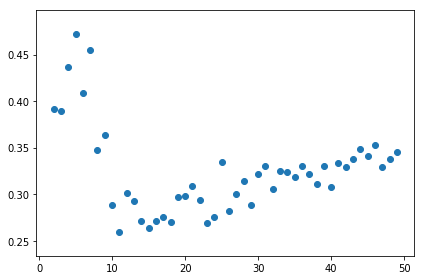

In [173]:
coherence_df = pd.DataFrame(coherence_by_topics, columns=['num_topics', 'coherence'])
plt.scatter(coherence_df['num_topics'], coherence_df['coherence'])
plt.tight_layout()

In [167]:
coherence_subset = coherence_df[coherence_df['coherence'] > 0.42]
coherence_subset

,num_topics,coherence
2,4,0.421770
3,5,0.429860
4,6,0.518619
5,7,0.493967
6,8,0.496341
7,9,0.479342
8,10,0.511930
9,11,0.559777
10,12,0.565243
11,13,0.537040


In [179]:
coherence_subset = coherence_df[(coherence_df['num_topics'] > 11) & (coherence_df['num_topics'] < 16)]

In [180]:
for index,row in coherence_subset.iterrows():
    print('num_topics:', row['num_topics'])
    curr_model = all_models[index]
    
    for i in range(curr_model.num_topics):
        print([dictionary[x[0]] for x in curr_model.get_topic_terms(i)])
        
    print()

num_topics: 12.0
['Fast', 'Godfrey', 'offline', 'Catholicism', 'on-reserve', 'counteract', 'phrased', 'proclivity', "church's", 'eloquent']
['gambling', 'China', 'spending', 'Irish', 'trade', 'cheque', 'rare-earths', 'education', 'Ontario', 'Trade']
['par', 'indicted', 'inefficiency', 'member-state', 'Quest', 'achievable', 'implicit', 'condoning', 'forgiving', 'besieged']
['lenders', 'Taxation', 'uninterrupted', 'updating', 'fast-growing', 'salutary', 'swift', 'Moscow', 'LLP', 'imminent']
['afar', 'waterfront', 'Scottish', 'studio', 'Boessenkool', 'licences', 'conspicuous', 'Kandahar', 'Lisi', 'Salmond']
['automated', 'resolution', 'frustrate', 'credit-card', 'feasible', 'well-funded', 'diaspora', 'Romney', 'overseen', 'Santorum']
['deposited', 'reserves', 'aboriginal', 'fencing', 'secondary', 'obliging', 'royal', 'mortgages', 'uninformed', 'snow']
['Elections', 'polling', 'ICC', 'station', 'students', 'student', 'all-party', 'similarity', 'freak', 'unanimous']
['Nunavut', 'Gingrich', 

## Perplexity

In [175]:
perplexity_by_topics = []
for lda in all_models:
    bound = lda.log_perplexity(corpus)
    perplexity = 2**(-bound)
    print(lda.num_topics, perplexity)
    perplexity_by_topics.append([lda.num_topics, perplexity])

2018-12-03 22:22:18,637 : INFO : -10.516 per-word bound, 1464.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


2 1464.2416126518667


2018-12-03 22:23:47,429 : INFO : -10.615 per-word bound, 1568.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


3 1567.9656970202961


2018-12-03 22:25:17,643 : INFO : -10.708 per-word bound, 1672.7 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


4 1672.7448807483288


2018-12-03 22:26:41,167 : INFO : -11.004 per-word bound, 2053.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


5 2053.755180461701


2018-12-03 22:28:03,624 : INFO : -11.240 per-word bound, 2419.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


6 2418.97953061685


2018-12-03 22:29:27,286 : INFO : -11.332 per-word bound, 2577.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


7 2577.793921198304


2018-12-03 22:30:50,423 : INFO : -11.577 per-word bound, 3055.4 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


8 3055.363554688795


2018-12-03 22:32:05,434 : INFO : -11.718 per-word bound, 3369.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


9 3369.7791034233906


2018-12-03 22:33:14,165 : INFO : -11.891 per-word bound, 3798.5 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


10 3798.512944201071


2018-12-03 22:34:22,235 : INFO : -12.290 per-word bound, 5008.5 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


11 5008.519919140374


2018-12-03 22:36:00,141 : INFO : -12.380 per-word bound, 5329.4 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


12 5329.384593424823


2018-12-03 22:37:19,815 : INFO : -12.558 per-word bound, 6029.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


13 6029.163741513407


2018-12-03 22:38:31,090 : INFO : -12.826 per-word bound, 7261.1 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


14 7261.10151313264


2018-12-03 22:39:40,696 : INFO : -12.894 per-word bound, 7610.1 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


15 7610.082916839383


2018-12-03 22:40:49,112 : INFO : -13.044 per-word bound, 8445.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


16 8445.185534985729


2018-12-03 22:41:56,252 : INFO : -13.113 per-word bound, 8859.9 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


17 8859.875062075844


2018-12-03 22:43:03,312 : INFO : -13.479 per-word bound, 11416.5 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


18 11416.51713591092


2018-12-03 22:44:11,481 : INFO : -13.399 per-word bound, 10801.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


19 10801.204386663108


2018-12-03 22:45:19,129 : INFO : -13.532 per-word bound, 11844.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


20 11844.185202934097


2018-12-03 22:46:26,731 : INFO : -13.695 per-word bound, 13257.6 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


21 13257.63353632158


2018-12-03 22:47:33,818 : INFO : -13.970 per-word bound, 16041.3 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


22 16041.297156277567


2018-12-03 22:48:42,957 : INFO : -14.045 per-word bound, 16897.5 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


23 16897.53499667162


2018-12-03 22:49:50,800 : INFO : -14.323 per-word bound, 20499.9 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


24 20499.92231877845


2018-12-03 22:50:59,241 : INFO : -14.327 per-word bound, 20555.7 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


25 20555.663925495628


2018-12-03 22:52:07,855 : INFO : -14.528 per-word bound, 23620.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


26 23620.840054558863


2018-12-03 22:53:17,390 : INFO : -14.772 per-word bound, 27984.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


27 27984.249191121056


2018-12-03 22:54:25,316 : INFO : -14.637 per-word bound, 25478.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


28 25478.017685168248


2018-12-03 22:55:33,804 : INFO : -14.806 per-word bound, 28655.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


29 28654.993351871537


2018-12-03 22:56:41,491 : INFO : -14.893 per-word bound, 30420.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


30 30419.997851086224


2018-12-03 22:57:51,529 : INFO : -15.194 per-word bound, 37471.5 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


31 37471.48121085875


2018-12-03 22:59:03,874 : INFO : -15.210 per-word bound, 37903.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


32 37903.17887775104


2018-12-03 23:00:12,446 : INFO : -15.145 per-word bound, 36227.2 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


33 36227.21457863772


2018-12-03 23:01:21,524 : INFO : -15.404 per-word bound, 43355.4 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


34 43355.35025885813


2018-12-03 23:02:30,626 : INFO : -15.884 per-word bound, 60458.4 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


35 60458.421995808734


2018-12-03 23:03:41,442 : INFO : -15.718 per-word bound, 53903.9 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


36 53903.949700920544


2018-12-03 23:04:50,017 : INFO : -15.786 per-word bound, 56517.1 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


37 56517.142506133954


2018-12-03 23:06:00,248 : INFO : -16.013 per-word bound, 66111.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


38 66110.98207833193


2018-12-03 23:07:11,046 : INFO : -15.887 per-word bound, 60605.7 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


39 60605.6624967178


2018-12-03 23:08:25,019 : INFO : -16.293 per-word bound, 80304.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


40 80304.81742334754


2018-12-03 23:09:35,905 : INFO : -16.065 per-word bound, 68558.3 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


41 68558.33468202749


2018-12-03 23:10:48,052 : INFO : -16.563 per-word bound, 96851.3 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


42 96851.2582200582


2018-12-03 23:11:59,231 : INFO : -16.347 per-word bound, 83380.7 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


43 83380.70691112799


2018-12-03 23:13:12,544 : INFO : -16.511 per-word bound, 93372.1 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


44 93372.14828103807


2018-12-03 23:14:24,287 : INFO : -16.597 per-word bound, 99155.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


45 99154.99795077504


2018-12-03 23:15:36,044 : INFO : -16.738 per-word bound, 109287.7 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


46 109287.69151274207


2018-12-03 23:16:47,595 : INFO : -16.922 per-word bound, 124156.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


47 124156.76263154566


2018-12-03 23:18:04,918 : INFO : -16.863 per-word bound, 119191.3 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


48 119191.28020563362


2018-12-03 23:19:17,910 : INFO : -16.912 per-word bound, 123354.0 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


49 123354.0416011468


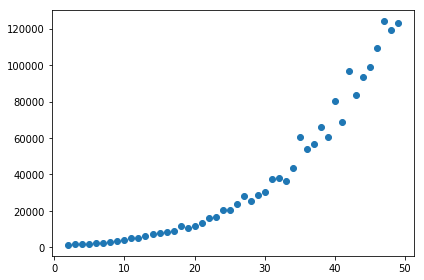

In [176]:
perplexity_df = pd.DataFrame(perplexity_by_topics, columns=['num_topics', 'perplexity'])
plt.scatter(perplexity_df['num_topics'], perplexity_df['perplexity'])
plt.tight_layout()

## Examining Topics

In [201]:
for index in range(45,49):
    curr_model = all_models[index]
    print('num_topics:', curr_model.num_topics)
    
    for i in range(curr_model.num_topics):
        print([dictionary[x[0]] for x in curr_model.get_topic_terms(i)])
        
    print()

num_topics: 47
['presidential', 'Mexico', 'primary', 'colleagues', 'accepted', 'generic', 'Iowa', 'raised', 'rivals', 'aging']
['firms', "week's", 'constitution', 'anniversary', 'headed', 'houses', 'membership', 'evident', 'perform', 'represented']
['Judge', 'partner', 'treated', 'brother', 'difficulty', 'Free', 'luxury', 'iPhone', 'vigorous', 'suspicion']
['growing', 'murder', 'RCMP', 'provide', 'warrant', 'commission', 'illegal', 'activities', 'tank', 'troubled']
['dozen', 'concept', 'same-sex', 'Ministry', 'courtroom', 'disagree', 'tunnel', 'champion', 'Duceppe', 'gesture']
['Syria', 'operations', 'regime', 'additional', 'Iraq', 'Salafis', 'deposited', 'military', 'present', 'Italy']
['Canadians', 'companies', 'war', 'case', 'French', 'services', 'process', 'court', 'aboriginal', 'debate']
['Russia', 'spring', 'Putin', 'generations', 'sectors', 'civilians', 'flow', 'sanctions', 'encouraged', 'Russian']
['Romney', 'Santorum', 'Gingrich', 'gay', 'Mitt', "Romney's", 'GOP', 'learning', 

['Wildrose', 'Alberta', 'corporate', "province's", 'Jim', 'ship', 'Lougheed', "Alberta's", 'remarkable', 'combination']
['Santorum', 'Republican', "Romney's", 'domestic', 'GOP', 'minutes', 'Republicans', 'phone', 'WikiLeaks', 'legislation']
['panel', 'sentencing', 'equalization', 'state-owned', 'river', 'corrections', 'tolerate', 'railway', 'River', 'rehabilitation']
['provincial', 'labour', 'costs', 'council', 'groups', 'clear', 'Americans', 'immigrants', 'Act', 'cuts']
['Art', 'Bangladesh', 'well-funded', 'Gay', 'blue-collar', 'chased', 'salsa', 'intricacies', 'Thein', 'Yunus']
['Iowa', 'bike', 'Quinn', "President's", 'Transportation', 'lanes', 'pedestrians', 'cyclists', 'calendar', 'defying']
['Mulcair', 'health-care', 'deficit', 'Thomas', 'books', 'candidate', 'judge', 'systems', 'English', 'Calgary']
['youth', 'Layton', 'Jack', 'homes', 'December', 'Shafia', 'sea', 'appeared', 'discuss', 'surprising']
['encourage', 'fun', 'Speaker', 'Ashton', 'shaming', 'lend', 'impunity', 'surpri

IndexError: list index out of range

In [184]:
for index in range(12,15):
    curr_model = all_models[index]
    print('num_topics:', curr_model.num_topics)
    
    for i in range(curr_model.num_topics):
        print([dictionary[x[0]] for x in curr_model.get_topic_terms(i)])
        
    print()

num_topics: 14
['transit', 'programs', 'child', 'Dr', 'conflict', 'Street', 'numbers', 'gun', 'subways', 'release']
['Columbia', 'meat', 'Pacific', 'councillors', 'fewer', 'mother', 'space', 'named', 'served', 'survey']
['Harper', 'political', 'countries', 'Quebec', 'Minister', 'Obama', 'foreign', 'trade', 'Chinese', 'part']
['products', 'spring', 'commission', "week's", 'residents', 'illegal', 'generations', 'Putin', 'bags', 'warrant']
['Wildrose', 'PQ', 'Japan', 'housing', 'house', 'speak', 'base', 'Marois', 'Christian', 'putting']
['funding', 'Catholic', 'courts', 'Court', 'judge', 'station', 'crimes', 'girls', 'church', 'judges']
['NDP', 'Liberals', 'oil', 'city', 'tax', 'budget', 'Mulcair', 'Conservatives', 'Ford', 'party']
['Romney', 'McGuinty', 'companies', 'community', 'marriage', 'Santorum', 'Gingrich', 'hockey', 'Republican', 'information']
['South', 'risks', 'fundamental', 'framework', 'Human', 'determine', 'dozen', 'sought', 'Federal', 'dramatic']
['chronic', 'develop', 'ad

## Distribution of Predictions

In [192]:
for index in range(20):
    lda = all_models[index]
    print('num_topics:', lda.num_topics)

    predictions = lda.get_document_topics(corpus)

    lda_topics = []

    for doc in predictions:
        lda_topics.append(max(doc, key=operator.itemgetter(1))[0])

    print(pd.DataFrame(lda_topics, columns=['blah'])['blah'].value_counts())
    print()

num_topics: 2
0    9388
1     951
Name: blah, dtype: int64

num_topics: 3
2    10297
0       42
Name: blah, dtype: int64

num_topics: 4
2    10338
3        1
Name: blah, dtype: int64

num_topics: 5
2    6721
4    3618
Name: blah, dtype: int64

num_topics: 6
3    10019
4      264
0       56
Name: blah, dtype: int64

num_topics: 7
4    7427
3    2765
6     147
Name: blah, dtype: int64

num_topics: 8
7    9625
0     711
1       2
4       1
Name: blah, dtype: int64

num_topics: 9
0    5576
4    4674
3      56
2      33
Name: blah, dtype: int64

num_topics: 10
2    10300
3       20
5       11
1        7
8        1
Name: blah, dtype: int64

num_topics: 11
1    5503
6    4506
5     288
2      14
0      12
8       7
4       4
3       4
7       1
Name: blah, dtype: int64

num_topics: 12
6    5991
4    4065
2     245
9      13
8      10
3       9
7       3
5       3
Name: blah, dtype: int64

num_topics: 13
2     8525
8     1450
6      222
3      112
11      12
9        7
4        6
0        5
Na

## Tuning parameters

In [64]:
len(tokenized_texts)/1000

10.339

In [65]:
len(tokenized_texts)/2000

5.1695

In [116]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [160]:
lda = models.ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=15, chunksize=100, eval_every=1, iterations=200, passes=2)

2018-12-03 12:13:25,498 : INFO : using symmetric alpha at 0.06666666666666667
2018-12-03 12:13:25,505 : INFO : using symmetric eta at 0.06666666666666667
2018-12-03 12:13:25,550 : INFO : using serial LDA version on this node
2018-12-03 12:13:25,665 : INFO : running online (multi-pass) LDA training, 15 topics, 2 passes over the supplied corpus of 10339 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 200x with a convergence threshold of 0.001000
2018-12-03 12:13:26,327 : INFO : -19.782 per-word bound, 901391.0 perplexity estimate based on a held-out corpus of 100 documents with 1272 words
2018-12-03 12:13:26,328 : INFO : PROGRESS: pass 0, at document #100/10339
2018-12-03 12:13:26,531 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:13:26,611 : INFO : topic #14 (0.067): 0.004*"vote" + 0.004*"Charlie" + 0.003*"Elections" + 0.003*"coal" + 0.003*"Hebdo" + 0.003*"Conservative" + 0.003*"Arab" + 0

2018-12-03 12:13:30,334 : INFO : PROGRESS: pass 0, at document #600/10339
2018-12-03 12:13:30,443 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:13:30,511 : INFO : topic #14 (0.067): 0.003*"system" + 0.002*"vote" + 0.002*"Baird" + 0.002*"Canadian" + 0.002*"media" + 0.002*"conservatives" + 0.002*"enemies" + 0.002*"electoral" + 0.002*"Canadians" + 0.002*"referendum"
2018-12-03 12:13:30,513 : INFO : topic #7 (0.067): 0.005*"Hudak" + 0.004*"Energy" + 0.003*"Big" + 0.003*"weakness" + 0.003*"grew" + 0.003*"Soudas" + 0.002*"fat" + 0.002*"reject" + 0.002*"conservative" + 0.002*"resource"
2018-12-03 12:13:30,516 : INFO : topic #9 (0.067): 0.006*"teachers" + 0.003*"he'd" + 0.002*"by-elections" + 0.002*"unions" + 0.002*"saved" + 0.002*"Board" + 0.002*"sick" + 0.002*"fundraising" + 0.002*"restraint" + 0.002*"offers"
2018-12-03 12:13:30,518 : INFO : topic #12 (0.067): 0.007*"Harper" + 0.004*"Liberals" + 0.004*"Trudeau" + 0.003*"party" + 0.003*"Mulcair" + 0

2018-12-03 12:13:33,949 : INFO : topic #13 (0.067): 0.004*"economists" + 0.004*"Personally" + 0.003*"attention" + 0.003*"Brexit" + 0.003*"financial" + 0.003*"crude" + 0.003*"year's" + 0.003*"professional" + 0.003*"post" + 0.003*"Kerry"
2018-12-03 12:13:33,952 : INFO : topic #4 (0.067): 0.012*"Ford" + 0.005*"mayor" + 0.004*"city" + 0.003*"subway" + 0.003*"Rob" + 0.003*"kindergarten" + 0.002*"writers" + 0.002*"memorial" + 0.002*"persistent" + 0.002*"reporter"
2018-12-03 12:13:33,957 : INFO : topic #3 (0.067): 0.004*"Senate" + 0.002*"pipeline" + 0.002*"school" + 0.002*"people" + 0.002*"Duffy" + 0.002*"Wright" + 0.002*"House" + 0.002*"law" + 0.002*"gun" + 0.002*"society"
2018-12-03 12:13:33,961 : INFO : topic diff=0.380585, rho=0.301511
2018-12-03 12:13:34,545 : INFO : -13.929 per-word bound, 15596.8 perplexity estimate based on a held-out corpus of 100 documents with 1240 words
2018-12-03 12:13:34,545 : INFO : PROGRESS: pass 0, at document #1200/10339
2018-12-03 12:13:34,625 : INFO : merg

2018-12-03 12:13:37,474 : INFO : topic diff=0.309889, rho=0.250000
2018-12-03 12:13:37,916 : INFO : -13.513 per-word bound, 11692.5 perplexity estimate based on a held-out corpus of 100 documents with 1203 words
2018-12-03 12:13:37,917 : INFO : PROGRESS: pass 0, at document #1700/10339
2018-12-03 12:13:37,990 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:13:38,059 : INFO : topic #0 (0.067): 0.004*"drivers" + 0.003*"aid" + 0.003*"wearing" + 0.003*"accepted" + 0.003*"popularity" + 0.003*"son" + 0.003*"enter" + 0.002*"Secretary" + 0.002*"rival" + 0.002*"oversight"
2018-12-03 12:13:38,061 : INFO : topic #14 (0.067): 0.002*"aboriginal" + 0.002*"indigenous" + 0.002*"nuclear" + 0.002*"Israel" + 0.002*"conservatives" + 0.002*"system" + 0.002*"market" + 0.002*"China" + 0.002*"million" + 0.002*"Justice"
2018-12-03 12:13:38,064 : INFO : topic #6 (0.067): 0.012*"Trump" + 0.006*"Clinton" + 0.004*"Trump's" + 0.003*"Donald" + 0.003*"population" + 0.003*"gro

2018-12-03 12:13:40,996 : INFO : topic #10 (0.067): 0.004*"gas" + 0.004*"hockey" + 0.004*"study" + 0.003*"McGuinty" + 0.003*"killed" + 0.003*"environment" + 0.003*"agreement" + 0.003*"funding" + 0.003*"provided" + 0.003*"finance"
2018-12-03 12:13:40,998 : INFO : topic #11 (0.067): 0.004*"wealth" + 0.004*"journalists" + 0.004*"cheap" + 0.004*"first-past-the-post" + 0.003*"likes" + 0.003*"Klein" + 0.003*"actors" + 0.003*"urgent" + 0.003*"ideological" + 0.003*"sounds"
2018-12-03 12:13:41,001 : INFO : topic #5 (0.067): 0.003*"Trudeau" + 0.002*"government" + 0.002*"oil" + 0.002*"Ontario" + 0.002*"NDP" + 0.002*"tax" + 0.002*"Conservatives" + 0.002*"budget" + 0.002*"Liberals" + 0.002*"Alberta"
2018-12-03 12:13:41,005 : INFO : topic #4 (0.067): 0.013*"Ford" + 0.005*"city" + 0.005*"mayor" + 0.003*"subway" + 0.003*"Rob" + 0.003*"Ford's" + 0.002*"Mayor" + 0.002*"Scarborough" + 0.002*"Castro" + 0.002*"breach"
2018-12-03 12:13:41,009 : INFO : topic diff=0.237779, rho=0.213201
2018-12-03 12:13:41,43

2018-12-03 12:13:43,951 : INFO : topic #1 (0.067): 0.007*"Keystone" + 0.006*"presidential" + 0.004*"Ebola" + 0.004*"abortion" + 0.004*"Politics" + 0.003*"primary" + 0.003*"XL" + 0.003*"aging" + 0.003*"successfully" + 0.003*"chances"
2018-12-03 12:13:43,957 : INFO : topic diff=0.205921, rho=0.192450
2018-12-03 12:13:44,396 : INFO : -13.434 per-word bound, 11064.1 perplexity estimate based on a held-out corpus of 100 documents with 1176 words
2018-12-03 12:13:44,397 : INFO : PROGRESS: pass 0, at document #2800/10339
2018-12-03 12:13:44,469 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:13:44,536 : INFO : topic #9 (0.067): 0.005*"fundraising" + 0.004*"pensions" + 0.004*"pricing" + 0.004*"Board" + 0.004*"Columbia" + 0.004*"hospital" + 0.003*"veterans" + 0.003*"health-care" + 0.003*"reducing" + 0.003*"milk"
2018-12-03 12:13:44,538 : INFO : topic #1 (0.067): 0.007*"Keystone" + 0.006*"presidential" + 0.004*"Ebola" + 0.003*"Politics" + 0.003*"abortion

2018-12-03 12:13:47,598 : INFO : topic #1 (0.067): 0.010*"Keystone" + 0.006*"presidential" + 0.005*"XL" + 0.004*"aging" + 0.003*"Mexico" + 0.003*"same-sex" + 0.003*"chamber" + 0.003*"concept" + 0.003*"insurance" + 0.003*"primary"
2018-12-03 12:13:47,600 : INFO : topic #13 (0.067): 0.010*"transit" + 0.004*"Brexit" + 0.004*"rebels" + 0.003*"horse" + 0.003*"attention" + 0.003*"recognized" + 0.003*"host" + 0.003*"year's" + 0.003*"dramatic" + 0.003*"financial"
2018-12-03 12:13:47,603 : INFO : topic #7 (0.067): 0.005*"Hudak" + 0.005*"Energy" + 0.004*"proposal" + 0.004*"capacity" + 0.004*"pension" + 0.004*"Gateway" + 0.004*"Saskatchewan" + 0.003*"sold" + 0.003*"resource" + 0.003*"Big"
2018-12-03 12:13:47,606 : INFO : topic #4 (0.067): 0.011*"Ford" + 0.007*"subway" + 0.004*"city" + 0.003*"mayor" + 0.003*"Scarborough" + 0.002*"monument" + 0.002*"retail" + 0.002*"command" + 0.002*"employ" + 0.002*"light-rail"
2018-12-03 12:13:47,610 : INFO : topic #9 (0.067): 0.004*"fundraising" + 0.004*"Columbi

2018-12-03 12:13:50,460 : INFO : topic #7 (0.067): 0.006*"Gateway" + 0.005*"Energy" + 0.005*"proposal" + 0.004*"pension" + 0.004*"resource" + 0.004*"Hudak" + 0.004*"capacity" + 0.003*"financial" + 0.003*"Saskatchewan" + 0.003*"options"
2018-12-03 12:13:50,464 : INFO : topic #13 (0.067): 0.006*"transit" + 0.004*"Dix" + 0.004*"crude" + 0.004*"attention" + 0.004*"year's" + 0.003*"dramatic" + 0.003*"extremism" + 0.003*"punishment" + 0.003*"economists" + 0.003*"professional"
2018-12-03 12:13:50,472 : INFO : topic diff=0.161843, rho=0.162221
2018-12-03 12:13:50,971 : INFO : -13.434 per-word bound, 11063.9 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 12:13:50,972 : INFO : PROGRESS: pass 0, at document #3900/10339
2018-12-03 12:13:51,029 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:13:51,094 : INFO : topic #0 (0.067): 0.005*"Iranian" + 0.004*"torture" + 0.004*"wearing" + 0.004*"aid" + 0.004*"drivers" + 0

2018-12-03 12:13:54,193 : INFO : PROGRESS: pass 0, at document #4400/10339
2018-12-03 12:13:54,304 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:13:54,419 : INFO : topic #14 (0.067): 0.004*"China" + 0.003*"French" + 0.003*"aboriginal" + 0.003*"Nations" + 0.003*"debt" + 0.003*"market" + 0.003*"nuclear" + 0.002*"EU" + 0.002*"referendum" + 0.002*"indigenous"
2018-12-03 12:13:54,424 : INFO : topic #11 (0.067): 0.006*"journalists" + 0.004*"Forces" + 0.004*"wealth" + 0.003*"cheap" + 0.003*"gross" + 0.003*"Nation" + 0.003*"spaces" + 0.003*"association" + 0.003*"ideological" + 0.003*"amendments"
2018-12-03 12:13:54,428 : INFO : topic #0 (0.067): 0.005*"aid" + 0.004*"torture" + 0.004*"Japan" + 0.004*"drivers" + 0.004*"treaty" + 0.004*"Iranian" + 0.004*"oversight" + 0.004*"governance" + 0.003*"Mali" + 0.003*"network"
2018-12-03 12:13:54,432 : INFO : topic #9 (0.067): 0.004*"Board" + 0.004*"hospital" + 0.004*"Columbia" + 0.003*"veterans" + 0.003*"offers

2018-12-03 12:14:00,415 : INFO : topic #1 (0.067): 0.005*"wait" + 0.005*"Politics" + 0.005*"Keystone" + 0.004*"presidential" + 0.004*"regulatory" + 0.003*"insurance" + 0.003*"Ebola" + 0.003*"presidency" + 0.003*"employers" + 0.003*"Mexico"
2018-12-03 12:14:00,419 : INFO : topic #14 (0.067): 0.004*"China" + 0.004*"Nations" + 0.004*"aboriginal" + 0.003*"nuclear" + 0.003*"market" + 0.003*"indigenous" + 0.003*"French" + 0.003*"Clark" + 0.003*"communities" + 0.002*"debt"
2018-12-03 12:14:00,422 : INFO : topic #5 (0.067): 0.002*"government" + 0.002*"federal" + 0.002*"Quebec" + 0.002*"Canadian" + 0.002*"Ontario" + 0.002*"Canada" + 0.002*"oil" + 0.002*"Liberals" + 0.002*"economic" + 0.002*"Alberta"
2018-12-03 12:14:00,427 : INFO : topic diff=0.136253, rho=0.142857
2018-12-03 12:14:01,013 : INFO : -13.382 per-word bound, 10678.8 perplexity estimate based on a held-out corpus of 100 documents with 1143 words
2018-12-03 12:14:01,014 : INFO : PROGRESS: pass 0, at document #5000/10339
2018-12-03 12

2018-12-03 12:14:03,420 : INFO : topic diff=0.114940, rho=0.136083
2018-12-03 12:14:03,799 : INFO : -13.425 per-word bound, 10996.6 perplexity estimate based on a held-out corpus of 100 documents with 1124 words
2018-12-03 12:14:03,799 : INFO : PROGRESS: pass 0, at document #5500/10339
2018-12-03 12:14:03,891 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:03,966 : INFO : topic #6 (0.067): 0.003*"Trump" + 0.003*"city" + 0.003*"water" + 0.003*"growing" + 0.003*"top" + 0.003*"suicide" + 0.003*"millions" + 0.003*"council" + 0.003*"numbers" + 0.003*"children"
2018-12-03 12:14:03,968 : INFO : topic #11 (0.067): 0.006*"wealth" + 0.005*"Nation" + 0.004*"journalists" + 0.004*"Nadon" + 0.003*"Forces" + 0.003*"Science" + 0.003*"ideological" + 0.003*"association" + 0.003*"flu" + 0.003*"urgent"
2018-12-03 12:14:03,972 : INFO : topic #13 (0.067): 0.006*"transit" + 0.006*"Dix" + 0.004*"attention" + 0.004*"develop" + 0.004*"year's" + 0.004*"host" + 0.003*"

2018-12-03 12:14:06,901 : INFO : topic #8 (0.067): 0.004*"sexual" + 0.004*"NATO" + 0.003*"child" + 0.003*"South" + 0.003*"reform" + 0.003*"relations" + 0.003*"systems" + 0.003*"authorities" + 0.003*"operations" + 0.003*"women"
2018-12-03 12:14:06,905 : INFO : topic #2 (0.067): 0.008*"Saudi" + 0.005*"Couillard" + 0.005*"limit" + 0.005*"Department" + 0.005*"surveillance" + 0.005*"Arabia" + 0.004*"MSF" + 0.003*"Philippe" + 0.003*"opinions" + 0.003*"reference"
2018-12-03 12:14:06,909 : INFO : topic #0 (0.067): 0.006*"torture" + 0.005*"aid" + 0.004*"oversight" + 0.004*"drivers" + 0.004*"Christmas" + 0.004*"governance" + 0.003*"carding" + 0.003*"priority" + 0.003*"Japan" + 0.003*"Iranian"
2018-12-03 12:14:06,912 : INFO : topic diff=0.107948, rho=0.129099
2018-12-03 12:14:07,289 : INFO : -13.265 per-word bound, 9843.1 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 12:14:07,290 : INFO : PROGRESS: pass 0, at document #6100/10339
2018-12-03 12:14:07,34

2018-12-03 12:14:09,626 : INFO : topic diff=0.099843, rho=0.124035
2018-12-03 12:14:10,060 : INFO : -13.244 per-word bound, 9700.6 perplexity estimate based on a held-out corpus of 100 documents with 1094 words
2018-12-03 12:14:10,061 : INFO : PROGRESS: pass 0, at document #6600/10339
2018-12-03 12:14:10,117 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:10,185 : INFO : topic #13 (0.067): 0.006*"transit" + 0.005*"Dix" + 0.004*"recognized" + 0.004*"host" + 0.004*"attention" + 0.003*"develop" + 0.003*"year's" + 0.003*"crude" + 0.003*"liberty" + 0.003*"punishment"
2018-12-03 12:14:10,188 : INFO : topic #9 (0.067): 0.006*"veterans" + 0.006*"hospital" + 0.004*"Board" + 0.004*"reducing" + 0.003*"feet" + 0.003*"square" + 0.003*"competition" + 0.003*"Robert" + 0.003*"offers" + 0.003*"doctor"
2018-12-03 12:14:10,192 : INFO : topic #14 (0.067): 0.004*"China" + 0.004*"aboriginal" + 0.003*"Justice" + 0.003*"Nations" + 0.003*"companies" + 0.003*"indigen

2018-12-03 12:14:14,945 : INFO : topic #3 (0.067): 0.003*"law" + 0.002*"police" + 0.002*"Court" + 0.002*"women" + 0.002*"court" + 0.002*"people" + 0.002*"Senate" + 0.002*"program" + 0.002*"Chinese" + 0.002*"Supreme"
2018-12-03 12:14:14,947 : INFO : topic #10 (0.067): 0.005*"agreement" + 0.004*"funding" + 0.004*"China's" + 0.004*"study" + 0.004*"hockey" + 0.004*"board" + 0.004*"killed" + 0.004*"Beijing" + 0.003*"technology" + 0.003*"specific"
2018-12-03 12:14:14,950 : INFO : topic #5 (0.067): 0.002*"government" + 0.002*"health" + 0.002*"Quebec" + 0.002*"B.C" + 0.002*"federal" + 0.002*"Canadian" + 0.002*"Canada" + 0.002*"care" + 0.002*"U.S" + 0.002*"year"
2018-12-03 12:14:14,952 : INFO : topic #7 (0.067): 0.005*"financial" + 0.005*"resource" + 0.005*"Saskatchewan" + 0.004*"proposal" + 0.004*"patient" + 0.004*"title" + 0.004*"capacity" + 0.003*"de" + 0.003*"legislative" + 0.003*"Olympic"
2018-12-03 12:14:14,958 : INFO : topic diff=0.096414, rho=0.118678
2018-12-03 12:14:15,426 : INFO : -1

2018-12-03 12:14:18,871 : INFO : topic #13 (0.067): 0.008*"transit" + 0.005*"chemical" + 0.004*"host" + 0.004*"recognized" + 0.004*"Dix" + 0.004*"year's" + 0.004*"professional" + 0.003*"crude" + 0.003*"attention" + 0.003*"develop"
2018-12-03 12:14:18,875 : INFO : topic diff=0.118869, rho=0.114708
2018-12-03 12:14:19,242 : INFO : -13.363 per-word bound, 10534.3 perplexity estimate based on a held-out corpus of 100 documents with 1017 words
2018-12-03 12:14:19,243 : INFO : PROGRESS: pass 0, at document #7700/10339
2018-12-03 12:14:19,290 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:19,361 : INFO : topic #10 (0.067): 0.007*"agreement" + 0.004*"funding" + 0.004*"board" + 0.004*"China's" + 0.004*"killed" + 0.004*"technology" + 0.004*"digital" + 0.003*"Beijing" + 0.003*"study" + 0.003*"hockey"
2018-12-03 12:14:19,364 : INFO : topic #13 (0.067): 0.009*"transit" + 0.005*"chemical" + 0.004*"host" + 0.004*"professional" + 0.004*"recognized" + 0.004

2018-12-03 12:14:22,785 : INFO : topic #0 (0.067): 0.008*"aid" + 0.007*"allegations" + 0.007*"Japan" + 0.004*"Development" + 0.004*"governance" + 0.004*"Christmas" + 0.004*"mining" + 0.003*"enter" + 0.003*"names" + 0.003*"Iranian"
2018-12-03 12:14:22,787 : INFO : topic #11 (0.067): 0.006*"journalists" + 0.004*"admitted" + 0.003*"association" + 0.003*"rice" + 0.003*"Nation" + 0.003*"wealth" + 0.003*"neighbourhoods" + 0.003*"sounds" + 0.003*"cheap" + 0.003*"ancient"
2018-12-03 12:14:22,791 : INFO : topic #6 (0.067): 0.007*"city" + 0.004*"council" + 0.003*"City" + 0.003*"suicide" + 0.003*"water" + 0.003*"Mayor" + 0.003*"Chief" + 0.002*"executive" + 0.002*"top" + 0.002*"building"
2018-12-03 12:14:22,794 : INFO : topic #8 (0.067): 0.006*"South" + 0.004*"sexual" + 0.004*"child" + 0.003*"authorities" + 0.003*"Africa" + 0.003*"present" + 0.003*"scandal" + 0.003*"reform" + 0.003*"accused" + 0.003*"Hall"
2018-12-03 12:14:22,798 : INFO : topic #9 (0.067): 0.005*"Brotherhood" + 0.005*"hospital" + 

2018-12-03 12:14:25,463 : INFO : topic #10 (0.067): 0.007*"McGuinty" + 0.005*"agreement" + 0.005*"board" + 0.004*"hockey" + 0.004*"study" + 0.004*"legislature" + 0.004*"China's" + 0.003*"funding" + 0.003*"killed" + 0.003*"couple"
2018-12-03 12:14:25,466 : INFO : topic #4 (0.067): 0.020*"Ford" + 0.006*"Ford's" + 0.004*"TTC" + 0.004*"writers" + 0.003*"acted" + 0.003*"retail" + 0.003*"Fords" + 0.003*"Metrolinx" + 0.003*"Councillor" + 0.002*"Lisi"
2018-12-03 12:14:25,469 : INFO : topic diff=0.092587, rho=0.107211
2018-12-03 12:14:25,874 : INFO : -13.244 per-word bound, 9704.1 perplexity estimate based on a held-out corpus of 100 documents with 1178 words
2018-12-03 12:14:25,875 : INFO : PROGRESS: pass 0, at document #8800/10339
2018-12-03 12:14:25,928 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:25,992 : INFO : topic #3 (0.067): 0.002*"Romney" + 0.002*"police" + 0.002*"women" + 0.002*"students" + 0.002*"Chinese" + 0.002*"education" + 0.002*"p

2018-12-03 12:14:28,530 : INFO : PROGRESS: pass 0, at document #9300/10339
2018-12-03 12:14:28,610 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:28,684 : INFO : topic #13 (0.067): 0.005*"transit" + 0.005*"state-owned" + 0.005*"host" + 0.004*"develop" + 0.004*"Dix" + 0.004*"attention" + 0.003*"professional" + 0.003*"year's" + 0.003*"dramatic" + 0.003*"giant"
2018-12-03 12:14:28,687 : INFO : topic #4 (0.067): 0.014*"Ford" + 0.004*"Ford's" + 0.003*"retail" + 0.003*"writers" + 0.003*"Scarborough" + 0.003*"cheaper" + 0.002*"acted" + 0.002*"TTC" + 0.002*"Stintz" + 0.002*"subway"
2018-12-03 12:14:28,691 : INFO : topic #3 (0.067): 0.002*"women" + 0.002*"students" + 0.002*"Romney" + 0.002*"police" + 0.002*"education" + 0.002*"report" + 0.002*"school" + 0.002*"law" + 0.002*"people" + 0.002*"Chinese"
2018-12-03 12:14:28,694 : INFO : topic #5 (0.067): 0.002*"health" + 0.002*"Quebec" + 0.002*"Canadian" + 0.002*"Canada" + 0.002*"government" + 0.002*"B.C

2018-12-03 12:14:31,812 : INFO : topic #5 (0.067): 0.002*"Quebec" + 0.002*"government" + 0.002*"Canadian" + 0.002*"Canada" + 0.002*"health" + 0.002*"Liberals" + 0.002*"Alberta" + 0.002*"oil" + 0.002*"B.C" + 0.002*"economic"
2018-12-03 12:14:31,814 : INFO : topic #7 (0.067): 0.006*"financial" + 0.005*"resource" + 0.005*"Olympic" + 0.004*"Hudak" + 0.004*"English" + 0.004*"proposal" + 0.004*"Pacific" + 0.004*"Gateway" + 0.004*"capacity" + 0.003*"weak"
2018-12-03 12:14:31,817 : INFO : topic #3 (0.067): 0.003*"students" + 0.002*"women" + 0.002*"police" + 0.002*"education" + 0.002*"Romney" + 0.002*"people" + 0.002*"report" + 0.002*"law" + 0.002*"school" + 0.002*"program"
2018-12-03 12:14:31,821 : INFO : topic diff=0.082010, rho=0.101015
2018-12-03 12:14:32,222 : INFO : -13.188 per-word bound, 9329.9 perplexity estimate based on a held-out corpus of 100 documents with 1134 words
2018-12-03 12:14:32,223 : INFO : PROGRESS: pass 0, at document #9900/10339
2018-12-03 12:14:32,284 : INFO : merging

2018-12-03 12:14:34,781 : INFO : topic diff=0.078361, rho=0.098533
2018-12-03 12:14:34,973 : INFO : -13.222 per-word bound, 9554.5 perplexity estimate based on a held-out corpus of 39 documents with 437 words
2018-12-03 12:14:34,974 : INFO : PROGRESS: pass 0, at document #10339/10339
2018-12-03 12:14:34,999 : INFO : merging changes from 39 documents into a model of 10339 documents
2018-12-03 12:14:35,064 : INFO : topic #2 (0.067): 0.008*"Rae" + 0.005*"Department" + 0.005*"limit" + 0.003*"Legislature" + 0.003*"reference" + 0.002*"Saudi" + 0.002*"plays" + 0.002*"jump" + 0.002*"participants" + 0.002*"Netherlands"
2018-12-03 12:14:35,066 : INFO : topic #5 (0.067): 0.003*"B.C" + 0.003*"government" + 0.003*"NDP" + 0.002*"Quebec" + 0.002*"party" + 0.002*"Canada" + 0.002*"Canadian" + 0.002*"Ontario" + 0.002*"Liberals" + 0.002*"oil"
2018-12-03 12:14:35,069 : INFO : topic #13 (0.067): 0.010*"transit" + 0.005*"subways" + 0.005*"Dix" + 0.005*"Broadbent" + 0.004*"host" + 0.004*"develop" + 0.004*"pr

2018-12-03 12:14:38,103 : INFO : topic #10 (0.067): 0.005*"McGuinty" + 0.004*"study" + 0.004*"funding" + 0.004*"Catholic" + 0.004*"hockey" + 0.004*"environment" + 0.003*"killed" + 0.003*"Smith" + 0.003*"board" + 0.003*"technology"
2018-12-03 12:14:38,106 : INFO : topic #12 (0.067): 0.006*"Mulcair" + 0.003*"ministers" + 0.003*"military" + 0.003*"Islamic" + 0.003*"country's" + 0.003*"Quebeckers" + 0.003*"Iraq" + 0.003*"sands" + 0.003*"Syria" + 0.003*"war"
2018-12-03 12:14:38,113 : INFO : topic #8 (0.067): 0.004*"sexual" + 0.004*"child" + 0.003*"universities" + 0.003*"scandal" + 0.003*"reform" + 0.003*"South" + 0.003*"accused" + 0.003*"crimes" + 0.003*"Prof" + 0.003*"male"
2018-12-03 12:14:38,118 : INFO : topic #2 (0.067): 0.006*"Rae" + 0.005*"Department" + 0.004*"limit" + 0.003*"Saudi" + 0.003*"hostile" + 0.003*"favourable" + 0.003*"Saudis" + 0.003*"gallery" + 0.002*"opinions" + 0.002*"plays"
2018-12-03 12:14:38,122 : INFO : topic diff=0.074364, rho=0.097409
2018-12-03 12:14:38,551 : INF

2018-12-03 12:14:40,945 : INFO : topic #6 (0.067): 0.014*"Trump" + 0.005*"Clinton" + 0.005*"city" + 0.003*"Trump's" + 0.003*"top" + 0.003*"labour" + 0.003*"numbers" + 0.003*"Republicans" + 0.003*"growing" + 0.003*"Hillary"
2018-12-03 12:14:40,949 : INFO : topic diff=0.067805, rho=0.097409
2018-12-03 12:14:41,375 : INFO : -12.769 per-word bound, 6980.4 perplexity estimate based on a held-out corpus of 100 documents with 1211 words
2018-12-03 12:14:41,376 : INFO : PROGRESS: pass 1, at document #1100/10339
2018-12-03 12:14:41,431 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:41,495 : INFO : topic #0 (0.067): 0.004*"son" + 0.004*"aid" + 0.004*"wearing" + 0.004*"allegations" + 0.003*"accepted" + 0.003*"drivers" + 0.003*"priority" + 0.003*"network" + 0.003*"governance" + 0.003*"popularity"
2018-12-03 12:14:41,497 : INFO : topic #2 (0.067): 0.006*"Rae" + 0.005*"limit" + 0.005*"Department" + 0.004*"Saudi" + 0.003*"hostile" + 0.003*"Arabia" + 0.003

2018-12-03 12:14:44,344 : INFO : topic #12 (0.067): 0.005*"Mulcair" + 0.005*"refugees" + 0.004*"Islamic" + 0.004*"Syria" + 0.004*"military" + 0.003*"ministers" + 0.003*"Iraq" + 0.003*"Syrian" + 0.003*"refugee" + 0.003*"war"
2018-12-03 12:14:44,346 : INFO : topic #10 (0.067): 0.004*"study" + 0.004*"environment" + 0.004*"gas" + 0.003*"Catholic" + 0.003*"McGuinty" + 0.003*"funding" + 0.003*"greenhouse" + 0.003*"agreement" + 0.003*"technology" + 0.003*"killed"
2018-12-03 12:14:44,349 : INFO : topic #14 (0.067): 0.003*"children" + 0.003*"China" + 0.003*"aboriginal" + 0.003*"French" + 0.003*"Muslims" + 0.003*"debt" + 0.003*"deficit" + 0.002*"market" + 0.002*"fiscal" + 0.002*"million"
2018-12-03 12:14:44,351 : INFO : topic #6 (0.067): 0.015*"Trump" + 0.006*"Clinton" + 0.005*"Trump's" + 0.004*"city" + 0.003*"top" + 0.003*"labour" + 0.003*"Hillary" + 0.003*"numbers" + 0.003*"growing" + 0.003*"population"
2018-12-03 12:14:44,354 : INFO : topic #0 (0.067): 0.005*"aid" + 0.004*"son" + 0.004*"weari

2018-12-03 12:14:47,103 : INFO : topic #12 (0.067): 0.006*"refugees" + 0.006*"Islamic" + 0.005*"Mulcair" + 0.004*"military" + 0.004*"Iraq" + 0.004*"Syria" + 0.004*"ministers" + 0.003*"State" + 0.003*"war" + 0.003*"Syrian"
2018-12-03 12:14:47,107 : INFO : topic #11 (0.067): 0.004*"journalists" + 0.004*"wealth" + 0.004*"ideological" + 0.004*"cheap" + 0.004*"first-past-the-post" + 0.004*"likes" + 0.003*"Klein" + 0.003*"sounds" + 0.003*"Electoral" + 0.003*"admitted"
2018-12-03 12:14:47,111 : INFO : topic diff=0.061532, rho=0.097409
2018-12-03 12:14:47,532 : INFO : -12.879 per-word bound, 7534.4 perplexity estimate based on a held-out corpus of 100 documents with 1168 words
2018-12-03 12:14:47,533 : INFO : PROGRESS: pass 1, at document #2200/10339
2018-12-03 12:14:47,584 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:47,652 : INFO : topic #6 (0.067): 0.015*"Trump" + 0.006*"Clinton" + 0.005*"Trump's" + 0.004*"city" + 0.003*"top" + 0.003*"numbers"

2018-12-03 12:14:50,303 : INFO : PROGRESS: pass 1, at document #2700/10339
2018-12-03 12:14:50,363 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:50,434 : INFO : topic #5 (0.067): 0.003*"Trudeau" + 0.003*"Harper" + 0.003*"Conservatives" + 0.003*"government" + 0.003*"NDP" + 0.003*"oil" + 0.003*"Liberals" + 0.002*"party" + 0.002*"Canada" + 0.002*"election"
2018-12-03 12:14:50,436 : INFO : topic #4 (0.067): 0.014*"Ford" + 0.005*"subway" + 0.003*"Scarborough" + 0.003*"Ford's" + 0.002*"cheaper" + 0.002*"cameras" + 0.002*"mockery" + 0.002*"Put" + 0.002*"Stintz" + 0.002*"ambition"
2018-12-03 12:14:50,438 : INFO : topic #9 (0.067): 0.004*"fundraising" + 0.004*"Columbia" + 0.004*"veterans" + 0.004*"reducing" + 0.003*"Board" + 0.003*"hospital" + 0.003*"minutes" + 0.003*"health-care" + 0.003*"Pakistan" + 0.003*"milk"
2018-12-03 12:14:50,441 : INFO : topic #8 (0.067): 0.005*"reform" + 0.005*"sexual" + 0.003*"defence" + 0.003*"relations" + 0.003*"scanda

2018-12-03 12:14:53,159 : INFO : topic #3 (0.067): 0.003*"women" + 0.002*"Senate" + 0.002*"law" + 0.002*"people" + 0.002*"police" + 0.002*"Ottawa" + 0.002*"men" + 0.002*"life" + 0.002*"report" + 0.002*"Parliament"
2018-12-03 12:14:53,162 : INFO : topic #6 (0.067): 0.011*"Trump" + 0.006*"Clinton" + 0.004*"city" + 0.003*"top" + 0.003*"labour" + 0.003*"Trump's" + 0.003*"growing" + 0.003*"population" + 0.003*"numbers" + 0.002*"millions"
2018-12-03 12:14:53,165 : INFO : topic #2 (0.067): 0.008*"Saudi" + 0.005*"limit" + 0.005*"Arabia" + 0.004*"Department" + 0.004*"surveillance" + 0.003*"plays" + 0.003*"funny" + 0.003*"Couillard" + 0.003*"opinions" + 0.003*"outright"
2018-12-03 12:14:53,168 : INFO : topic diff=0.060563, rho=0.097409
2018-12-03 12:14:53,568 : INFO : -12.862 per-word bound, 7445.1 perplexity estimate based on a held-out corpus of 100 documents with 1156 words
2018-12-03 12:14:53,569 : INFO : PROGRESS: pass 1, at document #3300/10339
2018-12-03 12:14:53,630 : INFO : merging chan

2018-12-03 12:14:55,867 : INFO : topic diff=0.059753, rho=0.097409
2018-12-03 12:14:56,281 : INFO : -12.959 per-word bound, 7961.1 perplexity estimate based on a held-out corpus of 100 documents with 1174 words
2018-12-03 12:14:56,283 : INFO : PROGRESS: pass 1, at document #3800/10339
2018-12-03 12:14:56,463 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:14:56,554 : INFO : topic #14 (0.067): 0.004*"China" + 0.003*"aboriginal" + 0.003*"Nations" + 0.003*"market" + 0.003*"Israel" + 0.003*"Justice" + 0.002*"French" + 0.002*"companies" + 0.002*"children" + 0.002*"debt"
2018-12-03 12:14:56,556 : INFO : topic #12 (0.067): 0.005*"military" + 0.005*"refugees" + 0.005*"Iraq" + 0.005*"Syria" + 0.004*"Islamic" + 0.004*"Iran" + 0.004*"war" + 0.004*"Mulcair" + 0.004*"State" + 0.003*"Syrian"
2018-12-03 12:14:56,559 : INFO : topic #6 (0.067): 0.010*"Trump" + 0.005*"Clinton" + 0.004*"city" + 0.003*"top" + 0.003*"suicide" + 0.003*"growing" + 0.003*"Trump's" + 0

2018-12-03 12:14:59,213 : INFO : topic #9 (0.067): 0.004*"Columbia" + 0.004*"Board" + 0.003*"hospital" + 0.003*"reducing" + 0.003*"veterans" + 0.003*"offers" + 0.003*"competition" + 0.003*"Robert" + 0.003*"attention" + 0.003*"arrested"
2018-12-03 12:14:59,216 : INFO : topic #6 (0.067): 0.008*"Trump" + 0.004*"city" + 0.004*"Clinton" + 0.003*"suicide" + 0.003*"top" + 0.003*"labour" + 0.003*"population" + 0.003*"growing" + 0.003*"numbers" + 0.003*"millions"
2018-12-03 12:14:59,218 : INFO : topic #14 (0.067): 0.004*"China" + 0.004*"aboriginal" + 0.003*"French" + 0.003*"Nations" + 0.003*"nuclear" + 0.003*"market" + 0.003*"children" + 0.003*"Justice" + 0.002*"debt" + 0.002*"million"
2018-12-03 12:14:59,221 : INFO : topic #1 (0.067): 0.006*"Keystone" + 0.005*"Politics" + 0.005*"presidential" + 0.004*"employers" + 0.004*"Mexico" + 0.004*"regulatory" + 0.004*"primary" + 0.003*"XL" + 0.003*"aging" + 0.003*"wages"
2018-12-03 12:14:59,224 : INFO : topic diff=0.057451, rho=0.097409
2018-12-03 12:14

2018-12-03 12:15:01,837 : INFO : topic #5 (0.067): 0.003*"Quebec" + 0.003*"government" + 0.003*"Canadian" + 0.002*"federal" + 0.002*"Canada" + 0.002*"party" + 0.002*"oil" + 0.002*"Liberals" + 0.002*"Trudeau" + 0.002*"election"
2018-12-03 12:15:01,841 : INFO : topic diff=0.057203, rho=0.097409
2018-12-03 12:15:02,229 : INFO : -13.256 per-word bound, 9783.4 perplexity estimate based on a held-out corpus of 100 documents with 1110 words
2018-12-03 12:15:02,230 : INFO : PROGRESS: pass 1, at document #4900/10339
2018-12-03 12:15:02,305 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:02,381 : INFO : topic #14 (0.067): 0.004*"China" + 0.004*"aboriginal" + 0.004*"Nations" + 0.003*"children" + 0.003*"market" + 0.003*"nuclear" + 0.003*"French" + 0.003*"indigenous" + 0.003*"Clark" + 0.003*"communities"
2018-12-03 12:15:02,385 : INFO : topic #10 (0.067): 0.005*"agreement" + 0.004*"study" + 0.004*"China's" + 0.003*"Catholic" + 0.003*"killed" + 0.003*"fun

2018-12-03 12:15:05,418 : INFO : topic #6 (0.067): 0.005*"Trump" + 0.005*"city" + 0.003*"growing" + 0.003*"top" + 0.003*"water" + 0.003*"millions" + 0.003*"numbers" + 0.003*"suicide" + 0.002*"Clinton" + 0.002*"search"
2018-12-03 12:15:05,420 : INFO : topic #1 (0.067): 0.006*"Keystone" + 0.005*"Politics" + 0.004*"wait" + 0.004*"presidential" + 0.004*"health-care" + 0.004*"insurance" + 0.003*"Mexico" + 0.003*"primary" + 0.003*"aging" + 0.003*"employers"
2018-12-03 12:15:05,423 : INFO : topic #0 (0.067): 0.006*"aid" + 0.004*"Iranian" + 0.004*"Mali" + 0.004*"governance" + 0.004*"Japan" + 0.003*"oversight" + 0.003*"wearing" + 0.003*"treaty" + 0.003*"torture" + 0.003*"priority"
2018-12-03 12:15:05,425 : INFO : topic #5 (0.067): 0.003*"government" + 0.003*"Quebec" + 0.003*"Canadian" + 0.002*"federal" + 0.002*"Canada" + 0.002*"party" + 0.002*"Liberals" + 0.002*"U.S" + 0.002*"election" + 0.002*"countries"
2018-12-03 12:15:05,428 : INFO : topic #4 (0.067): 0.009*"Ford" + 0.005*"subway" + 0.004*"

2018-12-03 12:15:08,436 : INFO : topic #5 (0.067): 0.003*"Quebec" + 0.003*"government" + 0.003*"Canadian" + 0.002*"Canada" + 0.002*"federal" + 0.002*"U.S" + 0.002*"party" + 0.002*"countries" + 0.002*"Liberals" + 0.002*"health"
2018-12-03 12:15:08,439 : INFO : topic #8 (0.067): 0.004*"sexual" + 0.004*"reform" + 0.004*"NATO" + 0.004*"child" + 0.004*"South" + 0.003*"relations" + 0.003*"authorities" + 0.003*"systems" + 0.003*"present" + 0.003*"scandal"
2018-12-03 12:15:08,443 : INFO : topic diff=0.059566, rho=0.097409
2018-12-03 12:15:08,877 : INFO : -12.952 per-word bound, 7923.9 perplexity estimate based on a held-out corpus of 100 documents with 1131 words
2018-12-03 12:15:08,878 : INFO : PROGRESS: pass 1, at document #6000/10339
2018-12-03 12:15:08,928 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:09,001 : INFO : topic #6 (0.067): 0.004*"city" + 0.004*"Trump" + 0.004*"suicide" + 0.003*"growing" + 0.003*"millions" + 0.003*"top" + 0.003*"nat

2018-12-03 12:15:13,131 : INFO : PROGRESS: pass 1, at document #6500/10339
2018-12-03 12:15:13,184 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:13,262 : INFO : topic #2 (0.067): 0.007*"Saudi" + 0.005*"limit" + 0.005*"Department" + 0.005*"surveillance" + 0.004*"Couillard" + 0.004*"Arabia" + 0.004*"MSF" + 0.003*"Philippe" + 0.003*"opinions" + 0.002*"hostile"
2018-12-03 12:15:13,265 : INFO : topic #4 (0.067): 0.004*"Ford" + 0.003*"premium" + 0.003*"la" + 0.003*"subway" + 0.003*"cameras" + 0.003*"writers" + 0.002*"acted" + 0.002*"command" + 0.002*"cheaper" + 0.002*"breach"
2018-12-03 12:15:13,269 : INFO : topic #3 (0.067): 0.003*"law" + 0.002*"women" + 0.002*"police" + 0.002*"Court" + 0.002*"rights" + 0.002*"people" + 0.002*"court" + 0.002*"Supreme" + 0.002*"Ottawa" + 0.002*"Senate"
2018-12-03 12:15:13,274 : INFO : topic #14 (0.067): 0.004*"China" + 0.004*"aboriginal" + 0.003*"Nations" + 0.003*"children" + 0.003*"companies" + 0.003*"Justice" 

2018-12-03 12:15:16,754 : INFO : topic #14 (0.067): 0.005*"aboriginal" + 0.005*"China" + 0.003*"children" + 0.003*"Nations" + 0.003*"companies" + 0.003*"infrastructure" + 0.003*"communities" + 0.003*"Justice" + 0.003*"market" + 0.002*"nuclear"
2018-12-03 12:15:16,758 : INFO : topic #8 (0.067): 0.005*"South" + 0.005*"child" + 0.004*"reform" + 0.003*"African" + 0.003*"sexual" + 0.003*"authorities" + 0.003*"systems" + 0.003*"present" + 0.003*"Africa" + 0.003*"crimes"
2018-12-03 12:15:16,767 : INFO : topic #0 (0.067): 0.007*"aid" + 0.005*"Japan" + 0.004*"oversight" + 0.004*"governance" + 0.004*"Christmas" + 0.003*"priority" + 0.003*"drivers" + 0.003*"Iranian" + 0.003*"wearing" + 0.003*"Columbia"
2018-12-03 12:15:16,773 : INFO : topic diff=0.062984, rho=0.097409
2018-12-03 12:15:17,688 : INFO : -13.182 per-word bound, 9296.5 perplexity estimate based on a held-out corpus of 100 documents with 1063 words
2018-12-03 12:15:17,690 : INFO : PROGRESS: pass 1, at document #7100/10339
2018-12-03 12

2018-12-03 12:15:21,234 : INFO : topic diff=0.058888, rho=0.097409
2018-12-03 12:15:21,626 : INFO : -13.751 per-word bound, 13784.9 perplexity estimate based on a held-out corpus of 100 documents with 1077 words
2018-12-03 12:15:21,627 : INFO : PROGRESS: pass 1, at document #7600/10339
2018-12-03 12:15:21,679 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:21,744 : INFO : topic #5 (0.067): 0.003*"government" + 0.002*"Quebec" + 0.002*"Canadian" + 0.002*"B.C" + 0.002*"Canada" + 0.002*"federal" + 0.002*"health" + 0.002*"U.S" + 0.002*"year" + 0.002*"election"
2018-12-03 12:15:21,746 : INFO : topic #1 (0.067): 0.006*"Ebola" + 0.005*"presidential" + 0.004*"Mexico" + 0.004*"Trade" + 0.003*"GDP" + 0.003*"band" + 0.003*"regulatory" + 0.003*"wait" + 0.003*"insurance" + 0.003*"presidency"
2018-12-03 12:15:21,749 : INFO : topic #7 (0.067): 0.005*"Saskatchewan" + 0.005*"financial" + 0.004*"patient" + 0.004*"proposal" + 0.004*"capacity" + 0.004*"Olympic" 

2018-12-03 12:15:24,708 : INFO : topic #13 (0.067): 0.007*"transit" + 0.005*"host" + 0.004*"attention" + 0.004*"chemical" + 0.004*"professional" + 0.003*"recognized" + 0.003*"year's" + 0.003*"Dix" + 0.003*"develop" + 0.003*"delay"
2018-12-03 12:15:24,711 : INFO : topic #1 (0.067): 0.005*"presidential" + 0.005*"Mexico" + 0.004*"Ebola" + 0.004*"Trade" + 0.003*"multiple" + 0.003*"wait" + 0.003*"regulatory" + 0.003*"band" + 0.003*"aging" + 0.003*"segregation"
2018-12-03 12:15:24,718 : INFO : topic #4 (0.067): 0.020*"Ford" + 0.005*"Ford's" + 0.004*"Lisi" + 0.004*"writers" + 0.003*"cocaine" + 0.003*"cameras" + 0.003*"subway" + 0.003*"Fords" + 0.003*"acted" + 0.002*"la"
2018-12-03 12:15:24,723 : INFO : topic #11 (0.067): 0.006*"journalists" + 0.004*"Nation" + 0.004*"association" + 0.003*"rice" + 0.003*"admitted" + 0.003*"neighbourhoods" + 0.003*"wealth" + 0.003*"sounds" + 0.003*"Forces" + 0.003*"cheap"
2018-12-03 12:15:24,731 : INFO : topic diff=0.065948, rho=0.097409
2018-12-03 12:15:25,847 

2018-12-03 12:15:29,430 : INFO : topic #7 (0.067): 0.006*"financial" + 0.005*"Pacific" + 0.004*"inquiry" + 0.004*"resource" + 0.004*"hearing" + 0.004*"firms" + 0.004*"proposal" + 0.004*"Carney" + 0.003*"Green" + 0.003*"de"
2018-12-03 12:15:29,434 : INFO : topic diff=0.067484, rho=0.097409
2018-12-03 12:15:29,823 : INFO : -13.109 per-word bound, 8834.5 perplexity estimate based on a held-out corpus of 100 documents with 1158 words
2018-12-03 12:15:29,824 : INFO : PROGRESS: pass 1, at document #8700/10339
2018-12-03 12:15:29,884 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:29,949 : INFO : topic #11 (0.067): 0.004*"beef" + 0.004*"wealth" + 0.004*"journalists" + 0.003*"sounds" + 0.003*"admitted" + 0.003*"neighbourhoods" + 0.003*"cheap" + 0.003*"association" + 0.003*"Authority" + 0.003*"ideological"
2018-12-03 12:15:29,951 : INFO : topic #13 (0.067): 0.006*"transit" + 0.006*"state-owned" + 0.005*"host" + 0.005*"Dix" + 0.004*"attention" + 0.004

2018-12-03 12:15:33,050 : INFO : topic #6 (0.067): 0.007*"city" + 0.003*"Republicans" + 0.003*"top" + 0.003*"labour" + 0.003*"City" + 0.002*"council" + 0.002*"growing" + 0.002*"building" + 0.002*"water" + 0.002*"Obama's"
2018-12-03 12:15:33,053 : INFO : topic #1 (0.067): 0.010*"Charest" + 0.006*"health-care" + 0.006*"presidential" + 0.006*"Mexico" + 0.005*"takeover" + 0.004*"insurance" + 0.004*"regulatory" + 0.004*"Trade" + 0.004*"coverage" + 0.003*"wait"
2018-12-03 12:15:33,057 : INFO : topic #3 (0.067): 0.003*"women" + 0.002*"Romney" + 0.002*"police" + 0.002*"students" + 0.002*"report" + 0.002*"education" + 0.002*"people" + 0.002*"Chinese" + 0.002*"law" + 0.002*"program"
2018-12-03 12:15:33,061 : INFO : topic #2 (0.067): 0.006*"limit" + 0.004*"Department" + 0.004*"hostile" + 0.004*"Saudi" + 0.003*"plays" + 0.003*"funny" + 0.003*"reference" + 0.002*"participants" + 0.002*"Arabia" + 0.002*"surveillance"
2018-12-03 12:15:33,065 : INFO : topic #8 (0.067): 0.004*"South" + 0.004*"universit

2018-12-03 12:15:36,735 : INFO : topic #10 (0.067): 0.006*"McGuinty" + 0.006*"hockey" + 0.005*"study" + 0.005*"board" + 0.004*"funding" + 0.004*"agreement" + 0.004*"Smith" + 0.004*"environment" + 0.004*"killed" + 0.003*"Dalton"
2018-12-03 12:15:36,739 : INFO : topic #5 (0.067): 0.003*"Quebec" + 0.002*"government" + 0.002*"Canadian" + 0.002*"Canada" + 0.002*"health" + 0.002*"Liberals" + 0.002*"B.C" + 0.002*"oil" + 0.002*"party" + 0.002*"economic"
2018-12-03 12:15:36,746 : INFO : topic diff=0.065065, rho=0.097409
2018-12-03 12:15:37,234 : INFO : -13.145 per-word bound, 9056.6 perplexity estimate based on a held-out corpus of 100 documents with 1136 words
2018-12-03 12:15:37,236 : INFO : PROGRESS: pass 1, at document #9800/10339
2018-12-03 12:15:37,358 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:37,441 : INFO : topic #10 (0.067): 0.007*"McGuinty" + 0.006*"hockey" + 0.005*"Smith" + 0.005*"study" + 0.004*"board" + 0.004*"funding" + 0.004*"agr

2018-12-03 12:15:40,900 : INFO : PROGRESS: pass 1, at document #10300/10339
2018-12-03 12:15:40,953 : INFO : merging changes from 100 documents into a model of 10339 documents
2018-12-03 12:15:41,034 : INFO : topic #1 (0.067): 0.007*"Charest" + 0.007*"presidential" + 0.007*"Mexico" + 0.005*"health-care" + 0.005*"aging" + 0.004*"primary" + 0.004*"GDP" + 0.004*"Keystone" + 0.004*"insurance" + 0.003*"wait"
2018-12-03 12:15:41,036 : INFO : topic #2 (0.067): 0.007*"Rae" + 0.004*"Department" + 0.004*"limit" + 0.003*"Saudi" + 0.003*"reference" + 0.002*"Legislature" + 0.002*"participants" + 0.002*"favourable" + 0.002*"plays" + 0.002*"gallery"
2018-12-03 12:15:41,041 : INFO : topic #12 (0.067): 0.004*"Mulcair" + 0.004*"sands" + 0.004*"Iran" + 0.003*"country's" + 0.003*"military" + 0.003*"PQ" + 0.003*"Paul" + 0.003*"Quebeckers" + 0.003*"ground" + 0.002*"books"
2018-12-03 12:15:41,044 : INFO : topic #0 (0.067): 0.007*"aid" + 0.005*"mining" + 0.005*"son" + 0.004*"priority" + 0.004*"Japan" + 0.003*

In [161]:
for i in range(15):
    print(i, ':', [dictionary[x[0]] for x in lda.get_topic_terms(i)])

0 : ['aid', 'Japan', 'son', 'mining', 'Development', 'governance', 'priority', 'al-Assad', 'Special', 'Columbia']
1 : ['presidential', 'Charest', 'Mexico', 'health-care', 'primary', 'aging', 'Trade', 'GDP', 'Keystone', 'insurance']
2 : ['Rae', 'Department', 'limit', 'Legislature', 'reference', 'Saudi', 'plays', 'jump', 'participants', 'hostile']
3 : ['Romney', 'students', 'women', 'education', 'police', 'people', 'report', 'law', 'leadership', 'teachers']
4 : ['Ford', 'subway', 'TTC', 'Sheppard', 'Transit', 'Eglinton', 'Stintz', "Ford's", 'Councillor', 'cameras']
5 : ['government', 'B.C', 'Quebec', 'NDP', 'party', 'Canadian', 'Canada', 'Ontario', 'Liberals', 'oil']
6 : ['city', 'labour', 'Santorum', 'Gingrich', 'council', 'City', 'Republicans', 'growing', 'top', 'building']
7 : ['financial', 'resource', 'pension', 'Gateway', 'meat', 'Pacific', 'firms', 'English', 'Saskatchewan', 'proposal']
8 : ['child', 'universities', 'South', 'reform', 'station', 'crimes', 'sexual', 'accused', 'name

In [142]:
pd.DataFrame(lda_topics, columns=['blah'])['blah'].value_counts()

16    4655
15    4041
19     865
5      199
18     199
13      78
17      43
20      40
10      34
14      30
22      27
11      26
4       23
12      20
6       11
24       7
27       7
8        7
2        5
23       4
21       4
29       4
0        4
25       2
28       2
3        1
7        1
Name: blah, dtype: int64

In [165]:
lda.log_perplexity(chunk=corpus)

2018-12-03 17:19:31,007 : INFO : -12.937 per-word bound, 7841.8 perplexity estimate based on a held-out corpus of 10339 documents with 119180 words


-12.936962807765815

In [156]:
np.e**-14.887

3.4249800639691717e-07

In [166]:
2**(--14.887457276490025)

30308.971503790475

In [167]:
2**(--12.936962807765815)

7841.765624625454

In [47]:
[dictionary[x[0]] for x in lda.get_topic_terms(3)]

['Catholic',
 'schools',
 'Elections',
 'aboriginal',
 'education',
 'China',
 'trade',
 'spending',
 'Ontario',
 'students']

In [ ]:
for index,row in coherence_subset.iterrows():
    
    if (row['num_topics'] > )
    print('num_topics:', row['num_topics'])
    curr_model = all_models[index]
    
    for i in range(curr_model.num_topics):
        print([dictionary[x[0]] for x in curr_model.get_topic_terms(i)])
        
    print()